# Lab 3

In [5]:
import io
import time
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy as sp
import math
import pandas as pd
import seaborn as sns
import cv2
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision.models import resnet18


## Checkpoint 1

### 1.

Comment on the classification scheme. Did you
encounter any ambiguous objects? Show an example (a screenshot is fine) of a galaxy you encountered
with clear spiral structure, and one of a galaxy that is morphologically smooth.

<span style="color:red">I had a very hard time determining whether or not some galaxies had features, especially considering the lower resolution of some of the images. It was also hard to tell what were artifacts and what were real features or points of light.</span>


<img src="imgs/smooth_galaxy.png" alt="Galaxy which is morphologically smooth." width="300" height="200"/>

<img src="imgs/spiral_galaxy.png" alt="Galaxy which has clear spiral structure." width="300" height="200"/>


### 5.

How many images are in the training set? What is their dimension? 

<span style="color:red">There are a total of 61,578 images with dimension (424, 424, 3).</span>


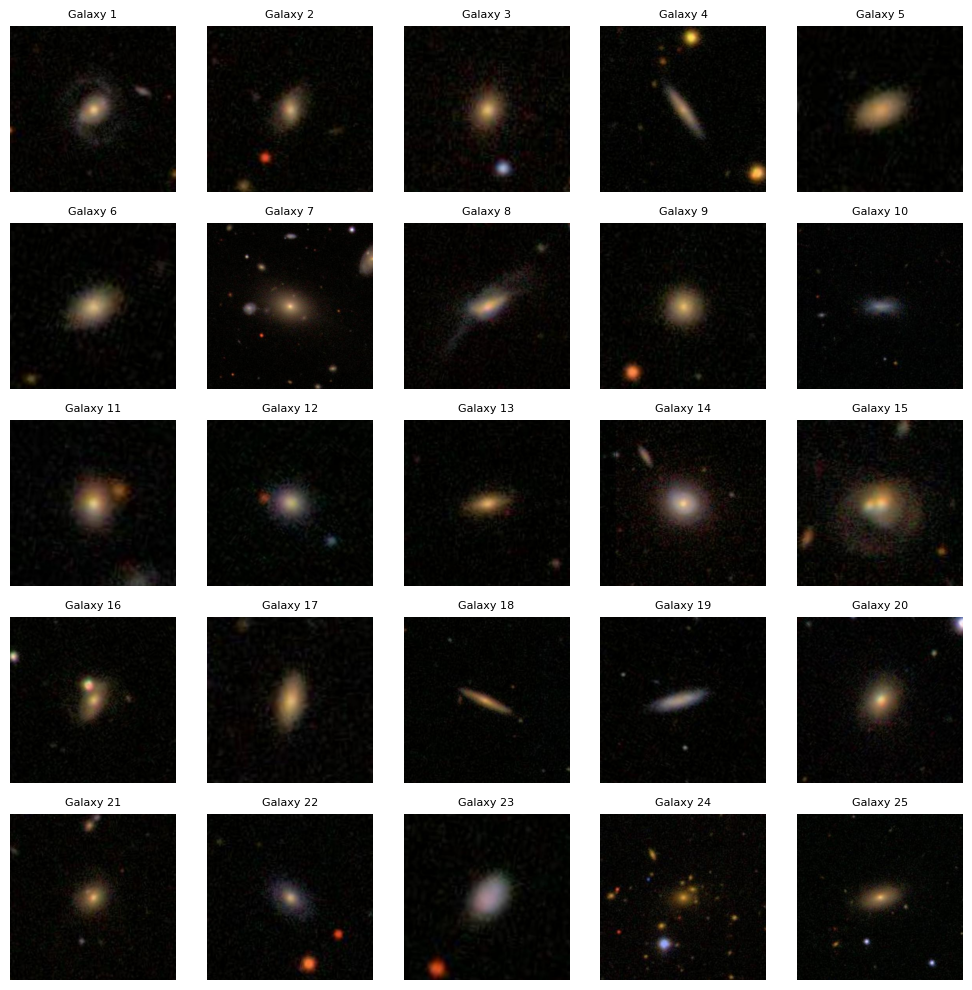

<Figure size 640x480 with 0 Axes>

In [77]:
path = 'galaxy_images/Users/kylecasbon/Desktop/training_images'
imgs = [f'{path}/100813.jpg', f'{path}/116724.jpg', f'{path}/123204.jpg', f'{path}/151686.jpg', f'{path}/180544.jpg',
        f'{path}/184050.jpg', f'{path}/191850.jpg', f'{path}/194519.jpg', f'{path}/266051.jpg', f'{path}/285453.jpg',
        f'{path}/303434.jpg', f'{path}/310110.jpg', f'{path}/321865.jpg', f'{path}/342681.jpg', f'{path}/360554.jpg',
        f'{path}/375777.jpg', f'{path}/400602.jpg', f'{path}/414449.jpg', f'{path}/430702.jpg', f'{path}/432101.jpg', 
        f'{path}/660614.jpg', f'{path}/680092.jpg', f'{path}/716033.jpg', f'{path}/810107.jpg', f'{path}/999680.jpg',]

plt.figure(figsize=(10, 10))

for i, img_path in enumerate(imgs):
    img = mpimg.imread(img_path)
    
    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Galaxy {i+1}", fontsize=8)

plt.tight_layout()
plt.show()
plt.savefig('lab3_5.png')

### 6.

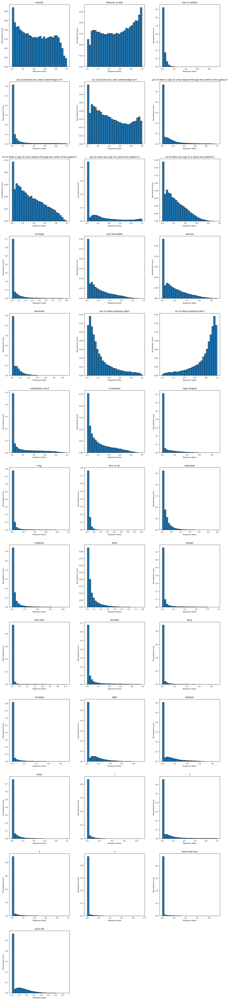

In [79]:
cl = pd.read_csv('training_classifications.csv')
cols = cl.columns.tolist()
responses = [
    "smooth",
    "features or disk",
    "star or artifact",
    "yes (Could this be a disk viewed edge-on?)",
    "no (Could this be a disk viewed edge-on?)",
    "yes (Is there a sign of a bar feature through the centre of the galaxy?)",
    "no (Is there a sign of a bar feature through the centre of the galaxy?)",
    "yes (Is there any sign of a spiral arm pattern?)",
    "no (Is there any sign of a spiral arm pattern?)",
    "no bulge",
    "just noticeable",
    "obvious",
    "dominant",
    "yes (Is there anything odd?)",
    "no (Is there anything odd?)",
    "completely round",
    "in between",
    "cigar-shaped",
    "ring",
    "lens or arc",
    "disturbed",
    "irregular",
    "other",
    "merger",
    "dust lane",
    "rounded",
    "boxy",
    "no bulge",
    "tight",
    "medium",
    "loose",
    "1",
    "2",
    "3",
    "4",
    "more than four",
    "can’t tell"
]

num_plots = 37
cols_per_row = 3
rows = math.ceil(num_plots / cols_per_row)

fig, axes = plt.subplots(rows, cols_per_row, figsize=(15, 5 * rows))
axes = axes.flatten()

for i in range(num_plots):
    col_data = cl[cols[i + 1]].dropna()  # assuming first column is not one of the response columns
    counts, bins = np.histogram(col_data, bins=30)
    probabilities = counts / counts.sum()

    ax = axes[i]
    ax.bar(bins[:-1], probabilities, width=np.diff(bins), edgecolor='black', align='edge')
    ax.set_title(responses[i], fontsize=10)
    ax.set_xlabel("Response Value", fontsize=8)
    ax.set_ylabel("Normalized Count", fontsize=8)
    ax.tick_params(labelsize=8)

for j in range(num_plots, len(axes)):
    axes[j].axis('off')

plt.tight_layout(pad=3.0)
plt.savefig('lab3_6.png')
plt.show()


### 7.

In [8]:
max_vals = []
max_ids = []
image_paths = []
for i in range(1, 38):
    res = f"{responses[i-1]}"
    col = cols[i]
    max_row = cl.loc[cl[col].idxmax()]
    max_vals.append(max_row[col])
    max_id = int(max_row['GalaxyID'])
    max_ids.append(max_id)
    image_paths.append(f"{path}/{max_id}.jpg")


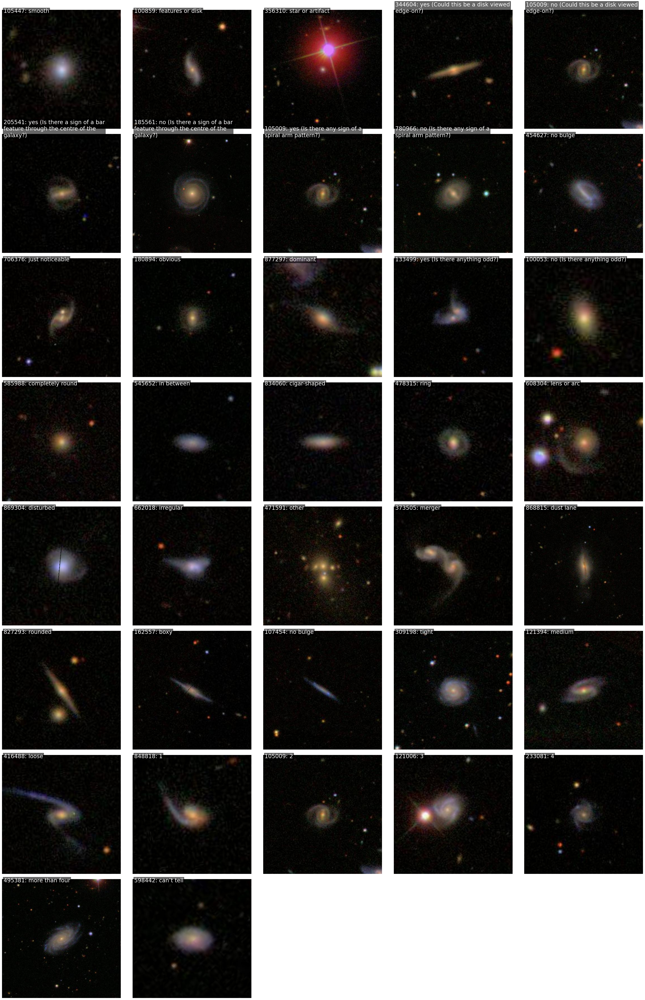

In [111]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import textwrap

# Create a large grid with 14 rows and 3 columns
fig, axes = plt.subplots(8, 5, figsize=(32, 64))
axes = axes.flatten()

# Loop over all axes and plot images
for i, ax in enumerate(axes):
    ax.axis('off')  # Turn off the axes
    if i < len(image_paths):
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        # Prepare the text for wrapping
        title = f"{max_ids[i]}: {responses[i]}"
        wrapped_title = textwrap.fill(title, width=40)  # Adjust width as needed
        
        # Overlay title text directly on the image (top-left corner)
        ax.text(
            5, 10,  # x, y pixel position (adjust as needed)
            wrapped_title,
            fontsize=20,
            color='white',
            bbox=dict(facecolor='black', alpha=0.6, pad=2),
        )
    else:
        ax.set_visible(False)  # Hide any extra subplots

# Remove all spacing between subplots
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.1, hspace=-0.7)

# Show the figure
plt.savefig('lab3_7.png')
plt.show()


## Checkpoint 2

### 8.

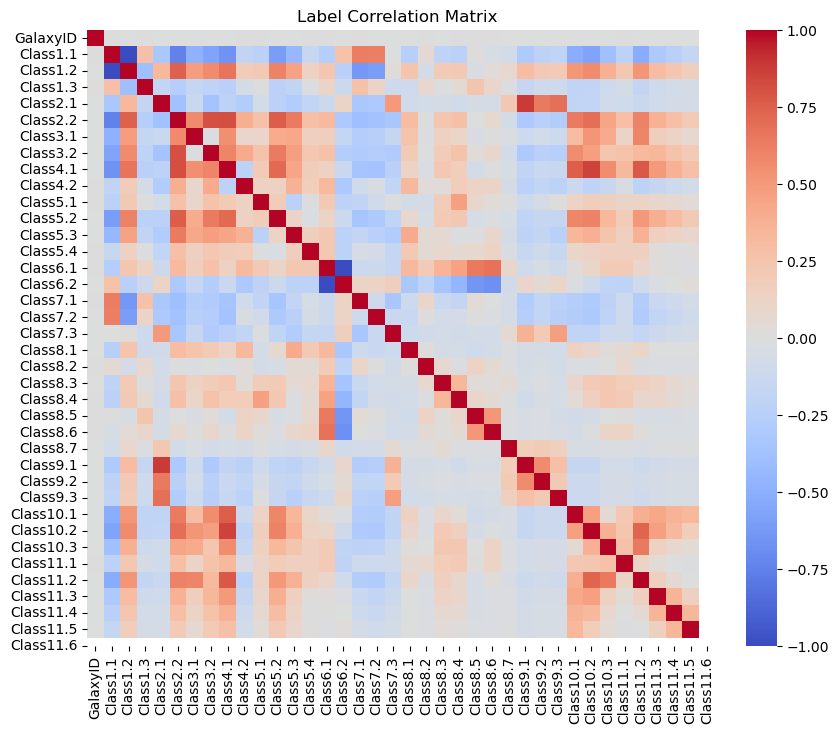

In [10]:
corr_matrix = np.zeros((37,37))
labels = cl.values

for i in range(37):
    for j in range(37):
        mean_i = np.mean(labels[:, i])
        mean_j = np.mean(labels[:, j])
        mean_ij = np.mean(labels[:, i] * labels[:, j])
        mean_i2 = np.mean(labels[:, i] ** 2)
        mean_j2 = np.mean(labels[:, j] ** 2)

        numerator = mean_ij - mean_i * mean_j
        denominator = np.sqrt(mean_i2 - mean_i ** 2) * np.sqrt(mean_j2 - mean_j ** 2)
        
        corr_matrix[i, j] = numerator / denominator if denominator != 0 else 0

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap='coolwarm',
            xticklabels=cl.columns,
            yticklabels=cl.columns)
plt.title("Label Correlation Matrix")
plt.show()
    

### 9.

We are going to build a model to predict classifications (labels) based on images. To train the model,
we will have to repeatedly compare predictions for each image in the training set to its known labels.
What is the minimum amount of memory it would take (within a factor of ∼ 2) to load each image in
the training set into memory? Don’t worry (yet) about the memory required to store the model. Hint:
You can estimate this by thinking about how many pixels are in the total set of images.

### 10.

(424, 424, 3)


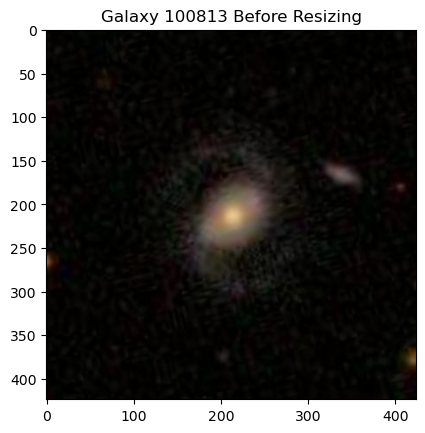

In [80]:
img = mpimg.imread(imgs[0])
print(img.shape)
plt.imshow(img)
plt.title('Galaxy 100813 Before Resizing')
plt.show()

(224, 224, 3)


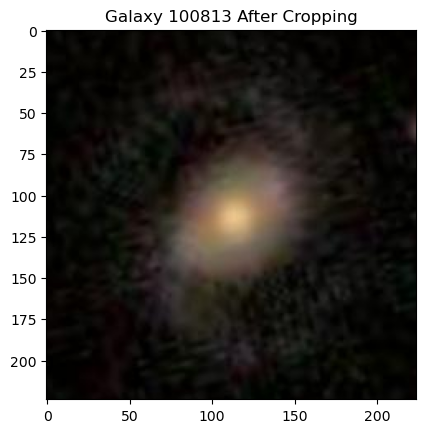

In [81]:
new_img = img[100:-100, 100:-100, :]
print(new_img.shape)
plt.imshow(new_img)
plt.title('Galaxy 100813 After Cropping')
plt.show()

(67, 67, 3)


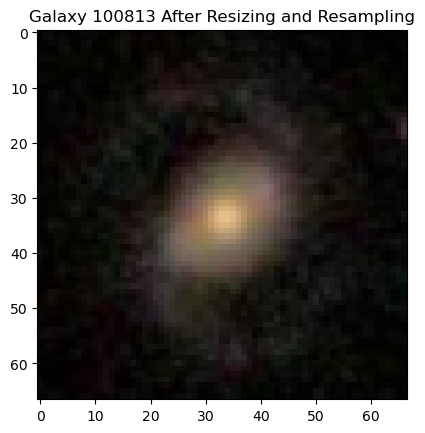

In [82]:
# this currently reduces the size of each image by a factor of 40
resize_factor = 0.3
new_size = (int(new_img.shape[1] * resize_factor),
                int(new_img.shape[0] * resize_factor))
img_resized = cv2.resize(new_img, new_size, interpolation=cv2.INTER_AREA)
print(img_resized.shape)

plt.imshow(img_resized)
plt.title('Galaxy 100813 After Resizing and Resampling')

plt.show()

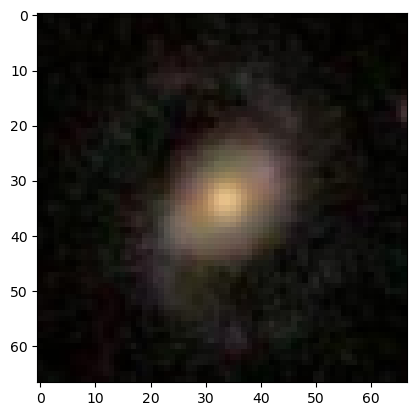

In [14]:
def img_resize(img, resize_factor=0.3, pixel_border=100):
    h, w = img.shape[:2]
    if h <= 2 * pixel_border or w <= 2 * pixel_border:
        return img
        
    new_img = img[pixel_border:-pixel_border, pixel_border:-pixel_border, :]
    new_size = (int(new_img.shape[1] * resize_factor),
                int(new_img.shape[0] * resize_factor))
    return cv2.resize(new_img, new_size, interpolation=cv2.INTER_AREA)

plt.imshow(img_resize(mpimg.imread(imgs[0])))
plt.show()

### 11.

In [15]:
def read_resize_save(id):
    path = 'galaxy_images/Users/kylecasbon/Desktop/training_images'
    img_path = f"{path}/{id}.jpg"
    img = plt.imread(img_path)
    resized_img = img_resize(img)
    #plt.imsave(img_path, resized_img)
    return resized_img

### 12.

In [16]:
train_df, val_df = train_test_split(cl, test_size=0.2, random_state=42)

print(f"Training size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(train_df.shape, val_df.shape)

Training size: 49262
Validation size: 12316
(49262, 38) (12316, 38)


### 13.

In [17]:
means = [cl[col].mean() for col in cl.columns[1:]]

num_gal = 61578
num_labels = 37

def rmse(df, pred):
    diffs = 0
    for i in range(len(df)):
        diffs += np.sum((df.iloc[i].iloc[1:] - means) ** 2)
        
    return diffs


train_rmse = np.sqrt(rmse(train_df, means) / (num_gal*num_labels))
val_rmse = np.sqrt(rmse(val_df, means) / (num_gal*num_labels))

print(f"Training Set RMSE Loss: {train_rmse}")
print(f"Validation Set RMSE Loss: {val_rmse}")

Training Set RMSE Loss: 0.14650099618281373
Validation Set RMSE Loss: 0.07338691819371891


### 14.

Check out
He et al. 2015, which describes ResNets. Describe in a few sentences what ResNets are. How are they
different from just stacking more and more layers on a traditional CNN?

### 15.

In [18]:
# Training function
def train_model(epochs):
    best_acc = 0.0
    train_losses, validation_losses, test_accs = [], [], []
    training_start_time = time.time()
    
    print("Starting training...")
    for epoch in range(epochs):
        model.train()
        running_loss = 0
        total = 0
        epoch_start_time = time.time()
        
        if LOCAL:
            from tqdm import tqdm
            data_iterator = tqdm(train_loader)
        else: 
            data_iterator = train_loader
        for data in data_iterator:
            inputs, labels = data[0].to(device), data[1].to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            print(f"outputs: {outputs}, outputs.shape = {outputs.shape}")
            print(f"labels: {labels}, labels.shape = {labels.shape}")
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total += labels.size(0)            
            running_loss += loss.item()

        # Save the loss after each epoch
        train_losses.append(running_loss/total)
        
        # Evaluate on test set after each epoch
        validation_loss = evaluate_model()
        validation_losses.append(validation_loss)
        
        epoch_time = time.time() - epoch_start_time
        print(f'Epoch {epoch + 1} completed in {epoch_time:.2f} seconds')
    
    print(f'Finished Training! Best accuracy: {best_acc:.2f}%')
    training_time = time.time() - training_start_time
    print(f'Training completed in {training_time:.2f} seconds')
    return train_losses, validation_losses, test_accs

In [24]:
# Evaluation function
def evaluate_model():
    model.eval()
    correct = 0
    total = 0
    loss = 0
    
    with torch.no_grad():
        for data in val_loader:
            images, labels = data[0].to(device), data[1].to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            loss += criterion(outputs, labels).item()

    loss /= total
    return loss

In [29]:
# Plot training progress
def plot_results(training_losses, validation_losses):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(training_losses, label='Training')
    plt.plot(validation_losses, label='Validation')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    

In [26]:
class GalaxyLazyDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None, load_and_resize_fn=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        self.load_and_resize_fn = load_and_resize_fn

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load and resize the image using your provided function
        image = self.load_and_resize_fn(self.image_paths[idx])

        # Convert to PIL if it's a NumPy array

        # Apply transforms
        if self.transform:
            image = self.transform(image)

        # Return image and label
        return image, train_df.iloc[idx].iloc[1:].to_numpy()


In [27]:
LOCAL = True
CPU = False

torch.set_num_threads(2)  # Control PyTorch thread pool

if CPU:
    device = torch.device("cpu") # For a comparison (for local runs)
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

transform = transforms.Compose([
    transforms.ToTensor()
])

transform_test = transforms.Compose([
    transforms.ToTensor()
])


train_paths = [int(train_df.iloc[i].iloc[0]) for i in range(len(train_df))]
val_paths = [int(val_df.iloc[i].iloc[0]) for i in range(len(val_df))]

print("Loading datasets...")
train_dataset = GalaxyLazyDataset(
    image_paths=train_paths,
    labels=cl.columns[1:],
    transform=transform,
    load_and_resize_fn=read_resize_save
)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=1)


val_dataset = GalaxyLazyDataset(
    image_paths=val_paths,
    labels=cl.columns[1:],
    transform=transform,
    load_and_resize_fn=read_resize_save
)

val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=1)




# Initialize model
print("Initializing model...")
model = resnet18(weights=None)  # No pre-training
model.conv1 = nn.Conv2d(
        in_channels=3,
        out_channels=64,
        kernel_size=3,
        stride=1,
        padding=1,
        bias=False
    )
model.maxpool = nn.Identity()

num_features = model.fc.in_features
output_dim = 37
model.fc = nn.Sequential(
        nn.Linear(num_features, output_dim),
        nn.Sigmoid()  # Assuming output is normalized between 0 and 1
    )

model = model.to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=5e-4)

Using device: cpu
Loading datasets...
Initializing model...


In [28]:
training_losses, validation_losses, accuracies = train_model(epochs=5) # Train the model
plot_results(training_losses, validation_losses, accuracies) # Plot results
print("Example completed successfully!")

Starting training...


  0%|          | 0/385 [00:00<?, ?it/s]

outputs: tensor([[0.4100, 0.3537, 0.6407,  ..., 0.3959, 0.5826, 0.3516],
        [0.3775, 0.3178, 0.6499,  ..., 0.3631, 0.6143, 0.3472],
        [0.3987, 0.3254, 0.6585,  ..., 0.3898, 0.6056, 0.3368],
        ...,
        [0.4371, 0.3619, 0.6256,  ..., 0.4179, 0.6268, 0.3797],
        [0.4145, 0.3350, 0.6389,  ..., 0.4093, 0.5966, 0.3372],
        [0.3802, 0.3359, 0.6494,  ..., 0.3827, 0.6215, 0.3340]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3943, 0.5856, 0.0201,  ..., 0.0000, 0.2241, 0.0000],
        [0.5733, 0.4010, 0.0257,  ..., 0.0000, 0.0000, 0.3139],
        [0.1081, 0.8880, 0.0039,  ..., 0.0000, 0.0000, 0.2728],
        ...,
        [0.4734, 0.5266, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2526, 0.7376, 0.0098,  ..., 0.0000, 0.0000, 0.1890],
        [0.9264, 0.0736, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  0%|          | 1/385 [00:15<1:41:12, 15.81s/it]

outputs: tensor([[0.4764, 0.4126, 0.6016,  ..., 0.3919, 0.5903, 0.3590],
        [0.4800, 0.4047, 0.6208,  ..., 0.3925, 0.5845, 0.3524],
        [0.3812, 0.3123, 0.7028,  ..., 0.2792, 0.5622, 0.2571],
        ...,
        [0.4357, 0.3638, 0.6415,  ..., 0.3575, 0.5703, 0.3229],
        [0.4422, 0.3457, 0.6551,  ..., 0.3464, 0.5313, 0.2835],
        [0.4655, 0.4097, 0.6235,  ..., 0.3976, 0.5973, 0.3575]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0507, 0.9444, 0.0049,  ..., 0.0845, 0.0000, 0.3919],
        [0.2454, 0.7388, 0.0159,  ..., 0.0000, 0.0000, 0.0000],
        [0.6009, 0.3600, 0.0391,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7639, 0.1943, 0.0419,  ..., 0.0000, 0.0000, 0.1266],
        [0.7589, 0.2255, 0.0156,  ..., 0.0000, 0.0000, 0.0000],
        [0.4239, 0.5761, 0.0000,  ..., 0.0000, 0.0000, 0.0825]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  1%|          | 2/385 [00:29<1:31:25, 14.32s/it]

outputs: tensor([[0.5645, 0.5119, 0.5820,  ..., 0.3694, 0.5336, 0.3224],
        [0.5694, 0.4596, 0.5886,  ..., 0.3669, 0.5377, 0.3361],
        [0.5731, 0.4534, 0.5894,  ..., 0.3334, 0.5472, 0.3326],
        ...,
        [0.5443, 0.5096, 0.5916,  ..., 0.3429, 0.5537, 0.3313],
        [0.5688, 0.4954, 0.5954,  ..., 0.3429, 0.5259, 0.3439],
        [0.5482, 0.4942, 0.5775,  ..., 0.3478, 0.5564, 0.3453]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5100, 0.4751, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        [0.1336, 0.8501, 0.0163,  ..., 0.0000, 0.0261, 0.3920],
        [0.5651, 0.4349, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4823, 0.5177, 0.0000,  ..., 0.0000, 0.0000, 0.0670],
        [0.4984, 0.4645, 0.0371,  ..., 0.0000, 0.0000, 0.0000],
        [0.9083, 0.0459, 0.0459,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  1%|          | 3/385 [00:42<1:27:45, 13.78s/it]

outputs: tensor([[0.7052, 0.6620, 0.5316,  ..., 0.2891, 0.4666, 0.2775],
        [0.6988, 0.6652, 0.5383,  ..., 0.3052, 0.4206, 0.3067],
        [0.6906, 0.6487, 0.5460,  ..., 0.3088, 0.5063, 0.3218],
        ...,
        [0.6770, 0.6298, 0.5347,  ..., 0.3257, 0.5058, 0.3224],
        [0.6814, 0.6171, 0.5284,  ..., 0.3202, 0.4906, 0.3426],
        [0.6422, 0.6032, 0.5529,  ..., 0.3504, 0.5346, 0.3567]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2629, 0.7282, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.1465, 0.8345, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.1386, 0.8423, 0.0190,  ..., 0.0000, 0.0000, 0.2068],
        ...,
        [0.6265, 0.3277, 0.0457,  ..., 0.0000, 0.0000, 0.1688],
        [0.0522, 0.9448, 0.0029,  ..., 0.0000, 0.0000, 0.1403],
        [0.0000, 0.9980, 0.0020,  ..., 0.1088, 0.0549, 0.0180]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  1%|          | 4/385 [00:55<1:26:32, 13.63s/it]

outputs: tensor([[0.8287, 0.8300, 0.4535,  ..., 0.2430, 0.3761, 0.2972],
        [0.8966, 0.8996, 0.4706,  ..., 0.1728, 0.3088, 0.2283],
        [0.7762, 0.7655, 0.4847,  ..., 0.2917, 0.4310, 0.3159],
        ...,
        [0.8539, 0.8500, 0.4712,  ..., 0.2233, 0.3899, 0.2600],
        [0.8415, 0.8506, 0.4964,  ..., 0.2284, 0.3885, 0.2704],
        [0.8205, 0.8230, 0.4671,  ..., 0.2376, 0.3872, 0.2627]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.5894e-01, 6.4106e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.3834e-02, 9.0569e-01, 4.7200e-04,  ..., 4.1775e-02, 0.0000e+00,
         1.3201e-01],
        [1.0288e-01, 8.8993e-01, 7.1910e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.3000e-02, 9.4700e-01, 0.0000e+00,  ..., 5.2853e-02, 0.0000e+00,
         2.6269e-01],
        [5.9621e-01, 3.8061e-01, 2.3181e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.74

  1%|▏         | 5/385 [01:09<1:26:11, 13.61s/it]

outputs: tensor([[0.9839, 0.9782, 0.3156,  ..., 0.0916, 0.1259, 0.1422],
        [0.8441, 0.8706, 0.4410,  ..., 0.2564, 0.3797, 0.3045],
        [0.9360, 0.9458, 0.3829,  ..., 0.1822, 0.2802, 0.2325],
        ...,
        [0.8743, 0.9035, 0.4375,  ..., 0.2348, 0.3567, 0.2949],
        [0.8965, 0.9183, 0.3901,  ..., 0.2029, 0.3150, 0.2644],
        [0.9160, 0.9321, 0.4105,  ..., 0.1813, 0.2940, 0.2583]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1219, 0.6541, 0.2240,  ..., 0.0000, 0.0000, 0.2578],
        [0.1201, 0.8647, 0.0151,  ..., 0.0000, 0.0000, 0.0127],
        [0.2330, 0.7670, 0.0000,  ..., 0.0272, 0.0000, 0.1642],
        ...,
        [0.4799, 0.4925, 0.0277,  ..., 0.0000, 0.0000, 0.2799],
        [0.1123, 0.8877, 0.0000,  ..., 0.0000, 0.0000, 0.0753],
        [0.4131, 0.5709, 0.0160,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  2%|▏         | 6/385 [01:22<1:25:06, 13.47s/it]

outputs: tensor([[0.9390, 0.9674, 0.2930,  ..., 0.1728, 0.2207, 0.2414],
        [0.9486, 0.9674, 0.2986,  ..., 0.1765, 0.2394, 0.2190],
        [0.9318, 0.9579, 0.3385,  ..., 0.1722, 0.2538, 0.2648],
        ...,
        [0.9867, 0.9926, 0.2178,  ..., 0.0861, 0.1252, 0.1624],
        [0.9683, 0.9794, 0.2706,  ..., 0.1291, 0.2021, 0.1994],
        [0.9374, 0.9629, 0.3109,  ..., 0.1706, 0.2520, 0.2556]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0683, 0.9244, 0.0074,  ..., 0.0000, 0.0000, 0.0887],
        [0.4065, 0.5531, 0.0404,  ..., 0.0000, 0.0000, 0.0000],
        [0.7248, 0.2752, 0.0000,  ..., 0.0000, 0.0000, 0.2044],
        ...,
        [0.1206, 0.8794, 0.0000,  ..., 0.0000, 0.0000, 0.0415],
        [0.8710, 0.0262, 0.1028,  ..., 0.0000, 0.0000, 0.0000],
        [0.4364, 0.5414, 0.0222,  ..., 0.0000, 0.0000, 0.1599]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  2%|▏         | 7/385 [01:35<1:24:45, 13.45s/it]

outputs: tensor([[0.9646, 0.9810, 0.2556,  ..., 0.1630, 0.1962, 0.2468],
        [0.9658, 0.9816, 0.2564,  ..., 0.1403, 0.1875, 0.2220],
        [0.9510, 0.9740, 0.2794,  ..., 0.1756, 0.2254, 0.2467],
        ...,
        [0.9639, 0.9813, 0.2584,  ..., 0.1516, 0.1902, 0.2199],
        [0.9715, 0.9866, 0.2280,  ..., 0.1317, 0.1771, 0.2228],
        [0.9507, 0.9749, 0.2555,  ..., 0.1646, 0.2108, 0.2566]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6397, 0.3603, 0.0000,  ..., 0.0000, 0.0000, 0.0882],
        [0.2932, 0.7068, 0.0000,  ..., 0.0000, 0.0000, 0.1668],
        [0.5660, 0.4080, 0.0260,  ..., 0.0000, 0.0000, 0.0679],
        ...,
        [0.1714, 0.8147, 0.0139,  ..., 0.0000, 0.0000, 0.0000],
        [0.8239, 0.1202, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
        [0.0925, 0.9025, 0.0050,  ..., 0.0000, 0.0000, 0.3430]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  2%|▏         | 8/385 [01:49<1:24:26, 13.44s/it]

outputs: tensor([[0.9883, 0.9953, 0.1538,  ..., 0.0946, 0.1101, 0.1875],
        [0.9942, 0.9979, 0.1339,  ..., 0.0603, 0.0672, 0.1456],
        [0.9737, 0.9870, 0.2125,  ..., 0.1275, 0.1491, 0.2384],
        ...,
        [0.9742, 0.9876, 0.2139,  ..., 0.1372, 0.1587, 0.2335],
        [0.9799, 0.9912, 0.1836,  ..., 0.1151, 0.1412, 0.2227],
        [0.9789, 0.9914, 0.1866,  ..., 0.1199, 0.1469, 0.2081]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.1058e-01, 0.0000e+00, 8.9425e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.9725e-01, 2.4961e-01, 5.3148e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.2680e-02, 9.5732e-01, 0.0000e+00,  ..., 2.5531e-02, 0.0000e+00,
         1.0119e-01],
        ...,
        [5.5275e-01, 4.3520e-01, 1.2047e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0966e-01, 7.8339e-01, 6.9410e-03,  ..., 0.0000e+00, 0.0000e+00,
         7.6360e-02],
        [1.98

  2%|▏         | 9/385 [02:02<1:23:40, 13.35s/it]

outputs: tensor([[0.9880, 0.9951, 0.1495,  ..., 0.0971, 0.1025, 0.1856],
        [0.9743, 0.9900, 0.1721,  ..., 0.1269, 0.1610, 0.2445],
        [0.9871, 0.9949, 0.1447,  ..., 0.0870, 0.1013, 0.2013],
        ...,
        [0.9958, 0.9989, 0.0859,  ..., 0.0539, 0.0570, 0.1357],
        [0.9930, 0.9976, 0.1166,  ..., 0.0712, 0.0838, 0.1660],
        [0.9854, 0.9942, 0.1385,  ..., 0.0963, 0.1053, 0.1964]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0600e-01, 8.8400e-01, 1.0000e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.1106e-02],
        [2.7547e-01, 7.1966e-01, 4.8710e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.6516e-01],
        [1.8466e-01, 8.1534e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         6.8553e-02],
        ...,
        [5.6282e-02, 9.3836e-01, 5.3570e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.1240e-01],
        [1.2357e-01, 8.7572e-01, 7.1200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.35

  3%|▎         | 10/385 [02:15<1:23:13, 13.32s/it]

outputs: tensor([[0.9979, 0.9994, 0.0657,  ..., 0.0399, 0.0337, 0.1241],
        [0.9994, 0.9998, 0.0409,  ..., 0.0252, 0.0188, 0.0878],
        [0.9922, 0.9979, 0.0898,  ..., 0.0738, 0.0685, 0.1675],
        ...,
        [0.9876, 0.9958, 0.1170,  ..., 0.0867, 0.0965, 0.1971],
        [0.9956, 0.9987, 0.0791,  ..., 0.0535, 0.0505, 0.1511],
        [0.9936, 0.9978, 0.1012,  ..., 0.0664, 0.0731, 0.1670]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7309, 0.1810, 0.0881,  ..., 0.0000, 0.0000, 0.0000],
        [0.8343, 0.1066, 0.0591,  ..., 0.0000, 0.0000, 0.0000],
        [0.2714, 0.6820, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6221, 0.3607, 0.0172,  ..., 0.0000, 0.0704, 0.0296],
        [0.1062, 0.8938, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8159, 0.1841, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  3%|▎         | 11/385 [02:28<1:23:04, 13.33s/it]

outputs: tensor([[0.9962, 0.9989, 0.0741,  ..., 0.0528, 0.0483, 0.1527],
        [0.9940, 0.9983, 0.0933,  ..., 0.0623, 0.0570, 0.1904],
        [0.9954, 0.9988, 0.0746,  ..., 0.0561, 0.0537, 0.1511],
        ...,
        [0.9970, 0.9991, 0.0638,  ..., 0.0488, 0.0425, 0.1326],
        [0.9954, 0.9987, 0.0739,  ..., 0.0556, 0.0522, 0.1625],
        [0.9977, 0.9993, 0.0596,  ..., 0.0408, 0.0359, 0.1241]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6462, 0.3216, 0.0322,  ..., 0.0000, 0.0000, 0.1048],
        [0.4781, 0.5219, 0.0000,  ..., 0.0000, 0.0000, 0.2220],
        [0.8979, 0.0840, 0.0181,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4702, 0.5190, 0.0108,  ..., 0.0000, 0.0000, 0.2141],
        [0.0686, 0.8567, 0.0747,  ..., 0.0000, 0.0000, 0.1187],
        [0.9264, 0.0736, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  3%|▎         | 12/385 [02:42<1:22:25, 13.26s/it]

outputs: tensor([[0.9949, 0.9986, 0.0633,  ..., 0.0565, 0.0553, 0.1585],
        [0.9991, 0.9998, 0.0290,  ..., 0.0204, 0.0173, 0.0964],
        [1.0000, 1.0000, 0.0054,  ..., 0.0052, 0.0023, 0.0355],
        ...,
        [0.9997, 1.0000, 0.0190,  ..., 0.0138, 0.0094, 0.0636],
        [0.9973, 0.9994, 0.0485,  ..., 0.0392, 0.0341, 0.1359],
        [0.9972, 0.9994, 0.0558,  ..., 0.0432, 0.0366, 0.1332]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0816, 0.9061, 0.0123,  ..., 0.0000, 0.2114, 0.1134],
        [0.5092, 0.4898, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.4843, 0.4557, 0.0600,  ..., 0.0000, 0.0000, 0.0966],
        ...,
        [0.5588, 0.4412, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0395, 0.9476, 0.0129,  ..., 0.0336, 0.0485, 0.2175],
        [0.3135, 0.6701, 0.0164,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  3%|▎         | 13/385 [02:55<1:22:58, 13.38s/it]

outputs: tensor([[0.9998, 1.0000, 0.0146,  ..., 0.0119, 0.0078, 0.0613],
        [0.9976, 0.9995, 0.0446,  ..., 0.0391, 0.0344, 0.1322],
        [0.9986, 0.9997, 0.0298,  ..., 0.0303, 0.0217, 0.1048],
        ...,
        [0.9982, 0.9996, 0.0433,  ..., 0.0354, 0.0257, 0.1166],
        [0.9989, 0.9998, 0.0301,  ..., 0.0268, 0.0182, 0.1022],
        [0.9980, 0.9996, 0.0375,  ..., 0.0365, 0.0267, 0.1201]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5461, 0.3738, 0.0801,  ..., 0.0000, 0.0000, 0.0000],
        [0.5104, 0.4896, 0.0000,  ..., 0.0000, 0.0000, 0.2263],
        [0.5737, 0.4237, 0.0026,  ..., 0.0000, 0.0000, 0.3811],
        ...,
        [0.3223, 0.6671, 0.0106,  ..., 0.0000, 0.0000, 0.1015],
        [0.9303, 0.0697, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5746, 0.4087, 0.0167,  ..., 0.0000, 0.0000, 0.2323]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  4%|▎         | 14/385 [03:09<1:22:32, 13.35s/it]

outputs: tensor([[0.9986, 0.9997, 0.0302,  ..., 0.0274, 0.0207, 0.1052],
        [0.9981, 0.9996, 0.0323,  ..., 0.0327, 0.0232, 0.1173],
        [0.9996, 0.9999, 0.0168,  ..., 0.0171, 0.0096, 0.0897],
        ...,
        [0.9968, 0.9994, 0.0398,  ..., 0.0426, 0.0324, 0.1293],
        [0.9992, 0.9999, 0.0211,  ..., 0.0203, 0.0137, 0.1046],
        [0.9973, 0.9995, 0.0362,  ..., 0.0355, 0.0304, 0.1414]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9284, 0.0000, 0.0716,  ..., 0.0000, 0.0000, 0.0000],
        [0.2481, 0.7453, 0.0066,  ..., 0.0000, 0.0000, 0.2267],
        [0.3937, 0.6063, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2837, 0.6747, 0.0416,  ..., 0.0000, 0.0000, 0.1728],
        [0.1541, 0.8339, 0.0120,  ..., 0.0000, 0.0000, 0.0845],
        [0.2668, 0.7166, 0.0167,  ..., 0.0000, 0.0000, 0.2670]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  4%|▍         | 15/385 [03:22<1:22:01, 13.30s/it]

outputs: tensor([[0.9987, 0.9997, 0.0274,  ..., 0.0282, 0.0181, 0.1022],
        [0.9995, 0.9999, 0.0172,  ..., 0.0164, 0.0109, 0.0708],
        [0.9993, 0.9999, 0.0185,  ..., 0.0179, 0.0123, 0.0863],
        ...,
        [0.9988, 0.9998, 0.0276,  ..., 0.0231, 0.0163, 0.1109],
        [0.9999, 1.0000, 0.0078,  ..., 0.0084, 0.0045, 0.0610],
        [0.9998, 1.0000, 0.0105,  ..., 0.0116, 0.0059, 0.0646]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2646, 0.7354, 0.0000,  ..., 0.0000, 0.0000, 0.1238],
        [0.9037, 0.0963, 0.0000,  ..., 0.0000, 0.0000, 0.0549],
        [0.7063, 0.2832, 0.0105,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3026, 0.6847, 0.0127,  ..., 0.0000, 0.0000, 0.1014],
        [0.0802, 0.9198, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4686, 0.5042, 0.0272,  ..., 0.0000, 0.0000, 0.2026]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  4%|▍         | 16/385 [03:35<1:21:07, 13.19s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.1663e-03,  ..., 2.7601e-03, 9.8142e-04,
         2.3953e-02],
        [9.9995e-01, 9.9999e-01, 4.8241e-03,  ..., 4.5809e-03, 2.3881e-03,
         4.5168e-02],
        [9.9802e-01, 9.9971e-01, 2.9540e-02,  ..., 2.9318e-02, 2.0541e-02,
         1.2480e-01],
        ...,
        [9.9953e-01, 9.9993e-01, 1.4163e-02,  ..., 1.5561e-02, 8.8458e-03,
         8.3374e-02],
        [9.9938e-01, 9.9990e-01, 1.7377e-02,  ..., 1.6694e-02, 1.1729e-02,
         9.9107e-02],
        [9.9911e-01, 9.9987e-01, 1.9212e-02,  ..., 2.1808e-02, 1.3985e-02,
         9.0901e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0707, 0.9293, 0.0000,  ..., 0.0733, 0.0370, 0.2674],
        [0.8101, 0.0993, 0.0906,  ..., 0.0000, 0.0000, 0.0000],
        [0.4668, 0.4992, 0.0340,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8820, 0.1008, 0.0172,  ..., 0.0000, 0.0000, 0.0000],
        [0.9736, 0.0000, 0.0264,  ..., 0.0000, 0.00

  4%|▍         | 17/385 [03:48<1:21:30, 13.29s/it]

outputs: tensor([[0.9991, 0.9999, 0.0178,  ..., 0.0207, 0.0132, 0.0969],
        [0.9990, 0.9999, 0.0201,  ..., 0.0198, 0.0144, 0.1022],
        [0.9993, 0.9999, 0.0154,  ..., 0.0176, 0.0111, 0.0854],
        ...,
        [0.9999, 1.0000, 0.0059,  ..., 0.0063, 0.0037, 0.0467],
        [0.9993, 0.9999, 0.0151,  ..., 0.0178, 0.0112, 0.0883],
        [0.9996, 0.9999, 0.0120,  ..., 0.0126, 0.0070, 0.0693]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.7187e-01, 5.2813e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.3040e-01, 4.3142e-01, 3.8178e-02,  ..., 0.0000e+00, 1.0528e-01,
         7.1333e-02],
        [7.3205e-01, 2.4111e-01, 2.6833e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.5321e-01],
        ...,
        [0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 3.7962e-02, 0.0000e+00,
         7.5924e-02],
        [2.8171e-01, 7.1734e-01, 9.4600e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.2440e-02],
        [8.48

  5%|▍         | 18/385 [04:02<1:21:25, 13.31s/it]

outputs: tensor([[0.9996, 0.9999, 0.0130,  ..., 0.0134, 0.0080, 0.0774],
        [0.9997, 1.0000, 0.0095,  ..., 0.0121, 0.0059, 0.0661],
        [0.9995, 1.0000, 0.0097,  ..., 0.0128, 0.0076, 0.0772],
        ...,
        [0.9999, 1.0000, 0.0060,  ..., 0.0073, 0.0035, 0.0540],
        [0.9998, 1.0000, 0.0069,  ..., 0.0087, 0.0045, 0.0484],
        [0.9999, 1.0000, 0.0052,  ..., 0.0067, 0.0030, 0.0496]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4727, 0.5213, 0.0061,  ..., 0.0000, 0.1185, 0.0307],
        [0.9125, 0.0875, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1722, 0.8278, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9681, 0.0319, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0338, 0.9662, 0.0000,  ..., 0.0000, 0.0236, 0.0000],
        [0.5527, 0.4142, 0.0331,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  5%|▍         | 19/385 [04:15<1:20:39, 13.22s/it]

outputs: tensor([[0.9998, 1.0000, 0.0061,  ..., 0.0070, 0.0041, 0.0548],
        [0.9999, 1.0000, 0.0055,  ..., 0.0069, 0.0030, 0.0507],
        [0.9997, 1.0000, 0.0074,  ..., 0.0091, 0.0056, 0.0554],
        ...,
        [0.9995, 0.9999, 0.0098,  ..., 0.0135, 0.0069, 0.0805],
        [0.9999, 1.0000, 0.0064,  ..., 0.0069, 0.0033, 0.0486],
        [0.9997, 1.0000, 0.0073,  ..., 0.0095, 0.0056, 0.0645]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7096, 0.2608, 0.0296,  ..., 0.0000, 0.0000, 0.0980],
        [0.0849, 0.8971, 0.0179,  ..., 0.0000, 0.0000, 0.1497],
        [0.7396, 0.2229, 0.0374,  ..., 0.0000, 0.0000, 0.1264],
        ...,
        [0.3183, 0.6434, 0.0384,  ..., 0.0000, 0.0000, 0.0000],
        [0.3290, 0.6514, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.8202, 0.0672, 0.1126,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  5%|▌         | 20/385 [04:28<1:20:58, 13.31s/it]

outputs: tensor([[0.9998, 1.0000, 0.0068,  ..., 0.0087, 0.0039, 0.0557],
        [0.9998, 1.0000, 0.0063,  ..., 0.0081, 0.0039, 0.0565],
        [1.0000, 1.0000, 0.0025,  ..., 0.0028, 0.0010, 0.0255],
        ...,
        [0.9997, 1.0000, 0.0086,  ..., 0.0117, 0.0060, 0.0705],
        [0.9999, 1.0000, 0.0062,  ..., 0.0072, 0.0030, 0.0525],
        [0.9999, 1.0000, 0.0043,  ..., 0.0059, 0.0025, 0.0424]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.2650e-01, 6.3817e-01, 3.5333e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.4530e-02, 9.4487e-01, 6.0000e-04,  ..., 0.0000e+00, 3.9102e-02,
         3.3334e-01],
        [8.8999e-01, 5.1869e-02, 5.8137e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.6981e-01, 0.0000e+00, 3.0195e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.9978e-01, 5.1743e-01, 8.2791e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.2246e-01],
        [1.31

  5%|▌         | 21/385 [04:41<1:20:44, 13.31s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.4716e-03,  ..., 3.0565e-03, 1.2499e-03,
         2.9727e-02],
        [9.9995e-01, 1.0000e+00, 2.5699e-03,  ..., 3.5453e-03, 1.4483e-03,
         3.4060e-02],
        [9.9989e-01, 9.9999e-01, 4.6017e-03,  ..., 5.8594e-03, 2.7726e-03,
         4.3882e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0358e-03,  ..., 1.4048e-03, 4.9704e-04,
         1.7063e-02],
        [9.9973e-01, 9.9997e-01, 7.2113e-03,  ..., 8.9608e-03, 4.9370e-03,
         6.0489e-02],
        [9.9952e-01, 9.9995e-01, 9.4614e-03,  ..., 1.1685e-02, 7.5548e-03,
         7.5789e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9570, 0.0430, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1385, 0.8615, 0.0000,  ..., 0.0295, 0.0367, 0.3115],
        [0.1808, 0.8192, 0.0000,  ..., 0.0000, 0.0378, 0.0000],
        ...,
        [0.7086, 0.2752, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.8710, 0.0509, 0.0780,  ..., 0.0000, 0.00

  6%|▌         | 22/385 [04:54<1:20:01, 13.23s/it]

outputs: tensor([[0.9998, 1.0000, 0.0055,  ..., 0.0059, 0.0035, 0.0587],
        [0.9999, 1.0000, 0.0042,  ..., 0.0055, 0.0025, 0.0448],
        [0.9999, 1.0000, 0.0044,  ..., 0.0058, 0.0028, 0.0440],
        ...,
        [0.9995, 1.0000, 0.0087,  ..., 0.0110, 0.0067, 0.0757],
        [0.9999, 1.0000, 0.0037,  ..., 0.0051, 0.0021, 0.0429],
        [0.9997, 1.0000, 0.0072,  ..., 0.0101, 0.0053, 0.0661]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4900, 0.3470, 0.1630,  ..., 0.0000, 0.0000, 0.0000],
        [0.7577, 0.1393, 0.1030,  ..., 0.0000, 0.0000, 0.0000],
        [0.4900, 0.4903, 0.0196,  ..., 0.0000, 0.0000, 0.2788],
        ...,
        [0.0160, 0.9793, 0.0048,  ..., 0.0821, 0.0000, 0.3048],
        [0.4356, 0.5415, 0.0230,  ..., 0.0000, 0.0000, 0.1354],
        [0.5176, 0.4700, 0.0124,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


  6%|▌         | 23/385 [05:08<1:20:06, 13.28s/it]

outputs: tensor([[0.9999, 1.0000, 0.0030,  ..., 0.0039, 0.0018, 0.0314],
        [0.9999, 1.0000, 0.0029,  ..., 0.0037, 0.0016, 0.0356],
        [0.9997, 1.0000, 0.0067,  ..., 0.0092, 0.0050, 0.0625],
        ...,
        [0.9999, 1.0000, 0.0035,  ..., 0.0046, 0.0020, 0.0350],
        [0.9998, 1.0000, 0.0048,  ..., 0.0067, 0.0034, 0.0482],
        [0.9999, 1.0000, 0.0046,  ..., 0.0056, 0.0028, 0.0461]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.4138e-01, 1.8552e-01, 7.3097e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.8818e-01, 3.1114e-01, 6.7900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.8064e-01, 4.1799e-01, 1.3700e-03,  ..., 0.0000e+00, 0.0000e+00,
         6.9463e-02],
        ...,
        [8.7099e-01, 1.2901e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.1579e-01, 3.8421e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.70

  6%|▌         | 24/385 [05:21<1:19:44, 13.25s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 4.8074e-03,  ..., 6.3471e-03, 2.8979e-03,
         5.0425e-02],
        [9.9993e-01, 9.9999e-01, 2.8722e-03,  ..., 4.2808e-03, 1.7259e-03,
         3.4150e-02],
        [9.9994e-01, 9.9999e-01, 2.5246e-03,  ..., 4.0726e-03, 1.6085e-03,
         3.2781e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 2.8256e-03,  ..., 4.2154e-03, 1.8282e-03,
         3.5242e-02],
        [9.9998e-01, 1.0000e+00, 1.7715e-03,  ..., 2.1361e-03, 9.2652e-04,
         2.0896e-02],
        [9.9994e-01, 9.9999e-01, 2.5941e-03,  ..., 3.8828e-03, 1.6032e-03,
         3.1970e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5382, 0.4618, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2964, 0.6875, 0.0161,  ..., 0.0000, 0.0000, 0.2675],
        [0.5395, 0.4605, 0.0000,  ..., 0.0000, 0.0000, 0.0501],
        ...,
        [0.3922, 0.5988, 0.0090,  ..., 0.0000, 0.0000, 0.0000],
        [0.5999, 0.3653, 0.0348,  ..., 0.0000, 0.00

  6%|▋         | 25/385 [05:34<1:19:01, 13.17s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 4.3556e-03,  ..., 6.4737e-03, 3.0910e-03,
         4.6171e-02],
        [9.9989e-01, 9.9999e-01, 3.6589e-03,  ..., 5.2091e-03, 2.2489e-03,
         4.1719e-02],
        [9.9998e-01, 1.0000e+00, 1.4002e-03,  ..., 2.0863e-03, 7.5790e-04,
         2.1630e-02],
        ...,
        [9.9974e-01, 9.9997e-01, 6.0695e-03,  ..., 8.5708e-03, 4.8535e-03,
         5.9565e-02],
        [9.9989e-01, 9.9999e-01, 3.7384e-03,  ..., 5.3196e-03, 2.7208e-03,
         4.1771e-02],
        [9.9993e-01, 9.9999e-01, 2.8138e-03,  ..., 3.7393e-03, 1.6896e-03,
         3.8037e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1154, 0.8674, 0.0173,  ..., 0.0000, 0.0000, 0.0358],
        [0.0517, 0.9436, 0.0047,  ..., 0.0000, 0.0000, 0.1349],
        [0.6819, 0.2002, 0.1179,  ..., 0.0000, 0.0000, 0.0748],
        ...,
        [0.1401, 0.8599, 0.0000,  ..., 0.0000, 0.0000, 0.0962],
        [0.1195, 0.8766, 0.0039,  ..., 0.0000, 0.00

  7%|▋         | 26/385 [05:47<1:19:09, 13.23s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.2068e-03,  ..., 4.5545e-03, 2.2084e-03,
         3.7699e-02],
        [9.9978e-01, 9.9998e-01, 4.6778e-03,  ..., 7.4844e-03, 3.8076e-03,
         5.5172e-02],
        [9.9997e-01, 1.0000e+00, 2.0348e-03,  ..., 2.6386e-03, 1.1156e-03,
         2.5705e-02],
        ...,
        [9.9960e-01, 9.9996e-01, 6.0952e-03,  ..., 8.9883e-03, 5.4254e-03,
         6.4631e-02],
        [9.9998e-01, 1.0000e+00, 1.4614e-03,  ..., 2.1474e-03, 7.4060e-04,
         2.2435e-02],
        [9.9992e-01, 9.9999e-01, 3.1402e-03,  ..., 4.1454e-03, 2.1855e-03,
         3.9006e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3731, 0.6269, 0.0000,  ..., 0.0000, 0.0000, 0.0711],
        [0.1460, 0.8540, 0.0000,  ..., 0.0000, 0.0000, 0.0315],
        [0.8250, 0.1340, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6388, 0.3542, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        [0.0220, 0.9780, 0.0000,  ..., 0.1105, 0.00

  7%|▋         | 27/385 [06:01<1:19:08, 13.26s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 3.3781e-03,  ..., 4.8082e-03, 2.5177e-03,
         4.1660e-02],
        [9.9994e-01, 9.9999e-01, 3.0186e-03,  ..., 3.9057e-03, 1.7314e-03,
         3.6100e-02],
        [9.9995e-01, 1.0000e+00, 2.2600e-03,  ..., 3.0935e-03, 1.4596e-03,
         3.2173e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.6338e-03,  ..., 2.0500e-03, 8.5986e-04,
         2.0989e-02],
        [9.9983e-01, 9.9999e-01, 4.5144e-03,  ..., 6.2065e-03, 3.4021e-03,
         5.8668e-02],
        [9.9994e-01, 1.0000e+00, 2.6718e-03,  ..., 3.5589e-03, 1.6951e-03,
         3.0613e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4180, 0.5474, 0.0347,  ..., 0.0000, 0.0000, 0.0000],
        [0.8412, 0.1298, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
        [0.1598, 0.7907, 0.0495,  ..., 0.0000, 0.0000, 0.1443],
        ...,
        [0.6186, 0.3003, 0.0811,  ..., 0.0000, 0.0000, 0.0000],
        [0.2565, 0.7435, 0.0000,  ..., 0.0000, 0.00

  7%|▋         | 28/385 [06:14<1:18:10, 13.14s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.1919e-03,  ..., 2.0434e-03, 6.5873e-04,
         2.5113e-02],
        [9.9997e-01, 1.0000e+00, 2.0356e-03,  ..., 2.6043e-03, 1.1219e-03,
         2.6459e-02],
        [9.9986e-01, 9.9999e-01, 3.4347e-03,  ..., 5.3656e-03, 2.4765e-03,
         4.3103e-02],
        ...,
        [9.9981e-01, 9.9998e-01, 3.9924e-03,  ..., 6.2971e-03, 3.2453e-03,
         5.4054e-02],
        [9.9995e-01, 9.9999e-01, 2.8195e-03,  ..., 3.7356e-03, 1.7013e-03,
         2.9229e-02],
        [9.9974e-01, 9.9998e-01, 5.2092e-03,  ..., 7.6456e-03, 4.0625e-03,
         5.4379e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0869, 0.1738, 0.1089],
        [0.3311, 0.6393, 0.0296,  ..., 0.0000, 0.0000, 0.0735],
        [0.5437, 0.4531, 0.0032,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0041, 0.9959, 0.0000,  ..., 0.0000, 0.0000, 0.0725],
        [0.6741, 0.3077, 0.0182,  ..., 0.0000, 0.00

  8%|▊         | 29/385 [06:27<1:18:46, 13.28s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.2744e-03,  ..., 1.9035e-03, 7.2327e-04,
         2.0490e-02],
        [9.9989e-01, 9.9999e-01, 3.2179e-03,  ..., 4.5728e-03, 2.4090e-03,
         4.4152e-02],
        [9.9985e-01, 9.9999e-01, 3.7471e-03,  ..., 5.5414e-03, 2.8322e-03,
         4.5347e-02],
        ...,
        [9.9979e-01, 9.9999e-01, 3.8217e-03,  ..., 6.1110e-03, 3.2718e-03,
         5.3492e-02],
        [9.9999e-01, 1.0000e+00, 1.0443e-03,  ..., 1.5702e-03, 5.6590e-04,
         1.9516e-02],
        [9.9998e-01, 1.0000e+00, 1.1135e-03,  ..., 1.8746e-03, 7.1399e-04,
         2.0065e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5724, 0.4084, 0.0191,  ..., 0.0000, 0.0000, 0.0584],
        [0.2207, 0.7640, 0.0153,  ..., 0.0000, 0.0000, 0.1159],
        [0.5684, 0.4293, 0.0023,  ..., 0.0000, 0.0000, 0.3267],
        ...,
        [0.2315, 0.7290, 0.0395,  ..., 0.0000, 0.0000, 0.1200],
        [0.2392, 0.7596, 0.0012,  ..., 0.0000, 0.00

  8%|▊         | 30/385 [06:40<1:18:29, 13.27s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 2.6091e-03,  ..., 4.2862e-03, 2.2745e-03,
         3.7889e-02],
        [9.9997e-01, 1.0000e+00, 1.4528e-03,  ..., 2.3921e-03, 9.2989e-04,
         2.5619e-02],
        [9.9979e-01, 9.9998e-01, 4.3973e-03,  ..., 6.5588e-03, 3.5222e-03,
         5.6943e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 9.9728e-04,  ..., 1.6526e-03, 6.1861e-04,
         1.8355e-02],
        [9.9981e-01, 9.9998e-01, 3.6232e-03,  ..., 5.4591e-03, 2.9615e-03,
         4.8531e-02],
        [9.9992e-01, 9.9999e-01, 2.4119e-03,  ..., 3.8234e-03, 1.7859e-03,
         4.2145e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3945, 0.5737, 0.0318,  ..., 0.0000, 0.0844, 0.1248],
        [0.1121, 0.8749, 0.0130,  ..., 0.0000, 0.0000, 0.0452],
        [0.0264, 0.9736, 0.0000,  ..., 0.3651, 0.1364, 0.0995],
        ...,
        [0.5056, 0.4544, 0.0400,  ..., 0.0000, 0.0000, 0.1415],
        [0.2730, 0.6970, 0.0300,  ..., 0.0000, 0.00

  8%|▊         | 31/385 [06:54<1:18:57, 13.38s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 9.3619e-04,  ..., 1.3158e-03, 5.0712e-04,
         1.4155e-02],
        [9.9989e-01, 9.9999e-01, 3.2573e-03,  ..., 4.4956e-03, 2.0093e-03,
         4.3403e-02],
        [9.9985e-01, 9.9999e-01, 3.1530e-03,  ..., 5.5321e-03, 2.7653e-03,
         4.5842e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.9553e-03,  ..., 2.8927e-03, 1.2650e-03,
         2.6502e-02],
        [9.9989e-01, 9.9999e-01, 2.6866e-03,  ..., 4.1825e-03, 2.0924e-03,
         3.9768e-02],
        [9.9992e-01, 9.9999e-01, 2.3762e-03,  ..., 3.8506e-03, 1.6489e-03,
         3.4939e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.7800e-01, 2.2000e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4763e-01, 8.1975e-01, 3.2619e-02,  ..., 1.7189e-01, 0.0000e+00,
         1.0186e-01],
        [1.2516e-02, 9.8712e-01, 3.6600e-04,  ..., 0.0000e+00, 0.0000e+00,
         4.0443e-02],
        ...,
        [7.2958e

  8%|▊         | 32/385 [07:07<1:17:37, 13.19s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.0994e-03,  ..., 1.7111e-03, 7.4166e-04,
         1.5773e-02],
        [9.9986e-01, 9.9999e-01, 3.8640e-03,  ..., 5.4378e-03, 2.5871e-03,
         4.7361e-02],
        [9.9998e-01, 1.0000e+00, 1.0526e-03,  ..., 1.7365e-03, 6.5999e-04,
         1.7832e-02],
        ...,
        [9.9972e-01, 9.9997e-01, 4.5202e-03,  ..., 7.7994e-03, 3.6219e-03,
         5.7625e-02],
        [9.9988e-01, 9.9999e-01, 3.4646e-03,  ..., 4.8442e-03, 2.4930e-03,
         4.3903e-02],
        [9.9980e-01, 9.9998e-01, 3.6799e-03,  ..., 5.7524e-03, 3.1820e-03,
         5.2614e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7602, 0.2398, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6461, 0.3335, 0.0204,  ..., 0.0000, 0.0000, 0.0000],
        [0.9070, 0.0930, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6810, 0.2880, 0.0310,  ..., 0.0000, 0.0000, 0.0786],
        [0.7163, 0.2516, 0.0322,  ..., 0.0000, 0.00

  9%|▊         | 33/385 [07:20<1:18:10, 13.32s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 4.2732e-03,  ..., 6.2696e-03, 3.4362e-03,
         5.1806e-02],
        [9.9998e-01, 1.0000e+00, 1.1925e-03,  ..., 1.8397e-03, 7.9190e-04,
         2.0792e-02],
        [9.9987e-01, 9.9999e-01, 3.1960e-03,  ..., 4.7651e-03, 2.2745e-03,
         4.1641e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 2.7336e-03,  ..., 4.2510e-03, 1.9801e-03,
         4.0303e-02],
        [9.9998e-01, 1.0000e+00, 8.5770e-04,  ..., 1.3917e-03, 5.3170e-04,
         1.8302e-02],
        [9.9997e-01, 1.0000e+00, 1.4513e-03,  ..., 2.4899e-03, 8.8460e-04,
         2.4827e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5839, 0.4141, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.4063, 0.5797, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        [0.1903, 0.8031, 0.0066,  ..., 0.0000, 0.0000, 0.1373],
        ...,
        [0.3055, 0.6802, 0.0142,  ..., 0.0000, 0.0000, 0.0916],
        [0.6008, 0.3586, 0.0405,  ..., 0.0000, 0.00

  9%|▉         | 34/385 [07:34<1:18:03, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.4575e-03,  ..., 2.2830e-03, 1.1525e-03,
         2.3317e-02],
        [9.9995e-01, 1.0000e+00, 1.6742e-03,  ..., 3.0799e-03, 1.3162e-03,
         2.6673e-02],
        [9.9999e-01, 1.0000e+00, 9.7593e-04,  ..., 1.4466e-03, 5.5123e-04,
         1.7141e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 2.3116e-03,  ..., 3.8039e-03, 1.7838e-03,
         3.2437e-02],
        [9.9993e-01, 9.9999e-01, 2.1897e-03,  ..., 3.3907e-03, 1.4645e-03,
         3.0547e-02],
        [9.9978e-01, 9.9998e-01, 4.2321e-03,  ..., 6.0867e-03, 3.1812e-03,
         5.2524e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5188, 0.4595, 0.0218,  ..., 0.0000, 0.0000, 0.2432],
        [0.7430, 0.2250, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
        [0.9172, 0.0525, 0.0302,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1648, 0.8352, 0.0000,  ..., 0.0000, 0.0000, 0.1155],
        [0.5713, 0.4287, 0.0000,  ..., 0.0000, 0.00

  9%|▉         | 35/385 [07:47<1:17:15, 13.24s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 2.2465e-03,  ..., 3.4168e-03, 1.4715e-03,
         3.3317e-02],
        [9.9999e-01, 1.0000e+00, 6.9251e-04,  ..., 1.3785e-03, 4.3110e-04,
         1.2099e-02],
        [9.9996e-01, 1.0000e+00, 1.4718e-03,  ..., 2.5669e-03, 1.1878e-03,
         2.3925e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 2.6196e-03,  ..., 4.8127e-03, 2.1633e-03,
         3.7460e-02],
        [9.9997e-01, 1.0000e+00, 1.6843e-03,  ..., 2.3873e-03, 9.1323e-04,
         2.6288e-02],
        [1.0000e+00, 1.0000e+00, 3.1994e-04,  ..., 4.7102e-04, 1.3963e-04,
         7.1909e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7151, 0.2849, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2631, 0.7187, 0.0181,  ..., 0.0000, 0.0000, 0.0000],
        [0.4676, 0.5201, 0.0123,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3271, 0.6592, 0.0136,  ..., 0.0000, 0.0000, 0.0432],
        [0.8220, 0.1380, 0.0400,  ..., 0.0000, 0.00

  9%|▉         | 36/385 [08:00<1:17:17, 13.29s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 3.1958e-03,  ..., 5.7872e-03, 2.8502e-03,
         4.3503e-02],
        [9.9996e-01, 1.0000e+00, 1.5505e-03,  ..., 2.4755e-03, 1.1387e-03,
         2.6026e-02],
        [9.9998e-01, 1.0000e+00, 1.0049e-03,  ..., 1.5920e-03, 5.9751e-04,
         1.6239e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 2.0263e-03,  ..., 2.9076e-03, 1.3852e-03,
         2.9204e-02],
        [9.9988e-01, 9.9999e-01, 2.5715e-03,  ..., 4.5204e-03, 2.1761e-03,
         3.7850e-02],
        [9.9974e-01, 9.9998e-01, 3.7537e-03,  ..., 6.0701e-03, 3.8410e-03,
         5.7550e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.3954e-01, 7.4448e-01, 1.5977e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1079e-01],
        [7.5687e-01, 2.0057e-01, 4.2558e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5235e-01, 5.4765e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.1783e

 10%|▉         | 37/385 [08:14<1:17:18, 13.33s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 4.0551e-03,  ..., 6.9842e-03, 4.0292e-03,
         6.1745e-02],
        [9.9992e-01, 9.9999e-01, 2.1887e-03,  ..., 3.5371e-03, 1.5549e-03,
         3.6819e-02],
        [9.9999e-01, 1.0000e+00, 6.2190e-04,  ..., 9.3277e-04, 4.2242e-04,
         1.2202e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 3.1818e-03,  ..., 5.0884e-03, 2.5192e-03,
         3.8788e-02],
        [9.9993e-01, 1.0000e+00, 1.7973e-03,  ..., 3.0480e-03, 1.3785e-03,
         2.9270e-02],
        [9.9982e-01, 9.9999e-01, 3.0578e-03,  ..., 4.9482e-03, 2.7894e-03,
         4.4686e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3387, 0.6613, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6032, 0.3772, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.5008, 0.4992, 0.0000,  ..., 0.0000, 0.0000, 0.1517],
        ...,
        [0.3102, 0.6898, 0.0000,  ..., 0.0000, 0.0000, 0.1352],
        [0.4729, 0.4996, 0.0275,  ..., 0.0000, 0.00

 10%|▉         | 38/385 [08:27<1:17:04, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.0305e-03,  ..., 1.4673e-03, 4.7854e-04,
         1.7522e-02],
        [9.9997e-01, 1.0000e+00, 1.2720e-03,  ..., 1.8498e-03, 8.8827e-04,
         2.1839e-02],
        [9.9982e-01, 9.9999e-01, 3.0679e-03,  ..., 5.0848e-03, 2.9101e-03,
         4.3338e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 2.5983e-03,  ..., 4.5174e-03, 2.2090e-03,
         3.8325e-02],
        [9.9989e-01, 9.9999e-01, 2.8665e-03,  ..., 4.1857e-03, 1.7839e-03,
         4.0363e-02],
        [9.9999e-01, 1.0000e+00, 5.6965e-04,  ..., 9.8767e-04, 3.3614e-04,
         1.0958e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8261, 0.1219, 0.0520,  ..., 0.0000, 0.0000, 0.0742],
        [0.6714, 0.3028, 0.0257,  ..., 0.0000, 0.0000, 0.1819],
        [0.0117, 0.9883, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1543, 0.8377, 0.0080,  ..., 0.0000, 0.0000, 0.3208],
        [0.2741, 0.7105, 0.0154,  ..., 0.0000, 0.00

 10%|█         | 39/385 [08:40<1:16:46, 13.31s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.0365e-04,  ..., 8.1152e-04, 2.6858e-04,
         1.0364e-02],
        [9.9999e-01, 1.0000e+00, 7.1187e-04,  ..., 1.0415e-03, 3.4791e-04,
         1.1729e-02],
        [9.9999e-01, 1.0000e+00, 7.5439e-04,  ..., 1.2391e-03, 4.1123e-04,
         1.2850e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 1.6909e-03,  ..., 2.8183e-03, 1.2565e-03,
         2.7545e-02],
        [9.9999e-01, 1.0000e+00, 7.2752e-04,  ..., 1.2632e-03, 4.3594e-04,
         1.5997e-02],
        [9.9990e-01, 9.9999e-01, 2.6091e-03,  ..., 4.3797e-03, 2.0916e-03,
         3.5570e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9487, 0.0000, 0.0513,  ..., 0.0000, 0.0000, 0.0000],
        [0.1644, 0.8228, 0.0128,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6709, 0.2414, 0.0877,  ..., 0.0000, 0.0000, 0.1679],
        [0.1899, 0.8101, 0.0000,  ..., 0.0000, 0.00

 10%|█         | 40/385 [08:53<1:16:12, 13.25s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 2.1762e-03,  ..., 3.6210e-03, 1.7777e-03,
         3.4259e-02],
        [9.9991e-01, 9.9999e-01, 2.1216e-03,  ..., 3.7617e-03, 1.8499e-03,
         3.2282e-02],
        [1.0000e+00, 1.0000e+00, 4.0210e-04,  ..., 6.8221e-04, 1.7974e-04,
         7.9443e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 5.4592e-04,  ..., 6.5740e-04, 2.3358e-04,
         7.3620e-03],
        [9.9987e-01, 9.9999e-01, 2.4676e-03,  ..., 4.7513e-03, 2.2586e-03,
         4.2015e-02],
        [9.9983e-01, 9.9999e-01, 2.7367e-03,  ..., 4.8834e-03, 2.4043e-03,
         4.4598e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5417, 0.4536, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.5072, 0.4771, 0.0156,  ..., 0.0000, 0.0000, 0.0000],
        [0.6641, 0.2915, 0.0443,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7029, 0.2325, 0.0646,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9980, 0.0020,  ..., 0.0000, 0.00

 11%|█         | 41/385 [09:07<1:16:00, 13.26s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.3576e-04,  ..., 1.2651e-03, 4.5560e-04,
         1.2610e-02],
        [9.9999e-01, 1.0000e+00, 8.6743e-04,  ..., 1.2718e-03, 5.5547e-04,
         1.3038e-02],
        [9.9996e-01, 1.0000e+00, 1.9965e-03,  ..., 2.5219e-03, 1.1068e-03,
         2.5196e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 2.6629e-03,  ..., 3.9910e-03, 1.8716e-03,
         3.8497e-02],
        [1.0000e+00, 1.0000e+00, 2.8647e-04,  ..., 5.1151e-04, 1.4920e-04,
         6.3340e-03],
        [9.9983e-01, 9.9999e-01, 2.9636e-03,  ..., 4.8149e-03, 2.3665e-03,
         4.7029e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9749, 0.0000, 0.0251,  ..., 0.0000, 0.0000, 0.0000],
        [0.8311, 0.1689, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9711, 0.0000, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6730, 0.2991, 0.0279,  ..., 0.0000, 0.0000, 0.1325],
        [0.8935, 0.0725, 0.0340,  ..., 0.0000, 0.00

 11%|█         | 42/385 [09:20<1:16:19, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.8160e-04,  ..., 8.6477e-04, 3.0326e-04,
         9.8874e-03],
        [9.9996e-01, 1.0000e+00, 1.2535e-03,  ..., 2.2119e-03, 9.5002e-04,
         2.6502e-02],
        [9.9998e-01, 1.0000e+00, 8.2315e-04,  ..., 1.4461e-03, 5.5947e-04,
         1.4192e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 1.4125e-03,  ..., 2.3749e-03, 9.8258e-04,
         2.1690e-02],
        [9.9999e-01, 1.0000e+00, 8.4187e-04,  ..., 1.2411e-03, 5.0346e-04,
         1.3728e-02],
        [9.9993e-01, 1.0000e+00, 1.6452e-03,  ..., 2.9148e-03, 1.2804e-03,
         2.8673e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7367, 0.2087, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
        [0.0051, 0.9913, 0.0036,  ..., 0.0000, 0.0000, 0.0000],
        [0.5627, 0.4091, 0.0283,  ..., 0.0000, 0.0000, 0.2414],
        ...,
        [0.8733, 0.0994, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        [0.7211, 0.2416, 0.0373,  ..., 0.0000, 0.00

 11%|█         | 43/385 [09:33<1:15:33, 13.26s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.5558e-04,  ..., 1.5020e-03, 5.3714e-04,
         1.5061e-02],
        [9.9995e-01, 1.0000e+00, 1.6307e-03,  ..., 2.5021e-03, 1.0797e-03,
         2.4730e-02],
        [9.9997e-01, 1.0000e+00, 1.1334e-03,  ..., 1.8869e-03, 6.4409e-04,
         1.9729e-02],
        ...,
        [9.9981e-01, 9.9998e-01, 3.2275e-03,  ..., 5.0388e-03, 3.0108e-03,
         4.2237e-02],
        [9.9999e-01, 1.0000e+00, 7.7629e-04,  ..., 1.1000e-03, 4.2534e-04,
         1.2086e-02],
        [9.9994e-01, 1.0000e+00, 2.0627e-03,  ..., 2.8271e-03, 1.3190e-03,
         2.8154e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4223, 0.5777, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9363, 0.0277, 0.0360,  ..., 0.0000, 0.0000, 0.0000],
        [0.3992, 0.5812, 0.0197,  ..., 0.0000, 0.0000, 0.0921],
        ...,
        [0.0899, 0.9101, 0.0000,  ..., 0.0000, 0.0000, 0.2313],
        [0.3003, 0.6997, 0.0000,  ..., 0.0000, 0.00

 11%|█▏        | 44/385 [09:47<1:15:58, 13.37s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 2.8634e-03,  ..., 4.8139e-03, 2.5209e-03,
         4.2957e-02],
        [9.9984e-01, 9.9999e-01, 2.5531e-03,  ..., 4.0426e-03, 2.4083e-03,
         3.7710e-02],
        [9.9999e-01, 1.0000e+00, 6.1226e-04,  ..., 7.8579e-04, 2.9891e-04,
         9.6386e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1900e-03,  ..., 1.6257e-03, 6.8294e-04,
         1.8197e-02],
        [9.9999e-01, 1.0000e+00, 8.1285e-04,  ..., 1.4378e-03, 4.8381e-04,
         1.2536e-02],
        [9.9990e-01, 9.9999e-01, 2.3632e-03,  ..., 3.5190e-03, 1.9019e-03,
         3.2474e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0620, 0.9380, 0.0000,  ..., 0.0698, 0.0000, 0.2101],
        [0.0510, 0.9490, 0.0000,  ..., 0.0000, 0.0000, 0.0730],
        [0.7476, 0.2514, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6606, 0.3190, 0.0204,  ..., 0.0000, 0.0000, 0.1357],
        [0.6824, 0.3162, 0.0014,  ..., 0.0000, 0.00

 12%|█▏        | 45/385 [10:00<1:15:50, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.7150e-04,  ..., 4.0067e-04, 1.2402e-04,
         5.6116e-03],
        [9.9988e-01, 9.9999e-01, 2.6413e-03,  ..., 4.3269e-03, 2.0264e-03,
         3.7609e-02],
        [9.9994e-01, 1.0000e+00, 1.5244e-03,  ..., 2.8197e-03, 1.1244e-03,
         2.4731e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1002e-03,  ..., 1.7125e-03, 6.5518e-04,
         1.5477e-02],
        [9.9996e-01, 1.0000e+00, 1.4210e-03,  ..., 2.5317e-03, 9.6195e-04,
         2.1270e-02],
        [9.9967e-01, 9.9997e-01, 4.0265e-03,  ..., 6.4649e-03, 4.0287e-03,
         5.2630e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8474, 0.0769, 0.0757,  ..., 0.0000, 0.0000, 0.0000],
        [0.4434, 0.5408, 0.0158,  ..., 0.0000, 0.0000, 0.1365],
        [0.7607, 0.2193, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7715, 0.2060, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        [0.6285, 0.3369, 0.0346,  ..., 0.0000, 0.00

 12%|█▏        | 46/385 [10:13<1:14:36, 13.20s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.2171e-03,  ..., 1.9644e-03, 8.6147e-04,
         1.6513e-02],
        [9.9998e-01, 1.0000e+00, 7.8478e-04,  ..., 1.2120e-03, 4.6770e-04,
         1.2860e-02],
        [9.9999e-01, 1.0000e+00, 5.0823e-04,  ..., 9.3905e-04, 3.2406e-04,
         1.0005e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 2.6406e-03,  ..., 4.6315e-03, 2.6476e-03,
         4.2171e-02],
        [9.9998e-01, 1.0000e+00, 7.7525e-04,  ..., 1.4247e-03, 5.5479e-04,
         1.4206e-02],
        [9.9996e-01, 1.0000e+00, 1.3893e-03,  ..., 2.2108e-03, 9.9999e-04,
         2.1971e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6429, 0.3571, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4457, 0.5469, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        [0.2542, 0.7458, 0.0000,  ..., 0.0000, 0.0000, 0.1175],
        ...,
        [0.6346, 0.3564, 0.0089,  ..., 0.0000, 0.0000, 0.1066],
        [0.7944, 0.1749, 0.0307,  ..., 0.0000, 0.00

 12%|█▏        | 47/385 [10:26<1:14:38, 13.25s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.2990e-04,  ..., 1.2131e-03, 4.2925e-04,
         1.6736e-02],
        [9.9992e-01, 9.9999e-01, 2.1079e-03,  ..., 3.3294e-03, 1.5110e-03,
         3.2399e-02],
        [9.9996e-01, 1.0000e+00, 1.2068e-03,  ..., 1.9577e-03, 8.9806e-04,
         1.8701e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.6980e-04,  ..., 3.4994e-04, 1.1188e-04,
         3.9940e-03],
        [9.9980e-01, 9.9998e-01, 3.0726e-03,  ..., 5.0754e-03, 2.6154e-03,
         4.1879e-02],
        [9.9995e-01, 1.0000e+00, 1.3997e-03,  ..., 2.0924e-03, 1.0736e-03,
         2.4255e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7760, 0.1550, 0.0690,  ..., 0.0000, 0.0000, 0.0222],
        [0.5099, 0.4630, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.8371, 0.0740, 0.0889,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7370, 0.1890, 0.0740,  ..., 0.0000, 0.0000, 0.0000],
        [0.4206, 0.5644, 0.0150,  ..., 0.0000, 0.00

 12%|█▏        | 48/385 [10:40<1:14:51, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.2066e-03,  ..., 2.1291e-03, 8.7658e-04,
         1.9700e-02],
        [9.9999e-01, 1.0000e+00, 4.9495e-04,  ..., 8.9375e-04, 3.5020e-04,
         9.1759e-03],
        [9.9993e-01, 9.9999e-01, 2.0541e-03,  ..., 3.0525e-03, 1.3504e-03,
         2.7475e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 2.5332e-03,  ..., 3.8998e-03, 1.8992e-03,
         3.9881e-02],
        [9.9976e-01, 9.9998e-01, 3.0940e-03,  ..., 4.9124e-03, 2.9284e-03,
         4.8547e-02],
        [9.9992e-01, 9.9999e-01, 2.5007e-03,  ..., 3.2693e-03, 1.6832e-03,
         3.2229e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0643, 0.9331, 0.0026,  ..., 0.0000, 0.0000, 0.0000],
        [0.5297, 0.4703, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5857, 0.3943, 0.0200,  ..., 0.0000, 0.0000, 0.1326],
        ...,
        [0.2100, 0.7811, 0.0089,  ..., 0.0000, 0.0000, 0.2355],
        [0.0450, 0.9432, 0.0119,  ..., 0.0000, 0.00

 13%|█▎        | 49/385 [10:53<1:13:51, 13.19s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.5394e-04,  ..., 1.3951e-03, 4.7790e-04,
         1.2978e-02],
        [9.9985e-01, 9.9999e-01, 2.5987e-03,  ..., 4.4528e-03, 2.0922e-03,
         3.7827e-02],
        [9.9971e-01, 9.9998e-01, 3.5620e-03,  ..., 5.6527e-03, 3.6420e-03,
         4.9605e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0202e-04,  ..., 2.8104e-04, 8.2692e-05,
         3.7169e-03],
        [1.0000e+00, 1.0000e+00, 3.7036e-04,  ..., 6.4019e-04, 2.1532e-04,
         6.7829e-03],
        [9.9997e-01, 1.0000e+00, 1.3918e-03,  ..., 1.8508e-03, 8.2990e-04,
         1.6549e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6649, 0.2986, 0.0365,  ..., 0.0000, 0.0000, 0.0000],
        [0.6187, 0.3549, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
        [0.2293, 0.7603, 0.0103,  ..., 0.0000, 0.0000, 0.1389],
        ...,
        [0.9095, 0.0654, 0.0251,  ..., 0.0000, 0.0000, 0.0000],
        [0.7509, 0.1951, 0.0540,  ..., 0.0000, 0.00

 13%|█▎        | 50/385 [11:06<1:14:07, 13.28s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 2.4833e-03,  ..., 4.3590e-03, 2.0587e-03,
         4.0064e-02],
        [9.9998e-01, 1.0000e+00, 8.8118e-04,  ..., 1.3543e-03, 5.2354e-04,
         1.3508e-02],
        [9.9984e-01, 9.9999e-01, 2.2823e-03,  ..., 4.0522e-03, 2.2263e-03,
         4.2644e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1229e-03,  ..., 1.6041e-03, 6.5383e-04,
         1.3043e-02],
        [9.9993e-01, 1.0000e+00, 1.3501e-03,  ..., 2.9679e-03, 1.3525e-03,
         2.6683e-02],
        [9.9977e-01, 9.9998e-01, 3.4822e-03,  ..., 5.6130e-03, 2.9442e-03,
         4.7781e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5560, 0.4129, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
        [0.5931, 0.3823, 0.0246,  ..., 0.0000, 0.0000, 0.1539],
        [0.5100, 0.4579, 0.0321,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4385, 0.5403, 0.0212,  ..., 0.0000, 0.0000, 0.1107],
        [0.0982, 0.9018, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 51/385 [11:20<1:13:53, 13.27s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 2.7905e-03,  ..., 5.1181e-03, 2.9901e-03,
         4.8446e-02],
        [1.0000e+00, 1.0000e+00, 3.4616e-04,  ..., 4.7131e-04, 1.6304e-04,
         6.1182e-03],
        [9.9998e-01, 1.0000e+00, 7.6165e-04,  ..., 1.2662e-03, 5.2610e-04,
         1.4872e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.4504e-04,  ..., 7.2276e-04, 2.5177e-04,
         8.3846e-03],
        [9.9983e-01, 9.9999e-01, 2.5667e-03,  ..., 4.2660e-03, 2.3879e-03,
         3.9903e-02],
        [9.9982e-01, 9.9999e-01, 3.0214e-03,  ..., 5.2979e-03, 2.5914e-03,
         3.9981e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5690, 0.4310, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1404, 0.8596, 0.0000,  ..., 0.0000, 0.0000, 0.0462],
        [0.5715, 0.3462, 0.0823,  ..., 0.0000, 0.0000, 0.0441],
        ...,
        [0.6840, 0.2630, 0.0530,  ..., 0.0000, 0.0000, 0.0000],
        [0.3040, 0.6960, 0.0000,  ..., 0.0455, 0.00

 14%|█▎        | 52/385 [11:33<1:13:18, 13.21s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.3108e-04,  ..., 1.6297e-03, 6.4654e-04,
         1.4629e-02],
        [9.9989e-01, 9.9999e-01, 2.2670e-03,  ..., 3.5528e-03, 1.7347e-03,
         3.1025e-02],
        [9.9995e-01, 9.9999e-01, 1.9458e-03,  ..., 2.5138e-03, 1.2446e-03,
         2.2127e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.2014e-04,  ..., 4.6450e-04, 1.4239e-04,
         6.2820e-03],
        [9.9982e-01, 9.9998e-01, 3.2040e-03,  ..., 5.0643e-03, 2.8832e-03,
         4.3327e-02],
        [9.9995e-01, 1.0000e+00, 1.7502e-03,  ..., 2.2398e-03, 1.2131e-03,
         1.9159e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8660, 0.1316, 0.0024,  ..., 0.0000, 0.0000, 0.0000],
        [0.0944, 0.8874, 0.0182,  ..., 0.0000, 0.1151, 0.0702],
        [0.5601, 0.3702, 0.0697,  ..., 0.0000, 0.0000, 0.0684],
        ...,
        [0.7539, 0.1880, 0.0580,  ..., 0.0000, 0.0000, 0.0000],
        [0.0690, 0.9270, 0.0040,  ..., 0.0292, 0.08

 14%|█▍        | 53/385 [11:46<1:13:23, 13.26s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.0540e-04,  ..., 2.8830e-04, 7.4787e-05,
         3.3755e-03],
        [9.9975e-01, 9.9998e-01, 3.0247e-03,  ..., 5.6079e-03, 3.0571e-03,
         4.5272e-02],
        [9.9983e-01, 9.9999e-01, 2.6440e-03,  ..., 4.0854e-03, 2.2827e-03,
         3.7168e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 8.9575e-04,  ..., 1.5135e-03, 5.7802e-04,
         1.5600e-02],
        [9.9994e-01, 1.0000e+00, 1.7060e-03,  ..., 2.5749e-03, 1.2861e-03,
         2.2450e-02],
        [9.9972e-01, 9.9998e-01, 3.1938e-03,  ..., 5.4825e-03, 3.1087e-03,
         5.1226e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7198, 0.2355, 0.0447,  ..., 0.0000, 0.0000, 0.1796],
        [0.0887, 0.9113, 0.0000,  ..., 0.0000, 0.0000, 0.0469],
        [0.0541, 0.9316, 0.0143,  ..., 0.0000, 0.0606, 0.2968],
        ...,
        [0.1658, 0.8232, 0.0110,  ..., 0.0000, 0.0000, 0.0000],
        [0.6267, 0.3563, 0.0169,  ..., 0.0000, 0.00

 14%|█▍        | 54/385 [12:00<1:13:43, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 7.7817e-04,  ..., 1.2478e-03, 4.8735e-04,
         1.1291e-02],
        [9.9988e-01, 9.9999e-01, 2.4022e-03,  ..., 3.6617e-03, 1.9581e-03,
         3.3826e-02],
        [9.9970e-01, 9.9998e-01, 3.3676e-03,  ..., 5.4976e-03, 3.8476e-03,
         5.3535e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 4.2331e-04,  ..., 6.8487e-04, 2.0362e-04,
         6.3180e-03],
        [9.9996e-01, 1.0000e+00, 1.2534e-03,  ..., 2.1030e-03, 1.0224e-03,
         1.7346e-02],
        [9.9989e-01, 9.9999e-01, 2.4948e-03,  ..., 3.5342e-03, 1.7897e-03,
         3.5793e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.0863e-01, 6.9064e-01, 7.2500e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.5621e-01],
        [5.5238e-01, 4.4762e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.4747e-02, 9.4503e-01, 2.1800e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.9592e-01],
        ...,
        [8.3268e

 14%|█▍        | 55/385 [12:13<1:13:09, 13.30s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.2675e-03,  ..., 2.2968e-03, 9.9470e-04,
         2.0336e-02],
        [1.0000e+00, 1.0000e+00, 8.9185e-05,  ..., 1.6031e-04, 3.3933e-05,
         2.0103e-03],
        [9.9991e-01, 9.9999e-01, 1.9186e-03,  ..., 3.2411e-03, 1.5350e-03,
         2.8935e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 1.3447e-03,  ..., 1.8870e-03, 8.3627e-04,
         2.1075e-02],
        [9.9979e-01, 9.9999e-01, 2.9590e-03,  ..., 4.6637e-03, 2.8993e-03,
         4.2898e-02],
        [9.9986e-01, 9.9999e-01, 2.2547e-03,  ..., 4.0122e-03, 2.0134e-03,
         3.5997e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5376, 0.4610, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.9429, 0.0571, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4735, 0.4922, 0.0343,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3891, 0.5288, 0.0822,  ..., 0.0000, 0.0000, 0.0000],
        [0.0254, 0.9723, 0.0023,  ..., 0.0000, 0.00

 15%|█▍        | 56/385 [12:26<1:13:03, 13.32s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.7458e-03,  ..., 2.6555e-03, 1.2659e-03,
         2.4895e-02],
        [9.9986e-01, 9.9999e-01, 2.1829e-03,  ..., 4.2801e-03, 2.0935e-03,
         3.4998e-02],
        [9.9999e-01, 1.0000e+00, 7.4410e-04,  ..., 1.0294e-03, 3.9004e-04,
         1.0276e-02],
        ...,
        [9.9974e-01, 9.9998e-01, 3.3380e-03,  ..., 5.5917e-03, 3.0453e-03,
         4.3084e-02],
        [9.9985e-01, 9.9999e-01, 2.6820e-03,  ..., 3.7997e-03, 2.3476e-03,
         3.0788e-02],
        [9.9989e-01, 9.9999e-01, 2.2229e-03,  ..., 3.3396e-03, 1.8817e-03,
         3.1724e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1585, 0.8415, 0.0000,  ..., 0.0116, 0.0000, 0.0844],
        [0.2647, 0.7353, 0.0000,  ..., 0.0000, 0.0060, 0.0546],
        [0.5920, 0.3279, 0.0800,  ..., 0.0000, 0.0000, 0.1317],
        ...,
        [0.2068, 0.7858, 0.0073,  ..., 0.0000, 0.0000, 0.0701],
        [0.5981, 0.3764, 0.0254,  ..., 0.0000, 0.00

 15%|█▍        | 57/385 [12:39<1:12:37, 13.29s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 2.5202e-03,  ..., 4.3123e-03, 2.2001e-03,
         3.1948e-02],
        [9.9996e-01, 1.0000e+00, 1.4133e-03,  ..., 2.1527e-03, 9.0779e-04,
         1.7459e-02],
        [9.9999e-01, 1.0000e+00, 5.6119e-04,  ..., 7.1985e-04, 2.5780e-04,
         6.5293e-03],
        ...,
        [9.9978e-01, 9.9998e-01, 2.8605e-03,  ..., 4.9691e-03, 2.9453e-03,
         4.0496e-02],
        [9.9973e-01, 9.9998e-01, 3.6163e-03,  ..., 5.7253e-03, 3.1786e-03,
         4.8129e-02],
        [1.0000e+00, 1.0000e+00, 9.3564e-05,  ..., 1.2178e-04, 2.7539e-05,
         1.5603e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6709, 0.3291, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8879, 0.1054, 0.0067,  ..., 0.0000, 0.0000, 0.0000],
        [0.6362, 0.3445, 0.0192,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7037, 0.2813, 0.0151,  ..., 0.0000, 0.0000, 0.0000],
        [0.4636, 0.5198, 0.0166,  ..., 0.0000, 0.00

 15%|█▌        | 58/385 [12:53<1:12:28, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.3416e-04,  ..., 3.9102e-04, 1.1232e-04,
         4.5895e-03],
        [1.0000e+00, 1.0000e+00, 2.9527e-04,  ..., 4.2207e-04, 1.3488e-04,
         4.4751e-03],
        [9.9983e-01, 9.9999e-01, 2.7938e-03,  ..., 4.4118e-03, 2.5493e-03,
         4.1219e-02],
        ...,
        [9.9992e-01, 1.0000e+00, 1.6475e-03,  ..., 2.8580e-03, 1.1308e-03,
         2.8592e-02],
        [9.9987e-01, 9.9999e-01, 2.1960e-03,  ..., 3.8104e-03, 2.2186e-03,
         2.8310e-02],
        [9.9977e-01, 9.9998e-01, 2.7592e-03,  ..., 5.0739e-03, 2.8433e-03,
         4.4530e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9646, 0.0000, 0.0354,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5847, 0.4153, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0646, 0.9343, 0.0011,  ..., 0.0490, 0.0000, 0.0330],
        [0.1593, 0.8407, 0.0000,  ..., 0.0000, 0.00

 15%|█▌        | 59/385 [13:06<1:12:12, 13.29s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 2.6697e-03,  ..., 4.6504e-03, 2.3915e-03,
         3.8196e-02],
        [1.0000e+00, 1.0000e+00, 2.8178e-04,  ..., 4.3441e-04, 1.3202e-04,
         3.7540e-03],
        [9.9999e-01, 1.0000e+00, 6.7703e-04,  ..., 1.1556e-03, 4.1716e-04,
         9.8694e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 5.8475e-04,  ..., 1.0510e-03, 3.5706e-04,
         8.3524e-03],
        [9.9961e-01, 9.9996e-01, 4.1312e-03,  ..., 6.9019e-03, 4.3102e-03,
         6.2610e-02],
        [9.9988e-01, 9.9999e-01, 2.4155e-03,  ..., 4.1074e-03, 2.0080e-03,
         2.6536e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0078, 0.9922, 0.0000,  ..., 0.0000, 0.0000, 0.0622],
        [0.8949, 0.0845, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        [0.1895, 0.8105, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5495, 0.3962, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
        [0.1838, 0.7742, 0.0420,  ..., 0.0000, 0.00

 16%|█▌        | 60/385 [13:19<1:11:12, 13.15s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.2698e-04,  ..., 6.9888e-04, 2.8532e-04,
         7.0530e-03],
        [9.9961e-01, 9.9996e-01, 5.1327e-03,  ..., 7.1001e-03, 4.5315e-03,
         5.5913e-02],
        [9.9983e-01, 9.9999e-01, 2.6986e-03,  ..., 4.0707e-03, 2.3516e-03,
         3.9685e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 2.2724e-03,  ..., 3.6329e-03, 1.6373e-03,
         3.3312e-02],
        [9.9993e-01, 9.9999e-01, 1.8392e-03,  ..., 2.8470e-03, 1.3976e-03,
         2.2065e-02],
        [1.0000e+00, 1.0000e+00, 2.6202e-04,  ..., 3.8868e-04, 1.0650e-04,
         3.3482e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4066, 0.5861, 0.0072,  ..., 0.0000, 0.0000, 0.0000],
        [0.7950, 0.1820, 0.0230,  ..., 0.0000, 0.0000, 0.0228],
        [0.2256, 0.7399, 0.0346,  ..., 0.0000, 0.0000, 0.2065],
        ...,
        [0.3789, 0.5931, 0.0280,  ..., 0.0000, 0.0000, 0.0841],
        [0.6564, 0.3175, 0.0261,  ..., 0.0000, 0.00

 16%|█▌        | 61/385 [13:32<1:11:31, 13.24s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.1501e-03,  ..., 1.9378e-03, 8.6758e-04,
         1.5299e-02],
        [9.9996e-01, 1.0000e+00, 1.1972e-03,  ..., 1.7473e-03, 8.2118e-04,
         1.4835e-02],
        [9.9992e-01, 9.9999e-01, 2.1714e-03,  ..., 3.0587e-03, 1.5595e-03,
         2.3617e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.3953e-03,  ..., 2.2417e-03, 9.8131e-04,
         1.8537e-02],
        [9.9999e-01, 1.0000e+00, 5.4980e-04,  ..., 7.8752e-04, 2.8220e-04,
         7.0696e-03],
        [9.9994e-01, 9.9999e-01, 2.0139e-03,  ..., 2.4802e-03, 1.2447e-03,
         2.0588e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5379, 0.4621, 0.0000,  ..., 0.0000, 0.0000, 0.3361],
        [0.7768, 0.1994, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.7480, 0.2020, 0.0501,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1135, 0.8865, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5561, 0.4405, 0.0034,  ..., 0.0000, 0.00

 16%|█▌        | 62/385 [13:45<1:11:23, 13.26s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.1904e-03,  ..., 1.8213e-03, 8.0232e-04,
         1.4584e-02],
        [9.9963e-01, 9.9998e-01, 3.5241e-03,  ..., 5.5936e-03, 3.8643e-03,
         5.8508e-02],
        [1.0000e+00, 1.0000e+00, 8.7494e-05,  ..., 1.2180e-04, 2.5426e-05,
         1.2799e-03],
        ...,
        [9.9977e-01, 9.9998e-01, 3.0017e-03,  ..., 4.5668e-03, 2.7541e-03,
         3.8706e-02],
        [9.9981e-01, 9.9999e-01, 2.5124e-03,  ..., 3.9925e-03, 2.2928e-03,
         4.2599e-02],
        [9.9967e-01, 9.9998e-01, 3.2788e-03,  ..., 6.1683e-03, 3.6584e-03,
         4.9304e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8211, 0.1467, 0.0322,  ..., 0.0000, 0.0000, 0.0000],
        [0.7003, 0.2640, 0.0357,  ..., 0.0000, 0.0000, 0.0000],
        [0.7415, 0.1951, 0.0634,  ..., 0.0000, 0.0000, 0.1093],
        ...,
        [0.1498, 0.8502, 0.0000,  ..., 0.0000, 0.0000, 0.2021],
        [0.2283, 0.7717, 0.0000,  ..., 0.0000, 0.00

 16%|█▋        | 63/385 [13:59<1:11:07, 13.25s/it]

outputs: tensor([[9.9970e-01, 9.9998e-01, 3.5794e-03,  ..., 5.7897e-03, 3.5133e-03,
         5.0858e-02],
        [9.9974e-01, 9.9998e-01, 3.5953e-03,  ..., 4.9443e-03, 3.1478e-03,
         5.3869e-02],
        [1.0000e+00, 1.0000e+00, 4.7402e-04,  ..., 6.1093e-04, 2.2538e-04,
         5.2908e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 1.7049e-03,  ..., 2.7441e-03, 1.5031e-03,
         2.3048e-02],
        [9.9984e-01, 9.9999e-01, 2.2103e-03,  ..., 3.6190e-03, 1.7558e-03,
         3.8665e-02],
        [1.0000e+00, 1.0000e+00, 3.3323e-04,  ..., 5.0762e-04, 1.5794e-04,
         4.4873e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0570, 0.9429, 0.0000,  ..., 0.0000, 0.0000, 0.3328],
        [0.0175, 0.9765, 0.0060,  ..., 0.0000, 0.0000, 0.1058],
        [0.4444, 0.5115, 0.0440,  ..., 0.0000, 0.0000, 0.0667],
        ...,
        [0.7940, 0.1601, 0.0459,  ..., 0.0000, 0.0000, 0.0000],
        [0.0638, 0.9184, 0.0177,  ..., 0.0000, 0.00

 17%|█▋        | 64/385 [14:12<1:11:07, 13.29s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.8475e-04,  ..., 5.3829e-04, 1.9978e-04,
         5.1915e-03],
        [9.9985e-01, 9.9999e-01, 2.5314e-03,  ..., 4.0599e-03, 2.2594e-03,
         2.9841e-02],
        [1.0000e+00, 1.0000e+00, 3.9106e-04,  ..., 4.5662e-04, 1.7772e-04,
         4.2850e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 2.0627e-03,  ..., 2.7841e-03, 1.3444e-03,
         2.2979e-02],
        [9.9997e-01, 1.0000e+00, 1.1960e-03,  ..., 1.7393e-03, 7.1839e-04,
         1.3094e-02],
        [9.9975e-01, 9.9998e-01, 2.7564e-03,  ..., 5.4362e-03, 3.4135e-03,
         4.4144e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8505, 0.0900, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
        [0.2556, 0.7432, 0.0012,  ..., 0.0000, 0.0000, 0.0000],
        [0.7790, 0.1400, 0.0810,  ..., 0.0000, 0.0000, 0.0200],
        ...,
        [0.4153, 0.5590, 0.0257,  ..., 0.0000, 0.0000, 0.2216],
        [0.4929, 0.4816, 0.0256,  ..., 0.0000, 0.00

 17%|█▋        | 65/385 [14:26<1:11:18, 13.37s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 2.7507e-03,  ..., 4.3725e-03, 2.6622e-03,
         3.8150e-02],
        [9.9999e-01, 1.0000e+00, 4.3164e-04,  ..., 7.1382e-04, 2.2988e-04,
         6.5096e-03],
        [1.0000e+00, 1.0000e+00, 1.5243e-04,  ..., 1.9268e-04, 5.7027e-05,
         2.2027e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 2.6583e-03,  ..., 4.4900e-03, 2.4205e-03,
         3.9680e-02],
        [9.9988e-01, 9.9999e-01, 1.7772e-03,  ..., 2.7783e-03, 1.5269e-03,
         3.2497e-02],
        [1.0000e+00, 1.0000e+00, 2.4706e-04,  ..., 3.6191e-04, 1.0688e-04,
         4.0123e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1491, 0.8311, 0.0197,  ..., 0.0311, 0.0000, 0.0746],
        [0.4552, 0.5260, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.9185, 0.0433, 0.0382,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5049, 0.4951, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1751, 0.8236, 0.0013,  ..., 0.0000, 0.00

 17%|█▋        | 66/385 [14:39<1:11:04, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.1378e-04,  ..., 9.9263e-04, 4.1879e-04,
         8.9473e-03],
        [1.0000e+00, 1.0000e+00, 2.8095e-04,  ..., 3.8634e-04, 1.0784e-04,
         3.4791e-03],
        [9.9967e-01, 9.9998e-01, 3.2241e-03,  ..., 6.0546e-03, 3.4461e-03,
         5.2548e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 2.1100e-03,  ..., 3.8014e-03, 2.5043e-03,
         4.1513e-02],
        [9.9975e-01, 9.9998e-01, 2.9861e-03,  ..., 4.9717e-03, 3.1196e-03,
         4.3238e-02],
        [9.9965e-01, 9.9998e-01, 3.4032e-03,  ..., 5.5269e-03, 3.6774e-03,
         5.2251e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3259, 0.6402, 0.0339,  ..., 0.0000, 0.0000, 0.0000],
        [0.7828, 0.0939, 0.1233,  ..., 0.0000, 0.0000, 0.0000],
        [0.1943, 0.7829, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4281, 0.5719, 0.0000,  ..., 0.0000, 0.0000, 0.1064],
        [0.4387, 0.5319, 0.0293,  ..., 0.0000, 0.00

 17%|█▋        | 67/385 [14:52<1:10:54, 13.38s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.3302e-03,  ..., 2.1726e-03, 1.0606e-03,
         1.8446e-02],
        [9.9994e-01, 1.0000e+00, 1.7463e-03,  ..., 2.3037e-03, 1.2359e-03,
         1.8489e-02],
        [9.9987e-01, 9.9999e-01, 2.3078e-03,  ..., 3.7334e-03, 1.8576e-03,
         3.5038e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.1662e-03,  ..., 1.7541e-03, 7.7169e-04,
         1.3667e-02],
        [9.9998e-01, 1.0000e+00, 9.4431e-04,  ..., 1.3564e-03, 5.6781e-04,
         1.2649e-02],
        [9.9993e-01, 9.9999e-01, 1.6609e-03,  ..., 2.4951e-03, 1.2290e-03,
         2.0733e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9301, 0.0000, 0.0699,  ..., 0.0000, 0.0000, 0.0000],
        [0.5719, 0.4036, 0.0244,  ..., 0.0000, 0.0000, 0.2122],
        [0.0592, 0.9378, 0.0029,  ..., 0.1271, 0.0639, 0.2710],
        ...,
        [0.8780, 0.0980, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.7192, 0.2582, 0.0226,  ..., 0.0000, 0.00

 18%|█▊        | 68/385 [15:06<1:10:42, 13.38s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.7397e-03,  ..., 2.3027e-03, 1.1798e-03,
         1.8052e-02],
        [9.9976e-01, 9.9998e-01, 3.0319e-03,  ..., 5.3627e-03, 3.1426e-03,
         4.2897e-02],
        [9.9964e-01, 9.9998e-01, 3.3439e-03,  ..., 5.3672e-03, 3.5771e-03,
         5.4752e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.5882e-04,  ..., 5.1492e-04, 1.6145e-04,
         4.4308e-03],
        [9.9974e-01, 9.9998e-01, 3.8017e-03,  ..., 5.1914e-03, 3.3692e-03,
         4.5360e-02],
        [9.9998e-01, 1.0000e+00, 1.0770e-03,  ..., 1.4743e-03, 6.6400e-04,
         1.2334e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5700, 0.3972, 0.0329,  ..., 0.0000, 0.0000, 0.0484],
        [0.0337, 0.9452, 0.0211,  ..., 0.1230, 0.0000, 0.0948],
        [0.1104, 0.8837, 0.0058,  ..., 0.0987, 0.0262, 0.3447],
        ...,
        [0.5367, 0.4633, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0238, 0.9724, 0.0038,  ..., 0.1118, 0.00

 18%|█▊        | 69/385 [15:19<1:09:48, 13.26s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 2.0776e-03,  ..., 3.7200e-03, 2.2827e-03,
         3.6257e-02],
        [9.9999e-01, 1.0000e+00, 4.7417e-04,  ..., 7.8177e-04, 2.5098e-04,
         1.0631e-02],
        [9.9995e-01, 1.0000e+00, 1.5051e-03,  ..., 2.3944e-03, 1.0948e-03,
         1.9142e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.2069e-04,  ..., 8.1867e-04, 3.1549e-04,
         8.3245e-03],
        [9.9979e-01, 9.9998e-01, 2.6842e-03,  ..., 4.4341e-03, 2.7880e-03,
         4.0579e-02],
        [9.9988e-01, 9.9999e-01, 1.6715e-03,  ..., 3.0727e-03, 1.6959e-03,
         3.2501e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2857, 0.6644, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
        [0.7126, 0.2673, 0.0201,  ..., 0.0000, 0.0000, 0.0767],
        [0.4784, 0.4932, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9250, 0.0430, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
        [0.1904, 0.7949, 0.0147,  ..., 0.0000, 0.00

 18%|█▊        | 70/385 [15:32<1:09:51, 13.31s/it]

outputs: tensor([[9.9962e-01, 9.9997e-01, 3.5207e-03,  ..., 5.7909e-03, 4.0381e-03,
         5.5202e-02],
        [9.9965e-01, 9.9997e-01, 3.6161e-03,  ..., 5.6953e-03, 3.8153e-03,
         4.9604e-02],
        [1.0000e+00, 1.0000e+00, 1.8637e-04,  ..., 3.3872e-04, 8.2298e-05,
         2.6698e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 4.6130e-04,  ..., 4.6412e-04, 1.5606e-04,
         4.3276e-03],
        [9.9981e-01, 9.9999e-01, 2.6919e-03,  ..., 3.8951e-03, 2.4635e-03,
         4.0021e-02],
        [9.9999e-01, 1.0000e+00, 5.9660e-04,  ..., 6.8000e-04, 2.6693e-04,
         5.3593e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1490, 0.8448, 0.0062,  ..., 0.0000, 0.0000, 0.1003],
        [0.5890, 0.3580, 0.0530,  ..., 0.0000, 0.0000, 0.0211],
        [0.1906, 0.3735, 0.4359,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9070, 0.0700, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.1482, 0.8336, 0.0182,  ..., 0.0000, 0.00

 18%|█▊        | 71/385 [15:46<1:09:44, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.1437e-03,  ..., 1.6342e-03, 6.9326e-04,
         1.4700e-02],
        [1.0000e+00, 1.0000e+00, 7.5795e-05,  ..., 9.3946e-05, 1.9274e-05,
         8.9457e-04],
        [9.9966e-01, 9.9998e-01, 3.3066e-03,  ..., 5.4833e-03, 3.6246e-03,
         5.2098e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 1.7536e-03,  ..., 2.6124e-03, 1.3916e-03,
         2.2098e-02],
        [9.9973e-01, 9.9998e-01, 2.2711e-03,  ..., 4.3489e-03, 2.9901e-03,
         4.4638e-02],
        [9.9991e-01, 9.9999e-01, 1.5097e-03,  ..., 2.5811e-03, 1.5738e-03,
         2.5294e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.6828e-01, 2.3172e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4382e-01, 1.0539e-01, 5.0791e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.3361e-02, 9.7664e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.7729e-02],
        ...,
        [9.0833e

 19%|█▊        | 72/385 [15:59<1:09:26, 13.31s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 2.9991e-03,  ..., 4.4875e-03, 3.0818e-03,
         4.4953e-02],
        [9.9995e-01, 1.0000e+00, 1.5400e-03,  ..., 2.1701e-03, 9.9398e-04,
         1.7208e-02],
        [9.9988e-01, 9.9999e-01, 2.1611e-03,  ..., 3.5042e-03, 1.8008e-03,
         2.6625e-02],
        ...,
        [9.9964e-01, 9.9998e-01, 2.9051e-03,  ..., 4.8212e-03, 3.6732e-03,
         5.1754e-02],
        [1.0000e+00, 1.0000e+00, 3.3977e-04,  ..., 4.1620e-04, 1.2616e-04,
         3.7202e-03],
        [9.9964e-01, 9.9997e-01, 3.6762e-03,  ..., 5.7636e-03, 3.8083e-03,
         4.9960e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.1710e-01, 8.8290e-01, 0.0000e+00,  ..., 1.9698e-02, 2.5818e-02,
         1.5353e-01],
        [2.6057e-01, 7.2699e-01, 1.2441e-02,  ..., 0.0000e+00, 1.2431e-01,
         0.0000e+00],
        [7.1677e-01, 2.6120e-01, 2.2031e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.4896e

 19%|█▉        | 73/385 [16:12<1:09:07, 13.29s/it]

outputs: tensor([[0.9997, 1.0000, 0.0025,  ..., 0.0042, 0.0031, 0.0478],
        [0.9999, 1.0000, 0.0013,  ..., 0.0023, 0.0011, 0.0205],
        [0.9999, 1.0000, 0.0026,  ..., 0.0040, 0.0020, 0.0290],
        ...,
        [0.9997, 1.0000, 0.0022,  ..., 0.0038, 0.0028, 0.0428],
        [0.9999, 1.0000, 0.0016,  ..., 0.0023, 0.0011, 0.0189],
        [0.9999, 1.0000, 0.0017,  ..., 0.0028, 0.0014, 0.0224]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1844, 0.8156, 0.0000,  ..., 0.0000, 0.0000, 0.1081],
        [0.5060, 0.4470, 0.0470,  ..., 0.0000, 0.0000, 0.0919],
        [0.0000, 1.0000, 0.0000,  ..., 0.0334, 0.0000, 0.0573],
        ...,
        [0.4880, 0.4810, 0.0310,  ..., 0.0000, 0.0000, 0.1269],
        [0.4447, 0.5456, 0.0097,  ..., 0.0000, 0.0000, 0.0000],
        [0.2672, 0.7305, 0.0023,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 19%|█▉        | 74/385 [16:25<1:08:15, 13.17s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.6699e-03,  ..., 2.6078e-03, 1.3910e-03,
         2.5147e-02],
        [9.9972e-01, 9.9998e-01, 3.8153e-03,  ..., 5.4465e-03, 3.2044e-03,
         5.0425e-02],
        [9.9967e-01, 9.9998e-01, 3.1652e-03,  ..., 5.0619e-03, 3.7654e-03,
         4.8364e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0418e-04,  ..., 2.7184e-04, 7.9899e-05,
         2.2914e-03],
        [1.0000e+00, 1.0000e+00, 2.7555e-04,  ..., 4.0803e-04, 1.1576e-04,
         3.2907e-03],
        [9.9994e-01, 1.0000e+00, 1.8042e-03,  ..., 2.3327e-03, 1.1169e-03,
         1.7787e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1636, 0.8326, 0.0037,  ..., 0.0000, 0.0000, 0.0000],
        [0.1382, 0.8586, 0.0032,  ..., 0.0000, 0.0000, 0.2990],
        [0.2061, 0.7798, 0.0141,  ..., 0.0000, 0.0000, 0.2079],
        ...,
        [0.5956, 0.4044, 0.0000,  ..., 0.0000, 0.0000, 0.2278],
        [0.2890, 0.6891, 0.0220,  ..., 0.0000, 0.00

 19%|█▉        | 75/385 [16:38<1:08:25, 13.24s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.3070e-06,  ..., 5.1294e-06, 5.2421e-07,
         6.8382e-05],
        [1.0000e+00, 1.0000e+00, 8.6929e-05,  ..., 1.0283e-04, 2.5257e-05,
         1.1093e-03],
        [9.9985e-01, 9.9999e-01, 2.5003e-03,  ..., 3.9653e-03, 2.0158e-03,
         3.6644e-02],
        ...,
        [9.9966e-01, 9.9998e-01, 3.1366e-03,  ..., 5.1755e-03, 3.4520e-03,
         4.9681e-02],
        [9.9990e-01, 9.9999e-01, 1.9335e-03,  ..., 3.1223e-03, 1.6218e-03,
         2.5739e-02],
        [9.9975e-01, 9.9998e-01, 2.9214e-03,  ..., 4.6124e-03, 2.9437e-03,
         4.1911e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8853, 0.0000, 0.1147,  ..., 0.0000, 0.0000, 0.0000],
        [0.3502, 0.4937, 0.1560,  ..., 0.0000, 0.0000, 0.0000],
        [0.4135, 0.5766, 0.0099,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1029, 0.8711, 0.0260,  ..., 0.2560, 0.0000, 0.0254],
        [0.2072, 0.7681, 0.0247,  ..., 0.0000, 0.00

 20%|█▉        | 76/385 [16:52<1:08:09, 13.23s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.6696e-04,  ..., 2.0575e-04, 5.6001e-05,
         1.5689e-03],
        [9.9977e-01, 9.9998e-01, 3.0155e-03,  ..., 4.5979e-03, 2.9347e-03,
         4.4057e-02],
        [9.9983e-01, 9.9999e-01, 1.7508e-03,  ..., 3.3449e-03, 2.0650e-03,
         3.4284e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0070e-04,  ..., 1.1137e-04, 2.6737e-05,
         1.2100e-03],
        [9.9985e-01, 9.9999e-01, 2.8406e-03,  ..., 4.3009e-03, 2.3414e-03,
         3.0209e-02],
        [9.9999e-01, 1.0000e+00, 3.4777e-04,  ..., 6.4122e-04, 1.5545e-04,
         9.6556e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6826, 0.2989, 0.0184,  ..., 0.0000, 0.0000, 0.0000],
        [0.4833, 0.5069, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.1171, 0.8670, 0.0159,  ..., 0.0000, 0.0000, 0.0351],
        ...,
        [0.7358, 0.2422, 0.0220,  ..., 0.0000, 0.0000, 0.0972],
        [0.4221, 0.5665, 0.0114,  ..., 0.0000, 0.00

 20%|██        | 77/385 [17:05<1:07:25, 13.13s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 2.8213e-03,  ..., 4.6273e-03, 2.9803e-03,
         4.7942e-02],
        [9.9986e-01, 9.9999e-01, 2.1680e-03,  ..., 3.7687e-03, 1.9940e-03,
         3.0091e-02],
        [9.9997e-01, 1.0000e+00, 9.3317e-04,  ..., 1.5297e-03, 6.8464e-04,
         1.3665e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 2.8538e-03,  ..., 4.3743e-03, 2.7292e-03,
         4.3484e-02],
        [9.9997e-01, 1.0000e+00, 1.3773e-03,  ..., 1.4830e-03, 6.8847e-04,
         1.2771e-02],
        [9.9981e-01, 9.9999e-01, 2.0963e-03,  ..., 3.9399e-03, 2.5559e-03,
         4.1459e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0496, 0.9492, 0.0012,  ..., 0.1409, 0.1458, 0.4193],
        [0.2726, 0.7252, 0.0022,  ..., 0.0000, 0.0000, 0.1910],
        [0.6670, 0.3330, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7782, 0.2218, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4933, 0.4362, 0.0705,  ..., 0.0000, 0.00

 20%|██        | 78/385 [17:18<1:07:58, 13.29s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.9074e-03,  ..., 3.3395e-03, 1.8674e-03,
         3.0065e-02],
        [9.9962e-01, 9.9998e-01, 3.0232e-03,  ..., 5.1714e-03, 3.6121e-03,
         5.0948e-02],
        [9.9980e-01, 9.9998e-01, 3.4091e-03,  ..., 5.0360e-03, 2.7829e-03,
         3.9085e-02],
        ...,
        [9.9955e-01, 9.9997e-01, 4.0211e-03,  ..., 6.1728e-03, 4.0815e-03,
         5.8297e-02],
        [1.0000e+00, 1.0000e+00, 2.1176e-05,  ..., 2.6798e-05, 4.2333e-06,
         2.5059e-04],
        [9.9999e-01, 1.0000e+00, 4.9964e-04,  ..., 7.4084e-04, 2.6557e-04,
         6.9400e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3492, 0.6508, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0344, 0.9609, 0.0047,  ..., 0.1711, 0.0000, 0.2581],
        [0.2508, 0.7297, 0.0195,  ..., 0.0000, 0.0000, 0.3631],
        ...,
        [0.0940, 0.9048, 0.0012,  ..., 0.0000, 0.0000, 0.2461],
        [0.9808, 0.0000, 0.0192,  ..., 0.0000, 0.00

 21%|██        | 79/385 [17:31<1:07:42, 13.28s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.3250e-03,  ..., 1.6901e-03, 7.8979e-04,
         1.5428e-02],
        [9.9963e-01, 9.9998e-01, 2.8152e-03,  ..., 5.2304e-03, 3.9376e-03,
         5.0516e-02],
        [9.9999e-01, 1.0000e+00, 4.5967e-04,  ..., 6.2208e-04, 2.2602e-04,
         5.0383e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 1.3805e-03,  ..., 1.7213e-03, 9.0975e-04,
         1.6150e-02],
        [9.9974e-01, 9.9998e-01, 2.6952e-03,  ..., 4.2803e-03, 2.8798e-03,
         4.8031e-02],
        [9.9998e-01, 1.0000e+00, 8.1648e-04,  ..., 1.3006e-03, 4.8533e-04,
         1.0655e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4994, 0.4422, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
        [0.1902, 0.7919, 0.0180,  ..., 0.0000, 0.0000, 0.1306],
        [0.1026, 0.8799, 0.0175,  ..., 0.0000, 0.0000, 0.2134],
        ...,
        [0.4211, 0.5676, 0.0113,  ..., 0.0000, 0.0000, 0.1390],
        [0.4093, 0.5689, 0.0218,  ..., 0.0000, 0.00

 21%|██        | 80/385 [17:45<1:07:35, 13.30s/it]

outputs: tensor([[9.9973e-01, 9.9998e-01, 2.8765e-03,  ..., 4.4906e-03, 2.9775e-03,
         4.2397e-02],
        [9.9991e-01, 1.0000e+00, 1.4049e-03,  ..., 2.1864e-03, 1.0904e-03,
         2.7902e-02],
        [1.0000e+00, 1.0000e+00, 3.9571e-04,  ..., 5.0487e-04, 1.7974e-04,
         3.7976e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 2.8678e-03,  ..., 3.8850e-03, 2.4961e-03,
         3.2976e-02],
        [9.9975e-01, 9.9998e-01, 2.1816e-03,  ..., 3.9096e-03, 2.4899e-03,
         4.2610e-02],
        [9.9995e-01, 1.0000e+00, 1.2175e-03,  ..., 2.0361e-03, 9.5537e-04,
         1.4665e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.9808e-01, 5.0192e-01, 0.0000e+00,  ..., 0.0000e+00, 1.3873e-01,
         2.9232e-02],
        [2.9870e-01, 6.8741e-01, 1.3891e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.6687e-01, 2.3209e-01, 1.0380e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.0122e

 21%|██        | 81/385 [17:58<1:07:19, 13.29s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 3.4177e-03,  ..., 4.6133e-03, 3.0661e-03,
         3.7286e-02],
        [9.9976e-01, 9.9998e-01, 2.5985e-03,  ..., 4.3599e-03, 2.7166e-03,
         4.4226e-02],
        [9.9995e-01, 9.9999e-01, 1.6875e-03,  ..., 2.2956e-03, 1.1612e-03,
         1.6855e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 4.5284e-04,  ..., 6.1224e-04, 2.0527e-04,
         5.8534e-03],
        [9.9999e-01, 1.0000e+00, 6.4119e-04,  ..., 9.1176e-04, 3.1420e-04,
         8.7722e-03],
        [9.9981e-01, 9.9999e-01, 2.4015e-03,  ..., 3.8608e-03, 2.2596e-03,
         4.0487e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0142, 0.9858, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5427, 0.4037, 0.0535,  ..., 0.0000, 0.0000, 0.0777],
        [0.5487, 0.4513, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3991, 0.5708, 0.0301,  ..., 0.0000, 0.0000, 0.2035],
        [0.5734, 0.2977, 0.1288,  ..., 0.0000, 0.00

 21%|██▏       | 82/385 [18:11<1:07:02, 13.27s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 1.6304e-03,  ..., 2.3544e-03, 1.0757e-03,
         2.7832e-02],
        [1.0000e+00, 1.0000e+00, 2.6490e-04,  ..., 4.0989e-04, 1.2115e-04,
         3.3953e-03],
        [9.9976e-01, 9.9998e-01, 2.4984e-03,  ..., 4.1499e-03, 3.0517e-03,
         3.8269e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.7993e-04,  ..., 8.3467e-04, 3.0354e-04,
         7.2839e-03],
        [9.9986e-01, 9.9999e-01, 2.6622e-03,  ..., 3.5343e-03, 2.0068e-03,
         3.1546e-02],
        [9.9999e-01, 1.0000e+00, 6.5639e-04,  ..., 8.7383e-04, 3.7706e-04,
         8.2754e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6396, 0.2991, 0.0613,  ..., 0.0000, 0.1236, 0.0000],
        [0.4909, 0.5060, 0.0031,  ..., 0.0000, 0.0000, 0.3434],
        [0.2249, 0.7552, 0.0200,  ..., 0.0000, 0.0000, 0.1269],
        ...,
        [0.2545, 0.7153, 0.0302,  ..., 0.0000, 0.0000, 0.0593],
        [0.6514, 0.3056, 0.0430,  ..., 0.0000, 0.00

 22%|██▏       | 83/385 [18:24<1:06:20, 13.18s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.1714e-03,  ..., 2.0665e-03, 9.6293e-04,
         2.0361e-02],
        [1.0000e+00, 1.0000e+00, 1.8293e-04,  ..., 2.7370e-04, 7.0318e-05,
         2.6314e-03],
        [9.9973e-01, 9.9997e-01, 4.0396e-03,  ..., 5.2585e-03, 3.4391e-03,
         4.4757e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.3985e-04,  ..., 4.0348e-04, 1.5659e-04,
         4.7040e-03],
        [9.9999e-01, 1.0000e+00, 5.9382e-04,  ..., 8.6858e-04, 3.3006e-04,
         7.8625e-03],
        [9.9998e-01, 1.0000e+00, 1.0239e-03,  ..., 1.4480e-03, 5.7984e-04,
         9.9611e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3291, 0.5477, 0.1232,  ..., 0.0000, 0.0000, 0.0000],
        [0.3498, 0.6405, 0.0096,  ..., 0.0000, 0.0000, 0.0000],
        [0.2022, 0.7796, 0.0182,  ..., 0.0000, 0.0000, 0.1209],
        ...,
        [0.9116, 0.0587, 0.0298,  ..., 0.0000, 0.0000, 0.0300],
        [0.7398, 0.1942, 0.0660,  ..., 0.0000, 0.00

 22%|██▏       | 84/385 [18:37<1:06:08, 13.19s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.0198e-03,  ..., 1.5680e-03, 6.7209e-04,
         1.1409e-02],
        [1.0000e+00, 1.0000e+00, 1.4747e-04,  ..., 1.8904e-04, 5.7475e-05,
         2.0699e-03],
        [9.9977e-01, 9.9999e-01, 2.3749e-03,  ..., 3.6876e-03, 2.3755e-03,
         3.9229e-02],
        ...,
        [9.9968e-01, 9.9997e-01, 3.4229e-03,  ..., 5.7415e-03, 3.4819e-03,
         4.7644e-02],
        [9.9975e-01, 9.9998e-01, 3.4986e-03,  ..., 5.0486e-03, 3.0439e-03,
         3.5996e-02],
        [1.0000e+00, 1.0000e+00, 2.0486e-04,  ..., 2.5140e-04, 8.3367e-05,
         2.3407e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4430, 0.5344, 0.0226,  ..., 0.0000, 0.0000, 0.2500],
        [0.6912, 0.2645, 0.0443,  ..., 0.0000, 0.0000, 0.0000],
        [0.1528, 0.8304, 0.0168,  ..., 0.0000, 0.0000, 0.3305],
        ...,
        [0.1379, 0.8600, 0.0021,  ..., 0.0000, 0.0000, 0.0740],
        [0.3578, 0.6422, 0.0000,  ..., 0.0000, 0.00

 22%|██▏       | 85/385 [18:51<1:05:57, 13.19s/it]

outputs: tensor([[0.9998, 1.0000, 0.0035,  ..., 0.0050, 0.0030, 0.0346],
        [0.9999, 1.0000, 0.0020,  ..., 0.0028, 0.0012, 0.0206],
        [0.9995, 1.0000, 0.0043,  ..., 0.0065, 0.0049, 0.0570],
        ...,
        [0.9999, 1.0000, 0.0016,  ..., 0.0025, 0.0015, 0.0281],
        [0.9996, 1.0000, 0.0034,  ..., 0.0059, 0.0039, 0.0535],
        [0.9998, 1.0000, 0.0021,  ..., 0.0040, 0.0022, 0.0295]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2332, 0.7657, 0.0011,  ..., 0.0000, 0.0000, 0.2469],
        [0.1760, 0.7940, 0.0300,  ..., 0.0000, 0.0000, 0.2353],
        [0.0600, 0.9400, 0.0000,  ..., 0.0452, 0.0223, 0.4498],
        ...,
        [0.4136, 0.5864, 0.0000,  ..., 0.0000, 0.0000, 0.1809],
        [0.0834, 0.9151, 0.0015,  ..., 0.0000, 0.0000, 0.3256],
        [0.6661, 0.3325, 0.0013,  ..., 0.0000, 0.0000, 0.1676]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 22%|██▏       | 86/385 [19:04<1:05:44, 13.19s/it]

outputs: tensor([[0.9999, 1.0000, 0.0018,  ..., 0.0031, 0.0018, 0.0274],
        [0.9999, 1.0000, 0.0021,  ..., 0.0025, 0.0013, 0.0187],
        [0.9997, 1.0000, 0.0032,  ..., 0.0051, 0.0032, 0.0503],
        ...,
        [0.9995, 1.0000, 0.0034,  ..., 0.0065, 0.0049, 0.0565],
        [0.9996, 1.0000, 0.0030,  ..., 0.0054, 0.0036, 0.0536],
        [0.9997, 1.0000, 0.0025,  ..., 0.0046, 0.0028, 0.0381]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4880, 0.5120, 0.0000,  ..., 0.0000, 0.0000, 0.1378],
        [0.9408, 0.0434, 0.0158,  ..., 0.0000, 0.0000, 0.0000],
        [0.3518, 0.6370, 0.0112,  ..., 0.0000, 0.0000, 0.2280],
        ...,
        [0.3111, 0.6889, 0.0000,  ..., 0.0000, 0.0710, 0.2129],
        [0.4028, 0.5878, 0.0095,  ..., 0.0000, 0.0000, 0.2936],
        [0.6041, 0.3754, 0.0205,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 23%|██▎       | 87/385 [19:17<1:05:32, 13.19s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.8986e-06,  ..., 8.1691e-06, 1.2096e-06,
         1.2458e-04],
        [9.9966e-01, 9.9997e-01, 3.1208e-03,  ..., 4.8667e-03, 3.3416e-03,
         4.5338e-02],
        [1.0000e+00, 1.0000e+00, 1.6731e-04,  ..., 1.6553e-04, 5.0573e-05,
         1.7726e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.1942e-04,  ..., 2.5913e-04, 7.2469e-05,
         2.3640e-03],
        [9.9996e-01, 1.0000e+00, 1.4267e-03,  ..., 1.9059e-03, 9.1149e-04,
         1.4078e-02],
        [9.9985e-01, 9.9999e-01, 1.8960e-03,  ..., 3.1141e-03, 1.7553e-03,
         3.3432e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8727, 0.0342, 0.0931,  ..., 0.0000, 0.0000, 0.0000],
        [0.2712, 0.7279, 0.0009,  ..., 0.0000, 0.0000, 0.0858],
        [0.8020, 0.1241, 0.0740,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8530, 0.1040, 0.0430,  ..., 0.0000, 0.0000, 0.0000],
        [0.6199, 0.3801, 0.0000,  ..., 0.0000, 0.00

 23%|██▎       | 88/385 [19:30<1:05:26, 13.22s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.1794e-03,  ..., 1.6927e-03, 8.0814e-04,
         1.1990e-02],
        [1.0000e+00, 1.0000e+00, 2.5741e-05,  ..., 4.4016e-05, 7.1480e-06,
         4.3415e-04],
        [9.9977e-01, 9.9999e-01, 2.4257e-03,  ..., 4.1059e-03, 2.3542e-03,
         4.2720e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 2.0452e-03,  ..., 2.9951e-03, 1.6888e-03,
         2.6186e-02],
        [1.0000e+00, 1.0000e+00, 7.2330e-05,  ..., 8.4638e-05, 1.8273e-05,
         9.5726e-04],
        [1.0000e+00, 1.0000e+00, 1.4267e-04,  ..., 1.6935e-04, 4.2011e-05,
         1.4590e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.4397e-01, 4.3098e-01, 2.5048e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.2963e-01, 4.9292e-01, 1.7745e-01,  ..., 0.0000e+00, 0.0000e+00,
         1.0385e-01],
        [1.1767e-02, 9.8823e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.2313e-01],
        ...,
        [2.0676e

 23%|██▎       | 89/385 [19:44<1:05:19, 13.24s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 2.0122e-03,  ..., 2.7898e-03, 1.5866e-03,
         2.4963e-02],
        [1.0000e+00, 1.0000e+00, 3.1609e-04,  ..., 4.0607e-04, 1.5393e-04,
         4.1131e-03],
        [9.9950e-01, 9.9996e-01, 4.1091e-03,  ..., 6.7674e-03, 4.5720e-03,
         5.8118e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.9987e-04,  ..., 5.7358e-04, 2.0642e-04,
         4.8505e-03],
        [9.9994e-01, 9.9999e-01, 2.0051e-03,  ..., 2.3642e-03, 1.1513e-03,
         1.7716e-02],
        [9.9983e-01, 9.9999e-01, 2.0655e-03,  ..., 3.2033e-03, 1.9488e-03,
         3.5642e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5941, 0.3989, 0.0070,  ..., 0.0000, 0.0000, 0.0000],
        [0.7468, 0.1503, 0.1029,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1701, 0.2132, 0.1017],
        ...,
        [0.6633, 0.2911, 0.0455,  ..., 0.0000, 0.0000, 0.0000],
        [0.8706, 0.0815, 0.0479,  ..., 0.0000, 0.00

 23%|██▎       | 90/385 [19:57<1:05:34, 13.34s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 2.3294e-03,  ..., 3.4426e-03, 1.9446e-03,
         2.9165e-02],
        [9.9963e-01, 9.9997e-01, 3.2786e-03,  ..., 5.5537e-03, 4.1596e-03,
         4.9786e-02],
        [9.9967e-01, 9.9998e-01, 2.3266e-03,  ..., 3.8976e-03, 2.9616e-03,
         4.6757e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.4888e-04,  ..., 1.7167e-04, 4.1872e-05,
         1.7602e-03],
        [9.9976e-01, 9.9999e-01, 2.4060e-03,  ..., 3.6605e-03, 2.3697e-03,
         4.3654e-02],
        [9.9964e-01, 9.9997e-01, 3.6145e-03,  ..., 5.3706e-03, 3.9110e-03,
         5.3685e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6569, 0.2993, 0.0438,  ..., 0.0000, 0.0000, 0.0000],
        [0.2771, 0.7218, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.1923, 0.7687, 0.0390,  ..., 0.0000, 0.0000, 0.1215],
        ...,
        [0.9360, 0.0640, 0.0000,  ..., 0.0000, 0.0000, 0.0213],
        [0.1819, 0.8079, 0.0101,  ..., 0.0000, 0.00

 24%|██▎       | 91/385 [20:10<1:05:21, 13.34s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.7719e-03,  ..., 2.6969e-03, 1.2581e-03,
         2.1540e-02],
        [1.0000e+00, 1.0000e+00, 3.7276e-04,  ..., 4.7409e-04, 1.5703e-04,
         4.4598e-03],
        [9.9987e-01, 9.9999e-01, 2.5162e-03,  ..., 3.3637e-03, 2.0664e-03,
         2.5615e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 2.4369e-03,  ..., 3.5311e-03, 2.0164e-03,
         3.7828e-02],
        [9.9994e-01, 1.0000e+00, 1.3388e-03,  ..., 2.0384e-03, 1.0017e-03,
         1.6955e-02],
        [9.9949e-01, 9.9996e-01, 3.4662e-03,  ..., 5.8095e-03, 4.2511e-03,
         5.6346e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5916, 0.3770, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.5030, 0.4970, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1089, 0.8911, 0.0000,  ..., 0.0000, 0.0000, 0.2815],
        ...,
        [0.2951, 0.6914, 0.0135,  ..., 0.0000, 0.0000, 0.0770],
        [0.1314, 0.8686, 0.0000,  ..., 0.0310, 0.03

 24%|██▍       | 92/385 [20:24<1:04:45, 13.26s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5803e-04,  ..., 1.6568e-04, 5.4115e-05,
         1.7506e-03],
        [9.9995e-01, 1.0000e+00, 1.6975e-03,  ..., 1.8913e-03, 9.1299e-04,
         1.7662e-02],
        [9.9986e-01, 9.9999e-01, 2.4725e-03,  ..., 3.5481e-03, 2.2488e-03,
         2.8737e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 1.4945e-03,  ..., 2.1931e-03, 1.1940e-03,
         1.7314e-02],
        [9.9975e-01, 9.9998e-01, 2.5684e-03,  ..., 4.1141e-03, 2.7543e-03,
         3.9743e-02],
        [9.9999e-01, 1.0000e+00, 5.2720e-04,  ..., 6.3371e-04, 2.5755e-04,
         5.8062e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7225, 0.2775, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0118, 0.0000],
        [0.4212, 0.5650, 0.0138,  ..., 0.0000, 0.0000, 0.1551],
        ...,
        [0.7049, 0.2505, 0.0446,  ..., 0.0000, 0.0000, 0.0000],
        [0.3903, 0.6097, 0.0000,  ..., 0.0000, 0.00

 24%|██▍       | 93/385 [20:37<1:04:37, 13.28s/it]

outputs: tensor([[0.9998, 1.0000, 0.0025,  ..., 0.0039, 0.0023, 0.0415],
        [0.9995, 1.0000, 0.0031,  ..., 0.0057, 0.0045, 0.0562],
        [0.9998, 1.0000, 0.0029,  ..., 0.0046, 0.0030, 0.0373],
        ...,
        [0.9995, 1.0000, 0.0031,  ..., 0.0050, 0.0043, 0.0532],
        [0.9996, 1.0000, 0.0029,  ..., 0.0047, 0.0036, 0.0549],
        [0.9997, 1.0000, 0.0031,  ..., 0.0048, 0.0031, 0.0416]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6088, 0.3640, 0.0272,  ..., 0.0000, 0.0000, 0.3099],
        [0.2638, 0.7284, 0.0078,  ..., 0.0000, 0.0000, 0.1302],
        [0.3253, 0.6398, 0.0348,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1485, 0.8515, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4586, 0.5414, 0.0000,  ..., 0.0000, 0.0000, 0.2656],
        [0.3697, 0.5560, 0.0743,  ..., 0.0000, 0.0000, 0.1220]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 24%|██▍       | 94/385 [20:50<1:04:49, 13.37s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 2.5406e-03,  ..., 3.7197e-03, 2.4052e-03,
         2.9190e-02],
        [9.9995e-01, 1.0000e+00, 1.1034e-03,  ..., 1.5712e-03, 8.0859e-04,
         1.9416e-02],
        [9.9995e-01, 1.0000e+00, 1.3335e-03,  ..., 1.9194e-03, 9.4817e-04,
         1.5341e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 8.7300e-04,  ..., 1.1803e-03, 5.6584e-04,
         1.1283e-02],
        [1.0000e+00, 1.0000e+00, 5.9514e-05,  ..., 5.2511e-05, 1.5607e-05,
         5.2950e-04],
        [9.9976e-01, 9.9999e-01, 1.9377e-03,  ..., 3.2338e-03, 2.3275e-03,
         4.1615e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.2547e-01, 5.4751e-01, 2.7023e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.1843e-02, 9.3364e-01, 1.4521e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.7423e-01, 8.2577e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.0600e

 25%|██▍       | 95/385 [21:04<1:05:27, 13.54s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.6087e-03,  ..., 2.1047e-03, 1.0735e-03,
         1.4334e-02],
        [9.9989e-01, 9.9999e-01, 1.8378e-03,  ..., 3.0888e-03, 1.5745e-03,
         2.5821e-02],
        [9.9996e-01, 1.0000e+00, 9.2108e-04,  ..., 1.5910e-03, 6.6457e-04,
         1.2495e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 9.4437e-04,  ..., 1.4754e-03, 5.7228e-04,
         1.0874e-02],
        [1.0000e+00, 1.0000e+00, 1.9317e-05,  ..., 1.9082e-05, 3.4762e-06,
         3.0377e-04],
        [9.9975e-01, 9.9998e-01, 2.6162e-03,  ..., 3.9454e-03, 2.7460e-03,
         4.1919e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0371, 0.9586, 0.0043,  ..., 0.0000, 0.0000, 0.0532],
        [0.4265, 0.5735, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1774, 0.8010, 0.0216,  ..., 0.0000, 0.0000, 0.2036],
        ...,
        [0.8437, 0.1005, 0.0558,  ..., 0.0000, 0.0000, 0.1005],
        [0.8840, 0.0930, 0.0230,  ..., 0.0000, 0.00

 25%|██▍       | 96/385 [21:18<1:05:08, 13.53s/it]

outputs: tensor([[9.9961e-01, 9.9997e-01, 2.8794e-03,  ..., 4.9322e-03, 3.4955e-03,
         5.1575e-02],
        [9.9994e-01, 1.0000e+00, 1.3623e-03,  ..., 2.0539e-03, 9.5705e-04,
         2.0388e-02],
        [9.9973e-01, 9.9998e-01, 2.2698e-03,  ..., 4.1121e-03, 2.7612e-03,
         4.3741e-02],
        ...,
        [9.9955e-01, 9.9997e-01, 3.3142e-03,  ..., 5.1142e-03, 4.2833e-03,
         5.3461e-02],
        [1.0000e+00, 1.0000e+00, 2.5320e-05,  ..., 2.1486e-05, 4.4802e-06,
         2.9792e-04],
        [9.9961e-01, 9.9997e-01, 2.8044e-03,  ..., 4.5364e-03, 3.3995e-03,
         4.6930e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1680, 0.8260, 0.0060,  ..., 0.0000, 0.0000, 0.0592],
        [0.5768, 0.3426, 0.0806,  ..., 0.0000, 0.0000, 0.0000],
        [0.0345, 0.9130, 0.0525,  ..., 0.0000, 0.0000, 0.1675],
        ...,
        [0.2750, 0.7250, 0.0000,  ..., 0.0499, 0.0499, 0.3256],
        [0.4989, 0.3897, 0.1113,  ..., 0.0000, 0.00

 25%|██▌       | 97/385 [21:32<1:05:02, 13.55s/it]

outputs: tensor([[9.9955e-01, 9.9997e-01, 3.0841e-03,  ..., 5.0655e-03, 3.8951e-03,
         5.7456e-02],
        [1.0000e+00, 1.0000e+00, 2.8724e-04,  ..., 3.1807e-04, 1.1497e-04,
         2.6472e-03],
        [9.9962e-01, 9.9998e-01, 2.3936e-03,  ..., 4.1872e-03, 3.6658e-03,
         4.7265e-02],
        ...,
        [9.9962e-01, 9.9998e-01, 2.4087e-03,  ..., 4.5939e-03, 3.3456e-03,
         4.5430e-02],
        [9.9957e-01, 9.9997e-01, 3.2490e-03,  ..., 5.1350e-03, 4.1760e-03,
         5.4266e-02],
        [1.0000e+00, 1.0000e+00, 4.8625e-05,  ..., 3.8216e-05, 8.4342e-06,
         3.7906e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3592, 0.6218, 0.0190,  ..., 0.0000, 0.0000, 0.1356],
        [0.8924, 0.1076, 0.0000,  ..., 0.0000, 0.0000, 0.0781],
        [0.3541, 0.6366, 0.0093,  ..., 0.0000, 0.0000, 0.1582],
        ...,
        [0.1200, 0.8754, 0.0046,  ..., 0.0000, 0.0000, 0.1178],
        [0.4717, 0.5283, 0.0000,  ..., 0.0000, 0.00

 25%|██▌       | 98/385 [21:44<1:03:58, 13.37s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 2.1963e-03,  ..., 3.0226e-03, 2.1109e-03,
         2.8753e-02],
        [1.0000e+00, 1.0000e+00, 6.7636e-06,  ..., 7.0036e-06, 8.7393e-07,
         8.2377e-05],
        [9.9992e-01, 9.9999e-01, 2.1725e-03,  ..., 2.8354e-03, 1.4478e-03,
         2.1491e-02],
        ...,
        [9.9968e-01, 9.9998e-01, 2.5280e-03,  ..., 4.2266e-03, 3.0759e-03,
         4.6051e-02],
        [9.9986e-01, 9.9999e-01, 1.8723e-03,  ..., 2.9575e-03, 1.8356e-03,
         3.3374e-02],
        [9.9987e-01, 9.9999e-01, 1.7081e-03,  ..., 2.7826e-03, 1.5668e-03,
         2.4093e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2467, 0.7316, 0.0217,  ..., 0.0000, 0.0000, 0.1456],
        [0.4887, 0.4817, 0.0296,  ..., 0.0000, 0.0000, 0.1598],
        [0.5635, 0.3554, 0.0810,  ..., 0.0000, 0.0000, 0.0343],
        ...,
        [0.0878, 0.9019, 0.0103,  ..., 0.0000, 0.0000, 0.0706],
        [0.9187, 0.0758, 0.0055,  ..., 0.0000, 0.00

 26%|██▌       | 99/385 [21:58<1:04:03, 13.44s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.9373e-04,  ..., 2.2368e-04, 6.2331e-05,
         2.5359e-03],
        [1.0000e+00, 1.0000e+00, 2.1279e-05,  ..., 2.3719e-05, 4.4279e-06,
         2.6813e-04],
        [9.9999e-01, 1.0000e+00, 5.1216e-04,  ..., 7.3170e-04, 2.5250e-04,
         7.7909e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.1400e-03,  ..., 1.8212e-03, 8.6381e-04,
         1.5300e-02],
        [9.9975e-01, 9.9999e-01, 2.0087e-03,  ..., 3.4508e-03, 2.2517e-03,
         4.2649e-02],
        [1.0000e+00, 1.0000e+00, 1.8432e-04,  ..., 3.2699e-04, 8.0773e-05,
         5.3098e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8228, 0.1365, 0.0407,  ..., 0.0000, 0.0000, 0.0000],
        [0.7267, 0.1708, 0.1026,  ..., 0.0000, 0.0000, 0.0000],
        [0.8561, 0.0000, 0.1439,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5112, 0.3837, 0.1050,  ..., 0.0000, 0.0000, 0.0000],
        [0.2742, 0.6670, 0.0588,  ..., 0.0000, 0.00

 26%|██▌       | 100/385 [22:11<1:03:42, 13.41s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 1.7600e-03,  ..., 3.0147e-03, 1.8709e-03,
         3.3535e-02],
        [9.9995e-01, 1.0000e+00, 1.2276e-03,  ..., 1.7800e-03, 8.8281e-04,
         1.4620e-02],
        [9.9980e-01, 9.9998e-01, 2.3095e-03,  ..., 3.5823e-03, 2.4326e-03,
         3.4473e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 2.7974e-03,  ..., 4.2104e-03, 2.6927e-03,
         3.7853e-02],
        [9.9968e-01, 9.9997e-01, 3.2096e-03,  ..., 4.8951e-03, 3.7780e-03,
         5.0722e-02],
        [9.9965e-01, 9.9998e-01, 2.1397e-03,  ..., 3.4376e-03, 3.1570e-03,
         4.1679e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1505, 0.8350, 0.0144,  ..., 0.0000, 0.0000, 0.2553],
        [0.4054, 0.5450, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
        [0.2907, 0.6819, 0.0274,  ..., 0.0000, 0.0000, 0.0292],
        ...,
        [0.1318, 0.8490, 0.0191,  ..., 0.0000, 0.0000, 0.0098],
        [0.1704, 0.8076, 0.0220,  ..., 0.0000, 0.00

 26%|██▌       | 101/385 [22:25<1:03:02, 13.32s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.0181e-03,  ..., 1.7598e-03, 8.1797e-04,
         2.3310e-02],
        [9.9999e-01, 1.0000e+00, 4.3226e-04,  ..., 5.8235e-04, 1.8952e-04,
         4.2642e-03],
        [9.9999e-01, 1.0000e+00, 5.0049e-04,  ..., 6.7698e-04, 2.6029e-04,
         6.0186e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 1.8104e-03,  ..., 2.8160e-03, 1.9459e-03,
         2.8132e-02],
        [9.9973e-01, 9.9998e-01, 2.5368e-03,  ..., 3.6603e-03, 2.6708e-03,
         3.7306e-02],
        [1.0000e+00, 1.0000e+00, 7.9192e-05,  ..., 8.5928e-05, 2.1894e-05,
         7.9617e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7924, 0.2076, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6091, 0.3602, 0.0307,  ..., 0.0000, 0.0000, 0.0000],
        [0.7932, 0.0909, 0.1159,  ..., 0.0000, 0.0000, 0.0227],
        ...,
        [0.4415, 0.5576, 0.0009,  ..., 0.0000, 0.0000, 0.0000],
        [0.6199, 0.3641, 0.0161,  ..., 0.0000, 0.00

 26%|██▋       | 102/385 [22:38<1:02:58, 13.35s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.4706e-04,  ..., 1.5350e-03, 7.0941e-04,
         1.2749e-02],
        [9.9948e-01, 9.9996e-01, 3.7678e-03,  ..., 6.1486e-03, 4.5824e-03,
         5.6104e-02],
        [9.9957e-01, 9.9997e-01, 2.8406e-03,  ..., 4.7919e-03, 3.5823e-03,
         4.8212e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 6.2712e-05,  ..., 7.0040e-05, 1.5436e-05,
         7.7422e-04],
        [9.9977e-01, 9.9998e-01, 2.2204e-03,  ..., 3.9615e-03, 2.5319e-03,
         3.3429e-02],
        [9.9942e-01, 9.9996e-01, 3.2745e-03,  ..., 5.2514e-03, 4.8194e-03,
         5.7183e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.2001e-01, 4.6357e-01, 1.6430e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.9535e-01, 5.8216e-01, 2.2485e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.0442e-02],
        [3.1854e-02, 9.6762e-01, 5.3000e-04,  ..., 0.0000e+00, 6.5562e-02,
         2.8308e-01],
        ...,
        [7.4608e

 27%|██▋       | 103/385 [22:51<1:02:45, 13.35s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.2339e-04,  ..., 3.3878e-04, 9.8487e-05,
         4.7962e-03],
        [9.9953e-01, 9.9996e-01, 3.4265e-03,  ..., 5.1890e-03, 4.5475e-03,
         5.4188e-02],
        [9.9954e-01, 9.9997e-01, 3.0383e-03,  ..., 5.1193e-03, 3.6850e-03,
         5.2299e-02],
        ...,
        [9.9962e-01, 9.9998e-01, 2.3043e-03,  ..., 3.7998e-03, 3.1532e-03,
         4.5176e-02],
        [9.9957e-01, 9.9997e-01, 2.9783e-03,  ..., 5.2541e-03, 3.5392e-03,
         5.4318e-02],
        [9.9995e-01, 1.0000e+00, 9.7250e-04,  ..., 1.5697e-03, 7.1749e-04,
         1.4185e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9213, 0.0000, 0.0787,  ..., 0.0000, 0.0000, 0.0000],
        [0.3082, 0.6620, 0.0298,  ..., 0.0000, 0.0000, 0.0518],
        [0.2092, 0.7908, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1332, 0.8439, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.0248, 0.9685, 0.0067,  ..., 0.0000, 0.00

 27%|██▋       | 104/385 [23:04<1:02:09, 13.27s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 2.2956e-03,  ..., 3.5267e-03, 1.9996e-03,
         2.5161e-02],
        [1.0000e+00, 1.0000e+00, 1.9174e-04,  ..., 2.6266e-04, 7.3938e-05,
         2.5733e-03],
        [9.9958e-01, 9.9997e-01, 2.5190e-03,  ..., 4.3347e-03, 3.4433e-03,
         4.5799e-02],
        ...,
        [9.9970e-01, 9.9998e-01, 1.9844e-03,  ..., 3.2908e-03, 2.5806e-03,
         4.0451e-02],
        [9.9960e-01, 9.9997e-01, 2.8882e-03,  ..., 4.5357e-03, 3.6793e-03,
         5.0472e-02],
        [1.0000e+00, 1.0000e+00, 1.1602e-05,  ..., 8.8693e-06, 1.5975e-06,
         1.0673e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4037, 0.5841, 0.0123,  ..., 0.0000, 0.0000, 0.0000],
        [0.9466, 0.0316, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.2879, 0.6823, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3941, 0.6059, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6840, 0.2957, 0.0203,  ..., 0.0000, 0.00

 27%|██▋       | 105/385 [23:18<1:01:53, 13.26s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.6920e-04,  ..., 6.2472e-04, 2.1383e-04,
         4.4128e-03],
        [1.0000e+00, 1.0000e+00, 3.9678e-05,  ..., 3.1657e-05, 8.3078e-06,
         3.4937e-04],
        [1.0000e+00, 1.0000e+00, 6.1929e-05,  ..., 7.2047e-05, 1.7786e-05,
         7.0393e-04],
        ...,
        [9.9984e-01, 9.9999e-01, 1.6561e-03,  ..., 2.7245e-03, 1.6947e-03,
         3.3037e-02],
        [9.9995e-01, 1.0000e+00, 1.0983e-03,  ..., 1.5263e-03, 8.0863e-04,
         1.2449e-02],
        [9.9974e-01, 9.9998e-01, 2.0589e-03,  ..., 3.3640e-03, 2.4493e-03,
         3.8612e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0719, 0.9117, 0.0165,  ..., 0.0000, 0.0000, 0.0972],
        [0.8718, 0.1282, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5782, 0.3003, 0.1215,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3518, 0.5666, 0.0816,  ..., 0.0000, 0.0000, 0.0000],
        [0.7341, 0.2495, 0.0164,  ..., 0.0000, 0.00

 28%|██▊       | 106/385 [23:31<1:01:48, 13.29s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.9164e-05,  ..., 1.7664e-05, 3.3129e-06,
         2.0566e-04],
        [1.0000e+00, 1.0000e+00, 1.5699e-05,  ..., 1.3476e-05, 2.7820e-06,
         1.7650e-04],
        [9.9997e-01, 1.0000e+00, 7.9241e-04,  ..., 1.3395e-03, 5.8370e-04,
         9.5584e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.3871e-04,  ..., 2.6224e-04, 8.0037e-05,
         2.2352e-03],
        [9.9987e-01, 9.9999e-01, 1.7044e-03,  ..., 2.5448e-03, 1.5778e-03,
         2.9661e-02],
        [9.9982e-01, 9.9998e-01, 2.4232e-03,  ..., 3.7322e-03, 2.2797e-03,
         3.5642e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8745, 0.0499, 0.0756,  ..., 0.0000, 0.0000, 0.0000],
        [0.9501, 0.0306, 0.0193,  ..., 0.0000, 0.0000, 0.0306],
        [0.0509, 0.9491, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8354, 0.1225, 0.0421,  ..., 0.0000, 0.0000, 0.0000],
        [0.3594, 0.6307, 0.0099,  ..., 0.0000, 0.00

 28%|██▊       | 107/385 [23:44<1:01:10, 13.20s/it]

outputs: tensor([[9.9959e-01, 9.9997e-01, 3.0419e-03,  ..., 4.8903e-03, 3.6869e-03,
         4.9575e-02],
        [9.9999e-01, 1.0000e+00, 5.1871e-04,  ..., 7.0071e-04, 2.9521e-04,
         6.2130e-03],
        [1.0000e+00, 1.0000e+00, 3.6272e-04,  ..., 4.3836e-04, 1.5740e-04,
         3.4599e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.3641e-04,  ..., 3.2472e-04, 1.1215e-04,
         2.6670e-03],
        [9.9962e-01, 9.9998e-01, 2.2051e-03,  ..., 3.5303e-03, 2.8793e-03,
         4.1400e-02],
        [1.0000e+00, 1.0000e+00, 1.3923e-04,  ..., 1.4506e-04, 3.7034e-05,
         1.2622e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1146, 0.8797, 0.0057,  ..., 0.0916, 0.0000, 0.2312],
        [0.6518, 0.3242, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.6783, 0.2992, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6169, 0.3465, 0.0366,  ..., 0.0000, 0.0000, 0.0000],
        [0.0744, 0.8949, 0.0307,  ..., 0.0279, 0.00

 28%|██▊       | 108/385 [23:57<1:01:09, 13.25s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.4496e-03,  ..., 1.7104e-03, 8.5548e-04,
         1.5990e-02],
        [9.9995e-01, 1.0000e+00, 1.2582e-03,  ..., 1.7784e-03, 9.2314e-04,
         1.4710e-02],
        [9.9999e-01, 1.0000e+00, 5.3501e-04,  ..., 5.8104e-04, 2.1080e-04,
         5.1481e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.1415e-03,  ..., 1.7438e-03, 9.1004e-04,
         1.4699e-02],
        [9.9970e-01, 9.9998e-01, 2.6790e-03,  ..., 3.9055e-03, 2.9152e-03,
         3.8184e-02],
        [9.9996e-01, 1.0000e+00, 1.3058e-03,  ..., 1.8677e-03, 8.6453e-04,
         1.2413e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3925, 0.5526, 0.0549,  ..., 0.0000, 0.0000, 0.2709],
        [0.3292, 0.6583, 0.0125,  ..., 0.0000, 0.0000, 0.1463],
        [0.4900, 0.5100, 0.0000,  ..., 0.0000, 0.0000, 0.3545],
        ...,
        [0.4427, 0.5384, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.4976, 0.4866, 0.0158,  ..., 0.0000, 0.00

 28%|██▊       | 109/385 [24:11<1:00:52, 13.23s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.4039e-06,  ..., 9.7312e-06, 1.4557e-06,
         1.3535e-04],
        [9.9975e-01, 9.9998e-01, 2.6420e-03,  ..., 4.0823e-03, 2.6150e-03,
         2.9255e-02],
        [9.9971e-01, 9.9997e-01, 3.5666e-03,  ..., 4.8493e-03, 3.2725e-03,
         3.8900e-02],
        ...,
        [9.9967e-01, 9.9998e-01, 2.3031e-03,  ..., 3.7922e-03, 2.7806e-03,
         4.0210e-02],
        [9.9989e-01, 9.9999e-01, 1.5413e-03,  ..., 2.3796e-03, 1.2970e-03,
         2.7184e-02],
        [1.0000e+00, 1.0000e+00, 2.3383e-04,  ..., 2.7926e-04, 9.7745e-05,
         2.7720e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5084, 0.4916, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2232, 0.7654, 0.0114,  ..., 0.0000, 0.0000, 0.0000],
        [0.3634, 0.6172, 0.0194,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2933, 0.6686, 0.0382,  ..., 0.0000, 0.0000, 0.0000],
        [0.9804, 0.0000, 0.0196,  ..., 0.0000, 0.00

 29%|██▊       | 110/385 [24:24<1:00:30, 13.20s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 2.7293e-03,  ..., 4.1686e-03, 3.1152e-03,
         3.7815e-02],
        [9.9994e-01, 9.9999e-01, 1.9917e-03,  ..., 2.1384e-03, 1.3538e-03,
         1.6817e-02],
        [1.0000e+00, 1.0000e+00, 2.8829e-04,  ..., 3.3433e-04, 1.1621e-04,
         2.5524e-03],
        ...,
        [9.9951e-01, 9.9997e-01, 2.7760e-03,  ..., 4.5303e-03, 3.8513e-03,
         5.1972e-02],
        [9.9998e-01, 1.0000e+00, 7.3466e-04,  ..., 9.8541e-04, 4.3995e-04,
         7.1877e-03],
        [1.0000e+00, 1.0000e+00, 4.4122e-05,  ..., 4.7373e-05, 1.1671e-05,
         5.2534e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9094, 0.0446, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
        [0.1000, 0.9000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7037, 0.2963, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3903, 0.5658, 0.0438,  ..., 0.0000, 0.0271, 0.1084],
        [0.6615, 0.2669, 0.0716,  ..., 0.0000, 0.00

 29%|██▉       | 111/385 [24:37<1:00:19, 13.21s/it]

outputs: tensor([[9.9963e-01, 9.9998e-01, 2.1163e-03,  ..., 3.5694e-03, 2.8114e-03,
         3.9271e-02],
        [9.9986e-01, 9.9999e-01, 1.2794e-03,  ..., 2.1862e-03, 1.4019e-03,
         2.8139e-02],
        [9.9996e-01, 1.0000e+00, 1.3770e-03,  ..., 1.6212e-03, 6.9874e-04,
         1.0398e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 7.9461e-04,  ..., 1.0322e-03, 4.4795e-04,
         7.4269e-03],
        [9.9961e-01, 9.9997e-01, 3.8493e-03,  ..., 5.5927e-03, 3.8394e-03,
         5.1419e-02],
        [9.9993e-01, 9.9999e-01, 1.1348e-03,  ..., 1.9088e-03, 1.0953e-03,
         1.4815e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9811, 0.0189,  ..., 0.0000, 0.0000, 0.1421],
        [0.8187, 0.1252, 0.0560,  ..., 0.0000, 0.0000, 0.0000],
        [0.1610, 0.8210, 0.0180,  ..., 0.0000, 0.0000, 0.3212],
        ...,
        [0.3481, 0.6519, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6240, 0.2080, 0.1680,  ..., 0.0000, 0.00

 29%|██▉       | 112/385 [24:50<1:00:33, 13.31s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.8402e-05,  ..., 1.9101e-05, 3.9909e-06,
         1.9491e-04],
        [9.9998e-01, 1.0000e+00, 7.6676e-04,  ..., 1.0933e-03, 4.4450e-04,
         1.0355e-02],
        [9.9999e-01, 1.0000e+00, 7.2984e-04,  ..., 7.8952e-04, 3.1218e-04,
         5.8778e-03],
        ...,
        [9.9977e-01, 9.9999e-01, 1.9058e-03,  ..., 3.0291e-03, 1.8805e-03,
         3.6635e-02],
        [9.9997e-01, 1.0000e+00, 5.8329e-04,  ..., 9.5167e-04, 4.5328e-04,
         1.4363e-02],
        [9.9947e-01, 9.9996e-01, 2.6949e-03,  ..., 4.5969e-03, 4.0708e-03,
         4.9727e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5485, 0.4138, 0.0378,  ..., 0.0000, 0.0000, 0.1386],
        [0.7801, 0.1938, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        [0.1617, 0.8383, 0.0000,  ..., 0.0000, 0.0000, 0.0502],
        ...,
        [0.3554, 0.6270, 0.0176,  ..., 0.0000, 0.0000, 0.1147],
        [0.6435, 0.2887, 0.0677,  ..., 0.0000, 0.00

 29%|██▉       | 113/385 [25:04<1:00:22, 13.32s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.6160e-03,  ..., 2.3103e-03, 1.2415e-03,
         2.2154e-02],
        [9.9978e-01, 9.9998e-01, 2.5748e-03,  ..., 3.4260e-03, 2.4313e-03,
         3.2878e-02],
        [9.9999e-01, 1.0000e+00, 5.2354e-04,  ..., 6.1577e-04, 2.4933e-04,
         4.9325e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7827e-07,  ..., 1.1046e-07, 7.7331e-09,
         2.5980e-06],
        [9.9999e-01, 1.0000e+00, 4.9388e-04,  ..., 6.0581e-04, 2.4615e-04,
         5.7262e-03],
        [9.9960e-01, 9.9998e-01, 2.6790e-03,  ..., 4.1291e-03, 3.2318e-03,
         4.4255e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1283, 0.8680, 0.0038,  ..., 0.0000, 0.0000, 0.1433],
        [0.1165, 0.8671, 0.0164,  ..., 0.0000, 0.1348, 0.3666],
        [0.6420, 0.3570, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4533, 0.5337, 0.0131,  ..., 0.0000, 0.0000, 0.0566],
        [0.7513, 0.2011, 0.0476,  ..., 0.0000, 0.00

 30%|██▉       | 114/385 [25:17<59:57, 13.28s/it]  

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.8678e-04,  ..., 3.6578e-04, 1.6174e-04,
         3.5390e-03],
        [9.9965e-01, 9.9998e-01, 2.4952e-03,  ..., 3.9898e-03, 3.0635e-03,
         4.2094e-02],
        [9.9986e-01, 9.9999e-01, 2.5808e-03,  ..., 3.3622e-03, 1.8810e-03,
         2.9168e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 8.0893e-05,  ..., 6.4397e-05, 1.7931e-05,
         5.6046e-04],
        [1.0000e+00, 1.0000e+00, 6.4759e-05,  ..., 6.7989e-05, 1.4743e-05,
         7.0147e-04],
        [9.9960e-01, 9.9997e-01, 2.5162e-03,  ..., 4.1114e-03, 2.9898e-03,
         4.5963e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6077, 0.3923, 0.0000,  ..., 0.0000, 0.0000, 0.1304],
        [0.0078, 0.9874, 0.0048,  ..., 0.0000, 0.0000, 0.1636],
        [0.7757, 0.2243, 0.0000,  ..., 0.0000, 0.0000, 0.1655],
        ...,
        [0.9043, 0.0957, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7671, 0.1611, 0.0718,  ..., 0.0000, 0.00

 30%|██▉       | 115/385 [25:30<59:51, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.3548e-04,  ..., 2.5466e-04, 8.3079e-05,
         2.5999e-03],
        [1.0000e+00, 1.0000e+00, 1.4711e-04,  ..., 2.0402e-04, 6.5663e-05,
         1.8890e-03],
        [9.9967e-01, 9.9998e-01, 2.5463e-03,  ..., 4.2816e-03, 3.3196e-03,
         3.5497e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 1.2095e-03,  ..., 1.3297e-03, 6.9032e-04,
         1.3219e-02],
        [9.9999e-01, 1.0000e+00, 2.3449e-04,  ..., 4.5403e-04, 1.7886e-04,
         8.1509e-03],
        [9.9988e-01, 9.9999e-01, 2.4172e-03,  ..., 2.9722e-03, 1.8854e-03,
         2.0180e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8756, 0.0802, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
        [0.5787, 0.3922, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        [0.3546, 0.6353, 0.0101,  ..., 0.0000, 0.0000, 0.0758],
        ...,
        [0.1132, 0.8675, 0.0193,  ..., 0.0000, 0.0000, 0.0163],
        [0.2548, 0.7327, 0.0125,  ..., 0.0616, 0.00

 30%|███       | 116/385 [25:44<59:30, 13.27s/it]

outputs: tensor([[9.9960e-01, 9.9996e-01, 4.3612e-03,  ..., 5.7920e-03, 4.2180e-03,
         4.5640e-02],
        [1.0000e+00, 1.0000e+00, 3.7736e-05,  ..., 3.0249e-05, 7.1893e-06,
         3.1383e-04],
        [9.9986e-01, 9.9999e-01, 1.5703e-03,  ..., 2.5028e-03, 1.5288e-03,
         2.6340e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 1.2558e-03,  ..., 2.0819e-03, 1.2339e-03,
         2.5402e-02],
        [9.9999e-01, 1.0000e+00, 5.8605e-04,  ..., 5.6404e-04, 2.1560e-04,
         4.2778e-03],
        [9.9972e-01, 9.9997e-01, 3.1603e-03,  ..., 4.9710e-03, 3.1135e-03,
         3.8800e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2917, 0.7083, 0.0000,  ..., 0.0306, 0.0000, 0.1774],
        [0.8836, 0.0821, 0.0343,  ..., 0.0000, 0.0000, 0.0000],
        [0.0543, 0.8784, 0.0673,  ..., 0.0000, 0.0251, 0.2008],
        ...,
        [0.3733, 0.6267, 0.0000,  ..., 0.0000, 0.0000, 0.1911],
        [0.6351, 0.3164, 0.0485,  ..., 0.0000, 0.00

 30%|███       | 117/385 [25:57<58:55, 13.19s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.8304e-04,  ..., 3.8141e-04, 1.3526e-04,
         3.2180e-03],
        [9.9958e-01, 9.9997e-01, 2.2599e-03,  ..., 3.9175e-03, 3.4278e-03,
         4.4291e-02],
        [9.9993e-01, 1.0000e+00, 9.0719e-04,  ..., 1.4328e-03, 8.0973e-04,
         2.1311e-02],
        ...,
        [9.9967e-01, 9.9998e-01, 2.7424e-03,  ..., 4.2629e-03, 3.1750e-03,
         3.5769e-02],
        [1.0000e+00, 1.0000e+00, 2.8344e-04,  ..., 2.6912e-04, 1.0358e-04,
         2.4782e-03],
        [9.9978e-01, 9.9999e-01, 1.5796e-03,  ..., 2.8902e-03, 2.1060e-03,
         2.9384e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5789, 0.3874, 0.0336,  ..., 0.0000, 0.0000, 0.1629],
        [0.0366, 0.9616, 0.0018,  ..., 0.0000, 0.0242, 0.3841],
        [0.1161, 0.8839, 0.0000,  ..., 0.0000, 0.2306, 0.1882],
        ...,
        [0.1140, 0.8825, 0.0035,  ..., 0.0000, 0.0000, 0.0632],
        [0.7449, 0.2281, 0.0271,  ..., 0.0000, 0.00

 31%|███       | 118/385 [26:10<59:27, 13.36s/it]

outputs: tensor([[9.9965e-01, 9.9998e-01, 2.2507e-03,  ..., 3.6346e-03, 2.8059e-03,
         4.4409e-02],
        [9.9975e-01, 9.9998e-01, 2.3194e-03,  ..., 3.6151e-03, 2.4433e-03,
         4.0834e-02],
        [9.9992e-01, 1.0000e+00, 7.8072e-04,  ..., 1.2653e-03, 7.1383e-04,
         1.9242e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.7726e-05,  ..., 1.8491e-05, 4.4623e-06,
         1.7040e-04],
        [9.9969e-01, 9.9997e-01, 3.3110e-03,  ..., 5.0697e-03, 3.2960e-03,
         3.8112e-02],
        [9.9990e-01, 9.9999e-01, 2.2131e-03,  ..., 3.0160e-03, 1.8298e-03,
         2.2449e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.5383e-02, 9.0462e-01, 0.0000e+00,  ..., 1.9860e-01, 0.0000e+00,
         3.5508e-01],
        [3.4967e-01, 5.7794e-01, 7.2384e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4479e-02, 9.0992e-01, 5.5970e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.0033e-01],
        ...,
        [7.7722e

 31%|███       | 119/385 [26:24<59:09, 13.34s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.5082e-04,  ..., 4.0743e-04, 1.6507e-04,
         3.5520e-03],
        [9.9996e-01, 1.0000e+00, 1.2273e-03,  ..., 1.4154e-03, 7.0914e-04,
         9.4772e-03],
        [9.9960e-01, 9.9997e-01, 2.7344e-03,  ..., 4.1580e-03, 3.0033e-03,
         4.2192e-02],
        ...,
        [9.9969e-01, 9.9998e-01, 2.3972e-03,  ..., 3.8623e-03, 2.6523e-03,
         4.1805e-02],
        [1.0000e+00, 1.0000e+00, 3.3666e-04,  ..., 3.7165e-04, 1.1714e-04,
         2.6705e-03],
        [9.9998e-01, 1.0000e+00, 8.0931e-04,  ..., 1.0736e-03, 4.5635e-04,
         6.7232e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9513, 0.0487, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2972, 0.6443, 0.0585,  ..., 0.0000, 0.0000, 0.1506],
        [0.3944, 0.5787, 0.0269,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1027, 0.8973, 0.0000,  ..., 0.2511, 0.0818, 0.3059],
        [0.8060, 0.1810, 0.0129,  ..., 0.0000, 0.00

 31%|███       | 120/385 [26:37<59:16, 13.42s/it]

outputs: tensor([[9.9955e-01, 9.9996e-01, 3.9264e-03,  ..., 5.1019e-03, 4.4714e-03,
         4.6774e-02],
        [9.9999e-01, 1.0000e+00, 3.1717e-04,  ..., 5.4017e-04, 2.3381e-04,
         8.7689e-03],
        [9.9996e-01, 1.0000e+00, 1.3940e-03,  ..., 1.6778e-03, 7.8875e-04,
         1.3415e-02],
        ...,
        [9.9943e-01, 9.9996e-01, 3.5046e-03,  ..., 5.1843e-03, 4.3704e-03,
         5.3036e-02],
        [9.9989e-01, 9.9999e-01, 2.2018e-03,  ..., 2.9233e-03, 1.6671e-03,
         2.1782e-02],
        [9.9998e-01, 1.0000e+00, 6.8342e-04,  ..., 9.0218e-04, 4.0848e-04,
         7.5544e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2159, 0.7731, 0.0110,  ..., 0.0000, 0.0000, 0.1696],
        [0.0513, 0.9487, 0.0000,  ..., 0.0000, 0.0000, 0.6022],
        [0.5698, 0.3861, 0.0441,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4434, 0.5566, 0.0000,  ..., 0.0000, 0.0000, 0.1305],
        [0.7872, 0.1824, 0.0304,  ..., 0.0000, 0.00

 31%|███▏      | 121/385 [26:50<58:23, 13.27s/it]

outputs: tensor([[0.9999, 1.0000, 0.0020,  ..., 0.0026, 0.0015, 0.0184],
        [0.9995, 1.0000, 0.0032,  ..., 0.0051, 0.0041, 0.0510],
        [0.9996, 1.0000, 0.0023,  ..., 0.0035, 0.0030, 0.0435],
        ...,
        [0.9996, 1.0000, 0.0021,  ..., 0.0036, 0.0031, 0.0400],
        [0.9996, 1.0000, 0.0027,  ..., 0.0042, 0.0035, 0.0484],
        [0.9995, 1.0000, 0.0026,  ..., 0.0045, 0.0038, 0.0482]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2034, 0.7791, 0.0176,  ..., 0.0000, 0.0000, 0.0000],
        [0.3779, 0.6048, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.3383, 0.6136, 0.0480,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1639, 0.8326, 0.0035,  ..., 0.0000, 0.0000, 0.0000],
        [0.0065, 0.9935, 0.0000,  ..., 0.0000, 0.0000, 0.0585],
        [0.3009, 0.6703, 0.0288,  ..., 0.0000, 0.0000, 0.0670]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 32%|███▏      | 122/385 [27:04<58:22, 13.32s/it]

outputs: tensor([[9.9956e-01, 9.9997e-01, 2.8027e-03,  ..., 4.7492e-03, 3.5102e-03,
         4.2946e-02],
        [9.9999e-01, 1.0000e+00, 4.8976e-04,  ..., 7.1245e-04, 2.6469e-04,
         5.7859e-03],
        [1.0000e+00, 1.0000e+00, 1.7261e-04,  ..., 1.6485e-04, 5.2076e-05,
         1.1958e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 7.1109e-04,  ..., 9.7691e-04, 4.4816e-04,
         8.8133e-03],
        [9.9980e-01, 9.9998e-01, 2.4107e-03,  ..., 3.5122e-03, 2.1786e-03,
         2.8233e-02],
        [9.9977e-01, 9.9999e-01, 1.5881e-03,  ..., 2.4191e-03, 1.9060e-03,
         3.0628e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1142, 0.8858, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7652, 0.2348, 0.0000,  ..., 0.0000, 0.0000, 0.1486],
        [0.7555, 0.1639, 0.0806,  ..., 0.0000, 0.0000, 0.0839],
        ...,
        [0.5817, 0.4089, 0.0094,  ..., 0.0000, 0.0000, 0.0000],
        [0.1204, 0.8528, 0.0268,  ..., 0.0000, 0.00

 32%|███▏      | 123/385 [27:17<58:04, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.5315e-04,  ..., 2.7648e-04, 8.7828e-05,
         2.1666e-03],
        [9.9997e-01, 1.0000e+00, 7.2098e-04,  ..., 9.0158e-04, 4.1244e-04,
         7.6970e-03],
        [1.0000e+00, 1.0000e+00, 9.2124e-05,  ..., 7.3257e-05, 2.1289e-05,
         6.1329e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 4.2658e-04,  ..., 5.4024e-04, 2.0298e-04,
         4.0621e-03],
        [9.9987e-01, 9.9999e-01, 2.1752e-03,  ..., 2.7096e-03, 1.7540e-03,
         2.5139e-02],
        [9.9986e-01, 9.9999e-01, 1.2026e-03,  ..., 2.0335e-03, 1.3678e-03,
         2.6303e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5131, 0.4391, 0.0478,  ..., 0.0000, 0.0000, 0.1953],
        [0.3288, 0.6521, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.8463, 0.1342, 0.0195,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1573, 0.7965, 0.0462,  ..., 0.0000, 0.0000, 0.3872],
        [0.3491, 0.6450, 0.0059,  ..., 0.0000, 0.00

 32%|███▏      | 124/385 [27:30<57:36, 13.24s/it]

outputs: tensor([[9.9942e-01, 9.9996e-01, 3.6129e-03,  ..., 5.4190e-03, 4.4873e-03,
         5.7647e-02],
        [9.9967e-01, 9.9998e-01, 1.8311e-03,  ..., 2.9269e-03, 2.6076e-03,
         3.7035e-02],
        [9.9942e-01, 9.9995e-01, 4.3383e-03,  ..., 6.2567e-03, 4.9568e-03,
         5.2672e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 1.1066e-03,  ..., 1.5732e-03, 8.5923e-04,
         1.5790e-02],
        [9.9995e-01, 1.0000e+00, 1.3342e-03,  ..., 1.6952e-03, 8.6367e-04,
         1.1561e-02],
        [1.0000e+00, 1.0000e+00, 5.4010e-05,  ..., 3.5714e-05, 9.7061e-06,
         3.8134e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.2797e-02, 9.2674e-01, 4.0465e-02,  ..., 2.0388e-02, 2.0388e-02,
         1.4086e-01],
        [6.6581e-02, 9.1847e-01, 1.4950e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.2448e-01],
        [4.5587e-02, 9.5394e-01, 4.7600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.7500e

 32%|███▏      | 125/385 [27:43<57:23, 13.24s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.7873e-04,  ..., 3.7238e-04, 1.3014e-04,
         3.1091e-03],
        [9.9991e-01, 9.9999e-01, 1.3192e-03,  ..., 1.9945e-03, 1.1843e-03,
         1.6063e-02],
        [9.9944e-01, 9.9996e-01, 3.6763e-03,  ..., 5.6779e-03, 4.3223e-03,
         5.6787e-02],
        ...,
        [9.9961e-01, 9.9997e-01, 2.7830e-03,  ..., 4.2419e-03, 3.3104e-03,
         3.9048e-02],
        [9.9974e-01, 9.9998e-01, 2.7354e-03,  ..., 3.6231e-03, 2.6191e-03,
         3.1246e-02],
        [9.9965e-01, 9.9998e-01, 1.9923e-03,  ..., 3.6773e-03, 2.5366e-03,
         3.4210e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6413, 0.3587, 0.0000,  ..., 0.0000, 0.0000, 0.1905],
        [0.1027, 0.8973, 0.0000,  ..., 0.0000, 0.0000, 0.0934],
        [0.1865, 0.7497, 0.0638,  ..., 0.0000, 0.0000, 0.1019],
        ...,
        [0.0727, 0.9193, 0.0080,  ..., 0.0000, 0.0000, 0.1175],
        [0.0451, 0.9526, 0.0023,  ..., 0.0000, 0.00

 33%|███▎      | 126/385 [27:56<56:52, 13.18s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.1773e-04,  ..., 1.0953e-03, 5.1638e-04,
         9.2873e-03],
        [9.9966e-01, 9.9998e-01, 2.2288e-03,  ..., 3.4263e-03, 3.0145e-03,
         4.1244e-02],
        [1.0000e+00, 1.0000e+00, 1.0463e-04,  ..., 1.0532e-04, 3.1557e-05,
         1.1934e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.3435e-04,  ..., 3.4739e-04, 1.4243e-04,
         2.2991e-03],
        [9.9994e-01, 1.0000e+00, 1.0652e-03,  ..., 1.5197e-03, 7.5822e-04,
         1.9827e-02],
        [9.9954e-01, 9.9997e-01, 2.8713e-03,  ..., 4.6983e-03, 3.6356e-03,
         4.3796e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8238, 0.1419, 0.0342,  ..., 0.0000, 0.0000, 0.1105],
        [0.2740, 0.7260, 0.0000,  ..., 0.0000, 0.0000, 0.1345],
        [0.8529, 0.1091, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1187, 0.8655, 0.0158,  ..., 0.0841, 0.0000, 0.1011],
        [0.3478, 0.6352, 0.0170,  ..., 0.0000, 0.00

 33%|███▎      | 127/385 [28:09<56:47, 13.21s/it]

outputs: tensor([[9.9965e-01, 9.9998e-01, 1.9911e-03,  ..., 3.3089e-03, 2.8189e-03,
         4.2510e-02],
        [9.9998e-01, 1.0000e+00, 4.1032e-04,  ..., 6.0292e-04, 2.6301e-04,
         9.4623e-03],
        [1.0000e+00, 1.0000e+00, 3.8388e-04,  ..., 4.0181e-04, 1.5164e-04,
         2.8601e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.3361e-04,  ..., 5.4920e-04, 2.7657e-04,
         9.7087e-03],
        [9.9972e-01, 9.9997e-01, 2.9662e-03,  ..., 4.5151e-03, 3.0694e-03,
         3.4876e-02],
        [1.0000e+00, 1.0000e+00, 1.0575e-04,  ..., 1.1843e-04, 2.8274e-05,
         2.3628e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4450, 0.5550, 0.0000,  ..., 0.0000, 0.0000, 0.2707],
        [0.0807, 0.9193, 0.0000,  ..., 0.0000, 0.0000, 0.0637],
        [0.8064, 0.1245, 0.0691,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1566, 0.8307, 0.0126,  ..., 0.0000, 0.0000, 0.1978],
        [0.0735, 0.9198, 0.0067,  ..., 0.0000, 0.00

 33%|███▎      | 128/385 [28:23<56:35, 13.21s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.7447e-04,  ..., 7.5668e-04, 3.2685e-04,
         6.1597e-03],
        [9.9998e-01, 1.0000e+00, 7.8561e-04,  ..., 1.1160e-03, 4.3901e-04,
         1.0669e-02],
        [1.0000e+00, 1.0000e+00, 1.9143e-04,  ..., 1.9791e-04, 7.3476e-05,
         1.6419e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4361e-05,  ..., 1.9248e-05, 3.9299e-06,
         1.8042e-04],
        [9.9965e-01, 9.9997e-01, 2.7166e-03,  ..., 4.0650e-03, 3.0474e-03,
         4.3951e-02],
        [1.0000e+00, 1.0000e+00, 2.9331e-05,  ..., 2.2396e-05, 5.0943e-06,
         2.4274e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6638, 0.2683, 0.0679,  ..., 0.0000, 0.0000, 0.0000],
        [0.8167, 0.1699, 0.0135,  ..., 0.0000, 0.0000, 0.0000],
        [0.8145, 0.1632, 0.0223,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9192, 0.0476, 0.0331,  ..., 0.0000, 0.0000, 0.0000],
        [0.2822, 0.7084, 0.0094,  ..., 0.0000, 0.00

 34%|███▎      | 129/385 [28:36<56:48, 13.32s/it]

outputs: tensor([[9.9960e-01, 9.9997e-01, 2.7852e-03,  ..., 4.4944e-03, 3.2095e-03,
         3.8888e-02],
        [9.9954e-01, 9.9997e-01, 2.9642e-03,  ..., 4.4500e-03, 3.6796e-03,
         5.2980e-02],
        [9.9988e-01, 9.9999e-01, 1.0534e-03,  ..., 1.6986e-03, 1.1942e-03,
         2.4543e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.0669e-03,  ..., 1.1693e-03, 5.2718e-04,
         7.9371e-03],
        [9.9962e-01, 9.9997e-01, 2.7899e-03,  ..., 4.4618e-03, 3.4219e-03,
         3.9263e-02],
        [9.9995e-01, 9.9999e-01, 1.7199e-03,  ..., 1.7258e-03, 9.1159e-04,
         1.3736e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0440, 0.9560, 0.0000,  ..., 0.0665, 0.1778, 0.3555],
        [0.3823, 0.5623, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
        [0.3912, 0.5556, 0.0531,  ..., 0.0000, 0.0000, 0.0252],
        ...,
        [0.6328, 0.3672, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1127, 0.8712, 0.0161,  ..., 0.0000, 0.00

 34%|███▍      | 130/385 [28:49<56:07, 13.21s/it]

outputs: tensor([[9.9979e-01, 9.9999e-01, 1.4350e-03,  ..., 2.3454e-03, 1.6321e-03,
         3.1483e-02],
        [1.0000e+00, 1.0000e+00, 5.8365e-05,  ..., 4.8514e-05, 1.1700e-05,
         3.6505e-04],
        [9.9950e-01, 9.9996e-01, 2.9991e-03,  ..., 4.6237e-03, 3.5458e-03,
         5.1747e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.1804e-03,  ..., 1.3632e-03, 6.4533e-04,
         9.6741e-03],
        [1.0000e+00, 1.0000e+00, 1.7668e-05,  ..., 1.3871e-05, 2.9921e-06,
         1.3613e-04],
        [9.9999e-01, 1.0000e+00, 4.8068e-04,  ..., 5.3369e-04, 2.0950e-04,
         4.3754e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2197, 0.7803, 0.0000,  ..., 0.0000, 0.0000, 0.4236],
        [0.7761, 0.1120, 0.1120,  ..., 0.0000, 0.0000, 0.0000],
        [0.0332, 0.9668, 0.0000,  ..., 0.0000, 0.0000, 0.1071],
        ...,
        [0.5647, 0.4063, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
        [0.5797, 0.3702, 0.0501,  ..., 0.0000, 0.00

 34%|███▍      | 131/385 [29:03<56:38, 13.38s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 9.9288e-04,  ..., 1.4872e-03, 7.7941e-04,
         2.2258e-02],
        [1.0000e+00, 1.0000e+00, 4.3427e-05,  ..., 3.8024e-05, 9.5636e-06,
         3.4829e-04],
        [9.9999e-01, 1.0000e+00, 5.6227e-04,  ..., 6.7662e-04, 2.9033e-04,
         6.5202e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 2.4334e-03,  ..., 3.5274e-03, 1.9378e-03,
         2.3196e-02],
        [9.9959e-01, 9.9997e-01, 2.2755e-03,  ..., 3.3920e-03, 3.2718e-03,
         4.1801e-02],
        [9.9988e-01, 9.9999e-01, 1.2590e-03,  ..., 2.0742e-03, 1.1837e-03,
         2.3885e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3863, 0.6028, 0.0109,  ..., 0.0000, 0.0000, 0.0000],
        [0.7274, 0.2431, 0.0295,  ..., 0.0000, 0.0279, 0.1115],
        [0.4620, 0.3230, 0.2150,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1972, 0.7773, 0.0255,  ..., 0.0000, 0.0000, 0.0000],
        [0.2479, 0.6567, 0.0954,  ..., 0.0000, 0.00

 34%|███▍      | 132/385 [29:16<56:28, 13.39s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.1686e-03,  ..., 1.5545e-03, 7.3398e-04,
         1.0993e-02],
        [9.9980e-01, 9.9999e-01, 1.5469e-03,  ..., 2.4253e-03, 1.6759e-03,
         3.2550e-02],
        [9.9999e-01, 1.0000e+00, 6.2889e-04,  ..., 6.9510e-04, 3.0454e-04,
         5.0441e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 2.6130e-03,  ..., 3.5426e-03, 2.3521e-03,
         2.9450e-02],
        [1.0000e+00, 1.0000e+00, 9.2753e-05,  ..., 7.1401e-05, 2.0917e-05,
         8.6745e-04],
        [9.9971e-01, 9.9998e-01, 1.3569e-03,  ..., 2.0523e-03, 2.0177e-03,
         3.0042e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3969, 0.6031, 0.0000,  ..., 0.0000, 0.0000, 0.1159],
        [0.1427, 0.8573, 0.0000,  ..., 0.0000, 0.0000, 0.6418],
        [0.3723, 0.6213, 0.0064,  ..., 0.0000, 0.0000, 0.1571],
        ...,
        [0.1179, 0.8821, 0.0000,  ..., 0.0000, 0.0000, 0.0766],
        [0.8940, 0.0850, 0.0210,  ..., 0.0000, 0.02

 35%|███▍      | 133/385 [29:29<55:40, 13.26s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.0223e-03,  ..., 1.3030e-03, 5.7532e-04,
         9.0888e-03],
        [9.9966e-01, 9.9997e-01, 2.1006e-03,  ..., 3.2863e-03, 2.6681e-03,
         3.5867e-02],
        [9.9993e-01, 1.0000e+00, 8.8970e-04,  ..., 1.2865e-03, 7.3043e-04,
         1.9080e-02],
        ...,
        [9.9960e-01, 9.9997e-01, 2.1918e-03,  ..., 3.2454e-03, 3.0477e-03,
         4.1473e-02],
        [9.9998e-01, 1.0000e+00, 9.2433e-04,  ..., 1.0416e-03, 4.7812e-04,
         8.7469e-03],
        [9.9998e-01, 1.0000e+00, 3.7588e-04,  ..., 5.9793e-04, 2.7823e-04,
         1.0716e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1368, 0.8606, 0.0026,  ..., 0.0000, 0.0000, 0.0563],
        [0.3105, 0.6702, 0.0193,  ..., 0.0000, 0.0000, 0.0728],
        [0.1369, 0.8440, 0.0191,  ..., 0.0292, 0.0000, 0.1933],
        ...,
        [0.5535, 0.4465, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9087, 0.0913, 0.0000,  ..., 0.0000, 0.00

 35%|███▍      | 134/385 [29:43<55:30, 13.27s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.6308e-03,  ..., 2.4233e-03, 1.3950e-03,
         1.9074e-02],
        [9.9998e-01, 1.0000e+00, 4.3703e-04,  ..., 6.2554e-04, 2.8006e-04,
         1.0224e-02],
        [9.9993e-01, 1.0000e+00, 1.0327e-03,  ..., 1.4330e-03, 7.9502e-04,
         2.1971e-02],
        ...,
        [9.9985e-01, 9.9999e-01, 1.7119e-03,  ..., 2.6415e-03, 1.5662e-03,
         2.5178e-02],
        [9.9959e-01, 9.9997e-01, 3.0478e-03,  ..., 4.3999e-03, 3.3900e-03,
         4.5126e-02],
        [9.9990e-01, 9.9999e-01, 1.7329e-03,  ..., 2.0582e-03, 1.1897e-03,
         1.6594e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2461, 0.7495, 0.0044,  ..., 0.0000, 0.0000, 0.1482],
        [0.1213, 0.8653, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.0997, 0.8985, 0.0017,  ..., 0.0968, 0.0000, 0.3120],
        ...,
        [0.9419, 0.0581, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9990, 0.0010,  ..., 0.1547, 0.07

 35%|███▌      | 135/385 [29:56<55:39, 13.36s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.5667e-04,  ..., 1.3626e-03, 7.3657e-04,
         1.0695e-02],
        [9.9967e-01, 9.9998e-01, 1.8393e-03,  ..., 2.9104e-03, 2.5305e-03,
         3.7517e-02],
        [9.9980e-01, 9.9998e-01, 2.3414e-03,  ..., 3.3103e-03, 2.1408e-03,
         2.9791e-02],
        ...,
        [9.9961e-01, 9.9998e-01, 1.9896e-03,  ..., 3.1461e-03, 2.7991e-03,
         4.3458e-02],
        [1.0000e+00, 1.0000e+00, 6.1926e-05,  ..., 5.8401e-05, 1.2618e-05,
         5.2489e-04],
        [1.0000e+00, 1.0000e+00, 2.3664e-04,  ..., 1.9320e-04, 6.4223e-05,
         1.6936e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2851, 0.7136, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.1461, 0.8539, 0.0000,  ..., 0.0000, 0.0216, 0.4462],
        [0.7854, 0.1864, 0.0283,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0542, 0.9458, 0.0000,  ..., 0.0000, 0.0000, 0.0616],
        [0.6576, 0.3424, 0.0000,  ..., 0.0000, 0.00

 35%|███▌      | 136/385 [30:09<55:09, 13.29s/it]

outputs: tensor([[9.9968e-01, 9.9998e-01, 2.2205e-03,  ..., 3.1670e-03, 2.5660e-03,
         3.3766e-02],
        [9.9978e-01, 9.9998e-01, 3.0458e-03,  ..., 3.7442e-03, 2.4523e-03,
         3.0593e-02],
        [1.0000e+00, 1.0000e+00, 1.3272e-04,  ..., 1.3222e-04, 4.2403e-05,
         1.2343e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 5.1253e-04,  ..., 8.0725e-04, 4.3689e-04,
         1.5583e-02],
        [9.9956e-01, 9.9997e-01, 2.3989e-03,  ..., 3.4786e-03, 3.1968e-03,
         4.4198e-02],
        [9.9984e-01, 9.9998e-01, 2.4033e-03,  ..., 3.2528e-03, 1.9549e-03,
         2.4391e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4766, 0.5234, 0.0000,  ..., 0.0000, 0.0000, 0.1099],
        [0.1168, 0.8752, 0.0080,  ..., 0.0000, 0.0000, 0.0714],
        [0.6481, 0.3253, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0971, 0.8962, 0.0067,  ..., 0.0779, 0.0191, 0.2408],
        [0.0979, 0.8984, 0.0037,  ..., 0.0000, 0.00

 36%|███▌      | 137/385 [30:23<55:03, 13.32s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 2.7797e-03,  ..., 4.1361e-03, 2.9394e-03,
         3.3552e-02],
        [9.9988e-01, 9.9999e-01, 1.0341e-03,  ..., 1.5849e-03, 1.0414e-03,
         2.5097e-02],
        [9.9978e-01, 9.9999e-01, 1.5072e-03,  ..., 2.5088e-03, 1.6168e-03,
         3.3942e-02],
        ...,
        [9.9973e-01, 9.9998e-01, 1.6260e-03,  ..., 2.5201e-03, 1.9205e-03,
         3.4935e-02],
        [9.9970e-01, 9.9998e-01, 2.0375e-03,  ..., 3.1823e-03, 2.3443e-03,
         4.0961e-02],
        [9.9997e-01, 1.0000e+00, 9.6745e-04,  ..., 1.1204e-03, 5.1596e-04,
         8.1319e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.5505e-02, 9.3449e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8585e-02, 9.8142e-01, 0.0000e+00,  ..., 5.9996e-02, 0.0000e+00,
         1.3989e-01],
        [1.1688e-02, 9.8733e-01, 9.8100e-04,  ..., 4.1380e-02, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.3054e

 36%|███▌      | 138/385 [30:36<55:06, 13.39s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.2150e-03,  ..., 1.5987e-03, 8.6329e-04,
         1.3004e-02],
        [9.9975e-01, 9.9999e-01, 1.4952e-03,  ..., 2.2966e-03, 1.9035e-03,
         3.2711e-02],
        [1.0000e+00, 1.0000e+00, 1.5280e-04,  ..., 1.7284e-04, 4.7801e-05,
         1.8046e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.4042e-04,  ..., 3.6225e-04, 1.3973e-04,
         2.7801e-03],
        [9.9994e-01, 1.0000e+00, 6.6735e-04,  ..., 1.0408e-03, 6.3673e-04,
         1.7043e-02],
        [1.0000e+00, 1.0000e+00, 7.1765e-05,  ..., 6.1995e-05, 1.8670e-05,
         5.0472e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.5928e-01, 6.4072e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.3755e-01],
        [0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 3.0000e-01, 4.0000e-02,
         6.0000e-02],
        [5.6581e-01, 4.1186e-01, 2.2333e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.0645e

 36%|███▌      | 139/385 [30:49<54:33, 13.31s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.2429e-05,  ..., 5.6824e-05, 1.5596e-05,
         5.4836e-04],
        [9.9998e-01, 1.0000e+00, 8.0566e-04,  ..., 8.2807e-04, 3.6441e-04,
         6.9988e-03],
        [9.9984e-01, 9.9999e-01, 1.1287e-03,  ..., 1.7058e-03, 1.2783e-03,
         2.9098e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 1.5964e-03,  ..., 2.0981e-03, 1.3371e-03,
         1.5639e-02],
        [9.9999e-01, 1.0000e+00, 4.7716e-04,  ..., 4.6288e-04, 1.8463e-04,
         4.3512e-03],
        [9.9994e-01, 1.0000e+00, 1.2666e-03,  ..., 1.6185e-03, 8.2284e-04,
         1.4061e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6443, 0.2336, 0.1221,  ..., 0.0000, 0.0000, 0.0000],
        [0.7740, 0.1511, 0.0748,  ..., 0.0000, 0.0000, 0.0000],
        [0.1110, 0.8720, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5542, 0.4458, 0.0000,  ..., 0.0000, 0.0000, 0.2047],
        [0.8920, 0.0850, 0.0230,  ..., 0.0000, 0.02

 36%|███▋      | 140/385 [31:03<54:49, 13.43s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 1.4991e-03,  ..., 2.4182e-03, 1.9382e-03,
         3.1927e-02],
        [9.9997e-01, 1.0000e+00, 9.0429e-04,  ..., 1.2023e-03, 5.4434e-04,
         8.9503e-03],
        [9.9998e-01, 1.0000e+00, 5.8644e-04,  ..., 8.2230e-04, 4.0768e-04,
         6.4685e-03],
        ...,
        [9.9951e-01, 9.9996e-01, 2.7831e-03,  ..., 4.1112e-03, 3.5454e-03,
         4.6088e-02],
        [9.9979e-01, 9.9999e-01, 1.5378e-03,  ..., 2.2891e-03, 1.6479e-03,
         3.0761e-02],
        [9.9998e-01, 1.0000e+00, 5.2004e-04,  ..., 7.1160e-04, 3.6209e-04,
         1.1724e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1240, 0.8760, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4768, 0.4888, 0.0344,  ..., 0.0000, 0.0000, 0.0000],
        [0.1252, 0.8748, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1193, 0.8807, 0.0000,  ..., 0.0000, 0.0000, 0.2528],
        [0.3152, 0.6690, 0.0158,  ..., 0.0000, 0.00

 37%|███▋      | 141/385 [31:17<54:40, 13.45s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 1.7890e-03,  ..., 2.8436e-03, 1.8993e-03,
         3.3099e-02],
        [9.9996e-01, 1.0000e+00, 1.0585e-03,  ..., 1.2377e-03, 6.3676e-04,
         9.4484e-03],
        [1.0000e+00, 1.0000e+00, 2.6706e-04,  ..., 2.5947e-04, 8.9008e-05,
         1.5711e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.2810e-05,  ..., 2.0512e-05, 4.2031e-06,
         1.9976e-04],
        [9.9991e-01, 9.9999e-01, 1.4529e-03,  ..., 2.0064e-03, 1.0365e-03,
         1.4486e-02],
        [9.9958e-01, 9.9997e-01, 2.2801e-03,  ..., 3.7157e-03, 2.9660e-03,
         4.3502e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.9650e-01, 8.0292e-01, 5.7400e-04,  ..., 7.3518e-02, 0.0000e+00,
         2.0635e-01],
        [4.6397e-01, 5.2006e-01, 1.5968e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.6236e-01, 5.3926e-02, 1.8372e-01,  ..., 0.0000e+00, 0.0000e+00,
         4.7437e-02],
        ...,
        [8.4176e

 37%|███▋      | 142/385 [31:30<54:28, 13.45s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 2.4035e-03,  ..., 3.0654e-03, 2.2824e-03,
         3.1831e-02],
        [9.9983e-01, 9.9998e-01, 2.2811e-03,  ..., 2.9241e-03, 1.9063e-03,
         2.4297e-02],
        [9.9964e-01, 9.9998e-01, 2.1395e-03,  ..., 3.4349e-03, 2.5953e-03,
         4.0760e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.0147e-04,  ..., 4.5329e-04, 1.8444e-04,
         3.4339e-03],
        [1.0000e+00, 1.0000e+00, 1.6130e-04,  ..., 1.4991e-04, 4.8301e-05,
         1.5310e-03],
        [9.9964e-01, 9.9997e-01, 2.3831e-03,  ..., 3.6008e-03, 2.8346e-03,
         4.1779e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9840, 0.0160,  ..., 0.0000, 0.0678, 0.1233],
        [0.7373, 0.2233, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
        [0.0323, 0.9386, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1146, 0.8798, 0.0056,  ..., 0.0000, 0.0000, 0.0000],
        [0.8077, 0.1923, 0.0000,  ..., 0.0000, 0.00

 37%|███▋      | 143/385 [31:43<53:53, 13.36s/it]

outputs: tensor([[9.9963e-01, 9.9997e-01, 2.9990e-03,  ..., 4.5692e-03, 3.3726e-03,
         4.3090e-02],
        [9.9965e-01, 9.9998e-01, 2.3373e-03,  ..., 3.4243e-03, 2.8170e-03,
         4.3141e-02],
        [9.9998e-01, 1.0000e+00, 6.9601e-04,  ..., 8.0985e-04, 4.4542e-04,
         7.4853e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 2.0094e-03,  ..., 2.9077e-03, 1.6264e-03,
         2.2447e-02],
        [9.9999e-01, 1.0000e+00, 5.0992e-04,  ..., 6.3404e-04, 3.1412e-04,
         4.8903e-03],
        [9.9986e-01, 9.9999e-01, 9.7942e-04,  ..., 1.6501e-03, 1.1089e-03,
         2.6147e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1021, 0.8925, 0.0055,  ..., 0.0000, 0.0000, 0.0690],
        [0.1097, 0.8903, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9035, 0.0965, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6642, 0.3110, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.6661, 0.2949, 0.0389,  ..., 0.0000, 0.00

 37%|███▋      | 144/385 [31:57<53:38, 13.35s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.6077e-04,  ..., 1.2624e-03, 5.3156e-04,
         1.1451e-02],
        [9.9975e-01, 9.9999e-01, 1.9458e-03,  ..., 2.8392e-03, 1.9925e-03,
         3.6619e-02],
        [9.9999e-01, 1.0000e+00, 6.1587e-04,  ..., 6.9639e-04, 3.2516e-04,
         5.0861e-03],
        ...,
        [9.9976e-01, 9.9999e-01, 1.7106e-03,  ..., 2.5696e-03, 1.7543e-03,
         3.3502e-02],
        [9.9998e-01, 1.0000e+00, 7.1631e-04,  ..., 8.9790e-04, 4.2260e-04,
         6.7723e-03],
        [9.9980e-01, 9.9999e-01, 1.5918e-03,  ..., 2.5278e-03, 1.8511e-03,
         2.8978e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1310, 0.8532, 0.0157,  ..., 0.0719, 0.0000, 0.3627],
        [0.3043, 0.6787, 0.0170,  ..., 0.0000, 0.1254, 0.2015],
        [0.1992, 0.7889, 0.0120,  ..., 0.0000, 0.0000, 0.1506],
        ...,
        [0.1108, 0.8880, 0.0012,  ..., 0.0273, 0.0361, 0.3545],
        [0.5859, 0.3628, 0.0513,  ..., 0.0000, 0.00

 38%|███▊      | 145/385 [32:10<53:38, 13.41s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 2.2650e-03,  ..., 3.4170e-03, 2.1700e-03,
         2.3509e-02],
        [9.9993e-01, 9.9999e-01, 1.6121e-03,  ..., 1.9105e-03, 9.8913e-04,
         1.8328e-02],
        [9.9992e-01, 1.0000e+00, 7.4130e-04,  ..., 1.1244e-03, 7.2334e-04,
         2.0176e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.3576e-04,  ..., 2.7087e-04, 1.0186e-04,
         6.2014e-03],
        [9.9996e-01, 1.0000e+00, 6.3829e-04,  ..., 9.4331e-04, 4.7037e-04,
         1.6992e-02],
        [9.9970e-01, 9.9998e-01, 1.9982e-03,  ..., 2.6326e-03, 2.1423e-03,
         4.0549e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0600, 0.9400, 0.0000,  ..., 0.0000, 0.0000, 0.0893],
        [0.6734, 0.2852, 0.0415,  ..., 0.0000, 0.0000, 0.0000],
        [0.0576, 0.9368, 0.0056,  ..., 0.1797, 0.1046, 0.0908],
        ...,
        [0.2459, 0.7391, 0.0150,  ..., 0.0000, 0.0000, 0.2836],
        [0.6191, 0.3150, 0.0659,  ..., 0.0000, 0.13

 38%|███▊      | 146/385 [32:23<53:20, 13.39s/it]

outputs: tensor([[9.9966e-01, 9.9998e-01, 1.6773e-03,  ..., 2.8520e-03, 2.5289e-03,
         4.0186e-02],
        [9.9991e-01, 9.9999e-01, 1.1102e-03,  ..., 1.6369e-03, 9.1781e-04,
         2.0426e-02],
        [9.9999e-01, 1.0000e+00, 5.1433e-04,  ..., 6.6058e-04, 2.9574e-04,
         5.6410e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7925e-04,  ..., 2.0940e-04, 9.8142e-05,
         2.0054e-03],
        [9.9984e-01, 9.9999e-01, 1.2819e-03,  ..., 1.9445e-03, 1.3949e-03,
         2.7486e-02],
        [9.9966e-01, 9.9998e-01, 2.4225e-03,  ..., 3.2233e-03, 2.6838e-03,
         4.1384e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0225, 0.9775, 0.0000,  ..., 0.0000, 0.0000, 0.0328],
        [0.8916, 0.1008, 0.0076,  ..., 0.0000, 0.0000, 0.0000],
        [0.1388, 0.8550, 0.0063,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4671, 0.5128, 0.0201,  ..., 0.0000, 0.0000, 0.0000],
        [0.3906, 0.4841, 0.1253,  ..., 0.0000, 0.00

 38%|███▊      | 147/385 [32:36<52:39, 13.28s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.8610e-04,  ..., 2.5617e-04, 9.5543e-05,
         2.8323e-03],
        [9.9991e-01, 9.9999e-01, 1.3731e-03,  ..., 1.7597e-03, 9.9225e-04,
         2.3872e-02],
        [9.9979e-01, 9.9998e-01, 2.1886e-03,  ..., 2.9417e-03, 2.0221e-03,
         2.5527e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 1.5843e-03,  ..., 2.2581e-03, 1.5687e-03,
         3.1590e-02],
        [9.9965e-01, 9.9998e-01, 2.0189e-03,  ..., 3.1434e-03, 2.5075e-03,
         3.9143e-02],
        [1.0000e+00, 1.0000e+00, 1.4545e-05,  ..., 1.8197e-05, 3.7460e-06,
         7.8813e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8050, 0.1380, 0.0570,  ..., 0.0000, 0.0000, 0.0000],
        [0.2451, 0.7471, 0.0077,  ..., 0.0000, 0.0000, 0.3956],
        [0.1261, 0.8388, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3178, 0.6741, 0.0081,  ..., 0.0524, 0.0000, 0.1224],
        [0.2351, 0.7484, 0.0165,  ..., 0.0000, 0.00

 38%|███▊      | 148/385 [32:50<52:35, 13.31s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.1508e-03,  ..., 1.6811e-03, 1.2101e-03,
         2.6634e-02],
        [9.9962e-01, 9.9996e-01, 2.8953e-03,  ..., 4.2562e-03, 3.3470e-03,
         4.8178e-02],
        [1.0000e+00, 1.0000e+00, 9.0246e-05,  ..., 7.8278e-05, 2.2901e-05,
         7.7416e-04],
        ...,
        [9.9976e-01, 9.9999e-01, 1.1676e-03,  ..., 1.6905e-03, 1.6994e-03,
         2.6802e-02],
        [9.9961e-01, 9.9997e-01, 1.9849e-03,  ..., 2.8861e-03, 2.7578e-03,
         4.5835e-02],
        [1.0000e+00, 1.0000e+00, 3.0339e-04,  ..., 2.8930e-04, 1.0052e-04,
         2.2635e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3497, 0.6141, 0.0362,  ..., 0.0000, 0.0000, 0.0675],
        [0.0563, 0.9427, 0.0009,  ..., 0.0000, 0.0000, 0.0000],
        [0.9448, 0.0327, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1712, 0.8155, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.1119, 0.8881, 0.0000,  ..., 0.0000, 0.01

 39%|███▊      | 149/385 [33:03<52:32, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.7050e-04,  ..., 1.4344e-04, 5.1014e-05,
         1.1407e-03],
        [1.0000e+00, 1.0000e+00, 1.3149e-04,  ..., 1.4381e-04, 4.4474e-05,
         1.1606e-03],
        [9.9999e-01, 1.0000e+00, 4.4442e-04,  ..., 4.7242e-04, 1.8946e-04,
         3.1449e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 9.3621e-05,  ..., 9.2521e-05, 3.2933e-05,
         8.8478e-04],
        [9.9999e-01, 1.0000e+00, 5.0829e-04,  ..., 5.0315e-04, 2.0895e-04,
         3.6419e-03],
        [9.9995e-01, 1.0000e+00, 1.1957e-03,  ..., 1.5240e-03, 7.8475e-04,
         9.8463e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9003, 0.0719, 0.0278,  ..., 0.0000, 0.0000, 0.0000],
        [0.8879, 0.0753, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        [0.6201, 0.3799, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7936, 0.0820, 0.1243,  ..., 0.0000, 0.0000, 0.0000],
        [0.8215, 0.1503, 0.0282,  ..., 0.0000, 0.00

 39%|███▉      | 150/385 [33:17<52:21, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0323e-04,  ..., 8.6545e-05, 3.1946e-05,
         1.1033e-03],
        [9.9975e-01, 9.9998e-01, 2.1683e-03,  ..., 3.0875e-03, 2.5614e-03,
         3.2017e-02],
        [1.0000e+00, 1.0000e+00, 2.6679e-04,  ..., 2.5423e-04, 9.3467e-05,
         3.2754e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 1.7070e-03,  ..., 2.1654e-03, 1.3218e-03,
         1.7335e-02],
        [9.9997e-01, 1.0000e+00, 7.2787e-04,  ..., 8.9681e-04, 4.3076e-04,
         7.8206e-03],
        [9.9991e-01, 1.0000e+00, 1.2407e-03,  ..., 1.7153e-03, 9.5692e-04,
         2.3612e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8620, 0.0690, 0.0690,  ..., 0.0000, 0.0000, 0.0000],
        [0.0121, 0.9800, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        [0.4977, 0.5023, 0.0000,  ..., 0.0000, 0.0000, 0.0282],
        ...,
        [0.2550, 0.7220, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.2534, 0.7466, 0.0000,  ..., 0.0000, 0.00

 39%|███▉      | 151/385 [33:30<52:06, 13.36s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.6912e-04,  ..., 4.6387e-04, 1.7394e-04,
         3.6715e-03],
        [9.9978e-01, 9.9999e-01, 1.3028e-03,  ..., 1.8654e-03, 1.6903e-03,
         3.1729e-02],
        [1.0000e+00, 1.0000e+00, 7.2889e-05,  ..., 6.2044e-05, 1.8379e-05,
         4.3869e-04],
        ...,
        [9.9998e-01, 1.0000e+00, 5.3926e-04,  ..., 6.7426e-04, 3.1470e-04,
         5.0150e-03],
        [9.9972e-01, 9.9999e-01, 1.4495e-03,  ..., 2.1421e-03, 1.7620e-03,
         3.2909e-02],
        [1.0000e+00, 1.0000e+00, 2.8207e-04,  ..., 3.0706e-04, 1.1659e-04,
         2.7689e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.9982e-01, 2.2293e-01, 7.7247e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6027e-01, 7.3891e-01, 8.1900e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1972e-01],
        [4.8610e-01, 3.5191e-01, 1.6199e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.1378e

 39%|███▉      | 152/385 [33:43<51:52, 13.36s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 8.2018e-04,  ..., 1.0748e-03, 6.4028e-04,
         1.2858e-02],
        [9.9980e-01, 9.9998e-01, 1.7517e-03,  ..., 2.9923e-03, 1.9851e-03,
         2.7813e-02],
        [9.9977e-01, 9.9998e-01, 1.5906e-03,  ..., 2.3610e-03, 2.1278e-03,
         3.0112e-02],
        ...,
        [9.9983e-01, 9.9998e-01, 2.2353e-03,  ..., 2.9335e-03, 1.7659e-03,
         2.0596e-02],
        [9.9975e-01, 9.9998e-01, 2.1799e-03,  ..., 3.1618e-03, 1.9989e-03,
         2.9552e-02],
        [9.9968e-01, 9.9998e-01, 1.9895e-03,  ..., 3.1610e-03, 2.3741e-03,
         3.8843e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4629, 0.5136, 0.0235,  ..., 0.0000, 0.0000, 0.0000],
        [0.3037, 0.6906, 0.0056,  ..., 0.0000, 0.0000, 0.0000],
        [0.2244, 0.7669, 0.0087,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3034, 0.6870, 0.0096,  ..., 0.0000, 0.0000, 0.3182],
        [0.1687, 0.7888, 0.0425,  ..., 0.0000, 0.00

 40%|███▉      | 153/385 [33:57<51:41, 13.37s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.6039e-03,  ..., 2.1258e-03, 1.2909e-03,
         1.7476e-02],
        [9.9989e-01, 9.9999e-01, 1.7333e-03,  ..., 2.4156e-03, 1.3539e-03,
         1.9101e-02],
        [9.9974e-01, 9.9999e-01, 1.8409e-03,  ..., 2.7901e-03, 2.0463e-03,
         3.9443e-02],
        ...,
        [9.9973e-01, 9.9998e-01, 1.8112e-03,  ..., 2.3588e-03, 2.0971e-03,
         3.9462e-02],
        [9.9958e-01, 9.9997e-01, 2.1086e-03,  ..., 3.0567e-03, 2.7138e-03,
         4.4797e-02],
        [9.9999e-01, 1.0000e+00, 6.4057e-04,  ..., 7.8304e-04, 2.9653e-04,
         5.4809e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.7523e-01, 5.1381e-01, 1.0964e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.0419e-01, 9.5806e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.4209e-01, 7.4804e-01, 9.8630e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.6122e-01],
        ...,
        [9.4821e

 40%|████      | 154/385 [34:10<50:58, 13.24s/it]

outputs: tensor([[0.9996, 1.0000, 0.0019,  ..., 0.0027, 0.0025, 0.0374],
        [0.9998, 1.0000, 0.0029,  ..., 0.0033, 0.0020, 0.0316],
        [0.9999, 1.0000, 0.0015,  ..., 0.0023, 0.0013, 0.0274],
        ...,
        [0.9997, 1.0000, 0.0019,  ..., 0.0026, 0.0020, 0.0385],
        [0.9997, 1.0000, 0.0020,  ..., 0.0032, 0.0022, 0.0426],
        [0.9996, 1.0000, 0.0027,  ..., 0.0036, 0.0027, 0.0412]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3912, 0.6088, 0.0000,  ..., 0.0000, 0.0000, 0.0421],
        [0.1742, 0.8243, 0.0015,  ..., 0.0000, 0.0000, 0.1549],
        [0.2607, 0.7013, 0.0380,  ..., 0.0000, 0.0000, 0.1499],
        ...,
        [0.3220, 0.6311, 0.0469,  ..., 0.0000, 0.0000, 0.0000],
        [0.0290, 0.9605, 0.0105,  ..., 0.0346, 0.0000, 0.1862],
        [0.2498, 0.7502, 0.0000,  ..., 0.0000, 0.0274, 0.1580]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 40%|████      | 155/385 [34:23<50:59, 13.30s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.6250e-03,  ..., 2.3670e-03, 1.3067e-03,
         2.4487e-02],
        [9.9978e-01, 9.9998e-01, 2.3048e-03,  ..., 3.1655e-03, 1.9284e-03,
         3.6826e-02],
        [9.9998e-01, 1.0000e+00, 7.2390e-04,  ..., 7.6684e-04, 3.6057e-04,
         5.7529e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.7712e-04,  ..., 3.4489e-04, 1.4011e-04,
         2.4016e-03],
        [9.9996e-01, 1.0000e+00, 5.0636e-04,  ..., 7.1946e-04, 4.2539e-04,
         1.5392e-02],
        [9.9989e-01, 9.9999e-01, 1.7781e-03,  ..., 2.1969e-03, 1.2115e-03,
         1.7495e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6930, 0.2640, 0.0430,  ..., 0.0000, 0.0000, 0.0000],
        [0.0588, 0.9412, 0.0000,  ..., 0.0000, 0.0000, 0.0294],
        [0.6274, 0.3062, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4704, 0.5296, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2489, 0.7359, 0.0153,  ..., 0.0000, 0.00

 41%|████      | 156/385 [34:37<50:56, 13.35s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.0465e-04,  ..., 2.8209e-04, 1.0721e-04,
         2.1092e-03],
        [9.9974e-01, 9.9998e-01, 2.0171e-03,  ..., 2.5562e-03, 2.0531e-03,
         3.5225e-02],
        [9.9967e-01, 9.9998e-01, 1.9259e-03,  ..., 3.0273e-03, 2.4648e-03,
         3.8383e-02],
        ...,
        [9.9976e-01, 9.9998e-01, 2.5105e-03,  ..., 3.2597e-03, 2.3584e-03,
         3.0013e-02],
        [1.0000e+00, 1.0000e+00, 2.5551e-04,  ..., 2.1156e-04, 7.5496e-05,
         1.6173e-03],
        [9.9996e-01, 1.0000e+00, 4.8837e-04,  ..., 7.7470e-04, 4.3845e-04,
         1.6917e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5664, 0.4112, 0.0224,  ..., 0.0000, 0.0000, 0.0000],
        [0.2853, 0.6930, 0.0217,  ..., 0.0000, 0.0000, 0.1498],
        [0.0627, 0.9140, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4100, 0.5734, 0.0166,  ..., 0.0000, 0.0000, 0.1886],
        [0.9478, 0.0246, 0.0276,  ..., 0.0000, 0.00

 41%|████      | 157/385 [34:50<50:12, 13.21s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 8.4121e-04,  ..., 9.9695e-04, 4.7480e-04,
         6.2932e-03],
        [9.9989e-01, 9.9999e-01, 1.5508e-03,  ..., 1.9703e-03, 1.2106e-03,
         1.7562e-02],
        [9.9982e-01, 9.9998e-01, 2.5256e-03,  ..., 3.2787e-03, 1.9694e-03,
         3.2775e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.9029e-04,  ..., 3.8645e-04, 1.6613e-04,
         3.1107e-03],
        [9.9978e-01, 9.9998e-01, 2.1339e-03,  ..., 2.9188e-03, 1.8871e-03,
         2.5252e-02],
        [1.0000e+00, 1.0000e+00, 2.1918e-06,  ..., 2.5605e-06, 3.4439e-07,
         2.6409e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2437, 0.7498, 0.0065,  ..., 0.0000, 0.0000, 0.0000],
        [0.3719, 0.6071, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.1457, 0.8383, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7524, 0.2442, 0.0034,  ..., 0.0000, 0.0000, 0.0000],
        [0.7092, 0.2908, 0.0000,  ..., 0.0000, 0.00

 41%|████      | 158/385 [35:03<50:03, 13.23s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.2995e-03,  ..., 1.7975e-03, 1.0908e-03,
         2.2680e-02],
        [9.9999e-01, 1.0000e+00, 4.1801e-04,  ..., 4.8719e-04, 1.9695e-04,
         4.7701e-03],
        [1.0000e+00, 1.0000e+00, 1.1855e-06,  ..., 8.3128e-07, 1.1467e-07,
         9.5440e-06],
        ...,
        [9.9973e-01, 9.9997e-01, 2.6566e-03,  ..., 3.6533e-03, 2.5060e-03,
         3.1279e-02],
        [9.9994e-01, 9.9999e-01, 1.6533e-03,  ..., 1.8453e-03, 9.5969e-04,
         1.2953e-02],
        [9.9994e-01, 1.0000e+00, 1.1238e-03,  ..., 1.3638e-03, 7.7695e-04,
         1.0239e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8200, 0.0940, 0.0860,  ..., 0.0000, 0.0000, 0.0000],
        [0.6119, 0.3881, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5713, 0.4025, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2106, 0.7894, 0.0000,  ..., 0.0000, 0.0000, 0.2495],
        [0.0874, 0.9126, 0.0000,  ..., 0.0000, 0.00

 41%|████▏     | 159/385 [35:16<49:34, 13.16s/it]

outputs: tensor([[9.9965e-01, 9.9998e-01, 2.0383e-03,  ..., 2.7527e-03, 2.5486e-03,
         4.3796e-02],
        [9.9984e-01, 9.9999e-01, 1.2664e-03,  ..., 1.9859e-03, 1.3286e-03,
         3.0666e-02],
        [1.0000e+00, 1.0000e+00, 1.6834e-04,  ..., 1.5026e-04, 4.7991e-05,
         1.2015e-03],
        ...,
        [9.9988e-01, 9.9999e-01, 1.3388e-03,  ..., 1.9345e-03, 1.2840e-03,
         1.8599e-02],
        [9.9972e-01, 9.9998e-01, 1.3412e-03,  ..., 2.0144e-03, 1.6697e-03,
         3.2380e-02],
        [9.9994e-01, 1.0000e+00, 1.1793e-03,  ..., 1.4324e-03, 8.9947e-04,
         1.2829e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0391, 0.9609, 0.0000,  ..., 0.0831, 0.0000, 0.1661],
        [0.4939, 0.5061, 0.0000,  ..., 0.0000, 0.0000, 0.1507],
        [0.8768, 0.0780, 0.0452,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0057, 0.9943, 0.0000,  ..., 0.0000, 0.0000, 0.1348],
        [0.1419, 0.8581, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 160/385 [35:29<49:25, 13.18s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.5885e-04,  ..., 7.9521e-04, 4.1049e-04,
         6.1335e-03],
        [1.0000e+00, 1.0000e+00, 1.1984e-04,  ..., 9.3163e-05, 2.8535e-05,
         8.5902e-04],
        [1.0000e+00, 1.0000e+00, 1.4610e-04,  ..., 1.3706e-04, 4.7279e-05,
         1.0658e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.5460e-04,  ..., 1.0278e-04, 3.1510e-05,
         8.1812e-04],
        [9.9970e-01, 9.9998e-01, 1.3424e-03,  ..., 1.9332e-03, 1.9342e-03,
         3.2363e-02],
        [9.9999e-01, 1.0000e+00, 6.2300e-04,  ..., 6.1057e-04, 2.8949e-04,
         4.7603e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4861, 0.4767, 0.0372,  ..., 0.0000, 0.0000, 0.2042],
        [0.9560, 0.0000, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.8095, 0.1905, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7596, 0.2404, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2747, 0.7253, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 161/385 [35:42<49:30, 13.26s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.5566e-04,  ..., 9.9945e-04, 4.9244e-04,
         9.0197e-03],
        [9.9978e-01, 9.9998e-01, 2.3094e-03,  ..., 3.3287e-03, 2.1684e-03,
         2.6913e-02],
        [9.9992e-01, 9.9999e-01, 1.5898e-03,  ..., 1.9428e-03, 1.0476e-03,
         1.8151e-02],
        ...,
        [9.9982e-01, 9.9999e-01, 1.6743e-03,  ..., 2.4229e-03, 1.5515e-03,
         2.7960e-02],
        [1.0000e+00, 1.0000e+00, 4.5235e-05,  ..., 4.0781e-05, 1.2065e-05,
         4.6844e-04],
        [9.9986e-01, 9.9999e-01, 1.5945e-03,  ..., 2.0567e-03, 1.3409e-03,
         2.7495e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2282, 0.7572, 0.0146,  ..., 0.0000, 0.1245, 0.1188],
        [0.5851, 0.4149, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7260, 0.2471, 0.0269,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7515, 0.2485, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8664, 0.1026, 0.0309,  ..., 0.0000, 0.00

 42%|████▏     | 162/385 [35:55<48:55, 13.16s/it]

outputs: tensor([[9.9957e-01, 9.9997e-01, 2.0150e-03,  ..., 3.3461e-03, 2.8474e-03,
         4.5467e-02],
        [1.0000e+00, 1.0000e+00, 9.7049e-05,  ..., 8.1037e-05, 2.5240e-05,
         8.1848e-04],
        [9.9996e-01, 1.0000e+00, 8.0483e-04,  ..., 9.3962e-04, 5.4896e-04,
         8.3165e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0758e-04,  ..., 9.2666e-05, 3.1344e-05,
         7.8787e-04],
        [9.9980e-01, 9.9999e-01, 1.4189e-03,  ..., 1.9144e-03, 1.5206e-03,
         3.3718e-02],
        [9.9996e-01, 1.0000e+00, 9.5220e-04,  ..., 1.2912e-03, 7.6012e-04,
         9.7261e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1410, 0.8570, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.8729, 0.1271, 0.0000,  ..., 0.0000, 0.0000, 0.0952],
        [0.7659, 0.2044, 0.0297,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8225, 0.1554, 0.0221,  ..., 0.0000, 0.0000, 0.0000],
        [0.0949, 0.9051, 0.0000,  ..., 0.0251, 0.00

 42%|████▏     | 163/385 [36:09<48:48, 13.19s/it]

outputs: tensor([[9.9973e-01, 9.9998e-01, 1.4076e-03,  ..., 1.9279e-03, 1.8016e-03,
         3.1011e-02],
        [9.9981e-01, 9.9998e-01, 1.9723e-03,  ..., 2.7617e-03, 1.8748e-03,
         2.5790e-02],
        [9.9999e-01, 1.0000e+00, 5.6272e-04,  ..., 6.2126e-04, 2.8528e-04,
         4.9256e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 6.2514e-04,  ..., 8.5959e-04, 4.6461e-04,
         1.6921e-02],
        [9.9973e-01, 9.9998e-01, 1.6879e-03,  ..., 2.4837e-03, 1.9790e-03,
         3.3582e-02],
        [9.9986e-01, 9.9999e-01, 8.3989e-04,  ..., 1.2091e-03, 1.1842e-03,
         2.1361e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5515, 0.4469, 0.0017,  ..., 0.0000, 0.0000, 0.0000],
        [0.2270, 0.7413, 0.0318,  ..., 0.0000, 0.0000, 0.1219],
        [0.7325, 0.2423, 0.0252,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5312, 0.4318, 0.0370,  ..., 0.0360, 0.0000, 0.0000],
        [0.8015, 0.1681, 0.0305,  ..., 0.0000, 0.00

 43%|████▎     | 164/385 [36:22<48:38, 13.20s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.8465e-05,  ..., 4.1626e-05, 1.3355e-05,
         4.6547e-04],
        [9.9960e-01, 9.9997e-01, 3.0127e-03,  ..., 3.9929e-03, 3.0725e-03,
         4.5751e-02],
        [9.9998e-01, 1.0000e+00, 2.6842e-04,  ..., 3.7414e-04, 2.1035e-04,
         1.0456e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.8669e-04,  ..., 5.9725e-04, 2.9722e-04,
         5.1496e-03],
        [9.9967e-01, 9.9998e-01, 2.0155e-03,  ..., 2.5799e-03, 2.2389e-03,
         4.2732e-02],
        [9.9976e-01, 9.9999e-01, 1.5791e-03,  ..., 2.5081e-03, 1.6965e-03,
         3.8335e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8436, 0.1518, 0.0046,  ..., 0.0000, 0.0000, 0.0000],
        [0.2388, 0.7295, 0.0317,  ..., 0.0000, 0.0000, 0.0000],
        [0.1577, 0.8091, 0.0332,  ..., 0.0816, 0.0244, 0.2246],
        ...,
        [0.6396, 0.3339, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
        [0.4955, 0.4913, 0.0133,  ..., 0.0000, 0.00

 43%|████▎     | 165/385 [36:35<48:07, 13.12s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0339e-04,  ..., 7.6106e-05, 2.1570e-05,
         7.6872e-04],
        [1.0000e+00, 1.0000e+00, 1.5613e-04,  ..., 2.2020e-04, 8.0834e-05,
         5.7594e-03],
        [9.9992e-01, 9.9999e-01, 1.3466e-03,  ..., 1.6105e-03, 9.5754e-04,
         1.2394e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 7.6385e-04,  ..., 1.1623e-03, 6.9275e-04,
         2.0387e-02],
        [9.9993e-01, 9.9999e-01, 1.3361e-03,  ..., 1.6130e-03, 9.2585e-04,
         1.2522e-02],
        [1.0000e+00, 1.0000e+00, 2.9037e-04,  ..., 3.1289e-04, 1.1339e-04,
         2.1572e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8838, 0.1061, 0.0101,  ..., 0.0000, 0.0000, 0.0000],
        [0.7709, 0.2115, 0.0176,  ..., 0.0000, 0.0000, 0.0000],
        [0.3066, 0.6934, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0752, 0.9182, 0.0066,  ..., 0.1805, 0.0000, 0.0480],
        [0.5546, 0.4454, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 166/385 [36:48<48:01, 13.16s/it]

outputs: tensor([[0.9997, 1.0000, 0.0027,  ..., 0.0037, 0.0028, 0.0382],
        [0.9997, 1.0000, 0.0018,  ..., 0.0026, 0.0022, 0.0358],
        [0.9999, 1.0000, 0.0012,  ..., 0.0018, 0.0013, 0.0210],
        ...,
        [0.9997, 1.0000, 0.0018,  ..., 0.0024, 0.0021, 0.0371],
        [0.9999, 1.0000, 0.0018,  ..., 0.0021, 0.0012, 0.0194],
        [0.9997, 1.0000, 0.0016,  ..., 0.0024, 0.0018, 0.0335]],
       grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4110, 0.5879, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        [0.5873, 0.4127, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5530, 0.4052, 0.0418,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2422, 0.7468, 0.0110,  ..., 0.0000, 0.0000, 0.1328],
        [0.9690, 0.0000, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
        [0.0699, 0.9088, 0.0214,  ..., 0.0000, 0.0000, 0.0684]],
       dtype=torch.float64), labels.shape = torch.Size([128, 37])


 43%|████▎     | 167/385 [37:01<48:04, 13.23s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 1.2950e-03,  ..., 1.6375e-03, 8.5302e-04,
         1.4625e-02],
        [9.9966e-01, 9.9998e-01, 1.9807e-03,  ..., 2.8482e-03, 2.5162e-03,
         3.7506e-02],
        [9.9987e-01, 9.9999e-01, 1.8433e-03,  ..., 2.1232e-03, 1.5211e-03,
         2.0362e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.1307e-05,  ..., 2.2858e-05, 6.5315e-06,
         2.1630e-04],
        [9.9978e-01, 9.9999e-01, 1.7614e-03,  ..., 2.5413e-03, 1.9381e-03,
         3.6599e-02],
        [1.0000e+00, 1.0000e+00, 1.2129e-04,  ..., 1.2425e-04, 3.4810e-05,
         9.8561e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8584, 0.1007, 0.0409,  ..., 0.0000, 0.0000, 0.0000],
        [0.2432, 0.7568, 0.0000,  ..., 0.0000, 0.0000, 0.2617],
        [0.7780, 0.0440, 0.1780,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8517, 0.1241, 0.0242,  ..., 0.0000, 0.0000, 0.0000],
        [0.2697, 0.7303, 0.0000,  ..., 0.0000, 0.00

 44%|████▎     | 168/385 [37:14<47:17, 13.08s/it]

outputs: tensor([[9.9953e-01, 9.9996e-01, 2.4558e-03,  ..., 3.3545e-03, 3.1071e-03,
         3.8661e-02],
        [9.9967e-01, 9.9998e-01, 1.8785e-03,  ..., 2.8181e-03, 2.2043e-03,
         4.3671e-02],
        [9.9996e-01, 1.0000e+00, 1.0761e-03,  ..., 1.1878e-03, 5.9254e-04,
         7.7537e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 4.3225e-04,  ..., 4.2225e-04, 1.8440e-04,
         4.0154e-03],
        [9.9993e-01, 9.9999e-01, 1.2751e-03,  ..., 1.5073e-03, 9.4784e-04,
         1.1916e-02],
        [1.0000e+00, 1.0000e+00, 8.2665e-05,  ..., 5.7744e-05, 1.8332e-05,
         5.8154e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2215, 0.7678, 0.0107,  ..., 0.0000, 0.0000, 0.3965],
        [0.2311, 0.7689, 0.0000,  ..., 0.0616, 0.0616, 0.2781],
        [0.8775, 0.1007, 0.0218,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5981, 0.3677, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
        [0.1302, 0.8698, 0.0000,  ..., 0.0000, 0.00

 44%|████▍     | 169/385 [37:28<47:28, 13.19s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1582e-04,  ..., 1.6036e-04, 6.3104e-05,
         1.2853e-03],
        [9.9995e-01, 1.0000e+00, 1.0201e-03,  ..., 1.2722e-03, 7.9720e-04,
         1.1680e-02],
        [9.9998e-01, 1.0000e+00, 7.8700e-04,  ..., 8.8069e-04, 4.4850e-04,
         5.9347e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 2.0973e-03,  ..., 2.8362e-03, 1.7956e-03,
         2.9766e-02],
        [9.9999e-01, 1.0000e+00, 3.4170e-04,  ..., 3.6235e-04, 1.4803e-04,
         3.0505e-03],
        [9.9968e-01, 9.9998e-01, 1.6044e-03,  ..., 2.3241e-03, 1.9504e-03,
         3.7842e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.2925e-02, 8.9077e-01, 2.6304e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.4794e-02],
        [5.2246e-01, 4.7753e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.7675e-01, 5.2291e-01, 3.4800e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.4003e

 44%|████▍     | 170/385 [37:41<47:19, 13.20s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 1.2163e-03,  ..., 1.4411e-03, 8.9311e-04,
         1.2262e-02],
        [9.9981e-01, 9.9999e-01, 1.5651e-03,  ..., 2.3304e-03, 1.5800e-03,
         2.7395e-02],
        [9.9987e-01, 9.9999e-01, 8.9091e-04,  ..., 1.2718e-03, 9.8336e-04,
         2.4812e-02],
        ...,
        [9.9961e-01, 9.9997e-01, 2.4915e-03,  ..., 3.6745e-03, 2.7508e-03,
         3.8909e-02],
        [9.9999e-01, 1.0000e+00, 3.4161e-04,  ..., 3.8087e-04, 1.4135e-04,
         3.1129e-03],
        [9.9999e-01, 1.0000e+00, 3.5061e-04,  ..., 3.4658e-04, 1.4492e-04,
         2.7260e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4532, 0.5379, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.5475, 0.4286, 0.0240,  ..., 0.0000, 0.0000, 0.0714],
        [0.5953, 0.3418, 0.0629,  ..., 0.0000, 0.0581, 0.0581],
        ...,
        [0.1129, 0.8829, 0.0042,  ..., 0.0000, 0.0000, 0.4555],
        [0.7901, 0.2099, 0.0000,  ..., 0.0000, 0.00

 44%|████▍     | 171/385 [37:54<47:10, 13.23s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 2.5212e-03,  ..., 3.4813e-03, 2.1589e-03,
         2.5032e-02],
        [9.9999e-01, 1.0000e+00, 4.9536e-04,  ..., 4.2929e-04, 1.9271e-04,
         2.9475e-03],
        [9.9999e-01, 1.0000e+00, 4.0505e-04,  ..., 3.6877e-04, 1.4964e-04,
         2.5373e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2289e-04,  ..., 2.0361e-04, 8.0070e-05,
         1.9610e-03],
        [1.0000e+00, 1.0000e+00, 9.2825e-05,  ..., 6.4661e-05, 2.1173e-05,
         5.7068e-04],
        [1.0000e+00, 1.0000e+00, 3.0288e-05,  ..., 2.6568e-05, 8.4499e-06,
         4.6115e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7450, 0.2302, 0.0247,  ..., 0.0000, 0.0000, 0.1427],
        [0.9349, 0.0651, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8889, 0.0000, 0.1111,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9310, 0.0250, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.8640, 0.1360, 0.0000,  ..., 0.0000, 0.00

 45%|████▍     | 172/385 [38:07<46:56, 13.22s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.3936e-03,  ..., 1.8695e-03, 8.8251e-04,
         1.5722e-02],
        [9.9999e-01, 1.0000e+00, 5.3795e-04,  ..., 6.0224e-04, 2.5024e-04,
         3.8707e-03],
        [9.9971e-01, 9.9998e-01, 2.1104e-03,  ..., 3.0780e-03, 2.2172e-03,
         3.2665e-02],
        ...,
        [9.9972e-01, 9.9998e-01, 1.8065e-03,  ..., 2.6375e-03, 2.0338e-03,
         3.7033e-02],
        [9.9987e-01, 9.9999e-01, 1.1178e-03,  ..., 1.5288e-03, 1.0462e-03,
         2.4424e-02],
        [9.9970e-01, 9.9998e-01, 1.8919e-03,  ..., 2.5088e-03, 2.1523e-03,
         3.8776e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5482e-01, 8.3284e-01, 1.2344e-02,  ..., 0.0000e+00, 6.5520e-02,
         2.1120e-01],
        [5.8519e-01, 3.7542e-01, 3.9390e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.9833e-01, 5.7606e-01, 2.5611e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.1503e-01],
        ...,
        [4.0856e

 45%|████▍     | 173/385 [38:21<46:45, 13.23s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.8841e-04,  ..., 1.7685e-04, 6.0576e-05,
         1.3497e-03],
        [9.9970e-01, 9.9998e-01, 2.0122e-03,  ..., 2.7797e-03, 2.1724e-03,
         4.2740e-02],
        [1.0000e+00, 1.0000e+00, 1.3094e-04,  ..., 1.5595e-04, 5.9327e-05,
         4.8169e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 1.9873e-03,  ..., 2.9087e-03, 1.9385e-03,
         3.7769e-02],
        [9.9968e-01, 9.9997e-01, 2.2186e-03,  ..., 3.1118e-03, 2.5307e-03,
         3.3061e-02],
        [9.9996e-01, 1.0000e+00, 8.9447e-04,  ..., 1.0971e-03, 5.4004e-04,
         8.5032e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8100, 0.1738, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.1339, 0.8661, 0.0000,  ..., 0.0000, 0.0000, 0.2891],
        [0.0300, 0.9399, 0.0300,  ..., 0.0000, 0.0305, 0.0909],
        ...,
        [0.0768, 0.9232, 0.0000,  ..., 0.0964, 0.1451, 0.4587],
        [0.5819, 0.4181, 0.0000,  ..., 0.0000, 0.00

 45%|████▌     | 174/385 [38:34<46:37, 13.26s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.2016e-03,  ..., 1.7468e-03, 9.8123e-04,
         1.2591e-02],
        [9.9999e-01, 1.0000e+00, 4.6820e-04,  ..., 4.7572e-04, 2.0173e-04,
         3.5241e-03],
        [9.9952e-01, 9.9997e-01, 2.4020e-03,  ..., 3.3102e-03, 3.1247e-03,
         4.5808e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 6.0825e-04,  ..., 6.5159e-04, 2.9699e-04,
         5.3226e-03],
        [9.9990e-01, 1.0000e+00, 7.5514e-04,  ..., 1.0831e-03, 7.9096e-04,
         2.2260e-02],
        [9.9957e-01, 9.9997e-01, 2.6093e-03,  ..., 4.1029e-03, 2.9467e-03,
         5.0646e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2714, 0.6890, 0.0396,  ..., 0.0000, 0.0000, 0.0000],
        [0.5255, 0.4298, 0.0447,  ..., 0.0000, 0.0000, 0.1467],
        [0.0878, 0.9026, 0.0097,  ..., 0.0000, 0.0000, 0.2175],
        ...,
        [0.4683, 0.4790, 0.0527,  ..., 0.0000, 0.0000, 0.0000],
        [0.2374, 0.7626, 0.0000,  ..., 0.0000, 0.00

 45%|████▌     | 175/385 [38:47<46:24, 13.26s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 1.9958e-03,  ..., 2.5580e-03, 1.7792e-03,
         2.4859e-02],
        [9.9963e-01, 9.9997e-01, 2.5387e-03,  ..., 3.7145e-03, 2.5620e-03,
         4.1861e-02],
        [1.0000e+00, 1.0000e+00, 1.6671e-05,  ..., 1.4051e-05, 2.9630e-06,
         1.3469e-04],
        ...,
        [9.9945e-01, 9.9995e-01, 3.1872e-03,  ..., 4.6317e-03, 3.6522e-03,
         4.1262e-02],
        [9.9998e-01, 1.0000e+00, 6.7155e-04,  ..., 7.7353e-04, 2.8694e-04,
         8.7444e-03],
        [9.9999e-01, 1.0000e+00, 4.2981e-04,  ..., 4.5339e-04, 2.0188e-04,
         3.3203e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.8280e-01, 8.1247e-01, 4.7210e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.3266e-01],
        [3.0849e-01, 6.7943e-01, 1.2083e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.9194e-01],
        [7.1070e-01, 1.6151e-01, 1.2778e-01,  ..., 0.0000e+00, 0.0000e+00,
         1.1159e-01],
        ...,
        [2.4768e

 46%|████▌     | 176/385 [39:00<45:37, 13.10s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1025e-04,  ..., 1.5633e-04, 5.2907e-05,
         1.3071e-03],
        [9.9994e-01, 1.0000e+00, 1.0711e-03,  ..., 1.4620e-03, 9.0334e-04,
         1.1683e-02],
        [9.9994e-01, 9.9999e-01, 1.2347e-03,  ..., 1.4089e-03, 7.5235e-04,
         1.0500e-02],
        ...,
        [9.9961e-01, 9.9997e-01, 2.3586e-03,  ..., 3.4800e-03, 2.7525e-03,
         4.4937e-02],
        [9.9999e-01, 1.0000e+00, 5.3123e-04,  ..., 5.3289e-04, 2.3328e-04,
         4.0915e-03],
        [1.0000e+00, 1.0000e+00, 2.4598e-04,  ..., 1.9946e-04, 7.1145e-05,
         1.4759e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.0841e-01, 5.7157e-01, 2.0020e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0127e-01, 8.9873e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.8498e-02, 9.0080e-01, 7.0500e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 46%|████▌     | 177/385 [39:14<46:16, 13.35s/it]

outputs: tensor([[9.9988e-01, 1.0000e+00, 9.0786e-04,  ..., 1.1816e-03, 8.5491e-04,
         2.2640e-02],
        [9.9999e-01, 1.0000e+00, 4.2698e-04,  ..., 4.6748e-04, 2.5663e-04,
         4.2147e-03],
        [1.0000e+00, 1.0000e+00, 1.5638e-04,  ..., 1.3316e-04, 4.5811e-05,
         9.5246e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 2.8191e-05,  ..., 2.6414e-05, 6.7052e-06,
         2.0056e-04],
        [9.9999e-01, 1.0000e+00, 3.2044e-04,  ..., 3.7763e-04, 1.3291e-04,
         3.8544e-03],
        [1.0000e+00, 1.0000e+00, 1.5137e-05,  ..., 9.6144e-06, 2.2042e-06,
         1.0679e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1702, 0.8182, 0.0115,  ..., 0.0000, 0.0000, 0.1683],
        [0.6654, 0.3346, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7560, 0.2153, 0.0287,  ..., 0.0000, 0.0796, 0.0000],
        ...,
        [0.8740, 0.0420, 0.0840,  ..., 0.0000, 0.0000, 0.0000],
        [0.5871, 0.3617, 0.0512,  ..., 0.0000, 0.00

 46%|████▌     | 178/385 [39:27<45:39, 13.23s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.2051e-03,  ..., 1.2381e-03, 5.5283e-04,
         8.8812e-03],
        [9.9999e-01, 1.0000e+00, 5.6479e-04,  ..., 5.8617e-04, 2.3418e-04,
         3.8523e-03],
        [9.9964e-01, 9.9998e-01, 1.6039e-03,  ..., 2.3977e-03, 2.1366e-03,
         3.6249e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 8.6738e-04,  ..., 1.1237e-03, 5.5377e-04,
         7.6738e-03],
        [9.9998e-01, 1.0000e+00, 8.5283e-04,  ..., 9.3852e-04, 4.2983e-04,
         5.6491e-03],
        [9.9998e-01, 1.0000e+00, 6.4889e-04,  ..., 8.2355e-04, 3.6476e-04,
         8.1678e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0292, 0.9708, 0.0000,  ..., 0.0000, 0.0000, 0.0343],
        [0.4993, 0.4710, 0.0297,  ..., 0.0000, 0.0000, 0.0000],
        [0.0285, 0.9715, 0.0000,  ..., 0.0000, 0.0000, 0.1888],
        ...,
        [0.5819, 0.4155, 0.0026,  ..., 0.0000, 0.0000, 0.0000],
        [0.6120, 0.3880, 0.0000,  ..., 0.0000, 0.00

 46%|████▋     | 179/385 [39:40<45:53, 13.37s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 6.6472e-04,  ..., 8.0714e-04, 4.4851e-04,
         7.7464e-03],
        [1.0000e+00, 1.0000e+00, 2.1826e-05,  ..., 1.6405e-05, 4.6810e-06,
         1.6577e-04],
        [1.0000e+00, 1.0000e+00, 2.7806e-04,  ..., 2.6227e-04, 1.0507e-04,
         1.8509e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.9399e-04,  ..., 3.6304e-04, 1.6672e-04,
         2.9305e-03],
        [1.0000e+00, 1.0000e+00, 2.1432e-05,  ..., 1.9544e-05, 4.1139e-06,
         9.0085e-04],
        [1.0000e+00, 1.0000e+00, 1.3116e-04,  ..., 1.1821e-04, 2.5272e-05,
         1.5613e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7926, 0.1916, 0.0158,  ..., 0.0000, 0.0000, 0.0000],
        [0.8114, 0.1623, 0.0263,  ..., 0.0000, 0.0000, 0.0000],
        [0.3436, 0.6273, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7944, 0.1318, 0.0738,  ..., 0.0000, 0.0000, 0.0000],
        [0.8118, 0.1519, 0.0363,  ..., 0.0000, 0.00

 47%|████▋     | 180/385 [39:54<45:36, 13.35s/it]

outputs: tensor([[9.9955e-01, 9.9997e-01, 1.8861e-03,  ..., 2.8662e-03, 2.6880e-03,
         4.3463e-02],
        [9.9980e-01, 9.9998e-01, 1.7117e-03,  ..., 2.4342e-03, 1.9648e-03,
         3.1099e-02],
        [9.9997e-01, 1.0000e+00, 8.2925e-04,  ..., 9.7206e-04, 4.6828e-04,
         6.4185e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 6.3467e-04,  ..., 8.6951e-04, 4.9962e-04,
         1.7722e-02],
        [9.9975e-01, 9.9999e-01, 1.4153e-03,  ..., 2.0414e-03, 1.6436e-03,
         3.3363e-02],
        [1.0000e+00, 1.0000e+00, 9.8636e-05,  ..., 8.8924e-05, 3.5160e-05,
         6.1654e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3457, 0.6543, 0.0000,  ..., 0.0000, 0.0000, 0.1584],
        [0.4173, 0.5827, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4378, 0.5417, 0.0205,  ..., 0.0000, 0.0000, 0.1520],
        ...,
        [0.1449, 0.8323, 0.0229,  ..., 0.0000, 0.0447, 0.4391],
        [0.0624, 0.9376, 0.0000,  ..., 0.0000, 0.00

 47%|████▋     | 181/385 [40:07<45:03, 13.25s/it]

outputs: tensor([[9.9969e-01, 9.9998e-01, 1.7001e-03,  ..., 2.3895e-03, 2.0851e-03,
         3.7673e-02],
        [1.0000e+00, 1.0000e+00, 1.0875e-04,  ..., 1.5917e-04, 7.6641e-05,
         1.5260e-03],
        [9.9997e-01, 1.0000e+00, 8.2494e-04,  ..., 9.6481e-04, 4.2647e-04,
         6.9933e-03],
        ...,
        [9.9979e-01, 9.9999e-01, 1.4993e-03,  ..., 2.1142e-03, 1.4787e-03,
         3.3786e-02],
        [9.9988e-01, 9.9999e-01, 8.7253e-04,  ..., 1.2395e-03, 9.6302e-04,
         2.4926e-02],
        [1.0000e+00, 1.0000e+00, 2.3364e-04,  ..., 2.0103e-04, 7.8075e-05,
         1.5016e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2819, 0.7181, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3951, 0.3985, 0.2064,  ..., 0.0000, 0.0000, 0.1231],
        [0.5453, 0.4340, 0.0208,  ..., 0.0000, 0.0000, 0.1255],
        ...,
        [0.8913, 0.1087, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0557, 0.9350, 0.0093,  ..., 0.2846, 0.00

 47%|████▋     | 182/385 [40:20<44:56, 13.28s/it]

outputs: tensor([[9.9951e-01, 9.9997e-01, 2.0754e-03,  ..., 2.9115e-03, 2.9658e-03,
         4.3736e-02],
        [9.9992e-01, 9.9999e-01, 1.4091e-03,  ..., 1.5188e-03, 8.9753e-04,
         1.3701e-02],
        [9.9948e-01, 9.9996e-01, 2.6531e-03,  ..., 3.8347e-03, 3.1482e-03,
         4.6150e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 6.1105e-04,  ..., 6.0005e-04, 2.1495e-04,
         7.5419e-03],
        [9.9996e-01, 1.0000e+00, 1.1180e-03,  ..., 1.1457e-03, 6.1308e-04,
         8.2422e-03],
        [9.9987e-01, 9.9999e-01, 1.1879e-03,  ..., 1.6080e-03, 1.2777e-03,
         1.7962e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3074, 0.6926, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6570, 0.2800, 0.0630,  ..., 0.0000, 0.0311, 0.0623],
        [0.8213, 0.1354, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6476, 0.2966, 0.0557,  ..., 0.0000, 0.0000, 0.0000],
        [0.6837, 0.3138, 0.0026,  ..., 0.0000, 0.00

 48%|████▊     | 183/385 [40:34<44:45, 13.30s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.3447e-04,  ..., 8.6022e-04, 4.3673e-04,
         6.0792e-03],
        [9.9980e-01, 9.9998e-01, 2.2919e-03,  ..., 3.1003e-03, 2.0041e-03,
         2.2846e-02],
        [9.9993e-01, 1.0000e+00, 7.3179e-04,  ..., 1.1375e-03, 6.0055e-04,
         1.9582e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 9.6999e-04,  ..., 1.3532e-03, 9.6342e-04,
         2.7437e-02],
        [9.9978e-01, 9.9999e-01, 1.2092e-03,  ..., 1.6888e-03, 1.3719e-03,
         2.9574e-02],
        [9.9960e-01, 9.9997e-01, 2.0768e-03,  ..., 2.7397e-03, 2.6684e-03,
         3.9473e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3959, 0.5873, 0.0168,  ..., 0.0000, 0.0000, 0.0000],
        [0.8392, 0.0829, 0.0778,  ..., 0.0000, 0.0000, 0.0000],
        [0.4906, 0.4837, 0.0258,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4152, 0.5848, 0.0000,  ..., 0.0000, 0.0000, 0.2179],
        [0.2039, 0.7684, 0.0278,  ..., 0.0000, 0.00

 48%|████▊     | 184/385 [40:47<44:15, 13.21s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.0040e-03,  ..., 1.1533e-03, 7.2781e-04,
         1.0480e-02],
        [9.9967e-01, 9.9998e-01, 1.6080e-03,  ..., 2.3620e-03, 2.1356e-03,
         3.7353e-02],
        [9.9987e-01, 9.9999e-01, 1.5361e-03,  ..., 1.9072e-03, 1.3086e-03,
         1.7336e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 8.0764e-05,  ..., 8.6243e-05, 2.9522e-05,
         3.1817e-03],
        [9.9985e-01, 9.9999e-01, 1.2675e-03,  ..., 1.5996e-03, 1.2671e-03,
         2.0922e-02],
        [9.9984e-01, 9.9999e-01, 1.8743e-03,  ..., 2.4225e-03, 1.4081e-03,
         1.7936e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7301, 0.2699, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1603, 0.8050, 0.0347,  ..., 0.0000, 0.0000, 0.1710],
        [0.3406, 0.6504, 0.0090,  ..., 0.0000, 0.0000, 0.4254],
        ...,
        [0.0103, 0.9839, 0.0058,  ..., 0.0341, 0.0000, 0.0655],
        [0.4388, 0.5287, 0.0325,  ..., 0.0000, 0.00

 48%|████▊     | 185/385 [41:00<44:17, 13.29s/it]

outputs: tensor([[9.9967e-01, 9.9998e-01, 1.9172e-03,  ..., 2.6420e-03, 2.2037e-03,
         4.0768e-02],
        [9.9960e-01, 9.9997e-01, 2.0640e-03,  ..., 2.9125e-03, 2.7903e-03,
         4.0149e-02],
        [9.9999e-01, 1.0000e+00, 5.8498e-04,  ..., 5.6834e-04, 2.8811e-04,
         3.9379e-03],
        ...,
        [9.9950e-01, 9.9997e-01, 2.2498e-03,  ..., 3.1738e-03, 2.8967e-03,
         4.6055e-02],
        [9.9988e-01, 9.9999e-01, 1.5364e-03,  ..., 2.0987e-03, 1.2433e-03,
         1.5111e-02],
        [9.9994e-01, 1.0000e+00, 7.1189e-04,  ..., 9.6548e-04, 5.9998e-04,
         1.8007e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1958, 0.7868, 0.0174,  ..., 0.0000, 0.0000, 0.3410],
        [0.3717, 0.6283, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0810, 0.9190, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2184, 0.7580, 0.0236,  ..., 0.0000, 0.0000, 0.2126],
        [0.0502, 0.9164, 0.0334,  ..., 0.0000, 0.00

 48%|████▊     | 186/385 [41:13<44:13, 13.34s/it]

outputs: tensor([[9.9952e-01, 9.9996e-01, 2.7054e-03,  ..., 3.7480e-03, 3.3448e-03,
         4.4473e-02],
        [9.9975e-01, 9.9997e-01, 2.4680e-03,  ..., 3.7142e-03, 2.3064e-03,
         3.0609e-02],
        [9.9995e-01, 1.0000e+00, 8.1838e-04,  ..., 1.0763e-03, 7.1649e-04,
         9.6551e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.3542e-04,  ..., 2.9446e-04, 1.3586e-04,
         7.6591e-03],
        [1.0000e+00, 1.0000e+00, 1.0630e-04,  ..., 8.6110e-05, 2.5402e-05,
         6.3557e-04],
        [9.9980e-01, 9.9999e-01, 1.3653e-03,  ..., 1.9452e-03, 1.4111e-03,
         3.4786e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2772, 0.7228, 0.0000,  ..., 0.0000, 0.0000, 0.1153],
        [0.8027, 0.1939, 0.0034,  ..., 0.0000, 0.0000, 0.0000],
        [0.6980, 0.3020, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4323, 0.5209, 0.0468,  ..., 0.0000, 0.0000, 0.1030],
        [0.8689, 0.1051, 0.0260,  ..., 0.0000, 0.00

 49%|████▊     | 187/385 [41:26<43:40, 13.24s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.4925e-04,  ..., 2.2407e-04, 8.0107e-05,
         1.6272e-03],
        [9.9996e-01, 1.0000e+00, 8.8868e-04,  ..., 1.1533e-03, 5.8003e-04,
         8.2967e-03],
        [9.9939e-01, 9.9995e-01, 2.7918e-03,  ..., 3.8563e-03, 3.4441e-03,
         5.0578e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 6.6104e-04,  ..., 8.2165e-04, 4.7073e-04,
         7.2059e-03],
        [1.0000e+00, 1.0000e+00, 1.3177e-04,  ..., 1.2248e-04, 3.7544e-05,
         8.0802e-04],
        [9.9999e-01, 1.0000e+00, 5.9145e-04,  ..., 5.8997e-04, 2.8266e-04,
         4.2314e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7790, 0.2210, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6505, 0.3260, 0.0236,  ..., 0.0000, 0.0000, 0.0000],
        [0.0699, 0.9301, 0.0000,  ..., 0.0000, 0.1019, 0.1094],
        ...,
        [0.4193, 0.5541, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        [0.8522, 0.1478, 0.0000,  ..., 0.0000, 0.00

 49%|████▉     | 188/385 [41:40<43:50, 13.35s/it]

outputs: tensor([[9.9951e-01, 9.9996e-01, 2.8598e-03,  ..., 3.8593e-03, 3.1422e-03,
         3.8721e-02],
        [1.0000e+00, 1.0000e+00, 1.4670e-04,  ..., 1.3922e-04, 6.2592e-05,
         1.5024e-03],
        [9.9976e-01, 9.9997e-01, 2.6064e-03,  ..., 3.1476e-03, 2.0070e-03,
         3.0605e-02],
        ...,
        [9.9967e-01, 9.9997e-01, 2.3893e-03,  ..., 3.4709e-03, 2.6095e-03,
         2.9392e-02],
        [9.9998e-01, 1.0000e+00, 7.9027e-04,  ..., 8.5976e-04, 4.4700e-04,
         6.3220e-03],
        [9.9999e-01, 1.0000e+00, 4.7864e-04,  ..., 4.3637e-04, 1.5595e-04,
         3.5782e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.9904e-01, 7.9381e-01, 7.1510e-03,  ..., 0.0000e+00, 0.0000e+00,
         7.5437e-02],
        [4.4428e-01, 5.3378e-01, 2.1936e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.0000e-02, 9.0800e-01, 4.2000e-02,  ..., 2.5424e-02, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.6504e

 49%|████▉     | 189/385 [41:53<43:39, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1954e-04,  ..., 2.4233e-04, 9.9049e-05,
         1.8968e-03],
        [9.9999e-01, 1.0000e+00, 2.6559e-04,  ..., 3.1529e-04, 1.5516e-04,
         9.2360e-03],
        [9.9955e-01, 9.9997e-01, 2.2216e-03,  ..., 2.8577e-03, 2.5578e-03,
         4.4711e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.8345e-04,  ..., 1.5221e-04, 4.6375e-05,
         1.1696e-03],
        [1.0000e+00, 1.0000e+00, 1.6513e-04,  ..., 1.2735e-04, 4.5930e-05,
         1.3480e-03],
        [9.9998e-01, 1.0000e+00, 5.2204e-04,  ..., 5.3788e-04, 2.6009e-04,
         4.5511e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3418, 0.6328, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        [0.6093, 0.3907, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1733, 0.8267, 0.0000,  ..., 0.0000, 0.2178, 0.2500],
        ...,
        [0.8599, 0.1359, 0.0042,  ..., 0.0000, 0.0000, 0.0000],
        [0.8814, 0.0820, 0.0365,  ..., 0.0000, 0.00

 49%|████▉     | 190/385 [42:07<43:24, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.2596e-05,  ..., 3.8080e-05, 1.1409e-05,
         3.0949e-04],
        [9.9961e-01, 9.9997e-01, 2.0716e-03,  ..., 2.8607e-03, 2.4116e-03,
         4.1699e-02],
        [9.9956e-01, 9.9996e-01, 3.0536e-03,  ..., 4.2282e-03, 3.3274e-03,
         3.7592e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 6.5760e-04,  ..., 9.1319e-04, 5.7008e-04,
         2.0848e-02],
        [9.9999e-01, 1.0000e+00, 4.3371e-04,  ..., 4.4904e-04, 1.8164e-04,
         2.6875e-03],
        [9.9986e-01, 9.9998e-01, 2.0642e-03,  ..., 2.4058e-03, 1.5673e-03,
         2.1466e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5107, 0.3197, 0.1696,  ..., 0.0000, 0.0000, 0.0000],
        [0.2513, 0.7178, 0.0309,  ..., 0.0000, 0.1428, 0.2544],
        [0.4902, 0.5003, 0.0094,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5580, 0.4224, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.1736, 0.8264, 0.0000,  ..., 0.0000, 0.00

 50%|████▉     | 191/385 [42:20<43:05, 13.33s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 7.4936e-04,  ..., 9.4563e-04, 1.0436e-03,
         1.9550e-02],
        [1.0000e+00, 1.0000e+00, 1.1159e-05,  ..., 7.9409e-06, 1.7178e-06,
         7.1255e-05],
        [9.9945e-01, 9.9995e-01, 3.8740e-03,  ..., 5.1030e-03, 4.1587e-03,
         5.1912e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 1.1243e-03,  ..., 1.4925e-03, 1.2737e-03,
         2.7554e-02],
        [1.0000e+00, 1.0000e+00, 7.1686e-05,  ..., 7.7989e-05, 2.8110e-05,
         6.6421e-04],
        [9.9992e-01, 1.0000e+00, 8.9143e-04,  ..., 1.2117e-03, 7.4553e-04,
         2.0292e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2370, 0.7630, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8579, 0.0904, 0.0516,  ..., 0.0000, 0.0000, 0.0000],
        [0.3935, 0.6065, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2478, 0.7435, 0.0087,  ..., 0.0000, 0.0000, 0.1697],
        [0.1136, 0.8864, 0.0000,  ..., 0.0000, 0.00

 50%|████▉     | 192/385 [42:34<43:05, 13.40s/it]

outputs: tensor([[9.9965e-01, 9.9998e-01, 1.5713e-03,  ..., 1.8857e-03, 2.0340e-03,
         3.3042e-02],
        [9.9999e-01, 1.0000e+00, 4.6113e-04,  ..., 5.1998e-04, 2.3595e-04,
         3.6205e-03],
        [9.9985e-01, 9.9999e-01, 1.3934e-03,  ..., 1.9273e-03, 1.7826e-03,
         2.1506e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 7.4589e-04,  ..., 9.2390e-04, 4.8607e-04,
         5.3107e-03],
        [9.9998e-01, 1.0000e+00, 6.7327e-04,  ..., 6.7706e-04, 3.3210e-04,
         5.1021e-03],
        [9.9964e-01, 9.9998e-01, 1.5908e-03,  ..., 2.0776e-03, 2.0778e-03,
         3.4422e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0031, 0.9954, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.7585, 0.2083, 0.0332,  ..., 0.0000, 0.0000, 0.1263],
        [0.1050, 0.8950, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5499, 0.4130, 0.0371,  ..., 0.0000, 0.0000, 0.0806],
        [0.8868, 0.0792, 0.0341,  ..., 0.0000, 0.00

 50%|█████     | 193/385 [42:46<42:21, 13.24s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.9607e-03,  ..., 2.4571e-03, 1.3030e-03,
         2.1004e-02],
        [9.9946e-01, 9.9996e-01, 2.4338e-03,  ..., 3.1150e-03, 3.0469e-03,
         4.8158e-02],
        [9.9998e-01, 1.0000e+00, 5.3593e-04,  ..., 4.9870e-04, 2.9247e-04,
         4.6465e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 7.6345e-06,  ..., 4.1547e-06, 8.0634e-07,
         3.2672e-05],
        [9.9999e-01, 1.0000e+00, 3.2999e-04,  ..., 3.1161e-04, 1.3423e-04,
         2.3169e-03],
        [9.9972e-01, 9.9998e-01, 2.1838e-03,  ..., 2.9456e-03, 2.1108e-03,
         3.8322e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3114, 0.6305, 0.0581,  ..., 0.0000, 0.1967, 0.0000],
        [0.4597, 0.5403, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2701, 0.7225, 0.0074,  ..., 0.0000, 0.0000, 0.0972],
        ...,
        [0.4600, 0.5100, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.6229, 0.3513, 0.0258,  ..., 0.0000, 0.00

 50%|█████     | 194/385 [43:00<42:24, 13.32s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.5766e-03,  ..., 1.8663e-03, 1.0976e-03,
         1.3999e-02],
        [9.9999e-01, 1.0000e+00, 3.8628e-04,  ..., 3.7470e-04, 1.6792e-04,
         3.6772e-03],
        [1.0000e+00, 1.0000e+00, 2.8899e-04,  ..., 2.6736e-04, 1.0882e-04,
         2.0400e-03],
        ...,
        [9.9972e-01, 9.9998e-01, 1.6684e-03,  ..., 2.3132e-03, 1.9712e-03,
         2.8439e-02],
        [9.9967e-01, 9.9998e-01, 2.1261e-03,  ..., 3.0442e-03, 2.0079e-03,
         4.1836e-02],
        [9.9954e-01, 9.9997e-01, 2.2464e-03,  ..., 3.1312e-03, 2.7121e-03,
         4.6579e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0101e-01, 8.6671e-01, 3.2274e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.9583e-01, 1.0417e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1723e-01, 2.2235e-01, 6.0413e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.0879e

 51%|█████     | 195/385 [43:13<42:07, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.6872e-04,  ..., 1.3780e-04, 5.7501e-05,
         1.2249e-03],
        [1.0000e+00, 1.0000e+00, 9.5735e-05,  ..., 1.1187e-04, 3.6269e-05,
         3.4540e-03],
        [9.9997e-01, 1.0000e+00, 6.0191e-04,  ..., 7.4024e-04, 3.9797e-04,
         6.1752e-03],
        ...,
        [9.9971e-01, 9.9998e-01, 1.7132e-03,  ..., 2.3607e-03, 1.8314e-03,
         3.6971e-02],
        [9.9971e-01, 9.9998e-01, 1.9665e-03,  ..., 2.6732e-03, 1.7610e-03,
         4.1840e-02],
        [9.9955e-01, 9.9996e-01, 2.8728e-03,  ..., 4.0153e-03, 3.0073e-03,
         4.5535e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9234, 0.0766, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3414, 0.6586, 0.0000,  ..., 0.0000, 0.0000, 0.2023],
        [0.6078, 0.3922, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0609, 0.9391, 0.0000,  ..., 0.0000, 0.0000, 0.0366],
        [0.1842, 0.8158, 0.0000,  ..., 0.0000, 0.20

 51%|█████     | 196/385 [43:26<41:36, 13.21s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.8728e-05,  ..., 7.0025e-05, 2.1469e-05,
         2.0879e-03],
        [9.9964e-01, 9.9997e-01, 2.5772e-03,  ..., 3.5445e-03, 2.4598e-03,
         4.3754e-02],
        [1.0000e+00, 1.0000e+00, 1.7119e-04,  ..., 1.5490e-04, 5.9442e-05,
         1.3107e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.9936e-05,  ..., 2.0142e-05, 6.0581e-06,
         2.3798e-04],
        [1.0000e+00, 1.0000e+00, 1.2674e-05,  ..., 8.9053e-06, 2.1690e-06,
         8.6653e-05],
        [9.9989e-01, 9.9999e-01, 1.0047e-03,  ..., 1.4029e-03, 8.2921e-04,
         2.6578e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6002, 0.3806, 0.0191,  ..., 0.0000, 0.0000, 0.2593],
        [0.2307, 0.7418, 0.0276,  ..., 0.0000, 0.0000, 0.3557],
        [0.5885, 0.3890, 0.0225,  ..., 0.0000, 0.0000, 0.1901],
        ...,
        [0.7075, 0.2735, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.8760, 0.0920, 0.0320,  ..., 0.0000, 0.00

 51%|█████     | 197/385 [43:39<41:20, 13.19s/it]

outputs: tensor([[9.9973e-01, 9.9998e-01, 2.6117e-03,  ..., 2.8958e-03, 2.1413e-03,
         2.7374e-02],
        [9.9990e-01, 1.0000e+00, 7.9753e-04,  ..., 1.0411e-03, 7.3837e-04,
         2.3479e-02],
        [1.0000e+00, 1.0000e+00, 2.9031e-04,  ..., 3.1081e-04, 8.8142e-05,
         3.6782e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.2561e-04,  ..., 2.9196e-04, 1.2656e-04,
         2.1465e-03],
        [1.0000e+00, 1.0000e+00, 4.4376e-05,  ..., 3.3757e-05, 8.7469e-06,
         2.6878e-04],
        [9.9999e-01, 1.0000e+00, 3.8291e-04,  ..., 4.6008e-04, 2.3690e-04,
         3.9909e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4771, 0.5229, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1019, 0.8860, 0.0121,  ..., 0.0000, 0.0000, 0.3518],
        [0.8238, 0.0667, 0.1095,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5876, 0.4124, 0.0000,  ..., 0.0000, 0.00

 51%|█████▏    | 198/385 [43:53<41:25, 13.29s/it]

outputs: tensor([[9.9949e-01, 9.9995e-01, 3.1475e-03,  ..., 4.2181e-03, 3.2892e-03,
         4.6079e-02],
        [9.9999e-01, 1.0000e+00, 6.6156e-04,  ..., 5.4977e-04, 2.6341e-04,
         4.8527e-03],
        [9.9955e-01, 9.9997e-01, 2.2050e-03,  ..., 2.9075e-03, 2.6751e-03,
         4.2724e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 6.7352e-05,  ..., 5.0313e-05, 8.7040e-06,
         6.1847e-04],
        [9.9996e-01, 1.0000e+00, 8.6634e-04,  ..., 1.0264e-03, 5.2220e-04,
         7.5397e-03],
        [9.9976e-01, 9.9998e-01, 1.6888e-03,  ..., 2.1451e-03, 1.8334e-03,
         3.1847e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1088, 0.8841, 0.0072,  ..., 0.0000, 0.0000, 0.3640],
        [0.5476, 0.4175, 0.0349,  ..., 0.0000, 0.0000, 0.2636],
        [0.7780, 0.1460, 0.0760,  ..., 0.0000, 0.0000, 0.0244],
        ...,
        [0.7620, 0.1430, 0.0950,  ..., 0.0000, 0.0000, 0.0000],
        [0.7878, 0.1914, 0.0208,  ..., 0.0000, 0.00

 52%|█████▏    | 199/385 [44:06<40:57, 13.21s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.3045e-03,  ..., 1.5016e-03, 9.4864e-04,
         1.3308e-02],
        [1.0000e+00, 1.0000e+00, 2.3127e-04,  ..., 2.3088e-04, 7.7857e-05,
         1.4896e-03],
        [9.9993e-01, 1.0000e+00, 7.3862e-04,  ..., 1.0171e-03, 5.7584e-04,
         1.8715e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 1.8541e-03,  ..., 2.3536e-03, 1.4869e-03,
         1.8138e-02],
        [9.9995e-01, 1.0000e+00, 8.4909e-04,  ..., 1.0224e-03, 6.0193e-04,
         9.5910e-03],
        [1.0000e+00, 1.0000e+00, 1.9740e-04,  ..., 1.4691e-04, 5.7248e-05,
         1.4093e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5122, 0.4000, 0.0879,  ..., 0.0000, 0.0000, 0.0000],
        [0.7649, 0.2189, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.3827, 0.6125, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1997, 0.7685, 0.0318,  ..., 0.0000, 0.0000, 0.2356],
        [0.5455, 0.4352, 0.0194,  ..., 0.0000, 0.00

 52%|█████▏    | 200/385 [44:20<41:04, 13.32s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.0298e-03,  ..., 1.4372e-03, 8.9404e-04,
         1.2372e-02],
        [1.0000e+00, 1.0000e+00, 2.0672e-04,  ..., 1.5801e-04, 5.7749e-05,
         1.2881e-03],
        [1.0000e+00, 1.0000e+00, 2.6736e-04,  ..., 2.2971e-04, 9.0342e-05,
         1.6314e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.9477e-04,  ..., 2.7410e-04, 1.1344e-04,
         2.6402e-03],
        [9.9944e-01, 9.9995e-01, 2.6187e-03,  ..., 3.5005e-03, 3.3014e-03,
         4.7135e-02],
        [9.9999e-01, 1.0000e+00, 2.7488e-04,  ..., 3.7291e-04, 1.9564e-04,
         6.6304e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3127, 0.6780, 0.0092,  ..., 0.0000, 0.0000, 0.1100],
        [0.8383, 0.1573, 0.0043,  ..., 0.0000, 0.0000, 0.0000],
        [0.7041, 0.2403, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4481, 0.4370, 0.1149,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9939, 0.0061,  ..., 0.0000, 0.00

 52%|█████▏    | 201/385 [44:33<40:54, 13.34s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.2142e-03,  ..., 1.2886e-03, 6.0629e-04,
         8.2236e-03],
        [9.9987e-01, 9.9999e-01, 1.1436e-03,  ..., 1.4065e-03, 9.9131e-04,
         2.8082e-02],
        [1.0000e+00, 1.0000e+00, 2.3011e-04,  ..., 2.1535e-04, 1.1541e-04,
         2.1564e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.4256e-04,  ..., 1.3365e-04, 5.9324e-05,
         1.5528e-03],
        [9.9985e-01, 9.9998e-01, 2.1253e-03,  ..., 2.7427e-03, 1.5191e-03,
         1.7330e-02],
        [9.9983e-01, 9.9999e-01, 1.2647e-03,  ..., 1.8624e-03, 1.1834e-03,
         3.0612e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2396, 0.7604, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0933, 0.9067, 0.0000,  ..., 0.0000, 0.0000, 0.2715],
        [0.4451, 0.5333, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9110, 0.0890, 0.0000,  ..., 0.0000, 0.0000, 0.0223],
        [0.5823, 0.4177, 0.0000,  ..., 0.0000, 0.00

 52%|█████▏    | 202/385 [44:46<40:17, 13.21s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 7.2106e-04,  ..., 7.3260e-04, 2.5180e-04,
         6.8915e-03],
        [9.9988e-01, 9.9999e-01, 1.0401e-03,  ..., 1.2805e-03, 8.5160e-04,
         2.6067e-02],
        [9.9964e-01, 9.9996e-01, 2.8385e-03,  ..., 3.4785e-03, 2.6885e-03,
         3.4949e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.2827e-04,  ..., 9.6670e-05, 3.7267e-05,
         9.8638e-04],
        [1.0000e+00, 1.0000e+00, 2.2355e-04,  ..., 2.2819e-04, 9.8176e-05,
         1.9763e-03],
        [9.9950e-01, 9.9996e-01, 2.9548e-03,  ..., 4.2654e-03, 3.0425e-03,
         4.5837e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.5731e-01, 2.2331e-01, 1.9384e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         7.5468e-02],
        [2.9232e-01, 6.7963e-01, 2.8044e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.9576e-01],
        ...,
        [7.9100e

 53%|█████▎    | 203/385 [44:59<40:26, 13.33s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 1.4095e-03,  ..., 1.8838e-03, 1.6528e-03,
         3.4002e-02],
        [9.9994e-01, 1.0000e+00, 1.3938e-03,  ..., 1.2927e-03, 7.0922e-04,
         1.0100e-02],
        [9.9960e-01, 9.9997e-01, 2.7164e-03,  ..., 3.5266e-03, 2.8753e-03,
         4.1351e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7828e-04,  ..., 1.5476e-04, 5.9585e-05,
         1.2069e-03],
        [1.0000e+00, 1.0000e+00, 1.2490e-04,  ..., 9.8828e-05, 3.1136e-05,
         6.9919e-04],
        [9.9989e-01, 9.9999e-01, 1.0063e-03,  ..., 1.2901e-03, 1.0314e-03,
         1.4885e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1210, 0.8790, 0.0000,  ..., 0.0000, 0.0000, 0.1817],
        [0.6589, 0.3148, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
        [0.1403, 0.8597, 0.0000,  ..., 0.0000, 0.0000, 0.2513],
        ...,
        [0.8831, 0.0753, 0.0416,  ..., 0.0000, 0.0000, 0.0000],
        [0.8689, 0.0399, 0.0912,  ..., 0.0000, 0.00

 53%|█████▎    | 204/385 [45:13<40:07, 13.30s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 2.3371e-03,  ..., 2.8097e-03, 2.1385e-03,
         2.5569e-02],
        [9.9963e-01, 9.9997e-01, 1.7424e-03,  ..., 2.0886e-03, 2.2340e-03,
         3.7000e-02],
        [1.0000e+00, 1.0000e+00, 2.0336e-04,  ..., 1.6592e-04, 7.0821e-05,
         1.7068e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4050e-04,  ..., 2.9793e-04, 1.2073e-04,
         1.7584e-03],
        [9.9991e-01, 9.9999e-01, 1.4249e-03,  ..., 1.4978e-03, 1.0440e-03,
         1.3555e-02],
        [9.9999e-01, 1.0000e+00, 5.4130e-04,  ..., 5.0663e-04, 2.4002e-04,
         4.1533e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.8849e-01, 2.8951e-01, 2.2002e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6400e-01],
        [9.8350e-02, 9.0111e-01, 5.4000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.0468e-01, 3.9532e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.8875e-01],
        ...,
        [8.0630e

 53%|█████▎    | 205/385 [45:26<39:40, 13.23s/it]

outputs: tensor([[9.9972e-01, 9.9998e-01, 1.8908e-03,  ..., 2.3943e-03, 1.6460e-03,
         4.2208e-02],
        [9.9971e-01, 9.9998e-01, 1.8596e-03,  ..., 2.6238e-03, 1.9402e-03,
         3.1781e-02],
        [9.9996e-01, 1.0000e+00, 9.1671e-04,  ..., 9.5926e-04, 5.3856e-04,
         6.8165e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 2.0601e-03,  ..., 2.3421e-03, 1.2157e-03,
         1.5091e-02],
        [9.9999e-01, 1.0000e+00, 4.6735e-04,  ..., 4.9260e-04, 2.1350e-04,
         3.0123e-03],
        [9.9993e-01, 9.9999e-01, 1.2227e-03,  ..., 1.3500e-03, 8.2953e-04,
         9.6089e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1569, 0.8368, 0.0063,  ..., 0.1777, 0.0000, 0.1254],
        [0.1764, 0.8236, 0.0000,  ..., 0.0000, 0.0000, 0.1469],
        [0.7524, 0.2373, 0.0103,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4859, 0.5141, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6675, 0.3103, 0.0222,  ..., 0.0000, 0.00

 54%|█████▎    | 206/385 [45:39<39:31, 13.25s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.8866e-04,  ..., 8.6437e-04, 4.8453e-04,
         6.2035e-03],
        [9.9961e-01, 9.9997e-01, 1.8126e-03,  ..., 2.2708e-03, 2.2131e-03,
         3.7688e-02],
        [9.9996e-01, 1.0000e+00, 1.0966e-03,  ..., 1.1734e-03, 5.1511e-04,
         8.8711e-03],
        ...,
        [9.9959e-01, 9.9997e-01, 1.7972e-03,  ..., 2.4212e-03, 2.2832e-03,
         3.7360e-02],
        [9.9994e-01, 9.9999e-01, 1.2775e-03,  ..., 1.4929e-03, 7.6119e-04,
         1.6646e-02],
        [9.9969e-01, 9.9997e-01, 1.9231e-03,  ..., 2.5318e-03, 2.2043e-03,
         2.9573e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3537, 0.6221, 0.0242,  ..., 0.0000, 0.0000, 0.0000],
        [0.3290, 0.6570, 0.0139,  ..., 0.0000, 0.0000, 0.1148],
        [0.8605, 0.1150, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3688, 0.6312, 0.0000,  ..., 0.0000, 0.0000, 0.0296],
        [0.5392, 0.4608, 0.0000,  ..., 0.0000, 0.00

 54%|█████▍    | 207/385 [45:52<39:25, 13.29s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 1.6632e-03,  ..., 2.1159e-03, 1.3661e-03,
         2.9799e-02],
        [1.0000e+00, 1.0000e+00, 1.8858e-04,  ..., 1.5562e-04, 5.8002e-05,
         1.2588e-03],
        [9.9990e-01, 9.9999e-01, 1.0812e-03,  ..., 1.3314e-03, 9.1653e-04,
         1.3003e-02],
        ...,
        [9.9950e-01, 9.9996e-01, 2.4449e-03,  ..., 3.1986e-03, 2.9765e-03,
         4.1733e-02],
        [9.9962e-01, 9.9996e-01, 2.8432e-03,  ..., 3.4812e-03, 2.6744e-03,
         2.9983e-02],
        [9.9984e-01, 9.9999e-01, 1.0562e-03,  ..., 1.3239e-03, 1.0307e-03,
         2.7188e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4087, 0.5425, 0.0489,  ..., 0.0000, 0.0000, 0.0000],
        [0.9280, 0.0000, 0.0720,  ..., 0.0000, 0.0000, 0.0000],
        [0.5814, 0.4186, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0596, 0.9404, 0.0000,  ..., 0.1473, 0.0401, 0.0885],
        [0.5557, 0.4443, 0.0000,  ..., 0.0000, 0.00

 54%|█████▍    | 208/385 [46:06<39:04, 13.24s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.7970e-04,  ..., 7.0810e-04, 3.2306e-04,
         4.6485e-03],
        [9.9987e-01, 9.9999e-01, 1.2092e-03,  ..., 1.6276e-03, 1.0059e-03,
         2.9011e-02],
        [9.9978e-01, 9.9998e-01, 2.0900e-03,  ..., 2.9486e-03, 2.0300e-03,
         2.1850e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.1166e-04,  ..., 4.5760e-04, 2.2139e-04,
         3.7130e-03],
        [9.9965e-01, 9.9998e-01, 1.6939e-03,  ..., 2.1007e-03, 1.9502e-03,
         3.4251e-02],
        [9.9964e-01, 9.9996e-01, 3.0082e-03,  ..., 4.1849e-03, 3.0696e-03,
         3.8009e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6583, 0.3417, 0.0000,  ..., 0.0000, 0.0000, 0.1232],
        [0.1210, 0.8790, 0.0000,  ..., 0.0000, 0.0543, 0.2731],
        [0.1242, 0.8492, 0.0265,  ..., 0.0000, 0.0000, 0.0456],
        ...,
        [0.8146, 0.0864, 0.0990,  ..., 0.0000, 0.0000, 0.0000],
        [0.3143, 0.6857, 0.0000,  ..., 0.0000, 0.00

 54%|█████▍    | 209/385 [46:19<39:05, 13.33s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.6855e-05,  ..., 2.1913e-05, 5.8001e-06,
         1.4347e-04],
        [9.9980e-01, 9.9999e-01, 1.0446e-03,  ..., 1.2737e-03, 1.3140e-03,
         2.6773e-02],
        [9.9966e-01, 9.9998e-01, 1.4076e-03,  ..., 1.7317e-03, 1.8308e-03,
         3.2442e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 1.5548e-03,  ..., 1.6106e-03, 1.1701e-03,
         1.4685e-02],
        [1.0000e+00, 1.0000e+00, 1.5411e-05,  ..., 1.0217e-05, 2.6613e-06,
         8.2111e-05],
        [9.9955e-01, 9.9997e-01, 2.3204e-03,  ..., 3.2919e-03, 2.5157e-03,
         4.8117e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9460, 0.0270, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.3828, 0.6009, 0.0163,  ..., 0.0000, 0.0000, 0.0000],
        [0.2608, 0.7298, 0.0094,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2597, 0.7327, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        [0.5158, 0.4173, 0.0668,  ..., 0.0000, 0.00

 55%|█████▍    | 210/385 [46:32<38:53, 13.34s/it]

outputs: tensor([[9.9970e-01, 9.9998e-01, 1.6762e-03,  ..., 2.3955e-03, 1.8357e-03,
         3.9074e-02],
        [9.9999e-01, 1.0000e+00, 3.6738e-04,  ..., 4.2636e-04, 2.5751e-04,
         4.2720e-03],
        [9.9957e-01, 9.9997e-01, 2.4689e-03,  ..., 3.0931e-03, 2.7566e-03,
         4.1500e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6531e-05,  ..., 1.3715e-05, 4.1016e-06,
         1.7093e-03],
        [9.9999e-01, 1.0000e+00, 5.3212e-04,  ..., 5.8819e-04, 3.3726e-04,
         5.0695e-03],
        [9.9974e-01, 9.9998e-01, 1.8428e-03,  ..., 2.6309e-03, 1.6129e-03,
         3.7540e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.1360, 0.0680, 0.0230],
        [0.2536, 0.7155, 0.0309,  ..., 0.0000, 0.0000, 0.1934],
        [0.7898, 0.1842, 0.0260,  ..., 0.0000, 0.0000, 0.0263],
        ...,
        [0.2147, 0.7244, 0.0609,  ..., 0.0000, 0.0000, 0.0000],
        [0.6801, 0.2329, 0.0871,  ..., 0.0000, 0.00

 55%|█████▍    | 211/385 [46:46<39:02, 13.47s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.2738e-04,  ..., 1.0332e-04, 4.0531e-05,
         8.0236e-04],
        [1.0000e+00, 1.0000e+00, 1.6285e-04,  ..., 1.2395e-04, 5.4591e-05,
         1.3282e-03],
        [9.9997e-01, 1.0000e+00, 7.8454e-04,  ..., 7.8825e-04, 3.6905e-04,
         6.2111e-03],
        ...,
        [9.9959e-01, 9.9996e-01, 2.6327e-03,  ..., 4.0852e-03, 2.9895e-03,
         4.2822e-02],
        [1.0000e+00, 1.0000e+00, 1.3063e-04,  ..., 8.3752e-05, 2.7945e-05,
         5.5437e-04],
        [9.9962e-01, 9.9997e-01, 2.2592e-03,  ..., 2.7906e-03, 2.3159e-03,
         3.2926e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6004, 0.2192, 0.1804,  ..., 0.0000, 0.0000, 0.0000],
        [0.8682, 0.0476, 0.0841,  ..., 0.0000, 0.0000, 0.0000],
        [0.4012, 0.5089, 0.0899,  ..., 0.0000, 0.0000, 0.2098],
        ...,
        [0.0788, 0.9040, 0.0172,  ..., 0.0000, 0.0000, 0.0341],
        [0.7149, 0.2180, 0.0671,  ..., 0.0000, 0.00

 55%|█████▌    | 212/385 [46:59<38:38, 13.40s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.7076e-04,  ..., 1.5331e-04, 5.0718e-05,
         4.6957e-03],
        [9.9977e-01, 9.9999e-01, 1.4504e-03,  ..., 1.9648e-03, 1.6857e-03,
         3.1470e-02],
        [9.9993e-01, 9.9999e-01, 1.3715e-03,  ..., 1.4136e-03, 1.0040e-03,
         1.2226e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2157e-04,  ..., 2.0037e-04, 8.0868e-05,
         1.4405e-03],
        [9.9982e-01, 9.9998e-01, 1.9351e-03,  ..., 2.3230e-03, 1.5714e-03,
         1.9003e-02],
        [1.0000e+00, 1.0000e+00, 1.0136e-04,  ..., 1.0798e-04, 2.0486e-05,
         1.9821e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8283, 0.0773, 0.0943,  ..., 0.0000, 0.0000, 0.0773],
        [0.1640, 0.8294, 0.0065,  ..., 0.0000, 0.0843, 0.2311],
        [0.3402, 0.6598, 0.0000,  ..., 0.0000, 0.0000, 0.2255],
        ...,
        [0.5133, 0.4744, 0.0123,  ..., 0.0000, 0.0000, 0.0000],
        [0.3908, 0.5980, 0.0112,  ..., 0.0000, 0.00

 55%|█████▌    | 213/385 [47:13<38:23, 13.39s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 1.2125e-03,  ..., 1.3015e-03, 6.9957e-04,
         9.0408e-03],
        [9.9966e-01, 9.9998e-01, 1.8944e-03,  ..., 2.5533e-03, 1.9242e-03,
         3.9095e-02],
        [1.0000e+00, 1.0000e+00, 3.0074e-04,  ..., 2.7011e-04, 1.0570e-04,
         1.6887e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 6.6154e-04,  ..., 7.1073e-04, 3.3336e-04,
         6.6508e-03],
        [9.9994e-01, 1.0000e+00, 6.7552e-04,  ..., 9.1926e-04, 5.3173e-04,
         1.9897e-02],
        [9.9994e-01, 1.0000e+00, 5.6323e-04,  ..., 6.5676e-04, 5.2129e-04,
         1.7689e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5750, 0.4053, 0.0197,  ..., 0.0000, 0.0000, 0.0000],
        [0.0300, 0.9690, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.3001, 0.6848, 0.0151,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5870, 0.3992, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        [0.0308, 0.9692, 0.0000,  ..., 0.2964, 0.03

 56%|█████▌    | 214/385 [47:26<38:01, 13.34s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 9.3419e-04,  ..., 1.2377e-03, 9.3398e-04,
         2.4873e-02],
        [9.9978e-01, 9.9998e-01, 2.4380e-03,  ..., 2.9692e-03, 1.9311e-03,
         2.4699e-02],
        [9.9980e-01, 9.9998e-01, 1.9098e-03,  ..., 2.5745e-03, 1.5351e-03,
         1.8683e-02],
        ...,
        [9.9955e-01, 9.9997e-01, 2.1987e-03,  ..., 2.8436e-03, 2.5423e-03,
         4.5954e-02],
        [1.0000e+00, 1.0000e+00, 1.9325e-04,  ..., 1.7040e-04, 6.6082e-05,
         1.3715e-03],
        [9.9979e-01, 9.9999e-01, 1.3887e-03,  ..., 1.8006e-03, 1.2891e-03,
         3.2698e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0267, 0.9720, 0.0013,  ..., 0.1617, 0.0000, 0.2421],
        [0.7725, 0.2275, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5833, 0.3672, 0.0495,  ..., 0.0000, 0.0000, 0.0783],
        ...,
        [0.0279, 0.9571, 0.0150,  ..., 0.0000, 0.0000, 0.0638],
        [0.8790, 0.0480, 0.0730,  ..., 0.0000, 0.00

 56%|█████▌    | 215/385 [47:39<37:52, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.0593e-05,  ..., 1.3828e-05, 3.0582e-06,
         1.1257e-04],
        [9.9999e-01, 1.0000e+00, 3.3781e-04,  ..., 3.1398e-04, 1.5291e-04,
         2.9641e-03],
        [9.9968e-01, 9.9997e-01, 2.7757e-03,  ..., 3.6117e-03, 2.5727e-03,
         2.8577e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 1.4585e-03,  ..., 1.7249e-03, 1.3091e-03,
         2.0806e-02],
        [1.0000e+00, 1.0000e+00, 1.1607e-04,  ..., 7.6240e-05, 3.7927e-05,
         6.2701e-04],
        [9.9999e-01, 1.0000e+00, 3.9133e-04,  ..., 3.2300e-04, 1.5447e-04,
         2.9526e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2290, 0.7676, 0.0033,  ..., 0.0000, 0.0000, 0.0639],
        [0.8860, 0.0680, 0.0460,  ..., 0.0000, 0.0000, 0.0000],
        [0.2747, 0.7021, 0.0232,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1715, 0.8192, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        [0.7008, 0.2715, 0.0277,  ..., 0.0000, 0.00

 56%|█████▌    | 216/385 [47:53<37:41, 13.38s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 6.9877e-04,  ..., 9.6613e-04, 1.0280e-03,
         1.8599e-02],
        [9.9998e-01, 1.0000e+00, 6.0081e-04,  ..., 6.6250e-04, 3.0176e-04,
         4.7785e-03],
        [9.9993e-01, 9.9999e-01, 1.2844e-03,  ..., 1.6233e-03, 8.3747e-04,
         1.1647e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 9.0491e-04,  ..., 9.5265e-04, 3.4093e-04,
         9.4761e-03],
        [9.9993e-01, 1.0000e+00, 9.9467e-04,  ..., 1.0849e-03, 6.2430e-04,
         1.7386e-02],
        [9.9988e-01, 9.9999e-01, 9.5636e-04,  ..., 1.2843e-03, 9.2605e-04,
         2.7224e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1729, 0.8271, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4602, 0.4544, 0.0855,  ..., 0.0000, 0.0000, 0.1763],
        [0.4752, 0.4770, 0.0478,  ..., 0.0000, 0.0000, 0.1204],
        ...,
        [0.3915, 0.5590, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
        [0.0404, 0.9489, 0.0107,  ..., 0.0000, 0.00

 56%|█████▋    | 217/385 [48:06<37:29, 13.39s/it]

outputs: tensor([[9.9974e-01, 9.9999e-01, 1.7024e-03,  ..., 2.2024e-03, 1.6367e-03,
         3.8235e-02],
        [9.9992e-01, 1.0000e+00, 6.3641e-04,  ..., 8.7108e-04, 5.8745e-04,
         2.0442e-02],
        [1.0000e+00, 1.0000e+00, 8.4895e-05,  ..., 6.6455e-05, 2.3865e-05,
         5.1370e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 5.6100e-04,  ..., 4.6098e-04, 1.9510e-04,
         3.0556e-03],
        [1.0000e+00, 1.0000e+00, 2.2304e-04,  ..., 1.8639e-04, 6.5423e-05,
         1.4930e-03],
        [9.9975e-01, 9.9999e-01, 1.7033e-03,  ..., 2.3321e-03, 1.6739e-03,
         3.7947e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3132, 0.6624, 0.0244,  ..., 0.0000, 0.0000, 0.1826],
        [0.2319, 0.7354, 0.0327,  ..., 0.0000, 0.0188, 0.0647],
        [0.7517, 0.2483, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1594, 0.8226, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.5793, 0.3465, 0.0742,  ..., 0.0000, 0.00

 57%|█████▋    | 218/385 [48:19<36:45, 13.21s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1863e-04,  ..., 1.8760e-04, 7.1451e-05,
         1.4039e-03],
        [9.9995e-01, 1.0000e+00, 1.1479e-03,  ..., 1.3356e-03, 6.7197e-04,
         8.2896e-03],
        [1.0000e+00, 1.0000e+00, 6.8448e-05,  ..., 4.8657e-05, 1.3799e-05,
         4.1400e-04],
        ...,
        [9.9979e-01, 9.9998e-01, 1.4227e-03,  ..., 1.6523e-03, 1.6797e-03,
         2.7673e-02],
        [1.0000e+00, 1.0000e+00, 1.1229e-04,  ..., 9.1459e-05, 2.4866e-05,
         1.7610e-03],
        [9.9980e-01, 9.9998e-01, 1.5694e-03,  ..., 1.9194e-03, 1.5859e-03,
         2.1115e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7834, 0.1983, 0.0183,  ..., 0.0000, 0.0000, 0.0625],
        [0.2638, 0.7203, 0.0160,  ..., 0.0000, 0.0000, 0.2728],
        [0.6212, 0.3291, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0660, 0.9119, 0.0221,  ..., 0.0000, 0.0000, 0.0563],
        [0.6740, 0.1912, 0.1349,  ..., 0.0000, 0.00

 57%|█████▋    | 219/385 [48:32<36:32, 13.21s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 2.2859e-03,  ..., 3.1820e-03, 2.3089e-03,
         3.1235e-02],
        [1.0000e+00, 1.0000e+00, 6.3931e-05,  ..., 5.4118e-05, 1.6353e-05,
         4.2484e-04],
        [1.0000e+00, 1.0000e+00, 1.4750e-04,  ..., 1.0994e-04, 4.0742e-05,
         7.5924e-04],
        ...,
        [9.9967e-01, 9.9998e-01, 2.0417e-03,  ..., 2.7792e-03, 2.0044e-03,
         3.7994e-02],
        [9.9999e-01, 1.0000e+00, 3.7672e-04,  ..., 4.0995e-04, 1.5518e-04,
         3.5377e-03],
        [9.9984e-01, 9.9999e-01, 8.7504e-04,  ..., 1.0692e-03, 1.1271e-03,
         2.5143e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7679, 0.2029, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
        [0.4902, 0.4579, 0.0519,  ..., 0.0000, 0.0000, 0.0000],
        [0.4602, 0.5114, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5721, 0.4279, 0.0000,  ..., 0.0000, 0.0000, 0.2577],
        [0.4420, 0.5580, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 220/385 [48:45<36:19, 13.21s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 1.3189e-03,  ..., 1.5753e-03, 1.6424e-03,
         3.0246e-02],
        [9.9997e-01, 1.0000e+00, 7.2674e-04,  ..., 9.2442e-04, 4.7980e-04,
         7.4815e-03],
        [9.9983e-01, 9.9999e-01, 1.4985e-03,  ..., 1.8760e-03, 1.1773e-03,
         2.6499e-02],
        ...,
        [9.9979e-01, 9.9999e-01, 1.1844e-03,  ..., 1.4857e-03, 1.3153e-03,
         2.9033e-02],
        [9.9984e-01, 9.9999e-01, 1.2227e-03,  ..., 1.5189e-03, 1.3876e-03,
         2.2383e-02],
        [9.9958e-01, 9.9997e-01, 2.4126e-03,  ..., 3.3523e-03, 2.3416e-03,
         4.0984e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4378, 0.5603, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.7210, 0.2627, 0.0163,  ..., 0.0000, 0.0000, 0.0000],
        [0.4002, 0.5590, 0.0408,  ..., 0.0000, 0.0000, 0.1302],
        ...,
        [0.0207, 0.9793, 0.0000,  ..., 0.0000, 0.0000, 0.1527],
        [0.2658, 0.7342, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 221/385 [48:58<35:47, 13.09s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.6368e-04,  ..., 7.6433e-04, 3.4451e-04,
         1.6303e-02],
        [9.9999e-01, 1.0000e+00, 4.5697e-04,  ..., 4.3993e-04, 1.4161e-04,
         2.4200e-03],
        [1.0000e+00, 1.0000e+00, 7.7894e-05,  ..., 4.6285e-05, 1.4579e-05,
         3.1884e-04],
        ...,
        [9.9971e-01, 9.9998e-01, 1.6782e-03,  ..., 2.2128e-03, 2.1094e-03,
         2.8926e-02],
        [9.9971e-01, 9.9998e-01, 1.8278e-03,  ..., 2.4481e-03, 1.6524e-03,
         3.9015e-02],
        [9.9976e-01, 9.9998e-01, 1.9318e-03,  ..., 2.2364e-03, 1.7021e-03,
         2.1251e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1330, 0.8670, 0.0000,  ..., 0.0000, 0.0000, 0.0632],
        [0.8500, 0.1235, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
        [0.6958, 0.2538, 0.0503,  ..., 0.0000, 0.1670, 0.0000],
        ...,
        [0.0608, 0.9392, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1790, 0.7999, 0.0211,  ..., 0.0000, 0.00

 58%|█████▊    | 222/385 [49:12<36:02, 13.27s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 2.0708e-03,  ..., 2.6818e-03, 1.7183e-03,
         2.1172e-02],
        [9.9996e-01, 1.0000e+00, 7.6413e-04,  ..., 8.8708e-04, 5.6149e-04,
         6.9118e-03],
        [9.9981e-01, 9.9999e-01, 1.1691e-03,  ..., 1.3889e-03, 1.3436e-03,
         2.3920e-02],
        ...,
        [9.9939e-01, 9.9996e-01, 2.7761e-03,  ..., 3.6418e-03, 3.5315e-03,
         4.5038e-02],
        [9.9999e-01, 1.0000e+00, 2.8469e-04,  ..., 3.1853e-04, 1.3900e-04,
         7.0884e-03],
        [9.9971e-01, 9.9997e-01, 2.4719e-03,  ..., 2.8728e-03, 1.9748e-03,
         2.8515e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.0703e-01, 7.9297e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         9.5818e-02],
        [5.8391e-01, 3.9746e-01, 1.8629e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.7328e-01, 8.2639e-01, 3.3000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.7500e

 58%|█████▊    | 223/385 [49:25<35:52, 13.29s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0284e-04,  ..., 1.0758e-04, 4.1694e-05,
         1.1191e-03],
        [9.9996e-01, 1.0000e+00, 4.6005e-04,  ..., 6.5614e-04, 4.4017e-04,
         1.6031e-02],
        [9.9998e-01, 1.0000e+00, 2.8922e-04,  ..., 3.4945e-04, 1.9387e-04,
         8.8278e-03],
        ...,
        [9.9961e-01, 9.9996e-01, 2.5061e-03,  ..., 2.9200e-03, 2.3203e-03,
         3.2897e-02],
        [9.9998e-01, 1.0000e+00, 5.5363e-04,  ..., 5.1709e-04, 2.8482e-04,
         5.1963e-03],
        [9.9994e-01, 9.9999e-01, 1.2332e-03,  ..., 1.3236e-03, 7.3094e-04,
         9.3304e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4937, 0.4434, 0.0629,  ..., 0.0000, 0.0000, 0.0000],
        [0.0267, 0.9552, 0.0182,  ..., 0.0490, 0.0000, 0.2216],
        [0.3912, 0.6000, 0.0088,  ..., 0.0000, 0.0508, 0.2169],
        ...,
        [0.2944, 0.6978, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
        [0.6726, 0.2646, 0.0629,  ..., 0.0000, 0.00

 58%|█████▊    | 224/385 [49:38<35:20, 13.17s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 7.5345e-04,  ..., 9.7159e-04, 5.4799e-04,
         2.1030e-02],
        [9.9994e-01, 1.0000e+00, 5.5663e-04,  ..., 7.1612e-04, 4.9347e-04,
         1.8365e-02],
        [9.9989e-01, 9.9999e-01, 8.2946e-04,  ..., 1.0809e-03, 1.0104e-03,
         1.6205e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 9.3196e-04,  ..., 1.3319e-03, 9.7092e-04,
         1.6232e-02],
        [9.9999e-01, 1.0000e+00, 5.3548e-04,  ..., 5.7840e-04, 2.2908e-04,
         3.4377e-03],
        [9.9999e-01, 1.0000e+00, 4.9828e-04,  ..., 5.3307e-04, 2.0138e-04,
         8.1568e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.7739e-01, 1.9496e-01, 2.7648e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.3888e-01, 3.3732e-01, 2.3795e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.2198e-02],
        [2.5738e-01, 7.4201e-01, 6.1400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.6853e

 58%|█████▊    | 225/385 [49:52<35:26, 13.29s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.9744e-03,  ..., 2.1571e-03, 1.4788e-03,
         1.7415e-02],
        [9.9984e-01, 9.9999e-01, 9.0151e-04,  ..., 9.8201e-04, 1.1081e-03,
         2.1056e-02],
        [9.9999e-01, 1.0000e+00, 1.7585e-04,  ..., 2.1532e-04, 1.2713e-04,
         2.0735e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.2698e-04,  ..., 2.9604e-04, 1.2943e-04,
         1.8839e-03],
        [9.9997e-01, 1.0000e+00, 7.1230e-04,  ..., 7.6037e-04, 4.0041e-04,
         5.1989e-03],
        [9.9999e-01, 1.0000e+00, 3.8111e-04,  ..., 3.2655e-04, 1.4336e-04,
         2.3310e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5744, 0.4256, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3260, 0.6740, 0.0000,  ..., 0.0000, 0.0000, 0.0386],
        [0.3281, 0.6612, 0.0107,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7243, 0.2527, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.3550, 0.6316, 0.0134,  ..., 0.0000, 0.00

 59%|█████▊    | 226/385 [50:05<35:19, 13.33s/it]

outputs: tensor([[9.9969e-01, 9.9998e-01, 1.6592e-03,  ..., 2.0272e-03, 1.7807e-03,
         3.5121e-02],
        [9.9985e-01, 9.9999e-01, 1.8852e-03,  ..., 2.1139e-03, 1.3505e-03,
         1.5547e-02],
        [9.9963e-01, 9.9997e-01, 1.9926e-03,  ..., 2.4951e-03, 2.1858e-03,
         2.9989e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4698e-04,  ..., 2.3267e-04, 9.2405e-05,
         3.0911e-03],
        [1.0000e+00, 1.0000e+00, 3.7437e-05,  ..., 2.3838e-05, 6.8666e-06,
         1.8602e-04],
        [9.9980e-01, 9.9999e-01, 1.5691e-03,  ..., 1.9823e-03, 1.3022e-03,
         3.3719e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0950, 0.9050, 0.0000,  ..., 0.0000, 0.0000, 0.0362],
        [0.1310, 0.8690, 0.0000,  ..., 0.0000, 0.0000, 0.2263],
        [0.1519, 0.8349, 0.0132,  ..., 0.0000, 0.0000, 0.0631],
        ...,
        [0.7823, 0.2028, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        [0.7961, 0.0972, 0.1067,  ..., 0.0000, 0.00

 59%|█████▉    | 227/385 [50:18<35:02, 13.31s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.1198e-04,  ..., 7.2522e-04, 3.9680e-04,
         5.1999e-03],
        [9.9957e-01, 9.9996e-01, 3.1351e-03,  ..., 3.9522e-03, 3.0401e-03,
         3.0823e-02],
        [9.9993e-01, 9.9999e-01, 1.3836e-03,  ..., 1.5803e-03, 6.9536e-04,
         1.1426e-02],
        ...,
        [9.9985e-01, 9.9998e-01, 1.8769e-03,  ..., 2.4273e-03, 1.2462e-03,
         1.9573e-02],
        [9.9970e-01, 9.9998e-01, 1.4771e-03,  ..., 1.8214e-03, 1.9849e-03,
         3.1149e-02],
        [9.9955e-01, 9.9997e-01, 2.1319e-03,  ..., 2.9813e-03, 2.5007e-03,
         4.8901e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.6015e-01, 5.3459e-01, 5.2620e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0081e-01, 7.9598e-01, 3.2180e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.1818e-01],
        [8.2558e-01, 1.3468e-01, 3.9744e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.2045e

 59%|█████▉    | 228/385 [50:32<34:49, 13.31s/it]

outputs: tensor([[9.9943e-01, 9.9996e-01, 2.8086e-03,  ..., 3.7946e-03, 3.1332e-03,
         4.9473e-02],
        [9.9992e-01, 9.9999e-01, 1.5355e-03,  ..., 1.5162e-03, 1.0470e-03,
         1.2447e-02],
        [9.9990e-01, 1.0000e+00, 7.6097e-04,  ..., 1.0085e-03, 7.8441e-04,
         2.2501e-02],
        ...,
        [9.9973e-01, 9.9998e-01, 1.2911e-03,  ..., 1.5036e-03, 1.6157e-03,
         2.9446e-02],
        [9.9999e-01, 1.0000e+00, 2.1343e-04,  ..., 2.5265e-04, 9.4916e-05,
         5.2212e-03],
        [9.9999e-01, 1.0000e+00, 3.2222e-04,  ..., 3.0149e-04, 1.2745e-04,
         2.4766e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0569, 0.9431, 0.0000,  ..., 0.0719, 0.0000, 0.1944],
        [0.8767, 0.0934, 0.0299,  ..., 0.0000, 0.0000, 0.0000],
        [0.6263, 0.3737, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4171, 0.5496, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.3792, 0.4256, 0.1952,  ..., 0.0000, 0.00

 59%|█████▉    | 229/385 [50:45<34:30, 13.27s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.0788e-05,  ..., 4.2077e-05, 9.6946e-06,
         1.3104e-03],
        [9.9987e-01, 9.9999e-01, 1.4881e-03,  ..., 1.7686e-03, 1.1110e-03,
         1.2800e-02],
        [9.9968e-01, 9.9997e-01, 2.3280e-03,  ..., 2.9881e-03, 2.1843e-03,
         3.3757e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 6.3901e-06,  ..., 7.3399e-06, 3.3904e-06,
         1.5438e-04],
        [9.9992e-01, 9.9999e-01, 1.7127e-03,  ..., 1.7409e-03, 8.6744e-04,
         1.1600e-02],
        [9.9998e-01, 1.0000e+00, 5.8534e-04,  ..., 6.3268e-04, 3.7798e-04,
         4.4702e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8824, 0.0702, 0.0474,  ..., 0.0000, 0.0000, 0.0000],
        [0.6702, 0.3112, 0.0186,  ..., 0.0000, 0.0000, 0.1660],
        [0.6597, 0.3215, 0.0187,  ..., 0.0000, 0.0000, 0.0696],
        ...,
        [0.3624, 0.5838, 0.0538,  ..., 0.0000, 0.0000, 0.0000],
        [0.6946, 0.3054, 0.0000,  ..., 0.0000, 0.00

 60%|█████▉    | 230/385 [50:58<34:28, 13.35s/it]

outputs: tensor([[9.9962e-01, 9.9997e-01, 2.3650e-03,  ..., 3.0423e-03, 2.3024e-03,
         3.3205e-02],
        [9.9999e-01, 1.0000e+00, 4.1483e-04,  ..., 4.1373e-04, 1.8022e-04,
         2.7988e-03],
        [9.9973e-01, 9.9998e-01, 1.5368e-03,  ..., 1.9666e-03, 2.0376e-03,
         2.9285e-02],
        ...,
        [9.9976e-01, 9.9999e-01, 1.4797e-03,  ..., 2.1108e-03, 1.3515e-03,
         3.6751e-02],
        [1.0000e+00, 1.0000e+00, 2.1552e-04,  ..., 1.5014e-04, 5.8184e-05,
         1.1149e-03],
        [9.9979e-01, 9.9998e-01, 2.2890e-03,  ..., 2.6692e-03, 1.6982e-03,
         1.9245e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3415, 0.6401, 0.0184,  ..., 0.0000, 0.0000, 0.0000],
        [0.7954, 0.1777, 0.0269,  ..., 0.0000, 0.0000, 0.0000],
        [0.8168, 0.1632, 0.0200,  ..., 0.0000, 0.0000, 0.0204],
        ...,
        [0.0000, 0.9690, 0.0310,  ..., 0.0940, 0.3440, 0.4060],
        [0.8823, 0.0921, 0.0256,  ..., 0.0000, 0.00

 60%|██████    | 231/385 [51:12<34:23, 13.40s/it]

outputs: tensor([[9.9944e-01, 9.9996e-01, 3.0620e-03,  ..., 3.9977e-03, 3.1906e-03,
         4.6951e-02],
        [9.9997e-01, 1.0000e+00, 7.4586e-04,  ..., 8.5880e-04, 3.8651e-04,
         5.6346e-03],
        [9.9996e-01, 1.0000e+00, 7.7534e-04,  ..., 8.8606e-04, 4.1861e-04,
         8.1751e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.9041e-04,  ..., 1.6768e-04, 5.9238e-05,
         1.3941e-03],
        [9.9987e-01, 9.9999e-01, 1.6491e-03,  ..., 1.7749e-03, 1.4055e-03,
         2.0714e-02],
        [9.9996e-01, 1.0000e+00, 5.7979e-04,  ..., 8.2145e-04, 5.3494e-04,
         7.4952e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4036, 0.5964, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6621, 0.3223, 0.0156,  ..., 0.0000, 0.0000, 0.0000],
        [0.4532, 0.5235, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7082, 0.2580, 0.0338,  ..., 0.0000, 0.0000, 0.0000],
        [0.2014, 0.7456, 0.0530,  ..., 0.0000, 0.00

 60%|██████    | 232/385 [51:25<33:48, 13.26s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.1398e-03,  ..., 1.1465e-03, 7.4954e-04,
         1.0197e-02],
        [9.9981e-01, 9.9999e-01, 1.2950e-03,  ..., 1.6627e-03, 1.2587e-03,
         2.9545e-02],
        [9.9978e-01, 9.9999e-01, 1.7250e-03,  ..., 2.0784e-03, 1.4254e-03,
         2.8372e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.3408e-04,  ..., 3.2055e-04, 1.4107e-04,
         2.5241e-03],
        [9.9987e-01, 9.9999e-01, 9.9816e-04,  ..., 1.3246e-03, 9.1526e-04,
         2.8110e-02],
        [9.9991e-01, 9.9999e-01, 1.6346e-03,  ..., 1.8946e-03, 1.0718e-03,
         1.3595e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8330, 0.0803, 0.0867,  ..., 0.0000, 0.0000, 0.0771],
        [0.0050, 0.9861, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.0229, 0.9771, 0.0000,  ..., 0.0535, 0.0000, 0.1222],
        ...,
        [0.8685, 0.0905, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
        [0.0610, 0.9390, 0.0000,  ..., 0.0000, 0.02

 61%|██████    | 233/385 [51:39<34:17, 13.54s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.1423e-03,  ..., 1.4138e-03, 7.4422e-04,
         1.7539e-02],
        [9.9993e-01, 1.0000e+00, 7.0229e-04,  ..., 9.1005e-04, 6.8081e-04,
         1.5257e-02],
        [9.9995e-01, 1.0000e+00, 6.3846e-04,  ..., 6.9411e-04, 4.4227e-04,
         1.4621e-02],
        ...,
        [9.9990e-01, 1.0000e+00, 8.5700e-04,  ..., 1.0854e-03, 7.1259e-04,
         2.3195e-02],
        [9.9997e-01, 1.0000e+00, 9.5463e-04,  ..., 9.3012e-04, 4.4945e-04,
         6.1789e-03],
        [1.0000e+00, 1.0000e+00, 1.7384e-04,  ..., 1.2854e-04, 4.5592e-05,
         1.0440e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0628, 0.9363, 0.0010,  ..., 0.0207, 0.0000, 0.0000],
        [0.1954, 0.7942, 0.0104,  ..., 0.0000, 0.0000, 0.1922],
        [0.3785, 0.5890, 0.0324,  ..., 0.0000, 0.0000, 0.1229],
        ...,
        [0.5444, 0.4202, 0.0354,  ..., 0.0000, 0.0000, 0.0000],
        [0.5286, 0.4558, 0.0156,  ..., 0.0000, 0.00

 61%|██████    | 234/385 [51:52<33:46, 13.42s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 1.7500e-03,  ..., 2.1563e-03, 1.4781e-03,
         2.3181e-02],
        [1.0000e+00, 1.0000e+00, 1.9546e-04,  ..., 1.9843e-04, 8.8105e-05,
         1.4753e-03],
        [9.9994e-01, 1.0000e+00, 1.0327e-03,  ..., 1.0148e-03, 6.4984e-04,
         8.1343e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.6382e-04,  ..., 4.2059e-04, 2.2394e-04,
         2.7983e-03],
        [9.9993e-01, 1.0000e+00, 4.4382e-04,  ..., 5.8487e-04, 6.1556e-04,
         1.1618e-02],
        [9.9965e-01, 9.9997e-01, 2.4184e-03,  ..., 2.8921e-03, 2.5120e-03,
         3.4262e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6995, 0.2749, 0.0255,  ..., 0.0000, 0.0000, 0.1753],
        [0.4738, 0.4655, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
        [0.8390, 0.1360, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4147, 0.4954, 0.0899,  ..., 0.0000, 0.0000, 0.0000],
        [0.4094, 0.5906, 0.0000,  ..., 0.0000, 0.00

 61%|██████    | 235/385 [52:06<33:52, 13.55s/it]

outputs: tensor([[9.9957e-01, 9.9996e-01, 2.7704e-03,  ..., 3.6365e-03, 2.5836e-03,
         3.5734e-02],
        [9.9938e-01, 9.9995e-01, 3.1375e-03,  ..., 3.9664e-03, 3.4309e-03,
         4.1684e-02],
        [9.9999e-01, 1.0000e+00, 6.4058e-04,  ..., 6.3911e-04, 2.7248e-04,
         4.0474e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 1.8430e-03,  ..., 2.0414e-03, 1.1702e-03,
         1.4286e-02],
        [9.9993e-01, 1.0000e+00, 4.8167e-04,  ..., 5.1605e-04, 6.3981e-04,
         1.4653e-02],
        [9.9993e-01, 9.9999e-01, 1.4137e-03,  ..., 1.6574e-03, 7.9446e-04,
         1.2246e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5065, 0.4620, 0.0315,  ..., 0.0000, 0.0000, 0.0000],
        [0.3186, 0.6814, 0.0000,  ..., 0.0000, 0.0000, 0.1584],
        [0.5835, 0.3519, 0.0646,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3334, 0.6666, 0.0000,  ..., 0.0000, 0.0000, 0.0228],
        [0.2122, 0.7878, 0.0000,  ..., 0.0000, 0.00

 61%|██████▏   | 236/385 [52:19<33:12, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.7921e-05,  ..., 5.4679e-05, 1.6448e-05,
         4.0657e-04],
        [9.9979e-01, 9.9999e-01, 1.0616e-03,  ..., 1.3783e-03, 1.2222e-03,
         2.7824e-02],
        [9.9991e-01, 9.9999e-01, 1.7259e-03,  ..., 1.9702e-03, 1.0183e-03,
         1.3549e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.3699e-04,  ..., 2.2663e-04, 1.0759e-04,
         1.5687e-03],
        [1.0000e+00, 1.0000e+00, 8.1319e-05,  ..., 6.5819e-05, 2.5266e-05,
         5.4513e-04],
        [9.9995e-01, 9.9999e-01, 1.1953e-03,  ..., 1.3068e-03, 5.8081e-04,
         1.0283e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8457, 0.1181, 0.0362,  ..., 0.0000, 0.0000, 0.0000],
        [0.0949, 0.8896, 0.0155,  ..., 0.0000, 0.0000, 0.2335],
        [0.7676, 0.1877, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9005, 0.0616, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
        [0.8640, 0.1360, 0.0000,  ..., 0.0000, 0.00

 62%|██████▏   | 237/385 [52:33<33:08, 13.44s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 2.6303e-03,  ..., 3.0758e-03, 2.2596e-03,
         2.8224e-02],
        [9.9994e-01, 9.9999e-01, 1.0511e-03,  ..., 1.3945e-03, 7.2951e-04,
         1.0671e-02],
        [9.9999e-01, 1.0000e+00, 3.2906e-04,  ..., 3.9012e-04, 1.7824e-04,
         2.9180e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 1.3455e-03,  ..., 1.3157e-03, 8.5658e-04,
         1.0885e-02],
        [9.9981e-01, 9.9998e-01, 2.0837e-03,  ..., 2.4367e-03, 1.6904e-03,
         1.9453e-02],
        [9.9999e-01, 1.0000e+00, 3.8531e-04,  ..., 3.4285e-04, 1.3183e-04,
         2.0477e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0304, 0.9696, 0.0000,  ..., 0.0000, 0.0000, 0.0440],
        [0.8588, 0.1001, 0.0411,  ..., 0.0000, 0.0000, 0.0500],
        [0.5365, 0.3993, 0.0642,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8127, 0.1873, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5253, 0.4584, 0.0163,  ..., 0.0000, 0.00

 62%|██████▏   | 238/385 [52:46<32:49, 13.40s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.0004e-03,  ..., 1.2146e-03, 9.8688e-04,
         1.5281e-02],
        [1.0000e+00, 1.0000e+00, 5.6337e-05,  ..., 4.4365e-05, 1.4709e-05,
         3.0321e-04],
        [9.9989e-01, 9.9999e-01, 1.0048e-03,  ..., 1.2772e-03, 1.0585e-03,
         1.5461e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.9980e-04,  ..., 4.3071e-04, 3.0673e-04,
         1.4669e-02],
        [9.9970e-01, 9.9998e-01, 1.3182e-03,  ..., 1.5203e-03, 1.5866e-03,
         3.0034e-02],
        [9.9988e-01, 9.9999e-01, 1.4345e-03,  ..., 1.8124e-03, 1.1359e-03,
         1.4086e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3763, 0.5794, 0.0443,  ..., 0.0000, 0.0000, 0.0000],
        [0.7963, 0.1670, 0.0367,  ..., 0.0000, 0.0000, 0.0783],
        [0.2393, 0.7365, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0760, 0.1019, 0.0251],
        [0.3053, 0.6947, 0.0000,  ..., 0.0000, 0.00

 62%|██████▏   | 239/385 [52:59<32:16, 13.27s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.3325e-04,  ..., 2.1946e-04, 1.0231e-04,
         7.2289e-03],
        [9.9957e-01, 9.9996e-01, 2.5559e-03,  ..., 3.1508e-03, 2.5422e-03,
         3.2778e-02],
        [9.9968e-01, 9.9997e-01, 2.0298e-03,  ..., 3.0123e-03, 2.1353e-03,
         3.5223e-02],
        ...,
        [9.9976e-01, 9.9998e-01, 2.3215e-03,  ..., 2.7893e-03, 1.8215e-03,
         1.9854e-02],
        [9.9965e-01, 9.9997e-01, 1.8225e-03,  ..., 2.0358e-03, 2.1390e-03,
         3.3655e-02],
        [9.9980e-01, 9.9999e-01, 1.3563e-03,  ..., 1.8324e-03, 1.3021e-03,
         3.2112e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0994, 0.2969, 0.4603],
        [0.3099, 0.6771, 0.0130,  ..., 0.0000, 0.2007, 0.0849],
        [0.1942, 0.7227, 0.0831,  ..., 0.0000, 0.0000, 0.0834],
        ...,
        [0.0757, 0.9243, 0.0000,  ..., 0.0000, 0.0000, 0.1352],
        [0.0509, 0.9354, 0.0137,  ..., 0.0000, 0.00

 62%|██████▏   | 240/385 [53:12<32:12, 13.33s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.7417e-04,  ..., 3.3786e-04, 1.2774e-04,
         2.1946e-03],
        [9.9982e-01, 9.9999e-01, 1.0383e-03,  ..., 1.1708e-03, 1.3188e-03,
         2.2435e-02],
        [9.9995e-01, 1.0000e+00, 5.8625e-04,  ..., 7.1496e-04, 5.9402e-04,
         1.1093e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 2.0171e-03,  ..., 2.3504e-03, 1.4241e-03,
         2.6052e-02],
        [9.9995e-01, 1.0000e+00, 9.3563e-04,  ..., 9.9260e-04, 6.4816e-04,
         7.2669e-03],
        [9.9999e-01, 1.0000e+00, 6.3577e-04,  ..., 6.5672e-04, 2.5349e-04,
         4.2267e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8625, 0.1058, 0.0317,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0695],
        [0.0534, 0.9052, 0.0414,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4333, 0.5181, 0.0486,  ..., 0.0000, 0.0000, 0.3055],
        [0.0270, 0.9730, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 241/385 [53:26<31:55, 13.30s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 1.6781e-03,  ..., 2.3290e-03, 1.3751e-03,
         3.6244e-02],
        [9.9994e-01, 1.0000e+00, 4.8815e-04,  ..., 5.6426e-04, 5.4596e-04,
         1.1908e-02],
        [1.0000e+00, 1.0000e+00, 1.6895e-04,  ..., 1.7565e-04, 5.3852e-05,
         2.3421e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0435e-04,  ..., 1.7879e-04, 5.9074e-05,
         8.7247e-04],
        [9.9993e-01, 9.9999e-01, 1.1579e-03,  ..., 1.2487e-03, 7.9297e-04,
         9.6307e-03],
        [9.9993e-01, 9.9999e-01, 1.4185e-03,  ..., 1.4770e-03, 7.3412e-04,
         9.8921e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4785, 0.5057, 0.0159,  ..., 0.0000, 0.0000, 0.2973],
        [0.3405, 0.5155, 0.1440,  ..., 0.0000, 0.0000, 0.1833],
        [0.4900, 0.4477, 0.0623,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8240, 0.1484, 0.0276,  ..., 0.0000, 0.0000, 0.0000],
        [0.6399, 0.3601, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 242/385 [53:39<31:22, 13.16s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 9.3336e-04,  ..., 1.3783e-03, 7.6530e-04,
         1.1539e-02],
        [9.9997e-01, 1.0000e+00, 8.8312e-04,  ..., 8.6195e-04, 4.1191e-04,
         5.3590e-03],
        [9.9953e-01, 9.9996e-01, 2.0860e-03,  ..., 2.1527e-03, 2.5316e-03,
         3.6980e-02],
        ...,
        [9.9980e-01, 9.9998e-01, 2.2234e-03,  ..., 2.5964e-03, 1.5119e-03,
         1.6635e-02],
        [9.9977e-01, 9.9999e-01, 1.4366e-03,  ..., 1.9264e-03, 1.3898e-03,
         2.9710e-02],
        [1.0000e+00, 1.0000e+00, 8.0494e-05,  ..., 6.8922e-05, 2.5779e-05,
         5.9330e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0615, 0.9120, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
        [0.3974, 0.6008, 0.0018,  ..., 0.0000, 0.0000, 0.0000],
        [0.5003, 0.4652, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7373, 0.2440, 0.0186,  ..., 0.0000, 0.0000, 0.1729],
        [0.0485, 0.9321, 0.0193,  ..., 0.0604, 0.15

 63%|██████▎   | 243/385 [53:52<31:19, 13.23s/it]

outputs: tensor([[9.9935e-01, 9.9994e-01, 3.4926e-03,  ..., 4.3672e-03, 3.2928e-03,
         4.4291e-02],
        [9.9985e-01, 9.9999e-01, 1.6653e-03,  ..., 2.0367e-03, 1.1184e-03,
         2.3303e-02],
        [9.9985e-01, 9.9999e-01, 1.4594e-03,  ..., 1.7575e-03, 1.0643e-03,
         2.9050e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 1.0362e-03,  ..., 1.2099e-03, 5.4891e-04,
         1.3763e-02],
        [9.9999e-01, 1.0000e+00, 4.8157e-04,  ..., 4.8946e-04, 2.3294e-04,
         3.6414e-03],
        [1.0000e+00, 1.0000e+00, 2.2901e-04,  ..., 1.9543e-04, 9.6623e-05,
         1.4957e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3633, 0.6089, 0.0278,  ..., 0.0000, 0.0000, 0.0000],
        [0.4513, 0.5398, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.1358, 0.8642, 0.0000,  ..., 0.0000, 0.2337, 0.1150],
        ...,
        [0.6148, 0.3700, 0.0152,  ..., 0.0000, 0.0000, 0.2233],
        [0.6922, 0.3078, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 244/385 [54:05<31:08, 13.25s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.2873e-04,  ..., 5.0010e-04, 2.0543e-04,
         8.1789e-03],
        [1.0000e+00, 1.0000e+00, 1.1564e-04,  ..., 8.6307e-05, 3.0111e-05,
         7.5924e-04],
        [1.0000e+00, 1.0000e+00, 1.3929e-05,  ..., 1.0373e-05, 1.7881e-06,
         1.1820e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1953e-04,  ..., 1.6472e-04, 1.7353e-04,
         4.3778e-03],
        [9.9999e-01, 1.0000e+00, 4.5910e-04,  ..., 4.3193e-04, 2.1191e-04,
         3.2585e-03],
        [1.0000e+00, 1.0000e+00, 2.0242e-04,  ..., 1.4638e-04, 4.6302e-05,
         8.5670e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7255, 0.2525, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.2704, 0.6877, 0.0419,  ..., 0.0000, 0.0000, 0.0000],
        [0.4085, 0.5409, 0.0506,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1627, 0.8156, 0.0217,  ..., 0.0000, 0.0000, 0.0461],
        [0.8829, 0.0881, 0.0290,  ..., 0.0000, 0.00

 64%|██████▎   | 245/385 [54:18<30:51, 13.23s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 2.6040e-03,  ..., 3.0737e-03, 1.9908e-03,
         2.4754e-02],
        [9.9997e-01, 1.0000e+00, 3.4419e-04,  ..., 3.8422e-04, 2.5240e-04,
         1.3062e-02],
        [9.9994e-01, 1.0000e+00, 4.1094e-04,  ..., 4.7071e-04, 5.8238e-04,
         1.2744e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.9829e-04,  ..., 2.1334e-04, 1.3548e-04,
         9.2391e-03],
        [9.9978e-01, 9.9999e-01, 1.3154e-03,  ..., 1.7517e-03, 1.3221e-03,
         3.5730e-02],
        [9.9973e-01, 9.9998e-01, 1.5500e-03,  ..., 1.9473e-03, 1.7537e-03,
         3.2223e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.8707e-01, 3.9625e-01, 1.6681e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0592e-01, 8.8473e-01, 9.3550e-03,  ..., 5.9566e-02, 0.0000e+00,
         1.7854e-01],
        [2.4154e-01, 7.5752e-01, 9.3600e-04,  ..., 0.0000e+00, 7.7312e-03,
         1.3036e-01],
        ...,
        [4.3429e

 64%|██████▍   | 246/385 [54:32<30:52, 13.32s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 7.5142e-04,  ..., 9.0461e-04, 4.8956e-04,
         1.6627e-02],
        [1.0000e+00, 1.0000e+00, 1.6538e-04,  ..., 1.3134e-04, 4.8144e-05,
         8.3794e-04],
        [9.9996e-01, 1.0000e+00, 4.1831e-04,  ..., 4.7807e-04, 4.9192e-04,
         1.2631e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 8.0157e-04,  ..., 8.7413e-04, 4.3920e-04,
         6.1677e-03],
        [9.9969e-01, 9.9998e-01, 1.8192e-03,  ..., 2.1774e-03, 1.7840e-03,
         3.7833e-02],
        [9.9992e-01, 1.0000e+00, 9.2053e-04,  ..., 1.0966e-03, 8.3609e-04,
         1.2239e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0862, 0.9138, 0.0000,  ..., 0.0000, 0.0000, 0.1259],
        [0.4602, 0.4872, 0.0526,  ..., 0.0000, 0.0000, 0.0000],
        [0.1574, 0.8426, 0.0000,  ..., 0.0000, 0.0000, 0.4628],
        ...,
        [0.4104, 0.5529, 0.0366,  ..., 0.0000, 0.0000, 0.0000],
        [0.0042, 0.9958, 0.0000,  ..., 0.0000, 0.00

 64%|██████▍   | 247/385 [54:46<30:55, 13.44s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.7716e-04,  ..., 7.2137e-04, 4.9083e-04,
         7.4035e-03],
        [9.9990e-01, 9.9999e-01, 1.5328e-03,  ..., 1.9397e-03, 1.0463e-03,
         1.1904e-02],
        [9.9998e-01, 1.0000e+00, 7.0982e-04,  ..., 6.7509e-04, 3.0848e-04,
         4.4172e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 3.4659e-04,  ..., 3.6921e-04, 4.9917e-04,
         1.0484e-02],
        [9.9999e-01, 1.0000e+00, 3.1784e-04,  ..., 3.6279e-04, 1.9563e-04,
         3.4538e-03],
        [9.9993e-01, 1.0000e+00, 5.0173e-04,  ..., 5.8113e-04, 6.7755e-04,
         1.3042e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8647, 0.1148, 0.0205,  ..., 0.0000, 0.0000, 0.1148],
        [0.3419, 0.6581, 0.0000,  ..., 0.0000, 0.0000, 0.1782],
        [0.2228, 0.7716, 0.0056,  ..., 0.0000, 0.0000, 0.2516],
        ...,
        [0.3102, 0.6785, 0.0113,  ..., 0.0000, 0.0000, 0.0235],
        [0.5316, 0.4562, 0.0122,  ..., 0.0000, 0.00

 64%|██████▍   | 248/385 [54:59<30:48, 13.50s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 8.6731e-04,  ..., 1.0959e-03, 7.9078e-04,
         2.9694e-02],
        [1.0000e+00, 1.0000e+00, 1.5385e-04,  ..., 1.5462e-04, 7.5346e-05,
         1.6915e-03],
        [9.9975e-01, 9.9997e-01, 2.3588e-03,  ..., 2.8942e-03, 2.0438e-03,
         2.0497e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 1.6508e-03,  ..., 2.1923e-03, 1.2805e-03,
         3.2072e-02],
        [9.9997e-01, 1.0000e+00, 9.7691e-04,  ..., 9.1760e-04, 4.2458e-04,
         6.7056e-03],
        [9.9995e-01, 9.9999e-01, 1.3388e-03,  ..., 1.3329e-03, 6.1868e-04,
         7.7706e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0459, 0.9419, 0.0122,  ..., 0.0000, 0.0000, 0.1729],
        [0.8311, 0.1255, 0.0434,  ..., 0.0000, 0.0000, 0.0000],
        [0.1876, 0.7963, 0.0161,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6836, 0.3034, 0.0130,  ..., 0.0000, 0.0000, 0.0000],
        [0.3060, 0.6829, 0.0111,  ..., 0.0000, 0.00

 65%|██████▍   | 249/385 [55:12<30:23, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.7239e-04,  ..., 1.6726e-04, 5.3437e-05,
         1.2535e-03],
        [9.9986e-01, 9.9999e-01, 1.3686e-03,  ..., 1.7263e-03, 1.2430e-03,
         1.4285e-02],
        [9.9996e-01, 1.0000e+00, 3.5577e-04,  ..., 4.3255e-04, 4.5014e-04,
         9.3669e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 6.0598e-04,  ..., 5.8509e-04, 2.5554e-04,
         3.6184e-03],
        [9.9999e-01, 1.0000e+00, 6.1108e-04,  ..., 6.0838e-04, 2.3665e-04,
         3.7325e-03],
        [9.9996e-01, 1.0000e+00, 8.9849e-04,  ..., 8.2797e-04, 4.9404e-04,
         8.1983e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2371, 0.7493, 0.0136,  ..., 0.0000, 0.0000, 0.0508],
        [0.5748, 0.4252, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2962, 0.7038, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9975, 0.0000, 0.0025,  ..., 0.0000, 0.0000, 0.0000],
        [0.5709, 0.4291, 0.0000,  ..., 0.0000, 0.00

 65%|██████▍   | 250/385 [55:26<30:11, 13.42s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 8.1824e-04,  ..., 9.8257e-04, 6.6496e-04,
         9.0693e-03],
        [9.9982e-01, 9.9999e-01, 1.3186e-03,  ..., 1.4670e-03, 1.3449e-03,
         2.2003e-02],
        [9.9999e-01, 1.0000e+00, 2.9832e-04,  ..., 3.1916e-04, 1.9168e-04,
         3.3121e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 3.4906e-04,  ..., 4.4974e-04, 3.9961e-04,
         7.5327e-03],
        [1.0000e+00, 1.0000e+00, 2.5814e-04,  ..., 2.2518e-04, 9.2821e-05,
         1.4445e-03],
        [9.9978e-01, 9.9999e-01, 1.0750e-03,  ..., 1.0634e-03, 1.4053e-03,
         2.3307e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0339, 0.9661, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0992, 0.8990, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.4789, 0.4502, 0.0709,  ..., 0.1194, 0.0000, 0.0000],
        ...,
        [0.6347, 0.3320, 0.0334,  ..., 0.0000, 0.0000, 0.0000],
        [0.8106, 0.1633, 0.0261,  ..., 0.0000, 0.00

 65%|██████▌   | 251/385 [55:39<30:02, 13.45s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.3074e-03,  ..., 1.4868e-03, 1.0335e-03,
         3.1083e-02],
        [9.9988e-01, 9.9999e-01, 1.6645e-03,  ..., 1.7930e-03, 1.1784e-03,
         1.3761e-02],
        [9.9993e-01, 1.0000e+00, 5.1017e-04,  ..., 6.2574e-04, 6.8830e-04,
         1.2608e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 6.8891e-04,  ..., 6.3298e-04, 2.6501e-04,
         4.0970e-03],
        [9.9952e-01, 9.9997e-01, 2.3324e-03,  ..., 3.0118e-03, 2.5600e-03,
         4.1590e-02],
        [9.9976e-01, 9.9997e-01, 2.2110e-03,  ..., 2.8667e-03, 1.8154e-03,
         2.3186e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3376, 0.6474, 0.0150,  ..., 0.0000, 0.0000, 0.0000],
        [0.1810, 0.8190, 0.0000,  ..., 0.0000, 0.0000, 0.0908],
        [0.0179, 0.9821, 0.0000,  ..., 0.0000, 0.0296, 0.0000],
        ...,
        [0.7062, 0.2938, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3723, 0.6237, 0.0041,  ..., 0.0000, 0.00

 65%|██████▌   | 252/385 [55:53<29:42, 13.40s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 2.4245e-03,  ..., 3.0121e-03, 1.8922e-03,
         2.7894e-02],
        [9.9999e-01, 1.0000e+00, 4.8804e-04,  ..., 4.3493e-04, 1.9510e-04,
         2.9421e-03],
        [9.9999e-01, 1.0000e+00, 5.8407e-04,  ..., 5.3778e-04, 2.2944e-04,
         3.7090e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.8482e-04,  ..., 4.7444e-04, 2.1157e-04,
         7.8517e-03],
        [9.9987e-01, 9.9999e-01, 9.1780e-04,  ..., 1.1376e-03, 8.7742e-04,
         2.6231e-02],
        [1.0000e+00, 1.0000e+00, 4.0956e-04,  ..., 3.0675e-04, 1.2363e-04,
         1.9301e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5577, 0.4423, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5534, 0.3116, 0.1350,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8670, 0.0890, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.0218, 0.9782, 0.0000,  ..., 0.0482, 0.03

 66%|██████▌   | 253/385 [56:06<29:34, 13.44s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 1.0849e-03,  ..., 1.2809e-03, 9.0632e-04,
         2.8570e-02],
        [9.9996e-01, 1.0000e+00, 3.9910e-04,  ..., 4.5688e-04, 3.5972e-04,
         1.4060e-02],
        [1.0000e+00, 1.0000e+00, 1.5772e-04,  ..., 1.1531e-04, 4.2043e-05,
         7.6624e-04],
        ...,
        [9.9977e-01, 9.9998e-01, 1.9356e-03,  ..., 2.3433e-03, 1.8715e-03,
         2.3497e-02],
        [9.9917e-01, 9.9992e-01, 3.7962e-03,  ..., 4.0546e-03, 3.9477e-03,
         4.6509e-02],
        [9.9980e-01, 9.9998e-01, 2.2601e-03,  ..., 2.6905e-03, 1.5891e-03,
         2.3385e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0480, 0.9520, 0.0000,  ..., 0.0000, 0.0000, 0.0401],
        [0.2084, 0.7630, 0.0285,  ..., 0.1218, 0.0000, 0.0366],
        [0.6454, 0.3546, 0.0000,  ..., 0.0000, 0.0000, 0.1614],
        ...,
        [0.1810, 0.8001, 0.0189,  ..., 0.0000, 0.0000, 0.0000],
        [0.5126, 0.3384, 0.1490,  ..., 0.0000, 0.00

 66%|██████▌   | 254/385 [56:20<29:22, 13.45s/it]

outputs: tensor([[9.9972e-01, 9.9998e-01, 1.6741e-03,  ..., 1.9888e-03, 1.7852e-03,
         2.8629e-02],
        [9.9967e-01, 9.9998e-01, 2.1438e-03,  ..., 2.3594e-03, 1.9729e-03,
         3.6535e-02],
        [9.9999e-01, 1.0000e+00, 3.1471e-04,  ..., 3.3449e-04, 1.5601e-04,
         7.6779e-03],
        ...,
        [9.9963e-01, 9.9998e-01, 1.5995e-03,  ..., 2.0326e-03, 1.8514e-03,
         3.6914e-02],
        [9.9980e-01, 9.9998e-01, 1.6160e-03,  ..., 1.9476e-03, 1.4161e-03,
         2.4381e-02],
        [9.9969e-01, 9.9998e-01, 1.4850e-03,  ..., 1.8100e-03, 1.6628e-03,
         3.8966e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.6973e-01, 7.2963e-01, 6.4600e-04,  ..., 0.0000e+00, 0.0000e+00,
         9.5095e-02],
        [2.3853e-01, 7.6147e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.9019e-01],
        [1.9896e-01, 7.9390e-01, 7.1450e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.3855e

 66%|██████▌   | 255/385 [56:33<28:53, 13.33s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 2.5458e-03,  ..., 2.8591e-03, 2.2617e-03,
         2.9657e-02],
        [1.0000e+00, 1.0000e+00, 1.4814e-05,  ..., 1.0695e-05, 2.3615e-06,
         7.1241e-04],
        [9.9939e-01, 9.9995e-01, 2.8045e-03,  ..., 3.6316e-03, 3.1010e-03,
         4.3693e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 5.9603e-04,  ..., 7.3554e-04, 5.8660e-04,
         9.8455e-03],
        [9.9997e-01, 1.0000e+00, 7.9417e-04,  ..., 8.2276e-04, 3.8257e-04,
         5.2963e-03],
        [9.9973e-01, 9.9999e-01, 1.6090e-03,  ..., 2.0790e-03, 1.5626e-03,
         3.8606e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.5549e-01, 5.3118e-01, 1.3328e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.0162e-01, 1.2122e-01, 7.7159e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.6138e-01, 2.3781e-01, 8.0800e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.7242e

 66%|██████▋   | 256/385 [56:46<28:49, 13.41s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 7.2177e-04,  ..., 6.5582e-04, 4.5546e-04,
         5.9192e-03],
        [9.9986e-01, 9.9999e-01, 1.0375e-03,  ..., 1.1599e-03, 1.0982e-03,
         1.9050e-02],
        [9.9967e-01, 9.9998e-01, 1.6894e-03,  ..., 1.8153e-03, 1.9481e-03,
         3.3802e-02],
        ...,
        [9.9982e-01, 9.9998e-01, 2.2126e-03,  ..., 2.6003e-03, 1.4462e-03,
         1.9363e-02],
        [9.9999e-01, 1.0000e+00, 3.6720e-04,  ..., 3.2017e-04, 1.2199e-04,
         2.0491e-03],
        [9.9986e-01, 9.9999e-01, 8.6301e-04,  ..., 1.0929e-03, 8.4032e-04,
         2.8894e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4515, 0.4559, 0.0926,  ..., 0.0000, 0.0000, 0.0000],
        [0.3809, 0.6191, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4627, 0.5248, 0.0125,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8677, 0.1323, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7352, 0.2370, 0.0278,  ..., 0.0000, 0.00

 67%|██████▋   | 257/385 [56:59<28:20, 13.28s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 9.5008e-04,  ..., 1.2053e-03, 8.8071e-04,
         3.0230e-02],
        [1.0000e+00, 1.0000e+00, 2.3405e-04,  ..., 1.7439e-04, 6.1242e-05,
         1.1524e-03],
        [9.9960e-01, 9.9997e-01, 2.6135e-03,  ..., 3.1632e-03, 2.2050e-03,
         4.6290e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 1.1897e-03,  ..., 1.2244e-03, 6.8437e-04,
         7.3956e-03],
        [9.9995e-01, 1.0000e+00, 5.9332e-04,  ..., 6.3286e-04, 4.4851e-04,
         1.5860e-02],
        [1.0000e+00, 1.0000e+00, 6.8784e-05,  ..., 6.3837e-05, 2.5260e-05,
         1.6914e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5232e-01, 8.1463e-01, 3.3046e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.1327e-01],
        [5.7780e-01, 4.2220e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.9218e-01],
        [4.0484e-01, 5.9517e-01, 0.0000e+00,  ..., 1.2712e-01, 0.0000e+00,
         1.8052e-01],
        ...,
        [5.9794e

 67%|██████▋   | 258/385 [57:13<28:05, 13.27s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.2410e-04,  ..., 7.8949e-04, 3.9033e-04,
         5.1778e-03],
        [9.9998e-01, 1.0000e+00, 7.7194e-04,  ..., 7.6132e-04, 3.3822e-04,
         4.5417e-03],
        [9.9999e-01, 1.0000e+00, 2.3102e-04,  ..., 3.0917e-04, 2.4246e-04,
         5.5647e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 1.7319e-03,  ..., 1.9956e-03, 1.0983e-03,
         1.6549e-02],
        [9.9993e-01, 9.9999e-01, 1.4196e-03,  ..., 1.4537e-03, 8.3857e-04,
         9.4385e-03],
        [9.9992e-01, 9.9999e-01, 1.3589e-03,  ..., 1.3615e-03, 8.5296e-04,
         1.1048e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5554, 0.4446, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2363, 0.7619, 0.0018,  ..., 0.0000, 0.0000, 0.3971],
        [0.3732, 0.6252, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5140, 0.4356, 0.0504,  ..., 0.0000, 0.0000, 0.1090],
        [0.3151, 0.6169, 0.0680,  ..., 0.0000, 0.00

 67%|██████▋   | 259/385 [57:26<27:53, 13.28s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.3107e-04,  ..., 9.6510e-04, 5.0844e-04,
         7.0129e-03],
        [9.9969e-01, 9.9997e-01, 2.3614e-03,  ..., 2.7137e-03, 2.0565e-03,
         3.2046e-02],
        [9.9981e-01, 9.9998e-01, 2.1612e-03,  ..., 2.4388e-03, 1.4337e-03,
         1.7601e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.8739e-04,  ..., 1.5324e-04, 5.2440e-05,
         9.3004e-04],
        [1.0000e+00, 1.0000e+00, 1.4249e-04,  ..., 1.2190e-04, 3.7264e-05,
         8.5525e-04],
        [9.9983e-01, 9.9999e-01, 1.0645e-03,  ..., 1.0889e-03, 1.1205e-03,
         2.4413e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7825, 0.1915, 0.0259,  ..., 0.0000, 0.0000, 0.0000],
        [0.3407, 0.6224, 0.0369,  ..., 0.0000, 0.0000, 0.3159],
        [0.5696, 0.2946, 0.1358,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5546, 0.3528, 0.0925,  ..., 0.0000, 0.0000, 0.0000],
        [0.8155, 0.1562, 0.0283,  ..., 0.0000, 0.00

 68%|██████▊   | 260/385 [57:39<27:24, 13.16s/it]

outputs: tensor([[9.9966e-01, 9.9996e-01, 2.9170e-03,  ..., 3.5925e-03, 2.2539e-03,
         3.4426e-02],
        [9.9973e-01, 9.9997e-01, 2.0167e-03,  ..., 2.7624e-03, 1.7746e-03,
         3.0498e-02],
        [9.9968e-01, 9.9997e-01, 2.4427e-03,  ..., 3.2096e-03, 2.1535e-03,
         2.7248e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 7.5485e-05,  ..., 8.6024e-05, 4.7395e-05,
         3.1120e-03],
        [9.9991e-01, 9.9999e-01, 8.4283e-04,  ..., 9.0493e-04, 8.9453e-04,
         1.3063e-02],
        [9.9998e-01, 1.0000e+00, 7.5687e-04,  ..., 6.7915e-04, 2.8449e-04,
         4.1538e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0855, 0.9121, 0.0024,  ..., 0.0000, 0.0000, 0.0809],
        [0.6601, 0.3399, 0.0000,  ..., 0.0000, 0.0000, 0.0983],
        [0.2033, 0.7967, 0.0000,  ..., 0.0000, 0.0000, 0.0669],
        ...,
        [0.6638, 0.2816, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
        [0.1139, 0.8861, 0.0000,  ..., 0.0000, 0.00

 68%|██████▊   | 261/385 [57:52<27:18, 13.21s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.8577e-05,  ..., 1.1306e-04, 1.3677e-04,
         3.9534e-03],
        [9.9994e-01, 1.0000e+00, 4.5694e-04,  ..., 5.3640e-04, 4.0839e-04,
         1.6406e-02],
        [9.9991e-01, 1.0000e+00, 8.3775e-04,  ..., 1.1285e-03, 6.9339e-04,
         2.2342e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2200e-04,  ..., 2.2873e-04, 1.1708e-04,
         1.7309e-03],
        [9.9996e-01, 1.0000e+00, 7.0652e-04,  ..., 7.3974e-04, 4.2887e-04,
         6.1826e-03],
        [9.9977e-01, 9.9999e-01, 1.1975e-03,  ..., 1.4586e-03, 1.2301e-03,
         3.2162e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2606, 0.7394, 0.0000,  ..., 0.0000, 0.0000, 0.0755],
        [0.0385, 0.9158, 0.0457,  ..., 0.0619, 0.0000, 0.3814],
        [0.3089, 0.6826, 0.0085,  ..., 0.0000, 0.0000, 0.1206],
        ...,
        [0.3116, 0.6873, 0.0012,  ..., 0.0000, 0.0000, 0.0000],
        [0.2003, 0.7935, 0.0062,  ..., 0.0000, 0.00

 68%|██████▊   | 262/385 [58:05<27:10, 13.26s/it]

outputs: tensor([[9.9969e-01, 9.9998e-01, 1.3806e-03,  ..., 1.5690e-03, 1.6325e-03,
         3.3386e-02],
        [9.9994e-01, 1.0000e+00, 1.1103e-03,  ..., 1.0800e-03, 6.3523e-04,
         8.0542e-03],
        [9.9996e-01, 1.0000e+00, 4.1390e-04,  ..., 4.5401e-04, 4.2523e-04,
         9.3404e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 9.1228e-04,  ..., 1.1630e-03, 5.3338e-04,
         1.8179e-02],
        [9.9996e-01, 1.0000e+00, 1.1015e-03,  ..., 9.9175e-04, 4.8759e-04,
         6.5530e-03],
        [9.9998e-01, 1.0000e+00, 5.0944e-04,  ..., 4.7864e-04, 3.0492e-04,
         4.7112e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1398, 0.8602, 0.0000,  ..., 0.0000, 0.0000, 0.2319],
        [0.7407, 0.2593, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4007, 0.5774, 0.0219,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1587, 0.8413, 0.0000,  ..., 0.0775, 0.1273, 0.2582],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.00

 68%|██████▊   | 263/385 [58:18<26:47, 13.17s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 1.4171e-03,  ..., 1.6626e-03, 1.1509e-03,
         2.4728e-02],
        [9.9976e-01, 9.9999e-01, 1.3005e-03,  ..., 1.6497e-03, 1.3516e-03,
         3.8973e-02],
        [9.9972e-01, 9.9997e-01, 2.2943e-03,  ..., 2.6751e-03, 1.9272e-03,
         3.6420e-02],
        ...,
        [9.9968e-01, 9.9998e-01, 1.5396e-03,  ..., 1.8941e-03, 1.6272e-03,
         3.5576e-02],
        [9.9963e-01, 9.9998e-01, 2.0099e-03,  ..., 2.5184e-03, 1.9645e-03,
         4.3232e-02],
        [9.9987e-01, 9.9999e-01, 1.0255e-03,  ..., 1.3167e-03, 8.5731e-04,
         2.9726e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7566, 0.2226, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1087, 0.1302, 0.4131],
        [0.0000, 0.9770, 0.0230,  ..., 0.0000, 0.0197, 0.0590],
        ...,
        [0.3670, 0.5682, 0.0648,  ..., 0.0000, 0.0000, 0.0447],
        [0.1223, 0.8777, 0.0000,  ..., 0.0000, 0.02

 69%|██████▊   | 264/385 [58:32<26:40, 13.22s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.7517e-04,  ..., 1.3402e-04, 4.2938e-05,
         8.1611e-04],
        [9.9997e-01, 1.0000e+00, 6.5509e-04,  ..., 6.6883e-04, 2.5786e-04,
         9.0993e-03],
        [9.9997e-01, 1.0000e+00, 7.4011e-04,  ..., 7.4006e-04, 4.0431e-04,
         5.1719e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.5367e-05,  ..., 3.9470e-05, 4.8611e-05,
         2.0219e-03],
        [9.9995e-01, 1.0000e+00, 6.6092e-04,  ..., 7.5991e-04, 4.3830e-04,
         1.9082e-02],
        [1.0000e+00, 1.0000e+00, 2.8304e-04,  ..., 2.2021e-04, 9.9573e-05,
         1.7917e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8246, 0.1525, 0.0228,  ..., 0.0000, 0.0000, 0.0288],
        [0.1094, 0.8906, 0.0000,  ..., 0.0000, 0.0000, 0.0713],
        [0.9453, 0.0454, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2091, 0.7909, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 69%|██████▉   | 265/385 [58:45<26:31, 13.27s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5483e-04,  ..., 1.2279e-04, 5.5313e-05,
         8.9014e-04],
        [9.9974e-01, 9.9998e-01, 2.3543e-03,  ..., 2.8408e-03, 1.7608e-03,
         2.8476e-02],
        [9.9989e-01, 9.9999e-01, 1.4587e-03,  ..., 1.6406e-03, 9.8890e-04,
         1.3123e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 4.5210e-04,  ..., 5.1631e-04, 2.5938e-04,
         1.5320e-02],
        [9.9936e-01, 9.9995e-01, 2.7143e-03,  ..., 3.4288e-03, 2.9602e-03,
         4.3075e-02],
        [9.9999e-01, 1.0000e+00, 3.7697e-04,  ..., 4.0167e-04, 1.7645e-04,
         8.9455e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9307, 0.0650, 0.0043,  ..., 0.0000, 0.0000, 0.0000],
        [0.4644, 0.5356, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2814, 0.6973, 0.0213,  ..., 0.0000, 0.0000, 0.1753],
        ...,
        [0.0000, 0.9718, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        [0.8260, 0.1215, 0.0525,  ..., 0.0000, 0.00

 69%|██████▉   | 266/385 [58:58<26:14, 13.23s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.5945e-04,  ..., 6.2390e-04, 3.8953e-04,
         5.0244e-03],
        [9.9999e-01, 1.0000e+00, 3.0883e-04,  ..., 2.8546e-04, 1.1836e-04,
         1.8142e-03],
        [9.9959e-01, 9.9996e-01, 2.6229e-03,  ..., 3.3970e-03, 2.3496e-03,
         3.9555e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 4.3757e-04,  ..., 5.1324e-04, 2.3161e-04,
         1.4798e-02],
        [9.9994e-01, 1.0000e+00, 6.6849e-04,  ..., 8.6929e-04, 6.5030e-04,
         8.7885e-03],
        [9.9978e-01, 9.9999e-01, 1.3655e-03,  ..., 1.7658e-03, 1.4562e-03,
         2.8332e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2393, 0.7438, 0.0170,  ..., 0.0000, 0.0000, 0.0000],
        [0.7518, 0.2387, 0.0095,  ..., 0.0000, 0.0000, 0.0000],
        [0.3216, 0.6784, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0528, 0.9472, 0.0000,  ..., 0.0391, 0.0190, 0.4503],
        [0.4249, 0.5488, 0.0263,  ..., 0.0000, 0.00

 69%|██████▉   | 267/385 [59:12<26:03, 13.25s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 9.8847e-04,  ..., 1.2288e-03, 9.8360e-04,
         3.1962e-02],
        [9.9977e-01, 9.9999e-01, 1.3054e-03,  ..., 1.4888e-03, 1.1778e-03,
         3.1905e-02],
        [9.9981e-01, 9.9999e-01, 1.1946e-03,  ..., 1.3888e-03, 1.0032e-03,
         2.9725e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 2.5996e-04,  ..., 3.2392e-04, 3.4162e-04,
         7.8538e-03],
        [9.9981e-01, 9.9999e-01, 1.1405e-03,  ..., 1.3912e-03, 1.0768e-03,
         3.0618e-02],
        [9.9997e-01, 1.0000e+00, 5.0727e-04,  ..., 7.3306e-04, 4.0259e-04,
         9.0554e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.7472e-01, 7.1572e-01, 9.5560e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.7234e-01, 2.6121e-01, 6.6448e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.6263e-02],
        [3.0311e-01, 6.8322e-01, 1.3664e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.0667e-01],
        ...,
        [3.6203e

 70%|██████▉   | 268/385 [59:25<25:59, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.8577e-04,  ..., 5.4393e-04, 2.7363e-04,
         4.8218e-03],
        [9.9993e-01, 9.9999e-01, 1.0925e-03,  ..., 1.1186e-03, 6.9165e-04,
         8.1100e-03],
        [9.9999e-01, 1.0000e+00, 3.1628e-04,  ..., 3.0530e-04, 1.3664e-04,
         6.6224e-03],
        ...,
        [9.9960e-01, 9.9996e-01, 2.7147e-03,  ..., 3.0868e-03, 2.5350e-03,
         3.2407e-02],
        [9.9999e-01, 1.0000e+00, 3.9717e-04,  ..., 3.3866e-04, 1.2360e-04,
         6.4066e-03],
        [1.0000e+00, 1.0000e+00, 3.5431e-05,  ..., 5.3123e-05, 2.8754e-05,
         2.3810e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4556, 0.5304, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        [0.3727, 0.6259, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.6764, 0.2791, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2320, 0.7427, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        [0.7597, 0.1869, 0.0534,  ..., 0.0000, 0.00

 70%|██████▉   | 269/385 [59:38<25:30, 13.20s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.3311e-03,  ..., 1.6265e-03, 1.0007e-03,
         2.4946e-02],
        [9.9999e-01, 1.0000e+00, 1.4864e-04,  ..., 1.8033e-04, 1.2573e-04,
         2.6050e-03],
        [1.0000e+00, 1.0000e+00, 1.9070e-04,  ..., 1.5792e-04, 6.4794e-05,
         1.1617e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 8.1529e-04,  ..., 9.2113e-04, 7.4651e-04,
         2.3902e-02],
        [9.9984e-01, 9.9999e-01, 1.1524e-03,  ..., 1.4580e-03, 1.0181e-03,
         3.1946e-02],
        [9.9994e-01, 1.0000e+00, 5.5515e-04,  ..., 7.0184e-04, 4.4525e-04,
         2.2302e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6890, 0.2930, 0.0181,  ..., 0.0000, 0.0000, 0.1805],
        [0.7432, 0.2568, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8585, 0.1415, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0786, 0.9185, 0.0029,  ..., 0.1145, 0.2794, 0.3593],
        [0.3151, 0.6449, 0.0401,  ..., 0.0000, 0.00

 70%|███████   | 270/385 [59:51<25:24, 13.26s/it]

outputs: tensor([[9.9967e-01, 9.9997e-01, 2.2587e-03,  ..., 2.8586e-03, 2.1806e-03,
         2.7056e-02],
        [9.9998e-01, 1.0000e+00, 2.5773e-04,  ..., 2.9813e-04, 2.8582e-04,
         5.0841e-03],
        [9.9981e-01, 9.9999e-01, 1.7607e-03,  ..., 2.0749e-03, 1.2923e-03,
         2.7522e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.2969e-04,  ..., 2.9531e-04, 1.0381e-04,
         1.5699e-03],
        [9.9949e-01, 9.9995e-01, 2.7694e-03,  ..., 3.5802e-03, 2.8690e-03,
         3.2811e-02],
        [1.0000e+00, 1.0000e+00, 3.9758e-06,  ..., 2.2156e-06, 3.8293e-07,
         1.7882e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2248, 0.7601, 0.0151,  ..., 0.0000, 0.0000, 0.1979],
        [0.0926, 0.8977, 0.0097,  ..., 0.0000, 0.0000, 0.0000],
        [0.5656, 0.4138, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8299, 0.0779, 0.0922,  ..., 0.0000, 0.0000, 0.0000],
        [0.2667, 0.7166, 0.0167,  ..., 0.0000, 0.02

 70%|███████   | 271/385 [1:00:05<25:18, 13.32s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 7.9781e-04,  ..., 9.0460e-04, 8.7345e-04,
         1.3550e-02],
        [9.9937e-01, 9.9995e-01, 3.1460e-03,  ..., 4.1042e-03, 3.0623e-03,
         4.6909e-02],
        [9.9993e-01, 1.0000e+00, 5.2007e-04,  ..., 6.4041e-04, 5.2965e-04,
         1.7503e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.2196e-05,  ..., 2.2651e-05, 3.6141e-06,
         4.3757e-04],
        [9.9995e-01, 1.0000e+00, 7.7747e-04,  ..., 1.0283e-03, 5.6853e-04,
         6.8225e-03],
        [9.9974e-01, 9.9997e-01, 2.3732e-03,  ..., 2.8981e-03, 1.9128e-03,
         2.0257e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2101, 0.7876, 0.0023,  ..., 0.0000, 0.0000, 0.0000],
        [0.1212, 0.8761, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        [0.0080, 0.9349, 0.0571,  ..., 0.0000, 0.0000, 0.1405],
        ...,
        [0.6988, 0.2875, 0.0137,  ..., 0.0000, 0.0000, 0.2148],
        [0.5289, 0.4367, 0.0344,  ..., 0.0000, 0.00

 71%|███████   | 272/385 [1:00:18<24:57, 13.25s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.5891e-04,  ..., 3.9995e-04, 2.5778e-04,
         2.0130e-02],
        [9.9987e-01, 9.9999e-01, 7.9159e-04,  ..., 8.7528e-04, 7.9001e-04,
         2.6241e-02],
        [9.9971e-01, 9.9998e-01, 1.6127e-03,  ..., 2.2343e-03, 1.6363e-03,
         3.9300e-02],
        ...,
        [9.9974e-01, 9.9997e-01, 2.5493e-03,  ..., 3.1348e-03, 1.9180e-03,
         2.4818e-02],
        [9.9978e-01, 9.9999e-01, 1.3810e-03,  ..., 1.7321e-03, 1.2305e-03,
         3.8935e-02],
        [9.9996e-01, 1.0000e+00, 3.0843e-04,  ..., 3.2118e-04, 3.9769e-04,
         1.0337e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1093, 0.8811, 0.0096,  ..., 0.0000, 0.0000, 0.0714],
        [0.0566, 0.9434, 0.0000,  ..., 0.0000, 0.0000, 0.0752],
        [0.4513, 0.5000, 0.0488,  ..., 0.0000, 0.0000, 0.1911],
        ...,
        [0.5085, 0.4893, 0.0022,  ..., 0.0000, 0.0000, 0.0000],
        [0.1858, 0.8142, 0.0000,  ..., 0.0000, 0.00

 71%|███████   | 273/385 [1:00:32<25:05, 13.44s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.0209e-03,  ..., 8.9523e-04, 4.8942e-04,
         6.5829e-03],
        [9.9969e-01, 9.9998e-01, 1.3712e-03,  ..., 1.5306e-03, 1.7920e-03,
         2.6748e-02],
        [1.0000e+00, 1.0000e+00, 3.5172e-04,  ..., 2.6620e-04, 1.0159e-04,
         1.6903e-03],
        ...,
        [9.9972e-01, 9.9997e-01, 2.5710e-03,  ..., 2.7670e-03, 1.8252e-03,
         2.1078e-02],
        [1.0000e+00, 1.0000e+00, 1.9810e-04,  ..., 2.1482e-04, 9.4045e-05,
         2.0704e-03],
        [9.9999e-01, 1.0000e+00, 3.0844e-04,  ..., 3.0698e-04, 1.3032e-04,
         2.1364e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1545, 0.8330, 0.0125,  ..., 0.0000, 0.0000, 0.0000],
        [0.1338, 0.8615, 0.0047,  ..., 0.0000, 0.0000, 0.1412],
        [0.7398, 0.1615, 0.0988,  ..., 0.0000, 0.0000, 0.0644],
        ...,
        [0.4197, 0.5680, 0.0123,  ..., 0.0000, 0.0000, 0.0000],
        [0.7606, 0.2394, 0.0000,  ..., 0.0000, 0.00

 71%|███████   | 274/385 [1:00:45<24:46, 13.39s/it]

outputs: tensor([[9.9966e-01, 9.9998e-01, 1.6570e-03,  ..., 2.1283e-03, 1.7707e-03,
         3.8439e-02],
        [1.0000e+00, 1.0000e+00, 1.1230e-04,  ..., 7.1577e-05, 2.3638e-05,
         4.6619e-04],
        [9.9998e-01, 1.0000e+00, 2.9041e-04,  ..., 3.1900e-04, 1.7260e-04,
         1.0333e-02],
        ...,
        [9.9967e-01, 9.9997e-01, 2.7895e-03,  ..., 3.1488e-03, 2.1525e-03,
         2.2824e-02],
        [1.0000e+00, 1.0000e+00, 1.4575e-04,  ..., 9.8873e-05, 3.6347e-05,
         5.6255e-04],
        [9.9990e-01, 9.9999e-01, 1.4472e-03,  ..., 1.5299e-03, 8.6142e-04,
         2.1789e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0761, 0.9190, 0.0049,  ..., 0.0000, 0.0000, 0.2980],
        [0.8979, 0.0000, 0.1021,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1879, 0.4438, 0.0652],
        ...,
        [0.3765, 0.6235, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8653, 0.1054, 0.0293,  ..., 0.0000, 0.00

 71%|███████▏  | 275/385 [1:00:58<24:20, 13.28s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 9.8737e-04,  ..., 1.0373e-03, 6.2762e-04,
         6.8149e-03],
        [9.9985e-01, 9.9998e-01, 1.9986e-03,  ..., 2.0266e-03, 1.1546e-03,
         1.3991e-02],
        [1.0000e+00, 1.0000e+00, 3.0377e-04,  ..., 2.3413e-04, 9.1955e-05,
         1.6323e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 7.0117e-04,  ..., 6.5034e-04, 2.5866e-04,
         9.5048e-03],
        [9.9984e-01, 9.9999e-01, 1.6307e-03,  ..., 1.7882e-03, 1.0494e-03,
         2.5424e-02],
        [9.9971e-01, 9.9998e-01, 1.7325e-03,  ..., 2.2230e-03, 1.5830e-03,
         4.4284e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3484, 0.6516, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6852, 0.2809, 0.0338,  ..., 0.0000, 0.0000, 0.0000],
        [0.7861, 0.1439, 0.0700,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6595, 0.2849, 0.0556,  ..., 0.0000, 0.0000, 0.0562],
        [0.8981, 0.0813, 0.0206,  ..., 0.0000, 0.00

 72%|███████▏  | 276/385 [1:01:12<24:11, 13.32s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.0738e-04,  ..., 7.7566e-04, 3.3422e-04,
         4.9542e-03],
        [1.0000e+00, 1.0000e+00, 2.2695e-04,  ..., 1.7585e-04, 7.4355e-05,
         1.4341e-03],
        [9.9985e-01, 9.9999e-01, 7.2050e-04,  ..., 7.9921e-04, 9.5922e-04,
         2.1610e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 7.7342e-05,  ..., 8.6357e-05, 1.1820e-04,
         3.2462e-03],
        [9.9996e-01, 1.0000e+00, 8.5796e-04,  ..., 8.2440e-04, 4.3654e-04,
         5.3438e-03],
        [9.9999e-01, 1.0000e+00, 5.2516e-04,  ..., 4.3766e-04, 1.8588e-04,
         2.2436e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9700, 0.0000, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.8215, 0.1418, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
        [0.1260, 0.8740, 0.0000,  ..., 0.0000, 0.0106, 0.1631],
        ...,
        [0.1338, 0.8610, 0.0052,  ..., 0.0000, 0.0000, 0.0000],
        [0.9605, 0.0000, 0.0395,  ..., 0.0000, 0.00

 72%|███████▏  | 277/385 [1:01:25<24:01, 13.35s/it]

outputs: tensor([[9.9973e-01, 9.9999e-01, 1.4094e-03,  ..., 1.8258e-03, 1.3606e-03,
         3.8824e-02],
        [9.9991e-01, 1.0000e+00, 7.1755e-04,  ..., 7.9154e-04, 6.6766e-04,
         2.3338e-02],
        [1.0000e+00, 1.0000e+00, 3.2323e-04,  ..., 2.4202e-04, 9.3126e-05,
         1.3660e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 7.5443e-04,  ..., 6.0433e-04, 2.8251e-04,
         3.8277e-03],
        [9.9995e-01, 1.0000e+00, 4.9906e-04,  ..., 6.9385e-04, 4.3159e-04,
         2.5930e-02],
        [9.9996e-01, 1.0000e+00, 9.2738e-04,  ..., 8.0853e-04, 4.3692e-04,
         6.0576e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3222, 0.6700, 0.0078,  ..., 0.0713, 0.0000, 0.1898],
        [0.2050, 0.7690, 0.0260,  ..., 0.0258, 0.0000, 0.2565],
        [0.4785, 0.3862, 0.1353,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3904, 0.6096, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3143, 0.6690, 0.0167,  ..., 0.0000, 0.00

 72%|███████▏  | 278/385 [1:01:38<23:32, 13.20s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.0051e-04,  ..., 4.7288e-04, 2.0581e-04,
         2.9246e-03],
        [9.9989e-01, 9.9999e-01, 1.4280e-03,  ..., 1.4355e-03, 9.1595e-04,
         1.0681e-02],
        [1.0000e+00, 1.0000e+00, 6.6024e-05,  ..., 8.4651e-05, 9.9798e-05,
         2.7149e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 1.8816e-03,  ..., 2.0857e-03, 1.2212e-03,
         1.7081e-02],
        [9.9982e-01, 9.9998e-01, 2.4393e-03,  ..., 2.7870e-03, 1.6300e-03,
         1.7006e-02],
        [1.0000e+00, 1.0000e+00, 1.3233e-04,  ..., 9.2560e-05, 2.9050e-05,
         5.7710e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6731, 0.3269, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3711, 0.5856, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
        [0.4727, 0.5264, 0.0009,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4772, 0.4891, 0.0338,  ..., 0.0000, 0.0000, 0.0000],
        [0.7059, 0.2941, 0.0000,  ..., 0.0000, 0.00

 72%|███████▏  | 279/385 [1:01:51<23:25, 13.26s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.7741e-04,  ..., 3.7354e-04, 1.8884e-04,
         2.1298e-03],
        [9.9999e-01, 1.0000e+00, 1.6851e-04,  ..., 2.7303e-04, 1.9886e-04,
         3.1411e-03],
        [9.9992e-01, 9.9999e-01, 1.4504e-03,  ..., 1.4677e-03, 7.9272e-04,
         9.7825e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 7.4196e-04,  ..., 8.1942e-04, 9.1425e-04,
         1.9770e-02],
        [9.9997e-01, 1.0000e+00, 8.1616e-04,  ..., 7.6568e-04, 3.6113e-04,
         5.7362e-03],
        [9.9992e-01, 1.0000e+00, 4.9202e-04,  ..., 6.0010e-04, 4.8504e-04,
         2.1246e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1180, 0.8661, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        [0.3690, 0.6310, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6809, 0.2653, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0431, 0.9569, 0.0000,  ..., 0.0000, 0.0000, 0.1021],
        [0.6833, 0.2540, 0.0626,  ..., 0.0000, 0.00

 73%|███████▎  | 280/385 [1:02:05<23:13, 13.27s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.2180e-04,  ..., 2.5904e-04, 1.4340e-04,
         2.0279e-03],
        [9.9974e-01, 9.9999e-01, 1.4919e-03,  ..., 1.9044e-03, 1.3453e-03,
         3.8198e-02],
        [9.9990e-01, 1.0000e+00, 8.0688e-04,  ..., 8.7508e-04, 6.4415e-04,
         2.5782e-02],
        ...,
        [9.9963e-01, 9.9996e-01, 2.4423e-03,  ..., 3.1655e-03, 2.3035e-03,
         2.6233e-02],
        [9.9947e-01, 9.9996e-01, 2.0708e-03,  ..., 2.6692e-03, 2.5799e-03,
         4.3511e-02],
        [1.0000e+00, 1.0000e+00, 3.1476e-04,  ..., 2.5219e-04, 1.0915e-04,
         1.5972e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2881, 0.7012, 0.0107,  ..., 0.0000, 0.0000, 0.0000],
        [0.3744, 0.6185, 0.0071,  ..., 0.0000, 0.0000, 0.0885],
        [0.0386, 0.9614, 0.0000,  ..., 0.0648, 0.0000, 0.1179],
        ...,
        [0.1905, 0.8027, 0.0068,  ..., 0.0000, 0.0000, 0.0520],
        [0.4142, 0.5858, 0.0000,  ..., 0.0000, 0.00

 73%|███████▎  | 281/385 [1:02:17<22:51, 13.18s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 4.1108e-04,  ..., 4.6629e-04, 4.4669e-04,
         1.3342e-02],
        [1.0000e+00, 1.0000e+00, 7.0466e-06,  ..., 7.5495e-06, 4.2283e-06,
         1.5626e-04],
        [1.0000e+00, 1.0000e+00, 1.3871e-04,  ..., 7.8176e-05, 3.3463e-05,
         7.4337e-04],
        ...,
        [9.9992e-01, 1.0000e+00, 6.9628e-04,  ..., 7.2466e-04, 7.6214e-04,
         1.4011e-02],
        [9.9989e-01, 9.9999e-01, 8.8015e-04,  ..., 1.2338e-03, 9.1652e-04,
         1.5428e-02],
        [1.0000e+00, 1.0000e+00, 2.3757e-04,  ..., 1.7410e-04, 6.7095e-05,
         1.1246e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.1021e-02, 9.1386e-01, 1.5120e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.1549e-01, 1.9741e-01, 1.8710e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.6894e-01, 1.6542e-01, 6.5644e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.3843e

 73%|███████▎  | 282/385 [1:02:31<22:44, 13.24s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 5.3976e-04,  ..., 7.2029e-04, 6.5068e-04,
         9.5866e-03],
        [9.9998e-01, 1.0000e+00, 3.3528e-04,  ..., 5.1192e-04, 3.0383e-04,
         9.1434e-03],
        [1.0000e+00, 1.0000e+00, 5.8078e-05,  ..., 6.7005e-05, 7.7158e-05,
         2.5617e-03],
        ...,
        [9.9967e-01, 9.9998e-01, 1.7562e-03,  ..., 2.2375e-03, 1.6835e-03,
         3.7219e-02],
        [9.9995e-01, 1.0000e+00, 4.0507e-04,  ..., 4.0038e-04, 4.9748e-04,
         1.0685e-02],
        [9.9994e-01, 9.9999e-01, 1.3732e-03,  ..., 1.3390e-03, 7.0950e-04,
         9.6692e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2705, 0.7295, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5046, 0.4282, 0.0672,  ..., 0.0000, 0.0000, 0.0577],
        [0.3641, 0.6179, 0.0179,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2746, 0.6887, 0.0367,  ..., 0.0000, 0.0000, 0.1429],
        [0.1641, 0.8317, 0.0042,  ..., 0.0000, 0.00

 74%|███████▎  | 283/385 [1:02:44<22:31, 13.25s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 1.3823e-03,  ..., 1.4640e-03, 1.4539e-03,
         2.0657e-02],
        [1.0000e+00, 1.0000e+00, 2.6588e-05,  ..., 2.7740e-05, 1.3295e-05,
         3.0268e-04],
        [1.0000e+00, 1.0000e+00, 4.5425e-05,  ..., 5.6566e-05, 1.8367e-05,
         3.9279e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.1868e-04,  ..., 2.5227e-04, 1.2158e-04,
         1.8378e-03],
        [9.9998e-01, 1.0000e+00, 7.4852e-04,  ..., 6.0649e-04, 2.7957e-04,
         3.4601e-03],
        [9.9989e-01, 9.9998e-01, 2.0025e-03,  ..., 1.9668e-03, 1.0549e-03,
         1.2409e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1386, 0.8550, 0.0064,  ..., 0.0000, 0.0000, 0.0467],
        [0.6201, 0.3799, 0.0000,  ..., 0.0000, 0.0000, 0.1443],
        [0.6600, 0.1810, 0.1590,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8107, 0.1893, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4917, 0.4720, 0.0362,  ..., 0.0000, 0.00

 74%|███████▍  | 284/385 [1:02:57<22:12, 13.20s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.4888e-03,  ..., 1.6251e-03, 9.2604e-04,
         1.8409e-02],
        [9.9999e-01, 1.0000e+00, 2.2013e-04,  ..., 2.4196e-04, 1.3201e-04,
         2.6065e-03],
        [9.9999e-01, 1.0000e+00, 4.4837e-04,  ..., 3.7416e-04, 1.7173e-04,
         2.3019e-03],
        ...,
        [9.9972e-01, 9.9998e-01, 1.6521e-03,  ..., 2.2637e-03, 1.4403e-03,
         3.7135e-02],
        [9.9999e-01, 1.0000e+00, 2.1902e-04,  ..., 2.4153e-04, 8.7470e-05,
         4.9631e-03],
        [1.0000e+00, 1.0000e+00, 1.8162e-04,  ..., 1.5227e-04, 7.4507e-05,
         1.0426e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5334, 0.4427, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        [0.5483, 0.4390, 0.0127,  ..., 0.0000, 0.0000, 0.0949],
        [0.4748, 0.5198, 0.0054,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0128, 0.9861, 0.0010,  ..., 0.0000, 0.0000, 0.0649],
        [0.7089, 0.2730, 0.0181,  ..., 0.0000, 0.00

 74%|███████▍  | 285/385 [1:03:11<22:14, 13.34s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 9.4521e-04,  ..., 1.3024e-03, 9.9583e-04,
         1.5030e-02],
        [9.9961e-01, 9.9997e-01, 1.9866e-03,  ..., 2.3810e-03, 2.0735e-03,
         3.1233e-02],
        [9.9983e-01, 9.9999e-01, 9.7533e-04,  ..., 1.2796e-03, 8.8307e-04,
         3.4690e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 1.7963e-03,  ..., 2.1662e-03, 1.5223e-03,
         3.0528e-02],
        [1.0000e+00, 1.0000e+00, 1.4516e-04,  ..., 1.5425e-04, 7.6321e-05,
         1.3137e-03],
        [9.9987e-01, 9.9999e-01, 7.4570e-04,  ..., 8.0810e-04, 9.2712e-04,
         1.9431e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.4604e-01, 5.5339e-01, 5.7200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6088e-01, 7.1364e-01, 2.5480e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.4173e-02, 9.6613e-01, 9.6990e-03,  ..., 2.0175e-01, 2.2203e-02,
         1.1369e-01],
        ...,
        [1.1982e

 74%|███████▍  | 286/385 [1:03:25<22:08, 13.42s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 1.2318e-03,  ..., 1.2961e-03, 1.3426e-03,
         2.0470e-02],
        [9.9991e-01, 9.9999e-01, 1.5214e-03,  ..., 1.5546e-03, 9.1353e-04,
         1.0595e-02],
        [9.9981e-01, 9.9999e-01, 1.1156e-03,  ..., 1.2437e-03, 1.1645e-03,
         2.9876e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 3.5385e-04,  ..., 3.9627e-04, 1.7772e-04,
         9.5326e-03],
        [9.9971e-01, 9.9998e-01, 1.3257e-03,  ..., 1.5790e-03, 1.4187e-03,
         3.1721e-02],
        [9.9999e-01, 1.0000e+00, 3.4738e-04,  ..., 2.9385e-04, 1.3885e-04,
         2.0763e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.2471e-01, 7.7529e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.5994e-01],
        [5.3944e-01, 3.9125e-01, 6.9315e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.0276e-01],
        [5.5067e-01, 4.4711e-01, 2.2160e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.0565e

 75%|███████▍  | 287/385 [1:03:38<21:50, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.3431e-05,  ..., 8.0365e-05, 8.0351e-05,
         1.9195e-03],
        [9.9999e-01, 1.0000e+00, 6.7571e-04,  ..., 5.6447e-04, 2.4623e-04,
         3.1731e-03],
        [9.9989e-01, 9.9999e-01, 1.4979e-03,  ..., 1.4867e-03, 9.1962e-04,
         1.1935e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4821e-04,  ..., 1.5794e-04, 7.3928e-05,
         7.7924e-03],
        [9.9952e-01, 9.9995e-01, 3.2687e-03,  ..., 3.8118e-03, 2.4841e-03,
         3.3444e-02],
        [1.0000e+00, 1.0000e+00, 3.6885e-04,  ..., 2.7696e-04, 9.7127e-05,
         1.6905e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2606, 0.7394, 0.0000,  ..., 0.0000, 0.0000, 0.0820],
        [0.7323, 0.2438, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        [0.9827, 0.0000, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3192, 0.6423, 0.0385,  ..., 0.0000, 0.0000, 0.0827],
        [0.9130, 0.0650, 0.0220,  ..., 0.0000, 0.00

 75%|███████▍  | 288/385 [1:03:52<21:47, 13.48s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.6927e-04,  ..., 2.7467e-04, 2.3330e-04,
         4.7046e-03],
        [9.9987e-01, 9.9999e-01, 1.4626e-03,  ..., 1.8513e-03, 1.1212e-03,
         1.5982e-02],
        [9.9997e-01, 1.0000e+00, 4.4000e-04,  ..., 5.1833e-04, 2.7544e-04,
         1.7305e-02],
        ...,
        [9.9979e-01, 9.9999e-01, 1.2703e-03,  ..., 1.4566e-03, 1.1614e-03,
         3.2636e-02],
        [1.0000e+00, 1.0000e+00, 3.5764e-04,  ..., 3.3514e-04, 1.1981e-04,
         2.1018e-03],
        [9.9975e-01, 9.9998e-01, 1.9141e-03,  ..., 2.2561e-03, 1.4265e-03,
         2.9517e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2157, 0.7706, 0.0137,  ..., 0.0000, 0.0000, 0.1574],
        [0.1475, 0.8479, 0.0047,  ..., 0.0000, 0.0906, 0.2774],
        [0.4189, 0.5604, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1381, 0.8590, 0.0029,  ..., 0.0000, 0.0000, 0.3530],
        [0.6515, 0.3485, 0.0000,  ..., 0.0000, 0.00

 75%|███████▌  | 289/385 [1:04:05<21:48, 13.63s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 1.3596e-03,  ..., 1.6423e-03, 1.2276e-03,
         3.5486e-02],
        [9.9993e-01, 9.9999e-01, 1.3560e-03,  ..., 1.3002e-03, 6.8680e-04,
         9.0685e-03],
        [9.9948e-01, 9.9996e-01, 2.2661e-03,  ..., 3.1977e-03, 2.5298e-03,
         4.2706e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.1764e-04,  ..., 4.8844e-04, 1.9371e-04,
         4.0143e-03],
        [9.9995e-01, 1.0000e+00, 3.5249e-04,  ..., 3.5678e-04, 4.9278e-04,
         1.1081e-02],
        [9.9996e-01, 1.0000e+00, 8.6050e-04,  ..., 7.3676e-04, 4.3812e-04,
         5.4916e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.3626e-01, 2.1079e-01, 5.2947e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.6349e-02],
        [4.9847e-01, 5.0092e-01, 6.1100e-04,  ..., 0.0000e+00, 0.0000e+00,
         4.3713e-01],
        [1.5405e-01, 8.4595e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         7.9386e-02],
        ...,
        [5.0957e

 75%|███████▌  | 290/385 [1:04:19<21:28, 13.56s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.2577e-04,  ..., 1.7107e-04, 8.0383e-05,
         1.3977e-03],
        [1.0000e+00, 1.0000e+00, 1.2652e-04,  ..., 1.2500e-04, 7.2858e-05,
         1.4893e-03],
        [9.9999e-01, 1.0000e+00, 1.2213e-04,  ..., 1.2095e-04, 1.8490e-04,
         4.7104e-03],
        ...,
        [9.9988e-01, 9.9999e-01, 7.3826e-04,  ..., 7.8941e-04, 9.0447e-04,
         1.7574e-02],
        [9.9972e-01, 9.9997e-01, 1.9783e-03,  ..., 2.4174e-03, 1.7416e-03,
         2.1087e-02],
        [9.9992e-01, 1.0000e+00, 6.5353e-04,  ..., 7.1133e-04, 5.2724e-04,
         2.4315e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8311, 0.0720, 0.0970,  ..., 0.0000, 0.0000, 0.0000],
        [0.7420, 0.1778, 0.0802,  ..., 0.0000, 0.0000, 0.0000],
        [0.2997, 0.7003, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1201, 0.8739, 0.0060,  ..., 0.0000, 0.0000, 0.0000],
        [0.0027, 0.9878, 0.0095,  ..., 0.0000, 0.00

 76%|███████▌  | 291/385 [1:04:33<21:18, 13.61s/it]

outputs: tensor([[9.9970e-01, 9.9998e-01, 1.3781e-03,  ..., 1.6125e-03, 1.4216e-03,
         3.9048e-02],
        [9.9999e-01, 1.0000e+00, 4.4186e-04,  ..., 3.6595e-04, 1.4120e-04,
         2.0689e-03],
        [1.0000e+00, 1.0000e+00, 1.5640e-04,  ..., 1.1184e-04, 4.6357e-05,
         6.5312e-04],
        ...,
        [9.9995e-01, 9.9999e-01, 1.3356e-03,  ..., 1.1942e-03, 5.8652e-04,
         6.8797e-03],
        [9.9977e-01, 9.9999e-01, 1.2351e-03,  ..., 1.5431e-03, 1.1619e-03,
         3.9541e-02],
        [9.9971e-01, 9.9996e-01, 2.5646e-03,  ..., 2.9648e-03, 1.7947e-03,
         2.1491e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.9213e-02, 9.7057e-01, 2.1800e-04,  ..., 5.1154e-02, 0.0000e+00,
         2.1167e-01],
        [8.8987e-01, 1.1013e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.0375e-01, 9.6245e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.5700e

 76%|███████▌  | 292/385 [1:04:46<21:09, 13.65s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 1.3284e-03,  ..., 1.7176e-03, 1.0546e-03,
         1.3685e-02],
        [1.0000e+00, 1.0000e+00, 2.0755e-04,  ..., 1.7886e-04, 7.1849e-05,
         1.0248e-03],
        [9.9999e-01, 1.0000e+00, 3.9683e-04,  ..., 3.7798e-04, 1.5873e-04,
         1.8516e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4967e-04,  ..., 1.7932e-04, 7.2293e-05,
         1.2923e-03],
        [9.9975e-01, 9.9998e-01, 1.3364e-03,  ..., 1.6023e-03, 1.4106e-03,
         4.1143e-02],
        [1.0000e+00, 1.0000e+00, 1.6270e-04,  ..., 1.0387e-04, 4.2584e-05,
         7.7602e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2201, 0.7799, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8172, 0.1613, 0.0215,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8118, 0.1882, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2996, 0.6816, 0.0188,  ..., 0.0000, 0.00

 76%|███████▌  | 293/385 [1:05:00<20:53, 13.63s/it]

outputs: tensor([[9.9972e-01, 9.9997e-01, 2.0161e-03,  ..., 2.0813e-03, 1.9085e-03,
         2.4047e-02],
        [9.9997e-01, 1.0000e+00, 5.6529e-04,  ..., 5.9470e-04, 3.5689e-04,
         4.6157e-03],
        [9.9998e-01, 1.0000e+00, 6.7874e-04,  ..., 7.3935e-04, 2.6343e-04,
         5.2258e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.1723e-04,  ..., 1.1986e-04, 5.7702e-05,
         3.9971e-03],
        [9.9964e-01, 9.9996e-01, 2.7970e-03,  ..., 3.2797e-03, 2.3247e-03,
         3.2241e-02],
        [9.9999e-01, 1.0000e+00, 4.4781e-04,  ..., 4.0848e-04, 1.6863e-04,
         2.1850e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2193, 0.7600, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        [0.0438, 0.9505, 0.0056,  ..., 0.0000, 0.0000, 0.0000],
        [0.7233, 0.2406, 0.0361,  ..., 0.0000, 0.0000, 0.0795],
        ...,
        [0.6837, 0.2909, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        [0.4317, 0.5521, 0.0162,  ..., 0.0000, 0.00

 76%|███████▋  | 294/385 [1:05:13<20:34, 13.57s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 1.0407e-03,  ..., 1.1209e-03, 1.4569e-03,
         2.6352e-02],
        [9.9995e-01, 1.0000e+00, 3.5579e-04,  ..., 3.8791e-04, 4.1699e-04,
         1.1985e-02],
        [1.0000e+00, 1.0000e+00, 1.7910e-04,  ..., 1.6670e-04, 7.2830e-05,
         1.1446e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 5.3357e-04,  ..., 5.6734e-04, 6.9462e-04,
         1.6406e-02],
        [1.0000e+00, 1.0000e+00, 3.2679e-04,  ..., 2.3502e-04, 9.6511e-05,
         1.3309e-03],
        [9.9980e-01, 9.9998e-01, 2.1556e-03,  ..., 2.5886e-03, 1.4678e-03,
         2.5084e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1542, 0.8458, 0.0000,  ..., 0.0000, 0.0000, 0.2053],
        [0.2780, 0.6838, 0.0381,  ..., 0.0000, 0.0000, 0.0000],
        [0.7926, 0.1823, 0.0251,  ..., 0.0000, 0.0000, 0.0879],
        ...,
        [0.5026, 0.3650, 0.1324,  ..., 0.0000, 0.0000, 0.0000],
        [0.9084, 0.0613, 0.0303,  ..., 0.0000, 0.00

 77%|███████▋  | 295/385 [1:05:27<20:29, 13.66s/it]

outputs: tensor([[9.9972e-01, 9.9997e-01, 2.6909e-03,  ..., 2.7881e-03, 1.9124e-03,
         2.0162e-02],
        [1.0000e+00, 1.0000e+00, 5.4862e-05,  ..., 4.0667e-05, 9.1052e-06,
         1.0583e-03],
        [1.0000e+00, 1.0000e+00, 1.7460e-04,  ..., 1.1761e-04, 4.3324e-05,
         7.5412e-04],
        ...,
        [9.9969e-01, 9.9997e-01, 2.1579e-03,  ..., 2.6464e-03, 1.9022e-03,
         2.0459e-02],
        [9.9997e-01, 1.0000e+00, 2.5321e-04,  ..., 2.8496e-04, 4.0182e-04,
         6.9646e-03],
        [1.0000e+00, 1.0000e+00, 3.4771e-04,  ..., 2.9573e-04, 1.0222e-04,
         2.0695e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5816, 0.3861, 0.0323,  ..., 0.0000, 0.0000, 0.0902],
        [0.8590, 0.1160, 0.0250,  ..., 0.0000, 0.0000, 0.0246],
        [0.9691, 0.0000, 0.0309,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3652, 0.6114, 0.0234,  ..., 0.0000, 0.0000, 0.1813],
        [0.0125, 0.9875, 0.0000,  ..., 0.0000, 0.00

 77%|███████▋  | 296/385 [1:05:40<19:57, 13.46s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.9226e-04,  ..., 3.0412e-04, 1.5812e-04,
         2.1734e-03],
        [9.9988e-01, 9.9999e-01, 8.7892e-04,  ..., 1.0487e-03, 9.5065e-04,
         1.4669e-02],
        [1.0000e+00, 1.0000e+00, 1.9541e-05,  ..., 1.4963e-05, 3.5277e-06,
         6.8972e-04],
        ...,
        [9.9998e-01, 1.0000e+00, 2.8710e-04,  ..., 4.0767e-04, 2.5301e-04,
         4.3201e-03],
        [9.9983e-01, 9.9999e-01, 8.6313e-04,  ..., 9.3575e-04, 1.1145e-03,
         2.3414e-02],
        [9.9992e-01, 1.0000e+00, 4.8531e-04,  ..., 5.0246e-04, 7.0567e-04,
         1.2976e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.1147e-01, 1.6293e-01, 2.5593e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.7585e-01, 2.2415e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         4.8548e-02],
        [7.8784e-01, 1.5884e-01, 5.3324e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.6431e

 77%|███████▋  | 297/385 [1:05:53<19:39, 13.40s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 7.4282e-04,  ..., 7.8713e-04, 6.1067e-04,
         1.3949e-02],
        [9.9998e-01, 1.0000e+00, 1.8163e-04,  ..., 2.1996e-04, 2.7135e-04,
         6.4377e-03],
        [9.9991e-01, 1.0000e+00, 6.6998e-04,  ..., 8.0290e-04, 7.1130e-04,
         2.0979e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 4.0199e-04,  ..., 3.4399e-04, 1.6255e-04,
         2.0676e-03],
        [1.0000e+00, 1.0000e+00, 1.3889e-05,  ..., 9.4029e-06, 2.5799e-06,
         1.3329e-03],
        [9.9995e-01, 1.0000e+00, 8.0646e-04,  ..., 7.7181e-04, 5.0715e-04,
         6.6086e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0576, 0.8960, 0.0463,  ..., 0.0000, 0.0216, 0.1287],
        [0.1661, 0.8216, 0.0123,  ..., 0.0000, 0.0000, 0.1146],
        [0.0270, 0.9693, 0.0037,  ..., 0.2933, 0.0000, 0.0572],
        ...,
        [0.8929, 0.0817, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        [0.5280, 0.3685, 0.1035,  ..., 0.0000, 0.00

 77%|███████▋  | 298/385 [1:06:07<19:29, 13.45s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.2794e-04,  ..., 3.8952e-04, 2.0989e-04,
         2.6895e-03],
        [9.9986e-01, 9.9998e-01, 1.6216e-03,  ..., 1.7612e-03, 1.0921e-03,
         1.7646e-02],
        [9.9981e-01, 9.9999e-01, 1.0411e-03,  ..., 1.1477e-03, 1.1231e-03,
         2.7798e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 5.1220e-04,  ..., 5.5043e-04, 2.6263e-04,
         8.2081e-03],
        [9.9992e-01, 9.9999e-01, 1.1408e-03,  ..., 1.2214e-03, 6.7767e-04,
         1.6653e-02],
        [9.9991e-01, 9.9999e-01, 1.2764e-03,  ..., 1.4317e-03, 8.2361e-04,
         1.0613e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4848, 0.4469, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
        [0.4293, 0.5547, 0.0160,  ..., 0.0000, 0.0000, 0.1380],
        [0.3208, 0.6539, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0618, 0.9148, 0.0234,  ..., 0.0000, 0.0000, 0.1588],
        [0.6550, 0.3435, 0.0015,  ..., 0.0000, 0.00

 78%|███████▊  | 299/385 [1:06:20<19:13, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.4154e-04,  ..., 2.9622e-04, 1.2953e-04,
         1.8956e-03],
        [9.9996e-01, 1.0000e+00, 4.3448e-04,  ..., 5.9395e-04, 4.2038e-04,
         7.2618e-03],
        [9.9996e-01, 1.0000e+00, 6.2834e-04,  ..., 6.9953e-04, 3.5854e-04,
         1.3645e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 7.0311e-04,  ..., 7.3380e-04, 4.3624e-04,
         4.8741e-03],
        [9.9983e-01, 9.9999e-01, 1.0548e-03,  ..., 1.3417e-03, 9.0125e-04,
         3.3461e-02],
        [9.9999e-01, 1.0000e+00, 7.6019e-05,  ..., 7.8726e-05, 1.1592e-04,
         3.5861e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6859, 0.3061, 0.0080,  ..., 0.0000, 0.0000, 0.1540],
        [0.2869, 0.7131, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2551, 0.7281, 0.0167,  ..., 0.0000, 0.0000, 0.3191],
        ...,
        [0.5213, 0.4260, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
        [0.3166, 0.6708, 0.0126,  ..., 0.0000, 0.00

 78%|███████▊  | 300/385 [1:06:34<19:06, 13.49s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 1.1400e-03,  ..., 1.1536e-03, 6.3376e-04,
         6.5795e-03],
        [9.9998e-01, 1.0000e+00, 6.2582e-04,  ..., 5.5344e-04, 2.8923e-04,
         3.3668e-03],
        [9.9941e-01, 9.9995e-01, 2.4608e-03,  ..., 3.2681e-03, 2.8521e-03,
         4.9423e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 8.3488e-04,  ..., 8.1723e-04, 3.8604e-04,
         7.6772e-03],
        [9.9997e-01, 1.0000e+00, 5.7237e-04,  ..., 6.5058e-04, 4.0364e-04,
         6.2942e-03],
        [9.9998e-01, 1.0000e+00, 6.5194e-04,  ..., 6.7946e-04, 3.5443e-04,
         5.7102e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8012, 0.1189, 0.0799,  ..., 0.0000, 0.0000, 0.1189],
        [0.7885, 0.1538, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0471, 0.0000, 0.0000],
        ...,
        [0.8259, 0.1427, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.5545, 0.4370, 0.0085,  ..., 0.0000, 0.00

 78%|███████▊  | 301/385 [1:06:48<18:57, 13.54s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.1344e-03,  ..., 1.1239e-03, 6.6246e-04,
         1.3555e-02],
        [9.9998e-01, 1.0000e+00, 6.6329e-04,  ..., 5.9193e-04, 2.7767e-04,
         6.3056e-03],
        [9.9999e-01, 1.0000e+00, 3.9980e-04,  ..., 3.3677e-04, 1.5389e-04,
         2.0944e-03],
        ...,
        [9.9984e-01, 9.9998e-01, 1.4238e-03,  ..., 1.7394e-03, 1.2633e-03,
         1.4930e-02],
        [9.9999e-01, 1.0000e+00, 4.1785e-04,  ..., 3.7309e-04, 1.6981e-04,
         2.1566e-03],
        [9.9995e-01, 1.0000e+00, 6.2660e-04,  ..., 7.4750e-04, 5.3703e-04,
         9.0104e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0632, 0.9368, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9756, 0.0000, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        [0.9666, 0.0000, 0.0334,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1621, 0.8379, 0.0000,  ..., 0.0000, 0.0000, 0.2255],
        [0.7887, 0.1869, 0.0245,  ..., 0.0000, 0.00

 78%|███████▊  | 302/385 [1:07:01<18:35, 13.45s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 8.3508e-04,  ..., 8.6014e-04, 5.2380e-04,
         1.5212e-02],
        [9.9998e-01, 1.0000e+00, 5.4240e-04,  ..., 4.6494e-04, 2.5066e-04,
         2.9293e-03],
        [1.0000e+00, 1.0000e+00, 1.8310e-04,  ..., 1.5142e-04, 6.1418e-05,
         3.3429e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 7.4816e-04,  ..., 7.6627e-04, 3.8428e-04,
         5.4144e-03],
        [9.9960e-01, 9.9997e-01, 1.8065e-03,  ..., 2.2768e-03, 2.0025e-03,
         4.1034e-02],
        [9.9996e-01, 1.0000e+00, 3.5099e-04,  ..., 4.2787e-04, 4.6486e-04,
         8.9555e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4424, 0.3784, 0.1792,  ..., 0.0000, 0.0000, 0.0187],
        [0.6708, 0.3292, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5065, 0.4499, 0.0436,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3194, 0.6380, 0.0425,  ..., 0.0000, 0.0000, 0.1178],
        [0.1137, 0.8863, 0.0000,  ..., 0.0000, 0.00

 79%|███████▊  | 303/385 [1:07:15<18:37, 13.62s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.5996e-04,  ..., 3.8283e-04, 2.0477e-04,
         3.0569e-03],
        [1.0000e+00, 1.0000e+00, 2.0970e-04,  ..., 1.5286e-04, 6.3657e-05,
         8.7791e-04],
        [9.9997e-01, 1.0000e+00, 7.3446e-04,  ..., 6.8241e-04, 3.1575e-04,
         6.0014e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 6.4860e-04,  ..., 7.4211e-04, 4.0619e-04,
         2.0929e-02],
        [9.9997e-01, 1.0000e+00, 2.7720e-04,  ..., 2.7884e-04, 3.8774e-04,
         9.3467e-03],
        [9.9999e-01, 1.0000e+00, 4.8900e-04,  ..., 3.6571e-04, 1.8417e-04,
         2.3944e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3145, 0.6855, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9215, 0.0391, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
        [0.8658, 0.0835, 0.0508,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2544, 0.7200, 0.0255,  ..., 0.0000, 0.0000, 0.3281],
        [0.4415, 0.5585, 0.0000,  ..., 0.0000, 0.00

 79%|███████▉  | 304/385 [1:07:29<18:24, 13.63s/it]

outputs: tensor([[9.9967e-01, 9.9997e-01, 2.2938e-03,  ..., 2.7044e-03, 1.8909e-03,
         3.1739e-02],
        [9.9998e-01, 1.0000e+00, 2.6048e-04,  ..., 3.1463e-04, 3.1903e-04,
         5.5502e-03],
        [9.9985e-01, 9.9999e-01, 9.0502e-04,  ..., 1.0209e-03, 1.0865e-03,
         2.8593e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 1.7982e-03,  ..., 1.8462e-03, 1.1358e-03,
         1.1279e-02],
        [9.9967e-01, 9.9998e-01, 1.6363e-03,  ..., 1.9025e-03, 1.6702e-03,
         3.6520e-02],
        [9.9999e-01, 1.0000e+00, 5.5444e-04,  ..., 4.4897e-04, 2.2238e-04,
         2.6740e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.2853e-01, 8.7147e-01, 0.0000e+00,  ..., 8.3598e-02, 0.0000e+00,
         2.0938e-01],
        [2.7203e-01, 7.1831e-01, 9.6620e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7500e-01, 6.2500e-01, 0.0000e+00,  ..., 3.1284e-02, 0.0000e+00,
         1.8736e-01],
        ...,
        [5.1085e

 79%|███████▉  | 305/385 [1:07:42<18:00, 13.51s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.3821e-04,  ..., 6.8368e-04, 3.0727e-04,
         3.6934e-03],
        [9.9988e-01, 9.9999e-01, 9.0123e-04,  ..., 1.0878e-03, 7.6323e-04,
         2.5839e-02],
        [9.9998e-01, 1.0000e+00, 6.4249e-04,  ..., 5.2873e-04, 2.6128e-04,
         3.6656e-03],
        ...,
        [9.9978e-01, 9.9999e-01, 1.1369e-03,  ..., 1.3503e-03, 1.1130e-03,
         3.6924e-02],
        [9.9975e-01, 9.9998e-01, 2.1531e-03,  ..., 2.4735e-03, 1.4828e-03,
         2.5754e-02],
        [9.9994e-01, 9.9999e-01, 9.7370e-04,  ..., 1.2409e-03, 6.2798e-04,
         8.7140e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5759, 0.2999, 0.1243,  ..., 0.0000, 0.0000, 0.0831],
        [0.5328, 0.4672, 0.0000,  ..., 0.0000, 0.0000, 0.3226],
        [0.4304, 0.5669, 0.0026,  ..., 0.0000, 0.0000, 0.0527],
        ...,
        [0.0217, 0.9783, 0.0000,  ..., 0.0624, 0.0000, 0.0701],
        [0.5742, 0.4014, 0.0244,  ..., 0.0000, 0.00

 79%|███████▉  | 306/385 [1:07:56<17:52, 13.57s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 7.3429e-04,  ..., 7.9727e-04, 7.1808e-04,
         2.8121e-02],
        [9.9999e-01, 1.0000e+00, 1.6924e-04,  ..., 1.8919e-04, 1.8610e-04,
         7.7796e-03],
        [9.9992e-01, 9.9999e-01, 1.1037e-03,  ..., 1.2890e-03, 6.0712e-04,
         1.3491e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.3265e-05,  ..., 3.4711e-05, 6.0073e-05,
         1.9328e-03],
        [9.9971e-01, 9.9998e-01, 1.1978e-03,  ..., 1.4544e-03, 1.5071e-03,
         3.0311e-02],
        [9.9990e-01, 9.9999e-01, 8.1254e-04,  ..., 1.0883e-03, 8.7170e-04,
         1.7179e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1673, 0.7953, 0.0374,  ..., 0.0000, 0.0000, 0.2597],
        [0.2894, 0.6967, 0.0139,  ..., 0.0000, 0.0000, 0.0838],
        [0.5106, 0.4624, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2457, 0.7428, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        [0.0156, 0.9815, 0.0028,  ..., 0.0000, 0.00

 80%|███████▉  | 307/385 [1:08:09<17:43, 13.63s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 5.3163e-04,  ..., 6.6095e-04, 5.1578e-04,
         2.2975e-02],
        [9.9998e-01, 1.0000e+00, 1.5351e-04,  ..., 1.6584e-04, 2.4159e-04,
         5.4125e-03],
        [9.9947e-01, 9.9995e-01, 2.6085e-03,  ..., 2.9767e-03, 2.7632e-03,
         4.2483e-02],
        ...,
        [9.9939e-01, 9.9993e-01, 3.1417e-03,  ..., 4.0143e-03, 3.1837e-03,
         3.9372e-02],
        [9.9985e-01, 9.9999e-01, 8.5315e-04,  ..., 1.0430e-03, 8.4891e-04,
         3.1823e-02],
        [9.9954e-01, 9.9995e-01, 2.5985e-03,  ..., 3.4629e-03, 2.6294e-03,
         3.4011e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0207, 0.9758, 0.0035,  ..., 0.1227, 0.2447, 0.3432],
        [0.1506, 0.8478, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        [0.3317, 0.6683, 0.0000,  ..., 0.0000, 0.0000, 0.3680],
        ...,
        [0.0319, 0.9681, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1300, 0.8700, 0.0000,  ..., 0.0000, 0.06

 80%|████████  | 308/385 [1:08:23<17:26, 13.59s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.3544e-04,  ..., 1.6067e-04, 6.5641e-05,
         1.2066e-03],
        [9.9996e-01, 1.0000e+00, 4.1488e-04,  ..., 4.5660e-04, 3.6727e-04,
         1.4644e-02],
        [9.9997e-01, 1.0000e+00, 3.4441e-04,  ..., 3.6195e-04, 2.5794e-04,
         1.6184e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4837e-04,  ..., 1.7520e-04, 6.6520e-05,
         1.1502e-03],
        [9.9995e-01, 9.9999e-01, 1.0893e-03,  ..., 1.0942e-03, 5.4976e-04,
         6.6136e-03],
        [9.9980e-01, 9.9999e-01, 9.8292e-04,  ..., 1.0594e-03, 1.3134e-03,
         2.1234e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8410, 0.1271, 0.0319,  ..., 0.0000, 0.0000, 0.0000],
        [0.8402, 0.1305, 0.0293,  ..., 0.0000, 0.0000, 0.0969],
        [0.3255, 0.6745, 0.0000,  ..., 0.0000, 0.0000, 0.0595],
        ...,
        [0.9442, 0.0558, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4795, 0.5067, 0.0138,  ..., 0.0000, 0.00

 80%|████████  | 309/385 [1:08:36<17:05, 13.49s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 7.7188e-04,  ..., 9.9180e-04, 5.3476e-04,
         2.5247e-02],
        [9.9959e-01, 9.9996e-01, 2.3911e-03,  ..., 2.6684e-03, 2.0582e-03,
         3.7332e-02],
        [9.9996e-01, 1.0000e+00, 6.0382e-04,  ..., 6.9384e-04, 5.1758e-04,
         7.1577e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 6.0067e-04,  ..., 6.7525e-04, 7.0104e-04,
         1.0345e-02],
        [9.9997e-01, 1.0000e+00, 7.9260e-04,  ..., 7.6179e-04, 3.4870e-04,
         4.7701e-03],
        [9.9902e-01, 9.9989e-01, 4.4915e-03,  ..., 5.3393e-03, 4.1173e-03,
         4.9992e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.4497e-01, 3.0082e-01, 5.4211e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.6599e-01, 2.3314e-01, 8.6600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4539e-01, 6.4197e-01, 1.2638e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1137e-01],
        ...,
        [7.7350e

 81%|████████  | 310/385 [1:08:50<16:53, 13.51s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.4219e-04,  ..., 4.8912e-04, 1.9256e-04,
         2.1392e-03],
        [9.9997e-01, 1.0000e+00, 3.0958e-04,  ..., 3.5145e-04, 4.3076e-04,
         7.6029e-03],
        [9.9996e-01, 1.0000e+00, 3.9110e-04,  ..., 5.1770e-04, 5.1240e-04,
         8.3282e-03],
        ...,
        [9.9970e-01, 9.9997e-01, 2.2934e-03,  ..., 2.8069e-03, 1.8826e-03,
         2.7986e-02],
        [9.9976e-01, 9.9997e-01, 2.5428e-03,  ..., 2.8610e-03, 1.6118e-03,
         1.9468e-02],
        [9.9949e-01, 9.9994e-01, 3.3616e-03,  ..., 4.0453e-03, 2.6166e-03,
         3.3192e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5380, 0.3786, 0.0834,  ..., 0.0000, 0.0000, 0.0000],
        [0.3195, 0.6744, 0.0061,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9954, 0.0046,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1655, 0.8158, 0.0187,  ..., 0.0000, 0.0000, 0.1665],
        [0.0143, 0.9667, 0.0190,  ..., 0.0000, 0.00

 81%|████████  | 311/385 [1:09:03<16:44, 13.58s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.0384e-04,  ..., 4.4365e-04, 3.1862e-04,
         4.3279e-03],
        [9.9991e-01, 9.9999e-01, 6.7126e-04,  ..., 7.4020e-04, 7.9170e-04,
         1.5004e-02],
        [1.0000e+00, 1.0000e+00, 4.8525e-05,  ..., 3.6284e-05, 9.4788e-06,
         3.1524e-04],
        ...,
        [9.9953e-01, 9.9996e-01, 2.2609e-03,  ..., 3.3779e-03, 2.1473e-03,
         4.9821e-02],
        [9.9997e-01, 1.0000e+00, 9.7301e-04,  ..., 7.9878e-04, 3.6595e-04,
         4.7259e-03],
        [9.9998e-01, 1.0000e+00, 5.3614e-04,  ..., 6.0134e-04, 3.1771e-04,
         6.1931e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0537, 0.9463, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4568, 0.5432, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7774, 0.1384, 0.0843,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1474, 0.8526, 0.0000,  ..., 0.0000, 0.0000, 0.1598],
        [0.7496, 0.2222, 0.0282,  ..., 0.0000, 0.00

 81%|████████  | 312/385 [1:09:17<16:38, 13.68s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 1.7690e-03,  ..., 2.0613e-03, 1.3644e-03,
         1.5157e-02],
        [1.0000e+00, 1.0000e+00, 2.4819e-04,  ..., 1.5731e-04, 6.6807e-05,
         1.3848e-03],
        [9.9995e-01, 9.9999e-01, 1.1627e-03,  ..., 1.0740e-03, 5.4677e-04,
         6.9368e-03],
        ...,
        [9.9919e-01, 9.9991e-01, 3.4901e-03,  ..., 5.0692e-03, 3.4502e-03,
         5.2437e-02],
        [1.0000e+00, 1.0000e+00, 2.2116e-04,  ..., 1.7591e-04, 7.3820e-05,
         1.1310e-03],
        [9.9979e-01, 9.9998e-01, 1.9406e-03,  ..., 2.3278e-03, 1.3935e-03,
         2.0382e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1910, 0.7607, 0.0483,  ..., 0.0000, 0.0000, 0.0000],
        [0.8960, 0.1040, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6602, 0.3087, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1611, 0.8047, 0.0342,  ..., 0.0000, 0.0000, 0.0536],
        [0.7102, 0.2481, 0.0417,  ..., 0.0000, 0.00

 81%|████████▏ | 313/385 [1:09:31<16:25, 13.69s/it]

outputs: tensor([[9.9960e-01, 9.9997e-01, 1.9468e-03,  ..., 2.2351e-03, 1.9252e-03,
         3.8161e-02],
        [9.9995e-01, 9.9999e-01, 1.0643e-03,  ..., 1.1338e-03, 5.1594e-04,
         7.0781e-03],
        [9.9944e-01, 9.9993e-01, 3.7875e-03,  ..., 3.8131e-03, 2.8250e-03,
         2.9335e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 1.5519e-03,  ..., 1.7090e-03, 9.5666e-04,
         1.0291e-02],
        [9.9999e-01, 1.0000e+00, 9.4973e-05,  ..., 9.2034e-05, 1.3878e-04,
         4.3138e-03],
        [9.9998e-01, 1.0000e+00, 3.5636e-04,  ..., 3.7682e-04, 2.0191e-04,
         1.7371e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6403, 0.3150, 0.0447,  ..., 0.0000, 0.0000, 0.1136],
        [0.7441, 0.2559, 0.0000,  ..., 0.0000, 0.0000, 0.0981],
        [0.5155, 0.4832, 0.0013,  ..., 0.0000, 0.0000, 0.2321],
        ...,
        [0.4081, 0.5886, 0.0034,  ..., 0.0000, 0.0000, 0.0000],
        [0.3465, 0.6358, 0.0177,  ..., 0.0000, 0.00

 82%|████████▏ | 314/385 [1:09:44<16:06, 13.62s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.5294e-03,  ..., 1.7481e-03, 1.1242e-03,
         1.1280e-02],
        [9.9998e-01, 1.0000e+00, 6.3468e-04,  ..., 4.3399e-04, 2.3062e-04,
         3.3760e-03],
        [9.9996e-01, 1.0000e+00, 3.0815e-04,  ..., 3.5743e-04, 4.4358e-04,
         8.2176e-03],
        ...,
        [9.9953e-01, 9.9996e-01, 2.3600e-03,  ..., 2.9524e-03, 2.1898e-03,
         4.9215e-02],
        [9.9999e-01, 1.0000e+00, 3.4381e-04,  ..., 2.9579e-04, 1.1802e-04,
         1.4571e-03],
        [9.9908e-01, 9.9990e-01, 4.1651e-03,  ..., 4.7691e-03, 3.7991e-03,
         5.4913e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5683, 0.4048, 0.0269,  ..., 0.0000, 0.0000, 0.0000],
        [0.8287, 0.1451, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
        [0.4225, 0.5577, 0.0198,  ..., 0.0000, 0.0000, 0.1206],
        ...,
        [0.0199, 0.9786, 0.0015,  ..., 0.0000, 0.0000, 0.0000],
        [0.9243, 0.0757, 0.0000,  ..., 0.0000, 0.00

 82%|████████▏ | 315/385 [1:09:58<15:56, 13.67s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.2149e-05,  ..., 6.2079e-05, 3.1387e-05,
         3.1513e-03],
        [1.0000e+00, 1.0000e+00, 4.2683e-05,  ..., 4.6033e-05, 2.5704e-05,
         7.6145e-04],
        [9.9936e-01, 9.9993e-01, 3.1383e-03,  ..., 4.0283e-03, 2.9620e-03,
         4.3387e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.1182e-04,  ..., 9.4104e-05, 3.8193e-05,
         5.7054e-04],
        [9.9999e-01, 1.0000e+00, 3.3061e-04,  ..., 2.6886e-04, 1.0807e-04,
         1.5633e-03],
        [9.9997e-01, 1.0000e+00, 2.7383e-04,  ..., 3.1340e-04, 3.4921e-04,
         7.3630e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2555, 0.7445, 0.0000,  ..., 0.0418, 0.0000, 0.0952],
        [0.2384, 0.7359, 0.0256,  ..., 0.0000, 0.0000, 0.0000],
        [0.1080, 0.8920, 0.0000,  ..., 0.0000, 0.0000, 0.1320],
        ...,
        [0.3518, 0.5519, 0.0962,  ..., 0.0000, 0.0000, 0.0000],
        [0.5556, 0.4216, 0.0228,  ..., 0.0000, 0.00

 82%|████████▏ | 316/385 [1:10:12<15:40, 13.64s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 9.6876e-04,  ..., 1.1307e-03, 1.1554e-03,
         3.0122e-02],
        [9.9998e-01, 1.0000e+00, 7.5024e-04,  ..., 6.7200e-04, 3.1427e-04,
         3.4686e-03],
        [9.9998e-01, 1.0000e+00, 3.1164e-04,  ..., 3.7541e-04, 2.3147e-04,
         3.6240e-03],
        ...,
        [9.9977e-01, 9.9999e-01, 1.1358e-03,  ..., 1.3359e-03, 1.0620e-03,
         4.1826e-02],
        [9.9965e-01, 9.9998e-01, 1.6060e-03,  ..., 1.9191e-03, 1.5460e-03,
         4.3443e-02],
        [1.0000e+00, 1.0000e+00, 3.4204e-04,  ..., 2.3875e-04, 1.0761e-04,
         1.3302e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.0206e-02, 9.5452e-01, 5.2770e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.7915e-01],
        [6.6031e-01, 3.2695e-01, 1.2741e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.7607e-01, 2.6331e-01, 1.6063e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 82%|████████▏ | 317/385 [1:10:25<15:18, 13.51s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.4894e-04,  ..., 2.6256e-04, 1.0851e-04,
         9.6900e-03],
        [9.9991e-01, 9.9999e-01, 1.0232e-03,  ..., 1.2360e-03, 8.5700e-04,
         1.2277e-02],
        [9.9997e-01, 1.0000e+00, 6.2240e-04,  ..., 6.3771e-04, 3.4151e-04,
         4.2173e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6876e-04,  ..., 3.5036e-04, 1.7111e-04,
         2.4736e-03],
        [9.9999e-01, 1.0000e+00, 1.6006e-04,  ..., 1.9169e-04, 1.8156e-04,
         3.4002e-03],
        [9.9993e-01, 9.9999e-01, 1.1354e-03,  ..., 1.1325e-03, 5.9103e-04,
         9.0244e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3953, 0.5913, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.6123, 0.3877, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7860, 0.1590, 0.0550,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4580, 0.5091, 0.0329,  ..., 0.0000, 0.0000, 0.0000],
        [0.3159, 0.6582, 0.0259,  ..., 0.0000, 0.00

 83%|████████▎ | 318/385 [1:10:39<15:06, 13.52s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1187e-04,  ..., 7.9984e-05, 3.1078e-05,
         5.2950e-04],
        [9.9957e-01, 9.9996e-01, 2.3884e-03,  ..., 3.0904e-03, 2.0439e-03,
         4.7103e-02],
        [9.9999e-01, 1.0000e+00, 2.4645e-04,  ..., 2.1577e-04, 1.4551e-04,
         2.1404e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 4.8610e-04,  ..., 5.4811e-04, 4.7250e-04,
         6.6195e-03],
        [9.9998e-01, 1.0000e+00, 4.5089e-04,  ..., 3.8849e-04, 1.6738e-04,
         5.4423e-03],
        [9.9986e-01, 9.9999e-01, 1.3921e-03,  ..., 1.5512e-03, 9.1008e-04,
         2.3297e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5738, 0.3728, 0.0534,  ..., 0.0000, 0.0000, 0.0000],
        [0.1682, 0.7972, 0.0345,  ..., 0.0581, 0.0000, 0.3204],
        [0.5774, 0.4226, 0.0000,  ..., 0.0000, 0.0000, 0.1611],
        ...,
        [0.6963, 0.3037, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7328, 0.2672, 0.0000,  ..., 0.0000, 0.00

 83%|████████▎ | 319/385 [1:10:52<15:00, 13.64s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.4194e-03,  ..., 1.3422e-03, 6.7744e-04,
         7.8414e-03],
        [9.9997e-01, 1.0000e+00, 7.0389e-04,  ..., 7.4529e-04, 3.0808e-04,
         9.2898e-03],
        [9.9987e-01, 9.9998e-01, 1.6869e-03,  ..., 1.8738e-03, 1.1713e-03,
         1.4328e-02],
        ...,
        [9.9983e-01, 9.9998e-01, 1.6814e-03,  ..., 1.9814e-03, 1.3181e-03,
         1.3443e-02],
        [1.0000e+00, 1.0000e+00, 4.2559e-05,  ..., 4.7191e-05, 5.2647e-05,
         1.1119e-03],
        [9.9986e-01, 9.9998e-01, 1.9455e-03,  ..., 1.8257e-03, 1.1463e-03,
         1.2201e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.4609e-01, 2.5390e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.2605e-01],
        [4.2851e-01, 5.4553e-01, 2.5960e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.9688e-01, 4.9173e-01, 1.1391e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.8221e

 83%|████████▎ | 320/385 [1:11:06<14:45, 13.62s/it]

outputs: tensor([[9.9953e-01, 9.9996e-01, 2.3666e-03,  ..., 2.8856e-03, 2.2753e-03,
         4.1100e-02],
        [9.9994e-01, 9.9999e-01, 1.1232e-03,  ..., 1.1230e-03, 6.3887e-04,
         6.3590e-03],
        [9.9973e-01, 9.9998e-01, 1.7184e-03,  ..., 2.1956e-03, 1.2943e-03,
         3.7145e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.1987e-05,  ..., 3.6445e-05, 5.1194e-05,
         2.0864e-03],
        [9.9998e-01, 1.0000e+00, 2.2910e-04,  ..., 3.0494e-04, 2.6492e-04,
         3.8062e-03],
        [9.9997e-01, 1.0000e+00, 6.4221e-04,  ..., 7.2945e-04, 3.6204e-04,
         4.5092e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1009, 0.8991, 0.0000,  ..., 0.1203, 0.0000, 0.1243],
        [0.8475, 0.1170, 0.0355,  ..., 0.0000, 0.0000, 0.0000],
        [0.0548, 0.9452, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3522, 0.6208, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.5334, 0.4666, 0.0000,  ..., 0.0000, 0.00

 83%|████████▎ | 321/385 [1:11:20<14:28, 13.57s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.7772e-04,  ..., 3.5916e-04, 1.6078e-04,
         2.3901e-03],
        [9.9977e-01, 9.9998e-01, 1.6056e-03,  ..., 1.9103e-03, 1.6233e-03,
         1.8987e-02],
        [9.9999e-01, 1.0000e+00, 9.3683e-05,  ..., 1.2561e-04, 1.2769e-04,
         3.0568e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.8869e-04,  ..., 1.9067e-04, 8.8792e-05,
         1.1263e-03],
        [9.9998e-01, 1.0000e+00, 1.4492e-04,  ..., 1.6739e-04, 2.1199e-04,
         5.1335e-03],
        [9.9995e-01, 9.9999e-01, 1.1120e-03,  ..., 1.0777e-03, 4.9848e-04,
         7.4185e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3790, 0.4110, 0.2100,  ..., 0.0000, 0.0000, 0.0000],
        [0.3298, 0.6614, 0.0088,  ..., 0.0000, 0.0000, 0.0000],
        [0.1339, 0.8661, 0.0000,  ..., 0.0000, 0.0000, 0.0759],
        ...,
        [0.6360, 0.3640, 0.0000,  ..., 0.0000, 0.0000, 0.2480],
        [0.0428, 0.9572, 0.0000,  ..., 0.0000, 0.00

 84%|████████▎ | 322/385 [1:11:33<14:06, 13.43s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.3794e-03,  ..., 1.3777e-03, 7.5328e-04,
         6.6717e-03],
        [9.9977e-01, 9.9997e-01, 2.0908e-03,  ..., 2.5184e-03, 1.6387e-03,
         1.9126e-02],
        [9.9985e-01, 9.9999e-01, 1.0709e-03,  ..., 1.4135e-03, 1.1244e-03,
         1.4327e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0180e-04,  ..., 1.6176e-04, 6.5094e-05,
         7.1354e-04],
        [9.9998e-01, 1.0000e+00, 6.5708e-04,  ..., 6.4830e-04, 2.7345e-04,
         7.4851e-03],
        [9.9992e-01, 1.0000e+00, 5.3140e-04,  ..., 6.1520e-04, 4.2937e-04,
         2.5904e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4137, 0.5696, 0.0167,  ..., 0.0000, 0.0000, 0.1609],
        [0.4071, 0.5848, 0.0081,  ..., 0.0000, 0.0000, 0.1941],
        [0.2896, 0.7012, 0.0092,  ..., 0.0000, 0.0000, 0.0787],
        ...,
        [0.6282, 0.3000, 0.0718,  ..., 0.0000, 0.0000, 0.0000],
        [0.6694, 0.3114, 0.0192,  ..., 0.0000, 0.00

 84%|████████▍ | 323/385 [1:11:46<13:57, 13.52s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 2.0357e-03,  ..., 2.2225e-03, 1.2556e-03,
         1.6812e-02],
        [1.0000e+00, 1.0000e+00, 1.3851e-04,  ..., 1.2576e-04, 6.0934e-05,
         3.5182e-03],
        [9.9998e-01, 1.0000e+00, 1.8601e-04,  ..., 1.9432e-04, 1.3014e-04,
         1.6412e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4887e-04,  ..., 2.2513e-04, 1.0135e-04,
         5.9472e-03],
        [9.9969e-01, 9.9997e-01, 2.0563e-03,  ..., 2.1780e-03, 1.8964e-03,
         2.3852e-02],
        [9.9992e-01, 1.0000e+00, 6.8587e-04,  ..., 9.3645e-04, 6.2934e-04,
         2.4154e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6369, 0.3175, 0.0455,  ..., 0.0000, 0.0000, 0.2018],
        [0.1271, 0.7561, 0.1168,  ..., 0.0000, 0.0000, 0.2812],
        [0.2361, 0.7475, 0.0164,  ..., 0.0000, 0.0000, 0.1765],
        ...,
        [0.5721, 0.3642, 0.0637,  ..., 0.0000, 0.0000, 0.0000],
        [0.3066, 0.6734, 0.0200,  ..., 0.0000, 0.00

 84%|████████▍ | 324/385 [1:12:00<13:47, 13.56s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 6.7056e-04,  ..., 6.8407e-04, 6.5031e-04,
         2.2918e-02],
        [9.9989e-01, 9.9999e-01, 1.3683e-03,  ..., 1.4924e-03, 9.7797e-04,
         1.1633e-02],
        [9.9992e-01, 1.0000e+00, 4.8863e-04,  ..., 5.4318e-04, 6.5801e-04,
         1.9047e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.1041e-05,  ..., 1.1945e-05, 2.2113e-06,
         3.3199e-04],
        [9.9960e-01, 9.9996e-01, 2.1951e-03,  ..., 2.6214e-03, 2.0943e-03,
         2.9648e-02],
        [9.9996e-01, 1.0000e+00, 3.8862e-04,  ..., 4.3137e-04, 4.3691e-04,
         8.1369e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7500, 0.2500, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3157, 0.6216, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
        [0.1753, 0.8247, 0.0000,  ..., 0.0000, 0.0000, 0.3581],
        ...,
        [0.7545, 0.2070, 0.0385,  ..., 0.0000, 0.0000, 0.0000],
        [0.2115, 0.7576, 0.0309,  ..., 0.0000, 0.00

 84%|████████▍ | 325/385 [1:12:14<13:32, 13.55s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 4.1606e-04,  ..., 4.3203e-04, 4.6401e-04,
         2.0242e-02],
        [9.9989e-01, 1.0000e+00, 7.1345e-04,  ..., 8.6644e-04, 6.6712e-04,
         2.8910e-02],
        [9.9998e-01, 1.0000e+00, 4.7758e-04,  ..., 4.4433e-04, 2.2013e-04,
         7.0460e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 1.2067e-03,  ..., 1.1988e-03, 6.5144e-04,
         8.7025e-03],
        [9.9983e-01, 9.9998e-01, 1.8758e-03,  ..., 2.2129e-03, 1.4601e-03,
         1.4704e-02],
        [9.9994e-01, 9.9999e-01, 6.6198e-04,  ..., 9.6374e-04, 6.3721e-04,
         9.7169e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0760, 0.9035, 0.0205,  ..., 0.0811, 0.0000, 0.1021],
        [0.5219, 0.4626, 0.0155,  ..., 0.0000, 0.0000, 0.0000],
        [0.8978, 0.1022, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1480, 0.8520, 0.0000,  ..., 0.0000, 0.0707, 0.4236],
        [0.6417, 0.3419, 0.0164,  ..., 0.0000, 0.00

 85%|████████▍ | 326/385 [1:12:27<13:24, 13.64s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 5.9504e-04,  ..., 7.7737e-04, 5.8954e-04,
         1.0917e-02],
        [9.9996e-01, 1.0000e+00, 8.1509e-04,  ..., 7.1655e-04, 3.8806e-04,
         5.0561e-03],
        [9.9998e-01, 1.0000e+00, 1.3237e-04,  ..., 1.3304e-04, 2.1371e-04,
         4.7728e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 4.5701e-04,  ..., 3.7605e-04, 1.4261e-04,
         2.3436e-03],
        [1.0000e+00, 1.0000e+00, 2.3075e-04,  ..., 1.5096e-04, 6.7105e-05,
         9.4383e-04],
        [9.9993e-01, 1.0000e+00, 4.2114e-04,  ..., 4.5307e-04, 4.6370e-04,
         1.9058e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.4956e-01, 6.3418e-01, 1.6263e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.3425e-01, 4.4788e-01, 1.7874e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4750e-01, 6.5250e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.9000e

 85%|████████▍ | 327/385 [1:12:41<13:08, 13.59s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 6.9407e-04,  ..., 8.1129e-04, 4.7162e-04,
         2.4309e-02],
        [1.0000e+00, 1.0000e+00, 1.9846e-04,  ..., 1.3475e-04, 5.4690e-05,
         7.6762e-04],
        [9.9999e-01, 1.0000e+00, 2.3591e-04,  ..., 1.9215e-04, 8.8538e-05,
         3.7176e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 1.4183e-03,  ..., 1.5345e-03, 1.0005e-03,
         1.2367e-02],
        [9.9938e-01, 9.9995e-01, 2.8250e-03,  ..., 3.4296e-03, 2.5277e-03,
         5.1563e-02],
        [9.9995e-01, 1.0000e+00, 8.7130e-04,  ..., 9.8749e-04, 5.4514e-04,
         1.0310e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0623, 0.9377, 0.0000,  ..., 0.1628, 0.0235, 0.4175],
        [0.8623, 0.0880, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
        [0.4741, 0.4448, 0.0811,  ..., 0.0000, 0.0000, 0.3597],
        ...,
        [0.6167, 0.3833, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3450, 0.6230, 0.0320,  ..., 0.0000, 0.00

 85%|████████▌ | 328/385 [1:12:55<12:59, 13.67s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.0355e-04,  ..., 7.3270e-04, 3.6179e-04,
         4.2010e-03],
        [9.9984e-01, 9.9999e-01, 1.6004e-03,  ..., 1.7004e-03, 9.5887e-04,
         2.4777e-02],
        [9.9999e-01, 1.0000e+00, 4.2529e-04,  ..., 3.3203e-04, 1.3631e-04,
         1.6347e-03],
        ...,
        [9.9977e-01, 9.9999e-01, 9.2434e-04,  ..., 9.4104e-04, 1.2283e-03,
         2.7885e-02],
        [9.9963e-01, 9.9997e-01, 1.9000e-03,  ..., 2.2304e-03, 1.7300e-03,
         4.0539e-02],
        [9.9961e-01, 9.9997e-01, 1.6479e-03,  ..., 2.0028e-03, 1.7703e-03,
         3.9175e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.5993e-01, 2.2154e-01, 1.8528e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.3103e-01, 3.8984e-01, 7.9128e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.0846e-01],
        [9.4098e-01, 2.4529e-02, 3.4491e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.7002e

 85%|████████▌ | 329/385 [1:13:08<12:47, 13.70s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.0834e-04,  ..., 4.7126e-04, 2.1447e-04,
         2.9636e-03],
        [9.9999e-01, 1.0000e+00, 3.8626e-04,  ..., 2.6875e-04, 1.1671e-04,
         1.4997e-03],
        [9.9974e-01, 9.9998e-01, 1.0689e-03,  ..., 1.0947e-03, 1.3570e-03,
         2.4319e-02],
        ...,
        [9.9953e-01, 9.9996e-01, 2.1137e-03,  ..., 2.4982e-03, 2.2008e-03,
         3.4111e-02],
        [9.9969e-01, 9.9997e-01, 2.4122e-03,  ..., 2.5161e-03, 1.7703e-03,
         2.3095e-02],
        [9.9996e-01, 1.0000e+00, 9.2903e-04,  ..., 9.0260e-04, 4.5253e-04,
         4.8883e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5584, 0.4416, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9012, 0.0988, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9947, 0.0053,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6747, 0.2916, 0.0338,  ..., 0.0000, 0.0000, 0.1248],
        [0.6290, 0.3361, 0.0349,  ..., 0.0000, 0.00

 86%|████████▌ | 330/385 [1:13:22<12:27, 13.60s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 1.2564e-03,  ..., 1.4499e-03, 1.5711e-03,
         3.2381e-02],
        [9.9986e-01, 9.9999e-01, 8.8262e-04,  ..., 1.0531e-03, 7.5480e-04,
         3.3869e-02],
        [1.0000e+00, 1.0000e+00, 6.9474e-05,  ..., 4.8022e-05, 1.7813e-05,
         3.7999e-04],
        ...,
        [9.9998e-01, 1.0000e+00, 4.2350e-04,  ..., 4.5588e-04, 2.1538e-04,
         1.2175e-02],
        [9.9996e-01, 1.0000e+00, 3.2494e-04,  ..., 3.5504e-04, 2.9249e-04,
         1.3649e-02],
        [9.9998e-01, 1.0000e+00, 2.5300e-04,  ..., 2.4598e-04, 1.6531e-04,
         1.6743e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6381, 0.3281, 0.0339,  ..., 0.0000, 0.0000, 0.0000],
        [0.1925, 0.7861, 0.0214,  ..., 0.0000, 0.0000, 0.1996],
        [0.7962, 0.0532, 0.1506,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5688, 0.4312, 0.0000,  ..., 0.0000, 0.0000, 0.0677],
        [0.1000, 0.8747, 0.0253,  ..., 0.0000, 0.00

 86%|████████▌ | 331/385 [1:13:36<12:16, 13.63s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.9177e-04,  ..., 3.4727e-04, 1.3747e-04,
         3.3470e-03],
        [9.9991e-01, 1.0000e+00, 5.4152e-04,  ..., 6.1404e-04, 5.7156e-04,
         2.7498e-02],
        [9.9966e-01, 9.9997e-01, 2.1193e-03,  ..., 2.4648e-03, 1.9083e-03,
         3.3307e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.8146e-04,  ..., 2.4770e-04, 9.5501e-05,
         1.3019e-03],
        [9.9999e-01, 1.0000e+00, 5.1093e-04,  ..., 5.0321e-04, 2.2566e-04,
         2.5229e-03],
        [9.9982e-01, 9.9998e-01, 1.9237e-03,  ..., 2.1879e-03, 1.2565e-03,
         1.5714e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6678, 0.2999, 0.0323,  ..., 0.0000, 0.0000, 0.2300],
        [0.0000, 0.9920, 0.0080,  ..., 0.1696, 0.2837, 0.1984],
        [0.6057, 0.2978, 0.0965,  ..., 0.0000, 0.0000, 0.1609],
        ...,
        [0.6663, 0.2531, 0.0806,  ..., 0.0000, 0.0000, 0.0657],
        [0.5507, 0.4087, 0.0406,  ..., 0.0000, 0.00

 86%|████████▌ | 332/385 [1:13:49<12:04, 13.67s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.0227e-05,  ..., 1.9069e-05, 3.3043e-05,
         1.1878e-03],
        [1.0000e+00, 1.0000e+00, 3.2914e-05,  ..., 2.0885e-05, 3.5813e-06,
         4.9498e-04],
        [9.9999e-01, 1.0000e+00, 3.5092e-04,  ..., 3.3321e-04, 1.5467e-04,
         7.6517e-03],
        ...,
        [9.9985e-01, 9.9998e-01, 1.7714e-03,  ..., 1.8834e-03, 1.0109e-03,
         1.7909e-02],
        [9.9995e-01, 1.0000e+00, 7.0235e-04,  ..., 8.5541e-04, 4.9945e-04,
         6.7200e-03],
        [9.9999e-01, 1.0000e+00, 3.6699e-04,  ..., 2.9854e-04, 1.1858e-04,
         2.2609e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1703, 0.8297, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9431, 0.0000, 0.0569,  ..., 0.0000, 0.0000, 0.0000],
        [0.1218, 0.8466, 0.0316,  ..., 0.0000, 0.0000, 0.2314],
        ...,
        [0.0000, 0.9990, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.4606, 0.5382, 0.0012,  ..., 0.0000, 0.00

 86%|████████▋ | 333/385 [1:14:03<11:47, 13.61s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.6057e-04,  ..., 3.9086e-04, 2.1107e-04,
         1.9509e-02],
        [9.9999e-01, 1.0000e+00, 3.6916e-04,  ..., 3.6065e-04, 2.0331e-04,
         2.1659e-03],
        [9.9984e-01, 9.9999e-01, 9.5857e-04,  ..., 1.1175e-03, 8.6102e-04,
         3.4080e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 6.3273e-04,  ..., 5.1262e-04, 2.6734e-04,
         2.7444e-03],
        [9.9999e-01, 1.0000e+00, 6.3548e-05,  ..., 6.5438e-05, 9.4962e-05,
         3.1648e-03],
        [1.0000e+00, 1.0000e+00, 2.4717e-04,  ..., 1.8788e-04, 8.0053e-05,
         1.5500e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0699, 0.1616, 0.4642],
        [0.5890, 0.3334, 0.0777,  ..., 0.0000, 0.1304, 0.0000],
        [0.2663, 0.7185, 0.0152,  ..., 0.0000, 0.0000, 0.1148],
        ...,
        [0.4411, 0.5428, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.1886, 0.8114, 0.0000,  ..., 0.0000, 0.00

 87%|████████▋ | 334/385 [1:14:16<11:34, 13.62s/it]

outputs: tensor([[9.9946e-01, 9.9995e-01, 3.0289e-03,  ..., 3.3626e-03, 2.3899e-03,
         3.0334e-02],
        [9.9998e-01, 1.0000e+00, 5.9395e-04,  ..., 5.4678e-04, 2.6553e-04,
         2.9454e-03],
        [9.9998e-01, 1.0000e+00, 1.7535e-04,  ..., 2.0975e-04, 2.2335e-04,
         5.7673e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.5893e-04,  ..., 3.6795e-04, 2.6641e-04,
         1.5950e-02],
        [9.9983e-01, 9.9999e-01, 1.0956e-03,  ..., 1.4248e-03, 1.0912e-03,
         2.4527e-02],
        [9.9999e-01, 1.0000e+00, 4.7762e-04,  ..., 3.7868e-04, 1.7455e-04,
         2.2704e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2556, 0.7427, 0.0017,  ..., 0.0000, 0.0000, 0.0675],
        [0.4907, 0.5093, 0.0000,  ..., 0.0000, 0.0000, 0.1434],
        [0.0426, 0.9574, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1376, 0.8624, 0.0000,  ..., 0.0000, 0.0000, 0.1251],
        [0.7094, 0.2609, 0.0296,  ..., 0.0000, 0.00

 87%|████████▋ | 335/385 [1:14:30<11:23, 13.67s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2876e-04,  ..., 1.5931e-04, 1.8971e-04,
         5.1323e-03],
        [9.9993e-01, 1.0000e+00, 4.0795e-04,  ..., 3.6970e-04, 5.2419e-04,
         1.3005e-02],
        [9.9992e-01, 9.9999e-01, 1.4494e-03,  ..., 1.4103e-03, 6.9492e-04,
         7.6940e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2528e-04,  ..., 1.8642e-04, 7.5650e-05,
         9.0418e-04],
        [9.9996e-01, 1.0000e+00, 4.5826e-04,  ..., 4.8491e-04, 2.7137e-04,
         1.9590e-02],
        [1.0000e+00, 1.0000e+00, 1.1875e-04,  ..., 8.0138e-05, 2.6520e-05,
         5.0528e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0211, 0.9481, 0.0308,  ..., 0.0000, 0.0000, 0.0000],
        [0.1323, 0.8609, 0.0068,  ..., 0.0000, 0.0000, 0.0000],
        [0.3717, 0.6058, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8603, 0.1229, 0.0168,  ..., 0.0000, 0.0000, 0.0000],
        [0.1127, 0.8347, 0.0526,  ..., 0.0000, 0.00

 87%|████████▋ | 336/385 [1:14:44<11:14, 13.77s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.9534e-04,  ..., 2.5848e-04, 3.8402e-04,
         1.0279e-02],
        [9.9988e-01, 9.9999e-01, 7.2611e-04,  ..., 8.4452e-04, 8.7697e-04,
         1.7567e-02],
        [9.9981e-01, 9.9999e-01, 8.8784e-04,  ..., 9.2291e-04, 1.0888e-03,
         2.8921e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0206e-04,  ..., 6.2395e-05, 2.9736e-05,
         5.3467e-04],
        [9.9952e-01, 9.9993e-01, 3.3938e-03,  ..., 4.2259e-03, 2.7447e-03,
         2.9448e-02],
        [1.0000e+00, 1.0000e+00, 2.0713e-04,  ..., 1.5892e-04, 6.2431e-05,
         9.4077e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4103, 0.5897, 0.0000,  ..., 0.0000, 0.0000, 0.2793],
        [0.4392, 0.5362, 0.0246,  ..., 0.0000, 0.0000, 0.2301],
        [0.2286, 0.7613, 0.0100,  ..., 0.0000, 0.0000, 0.1716],
        ...,
        [0.8000, 0.1600, 0.0400,  ..., 0.0000, 0.0000, 0.0000],
        [0.3869, 0.6131, 0.0000,  ..., 0.0000, 0.00

 88%|████████▊ | 337/385 [1:14:58<10:59, 13.74s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 8.4794e-04,  ..., 1.0557e-03, 6.2022e-04,
         1.5438e-02],
        [9.9999e-01, 1.0000e+00, 3.1550e-04,  ..., 3.5662e-04, 1.6563e-04,
         7.2402e-03],
        [1.0000e+00, 1.0000e+00, 1.7259e-05,  ..., 2.0137e-05, 3.2581e-05,
         1.1678e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 1.1881e-03,  ..., 1.4380e-03, 9.6590e-04,
         4.1438e-02],
        [9.9985e-01, 9.9999e-01, 9.5110e-04,  ..., 1.1035e-03, 9.1552e-04,
         2.2761e-02],
        [9.9988e-01, 9.9999e-01, 1.6030e-03,  ..., 1.8912e-03, 1.0538e-03,
         1.0530e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.7184e-01, 2.2816e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.2265e-01, 2.2653e-01, 5.0825e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.7215e-01, 7.2732e-01, 5.2900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.6986e

 88%|████████▊ | 338/385 [1:15:11<10:36, 13.55s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.2273e-03,  ..., 1.2045e-03, 7.0400e-04,
         7.9536e-03],
        [9.9956e-01, 9.9996e-01, 2.2303e-03,  ..., 2.9162e-03, 2.3895e-03,
         3.5644e-02],
        [9.9992e-01, 1.0000e+00, 9.2525e-04,  ..., 1.0685e-03, 5.8839e-04,
         2.2483e-02],
        ...,
        [9.9953e-01, 9.9996e-01, 2.3967e-03,  ..., 2.7513e-03, 2.2311e-03,
         3.8605e-02],
        [9.9983e-01, 9.9999e-01, 1.0629e-03,  ..., 1.2841e-03, 9.6375e-04,
         3.4587e-02],
        [1.0000e+00, 1.0000e+00, 3.2558e-04,  ..., 2.3160e-04, 9.0123e-05,
         1.1619e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2280, 0.7700, 0.0020,  ..., 0.0000, 0.0000, 0.0287],
        [0.0199, 0.9741, 0.0060,  ..., 0.0000, 0.0000, 0.1492],
        [0.7072, 0.2574, 0.0353,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4686, 0.4844, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
        [0.1501, 0.8189, 0.0310,  ..., 0.0000, 0.00

 88%|████████▊ | 339/385 [1:15:25<10:26, 13.62s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.1883e-03,  ..., 1.0574e-03, 5.9037e-04,
         7.0241e-03],
        [9.9997e-01, 1.0000e+00, 8.6063e-04,  ..., 7.7500e-04, 3.5674e-04,
         3.8705e-03],
        [9.9979e-01, 9.9999e-01, 1.1096e-03,  ..., 1.3000e-03, 9.6616e-04,
         4.1089e-02],
        ...,
        [9.9964e-01, 9.9998e-01, 1.3246e-03,  ..., 1.3977e-03, 1.6473e-03,
         3.2770e-02],
        [9.9998e-01, 1.0000e+00, 3.6084e-04,  ..., 3.4126e-04, 2.6449e-04,
         8.6613e-03],
        [1.0000e+00, 1.0000e+00, 2.1815e-04,  ..., 1.8658e-04, 7.3630e-05,
         8.0187e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5032, 0.4604, 0.0364,  ..., 0.0000, 0.2646, 0.0000],
        [0.3495, 0.6342, 0.0162,  ..., 0.0000, 0.0000, 0.3010],
        [0.1451, 0.8494, 0.0055,  ..., 0.0448, 0.0000, 0.3108],
        ...,
        [0.1976, 0.8024, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0453, 0.9379, 0.0167,  ..., 0.0000, 0.00

 88%|████████▊ | 340/385 [1:15:38<10:10, 13.57s/it]

outputs: tensor([[9.9973e-01, 9.9999e-01, 1.3209e-03,  ..., 1.4973e-03, 1.1978e-03,
         4.3644e-02],
        [9.9982e-01, 9.9999e-01, 1.1113e-03,  ..., 1.2304e-03, 9.6205e-04,
         3.8223e-02],
        [9.9970e-01, 9.9998e-01, 1.4847e-03,  ..., 1.5008e-03, 1.6218e-03,
         3.4029e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0259e-05,  ..., 4.5128e-06, 1.3016e-06,
         2.5935e-05],
        [9.9977e-01, 9.9999e-01, 1.0908e-03,  ..., 1.3538e-03, 1.0307e-03,
         4.2754e-02],
        [9.9995e-01, 1.0000e+00, 7.9944e-04,  ..., 8.0592e-04, 4.2379e-04,
         1.0329e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0913, 0.9087, 0.0000,  ..., 0.0000, 0.0000, 0.1229],
        [0.0401, 0.9599, 0.0000,  ..., 0.2661, 0.0280, 0.1136],
        [0.1943, 0.8011, 0.0046,  ..., 0.0000, 0.0000, 0.2394],
        ...,
        [0.9190, 0.0000, 0.0810,  ..., 0.0000, 0.0000, 0.0000],
        [0.1886, 0.8089, 0.0024,  ..., 0.0000, 0.03

 89%|████████▊ | 341/385 [1:15:51<09:53, 13.48s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.5097e-04,  ..., 5.8140e-04, 2.6406e-04,
         3.1130e-03],
        [9.9982e-01, 9.9999e-01, 8.1862e-04,  ..., 8.8966e-04, 9.2202e-04,
         2.5014e-02],
        [9.9935e-01, 9.9993e-01, 3.0553e-03,  ..., 3.7427e-03, 2.9812e-03,
         3.8781e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2933e-04,  ..., 1.8743e-04, 9.1595e-05,
         1.0809e-03],
        [9.9967e-01, 9.9998e-01, 2.0456e-03,  ..., 2.4543e-03, 1.7223e-03,
         3.5765e-02],
        [1.0000e+00, 1.0000e+00, 4.6043e-05,  ..., 2.5132e-05, 1.0396e-05,
         2.0881e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5306, 0.3932, 0.0761,  ..., 0.0000, 0.0000, 0.0000],
        [0.2896, 0.7030, 0.0075,  ..., 0.0000, 0.0000, 0.1072],
        [0.6492, 0.3341, 0.0167,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7501, 0.1871, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
        [0.6289, 0.2874, 0.0836,  ..., 0.0000, 0.00

 89%|████████▉ | 342/385 [1:16:05<09:44, 13.60s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 1.0240e-03,  ..., 1.0892e-03, 1.1872e-03,
         2.9557e-02],
        [9.9948e-01, 9.9995e-01, 2.7041e-03,  ..., 3.7060e-03, 2.5442e-03,
         4.3644e-02],
        [1.0000e+00, 1.0000e+00, 1.8122e-04,  ..., 1.5183e-04, 5.9341e-05,
         6.5769e-04],
        ...,
        [9.9959e-01, 9.9996e-01, 2.2920e-03,  ..., 2.8094e-03, 1.8306e-03,
         3.8072e-02],
        [9.9996e-01, 1.0000e+00, 4.4591e-04,  ..., 4.9605e-04, 3.2568e-04,
         1.9566e-02],
        [9.9971e-01, 9.9998e-01, 1.3803e-03,  ..., 1.3743e-03, 1.4778e-03,
         3.4670e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3208, 0.6675, 0.0117,  ..., 0.0000, 0.0000, 0.0000],
        [0.3150, 0.6695, 0.0155,  ..., 0.0000, 0.0000, 0.0000],
        [0.9164, 0.0777, 0.0059,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5673, 0.4089, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.1277, 0.8589, 0.0135,  ..., 0.0000, 0.00

 89%|████████▉ | 343/385 [1:16:19<09:31, 13.60s/it]

outputs: tensor([[9.9950e-01, 9.9997e-01, 1.9100e-03,  ..., 2.4027e-03, 2.0696e-03,
         5.2040e-02],
        [9.9975e-01, 9.9997e-01, 1.7854e-03,  ..., 2.0983e-03, 1.6229e-03,
         1.8672e-02],
        [9.9996e-01, 1.0000e+00, 1.0151e-03,  ..., 9.6445e-04, 4.2447e-04,
         5.1712e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.9832e-04,  ..., 1.3805e-04, 5.6542e-05,
         8.3292e-04],
        [9.9948e-01, 9.9996e-01, 2.5572e-03,  ..., 3.0579e-03, 2.2757e-03,
         4.5519e-02],
        [9.9997e-01, 1.0000e+00, 7.2809e-04,  ..., 5.8851e-04, 3.3177e-04,
         4.0776e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0998, 0.9002, 0.0000,  ..., 0.0000, 0.0445, 0.0595],
        [0.1239, 0.8761, 0.0000,  ..., 0.0000, 0.0000, 0.0765],
        [0.8174, 0.1323, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7011, 0.2687, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        [0.5971, 0.4029, 0.0000,  ..., 0.0000, 0.00

 89%|████████▉ | 344/385 [1:16:32<09:16, 13.57s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.6345e-04,  ..., 1.4641e-04, 2.6000e-04,
         6.7036e-03],
        [1.0000e+00, 1.0000e+00, 2.7843e-04,  ..., 1.8713e-04, 9.3522e-05,
         1.1525e-03],
        [9.9980e-01, 9.9999e-01, 1.2937e-03,  ..., 1.4526e-03, 1.2727e-03,
         2.3096e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.1180e-04,  ..., 1.6939e-04, 8.4377e-05,
         1.3754e-03],
        [9.9998e-01, 1.0000e+00, 1.8757e-04,  ..., 1.9189e-04, 1.4199e-04,
         8.5070e-03],
        [9.9997e-01, 1.0000e+00, 7.9836e-04,  ..., 8.1036e-04, 3.5515e-04,
         3.8720e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0767, 0.9233, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7832, 0.1880, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
        [0.4268, 0.5395, 0.0337,  ..., 0.0000, 0.0000, 0.0608],
        ...,
        [0.8514, 0.1064, 0.0422,  ..., 0.0000, 0.0000, 0.0489],
        [0.1022, 0.8978, 0.0000,  ..., 0.0000, 0.02

 90%|████████▉ | 345/385 [1:16:46<09:03, 13.59s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.9771e-06,  ..., 1.9578e-06, 2.7487e-07,
         5.5439e-05],
        [9.9999e-01, 1.0000e+00, 4.7240e-04,  ..., 3.8458e-04, 1.8160e-04,
         1.9278e-03],
        [9.9971e-01, 9.9997e-01, 2.4108e-03,  ..., 2.5115e-03, 1.7060e-03,
         1.9570e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.1542e-05,  ..., 4.1480e-05, 6.5565e-05,
         1.9758e-03],
        [9.9986e-01, 9.9999e-01, 1.2481e-03,  ..., 1.4423e-03, 8.8132e-04,
         2.5054e-02],
        [9.9999e-01, 1.0000e+00, 2.8071e-04,  ..., 2.2145e-04, 1.1298e-04,
         1.5188e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6005, 0.2384, 0.1611,  ..., 0.0000, 0.0000, 0.0000],
        [0.5149, 0.4797, 0.0054,  ..., 0.0000, 0.0000, 0.0000],
        [0.2547, 0.7212, 0.0241,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3163, 0.6837, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1609, 0.8391, 0.0000,  ..., 0.0000, 0.00

 90%|████████▉ | 346/385 [1:17:00<08:56, 13.75s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.0679e-03,  ..., 1.1267e-03, 7.6992e-04,
         9.2947e-03],
        [9.9989e-01, 9.9999e-01, 7.1004e-04,  ..., 8.3332e-04, 5.7884e-04,
         2.6530e-02],
        [9.9984e-01, 9.9999e-01, 8.7679e-04,  ..., 9.6127e-04, 1.0365e-03,
         1.6845e-02],
        ...,
        [9.9952e-01, 9.9997e-01, 1.8354e-03,  ..., 2.4336e-03, 2.0249e-03,
         4.9147e-02],
        [9.9976e-01, 9.9998e-01, 1.2653e-03,  ..., 1.5873e-03, 1.2840e-03,
         3.3991e-02],
        [9.9999e-01, 1.0000e+00, 2.3138e-04,  ..., 3.9106e-04, 2.2373e-04,
         3.9281e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.6320e-03, 9.9437e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8151e-01, 8.1196e-01, 6.5250e-03,  ..., 0.0000e+00, 6.3236e-02,
         6.3236e-02],
        [1.9971e-01, 7.9978e-01, 5.0700e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.7045e-01],
        ...,
        [3.3173e

 90%|█████████ | 347/385 [1:17:14<08:41, 13.73s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.4457e-04,  ..., 1.7621e-04, 1.8462e-04,
         3.4458e-03],
        [9.9980e-01, 9.9999e-01, 1.1075e-03,  ..., 1.3888e-03, 1.0033e-03,
         4.5226e-02],
        [1.0000e+00, 1.0000e+00, 8.3472e-05,  ..., 6.0489e-05, 2.4455e-05,
         3.1538e-04],
        ...,
        [9.9994e-01, 9.9999e-01, 1.2083e-03,  ..., 1.0705e-03, 5.9509e-04,
         5.9701e-03],
        [9.9997e-01, 1.0000e+00, 4.2147e-04,  ..., 4.0284e-04, 2.3212e-04,
         1.6827e-02],
        [1.0000e+00, 1.0000e+00, 1.6691e-04,  ..., 1.2835e-04, 4.8011e-05,
         6.2991e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2337, 0.7279, 0.0384,  ..., 0.0000, 0.0000, 0.0000],
        [0.1096, 0.8509, 0.0395,  ..., 0.0000, 0.0000, 0.0679],
        [0.6728, 0.2633, 0.0639,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8133, 0.1197, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
        [0.1562, 0.8359, 0.0079,  ..., 0.0000, 0.00

 90%|█████████ | 348/385 [1:17:28<08:27, 13.73s/it]

outputs: tensor([[9.9952e-01, 9.9995e-01, 2.3916e-03,  ..., 3.0454e-03, 2.4506e-03,
         3.0621e-02],
        [9.9981e-01, 9.9998e-01, 1.7955e-03,  ..., 1.9750e-03, 1.1970e-03,
         1.7483e-02],
        [9.9999e-01, 1.0000e+00, 3.9485e-04,  ..., 3.1975e-04, 1.2857e-04,
         2.7587e-03],
        ...,
        [9.9950e-01, 9.9997e-01, 1.8532e-03,  ..., 2.3795e-03, 2.0143e-03,
         4.8111e-02],
        [9.9999e-01, 1.0000e+00, 1.6920e-04,  ..., 1.7865e-04, 1.3716e-04,
         2.3980e-03],
        [9.9990e-01, 9.9999e-01, 1.5266e-03,  ..., 1.5586e-03, 8.7430e-04,
         1.0219e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3622, 0.6201, 0.0177,  ..., 0.0000, 0.0000, 0.0565],
        [0.3357, 0.6541, 0.0102,  ..., 0.0000, 0.0000, 0.0000],
        [0.6867, 0.2753, 0.0379,  ..., 0.0000, 0.0000, 0.1915],
        ...,
        [0.0438, 0.9562, 0.0000,  ..., 0.0000, 0.0306, 0.0622],
        [0.6244, 0.3756, 0.0000,  ..., 0.0000, 0.00

 91%|█████████ | 349/385 [1:17:42<08:17, 13.82s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 1.1787e-03,  ..., 1.2710e-03, 1.2018e-03,
         1.8373e-02],
        [9.9997e-01, 1.0000e+00, 7.4489e-04,  ..., 5.8237e-04, 3.1832e-04,
         3.4404e-03],
        [9.9993e-01, 9.9999e-01, 1.2563e-03,  ..., 1.1714e-03, 6.5977e-04,
         7.2341e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6920e-04,  ..., 1.5874e-04, 7.7935e-05,
         3.7586e-03],
        [1.0000e+00, 1.0000e+00, 3.9495e-05,  ..., 3.7136e-05, 6.3753e-05,
         2.0509e-03],
        [9.9993e-01, 1.0000e+00, 6.6363e-04,  ..., 7.9171e-04, 5.8839e-04,
         8.7961e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.7687e-01, 6.0617e-01, 1.6962e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.2161e-01, 8.8621e-02, 8.9772e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.7699e-01, 4.1886e-01, 4.1480e-03,  ..., 0.0000e+00, 2.0798e-01,
         0.0000e+00],
        ...,
        [4.0259e

 91%|█████████ | 350/385 [1:17:55<08:02, 13.80s/it]

outputs: tensor([[9.9967e-01, 9.9997e-01, 2.0746e-03,  ..., 2.6301e-03, 1.8487e-03,
         2.3433e-02],
        [9.9995e-01, 1.0000e+00, 3.8615e-04,  ..., 3.5172e-04, 5.2123e-04,
         1.2336e-02],
        [9.9992e-01, 9.9999e-01, 1.3665e-03,  ..., 1.2070e-03, 7.0532e-04,
         8.2326e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.2153e-04,  ..., 1.4673e-04, 1.3138e-04,
         2.8883e-03],
        [1.0000e+00, 1.0000e+00, 5.7718e-05,  ..., 3.6596e-05, 1.0683e-05,
         2.3201e-04],
        [9.9993e-01, 1.0000e+00, 4.7054e-04,  ..., 4.9321e-04, 5.2273e-04,
         1.7160e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7085, 0.2785, 0.0129,  ..., 0.0000, 0.0000, 0.0000],
        [0.1918, 0.8012, 0.0070,  ..., 0.0000, 0.0000, 0.0000],
        [0.9029, 0.0000, 0.0971,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3091, 0.6909, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6675, 0.2903, 0.0422,  ..., 0.0000, 0.00

 91%|█████████ | 351/385 [1:18:09<07:44, 13.65s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.7337e-04,  ..., 5.0273e-04, 2.3861e-04,
         3.4058e-03],
        [9.9994e-01, 9.9999e-01, 1.0632e-03,  ..., 1.0537e-03, 6.6180e-04,
         1.0014e-02],
        [1.0000e+00, 1.0000e+00, 8.3873e-05,  ..., 1.1599e-04, 8.8849e-05,
         2.1698e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 9.0923e-04,  ..., 9.8793e-04, 5.3305e-04,
         2.2080e-02],
        [9.9999e-01, 1.0000e+00, 5.8850e-05,  ..., 6.0630e-05, 9.9866e-05,
         3.6895e-03],
        [9.9998e-01, 1.0000e+00, 4.8512e-04,  ..., 4.2076e-04, 2.4876e-04,
         3.3689e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5501, 0.3839, 0.0661,  ..., 0.0000, 0.0000, 0.0903],
        [0.2539, 0.7091, 0.0370,  ..., 0.0000, 0.0000, 0.1324],
        [0.7171, 0.2016, 0.0813,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4904, 0.5084, 0.0013,  ..., 0.0000, 0.0000, 0.0817],
        [0.1750, 0.8232, 0.0018,  ..., 0.0000, 0.00

 91%|█████████▏| 352/385 [1:18:22<07:31, 13.68s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.7646e-04,  ..., 3.0662e-04, 4.0156e-04,
         8.6051e-03],
        [9.9981e-01, 9.9998e-01, 2.1849e-03,  ..., 2.2519e-03, 1.3002e-03,
         1.4765e-02],
        [9.9998e-01, 1.0000e+00, 4.2373e-04,  ..., 4.4496e-04, 2.9758e-04,
         3.4839e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 8.4978e-04,  ..., 7.5439e-04, 4.0259e-04,
         3.7470e-03],
        [9.9986e-01, 9.9999e-01, 1.2598e-03,  ..., 1.5287e-03, 9.8735e-04,
         1.1378e-02],
        [9.9964e-01, 9.9997e-01, 1.8231e-03,  ..., 2.1746e-03, 2.0585e-03,
         3.7301e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0685, 0.9280, 0.0035,  ..., 0.0000, 0.0000, 0.0000],
        [0.4653, 0.5347, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3953, 0.4712, 0.1335,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4144, 0.5599, 0.0257,  ..., 0.0000, 0.0000, 0.0000],
        [0.6883, 0.2890, 0.0227,  ..., 0.0000, 0.00

 92%|█████████▏| 353/385 [1:18:36<07:17, 13.67s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.0701e-03,  ..., 1.2369e-03, 1.0331e-03,
         1.3254e-02],
        [9.9987e-01, 9.9999e-01, 1.0598e-03,  ..., 1.2744e-03, 1.0016e-03,
         1.4044e-02],
        [9.9998e-01, 1.0000e+00, 4.9677e-04,  ..., 4.1932e-04, 2.3872e-04,
         2.6176e-03],
        ...,
        [9.9960e-01, 9.9998e-01, 1.6361e-03,  ..., 2.0830e-03, 1.6393e-03,
         4.4850e-02],
        [9.9977e-01, 9.9998e-01, 1.4031e-03,  ..., 1.6280e-03, 1.0841e-03,
         3.3380e-02],
        [9.9996e-01, 1.0000e+00, 3.2514e-04,  ..., 4.0846e-04, 2.7850e-04,
         2.2505e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4679, 0.5321, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3033, 0.6967, 0.0000,  ..., 0.0000, 0.0000, 0.3653],
        [0.5386, 0.3871, 0.0744,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9958, 0.0042,  ..., 0.0000, 0.0000, 0.0000],
        [0.4305, 0.5440, 0.0255,  ..., 0.0000, 0.00

 92%|█████████▏| 354/385 [1:18:50<07:02, 13.64s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 8.2801e-04,  ..., 6.4517e-04, 2.9821e-04,
         3.4438e-03],
        [9.9945e-01, 9.9995e-01, 2.2243e-03,  ..., 2.4553e-03, 2.2844e-03,
         4.6710e-02],
        [9.9998e-01, 1.0000e+00, 4.6818e-04,  ..., 5.2306e-04, 2.3113e-04,
         4.1409e-03],
        ...,
        [9.9973e-01, 9.9998e-01, 1.3119e-03,  ..., 1.4696e-03, 1.5640e-03,
         2.9024e-02],
        [9.9951e-01, 9.9994e-01, 2.7600e-03,  ..., 3.4038e-03, 2.5563e-03,
         2.9445e-02],
        [9.9990e-01, 9.9999e-01, 6.4805e-04,  ..., 8.1183e-04, 7.4259e-04,
         1.6256e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7392, 0.2418, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.2535, 0.7465, 0.0000,  ..., 0.0000, 0.0000, 0.0921],
        [0.2002, 0.7913, 0.0086,  ..., 0.0000, 0.0000, 0.2417],
        ...,
        [0.3068, 0.6742, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.2849, 0.7030, 0.0121,  ..., 0.0000, 0.00

 92%|█████████▏| 355/385 [1:19:03<06:50, 13.67s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 2.1688e-03,  ..., 2.6368e-03, 1.7049e-03,
         2.9296e-02],
        [9.9993e-01, 9.9999e-01, 1.0992e-03,  ..., 1.1349e-03, 5.7357e-04,
         1.0673e-02],
        [1.0000e+00, 1.0000e+00, 1.8902e-04,  ..., 1.5239e-04, 5.4623e-05,
         1.3202e-03],
        ...,
        [9.9943e-01, 9.9995e-01, 2.2342e-03,  ..., 2.5230e-03, 2.3718e-03,
         4.8324e-02],
        [1.0000e+00, 1.0000e+00, 1.8424e-04,  ..., 1.2061e-04, 5.0580e-05,
         8.9563e-04],
        [9.9948e-01, 9.9996e-01, 2.1938e-03,  ..., 2.6463e-03, 2.0806e-03,
         5.0299e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0845, 0.8975, 0.0179,  ..., 0.0000, 0.0000, 0.0642],
        [0.4791, 0.4986, 0.0223,  ..., 0.0000, 0.0000, 0.0961],
        [0.7657, 0.1380, 0.0963,  ..., 0.0000, 0.0000, 0.0875],
        ...,
        [0.2757, 0.7243, 0.0000,  ..., 0.0000, 0.0000, 0.1528],
        [0.7561, 0.1043, 0.1396,  ..., 0.0000, 0.00

 92%|█████████▏| 356/385 [1:19:16<06:31, 13.49s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.4401e-04,  ..., 4.8922e-04, 4.0164e-04,
         6.3281e-03],
        [9.9993e-01, 1.0000e+00, 3.9648e-04,  ..., 4.7709e-04, 4.8481e-04,
         1.6244e-02],
        [9.9935e-01, 9.9995e-01, 2.2909e-03,  ..., 3.2006e-03, 2.4334e-03,
         5.6851e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 5.4244e-04,  ..., 5.9167e-04, 3.6258e-04,
         1.8278e-02],
        [9.9947e-01, 9.9995e-01, 2.2031e-03,  ..., 2.6750e-03, 2.3780e-03,
         4.6449e-02],
        [9.9967e-01, 9.9996e-01, 2.7181e-03,  ..., 2.7510e-03, 1.7138e-03,
         2.0301e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2480, 0.7520, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4207, 0.5145, 0.0648,  ..., 0.0000, 0.0000, 0.0499],
        [0.0165, 0.9621, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2831, 0.6951, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.3886, 0.6114, 0.0000,  ..., 0.0000, 0.00

 93%|█████████▎| 357/385 [1:19:30<06:19, 13.54s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 1.1044e-03,  ..., 1.1932e-03, 9.5615e-04,
         4.5776e-02],
        [9.9997e-01, 1.0000e+00, 7.2854e-04,  ..., 7.0176e-04, 3.2916e-04,
         3.8321e-03],
        [9.9990e-01, 9.9999e-01, 1.2491e-03,  ..., 1.4468e-03, 8.5107e-04,
         9.1867e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 1.4241e-03,  ..., 1.3671e-03, 6.8949e-04,
         7.3280e-03],
        [9.9987e-01, 9.9999e-01, 7.2780e-04,  ..., 7.3207e-04, 9.5970e-04,
         1.6080e-02],
        [9.9972e-01, 9.9998e-01, 1.4247e-03,  ..., 1.6543e-03, 1.2084e-03,
         4.1632e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0498, 0.9502, 0.0000,  ..., 0.1244, 0.0325, 0.3041],
        [0.5186, 0.4750, 0.0064,  ..., 0.0000, 0.0000, 0.0438],
        [0.1987, 0.7902, 0.0111,  ..., 0.0000, 0.0000, 0.0410],
        ...,
        [0.4677, 0.4700, 0.0623,  ..., 0.0000, 0.0000, 0.0000],
        [0.4441, 0.5559, 0.0000,  ..., 0.0000, 0.00

 93%|█████████▎| 358/385 [1:19:43<06:04, 13.48s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 1.9108e-03,  ..., 1.9116e-03, 1.1102e-03,
         1.2096e-02],
        [9.9994e-01, 9.9999e-01, 1.1817e-03,  ..., 1.1231e-03, 5.7597e-04,
         6.1047e-03],
        [9.9999e-01, 1.0000e+00, 1.4612e-04,  ..., 1.4507e-04, 7.2863e-05,
         8.3020e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 5.3705e-04,  ..., 6.0387e-04, 3.5922e-04,
         2.6135e-02],
        [9.9997e-01, 1.0000e+00, 2.1507e-04,  ..., 2.1485e-04, 2.8831e-04,
         7.9481e-03],
        [9.9976e-01, 9.9999e-01, 1.3296e-03,  ..., 1.6455e-03, 1.1137e-03,
         4.5666e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6404, 0.3418, 0.0177,  ..., 0.0000, 0.0000, 0.0000],
        [0.2828, 0.7071, 0.0100,  ..., 0.0000, 0.0000, 0.0000],
        [0.6433, 0.3046, 0.0521,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3762, 0.6106, 0.0132,  ..., 0.0000, 0.0654, 0.4305],
        [0.1460, 0.8540, 0.0000,  ..., 0.0000, 0.00

 93%|█████████▎| 359/385 [1:19:57<05:47, 13.36s/it]

outputs: tensor([[9.9974e-01, 9.9999e-01, 1.0996e-03,  ..., 1.2736e-03, 1.1415e-03,
         3.9401e-02],
        [9.9998e-01, 1.0000e+00, 2.4645e-04,  ..., 2.7395e-04, 1.6866e-04,
         1.3851e-02],
        [9.9986e-01, 9.9999e-01, 7.7542e-04,  ..., 9.4635e-04, 8.4983e-04,
         2.9226e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 5.8165e-04,  ..., 5.8361e-04, 3.0121e-04,
         1.6723e-02],
        [9.9995e-01, 1.0000e+00, 6.0638e-04,  ..., 5.3844e-04, 4.5350e-04,
         5.6550e-03],
        [1.0000e+00, 1.0000e+00, 6.7781e-05,  ..., 4.3558e-05, 1.9846e-05,
         3.4412e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0228, 0.9733, 0.0039,  ..., 0.0000, 0.0000, 0.1234],
        [0.0406, 0.9594, 0.0000,  ..., 0.0674, 0.0168, 0.2532],
        [0.1563, 0.8407, 0.0031,  ..., 0.0000, 0.0286, 0.0573],
        ...,
        [0.0321, 0.9605, 0.0074,  ..., 0.0000, 0.0000, 0.1963],
        [0.9150, 0.0850, 0.0000,  ..., 0.0000, 0.00

 94%|█████████▎| 360/385 [1:20:10<05:35, 13.40s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 8.5250e-04,  ..., 9.2396e-04, 1.0491e-03,
         2.1540e-02],
        [9.9998e-01, 1.0000e+00, 6.2200e-04,  ..., 5.7546e-04, 3.2385e-04,
         2.8679e-03],
        [9.9947e-01, 9.9996e-01, 1.9753e-03,  ..., 2.2593e-03, 2.1595e-03,
         4.1789e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8210e-04,  ..., 2.7140e-04, 1.3975e-04,
         1.0153e-02],
        [9.9999e-01, 1.0000e+00, 3.3000e-04,  ..., 2.4667e-04, 1.0295e-04,
         1.4167e-03],
        [9.9968e-01, 9.9998e-01, 1.5265e-03,  ..., 1.7513e-03, 1.3851e-03,
         4.3764e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4781, 0.5219, 0.0000,  ..., 0.0000, 0.0000, 0.2661],
        [0.6692, 0.3308, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0970, 0.9030, 0.0000,  ..., 0.0645, 0.0645, 0.3869],
        ...,
        [0.0229, 0.9732, 0.0039,  ..., 0.0000, 0.0000, 0.1172],
        [0.7986, 0.1649, 0.0364,  ..., 0.0000, 0.00

 94%|█████████▍| 361/385 [1:20:23<05:20, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1334e-04,  ..., 1.5487e-04, 6.0577e-05,
         9.1280e-04],
        [9.9994e-01, 1.0000e+00, 3.5164e-04,  ..., 3.0680e-04, 4.5554e-04,
         1.0512e-02],
        [1.0000e+00, 1.0000e+00, 1.9370e-04,  ..., 1.1416e-04, 5.4078e-05,
         6.7396e-04],
        ...,
        [9.9996e-01, 1.0000e+00, 4.0697e-04,  ..., 4.5596e-04, 3.9858e-04,
         7.5896e-03],
        [9.9999e-01, 1.0000e+00, 1.2290e-04,  ..., 1.0670e-04, 1.7828e-04,
         4.9470e-03],
        [1.0000e+00, 1.0000e+00, 6.1641e-05,  ..., 6.8067e-05, 3.9918e-05,
         2.6471e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7965, 0.1527, 0.0508,  ..., 0.0000, 0.0000, 0.0000],
        [0.1472, 0.8513, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        [0.6862, 0.2840, 0.0299,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4415, 0.4125, 0.1460,  ..., 0.0000, 0.0000, 0.0000],
        [0.5207, 0.4793, 0.0000,  ..., 0.0000, 0.00

 94%|█████████▍| 362/385 [1:20:36<05:03, 13.21s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.1225e-04,  ..., 2.5958e-04, 1.3333e-04,
         1.8247e-03],
        [9.9993e-01, 9.9999e-01, 1.1732e-03,  ..., 1.1847e-03, 6.3639e-04,
         7.5785e-03],
        [9.9990e-01, 1.0000e+00, 6.5265e-04,  ..., 7.9093e-04, 5.7386e-04,
         3.1693e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 7.9075e-04,  ..., 9.3662e-04, 1.0171e-03,
         1.7454e-02],
        [9.9978e-01, 9.9998e-01, 1.8502e-03,  ..., 2.1081e-03, 1.3236e-03,
         1.7269e-02],
        [9.9983e-01, 9.9998e-01, 1.7425e-03,  ..., 1.8782e-03, 1.0376e-03,
         2.2212e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8954, 0.0830, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.3519, 0.6351, 0.0130,  ..., 0.0000, 0.0000, 0.0000],
        [0.0218, 0.9782, 0.0000,  ..., 0.1156, 0.1276, 0.3558],
        ...,
        [0.0920, 0.8988, 0.0092,  ..., 0.0000, 0.0000, 0.0000],
        [0.6337, 0.3084, 0.0579,  ..., 0.0000, 0.00

 94%|█████████▍| 363/385 [1:20:49<04:51, 13.24s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.3090e-04,  ..., 5.3159e-04, 2.7751e-04,
         3.1998e-03],
        [9.9969e-01, 9.9997e-01, 2.3729e-03,  ..., 2.6042e-03, 1.6920e-03,
         2.2126e-02],
        [9.9958e-01, 9.9996e-01, 1.8648e-03,  ..., 1.9894e-03, 1.9274e-03,
         4.2581e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.2331e-04,  ..., 2.5462e-04, 2.1835e-04,
         1.2558e-02],
        [9.9990e-01, 9.9999e-01, 1.0847e-03,  ..., 1.2065e-03, 6.5395e-04,
         2.2698e-02],
        [9.9997e-01, 1.0000e+00, 2.2283e-04,  ..., 2.2392e-04, 3.3377e-04,
         8.6695e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6737, 0.2883, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
        [0.2348, 0.7531, 0.0122,  ..., 0.0000, 0.0000, 0.1380],
        [0.2722, 0.7215, 0.0064,  ..., 0.0000, 0.0000, 0.2184],
        ...,
        [0.0497, 0.9503, 0.0000,  ..., 0.0647, 0.1352, 0.0964],
        [0.0157, 0.9603, 0.0240,  ..., 0.0000, 0.00

 95%|█████████▍| 364/385 [1:21:03<04:39, 13.29s/it]

outputs: tensor([[9.9946e-01, 9.9995e-01, 2.4326e-03,  ..., 3.0926e-03, 2.4006e-03,
         5.4768e-02],
        [9.9988e-01, 9.9999e-01, 6.5466e-04,  ..., 6.9104e-04, 7.1876e-04,
         2.1401e-02],
        [9.9999e-01, 1.0000e+00, 3.6915e-04,  ..., 2.8542e-04, 1.2329e-04,
         2.0543e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 8.1560e-04,  ..., 8.2543e-04, 1.0414e-03,
         2.1184e-02],
        [1.0000e+00, 1.0000e+00, 3.7050e-06,  ..., 3.5752e-06, 7.0804e-06,
         4.1620e-04],
        [1.0000e+00, 1.0000e+00, 2.9300e-04,  ..., 2.1541e-04, 1.0386e-04,
         9.3257e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.1182e-01, 6.7487e-01, 1.3306e-02,  ..., 0.0000e+00, 0.0000e+00,
         6.1152e-02],
        [5.1999e-02, 9.4800e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.8393e-02],
        [8.4255e-01, 1.4831e-01, 9.1440e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.6835e

 95%|█████████▍| 365/385 [1:21:16<04:23, 13.16s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 2.0369e-03,  ..., 1.8866e-03, 1.2408e-03,
         1.4555e-02],
        [9.9992e-01, 9.9999e-01, 1.6209e-03,  ..., 1.4708e-03, 8.1210e-04,
         9.6578e-03],
        [1.0000e+00, 1.0000e+00, 5.9266e-05,  ..., 7.0424e-05, 7.7128e-05,
         1.8689e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 8.5943e-04,  ..., 1.0145e-03, 6.5051e-04,
         3.5296e-02],
        [9.9999e-01, 1.0000e+00, 2.8038e-04,  ..., 2.0798e-04, 9.1933e-05,
         1.0464e-03],
        [9.9990e-01, 9.9999e-01, 1.7976e-03,  ..., 1.6750e-03, 8.3228e-04,
         9.3775e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5315, 0.4468, 0.0217,  ..., 0.0000, 0.0000, 0.1089],
        [0.6440, 0.2210, 0.1350,  ..., 0.0000, 0.0000, 0.0000],
        [0.5312, 0.3752, 0.0935,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1728, 0.8272, 0.0000,  ..., 0.0000, 0.0000, 0.0994],
        [0.9616, 0.0341, 0.0043,  ..., 0.0000, 0.00

 95%|█████████▌| 366/385 [1:21:29<04:11, 13.23s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 2.0340e-03,  ..., 2.5496e-03, 1.6451e-03,
         2.1433e-02],
        [9.9998e-01, 1.0000e+00, 5.5208e-04,  ..., 4.3235e-04, 2.4297e-04,
         3.2107e-03],
        [9.9986e-01, 9.9999e-01, 9.1943e-04,  ..., 1.1777e-03, 8.9216e-04,
         3.2009e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 7.3643e-05,  ..., 7.4018e-05, 4.2448e-05,
         4.3231e-03],
        [9.9996e-01, 1.0000e+00, 6.1733e-04,  ..., 5.4951e-04, 2.9528e-04,
         1.1273e-02],
        [1.0000e+00, 1.0000e+00, 2.3123e-04,  ..., 1.6776e-04, 7.5516e-05,
         1.1734e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3487, 0.6495, 0.0018,  ..., 0.0000, 0.0000, 0.2483],
        [0.8433, 0.1328, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.3522, 0.4757, 0.1720,  ..., 0.0566, 0.0000, 0.0566],
        ...,
        [0.0796, 0.9108, 0.0096,  ..., 0.0000, 0.0000, 0.1728],
        [0.6048, 0.3284, 0.0668,  ..., 0.0000, 0.14

 95%|█████████▌| 367/385 [1:21:42<03:58, 13.25s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 2.2241e-03,  ..., 2.3255e-03, 1.6267e-03,
         1.9901e-02],
        [9.9971e-01, 9.9997e-01, 1.6472e-03,  ..., 2.3350e-03, 1.7298e-03,
         2.4153e-02],
        [9.9972e-01, 9.9998e-01, 1.9017e-03,  ..., 2.1503e-03, 1.3481e-03,
         3.4796e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 4.1248e-04,  ..., 4.0023e-04, 5.3753e-04,
         9.4083e-03],
        [1.0000e+00, 1.0000e+00, 1.5777e-05,  ..., 1.3695e-05, 4.2361e-06,
         7.4641e-04],
        [9.9999e-01, 1.0000e+00, 3.5966e-04,  ..., 2.8092e-04, 1.2700e-04,
         1.5234e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1417, 0.8472, 0.0111,  ..., 0.0000, 0.0000, 0.0528],
        [0.2927, 0.7044, 0.0029,  ..., 0.0000, 0.0000, 0.0000],
        [0.4667, 0.4853, 0.0480,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3552, 0.6448, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9340, 0.0440, 0.0220,  ..., 0.0000, 0.00

 96%|█████████▌| 368/385 [1:21:56<03:44, 13.23s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 1.0270e-03,  ..., 8.9863e-04, 4.7355e-04,
         5.5497e-03],
        [9.9940e-01, 9.9993e-01, 3.0163e-03,  ..., 3.4337e-03, 2.9573e-03,
         3.6558e-02],
        [9.9990e-01, 9.9999e-01, 1.5312e-03,  ..., 1.6798e-03, 8.6602e-04,
         1.4071e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 6.2070e-04,  ..., 6.4094e-04, 3.5583e-04,
         4.8943e-03],
        [9.9990e-01, 9.9999e-01, 6.4612e-04,  ..., 6.2345e-04, 8.3313e-04,
         1.8030e-02],
        [9.9997e-01, 1.0000e+00, 2.6983e-04,  ..., 3.1660e-04, 2.9796e-04,
         1.1394e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1502, 0.8398, 0.0100,  ..., 0.0000, 0.0000, 0.0000],
        [0.4267, 0.5525, 0.0208,  ..., 0.0000, 0.0000, 0.1764],
        [0.8762, 0.1183, 0.0056,  ..., 0.0000, 0.0000, 0.0902],
        ...,
        [0.4898, 0.4830, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.3872, 0.5713, 0.0415,  ..., 0.0000, 0.00

 96%|█████████▌| 369/385 [1:22:09<03:33, 13.32s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.3934e-04,  ..., 2.2579e-04, 1.2264e-04,
         1.6530e-03],
        [1.0000e+00, 1.0000e+00, 3.9602e-06,  ..., 3.9823e-06, 2.0479e-06,
         4.3576e-04],
        [1.0000e+00, 1.0000e+00, 6.2912e-05,  ..., 6.2769e-05, 3.9277e-05,
         6.3518e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 5.3293e-04,  ..., 6.0188e-04, 3.4061e-04,
         2.3997e-02],
        [9.9989e-01, 9.9999e-01, 6.0324e-04,  ..., 7.2374e-04, 7.8316e-04,
         1.7104e-02],
        [9.9998e-01, 1.0000e+00, 5.4161e-04,  ..., 5.4246e-04, 2.5786e-04,
         2.7581e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6078, 0.3609, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        [0.1436, 0.8448, 0.0116,  ..., 0.0000, 0.0000, 0.1371],
        [0.0335, 0.9665, 0.0000,  ..., 0.1067, 0.1067, 0.2658],
        ...,
        [0.1676, 0.8103, 0.0221,  ..., 0.1142, 0.0962, 0.3451],
        [0.0313, 0.9576, 0.0111,  ..., 0.0000, 0.00

 96%|█████████▌| 370/385 [1:22:22<03:19, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.3522e-04,  ..., 3.2712e-04, 2.3076e-04,
         1.9761e-02],
        [1.0000e+00, 1.0000e+00, 7.7645e-05,  ..., 5.0708e-05, 1.3966e-05,
         4.9052e-04],
        [9.9995e-01, 1.0000e+00, 8.3055e-04,  ..., 8.0683e-04, 4.4965e-04,
         8.9933e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 1.1262e-03,  ..., 1.0841e-03, 5.4642e-04,
         6.0396e-03],
        [9.9998e-01, 1.0000e+00, 5.9242e-04,  ..., 4.6553e-04, 2.3453e-04,
         3.2025e-03],
        [9.9966e-01, 9.9997e-01, 1.8225e-03,  ..., 2.3395e-03, 1.6767e-03,
         3.6346e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1012, 0.8899, 0.0088,  ..., 0.0000, 0.0000, 0.1898],
        [0.6469, 0.2817, 0.0713,  ..., 0.0000, 0.0000, 0.1167],
        [0.5283, 0.4425, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5315, 0.4495, 0.0190,  ..., 0.0000, 0.0000, 0.2669],
        [0.8763, 0.0862, 0.0374,  ..., 0.0000, 0.00

 96%|█████████▋| 371/385 [1:22:36<03:06, 13.34s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 8.0373e-04,  ..., 7.0807e-04, 4.6770e-04,
         5.3161e-03],
        [9.9967e-01, 9.9998e-01, 1.3912e-03,  ..., 1.6312e-03, 1.4941e-03,
         4.2708e-02],
        [9.9978e-01, 9.9998e-01, 2.0260e-03,  ..., 2.0411e-03, 1.2791e-03,
         1.8893e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 7.0157e-04,  ..., 8.3575e-04, 6.3316e-04,
         3.8474e-02],
        [9.9994e-01, 1.0000e+00, 8.6274e-04,  ..., 8.5496e-04, 4.9468e-04,
         1.2366e-02],
        [9.9998e-01, 1.0000e+00, 1.4381e-04,  ..., 1.5140e-04, 2.2600e-04,
         5.5540e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8499, 0.1501, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1638, 0.8161, 0.0201,  ..., 0.0000, 0.0000, 0.0000],
        [0.1556, 0.8305, 0.0139,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.1610, 0.0970, 0.2260],
        [0.4155, 0.4451, 0.1394,  ..., 0.0000, 0.05

 97%|█████████▋| 372/385 [1:22:49<02:52, 13.29s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 7.4649e-04,  ..., 8.1374e-04, 5.3230e-04,
         5.7050e-03],
        [9.9989e-01, 9.9999e-01, 9.5596e-04,  ..., 1.1976e-03, 8.7284e-04,
         9.5527e-03],
        [9.9988e-01, 9.9999e-01, 1.3673e-03,  ..., 1.4616e-03, 8.2572e-04,
         1.3550e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 3.8320e-04,  ..., 3.9000e-04, 2.2485e-04,
         2.4600e-03],
        [1.0000e+00, 1.0000e+00, 1.1236e-04,  ..., 7.7299e-05, 2.5991e-05,
         6.2238e-04],
        [9.9992e-01, 9.9999e-01, 1.2412e-03,  ..., 1.1994e-03, 7.0154e-04,
         7.5607e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4849, 0.5006, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        [0.5256, 0.4557, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.7710, 0.2290, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5843, 0.3604, 0.0553,  ..., 0.0000, 0.0000, 0.2103],
        [0.8741, 0.0937, 0.0322,  ..., 0.0000, 0.00

 97%|█████████▋| 373/385 [1:23:02<02:39, 13.32s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 6.9507e-04,  ..., 6.1798e-04, 3.9663e-04,
         4.3671e-03],
        [9.9997e-01, 1.0000e+00, 8.0065e-04,  ..., 7.6640e-04, 3.9365e-04,
         3.7873e-03],
        [9.9987e-01, 9.9999e-01, 1.1693e-03,  ..., 1.2266e-03, 9.7802e-04,
         1.4328e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 6.8175e-04,  ..., 5.5041e-04, 3.2676e-04,
         3.9923e-03],
        [9.9961e-01, 9.9997e-01, 1.4123e-03,  ..., 1.5756e-03, 1.8290e-03,
         3.4313e-02],
        [9.9999e-01, 1.0000e+00, 1.6320e-04,  ..., 1.6146e-04, 1.0022e-04,
         1.2513e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6227, 0.3262, 0.0511,  ..., 0.0000, 0.0000, 0.0000],
        [0.6386, 0.3452, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.0577, 0.9010, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9167, 0.0230, 0.0603,  ..., 0.0000, 0.0000, 0.0000],
        [0.0797, 0.9203, 0.0000,  ..., 0.0000, 0.00

 97%|█████████▋| 374/385 [1:23:16<02:26, 13.29s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 1.6181e-03,  ..., 1.8162e-03, 1.7735e-03,
         2.8845e-02],
        [9.9981e-01, 9.9998e-01, 1.7146e-03,  ..., 1.6560e-03, 1.2330e-03,
         1.4472e-02],
        [9.9981e-01, 9.9998e-01, 1.8566e-03,  ..., 2.1305e-03, 1.3059e-03,
         1.9205e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 5.7096e-04,  ..., 6.2818e-04, 3.9589e-04,
         2.5088e-02],
        [9.9986e-01, 9.9998e-01, 1.8303e-03,  ..., 1.8168e-03, 1.2099e-03,
         1.1055e-02],
        [9.9992e-01, 9.9999e-01, 1.3397e-03,  ..., 1.2567e-03, 7.3067e-04,
         6.8845e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2776, 0.7047, 0.0177,  ..., 0.0000, 0.0000, 0.0000],
        [0.4934, 0.4899, 0.0167,  ..., 0.0000, 0.0000, 0.0000],
        [0.3472, 0.6528, 0.0000,  ..., 0.0000, 0.0000, 0.2327],
        ...,
        [0.0943, 0.8959, 0.0099,  ..., 0.0195, 0.0623, 0.4274],
        [0.4887, 0.4335, 0.0779,  ..., 0.0000, 0.00

 97%|█████████▋| 375/385 [1:23:29<02:11, 13.19s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0014e-04,  ..., 8.8179e-05, 2.9989e-05,
         7.3171e-04],
        [9.9996e-01, 1.0000e+00, 7.1754e-04,  ..., 6.5430e-04, 3.6687e-04,
         4.4568e-03],
        [1.0000e+00, 1.0000e+00, 2.7396e-05,  ..., 2.7666e-05, 1.3850e-05,
         1.7920e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.6857e-04,  ..., 4.9215e-04, 2.6151e-04,
         2.8423e-03],
        [1.0000e+00, 1.0000e+00, 7.7884e-05,  ..., 5.2021e-05, 2.7424e-05,
         4.5439e-04],
        [9.9979e-01, 9.9999e-01, 1.0580e-03,  ..., 1.2794e-03, 1.1063e-03,
         2.4592e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8535, 0.1465, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4134, 0.5680, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.1793, 0.8207, 0.0000,  ..., 0.0000, 0.0000, 0.3172],
        ...,
        [0.5216, 0.4082, 0.0702,  ..., 0.0000, 0.0000, 0.0000],
        [0.8631, 0.0230, 0.1139,  ..., 0.0000, 0.00

 98%|█████████▊| 376/385 [1:23:42<01:59, 13.25s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 9.9155e-04,  ..., 1.0194e-03, 8.3761e-04,
         9.2175e-03],
        [9.9963e-01, 9.9996e-01, 2.4089e-03,  ..., 2.7176e-03, 1.8825e-03,
         2.7000e-02],
        [9.9991e-01, 9.9999e-01, 9.7441e-04,  ..., 1.0546e-03, 8.1374e-04,
         9.0615e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 7.3942e-06,  ..., 6.1915e-06, 2.0931e-06,
         5.6337e-04],
        [9.9959e-01, 9.9996e-01, 1.9472e-03,  ..., 2.1208e-03, 2.0140e-03,
         3.9199e-02],
        [9.9984e-01, 9.9999e-01, 7.6404e-04,  ..., 7.3861e-04, 8.3897e-04,
         2.3629e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.1216e-01, 6.8211e-01, 5.7350e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.2660e-01, 3.6057e-01, 1.2833e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1759e-01, 7.8172e-01, 6.9600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.9638e

 98%|█████████▊| 377/385 [1:23:56<01:47, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.6815e-04,  ..., 4.6695e-04, 3.3128e-04,
         5.1777e-03],
        [9.9997e-01, 1.0000e+00, 2.3059e-04,  ..., 2.8543e-04, 2.7213e-04,
         8.9380e-03],
        [9.9996e-01, 1.0000e+00, 3.0800e-04,  ..., 3.2741e-04, 3.3319e-04,
         1.0830e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.4742e-04,  ..., 9.6993e-05, 4.2956e-05,
         5.4141e-04],
        [9.9979e-01, 9.9998e-01, 1.5233e-03,  ..., 1.6554e-03, 1.1313e-03,
         3.5418e-02],
        [9.9970e-01, 9.9998e-01, 1.3698e-03,  ..., 1.5605e-03, 1.3654e-03,
         3.9280e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3597, 0.6305, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.4457, 0.5135, 0.0408,  ..., 0.0000, 0.0000, 0.0000],
        [0.3017, 0.6983, 0.0000,  ..., 0.0000, 0.0000, 0.0585],
        ...,
        [0.9702, 0.0000, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        [0.3722, 0.6017, 0.0261,  ..., 0.0000, 0.04

 98%|█████████▊| 378/385 [1:24:09<01:33, 13.32s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.0226e-03,  ..., 9.0729e-04, 5.9660e-04,
         8.1454e-03],
        [9.9975e-01, 9.9997e-01, 2.0028e-03,  ..., 2.1451e-03, 1.5521e-03,
         1.6193e-02],
        [9.9994e-01, 1.0000e+00, 3.6617e-04,  ..., 3.7861e-04, 5.7254e-04,
         1.4060e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 8.2654e-04,  ..., 8.0803e-04, 5.7462e-04,
         9.1187e-03],
        [9.9983e-01, 9.9999e-01, 8.3383e-04,  ..., 1.0297e-03, 7.0772e-04,
         4.0281e-02],
        [9.9999e-01, 1.0000e+00, 3.5993e-04,  ..., 2.6987e-04, 1.5519e-04,
         2.1334e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8666, 0.1089, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
        [0.3532, 0.6468, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1937, 0.8063, 0.0000,  ..., 0.0000, 0.0000, 0.0895],
        ...,
        [0.6742, 0.3034, 0.0224,  ..., 0.0000, 0.0000, 0.0000],
        [0.3657, 0.5661, 0.0683,  ..., 0.0000, 0.00

 98%|█████████▊| 379/385 [1:24:22<01:20, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.2755e-04,  ..., 2.7085e-04, 1.2861e-04,
         1.6610e-03],
        [1.0000e+00, 1.0000e+00, 1.7709e-04,  ..., 1.0893e-04, 5.2808e-05,
         9.4153e-04],
        [9.9999e-01, 1.0000e+00, 3.4810e-04,  ..., 3.5338e-04, 1.7572e-04,
         2.4634e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 1.4077e-03,  ..., 1.8311e-03, 1.2361e-03,
         2.4953e-02],
        [9.9990e-01, 1.0000e+00, 5.7366e-04,  ..., 6.0714e-04, 5.1741e-04,
         2.7240e-02],
        [9.9995e-01, 9.9999e-01, 7.8098e-04,  ..., 8.1760e-04, 4.7920e-04,
         1.1036e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4527, 0.5285, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.7736, 0.1005, 0.1259,  ..., 0.0000, 0.0000, 0.0000],
        [0.3978, 0.6022, 0.0000,  ..., 0.0000, 0.0000, 0.1746],
        ...,
        [0.4367, 0.5430, 0.0202,  ..., 0.0000, 0.0000, 0.0000],
        [0.1054, 0.8561, 0.0385,  ..., 0.0951, 0.19

 99%|█████████▊| 380/385 [1:24:36<01:06, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.7471e-05,  ..., 7.4645e-05, 3.9349e-05,
         3.2185e-03],
        [9.9960e-01, 9.9996e-01, 2.3159e-03,  ..., 2.6486e-03, 1.8450e-03,
         4.2850e-02],
        [9.9999e-01, 1.0000e+00, 1.7111e-04,  ..., 1.7825e-04, 9.5090e-05,
         1.6487e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 3.7110e-04,  ..., 3.9389e-04, 2.1248e-04,
         2.2697e-02],
        [9.9994e-01, 9.9999e-01, 7.3748e-04,  ..., 8.8806e-04, 5.0962e-04,
         9.9012e-03],
        [9.9996e-01, 1.0000e+00, 2.8123e-04,  ..., 3.0409e-04, 2.9127e-04,
         1.2409e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3024, 0.6594, 0.0382,  ..., 0.0000, 0.0000, 0.0000],
        [0.3113, 0.6887, 0.0000,  ..., 0.0000, 0.0000, 0.1369],
        [0.6205, 0.1880, 0.1915,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6463, 0.2939, 0.0599,  ..., 0.0000, 0.0000, 0.0000],
        [0.5575, 0.4425, 0.0000,  ..., 0.0000, 0.00

 99%|█████████▉| 381/385 [1:24:49<00:53, 13.28s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.5392e-03,  ..., 1.5355e-03, 9.9377e-04,
         1.7218e-02],
        [9.9996e-01, 1.0000e+00, 3.9583e-04,  ..., 4.7435e-04, 2.5809e-04,
         2.7827e-02],
        [9.9949e-01, 9.9996e-01, 1.8198e-03,  ..., 2.1448e-03, 1.9963e-03,
         4.9301e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8089e-04,  ..., 1.7266e-04, 9.0730e-05,
         1.2990e-03],
        [1.0000e+00, 1.0000e+00, 1.8610e-04,  ..., 1.6321e-04, 7.7288e-05,
         9.2506e-04],
        [1.0000e+00, 1.0000e+00, 1.2660e-05,  ..., 1.2328e-05, 2.2376e-05,
         1.0583e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0199, 0.9801, 0.0000,  ..., 0.0699, 0.0236, 0.3257],
        [0.0082, 0.9918, 0.0000,  ..., 0.0000, 0.0000, 0.0207],
        [0.0660, 0.9299, 0.0041,  ..., 0.0000, 0.0000, 0.1379],
        ...,
        [0.4897, 0.4761, 0.0342,  ..., 0.0000, 0.0000, 0.1682],
        [0.4318, 0.5531, 0.0151,  ..., 0.0000, 0.00

 99%|█████████▉| 382/385 [1:25:02<00:39, 13.32s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 6.5285e-04,  ..., 7.5514e-04, 7.7450e-04,
         1.6081e-02],
        [9.9999e-01, 1.0000e+00, 2.9921e-04,  ..., 2.1041e-04, 9.6786e-05,
         1.1728e-03],
        [9.9998e-01, 1.0000e+00, 5.9072e-04,  ..., 4.3893e-04, 2.1106e-04,
         2.7113e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 2.5806e-04,  ..., 2.5950e-04, 1.7986e-04,
         2.5984e-02],
        [9.9996e-01, 1.0000e+00, 8.7116e-04,  ..., 8.1492e-04, 3.9901e-04,
         6.7359e-03],
        [9.9960e-01, 9.9996e-01, 2.0981e-03,  ..., 2.5976e-03, 1.8376e-03,
         2.8756e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.1140e-03, 9.9689e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4965e-01, 1.5035e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.9059e-01, 2.9047e-01, 1.8937e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.1326e

 99%|█████████▉| 383/385 [1:25:16<00:26, 13.43s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.2407e-03,  ..., 1.4830e-03, 8.5110e-04,
         1.4780e-02],
        [9.9978e-01, 9.9998e-01, 1.5415e-03,  ..., 1.8186e-03, 1.2496e-03,
         3.4788e-02],
        [9.9998e-01, 1.0000e+00, 4.5973e-04,  ..., 4.9774e-04, 2.4971e-04,
         3.2804e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.5896e-04,  ..., 3.1611e-04, 1.8357e-04,
         2.2784e-03],
        [9.9986e-01, 9.9999e-01, 1.0331e-03,  ..., 1.1078e-03, 7.8866e-04,
         2.9681e-02],
        [1.0000e+00, 1.0000e+00, 5.2482e-05,  ..., 2.8316e-05, 1.0233e-05,
         1.7373e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7103, 0.2767, 0.0130,  ..., 0.0000, 0.0000, 0.0000],
        [0.5172, 0.4537, 0.0291,  ..., 0.0000, 0.0000, 0.2514],
        [0.6907, 0.2263, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7715, 0.1992, 0.0294,  ..., 0.0000, 0.0000, 0.0000],
        [0.3471, 0.6157, 0.0373,  ..., 0.1564, 0.15

100%|█████████▉| 384/385 [1:25:29<00:13, 13.30s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.3095e-05,  ..., 1.1799e-04, 8.7422e-05,
         2.4643e-03],
        [9.9994e-01, 1.0000e+00, 7.6804e-04,  ..., 8.7283e-04, 5.1561e-04,
         1.8967e-02],
        [9.9974e-01, 9.9997e-01, 2.2750e-03,  ..., 2.4420e-03, 1.5306e-03,
         1.8616e-02],
        ...,
        [9.9960e-01, 9.9997e-01, 1.5147e-03,  ..., 1.8239e-03, 1.4785e-03,
         4.8724e-02],
        [9.9992e-01, 9.9999e-01, 1.0694e-03,  ..., 1.1863e-03, 7.6676e-04,
         9.2328e-03],
        [9.9972e-01, 9.9997e-01, 1.5908e-03,  ..., 2.0676e-03, 1.7094e-03,
         2.1387e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([110, 37])
labels: tensor([[0.6845, 0.3020, 0.0134,  ..., 0.0000, 0.0000, 0.0000],
        [0.3032, 0.6234, 0.0734,  ..., 0.0323, 0.0323, 0.0000],
        [0.3256, 0.6516, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1104, 0.8896, 0.0000,  ..., 0.0000, 0.0000, 0.0681],
        [0.2230, 0.7770, 0.0000,  ..., 0.0000, 0.00

100%|██████████| 385/385 [1:25:40<00:00, 13.35s/it]


Epoch 1 completed in 5535.68 seconds


  0%|          | 0/385 [00:00<?, ?it/s]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.2436e-04,  ..., 1.1584e-04, 8.1015e-05,
         1.0867e-03],
        [9.9964e-01, 9.9997e-01, 1.7987e-03,  ..., 2.2671e-03, 1.7986e-03,
         3.6408e-02],
        [9.9998e-01, 1.0000e+00, 2.5574e-04,  ..., 2.8888e-04, 2.5789e-04,
         4.7474e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 1.2137e-03,  ..., 1.3731e-03, 1.4386e-03,
         2.9479e-02],
        [9.9989e-01, 9.9999e-01, 9.2700e-04,  ..., 1.0156e-03, 6.0424e-04,
         2.6778e-02],
        [9.9990e-01, 9.9999e-01, 1.2741e-03,  ..., 1.4428e-03, 9.1777e-04,
         9.0876e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.2861e-01, 7.0451e-02, 9.3500e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.6044e-02],
        [2.4735e-01, 7.0309e-01, 4.9552e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.2465e-01],
        [3.1902e-01, 6.6703e-01, 1.3946e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.4044e

  0%|          | 1/385 [00:15<1:37:52, 15.29s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.3019e-04,  ..., 3.1634e-04, 2.1195e-04,
         1.3527e-02],
        [9.9997e-01, 1.0000e+00, 2.2844e-04,  ..., 2.5308e-04, 1.8893e-04,
         2.2599e-02],
        [9.9994e-01, 9.9999e-01, 8.1664e-04,  ..., 8.1320e-04, 4.6274e-04,
         8.9882e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 1.0037e-03,  ..., 1.1402e-03, 9.6561e-04,
         1.5782e-02],
        [9.9984e-01, 9.9999e-01, 6.4670e-04,  ..., 6.0988e-04, 7.2221e-04,
         2.7916e-02],
        [9.9999e-01, 1.0000e+00, 3.9788e-04,  ..., 3.3763e-04, 1.5952e-04,
         1.6235e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2599, 0.7401, 0.0000,  ..., 0.0000, 0.0000, 0.1500],
        [0.1757, 0.7917, 0.0327,  ..., 0.0000, 0.0000, 0.2048],
        [0.7459, 0.2139, 0.0402,  ..., 0.0000, 0.0000, 0.0802],
        ...,
        [0.4957, 0.4743, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        [0.2387, 0.7593, 0.0020,  ..., 0.0000, 0.00

  1%|          | 2/385 [00:28<1:28:49, 13.92s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 1.8146e-03,  ..., 1.7538e-03, 1.0377e-03,
         1.2182e-02],
        [9.9992e-01, 9.9999e-01, 1.1842e-03,  ..., 1.1374e-03, 6.8885e-04,
         8.1003e-03],
        [1.0000e+00, 1.0000e+00, 1.0236e-05,  ..., 5.2324e-06, 2.6802e-06,
         4.7089e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6420e-04,  ..., 2.1147e-04, 9.1276e-05,
         1.9881e-03],
        [9.9999e-01, 1.0000e+00, 2.9383e-04,  ..., 2.1742e-04, 1.2643e-04,
         1.7615e-03],
        [1.0000e+00, 1.0000e+00, 1.5219e-04,  ..., 1.3695e-04, 6.4362e-05,
         1.1039e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6683, 0.3050, 0.0267,  ..., 0.0000, 0.0000, 0.1827],
        [0.9096, 0.0904, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0539, 0.0752, 0.2939],
        ...,
        [0.7576, 0.2143, 0.0281,  ..., 0.0000, 0.0686, 0.0686],
        [0.5934, 0.2188, 0.1878,  ..., 0.0000, 0.00

  1%|          | 3/385 [00:41<1:27:34, 13.76s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5242e-05,  ..., 1.2539e-05, 2.7359e-05,
         1.0381e-03],
        [9.9999e-01, 1.0000e+00, 3.1913e-04,  ..., 3.2453e-04, 1.8942e-04,
         2.2023e-03],
        [9.9992e-01, 9.9999e-01, 1.2896e-03,  ..., 1.2602e-03, 8.0296e-04,
         7.8522e-03],
        ...,
        [9.9980e-01, 9.9998e-01, 1.4757e-03,  ..., 1.8171e-03, 1.3899e-03,
         1.7017e-02],
        [9.9997e-01, 1.0000e+00, 2.3535e-04,  ..., 2.8447e-04, 2.6661e-04,
         7.9368e-03],
        [9.9999e-01, 1.0000e+00, 1.5605e-04,  ..., 1.5411e-04, 1.7403e-04,
         3.8099e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.0589e-02, 9.5877e-01, 6.4600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.7931e-01, 2.9644e-01, 2.4254e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6440e-01],
        [8.1361e-01, 1.3617e-01, 5.0219e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.4793e

  1%|          | 4/385 [00:55<1:26:03, 13.55s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.8771e-04,  ..., 5.6176e-04, 3.2446e-04,
         6.0356e-03],
        [9.9978e-01, 9.9999e-01, 1.2334e-03,  ..., 1.3258e-03, 1.0100e-03,
         4.3179e-02],
        [9.9963e-01, 9.9995e-01, 2.8889e-03,  ..., 3.1098e-03, 2.0518e-03,
         2.6334e-02],
        ...,
        [9.9934e-01, 9.9994e-01, 2.6399e-03,  ..., 3.3079e-03, 2.6704e-03,
         4.7767e-02],
        [9.9987e-01, 9.9999e-01, 6.9313e-04,  ..., 7.2480e-04, 6.8177e-04,
         3.0933e-02],
        [9.9989e-01, 1.0000e+00, 4.9134e-04,  ..., 5.3939e-04, 6.2373e-04,
         2.2720e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3891, 0.6087, 0.0022,  ..., 0.0000, 0.0000, 0.0000],
        [0.5535, 0.3962, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
        [0.6695, 0.3305, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0072, 0.9928, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2870, 0.7001, 0.0128,  ..., 0.0000, 0.17

  1%|▏         | 5/385 [01:08<1:25:02, 13.43s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 9.7650e-04,  ..., 1.0602e-03, 8.3993e-04,
         3.1853e-02],
        [9.9993e-01, 1.0000e+00, 5.0859e-04,  ..., 5.3589e-04, 3.7216e-04,
         3.1936e-02],
        [9.9989e-01, 9.9999e-01, 7.3646e-04,  ..., 8.3954e-04, 5.7665e-04,
         3.4098e-02],
        ...,
        [9.9981e-01, 9.9998e-01, 1.3495e-03,  ..., 1.5193e-03, 1.3561e-03,
         2.1837e-02],
        [9.9996e-01, 1.0000e+00, 6.5300e-04,  ..., 6.9293e-04, 4.9150e-04,
         5.5486e-03],
        [9.9983e-01, 9.9999e-01, 8.9089e-04,  ..., 1.1764e-03, 1.0272e-03,
         1.4666e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5054e-01, 8.4946e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         8.5382e-02],
        [6.8794e-02, 9.3121e-01, 0.0000e+00,  ..., 7.4034e-02, 0.0000e+00,
         2.6172e-01],
        [1.9650e-01, 8.0292e-01, 5.7400e-04,  ..., 7.3518e-02, 0.0000e+00,
         2.0635e-01],
        ...,
        [6.1724e

  2%|▏         | 6/385 [01:21<1:24:27, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3375e-04,  ..., 1.4768e-04, 1.8669e-04,
         5.2789e-03],
        [9.9988e-01, 1.0000e+00, 6.1531e-04,  ..., 7.8297e-04, 5.6544e-04,
         4.3554e-02],
        [9.9987e-01, 9.9999e-01, 9.6185e-04,  ..., 1.1003e-03, 8.7223e-04,
         1.0782e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 1.2952e-03,  ..., 1.6271e-03, 9.6891e-04,
         1.3658e-02],
        [9.9997e-01, 1.0000e+00, 7.2450e-04,  ..., 7.7611e-04, 4.8074e-04,
         6.1504e-03],
        [9.9999e-01, 1.0000e+00, 3.2332e-04,  ..., 2.3767e-04, 1.1735e-04,
         1.2935e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3038, 0.6823, 0.0140,  ..., 0.0000, 0.0000, 0.0348],
        [0.0000, 1.0000, 0.0000,  ..., 0.0387, 0.0387, 0.3071],
        [0.3942, 0.5810, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0679, 0.9210, 0.0111,  ..., 0.0000, 0.0000, 0.1532],
        [0.6636, 0.2344, 0.1020,  ..., 0.0000, 0.00

  2%|▏         | 7/385 [01:35<1:24:44, 13.45s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.8420e-04,  ..., 6.7288e-04, 3.3404e-04,
         4.4540e-03],
        [9.9992e-01, 9.9999e-01, 9.2429e-04,  ..., 9.5029e-04, 6.5547e-04,
         6.7909e-03],
        [9.9999e-01, 1.0000e+00, 4.4236e-04,  ..., 3.0910e-04, 1.6995e-04,
         1.9260e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 2.6278e-04,  ..., 3.0846e-04, 3.5805e-04,
         9.6252e-03],
        [1.0000e+00, 1.0000e+00, 8.9033e-05,  ..., 5.6484e-05, 1.7242e-05,
         3.6755e-04],
        [9.9992e-01, 1.0000e+00, 4.9670e-04,  ..., 4.9074e-04, 5.8005e-04,
         1.6656e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.6026e-01, 5.2265e-01, 1.7087e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.8142e-01, 6.1806e-01, 5.1100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3150e-01, 2.4095e-01, 2.7551e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.6443e

  2%|▏         | 8/385 [01:47<1:23:12, 13.24s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.9189e-04,  ..., 2.2053e-04, 2.7311e-04,
         7.1220e-03],
        [1.0000e+00, 1.0000e+00, 1.6443e-04,  ..., 1.1304e-04, 4.0587e-05,
         5.4461e-04],
        [9.9998e-01, 1.0000e+00, 5.1865e-04,  ..., 3.9281e-04, 1.8853e-04,
         2.4238e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.9668e-04,  ..., 1.5012e-04, 4.9995e-05,
         1.3593e-03],
        [9.9995e-01, 9.9999e-01, 1.0253e-03,  ..., 1.0374e-03, 5.1484e-04,
         6.3323e-03],
        [9.9998e-01, 1.0000e+00, 6.8741e-04,  ..., 6.6780e-04, 3.0972e-04,
         4.1900e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3073, 0.6927, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9230, 0.0514, 0.0256,  ..., 0.0000, 0.0000, 0.0000],
        [0.8820, 0.1014, 0.0166,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6588, 0.3412, 0.0000,  ..., 0.0000, 0.0000, 0.2067],
        [0.6713, 0.2985, 0.0302,  ..., 0.0000, 0.00

  2%|▏         | 9/385 [02:01<1:23:52, 13.38s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 4.0048e-04,  ..., 4.1924e-04, 5.6021e-04,
         1.5224e-02],
        [9.9999e-01, 1.0000e+00, 1.6586e-04,  ..., 1.4345e-04, 6.8446e-05,
         1.0624e-02],
        [9.9999e-01, 1.0000e+00, 8.0664e-05,  ..., 7.2418e-05, 1.3340e-04,
         3.4441e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.1988e-04,  ..., 1.6280e-04, 8.7612e-05,
         1.0884e-02],
        [9.9999e-01, 1.0000e+00, 6.4454e-05,  ..., 7.0272e-05, 9.8145e-05,
         2.8056e-03],
        [9.9978e-01, 9.9999e-01, 1.1544e-03,  ..., 1.2493e-03, 1.0243e-03,
         3.7539e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5056, 0.4641, 0.0303,  ..., 0.0000, 0.0000, 0.0000],
        [0.5105, 0.4895, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1045, 0.8810, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4274, 0.5622, 0.0104,  ..., 0.0000, 0.0000, 0.5622],
        [0.0380, 0.9620, 0.0000,  ..., 0.0000, 0.00

  3%|▎         | 10/385 [02:14<1:22:48, 13.25s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.1260e-04,  ..., 1.9278e-04, 2.9913e-04,
         1.0587e-02],
        [9.9988e-01, 9.9999e-01, 9.8438e-04,  ..., 1.2372e-03, 9.0588e-04,
         1.0363e-02],
        [9.9994e-01, 9.9999e-01, 1.0435e-03,  ..., 9.1429e-04, 4.6550e-04,
         1.0515e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 4.6265e-04,  ..., 4.8487e-04, 3.5348e-04,
         2.8751e-02],
        [9.9999e-01, 1.0000e+00, 3.9545e-04,  ..., 2.6670e-04, 1.3390e-04,
         1.8517e-03],
        [9.9973e-01, 9.9998e-01, 1.1731e-03,  ..., 1.6171e-03, 1.2452e-03,
         4.2784e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5230, 0.4770, 0.0000,  ..., 0.0000, 0.0107, 0.0987],
        [0.5062, 0.4570, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
        [0.7703, 0.2120, 0.0177,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0505, 0.9495, 0.0000,  ..., 0.0693, 0.0469, 0.3146],
        [0.8727, 0.0322, 0.0951,  ..., 0.0000, 0.00

  3%|▎         | 11/385 [02:28<1:23:10, 13.34s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 3.4234e-04,  ..., 3.3174e-04, 4.3993e-04,
         1.4157e-02],
        [9.9993e-01, 9.9999e-01, 9.5040e-04,  ..., 8.1111e-04, 5.5176e-04,
         6.3083e-03],
        [9.9974e-01, 9.9999e-01, 1.2429e-03,  ..., 1.5020e-03, 1.0946e-03,
         5.2807e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 8.4101e-05,  ..., 7.4271e-05, 1.4264e-04,
         3.7572e-03],
        [1.0000e+00, 1.0000e+00, 2.8262e-05,  ..., 1.9854e-05, 8.9007e-06,
         1.2393e-04],
        [9.9999e-01, 1.0000e+00, 3.8041e-04,  ..., 2.5511e-04, 1.1911e-04,
         1.5885e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1144, 0.8856, 0.0000,  ..., 0.0000, 0.0000, 0.0776],
        [0.3247, 0.6552, 0.0201,  ..., 0.0000, 0.1379, 0.0000],
        [0.2223, 0.7550, 0.0228,  ..., 0.0173, 0.0193, 0.2230],
        ...,
        [0.2605, 0.7313, 0.0082,  ..., 0.0000, 0.0000, 0.1885],
        [0.7661, 0.2339, 0.0000,  ..., 0.0000, 0.00

  3%|▎         | 12/385 [02:41<1:23:01, 13.35s/it]

outputs: tensor([[9.9962e-01, 9.9996e-01, 2.3585e-03,  ..., 2.7988e-03, 1.9655e-03,
         3.4920e-02],
        [9.9953e-01, 9.9995e-01, 2.3165e-03,  ..., 2.7347e-03, 2.0959e-03,
         3.4284e-02],
        [9.9950e-01, 9.9996e-01, 2.1336e-03,  ..., 2.7278e-03, 2.0386e-03,
         4.3340e-02],
        ...,
        [9.9970e-01, 9.9997e-01, 2.2753e-03,  ..., 2.4440e-03, 1.5971e-03,
         2.2978e-02],
        [9.9998e-01, 1.0000e+00, 6.1860e-04,  ..., 4.8829e-04, 2.4129e-04,
         2.8289e-03],
        [9.9985e-01, 9.9999e-01, 6.9787e-04,  ..., 6.8316e-04, 7.9017e-04,
         2.7756e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1750, 0.8107, 0.0143,  ..., 0.0416, 0.0000, 0.3104],
        [0.4390, 0.5610, 0.0000,  ..., 0.0000, 0.0000, 0.1934],
        [0.0438, 0.9475, 0.0087,  ..., 0.0000, 0.0941, 0.2171],
        ...,
        [0.6663, 0.2977, 0.0360,  ..., 0.0000, 0.0000, 0.0613],
        [0.4429, 0.5435, 0.0136,  ..., 0.0000, 0.00

  3%|▎         | 13/385 [02:54<1:21:58, 13.22s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5921e-04,  ..., 9.3479e-05, 4.4866e-05,
         7.5224e-04],
        [9.9993e-01, 9.9999e-01, 1.1044e-03,  ..., 1.0979e-03, 6.0059e-04,
         9.0898e-03],
        [9.9988e-01, 9.9999e-01, 6.2467e-04,  ..., 7.4042e-04, 5.4608e-04,
         3.2419e-02],
        ...,
        [9.9977e-01, 9.9997e-01, 2.0184e-03,  ..., 2.4175e-03, 1.3493e-03,
         1.9037e-02],
        [9.9993e-01, 9.9999e-01, 6.2514e-04,  ..., 7.9335e-04, 5.7059e-04,
         9.0815e-03],
        [9.9984e-01, 9.9999e-01, 1.2166e-03,  ..., 1.2601e-03, 9.9763e-04,
         2.2223e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.9043e-01, 1.6231e-01, 4.7255e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.8039e-02],
        [8.7399e-02, 9.0013e-01, 1.2467e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.6396e-01],
        [1.7073e-02, 9.8293e-01, 0.0000e+00,  ..., 1.0500e-01, 0.0000e+00,
         9.0980e-02],
        ...,
        [6.7500e

  4%|▎         | 14/385 [03:07<1:21:47, 13.23s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.7026e-04,  ..., 1.9378e-04, 2.0165e-04,
         3.9985e-03],
        [1.0000e+00, 1.0000e+00, 4.0320e-05,  ..., 4.0376e-05, 4.0283e-05,
         2.2653e-03],
        [9.9988e-01, 9.9999e-01, 8.4654e-04,  ..., 9.4471e-04, 5.9201e-04,
         3.2251e-02],
        ...,
        [9.9981e-01, 9.9999e-01, 7.5380e-04,  ..., 8.4327e-04, 7.4537e-04,
         3.9893e-02],
        [9.9984e-01, 9.9999e-01, 7.6798e-04,  ..., 8.4006e-04, 7.0054e-04,
         3.8608e-02],
        [9.9953e-01, 9.9995e-01, 2.6064e-03,  ..., 3.1720e-03, 2.0021e-03,
         3.3678e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3649, 0.6145, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        [0.3518, 0.5666, 0.0816,  ..., 0.0000, 0.0000, 0.0000],
        [0.5240, 0.4672, 0.0088,  ..., 0.0000, 0.0000, 0.1736],
        ...,
        [0.1580, 0.7890, 0.0530,  ..., 0.0000, 0.0000, 0.0526],
        [0.0528, 0.9355, 0.0118,  ..., 0.1494, 0.00

  4%|▍         | 15/385 [03:20<1:20:42, 13.09s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 1.1691e-03,  ..., 1.3088e-03, 1.0354e-03,
         1.4436e-02],
        [1.0000e+00, 1.0000e+00, 1.5583e-04,  ..., 1.1880e-04, 4.3631e-05,
         1.4647e-03],
        [9.9965e-01, 9.9998e-01, 1.6339e-03,  ..., 2.0238e-03, 1.3636e-03,
         4.4199e-02],
        ...,
        [9.9982e-01, 9.9999e-01, 8.3603e-04,  ..., 9.4592e-04, 1.0301e-03,
         1.9151e-02],
        [9.9997e-01, 1.0000e+00, 2.4293e-04,  ..., 2.9691e-04, 2.9230e-04,
         7.6125e-03],
        [9.9999e-01, 1.0000e+00, 1.3378e-04,  ..., 1.3013e-04, 1.6785e-04,
         5.7238e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1986, 0.7586, 0.0427,  ..., 0.0000, 0.0000, 0.0000],
        [0.8915, 0.0682, 0.0403,  ..., 0.0000, 0.0000, 0.0000],
        [0.0500, 0.9500, 0.0000,  ..., 0.0000, 0.0000, 0.1094],
        ...,
        [0.2761, 0.7239, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6140, 0.3850, 0.0010,  ..., 0.0000, 0.00

  4%|▍         | 16/385 [03:33<1:20:49, 13.14s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.5811e-04,  ..., 5.4716e-04, 3.2899e-04,
         5.5265e-03],
        [9.9967e-01, 9.9997e-01, 1.8379e-03,  ..., 1.9724e-03, 1.4064e-03,
         4.0675e-02],
        [9.9983e-01, 9.9999e-01, 8.3195e-04,  ..., 1.0091e-03, 6.9671e-04,
         4.2439e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 5.6406e-04,  ..., 4.0141e-04, 2.2681e-04,
         1.9750e-03],
        [9.9986e-01, 9.9999e-01, 6.5911e-04,  ..., 6.2566e-04, 8.0853e-04,
         1.7196e-02],
        [9.9989e-01, 1.0000e+00, 6.6193e-04,  ..., 6.9742e-04, 5.2493e-04,
         3.5628e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.1940e-01, 8.4313e-01, 3.7472e-02,  ..., 0.0000e+00, 5.5958e-02,
         1.8665e-01],
        [1.0136e-01, 8.5033e-01, 4.8310e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.5511e-01],
        [9.0421e-02, 9.0958e-01, 0.0000e+00,  ..., 1.3274e-01, 4.6969e-02,
         4.8960e-01],
        ...,
        [9.0401e

  4%|▍         | 17/385 [03:46<1:20:42, 13.16s/it]

outputs: tensor([[9.9968e-01, 9.9998e-01, 1.7030e-03,  ..., 2.0632e-03, 1.2894e-03,
         4.9230e-02],
        [9.9998e-01, 1.0000e+00, 3.9710e-04,  ..., 3.8298e-04, 2.6213e-04,
         2.8874e-03],
        [9.9986e-01, 9.9999e-01, 9.8033e-04,  ..., 1.0418e-03, 7.2179e-04,
         2.8282e-02],
        ...,
        [9.9992e-01, 1.0000e+00, 4.1640e-04,  ..., 4.2376e-04, 5.0018e-04,
         1.7506e-02],
        [9.9996e-01, 1.0000e+00, 2.2465e-04,  ..., 2.6257e-04, 2.2435e-04,
         3.2712e-02],
        [9.9994e-01, 1.0000e+00, 3.5921e-04,  ..., 3.2493e-04, 4.3100e-04,
         1.0558e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3232, 0.6633, 0.0135,  ..., 0.0000, 0.0000, 0.2010],
        [0.5226, 0.4510, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
        [0.0801, 0.8975, 0.0224,  ..., 0.0260, 0.0274, 0.1979],
        ...,
        [0.1060, 0.8720, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.0155, 0.9575, 0.0270,  ..., 0.0730, 0.00

  5%|▍         | 18/385 [03:59<1:20:11, 13.11s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 6.3521e-04,  ..., 6.5348e-04, 7.2867e-04,
         2.1120e-02],
        [9.9999e-01, 1.0000e+00, 3.1273e-04,  ..., 2.3784e-04, 1.2212e-04,
         1.3705e-03],
        [9.9999e-01, 1.0000e+00, 3.4494e-04,  ..., 2.8540e-04, 1.4103e-04,
         1.5099e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 2.9606e-04,  ..., 3.5332e-04, 2.7284e-04,
         4.0878e-03],
        [1.0000e+00, 1.0000e+00, 1.9518e-04,  ..., 1.2595e-04, 5.7868e-05,
         7.5199e-04],
        [9.9955e-01, 9.9997e-01, 1.6731e-03,  ..., 1.9813e-03, 1.8723e-03,
         4.3248e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1421, 0.8520, 0.0059,  ..., 0.0000, 0.0000, 0.2622],
        [0.7407, 0.2256, 0.0337,  ..., 0.0000, 0.0000, 0.1078],
        [0.5885, 0.3890, 0.0225,  ..., 0.0000, 0.0000, 0.1901],
        ...,
        [0.3385, 0.6615, 0.0000,  ..., 0.0000, 0.0000, 0.2036],
        [0.7693, 0.1868, 0.0439,  ..., 0.0000, 0.00

  5%|▍         | 19/385 [04:13<1:20:22, 13.18s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 8.3989e-04,  ..., 7.7741e-04, 4.3974e-04,
         5.2803e-03],
        [9.9948e-01, 9.9996e-01, 2.0557e-03,  ..., 2.4482e-03, 1.9829e-03,
         5.3093e-02],
        [9.9994e-01, 1.0000e+00, 3.9213e-04,  ..., 3.6895e-04, 4.3093e-04,
         1.4662e-02],
        ...,
        [9.9980e-01, 9.9998e-01, 1.6996e-03,  ..., 1.5763e-03, 1.1552e-03,
         1.8484e-02],
        [9.9998e-01, 1.0000e+00, 2.1731e-04,  ..., 2.3357e-04, 2.5387e-04,
         5.0907e-03],
        [9.9990e-01, 1.0000e+00, 4.4496e-04,  ..., 4.2546e-04, 6.0149e-04,
         1.2906e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5612, 0.4214, 0.0174,  ..., 0.0000, 0.0000, 0.0000],
        [0.1982, 0.7782, 0.0236,  ..., 0.0000, 0.0000, 0.0074],
        [0.2114, 0.7886, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8370, 0.0230, 0.1400,  ..., 0.0000, 0.0000, 0.0000],
        [0.1575, 0.8309, 0.0116,  ..., 0.0000, 0.00

  5%|▌         | 20/385 [04:26<1:20:40, 13.26s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 1.8506e-03,  ..., 1.9533e-03, 1.1455e-03,
         2.7349e-02],
        [9.9994e-01, 1.0000e+00, 4.4510e-04,  ..., 4.4369e-04, 3.3819e-04,
         1.8192e-02],
        [9.9991e-01, 9.9999e-01, 1.0795e-03,  ..., 1.2136e-03, 8.1879e-04,
         8.3610e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 1.0168e-03,  ..., 1.0946e-03, 6.5382e-04,
         6.0755e-03],
        [9.9985e-01, 9.9999e-01, 1.3815e-03,  ..., 1.3611e-03, 9.0745e-04,
         1.1323e-02],
        [9.9997e-01, 1.0000e+00, 6.4628e-04,  ..., 5.7137e-04, 3.1507e-04,
         3.1645e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3101, 0.6899, 0.0000,  ..., 0.0000, 0.0000, 0.1052],
        [0.0786, 0.9185, 0.0029,  ..., 0.1145, 0.2794, 0.3593],
        [0.2170, 0.7830, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4265, 0.4698, 0.1037,  ..., 0.0000, 0.0000, 0.1236],
        [0.6854, 0.2650, 0.0497,  ..., 0.0000, 0.00

  5%|▌         | 21/385 [04:39<1:20:25, 13.26s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.0295e-04,  ..., 8.0770e-04, 4.8920e-04,
         4.0076e-03],
        [9.9977e-01, 9.9998e-01, 1.0928e-03,  ..., 1.3357e-03, 1.1620e-03,
         2.8779e-02],
        [1.0000e+00, 1.0000e+00, 3.9959e-05,  ..., 3.4393e-05, 6.7802e-05,
         2.1594e-03],
        ...,
        [9.9963e-01, 9.9997e-01, 1.5659e-03,  ..., 1.7448e-03, 1.6846e-03,
         3.4980e-02],
        [9.9998e-01, 1.0000e+00, 3.6434e-04,  ..., 3.8068e-04, 2.5799e-04,
         3.8812e-03],
        [9.9991e-01, 1.0000e+00, 3.9431e-04,  ..., 4.5560e-04, 5.2024e-04,
         1.5756e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4140, 0.5860, 0.0000,  ..., 0.0000, 0.2506, 0.0000],
        [0.5898, 0.3889, 0.0213,  ..., 0.0000, 0.0000, 0.0000],
        [0.1547, 0.8443, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1931, 0.7971, 0.0098,  ..., 0.0000, 0.0000, 0.3449],
        [0.7448, 0.2284, 0.0269,  ..., 0.0000, 0.00

  6%|▌         | 22/385 [04:52<1:19:17, 13.11s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.5830e-03,  ..., 1.5955e-03, 9.6863e-04,
         1.0967e-02],
        [9.9999e-01, 1.0000e+00, 7.7612e-05,  ..., 6.6501e-05, 1.2920e-04,
         3.8414e-03],
        [9.9998e-01, 1.0000e+00, 4.9464e-04,  ..., 3.5535e-04, 1.8963e-04,
         2.6721e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 1.1415e-03,  ..., 1.1262e-03, 6.6741e-04,
         7.2884e-03],
        [9.9998e-01, 1.0000e+00, 1.4885e-04,  ..., 1.3447e-04, 2.2449e-04,
         6.5957e-03],
        [9.9985e-01, 9.9999e-01, 6.6192e-04,  ..., 7.5760e-04, 6.0628e-04,
         3.6938e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.6964e-01, 4.2978e-01, 5.8300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.8919e-01, 5.0933e-01, 1.4770e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.5362e-02],
        [5.5895e-01, 3.7579e-01, 6.5261e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7294e-01],
        ...,
        [7.9909e

  6%|▌         | 23/385 [05:05<1:19:22, 13.16s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.1931e-04,  ..., 6.6640e-04, 3.3876e-04,
         3.3594e-03],
        [9.9994e-01, 9.9999e-01, 9.9776e-04,  ..., 8.7704e-04, 4.7650e-04,
         5.7337e-03],
        [9.9996e-01, 1.0000e+00, 2.6589e-04,  ..., 2.5002e-04, 3.4699e-04,
         8.2877e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 6.5141e-04,  ..., 5.2495e-04, 2.5580e-04,
         2.6648e-03],
        [9.9960e-01, 9.9996e-01, 2.0255e-03,  ..., 2.6078e-03, 1.7962e-03,
         3.9518e-02],
        [9.9987e-01, 9.9999e-01, 1.4018e-03,  ..., 1.3901e-03, 8.2792e-04,
         1.0571e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1716, 0.8271, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.6830, 0.2535, 0.0635,  ..., 0.0000, 0.0000, 0.0000],
        [0.2118, 0.7882, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6904, 0.3096, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0335, 0.9665, 0.0000,  ..., 0.0000, 0.00

  6%|▌         | 24/385 [05:19<1:19:36, 13.23s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.2110e-03,  ..., 1.3477e-03, 7.6858e-04,
         1.8539e-02],
        [9.9993e-01, 1.0000e+00, 6.5908e-04,  ..., 6.4579e-04, 3.8312e-04,
         2.6578e-02],
        [9.9974e-01, 9.9998e-01, 1.2466e-03,  ..., 1.5461e-03, 1.1030e-03,
         4.0484e-02],
        ...,
        [9.9972e-01, 9.9998e-01, 1.5788e-03,  ..., 1.8371e-03, 1.4012e-03,
         2.1912e-02],
        [9.9992e-01, 9.9999e-01, 1.1593e-03,  ..., 1.2083e-03, 6.7930e-04,
         6.5151e-03],
        [9.9990e-01, 9.9999e-01, 7.7172e-04,  ..., 9.0500e-04, 5.9449e-04,
         2.5920e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3582, 0.6122, 0.0297,  ..., 0.0000, 0.0000, 0.1750],
        [0.1914, 0.7955, 0.0131,  ..., 0.0000, 0.0000, 0.1694],
        [0.1300, 0.8631, 0.0068,  ..., 0.0000, 0.0000, 0.4521],
        ...,
        [0.8297, 0.1703, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4584, 0.5264, 0.0152,  ..., 0.0000, 0.00

  6%|▋         | 25/385 [05:32<1:18:43, 13.12s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.9364e-05,  ..., 2.9057e-05, 9.4206e-06,
         3.8985e-04],
        [9.9993e-01, 1.0000e+00, 3.4993e-04,  ..., 3.3552e-04, 5.5240e-04,
         1.0745e-02],
        [9.9987e-01, 9.9999e-01, 1.4322e-03,  ..., 1.4598e-03, 9.4777e-04,
         9.3704e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 1.2230e-03,  ..., 1.0405e-03, 5.8151e-04,
         6.0065e-03],
        [9.9983e-01, 9.9999e-01, 8.5726e-04,  ..., 1.0366e-03, 6.8381e-04,
         4.4349e-02],
        [9.9999e-01, 1.0000e+00, 1.2529e-04,  ..., 1.5716e-04, 1.3839e-04,
         5.2159e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7110, 0.2890, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2985, 0.6860, 0.0155,  ..., 0.0000, 0.0000, 0.0000],
        [0.6192, 0.3613, 0.0195,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6424, 0.3576, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2445, 0.7555, 0.0000,  ..., 0.0000, 0.00

  7%|▋         | 26/385 [05:45<1:19:32, 13.29s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.8935e-05,  ..., 3.9066e-05, 1.3249e-05,
         4.3010e-04],
        [9.9998e-01, 1.0000e+00, 1.5010e-04,  ..., 2.2607e-04, 2.0747e-04,
         4.2871e-03],
        [9.9999e-01, 1.0000e+00, 4.1533e-04,  ..., 3.2298e-04, 1.6242e-04,
         2.0911e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 9.0661e-04,  ..., 8.7843e-04, 4.8488e-04,
         7.5098e-03],
        [9.9984e-01, 9.9999e-01, 1.2329e-03,  ..., 1.3954e-03, 8.7725e-04,
         1.8436e-02],
        [9.9998e-01, 1.0000e+00, 4.1999e-04,  ..., 3.5500e-04, 1.7018e-04,
         1.1145e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.6649e-01, 0.0000e+00, 3.3509e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.5047e-01, 3.2596e-01, 2.3569e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.9182e-01, 4.3895e-01, 6.9231e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.0290e

  7%|▋         | 27/385 [05:59<1:19:19, 13.29s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 9.6906e-04,  ..., 8.5735e-04, 4.6109e-04,
         5.0224e-03],
        [9.9973e-01, 9.9998e-01, 1.6415e-03,  ..., 1.9545e-03, 1.2299e-03,
         3.4314e-02],
        [9.9960e-01, 9.9997e-01, 1.8525e-03,  ..., 2.0185e-03, 1.6096e-03,
         4.8561e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 5.4713e-04,  ..., 4.3323e-04, 2.2705e-04,
         2.7640e-03],
        [9.9995e-01, 1.0000e+00, 3.3815e-04,  ..., 3.4515e-04, 2.8387e-04,
         2.0807e-02],
        [9.9936e-01, 9.9994e-01, 2.2818e-03,  ..., 2.6383e-03, 2.3620e-03,
         4.6711e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4088, 0.5646, 0.0265,  ..., 0.0000, 0.0000, 0.1757],
        [0.4179, 0.5717, 0.0104,  ..., 0.0000, 0.0000, 0.1680],
        [0.8801, 0.1199, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7149, 0.2125, 0.0726,  ..., 0.0000, 0.0000, 0.0000],
        [0.0610, 0.9238, 0.0153,  ..., 0.2322, 0.04

  7%|▋         | 28/385 [06:12<1:18:38, 13.22s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.8131e-05,  ..., 4.2978e-05, 2.4804e-05,
         4.5454e-03],
        [9.9944e-01, 9.9994e-01, 2.5961e-03,  ..., 3.2381e-03, 2.4157e-03,
         3.6255e-02],
        [1.0000e+00, 1.0000e+00, 3.0294e-05,  ..., 2.6737e-05, 1.8319e-05,
         2.5865e-03],
        ...,
        [9.9957e-01, 9.9997e-01, 1.8941e-03,  ..., 2.2491e-03, 1.6506e-03,
         5.8827e-02],
        [9.9998e-01, 1.0000e+00, 3.0915e-04,  ..., 2.7499e-04, 1.3685e-04,
         1.4115e-02],
        [9.9923e-01, 9.9992e-01, 2.9920e-03,  ..., 3.7943e-03, 2.8517e-03,
         4.9586e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3386, 0.6551, 0.0063,  ..., 0.0000, 0.0344, 0.2529],
        [0.0093, 0.9907, 0.0000,  ..., 0.0000, 0.0000, 0.0262],
        [0.0122, 0.9765, 0.0113,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1624, 0.8359, 0.0018,  ..., 0.0147, 0.0277, 0.2864],
        [0.1090, 0.8910, 0.0000,  ..., 0.0000, 0.00

  8%|▊         | 29/385 [06:25<1:18:32, 13.24s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.8461e-04,  ..., 4.6157e-04, 2.7443e-04,
         3.6770e-03],
        [9.9970e-01, 9.9997e-01, 2.1016e-03,  ..., 2.3492e-03, 1.4657e-03,
         2.0045e-02],
        [9.9971e-01, 9.9998e-01, 1.1768e-03,  ..., 1.3017e-03, 1.1138e-03,
         4.7635e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.8900e-04,  ..., 1.3906e-04, 5.9273e-05,
         6.4540e-04],
        [9.9996e-01, 1.0000e+00, 3.7695e-04,  ..., 4.4564e-04, 3.7121e-04,
         8.0401e-03],
        [9.9999e-01, 1.0000e+00, 4.2098e-04,  ..., 2.9786e-04, 1.4596e-04,
         1.8469e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8540, 0.0776, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
        [0.5488, 0.4036, 0.0476,  ..., 0.0000, 0.0000, 0.0000],
        [0.1219, 0.8781, 0.0000,  ..., 0.0000, 0.0000, 0.4780],
        ...,
        [0.8438, 0.0687, 0.0874,  ..., 0.0000, 0.0000, 0.0000],
        [0.3191, 0.6648, 0.0161,  ..., 0.0000, 0.00

  8%|▊         | 30/385 [06:38<1:18:27, 13.26s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1623e-04,  ..., 2.1373e-04, 8.3006e-05,
         9.5504e-04],
        [9.9965e-01, 9.9997e-01, 1.8377e-03,  ..., 2.3045e-03, 1.5626e-03,
         4.6351e-02],
        [9.9983e-01, 9.9998e-01, 1.7590e-03,  ..., 1.7951e-03, 1.1223e-03,
         1.1745e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 1.4886e-03,  ..., 1.6457e-03, 9.4609e-04,
         1.6979e-02],
        [1.0000e+00, 1.0000e+00, 7.1887e-05,  ..., 3.5608e-05, 1.6705e-05,
         3.2211e-04],
        [9.9999e-01, 1.0000e+00, 2.1418e-04,  ..., 1.6423e-04, 1.1075e-04,
         1.3568e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7203, 0.1715, 0.1082,  ..., 0.0000, 0.0000, 0.0000],
        [0.1172, 0.8540, 0.0288,  ..., 0.0000, 0.0000, 0.3220],
        [0.7044, 0.2719, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7661, 0.2069, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.7689, 0.1654, 0.0656,  ..., 0.0000, 0.00

  8%|▊         | 31/385 [06:52<1:18:18, 13.27s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 1.2939e-03,  ..., 1.4655e-03, 1.0048e-03,
         4.9214e-02],
        [9.9990e-01, 9.9999e-01, 8.1667e-04,  ..., 9.7475e-04, 8.4783e-04,
         1.5513e-02],
        [9.9997e-01, 1.0000e+00, 6.9923e-04,  ..., 5.4692e-04, 3.5533e-04,
         3.9716e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 6.6317e-04,  ..., 4.8821e-04, 2.7430e-04,
         3.1356e-03],
        [9.9997e-01, 1.0000e+00, 5.9630e-04,  ..., 5.7339e-04, 3.0984e-04,
         4.5154e-03],
        [9.9995e-01, 9.9999e-01, 1.0128e-03,  ..., 8.9802e-04, 4.7710e-04,
         5.8682e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3259, 0.6612, 0.0129,  ..., 0.0000, 0.0000, 0.2155],
        [0.5065, 0.4820, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        [0.9181, 0.0819, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6467, 0.3533, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7929, 0.1764, 0.0307,  ..., 0.0000, 0.00

  8%|▊         | 32/385 [07:05<1:18:29, 13.34s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.2505e-03,  ..., 1.1831e-03, 7.7550e-04,
         8.3794e-03],
        [9.9979e-01, 9.9998e-01, 1.1395e-03,  ..., 1.3264e-03, 1.3046e-03,
         2.4209e-02],
        [9.9992e-01, 9.9999e-01, 1.1822e-03,  ..., 1.2057e-03, 7.1036e-04,
         9.0423e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.7701e-04,  ..., 4.9370e-04, 2.6155e-04,
         2.8980e-03],
        [9.9995e-01, 1.0000e+00, 8.9294e-04,  ..., 8.2562e-04, 4.5032e-04,
         4.5924e-03],
        [9.9983e-01, 9.9999e-01, 7.3483e-04,  ..., 7.6881e-04, 7.9583e-04,
         3.1042e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3983, 0.5839, 0.0177,  ..., 0.0000, 0.0000, 0.0000],
        [0.3395, 0.6449, 0.0156,  ..., 0.0000, 0.1655, 0.2362],
        [0.7757, 0.1446, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4527, 0.5285, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.6481, 0.3247, 0.0272,  ..., 0.0000, 0.00

  9%|▊         | 33/385 [07:19<1:18:23, 13.36s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 1.2972e-03,  ..., 1.4656e-03, 9.3329e-04,
         1.0177e-02],
        [9.9974e-01, 9.9999e-01, 1.2241e-03,  ..., 1.5387e-03, 1.1085e-03,
         4.1775e-02],
        [9.9979e-01, 9.9999e-01, 9.3471e-04,  ..., 1.1455e-03, 8.4472e-04,
         5.4398e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 4.7530e-04,  ..., 3.6309e-04, 1.6570e-04,
         1.8379e-03],
        [1.0000e+00, 1.0000e+00, 4.9042e-05,  ..., 3.0913e-05, 9.4093e-06,
         4.1390e-04],
        [9.9994e-01, 1.0000e+00, 5.6182e-04,  ..., 4.8640e-04, 3.9951e-04,
         1.7147e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1873, 0.8127, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0673, 0.9102, 0.0225,  ..., 0.0000, 0.0000, 0.2560],
        [0.4713, 0.5287, 0.0000,  ..., 0.0000, 0.0000, 0.0668],
        ...,
        [0.8530, 0.1451, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.7514, 0.1055, 0.1430,  ..., 0.0000, 0.00

  9%|▉         | 34/385 [07:32<1:18:11, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.3607e-04,  ..., 1.9710e-04, 7.7809e-05,
         9.6481e-04],
        [9.9997e-01, 1.0000e+00, 2.5544e-04,  ..., 2.5415e-04, 3.2791e-04,
         7.0747e-03],
        [9.9987e-01, 9.9999e-01, 7.3624e-04,  ..., 7.7396e-04, 6.0047e-04,
         3.0796e-02],
        ...,
        [9.9959e-01, 9.9996e-01, 2.3043e-03,  ..., 2.6123e-03, 1.8372e-03,
         2.8413e-02],
        [9.9964e-01, 9.9996e-01, 1.9721e-03,  ..., 2.3123e-03, 1.8088e-03,
         3.2583e-02],
        [9.9994e-01, 9.9999e-01, 7.7935e-04,  ..., 8.5675e-04, 5.2470e-04,
         1.0916e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.0113e-01, 1.8796e-01, 1.1090e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.3529e-01, 7.6414e-01, 5.6800e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4210e-03, 9.9121e-01, 3.7200e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.3918e-01],
        ...,
        [5.5732e

  9%|▉         | 35/385 [07:45<1:17:15, 13.24s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 4.1664e-04,  ..., 4.3939e-04, 3.5645e-04,
         4.1133e-02],
        [9.9999e-01, 1.0000e+00, 5.6459e-05,  ..., 5.0284e-05, 8.1396e-05,
         2.2468e-03],
        [9.9999e-01, 1.0000e+00, 2.9125e-04,  ..., 2.2852e-04, 1.4329e-04,
         8.0883e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.0640e-04,  ..., 2.1632e-04, 1.1866e-04,
         9.0061e-03],
        [9.9979e-01, 9.9998e-01, 1.7240e-03,  ..., 1.8717e-03, 1.1187e-03,
         1.5133e-02],
        [9.9997e-01, 1.0000e+00, 2.6042e-04,  ..., 2.2878e-04, 1.9798e-04,
         2.3206e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2230, 0.7605, 0.0165,  ..., 0.0000, 0.0000, 0.2600],
        [0.1889, 0.8094, 0.0018,  ..., 0.0000, 0.0000, 0.0000],
        [0.1116, 0.8864, 0.0020,  ..., 0.0000, 0.0000, 0.1971],
        ...,
        [0.0512, 0.9037, 0.0451,  ..., 0.0000, 0.0000, 0.0000],
        [0.2440, 0.7324, 0.0236,  ..., 0.0000, 0.00

  9%|▉         | 36/385 [07:58<1:17:00, 13.24s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5510e-05,  ..., 1.4483e-05, 2.7843e-05,
         9.6562e-04],
        [9.9992e-01, 9.9999e-01, 1.2009e-03,  ..., 1.3149e-03, 7.9831e-04,
         8.3763e-03],
        [9.9979e-01, 9.9999e-01, 8.6292e-04,  ..., 9.9346e-04, 8.4977e-04,
         4.6527e-02],
        ...,
        [9.9941e-01, 9.9994e-01, 2.4703e-03,  ..., 3.0388e-03, 2.3183e-03,
         5.2940e-02],
        [9.9998e-01, 1.0000e+00, 1.7675e-04,  ..., 1.5736e-04, 2.4779e-04,
         6.3792e-03],
        [9.9997e-01, 1.0000e+00, 3.4133e-04,  ..., 2.9120e-04, 2.2392e-04,
         1.7384e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0654, 0.9346, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4111, 0.5761, 0.0128,  ..., 0.0000, 0.0000, 0.0000],
        [0.0127, 0.9826, 0.0047,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0637, 0.9363, 0.0000,  ..., 0.0000, 0.0000, 0.2630],
        [0.1142, 0.8847, 0.0012,  ..., 0.0000, 0.00

 10%|▉         | 37/385 [08:11<1:16:56, 13.26s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 5.1074e-04,  ..., 6.1624e-04, 4.3297e-04,
         8.4635e-03],
        [9.9999e-01, 1.0000e+00, 1.9397e-04,  ..., 1.7370e-04, 1.0217e-04,
         1.8279e-03],
        [9.9992e-01, 1.0000e+00, 4.3875e-04,  ..., 4.8234e-04, 5.7883e-04,
         1.2040e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.9643e-04,  ..., 2.8046e-04, 1.7412e-04,
         1.6410e-03],
        [9.9999e-01, 1.0000e+00, 1.8881e-04,  ..., 1.4199e-04, 6.9752e-05,
         9.8517e-03],
        [1.0000e+00, 1.0000e+00, 8.4058e-05,  ..., 6.0783e-05, 2.5927e-05,
         3.3053e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.9266e-01, 3.0667e-01, 6.6700e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.8000e-01, 2.8011e-01, 3.9893e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.9821e-01, 8.0179e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.7415e

 10%|▉         | 38/385 [08:25<1:16:56, 13.30s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.1926e-04,  ..., 4.8690e-04, 2.3549e-04,
         3.2145e-03],
        [9.9988e-01, 9.9999e-01, 1.4160e-03,  ..., 1.3175e-03, 8.1052e-04,
         8.3995e-03],
        [1.0000e+00, 1.0000e+00, 8.6198e-06,  ..., 6.6466e-06, 1.5121e-05,
         6.1904e-04],
        ...,
        [9.9996e-01, 1.0000e+00, 7.9718e-04,  ..., 6.5199e-04, 3.1934e-04,
         4.0270e-03],
        [9.9985e-01, 9.9999e-01, 6.2306e-04,  ..., 8.5224e-04, 6.6582e-04,
         3.9139e-02],
        [1.0000e+00, 1.0000e+00, 3.9038e-05,  ..., 3.5662e-05, 5.8580e-05,
         2.4571e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8881, 0.0993, 0.0126,  ..., 0.0000, 0.0000, 0.0000],
        [0.8040, 0.1779, 0.0181,  ..., 0.0000, 0.0000, 0.0000],
        [0.1785, 0.8215, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3871, 0.5996, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.0612, 0.9388, 0.0000,  ..., 0.0000, 0.00

 10%|█         | 39/385 [08:38<1:16:56, 13.34s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.8815e-05,  ..., 6.5129e-05, 3.1996e-05,
         5.6716e-03],
        [9.9994e-01, 1.0000e+00, 6.0480e-04,  ..., 6.3183e-04, 3.9913e-04,
         2.5445e-02],
        [9.9995e-01, 1.0000e+00, 5.8346e-04,  ..., 6.4797e-04, 4.8225e-04,
         5.8194e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.3029e-04,  ..., 4.0287e-04, 2.2086e-04,
         2.4925e-03],
        [9.9979e-01, 9.9998e-01, 1.1476e-03,  ..., 1.3339e-03, 1.0244e-03,
         3.5822e-02],
        [9.9999e-01, 1.0000e+00, 2.7564e-04,  ..., 1.9783e-04, 1.0609e-04,
         1.5707e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.3586e-01, 4.6348e-01, 6.6000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5569e-01, 5.1854e-01, 2.5772e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.9221e-01, 4.6915e-01, 3.8643e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.2274e-01],
        ...,
        [7.8469e

 10%|█         | 40/385 [08:52<1:16:33, 13.31s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.1783e-04,  ..., 2.5683e-04, 2.5726e-04,
         6.0420e-03],
        [9.9999e-01, 1.0000e+00, 3.7085e-04,  ..., 2.9963e-04, 1.2823e-04,
         1.9999e-03],
        [9.9999e-01, 1.0000e+00, 3.3634e-04,  ..., 2.7512e-04, 1.3828e-04,
         1.4991e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 8.5222e-04,  ..., 9.4013e-04, 6.6182e-04,
         3.7843e-02],
        [9.9997e-01, 1.0000e+00, 5.1668e-04,  ..., 5.2077e-04, 2.5446e-04,
         5.7987e-03],
        [9.9996e-01, 1.0000e+00, 3.5415e-04,  ..., 4.4591e-04, 3.9435e-04,
         6.1568e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7570, 0.2271, 0.0159,  ..., 0.0000, 0.0000, 0.0000],
        [0.5439, 0.4561, 0.0000,  ..., 0.0000, 0.0000, 0.2942],
        [0.8457, 0.1181, 0.0362,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2324, 0.6723, 0.0952,  ..., 0.0000, 0.0000, 0.1095],
        [0.6787, 0.2949, 0.0263,  ..., 0.0000, 0.00

 11%|█         | 41/385 [09:05<1:16:02, 13.26s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 1.4558e-03,  ..., 1.6555e-03, 1.0118e-03,
         2.0082e-02],
        [9.9992e-01, 1.0000e+00, 5.7313e-04,  ..., 6.2759e-04, 4.7759e-04,
         3.2355e-02],
        [1.0000e+00, 1.0000e+00, 1.3800e-05,  ..., 1.2872e-05, 2.4064e-05,
         1.1649e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 1.1867e-03,  ..., 1.3149e-03, 9.6928e-04,
         1.0850e-02],
        [9.9996e-01, 1.0000e+00, 2.9156e-04,  ..., 3.0790e-04, 3.3605e-04,
         9.0995e-03],
        [1.0000e+00, 1.0000e+00, 4.7147e-06,  ..., 3.7184e-06, 9.6942e-06,
         4.4666e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1133, 0.8867, 0.0000,  ..., 0.0000, 0.0000, 0.0321],
        [0.2132, 0.7200, 0.0668,  ..., 0.0000, 0.0000, 0.1768],
        [0.2546, 0.7335, 0.0118,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7437, 0.2311, 0.0252,  ..., 0.0000, 0.0000, 0.0000],
        [0.3270, 0.6638, 0.0092,  ..., 0.0000, 0.00

 11%|█         | 42/385 [09:18<1:15:49, 13.26s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.3427e-03,  ..., 1.1123e-03, 6.2825e-04,
         8.6921e-03],
        [9.9998e-01, 1.0000e+00, 1.6184e-04,  ..., 1.6363e-04, 2.2725e-04,
         4.5134e-03],
        [9.9989e-01, 1.0000e+00, 4.7913e-04,  ..., 4.7548e-04, 5.9866e-04,
         2.3656e-02],
        ...,
        [9.9984e-01, 9.9999e-01, 6.5586e-04,  ..., 7.9846e-04, 6.3810e-04,
         4.9722e-02],
        [9.9993e-01, 1.0000e+00, 5.7210e-04,  ..., 6.9444e-04, 5.5753e-04,
         1.0624e-02],
        [9.9992e-01, 9.9999e-01, 1.2273e-03,  ..., 1.0203e-03, 5.8801e-04,
         1.0838e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5142, 0.4485, 0.0372,  ..., 0.0000, 0.0000, 0.0000],
        [0.0128, 0.9872, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2534, 0.7412, 0.0054,  ..., 0.0000, 0.0410, 0.1324],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3187, 0.6813, 0.0000,  ..., 0.0000, 0.00

 11%|█         | 43/385 [09:31<1:15:01, 13.16s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 5.9222e-04,  ..., 5.7340e-04, 7.5629e-04,
         1.9386e-02],
        [9.9992e-01, 1.0000e+00, 4.7549e-04,  ..., 4.9540e-04, 3.6116e-04,
         4.1124e-02],
        [9.9995e-01, 1.0000e+00, 4.4303e-04,  ..., 4.3269e-04, 2.8913e-04,
         2.1716e-02],
        ...,
        [9.9984e-01, 9.9999e-01, 8.4526e-04,  ..., 9.1777e-04, 6.7005e-04,
         4.6882e-02],
        [9.9999e-01, 1.0000e+00, 2.7674e-04,  ..., 3.2081e-04, 1.9215e-04,
         2.6939e-03],
        [9.9984e-01, 9.9999e-01, 7.9256e-04,  ..., 7.6977e-04, 8.7347e-04,
         2.0940e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2879, 0.6823, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        [0.0576, 0.9368, 0.0056,  ..., 0.1797, 0.1046, 0.0908],
        [0.4732, 0.5114, 0.0155,  ..., 0.0000, 0.0000, 0.0974],
        ...,
        [0.1097, 0.8686, 0.0217,  ..., 0.0000, 0.0000, 0.3443],
        [0.1478, 0.8336, 0.0186,  ..., 0.0000, 0.00

 11%|█▏        | 44/385 [09:44<1:15:23, 13.27s/it]

outputs: tensor([[9.9979e-01, 9.9997e-01, 1.8881e-03,  ..., 1.9225e-03, 1.1923e-03,
         1.3374e-02],
        [9.9979e-01, 9.9999e-01, 8.1341e-04,  ..., 9.7440e-04, 8.7963e-04,
         4.9616e-02],
        [9.9972e-01, 9.9997e-01, 1.7619e-03,  ..., 2.5764e-03, 1.7449e-03,
         2.2561e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 1.2827e-03,  ..., 1.3570e-03, 8.3083e-04,
         1.1011e-02],
        [9.9995e-01, 1.0000e+00, 3.0167e-04,  ..., 3.0658e-04, 4.3800e-04,
         1.0124e-02],
        [9.9955e-01, 9.9994e-01, 2.6620e-03,  ..., 3.0076e-03, 2.0579e-03,
         2.7020e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4743, 0.5069, 0.0188,  ..., 0.0000, 0.0000, 0.0000],
        [0.0499, 0.9204, 0.0297,  ..., 0.0000, 0.0000, 0.6152],
        [0.5480, 0.4520, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6642, 0.2756, 0.0601,  ..., 0.0000, 0.0000, 0.1332],
        [0.0431, 0.9202, 0.0366,  ..., 0.0000, 0.00

 12%|█▏        | 45/385 [09:57<1:14:31, 13.15s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 1.4188e-03,  ..., 1.4792e-03, 9.1252e-04,
         1.3631e-02],
        [1.0000e+00, 1.0000e+00, 1.3327e-04,  ..., 8.9623e-05, 4.6198e-05,
         5.8060e-04],
        [9.9999e-01, 1.0000e+00, 1.8179e-04,  ..., 1.7876e-04, 9.6744e-05,
         2.4817e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 7.6438e-04,  ..., 6.0942e-04, 3.7970e-04,
         4.7118e-03],
        [1.0000e+00, 1.0000e+00, 1.7897e-04,  ..., 1.6894e-04, 6.8215e-05,
         1.6806e-03],
        [9.9997e-01, 1.0000e+00, 7.5507e-04,  ..., 5.6944e-04, 3.3290e-04,
         3.4468e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.2872e-01, 2.7063e-01, 6.4600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.1408e-01, 8.5901e-02, 1.0002e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.9523e-01, 2.9596e-01, 8.8100e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.7913e

 12%|█▏        | 46/385 [10:11<1:15:20, 13.34s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4262e-04,  ..., 1.2809e-04, 1.8835e-04,
         4.2891e-03],
        [1.0000e+00, 1.0000e+00, 2.4377e-04,  ..., 1.6784e-04, 6.4306e-05,
         2.3583e-03],
        [9.9995e-01, 9.9999e-01, 8.0956e-04,  ..., 7.9323e-04, 4.6981e-04,
         5.8590e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.4027e-04,  ..., 4.0466e-04, 3.5469e-04,
         1.4593e-02],
        [1.0000e+00, 1.0000e+00, 2.5748e-05,  ..., 1.4042e-05, 4.2689e-06,
         2.9894e-04],
        [1.0000e+00, 1.0000e+00, 8.8901e-05,  ..., 9.9457e-05, 4.7641e-05,
         6.2074e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0501, 0.9379, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.8221, 0.1645, 0.0134,  ..., 0.0000, 0.0000, 0.0000],
        [0.6417, 0.3330, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3056, 0.6934, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.7902, 0.1628, 0.0470,  ..., 0.0000, 0.00

 12%|█▏        | 47/385 [10:24<1:15:08, 13.34s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.0819e-04,  ..., 9.3294e-05, 1.3520e-04,
         3.5821e-03],
        [9.9997e-01, 1.0000e+00, 7.4420e-04,  ..., 5.6511e-04, 3.0214e-04,
         3.8722e-03],
        [9.9999e-01, 1.0000e+00, 1.5381e-04,  ..., 1.2723e-04, 6.6186e-05,
         1.6927e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 1.7055e-03,  ..., 1.9475e-03, 1.3025e-03,
         1.6194e-02],
        [9.9995e-01, 1.0000e+00, 8.3969e-04,  ..., 6.9276e-04, 4.0964e-04,
         4.7950e-03],
        [1.0000e+00, 1.0000e+00, 1.4881e-05,  ..., 1.5212e-05, 6.7952e-06,
         1.8331e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1089, 0.8844, 0.0067,  ..., 0.0000, 0.0000, 0.0000],
        [0.7040, 0.2152, 0.0808,  ..., 0.0000, 0.0998, 0.0000],
        [0.5097, 0.4903, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2131, 0.7869, 0.0000,  ..., 0.0000, 0.0000, 0.1071],
        [0.7361, 0.2266, 0.0373,  ..., 0.0000, 0.00

 12%|█▏        | 48/385 [10:38<1:15:07, 13.37s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.9591e-04,  ..., 4.4437e-04, 2.6635e-04,
         3.2962e-03],
        [1.0000e+00, 1.0000e+00, 4.5929e-05,  ..., 2.0526e-05, 9.9979e-06,
         1.8422e-04],
        [9.9998e-01, 1.0000e+00, 1.7039e-04,  ..., 2.2746e-04, 2.1137e-04,
         6.6742e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 1.6169e-03,  ..., 1.8363e-03, 1.1388e-03,
         3.3921e-02],
        [1.0000e+00, 1.0000e+00, 2.8912e-05,  ..., 3.3480e-05, 3.4536e-05,
         1.2819e-03],
        [9.9997e-01, 1.0000e+00, 6.7410e-04,  ..., 7.4717e-04, 4.1160e-04,
         5.4830e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7484, 0.1324, 0.1192,  ..., 0.0000, 0.0000, 0.0000],
        [0.8601, 0.0719, 0.0679,  ..., 0.0000, 0.0000, 0.0000],
        [0.2651, 0.7278, 0.0072,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0796, 0.9204, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6434, 0.3566, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 49/385 [10:51<1:14:07, 13.24s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.7039e-05,  ..., 5.4068e-05, 8.6207e-05,
         2.6866e-03],
        [9.9999e-01, 1.0000e+00, 2.7298e-04,  ..., 2.8382e-04, 1.5080e-04,
         3.4229e-03],
        [9.9996e-01, 1.0000e+00, 7.7824e-04,  ..., 5.8838e-04, 3.6497e-04,
         4.5291e-03],
        ...,
        [9.9977e-01, 9.9998e-01, 9.8447e-04,  ..., 9.9351e-04, 1.0454e-03,
         2.4828e-02],
        [9.9999e-01, 1.0000e+00, 2.5575e-04,  ..., 2.0192e-04, 1.0688e-04,
         1.0694e-03],
        [9.9995e-01, 1.0000e+00, 7.1268e-04,  ..., 6.6370e-04, 3.5142e-04,
         1.3364e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3990, 0.6010, 0.0000,  ..., 0.0000, 0.0000, 0.1037],
        [0.5302, 0.4698, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8806, 0.0967, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2312, 0.7688, 0.0000,  ..., 0.0000, 0.0000, 0.0701],
        [0.9340, 0.0625, 0.0034,  ..., 0.0000, 0.00

 13%|█▎        | 50/385 [11:04<1:14:07, 13.27s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.9822e-04,  ..., 1.9821e-04, 8.9633e-05,
         1.0223e-03],
        [9.9997e-01, 1.0000e+00, 6.7747e-04,  ..., 6.0599e-04, 3.0461e-04,
         3.5968e-03],
        [9.9998e-01, 1.0000e+00, 6.1371e-04,  ..., 4.1934e-04, 2.2850e-04,
         3.1250e-03],
        ...,
        [9.9971e-01, 9.9998e-01, 1.2828e-03,  ..., 1.4435e-03, 1.1437e-03,
         4.7118e-02],
        [9.9984e-01, 9.9998e-01, 1.4154e-03,  ..., 1.6631e-03, 1.0327e-03,
         1.5612e-02],
        [9.9995e-01, 1.0000e+00, 7.6981e-04,  ..., 7.0378e-04, 3.8077e-04,
         4.7057e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8931, 0.0799, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.6330, 0.3543, 0.0126,  ..., 0.0000, 0.0000, 0.2619],
        [0.5840, 0.3668, 0.0492,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0719, 0.9188, 0.0094,  ..., 0.0000, 0.0000, 0.2785],
        [0.5574, 0.4426, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 51/385 [11:17<1:13:44, 13.25s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.4830e-04,  ..., 2.6471e-04, 1.5127e-04,
         2.1975e-03],
        [9.9994e-01, 1.0000e+00, 5.0118e-04,  ..., 5.4653e-04, 3.6244e-04,
         1.7167e-02],
        [9.9999e-01, 1.0000e+00, 1.1989e-04,  ..., 1.1980e-04, 1.7427e-04,
         5.4898e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.0734e-04,  ..., 4.2118e-04, 2.4388e-04,
         2.3334e-03],
        [9.9993e-01, 9.9999e-01, 1.0059e-03,  ..., 9.5210e-04, 5.6198e-04,
         1.4306e-02],
        [9.9991e-01, 9.9999e-01, 1.0948e-03,  ..., 1.1635e-03, 6.3684e-04,
         1.2753e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2410, 0.7590, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7090, 0.2600, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5838, 0.3739, 0.0423,  ..., 0.0000, 0.0000, 0.0000],
        [0.4701, 0.4718, 0.0581,  ..., 0.0000, 0.00

 14%|█▎        | 52/385 [11:31<1:13:47, 13.29s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.0297e-04,  ..., 3.6289e-04, 1.5602e-04,
         4.2636e-03],
        [9.9970e-01, 9.9998e-01, 1.5703e-03,  ..., 1.6610e-03, 1.3005e-03,
         4.2393e-02],
        [9.9959e-01, 9.9997e-01, 1.8567e-03,  ..., 2.1600e-03, 1.5163e-03,
         3.3493e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 7.0679e-04,  ..., 7.1792e-04, 4.7118e-04,
         1.3699e-02],
        [9.9991e-01, 1.0000e+00, 5.7934e-04,  ..., 6.0929e-04, 4.2559e-04,
         3.1091e-02],
        [9.9999e-01, 1.0000e+00, 3.4895e-04,  ..., 2.5393e-04, 1.2786e-04,
         1.8896e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8092, 0.1908, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0510, 0.9170, 0.0320,  ..., 0.0762, 0.1019, 0.1781],
        [0.3716, 0.6284, 0.0000,  ..., 0.0000, 0.0000, 0.0937],
        ...,
        [0.5516, 0.4007, 0.0477,  ..., 0.0000, 0.0000, 0.0000],
        [0.3266, 0.6595, 0.0140,  ..., 0.0000, 0.00

 14%|█▍        | 53/385 [11:44<1:12:53, 13.17s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 4.7313e-04,  ..., 6.7724e-04, 5.3116e-04,
         2.4511e-02],
        [1.0000e+00, 1.0000e+00, 1.8520e-05,  ..., 1.1288e-05, 3.9724e-06,
         1.8884e-03],
        [9.9999e-01, 1.0000e+00, 3.7804e-04,  ..., 2.9474e-04, 1.6791e-04,
         1.8990e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 5.8148e-04,  ..., 8.7075e-04, 7.3681e-04,
         1.4281e-02],
        [9.9994e-01, 1.0000e+00, 2.8387e-04,  ..., 2.6514e-04, 3.2077e-04,
         1.7493e-02],
        [9.9995e-01, 1.0000e+00, 5.2919e-04,  ..., 4.7535e-04, 2.9647e-04,
         2.6532e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5168, 0.4532, 0.0299,  ..., 0.0000, 0.0000, 0.0000],
        [0.5902, 0.2921, 0.1177,  ..., 0.0000, 0.0000, 0.0000],
        [0.6187, 0.3645, 0.0168,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2455, 0.7509, 0.0037,  ..., 0.0000, 0.0000, 0.0729],
        [0.1378, 0.8593, 0.0030,  ..., 0.0000, 0.00

 14%|█▍        | 54/385 [11:57<1:13:22, 13.30s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 1.8410e-03,  ..., 2.3481e-03, 1.6572e-03,
         2.0838e-02],
        [9.9995e-01, 9.9999e-01, 8.6365e-04,  ..., 7.8990e-04, 4.1087e-04,
         1.1054e-02],
        [9.9973e-01, 9.9999e-01, 1.2610e-03,  ..., 1.3383e-03, 1.0274e-03,
         5.2770e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 1.2640e-03,  ..., 1.4616e-03, 8.7331e-04,
         3.7604e-02],
        [9.9994e-01, 1.0000e+00, 3.8223e-04,  ..., 5.2161e-04, 4.2148e-04,
         1.0538e-02],
        [9.9998e-01, 1.0000e+00, 2.8153e-04,  ..., 2.4149e-04, 1.5356e-04,
         2.6121e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.1239e-02, 9.3812e-01, 6.4400e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.6152e-01],
        [6.8298e-01, 2.7324e-01, 4.3783e-02,  ..., 0.0000e+00, 2.0680e-01,
         6.6442e-02],
        [0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.4168e

 14%|█▍        | 55/385 [12:11<1:13:25, 13.35s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.0532e-03,  ..., 1.0934e-03, 6.5353e-04,
         3.3642e-02],
        [9.9996e-01, 1.0000e+00, 2.5401e-04,  ..., 2.5574e-04, 3.0758e-04,
         1.0608e-02],
        [9.9998e-01, 1.0000e+00, 1.2509e-04,  ..., 1.2364e-04, 1.6917e-04,
         5.8250e-03],
        ...,
        [9.9981e-01, 9.9998e-01, 1.2923e-03,  ..., 1.7111e-03, 1.1539e-03,
         1.9965e-02],
        [9.9987e-01, 9.9999e-01, 6.5027e-04,  ..., 6.1252e-04, 7.3442e-04,
         2.1602e-02],
        [1.0000e+00, 1.0000e+00, 1.9590e-05,  ..., 1.6946e-05, 7.0841e-06,
         1.5318e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5878, 0.4021, 0.0101,  ..., 0.0000, 0.0000, 0.1995],
        [0.3788, 0.5828, 0.0384,  ..., 0.0000, 0.0000, 0.0206],
        [0.1167, 0.8739, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3255, 0.6745, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6909, 0.2743, 0.0348,  ..., 0.0000, 0.00

 15%|█▍        | 56/385 [12:24<1:13:06, 13.33s/it]

outputs: tensor([[9.9958e-01, 9.9996e-01, 1.9929e-03,  ..., 2.4974e-03, 1.9457e-03,
         3.2891e-02],
        [9.9994e-01, 1.0000e+00, 7.1892e-04,  ..., 6.4916e-04, 4.1666e-04,
         9.9513e-03],
        [9.9999e-01, 1.0000e+00, 1.6886e-04,  ..., 1.2556e-04, 6.6461e-05,
         6.0130e-03],
        ...,
        [9.9950e-01, 9.9995e-01, 2.3114e-03,  ..., 2.9266e-03, 2.0637e-03,
         4.0950e-02],
        [9.9960e-01, 9.9997e-01, 1.9178e-03,  ..., 2.3595e-03, 1.6693e-03,
         4.5655e-02],
        [9.9999e-01, 1.0000e+00, 1.5035e-04,  ..., 1.9156e-04, 1.1648e-04,
         2.6486e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1296, 0.8704, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6982, 0.2287, 0.0731,  ..., 0.0000, 0.1165, 0.0000],
        [0.6093, 0.3907, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2185, 0.7636, 0.0178,  ..., 0.0000, 0.0000, 0.0708],
        [0.0965, 0.9035, 0.0000,  ..., 0.0000, 0.00

 15%|█▍        | 57/385 [12:37<1:12:27, 13.26s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 5.1583e-04,  ..., 6.0103e-04, 6.8639e-04,
         2.3417e-02],
        [9.9999e-01, 1.0000e+00, 7.1059e-05,  ..., 9.4796e-05, 8.2658e-05,
         3.1551e-03],
        [9.9995e-01, 1.0000e+00, 7.1707e-04,  ..., 6.9536e-04, 3.4662e-04,
         1.6039e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.5695e-04,  ..., 1.8822e-04, 9.1224e-05,
         5.3001e-03],
        [1.0000e+00, 1.0000e+00, 2.7259e-05,  ..., 2.5619e-05, 4.9025e-05,
         1.6982e-03],
        [9.9992e-01, 9.9999e-01, 7.7718e-04,  ..., 9.0823e-04, 5.7265e-04,
         1.0171e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4976, 0.4866, 0.0158,  ..., 0.0000, 0.0000, 0.0000],
        [0.4442, 0.5414, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        [0.3522, 0.6465, 0.0013,  ..., 0.0000, 0.0000, 0.0773],
        ...,
        [0.4375, 0.5395, 0.0230,  ..., 0.0000, 0.0000, 0.2158],
        [0.0924, 0.9076, 0.0000,  ..., 0.0000, 0.00

 15%|█▌        | 58/385 [12:50<1:12:22, 13.28s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.1845e-03,  ..., 1.1009e-03, 6.2548e-04,
         6.3846e-03],
        [9.9999e-01, 1.0000e+00, 4.0062e-04,  ..., 3.4473e-04, 1.8615e-04,
         4.8887e-03],
        [9.9954e-01, 9.9996e-01, 1.7220e-03,  ..., 1.7013e-03, 1.8226e-03,
         5.2370e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 6.6984e-04,  ..., 5.8645e-04, 3.5494e-04,
         3.5877e-03],
        [9.9983e-01, 9.9998e-01, 1.2504e-03,  ..., 1.3904e-03, 9.0395e-04,
         2.6571e-02],
        [9.9999e-01, 1.0000e+00, 3.9425e-04,  ..., 2.3746e-04, 1.4236e-04,
         1.4952e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8048, 0.1760, 0.0192,  ..., 0.0000, 0.0000, 0.1168],
        [0.8591, 0.0842, 0.0568,  ..., 0.0000, 0.0000, 0.0574],
        [0.3157, 0.6843, 0.0000,  ..., 0.0000, 0.0362, 0.5022],
        ...,
        [0.8650, 0.0821, 0.0529,  ..., 0.0000, 0.0000, 0.0000],
        [0.5172, 0.4537, 0.0291,  ..., 0.0000, 0.00

 15%|█▌        | 59/385 [13:04<1:12:11, 13.29s/it]

outputs: tensor([[9.9972e-01, 9.9996e-01, 2.1595e-03,  ..., 2.1658e-03, 1.4917e-03,
         1.9534e-02],
        [9.9999e-01, 1.0000e+00, 3.2636e-04,  ..., 2.4906e-04, 1.0883e-04,
         3.2324e-03],
        [9.9972e-01, 9.9999e-01, 1.0841e-03,  ..., 1.4177e-03, 1.0804e-03,
         6.4419e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 1.4647e-03,  ..., 1.5545e-03, 8.9947e-04,
         2.0592e-02],
        [9.9993e-01, 1.0000e+00, 4.0858e-04,  ..., 4.2939e-04, 2.8149e-04,
         4.3922e-02],
        [9.9974e-01, 9.9997e-01, 2.1163e-03,  ..., 1.9788e-03, 1.3150e-03,
         1.6749e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3902, 0.5634, 0.0464,  ..., 0.0000, 0.0000, 0.0000],
        [0.4987, 0.4650, 0.0364,  ..., 0.0000, 0.0000, 0.0000],
        [0.0086, 0.9862, 0.0052,  ..., 0.0740, 0.0000, 0.0937],
        ...,
        [0.7410, 0.2590, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 16%|█▌        | 60/385 [13:17<1:12:06, 13.31s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1901e-04,  ..., 1.4386e-04, 6.5916e-05,
         8.2961e-04],
        [9.9988e-01, 9.9999e-01, 5.6853e-04,  ..., 6.9581e-04, 5.1316e-04,
         3.5983e-02],
        [9.9972e-01, 9.9998e-01, 1.5872e-03,  ..., 1.9290e-03, 1.4027e-03,
         5.0809e-02],
        ...,
        [9.9930e-01, 9.9991e-01, 3.2088e-03,  ..., 3.6577e-03, 2.7457e-03,
         4.1569e-02],
        [9.9998e-01, 1.0000e+00, 5.5465e-04,  ..., 4.4304e-04, 2.2771e-04,
         2.9441e-03],
        [9.9998e-01, 1.0000e+00, 4.9164e-04,  ..., 3.6495e-04, 1.9912e-04,
         2.5055e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6131, 0.3411, 0.0459,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9740, 0.0260,  ..., 0.0850, 0.1113, 0.3350],
        [0.1462, 0.8447, 0.0091,  ..., 0.0000, 0.0000, 0.0864],
        ...,
        [0.4992, 0.4977, 0.0031,  ..., 0.0000, 0.0000, 0.2853],
        [0.8530, 0.0590, 0.0880,  ..., 0.0000, 0.00

 16%|█▌        | 61/385 [13:30<1:12:05, 13.35s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1974e-04,  ..., 1.6197e-04, 7.9083e-05,
         1.0065e-03],
        [1.0000e+00, 1.0000e+00, 1.4255e-04,  ..., 7.4175e-05, 3.8544e-05,
         6.7032e-04],
        [9.9990e-01, 1.0000e+00, 4.8302e-04,  ..., 4.7307e-04, 4.5139e-04,
         2.9863e-02],
        ...,
        [9.9945e-01, 9.9996e-01, 1.7321e-03,  ..., 2.1752e-03, 2.0464e-03,
         5.3852e-02],
        [9.9917e-01, 9.9991e-01, 3.1316e-03,  ..., 3.8839e-03, 2.9064e-03,
         5.1057e-02],
        [9.9992e-01, 9.9999e-01, 1.1411e-03,  ..., 1.0308e-03, 5.7399e-04,
         7.2379e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9711, 0.0000, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        [0.8364, 0.1061, 0.0576,  ..., 0.0000, 0.0000, 0.0000],
        [0.1252, 0.8435, 0.0313,  ..., 0.0000, 0.0000, 0.1709],
        ...,
        [0.3476, 0.5930, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
        [0.1792, 0.7944, 0.0265,  ..., 0.0000, 0.00

 16%|█▌        | 62/385 [13:44<1:11:54, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.7404e-04,  ..., 1.0252e-04, 5.0694e-05,
         7.6682e-04],
        [9.9972e-01, 9.9998e-01, 1.3453e-03,  ..., 1.5095e-03, 1.2509e-03,
         3.5967e-02],
        [9.9995e-01, 1.0000e+00, 5.0457e-04,  ..., 4.5872e-04, 2.8303e-04,
         3.0150e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 7.3752e-04,  ..., 6.7235e-04, 3.7391e-04,
         6.5761e-03],
        [9.9949e-01, 9.9994e-01, 2.4344e-03,  ..., 2.9373e-03, 2.3080e-03,
         3.3958e-02],
        [9.9977e-01, 9.9998e-01, 1.2169e-03,  ..., 1.5380e-03, 1.1894e-03,
         2.2117e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5556, 0.4444, 0.0000,  ..., 0.0000, 0.0000, 0.2296],
        [0.4503, 0.5250, 0.0246,  ..., 0.0000, 0.0000, 0.1660],
        [0.4556, 0.5249, 0.0195,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1089, 0.8911, 0.0000,  ..., 0.0000, 0.0000, 0.2815],
        [0.2506, 0.7366, 0.0128,  ..., 0.0000, 0.00

 16%|█▋        | 63/385 [13:57<1:11:42, 13.36s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 1.0683e-03,  ..., 8.4180e-04, 5.1403e-04,
         6.3078e-03],
        [9.9952e-01, 9.9996e-01, 2.0805e-03,  ..., 2.3420e-03, 1.6730e-03,
         6.0187e-02],
        [9.9998e-01, 1.0000e+00, 5.2789e-04,  ..., 3.9446e-04, 2.1805e-04,
         2.4584e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 7.0608e-04,  ..., 6.6064e-04, 3.7224e-04,
         4.2415e-03],
        [9.9991e-01, 9.9999e-01, 1.2707e-03,  ..., 1.2073e-03, 5.9189e-04,
         1.3567e-02],
        [9.9961e-01, 9.9994e-01, 3.0708e-03,  ..., 3.0673e-03, 1.9381e-03,
         2.5009e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7065, 0.2568, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
        [0.4255, 0.5330, 0.0416,  ..., 0.0000, 0.0000, 0.1838],
        [0.8090, 0.1821, 0.0088,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7614, 0.2386, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2592, 0.7229, 0.0179,  ..., 0.0000, 0.00

 17%|█▋        | 64/385 [14:11<1:11:34, 13.38s/it]

outputs: tensor([[9.9960e-01, 9.9998e-01, 1.1983e-03,  ..., 1.7134e-03, 1.3472e-03,
         8.5984e-02],
        [1.0000e+00, 1.0000e+00, 1.4603e-04,  ..., 6.7590e-05, 3.2495e-05,
         4.6483e-04],
        [9.9998e-01, 1.0000e+00, 1.3153e-04,  ..., 1.2299e-04, 2.1379e-04,
         5.5778e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.2946e-04,  ..., 3.9160e-04, 1.9564e-04,
         2.5530e-03],
        [9.9996e-01, 1.0000e+00, 6.4768e-04,  ..., 5.0956e-04, 3.1802e-04,
         4.4129e-03],
        [9.9997e-01, 1.0000e+00, 3.8447e-04,  ..., 3.5673e-04, 2.1227e-04,
         2.0165e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.3013e-02, 9.3686e-01, 1.2800e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.4781e-01],
        [5.5493e-01, 4.2523e-01, 1.9833e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6217e-01, 7.3783e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.5148e

 17%|█▋        | 65/385 [14:24<1:10:57, 13.30s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.4555e-04,  ..., 1.9677e-04, 8.5412e-05,
         2.6474e-03],
        [9.9981e-01, 9.9998e-01, 1.5477e-03,  ..., 1.6788e-03, 1.1808e-03,
         1.4743e-02],
        [1.0000e+00, 1.0000e+00, 1.2714e-04,  ..., 1.1384e-04, 6.8476e-05,
         3.1143e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2314e-04,  ..., 2.1501e-04, 1.2495e-04,
         4.4563e-03],
        [9.9958e-01, 9.9996e-01, 2.3550e-03,  ..., 2.4473e-03, 1.6453e-03,
         2.9848e-02],
        [9.9986e-01, 9.9998e-01, 1.5030e-03,  ..., 1.3394e-03, 8.5039e-04,
         1.8436e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8987, 0.1013, 0.0000,  ..., 0.0000, 0.0000, 0.0677],
        [0.5912, 0.3723, 0.0364,  ..., 0.0000, 0.0000, 0.1003],
        [0.7567, 0.2212, 0.0221,  ..., 0.0000, 0.0000, 0.0848],
        ...,
        [0.6081, 0.3919, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2426, 0.7397, 0.0177,  ..., 0.0000, 0.02

 17%|█▋        | 66/385 [14:37<1:10:43, 13.30s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.3735e-04,  ..., 2.9802e-04, 2.2380e-04,
         2.8923e-02],
        [9.9999e-01, 1.0000e+00, 2.5868e-04,  ..., 1.9484e-04, 9.4476e-05,
         8.0600e-03],
        [9.9977e-01, 9.9998e-01, 1.7285e-03,  ..., 1.7686e-03, 1.2172e-03,
         2.7680e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 5.3939e-04,  ..., 4.1943e-04, 2.3198e-04,
         2.3156e-03],
        [9.9999e-01, 1.0000e+00, 2.7858e-04,  ..., 2.2933e-04, 1.2433e-04,
         9.5136e-03],
        [9.9999e-01, 1.0000e+00, 2.9600e-04,  ..., 2.7853e-04, 1.2084e-04,
         4.8104e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1528, 0.8304, 0.0168,  ..., 0.0000, 0.0000, 0.3305],
        [0.6945, 0.2944, 0.0112,  ..., 0.0000, 0.0000, 0.1994],
        [0.3317, 0.6683, 0.0000,  ..., 0.0000, 0.0000, 0.1902],
        ...,
        [0.7098, 0.2006, 0.0896,  ..., 0.0000, 0.0000, 0.0000],
        [0.1007, 0.8993, 0.0000,  ..., 0.0000, 0.00

 17%|█▋        | 67/385 [14:50<1:10:27, 13.29s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.3157e-04,  ..., 4.9533e-04, 3.0014e-04,
         3.8532e-03],
        [9.9997e-01, 1.0000e+00, 5.3392e-04,  ..., 4.9906e-04, 3.0767e-04,
         3.7344e-03],
        [9.9964e-01, 9.9996e-01, 2.1054e-03,  ..., 2.3717e-03, 1.6755e-03,
         3.3932e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 5.1204e-04,  ..., 4.3501e-04, 2.6420e-04,
         2.8235e-03],
        [9.9985e-01, 9.9998e-01, 1.5424e-03,  ..., 1.6962e-03, 9.8555e-04,
         1.3881e-02],
        [9.9997e-01, 1.0000e+00, 1.6720e-04,  ..., 1.8344e-04, 1.5088e-04,
         4.7426e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7201, 0.2147, 0.0652,  ..., 0.0000, 0.0000, 0.0000],
        [0.9280, 0.0491, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.3874, 0.5713, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5437, 0.4057, 0.0506,  ..., 0.0000, 0.0000, 0.0000],
        [0.5929, 0.3807, 0.0264,  ..., 0.0000, 0.00

 18%|█▊        | 68/385 [15:03<1:09:18, 13.12s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 9.8513e-04,  ..., 8.2512e-04, 5.7002e-04,
         5.2734e-03],
        [9.9994e-01, 1.0000e+00, 5.0386e-04,  ..., 4.6165e-04, 3.9337e-04,
         2.1145e-02],
        [1.0000e+00, 1.0000e+00, 7.7910e-05,  ..., 7.4343e-05, 4.6624e-05,
         3.0465e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.3723e-05,  ..., 2.1638e-05, 1.2189e-05,
         2.3292e-04],
        [9.9969e-01, 9.9997e-01, 1.8246e-03,  ..., 1.9950e-03, 1.3086e-03,
         3.5983e-02],
        [9.9996e-01, 1.0000e+00, 5.6238e-04,  ..., 6.1690e-04, 4.5219e-04,
         5.9806e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8225, 0.1570, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        [0.1604, 0.8208, 0.0189,  ..., 0.0000, 0.0000, 0.5148],
        [0.6144, 0.2657, 0.1199,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6594, 0.2745, 0.0661,  ..., 0.0000, 0.0000, 0.1637],
        [0.5799, 0.3879, 0.0322,  ..., 0.0000, 0.00

 18%|█▊        | 69/385 [15:16<1:09:27, 13.19s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.2588e-03,  ..., 1.3930e-03, 9.0174e-04,
         1.3046e-02],
        [9.9987e-01, 9.9999e-01, 1.1873e-03,  ..., 1.1615e-03, 7.2709e-04,
         2.0972e-02],
        [1.0000e+00, 1.0000e+00, 1.2536e-05,  ..., 5.0583e-06, 1.4832e-06,
         1.0162e-04],
        ...,
        [9.9998e-01, 1.0000e+00, 4.6990e-04,  ..., 3.4746e-04, 1.5363e-04,
         4.0039e-03],
        [9.9999e-01, 1.0000e+00, 1.0744e-04,  ..., 1.1222e-04, 1.4573e-04,
         4.0242e-03],
        [1.0000e+00, 1.0000e+00, 1.7859e-06,  ..., 5.7910e-07, 1.1992e-07,
         4.7709e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9000, 0.1000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2063, 0.7739, 0.0197,  ..., 0.0000, 0.0000, 0.2973],
        [0.8596, 0.1079, 0.0325,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6449, 0.2845, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
        [0.2131, 0.7869, 0.0000,  ..., 0.0000, 0.00

 18%|█▊        | 70/385 [15:30<1:09:19, 13.20s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4980e-04,  ..., 1.4369e-04, 1.0482e-04,
         3.7020e-02],
        [9.9999e-01, 1.0000e+00, 3.3661e-04,  ..., 2.6592e-04, 1.5621e-04,
         1.1091e-02],
        [9.9997e-01, 1.0000e+00, 2.2792e-04,  ..., 2.0377e-04, 2.4739e-04,
         7.3114e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 5.0512e-04,  ..., 4.9458e-04, 3.2468e-04,
         2.7675e-02],
        [9.9997e-01, 1.0000e+00, 5.8894e-04,  ..., 4.5203e-04, 2.7345e-04,
         2.8145e-03],
        [9.9984e-01, 9.9999e-01, 5.5943e-04,  ..., 6.2140e-04, 6.1546e-04,
         4.5672e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0361, 0.9639, 0.0000,  ..., 0.0000, 0.0000, 0.1151],
        [0.6437, 0.3258, 0.0304,  ..., 0.0000, 0.0000, 0.0000],
        [0.2665, 0.7335, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1388, 0.8578, 0.0035,  ..., 0.0000, 0.0000, 0.1574],
        [0.9037, 0.0697, 0.0266,  ..., 0.0000, 0.00

 18%|█▊        | 71/385 [15:43<1:08:43, 13.13s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 1.1582e-03,  ..., 1.2989e-03, 1.1682e-03,
         2.8905e-02],
        [9.9989e-01, 9.9999e-01, 1.3136e-03,  ..., 1.1366e-03, 8.5629e-04,
         8.3059e-03],
        [9.9977e-01, 9.9998e-01, 1.5287e-03,  ..., 1.5097e-03, 1.4463e-03,
         3.2048e-02],
        ...,
        [9.9992e-01, 1.0000e+00, 3.9727e-04,  ..., 4.4604e-04, 3.3248e-04,
         5.3941e-02],
        [9.9996e-01, 1.0000e+00, 2.3355e-04,  ..., 2.3143e-04, 3.1889e-04,
         6.8912e-03],
        [9.9973e-01, 9.9996e-01, 2.1260e-03,  ..., 2.2154e-03, 1.4667e-03,
         1.9005e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4882, 0.5118, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5308, 0.4143, 0.0549,  ..., 0.0000, 0.0000, 0.0774],
        [0.1316, 0.8684, 0.0000,  ..., 0.0000, 0.0000, 0.2133],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.1043, 0.0724, 0.0715],
        [0.3104, 0.6878, 0.0018,  ..., 0.0000, 0.00

 19%|█▊        | 72/385 [15:56<1:08:43, 13.17s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 1.0040e-03,  ..., 8.0323e-04, 4.8721e-04,
         6.8291e-03],
        [9.9988e-01, 9.9999e-01, 1.2094e-03,  ..., 1.2601e-03, 8.0025e-04,
         1.0143e-02],
        [1.0000e+00, 1.0000e+00, 4.4635e-05,  ..., 4.3690e-05, 2.2498e-05,
         6.9953e-04],
        ...,
        [9.9986e-01, 9.9998e-01, 1.5143e-03,  ..., 1.2661e-03, 8.6491e-04,
         9.9467e-03],
        [9.9998e-01, 1.0000e+00, 4.8971e-04,  ..., 4.0329e-04, 2.1714e-04,
         2.5308e-03],
        [9.9980e-01, 9.9999e-01, 1.2767e-03,  ..., 1.2927e-03, 8.8062e-04,
         4.6991e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6207, 0.3793, 0.0000,  ..., 0.0000, 0.0000, 0.1332],
        [0.8136, 0.1527, 0.0337,  ..., 0.0000, 0.0000, 0.0000],
        [0.5017, 0.4597, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5788, 0.3899, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        [0.5489, 0.4398, 0.0113,  ..., 0.0000, 0.00

 19%|█▉        | 73/385 [16:09<1:08:43, 13.22s/it]

outputs: tensor([[9.9964e-01, 9.9995e-01, 2.4931e-03,  ..., 2.5078e-03, 1.8636e-03,
         2.1600e-02],
        [9.9996e-01, 1.0000e+00, 3.8102e-04,  ..., 3.4414e-04, 2.3607e-04,
         2.8788e-02],
        [9.9995e-01, 1.0000e+00, 3.0622e-04,  ..., 3.1980e-04, 2.8374e-04,
         3.4098e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.9902e-04,  ..., 2.6468e-04, 1.6395e-04,
         7.8874e-03],
        [9.9999e-01, 1.0000e+00, 1.8466e-04,  ..., 2.1196e-04, 1.2151e-04,
         1.8789e-03],
        [9.9990e-01, 9.9999e-01, 1.1944e-03,  ..., 1.2856e-03, 7.4351e-04,
         9.6583e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5399, 0.4148, 0.0453,  ..., 0.0000, 0.0000, 0.0000],
        [0.4365, 0.5354, 0.0281,  ..., 0.0000, 0.0000, 0.3054],
        [0.0730, 0.9260, 0.0010,  ..., 0.0000, 0.0248, 0.3523],
        ...,
        [0.6800, 0.2730, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
        [0.9305, 0.0380, 0.0316,  ..., 0.0000, 0.00

 19%|█▉        | 74/385 [16:23<1:09:16, 13.36s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.9620e-04,  ..., 2.4395e-04, 1.2476e-04,
         1.7482e-03],
        [9.9967e-01, 9.9998e-01, 1.1877e-03,  ..., 1.3301e-03, 1.1906e-03,
         4.9131e-02],
        [9.9995e-01, 1.0000e+00, 6.5866e-04,  ..., 5.8443e-04, 3.4629e-04,
         1.9023e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 5.6620e-04,  ..., 6.8338e-04, 4.8807e-04,
         7.2587e-03],
        [9.9992e-01, 1.0000e+00, 4.9156e-04,  ..., 4.4576e-04, 4.1262e-04,
         2.9383e-02],
        [9.9998e-01, 1.0000e+00, 5.2152e-04,  ..., 3.6154e-04, 2.0615e-04,
         2.6587e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8370, 0.1400, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.3226, 0.6774, 0.0000,  ..., 0.0000, 0.0000, 0.1477],
        [0.4903, 0.5074, 0.0023,  ..., 0.0000, 0.0000, 0.0724],
        ...,
        [0.6216, 0.3543, 0.0241,  ..., 0.0000, 0.0000, 0.0000],
        [0.2374, 0.7626, 0.0000,  ..., 0.0000, 0.00

 19%|█▉        | 75/385 [16:36<1:09:17, 13.41s/it]

outputs: tensor([[9.9955e-01, 9.9996e-01, 2.2553e-03,  ..., 2.5332e-03, 1.8541e-03,
         3.1549e-02],
        [9.9996e-01, 1.0000e+00, 8.3419e-04,  ..., 6.2541e-04, 3.4562e-04,
         3.5037e-03],
        [1.0000e+00, 1.0000e+00, 1.1055e-04,  ..., 7.9016e-05, 3.9087e-05,
         6.4660e-04],
        ...,
        [9.9993e-01, 9.9999e-01, 8.9340e-04,  ..., 9.2740e-04, 5.5561e-04,
         9.4082e-03],
        [9.9990e-01, 9.9999e-01, 7.8433e-04,  ..., 1.0554e-03, 6.9470e-04,
         1.2534e-02],
        [1.0000e+00, 1.0000e+00, 8.8162e-05,  ..., 5.3281e-05, 2.0938e-05,
         3.5083e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0060, 0.9895, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        [0.6952, 0.2303, 0.0745,  ..., 0.0000, 0.0000, 0.0000],
        [0.9049, 0.0951, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4988, 0.4868, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        [0.4301, 0.5516, 0.0183,  ..., 0.0000, 0.00

 20%|█▉        | 76/385 [16:50<1:08:59, 13.40s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.5499e-04,  ..., 2.2812e-04, 1.2138e-04,
         1.6890e-03],
        [9.9995e-01, 1.0000e+00, 2.8431e-04,  ..., 2.8667e-04, 3.9058e-04,
         9.2939e-03],
        [9.9984e-01, 9.9998e-01, 1.7226e-03,  ..., 1.5832e-03, 9.6082e-04,
         1.3729e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 1.0801e-03,  ..., 8.7711e-04, 5.0128e-04,
         5.6625e-03],
        [9.9961e-01, 9.9997e-01, 1.5806e-03,  ..., 1.9138e-03, 1.4089e-03,
         6.2930e-02],
        [9.9998e-01, 1.0000e+00, 4.5972e-04,  ..., 4.0875e-04, 1.9165e-04,
         3.9394e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6783, 0.2814, 0.0403,  ..., 0.0000, 0.0000, 0.0000],
        [0.0372, 0.9516, 0.0112,  ..., 0.0000, 0.0000, 0.0000],
        [0.7337, 0.2424, 0.0239,  ..., 0.0000, 0.0000, 0.1092],
        ...,
        [0.5002, 0.4998, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3112, 0.6730, 0.0159,  ..., 0.0000, 0.00

 20%|██        | 77/385 [17:03<1:08:42, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.0524e-04,  ..., 4.0235e-04, 2.1466e-04,
         3.0756e-03],
        [9.9997e-01, 1.0000e+00, 5.0887e-04,  ..., 5.0373e-04, 3.3091e-04,
         3.7528e-03],
        [9.9972e-01, 9.9998e-01, 1.1327e-03,  ..., 1.3390e-03, 9.5947e-04,
         5.9884e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 4.9468e-04,  ..., 4.9209e-04, 2.4677e-04,
         7.1709e-03],
        [9.9999e-01, 1.0000e+00, 4.1613e-04,  ..., 3.5488e-04, 1.9230e-04,
         2.5105e-03],
        [9.9980e-01, 9.9999e-01, 7.6968e-04,  ..., 8.8963e-04, 8.7211e-04,
         4.1046e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8860, 0.1140, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5776, 0.3787, 0.0436,  ..., 0.0000, 0.0000, 0.0000],
        [0.0870, 0.9031, 0.0100,  ..., 0.0000, 0.0969, 0.3615],
        ...,
        [0.5640, 0.4166, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
        [0.7602, 0.2058, 0.0340,  ..., 0.0000, 0.00

 20%|██        | 78/385 [17:16<1:07:48, 13.25s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.0756e-03,  ..., 1.0955e-03, 6.6222e-04,
         8.3244e-03],
        [9.9988e-01, 9.9999e-01, 6.5127e-04,  ..., 6.8473e-04, 7.2662e-04,
         1.7927e-02],
        [1.0000e+00, 1.0000e+00, 5.1532e-05,  ..., 4.4308e-05, 2.3456e-05,
         3.7996e-04],
        ...,
        [9.9998e-01, 1.0000e+00, 4.5174e-04,  ..., 3.7034e-04, 1.9957e-04,
         2.7008e-03],
        [9.9995e-01, 1.0000e+00, 2.8339e-04,  ..., 2.6870e-04, 3.5749e-04,
         1.0601e-02],
        [1.0000e+00, 1.0000e+00, 1.9948e-04,  ..., 1.4935e-04, 7.9476e-05,
         9.4415e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.9949e-01, 1.7055e-01, 2.9960e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0445e-01, 5.9488e-01, 6.7600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.2304e-01, 7.6956e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.8800e

 21%|██        | 79/385 [17:30<1:08:04, 13.35s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.8604e-04,  ..., 1.7112e-04, 1.3002e-04,
         2.4659e-02],
        [9.9998e-01, 1.0000e+00, 1.1509e-04,  ..., 1.1031e-04, 1.5703e-04,
         6.5722e-03],
        [9.9943e-01, 9.9993e-01, 2.9306e-03,  ..., 3.2211e-03, 2.3503e-03,
         3.7544e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.3437e-05,  ..., 2.9954e-05, 4.1521e-05,
         1.4684e-03],
        [9.9998e-01, 1.0000e+00, 1.8756e-04,  ..., 2.1116e-04, 2.5045e-04,
         5.6783e-03],
        [9.9999e-01, 1.0000e+00, 6.1829e-05,  ..., 8.9123e-05, 8.4030e-05,
         2.7055e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9959, 0.0041,  ..., 0.0000, 0.0000, 0.0000],
        [0.0675, 0.9325, 0.0000,  ..., 0.0000, 0.0000, 0.0812],
        [0.1511, 0.8489, 0.0000,  ..., 0.0000, 0.0000, 0.1106],
        ...,
        [0.3148, 0.6852, 0.0000,  ..., 0.0000, 0.0000, 0.2767],
        [0.3480, 0.5873, 0.0647,  ..., 0.0000, 0.00

 21%|██        | 80/385 [17:43<1:07:56, 13.37s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 8.0341e-04,  ..., 7.5540e-04, 4.6982e-04,
         5.6787e-03],
        [1.0000e+00, 1.0000e+00, 1.7478e-06,  ..., 1.8374e-06, 3.7627e-06,
         2.6305e-04],
        [9.9987e-01, 9.9999e-01, 1.3639e-03,  ..., 1.4462e-03, 9.3076e-04,
         1.6859e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 8.1059e-04,  ..., 6.0045e-04, 3.5480e-04,
         3.9332e-03],
        [9.9992e-01, 1.0000e+00, 4.6803e-04,  ..., 4.1297e-04, 5.3108e-04,
         1.2002e-02],
        [9.9987e-01, 9.9999e-01, 8.6316e-04,  ..., 9.9946e-04, 8.1856e-04,
         1.3863e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6807, 0.1545, 0.1649,  ..., 0.0000, 0.0000, 0.0000],
        [0.5869, 0.3705, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
        [0.3189, 0.6811, 0.0000,  ..., 0.0000, 0.0000, 0.1465],
        ...,
        [0.6579, 0.2847, 0.0574,  ..., 0.0000, 0.0000, 0.1871],
        [0.2641, 0.7349, 0.0010,  ..., 0.0000, 0.00

 21%|██        | 81/385 [17:56<1:06:51, 13.19s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.2074e-03,  ..., 1.1143e-03, 7.0423e-04,
         1.1721e-02],
        [9.9989e-01, 1.0000e+00, 4.6991e-04,  ..., 5.3638e-04, 4.9036e-04,
         5.5125e-02],
        [9.9999e-01, 1.0000e+00, 1.1272e-04,  ..., 1.3358e-04, 1.0314e-04,
         4.1533e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.4988e-05,  ..., 1.4481e-05, 2.1086e-05,
         8.0527e-04],
        [9.9986e-01, 9.9999e-01, 9.6452e-04,  ..., 8.9094e-04, 6.3530e-04,
         4.6796e-02],
        [9.9998e-01, 1.0000e+00, 4.1278e-04,  ..., 3.6164e-04, 2.1577e-04,
         2.4101e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6206, 0.3794, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3608, 0.3581, 0.2810,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0826, 0.9090, 0.0083,  ..., 0.0000, 0.0000, 0.0000],
        [0.2077, 0.7748, 0.0175,  ..., 0.0000, 0.00

 21%|██▏       | 82/385 [18:09<1:06:52, 13.24s/it]

outputs: tensor([[9.9936e-01, 9.9995e-01, 2.1414e-03,  ..., 2.5399e-03, 2.1649e-03,
         3.9369e-02],
        [9.9967e-01, 9.9997e-01, 1.3224e-03,  ..., 1.4450e-03, 1.4532e-03,
         3.4673e-02],
        [9.9990e-01, 9.9999e-01, 1.2214e-03,  ..., 1.1970e-03, 6.2757e-04,
         1.3366e-02],
        ...,
        [9.9982e-01, 9.9998e-01, 1.3604e-03,  ..., 1.4446e-03, 9.7467e-04,
         3.9971e-02],
        [9.9997e-01, 1.0000e+00, 4.4533e-04,  ..., 4.7756e-04, 3.8668e-04,
         4.4218e-03],
        [9.9987e-01, 9.9999e-01, 9.4758e-04,  ..., 1.2783e-03, 8.5903e-04,
         1.4610e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0347, 0.9653, 0.0000,  ..., 0.1176, 0.0000, 0.0421],
        [0.0591, 0.9409, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5976, 0.4024, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3032, 0.6715, 0.0252,  ..., 0.0000, 0.0000, 0.1265],
        [0.3651, 0.6329, 0.0019,  ..., 0.0000, 0.00

 22%|██▏       | 83/385 [18:22<1:06:42, 13.25s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.2620e-04,  ..., 2.2562e-04, 1.3665e-04,
         1.7107e-03],
        [9.9979e-01, 9.9999e-01, 7.2743e-04,  ..., 1.0750e-03, 1.1937e-03,
         3.4080e-02],
        [9.9974e-01, 9.9998e-01, 1.2857e-03,  ..., 1.3839e-03, 1.1069e-03,
         3.4220e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 1.2339e-03,  ..., 1.1911e-03, 7.0382e-04,
         8.6655e-03],
        [1.0000e+00, 1.0000e+00, 1.6657e-05,  ..., 1.1143e-05, 6.2481e-06,
         9.0635e-04],
        [9.9978e-01, 9.9997e-01, 2.0267e-03,  ..., 2.2081e-03, 1.4086e-03,
         1.8197e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8019, 0.1281, 0.0700,  ..., 0.0000, 0.0000, 0.0000],
        [0.5513, 0.3914, 0.0573,  ..., 0.0000, 0.0000, 0.2233],
        [0.6110, 0.3170, 0.0720,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3889, 0.6111, 0.0000,  ..., 0.0000, 0.0000, 0.2357],
        [0.7791, 0.2018, 0.0191,  ..., 0.0000, 0.00

 22%|██▏       | 84/385 [18:36<1:07:09, 13.39s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.8941e-05,  ..., 4.3415e-05, 2.6046e-05,
         5.6773e-04],
        [9.9964e-01, 9.9998e-01, 1.3011e-03,  ..., 1.3794e-03, 1.3473e-03,
         3.7151e-02],
        [9.9999e-01, 1.0000e+00, 6.4612e-05,  ..., 5.7159e-05, 1.0064e-04,
         3.9327e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 2.6970e-04,  ..., 2.6572e-04, 3.4420e-04,
         2.0826e-02],
        [1.0000e+00, 1.0000e+00, 3.7747e-05,  ..., 3.9066e-05, 5.7920e-05,
         2.3729e-03],
        [9.9998e-01, 1.0000e+00, 3.5922e-04,  ..., 2.6829e-04, 1.6159e-04,
         2.2872e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8840, 0.0220, 0.0940,  ..., 0.0000, 0.0000, 0.0000],
        [0.4732, 0.5120, 0.0147,  ..., 0.0000, 0.0000, 0.0000],
        [0.4801, 0.5156, 0.0044,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0273, 0.0000, 0.0337],
        [0.2953, 0.6827, 0.0220,  ..., 0.0000, 0.00

 22%|██▏       | 85/385 [18:50<1:07:00, 13.40s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 5.6610e-04,  ..., 5.5240e-04, 6.8939e-04,
         1.5738e-02],
        [9.9998e-01, 1.0000e+00, 5.9228e-04,  ..., 4.3393e-04, 2.4178e-04,
         2.8688e-03],
        [9.9999e-01, 1.0000e+00, 3.9910e-04,  ..., 2.6993e-04, 1.3699e-04,
         1.5513e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.2869e-04,  ..., 1.2084e-04, 1.8301e-04,
         5.1337e-03],
        [9.9972e-01, 9.9996e-01, 2.2992e-03,  ..., 2.3610e-03, 1.4800e-03,
         2.2124e-02],
        [9.9999e-01, 1.0000e+00, 4.1210e-04,  ..., 3.1959e-04, 1.6042e-04,
         1.8779e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0652, 0.9194, 0.0154,  ..., 0.0000, 0.0000, 0.0000],
        [0.8745, 0.0380, 0.0875,  ..., 0.0000, 0.0000, 0.0000],
        [0.6586, 0.2948, 0.0467,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3091, 0.6909, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3864, 0.5831, 0.0305,  ..., 0.0000, 0.00

 22%|██▏       | 86/385 [19:03<1:07:03, 13.46s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.2708e-04,  ..., 4.8573e-04, 2.9765e-04,
         3.4904e-03],
        [9.9973e-01, 9.9998e-01, 1.1086e-03,  ..., 1.3540e-03, 1.0737e-03,
         5.1930e-02],
        [9.9999e-01, 1.0000e+00, 2.9015e-04,  ..., 2.0764e-04, 9.9041e-05,
         1.2040e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.7911e-05,  ..., 3.5422e-05, 6.1368e-05,
         2.8159e-03],
        [1.0000e+00, 1.0000e+00, 1.7029e-04,  ..., 1.0401e-04, 4.2241e-05,
         1.5251e-03],
        [1.0000e+00, 1.0000e+00, 1.1252e-04,  ..., 9.4432e-05, 4.6117e-05,
         7.2718e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6437, 0.3563, 0.0000,  ..., 0.0000, 0.0589, 0.0000],
        [0.1167, 0.8523, 0.0310,  ..., 0.0000, 0.0000, 0.1795],
        [0.9718, 0.0270, 0.0012,  ..., 0.0000, 0.0000, 0.0270],
        ...,
        [0.0775, 0.9134, 0.0091,  ..., 0.0000, 0.0000, 0.0288],
        [0.7579, 0.2106, 0.0315,  ..., 0.0000, 0.00

 23%|██▎       | 87/385 [19:16<1:06:35, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5814e-04,  ..., 1.1548e-04, 5.8534e-05,
         7.8170e-04],
        [9.9999e-01, 1.0000e+00, 7.2878e-05,  ..., 7.3892e-05, 1.2424e-04,
         7.3179e-03],
        [9.9996e-01, 1.0000e+00, 6.9657e-04,  ..., 5.6833e-04, 3.2159e-04,
         3.5707e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.9077e-04,  ..., 4.0401e-04, 2.4587e-04,
         2.8343e-03],
        [9.9977e-01, 9.9999e-01, 8.2764e-04,  ..., 1.0535e-03, 9.5883e-04,
         2.7842e-02],
        [9.9996e-01, 1.0000e+00, 6.7853e-04,  ..., 5.8382e-04, 3.4995e-04,
         4.5794e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4945, 0.4663, 0.0392,  ..., 0.0000, 0.0000, 0.0000],
        [0.0323, 0.9677, 0.0000,  ..., 0.0000, 0.0000, 0.0381],
        [0.5045, 0.3733, 0.1222,  ..., 0.0000, 0.0000, 0.1376],
        ...,
        [0.8890, 0.1110, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4843, 0.5157, 0.0000,  ..., 0.0000, 0.00

 23%|██▎       | 88/385 [19:30<1:06:20, 13.40s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 1.2499e-03,  ..., 1.1421e-03, 7.2775e-04,
         2.0963e-02],
        [9.9995e-01, 1.0000e+00, 2.2328e-04,  ..., 2.1283e-04, 3.2167e-04,
         9.6952e-03],
        [9.9985e-01, 9.9998e-01, 1.5351e-03,  ..., 1.5124e-03, 8.9564e-04,
         1.6924e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2594e-04,  ..., 2.0167e-04, 1.1888e-04,
         3.1285e-03],
        [1.0000e+00, 1.0000e+00, 8.1551e-05,  ..., 6.0787e-05, 3.1796e-05,
         3.9179e-03],
        [9.9976e-01, 9.9997e-01, 1.5196e-03,  ..., 1.7790e-03, 1.2736e-03,
         2.5943e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2941, 0.6615, 0.0444,  ..., 0.0691, 0.0345, 0.2759],
        [0.2670, 0.7330, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1240, 0.8760, 0.0000,  ..., 0.0000, 0.0000, 0.2558],
        ...,
        [0.2935, 0.6703, 0.0362,  ..., 0.0000, 0.0000, 0.1572],
        [0.3216, 0.6594, 0.0190,  ..., 0.0000, 0.00

 23%|██▎       | 89/385 [19:43<1:05:38, 13.31s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.9736e-04,  ..., 4.8299e-04, 4.8863e-04,
         2.6769e-02],
        [9.9987e-01, 9.9999e-01, 1.5098e-03,  ..., 1.3295e-03, 8.2761e-04,
         1.0349e-02],
        [9.9956e-01, 9.9997e-01, 1.4883e-03,  ..., 1.8913e-03, 1.4506e-03,
         8.1510e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.3294e-04,  ..., 1.0398e-04, 5.6760e-05,
         9.1087e-03],
        [1.0000e+00, 1.0000e+00, 2.0443e-04,  ..., 1.4658e-04, 6.8854e-05,
         7.6128e-04],
        [9.9988e-01, 1.0000e+00, 5.2445e-04,  ..., 5.9166e-04, 5.1914e-04,
         3.9492e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0125, 0.9875, 0.0000,  ..., 0.0000, 0.0000, 0.0622],
        [0.7599, 0.2086, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.0175, 0.9825, 0.0000,  ..., 0.0000, 0.0396, 0.0855],
        ...,
        [0.0553, 0.9394, 0.0053,  ..., 0.0000, 0.0000, 0.0813],
        [0.9346, 0.0610, 0.0044,  ..., 0.0000, 0.00

 23%|██▎       | 90/385 [19:56<1:05:29, 13.32s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2415e-04,  ..., 1.4767e-04, 1.2631e-04,
         6.2482e-03],
        [9.9997e-01, 1.0000e+00, 1.7880e-04,  ..., 1.6163e-04, 2.4810e-04,
         6.6018e-03],
        [9.9989e-01, 9.9999e-01, 8.2254e-04,  ..., 1.0300e-03, 8.5641e-04,
         9.9178e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.5204e-04,  ..., 3.5480e-04, 1.8876e-04,
         2.3790e-03],
        [9.9998e-01, 1.0000e+00, 4.4494e-04,  ..., 3.5856e-04, 2.1162e-04,
         2.1938e-03],
        [9.9991e-01, 9.9999e-01, 1.0613e-03,  ..., 9.7800e-04, 6.2973e-04,
         1.6922e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6761, 0.2943, 0.0296,  ..., 0.0000, 0.0000, 0.0000],
        [0.2843, 0.7011, 0.0147,  ..., 0.0000, 0.0000, 0.0000],
        [0.2911, 0.7089, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7732, 0.1757, 0.0510,  ..., 0.0000, 0.0000, 0.0000],
        [0.4648, 0.4920, 0.0431,  ..., 0.0000, 0.00

 24%|██▎       | 91/385 [20:10<1:05:16, 13.32s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 1.0496e-03,  ..., 1.2144e-03, 1.0727e-03,
         3.3325e-02],
        [9.9992e-01, 9.9999e-01, 1.1174e-03,  ..., 9.2989e-04, 5.7588e-04,
         6.4128e-03],
        [9.9962e-01, 9.9996e-01, 2.0576e-03,  ..., 2.0909e-03, 1.6063e-03,
         4.2752e-02],
        ...,
        [9.9977e-01, 9.9999e-01, 9.3100e-04,  ..., 9.8863e-04, 9.9675e-04,
         4.6810e-02],
        [9.9998e-01, 1.0000e+00, 2.2121e-04,  ..., 1.9271e-04, 1.2796e-04,
         1.5279e-02],
        [9.9988e-01, 9.9999e-01, 1.2813e-03,  ..., 1.2884e-03, 8.1758e-04,
         9.3432e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5148, 0.4197, 0.0655,  ..., 0.0000, 0.0000, 0.0000],
        [0.3350, 0.6526, 0.0124,  ..., 0.0000, 0.0000, 0.0716],
        [0.1744, 0.7876, 0.0380,  ..., 0.0504, 0.0000, 0.1260],
        ...,
        [0.0287, 0.9713, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1456, 0.8342, 0.0202,  ..., 0.0000, 0.00

 24%|██▍       | 92/385 [20:23<1:04:25, 13.19s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.7717e-04,  ..., 1.6770e-04, 2.2766e-04,
         8.6983e-03],
        [9.9999e-01, 1.0000e+00, 7.6962e-05,  ..., 6.3978e-05, 4.9552e-05,
         1.6184e-02],
        [9.9999e-01, 1.0000e+00, 4.7131e-04,  ..., 3.0817e-04, 1.9239e-04,
         2.0077e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 8.3128e-04,  ..., 6.7290e-04, 4.6069e-04,
         5.3201e-03],
        [9.9992e-01, 9.9999e-01, 1.0192e-03,  ..., 9.4443e-04, 5.8283e-04,
         5.8812e-03],
        [9.9990e-01, 9.9999e-01, 1.3372e-03,  ..., 1.2800e-03, 7.6000e-04,
         7.6746e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4741, 0.5259, 0.0000,  ..., 0.0000, 0.0000, 0.0160],
        [0.2445, 0.7119, 0.0436,  ..., 0.0409, 0.1030, 0.3701],
        [0.4515, 0.4675, 0.0810,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4302, 0.5259, 0.0439,  ..., 0.0000, 0.0000, 0.1528],
        [0.5563, 0.4171, 0.0266,  ..., 0.1121, 0.00

 24%|██▍       | 93/385 [20:36<1:04:30, 13.26s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 5.9562e-04,  ..., 5.2547e-04, 5.9188e-04,
         2.7959e-02],
        [9.9996e-01, 1.0000e+00, 6.7235e-04,  ..., 5.8524e-04, 2.9576e-04,
         8.1526e-03],
        [9.9988e-01, 9.9999e-01, 8.5125e-04,  ..., 1.2298e-03, 8.3874e-04,
         1.1848e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8286e-04,  ..., 2.8723e-04, 1.6956e-04,
         3.0620e-03],
        [9.9954e-01, 9.9993e-01, 2.9539e-03,  ..., 2.9948e-03, 2.2364e-03,
         3.0335e-02],
        [9.9985e-01, 9.9999e-01, 9.8206e-04,  ..., 1.0876e-03, 7.1285e-04,
         2.9649e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.5773e-02, 9.6605e-01, 8.1800e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.0311e-01],
        [3.8758e-01, 5.6374e-01, 4.8680e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6000e-01, 7.3909e-01, 9.0400e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.4045e-01],
        ...,
        [5.2943e

 24%|██▍       | 94/385 [20:49<1:04:39, 13.33s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 4.3308e-04,  ..., 4.3217e-04, 4.7291e-04,
         3.7369e-02],
        [9.9999e-01, 1.0000e+00, 6.4487e-05,  ..., 5.6587e-05, 8.6051e-05,
         2.6026e-03],
        [9.9989e-01, 9.9999e-01, 1.2167e-03,  ..., 1.2817e-03, 8.1608e-04,
         8.0826e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.6174e-04,  ..., 4.8562e-04, 2.7927e-04,
         2.8342e-03],
        [9.9947e-01, 9.9994e-01, 2.4446e-03,  ..., 2.6557e-03, 2.1787e-03,
         4.6375e-02],
        [9.9944e-01, 9.9995e-01, 2.0661e-03,  ..., 2.5623e-03, 1.9413e-03,
         6.6533e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4664, 0.5336, 0.0000,  ..., 0.0000, 0.0000, 0.0447],
        [0.1294, 0.8658, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.7633, 0.2122, 0.0244,  ..., 0.0000, 0.0000, 0.0532],
        ...,
        [0.6767, 0.2988, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        [0.1646, 0.6327, 0.2027,  ..., 0.0000, 0.00

 25%|██▍       | 95/385 [21:03<1:04:05, 13.26s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 5.0610e-04,  ..., 4.4231e-04, 3.1394e-04,
         2.7929e-02],
        [9.9986e-01, 9.9999e-01, 8.4372e-04,  ..., 8.2567e-04, 5.7666e-04,
         4.9210e-02],
        [9.9996e-01, 1.0000e+00, 2.5007e-04,  ..., 2.6696e-04, 2.7265e-04,
         1.1011e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 1.2504e-03,  ..., 1.1460e-03, 7.0377e-04,
         1.6453e-02],
        [9.9991e-01, 1.0000e+00, 3.9909e-04,  ..., 3.6605e-04, 5.2514e-04,
         1.7955e-02],
        [9.9970e-01, 9.9995e-01, 2.6286e-03,  ..., 2.5700e-03, 1.6483e-03,
         1.8265e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1177, 0.8823, 0.0000,  ..., 0.0000, 0.0000, 0.2987],
        [0.2136, 0.7733, 0.0131,  ..., 0.0000, 0.0000, 0.4329],
        [0.0933, 0.8029, 0.1038,  ..., 0.0000, 0.0000, 0.1381],
        ...,
        [0.6040, 0.3855, 0.0104,  ..., 0.0000, 0.0000, 0.0000],
        [0.3173, 0.6808, 0.0019,  ..., 0.0000, 0.00

 25%|██▍       | 96/385 [21:16<1:04:22, 13.36s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 6.5759e-04,  ..., 8.0055e-04, 7.1774e-04,
         1.8106e-02],
        [9.9912e-01, 9.9991e-01, 2.9871e-03,  ..., 3.4853e-03, 2.7930e-03,
         5.7449e-02],
        [9.9998e-01, 1.0000e+00, 4.5568e-04,  ..., 3.8266e-04, 2.0840e-04,
         2.3335e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8309e-04,  ..., 1.9538e-04, 1.0357e-04,
         1.4676e-03],
        [9.9992e-01, 1.0000e+00, 4.5578e-04,  ..., 4.9533e-04, 3.9227e-04,
         4.6022e-02],
        [9.9992e-01, 1.0000e+00, 4.1126e-04,  ..., 3.9180e-04, 5.1405e-04,
         2.4252e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0535, 0.9455, 0.0010,  ..., 0.0000, 0.0000, 0.0598],
        [0.5614, 0.4366, 0.0020,  ..., 0.0000, 0.0000, 0.0416],
        [0.8218, 0.1513, 0.0268,  ..., 0.0000, 0.0000, 0.0863],
        ...,
        [0.7378, 0.2622, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1823, 0.7919, 0.0258,  ..., 0.0000, 0.00

 25%|██▌       | 97/385 [21:30<1:04:25, 13.42s/it]

outputs: tensor([[9.9958e-01, 9.9996e-01, 2.3773e-03,  ..., 2.7026e-03, 1.7934e-03,
         4.8991e-02],
        [9.9993e-01, 1.0000e+00, 4.7391e-04,  ..., 4.3545e-04, 3.1765e-04,
         4.8457e-02],
        [9.9997e-01, 1.0000e+00, 6.6272e-04,  ..., 4.9113e-04, 2.7427e-04,
         3.6169e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.2365e-04,  ..., 1.0986e-04, 7.3280e-05,
         1.0811e-03],
        [9.9975e-01, 9.9998e-01, 1.5242e-03,  ..., 1.5735e-03, 1.0093e-03,
         5.1557e-02],
        [1.0000e+00, 1.0000e+00, 1.6483e-04,  ..., 1.3640e-04, 6.0850e-05,
         1.4111e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2736, 0.7264, 0.0000,  ..., 0.0000, 0.0000, 0.2859],
        [0.0267, 0.9733, 0.0000,  ..., 0.0471, 0.0825, 0.3978],
        [0.7101, 0.2651, 0.0249,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7774, 0.2047, 0.0179,  ..., 0.0000, 0.0000, 0.0000],
        [0.3772, 0.5993, 0.0235,  ..., 0.0000, 0.00

 25%|██▌       | 98/385 [21:43<1:03:28, 13.27s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 1.4543e-03,  ..., 1.3863e-03, 9.8250e-04,
         1.1308e-02],
        [9.9996e-01, 1.0000e+00, 8.8925e-04,  ..., 6.0586e-04, 3.4451e-04,
         4.1704e-03],
        [9.9930e-01, 9.9993e-01, 2.5335e-03,  ..., 2.8534e-03, 2.3876e-03,
         4.9612e-02],
        ...,
        [9.9981e-01, 9.9998e-01, 1.3176e-03,  ..., 1.5737e-03, 1.1715e-03,
         1.6840e-02],
        [9.9996e-01, 1.0000e+00, 2.4683e-04,  ..., 2.1093e-04, 3.3938e-04,
         9.9818e-03],
        [9.9981e-01, 9.9999e-01, 7.9372e-04,  ..., 8.1416e-04, 1.0096e-03,
         2.6795e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.0110e-01, 4.5400e-01, 2.4489e-01,  ..., 0.0000e+00, 0.0000e+00,
         4.9044e-02],
        [9.5853e-01, 0.0000e+00, 4.1468e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.9933e-02, 8.8401e-01, 2.6054e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.9320e-01],
        ...,
        [6.8437e

 26%|██▌       | 99/385 [21:56<1:03:24, 13.30s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 4.8652e-04,  ..., 5.1906e-04, 3.4485e-04,
         4.6830e-02],
        [9.9999e-01, 1.0000e+00, 9.1865e-05,  ..., 9.6417e-05, 1.4061e-04,
         4.2302e-03],
        [9.9966e-01, 9.9998e-01, 1.0395e-03,  ..., 1.3022e-03, 1.3341e-03,
         7.0616e-02],
        ...,
        [9.9977e-01, 9.9998e-01, 1.5449e-03,  ..., 1.5693e-03, 1.2046e-03,
         3.1417e-02],
        [9.9999e-01, 1.0000e+00, 3.0950e-04,  ..., 2.3396e-04, 1.1939e-04,
         1.2765e-03],
        [9.9976e-01, 9.9997e-01, 2.0977e-03,  ..., 1.9709e-03, 1.2422e-03,
         1.9628e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0457, 0.9320, 0.0223,  ..., 0.0000, 0.0000, 0.2693],
        [0.2088, 0.7912, 0.0000,  ..., 0.0000, 0.0000, 0.0876],
        [0.0123, 0.9644, 0.0233,  ..., 0.0981, 0.0000, 0.0000],
        ...,
        [0.5168, 0.4340, 0.0492,  ..., 0.0349, 0.0000, 0.2095],
        [0.7937, 0.1704, 0.0359,  ..., 0.0000, 0.00

 26%|██▌       | 100/385 [22:09<1:03:24, 13.35s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.9136e-04,  ..., 4.9417e-04, 2.7676e-04,
         4.1605e-03],
        [9.9994e-01, 9.9999e-01, 1.0356e-03,  ..., 8.4077e-04, 4.7586e-04,
         5.4023e-03],
        [9.9993e-01, 9.9999e-01, 1.2139e-03,  ..., 9.3072e-04, 6.1076e-04,
         6.3232e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 5.7536e-04,  ..., 5.5797e-04, 3.7211e-04,
         2.8967e-02],
        [9.9999e-01, 1.0000e+00, 2.3043e-04,  ..., 2.3349e-04, 1.3539e-04,
         2.5711e-03],
        [9.9948e-01, 9.9996e-01, 1.7997e-03,  ..., 2.1301e-03, 1.6051e-03,
         7.2571e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3352, 0.6268, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
        [0.6164, 0.3813, 0.0024,  ..., 0.0000, 0.0000, 0.0000],
        [0.7800, 0.1499, 0.0702,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0109, 0.9879, 0.0012,  ..., 0.0293, 0.0000, 0.0856],
        [0.6617, 0.3383, 0.0000,  ..., 0.0000, 0.00

 26%|██▌       | 101/385 [22:22<1:02:33, 13.22s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 1.5123e-03,  ..., 1.7227e-03, 1.4841e-03,
         2.2247e-02],
        [9.9999e-01, 1.0000e+00, 1.2752e-04,  ..., 1.0744e-04, 6.3511e-05,
         1.0091e-02],
        [9.9962e-01, 9.9996e-01, 1.7890e-03,  ..., 1.7557e-03, 1.6378e-03,
         4.0815e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.7354e-04,  ..., 2.0903e-04, 1.1369e-04,
         2.2162e-03],
        [9.9951e-01, 9.9994e-01, 2.7083e-03,  ..., 3.0153e-03, 2.1556e-03,
         3.2917e-02],
        [9.9977e-01, 9.9999e-01, 9.1297e-04,  ..., 1.1592e-03, 8.7406e-04,
         7.3153e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3497, 0.6503, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3785, 0.5890, 0.0324,  ..., 0.0000, 0.0000, 0.1229],
        [0.7910, 0.1860, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7847, 0.2017, 0.0135,  ..., 0.0000, 0.0000, 0.1264],
        [0.5718, 0.4282, 0.0000,  ..., 0.0000, 0.00

 26%|██▋       | 102/385 [22:36<1:03:11, 13.40s/it]

outputs: tensor([[9.9965e-01, 9.9995e-01, 2.4505e-03,  ..., 2.4237e-03, 1.6592e-03,
         2.1943e-02],
        [9.9989e-01, 9.9999e-01, 1.1444e-03,  ..., 1.0643e-03, 5.9698e-04,
         2.3343e-02],
        [1.0000e+00, 1.0000e+00, 3.7373e-05,  ..., 1.6692e-05, 7.9374e-06,
         1.9114e-04],
        ...,
        [9.9968e-01, 9.9997e-01, 1.9343e-03,  ..., 1.9305e-03, 1.5436e-03,
         2.4041e-02],
        [9.9995e-01, 1.0000e+00, 8.7602e-04,  ..., 6.7920e-04, 4.1658e-04,
         4.6672e-03],
        [9.9990e-01, 9.9999e-01, 8.7880e-04,  ..., 1.1248e-03, 8.0155e-04,
         1.3282e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6926, 0.2301, 0.0774,  ..., 0.0000, 0.0000, 0.0000],
        [0.4327, 0.5545, 0.0128,  ..., 0.0000, 0.0000, 0.0000],
        [0.8410, 0.0450, 0.1140,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0761, 0.9188, 0.0051,  ..., 0.0000, 0.0000, 0.0469],
        [0.3338, 0.6560, 0.0102,  ..., 0.0000, 0.00

 27%|██▋       | 103/385 [22:50<1:03:14, 13.46s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.8334e-05,  ..., 2.4081e-05, 4.0664e-05,
         2.2534e-03],
        [9.9996e-01, 1.0000e+00, 5.3904e-04,  ..., 4.8070e-04, 2.6744e-04,
         1.6173e-02],
        [9.9983e-01, 9.9998e-01, 1.5452e-03,  ..., 1.3760e-03, 9.4999e-04,
         1.2861e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4339e-04,  ..., 1.6096e-04, 1.1628e-04,
         1.6173e-03],
        [9.9969e-01, 9.9998e-01, 1.3233e-03,  ..., 1.5135e-03, 1.1837e-03,
         3.9827e-02],
        [9.9998e-01, 1.0000e+00, 3.6825e-04,  ..., 4.1700e-04, 2.5393e-04,
         4.2328e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7050, 0.2950, 0.0000,  ..., 0.0000, 0.0000, 0.0331],
        [0.6993, 0.2837, 0.0170,  ..., 0.0000, 0.0000, 0.0597],
        [0.5549, 0.4451, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8517, 0.1193, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
        [0.0774, 0.9058, 0.0168,  ..., 0.2065, 0.00

 27%|██▋       | 104/385 [23:03<1:02:50, 13.42s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.8209e-05,  ..., 1.8780e-05, 3.4562e-05,
         1.2854e-03],
        [1.0000e+00, 1.0000e+00, 1.3002e-05,  ..., 1.0395e-05, 2.1311e-05,
         1.2682e-03],
        [9.9998e-01, 1.0000e+00, 5.1704e-04,  ..., 3.5224e-04, 2.0143e-04,
         2.9108e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.6953e-04,  ..., 5.0217e-04, 3.2617e-04,
         3.4666e-03],
        [9.9994e-01, 9.9999e-01, 7.6673e-04,  ..., 7.6238e-04, 4.8015e-04,
         6.7629e-03],
        [1.0000e+00, 1.0000e+00, 1.6755e-04,  ..., 1.1658e-04, 5.2857e-05,
         4.0392e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2755, 0.7245, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3853, 0.6130, 0.0017,  ..., 0.0000, 0.0000, 0.0000],
        [0.7034, 0.2922, 0.0044,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4148, 0.5589, 0.0263,  ..., 0.0000, 0.0000, 0.0000],
        [0.6634, 0.3078, 0.0289,  ..., 0.0000, 0.00

 27%|██▋       | 105/385 [23:17<1:02:51, 13.47s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.5106e-04,  ..., 1.3401e-04, 1.7060e-04,
         1.8468e-02],
        [9.9994e-01, 1.0000e+00, 3.7138e-04,  ..., 4.9620e-04, 4.2221e-04,
         2.4749e-02],
        [9.9992e-01, 9.9999e-01, 4.7926e-04,  ..., 4.7013e-04, 6.0264e-04,
         1.4400e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 4.3948e-04,  ..., 3.6497e-04, 2.1296e-04,
         4.3158e-03],
        [9.9999e-01, 1.0000e+00, 1.9559e-04,  ..., 1.5657e-04, 8.8926e-05,
         1.0180e-03],
        [9.9988e-01, 9.9999e-01, 5.9548e-04,  ..., 5.7404e-04, 7.1667e-04,
         2.0297e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0375, 0.9582, 0.0043,  ..., 0.0000, 0.0000, 0.0821],
        [0.2086, 0.7777, 0.0137,  ..., 0.0000, 0.0000, 0.2674],
        [0.2867, 0.7133, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4730, 0.5270, 0.0000,  ..., 0.0000, 0.0000, 0.1844],
        [0.4910, 0.4354, 0.0736,  ..., 0.0000, 0.00

 28%|██▊       | 106/385 [23:30<1:02:52, 13.52s/it]

outputs: tensor([[9.9951e-01, 9.9994e-01, 2.8127e-03,  ..., 3.0334e-03, 2.0968e-03,
         4.4333e-02],
        [9.9972e-01, 9.9999e-01, 8.2501e-04,  ..., 9.6180e-04, 9.4431e-04,
         6.4868e-02],
        [9.9998e-01, 1.0000e+00, 5.7422e-04,  ..., 4.1927e-04, 2.6011e-04,
         2.7457e-03],
        ...,
        [9.9957e-01, 9.9996e-01, 1.9590e-03,  ..., 1.9420e-03, 1.6753e-03,
         5.0114e-02],
        [9.9978e-01, 9.9999e-01, 8.8240e-04,  ..., 1.0326e-03, 7.7270e-04,
         8.0461e-02],
        [9.9995e-01, 9.9999e-01, 8.6672e-04,  ..., 7.2337e-04, 4.5668e-04,
         5.4198e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9534, 0.0000, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        [0.0432, 0.9534, 0.0034,  ..., 0.0000, 0.0000, 0.2253],
        [0.5051, 0.4483, 0.0465,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6570, 0.3110, 0.0320,  ..., 0.0000, 0.0000, 0.0239],
        [0.0474, 0.9282, 0.0244,  ..., 0.0215, 0.04

 28%|██▊       | 107/385 [23:43<1:02:07, 13.41s/it]

outputs: tensor([[9.9950e-01, 9.9994e-01, 2.4674e-03,  ..., 2.9514e-03, 2.2549e-03,
         4.1927e-02],
        [9.9959e-01, 9.9997e-01, 1.4789e-03,  ..., 1.7679e-03, 1.4237e-03,
         8.3682e-02],
        [9.9986e-01, 9.9999e-01, 1.2305e-03,  ..., 1.2822e-03, 9.0501e-04,
         2.7810e-02],
        ...,
        [9.9978e-01, 9.9999e-01, 8.5534e-04,  ..., 9.3998e-04, 7.5459e-04,
         7.0692e-02],
        [9.9979e-01, 9.9998e-01, 1.4347e-03,  ..., 1.3970e-03, 1.1207e-03,
         2.1785e-02],
        [9.9995e-01, 1.0000e+00, 7.8675e-04,  ..., 6.0742e-04, 3.4329e-04,
         6.6230e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6146, 0.3590, 0.0263,  ..., 0.0000, 0.0000, 0.0000],
        [0.2129, 0.7871, 0.0000,  ..., 0.0376, 0.0000, 0.1899],
        [0.6752, 0.2886, 0.0362,  ..., 0.0000, 0.2212, 0.0000],
        ...,
        [0.1717, 0.8181, 0.0102,  ..., 0.0000, 0.0000, 0.1295],
        [0.5011, 0.4512, 0.0477,  ..., 0.0000, 0.00

 28%|██▊       | 108/385 [23:57<1:02:19, 13.50s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 8.5498e-04,  ..., 1.1258e-03, 1.3213e-03,
         2.9664e-02],
        [1.0000e+00, 1.0000e+00, 1.9998e-04,  ..., 1.5195e-04, 7.2372e-05,
         1.1770e-03],
        [9.9997e-01, 1.0000e+00, 1.9628e-04,  ..., 2.3191e-04, 2.7315e-04,
         7.4697e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1828e-04,  ..., 1.0337e-04, 1.7182e-04,
         5.7990e-03],
        [9.9983e-01, 9.9999e-01, 9.4921e-04,  ..., 9.1391e-04, 7.5767e-04,
         4.4334e-02],
        [1.0000e+00, 1.0000e+00, 1.0804e-04,  ..., 7.1519e-05, 3.1020e-05,
         7.0000e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1670, 0.8211, 0.0119,  ..., 0.0000, 0.0000, 0.0000],
        [0.7947, 0.1923, 0.0130,  ..., 0.0000, 0.0000, 0.0000],
        [0.4022, 0.5723, 0.0255,  ..., 0.0000, 0.0000, 0.2018],
        ...,
        [0.0986, 0.8966, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.3089, 0.6911, 0.0000,  ..., 0.0000, 0.00

 28%|██▊       | 109/385 [24:11<1:01:55, 13.46s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 8.9550e-04,  ..., 8.4140e-04, 5.0555e-04,
         2.9164e-02],
        [9.9997e-01, 1.0000e+00, 1.6149e-04,  ..., 1.3743e-04, 2.1412e-04,
         9.7243e-03],
        [9.9995e-01, 1.0000e+00, 2.4189e-04,  ..., 3.3591e-04, 3.5350e-04,
         1.7661e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 1.0954e-03,  ..., 9.6871e-04, 5.8221e-04,
         5.6272e-03],
        [9.9978e-01, 9.9997e-01, 1.5181e-03,  ..., 1.9501e-03, 1.3320e-03,
         1.4660e-02],
        [9.9993e-01, 9.9999e-01, 4.5261e-04,  ..., 6.0511e-04, 6.1879e-04,
         1.2839e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4222, 0.5517, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        [0.3921, 0.6069, 0.0010,  ..., 0.0000, 0.0000, 0.0194],
        [0.2282, 0.7718, 0.0000,  ..., 0.0000, 0.0000, 0.1215],
        ...,
        [0.8300, 0.1016, 0.0684,  ..., 0.0000, 0.0000, 0.0703],
        [0.6922, 0.3078, 0.0000,  ..., 0.0000, 0.00

 29%|██▊       | 110/385 [24:24<1:01:05, 13.33s/it]

outputs: tensor([[9.9962e-01, 9.9997e-01, 1.6826e-03,  ..., 2.0800e-03, 1.5197e-03,
         4.8814e-02],
        [9.9992e-01, 1.0000e+00, 4.1846e-04,  ..., 4.9587e-04, 5.4885e-04,
         1.3095e-02],
        [1.0000e+00, 1.0000e+00, 6.2911e-05,  ..., 3.3806e-05, 1.1200e-05,
         2.3366e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6249e-04,  ..., 1.7652e-04, 9.2345e-05,
         1.1208e-03],
        [9.9999e-01, 1.0000e+00, 1.6579e-04,  ..., 1.2635e-04, 5.4867e-05,
         4.2858e-03],
        [9.9963e-01, 9.9996e-01, 2.0097e-03,  ..., 2.3578e-03, 1.6276e-03,
         3.5123e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5555, 0.4205, 0.0240,  ..., 0.0000, 0.0000, 0.1735],
        [0.3446, 0.6554, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5530, 0.3822, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5860, 0.3720, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.9663, 0.0000, 0.0337,  ..., 0.0000, 0.00

 29%|██▉       | 111/385 [24:37<1:00:55, 13.34s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 7.3097e-04,  ..., 7.3574e-04, 5.4046e-04,
         4.3746e-02],
        [9.9999e-01, 1.0000e+00, 6.2233e-05,  ..., 7.0646e-05, 1.0088e-04,
         3.0184e-03],
        [9.9994e-01, 9.9999e-01, 6.9900e-04,  ..., 7.5884e-04, 5.0957e-04,
         4.9498e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 6.9288e-04,  ..., 7.3923e-04, 7.5527e-04,
         2.6533e-02],
        [9.9984e-01, 9.9999e-01, 9.0316e-04,  ..., 1.2114e-03, 1.0384e-03,
         2.0830e-02],
        [1.0000e+00, 1.0000e+00, 1.1669e-04,  ..., 8.9523e-05, 4.4491e-05,
         4.5336e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3535, 0.6178, 0.0286,  ..., 0.0000, 0.0000, 0.0676],
        [0.1787, 0.8134, 0.0079,  ..., 0.0000, 0.0000, 0.0000],
        [0.5111, 0.4519, 0.0370,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7684, 0.1944, 0.0373,  ..., 0.0000, 0.0000, 0.0000],
        [0.9669, 0.0000, 0.0331,  ..., 0.0000, 0.00

 29%|██▉       | 112/385 [24:51<1:01:00, 13.41s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.5604e-04,  ..., 3.2080e-04, 2.0362e-04,
         2.7655e-03],
        [9.9965e-01, 9.9997e-01, 1.5791e-03,  ..., 1.7766e-03, 1.2784e-03,
         5.3983e-02],
        [9.9997e-01, 1.0000e+00, 6.5901e-04,  ..., 4.5897e-04, 3.0460e-04,
         3.8924e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6509e-04,  ..., 1.2052e-04, 8.4913e-05,
         8.6457e-04],
        [9.9996e-01, 1.0000e+00, 2.4388e-04,  ..., 2.9825e-04, 2.5554e-04,
         2.4598e-02],
        [9.9997e-01, 1.0000e+00, 1.6028e-04,  ..., 1.7206e-04, 1.4944e-04,
         3.3236e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4949, 0.4524, 0.0527,  ..., 0.0000, 0.0000, 0.0000],
        [0.4813, 0.5187, 0.0000,  ..., 0.0000, 0.0000, 0.1291],
        [0.5396, 0.4017, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6782, 0.3012, 0.0205,  ..., 0.0000, 0.0000, 0.0901],
        [0.1486, 0.8332, 0.0182,  ..., 0.0000, 0.00

 29%|██▉       | 113/385 [25:03<1:00:02, 13.24s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.9073e-04,  ..., 1.2489e-04, 6.8957e-05,
         7.6072e-04],
        [9.9986e-01, 9.9999e-01, 5.5439e-04,  ..., 6.4204e-04, 5.6123e-04,
         5.0180e-02],
        [9.9999e-01, 1.0000e+00, 9.8859e-05,  ..., 9.0210e-05, 1.4138e-04,
         3.3528e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.5798e-04,  ..., 3.5350e-04, 2.1364e-04,
         2.3235e-03],
        [9.9996e-01, 1.0000e+00, 7.9925e-04,  ..., 6.7623e-04, 3.5261e-04,
         3.7298e-03],
        [9.9993e-01, 1.0000e+00, 4.0790e-04,  ..., 6.4224e-04, 4.5495e-04,
         2.6459e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6775, 0.2339, 0.0885,  ..., 0.0000, 0.0000, 0.0000],
        [0.0591, 0.9409, 0.0000,  ..., 0.0000, 0.0000, 0.2468],
        [0.0462, 0.9538, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7898, 0.2085, 0.0017,  ..., 0.0000, 0.0000, 0.0000],
        [0.2437, 0.7498, 0.0065,  ..., 0.0000, 0.00

 30%|██▉       | 114/385 [25:17<1:00:02, 13.29s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.0413e-03,  ..., 9.9082e-04, 6.0528e-04,
         8.4706e-03],
        [9.9999e-01, 1.0000e+00, 2.2676e-04,  ..., 1.7179e-04, 1.0203e-04,
         1.3024e-03],
        [9.9996e-01, 1.0000e+00, 5.8514e-04,  ..., 5.4351e-04, 3.3212e-04,
         3.8027e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.6417e-04,  ..., 2.9756e-04, 1.7156e-04,
         1.6175e-03],
        [9.9991e-01, 9.9999e-01, 9.2543e-04,  ..., 1.0082e-03, 7.1327e-04,
         9.7490e-03],
        [9.9990e-01, 9.9999e-01, 1.0592e-03,  ..., 9.0787e-04, 5.2933e-04,
         1.6572e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7950, 0.1480, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
        [0.7819, 0.0993, 0.1188,  ..., 0.0000, 0.0000, 0.0000],
        [0.4887, 0.5105, 0.0009,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7198, 0.2355, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
        [0.6608, 0.3114, 0.0279,  ..., 0.0000, 0.00

 30%|██▉       | 115/385 [25:30<59:50, 13.30s/it]  

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.7430e-04,  ..., 3.5176e-04, 2.0291e-04,
         2.0878e-02],
        [9.9998e-01, 1.0000e+00, 2.8558e-04,  ..., 2.4172e-04, 1.5460e-04,
         2.2287e-02],
        [9.9996e-01, 1.0000e+00, 2.1568e-04,  ..., 2.3439e-04, 2.9687e-04,
         1.1268e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.1529e-06,  ..., 3.3080e-06, 7.6567e-06,
         3.8060e-04],
        [9.9999e-01, 1.0000e+00, 2.5205e-04,  ..., 2.0446e-04, 1.1666e-04,
         1.1487e-03],
        [9.9961e-01, 9.9996e-01, 1.9417e-03,  ..., 2.5031e-03, 1.6700e-03,
         4.6279e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1403, 0.8423, 0.0173,  ..., 0.0000, 0.0000, 0.4159],
        [0.3481, 0.5972, 0.0547,  ..., 0.0000, 0.0000, 0.2335],
        [0.2226, 0.7694, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0749, 0.9251, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4333, 0.3476, 0.2190,  ..., 0.0000, 0.00

 30%|███       | 116/385 [25:43<59:02, 13.17s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 3.2590e-04,  ..., 3.5442e-04, 3.4759e-04,
         7.0170e-02],
        [1.0000e+00, 1.0000e+00, 4.2200e-05,  ..., 3.1786e-05, 6.2266e-05,
         2.8982e-03],
        [9.9993e-01, 1.0000e+00, 3.2094e-04,  ..., 2.7737e-04, 3.8771e-04,
         2.4262e-02],
        ...,
        [9.9987e-01, 9.9998e-01, 1.2208e-03,  ..., 1.4134e-03, 9.8862e-04,
         9.5770e-03],
        [9.9981e-01, 9.9998e-01, 9.2080e-04,  ..., 1.1839e-03, 9.9216e-04,
         1.8764e-02],
        [9.9992e-01, 1.0000e+00, 3.0347e-04,  ..., 3.2982e-04, 3.5530e-04,
         4.5178e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5207, 0.4793, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2215, 0.7660, 0.0125,  ..., 0.0000, 0.0000, 0.1333],
        ...,
        [0.6516, 0.2977, 0.0507,  ..., 0.0000, 0.0000, 0.0000],
        [0.1519, 0.8432, 0.0048,  ..., 0.0000, 0.00

 30%|███       | 117/385 [25:56<59:00, 13.21s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 7.0577e-04,  ..., 6.9453e-04, 4.0256e-04,
         3.8077e-03],
        [1.0000e+00, 1.0000e+00, 1.8198e-04,  ..., 1.3333e-04, 7.3345e-05,
         1.4045e-03],
        [9.9999e-01, 1.0000e+00, 3.9398e-04,  ..., 3.3194e-04, 1.7643e-04,
         4.3871e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.7688e-04,  ..., 1.6501e-04, 1.7961e-04,
         1.4548e-02],
        [9.9999e-01, 1.0000e+00, 2.9049e-04,  ..., 2.0165e-04, 1.2469e-04,
         2.4766e-03],
        [9.9995e-01, 1.0000e+00, 7.3999e-04,  ..., 6.1261e-04, 4.1066e-04,
         4.9538e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7036, 0.2715, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        [0.9586, 0.0000, 0.0414,  ..., 0.0000, 0.0000, 0.0000],
        [0.6186, 0.3028, 0.0786,  ..., 0.0000, 0.0000, 0.0803],
        ...,
        [0.1789, 0.8082, 0.0128,  ..., 0.0442, 0.0000, 0.1440],
        [0.5567, 0.4067, 0.0367,  ..., 0.0000, 0.00

 31%|███       | 118/385 [26:10<59:19, 13.33s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.2811e-05,  ..., 4.7312e-05, 7.7621e-05,
         2.4629e-03],
        [9.9998e-01, 1.0000e+00, 5.7783e-04,  ..., 3.9237e-04, 2.2586e-04,
         2.9775e-03],
        [9.9997e-01, 1.0000e+00, 3.1848e-04,  ..., 2.6221e-04, 1.6192e-04,
         3.8432e-02],
        ...,
        [9.9968e-01, 9.9997e-01, 2.0002e-03,  ..., 2.0186e-03, 1.2738e-03,
         4.2557e-02],
        [9.9994e-01, 1.0000e+00, 4.1535e-04,  ..., 3.4328e-04, 3.6597e-04,
         1.9154e-02],
        [9.9999e-01, 1.0000e+00, 3.5735e-04,  ..., 2.7342e-04, 1.8844e-04,
         2.0332e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3159, 0.6842, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8493, 0.1282, 0.0224,  ..., 0.0000, 0.0000, 0.0000],
        [0.1610, 0.8295, 0.0095,  ..., 0.0000, 0.0000, 0.4469],
        ...,
        [0.2343, 0.7467, 0.0189,  ..., 0.0000, 0.0000, 0.2229],
        [0.4982, 0.5018, 0.0000,  ..., 0.0000, 0.00

 31%|███       | 119/385 [26:23<59:07, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.8553e-04,  ..., 3.2607e-04, 2.7759e-04,
         7.7903e-03],
        [9.9993e-01, 1.0000e+00, 3.8258e-04,  ..., 3.6345e-04, 3.4306e-04,
         3.0199e-02],
        [9.9999e-01, 1.0000e+00, 2.3429e-04,  ..., 2.5311e-04, 1.6645e-04,
         2.3818e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 4.1764e-04,  ..., 4.2551e-04, 4.0915e-04,
         3.5842e-02],
        [9.9998e-01, 1.0000e+00, 4.1266e-04,  ..., 2.9581e-04, 1.7319e-04,
         2.8326e-03],
        [9.9999e-01, 1.0000e+00, 1.8667e-04,  ..., 1.4692e-04, 7.8136e-05,
         3.8156e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3124, 0.6735, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        [0.1427, 0.8573, 0.0000,  ..., 0.0000, 0.0919, 0.0541],
        [0.8502, 0.1023, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1031, 0.8718, 0.0251,  ..., 0.0000, 0.0273, 0.0818],
        [0.6828, 0.3172, 0.0000,  ..., 0.0000, 0.00

 31%|███       | 120/385 [26:37<59:05, 13.38s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 8.2161e-04,  ..., 8.6452e-04, 7.7234e-04,
         5.2510e-02],
        [9.9988e-01, 9.9999e-01, 6.0174e-04,  ..., 6.2195e-04, 6.9416e-04,
         1.6613e-02],
        [1.0000e+00, 1.0000e+00, 5.5367e-05,  ..., 3.2384e-05, 1.8413e-05,
         6.5571e-04],
        ...,
        [9.9995e-01, 1.0000e+00, 4.8843e-04,  ..., 3.8794e-04, 2.6526e-04,
         3.3191e-02],
        [9.9999e-01, 1.0000e+00, 6.7784e-05,  ..., 6.2680e-05, 9.8120e-05,
         3.7957e-03],
        [9.9998e-01, 1.0000e+00, 3.7857e-04,  ..., 3.0743e-04, 2.2448e-04,
         2.9503e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0236, 0.9590, 0.0175,  ..., 0.0250, 0.0758, 0.0250],
        [0.2775, 0.7047, 0.0177,  ..., 0.0000, 0.0000, 0.0822],
        [0.8466, 0.1401, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4776, 0.5038, 0.0187,  ..., 0.0205, 0.0000, 0.0155],
        [0.3139, 0.6782, 0.0079,  ..., 0.0000, 0.00

 31%|███▏      | 121/385 [26:50<58:50, 13.37s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 1.2971e-03,  ..., 1.2708e-03, 1.0080e-03,
         1.2296e-02],
        [9.9983e-01, 9.9999e-01, 1.2538e-03,  ..., 1.1599e-03, 7.5944e-04,
         3.4991e-02],
        [9.9987e-01, 9.9999e-01, 6.5635e-04,  ..., 7.7359e-04, 7.8585e-04,
         1.7009e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 5.4322e-04,  ..., 5.5243e-04, 3.5726e-04,
         4.7845e-02],
        [9.9985e-01, 9.9998e-01, 1.1446e-03,  ..., 1.3051e-03, 9.4360e-04,
         1.6904e-02],
        [9.9997e-01, 1.0000e+00, 5.0432e-04,  ..., 5.3024e-04, 3.1202e-04,
         4.6390e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.1800e-01, 1.5800e-01, 1.2400e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0980e-01, 8.8582e-01, 4.3750e-03,  ..., 1.4916e-01, 0.0000e+00,
         1.9816e-01],
        [5.3587e-01, 4.3523e-01, 2.8898e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.0350e

 32%|███▏      | 122/385 [27:04<58:52, 13.43s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 6.1764e-04,  ..., 5.1983e-04, 2.8544e-04,
         9.7017e-03],
        [9.9993e-01, 9.9999e-01, 9.6129e-04,  ..., 8.0849e-04, 4.5767e-04,
         6.9528e-03],
        [9.9996e-01, 1.0000e+00, 7.3145e-04,  ..., 6.2088e-04, 3.3896e-04,
         4.5508e-03],
        ...,
        [9.9980e-01, 9.9998e-01, 1.0543e-03,  ..., 1.2818e-03, 1.0122e-03,
         2.5967e-02],
        [9.9998e-01, 1.0000e+00, 1.3841e-04,  ..., 1.2713e-04, 1.9696e-04,
         6.1489e-03],
        [9.9990e-01, 9.9999e-01, 6.0280e-04,  ..., 6.2586e-04, 6.1772e-04,
         2.2962e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5469, 0.4038, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
        [0.6552, 0.3350, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.5719, 0.4281, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3576, 0.6424, 0.0000,  ..., 0.0000, 0.0000, 0.0913],
        [0.5239, 0.4519, 0.0243,  ..., 0.0000, 0.00

 32%|███▏      | 123/385 [27:17<58:06, 13.31s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 8.2541e-04,  ..., 6.6184e-04, 4.3164e-04,
         7.9067e-03],
        [9.9981e-01, 9.9998e-01, 1.3971e-03,  ..., 1.3897e-03, 1.1089e-03,
         1.7871e-02],
        [9.9976e-01, 9.9999e-01, 9.2144e-04,  ..., 1.1487e-03, 9.1648e-04,
         6.6658e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 7.9029e-04,  ..., 7.0188e-04, 4.3341e-04,
         9.1401e-03],
        [1.0000e+00, 1.0000e+00, 6.3351e-06,  ..., 4.7971e-06, 2.2619e-06,
         1.7773e-04],
        [9.9996e-01, 1.0000e+00, 6.9773e-04,  ..., 6.5706e-04, 3.7747e-04,
         6.2647e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9161, 0.0420, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.2168, 0.7679, 0.0153,  ..., 0.0000, 0.0000, 0.1502],
        [0.0249, 0.9695, 0.0056,  ..., 0.0000, 0.0000, 0.1538],
        ...,
        [0.3732, 0.6100, 0.0168,  ..., 0.0000, 0.0000, 0.1482],
        [0.8650, 0.0810, 0.0540,  ..., 0.0000, 0.00

 32%|███▏      | 124/385 [27:30<58:11, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.1876e-08,  ..., 1.7053e-08, 6.7844e-09,
         5.3852e-04],
        [9.9999e-01, 1.0000e+00, 4.3134e-04,  ..., 3.2377e-04, 1.7433e-04,
         2.7402e-03],
        [9.9954e-01, 9.9997e-01, 1.7835e-03,  ..., 1.9732e-03, 1.4034e-03,
         6.1504e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 9.2500e-04,  ..., 8.7488e-04, 4.9062e-04,
         6.5977e-03],
        [9.9997e-01, 1.0000e+00, 4.5464e-04,  ..., 4.0101e-04, 2.3927e-04,
         3.2390e-03],
        [9.9999e-01, 1.0000e+00, 3.9088e-04,  ..., 2.5575e-04, 1.4738e-04,
         2.7142e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3270, 0.3140, 0.3590,  ..., 0.0000, 0.0000, 0.0223],
        [0.6673, 0.2462, 0.0865,  ..., 0.0000, 0.0000, 0.0000],
        [0.2587, 0.7208, 0.0205,  ..., 0.0000, 0.0000, 0.2315],
        ...,
        [0.5543, 0.4334, 0.0122,  ..., 0.0000, 0.0000, 0.0000],
        [0.6788, 0.3212, 0.0000,  ..., 0.0000, 0.00

 32%|███▏      | 125/385 [27:44<57:58, 13.38s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 9.0394e-04,  ..., 1.0885e-03, 8.8065e-04,
         1.6629e-02],
        [9.9991e-01, 9.9999e-01, 1.0440e-03,  ..., 9.2044e-04, 5.9493e-04,
         8.6876e-03],
        [9.9975e-01, 9.9997e-01, 1.8283e-03,  ..., 1.7735e-03, 1.2755e-03,
         1.7013e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 3.7975e-04,  ..., 3.9007e-04, 4.2782e-04,
         1.8075e-02],
        [9.9954e-01, 9.9995e-01, 2.2904e-03,  ..., 2.6842e-03, 1.9031e-03,
         3.5881e-02],
        [9.9999e-01, 1.0000e+00, 3.0273e-04,  ..., 2.4209e-04, 1.5085e-04,
         1.9728e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5640, 0.4351, 0.0009,  ..., 0.0000, 0.0000, 0.0000],
        [0.9006, 0.0994, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4566, 0.4659, 0.0775,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1597, 0.7767, 0.0636,  ..., 0.0000, 0.0000, 0.2171],
        [0.6255, 0.3613, 0.0132,  ..., 0.0000, 0.00

 33%|███▎      | 126/385 [27:57<57:30, 13.32s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 5.8623e-04,  ..., 5.2514e-04, 3.5803e-04,
         4.1905e-02],
        [1.0000e+00, 1.0000e+00, 1.6721e-04,  ..., 9.5455e-05, 4.7479e-05,
         6.4821e-04],
        [9.9998e-01, 1.0000e+00, 4.9941e-04,  ..., 3.5141e-04, 2.0384e-04,
         2.7278e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 5.6012e-05,  ..., 4.1236e-05, 1.7103e-05,
         1.3159e-03],
        [9.9996e-01, 1.0000e+00, 7.1046e-04,  ..., 5.0589e-04, 3.0017e-04,
         3.8839e-03],
        [9.9986e-01, 9.9999e-01, 6.5303e-04,  ..., 5.7775e-04, 7.8744e-04,
         1.6886e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0668, 0.9287, 0.0046,  ..., 0.0000, 0.0000, 0.1507],
        [0.8472, 0.1528, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6758, 0.2003, 0.1239,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6079, 0.3659, 0.0261,  ..., 0.0000, 0.0000, 0.1888],
        [0.3844, 0.5987, 0.0169,  ..., 0.0000, 0.00

 33%|███▎      | 127/385 [28:10<57:41, 13.42s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1692e-04,  ..., 9.8359e-05, 4.5734e-05,
         8.8864e-04],
        [9.9994e-01, 1.0000e+00, 3.3866e-04,  ..., 3.3855e-04, 2.6397e-04,
         7.0809e-02],
        [1.0000e+00, 1.0000e+00, 1.4862e-04,  ..., 9.7653e-05, 5.2021e-05,
         7.3541e-04],
        ...,
        [9.9983e-01, 9.9999e-01, 7.5820e-04,  ..., 8.5484e-04, 6.2201e-04,
         6.8390e-02],
        [9.9997e-01, 1.0000e+00, 5.5787e-04,  ..., 4.5958e-04, 2.7571e-04,
         3.4123e-03],
        [9.9982e-01, 9.9998e-01, 1.4570e-03,  ..., 1.4304e-03, 8.7979e-04,
         1.5404e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7205, 0.0989, 0.1806,  ..., 0.0000, 0.0000, 0.0000],
        [0.0520, 0.9434, 0.0046,  ..., 0.0749, 0.0000, 0.2370],
        [0.9821, 0.0000, 0.0179,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0691, 0.9309, 0.0000,  ..., 0.1305, 0.0000, 0.4230],
        [0.8408, 0.1310, 0.0282,  ..., 0.0000, 0.00

 33%|███▎      | 128/385 [28:24<57:19, 13.38s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 1.2354e-03,  ..., 1.3514e-03, 9.3505e-04,
         3.1258e-02],
        [1.0000e+00, 1.0000e+00, 4.8267e-05,  ..., 4.0983e-05, 2.1355e-05,
         2.7715e-04],
        [9.9988e-01, 9.9999e-01, 1.0417e-03,  ..., 1.0879e-03, 6.8164e-04,
         1.6065e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 3.4869e-04,  ..., 3.0125e-04, 1.9431e-04,
         2.7423e-03],
        [9.9988e-01, 9.9999e-01, 6.0097e-04,  ..., 5.9231e-04, 7.1869e-04,
         2.2188e-02],
        [9.9999e-01, 1.0000e+00, 1.6569e-04,  ..., 1.4349e-04, 7.2785e-05,
         9.4900e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4965, 0.5035, 0.0000,  ..., 0.0000, 0.0000, 0.2178],
        [0.4751, 0.5249, 0.0000,  ..., 0.0000, 0.0000, 0.1868],
        [0.5591, 0.4256, 0.0154,  ..., 0.0000, 0.0000, 0.1360],
        ...,
        [0.4437, 0.5483, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        [0.7400, 0.0731, 0.1869,  ..., 0.0000, 0.00

 34%|███▎      | 129/385 [28:37<57:08, 13.39s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.1117e-04,  ..., 1.1161e-04, 1.7754e-04,
         5.4683e-03],
        [9.9995e-01, 1.0000e+00, 2.6355e-04,  ..., 2.2796e-04, 3.3604e-04,
         9.2364e-03],
        [9.9993e-01, 9.9999e-01, 6.6496e-04,  ..., 5.8648e-04, 3.7122e-04,
         2.5998e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.1147e-04,  ..., 3.0187e-04, 1.8490e-04,
         2.0994e-03],
        [9.9998e-01, 1.0000e+00, 3.1333e-04,  ..., 3.2356e-04, 1.8113e-04,
         2.1129e-03],
        [9.9999e-01, 1.0000e+00, 3.4480e-04,  ..., 2.6444e-04, 1.3415e-04,
         1.7428e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1857, 0.8143, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0928, 0.9072, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4597, 0.5149, 0.0254,  ..., 0.0000, 0.0000, 0.2134],
        ...,
        [0.6647, 0.3200, 0.0152,  ..., 0.0000, 0.0000, 0.1265],
        [0.6398, 0.3050, 0.0552,  ..., 0.0000, 0.00

 34%|███▍      | 130/385 [28:50<56:38, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.5880e-04,  ..., 2.2637e-04, 3.2354e-04,
         9.3972e-03],
        [9.9977e-01, 9.9998e-01, 1.7229e-03,  ..., 1.6703e-03, 1.1281e-03,
         2.0536e-02],
        [9.9990e-01, 9.9999e-01, 5.9547e-04,  ..., 7.7282e-04, 9.9966e-04,
         1.3799e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.0378e-04,  ..., 2.7752e-04, 1.9124e-04,
         1.6418e-02],
        [9.9983e-01, 9.9999e-01, 8.1407e-04,  ..., 8.2410e-04, 9.5688e-04,
         1.9230e-02],
        [9.9953e-01, 9.9995e-01, 2.3265e-03,  ..., 2.3796e-03, 1.7879e-03,
         3.4733e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.6155e-01, 8.0752e-01, 3.0927e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.0069e-01, 6.6761e-01, 3.1698e-02,  ..., 4.1785e-02, 0.0000e+00,
         3.0195e-01],
        [1.3975e-01, 8.5953e-01, 7.2600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.2647e

 34%|███▍      | 131/385 [29:04<56:16, 13.29s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 8.0923e-04,  ..., 8.5054e-04, 8.3239e-04,
         3.5300e-02],
        [9.9999e-01, 1.0000e+00, 2.2362e-04,  ..., 1.7483e-04, 8.5296e-05,
         9.3074e-03],
        [9.9990e-01, 9.9999e-01, 1.0034e-03,  ..., 9.4272e-04, 5.4345e-04,
         1.8661e-02],
        ...,
        [9.9971e-01, 9.9997e-01, 1.7444e-03,  ..., 1.7892e-03, 1.1849e-03,
         4.1965e-02],
        [9.9959e-01, 9.9994e-01, 2.3896e-03,  ..., 2.4313e-03, 1.7778e-03,
         3.0095e-02],
        [9.9999e-01, 1.0000e+00, 2.1039e-04,  ..., 1.4074e-04, 7.4641e-05,
         5.8646e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4424, 0.5576, 0.0000,  ..., 0.0000, 0.0000, 0.1371],
        [0.1809, 0.8098, 0.0093,  ..., 0.0000, 0.0000, 0.1844],
        [0.3763, 0.6219, 0.0018,  ..., 0.0000, 0.0000, 0.2056],
        ...,
        [0.3404, 0.6518, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
        [0.8370, 0.1160, 0.0470,  ..., 0.0000, 0.00

 34%|███▍      | 132/385 [29:17<56:09, 13.32s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.7119e-04,  ..., 3.6095e-04, 2.1898e-04,
         3.5823e-03],
        [9.9983e-01, 9.9998e-01, 1.4482e-03,  ..., 1.5040e-03, 8.9581e-04,
         1.4347e-02],
        [9.9995e-01, 1.0000e+00, 2.6061e-04,  ..., 2.3419e-04, 3.5385e-04,
         1.6188e-02],
        ...,
        [9.9978e-01, 9.9999e-01, 7.9716e-04,  ..., 9.4127e-04, 9.4063e-04,
         3.4219e-02],
        [9.9998e-01, 1.0000e+00, 3.4943e-04,  ..., 3.2684e-04, 1.7927e-04,
         2.5031e-03],
        [9.9975e-01, 9.9998e-01, 1.0110e-03,  ..., 1.0898e-03, 1.2275e-03,
         3.4879e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6898, 0.2919, 0.0183,  ..., 0.0000, 0.0000, 0.0000],
        [0.2228, 0.7716, 0.0056,  ..., 0.0000, 0.0000, 0.2516],
        [0.2972, 0.7028, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4974, 0.4719, 0.0307,  ..., 0.0000, 0.0000, 0.0000],
        [0.8811, 0.1047, 0.0142,  ..., 0.0000, 0.00

 35%|███▍      | 133/385 [29:30<55:50, 13.30s/it]

outputs: tensor([[9.9938e-01, 9.9994e-01, 2.3881e-03,  ..., 2.5435e-03, 2.1253e-03,
         6.4080e-02],
        [9.9986e-01, 9.9998e-01, 1.4151e-03,  ..., 1.2556e-03, 8.0023e-04,
         1.3634e-02],
        [9.9998e-01, 1.0000e+00, 1.0775e-04,  ..., 9.7713e-05, 1.5707e-04,
         6.6142e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 9.5345e-04,  ..., 7.2785e-04, 5.0232e-04,
         8.8251e-03],
        [9.9971e-01, 9.9998e-01, 1.2534e-03,  ..., 1.3375e-03, 1.1878e-03,
         3.7035e-02],
        [9.9961e-01, 9.9996e-01, 1.6654e-03,  ..., 2.2239e-03, 1.6531e-03,
         3.5883e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5410, 0.4320, 0.0270,  ..., 0.0000, 0.0000, 0.1620],
        [0.3905, 0.5875, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.0403, 0.9529, 0.0068,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5834, 0.3987, 0.0179,  ..., 0.0000, 0.0000, 0.2118],
        [0.5531, 0.4435, 0.0034,  ..., 0.0000, 0.00

 35%|███▍      | 134/385 [29:43<55:07, 13.18s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 1.2533e-03,  ..., 1.1901e-03, 7.2265e-04,
         2.3677e-02],
        [9.9984e-01, 9.9998e-01, 1.3766e-03,  ..., 1.3906e-03, 9.2472e-04,
         1.3864e-02],
        [9.9998e-01, 1.0000e+00, 1.2418e-04,  ..., 9.8425e-05, 1.6876e-04,
         5.1334e-03],
        ...,
        [9.9971e-01, 9.9998e-01, 9.2321e-04,  ..., 1.0448e-03, 1.1184e-03,
         5.6440e-02],
        [9.9999e-01, 1.0000e+00, 3.6645e-04,  ..., 2.3526e-04, 1.2871e-04,
         1.8321e-03],
        [9.9995e-01, 1.0000e+00, 2.6571e-04,  ..., 2.2222e-04, 3.7005e-04,
         1.0338e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5733, 0.3703, 0.0565,  ..., 0.0000, 0.0000, 0.0000],
        [0.9792, 0.0000, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        [0.2296, 0.7704, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1105, 0.8584, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
        [0.9059, 0.0941, 0.0000,  ..., 0.0000, 0.00

 35%|███▌      | 135/385 [29:56<55:09, 13.24s/it]

outputs: tensor([[9.9966e-01, 9.9996e-01, 1.9343e-03,  ..., 2.3513e-03, 2.0864e-03,
         3.2827e-02],
        [9.9999e-01, 1.0000e+00, 2.8557e-04,  ..., 1.9246e-04, 9.6704e-05,
         1.3972e-03],
        [9.9993e-01, 9.9999e-01, 9.1449e-04,  ..., 9.1719e-04, 5.4634e-04,
         6.8362e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.9835e-04,  ..., 2.8694e-04, 1.8541e-04,
         5.2544e-03],
        [9.9914e-01, 9.9990e-01, 2.9665e-03,  ..., 3.7463e-03, 2.9509e-03,
         5.9005e-02],
        [9.9985e-01, 9.9999e-01, 6.2073e-04,  ..., 6.9196e-04, 8.3012e-04,
         2.1762e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6440, 0.2210, 0.1350,  ..., 0.0000, 0.0000, 0.0000],
        [0.6050, 0.3950, 0.0000,  ..., 0.0000, 0.0000, 0.1512],
        [0.4138, 0.5685, 0.0177,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3313, 0.6450, 0.0236,  ..., 0.0000, 0.0000, 0.0000],
        [0.1150, 0.8637, 0.0213,  ..., 0.0000, 0.00

 35%|███▌      | 136/385 [30:10<54:57, 13.24s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 9.0087e-04,  ..., 1.1372e-03, 9.3164e-04,
         5.7312e-02],
        [9.9992e-01, 9.9999e-01, 6.0676e-04,  ..., 6.3738e-04, 4.7526e-04,
         2.0322e-02],
        [9.9994e-01, 9.9999e-01, 8.4496e-04,  ..., 7.0113e-04, 4.5253e-04,
         6.8825e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 1.0659e-03,  ..., 1.0554e-03, 5.7823e-04,
         1.2797e-02],
        [9.9961e-01, 9.9995e-01, 2.1147e-03,  ..., 2.0863e-03, 1.6419e-03,
         2.7899e-02],
        [9.9983e-01, 9.9999e-01, 6.5517e-04,  ..., 6.8884e-04, 6.9941e-04,
         5.5086e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0772, 0.9160, 0.0069,  ..., 0.0000, 0.0000, 0.1332],
        [0.4613, 0.5302, 0.0084,  ..., 0.0000, 0.0000, 0.0000],
        [0.5495, 0.3879, 0.0626,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7819, 0.2167, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.4132, 0.5751, 0.0118,  ..., 0.0000, 0.00

 36%|███▌      | 137/385 [30:23<54:33, 13.20s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.4729e-04,  ..., 3.8344e-04, 1.9614e-04,
         5.4183e-03],
        [9.9998e-01, 1.0000e+00, 4.4876e-04,  ..., 3.5489e-04, 1.7720e-04,
         2.5104e-03],
        [9.9986e-01, 9.9999e-01, 8.0327e-04,  ..., 8.8075e-04, 7.4438e-04,
         3.4452e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 7.8907e-04,  ..., 9.3787e-04, 7.6142e-04,
         2.1830e-02],
        [9.9998e-01, 1.0000e+00, 1.5553e-04,  ..., 1.3644e-04, 2.2536e-04,
         7.3055e-03],
        [9.9999e-01, 1.0000e+00, 3.4569e-04,  ..., 2.2301e-04, 1.1554e-04,
         1.6603e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6581, 0.2650, 0.0769,  ..., 0.0000, 0.0000, 0.1302],
        [0.8562, 0.1125, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        [0.2573, 0.7222, 0.0205,  ..., 0.0000, 0.1071, 0.0596],
        ...,
        [0.3622, 0.6378, 0.0000,  ..., 0.0000, 0.0000, 0.2699],
        [0.1482, 0.8518, 0.0000,  ..., 0.0000, 0.00

 36%|███▌      | 138/385 [30:36<54:30, 13.24s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 3.6893e-04,  ..., 4.4299e-04, 3.5250e-04,
         3.9718e-02],
        [9.9980e-01, 9.9999e-01, 1.1623e-03,  ..., 1.1608e-03, 8.9233e-04,
         5.1162e-02],
        [9.9983e-01, 9.9998e-01, 1.1011e-03,  ..., 1.1921e-03, 1.0735e-03,
         1.4382e-02],
        ...,
        [9.9976e-01, 9.9998e-01, 1.0718e-03,  ..., 1.2680e-03, 1.1200e-03,
         5.3677e-02],
        [9.9997e-01, 1.0000e+00, 5.3677e-04,  ..., 4.8512e-04, 2.8049e-04,
         3.5419e-03],
        [9.9995e-01, 1.0000e+00, 3.4297e-04,  ..., 4.3253e-04, 4.0531e-04,
         7.2505e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5135, 0.4682, 0.0183,  ..., 0.0000, 0.0000, 0.1875],
        [0.3714, 0.6286, 0.0000,  ..., 0.0000, 0.0000, 0.3019],
        [0.7780, 0.0440, 0.1780,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1694, 0.8202, 0.0104,  ..., 0.0000, 0.0000, 0.1499],
        [0.6759, 0.3241, 0.0000,  ..., 0.0000, 0.00

 36%|███▌      | 139/385 [30:49<54:20, 13.25s/it]

outputs: tensor([[9.9947e-01, 9.9997e-01, 1.5646e-03,  ..., 1.9537e-03, 1.5421e-03,
         8.5011e-02],
        [9.9986e-01, 9.9998e-01, 1.2220e-03,  ..., 1.5003e-03, 1.0411e-03,
         1.3188e-02],
        [9.9999e-01, 1.0000e+00, 2.2574e-04,  ..., 1.5615e-04, 9.0872e-05,
         1.0649e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.0768e-04,  ..., 4.0613e-04, 2.1174e-04,
         3.3243e-03],
        [9.9994e-01, 9.9999e-01, 8.1564e-04,  ..., 7.7655e-04, 4.4839e-04,
         5.7439e-03],
        [9.9998e-01, 1.0000e+00, 5.1371e-04,  ..., 3.5759e-04, 2.0141e-04,
         2.4980e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2336, 0.6786, 0.0878,  ..., 0.0000, 0.0340, 0.2033],
        [0.5748, 0.4252, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7647, 0.2126, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7317, 0.2272, 0.0411,  ..., 0.0000, 0.0000, 0.0000],
        [0.4137, 0.5696, 0.0167,  ..., 0.0000, 0.00

 36%|███▋      | 140/385 [31:03<54:07, 13.26s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.0659e-04,  ..., 1.2749e-04, 5.9725e-05,
         9.1393e-04],
        [9.9968e-01, 9.9998e-01, 1.3430e-03,  ..., 1.6771e-03, 1.3728e-03,
         5.1584e-02],
        [9.9999e-01, 1.0000e+00, 3.2022e-04,  ..., 2.3987e-04, 1.4338e-04,
         1.4704e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.0979e-04,  ..., 3.7793e-04, 1.7983e-04,
         2.0884e-02],
        [9.9973e-01, 9.9997e-01, 1.8347e-03,  ..., 1.9690e-03, 1.1393e-03,
         3.3448e-02],
        [9.9999e-01, 1.0000e+00, 3.3382e-04,  ..., 3.0155e-04, 1.5246e-04,
         1.4988e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7557, 0.2197, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        [0.0905, 0.9095, 0.0000,  ..., 0.0000, 0.0000, 0.3507],
        [0.6780, 0.2190, 0.1030,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4842, 0.5158, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7341, 0.2228, 0.0431,  ..., 0.0000, 0.00

 37%|███▋      | 141/385 [31:16<53:26, 13.14s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.9197e-04,  ..., 1.6813e-04, 2.4269e-04,
         7.6489e-03],
        [9.9999e-01, 1.0000e+00, 2.1700e-04,  ..., 1.2954e-04, 8.8906e-05,
         8.6552e-04],
        [9.9999e-01, 1.0000e+00, 2.2018e-04,  ..., 1.7363e-04, 9.3636e-05,
         5.5803e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.4041e-04,  ..., 2.1665e-04, 1.2350e-04,
         1.3531e-03],
        [1.0000e+00, 1.0000e+00, 7.1619e-06,  ..., 2.8688e-06, 6.4653e-07,
         7.7794e-05],
        [9.9999e-01, 1.0000e+00, 4.0003e-04,  ..., 2.6256e-04, 1.4158e-04,
         2.7463e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.0409e-02, 9.1932e-01, 2.6700e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.3496e-01, 6.9427e-02, 9.5611e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5606e-01, 8.2956e-01, 1.4373e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.5210e-01],
        ...,
        [6.3952e

 37%|███▋      | 142/385 [31:29<53:42, 13.26s/it]

outputs: tensor([[9.9966e-01, 9.9996e-01, 1.9020e-03,  ..., 2.2005e-03, 1.5966e-03,
         2.1213e-02],
        [9.9970e-01, 9.9997e-01, 1.2237e-03,  ..., 1.5612e-03, 1.3527e-03,
         2.8599e-02],
        [9.9997e-01, 1.0000e+00, 4.4902e-04,  ..., 4.4961e-04, 2.8294e-04,
         2.4026e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 5.4943e-04,  ..., 7.0464e-04, 6.4778e-04,
         8.5327e-02],
        [9.9999e-01, 1.0000e+00, 7.6600e-05,  ..., 6.5408e-05, 9.8375e-05,
         2.5716e-03],
        [1.0000e+00, 1.0000e+00, 1.3351e-05,  ..., 5.1304e-06, 1.4651e-06,
         2.0715e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6234, 0.3286, 0.0481,  ..., 0.0000, 0.0000, 0.0000],
        [0.5053, 0.4570, 0.0377,  ..., 0.0000, 0.0000, 0.0000],
        [0.7859, 0.2141, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0246, 0.9754, 0.0000,  ..., 0.0000, 0.0000, 0.0120],
        [0.1286, 0.8684, 0.0031,  ..., 0.0000, 0.00

 37%|███▋      | 143/385 [31:42<53:25, 13.24s/it]

outputs: tensor([[9.9969e-01, 9.9999e-01, 9.2668e-04,  ..., 1.1210e-03, 9.8476e-04,
         9.5203e-02],
        [9.9991e-01, 1.0000e+00, 5.5613e-04,  ..., 5.6224e-04, 3.9467e-04,
         4.8689e-02],
        [9.9991e-01, 1.0000e+00, 4.5001e-04,  ..., 4.3179e-04, 4.5064e-04,
         2.3155e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 1.0331e-03,  ..., 8.4565e-04, 5.1536e-04,
         7.0470e-03],
        [9.9948e-01, 9.9994e-01, 2.7208e-03,  ..., 2.7589e-03, 2.0628e-03,
         3.7986e-02],
        [9.9992e-01, 9.9999e-01, 7.6222e-04,  ..., 7.0800e-04, 3.8237e-04,
         1.7918e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1482, 0.8505, 0.0012,  ..., 0.0644, 0.0231, 0.1278],
        [0.4007, 0.5993, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3681, 0.6170, 0.0149,  ..., 0.0000, 0.0000, 0.0375],
        [0.2105, 0.7827, 0.0068,  ..., 0.0000, 0.00

 37%|███▋      | 144/385 [31:55<52:49, 13.15s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 9.0427e-04,  ..., 7.3789e-04, 4.8763e-04,
         7.3851e-03],
        [9.9993e-01, 1.0000e+00, 2.7432e-04,  ..., 2.8735e-04, 3.9396e-04,
         1.8545e-02],
        [9.9997e-01, 1.0000e+00, 1.7280e-04,  ..., 1.7754e-04, 2.4308e-04,
         5.8201e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.8410e-04,  ..., 2.7134e-04, 1.4651e-04,
         3.7617e-03],
        [1.0000e+00, 1.0000e+00, 2.3224e-05,  ..., 2.1764e-05, 3.5810e-05,
         1.3002e-03],
        [9.9969e-01, 9.9997e-01, 1.6850e-03,  ..., 1.6861e-03, 1.2277e-03,
         4.2232e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4097, 0.5772, 0.0131,  ..., 0.0000, 0.0000, 0.0000],
        [0.0257, 0.9743, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1341, 0.8659, 0.0000,  ..., 0.0000, 0.0000, 0.0691],
        ...,
        [0.4686, 0.4635, 0.0679,  ..., 0.0000, 0.0000, 0.2189],
        [0.5095, 0.4599, 0.0307,  ..., 0.0000, 0.00

 38%|███▊      | 145/385 [32:09<53:06, 13.28s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 5.7552e-04,  ..., 6.8257e-04, 5.0243e-04,
         9.5644e-02],
        [9.9965e-01, 9.9998e-01, 1.1881e-03,  ..., 1.2824e-03, 1.1839e-03,
         7.6279e-02],
        [1.0000e+00, 1.0000e+00, 3.9922e-05,  ..., 2.2128e-05, 8.9178e-06,
         3.3971e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4765e-04,  ..., 1.8525e-04, 1.0424e-04,
         8.7397e-03],
        [9.9956e-01, 9.9997e-01, 1.3589e-03,  ..., 1.4609e-03, 1.3900e-03,
         7.7822e-02],
        [9.9999e-01, 1.0000e+00, 2.7201e-04,  ..., 1.9258e-04, 1.1603e-04,
         1.3284e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9906, 0.0094,  ..., 0.0000, 0.0000, 0.0229],
        [0.0231, 0.9769, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7297, 0.1740, 0.0963,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7601, 0.2399, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0318, 0.9522, 0.0160,  ..., 0.0000, 0.00

 38%|███▊      | 146/385 [32:22<52:54, 13.28s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.6285e-04,  ..., 2.3209e-04, 2.2003e-04,
         5.2504e-03],
        [9.9997e-01, 1.0000e+00, 5.1850e-04,  ..., 3.8179e-04, 2.5184e-04,
         2.8586e-03],
        [1.0000e+00, 1.0000e+00, 2.9741e-05,  ..., 1.2979e-05, 4.8158e-06,
         1.6994e-04],
        ...,
        [9.9982e-01, 9.9999e-01, 8.4820e-04,  ..., 1.0746e-03, 7.2555e-04,
         5.1801e-02],
        [1.0000e+00, 1.0000e+00, 5.1520e-05,  ..., 2.2222e-05, 1.1421e-05,
         1.6621e-04],
        [9.9979e-01, 9.9999e-01, 1.1464e-03,  ..., 1.1879e-03, 7.6603e-04,
         5.3526e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2693, 0.7140, 0.0167,  ..., 0.0000, 0.0000, 0.0000],
        [0.8202, 0.1535, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
        [0.7283, 0.2124, 0.0593,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1417, 0.8452, 0.0131,  ..., 0.0000, 0.0000, 0.0605],
        [0.9099, 0.0450, 0.0450,  ..., 0.0000, 0.00

 38%|███▊      | 147/385 [32:35<52:41, 13.28s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 8.3273e-04,  ..., 6.1544e-04, 3.4060e-04,
         6.7068e-03],
        [1.0000e+00, 1.0000e+00, 1.2018e-04,  ..., 1.1040e-04, 5.8918e-05,
         6.5230e-04],
        [9.9999e-01, 1.0000e+00, 1.8170e-04,  ..., 1.9545e-04, 1.0407e-04,
         1.4558e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 3.0243e-04,  ..., 3.0048e-04, 3.2993e-04,
         2.3636e-02],
        [9.9974e-01, 9.9999e-01, 8.2717e-04,  ..., 1.1895e-03, 9.4656e-04,
         7.5926e-02],
        [9.9999e-01, 1.0000e+00, 3.5568e-04,  ..., 2.1827e-04, 1.2284e-04,
         1.6179e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.1797e-01, 4.6604e-01, 1.5990e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.2182e-01],
        [5.6557e-01, 4.0272e-01, 3.1708e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.9713e

 38%|███▊      | 148/385 [32:49<52:43, 13.35s/it]

outputs: tensor([[9.9970e-01, 9.9996e-01, 1.7696e-03,  ..., 2.1363e-03, 1.4924e-03,
         2.0781e-02],
        [1.0000e+00, 1.0000e+00, 1.6219e-04,  ..., 1.2678e-04, 6.4869e-05,
         7.9319e-04],
        [9.9974e-01, 9.9998e-01, 1.2347e-03,  ..., 1.2903e-03, 9.1182e-04,
         4.5332e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 1.0299e-03,  ..., 1.1065e-03, 8.0698e-04,
         8.9600e-03],
        [9.9993e-01, 1.0000e+00, 4.7006e-04,  ..., 6.2599e-04, 4.1395e-04,
         3.7219e-02],
        [1.0000e+00, 1.0000e+00, 3.6154e-05,  ..., 1.9000e-05, 8.2880e-06,
         1.0229e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4112, 0.5718, 0.0169,  ..., 0.0000, 0.0000, 0.0000],
        [0.8310, 0.1301, 0.0389,  ..., 0.0000, 0.0000, 0.0000],
        [0.2484, 0.7259, 0.0256,  ..., 0.0000, 0.0000, 0.4838],
        ...,
        [0.2595, 0.7246, 0.0159,  ..., 0.0000, 0.0000, 0.1225],
        [0.2563, 0.7317, 0.0120,  ..., 0.0000, 0.00

 39%|███▊      | 149/385 [33:02<52:27, 13.34s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 6.8160e-04,  ..., 7.7456e-04, 5.1975e-04,
         7.6002e-02],
        [1.0000e+00, 1.0000e+00, 1.9765e-04,  ..., 1.2212e-04, 6.3030e-05,
         9.8675e-04],
        [9.9976e-01, 9.9998e-01, 9.7194e-04,  ..., 1.1552e-03, 1.0662e-03,
         3.5195e-02],
        ...,
        [9.9957e-01, 9.9997e-01, 1.4485e-03,  ..., 2.0329e-03, 1.6939e-03,
         5.8941e-02],
        [1.0000e+00, 1.0000e+00, 3.8992e-06,  ..., 3.6443e-06, 7.5864e-06,
         2.7035e-04],
        [9.9986e-01, 9.9998e-01, 1.4364e-03,  ..., 1.2654e-03, 7.6668e-04,
         1.1967e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 1.7348e-02, 5.6280e-02,
         7.9049e-02],
        [8.2299e-01, 1.7701e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.0420e-01],
        [1.4009e-01, 8.1861e-01, 4.1298e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.3450e

 39%|███▉      | 150/385 [33:16<52:14, 13.34s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.2563e-04,  ..., 1.2802e-04, 6.5718e-05,
         8.4630e-04],
        [9.9972e-01, 9.9998e-01, 1.2330e-03,  ..., 1.5175e-03, 1.2269e-03,
         6.5207e-02],
        [1.0000e+00, 1.0000e+00, 6.1728e-05,  ..., 2.6251e-05, 1.3812e-05,
         2.3521e-04],
        ...,
        [9.9980e-01, 9.9999e-01, 8.0974e-04,  ..., 8.8361e-04, 9.4648e-04,
         2.1604e-02],
        [9.9998e-01, 1.0000e+00, 1.9470e-04,  ..., 2.3906e-04, 1.8195e-04,
         5.7537e-03],
        [9.9998e-01, 1.0000e+00, 5.3698e-04,  ..., 4.0265e-04, 2.2501e-04,
         3.5150e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7141, 0.2859, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1185, 0.8579, 0.0236,  ..., 0.0000, 0.0000, 0.0373],
        [0.9632, 0.0358, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2747, 0.7253, 0.0000,  ..., 0.0000, 0.0000, 0.0641],
        [0.2769, 0.7004, 0.0227,  ..., 0.0000, 0.00

 39%|███▉      | 151/385 [33:29<51:55, 13.31s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 8.8093e-04,  ..., 7.0771e-04, 3.9842e-04,
         5.3041e-03],
        [9.9995e-01, 1.0000e+00, 1.7366e-04,  ..., 2.4470e-04, 2.3421e-04,
         8.8596e-02],
        [1.0000e+00, 1.0000e+00, 1.9148e-04,  ..., 1.1871e-04, 6.6070e-05,
         7.8803e-04],
        ...,
        [9.9994e-01, 1.0000e+00, 2.3176e-04,  ..., 2.8526e-04, 2.0387e-04,
         8.7306e-02],
        [1.0000e+00, 1.0000e+00, 2.3665e-04,  ..., 1.4499e-04, 7.4866e-05,
         9.6395e-04],
        [9.9998e-01, 1.0000e+00, 4.2828e-04,  ..., 3.0672e-04, 2.1922e-04,
         3.1914e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6875, 0.2896, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.0641, 0.9295, 0.0064,  ..., 0.0000, 0.0000, 0.1418],
        [0.8745, 0.0499, 0.0756,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.1087, 0.1302, 0.4131],
        [0.7121, 0.2499, 0.0380,  ..., 0.0000, 0.00

 39%|███▉      | 152/385 [33:42<51:36, 13.29s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 7.6075e-04,  ..., 9.8265e-04, 7.3909e-04,
         1.6121e-02],
        [9.9999e-01, 1.0000e+00, 1.5189e-04,  ..., 1.2119e-04, 6.4599e-05,
         7.1774e-03],
        [1.0000e+00, 1.0000e+00, 1.0994e-04,  ..., 6.3680e-05, 3.2445e-05,
         3.9711e-04],
        ...,
        [9.9987e-01, 9.9999e-01, 1.2385e-03,  ..., 1.0500e-03, 6.3001e-04,
         2.9353e-02],
        [9.9990e-01, 1.0000e+00, 5.3578e-04,  ..., 6.5484e-04, 4.8118e-04,
         3.9459e-02],
        [9.9975e-01, 9.9998e-01, 1.2943e-03,  ..., 1.5691e-03, 1.3282e-03,
         3.4432e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3878, 0.5910, 0.0212,  ..., 0.0000, 0.0000, 0.0000],
        [0.5734, 0.2977, 0.1288,  ..., 0.0000, 0.0000, 0.0000],
        [0.6559, 0.2495, 0.0946,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5150, 0.4572, 0.0278,  ..., 0.0000, 0.0000, 0.0809],
        [0.0302, 0.9698, 0.0000,  ..., 0.0374, 0.01

 40%|███▉      | 153/385 [33:55<51:33, 13.33s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5410e-04,  ..., 1.9441e-04, 1.0558e-04,
         9.8177e-04],
        [9.9999e-01, 1.0000e+00, 2.7096e-04,  ..., 1.5718e-04, 8.6969e-05,
         1.2842e-03],
        [9.9977e-01, 9.9998e-01, 1.0089e-03,  ..., 1.3499e-03, 1.4572e-03,
         2.5198e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 8.0852e-04,  ..., 5.8785e-04, 3.8544e-04,
         4.7777e-03],
        [9.9997e-01, 1.0000e+00, 2.7107e-04,  ..., 2.3434e-04, 1.7277e-04,
         1.8541e-02],
        [1.0000e+00, 1.0000e+00, 1.3912e-04,  ..., 1.2591e-04, 6.9104e-05,
         7.9852e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.7754e-01, 1.7789e-01, 4.4564e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.0086e-01, 3.7872e-01, 2.0414e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.6829e-01, 6.3171e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.1814e

 40%|████      | 154/385 [34:08<51:01, 13.25s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 1.3409e-03,  ..., 1.1175e-03, 6.7085e-04,
         1.0270e-02],
        [9.9999e-01, 1.0000e+00, 3.4575e-04,  ..., 2.2146e-04, 1.2526e-04,
         1.6767e-03],
        [9.9991e-01, 1.0000e+00, 3.7124e-04,  ..., 4.1673e-04, 3.2956e-04,
         8.3127e-02],
        ...,
        [9.9974e-01, 9.9998e-01, 8.1010e-04,  ..., 1.2681e-03, 1.1696e-03,
         6.1914e-02],
        [1.0000e+00, 1.0000e+00, 4.2751e-05,  ..., 3.3905e-05, 5.7166e-05,
         1.8864e-03],
        [9.9947e-01, 9.9996e-01, 1.6451e-03,  ..., 1.9102e-03, 1.7091e-03,
         6.3273e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7676, 0.1811, 0.0513,  ..., 0.0000, 0.0000, 0.0000],
        [0.7526, 0.2208, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        [0.0214, 0.9786, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0210, 0.9694, 0.0096,  ..., 0.0000, 0.0000, 0.0000],
        [0.3615, 0.6385, 0.0000,  ..., 0.0000, 0.00

 40%|████      | 155/385 [34:22<50:52, 13.27s/it]

outputs: tensor([[9.9954e-01, 9.9995e-01, 2.3340e-03,  ..., 2.3020e-03, 1.6337e-03,
         5.2626e-02],
        [9.9993e-01, 9.9999e-01, 6.7547e-04,  ..., 6.3467e-04, 5.3048e-04,
         8.1489e-03],
        [9.9997e-01, 1.0000e+00, 6.2249e-04,  ..., 4.5811e-04, 2.4827e-04,
         5.3309e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 9.8320e-04,  ..., 8.7919e-04, 4.8497e-04,
         1.1419e-02],
        [9.9995e-01, 1.0000e+00, 2.3498e-04,  ..., 2.2749e-04, 3.2468e-04,
         1.4812e-02],
        [1.0000e+00, 1.0000e+00, 7.2490e-05,  ..., 3.7997e-05, 1.4715e-05,
         1.4620e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2555, 0.7445, 0.0000,  ..., 0.0000, 0.0000, 0.0953],
        [0.5764, 0.4031, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        [0.5715, 0.3822, 0.0463,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4098, 0.5740, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.1273, 0.7601, 0.1126,  ..., 0.0000, 0.00

 41%|████      | 156/385 [34:35<50:44, 13.29s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 2.4527e-04,  ..., 2.4125e-04, 3.3935e-04,
         1.6397e-02],
        [9.9969e-01, 9.9996e-01, 2.0790e-03,  ..., 2.0025e-03, 1.5276e-03,
         1.9136e-02],
        [9.9994e-01, 9.9999e-01, 7.0612e-04,  ..., 6.3591e-04, 4.5983e-04,
         9.2740e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 2.3730e-04,  ..., 2.7454e-04, 3.0644e-04,
         2.5561e-02],
        [9.9998e-01, 1.0000e+00, 2.8396e-04,  ..., 2.7003e-04, 2.1141e-04,
         3.7675e-03],
        [9.9978e-01, 9.9998e-01, 1.3976e-03,  ..., 1.5413e-03, 1.1305e-03,
         1.5859e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0847, 0.9029, 0.0124,  ..., 0.0433, 0.0000, 0.1972],
        [0.9164, 0.0629, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        [0.7878, 0.1855, 0.0267,  ..., 0.0000, 0.0000, 0.1855],
        ...,
        [0.1024, 0.8976, 0.0000,  ..., 0.0000, 0.0000, 0.0487],
        [0.8951, 0.0494, 0.0555,  ..., 0.0000, 0.00

 41%|████      | 157/385 [34:48<50:03, 13.17s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 9.4774e-04,  ..., 8.1418e-04, 4.8767e-04,
         1.1947e-02],
        [9.9998e-01, 1.0000e+00, 1.5359e-04,  ..., 1.4519e-04, 1.8716e-04,
         3.6855e-03],
        [1.0000e+00, 1.0000e+00, 6.3776e-05,  ..., 3.4770e-05, 1.3685e-05,
         4.4244e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 1.0506e-03,  ..., 1.1118e-03, 7.4289e-04,
         2.4113e-02],
        [9.9995e-01, 9.9999e-01, 8.0356e-04,  ..., 6.8397e-04, 4.3161e-04,
         4.0714e-03],
        [9.9991e-01, 1.0000e+00, 4.4952e-04,  ..., 4.7699e-04, 3.6946e-04,
         7.3454e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1694, 0.8190, 0.0116,  ..., 0.0000, 0.0000, 0.3669],
        [0.2947, 0.6932, 0.0121,  ..., 0.0000, 0.0000, 0.0000],
        [0.3365, 0.6501, 0.0134,  ..., 0.0000, 0.0000, 0.2809],
        ...,
        [0.4664, 0.4739, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
        [0.4443, 0.5338, 0.0219,  ..., 0.0000, 0.00

 41%|████      | 158/385 [35:02<50:13, 13.27s/it]

outputs: tensor([[9.9973e-01, 9.9998e-01, 1.2370e-03,  ..., 1.1698e-03, 9.1408e-04,
         6.9323e-02],
        [9.9996e-01, 1.0000e+00, 6.0501e-04,  ..., 5.7258e-04, 3.8057e-04,
         3.4281e-03],
        [9.9999e-01, 1.0000e+00, 2.5609e-04,  ..., 2.0040e-04, 1.1506e-04,
         1.7441e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 5.8583e-04,  ..., 5.6758e-04, 3.8736e-04,
         5.3007e-02],
        [9.9994e-01, 1.0000e+00, 5.0613e-04,  ..., 5.2477e-04, 3.0462e-04,
         3.4046e-02],
        [9.9997e-01, 1.0000e+00, 2.7569e-04,  ..., 2.8667e-04, 2.4211e-04,
         6.6134e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0949, 0.9051, 0.0000,  ..., 0.0000, 0.0000, 0.2495],
        [0.8193, 0.1807, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8403, 0.1011, 0.0585,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0488, 0.9452, 0.0060,  ..., 0.0511, 0.0532, 0.0620],
        [0.0819, 0.8971, 0.0210,  ..., 0.1087, 0.02

 41%|████▏     | 159/385 [35:15<49:58, 13.27s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.0482e-04,  ..., 1.3857e-04, 8.0532e-05,
         1.3547e-03],
        [9.9997e-01, 1.0000e+00, 2.1986e-04,  ..., 2.2404e-04, 1.8020e-04,
         3.1272e-02],
        [9.9998e-01, 1.0000e+00, 1.0514e-04,  ..., 9.9727e-05, 1.5188e-04,
         4.4606e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 5.5897e-04,  ..., 5.6452e-04, 7.3387e-04,
         2.1542e-02],
        [9.9999e-01, 1.0000e+00, 6.0912e-05,  ..., 5.3045e-05, 9.1542e-05,
         3.9203e-03],
        [9.9980e-01, 9.9999e-01, 6.3920e-04,  ..., 7.8142e-04, 7.2482e-04,
         6.9238e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6489, 0.3072, 0.0439,  ..., 0.0000, 0.0000, 0.0000],
        [0.2541, 0.7459, 0.0000,  ..., 0.0000, 0.0000, 0.1250],
        [0.0940, 0.9060, 0.0000,  ..., 0.0233, 0.0000, 0.3018],
        ...,
        [0.4803, 0.4942, 0.0255,  ..., 0.0000, 0.0000, 0.0796],
        [0.0986, 0.9014, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 160/385 [35:28<49:23, 13.17s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.3210e-04,  ..., 3.9442e-04, 2.4836e-04,
         3.3303e-03],
        [9.9997e-01, 1.0000e+00, 4.2865e-04,  ..., 3.8175e-04, 2.7813e-04,
         4.2417e-03],
        [9.9942e-01, 9.9994e-01, 2.1613e-03,  ..., 2.5229e-03, 1.8796e-03,
         6.6671e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 3.4184e-04,  ..., 3.5416e-04, 3.1975e-04,
         2.4158e-02],
        [1.0000e+00, 1.0000e+00, 1.7812e-04,  ..., 1.1407e-04, 5.8210e-05,
         7.3851e-04],
        [9.9963e-01, 9.9996e-01, 1.9120e-03,  ..., 1.9199e-03, 1.5009e-03,
         2.6335e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9987, 0.0000, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.4703, 0.5013, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
        [0.1714, 0.8106, 0.0180,  ..., 0.0000, 0.0272, 0.0466],
        ...,
        [0.1829, 0.8128, 0.0042,  ..., 0.0000, 0.0000, 0.1181],
        [0.7808, 0.1907, 0.0285,  ..., 0.0000, 0.00

 42%|████▏     | 161/385 [35:41<49:37, 13.29s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 8.0385e-04,  ..., 6.5651e-04, 4.4473e-04,
         4.8822e-03],
        [9.9992e-01, 9.9999e-01, 8.2899e-04,  ..., 9.7378e-04, 6.4622e-04,
         7.6400e-03],
        [9.9991e-01, 9.9999e-01, 4.5426e-04,  ..., 4.6017e-04, 5.4441e-04,
         1.9290e-02],
        ...,
        [9.9957e-01, 9.9995e-01, 1.9976e-03,  ..., 2.6303e-03, 1.8278e-03,
         3.3711e-02],
        [9.9988e-01, 9.9999e-01, 6.8657e-04,  ..., 8.0610e-04, 5.8084e-04,
         2.7032e-02],
        [9.9975e-01, 9.9998e-01, 1.2804e-03,  ..., 1.4330e-03, 1.1500e-03,
         2.6044e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9440, 0.0280, 0.0280,  ..., 0.0000, 0.0000, 0.0000],
        [0.0081, 0.9919, 0.0000,  ..., 0.0000, 0.0000, 0.0760],
        [0.1436, 0.8564, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2611, 0.7032, 0.0357,  ..., 0.0000, 0.0000, 0.2309],
        [0.3485, 0.6515, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 162/385 [35:55<49:21, 13.28s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.1963e-03,  ..., 1.0656e-03, 6.6456e-04,
         6.8923e-03],
        [1.0000e+00, 1.0000e+00, 8.5329e-05,  ..., 9.2440e-05, 6.3064e-05,
         1.4317e-03],
        [9.9989e-01, 9.9999e-01, 5.8418e-04,  ..., 6.3243e-04, 7.0990e-04,
         1.5984e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 6.3263e-04,  ..., 4.9642e-04, 2.6526e-04,
         2.4175e-02],
        [9.9957e-01, 9.9997e-01, 1.4648e-03,  ..., 1.7651e-03, 1.4425e-03,
         3.4326e-02],
        [9.9998e-01, 1.0000e+00, 5.7057e-04,  ..., 3.9946e-04, 2.4048e-04,
         2.5331e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7496, 0.2222, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        [0.3044, 0.6846, 0.0110,  ..., 0.0000, 0.0000, 0.0000],
        [0.1055, 0.8945, 0.0000,  ..., 0.0000, 0.0000, 0.3478],
        ...,
        [0.8621, 0.1379, 0.0000,  ..., 0.0000, 0.0000, 0.0408],
        [0.1438, 0.8494, 0.0068,  ..., 0.0000, 0.00

 42%|████▏     | 163/385 [36:07<48:39, 13.15s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.5575e-04,  ..., 2.1978e-04, 1.2076e-04,
         1.8738e-03],
        [9.9995e-01, 1.0000e+00, 2.6314e-04,  ..., 2.2043e-04, 3.4266e-04,
         1.1579e-02],
        [1.0000e+00, 1.0000e+00, 9.4641e-05,  ..., 4.6693e-05, 2.2049e-05,
         3.4696e-04],
        ...,
        [9.9995e-01, 1.0000e+00, 3.0119e-04,  ..., 2.5629e-04, 3.6282e-04,
         1.3096e-02],
        [9.9985e-01, 9.9999e-01, 7.0383e-04,  ..., 6.6663e-04, 4.8893e-04,
         8.8482e-02],
        [9.9996e-01, 1.0000e+00, 5.7126e-04,  ..., 5.1121e-04, 3.0089e-04,
         4.3204e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.1069e-01, 2.3113e-01, 5.8181e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6282e-01, 7.3718e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         6.4809e-02],
        [7.9474e-01, 1.6035e-01, 4.4904e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.4158e

 43%|████▎     | 164/385 [36:21<49:02, 13.31s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 1.3954e-03,  ..., 1.2778e-03, 1.2502e-03,
         3.7189e-02],
        [1.0000e+00, 1.0000e+00, 1.4292e-05,  ..., 1.0132e-05, 2.3648e-05,
         1.0589e-03],
        [9.9991e-01, 9.9999e-01, 9.7137e-04,  ..., 8.4893e-04, 4.8513e-04,
         1.0971e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 7.2939e-04,  ..., 6.5813e-04, 4.9383e-04,
         6.6930e-03],
        [9.9999e-01, 1.0000e+00, 3.6127e-04,  ..., 2.6376e-04, 1.4243e-04,
         1.7803e-03],
        [9.9973e-01, 9.9997e-01, 1.7412e-03,  ..., 1.7640e-03, 1.1444e-03,
         2.1620e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5410, 0.3600, 0.0990,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9955, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        [0.4145, 0.5737, 0.0118,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7210, 0.1360, 0.1430,  ..., 0.0000, 0.0000, 0.0000],
        [0.7393, 0.2387, 0.0220,  ..., 0.0000, 0.00

 43%|████▎     | 165/385 [36:34<48:41, 13.28s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.6317e-04,  ..., 2.5054e-04, 1.9352e-04,
         2.7728e-03],
        [1.0000e+00, 1.0000e+00, 1.0585e-04,  ..., 5.5549e-05, 2.8026e-05,
         4.5822e-04],
        [9.9996e-01, 1.0000e+00, 2.9854e-04,  ..., 2.7213e-04, 3.2440e-04,
         5.1486e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 7.2136e-04,  ..., 6.2087e-04, 4.1888e-04,
         1.0770e-02],
        [9.9998e-01, 1.0000e+00, 4.5796e-04,  ..., 3.0303e-04, 1.8515e-04,
         2.7630e-03],
        [9.9996e-01, 1.0000e+00, 3.6635e-04,  ..., 2.9821e-04, 1.9479e-04,
         3.9235e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6589, 0.1703, 0.1708,  ..., 0.0000, 0.0000, 0.0000],
        [0.3909, 0.5765, 0.0326,  ..., 0.0000, 0.0000, 0.2165],
        [0.0603, 0.9397, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5601, 0.3656, 0.0743,  ..., 0.0000, 0.0000, 0.0000],
        [0.6601, 0.3193, 0.0206,  ..., 0.0000, 0.12

 43%|████▎     | 166/385 [36:48<48:26, 13.27s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.7804e-04,  ..., 2.2525e-04, 3.0276e-04,
         1.5082e-02],
        [9.9981e-01, 9.9998e-01, 9.4715e-04,  ..., 1.0783e-03, 8.5672e-04,
         2.8305e-02],
        [9.9995e-01, 9.9999e-01, 7.5790e-04,  ..., 6.5967e-04, 4.0831e-04,
         4.8347e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 6.4551e-04,  ..., 6.4645e-04, 7.6791e-04,
         2.2042e-02],
        [9.9998e-01, 1.0000e+00, 2.6850e-04,  ..., 4.0592e-04, 2.5691e-04,
         4.1501e-03],
        [9.9998e-01, 1.0000e+00, 2.1396e-04,  ..., 1.6273e-04, 1.1212e-04,
         3.6941e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6521, 0.3235, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        [0.5594, 0.3858, 0.0548,  ..., 0.0000, 0.0000, 0.0000],
        [0.2944, 0.6614, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8045, 0.1955, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8679, 0.1321, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 167/385 [37:01<48:20, 13.31s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 3.0641e-04,  ..., 3.2899e-04, 3.2454e-04,
         6.6568e-03],
        [9.9996e-01, 1.0000e+00, 2.1979e-04,  ..., 1.8118e-04, 2.7150e-04,
         8.9137e-03],
        [1.0000e+00, 1.0000e+00, 1.1122e-04,  ..., 5.9031e-05, 2.6665e-05,
         9.5985e-04],
        ...,
        [9.9989e-01, 9.9999e-01, 7.0654e-04,  ..., 6.5853e-04, 4.5637e-04,
         6.7562e-02],
        [9.9997e-01, 1.0000e+00, 1.8600e-04,  ..., 1.9281e-04, 2.3920e-04,
         8.6785e-03],
        [9.9992e-01, 9.9999e-01, 9.5127e-04,  ..., 8.3278e-04, 5.2565e-04,
         7.5161e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3128, 0.6240, 0.0632,  ..., 0.0000, 0.0000, 0.1008],
        [0.2705, 0.7061, 0.0234,  ..., 0.0000, 0.0000, 0.0000],
        [0.9167, 0.0622, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2936, 0.7064, 0.0000,  ..., 0.0159, 0.0000, 0.1425],
        [0.0963, 0.9037, 0.0000,  ..., 0.0000, 0.00

 44%|████▎     | 168/385 [37:14<48:07, 13.31s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.6913e-04,  ..., 1.4404e-04, 2.4042e-04,
         6.4309e-03],
        [9.9998e-01, 1.0000e+00, 4.4878e-04,  ..., 3.2408e-04, 1.7633e-04,
         2.3216e-03],
        [9.9968e-01, 9.9997e-01, 1.4826e-03,  ..., 1.6465e-03, 1.4418e-03,
         2.7374e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 8.2574e-04,  ..., 7.2646e-04, 5.9430e-04,
         8.0324e-03],
        [9.9997e-01, 1.0000e+00, 3.2470e-04,  ..., 2.5291e-04, 1.6470e-04,
         3.7203e-02],
        [9.9999e-01, 1.0000e+00, 1.0223e-04,  ..., 8.5196e-05, 6.8146e-05,
         4.7106e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3263, 0.6737, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3522, 0.6285, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
        [0.1003, 0.8997, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5113, 0.4587, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.2870, 0.7130, 0.0000,  ..., 0.1671, 0.00

 44%|████▍     | 169/385 [37:28<48:22, 13.44s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 4.0058e-04,  ..., 3.8486e-04, 2.7537e-04,
         4.9456e-02],
        [9.9999e-01, 1.0000e+00, 1.1364e-04,  ..., 1.2274e-04, 7.5280e-05,
         2.6643e-03],
        [9.9999e-01, 1.0000e+00, 1.9363e-04,  ..., 1.2777e-04, 6.7220e-05,
         9.9684e-04],
        ...,
        [9.9997e-01, 1.0000e+00, 3.9990e-04,  ..., 3.6410e-04, 2.3294e-04,
         1.2117e-02],
        [9.9983e-01, 9.9999e-01, 1.1432e-03,  ..., 1.0788e-03, 7.5877e-04,
         1.8651e-02],
        [9.9996e-01, 1.0000e+00, 3.0703e-04,  ..., 3.5380e-04, 3.1882e-04,
         5.1237e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2935, 0.6861, 0.0204,  ..., 0.0000, 0.0287, 0.2280],
        [0.3464, 0.5845, 0.0691,  ..., 0.0000, 0.0000, 0.0000],
        [0.8054, 0.1708, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6048, 0.3284, 0.0668,  ..., 0.0000, 0.1462, 0.0000],
        [0.2884, 0.6880, 0.0236,  ..., 0.0000, 0.22

 44%|████▍     | 170/385 [37:42<48:18, 13.48s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 6.9725e-04,  ..., 7.0928e-04, 7.5800e-04,
         3.6179e-02],
        [9.9971e-01, 9.9998e-01, 1.3161e-03,  ..., 1.2419e-03, 1.1477e-03,
         5.8377e-02],
        [9.9992e-01, 9.9999e-01, 4.4640e-04,  ..., 6.4278e-04, 5.0288e-04,
         1.9174e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2281e-04,  ..., 1.3847e-04, 8.7936e-05,
         9.4899e-03],
        [9.9998e-01, 1.0000e+00, 1.3292e-04,  ..., 1.1599e-04, 1.7645e-04,
         8.8894e-03],
        [9.9976e-01, 9.9997e-01, 1.7805e-03,  ..., 1.5798e-03, 1.1730e-03,
         2.3114e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1525, 0.8282, 0.0193,  ..., 0.0000, 0.0000, 0.3464],
        [0.4985, 0.4605, 0.0410,  ..., 0.0000, 0.0000, 0.2301],
        [0.6033, 0.3309, 0.0658,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8233, 0.1474, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
        [0.1590, 0.8410, 0.0000,  ..., 0.0000, 0.00

 44%|████▍     | 171/385 [37:55<48:03, 13.47s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.5227e-04,  ..., 3.1505e-04, 1.7798e-04,
         2.4513e-03],
        [9.9999e-01, 1.0000e+00, 2.4944e-04,  ..., 1.5390e-04, 9.3087e-05,
         1.0128e-02],
        [1.0000e+00, 1.0000e+00, 1.0994e-05,  ..., 6.0659e-06, 2.4906e-06,
         1.0757e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 6.5715e-04,  ..., 5.1956e-04, 2.9114e-04,
         4.1455e-03],
        [9.9995e-01, 1.0000e+00, 8.2577e-04,  ..., 6.6279e-04, 4.0243e-04,
         4.6525e-03],
        [9.9976e-01, 9.9998e-01, 1.2662e-03,  ..., 1.2331e-03, 1.1014e-03,
         2.6283e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7591, 0.2156, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        [0.2000, 0.7600, 0.0400,  ..., 0.0000, 0.0633, 0.5700],
        [0.9684, 0.0000, 0.0316,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7491, 0.2493, 0.0015,  ..., 0.0000, 0.0000, 0.2493],
        [0.6809, 0.2537, 0.0654,  ..., 0.0000, 0.00

 45%|████▍     | 172/385 [38:08<47:18, 13.33s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 5.5967e-04,  ..., 4.5713e-04, 3.1355e-04,
         3.7187e-02],
        [9.9971e-01, 9.9998e-01, 8.7143e-04,  ..., 1.3044e-03, 1.1524e-03,
         7.8249e-02],
        [9.9990e-01, 1.0000e+00, 5.1957e-04,  ..., 5.9585e-04, 4.4672e-04,
         6.6888e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 7.5284e-04,  ..., 6.3515e-04, 3.9139e-04,
         1.0341e-02],
        [9.9975e-01, 9.9998e-01, 1.4916e-03,  ..., 1.4842e-03, 1.0430e-03,
         2.3016e-02],
        [9.9999e-01, 1.0000e+00, 2.1785e-04,  ..., 1.5069e-04, 8.7618e-05,
         1.2628e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1523, 0.8146, 0.0330,  ..., 0.0000, 0.0000, 0.3133],
        [0.2808, 0.7083, 0.0109,  ..., 0.0000, 0.0000, 0.0000],
        [0.1015, 0.8694, 0.0291,  ..., 0.0000, 0.0000, 0.2480],
        ...,
        [0.5430, 0.4445, 0.0126,  ..., 0.0000, 0.0000, 0.3193],
        [0.3252, 0.6343, 0.0405,  ..., 0.0000, 0.00

 45%|████▍     | 173/385 [38:22<47:37, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.4765e-05,  ..., 6.2833e-05, 2.8854e-05,
         5.1799e-04],
        [9.9999e-01, 1.0000e+00, 3.1678e-04,  ..., 2.7301e-04, 1.3447e-04,
         1.7010e-03],
        [9.9965e-01, 9.9997e-01, 1.8318e-03,  ..., 1.8836e-03, 1.4179e-03,
         3.4371e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 6.1516e-04,  ..., 4.9518e-04, 2.7760e-04,
         3.7470e-03],
        [9.9951e-01, 9.9996e-01, 1.5774e-03,  ..., 1.6404e-03, 1.7431e-03,
         5.2107e-02],
        [9.9996e-01, 1.0000e+00, 6.4691e-04,  ..., 5.3366e-04, 3.2657e-04,
         3.5884e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8019, 0.0000, 0.1981,  ..., 0.0000, 0.0000, 0.0000],
        [0.7373, 0.1635, 0.0993,  ..., 0.0000, 0.0000, 0.0000],
        [0.8712, 0.1124, 0.0165,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6024, 0.3976, 0.0000,  ..., 0.0000, 0.2165, 0.0000],
        [0.0540, 0.8920, 0.0540,  ..., 0.0000, 0.00

 45%|████▌     | 174/385 [38:35<47:22, 13.47s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 6.9413e-04,  ..., 6.7788e-04, 5.0212e-04,
         6.5191e-02],
        [9.9986e-01, 9.9999e-01, 8.5755e-04,  ..., 8.5746e-04, 5.6935e-04,
         6.7842e-02],
        [9.9993e-01, 1.0000e+00, 5.4212e-04,  ..., 5.4924e-04, 3.3922e-04,
         3.4821e-02],
        ...,
        [9.9981e-01, 9.9998e-01, 1.3187e-03,  ..., 1.4801e-03, 1.1094e-03,
         1.3728e-02],
        [9.9973e-01, 9.9998e-01, 9.4489e-04,  ..., 1.1066e-03, 9.5499e-04,
         5.6352e-02],
        [9.9981e-01, 9.9999e-01, 7.4784e-04,  ..., 8.2611e-04, 7.2446e-04,
         5.3921e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1392, 0.7684, 0.0923,  ..., 0.0000, 0.0000, 0.1536],
        [0.0886, 0.9114, 0.0000,  ..., 0.0000, 0.0000, 0.3116],
        [0.2157, 0.7082, 0.0761,  ..., 0.0000, 0.0000, 0.1396],
        ...,
        [0.4840, 0.5160, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1431, 0.8390, 0.0179,  ..., 0.0266, 0.02

 45%|████▌     | 175/385 [38:49<47:00, 13.43s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 9.1262e-04,  ..., 7.7285e-04, 4.6778e-04,
         6.2184e-03],
        [9.9995e-01, 9.9999e-01, 7.5730e-04,  ..., 6.0986e-04, 3.9371e-04,
         4.8786e-03],
        [1.0000e+00, 1.0000e+00, 1.4819e-04,  ..., 9.3515e-05, 4.8150e-05,
         5.4110e-04],
        ...,
        [9.9988e-01, 1.0000e+00, 4.8880e-04,  ..., 4.9975e-04, 4.3549e-04,
         8.9512e-02],
        [9.9974e-01, 9.9997e-01, 1.6900e-03,  ..., 1.5466e-03, 1.1512e-03,
         3.7209e-02],
        [9.9990e-01, 9.9999e-01, 5.3020e-04,  ..., 6.3579e-04, 5.6721e-04,
         2.9423e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4929, 0.4757, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.6862, 0.2840, 0.0299,  ..., 0.0000, 0.0000, 0.0000],
        [0.8218, 0.1782, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0195, 0.9805, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3196, 0.6804, 0.0000,  ..., 0.0000, 0.00

 46%|████▌     | 176/385 [39:02<46:43, 13.42s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.9926e-04,  ..., 1.9938e-04, 1.0677e-04,
         1.3673e-02],
        [9.9994e-01, 9.9999e-01, 8.1389e-04,  ..., 7.4840e-04, 4.6343e-04,
         4.7713e-03],
        [9.9996e-01, 1.0000e+00, 4.9060e-04,  ..., 3.8172e-04, 2.6907e-04,
         5.3958e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 7.4538e-04,  ..., 5.7075e-04, 4.0771e-04,
         4.9919e-03],
        [9.9990e-01, 9.9999e-01, 4.9837e-04,  ..., 4.4279e-04, 5.5258e-04,
         1.8100e-02],
        [9.9994e-01, 1.0000e+00, 3.6107e-04,  ..., 5.9191e-04, 4.2971e-04,
         1.2436e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4045, 0.5456, 0.0499,  ..., 0.0000, 0.1003, 0.0000],
        [0.8640, 0.1360, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8696, 0.0841, 0.0462,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9120, 0.0880, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0269, 0.9695, 0.0037,  ..., 0.0000, 0.00

 46%|████▌     | 177/385 [39:15<46:04, 13.29s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 5.0477e-04,  ..., 4.1608e-04, 2.8124e-04,
         4.9719e-02],
        [9.9999e-01, 1.0000e+00, 2.4746e-04,  ..., 1.6195e-04, 1.0006e-04,
         2.1931e-02],
        [9.9988e-01, 9.9999e-01, 8.0454e-04,  ..., 8.1007e-04, 5.4117e-04,
         5.1149e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 7.2656e-04,  ..., 5.9148e-04, 4.3861e-04,
         4.9215e-02],
        [9.9987e-01, 1.0000e+00, 4.8924e-04,  ..., 5.1190e-04, 4.3987e-04,
         8.5234e-02],
        [1.0000e+00, 1.0000e+00, 3.6879e-05,  ..., 3.0925e-05, 2.0632e-05,
         1.4241e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1779, 0.8136, 0.0085,  ..., 0.0000, 0.0000, 0.3437],
        [0.1881, 0.8033, 0.0086,  ..., 0.0000, 0.0000, 0.2510],
        [0.0071, 0.9929, 0.0000,  ..., 0.0000, 0.0000, 0.0526],
        ...,
        [0.2452, 0.7548, 0.0000,  ..., 0.0000, 0.1756, 0.3290],
        [0.0420, 0.9298, 0.0282,  ..., 0.0000, 0.00

 46%|████▌     | 178/385 [39:29<46:31, 13.49s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.7971e-04,  ..., 4.3683e-04, 2.5079e-04,
         3.6900e-03],
        [9.9996e-01, 1.0000e+00, 2.4341e-04,  ..., 2.5891e-04, 2.1520e-04,
         1.6174e-02],
        [1.0000e+00, 1.0000e+00, 1.4748e-04,  ..., 9.4015e-05, 4.6131e-05,
         8.8889e-04],
        ...,
        [9.9990e-01, 9.9999e-01, 1.2265e-03,  ..., 1.0782e-03, 7.9019e-04,
         7.1979e-03],
        [9.9998e-01, 1.0000e+00, 3.3281e-04,  ..., 2.9519e-04, 1.6787e-04,
         5.5982e-03],
        [9.9996e-01, 1.0000e+00, 6.4371e-04,  ..., 4.8916e-04, 2.8498e-04,
         6.2895e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.0567e-01, 2.9433e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1812e-01, 5.5709e-01, 2.4796e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.7800e-01],
        [8.8276e-01, 9.7805e-02, 1.9437e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.7410e

 46%|████▋     | 179/385 [39:42<46:10, 13.45s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 1.8361e-03,  ..., 1.7905e-03, 1.3342e-03,
         2.2887e-02],
        [9.9986e-01, 9.9998e-01, 1.3230e-03,  ..., 1.2512e-03, 7.9417e-04,
         1.0301e-02],
        [9.9987e-01, 9.9999e-01, 9.0954e-04,  ..., 9.0853e-04, 5.7736e-04,
         4.6346e-02],
        ...,
        [9.9944e-01, 9.9994e-01, 2.1830e-03,  ..., 2.5306e-03, 1.9212e-03,
         4.5078e-02],
        [9.9996e-01, 1.0000e+00, 3.3166e-04,  ..., 2.6940e-04, 1.7959e-04,
         5.3935e-02],
        [9.9997e-01, 1.0000e+00, 1.6076e-04,  ..., 1.6129e-04, 2.2061e-04,
         5.9227e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3901, 0.5997, 0.0102,  ..., 0.0000, 0.0000, 0.0000],
        [0.3290, 0.6514, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.0419, 0.9463, 0.0118,  ..., 0.2085, 0.0783, 0.4943],
        ...,
        [0.1132, 0.8868, 0.0000,  ..., 0.0000, 0.0000, 0.1354],
        [0.2541, 0.7459, 0.0000,  ..., 0.0689, 0.00

 47%|████▋     | 180/385 [39:56<46:08, 13.51s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.9399e-04,  ..., 3.6302e-04, 2.4081e-04,
         6.1678e-03],
        [9.9984e-01, 9.9998e-01, 1.2008e-03,  ..., 1.2486e-03, 9.5106e-04,
         1.2719e-02],
        [9.9999e-01, 1.0000e+00, 1.9555e-04,  ..., 1.2160e-04, 6.4005e-05,
         8.3709e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.4186e-04,  ..., 9.8464e-05, 5.4081e-05,
         9.5214e-04],
        [9.9971e-01, 9.9998e-01, 9.3945e-04,  ..., 8.9333e-04, 1.0317e-03,
         5.3436e-02],
        [9.9999e-01, 1.0000e+00, 3.9995e-04,  ..., 2.5075e-04, 1.4387e-04,
         2.1706e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3079, 0.6645, 0.0276,  ..., 0.0000, 0.0000, 0.0000],
        [0.5367, 0.4633, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5605, 0.3401, 0.0995,  ..., 0.0000, 0.0000, 0.3401],
        ...,
        [0.5756, 0.4030, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        [0.6405, 0.3581, 0.0015,  ..., 0.0000, 0.00

 47%|████▋     | 181/385 [40:09<45:43, 13.45s/it]

outputs: tensor([[9.9963e-01, 9.9996e-01, 1.5548e-03,  ..., 2.0831e-03, 1.5854e-03,
         5.3920e-02],
        [9.9967e-01, 9.9996e-01, 1.7482e-03,  ..., 1.8914e-03, 1.3614e-03,
         2.3543e-02],
        [9.9998e-01, 1.0000e+00, 3.8178e-04,  ..., 3.1076e-04, 1.9133e-04,
         3.0180e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2625e-04,  ..., 1.1166e-04, 6.2654e-05,
         9.6696e-04],
        [1.0000e+00, 1.0000e+00, 6.9111e-05,  ..., 3.7881e-05, 1.8472e-05,
         2.9114e-04],
        [9.9974e-01, 9.9999e-01, 8.5626e-04,  ..., 1.0089e-03, 8.0805e-04,
         1.0578e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0845, 0.8975, 0.0179,  ..., 0.0000, 0.0000, 0.0642],
        [0.2759, 0.7064, 0.0177,  ..., 0.0000, 0.0000, 0.4040],
        [0.6207, 0.3214, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5997, 0.3475, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
        [0.5817, 0.3846, 0.0337,  ..., 0.0000, 0.00

 47%|████▋     | 182/385 [40:22<45:00, 13.30s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 3.4152e-04,  ..., 3.5145e-04, 3.7707e-04,
         2.2113e-02],
        [1.0000e+00, 1.0000e+00, 2.4843e-05,  ..., 3.2966e-05, 2.2012e-05,
         4.3663e-04],
        [9.9993e-01, 1.0000e+00, 3.2691e-04,  ..., 3.7449e-04, 2.7688e-04,
         7.5424e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.5341e-04,  ..., 7.5688e-05, 4.3018e-05,
         5.8341e-04],
        [9.9995e-01, 1.0000e+00, 2.8707e-04,  ..., 2.7478e-04, 2.0659e-04,
         5.1396e-02],
        [9.9965e-01, 9.9998e-01, 1.3603e-03,  ..., 1.5579e-03, 1.1170e-03,
         6.4980e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5115, 0.4644, 0.0240,  ..., 0.0000, 0.0000, 0.1076],
        [0.7547, 0.2453, 0.0000,  ..., 0.0000, 0.0000, 0.1159],
        [0.0394, 0.9502, 0.0103,  ..., 0.0000, 0.0000, 0.0463],
        ...,
        [0.9501, 0.0299, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        [0.3314, 0.6674, 0.0012,  ..., 0.0000, 0.00

 48%|████▊     | 183/385 [40:36<44:57, 13.35s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 2.9083e-04,  ..., 3.0818e-04, 3.8642e-04,
         2.7036e-02],
        [1.0000e+00, 1.0000e+00, 9.9352e-05,  ..., 5.1620e-05, 2.7244e-05,
         3.9181e-04],
        [9.9999e-01, 1.0000e+00, 4.6011e-05,  ..., 4.3349e-05, 6.7024e-05,
         2.1188e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 6.6202e-04,  ..., 7.2003e-04, 8.6320e-04,
         2.8776e-02],
        [9.9999e-01, 1.0000e+00, 4.0228e-04,  ..., 2.7003e-04, 1.9516e-04,
         1.6589e-03],
        [9.9998e-01, 1.0000e+00, 5.4821e-04,  ..., 3.7786e-04, 2.0426e-04,
         3.0137e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3348, 0.6636, 0.0016,  ..., 0.0000, 0.0000, 0.0871],
        [0.6644, 0.1954, 0.1402,  ..., 0.0000, 0.0000, 0.0000],
        [0.0647, 0.9353, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2680, 0.7207, 0.0113,  ..., 0.1460, 0.1206, 0.3037],
        [0.3644, 0.5907, 0.0449,  ..., 0.0000, 0.00

 48%|████▊     | 184/385 [40:49<44:43, 13.35s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 9.4458e-04,  ..., 8.2129e-04, 4.4221e-04,
         2.9539e-02],
        [9.9950e-01, 9.9996e-01, 1.5234e-03,  ..., 1.8484e-03, 1.8537e-03,
         6.7763e-02],
        [1.0000e+00, 1.0000e+00, 8.3010e-05,  ..., 4.3810e-05, 2.5655e-05,
         2.8996e-04],
        ...,
        [9.9990e-01, 9.9999e-01, 7.4851e-04,  ..., 7.2337e-04, 6.4576e-04,
         1.5933e-02],
        [1.0000e+00, 1.0000e+00, 6.9328e-05,  ..., 3.4924e-05, 1.7604e-05,
         2.4601e-04],
        [9.9949e-01, 9.9994e-01, 2.2687e-03,  ..., 2.5669e-03, 1.9533e-03,
         4.1941e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4320, 0.5410, 0.0269,  ..., 0.0000, 0.0000, 0.1032],
        [0.2357, 0.7316, 0.0326,  ..., 0.0000, 0.0000, 0.1184],
        [0.6925, 0.2388, 0.0688,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7780, 0.1460, 0.0760,  ..., 0.0000, 0.0000, 0.0244],
        [0.8780, 0.0980, 0.0240,  ..., 0.0000, 0.00

 48%|████▊     | 185/385 [41:03<44:37, 13.39s/it]

outputs: tensor([[9.9986e-01, 1.0000e+00, 4.9687e-04,  ..., 6.2395e-04, 4.3972e-04,
         9.1409e-02],
        [1.0000e+00, 1.0000e+00, 1.2618e-04,  ..., 6.0287e-05, 3.4802e-05,
         6.0746e-04],
        [9.9945e-01, 9.9994e-01, 2.3936e-03,  ..., 2.6631e-03, 1.9321e-03,
         4.1533e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 6.1847e-04,  ..., 4.6751e-04, 2.5714e-04,
         1.5777e-02],
        [9.9999e-01, 1.0000e+00, 4.0848e-04,  ..., 2.6102e-04, 1.4902e-04,
         2.1706e-03],
        [9.9999e-01, 1.0000e+00, 3.6410e-04,  ..., 1.9064e-04, 1.3472e-04,
         2.0701e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0431, 0.9569, 0.0000,  ..., 0.0000, 0.0000, 0.1439],
        [0.7520, 0.1442, 0.1038,  ..., 0.0000, 0.0000, 0.0000],
        [0.2278, 0.7410, 0.0312,  ..., 0.0000, 0.0000, 0.1403],
        ...,
        [0.7252, 0.2748, 0.0000,  ..., 0.0000, 0.0000, 0.2182],
        [0.6385, 0.2922, 0.0693,  ..., 0.0000, 0.00

 48%|████▊     | 186/385 [41:16<44:11, 13.32s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 1.1588e-03,  ..., 1.3509e-03, 9.5574e-04,
         1.2675e-02],
        [1.0000e+00, 1.0000e+00, 6.1605e-06,  ..., 2.6211e-06, 1.1404e-06,
         2.2280e-04],
        [9.9993e-01, 1.0000e+00, 2.1237e-04,  ..., 2.8158e-04, 2.3821e-04,
         1.0469e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8220e-04,  ..., 1.6693e-04, 1.0994e-04,
         1.5070e-03],
        [9.9972e-01, 9.9998e-01, 1.0128e-03,  ..., 1.2176e-03, 8.6145e-04,
         7.1356e-02],
        [9.9985e-01, 9.9999e-01, 9.7623e-04,  ..., 9.0191e-04, 6.1306e-04,
         3.3930e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.8123e-01, 3.1877e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.1242e-01, 3.3791e-01, 4.9669e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 9.9600e-01, 4.0000e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.0000e

 49%|████▊     | 187/385 [41:29<43:25, 13.16s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.0560e-04,  ..., 1.4242e-04, 7.4755e-05,
         1.0153e-03],
        [9.9963e-01, 9.9996e-01, 1.8767e-03,  ..., 2.1664e-03, 1.5700e-03,
         2.6358e-02],
        [9.9994e-01, 1.0000e+00, 2.9666e-04,  ..., 2.6320e-04, 3.9021e-04,
         1.0066e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.2607e-04,  ..., 3.0992e-04, 1.6275e-04,
         2.4001e-03],
        [9.9986e-01, 9.9999e-01, 5.6674e-04,  ..., 5.2932e-04, 6.6490e-04,
         2.0910e-02],
        [9.9998e-01, 1.0000e+00, 1.6246e-04,  ..., 2.3841e-04, 1.8099e-04,
         5.8993e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7838, 0.1919, 0.0243,  ..., 0.0000, 0.0893, 0.0000],
        [0.5946, 0.4054, 0.0000,  ..., 0.0000, 0.0000, 0.1633],
        [0.0646, 0.9304, 0.0050,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5740, 0.3775, 0.0485,  ..., 0.0000, 0.0000, 0.0000],
        [0.2220, 0.7606, 0.0175,  ..., 0.0000, 0.00

 49%|████▉     | 188/385 [41:42<43:21, 13.20s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.0824e-03,  ..., 8.2608e-04, 5.7298e-04,
         9.2484e-03],
        [9.9971e-01, 9.9996e-01, 1.8444e-03,  ..., 1.7072e-03, 1.4222e-03,
         1.9195e-02],
        [9.9981e-01, 9.9999e-01, 9.3308e-04,  ..., 1.1550e-03, 7.7512e-04,
         3.6531e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6043e-04,  ..., 1.8301e-04, 9.7518e-05,
         1.3668e-03],
        [9.9996e-01, 1.0000e+00, 2.5210e-04,  ..., 2.7825e-04, 2.5222e-04,
         1.0265e-02],
        [9.9976e-01, 9.9997e-01, 2.0813e-03,  ..., 1.7557e-03, 1.4255e-03,
         1.3519e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6399, 0.3400, 0.0202,  ..., 0.0000, 0.0000, 0.0000],
        [0.6510, 0.1860, 0.1630,  ..., 0.0000, 0.0000, 0.0000],
        [0.8140, 0.1305, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7978, 0.1255, 0.0766,  ..., 0.0000, 0.0000, 0.0000],
        [0.2913, 0.4510, 0.2576,  ..., 0.0000, 0.00

 49%|████▉     | 189/385 [41:55<42:53, 13.13s/it]

outputs: tensor([[9.9968e-01, 9.9996e-01, 1.9138e-03,  ..., 2.1321e-03, 1.4880e-03,
         2.1032e-02],
        [9.9989e-01, 9.9999e-01, 1.3023e-03,  ..., 1.1854e-03, 8.0669e-04,
         8.8797e-03],
        [9.9993e-01, 9.9999e-01, 9.6628e-04,  ..., 8.6408e-04, 5.8363e-04,
         6.7323e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 5.0757e-04,  ..., 4.4718e-04, 3.0420e-04,
         6.3573e-02],
        [9.9992e-01, 9.9999e-01, 9.2279e-04,  ..., 9.3459e-04, 6.5899e-04,
         5.7861e-03],
        [1.0000e+00, 1.0000e+00, 1.1938e-04,  ..., 9.1074e-05, 5.0585e-05,
         6.9214e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5160, 0.4840, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6323, 0.3227, 0.0451,  ..., 0.0000, 0.0000, 0.0744],
        [0.7486, 0.2141, 0.0373,  ..., 0.0743, 0.0743, 0.0000],
        ...,
        [0.1137, 0.8731, 0.0132,  ..., 0.0000, 0.0000, 0.3546],
        [0.8778, 0.0940, 0.0282,  ..., 0.0000, 0.00

 49%|████▉     | 190/385 [42:08<42:53, 13.20s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 8.1661e-04,  ..., 7.4215e-04, 4.6596e-04,
         5.9479e-02],
        [9.9998e-01, 1.0000e+00, 4.1313e-04,  ..., 3.0883e-04, 1.4847e-04,
         4.9203e-03],
        [9.9999e-01, 1.0000e+00, 7.6050e-05,  ..., 7.9758e-05, 9.7837e-05,
         4.5840e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 1.0868e-03,  ..., 1.1317e-03, 7.7082e-04,
         9.7951e-03],
        [9.9999e-01, 1.0000e+00, 1.5308e-04,  ..., 1.2421e-04, 7.4207e-05,
         2.2169e-02],
        [9.9994e-01, 1.0000e+00, 2.5152e-04,  ..., 2.2278e-04, 3.1809e-04,
         1.4393e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0554, 0.9446, 0.0000,  ..., 0.0000, 0.0000, 0.1399],
        [0.7201, 0.1913, 0.0886,  ..., 0.0000, 0.0000, 0.0000],
        [0.1534, 0.8466, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4285, 0.5422, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
        [0.2050, 0.7691, 0.0259,  ..., 0.0000, 0.00

 50%|████▉     | 191/385 [42:22<42:50, 13.25s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5592e-04,  ..., 1.4962e-04, 8.3309e-05,
         1.0100e-03],
        [9.9999e-01, 1.0000e+00, 3.4006e-04,  ..., 2.0339e-04, 1.3756e-04,
         1.5840e-03],
        [9.9991e-01, 1.0000e+00, 3.6812e-04,  ..., 4.4141e-04, 3.0029e-04,
         8.0003e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 5.2815e-04,  ..., 3.9182e-04, 2.4117e-04,
         2.4283e-03],
        [9.9992e-01, 9.9999e-01, 4.8605e-04,  ..., 5.5457e-04, 5.9459e-04,
         7.7464e-03],
        [1.0000e+00, 1.0000e+00, 6.7240e-05,  ..., 5.2584e-05, 2.6301e-05,
         1.0894e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9221, 0.0779, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6857, 0.1539, 0.1604,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1500, 0.1000, 0.2000],
        ...,
        [0.6987, 0.2500, 0.0513,  ..., 0.0000, 0.0000, 0.0000],
        [0.4090, 0.5495, 0.0415,  ..., 0.0000, 0.00

 50%|████▉     | 192/385 [42:35<43:08, 13.41s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.2082e-04,  ..., 1.8750e-04, 2.8832e-04,
         8.7885e-03],
        [9.9999e-01, 1.0000e+00, 2.2371e-04,  ..., 1.4080e-04, 8.8492e-05,
         1.2378e-03],
        [9.9983e-01, 9.9998e-01, 1.3812e-03,  ..., 1.2542e-03, 8.3376e-04,
         1.6857e-02],
        ...,
        [9.9987e-01, 9.9998e-01, 1.2958e-03,  ..., 1.0769e-03, 6.7404e-04,
         1.3794e-02],
        [9.9999e-01, 1.0000e+00, 3.7426e-04,  ..., 2.3937e-04, 1.3412e-04,
         1.7259e-03],
        [9.9999e-01, 1.0000e+00, 2.0927e-04,  ..., 1.1338e-04, 6.6501e-05,
         9.6094e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5430, 0.4570, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8009, 0.1363, 0.0628,  ..., 0.0000, 0.0000, 0.0000],
        [0.6134, 0.3400, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5036, 0.4796, 0.0168,  ..., 0.0000, 0.0000, 0.0000],
        [0.7928, 0.1488, 0.0584,  ..., 0.0000, 0.00

 50%|█████     | 193/385 [42:48<42:26, 13.26s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.6889e-04,  ..., 3.5005e-04, 2.0694e-04,
         1.3799e-02],
        [9.9999e-01, 1.0000e+00, 7.8044e-05,  ..., 9.6493e-05, 1.1450e-04,
         4.6331e-03],
        [9.9995e-01, 1.0000e+00, 2.1825e-04,  ..., 2.2372e-04, 1.7846e-04,
         9.0828e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 1.0540e-03,  ..., 1.1096e-03, 9.2707e-04,
         2.0961e-02],
        [9.9991e-01, 9.9999e-01, 4.5941e-04,  ..., 7.0551e-04, 5.6667e-04,
         1.0703e-02],
        [9.9968e-01, 9.9997e-01, 1.5109e-03,  ..., 1.6277e-03, 1.1613e-03,
         7.6627e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7407, 0.2171, 0.0422,  ..., 0.0000, 0.0000, 0.0000],
        [0.0909, 0.8964, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        [0.0672, 0.9292, 0.0037,  ..., 0.0377, 0.0000, 0.1649],
        ...,
        [0.3169, 0.6734, 0.0097,  ..., 0.0000, 0.0000, 0.1453],
        [0.6313, 0.3687, 0.0000,  ..., 0.0000, 0.00

 50%|█████     | 194/385 [43:02<42:22, 13.31s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.8914e-04,  ..., 2.5497e-04, 2.4748e-04,
         9.1867e-03],
        [9.9998e-01, 1.0000e+00, 4.0589e-04,  ..., 3.2765e-04, 1.9582e-04,
         6.2746e-03],
        [9.9985e-01, 9.9999e-01, 7.7517e-04,  ..., 7.5133e-04, 8.3995e-04,
         1.5844e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.2721e-04,  ..., 1.9640e-04, 1.1053e-04,
         1.4584e-03],
        [9.9998e-01, 1.0000e+00, 4.2904e-04,  ..., 3.1062e-04, 1.8899e-04,
         2.1679e-03],
        [9.9975e-01, 9.9997e-01, 2.0047e-03,  ..., 1.7274e-03, 1.2537e-03,
         1.5985e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6390, 0.3480, 0.0130,  ..., 0.0000, 0.0000, 0.0000],
        [0.6683, 0.3317, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2760, 0.7231, 0.0008,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7436, 0.1751, 0.0814,  ..., 0.0000, 0.0000, 0.0000],
        [0.5279, 0.4476, 0.0245,  ..., 0.0000, 0.00

 51%|█████     | 195/385 [43:15<42:30, 13.42s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.0924e-04,  ..., 1.2733e-04, 7.3309e-05,
         9.3497e-04],
        [9.9997e-01, 1.0000e+00, 4.2144e-04,  ..., 2.8753e-04, 1.9726e-04,
         1.7892e-02],
        [9.9986e-01, 9.9999e-01, 5.1613e-04,  ..., 5.2240e-04, 5.8057e-04,
         3.6088e-02],
        ...,
        [9.9974e-01, 9.9997e-01, 1.7549e-03,  ..., 1.5968e-03, 1.1187e-03,
         2.2771e-02],
        [9.9982e-01, 9.9998e-01, 1.4154e-03,  ..., 1.2596e-03, 8.0391e-04,
         2.1772e-02],
        [9.9997e-01, 1.0000e+00, 4.9464e-04,  ..., 4.7740e-04, 2.7677e-04,
         2.7078e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7310, 0.2114, 0.0576,  ..., 0.0000, 0.0000, 0.0000],
        [0.6731, 0.2680, 0.0589,  ..., 0.0000, 0.0000, 0.1071],
        [0.3215, 0.6631, 0.0155,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2547, 0.7212, 0.0241,  ..., 0.0000, 0.0000, 0.0000],
        [0.3787, 0.6118, 0.0095,  ..., 0.0000, 0.00

 51%|█████     | 196/385 [43:29<42:23, 13.46s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 6.4565e-04,  ..., 6.1800e-04, 3.2152e-04,
         8.5682e-03],
        [9.9965e-01, 9.9998e-01, 9.9151e-04,  ..., 1.1684e-03, 9.9980e-04,
         9.3718e-02],
        [9.9992e-01, 1.0000e+00, 6.2968e-04,  ..., 5.5703e-04, 3.6495e-04,
         4.1947e-02],
        ...,
        [9.9976e-01, 9.9998e-01, 1.2746e-03,  ..., 1.2159e-03, 8.4168e-04,
         6.3993e-02],
        [9.9997e-01, 1.0000e+00, 4.9502e-04,  ..., 3.8997e-04, 2.4166e-04,
         3.7041e-03],
        [9.9979e-01, 9.9998e-01, 1.4181e-03,  ..., 1.4442e-03, 9.4753e-04,
         2.0047e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8232, 0.1588, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.0488, 0.9512, 0.0000,  ..., 0.0256, 0.0000, 0.2858],
        [0.5600, 0.4400, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1022, 0.8766, 0.0212,  ..., 0.0000, 0.0000, 0.0561],
        [0.8651, 0.1349, 0.0000,  ..., 0.0000, 0.00

 51%|█████     | 197/385 [43:42<42:19, 13.51s/it]

outputs: tensor([[9.9945e-01, 9.9994e-01, 2.1077e-03,  ..., 2.7795e-03, 2.3172e-03,
         4.6575e-02],
        [9.9997e-01, 1.0000e+00, 5.6898e-04,  ..., 4.6765e-04, 2.6901e-04,
         2.5014e-03],
        [9.9996e-01, 1.0000e+00, 2.7691e-04,  ..., 2.1984e-04, 1.8334e-04,
         5.5082e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6082e-04,  ..., 1.4778e-04, 8.2775e-05,
         2.3136e-03],
        [9.9998e-01, 1.0000e+00, 4.0369e-04,  ..., 2.7258e-04, 1.6569e-04,
         2.0111e-03],
        [9.9955e-01, 9.9996e-01, 1.4465e-03,  ..., 1.7286e-03, 1.4941e-03,
         5.4861e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2551, 0.7315, 0.0134,  ..., 0.0000, 0.0000, 0.0603],
        [0.8959, 0.0845, 0.0197,  ..., 0.0000, 0.0000, 0.0000],
        [0.1257, 0.8553, 0.0190,  ..., 0.0000, 0.0000, 0.0799],
        ...,
        [0.2844, 0.6953, 0.0204,  ..., 0.0000, 0.0000, 0.0000],
        [0.7990, 0.2010, 0.0000,  ..., 0.0000, 0.00

 51%|█████▏    | 198/385 [43:56<41:41, 13.38s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 4.4790e-04,  ..., 5.3992e-04, 6.0958e-04,
         2.4145e-02],
        [9.9999e-01, 1.0000e+00, 3.8154e-05,  ..., 5.3180e-05, 6.4577e-05,
         2.0338e-03],
        [9.9996e-01, 1.0000e+00, 3.4384e-04,  ..., 3.1634e-04, 2.0920e-04,
         2.1440e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 8.5310e-04,  ..., 6.8350e-04, 4.6876e-04,
         5.5159e-03],
        [9.9997e-01, 1.0000e+00, 5.6654e-04,  ..., 3.7172e-04, 2.5367e-04,
         2.9437e-03],
        [9.9987e-01, 9.9999e-01, 5.7047e-04,  ..., 7.0210e-04, 7.7354e-04,
         1.9316e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3741, 0.6259, 0.0000,  ..., 0.0000, 0.0000, 0.1469],
        [0.3573, 0.6129, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        [0.3953, 0.5320, 0.0727,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6089, 0.3360, 0.0551,  ..., 0.0000, 0.0000, 0.0000],
        [0.8113, 0.1641, 0.0246,  ..., 0.0000, 0.00

 52%|█████▏    | 199/385 [44:09<41:35, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.2530e-05,  ..., 2.1314e-05, 4.1288e-05,
         1.0846e-03],
        [9.9994e-01, 9.9999e-01, 7.0248e-04,  ..., 6.4487e-04, 4.2257e-04,
         5.7793e-03],
        [1.0000e+00, 1.0000e+00, 1.6078e-05,  ..., 1.3657e-05, 2.4021e-05,
         1.0560e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 7.4482e-04,  ..., 6.8439e-04, 4.3145e-04,
         1.6763e-02],
        [1.0000e+00, 1.0000e+00, 1.3440e-04,  ..., 1.1088e-04, 5.3436e-05,
         1.4647e-03],
        [9.9931e-01, 9.9990e-01, 2.9203e-03,  ..., 2.7577e-03, 2.6155e-03,
         3.5573e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2705, 0.7295, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7102, 0.2481, 0.0417,  ..., 0.0000, 0.0000, 0.0000],
        [0.1665, 0.8119, 0.0216,  ..., 0.0000, 0.0000, 0.0480],
        ...,
        [0.6405, 0.3241, 0.0354,  ..., 0.0000, 0.0000, 0.0000],
        [0.4881, 0.3960, 0.1160,  ..., 0.0000, 0.00

 52%|█████▏    | 200/385 [44:23<41:39, 13.51s/it]

outputs: tensor([[9.9968e-01, 9.9999e-01, 7.4966e-04,  ..., 1.0194e-03, 8.7621e-04,
         9.9331e-02],
        [9.9994e-01, 9.9999e-01, 8.1124e-04,  ..., 6.6394e-04, 4.5106e-04,
         4.0026e-03],
        [9.9997e-01, 1.0000e+00, 6.4067e-04,  ..., 4.3445e-04, 2.6392e-04,
         4.0243e-03],
        ...,
        [9.9969e-01, 9.9998e-01, 8.3247e-04,  ..., 1.0728e-03, 1.0851e-03,
         4.9622e-02],
        [9.9993e-01, 1.0000e+00, 3.0164e-04,  ..., 3.1910e-04, 4.0553e-04,
         1.5907e-02],
        [9.9986e-01, 9.9999e-01, 5.4401e-04,  ..., 5.7817e-04, 6.0429e-04,
         2.3456e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1145, 0.8855, 0.0000,  ..., 0.0000, 0.0000, 0.4077],
        [0.7576, 0.2029, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
        [0.4191, 0.5668, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2138, 0.7720, 0.0142,  ..., 0.0000, 0.0000, 0.0771],
        [0.0935, 0.9065, 0.0000,  ..., 0.0000, 0.00

 52%|█████▏    | 201/385 [44:37<41:55, 13.67s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 6.7351e-04,  ..., 5.4298e-04, 4.4109e-04,
         4.9656e-02],
        [9.9997e-01, 1.0000e+00, 4.3100e-04,  ..., 3.2813e-04, 1.7706e-04,
         1.2155e-02],
        [9.9971e-01, 9.9997e-01, 1.8816e-03,  ..., 1.7194e-03, 1.1499e-03,
         2.6045e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1120e-04,  ..., 8.7317e-05, 1.4238e-04,
         3.6919e-03],
        [9.9994e-01, 9.9999e-01, 8.1065e-04,  ..., 6.2384e-04, 4.4005e-04,
         5.1330e-03],
        [9.9999e-01, 1.0000e+00, 3.1002e-04,  ..., 2.3974e-04, 1.5307e-04,
         1.9072e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2217, 0.7669, 0.0114,  ..., 0.0495, 0.0540, 0.2601],
        [0.4119, 0.5666, 0.0215,  ..., 0.0000, 0.0000, 0.0000],
        [0.5602, 0.4133, 0.0265,  ..., 0.0000, 0.0000, 0.2887],
        ...,
        [0.1299, 0.8512, 0.0188,  ..., 0.0000, 0.0000, 0.2964],
        [0.7897, 0.1692, 0.0411,  ..., 0.0000, 0.00

 52%|█████▏    | 202/385 [44:50<41:32, 13.62s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 3.3215e-04,  ..., 3.4251e-04, 3.5757e-04,
         3.4576e-02],
        [9.9998e-01, 1.0000e+00, 3.4049e-04,  ..., 2.6287e-04, 1.4837e-04,
         2.6504e-02],
        [9.9993e-01, 9.9999e-01, 8.6819e-04,  ..., 7.2666e-04, 4.5414e-04,
         6.3942e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 3.1678e-04,  ..., 2.9401e-04, 3.9677e-04,
         6.6734e-03],
        [9.9996e-01, 1.0000e+00, 7.2377e-04,  ..., 5.9018e-04, 3.6155e-04,
         3.3580e-03],
        [9.9976e-01, 9.9999e-01, 7.8208e-04,  ..., 8.9224e-04, 7.6878e-04,
         8.8396e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1210, 0.8726, 0.0065,  ..., 0.0000, 0.0000, 0.0615],
        [0.3622, 0.6065, 0.0313,  ..., 0.0000, 0.0000, 0.2156],
        [0.4143, 0.5710, 0.0148,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0808, 0.9192, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7585, 0.2403, 0.0011,  ..., 0.0000, 0.00

 53%|█████▎    | 203/385 [45:03<40:53, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1504e-04,  ..., 1.0456e-04, 5.8977e-05,
         8.0240e-04],
        [1.0000e+00, 1.0000e+00, 1.3234e-04,  ..., 9.6663e-05, 4.5791e-05,
         8.7851e-04],
        [9.9990e-01, 9.9999e-01, 9.7276e-04,  ..., 9.5073e-04, 5.3900e-04,
         9.2170e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 7.1367e-04,  ..., 7.7380e-04, 7.8792e-04,
         1.5761e-02],
        [9.9999e-01, 1.0000e+00, 1.4414e-04,  ..., 1.5195e-04, 9.0846e-05,
         8.9482e-04],
        [9.9999e-01, 1.0000e+00, 2.5095e-04,  ..., 1.4963e-04, 8.2803e-05,
         1.1719e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7795, 0.1710, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
        [0.7295, 0.2589, 0.0116,  ..., 0.0000, 0.0000, 0.0000],
        [0.3242, 0.6316, 0.0442,  ..., 0.0000, 0.0000, 0.2511],
        ...,
        [0.5732, 0.4059, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.3361, 0.6539, 0.0100,  ..., 0.0000, 0.00

 53%|█████▎    | 204/385 [45:17<40:48, 13.53s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.4253e-05,  ..., 4.8483e-05, 8.9839e-05,
         2.3279e-03],
        [9.9992e-01, 9.9999e-01, 8.8604e-04,  ..., 9.1669e-04, 5.1818e-04,
         1.3653e-02],
        [9.9994e-01, 9.9999e-01, 6.4523e-04,  ..., 7.0471e-04, 4.6503e-04,
         5.5874e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6310e-04,  ..., 1.3928e-04, 7.7831e-05,
         1.2699e-03],
        [9.9993e-01, 9.9999e-01, 9.1166e-04,  ..., 7.5033e-04, 5.2300e-04,
         4.7804e-03],
        [9.9992e-01, 9.9999e-01, 1.0101e-03,  ..., 7.1134e-04, 4.7687e-04,
         7.2120e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2068, 0.7870, 0.0062,  ..., 0.0000, 0.0000, 0.0000],
        [0.3941, 0.5650, 0.0408,  ..., 0.0000, 0.0000, 0.1077],
        [0.7758, 0.1636, 0.0606,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7752, 0.1616, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
        [0.3336, 0.6019, 0.0645,  ..., 0.0000, 0.00

 53%|█████▎    | 205/385 [45:31<40:29, 13.50s/it]

outputs: tensor([[9.9957e-01, 9.9995e-01, 2.1225e-03,  ..., 2.0654e-03, 1.5971e-03,
         2.7885e-02],
        [9.9999e-01, 1.0000e+00, 8.2659e-05,  ..., 7.2467e-05, 1.2382e-04,
         3.0412e-03],
        [9.9964e-01, 9.9994e-01, 2.7271e-03,  ..., 2.5663e-03, 1.7231e-03,
         1.7244e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.8940e-04,  ..., 2.4841e-04, 1.3873e-04,
         1.8025e-03],
        [9.9932e-01, 9.9993e-01, 2.5893e-03,  ..., 2.4924e-03, 2.0924e-03,
         5.5831e-02],
        [9.9988e-01, 9.9999e-01, 7.7055e-04,  ..., 1.0611e-03, 8.3436e-04,
         8.7758e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3194, 0.6644, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.5884, 0.3673, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
        [0.5920, 0.3782, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8390, 0.1345, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
        [0.5380, 0.3590, 0.1030,  ..., 0.0000, 0.00

 54%|█████▎    | 206/385 [45:43<39:45, 13.33s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 7.1625e-04,  ..., 8.7161e-04, 6.4816e-04,
         8.3184e-03],
        [9.9996e-01, 1.0000e+00, 7.3882e-04,  ..., 5.4423e-04, 3.6043e-04,
         3.5516e-03],
        [9.9993e-01, 9.9999e-01, 7.5624e-04,  ..., 6.1679e-04, 3.8532e-04,
         8.8795e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 5.6020e-04,  ..., 5.4007e-04, 3.9847e-04,
         4.2324e-03],
        [9.9996e-01, 1.0000e+00, 1.9302e-04,  ..., 1.8484e-04, 2.5823e-04,
         9.2180e-03],
        [9.9990e-01, 9.9999e-01, 7.6517e-04,  ..., 8.2173e-04, 5.3489e-04,
         2.0293e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4027, 0.5869, 0.0104,  ..., 0.0000, 0.0000, 0.0000],
        [0.7074, 0.2270, 0.0656,  ..., 0.0000, 0.0000, 0.0000],
        [0.5008, 0.4876, 0.0116,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6576, 0.2979, 0.0445,  ..., 0.0000, 0.0000, 0.0000],
        [0.4531, 0.5469, 0.0000,  ..., 0.0000, 0.00

 54%|█████▍    | 207/385 [45:57<39:45, 13.40s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.3800e-04,  ..., 2.1976e-04, 1.3524e-04,
         1.4783e-03],
        [9.9984e-01, 9.9999e-01, 7.8660e-04,  ..., 1.0093e-03, 9.2380e-04,
         1.7682e-02],
        [9.9998e-01, 1.0000e+00, 4.8771e-04,  ..., 3.0519e-04, 1.8543e-04,
         2.3187e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 8.6247e-04,  ..., 6.8642e-04, 4.3030e-04,
         1.0144e-02],
        [9.9969e-01, 9.9997e-01, 1.6091e-03,  ..., 1.6255e-03, 1.0752e-03,
         5.1668e-02],
        [9.9999e-01, 1.0000e+00, 2.0449e-04,  ..., 2.3529e-04, 1.4545e-04,
         1.3397e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6950, 0.2784, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        [0.3935, 0.5993, 0.0072,  ..., 0.0000, 0.0000, 0.1677],
        [0.6711, 0.2935, 0.0355,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6763, 0.3114, 0.0123,  ..., 0.0000, 0.0000, 0.0000],
        [0.2531, 0.7152, 0.0317,  ..., 0.0871, 0.00

 54%|█████▍    | 208/385 [46:10<39:31, 13.40s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.2435e-04,  ..., 2.3266e-04, 1.6877e-04,
         1.8406e-03],
        [9.9991e-01, 9.9999e-01, 5.0454e-04,  ..., 4.5439e-04, 6.5902e-04,
         1.1162e-02],
        [1.0000e+00, 1.0000e+00, 1.2113e-04,  ..., 6.8346e-05, 3.1946e-05,
         4.0163e-04],
        ...,
        [9.9990e-01, 9.9999e-01, 4.1211e-04,  ..., 3.8921e-04, 5.1601e-04,
         1.7776e-02],
        [9.9999e-01, 1.0000e+00, 2.6003e-04,  ..., 1.3891e-04, 8.3800e-05,
         1.3816e-03],
        [9.9977e-01, 9.9999e-01, 6.6485e-04,  ..., 7.9174e-04, 6.6851e-04,
         1.0929e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6122, 0.3878, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0671, 0.9329, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8300, 0.0850, 0.0850,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0507, 0.9407, 0.0087,  ..., 0.0000, 0.0000, 0.0864],
        [0.7733, 0.1512, 0.0755,  ..., 0.0727, 0.00

 54%|█████▍    | 209/385 [46:23<38:51, 13.25s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5124e-04,  ..., 1.5430e-04, 9.2141e-05,
         1.1015e-03],
        [9.9996e-01, 1.0000e+00, 5.1781e-04,  ..., 5.0447e-04, 3.3214e-04,
         3.2567e-03],
        [9.9979e-01, 9.9998e-01, 8.5181e-04,  ..., 9.9183e-04, 1.0746e-03,
         2.4195e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.1838e-04,  ..., 1.1569e-04, 5.5138e-05,
         2.6892e-03],
        [9.9960e-01, 9.9995e-01, 1.8760e-03,  ..., 2.5169e-03, 2.0851e-03,
         1.9686e-02],
        [9.9999e-01, 1.0000e+00, 1.7983e-04,  ..., 1.4779e-04, 9.0592e-05,
         9.0329e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7870, 0.2130, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8500, 0.1329, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        [0.1198, 0.8747, 0.0055,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4469, 0.5531, 0.0000,  ..., 0.1856, 0.0000, 0.0000],
        [0.6164, 0.3296, 0.0540,  ..., 0.0000, 0.00

 55%|█████▍    | 210/385 [46:37<38:52, 13.33s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.6740e-04,  ..., 2.3815e-04, 1.2301e-04,
         4.0363e-03],
        [9.9974e-01, 9.9998e-01, 1.3764e-03,  ..., 1.5229e-03, 1.0817e-03,
         2.6348e-02],
        [9.9986e-01, 9.9999e-01, 6.0133e-04,  ..., 5.8096e-04, 4.4731e-04,
         9.0158e-02],
        ...,
        [9.9962e-01, 9.9996e-01, 2.1577e-03,  ..., 1.8799e-03, 1.4046e-03,
         2.8122e-02],
        [9.9996e-01, 1.0000e+00, 7.9509e-04,  ..., 5.8406e-04, 3.2768e-04,
         3.6928e-03],
        [9.9991e-01, 9.9999e-01, 1.1045e-03,  ..., 1.0209e-03, 6.9165e-04,
         5.4069e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2128, 0.7622, 0.0250,  ..., 0.0000, 0.0000, 0.0790],
        [0.3283, 0.6525, 0.0192,  ..., 0.0000, 0.0000, 0.0000],
        [0.1034, 0.8883, 0.0083,  ..., 0.0651, 0.0403, 0.3047],
        ...,
        [0.7710, 0.1830, 0.0460,  ..., 0.0000, 0.0000, 0.0686],
        [0.3469, 0.6337, 0.0195,  ..., 0.0000, 0.00

 55%|█████▍    | 211/385 [46:50<38:51, 13.40s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.8696e-04,  ..., 2.0569e-04, 1.1930e-04,
         1.4946e-03],
        [1.0000e+00, 1.0000e+00, 1.0270e-04,  ..., 7.6860e-05, 3.9261e-05,
         1.4785e-03],
        [9.9963e-01, 9.9996e-01, 1.5095e-03,  ..., 1.4096e-03, 1.5502e-03,
         2.5134e-02],
        ...,
        [9.9977e-01, 9.9998e-01, 1.0344e-03,  ..., 9.5339e-04, 1.1541e-03,
         2.3364e-02],
        [1.0000e+00, 1.0000e+00, 3.7740e-05,  ..., 3.2969e-05, 5.5822e-05,
         2.2243e-03],
        [9.9976e-01, 9.9999e-01, 7.5449e-04,  ..., 9.0142e-04, 7.6839e-04,
         7.4230e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7775, 0.1328, 0.0897,  ..., 0.0000, 0.0000, 0.0000],
        [0.6864, 0.3005, 0.0130,  ..., 0.0000, 0.0000, 0.1011],
        [0.1010, 0.8990, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1449, 0.8442, 0.0109,  ..., 0.0000, 0.0000, 0.0000],
        [0.1727, 0.8263, 0.0009,  ..., 0.0000, 0.00

 55%|█████▌    | 212/385 [47:04<38:33, 13.37s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 3.2230e-04,  ..., 3.3008e-04, 4.7191e-04,
         1.0566e-02],
        [9.9994e-01, 1.0000e+00, 3.0079e-04,  ..., 4.5088e-04, 3.4968e-04,
         1.1742e-02],
        [9.9999e-01, 1.0000e+00, 2.1901e-04,  ..., 1.6011e-04, 9.3753e-05,
         1.2006e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.7637e-04,  ..., 2.4901e-04, 1.4424e-04,
         1.8538e-03],
        [9.9976e-01, 9.9997e-01, 1.4744e-03,  ..., 1.5178e-03, 1.0400e-03,
         3.8679e-02],
        [1.0000e+00, 1.0000e+00, 4.3940e-05,  ..., 5.0902e-05, 3.9792e-05,
         4.0003e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1390, 0.8610, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1652, 0.8105, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        [0.5328, 0.4672, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7830, 0.1695, 0.0476,  ..., 0.0000, 0.0000, 0.0000],
        [0.1829, 0.8080, 0.0091,  ..., 0.1267, 0.00

 55%|█████▌    | 213/385 [47:17<38:19, 13.37s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 1.2804e-03,  ..., 1.4045e-03, 9.8259e-04,
         2.0076e-02],
        [9.9997e-01, 1.0000e+00, 5.7127e-04,  ..., 4.0297e-04, 2.4693e-04,
         2.4728e-03],
        [9.9997e-01, 1.0000e+00, 5.0787e-04,  ..., 3.7488e-04, 2.3431e-04,
         2.8298e-03],
        ...,
        [9.9971e-01, 9.9996e-01, 2.0841e-03,  ..., 1.8647e-03, 1.3100e-03,
         1.7956e-02],
        [9.9995e-01, 1.0000e+00, 5.7539e-04,  ..., 4.5225e-04, 3.0453e-04,
         4.4805e-03],
        [9.9988e-01, 9.9999e-01, 5.6653e-04,  ..., 6.4493e-04, 7.0877e-04,
         1.3015e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2144, 0.7856, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9295, 0.0445, 0.0259,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4502, 0.5381, 0.0117,  ..., 0.0000, 0.0000, 0.2698],
        [0.7796, 0.1862, 0.0342,  ..., 0.0000, 0.00

 56%|█████▌    | 214/385 [47:30<38:00, 13.34s/it]

outputs: tensor([[9.9937e-01, 9.9994e-01, 2.0174e-03,  ..., 2.4106e-03, 1.9646e-03,
         6.2915e-02],
        [9.9999e-01, 1.0000e+00, 3.5855e-04,  ..., 1.9354e-04, 1.1152e-04,
         1.7242e-03],
        [9.9978e-01, 9.9999e-01, 7.6437e-04,  ..., 8.5125e-04, 7.4558e-04,
         5.4448e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.3581e-04,  ..., 1.3367e-04, 1.9284e-04,
         8.3923e-03],
        [9.9993e-01, 1.0000e+00, 3.6008e-04,  ..., 4.2749e-04, 4.1134e-04,
         1.9884e-02],
        [9.9994e-01, 9.9999e-01, 7.7078e-04,  ..., 5.5881e-04, 3.6537e-04,
         7.6612e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5901, 0.3838, 0.0261,  ..., 0.0000, 0.0000, 0.0986],
        [0.4510, 0.5256, 0.0234,  ..., 0.0000, 0.0000, 0.0000],
        [0.3098, 0.6902, 0.0000,  ..., 0.0000, 0.0000, 0.0596],
        ...,
        [0.0346, 0.9654, 0.0000,  ..., 0.0247, 0.0000, 0.2772],
        [0.1588, 0.8238, 0.0174,  ..., 0.0000, 0.00

 56%|█████▌    | 215/385 [47:44<38:10, 13.47s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 4.9867e-04,  ..., 4.9610e-04, 3.6033e-04,
         7.5359e-03],
        [9.9994e-01, 1.0000e+00, 3.2030e-04,  ..., 3.3014e-04, 3.0529e-04,
         6.8620e-02],
        [9.9990e-01, 9.9999e-01, 4.3462e-04,  ..., 4.0331e-04, 5.4900e-04,
         1.7111e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 6.9122e-05,  ..., 6.3623e-05, 9.7067e-05,
         2.4866e-03],
        [9.9992e-01, 1.0000e+00, 3.4968e-04,  ..., 3.8545e-04, 3.6155e-04,
         1.9900e-02],
        [9.9982e-01, 9.9999e-01, 7.2713e-04,  ..., 7.2406e-04, 8.1552e-04,
         2.3765e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4646, 0.5120, 0.0234,  ..., 0.0000, 0.0000, 0.0000],
        [0.0591, 0.9335, 0.0074,  ..., 0.0000, 0.0000, 0.0269],
        [0.0907, 0.9034, 0.0059,  ..., 0.0000, 0.0000, 0.0879],
        ...,
        [0.2962, 0.7038, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5896, 0.4065, 0.0038,  ..., 0.0000, 0.00

 56%|█████▌    | 216/385 [47:58<37:51, 13.44s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 7.2242e-04,  ..., 7.2118e-04, 5.4547e-04,
         7.6501e-02],
        [9.9953e-01, 9.9996e-01, 1.8449e-03,  ..., 1.9824e-03, 1.3689e-03,
         5.1606e-02],
        [9.9999e-01, 1.0000e+00, 4.1631e-04,  ..., 2.2873e-04, 1.4263e-04,
         1.7528e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 4.3982e-04,  ..., 2.3374e-04, 1.4529e-04,
         1.7915e-03],
        [9.9999e-01, 1.0000e+00, 2.8349e-04,  ..., 1.8960e-04, 1.1104e-04,
         1.1160e-03],
        [9.9992e-01, 1.0000e+00, 3.2002e-04,  ..., 3.4263e-04, 2.8543e-04,
         9.4316e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3136, 0.6797, 0.0067,  ..., 0.0000, 0.0000, 0.1405],
        [0.4485, 0.5515, 0.0000,  ..., 0.0000, 0.0312, 0.2187],
        [0.7111, 0.2678, 0.0211,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2625, 0.7264, 0.0111,  ..., 0.0000, 0.0000, 0.0000],
        [0.8020, 0.1260, 0.0721,  ..., 0.0000, 0.00

 56%|█████▋    | 217/385 [48:11<37:25, 13.37s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 9.9030e-04,  ..., 7.0589e-04, 4.6338e-04,
         5.1134e-03],
        [9.9992e-01, 9.9999e-01, 4.1372e-04,  ..., 3.9387e-04, 4.6421e-04,
         1.0720e-02],
        [9.9995e-01, 1.0000e+00, 3.3460e-04,  ..., 2.8664e-04, 2.0531e-04,
         7.1027e-02],
        ...,
        [9.9956e-01, 9.9995e-01, 2.2732e-03,  ..., 2.2370e-03, 1.5142e-03,
         3.4062e-02],
        [9.9966e-01, 9.9997e-01, 1.1450e-03,  ..., 1.2345e-03, 1.2583e-03,
         3.7898e-02],
        [9.9973e-01, 9.9998e-01, 1.3055e-03,  ..., 1.2513e-03, 8.5494e-04,
         6.3349e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6037, 0.3688, 0.0275,  ..., 0.0000, 0.0000, 0.2416],
        [0.3753, 0.6111, 0.0135,  ..., 0.0000, 0.0000, 0.0000],
        [0.0751, 0.8968, 0.0280,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6705, 0.3295, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3474, 0.6526, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 218/385 [48:24<37:08, 13.34s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 1.2967e-03,  ..., 1.1839e-03, 7.6874e-04,
         1.0200e-02],
        [9.9995e-01, 1.0000e+00, 2.7304e-04,  ..., 2.7253e-04, 3.2818e-04,
         9.7382e-03],
        [9.9974e-01, 9.9998e-01, 1.0881e-03,  ..., 1.1947e-03, 8.7072e-04,
         6.9201e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 1.0877e-03,  ..., 8.1418e-04, 5.4459e-04,
         9.1248e-03],
        [9.9991e-01, 9.9999e-01, 1.3752e-03,  ..., 1.0057e-03, 6.1689e-04,
         9.6041e-03],
        [9.9982e-01, 9.9999e-01, 6.8720e-04,  ..., 7.4724e-04, 6.3896e-04,
         9.5879e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.3573e-01, 8.3289e-01, 3.1372e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6607e-01, 8.3308e-01, 8.5600e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.4106e-01],
        [7.1883e-02, 8.9360e-01, 3.4514e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7346e-01],
        ...,
        [7.1146e

 57%|█████▋    | 219/385 [48:37<37:01, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.6202e-04,  ..., 1.3590e-04, 2.0751e-04,
         4.3384e-03],
        [9.9991e-01, 9.9999e-01, 5.2341e-04,  ..., 5.2775e-04, 6.0881e-04,
         9.6777e-03],
        [9.9995e-01, 1.0000e+00, 3.3738e-04,  ..., 3.6749e-04, 4.1923e-04,
         6.6387e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.7644e-04,  ..., 4.0410e-04, 2.5659e-04,
         2.8723e-02],
        [9.9986e-01, 9.9998e-01, 1.2745e-03,  ..., 1.0755e-03, 6.7204e-04,
         1.3356e-02],
        [9.9992e-01, 1.0000e+00, 5.6173e-04,  ..., 5.0088e-04, 3.8309e-04,
         3.2588e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.1695e-01, 8.8305e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3093e-01, 8.6815e-01, 9.2200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.2595e-02, 9.2994e-01, 7.4610e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.7838e

 57%|█████▋    | 220/385 [48:50<36:21, 13.22s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.5793e-04,  ..., 2.4644e-04, 2.2099e-04,
         1.0420e-02],
        [9.9999e-01, 1.0000e+00, 8.3724e-05,  ..., 7.7217e-05, 1.1617e-04,
         3.0199e-03],
        [9.9999e-01, 1.0000e+00, 2.7712e-04,  ..., 1.5531e-04, 9.9945e-05,
         1.1030e-03],
        ...,
        [9.9972e-01, 9.9997e-01, 1.3412e-03,  ..., 1.7869e-03, 1.1861e-03,
         2.3796e-02],
        [9.9983e-01, 9.9999e-01, 6.3760e-04,  ..., 7.4235e-04, 6.1667e-04,
         7.1021e-02],
        [1.0000e+00, 1.0000e+00, 1.3374e-04,  ..., 1.1085e-04, 7.1629e-05,
         6.7172e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1659, 0.8341, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2754, 0.7225, 0.0021,  ..., 0.0000, 0.0000, 0.0000],
        [0.5906, 0.3605, 0.0489,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1246, 0.8562, 0.0191,  ..., 0.0000, 0.0000, 0.1158],
        [0.0304, 0.9421, 0.0275,  ..., 0.0000, 0.00

 57%|█████▋    | 221/385 [49:04<36:22, 13.31s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 3.9730e-04,  ..., 3.7236e-04, 2.8557e-04,
         9.2012e-02],
        [9.9992e-01, 9.9999e-01, 7.4710e-04,  ..., 7.1320e-04, 4.8535e-04,
         1.1492e-02],
        [9.9999e-01, 1.0000e+00, 4.3431e-05,  ..., 4.5127e-05, 6.1666e-05,
         1.7108e-03],
        ...,
        [9.9990e-01, 1.0000e+00, 3.4859e-04,  ..., 3.8357e-04, 3.3748e-04,
         9.4055e-02],
        [9.9996e-01, 1.0000e+00, 2.5251e-04,  ..., 2.1882e-04, 2.9026e-04,
         6.3561e-03],
        [9.9976e-01, 9.9998e-01, 1.2816e-03,  ..., 1.1626e-03, 8.5050e-04,
         6.1046e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1754, 0.8225, 0.0021,  ..., 0.0000, 0.0000, 0.3270],
        [0.3972, 0.5755, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
        [0.3024, 0.6976, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0218, 0.9782, 0.0000,  ..., 0.0482, 0.0303, 0.1276],
        [0.2433, 0.7567, 0.0000,  ..., 0.0000, 0.00

 58%|█████▊    | 222/385 [49:17<36:07, 13.29s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 1.3477e-03,  ..., 1.1615e-03, 7.4709e-04,
         2.9618e-02],
        [9.9992e-01, 9.9999e-01, 6.4163e-04,  ..., 5.8756e-04, 3.8776e-04,
         4.6697e-02],
        [9.9995e-01, 1.0000e+00, 3.8117e-04,  ..., 4.9774e-04, 3.4197e-04,
         7.7928e-03],
        ...,
        [9.9988e-01, 1.0000e+00, 4.2404e-04,  ..., 4.8069e-04, 3.9963e-04,
         1.1554e-01],
        [9.9958e-01, 9.9995e-01, 2.1311e-03,  ..., 1.9541e-03, 1.5529e-03,
         4.5274e-02],
        [9.9999e-01, 1.0000e+00, 2.3461e-04,  ..., 1.2987e-04, 7.0346e-05,
         1.6689e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1598, 0.8365, 0.0037,  ..., 0.2153, 0.0000, 0.0658],
        [0.1871, 0.7724, 0.0406,  ..., 0.0000, 0.0000, 0.0896],
        [0.4703, 0.4982, 0.0315,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0837, 0.9163, 0.0000,  ..., 0.0121, 0.0066, 0.0495],
        [0.2757, 0.7080, 0.0163,  ..., 0.0000, 0.00

 58%|█████▊    | 223/385 [49:30<35:50, 13.27s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.9789e-05,  ..., 4.5558e-05, 3.5714e-05,
         1.5002e-03],
        [9.9991e-01, 9.9999e-01, 7.0844e-04,  ..., 9.1462e-04, 6.1292e-04,
         9.9872e-03],
        [9.9988e-01, 9.9999e-01, 6.9802e-04,  ..., 5.7828e-04, 4.3165e-04,
         5.9249e-02],
        ...,
        [9.9969e-01, 9.9999e-01, 7.9171e-04,  ..., 9.8960e-04, 8.1137e-04,
         1.1363e-01],
        [9.9966e-01, 9.9997e-01, 1.7486e-03,  ..., 1.7944e-03, 1.2795e-03,
         4.5814e-02],
        [9.9996e-01, 9.9999e-01, 7.3947e-04,  ..., 6.3096e-04, 3.7572e-04,
         4.8980e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5000, 0.1960, 0.3040,  ..., 0.0000, 0.0000, 0.0872],
        [0.4085, 0.5711, 0.0205,  ..., 0.0000, 0.0000, 0.1986],
        [0.1404, 0.8436, 0.0160,  ..., 0.0000, 0.0000, 0.3495],
        ...,
        [0.1159, 0.8693, 0.0148,  ..., 0.0000, 0.0000, 0.0922],
        [0.2735, 0.7138, 0.0127,  ..., 0.0000, 0.00

 58%|█████▊    | 224/385 [49:44<35:44, 13.32s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 1.3802e-03,  ..., 1.0555e-03, 7.6273e-04,
         7.7485e-03],
        [9.9999e-01, 1.0000e+00, 7.6490e-05,  ..., 7.8436e-05, 1.0836e-04,
         3.0307e-03],
        [9.9945e-01, 9.9996e-01, 1.4725e-03,  ..., 1.8576e-03, 1.4059e-03,
         9.4401e-02],
        ...,
        [9.9971e-01, 9.9998e-01, 9.7090e-04,  ..., 1.0598e-03, 1.0091e-03,
         4.6135e-02],
        [9.9995e-01, 1.0000e+00, 5.7818e-04,  ..., 5.2015e-04, 3.0905e-04,
         8.5444e-03],
        [9.9998e-01, 1.0000e+00, 1.1877e-04,  ..., 1.4064e-04, 1.7772e-04,
         6.9498e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4182, 0.5691, 0.0127,  ..., 0.0000, 0.0000, 0.2641],
        [0.1934, 0.8066, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0076, 0.9900, 0.0024,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3129, 0.6871, 0.0000,  ..., 0.0000, 0.0000, 0.0310],
        [0.3274, 0.6387, 0.0339,  ..., 0.0000, 0.00

 58%|█████▊    | 225/385 [49:58<36:01, 13.51s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 4.0762e-04,  ..., 4.9629e-04, 4.6557e-04,
         8.4399e-02],
        [9.9994e-01, 9.9999e-01, 7.3455e-04,  ..., 6.1664e-04, 3.9854e-04,
         8.9774e-03],
        [1.0000e+00, 1.0000e+00, 1.2273e-04,  ..., 8.5404e-05, 4.1433e-05,
         2.7853e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 1.1023e-03,  ..., 8.9180e-04, 6.3014e-04,
         5.8551e-03],
        [9.9986e-01, 9.9999e-01, 1.0004e-03,  ..., 1.1686e-03, 7.5792e-04,
         1.3347e-02],
        [9.9996e-01, 1.0000e+00, 4.2856e-04,  ..., 4.1290e-04, 2.9389e-04,
         4.8636e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4691, 0.4988, 0.0322,  ..., 0.0000, 0.0000, 0.0000],
        [0.6602, 0.2736, 0.0662,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9738, 0.0000, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
        [0.4005, 0.5540, 0.0455,  ..., 0.0000, 0.00

 59%|█████▊    | 226/385 [50:11<35:30, 13.40s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.8448e-04,  ..., 1.0064e-04, 5.6157e-05,
         8.5449e-04],
        [9.9999e-01, 1.0000e+00, 3.7398e-04,  ..., 2.2179e-04, 1.3997e-04,
         1.6902e-03],
        [9.9999e-01, 1.0000e+00, 2.0076e-04,  ..., 1.4190e-04, 9.3663e-05,
         9.3803e-04],
        ...,
        [9.9975e-01, 9.9997e-01, 1.5169e-03,  ..., 1.6763e-03, 1.1576e-03,
         1.9553e-02],
        [9.9984e-01, 9.9998e-01, 1.2344e-03,  ..., 1.2513e-03, 1.0445e-03,
         1.1149e-02],
        [9.9994e-01, 9.9999e-01, 8.4803e-04,  ..., 5.9783e-04, 3.9833e-04,
         4.6396e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6505, 0.3129, 0.0366,  ..., 0.0000, 0.0000, 0.0000],
        [0.8481, 0.0545, 0.0974,  ..., 0.0000, 0.0000, 0.0000],
        [0.6919, 0.2799, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6078, 0.3201, 0.0721,  ..., 0.0000, 0.0000, 0.0000],
        [0.6695, 0.2999, 0.0307,  ..., 0.0000, 0.00

 59%|█████▉    | 227/385 [50:24<35:26, 13.46s/it]

outputs: tensor([[9.9988e-01, 1.0000e+00, 3.2545e-04,  ..., 4.5230e-04, 4.0501e-04,
         8.2750e-02],
        [9.9987e-01, 9.9999e-01, 6.9731e-04,  ..., 9.2956e-04, 7.1669e-04,
         1.7307e-02],
        [1.0000e+00, 1.0000e+00, 1.9996e-05,  ..., 2.0248e-05, 3.1104e-05,
         1.1486e-03],
        ...,
        [9.9952e-01, 9.9997e-01, 1.4990e-03,  ..., 1.6525e-03, 1.3920e-03,
         6.8738e-02],
        [9.9997e-01, 1.0000e+00, 4.1717e-04,  ..., 4.3901e-04, 2.9444e-04,
         2.7431e-03],
        [1.0000e+00, 1.0000e+00, 1.5312e-04,  ..., 8.8147e-05, 5.3691e-05,
         6.2644e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0565, 0.0938, 0.1311],
        [0.6082, 0.3416, 0.0502,  ..., 0.0000, 0.0000, 0.1322],
        [0.2359, 0.7641, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1313, 0.8610, 0.0077,  ..., 0.0000, 0.0000, 0.1973],
        [0.7825, 0.1562, 0.0613,  ..., 0.0000, 0.00

 59%|█████▉    | 228/385 [50:38<35:11, 13.45s/it]

outputs: tensor([[9.9969e-01, 9.9996e-01, 1.4708e-03,  ..., 1.8538e-03, 1.3731e-03,
         2.5521e-02],
        [9.9992e-01, 9.9999e-01, 9.4759e-04,  ..., 7.0764e-04, 4.1481e-04,
         7.8403e-03],
        [9.9966e-01, 9.9997e-01, 1.3604e-03,  ..., 1.6641e-03, 1.3448e-03,
         2.6548e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 8.7075e-04,  ..., 8.1766e-04, 5.0498e-04,
         3.6095e-02],
        [9.9946e-01, 9.9993e-01, 2.4749e-03,  ..., 2.9974e-03, 2.2292e-03,
         3.4710e-02],
        [9.9996e-01, 1.0000e+00, 1.2515e-04,  ..., 1.7002e-04, 1.4372e-04,
         9.9381e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4785, 0.4880, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
        [0.5819, 0.4181, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4173, 0.5827, 0.0000,  ..., 0.0000, 0.0000, 0.2677],
        ...,
        [0.4304, 0.5297, 0.0400,  ..., 0.0000, 0.0448, 0.3129],
        [0.2280, 0.7411, 0.0309,  ..., 0.0000, 0.00

 59%|█████▉    | 229/385 [50:51<34:46, 13.37s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 6.7211e-04,  ..., 7.5394e-04, 5.5265e-04,
         9.0669e-03],
        [9.9979e-01, 9.9999e-01, 6.7372e-04,  ..., 6.4866e-04, 6.3100e-04,
         1.0813e-01],
        [9.9992e-01, 1.0000e+00, 4.1206e-04,  ..., 5.1000e-04, 4.3803e-04,
         3.1793e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 6.8996e-05,  ..., 7.1488e-05, 5.5421e-05,
         8.5572e-04],
        [9.9975e-01, 9.9998e-01, 1.3783e-03,  ..., 1.4048e-03, 9.2315e-04,
         3.6655e-02],
        [9.9998e-01, 1.0000e+00, 4.8400e-05,  ..., 5.6099e-05, 5.5355e-05,
         8.5765e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.3247e-01, 5.6753e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.5078e-01],
        [4.9835e-02, 9.5017e-01, 0.0000e+00,  ..., 1.2444e-01, 3.2539e-02,
         3.0406e-01],
        [2.0242e-02, 9.7895e-01, 8.0500e-04,  ..., 0.0000e+00, 0.0000e+00,
         8.6869e-02],
        ...,
        [5.0836e

 60%|█████▉    | 230/385 [51:04<34:31, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.6967e-05,  ..., 1.0279e-05, 4.2175e-06,
         6.3239e-05],
        [9.9911e-01, 9.9990e-01, 2.7687e-03,  ..., 3.1613e-03, 2.5521e-03,
         6.8757e-02],
        [9.9999e-01, 1.0000e+00, 2.4797e-04,  ..., 2.2471e-04, 1.3984e-04,
         1.3640e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.5662e-04,  ..., 2.3987e-04, 1.2334e-04,
         3.3617e-03],
        [9.9987e-01, 9.9998e-01, 1.2190e-03,  ..., 1.0577e-03, 7.4752e-04,
         7.7852e-03],
        [1.0000e+00, 1.0000e+00, 4.2917e-05,  ..., 4.9757e-05, 3.1372e-05,
         1.1817e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.5346e-01, 5.2476e-02, 9.4060e-02,  ..., 0.0000e+00, 3.3331e-02,
         0.0000e+00],
        [1.4047e-01, 8.5930e-01, 2.2600e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.0433e-01],
        [8.3735e-01, 1.1743e-01, 4.5212e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.9524e

 60%|██████    | 231/385 [51:17<33:52, 13.20s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 8.9814e-04,  ..., 6.9716e-04, 5.6196e-04,
         6.9974e-03],
        [9.9996e-01, 1.0000e+00, 2.1212e-04,  ..., 2.0881e-04, 2.6291e-04,
         9.8301e-03],
        [9.9997e-01, 1.0000e+00, 4.4405e-04,  ..., 3.8393e-04, 2.6611e-04,
         7.9132e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 8.3428e-04,  ..., 6.8131e-04, 4.4759e-04,
         4.4734e-03],
        [9.9974e-01, 9.9999e-01, 8.5298e-04,  ..., 9.7600e-04, 7.8917e-04,
         6.1684e-02],
        [9.9956e-01, 9.9996e-01, 1.6195e-03,  ..., 2.1980e-03, 1.7357e-03,
         3.7593e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8254, 0.0949, 0.0796,  ..., 0.0000, 0.0000, 0.0000],
        [0.3180, 0.6730, 0.0090,  ..., 0.0000, 0.0000, 0.0000],
        [0.5870, 0.3992, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6284, 0.3523, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
        [0.0811, 0.9189, 0.0000,  ..., 0.0000, 0.00

 60%|██████    | 232/385 [51:31<33:55, 13.31s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.2402e-04,  ..., 3.2372e-04, 1.8071e-04,
         3.9615e-03],
        [9.9999e-01, 1.0000e+00, 3.0366e-04,  ..., 1.8648e-04, 1.0762e-04,
         4.2017e-03],
        [9.9982e-01, 9.9998e-01, 1.1942e-03,  ..., 1.2683e-03, 8.8781e-04,
         1.3363e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 6.7175e-04,  ..., 4.8502e-04, 3.3687e-04,
         8.4759e-03],
        [9.9943e-01, 9.9995e-01, 1.6884e-03,  ..., 1.9178e-03, 1.5663e-03,
         8.8464e-02],
        [9.9956e-01, 9.9996e-01, 1.3364e-03,  ..., 1.7380e-03, 1.4374e-03,
         6.7513e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5243, 0.4343, 0.0414,  ..., 0.0000, 0.0000, 0.2184],
        [0.4942, 0.5010, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.4217, 0.5784, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4069, 0.5931, 0.0000,  ..., 0.0000, 0.0000, 0.1432],
        [0.0415, 0.8690, 0.0895,  ..., 0.0000, 0.00

 61%|██████    | 233/385 [51:44<33:50, 13.36s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 9.1721e-04,  ..., 7.9670e-04, 5.4603e-04,
         3.8235e-02],
        [9.9999e-01, 1.0000e+00, 3.6301e-04,  ..., 2.0055e-04, 1.3979e-04,
         1.5409e-03],
        [1.0000e+00, 1.0000e+00, 1.0101e-04,  ..., 4.6799e-05, 2.8875e-05,
         3.8279e-04],
        ...,
        [9.9989e-01, 9.9999e-01, 1.1926e-03,  ..., 1.0518e-03, 7.3498e-04,
         6.4842e-03],
        [9.9998e-01, 1.0000e+00, 3.4148e-04,  ..., 2.7985e-04, 1.6646e-04,
         1.4867e-03],
        [9.9993e-01, 1.0000e+00, 2.3867e-04,  ..., 3.3941e-04, 2.7882e-04,
         5.5020e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3209, 0.6634, 0.0157,  ..., 0.0000, 0.0000, 0.0000],
        [0.5118, 0.4392, 0.0490,  ..., 0.0000, 0.2192, 0.0000],
        [0.8123, 0.1412, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8247, 0.0922, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
        [0.8364, 0.0848, 0.0789,  ..., 0.0000, 0.00

 61%|██████    | 234/385 [51:58<33:56, 13.49s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 9.6528e-04,  ..., 8.5368e-04, 5.3988e-04,
         2.3552e-02],
        [9.9987e-01, 9.9998e-01, 1.2150e-03,  ..., 9.8065e-04, 7.0202e-04,
         8.4182e-03],
        [9.9999e-01, 1.0000e+00, 3.6581e-04,  ..., 2.4519e-04, 1.3629e-04,
         4.4400e-03],
        ...,
        [9.9974e-01, 9.9998e-01, 1.0026e-03,  ..., 1.1023e-03, 9.7474e-04,
         3.2552e-02],
        [9.9986e-01, 9.9999e-01, 4.6513e-04,  ..., 4.3119e-04, 5.1080e-04,
         4.3354e-02],
        [9.9989e-01, 9.9999e-01, 5.2482e-04,  ..., 4.7106e-04, 5.8397e-04,
         1.1722e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.4396e-01, 6.3808e-01, 1.7957e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.6819e-01, 5.8013e-01, 5.1687e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.3609e-01, 4.2604e-01, 3.7868e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.4020e

 61%|██████    | 235/385 [52:11<33:31, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.3530e-05,  ..., 3.6502e-05, 1.9040e-05,
         3.0749e-04],
        [9.9999e-01, 1.0000e+00, 2.7291e-04,  ..., 1.8553e-04, 1.0928e-04,
         9.9991e-04],
        [9.9995e-01, 1.0000e+00, 4.1817e-04,  ..., 5.0797e-04, 2.8376e-04,
         1.2407e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 4.5005e-04,  ..., 3.8744e-04, 5.6861e-04,
         1.5510e-02],
        [1.0000e+00, 1.0000e+00, 1.1755e-04,  ..., 7.2326e-05, 4.1550e-05,
         1.0872e-03],
        [9.9994e-01, 1.0000e+00, 4.4623e-04,  ..., 3.7348e-04, 3.1579e-04,
         3.7612e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8570, 0.0480, 0.0950,  ..., 0.0000, 0.0000, 0.0000],
        [0.7069, 0.2678, 0.0253,  ..., 0.0000, 0.0000, 0.0963],
        [0.7051, 0.1065, 0.1884,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0614, 0.9386, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4946, 0.4753, 0.0301,  ..., 0.0000, 0.00

 61%|██████▏   | 236/385 [52:24<33:07, 13.34s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 1.2778e-03,  ..., 1.3618e-03, 1.1602e-03,
         1.5273e-02],
        [9.9950e-01, 9.9994e-01, 2.0181e-03,  ..., 2.1740e-03, 1.8492e-03,
         3.3811e-02],
        [9.9961e-01, 9.9996e-01, 1.4217e-03,  ..., 1.4775e-03, 1.4155e-03,
         3.1739e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6383e-04,  ..., 1.1893e-04, 5.8641e-05,
         2.3493e-03],
        [9.9993e-01, 9.9999e-01, 5.6812e-04,  ..., 5.5842e-04, 4.7737e-04,
         6.0535e-03],
        [9.9998e-01, 1.0000e+00, 2.2758e-04,  ..., 2.3379e-04, 1.4331e-04,
         6.0929e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8460, 0.0910, 0.0630,  ..., 0.0000, 0.0000, 0.0000],
        [0.2539, 0.7461, 0.0000,  ..., 0.0000, 0.0000, 0.2688],
        [0.2676, 0.7324, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7970, 0.1986, 0.0044,  ..., 0.0000, 0.0000, 0.0000],
        [0.4708, 0.5067, 0.0225,  ..., 0.0000, 0.00

 62%|██████▏   | 237/385 [52:38<32:52, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.7941e-04,  ..., 2.5920e-04, 2.7352e-04,
         6.3678e-03],
        [9.9984e-01, 9.9999e-01, 5.2081e-04,  ..., 5.2897e-04, 4.5726e-04,
         1.3143e-01],
        [9.9949e-01, 9.9994e-01, 2.1440e-03,  ..., 2.1731e-03, 1.8428e-03,
         5.6961e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.9901e-05,  ..., 3.2362e-05, 1.8319e-05,
         1.7695e-04],
        [9.9971e-01, 9.9998e-01, 1.0003e-03,  ..., 1.3928e-03, 1.1501e-03,
         3.3701e-02],
        [9.9988e-01, 9.9999e-01, 8.4913e-04,  ..., 9.4195e-04, 6.7220e-04,
         1.8495e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1925, 0.7878, 0.0197,  ..., 0.0000, 0.0000, 0.0288],
        [0.0150, 0.9774, 0.0076,  ..., 0.1083, 0.0000, 0.0695],
        [0.1077, 0.8879, 0.0044,  ..., 0.0000, 0.0000, 0.1690],
        ...,
        [0.9026, 0.0805, 0.0169,  ..., 0.0000, 0.0000, 0.0000],
        [0.3118, 0.6882, 0.0000,  ..., 0.0000, 0.00

 62%|██████▏   | 238/385 [52:51<32:47, 13.38s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 7.6422e-04,  ..., 9.8378e-04, 7.1463e-04,
         6.9002e-03],
        [9.9980e-01, 9.9999e-01, 4.5310e-04,  ..., 6.6654e-04, 5.5235e-04,
         1.0252e-01],
        [9.9970e-01, 9.9997e-01, 1.3381e-03,  ..., 1.2847e-03, 1.1571e-03,
         2.9113e-02],
        ...,
        [9.9969e-01, 9.9998e-01, 9.3575e-04,  ..., 9.3621e-04, 8.9494e-04,
         8.9698e-02],
        [9.9995e-01, 1.0000e+00, 5.9732e-04,  ..., 5.7485e-04, 3.7108e-04,
         3.6313e-03],
        [1.0000e+00, 1.0000e+00, 1.3034e-04,  ..., 8.1543e-05, 5.5004e-05,
         5.6113e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2622, 0.7102, 0.0276,  ..., 0.0000, 0.0000, 0.0421],
        [0.0301, 0.9699, 0.0000,  ..., 0.0000, 0.0000, 0.1179],
        [0.2778, 0.6960, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0942, 0.8751, 0.0308,  ..., 0.0000, 0.0000, 0.2619],
        [0.5699, 0.4301, 0.0000,  ..., 0.0000, 0.00

 62%|██████▏   | 239/385 [53:04<32:10, 13.22s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.9322e-04,  ..., 3.3929e-04, 2.0163e-04,
         2.4262e-03],
        [9.9988e-01, 9.9999e-01, 1.0185e-03,  ..., 1.0064e-03, 7.7250e-04,
         8.1153e-03],
        [9.9979e-01, 9.9997e-01, 1.6371e-03,  ..., 1.5631e-03, 1.0545e-03,
         2.0415e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 1.9987e-04,  ..., 3.0233e-04, 2.4319e-04,
         6.3713e-02],
        [9.9970e-01, 9.9998e-01, 7.3228e-04,  ..., 9.5253e-04, 9.0453e-04,
         9.6116e-02],
        [9.9980e-01, 9.9999e-01, 5.5655e-04,  ..., 6.1969e-04, 5.7551e-04,
         9.9321e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5677, 0.4023, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.7536, 0.2464, 0.0000,  ..., 0.0000, 0.0000, 0.0925],
        ...,
        [0.0000, 0.9890, 0.0110,  ..., 0.0000, 0.0000, 0.0000],
        [0.0895, 0.9046, 0.0059,  ..., 0.0000, 0.00

 62%|██████▏   | 240/385 [53:18<32:10, 13.31s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 7.4814e-04,  ..., 6.2859e-04, 3.7467e-04,
         5.7374e-03],
        [9.9996e-01, 1.0000e+00, 1.6239e-04,  ..., 1.7622e-04, 1.3804e-04,
         1.1511e-01],
        [9.9999e-01, 1.0000e+00, 3.4239e-04,  ..., 2.1526e-04, 1.2774e-04,
         1.3717e-03],
        ...,
        [9.9979e-01, 9.9999e-01, 6.0802e-04,  ..., 8.1199e-04, 6.9202e-04,
         9.2080e-02],
        [9.9955e-01, 9.9997e-01, 1.1389e-03,  ..., 1.2815e-03, 1.2472e-03,
         7.2491e-02],
        [9.9946e-01, 9.9994e-01, 1.9041e-03,  ..., 2.0242e-03, 1.9199e-03,
         4.8695e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6383, 0.3244, 0.0374,  ..., 0.0000, 0.0988, 0.0860],
        [0.0410, 0.9538, 0.0051,  ..., 0.0471, 0.0000, 0.1015],
        [0.8436, 0.1565, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0250, 0.9660, 0.0090,  ..., 0.1016, 0.0508, 0.2286],
        [0.0766, 0.9206, 0.0028,  ..., 0.0000, 0.00

 63%|██████▎   | 241/385 [53:31<32:03, 13.36s/it]

outputs: tensor([[9.9945e-01, 9.9994e-01, 2.0431e-03,  ..., 2.1457e-03, 1.7481e-03,
         4.3466e-02],
        [1.0000e+00, 1.0000e+00, 9.4190e-05,  ..., 5.0363e-05, 2.6094e-05,
         2.7040e-04],
        [9.9970e-01, 9.9999e-01, 7.3288e-04,  ..., 9.4784e-04, 7.3590e-04,
         1.1852e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 3.8718e-05,  ..., 5.2776e-05, 4.1406e-05,
         1.7414e-03],
        [9.9999e-01, 1.0000e+00, 3.5808e-04,  ..., 2.4622e-04, 1.3020e-04,
         4.5573e-03],
        [9.9992e-01, 1.0000e+00, 4.0631e-04,  ..., 3.4249e-04, 2.7669e-04,
         9.0100e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3741, 0.6248, 0.0011,  ..., 0.0000, 0.0000, 0.2045],
        [0.8205, 0.1360, 0.0435,  ..., 0.0000, 0.0000, 0.0586],
        [0.0593, 0.9407, 0.0000,  ..., 0.0000, 0.0000, 0.0386],
        ...,
        [0.2598, 0.7262, 0.0140,  ..., 0.0000, 0.0000, 0.1325],
        [0.8687, 0.1158, 0.0155,  ..., 0.0000, 0.00

 63%|██████▎   | 242/385 [53:44<31:51, 13.37s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 7.3923e-04,  ..., 9.6052e-04, 7.3424e-04,
         1.9475e-02],
        [9.9986e-01, 9.9999e-01, 3.6100e-04,  ..., 3.8114e-04, 4.6523e-04,
         4.2490e-02],
        [9.9998e-01, 1.0000e+00, 1.6528e-04,  ..., 1.3759e-04, 1.9578e-04,
         4.7622e-03],
        ...,
        [9.9943e-01, 9.9994e-01, 2.1778e-03,  ..., 2.2933e-03, 1.9772e-03,
         4.5042e-02],
        [9.9998e-01, 1.0000e+00, 4.2290e-04,  ..., 2.9738e-04, 1.6341e-04,
         4.8508e-03],
        [9.9980e-01, 9.9999e-01, 6.9039e-04,  ..., 7.3815e-04, 6.2514e-04,
         5.0952e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2918, 0.6873, 0.0209,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0555, 0.0000, 0.0000],
        [0.4992, 0.5008, 0.0000,  ..., 0.0000, 0.0000, 0.1981],
        ...,
        [0.1741, 0.8057, 0.0202,  ..., 0.0000, 0.1788, 0.1075],
        [0.5232, 0.4443, 0.0325,  ..., 0.0000, 0.00

 63%|██████▎   | 243/385 [53:58<31:48, 13.44s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.3666e-04,  ..., 1.1628e-04, 1.6291e-04,
         3.7998e-03],
        [9.9952e-01, 9.9996e-01, 1.6802e-03,  ..., 1.6754e-03, 1.5699e-03,
         6.1687e-02],
        [9.9977e-01, 9.9998e-01, 9.9473e-04,  ..., 9.1361e-04, 8.3121e-04,
         5.8680e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.0431e-04,  ..., 1.8004e-04, 1.0016e-04,
         1.3611e-03],
        [9.9993e-01, 9.9999e-01, 7.3757e-04,  ..., 5.8854e-04, 4.1918e-04,
         6.5599e-03],
        [9.9968e-01, 9.9996e-01, 1.7683e-03,  ..., 1.6951e-03, 1.5196e-03,
         2.3664e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0678, 0.9322, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3284, 0.5113, 0.1603,  ..., 0.0000, 0.0000, 0.1524],
        [0.0203, 0.9787, 0.0010,  ..., 0.0000, 0.0000, 0.1272],
        ...,
        [0.7046, 0.1795, 0.1159,  ..., 0.0000, 0.0000, 0.0923],
        [0.8930, 0.0840, 0.0230,  ..., 0.0000, 0.00

 63%|██████▎   | 244/385 [54:11<31:29, 13.40s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 5.7557e-04,  ..., 5.3518e-04, 4.8288e-04,
         2.1861e-02],
        [1.0000e+00, 1.0000e+00, 3.1054e-05,  ..., 4.0006e-05, 2.7550e-05,
         4.5390e-04],
        [9.9999e-01, 1.0000e+00, 6.9334e-05,  ..., 5.9438e-05, 5.2361e-05,
         2.5024e-02],
        ...,
        [9.9967e-01, 9.9997e-01, 1.2242e-03,  ..., 1.4703e-03, 1.3227e-03,
         3.5852e-02],
        [9.9993e-01, 9.9999e-01, 4.0536e-04,  ..., 5.6473e-04, 4.4816e-04,
         6.8963e-03],
        [9.9975e-01, 9.9997e-01, 1.6772e-03,  ..., 1.6612e-03, 1.1675e-03,
         1.6761e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2126, 0.7874, 0.0000,  ..., 0.0000, 0.0000, 0.1492],
        [0.4335, 0.3297, 0.2369,  ..., 0.0000, 0.0000, 0.0000],
        [0.0318, 0.9682, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4386, 0.5473, 0.0142,  ..., 0.0000, 0.0000, 0.0000],
        [0.5691, 0.4309, 0.0000,  ..., 0.0000, 0.00

 64%|██████▎   | 245/385 [54:24<31:01, 13.30s/it]

outputs: tensor([[9.9962e-01, 9.9997e-01, 1.4043e-03,  ..., 1.4509e-03, 1.3610e-03,
         5.5275e-02],
        [9.9990e-01, 9.9999e-01, 6.6939e-04,  ..., 6.0860e-04, 4.2531e-04,
         4.6972e-02],
        [9.9994e-01, 1.0000e+00, 3.3294e-04,  ..., 3.2078e-04, 4.0961e-04,
         5.9435e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 5.0562e-04,  ..., 4.0125e-04, 2.6703e-04,
         2.9525e-03],
        [9.9984e-01, 9.9998e-01, 1.2134e-03,  ..., 1.3542e-03, 9.4050e-04,
         1.1360e-02],
        [9.9991e-01, 1.0000e+00, 3.4868e-04,  ..., 3.9138e-04, 4.3681e-04,
         1.8553e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1734, 0.8187, 0.0079,  ..., 0.0000, 0.0000, 0.1715],
        [0.0587, 0.9379, 0.0034,  ..., 0.0000, 0.0000, 0.0307],
        [0.3959, 0.6041, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9150, 0.0210, 0.0640,  ..., 0.0000, 0.0000, 0.0000],
        [0.9745, 0.0000, 0.0255,  ..., 0.0000, 0.00

 64%|██████▍   | 246/385 [54:38<31:01, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.9059e-05,  ..., 8.2846e-05, 1.2293e-04,
         2.9754e-03],
        [9.9970e-01, 9.9999e-01, 7.5588e-04,  ..., 9.1368e-04, 7.8319e-04,
         1.1421e-01],
        [1.0000e+00, 1.0000e+00, 1.0952e-04,  ..., 6.2604e-05, 3.9156e-05,
         7.4282e-04],
        ...,
        [9.9987e-01, 1.0000e+00, 2.8179e-04,  ..., 3.6740e-04, 3.3709e-04,
         1.2194e-01],
        [9.9995e-01, 1.0000e+00, 5.9654e-04,  ..., 4.3221e-04, 2.5180e-04,
         2.3798e-02],
        [9.9971e-01, 9.9998e-01, 8.0191e-04,  ..., 8.7540e-04, 1.0632e-03,
         3.6104e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.1803e-02, 9.1820e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1503e-01, 8.8462e-01, 3.5400e-04,  ..., 5.6828e-02, 7.0119e-02,
         2.3230e-01],
        [8.4123e-01, 1.4829e-01, 1.0471e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 64%|██████▍   | 247/385 [54:52<30:51, 13.41s/it]

outputs: tensor([[9.9966e-01, 9.9997e-01, 1.1401e-03,  ..., 1.1115e-03, 1.1958e-03,
         4.6866e-02],
        [9.9986e-01, 9.9999e-01, 6.0593e-04,  ..., 7.3550e-04, 8.1634e-04,
         2.6412e-02],
        [9.9995e-01, 1.0000e+00, 4.3423e-04,  ..., 3.2282e-04, 2.2304e-04,
         6.0331e-02],
        ...,
        [9.9936e-01, 9.9993e-01, 2.6026e-03,  ..., 2.6779e-03, 1.8911e-03,
         5.5830e-02],
        [9.9997e-01, 1.0000e+00, 2.4883e-04,  ..., 2.1278e-04, 1.9811e-04,
         1.5118e-02],
        [9.9985e-01, 9.9999e-01, 9.2527e-04,  ..., 8.4460e-04, 5.2643e-04,
         7.2635e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0283, 0.9604, 0.0113,  ..., 0.0000, 0.0000, 0.2352],
        [0.3367, 0.6633, 0.0000,  ..., 0.0000, 0.0000, 0.0885],
        [0.0702, 0.9120, 0.0178,  ..., 0.0000, 0.0000, 0.0484],
        ...,
        [0.0054, 0.9896, 0.0050,  ..., 0.0000, 0.0000, 0.1181],
        [0.3158, 0.6173, 0.0669,  ..., 0.0000, 0.00

 64%|██████▍   | 248/385 [55:05<30:20, 13.29s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 1.3194e-03,  ..., 1.3786e-03, 8.8269e-04,
         2.4045e-02],
        [1.0000e+00, 1.0000e+00, 4.9754e-05,  ..., 2.8702e-05, 1.2653e-05,
         1.5182e-03],
        [9.9971e-01, 9.9999e-01, 8.7680e-04,  ..., 1.1031e-03, 8.2502e-04,
         1.0009e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 6.1938e-04,  ..., 4.1977e-04, 2.8326e-04,
         4.6218e-03],
        [9.9965e-01, 9.9996e-01, 2.1057e-03,  ..., 1.8500e-03, 1.3084e-03,
         2.3157e-02],
        [1.0000e+00, 1.0000e+00, 1.2877e-04,  ..., 7.6104e-05, 4.1166e-05,
         4.3277e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4372, 0.5224, 0.0404,  ..., 0.0000, 0.0000, 0.0000],
        [0.6446, 0.3113, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.1364, 0.8592, 0.0045,  ..., 0.0000, 0.0000, 0.1484],
        ...,
        [0.6843, 0.3080, 0.0077,  ..., 0.0000, 0.0000, 0.0000],
        [0.8880, 0.0416, 0.0704,  ..., 0.0000, 0.00

 65%|██████▍   | 249/385 [55:18<30:06, 13.28s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 1.2437e-03,  ..., 1.1728e-03, 9.6159e-04,
         1.5578e-02],
        [1.0000e+00, 1.0000e+00, 1.6937e-05,  ..., 6.4882e-06, 3.9135e-06,
         2.4006e-02],
        [9.9996e-01, 1.0000e+00, 2.6515e-04,  ..., 2.1382e-04, 1.7789e-04,
         1.0065e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 2.1680e-04,  ..., 2.6047e-04, 2.1858e-04,
         4.2204e-03],
        [9.9931e-01, 9.9994e-01, 1.8183e-03,  ..., 2.5370e-03, 1.9433e-03,
         7.3195e-02],
        [9.9973e-01, 9.9997e-01, 1.7522e-03,  ..., 1.7216e-03, 1.1667e-03,
         1.9582e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1239, 0.8761, 0.0000,  ..., 0.0000, 0.0000, 0.0765],
        [0.7424, 0.2212, 0.0364,  ..., 0.0000, 0.0000, 0.0000],
        [0.1155, 0.8617, 0.0228,  ..., 0.0000, 0.0000, 0.4390],
        ...,
        [0.5100, 0.4900, 0.0000,  ..., 0.0000, 0.0000, 0.0873],
        [0.2872, 0.7128, 0.0000,  ..., 0.0000, 0.00

 65%|██████▍   | 250/385 [55:31<30:07, 13.39s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 1.5606e-03,  ..., 1.6202e-03, 1.1211e-03,
         2.6974e-02],
        [9.9997e-01, 1.0000e+00, 1.2988e-04,  ..., 1.0768e-04, 1.7561e-04,
         9.0321e-03],
        [1.0000e+00, 1.0000e+00, 9.9489e-05,  ..., 9.7800e-05, 6.6175e-05,
         7.1260e-04],
        ...,
        [9.9992e-01, 1.0000e+00, 3.1540e-04,  ..., 2.8349e-04, 4.2595e-04,
         1.3671e-02],
        [1.0000e+00, 1.0000e+00, 7.9627e-05,  ..., 7.7246e-05, 5.4468e-05,
         1.0227e-03],
        [9.9957e-01, 9.9996e-01, 1.6973e-03,  ..., 1.9076e-03, 1.6164e-03,
         3.2716e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1088, 0.8912, 0.0000,  ..., 0.0000, 0.0000, 0.1978],
        [0.0803, 0.9197, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9260, 0.0680, 0.0060,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3316, 0.6481, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        [0.6413, 0.3587, 0.0000,  ..., 0.0000, 0.00

 65%|██████▌   | 251/385 [55:45<29:56, 13.41s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 7.5852e-04,  ..., 4.9725e-04, 3.2701e-04,
         4.2260e-03],
        [9.9972e-01, 9.9998e-01, 8.7411e-04,  ..., 1.2623e-03, 9.5870e-04,
         4.0290e-02],
        [9.9977e-01, 9.9998e-01, 9.8165e-04,  ..., 1.1857e-03, 1.1958e-03,
         1.7525e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 8.5834e-08,  ..., 5.8233e-09, 8.4616e-10,
         2.0632e-05],
        [9.9983e-01, 9.9998e-01, 1.4760e-03,  ..., 1.1214e-03, 7.7798e-04,
         1.4361e-02],
        [9.9997e-01, 1.0000e+00, 9.0482e-05,  ..., 1.4702e-04, 1.0524e-04,
         9.6530e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8108, 0.1220, 0.0672,  ..., 0.0000, 0.0000, 0.0000],
        [0.0657, 0.9108, 0.0234,  ..., 0.0000, 0.0000, 0.0417],
        [0.4057, 0.5873, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6270, 0.0930, 0.2800,  ..., 0.0000, 0.0000, 0.0000],
        [0.2885, 0.7115, 0.0000,  ..., 0.0000, 0.00

 65%|██████▌   | 252/385 [55:59<29:56, 13.50s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.6799e-04,  ..., 3.3439e-04, 2.3447e-04,
         4.5707e-03],
        [9.9998e-01, 1.0000e+00, 8.3737e-05,  ..., 8.0399e-05, 1.2741e-04,
         5.5382e-03],
        [9.9931e-01, 9.9993e-01, 2.1587e-03,  ..., 2.5897e-03, 1.9538e-03,
         6.4664e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 5.4182e-04,  ..., 3.0910e-04, 2.0328e-04,
         4.1489e-03],
        [9.9988e-01, 9.9999e-01, 7.7315e-04,  ..., 8.9680e-04, 7.8581e-04,
         9.7561e-03],
        [9.9983e-01, 9.9999e-01, 6.4884e-04,  ..., 5.7885e-04, 7.2394e-04,
         3.5269e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.0400e-01, 1.0900e-01, 8.7000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1629e-01, 7.8329e-01, 4.2100e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.1926e-02],
        [8.1399e-02, 9.1860e-01, 0.0000e+00,  ..., 0.0000e+00, 1.0530e-01,
         5.0074e-02],
        ...,
        [7.9165e

 66%|██████▌   | 253/385 [56:12<29:35, 13.45s/it]

outputs: tensor([[9.9986e-01, 1.0000e+00, 2.8557e-04,  ..., 4.5245e-04, 3.7258e-04,
         1.3308e-01],
        [9.9998e-01, 1.0000e+00, 5.1696e-04,  ..., 3.2075e-04, 2.0159e-04,
         2.7850e-03],
        [9.9961e-01, 9.9996e-01, 1.5221e-03,  ..., 2.0623e-03, 1.5539e-03,
         2.5415e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 4.3010e-04,  ..., 5.1036e-04, 5.5404e-04,
         8.9125e-03],
        [9.9980e-01, 9.9998e-01, 1.5657e-03,  ..., 1.3267e-03, 8.5574e-04,
         2.2738e-02],
        [9.9999e-01, 1.0000e+00, 1.8561e-04,  ..., 1.2148e-04, 7.3833e-05,
         1.0441e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.9267e-01, 8.0733e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.9207e-02],
        [6.5175e-01, 3.0484e-01, 4.3411e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.4660e-01, 4.9229e-01, 6.1111e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.1759e

 66%|██████▌   | 254/385 [56:25<29:17, 13.41s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 6.9270e-04,  ..., 8.5188e-04, 6.3273e-04,
         5.4815e-02],
        [1.0000e+00, 1.0000e+00, 2.7842e-05,  ..., 1.7651e-05, 9.7365e-06,
         4.4820e-03],
        [9.9985e-01, 9.9999e-01, 6.3111e-04,  ..., 7.3076e-04, 7.5147e-04,
         1.6888e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 8.8388e-05,  ..., 1.3130e-04, 1.0700e-04,
         1.2609e-01],
        [1.0000e+00, 1.0000e+00, 1.6051e-04,  ..., 8.1346e-05, 4.5004e-05,
         5.1007e-04],
        [9.9999e-01, 1.0000e+00, 3.0730e-04,  ..., 1.5949e-04, 1.1111e-04,
         1.4229e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5420, 0.4426, 0.0154,  ..., 0.0000, 0.0000, 0.0000],
        [0.3633, 0.5617, 0.0750,  ..., 0.0000, 0.0000, 0.0000],
        [0.2180, 0.7820, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9860, 0.0140,  ..., 0.3906, 0.2692, 0.0730],
        [0.7181, 0.2819, 0.0000,  ..., 0.0000, 0.00

 66%|██████▌   | 255/385 [56:39<29:03, 13.41s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.5938e-04,  ..., 4.2523e-04, 2.8003e-04,
         3.5402e-03],
        [9.9995e-01, 1.0000e+00, 6.9815e-04,  ..., 5.0862e-04, 3.2318e-04,
         4.2176e-03],
        [9.9996e-01, 1.0000e+00, 2.3127e-04,  ..., 2.3120e-04, 2.8403e-04,
         6.9765e-03],
        ...,
        [9.9976e-01, 9.9998e-01, 1.3634e-03,  ..., 1.3287e-03, 1.0280e-03,
         3.9629e-02],
        [9.9948e-01, 9.9997e-01, 1.1778e-03,  ..., 1.3828e-03, 1.2704e-03,
         1.1154e-01],
        [1.0000e+00, 1.0000e+00, 1.5373e-04,  ..., 8.5032e-05, 4.4313e-05,
         5.6847e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7396, 0.1481, 0.1123,  ..., 0.0000, 0.0000, 0.0000],
        [0.5052, 0.4705, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        [0.0497, 0.9503, 0.0000,  ..., 0.0000, 0.0000, 0.0325],
        ...,
        [0.5593, 0.3694, 0.0713,  ..., 0.0000, 0.0000, 0.2464],
        [0.3059, 0.6510, 0.0431,  ..., 0.0000, 0.00

 66%|██████▋   | 256/385 [56:52<28:49, 13.41s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.6609e-04,  ..., 2.0358e-04, 1.4425e-04,
         3.1955e-02],
        [9.9997e-01, 1.0000e+00, 5.1759e-04,  ..., 4.1686e-04, 2.2548e-04,
         1.0861e-02],
        [9.9980e-01, 9.9999e-01, 1.0639e-03,  ..., 9.6613e-04, 7.0426e-04,
         5.5387e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 5.2832e-05,  ..., 2.0701e-05, 9.7370e-06,
         2.5692e-04],
        [9.9989e-01, 1.0000e+00, 3.6242e-04,  ..., 3.8265e-04, 3.4790e-04,
         1.1326e-01],
        [9.9994e-01, 9.9999e-01, 6.9504e-04,  ..., 7.0343e-04, 4.7630e-04,
         6.9362e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0930, 0.8823, 0.0247,  ..., 0.0810, 0.0000, 0.2640],
        [0.7085, 0.2310, 0.0605,  ..., 0.0000, 0.0000, 0.1352],
        [0.2138, 0.7655, 0.0208,  ..., 0.0000, 0.0000, 0.0687],
        ...,
        [0.9043, 0.0479, 0.0479,  ..., 0.0000, 0.0000, 0.0000],
        [0.0411, 0.9288, 0.0300,  ..., 0.0461, 0.00

 67%|██████▋   | 257/385 [57:06<28:48, 13.50s/it]

outputs: tensor([[9.9952e-01, 9.9995e-01, 1.7981e-03,  ..., 2.0190e-03, 1.8857e-03,
         4.8831e-02],
        [1.0000e+00, 1.0000e+00, 1.1306e-04,  ..., 6.2934e-05, 3.5229e-05,
         3.9083e-04],
        [9.9977e-01, 9.9998e-01, 8.7163e-04,  ..., 8.4582e-04, 9.2440e-04,
         2.7784e-02],
        ...,
        [9.9992e-01, 1.0000e+00, 3.8774e-04,  ..., 3.7926e-04, 3.4691e-04,
         2.3987e-02],
        [9.9999e-01, 1.0000e+00, 2.3398e-04,  ..., 1.1764e-04, 7.6530e-05,
         9.4921e-04],
        [1.0000e+00, 1.0000e+00, 1.8457e-05,  ..., 2.5911e-05, 3.0718e-05,
         2.1475e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2856, 0.6998, 0.0147,  ..., 0.0000, 0.0000, 0.2508],
        [0.9255, 0.0745, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2445, 0.7555, 0.0000,  ..., 0.0000, 0.0000, 0.0636],
        ...,
        [0.2041, 0.7838, 0.0121,  ..., 0.0000, 0.0000, 0.0000],
        [0.9192, 0.0462, 0.0346,  ..., 0.0000, 0.00

 67%|██████▋   | 258/385 [57:19<28:13, 13.33s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 1.2192e-03,  ..., 1.1090e-03, 8.6947e-04,
         4.1023e-02],
        [9.9990e-01, 1.0000e+00, 2.6536e-04,  ..., 3.9919e-04, 3.6025e-04,
         1.1622e-01],
        [9.9993e-01, 9.9999e-01, 7.8284e-04,  ..., 7.4103e-04, 4.3945e-04,
         6.6928e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.3822e-04,  ..., 1.2176e-04, 1.6348e-04,
         3.2158e-03],
        [9.9990e-01, 1.0000e+00, 4.7247e-04,  ..., 5.3537e-04, 3.8169e-04,
         5.7516e-02],
        [9.9968e-01, 9.9997e-01, 1.8653e-03,  ..., 1.6235e-03, 1.1014e-03,
         4.5522e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5088e-01, 8.4844e-01, 6.7700e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.8757e-01],
        [1.7993e-02, 9.8201e-01, 0.0000e+00,  ..., 0.0000e+00, 2.5993e-02,
         5.1986e-02],
        [6.9239e-01, 2.8139e-01, 2.6214e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.8228e

 67%|██████▋   | 259/385 [57:32<28:05, 13.38s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 7.5662e-04,  ..., 5.5677e-04, 3.5771e-04,
         5.3572e-03],
        [9.9973e-01, 9.9998e-01, 9.6457e-04,  ..., 1.0205e-03, 7.4796e-04,
         1.1672e-01],
        [9.9995e-01, 9.9999e-01, 7.0270e-04,  ..., 5.4841e-04, 3.4971e-04,
         4.6309e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 3.0584e-04,  ..., 3.7774e-04, 3.5909e-04,
         9.1888e-03],
        [9.9964e-01, 9.9998e-01, 1.3296e-03,  ..., 1.5207e-03, 1.0501e-03,
         8.4690e-02],
        [9.9992e-01, 9.9999e-01, 5.3248e-04,  ..., 6.4628e-04, 4.1310e-04,
         1.6438e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6871, 0.2637, 0.0492,  ..., 0.0000, 0.0000, 0.0000],
        [0.2203, 0.7797, 0.0000,  ..., 0.0000, 0.0000, 0.2217],
        [0.6632, 0.2933, 0.0434,  ..., 0.0000, 0.0000, 0.1174],
        ...,
        [0.1369, 0.8486, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        [0.5639, 0.4183, 0.0178,  ..., 0.0000, 0.00

 68%|██████▊   | 260/385 [57:45<27:48, 13.35s/it]

outputs: tensor([[9.9974e-01, 9.9996e-01, 1.9528e-03,  ..., 1.8626e-03, 1.3204e-03,
         2.0012e-02],
        [9.9998e-01, 1.0000e+00, 1.0337e-04,  ..., 8.6677e-05, 1.3352e-04,
         3.3452e-03],
        [9.9988e-01, 9.9999e-01, 1.2146e-03,  ..., 9.9162e-04, 6.8943e-04,
         8.8891e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 8.0495e-04,  ..., 5.5758e-04, 3.4470e-04,
         7.2069e-03],
        [1.0000e+00, 1.0000e+00, 2.8986e-05,  ..., 3.3609e-05, 4.5286e-05,
         1.9824e-03],
        [9.9988e-01, 9.9999e-01, 6.8810e-04,  ..., 8.6992e-04, 7.6656e-04,
         1.5604e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1736, 0.8130, 0.0134,  ..., 0.0000, 0.0000, 0.0706],
        [0.2480, 0.7520, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4487, 0.5261, 0.0252,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7610, 0.1740, 0.0650,  ..., 0.0000, 0.0000, 0.0435],
        [0.2221, 0.7676, 0.0103,  ..., 0.0000, 0.00

 68%|██████▊   | 261/385 [57:59<27:32, 13.33s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.6476e-04,  ..., 1.0102e-04, 6.7513e-05,
         1.0745e-03],
        [9.9987e-01, 1.0000e+00, 5.3319e-04,  ..., 4.6263e-04, 3.9007e-04,
         1.3624e-01],
        [9.9950e-01, 9.9994e-01, 2.5636e-03,  ..., 2.2803e-03, 1.6433e-03,
         6.1751e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 7.2794e-04,  ..., 4.9118e-04, 3.1260e-04,
         5.8139e-03],
        [1.0000e+00, 1.0000e+00, 2.6883e-05,  ..., 1.3113e-05, 6.3670e-06,
         1.7330e-04],
        [9.9995e-01, 1.0000e+00, 1.4175e-04,  ..., 1.9211e-04, 1.5906e-04,
         1.4961e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8701, 0.1299, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0264, 0.9736, 0.0000,  ..., 0.3651, 0.1364, 0.0995],
        [0.1670, 0.8198, 0.0132,  ..., 0.0000, 0.0893, 0.3293],
        ...,
        [0.6517, 0.3352, 0.0131,  ..., 0.0000, 0.0000, 0.0000],
        [0.6939, 0.2099, 0.0963,  ..., 0.0000, 0.00

 68%|██████▊   | 262/385 [58:12<27:20, 13.34s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 3.9649e-04,  ..., 3.4155e-04, 2.9825e-04,
         1.0348e-01],
        [9.9990e-01, 9.9999e-01, 8.0990e-04,  ..., 6.3917e-04, 5.2403e-04,
         4.0022e-02],
        [9.9986e-01, 9.9998e-01, 1.2297e-03,  ..., 1.0904e-03, 7.0595e-04,
         1.2927e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 4.7788e-04,  ..., 6.0488e-04, 4.0620e-04,
         9.4708e-02],
        [9.9997e-01, 1.0000e+00, 5.2133e-04,  ..., 3.5624e-04, 2.1225e-04,
         3.4935e-03],
        [9.9975e-01, 9.9998e-01, 1.1390e-03,  ..., 1.0640e-03, 7.7489e-04,
         8.9327e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0965, 0.8853, 0.0182,  ..., 0.0686, 0.0000, 0.2290],
        [0.5028, 0.4695, 0.0277,  ..., 0.0000, 0.0000, 0.1409],
        [0.5350, 0.4302, 0.0348,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4797, 0.5133, 0.0070,  ..., 0.0000, 0.0000, 0.2043],
        [0.7404, 0.2596, 0.0000,  ..., 0.0000, 0.00

 68%|██████▊   | 263/385 [58:26<27:10, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1565e-04,  ..., 9.1095e-05, 6.7686e-05,
         7.9511e-04],
        [9.9986e-01, 9.9998e-01, 1.2727e-03,  ..., 1.0550e-03, 7.1191e-04,
         1.1881e-02],
        [9.9999e-01, 1.0000e+00, 3.0923e-04,  ..., 1.9182e-04, 1.2081e-04,
         1.3513e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 2.6967e-04,  ..., 2.3545e-04, 1.5462e-04,
         9.0018e-02],
        [9.9999e-01, 1.0000e+00, 1.9797e-04,  ..., 1.1334e-04, 6.7442e-05,
         9.0159e-04],
        [9.9947e-01, 9.9995e-01, 1.6654e-03,  ..., 1.5082e-03, 1.5542e-03,
         6.4195e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5512, 0.4077, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
        [0.5238, 0.4365, 0.0397,  ..., 0.0000, 0.0000, 0.2903],
        [0.6255, 0.3111, 0.0634,  ..., 0.0000, 0.0000, 0.1328],
        ...,
        [0.0640, 0.9287, 0.0073,  ..., 0.0000, 0.0000, 0.2684],
        [0.8960, 0.1004, 0.0036,  ..., 0.0000, 0.00

 69%|██████▊   | 264/385 [58:39<26:59, 13.39s/it]

outputs: tensor([[9.9954e-01, 9.9997e-01, 1.2404e-03,  ..., 1.6519e-03, 1.2197e-03,
         9.8987e-02],
        [9.9998e-01, 1.0000e+00, 2.3473e-04,  ..., 1.5026e-04, 1.1128e-04,
         7.2600e-02],
        [9.9995e-01, 1.0000e+00, 4.1867e-04,  ..., 5.0672e-04, 3.3642e-04,
         4.5214e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 1.5828e-04,  ..., 1.7688e-04, 1.9561e-04,
         1.0196e-01],
        [9.9995e-01, 9.9999e-01, 7.3042e-04,  ..., 5.6146e-04, 3.5997e-04,
         6.0214e-03],
        [9.9998e-01, 1.0000e+00, 9.1750e-05,  ..., 7.8041e-05, 1.1699e-04,
         5.3878e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2453, 0.7547, 0.0000,  ..., 0.0000, 0.0000, 0.1163],
        [0.1375, 0.8560, 0.0065,  ..., 0.0000, 0.2656, 0.1567],
        [0.4578, 0.5249, 0.0174,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9781, 0.0219,  ..., 0.0000, 0.0000, 0.0000],
        [0.5748, 0.4252, 0.0000,  ..., 0.0000, 0.00

 69%|██████▉   | 265/385 [58:52<26:45, 13.38s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 8.3283e-04,  ..., 6.6280e-04, 4.3979e-04,
         9.3536e-03],
        [9.9940e-01, 9.9995e-01, 1.5225e-03,  ..., 1.7892e-03, 1.5047e-03,
         7.7217e-02],
        [9.9983e-01, 9.9999e-01, 6.8021e-04,  ..., 6.3274e-04, 5.5005e-04,
         1.2138e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 6.6844e-04,  ..., 6.2067e-04, 4.0492e-04,
         5.6042e-02],
        [9.9999e-01, 1.0000e+00, 4.1651e-05,  ..., 4.0932e-05, 5.8898e-05,
         2.6984e-03],
        [9.9995e-01, 1.0000e+00, 4.5255e-04,  ..., 3.4741e-04, 2.7601e-04,
         1.4434e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2593, 0.7103, 0.0304,  ..., 0.0000, 0.0000, 0.1048],
        [0.1338, 0.8662, 0.0000,  ..., 0.0869, 0.0000, 0.0770],
        [0.1060, 0.8900, 0.0040,  ..., 0.0215, 0.0215, 0.3384],
        ...,
        [0.6705, 0.3020, 0.0275,  ..., 0.0000, 0.0000, 0.0925],
        [0.5706, 0.4284, 0.0010,  ..., 0.0000, 0.00

 69%|██████▉   | 266/385 [59:06<26:37, 13.42s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.3732e-05,  ..., 8.6016e-05, 1.2765e-04,
         4.6969e-03],
        [9.9970e-01, 9.9998e-01, 1.1459e-03,  ..., 1.1298e-03, 9.4424e-04,
         9.9818e-02],
        [9.9990e-01, 1.0000e+00, 3.7273e-04,  ..., 3.8766e-04, 3.3564e-04,
         1.1749e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 2.2638e-04,  ..., 1.9910e-04, 3.0728e-04,
         8.3552e-03],
        [9.9998e-01, 1.0000e+00, 3.4067e-04,  ..., 2.9110e-04, 1.6415e-04,
         6.1472e-03],
        [9.9991e-01, 1.0000e+00, 3.0459e-04,  ..., 3.1878e-04, 4.1619e-04,
         2.0477e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.2404e-01, 8.7596e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.1151e-01, 6.8849e-01, 0.0000e+00,  ..., 0.0000e+00, 5.4417e-02,
         2.0367e-01],
        [2.5013e-02, 9.7499e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.4940e-02],
        ...,
        [1.8637e

 69%|██████▉   | 267/385 [59:19<26:17, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.5396e-05,  ..., 4.3383e-05, 8.0961e-05,
         1.6949e-03],
        [9.9966e-01, 9.9995e-01, 2.0796e-03,  ..., 1.8910e-03, 1.3928e-03,
         2.4285e-02],
        [9.9921e-01, 9.9993e-01, 2.1394e-03,  ..., 2.5312e-03, 1.9557e-03,
         9.2933e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 7.3329e-04,  ..., 5.3000e-04, 2.8721e-04,
         1.3862e-02],
        [9.9987e-01, 9.9998e-01, 1.2728e-03,  ..., 1.0818e-03, 7.7054e-04,
         9.5318e-03],
        [1.0000e+00, 1.0000e+00, 1.3488e-04,  ..., 1.0538e-04, 5.9732e-05,
         5.0988e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1304, 0.8696, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4847, 0.5069, 0.0084,  ..., 0.0000, 0.0000, 0.0000],
        [0.2999, 0.6902, 0.0098,  ..., 0.0000, 0.0000, 0.1338],
        ...,
        [0.3817, 0.5948, 0.0235,  ..., 0.0000, 0.0000, 0.1722],
        [0.6526, 0.3297, 0.0177,  ..., 0.0000, 0.00

 70%|██████▉   | 268/385 [59:33<26:07, 13.39s/it]

outputs: tensor([[9.9947e-01, 9.9996e-01, 1.3052e-03,  ..., 2.0678e-03, 1.5737e-03,
         6.9442e-02],
        [9.9988e-01, 9.9999e-01, 5.4789e-04,  ..., 4.8073e-04, 4.5502e-04,
         7.0949e-02],
        [1.0000e+00, 1.0000e+00, 4.2624e-05,  ..., 6.9540e-05, 4.7550e-05,
         2.3021e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4903e-05,  ..., 9.9891e-06, 4.3686e-06,
         7.8167e-03],
        [9.9928e-01, 9.9994e-01, 1.7604e-03,  ..., 2.1954e-03, 1.7703e-03,
         1.0412e-01],
        [9.9999e-01, 1.0000e+00, 1.5797e-04,  ..., 1.0805e-04, 7.4053e-05,
         8.5212e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0736, 0.9264, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1634, 0.8096, 0.0270,  ..., 0.0532, 0.0000, 0.2128],
        [0.2737, 0.2029, 0.5233,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6439, 0.3320, 0.0241,  ..., 0.0000, 0.0000, 0.0823],
        [0.0478, 0.9522, 0.0000,  ..., 0.0000, 0.00

 70%|██████▉   | 269/385 [59:46<25:51, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1850e-04,  ..., 7.6369e-05, 4.4897e-05,
         5.7242e-04],
        [9.9972e-01, 9.9997e-01, 1.1538e-03,  ..., 1.0684e-03, 1.1064e-03,
         2.1458e-02],
        [9.9992e-01, 9.9999e-01, 9.0045e-04,  ..., 8.1373e-04, 5.7088e-04,
         5.1740e-03],
        ...,
        [9.9973e-01, 9.9999e-01, 7.0074e-04,  ..., 1.1257e-03, 8.0341e-04,
         7.6027e-02],
        [9.9951e-01, 9.9996e-01, 1.5430e-03,  ..., 2.0187e-03, 1.5329e-03,
         6.4841e-02],
        [9.9945e-01, 9.9995e-01, 1.5581e-03,  ..., 2.1980e-03, 1.7481e-03,
         6.1290e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6675, 0.3151, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.0337, 0.9663, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2775, 0.7225, 0.0000,  ..., 0.0000, 0.0000, 0.4201],
        ...,
        [0.0077, 0.9790, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.1379, 0.8580, 0.0041,  ..., 0.0000, 0.00

 70%|███████   | 270/385 [59:59<25:26, 13.28s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 1.1795e-03,  ..., 9.0279e-04, 5.7788e-04,
         1.6665e-02],
        [9.9948e-01, 9.9997e-01, 1.2858e-03,  ..., 1.4313e-03, 1.2668e-03,
         1.4217e-01],
        [9.9946e-01, 9.9996e-01, 1.6262e-03,  ..., 2.0051e-03, 1.5455e-03,
         8.6181e-02],
        ...,
        [9.9891e-01, 9.9989e-01, 2.6409e-03,  ..., 3.2750e-03, 2.7904e-03,
         1.0513e-01],
        [9.9987e-01, 9.9999e-01, 8.0872e-04,  ..., 8.8504e-04, 6.0294e-04,
         1.5686e-02],
        [9.9982e-01, 9.9998e-01, 1.6195e-03,  ..., 1.2755e-03, 8.5463e-04,
         2.2422e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6650, 0.3072, 0.0278,  ..., 0.0000, 0.0000, 0.1908],
        [0.0713, 0.9287, 0.0000,  ..., 0.1938, 0.0482, 0.1447],
        [0.1915, 0.8053, 0.0032,  ..., 0.0000, 0.0000, 0.0827],
        ...,
        [0.0918, 0.9082, 0.0000,  ..., 0.0000, 0.0000, 0.0402],
        [0.4512, 0.5039, 0.0449,  ..., 0.0000, 0.00

 70%|███████   | 271/385 [1:00:12<25:18, 13.32s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.9832e-04,  ..., 3.4554e-04, 1.7714e-04,
         2.2592e-02],
        [9.9999e-01, 1.0000e+00, 2.3154e-04,  ..., 1.1805e-04, 7.2950e-05,
         9.2633e-04],
        [9.9981e-01, 9.9999e-01, 7.5609e-04,  ..., 6.7599e-04, 8.1876e-04,
         1.8819e-02],
        ...,
        [9.9977e-01, 9.9999e-01, 1.1050e-03,  ..., 8.9120e-04, 6.7775e-04,
         9.3053e-02],
        [9.9985e-01, 9.9999e-01, 9.0566e-04,  ..., 1.0516e-03, 6.4307e-04,
         2.1892e-02],
        [9.9959e-01, 9.9995e-01, 2.1250e-03,  ..., 1.8269e-03, 1.6099e-03,
         2.1654e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7517, 0.2039, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
        [0.8388, 0.0763, 0.0849,  ..., 0.0000, 0.0000, 0.0000],
        [0.1437, 0.8308, 0.0255,  ..., 0.0000, 0.0000, 0.0595],
        ...,
        [0.1685, 0.7897, 0.0418,  ..., 0.0000, 0.0000, 0.3610],
        [0.4264, 0.4991, 0.0745,  ..., 0.0000, 0.00

 71%|███████   | 272/385 [1:00:26<25:06, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.8359e-04,  ..., 3.0543e-04, 2.1869e-04,
         2.4558e-03],
        [9.9994e-01, 1.0000e+00, 2.7633e-04,  ..., 2.3323e-04, 3.1085e-04,
         9.1485e-03],
        [9.9971e-01, 9.9998e-01, 1.0341e-03,  ..., 1.3214e-03, 9.0393e-04,
         5.9141e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 8.0249e-05,  ..., 5.3275e-05, 2.9638e-05,
         2.9435e-04],
        [9.9992e-01, 9.9999e-01, 5.7505e-04,  ..., 5.6843e-04, 3.5856e-04,
         3.6418e-02],
        [9.9995e-01, 9.9999e-01, 7.1165e-04,  ..., 5.9423e-04, 3.7736e-04,
         4.3938e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4735, 0.5092, 0.0173,  ..., 0.0000, 0.0000, 0.1974],
        [0.3895, 0.5582, 0.0524,  ..., 0.0000, 0.0000, 0.1439],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0495],
        ...,
        [0.7544, 0.0000, 0.2456,  ..., 0.0000, 0.0000, 0.0000],
        [0.1722, 0.8113, 0.0165,  ..., 0.0160, 0.01

 71%|███████   | 273/385 [1:00:39<24:43, 13.25s/it]

outputs: tensor([[9.9988e-01, 1.0000e+00, 4.2356e-04,  ..., 4.0642e-04, 3.6266e-04,
         1.1981e-01],
        [9.9996e-01, 1.0000e+00, 5.1825e-04,  ..., 4.5189e-04, 2.7359e-04,
         8.5542e-03],
        [9.9989e-01, 9.9999e-01, 1.1428e-03,  ..., 9.4034e-04, 6.9511e-04,
         8.6858e-03],
        ...,
        [9.9968e-01, 9.9996e-01, 1.9339e-03,  ..., 1.6998e-03, 1.2084e-03,
         4.4573e-02],
        [9.9984e-01, 9.9999e-01, 5.5660e-04,  ..., 7.5413e-04, 6.1053e-04,
         3.9532e-02],
        [9.9999e-01, 1.0000e+00, 1.6983e-04,  ..., 1.1233e-04, 5.9562e-05,
         1.0293e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0464, 0.9536, 0.0000,  ..., 0.0000, 0.0000, 0.4167],
        [0.3875, 0.5877, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.4967, 0.5033, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3126, 0.6669, 0.0204,  ..., 0.0000, 0.0000, 0.0000],
        [0.1574, 0.8426, 0.0000,  ..., 0.0000, 0.00

 71%|███████   | 274/385 [1:00:53<24:51, 13.43s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.9196e-04,  ..., 2.8049e-04, 1.5789e-04,
         3.1923e-03],
        [9.9995e-01, 1.0000e+00, 5.4603e-04,  ..., 4.3051e-04, 3.1414e-04,
         5.0560e-03],
        [9.9986e-01, 9.9999e-01, 7.2524e-04,  ..., 9.1955e-04, 6.7718e-04,
         2.3250e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7458e-04,  ..., 8.0656e-05, 3.7178e-05,
         2.6827e-03],
        [9.9980e-01, 9.9998e-01, 1.0797e-03,  ..., 1.4121e-03, 1.0509e-03,
         2.7781e-02],
        [9.9994e-01, 9.9999e-01, 6.1217e-04,  ..., 4.8293e-04, 3.5242e-04,
         1.4037e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5733, 0.4145, 0.0122,  ..., 0.0000, 0.0000, 0.0000],
        [0.7952, 0.1019, 0.1029,  ..., 0.0000, 0.0000, 0.0000],
        [0.1992, 0.7889, 0.0120,  ..., 0.0000, 0.0000, 0.1506],
        ...,
        [0.7737, 0.2026, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
        [0.5462, 0.4538, 0.0000,  ..., 0.0000, 0.00

 71%|███████▏  | 275/385 [1:01:06<24:34, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.8369e-05,  ..., 9.7230e-05, 1.1881e-04,
         3.8091e-03],
        [9.9961e-01, 9.9995e-01, 1.9814e-03,  ..., 1.8600e-03, 1.5304e-03,
         2.0344e-02],
        [9.9997e-01, 1.0000e+00, 5.8127e-04,  ..., 3.7333e-04, 2.3082e-04,
         3.0598e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6017e-04,  ..., 8.2826e-05, 5.2356e-05,
         7.3352e-04],
        [9.9994e-01, 1.0000e+00, 3.6288e-04,  ..., 5.1367e-04, 3.6906e-04,
         6.7350e-03],
        [9.9974e-01, 9.9998e-01, 1.2897e-03,  ..., 1.3985e-03, 1.0342e-03,
         6.3816e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2778, 0.7035, 0.0188,  ..., 0.0000, 0.0000, 0.0000],
        [0.5542, 0.3607, 0.0851,  ..., 0.0000, 0.0000, 0.0000],
        [0.6351, 0.3337, 0.0312,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9029, 0.0000, 0.0971,  ..., 0.0000, 0.0000, 0.0000],
        [0.5080, 0.1060, 0.3860,  ..., 0.0000, 0.00

 72%|███████▏  | 276/385 [1:01:19<24:08, 13.29s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 6.9252e-04,  ..., 5.3287e-04, 4.2416e-04,
         3.8526e-02],
        [9.9999e-01, 1.0000e+00, 2.2324e-04,  ..., 1.1325e-04, 7.4054e-05,
         8.5785e-04],
        [9.9954e-01, 9.9997e-01, 1.2478e-03,  ..., 1.5271e-03, 1.2706e-03,
         7.2778e-02],
        ...,
        [9.9989e-01, 1.0000e+00, 2.3862e-04,  ..., 3.1648e-04, 2.5793e-04,
         1.5319e-01],
        [9.9992e-01, 1.0000e+00, 4.2198e-04,  ..., 3.4341e-04, 3.8631e-04,
         3.4960e-02],
        [9.9990e-01, 9.9999e-01, 1.1340e-03,  ..., 6.8605e-04, 5.4101e-04,
         8.1152e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1300, 0.8505, 0.0195,  ..., 0.0000, 0.0000, 0.2723],
        [0.7577, 0.2131, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
        [0.1565, 0.8435, 0.0000,  ..., 0.0000, 0.0000, 0.1465],
        ...,
        [0.0262, 0.9738, 0.0000,  ..., 0.0000, 0.0000, 0.0601],
        [0.2837, 0.6747, 0.0416,  ..., 0.0000, 0.00

 72%|███████▏  | 277/385 [1:01:32<23:56, 13.30s/it]

outputs: tensor([[9.9965e-01, 9.9998e-01, 1.3750e-03,  ..., 1.2526e-03, 9.6827e-04,
         1.2628e-01],
        [9.9989e-01, 9.9999e-01, 7.5600e-04,  ..., 7.7498e-04, 5.1084e-04,
         1.1467e-02],
        [9.9954e-01, 9.9996e-01, 1.4114e-03,  ..., 1.5368e-03, 1.2919e-03,
         9.0459e-02],
        ...,
        [9.9975e-01, 9.9997e-01, 1.7062e-03,  ..., 1.5837e-03, 1.1099e-03,
         1.7404e-02],
        [9.9994e-01, 9.9999e-01, 6.3231e-04,  ..., 5.6569e-04, 4.9233e-04,
         3.7646e-03],
        [9.9995e-01, 9.9999e-01, 7.5081e-04,  ..., 5.3658e-04, 3.3191e-04,
         5.6257e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0893, 0.9107, 0.0000,  ..., 0.0518, 0.0000, 0.4148],
        [0.5403, 0.4080, 0.0518,  ..., 0.0000, 0.0000, 0.0000],
        [0.0986, 0.9000, 0.0014,  ..., 0.0000, 0.0000, 0.0269],
        ...,
        [0.8323, 0.1677, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6636, 0.2913, 0.0452,  ..., 0.0000, 0.00

 72%|███████▏  | 278/385 [1:01:46<23:42, 13.29s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 4.9180e-04,  ..., 5.4751e-04, 3.1608e-04,
         4.3059e-03],
        [1.0000e+00, 1.0000e+00, 4.5336e-05,  ..., 2.4564e-05, 1.1971e-05,
         1.6654e-04],
        [9.9998e-01, 1.0000e+00, 1.0381e-04,  ..., 1.5162e-04, 1.3994e-04,
         3.8229e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 7.7977e-04,  ..., 6.0603e-04, 3.6634e-04,
         1.3417e-02],
        [9.9985e-01, 9.9999e-01, 1.0687e-03,  ..., 8.1328e-04, 5.4428e-04,
         7.8819e-02],
        [9.9998e-01, 1.0000e+00, 3.0801e-04,  ..., 2.0733e-04, 1.3578e-04,
         4.0480e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4249, 0.5665, 0.0086,  ..., 0.0000, 0.2294, 0.0000],
        [0.7440, 0.2232, 0.0328,  ..., 0.0000, 0.0000, 0.0529],
        [0.5016, 0.4984, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5849, 0.4026, 0.0125,  ..., 0.0000, 0.0000, 0.0000],
        [0.1437, 0.8563, 0.0000,  ..., 0.1136, 0.00

 72%|███████▏  | 279/385 [1:01:59<23:17, 13.18s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 7.7180e-05,  ..., 7.2658e-05, 9.5413e-05,
         8.2321e-03],
        [9.9951e-01, 9.9995e-01, 1.6513e-03,  ..., 1.9892e-03, 1.6723e-03,
         3.1947e-02],
        [9.9988e-01, 9.9999e-01, 1.0386e-03,  ..., 9.7374e-04, 6.5749e-04,
         8.2606e-03],
        ...,
        [9.9977e-01, 9.9997e-01, 1.4392e-03,  ..., 1.4936e-03, 1.0452e-03,
         1.7815e-02],
        [9.9967e-01, 9.9996e-01, 1.4068e-03,  ..., 1.6387e-03, 1.3284e-03,
         2.3742e-02],
        [9.9999e-01, 1.0000e+00, 2.3244e-04,  ..., 1.5550e-04, 9.6695e-05,
         9.1752e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1423, 0.8577, 0.0000,  ..., 0.0462, 0.0051, 0.2189],
        [0.6451, 0.3549, 0.0000,  ..., 0.0000, 0.0000, 0.0753],
        [0.3134, 0.6747, 0.0119,  ..., 0.0000, 0.0000, 0.1294],
        ...,
        [0.2292, 0.7492, 0.0216,  ..., 0.0000, 0.0000, 0.1332],
        [0.5709, 0.4250, 0.0041,  ..., 0.0000, 0.00

 73%|███████▎  | 280/385 [1:02:12<23:13, 13.27s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 9.3997e-04,  ..., 6.0211e-04, 3.8237e-04,
         7.3308e-03],
        [9.9978e-01, 9.9999e-01, 8.2622e-04,  ..., 8.4532e-04, 6.5944e-04,
         8.3008e-02],
        [9.9975e-01, 9.9997e-01, 1.1373e-03,  ..., 1.2612e-03, 1.1265e-03,
         1.5896e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 7.9207e-04,  ..., 6.2353e-04, 4.6090e-04,
         4.1251e-02],
        [9.9982e-01, 9.9998e-01, 1.3837e-03,  ..., 1.1318e-03, 6.9325e-04,
         3.0100e-02],
        [9.9993e-01, 9.9999e-01, 7.8219e-04,  ..., 6.6721e-04, 4.3634e-04,
         7.5113e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4515, 0.5418, 0.0068,  ..., 0.0000, 0.0000, 0.0000],
        [0.1710, 0.8247, 0.0042,  ..., 0.0000, 0.0000, 0.1494],
        [0.8273, 0.1727, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2077, 0.7781, 0.0143,  ..., 0.0000, 0.0000, 0.3565],
        [0.6213, 0.3013, 0.0774,  ..., 0.0000, 0.00

 73%|███████▎  | 281/385 [1:02:25<23:04, 13.32s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 3.5373e-04,  ..., 3.7288e-04, 3.9833e-04,
         3.0636e-02],
        [9.9997e-01, 1.0000e+00, 5.2142e-04,  ..., 3.0644e-04, 2.1238e-04,
         3.2706e-03],
        [9.9993e-01, 9.9999e-01, 8.5834e-04,  ..., 6.5603e-04, 4.6780e-04,
         8.3246e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 5.7685e-04,  ..., 3.9089e-04, 2.7224e-04,
         3.4258e-03],
        [9.9995e-01, 1.0000e+00, 7.1601e-04,  ..., 4.4856e-04, 3.0149e-04,
         4.3642e-03],
        [9.9998e-01, 1.0000e+00, 9.1598e-05,  ..., 7.7060e-05, 1.1984e-04,
         4.5279e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0591, 0.9196, 0.0213,  ..., 0.0000, 0.0000, 0.1845],
        [0.8218, 0.1527, 0.0255,  ..., 0.0000, 0.0000, 0.0000],
        [0.4248, 0.5350, 0.0402,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8337, 0.1310, 0.0353,  ..., 0.0000, 0.0000, 0.0000],
        [0.8291, 0.1709, 0.0000,  ..., 0.0000, 0.00

 73%|███████▎  | 282/385 [1:02:39<22:44, 13.25s/it]

outputs: tensor([[9.9961e-01, 9.9995e-01, 1.7356e-03,  ..., 2.0250e-03, 1.3880e-03,
         3.0739e-02],
        [9.9978e-01, 9.9997e-01, 1.5439e-03,  ..., 1.5988e-03, 1.2223e-03,
         1.2203e-02],
        [9.9999e-01, 1.0000e+00, 2.7718e-04,  ..., 2.0091e-04, 1.2285e-04,
         1.3227e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 4.0868e-04,  ..., 5.8483e-04, 4.6181e-04,
         1.3542e-01],
        [9.9953e-01, 9.9994e-01, 2.3452e-03,  ..., 2.2693e-03, 1.8351e-03,
         2.4377e-02],
        [9.9994e-01, 9.9999e-01, 7.3834e-04,  ..., 6.5093e-04, 4.2829e-04,
         4.3593e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3687, 0.6142, 0.0171,  ..., 0.0000, 0.0000, 0.0952],
        [0.2363, 0.7619, 0.0018,  ..., 0.0000, 0.0000, 0.3971],
        [0.4655, 0.4982, 0.0363,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0320, 0.9680, 0.0000,  ..., 0.0000, 0.0000, 0.1631],
        [0.4727, 0.5213, 0.0061,  ..., 0.0000, 0.11

 74%|███████▎  | 283/385 [1:02:52<22:32, 13.26s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 4.4256e-04,  ..., 3.3173e-04, 2.7079e-04,
         3.3953e-02],
        [9.9995e-01, 1.0000e+00, 4.2736e-04,  ..., 4.1923e-04, 2.6093e-04,
         2.6258e-02],
        [9.9972e-01, 9.9997e-01, 1.5492e-03,  ..., 1.2436e-03, 1.0016e-03,
         4.6545e-02],
        ...,
        [9.9921e-01, 9.9991e-01, 2.2649e-03,  ..., 2.6776e-03, 2.2332e-03,
         5.7100e-02],
        [9.9994e-01, 9.9999e-01, 6.3711e-04,  ..., 5.5620e-04, 4.1930e-04,
         4.9918e-03],
        [9.9991e-01, 1.0000e+00, 3.3905e-04,  ..., 3.0651e-04, 3.4022e-04,
         2.5370e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3819, 0.5875, 0.0306,  ..., 0.0000, 0.0000, 0.0993],
        [0.1708, 0.7992, 0.0300,  ..., 0.0000, 0.0327, 0.2255],
        [0.3545, 0.5586, 0.0869,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0228, 0.9772, 0.0000,  ..., 0.0000, 0.0000, 0.0383],
        [0.2568, 0.7176, 0.0256,  ..., 0.0000, 0.00

 74%|███████▍  | 284/385 [1:03:05<22:21, 13.29s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.8977e-05,  ..., 2.2979e-05, 1.1725e-05,
         1.8119e-04],
        [9.9987e-01, 9.9999e-01, 5.7008e-04,  ..., 6.9852e-04, 4.9745e-04,
         3.8515e-02],
        [9.9973e-01, 9.9996e-01, 1.9085e-03,  ..., 1.7280e-03, 1.1627e-03,
         1.9920e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 3.7681e-04,  ..., 3.5163e-04, 2.9174e-04,
         1.3797e-02],
        [9.9965e-01, 9.9995e-01, 1.9191e-03,  ..., 1.9302e-03, 1.4925e-03,
         2.1881e-02],
        [9.9997e-01, 1.0000e+00, 1.9253e-04,  ..., 2.1628e-04, 2.1879e-04,
         3.9221e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8560, 0.0610, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
        [0.1648, 0.8189, 0.0162,  ..., 0.0000, 0.0000, 0.0843],
        [0.2739, 0.7141, 0.0119,  ..., 0.0000, 0.0000, 0.3967],
        ...,
        [0.5928, 0.3762, 0.0310,  ..., 0.0000, 0.0000, 0.0563],
        [0.4589, 0.5360, 0.0051,  ..., 0.0000, 0.00

 74%|███████▍  | 285/385 [1:03:18<22:09, 13.30s/it]

outputs: tensor([[9.9957e-01, 9.9996e-01, 1.4713e-03,  ..., 1.5288e-03, 1.5064e-03,
         3.3562e-02],
        [1.0000e+00, 1.0000e+00, 4.1869e-05,  ..., 2.0096e-05, 1.0169e-05,
         1.5508e-04],
        [9.9998e-01, 1.0000e+00, 3.6947e-04,  ..., 2.6961e-04, 1.6450e-04,
         5.1032e-03],
        ...,
        [9.9939e-01, 9.9996e-01, 1.5558e-03,  ..., 1.8112e-03, 1.4794e-03,
         9.1960e-02],
        [9.9986e-01, 9.9998e-01, 1.2241e-03,  ..., 1.2010e-03, 8.8693e-04,
         8.3265e-03],
        [1.0000e+00, 1.0000e+00, 3.7820e-05,  ..., 2.9218e-05, 5.6119e-05,
         1.4997e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.6119e-01, 3.2467e-01, 1.4140e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.4304e-01],
        [6.3936e-01, 1.7982e-01, 1.8082e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.0792e-01, 2.7696e-01, 1.5123e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.2303e

 74%|███████▍  | 286/385 [1:03:32<22:05, 13.39s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.3371e-05,  ..., 2.3906e-05, 1.2147e-05,
         1.0917e-04],
        [9.9999e-01, 1.0000e+00, 3.9797e-04,  ..., 2.1394e-04, 1.4008e-04,
         1.8753e-03],
        [9.9998e-01, 1.0000e+00, 4.4818e-04,  ..., 2.5632e-04, 1.5606e-04,
         3.0382e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0581e-04,  ..., 1.0441e-04, 7.0121e-05,
         6.3171e-03],
        [9.9996e-01, 1.0000e+00, 7.2197e-04,  ..., 4.9266e-04, 3.0604e-04,
         4.3057e-03],
        [9.9998e-01, 1.0000e+00, 3.8240e-04,  ..., 2.2928e-04, 1.4803e-04,
         2.1416e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8870, 0.0940, 0.0190,  ..., 0.0000, 0.0000, 0.0188],
        [0.7547, 0.2453, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9182, 0.0808, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7220, 0.2780, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6282, 0.3531, 0.0188,  ..., 0.0000, 0.00

 75%|███████▍  | 287/385 [1:03:45<21:40, 13.28s/it]

outputs: tensor([[9.9967e-01, 9.9996e-01, 2.1070e-03,  ..., 1.7859e-03, 1.2501e-03,
         2.3948e-02],
        [9.9989e-01, 9.9999e-01, 8.8368e-04,  ..., 6.8401e-04, 4.5727e-04,
         4.4363e-02],
        [9.9995e-01, 9.9999e-01, 7.1551e-04,  ..., 5.7862e-04, 3.7805e-04,
         7.9558e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 6.9974e-05,  ..., 3.9898e-05, 2.2594e-05,
         3.0897e-04],
        [9.9999e-01, 1.0000e+00, 3.3494e-05,  ..., 2.8156e-05, 4.6001e-05,
         3.0164e-03],
        [1.0000e+00, 1.0000e+00, 8.6220e-06,  ..., 1.6529e-05, 1.1110e-05,
         7.1175e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9985, 0.0000, 0.0015,  ..., 0.0000, 0.0000, 0.0000],
        [0.5740, 0.3916, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
        [0.7342, 0.2647, 0.0010,  ..., 0.0000, 0.0000, 0.1147],
        ...,
        [0.8570, 0.0950, 0.0480,  ..., 0.0000, 0.0000, 0.0000],
        [0.0415, 0.9456, 0.0130,  ..., 0.0000, 0.00

 75%|███████▍  | 288/385 [1:03:59<21:32, 13.33s/it]

outputs: tensor([[9.9979e-01, 9.9997e-01, 1.4739e-03,  ..., 1.3862e-03, 9.3741e-04,
         1.5315e-02],
        [1.0000e+00, 1.0000e+00, 3.7458e-06,  ..., 2.9508e-06, 7.0600e-06,
         2.8863e-04],
        [9.9998e-01, 1.0000e+00, 1.5486e-04,  ..., 1.3973e-04, 1.8468e-04,
         5.6173e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.7627e-04,  ..., 3.9037e-04, 3.4682e-04,
         8.3305e-02],
        [1.0000e+00, 1.0000e+00, 1.3073e-04,  ..., 7.1927e-05, 4.1202e-05,
         4.5364e-04],
        [9.9985e-01, 9.9999e-01, 3.5008e-04,  ..., 4.8770e-04, 4.5617e-04,
         1.1801e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5585, 0.3983, 0.0433,  ..., 0.0000, 0.0000, 0.3160],
        [0.1063, 0.8937, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1907, 0.8093, 0.0000,  ..., 0.0000, 0.0000, 0.1357],
        ...,
        [0.0516, 0.9343, 0.0141,  ..., 0.0370, 0.0000, 0.0238],
        [0.7190, 0.0836, 0.1974,  ..., 0.0000, 0.00

 75%|███████▌  | 289/385 [1:04:12<21:20, 13.33s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 9.9136e-04,  ..., 7.9566e-04, 5.0340e-04,
         1.6465e-02],
        [9.9984e-01, 9.9999e-01, 9.4955e-04,  ..., 7.4552e-04, 5.3124e-04,
         7.1980e-02],
        [9.9989e-01, 9.9999e-01, 1.0676e-03,  ..., 8.7121e-04, 5.9473e-04,
         9.1703e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 7.7580e-05,  ..., 3.9199e-05, 2.5702e-05,
         5.4694e-03],
        [9.9992e-01, 9.9999e-01, 6.2312e-04,  ..., 4.9415e-04, 3.9399e-04,
         4.8021e-02],
        [9.9982e-01, 9.9998e-01, 8.8534e-04,  ..., 1.0220e-03, 9.1840e-04,
         1.5385e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5379, 0.4413, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        [0.3438, 0.6562, 0.0000,  ..., 0.0000, 0.0000, 0.1372],
        [0.8276, 0.1382, 0.0343,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6274, 0.3400, 0.0326,  ..., 0.0000, 0.0000, 0.0000],
        [0.5454, 0.4083, 0.0463,  ..., 0.0000, 0.00

 75%|███████▌  | 290/385 [1:04:25<21:06, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 6.4968e-04,  ..., 4.0755e-04, 2.5216e-04,
         3.6422e-03],
        [9.9997e-01, 1.0000e+00, 5.2634e-04,  ..., 3.6939e-04, 2.2913e-04,
         5.0966e-03],
        [9.9997e-01, 1.0000e+00, 5.2607e-04,  ..., 4.0950e-04, 2.8083e-04,
         3.6035e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.0515e-04,  ..., 1.0459e-04, 1.0728e-04,
         1.2096e-01],
        [9.9932e-01, 9.9992e-01, 2.5307e-03,  ..., 2.5919e-03, 1.9307e-03,
         6.0764e-02],
        [9.9991e-01, 9.9999e-01, 8.2362e-04,  ..., 6.4518e-04, 4.1229e-04,
         3.2492e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6904, 0.2326, 0.0770,  ..., 0.0000, 0.0000, 0.0000],
        [0.7768, 0.1994, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.5649, 0.3931, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0548, 0.9325, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        [0.8180, 0.1510, 0.0310,  ..., 0.0000, 0.00

 76%|███████▌  | 291/385 [1:04:39<21:06, 13.47s/it]

outputs: tensor([[9.9977e-01, 9.9999e-01, 5.6618e-04,  ..., 6.1012e-04, 5.7124e-04,
         1.4273e-01],
        [9.9993e-01, 1.0000e+00, 3.4811e-04,  ..., 3.0683e-04, 2.7946e-04,
         1.0045e-01],
        [9.9987e-01, 1.0000e+00, 3.4396e-04,  ..., 3.7441e-04, 3.2841e-04,
         1.2848e-01],
        ...,
        [9.9955e-01, 9.9998e-01, 1.0614e-03,  ..., 1.3683e-03, 1.0611e-03,
         1.4282e-01],
        [9.9994e-01, 1.0000e+00, 5.5171e-04,  ..., 3.8498e-04, 2.5615e-04,
         3.8724e-02],
        [9.9936e-01, 9.9994e-01, 1.9694e-03,  ..., 2.2223e-03, 1.5785e-03,
         9.7729e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0381, 0.9619, 0.0000,  ..., 0.0000, 0.0000, 0.0906],
        [0.0620, 0.9380, 0.0000,  ..., 0.0698, 0.0000, 0.2101],
        [0.0000, 0.9901, 0.0099,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0547, 0.9384, 0.0069,  ..., 0.0000, 0.0344, 0.2187],
        [0.3541, 0.6276, 0.0183,  ..., 0.0000, 0.00

 76%|███████▌  | 292/385 [1:04:52<20:43, 13.37s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.4106e-04,  ..., 2.2967e-04, 1.6387e-04,
         8.4945e-03],
        [9.9994e-01, 1.0000e+00, 4.2186e-04,  ..., 3.0796e-04, 2.5867e-04,
         5.4578e-02],
        [9.9991e-01, 9.9999e-01, 3.5474e-04,  ..., 3.2866e-04, 4.2062e-04,
         1.2838e-02],
        ...,
        [9.9989e-01, 1.0000e+00, 2.9732e-04,  ..., 3.3446e-04, 2.8772e-04,
         1.2515e-01],
        [9.9996e-01, 1.0000e+00, 3.1068e-04,  ..., 2.3363e-04, 1.9377e-04,
         7.9123e-02],
        [9.9984e-01, 9.9999e-01, 4.0394e-04,  ..., 4.3995e-04, 4.5262e-04,
         6.6220e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6108, 0.3593, 0.0299,  ..., 0.0000, 0.0000, 0.0000],
        [0.2671, 0.7329, 0.0000,  ..., 0.0000, 0.0000, 0.3464],
        [0.0433, 0.9486, 0.0081,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1792, 0.7932, 0.0277,  ..., 0.0939, 0.0000, 0.3292],
        [0.1888, 0.7885, 0.0227,  ..., 0.1520, 0.00

 76%|███████▌  | 293/385 [1:05:06<20:34, 13.41s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 1.5394e-03,  ..., 1.3378e-03, 8.7458e-04,
         1.5828e-02],
        [9.9990e-01, 1.0000e+00, 2.6465e-04,  ..., 3.0991e-04, 2.6968e-04,
         1.6568e-01],
        [9.9997e-01, 1.0000e+00, 4.2308e-04,  ..., 3.6882e-04, 2.4523e-04,
         3.2983e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 9.5958e-05,  ..., 5.3142e-05, 3.0568e-05,
         4.2140e-04],
        [9.9976e-01, 9.9999e-01, 5.6573e-04,  ..., 7.2499e-04, 7.4278e-04,
         6.2620e-02],
        [9.9984e-01, 9.9999e-01, 4.5478e-04,  ..., 4.9046e-04, 4.1134e-04,
         1.7692e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4171, 0.5829, 0.0000,  ..., 0.1568, 0.0000, 0.0000],
        [0.0810, 0.8920, 0.0270,  ..., 0.0812, 0.2703, 0.2159],
        [0.8232, 0.1583, 0.0184,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9126, 0.0533, 0.0342,  ..., 0.0000, 0.0000, 0.0000],
        [0.1146, 0.8835, 0.0019,  ..., 0.0153, 0.00

 76%|███████▋  | 294/385 [1:05:19<20:21, 13.42s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.6033e-04,  ..., 1.9198e-04, 1.1940e-04,
         2.6489e-03],
        [9.9970e-01, 9.9997e-01, 1.5333e-03,  ..., 1.4254e-03, 9.8251e-04,
         7.1422e-02],
        [1.0000e+00, 1.0000e+00, 8.7176e-05,  ..., 5.0911e-05, 3.0757e-05,
         2.5586e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 5.7536e-04,  ..., 3.7031e-04, 2.3000e-04,
         2.5462e-03],
        [9.9981e-01, 9.9999e-01, 8.2799e-04,  ..., 6.7979e-04, 6.5353e-04,
         6.4300e-02],
        [9.9999e-01, 1.0000e+00, 2.8395e-04,  ..., 2.1293e-04, 1.1665e-04,
         1.4295e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6116, 0.3884, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0782, 0.9218, 0.0000,  ..., 0.0000, 0.0403, 0.1924],
        [0.7212, 0.2714, 0.0074,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9160, 0.0499, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
        [0.2976, 0.7024, 0.0000,  ..., 0.0000, 0.00

 77%|███████▋  | 295/385 [1:05:32<19:54, 13.27s/it]

outputs: tensor([[9.9977e-01, 9.9999e-01, 7.3729e-04,  ..., 7.6715e-04, 6.5354e-04,
         1.3248e-01],
        [9.9995e-01, 1.0000e+00, 6.9212e-04,  ..., 4.6098e-04, 2.8894e-04,
         1.2774e-02],
        [9.9993e-01, 1.0000e+00, 1.5263e-04,  ..., 2.0008e-04, 1.8400e-04,
         1.2828e-01],
        ...,
        [9.9984e-01, 9.9998e-01, 1.3287e-03,  ..., 9.5002e-04, 6.6823e-04,
         3.4655e-02],
        [1.0000e+00, 1.0000e+00, 3.3038e-05,  ..., 3.2790e-05, 4.8167e-05,
         9.4691e-04],
        [9.9939e-01, 9.9995e-01, 1.3858e-03,  ..., 1.9997e-03, 1.6073e-03,
         7.8924e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2141, 0.7805, 0.0055,  ..., 0.0000, 0.0000, 0.1391],
        [0.5492, 0.4338, 0.0170,  ..., 0.0000, 0.0000, 0.0000],
        [0.0229, 0.9771, 0.0000,  ..., 0.1360, 0.0000, 0.0658],
        ...,
        [0.4661, 0.5230, 0.0108,  ..., 0.0000, 0.0000, 0.0000],
        [0.3002, 0.6726, 0.0271,  ..., 0.0000, 0.00

 77%|███████▋  | 296/385 [1:05:46<19:56, 13.45s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.2475e-04,  ..., 3.7497e-04, 2.6249e-04,
         3.4646e-03],
        [9.9980e-01, 9.9999e-01, 3.8531e-04,  ..., 5.2158e-04, 4.4837e-04,
         1.5944e-01],
        [9.9998e-01, 1.0000e+00, 8.6195e-05,  ..., 7.4648e-05, 6.9647e-05,
         1.4344e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8232e-04,  ..., 1.7444e-04, 1.0792e-04,
         1.6782e-03],
        [9.9987e-01, 1.0000e+00, 3.5323e-04,  ..., 3.8223e-04, 3.4968e-04,
         1.8979e-01],
        [9.9992e-01, 9.9999e-01, 9.9395e-04,  ..., 7.8698e-04, 4.9762e-04,
         6.4558e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7227, 0.2476, 0.0297,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0221, 0.9247, 0.0532,  ..., 0.3776, 0.2675, 0.1713],
        ...,
        [0.9360, 0.0000, 0.0640,  ..., 0.0000, 0.0000, 0.0000],
        [0.0210, 0.9580, 0.0210,  ..., 0.0423, 0.06

 77%|███████▋  | 297/385 [1:05:59<19:42, 13.44s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.0340e-04,  ..., 2.0969e-04, 1.2074e-04,
         2.6233e-03],
        [9.9988e-01, 9.9999e-01, 9.9629e-04,  ..., 7.1876e-04, 4.8878e-04,
         5.4995e-02],
        [9.9984e-01, 9.9999e-01, 4.5834e-04,  ..., 4.7244e-04, 3.9963e-04,
         1.6420e-01],
        ...,
        [9.9979e-01, 9.9999e-01, 9.4309e-04,  ..., 8.9076e-04, 6.8192e-04,
         6.0679e-02],
        [9.9970e-01, 9.9997e-01, 1.5348e-03,  ..., 1.7081e-03, 1.1074e-03,
         2.8395e-02],
        [9.9959e-01, 9.9996e-01, 1.5977e-03,  ..., 1.8179e-03, 1.3070e-03,
         3.9775e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.5000e-01, 1.8800e-01, 6.2000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8854e-01, 8.1092e-01, 5.3800e-04,  ..., 0.0000e+00, 0.0000e+00,
         4.3150e-01],
        [3.1598e-02, 9.5836e-01, 1.0039e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.6614e

 77%|███████▋  | 298/385 [1:06:12<19:19, 13.32s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 1.1302e-03,  ..., 1.1173e-03, 9.0237e-04,
         1.0637e-02],
        [9.9999e-01, 1.0000e+00, 3.4047e-04,  ..., 1.7617e-04, 1.0988e-04,
         1.4387e-03],
        [9.9987e-01, 1.0000e+00, 2.9802e-04,  ..., 4.0412e-04, 3.5396e-04,
         1.0427e-01],
        ...,
        [9.9993e-01, 9.9999e-01, 9.7385e-04,  ..., 6.7884e-04, 4.5460e-04,
         5.1630e-03],
        [1.0000e+00, 1.0000e+00, 1.7621e-05,  ..., 1.6489e-05, 2.8348e-05,
         7.3142e-04],
        [9.9995e-01, 1.0000e+00, 5.1106e-04,  ..., 5.2297e-04, 3.4350e-04,
         5.7080e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7375, 0.2625, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8538, 0.0699, 0.0763,  ..., 0.0000, 0.0000, 0.0519],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0308],
        ...,
        [0.5578, 0.4370, 0.0052,  ..., 0.0000, 0.0000, 0.2130],
        [0.0960, 0.9040, 0.0000,  ..., 0.0000, 0.00

 78%|███████▊  | 299/385 [1:06:26<19:13, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.4612e-05,  ..., 5.4519e-05, 3.1257e-05,
         6.3628e-04],
        [9.9998e-01, 1.0000e+00, 5.0739e-04,  ..., 2.9854e-04, 1.9425e-04,
         2.4529e-03],
        [9.9997e-01, 1.0000e+00, 3.8859e-04,  ..., 3.8258e-04, 2.0517e-04,
         4.6219e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.7938e-04,  ..., 1.3984e-04, 2.0317e-04,
         5.3717e-03],
        [9.9998e-01, 1.0000e+00, 1.0199e-04,  ..., 8.8989e-05, 1.4380e-04,
         3.2520e-03],
        [9.9996e-01, 1.0000e+00, 5.0557e-04,  ..., 4.8095e-04, 3.3201e-04,
         3.9782e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8639, 0.1114, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        [0.7000, 0.2990, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.6775, 0.3225, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4480, 0.5520, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3328, 0.6576, 0.0096,  ..., 0.0000, 0.00

 78%|███████▊  | 300/385 [1:06:39<18:51, 13.31s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.7546e-06,  ..., 9.1698e-06, 1.2178e-05,
         5.7219e-04],
        [9.9988e-01, 9.9999e-01, 1.1772e-03,  ..., 8.9864e-04, 6.1885e-04,
         8.7632e-03],
        [9.9993e-01, 9.9999e-01, 7.6043e-04,  ..., 5.6537e-04, 3.5945e-04,
         1.8579e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 3.9810e-04,  ..., 3.8166e-04, 2.9084e-04,
         1.0183e-02],
        [9.9999e-01, 1.0000e+00, 3.5724e-04,  ..., 2.1014e-04, 1.2125e-04,
         1.6316e-03],
        [9.9997e-01, 1.0000e+00, 9.8295e-05,  ..., 1.0330e-04, 9.8385e-05,
         1.3921e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2423, 0.7513, 0.0064,  ..., 0.0000, 0.0000, 0.0000],
        [0.7862, 0.2138, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4912, 0.4492, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7679, 0.1432, 0.0888,  ..., 0.0000, 0.0000, 0.0000],
        [0.8404, 0.1043, 0.0553,  ..., 0.0000, 0.00

 78%|███████▊  | 301/385 [1:06:53<18:53, 13.49s/it]

outputs: tensor([[9.9964e-01, 9.9996e-01, 1.4824e-03,  ..., 1.6688e-03, 1.3304e-03,
         2.5489e-02],
        [9.9999e-01, 1.0000e+00, 1.5033e-04,  ..., 1.2994e-04, 6.5523e-05,
         8.7106e-04],
        [1.0000e+00, 1.0000e+00, 2.2007e-06,  ..., 5.8801e-07, 2.4604e-07,
         7.0991e-05],
        ...,
        [9.9998e-01, 1.0000e+00, 3.2773e-04,  ..., 2.4632e-04, 1.5150e-04,
         1.6192e-03],
        [9.9946e-01, 9.9996e-01, 1.5933e-03,  ..., 1.6690e-03, 1.3091e-03,
         1.2226e-01],
        [9.9983e-01, 9.9999e-01, 7.7693e-04,  ..., 6.4768e-04, 6.1129e-04,
         5.0596e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2370, 0.7465, 0.0165,  ..., 0.0000, 0.0000, 0.0000],
        [0.6098, 0.3328, 0.0574,  ..., 0.0000, 0.0000, 0.0000],
        [0.9088, 0.0912, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9520, 0.0240, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.3216, 0.6784, 0.0000,  ..., 0.0000, 0.00

 78%|███████▊  | 302/385 [1:07:06<18:36, 13.45s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.1237e-04,  ..., 1.6346e-04, 9.4301e-05,
         1.6364e-03],
        [9.9993e-01, 9.9999e-01, 6.2099e-04,  ..., 6.7144e-04, 4.7507e-04,
         6.0732e-03],
        [9.9994e-01, 9.9999e-01, 8.9835e-04,  ..., 6.1447e-04, 4.1029e-04,
         5.2235e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.3832e-04,  ..., 1.8483e-04, 1.1162e-04,
         1.9837e-03],
        [9.9998e-01, 1.0000e+00, 3.3264e-04,  ..., 2.1840e-04, 1.5053e-04,
         2.1842e-03],
        [9.9982e-01, 9.9998e-01, 1.2019e-03,  ..., 1.3062e-03, 8.5165e-04,
         1.4044e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6039, 0.3519, 0.0442,  ..., 0.0000, 0.0000, 0.2359],
        [0.4812, 0.5188, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4126, 0.5748, 0.0126,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4322, 0.5533, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        [0.7800, 0.1420, 0.0780,  ..., 0.0000, 0.00

 79%|███████▊  | 303/385 [1:07:20<18:16, 13.38s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 8.2700e-04,  ..., 9.4323e-04, 8.5879e-04,
         4.2965e-02],
        [9.9968e-01, 9.9998e-01, 1.3957e-03,  ..., 1.2394e-03, 9.0492e-04,
         1.1991e-01],
        [9.9996e-01, 1.0000e+00, 2.0916e-04,  ..., 2.6051e-04, 2.6929e-04,
         6.8795e-03],
        ...,
        [9.9977e-01, 9.9997e-01, 1.5039e-03,  ..., 1.3727e-03, 8.7785e-04,
         1.8773e-02],
        [1.0000e+00, 1.0000e+00, 8.3877e-05,  ..., 6.0537e-05, 2.9280e-05,
         1.2463e-03],
        [9.9998e-01, 1.0000e+00, 4.4587e-04,  ..., 3.6629e-04, 1.9759e-04,
         4.4831e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3032, 0.6771, 0.0198,  ..., 0.0000, 0.0000, 0.1463],
        [0.2792, 0.7124, 0.0084,  ..., 0.0000, 0.0000, 0.4964],
        [0.6775, 0.3225, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3952, 0.5761, 0.0288,  ..., 0.0000, 0.0000, 0.2590],
        [0.7705, 0.1662, 0.0633,  ..., 0.0000, 0.00

 79%|███████▉  | 304/385 [1:07:33<18:07, 13.43s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 8.2574e-04,  ..., 7.2172e-04, 7.3915e-04,
         6.9068e-02],
        [9.9980e-01, 9.9999e-01, 6.2483e-04,  ..., 6.5201e-04, 7.4598e-04,
         2.2018e-02],
        [9.9996e-01, 1.0000e+00, 1.5720e-04,  ..., 1.2544e-04, 1.2343e-04,
         1.3704e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 1.9317e-05,  ..., 1.4091e-05, 2.7355e-05,
         5.4999e-04],
        [9.9992e-01, 9.9999e-01, 9.0055e-04,  ..., 6.2056e-04, 4.1068e-04,
         7.1546e-03],
        [9.9981e-01, 9.9999e-01, 5.1115e-04,  ..., 5.3541e-04, 4.7097e-04,
         1.8737e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3840, 0.5514, 0.0647,  ..., 0.0000, 0.0000, 0.0537],
        [0.2524, 0.7476, 0.0000,  ..., 0.0000, 0.0000, 0.1831],
        [0.1214, 0.8786, 0.0000,  ..., 0.0621, 0.0827, 0.4502],
        ...,
        [0.1569, 0.8357, 0.0074,  ..., 0.0000, 0.0000, 0.0000],
        [0.4497, 0.5503, 0.0000,  ..., 0.0000, 0.00

 79%|███████▉  | 305/385 [1:07:47<17:59, 13.50s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 3.6201e-04,  ..., 3.3155e-04, 2.7048e-04,
         4.5385e-02],
        [9.9975e-01, 9.9997e-01, 1.3176e-03,  ..., 1.5755e-03, 1.1954e-03,
         1.6014e-02],
        [9.9981e-01, 9.9998e-01, 9.5434e-04,  ..., 1.2815e-03, 7.8123e-04,
         2.3715e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 8.6683e-04,  ..., 7.6578e-04, 4.3961e-04,
         1.5850e-02],
        [9.9975e-01, 9.9998e-01, 8.7207e-04,  ..., 8.6922e-04, 7.9028e-04,
         6.2742e-02],
        [9.9994e-01, 9.9999e-01, 4.8696e-04,  ..., 6.1164e-04, 3.5957e-04,
         6.0934e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1336, 0.8465, 0.0200,  ..., 0.0000, 0.0819, 0.2661],
        [0.5100, 0.4751, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        [0.7871, 0.1526, 0.0604,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4083, 0.5543, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
        [0.6490, 0.3440, 0.0070,  ..., 0.0000, 0.00

 79%|███████▉  | 306/385 [1:08:00<17:37, 13.38s/it]

outputs: tensor([[9.9988e-01, 1.0000e+00, 5.2032e-04,  ..., 4.4253e-04, 3.7484e-04,
         1.3941e-01],
        [9.9997e-01, 1.0000e+00, 1.5762e-04,  ..., 1.4186e-04, 1.6733e-04,
         1.1223e-02],
        [9.9996e-01, 1.0000e+00, 3.3413e-04,  ..., 2.5060e-04, 2.0699e-04,
         3.0608e-02],
        ...,
        [9.9990e-01, 1.0000e+00, 2.4402e-04,  ..., 2.9342e-04, 2.6636e-04,
         1.4833e-01],
        [9.9984e-01, 9.9999e-01, 4.4893e-04,  ..., 4.2868e-04, 4.0725e-04,
         1.4067e-01],
        [9.9999e-01, 1.0000e+00, 9.5293e-05,  ..., 1.0894e-04, 1.2917e-04,
         2.0295e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0863, 0.9030, 0.0107,  ..., 0.1067, 0.0000, 0.4100],
        [0.3832, 0.6140, 0.0028,  ..., 0.0000, 0.0000, 0.1111],
        [0.7003, 0.2640, 0.0357,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0124, 0.9876, 0.0000,  ..., 0.0000, 0.0000, 0.0501],
        [0.0566, 0.9434, 0.0000,  ..., 0.0000, 0.00

 80%|███████▉  | 307/385 [1:08:13<17:23, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.9678e-04,  ..., 2.8297e-04, 1.8356e-04,
         5.2074e-03],
        [9.9996e-01, 1.0000e+00, 6.7196e-04,  ..., 4.6416e-04, 2.7607e-04,
         4.4717e-03],
        [9.9989e-01, 9.9999e-01, 9.7966e-04,  ..., 9.2164e-04, 5.8729e-04,
         1.4716e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.3990e-04,  ..., 1.3464e-04, 8.3796e-05,
         1.0957e-03],
        [9.9966e-01, 9.9996e-01, 1.7150e-03,  ..., 1.8964e-03, 1.2848e-03,
         2.1291e-02],
        [9.9999e-01, 1.0000e+00, 5.7873e-05,  ..., 5.1059e-05, 7.6563e-05,
         1.6619e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7789, 0.1991, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.3593, 0.6407, 0.0000,  ..., 0.0000, 0.0000, 0.3375],
        [0.6014, 0.3855, 0.0131,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8866, 0.0608, 0.0526,  ..., 0.0000, 0.0000, 0.0000],
        [0.1646, 0.8208, 0.0146,  ..., 0.0000, 0.00

 80%|████████  | 308/385 [1:08:27<17:10, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.2667e-04,  ..., 3.0009e-04, 1.8745e-04,
         2.4592e-03],
        [9.9974e-01, 9.9998e-01, 1.2645e-03,  ..., 1.3226e-03, 8.5103e-04,
         7.1155e-02],
        [9.9978e-01, 9.9999e-01, 4.9596e-04,  ..., 6.7733e-04, 4.9861e-04,
         1.5049e-01],
        ...,
        [9.9994e-01, 1.0000e+00, 3.3744e-04,  ..., 2.7049e-04, 2.4172e-04,
         5.6321e-02],
        [9.9992e-01, 9.9999e-01, 5.2741e-04,  ..., 3.7176e-04, 3.1948e-04,
         5.0321e-02],
        [9.9997e-01, 1.0000e+00, 2.0295e-04,  ..., 2.0186e-04, 1.7199e-04,
         2.1198e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6354, 0.3646, 0.0000,  ..., 0.0000, 0.0000, 0.1911],
        [0.0411, 0.9520, 0.0069,  ..., 0.0630, 0.1254, 0.3981],
        [0.1051, 0.8821, 0.0127,  ..., 0.0166, 0.0326, 0.1800],
        ...,
        [0.4239, 0.5535, 0.0226,  ..., 0.0000, 0.0000, 0.0874],
        [0.7631, 0.1987, 0.0383,  ..., 0.0000, 0.00

 80%|████████  | 309/385 [1:08:40<16:55, 13.36s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 9.4982e-04,  ..., 7.8099e-04, 5.5757e-04,
         5.0357e-02],
        [9.9991e-01, 9.9999e-01, 6.9019e-04,  ..., 5.0174e-04, 3.7094e-04,
         6.8775e-02],
        [9.9950e-01, 9.9997e-01, 1.3018e-03,  ..., 1.3602e-03, 1.2804e-03,
         9.5562e-02],
        ...,
        [9.9967e-01, 9.9996e-01, 1.5528e-03,  ..., 1.5480e-03, 1.3124e-03,
         2.2553e-02],
        [9.9993e-01, 1.0000e+00, 2.3940e-04,  ..., 2.1590e-04, 2.1502e-04,
         1.4394e-01],
        [9.9994e-01, 9.9999e-01, 7.0947e-04,  ..., 5.8070e-04, 3.8781e-04,
         5.2836e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6798, 0.2380, 0.0822,  ..., 0.0000, 0.0000, 0.0000],
        [0.3720, 0.6280, 0.0000,  ..., 0.0000, 0.0000, 0.2384],
        [0.1595, 0.8245, 0.0160,  ..., 0.0000, 0.0840, 0.2905],
        ...,
        [0.5476, 0.4278, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        [0.4903, 0.4904, 0.0193,  ..., 0.0000, 0.00

 81%|████████  | 310/385 [1:08:53<16:42, 13.37s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.3726e-04,  ..., 1.9825e-04, 1.1924e-04,
         3.1047e-03],
        [9.9997e-01, 1.0000e+00, 1.7487e-04,  ..., 1.4514e-04, 2.1511e-04,
         4.1555e-03],
        [9.9991e-01, 9.9999e-01, 9.2526e-04,  ..., 7.8722e-04, 4.9758e-04,
         1.2627e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 3.4378e-04,  ..., 4.1077e-04, 4.6644e-04,
         1.0523e-02],
        [9.9991e-01, 9.9999e-01, 1.0648e-03,  ..., 8.0005e-04, 4.9072e-04,
         2.6029e-02],
        [9.9999e-01, 1.0000e+00, 2.3288e-04,  ..., 1.8229e-04, 1.0297e-04,
         1.9255e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8959, 0.0753, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
        [0.0065, 0.9829, 0.0106,  ..., 0.0000, 0.0000, 0.0000],
        [0.4408, 0.4987, 0.0606,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3554, 0.6305, 0.0141,  ..., 0.0000, 0.0000, 0.0000],
        [0.4294, 0.5529, 0.0177,  ..., 0.0000, 0.00

 81%|████████  | 311/385 [1:09:07<16:35, 13.45s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.6770e-04,  ..., 1.9287e-04, 1.4938e-04,
         7.1184e-02],
        [9.9998e-01, 1.0000e+00, 3.8487e-04,  ..., 2.4092e-04, 1.4528e-04,
         1.9618e-02],
        [9.9984e-01, 9.9999e-01, 6.0876e-04,  ..., 5.6368e-04, 7.3119e-04,
         1.7167e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 9.2489e-04,  ..., 1.0876e-03, 6.2418e-04,
         1.3298e-02],
        [9.9954e-01, 9.9995e-01, 1.6401e-03,  ..., 1.8316e-03, 1.5909e-03,
         2.9355e-02],
        [9.9995e-01, 1.0000e+00, 4.9452e-04,  ..., 3.8195e-04, 2.6780e-04,
         1.2097e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0813, 0.9187, 0.0000,  ..., 0.0921, 0.0000, 0.4021],
        [0.3466, 0.5975, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9900, 0.0100,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4089, 0.5581, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
        [0.5043, 0.4576, 0.0381,  ..., 0.0000, 0.00

 81%|████████  | 312/385 [1:09:20<16:12, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.7037e-05,  ..., 1.4454e-04, 1.2945e-04,
         1.9163e-01],
        [9.9989e-01, 1.0000e+00, 3.8346e-04,  ..., 3.7805e-04, 3.1002e-04,
         1.7218e-01],
        [9.9994e-01, 9.9999e-01, 7.7143e-04,  ..., 5.3448e-04, 3.6667e-04,
         7.6239e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 4.2540e-06,  ..., 2.9738e-06, 6.4561e-06,
         3.6363e-04],
        [9.9960e-01, 9.9997e-01, 1.1475e-03,  ..., 1.3465e-03, 1.2934e-03,
         4.2823e-02],
        [9.9999e-01, 1.0000e+00, 2.1970e-04,  ..., 1.5100e-04, 8.3236e-05,
         3.8653e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0283, 0.9717, 0.0000,  ..., 0.0772, 0.0000, 0.3112],
        [0.2873, 0.7053, 0.0074,  ..., 0.0000, 0.0000, 0.1312],
        [0.7973, 0.1454, 0.0573,  ..., 0.0000, 0.0000, 0.0935],
        ...,
        [0.1774, 0.8226, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3247, 0.6483, 0.0270,  ..., 0.0000, 0.00

 81%|████████▏ | 313/385 [1:09:34<16:04, 13.39s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.3768e-05,  ..., 1.2176e-05, 7.7633e-06,
         1.4418e-04],
        [9.9991e-01, 9.9999e-01, 4.0986e-04,  ..., 6.0519e-04, 4.7786e-04,
         1.4462e-02],
        [9.9998e-01, 1.0000e+00, 1.1490e-04,  ..., 9.5266e-05, 1.4339e-04,
         3.0675e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1458e-04,  ..., 1.0084e-04, 1.1548e-04,
         7.2713e-03],
        [9.9936e-01, 9.9994e-01, 1.6890e-03,  ..., 2.1297e-03, 1.6017e-03,
         9.6350e-02],
        [9.9970e-01, 9.9997e-01, 1.3078e-03,  ..., 1.6288e-03, 1.0742e-03,
         3.7642e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9822, 0.0000, 0.0178,  ..., 0.0000, 0.0000, 0.0000],
        [0.1600, 0.8400, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0655, 0.9345, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0974, 0.9026, 0.0000,  ..., 0.0000, 0.0000, 0.0197],
        [0.0807, 0.8826, 0.0367,  ..., 0.0000, 0.00

 82%|████████▏ | 314/385 [1:09:47<15:54, 13.45s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 1.1305e-03,  ..., 9.2679e-04, 7.0388e-04,
         1.6521e-02],
        [9.9992e-01, 9.9999e-01, 8.6476e-04,  ..., 7.1112e-04, 4.8119e-04,
         6.4965e-03],
        [9.9988e-01, 9.9999e-01, 5.8729e-04,  ..., 5.0913e-04, 5.9252e-04,
         2.2210e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.7315e-05,  ..., 2.3804e-05, 3.3391e-05,
         1.4837e-03],
        [9.9994e-01, 1.0000e+00, 3.5363e-04,  ..., 3.0379e-04, 2.6418e-04,
         3.7824e-02],
        [9.9997e-01, 1.0000e+00, 1.5557e-04,  ..., 1.7430e-04, 2.7251e-04,
         6.1630e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.5291e-01, 2.4709e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.4709e-01],
        [4.1932e-01, 5.8068e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.1049e-01, 4.4655e-01, 4.2957e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.3088e

 82%|████████▏ | 315/385 [1:10:00<15:34, 13.36s/it]

outputs: tensor([[9.9956e-01, 9.9995e-01, 1.9090e-03,  ..., 1.8115e-03, 1.3347e-03,
         8.1470e-02],
        [9.9999e-01, 1.0000e+00, 2.6605e-04,  ..., 1.7491e-04, 9.4599e-05,
         9.3379e-03],
        [9.9975e-01, 9.9998e-01, 8.3067e-04,  ..., 7.7076e-04, 9.2153e-04,
         2.2000e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.0142e-05,  ..., 3.7672e-05, 5.4094e-05,
         1.3421e-03],
        [9.9998e-01, 1.0000e+00, 3.5707e-04,  ..., 3.0924e-04, 1.9304e-04,
         2.2295e-03],
        [9.9994e-01, 1.0000e+00, 3.7767e-04,  ..., 3.3758e-04, 2.8564e-04,
         3.3291e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2695, 0.7305, 0.0000,  ..., 0.0000, 0.0000, 0.0354],
        [0.5561, 0.4214, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        [0.2849, 0.7151, 0.0000,  ..., 0.0000, 0.0000, 0.1242],
        ...,
        [0.3735, 0.6141, 0.0124,  ..., 0.0000, 0.0000, 0.0000],
        [0.9037, 0.0963, 0.0000,  ..., 0.0000, 0.00

 82%|████████▏ | 316/385 [1:10:14<15:23, 13.39s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 8.4224e-04,  ..., 9.7484e-04, 7.6524e-04,
         1.7086e-02],
        [9.9988e-01, 9.9999e-01, 4.3950e-04,  ..., 4.5574e-04, 3.9537e-04,
         6.6940e-02],
        [9.9998e-01, 1.0000e+00, 1.2441e-04,  ..., 1.3867e-04, 1.6743e-04,
         4.8242e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 7.8545e-04,  ..., 6.8184e-04, 4.1567e-04,
         6.1234e-03],
        [9.9996e-01, 1.0000e+00, 6.3287e-04,  ..., 4.0761e-04, 2.7266e-04,
         5.0636e-03],
        [9.9999e-01, 1.0000e+00, 2.8440e-04,  ..., 1.8730e-04, 1.1364e-04,
         1.4786e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5770, 0.3763, 0.0467,  ..., 0.0000, 0.0000, 0.0000],
        [0.2089, 0.7582, 0.0329,  ..., 0.0000, 0.0238, 0.2342],
        [0.2551, 0.7344, 0.0105,  ..., 0.0000, 0.0610, 0.0000],
        ...,
        [0.3720, 0.6112, 0.0168,  ..., 0.0000, 0.0000, 0.1977],
        [0.7385, 0.1934, 0.0681,  ..., 0.0000, 0.00

 82%|████████▏ | 317/385 [1:10:28<15:20, 13.54s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 6.8800e-04,  ..., 5.2157e-04, 3.5075e-04,
         4.2099e-03],
        [9.9995e-01, 1.0000e+00, 4.8396e-04,  ..., 3.9596e-04, 2.9563e-04,
         1.8147e-02],
        [9.9994e-01, 9.9999e-01, 7.0245e-04,  ..., 6.0419e-04, 3.7911e-04,
         5.6608e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2058e-05,  ..., 1.6948e-05, 2.3485e-05,
         9.0084e-04],
        [9.9998e-01, 1.0000e+00, 2.1007e-04,  ..., 1.2641e-04, 1.1208e-04,
         9.5610e-02],
        [9.9992e-01, 9.9999e-01, 6.3333e-04,  ..., 7.2290e-04, 5.2158e-04,
         8.7438e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4106, 0.5639, 0.0255,  ..., 0.0000, 0.0000, 0.2656],
        [0.6148, 0.3373, 0.0479,  ..., 0.0000, 0.0000, 0.1347],
        [0.7868, 0.1591, 0.0541,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3808, 0.6192, 0.0000,  ..., 0.0000, 0.0000, 0.0611],
        [0.1139, 0.8707, 0.0154,  ..., 0.1392, 0.00

 83%|████████▎ | 318/385 [1:10:41<14:56, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.9310e-06,  ..., 7.7041e-06, 1.5270e-05,
         4.4002e-04],
        [9.9977e-01, 9.9998e-01, 1.1742e-03,  ..., 1.2013e-03, 9.7146e-04,
         4.3562e-02],
        [9.9997e-01, 1.0000e+00, 3.9347e-04,  ..., 4.3112e-04, 2.6921e-04,
         2.5089e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7753e-04,  ..., 6.7587e-05, 4.3062e-05,
         9.7424e-04],
        [9.9998e-01, 1.0000e+00, 3.9674e-04,  ..., 2.7106e-04, 1.5976e-04,
         2.0131e-03],
        [9.9989e-01, 9.9999e-01, 9.1406e-04,  ..., 9.0859e-04, 6.3417e-04,
         6.5847e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.9005e-02, 9.1066e-01, 3.3200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5585e-01, 5.0161e-01, 4.2541e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.4273e-01, 3.5727e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.0842e

 83%|████████▎ | 319/385 [1:10:54<14:42, 13.37s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 6.8793e-04,  ..., 4.7504e-04, 2.9657e-04,
         4.2214e-03],
        [9.9968e-01, 9.9998e-01, 1.0377e-03,  ..., 9.9912e-04, 8.0248e-04,
         1.3431e-01],
        [9.9924e-01, 9.9994e-01, 2.1129e-03,  ..., 2.2793e-03, 1.8082e-03,
         1.2214e-01],
        ...,
        [9.9975e-01, 9.9999e-01, 5.3101e-04,  ..., 6.3232e-04, 5.8103e-04,
         1.2002e-01],
        [1.0000e+00, 1.0000e+00, 2.0236e-05,  ..., 1.7465e-05, 3.2346e-05,
         1.2914e-03],
        [9.9937e-01, 9.9991e-01, 2.7229e-03,  ..., 2.8026e-03, 2.1124e-03,
         5.6014e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4862, 0.5138, 0.0000,  ..., 0.0000, 0.0000, 0.1588],
        [0.1240, 0.8760, 0.0000,  ..., 0.0000, 0.0536, 0.4107],
        [0.6559, 0.3192, 0.0249,  ..., 0.0000, 0.0000, 0.0899],
        ...,
        [0.0865, 0.8847, 0.0289,  ..., 0.0000, 0.0000, 0.2167],
        [0.5519, 0.4481, 0.0000,  ..., 0.0000, 0.00

 83%|████████▎ | 320/385 [1:11:08<14:33, 13.45s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 1.1337e-03,  ..., 8.6479e-04, 6.2267e-04,
         2.0896e-02],
        [9.9982e-01, 9.9998e-01, 9.4568e-04,  ..., 1.0041e-03, 7.1332e-04,
         1.4856e-02],
        [9.9993e-01, 1.0000e+00, 3.0011e-04,  ..., 2.7854e-04, 2.9453e-04,
         2.8604e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 2.9805e-04,  ..., 3.7606e-04, 2.6755e-04,
         5.5790e-03],
        [9.9999e-01, 1.0000e+00, 2.5727e-04,  ..., 1.7038e-04, 1.1249e-04,
         1.5337e-03],
        [9.9994e-01, 1.0000e+00, 2.8600e-04,  ..., 3.7092e-04, 3.5130e-04,
         1.5184e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2610, 0.7279, 0.0111,  ..., 0.0000, 0.0000, 0.0000],
        [0.4041, 0.5667, 0.0292,  ..., 0.0000, 0.0000, 0.1017],
        [0.0960, 0.9040, 0.0000,  ..., 0.0000, 0.0000, 0.3185],
        ...,
        [0.0890, 0.9085, 0.0025,  ..., 0.0000, 0.0000, 0.1441],
        [0.6902, 0.2604, 0.0494,  ..., 0.0000, 0.00

 83%|████████▎ | 321/385 [1:11:21<14:13, 13.33s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.8654e-04,  ..., 9.6287e-05, 5.3555e-05,
         8.4647e-04],
        [9.9990e-01, 1.0000e+00, 2.2767e-04,  ..., 2.6767e-04, 2.4342e-04,
         1.4064e-01],
        [9.9988e-01, 9.9999e-01, 6.9475e-04,  ..., 6.0805e-04, 4.4051e-04,
         6.3923e-02],
        ...,
        [9.9968e-01, 9.9997e-01, 1.0042e-03,  ..., 1.0921e-03, 1.1215e-03,
         3.3708e-02],
        [1.0000e+00, 1.0000e+00, 4.8749e-05,  ..., 1.8760e-05, 9.8404e-06,
         1.8435e-04],
        [9.9996e-01, 1.0000e+00, 2.2746e-04,  ..., 1.8058e-04, 1.6165e-04,
         1.0907e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.1744e-01, 2.8256e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.9671e-02, 9.7225e-01, 8.0820e-03,  ..., 0.0000e+00, 0.0000e+00,
         4.1817e-02],
        [3.6216e-01, 6.3719e-01, 6.5200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.7278e

 84%|████████▎ | 322/385 [1:11:34<14:04, 13.41s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 7.3652e-04,  ..., 7.4069e-04, 5.4442e-04,
         2.8433e-02],
        [9.9996e-01, 1.0000e+00, 1.6905e-04,  ..., 2.5971e-04, 1.8857e-04,
         1.9059e-02],
        [1.0000e+00, 1.0000e+00, 1.1633e-04,  ..., 4.8779e-05, 2.6625e-05,
         4.5452e-04],
        ...,
        [9.9954e-01, 9.9997e-01, 1.3326e-03,  ..., 1.2769e-03, 1.0510e-03,
         1.5537e-01],
        [1.0000e+00, 1.0000e+00, 7.3092e-05,  ..., 7.8074e-05, 5.2702e-05,
         7.6944e-04],
        [9.9999e-01, 1.0000e+00, 1.9683e-04,  ..., 9.3960e-05, 5.6816e-05,
         1.0807e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6930, 0.2640, 0.0430,  ..., 0.0000, 0.0000, 0.0000],
        [0.3223, 0.6777, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8064, 0.1686, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2032, 0.7968, 0.0000,  ..., 0.0000, 0.0183, 0.2865],
        [0.4644, 0.5087, 0.0269,  ..., 0.0000, 0.00

 84%|████████▍ | 323/385 [1:11:48<13:55, 13.48s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 1.0887e-03,  ..., 1.1851e-03, 8.0843e-04,
         1.2971e-02],
        [9.9999e-01, 1.0000e+00, 1.1272e-04,  ..., 8.0665e-05, 7.0596e-05,
         4.8456e-02],
        [9.9993e-01, 1.0000e+00, 4.4706e-04,  ..., 3.3027e-04, 2.7754e-04,
         6.8643e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 4.9041e-05,  ..., 3.3966e-05, 3.7553e-05,
         8.2379e-02],
        [9.9999e-01, 1.0000e+00, 2.3488e-04,  ..., 1.7814e-04, 1.0684e-04,
         1.0477e-03],
        [9.9979e-01, 9.9999e-01, 5.5783e-04,  ..., 6.6187e-04, 6.0615e-04,
         9.8031e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7769, 0.2185, 0.0046,  ..., 0.0000, 0.0000, 0.0000],
        [0.0784, 0.9133, 0.0083,  ..., 0.1308, 0.0493, 0.2480],
        [0.0540, 0.9406, 0.0053,  ..., 0.0186, 0.0379, 0.2689],
        ...,
        [0.0000, 0.9885, 0.0115,  ..., 0.0843, 0.0000, 0.0000],
        [0.5070, 0.4486, 0.0444,  ..., 0.0000, 0.00

 84%|████████▍ | 324/385 [1:12:02<13:44, 13.52s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.7930e-04,  ..., 1.6289e-04, 9.5222e-05,
         1.4148e-03],
        [9.9986e-01, 1.0000e+00, 2.9150e-04,  ..., 3.9033e-04, 3.4869e-04,
         1.5864e-01],
        [1.0000e+00, 1.0000e+00, 1.0802e-04,  ..., 7.8236e-05, 4.1896e-05,
         1.2852e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4885e-04,  ..., 1.6734e-04, 9.8330e-05,
         1.2131e-02],
        [9.9989e-01, 9.9999e-01, 1.0930e-03,  ..., 7.9236e-04, 4.9953e-04,
         2.7199e-02],
        [9.9975e-01, 9.9997e-01, 1.7193e-03,  ..., 1.3234e-03, 8.4392e-04,
         5.2094e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.2765e-01, 4.4774e-01, 2.4609e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6198e-02, 9.7299e-01, 8.1600e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1785e-01],
        [6.6388e-01, 1.5516e-01, 1.8096e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.4658e

 84%|████████▍ | 325/385 [1:12:15<13:29, 13.50s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 4.3058e-04,  ..., 3.6190e-04, 4.8266e-04,
         1.2751e-02],
        [9.9998e-01, 1.0000e+00, 3.7274e-04,  ..., 2.2055e-04, 1.5417e-04,
         1.7909e-03],
        [9.9999e-01, 1.0000e+00, 3.4622e-04,  ..., 1.8131e-04, 1.2431e-04,
         1.4435e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 4.6041e-04,  ..., 3.3741e-04, 2.3962e-04,
         9.2022e-02],
        [9.9944e-01, 9.9994e-01, 1.6078e-03,  ..., 2.0175e-03, 1.7992e-03,
         4.5255e-02],
        [9.9994e-01, 9.9999e-01, 6.8879e-04,  ..., 5.5799e-04, 3.8083e-04,
         6.4013e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0596, 0.9404, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8654, 0.0512, 0.0834,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2347, 0.7653, 0.0000,  ..., 0.0000, 0.0000, 0.0444],
        [0.2822, 0.7064, 0.0114,  ..., 0.0000, 0.00

 85%|████████▍ | 326/385 [1:12:29<13:23, 13.61s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4301e-04,  ..., 7.4095e-05, 4.4447e-05,
         6.5924e-04],
        [9.9996e-01, 1.0000e+00, 6.3563e-04,  ..., 4.0064e-04, 2.4635e-04,
         6.6179e-03],
        [1.0000e+00, 1.0000e+00, 2.8017e-05,  ..., 9.5264e-06, 4.9839e-06,
         1.2049e-04],
        ...,
        [9.9988e-01, 9.9999e-01, 6.5416e-04,  ..., 8.0570e-04, 6.9644e-04,
         1.4704e-02],
        [9.9986e-01, 9.9999e-01, 4.9791e-04,  ..., 7.0895e-04, 6.1025e-04,
         3.7362e-02],
        [1.0000e+00, 1.0000e+00, 1.1306e-04,  ..., 8.4083e-05, 4.5038e-05,
         5.1328e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6046, 0.3937, 0.0017,  ..., 0.0000, 0.0000, 0.0000],
        [0.3685, 0.6315, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9169, 0.0270, 0.0561,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5568, 0.4386, 0.0047,  ..., 0.0000, 0.0000, 0.2770],
        [0.5584, 0.2395, 0.2021,  ..., 0.0000, 0.00

 85%|████████▍ | 327/385 [1:12:42<13:07, 13.58s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7783e-04,  ..., 1.1317e-04, 6.6075e-05,
         8.1011e-04],
        [9.9999e-01, 1.0000e+00, 2.1590e-04,  ..., 1.1058e-04, 7.0447e-05,
         1.1111e-03],
        [9.9994e-01, 1.0000e+00, 2.4031e-04,  ..., 1.7858e-04, 2.7887e-04,
         1.1063e-02],
        ...,
        [9.9948e-01, 9.9996e-01, 1.6102e-03,  ..., 1.7183e-03, 1.3191e-03,
         1.1026e-01],
        [9.9969e-01, 9.9999e-01, 6.0431e-04,  ..., 8.1163e-04, 8.1486e-04,
         1.2351e-01],
        [9.9952e-01, 9.9995e-01, 1.6762e-03,  ..., 2.0783e-03, 1.4820e-03,
         3.4949e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8612, 0.0863, 0.0525,  ..., 0.0000, 0.0000, 0.0724],
        [0.8421, 0.1579, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2770, 0.7230, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7170, 0.2820, 0.0010,  ..., 0.0000, 0.0000, 0.1083],
        [0.0024, 0.9976, 0.0000,  ..., 0.0000, 0.00

 85%|████████▌ | 328/385 [1:12:56<12:51, 13.53s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 1.4337e-03,  ..., 1.4699e-03, 1.0370e-03,
         4.2631e-02],
        [9.9985e-01, 9.9998e-01, 8.1432e-04,  ..., 8.9415e-04, 8.0591e-04,
         1.1205e-02],
        [9.9975e-01, 9.9999e-01, 8.0459e-04,  ..., 7.3717e-04, 6.6796e-04,
         1.4461e-01],
        ...,
        [9.9974e-01, 9.9998e-01, 8.4662e-04,  ..., 8.6508e-04, 8.5741e-04,
         6.0501e-02],
        [9.9974e-01, 9.9998e-01, 7.3547e-04,  ..., 9.4529e-04, 8.8386e-04,
         3.9130e-02],
        [9.9993e-01, 9.9999e-01, 5.9740e-04,  ..., 5.9467e-04, 4.8542e-04,
         5.4671e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2621, 0.7379, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4296, 0.5413, 0.0291,  ..., 0.0000, 0.0000, 0.0823],
        [0.0130, 0.9870, 0.0000,  ..., 0.0392, 0.0000, 0.1532],
        ...,
        [0.3024, 0.6809, 0.0167,  ..., 0.0000, 0.0000, 0.1234],
        [0.0918, 0.8942, 0.0140,  ..., 0.0000, 0.00

 85%|████████▌ | 329/385 [1:13:09<12:35, 13.48s/it]

outputs: tensor([[9.9969e-01, 9.9998e-01, 9.4122e-04,  ..., 8.9210e-04, 8.1994e-04,
         1.6965e-01],
        [1.0000e+00, 1.0000e+00, 1.1620e-04,  ..., 7.8544e-05, 5.4663e-05,
         1.3233e-03],
        [9.9987e-01, 9.9998e-01, 1.1158e-03,  ..., 9.9413e-04, 6.8026e-04,
         7.7032e-03],
        ...,
        [9.9971e-01, 9.9998e-01, 7.1231e-04,  ..., 7.7056e-04, 8.4985e-04,
         4.3257e-02],
        [9.9982e-01, 9.9998e-01, 1.3061e-03,  ..., 1.0686e-03, 7.9247e-04,
         5.9663e-02],
        [9.9986e-01, 9.9999e-01, 8.6416e-04,  ..., 6.3227e-04, 4.7780e-04,
         1.1611e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.1966e-01, 6.7050e-01, 9.8410e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.3425e-01],
        [8.4947e-01, 8.6046e-02, 6.4482e-02,  ..., 0.0000e+00, 8.6046e-02,
         0.0000e+00],
        [6.3276e-01, 3.2600e-01, 4.1239e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6570e-01],
        ...,
        [1.0922e

 86%|████████▌ | 330/385 [1:13:23<12:22, 13.50s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 7.3944e-04,  ..., 5.7693e-04, 3.5530e-04,
         2.0298e-02],
        [9.9995e-01, 9.9999e-01, 6.5833e-04,  ..., 4.8132e-04, 3.1580e-04,
         5.1689e-03],
        [9.9999e-01, 1.0000e+00, 2.6673e-04,  ..., 1.7074e-04, 1.0556e-04,
         1.6080e-03],
        ...,
        [9.9978e-01, 9.9998e-01, 1.6259e-03,  ..., 1.2111e-03, 9.2810e-04,
         3.2018e-02],
        [1.0000e+00, 1.0000e+00, 6.1054e-05,  ..., 8.8546e-05, 6.4847e-05,
         8.1017e-04],
        [9.9999e-01, 1.0000e+00, 1.6509e-04,  ..., 2.0793e-04, 1.0524e-04,
         3.6489e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4598, 0.5402, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6700, 0.3054, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        [0.4477, 0.5400, 0.0123,  ..., 0.0000, 0.0000, 0.1824],
        ...,
        [0.6164, 0.3541, 0.0295,  ..., 0.0000, 0.0000, 0.3165],
        [0.5791, 0.4209, 0.0000,  ..., 0.0000, 0.00

 86%|████████▌ | 331/385 [1:13:36<12:09, 13.50s/it]

outputs: tensor([[9.9977e-01, 9.9997e-01, 1.6359e-03,  ..., 1.5965e-03, 1.1560e-03,
         1.3935e-02],
        [9.9971e-01, 9.9998e-01, 6.8020e-04,  ..., 8.7952e-04, 7.4624e-04,
         1.2560e-01],
        [9.9946e-01, 9.9996e-01, 1.3915e-03,  ..., 1.7415e-03, 1.3706e-03,
         8.7349e-02],
        ...,
        [9.9943e-01, 9.9995e-01, 1.5057e-03,  ..., 1.9820e-03, 1.5559e-03,
         8.6256e-02],
        [9.9987e-01, 9.9998e-01, 1.3944e-03,  ..., 1.0889e-03, 7.7359e-04,
         8.9420e-03],
        [9.9961e-01, 9.9996e-01, 1.6605e-03,  ..., 1.7870e-03, 1.2625e-03,
         3.0518e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4049, 0.5826, 0.0125,  ..., 0.0000, 0.0000, 0.0000],
        [0.0344, 0.9590, 0.0066,  ..., 0.0000, 0.0000, 0.1402],
        [0.3396, 0.6518, 0.0087,  ..., 0.0000, 0.0000, 0.2110],
        ...,
        [0.1839, 0.7969, 0.0192,  ..., 0.0000, 0.0000, 0.1983],
        [0.5430, 0.4146, 0.0424,  ..., 0.0000, 0.00

 86%|████████▌ | 332/385 [1:13:49<11:50, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1200e-05,  ..., 2.0644e-05, 3.4766e-05,
         8.5520e-04],
        [9.9996e-01, 1.0000e+00, 1.7411e-04,  ..., 1.4333e-04, 2.2742e-04,
         5.8621e-03],
        [9.9986e-01, 9.9999e-01, 4.2776e-04,  ..., 4.5099e-04, 3.9864e-04,
         1.1601e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 2.0445e-04,  ..., 1.6080e-04, 2.3953e-04,
         9.5724e-03],
        [9.9990e-01, 9.9999e-01, 1.0130e-03,  ..., 7.9876e-04, 5.6610e-04,
         1.1230e-02],
        [9.9979e-01, 9.9998e-01, 1.2424e-03,  ..., 1.1630e-03, 1.0877e-03,
         4.3932e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2459, 0.7437, 0.0103,  ..., 0.0000, 0.0000, 0.0000],
        [0.1570, 0.8430, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4211, 0.5534, 0.0255,  ..., 0.0000, 0.0000, 0.1461],
        ...,
        [0.2561, 0.7371, 0.0068,  ..., 0.0000, 0.0000, 0.1170],
        [0.4343, 0.5657, 0.0000,  ..., 0.0000, 0.00

 86%|████████▋ | 333/385 [1:14:03<11:39, 13.45s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 7.3132e-04,  ..., 6.8995e-04, 6.1292e-04,
         4.6975e-02],
        [9.9994e-01, 1.0000e+00, 2.6719e-04,  ..., 2.6268e-04, 3.0118e-04,
         1.0238e-02],
        [1.0000e+00, 1.0000e+00, 6.2533e-05,  ..., 2.7262e-05, 1.6001e-05,
         2.7787e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6048e-04,  ..., 9.4943e-05, 6.1325e-05,
         1.2754e-03],
        [9.9998e-01, 1.0000e+00, 4.6616e-04,  ..., 2.7643e-04, 1.7675e-04,
         2.5277e-03],
        [9.9948e-01, 9.9993e-01, 2.4602e-03,  ..., 2.3705e-03, 1.6338e-03,
         6.5435e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3376, 0.6624, 0.0000,  ..., 0.0000, 0.0000, 0.1599],
        [0.0919, 0.9010, 0.0071,  ..., 0.0000, 0.0000, 0.0000],
        [0.7166, 0.2834, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6157, 0.3615, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        [0.4495, 0.5185, 0.0320,  ..., 0.0000, 0.00

 87%|████████▋ | 334/385 [1:14:16<11:26, 13.46s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.1285e-04,  ..., 9.1999e-05, 7.7022e-05,
         1.9662e-02],
        [9.9991e-01, 9.9999e-01, 7.0904e-04,  ..., 7.5758e-04, 5.2508e-04,
         8.6858e-03],
        [9.9970e-01, 9.9999e-01, 8.0216e-04,  ..., 8.6158e-04, 6.6841e-04,
         1.7352e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 5.1413e-04,  ..., 3.3671e-04, 2.4858e-04,
         1.9918e-02],
        [9.9947e-01, 9.9995e-01, 1.6812e-03,  ..., 2.0685e-03, 1.5328e-03,
         3.9948e-02],
        [1.0000e+00, 1.0000e+00, 1.3378e-04,  ..., 6.1450e-05, 3.6396e-05,
         6.3681e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8749, 0.0215, 0.1036,  ..., 0.0000, 0.0000, 0.0000],
        [0.5469, 0.4531, 0.0000,  ..., 0.0000, 0.0000, 0.1219],
        [0.1589, 0.8411, 0.0000,  ..., 0.0343, 0.0000, 0.0856],
        ...,
        [0.5230, 0.4675, 0.0095,  ..., 0.0000, 0.0000, 0.0000],
        [0.2445, 0.7429, 0.0126,  ..., 0.0000, 0.00

 87%|████████▋ | 335/385 [1:14:30<11:09, 13.40s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 7.6112e-04,  ..., 5.7960e-04, 4.0269e-04,
         7.7271e-03],
        [9.9998e-01, 1.0000e+00, 4.3875e-04,  ..., 2.6882e-04, 1.8330e-04,
         2.4263e-03],
        [9.9992e-01, 9.9999e-01, 7.0667e-04,  ..., 6.3043e-04, 4.4793e-04,
         2.3154e-02],
        ...,
        [9.9944e-01, 9.9995e-01, 1.4985e-03,  ..., 2.0104e-03, 1.5505e-03,
         6.4796e-02],
        [9.9998e-01, 1.0000e+00, 3.2640e-04,  ..., 2.0380e-04, 1.3661e-04,
         8.2504e-03],
        [9.9988e-01, 9.9998e-01, 1.2562e-03,  ..., 9.4942e-04, 6.5396e-04,
         1.2750e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9686, 0.0000, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.8164, 0.1836, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6951, 0.2876, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5038, 0.4929, 0.0033,  ..., 0.0000, 0.0000, 0.2969],
        [0.4715, 0.5285, 0.0000,  ..., 0.0000, 0.00

 87%|████████▋ | 336/385 [1:14:43<11:01, 13.50s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 5.7086e-04,  ..., 5.1768e-04, 3.3143e-04,
         5.0656e-03],
        [9.9994e-01, 1.0000e+00, 1.7119e-04,  ..., 2.6964e-04, 1.8679e-04,
         7.8081e-02],
        [9.9992e-01, 9.9999e-01, 4.1093e-04,  ..., 3.4567e-04, 4.1013e-04,
         1.4099e-02],
        ...,
        [9.9966e-01, 9.9998e-01, 9.1327e-04,  ..., 1.0823e-03, 8.3743e-04,
         9.1420e-02],
        [9.9972e-01, 9.9999e-01, 8.1176e-04,  ..., 8.2947e-04, 6.3330e-04,
         1.6766e-01],
        [9.9997e-01, 1.0000e+00, 3.2340e-04,  ..., 2.8732e-04, 1.7049e-04,
         4.5789e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9104, 0.0334, 0.0562,  ..., 0.0000, 0.0000, 0.0000],
        [0.0608, 0.9358, 0.0034,  ..., 0.0000, 0.0000, 0.0000],
        [0.7610, 0.2170, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2486, 0.7514, 0.0000,  ..., 0.0000, 0.0000, 0.0205],
        [0.0854, 0.9054, 0.0092,  ..., 0.0000, 0.00

 88%|████████▊ | 337/385 [1:14:57<10:52, 13.60s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 3.6982e-04,  ..., 3.4364e-04, 3.1244e-04,
         1.1136e-01],
        [9.9992e-01, 9.9999e-01, 5.5583e-04,  ..., 4.1007e-04, 2.9864e-04,
         1.0772e-01],
        [9.9999e-01, 1.0000e+00, 2.6769e-04,  ..., 1.9219e-04, 1.2450e-04,
         1.2173e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 6.4077e-04,  ..., 5.4671e-04, 4.1261e-04,
         6.4942e-03],
        [9.9972e-01, 9.9999e-01, 5.7993e-04,  ..., 7.8030e-04, 6.7031e-04,
         1.0569e-01],
        [9.9996e-01, 1.0000e+00, 2.5185e-04,  ..., 1.9341e-04, 2.6343e-04,
         7.0636e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1035, 0.8965, 0.0000,  ..., 0.0000, 0.0332, 0.0332],
        [0.4441, 0.5261, 0.0297,  ..., 0.0621, 0.0000, 0.1073],
        [0.7208, 0.2029, 0.0763,  ..., 0.0000, 0.0000, 0.1574],
        ...,
        [0.3201, 0.5587, 0.1212,  ..., 0.0000, 0.0000, 0.0000],
        [0.1471, 0.8529, 0.0000,  ..., 0.0000, 0.00

 88%|████████▊ | 338/385 [1:15:11<10:38, 13.58s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 1.3186e-03,  ..., 1.0645e-03, 9.6667e-04,
         1.1350e-01],
        [9.9997e-01, 1.0000e+00, 2.1179e-04,  ..., 3.4538e-04, 2.2322e-04,
         6.0207e-03],
        [9.9989e-01, 9.9999e-01, 8.5542e-04,  ..., 8.1454e-04, 6.1774e-04,
         8.0093e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.6359e-04,  ..., 3.4327e-04, 2.2781e-04,
         3.5082e-03],
        [9.9990e-01, 1.0000e+00, 4.2323e-04,  ..., 3.6945e-04, 3.0738e-04,
         1.5965e-01],
        [9.9996e-01, 1.0000e+00, 1.8170e-04,  ..., 1.4835e-04, 2.2173e-04,
         7.1268e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1864, 0.7264, 0.0871,  ..., 0.0000, 0.0000, 0.0000],
        [0.5505, 0.4495, 0.0000,  ..., 0.0000, 0.0000, 0.2321],
        [0.8564, 0.1410, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7628, 0.1512, 0.0859,  ..., 0.0000, 0.0000, 0.0000],
        [0.0216, 0.9784, 0.0000,  ..., 0.0000, 0.00

 88%|████████▊ | 339/385 [1:15:24<10:18, 13.44s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 7.2869e-04,  ..., 9.3378e-04, 8.9778e-04,
         1.8420e-02],
        [9.9990e-01, 9.9999e-01, 3.8263e-04,  ..., 3.8515e-04, 4.8875e-04,
         1.3162e-02],
        [9.9995e-01, 1.0000e+00, 2.2775e-04,  ..., 2.2137e-04, 2.7795e-04,
         1.2829e-02],
        ...,
        [9.9962e-01, 9.9996e-01, 1.4208e-03,  ..., 1.6756e-03, 1.3469e-03,
         2.3573e-02],
        [9.9968e-01, 9.9996e-01, 1.8134e-03,  ..., 1.5201e-03, 1.0493e-03,
         3.4932e-02],
        [9.9984e-01, 9.9998e-01, 9.2076e-04,  ..., 7.6610e-04, 6.5099e-04,
         3.4220e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4635, 0.5117, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.0447, 0.9553, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2881, 0.7119, 0.0000,  ..., 0.0000, 0.0000, 0.0975],
        ...,
        [0.1070, 0.8930, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2841, 0.7086, 0.0073,  ..., 0.0000, 0.00

 88%|████████▊ | 340/385 [1:15:37<10:06, 13.48s/it]

outputs: tensor([[9.9970e-01, 9.9998e-01, 9.0303e-04,  ..., 8.1866e-04, 7.8948e-04,
         1.9895e-01],
        [9.9998e-01, 1.0000e+00, 1.0458e-04,  ..., 9.4643e-05, 1.2272e-04,
         4.3015e-03],
        [9.9993e-01, 9.9999e-01, 6.9952e-04,  ..., 5.0174e-04, 3.7705e-04,
         3.2651e-02],
        ...,
        [9.9976e-01, 9.9997e-01, 1.5038e-03,  ..., 1.2575e-03, 8.7324e-04,
         5.8981e-02],
        [9.9996e-01, 1.0000e+00, 4.1974e-04,  ..., 4.6720e-04, 2.8494e-04,
         3.4490e-03],
        [9.9959e-01, 9.9997e-01, 9.8518e-04,  ..., 1.0050e-03, 9.1705e-04,
         1.2130e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0177e-02, 9.8982e-01, 0.0000e+00,  ..., 0.0000e+00, 2.2423e-02,
         2.2423e-02],
        [4.2492e-01, 5.7409e-01, 9.8500e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.9185e-01, 7.9192e-01, 1.6227e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.6825e

 89%|████████▊ | 341/385 [1:15:51<09:52, 13.48s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.5306e-04,  ..., 3.9404e-04, 2.5055e-04,
         3.6459e-03],
        [9.9991e-01, 1.0000e+00, 4.4356e-04,  ..., 3.3542e-04, 2.8148e-04,
         1.7702e-01],
        [9.9995e-01, 1.0000e+00, 6.0714e-04,  ..., 4.4105e-04, 3.1399e-04,
         4.5952e-03],
        ...,
        [9.9974e-01, 9.9999e-01, 7.2931e-04,  ..., 7.7660e-04, 5.9749e-04,
         1.7650e-01],
        [9.9991e-01, 1.0000e+00, 3.0801e-04,  ..., 2.7884e-04, 3.7740e-04,
         2.6253e-02],
        [1.0000e+00, 1.0000e+00, 1.0132e-04,  ..., 5.8483e-05, 3.8458e-05,
         3.8696e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6017, 0.3017, 0.0966,  ..., 0.0000, 0.0000, 0.0000],
        [0.0374, 0.9626, 0.0000,  ..., 0.0575, 0.0000, 0.2800],
        [0.8270, 0.0945, 0.0785,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2199, 0.7801, 0.0000,  ..., 0.0000, 0.0000, 0.0863],
        [0.0443, 0.9557, 0.0000,  ..., 0.2080, 0.04

 89%|████████▉ | 342/385 [1:16:04<09:38, 13.46s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 6.4517e-04,  ..., 4.7259e-04, 3.0592e-04,
         3.2343e-02],
        [9.9987e-01, 1.0000e+00, 4.7582e-04,  ..., 4.1516e-04, 3.6233e-04,
         2.1047e-01],
        [9.9964e-01, 9.9997e-01, 9.5242e-04,  ..., 9.4295e-04, 1.0681e-03,
         5.1506e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 7.1232e-04,  ..., 7.1583e-04, 7.4117e-04,
         3.0007e-02],
        [9.9985e-01, 9.9999e-01, 5.2447e-04,  ..., 4.7586e-04, 5.6955e-04,
         1.6887e-02],
        [9.9997e-01, 1.0000e+00, 3.0164e-04,  ..., 2.8649e-04, 2.2088e-04,
         5.3597e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1347, 0.8563, 0.0090,  ..., 0.0000, 0.0000, 0.0620],
        [0.0790, 0.8767, 0.0443,  ..., 0.0748, 0.0000, 0.1435],
        [0.4459, 0.5263, 0.0278,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3977, 0.6023, 0.0000,  ..., 0.0000, 0.0000, 0.0604],
        [0.1725, 0.8156, 0.0119,  ..., 0.0000, 0.00

 89%|████████▉ | 343/385 [1:16:18<09:26, 13.49s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.7199e-04,  ..., 2.9547e-04, 3.9628e-04,
         1.0859e-02],
        [9.9978e-01, 9.9999e-01, 8.4193e-04,  ..., 8.4284e-04, 6.1135e-04,
         1.3237e-01],
        [9.9991e-01, 9.9999e-01, 9.6372e-04,  ..., 7.3497e-04, 5.5994e-04,
         6.6903e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 6.3528e-05,  ..., 5.8260e-05, 8.3822e-05,
         2.3614e-03],
        [9.9999e-01, 1.0000e+00, 1.7564e-04,  ..., 1.1019e-04, 6.6308e-05,
         1.3941e-03],
        [9.9995e-01, 1.0000e+00, 2.3935e-04,  ..., 2.2127e-04, 3.1168e-04,
         7.2754e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2275, 0.7647, 0.0078,  ..., 0.0000, 0.0000, 0.0471],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0684],
        [0.9697, 0.0000, 0.0303,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2211, 0.7789, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7440, 0.1792, 0.0768,  ..., 0.0000, 0.00

 89%|████████▉ | 344/385 [1:16:32<09:16, 13.57s/it]

outputs: tensor([[9.9967e-01, 9.9998e-01, 1.0429e-03,  ..., 9.9921e-04, 8.1067e-04,
         2.1275e-01],
        [9.9979e-01, 9.9999e-01, 5.3753e-04,  ..., 8.0566e-04, 7.0283e-04,
         8.1208e-02],
        [9.9969e-01, 9.9998e-01, 7.6336e-04,  ..., 8.5492e-04, 9.9743e-04,
         3.9126e-02],
        ...,
        [9.9933e-01, 9.9989e-01, 2.9880e-03,  ..., 2.8043e-03, 2.1343e-03,
         3.6228e-02],
        [9.9973e-01, 9.9999e-01, 7.3723e-04,  ..., 7.9283e-04, 5.9582e-04,
         1.6920e-01],
        [9.9954e-01, 9.9997e-01, 1.0623e-03,  ..., 1.5592e-03, 1.1854e-03,
         1.0350e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0962, 0.9038, 0.0000,  ..., 0.0000, 0.1532, 0.1590],
        [0.0154, 0.9678, 0.0167,  ..., 0.0000, 0.0000, 0.0000],
        [0.0431, 0.9569, 0.0000,  ..., 0.0000, 0.0000, 0.0510],
        ...,
        [0.0686, 0.9219, 0.0095,  ..., 0.0315, 0.0000, 0.0938],
        [0.0363, 0.9637, 0.0000,  ..., 0.3072, 0.04

 90%|████████▉ | 345/385 [1:16:45<09:02, 13.57s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 1.1244e-03,  ..., 1.1887e-03, 8.5307e-04,
         1.2800e-02],
        [9.9976e-01, 9.9999e-01, 4.5642e-04,  ..., 6.8069e-04, 5.2366e-04,
         1.2886e-01],
        [9.9994e-01, 1.0000e+00, 2.4549e-04,  ..., 2.5009e-04, 2.1641e-04,
         8.3875e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 5.7041e-04,  ..., 3.7062e-04, 2.3788e-04,
         4.3383e-03],
        [9.9975e-01, 9.9998e-01, 1.1096e-03,  ..., 1.0913e-03, 8.7827e-04,
         6.0845e-02],
        [9.9999e-01, 1.0000e+00, 3.2841e-04,  ..., 2.2572e-04, 1.3207e-04,
         6.3087e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.9623e-01, 3.1828e-01, 8.5497e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.2015e-01],
        [5.7739e-02, 9.4212e-01, 1.4100e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.0537e-01],
        [3.4236e-02, 9.6576e-01, 0.0000e+00,  ..., 1.1520e-01, 1.4795e-01,
         2.4438e-01],
        ...,
        [6.4443e

 90%|████████▉ | 346/385 [1:16:58<08:44, 13.44s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.5555e-04,  ..., 3.8733e-04, 4.9154e-04,
         9.9914e-03],
        [9.9985e-01, 9.9998e-01, 9.5335e-04,  ..., 1.0051e-03, 7.2561e-04,
         2.6584e-02],
        [9.9977e-01, 9.9999e-01, 9.9168e-04,  ..., 8.9688e-04, 6.3381e-04,
         1.2736e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 6.4584e-06,  ..., 5.4409e-06, 1.1587e-05,
         3.3218e-04],
        [9.9958e-01, 9.9996e-01, 1.6070e-03,  ..., 1.8275e-03, 1.3356e-03,
         3.5149e-02],
        [9.9998e-01, 1.0000e+00, 1.1506e-04,  ..., 1.0704e-04, 1.3971e-04,
         3.9882e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0976, 0.9024, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5951, 0.3826, 0.0222,  ..., 0.0000, 0.0000, 0.0000],
        [0.1483, 0.8517, 0.0000,  ..., 0.0000, 0.0000, 0.1353],
        ...,
        [0.1343, 0.8657, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2944, 0.6978, 0.0078,  ..., 0.0000, 0.00

 90%|█████████ | 347/385 [1:17:12<08:30, 13.43s/it]

outputs: tensor([[9.9933e-01, 9.9994e-01, 2.2115e-03,  ..., 2.2902e-03, 2.1687e-03,
         1.1920e-01],
        [9.9995e-01, 1.0000e+00, 4.1446e-04,  ..., 3.2659e-04, 2.5664e-04,
         3.2829e-02],
        [9.9990e-01, 9.9999e-01, 4.4861e-04,  ..., 4.4055e-04, 4.4723e-04,
         2.0432e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.6577e-04,  ..., 1.7395e-04, 2.0332e-04,
         1.5777e-02],
        [9.9993e-01, 1.0000e+00, 3.6794e-04,  ..., 2.7437e-04, 2.5098e-04,
         1.4719e-01],
        [9.9994e-01, 1.0000e+00, 4.7958e-04,  ..., 4.1619e-04, 3.5461e-04,
         1.9831e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0393, 0.9607, 0.0000,  ..., 0.1025, 0.0000, 0.3664],
        [0.4349, 0.3929, 0.1723,  ..., 0.0000, 0.0000, 0.0993],
        [0.2807, 0.7009, 0.0184,  ..., 0.0000, 0.0000, 0.2278],
        ...,
        [0.1445, 0.8194, 0.0361,  ..., 0.0000, 0.0000, 0.0759],
        [0.1120, 0.8808, 0.0072,  ..., 0.0000, 0.00

 90%|█████████ | 348/385 [1:17:25<08:16, 13.42s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 3.5827e-04,  ..., 4.1612e-04, 4.9135e-04,
         2.3990e-02],
        [9.9999e-01, 1.0000e+00, 1.4520e-04,  ..., 2.1532e-04, 1.3618e-04,
         1.4684e-03],
        [9.9995e-01, 1.0000e+00, 2.0478e-04,  ..., 1.6018e-04, 2.7056e-04,
         8.9132e-03],
        ...,
        [9.9967e-01, 9.9996e-01, 1.7609e-03,  ..., 1.6020e-03, 1.1352e-03,
         2.9358e-02],
        [9.9991e-01, 9.9999e-01, 6.3261e-04,  ..., 4.5475e-04, 3.5315e-04,
         1.0730e-01],
        [9.9974e-01, 9.9996e-01, 1.7676e-03,  ..., 1.5990e-03, 1.1172e-03,
         2.2875e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0221, 0.9307, 0.0471,  ..., 0.0000, 0.0000, 0.0265],
        [0.3205, 0.6624, 0.0170,  ..., 0.0000, 0.0000, 0.0000],
        [0.2123, 0.7683, 0.0194,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7763, 0.1993, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        [0.0985, 0.8957, 0.0058,  ..., 0.0000, 0.00

 91%|█████████ | 349/385 [1:17:38<07:58, 13.28s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 6.9162e-04,  ..., 1.0481e-03, 8.4976e-04,
         2.8741e-02],
        [9.9995e-01, 9.9999e-01, 6.6391e-04,  ..., 4.7393e-04, 3.2535e-04,
         6.6576e-03],
        [9.9974e-01, 9.9998e-01, 8.9118e-04,  ..., 7.4886e-04, 7.2554e-04,
         1.6500e-01],
        ...,
        [9.9960e-01, 9.9998e-01, 9.3659e-04,  ..., 1.2075e-03, 9.1718e-04,
         1.1866e-01],
        [9.9966e-01, 9.9998e-01, 9.9783e-04,  ..., 1.2761e-03, 8.9979e-04,
         8.3140e-02],
        [9.9976e-01, 9.9998e-01, 7.5695e-04,  ..., 1.0443e-03, 9.0088e-04,
         2.4799e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1744, 0.8256, 0.0000,  ..., 0.0000, 0.0000, 0.1527],
        [0.6348, 0.2331, 0.1321,  ..., 0.0000, 0.0000, 0.0000],
        [0.0712, 0.9288, 0.0000,  ..., 0.0000, 0.0000, 0.1882],
        ...,
        [0.3186, 0.6814, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0422, 0.9421, 0.0157,  ..., 0.0000, 0.00

 91%|█████████ | 350/385 [1:17:52<07:47, 13.35s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 8.9510e-04,  ..., 9.0030e-04, 6.1611e-04,
         1.5095e-02],
        [9.9994e-01, 1.0000e+00, 2.3310e-04,  ..., 2.0321e-04, 2.9547e-04,
         9.0511e-03],
        [9.9998e-01, 1.0000e+00, 3.0673e-04,  ..., 2.3559e-04, 1.6881e-04,
         1.4012e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 7.1501e-05,  ..., 7.7083e-05, 1.1016e-04,
         2.6839e-03],
        [9.9990e-01, 1.0000e+00, 2.0521e-04,  ..., 2.8859e-04, 2.4566e-04,
         1.8675e-01],
        [9.9979e-01, 9.9999e-01, 9.5424e-04,  ..., 7.8262e-04, 6.1379e-04,
         1.1504e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4432, 0.5568, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1385, 0.8615, 0.0000,  ..., 0.0000, 0.0000, 0.1507],
        [0.8024, 0.1663, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3058, 0.6639, 0.0302,  ..., 0.0000, 0.0000, 0.0000],
        [0.0188, 0.9762, 0.0049,  ..., 0.0000, 0.00

 91%|█████████ | 351/385 [1:18:05<07:34, 13.36s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.2174e-04,  ..., 3.0082e-04, 2.7358e-04,
         1.3610e-02],
        [9.9940e-01, 9.9994e-01, 1.9244e-03,  ..., 2.1268e-03, 1.7215e-03,
         5.6415e-02],
        [9.9988e-01, 1.0000e+00, 2.3214e-04,  ..., 3.1644e-04, 2.6618e-04,
         1.2692e-01],
        ...,
        [9.9984e-01, 9.9999e-01, 4.8412e-04,  ..., 4.6969e-04, 4.4564e-04,
         1.2475e-01],
        [9.9993e-01, 9.9999e-01, 7.4602e-04,  ..., 7.0460e-04, 4.4852e-04,
         8.5129e-03],
        [1.0000e+00, 1.0000e+00, 2.6323e-06,  ..., 1.5568e-06, 9.5549e-07,
         2.7915e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6503, 0.3294, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        [0.6670, 0.2493, 0.0837,  ..., 0.0000, 0.0000, 0.0000],
        [0.0620, 0.9380, 0.0000,  ..., 0.0206, 0.0000, 0.2505],
        ...,
        [0.0344, 0.9642, 0.0014,  ..., 0.0000, 0.0646, 0.0925],
        [0.8416, 0.1584, 0.0000,  ..., 0.0000, 0.00

 91%|█████████▏| 352/385 [1:18:19<07:22, 13.41s/it]

outputs: tensor([[9.9965e-01, 9.9996e-01, 1.2473e-03,  ..., 1.5605e-03, 1.2070e-03,
         2.2755e-02],
        [9.9987e-01, 9.9998e-01, 1.1130e-03,  ..., 9.0023e-04, 6.1059e-04,
         1.5715e-02],
        [9.9996e-01, 1.0000e+00, 5.6211e-04,  ..., 3.3135e-04, 1.9818e-04,
         4.3564e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 6.1409e-04,  ..., 4.1475e-04, 2.8380e-04,
         2.3915e-02],
        [9.9993e-01, 1.0000e+00, 1.5759e-04,  ..., 2.1891e-04, 1.7758e-04,
         1.8659e-01],
        [1.0000e+00, 1.0000e+00, 3.5725e-06,  ..., 3.5235e-06, 6.3908e-06,
         1.3610e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5209, 0.4316, 0.0475,  ..., 0.0000, 0.0000, 0.2536],
        [0.3412, 0.6501, 0.0087,  ..., 0.0000, 0.0000, 0.0000],
        [0.1968, 0.8006, 0.0026,  ..., 0.0000, 0.1648, 0.1504],
        ...,
        [0.5874, 0.4027, 0.0099,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9869, 0.0131,  ..., 0.4204, 0.35

 92%|█████████▏| 353/385 [1:18:32<07:07, 13.36s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.0869e-04,  ..., 1.3652e-04, 7.9778e-05,
         1.5527e-03],
        [9.9992e-01, 9.9999e-01, 6.2938e-04,  ..., 6.2931e-04, 3.8348e-04,
         1.1260e-02],
        [9.9983e-01, 9.9999e-01, 6.6848e-04,  ..., 9.2268e-04, 6.0334e-04,
         2.2796e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 1.4061e-04,  ..., 1.2282e-04, 1.7814e-04,
         8.6710e-03],
        [1.0000e+00, 1.0000e+00, 8.8774e-07,  ..., 2.1793e-07, 9.6928e-08,
         1.3483e-05],
        [9.9999e-01, 1.0000e+00, 2.9806e-04,  ..., 1.9231e-04, 1.2908e-04,
         1.5166e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.6726e-01, 1.2521e-01, 7.5300e-03,  ..., 0.0000e+00, 0.0000e+00,
         7.7548e-02],
        [4.9192e-01, 5.0763e-01, 4.4600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.5989e-01, 6.2852e-01, 1.1592e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.1296e

 92%|█████████▏| 354/385 [1:18:45<06:55, 13.42s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.1056e-04,  ..., 1.7008e-04, 1.1033e-04,
         1.2954e-03],
        [9.9995e-01, 9.9999e-01, 8.2458e-04,  ..., 4.7771e-04, 3.1731e-04,
         6.2025e-03],
        [9.9999e-01, 1.0000e+00, 1.8793e-04,  ..., 1.6029e-04, 1.2658e-04,
         2.8226e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 6.4009e-04,  ..., 5.0396e-04, 4.4326e-04,
         1.7032e-01],
        [9.9996e-01, 1.0000e+00, 5.5805e-04,  ..., 3.5689e-04, 2.3355e-04,
         7.6408e-03],
        [9.9998e-01, 1.0000e+00, 3.1500e-04,  ..., 2.2813e-04, 1.3620e-04,
         9.2299e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6298, 0.3292, 0.0411,  ..., 0.0000, 0.0584, 0.0000],
        [0.5113, 0.4887, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6717, 0.2912, 0.0371,  ..., 0.0000, 0.0000, 0.0663],
        ...,
        [0.0186, 0.9814, 0.0000,  ..., 0.0600, 0.0000, 0.1399],
        [0.7898, 0.2102, 0.0000,  ..., 0.0000, 0.00

 92%|█████████▏| 355/385 [1:18:58<06:38, 13.29s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 6.6372e-04,  ..., 9.3036e-04, 5.5261e-04,
         1.9307e-02],
        [9.9996e-01, 1.0000e+00, 5.7651e-04,  ..., 4.4077e-04, 2.7657e-04,
         3.4266e-03],
        [9.9999e-01, 1.0000e+00, 1.4295e-04,  ..., 1.3693e-04, 7.3377e-05,
         1.3469e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.9181e-05,  ..., 1.4362e-05, 8.3171e-06,
         4.6538e-04],
        [1.0000e+00, 1.0000e+00, 2.8915e-05,  ..., 3.2158e-05, 4.2934e-05,
         6.1521e-04],
        [9.9987e-01, 9.9999e-01, 7.6478e-04,  ..., 5.6537e-04, 4.4945e-04,
         7.7791e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2630, 0.5469, 0.1901,  ..., 0.0000, 0.0000, 0.0000],
        [0.6029, 0.3400, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
        [0.6802, 0.2900, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5041, 0.4160, 0.0799,  ..., 0.0000, 0.0000, 0.1836],
        [0.4288, 0.5712, 0.0000,  ..., 0.0000, 0.00

 92%|█████████▏| 356/385 [1:19:12<06:30, 13.45s/it]

outputs: tensor([[9.9914e-01, 9.9992e-01, 2.3160e-03,  ..., 2.4390e-03, 1.8115e-03,
         1.4234e-01],
        [9.9993e-01, 9.9999e-01, 6.0004e-04,  ..., 5.2187e-04, 3.5390e-04,
         9.8949e-03],
        [9.9999e-01, 1.0000e+00, 2.8580e-04,  ..., 1.4416e-04, 8.6037e-05,
         1.1666e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 3.8296e-04,  ..., 3.1509e-04, 4.7680e-04,
         1.7673e-02],
        [9.9973e-01, 9.9997e-01, 1.4733e-03,  ..., 1.2494e-03, 9.8565e-04,
         5.8047e-02],
        [9.9996e-01, 1.0000e+00, 2.9948e-04,  ..., 2.9291e-04, 2.3016e-04,
         2.9480e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1812, 0.8129, 0.0060,  ..., 0.0000, 0.0000, 0.5050],
        [0.8343, 0.1305, 0.0353,  ..., 0.0000, 0.0000, 0.0000],
        [0.4730, 0.5117, 0.0152,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1032, 0.8968, 0.0000,  ..., 0.0000, 0.0000, 0.0245],
        [0.3346, 0.6314, 0.0340,  ..., 0.0000, 0.00

 93%|█████████▎| 357/385 [1:19:26<06:16, 13.43s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.2159e-05,  ..., 9.8364e-05, 7.0872e-05,
         1.3222e-01],
        [9.9962e-01, 9.9998e-01, 1.3196e-03,  ..., 1.0841e-03, 8.7276e-04,
         1.9155e-01],
        [9.9997e-01, 1.0000e+00, 2.1022e-04,  ..., 2.6131e-04, 1.7571e-04,
         3.4256e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6723e-04,  ..., 1.6344e-04, 9.3742e-05,
         1.0435e-03],
        [9.9991e-01, 9.9999e-01, 4.9907e-04,  ..., 5.7935e-04, 3.4999e-04,
         1.3401e-02],
        [9.9984e-01, 9.9999e-01, 9.6828e-04,  ..., 7.2891e-04, 5.0463e-04,
         9.6412e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3718, 0.6282, 0.0000,  ..., 0.0000, 0.0000, 0.1455],
        [0.6320, 0.3453, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7359, 0.1930, 0.0710,  ..., 0.0000, 0.0000, 0.0000],
        [0.5201, 0.4334, 0.0465,  ..., 0.0000, 0.00

 93%|█████████▎| 358/385 [1:19:39<06:02, 13.44s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 2.8765e-04,  ..., 3.7187e-04, 3.8178e-04,
         7.5364e-02],
        [9.9980e-01, 9.9998e-01, 1.5176e-03,  ..., 1.0968e-03, 7.5440e-04,
         5.0236e-02],
        [9.9986e-01, 9.9999e-01, 1.0046e-03,  ..., 6.4650e-04, 4.6404e-04,
         1.0476e-01],
        ...,
        [9.9991e-01, 1.0000e+00, 1.5960e-04,  ..., 2.3677e-04, 1.7462e-04,
         1.9807e-01],
        [9.9991e-01, 9.9999e-01, 3.3691e-04,  ..., 2.7511e-04, 3.9738e-04,
         1.0017e-02],
        [9.9983e-01, 9.9999e-01, 3.8780e-04,  ..., 4.9858e-04, 4.2327e-04,
         1.2989e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.4080e-01, 8.5920e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.2837e-01, 5.7041e-01, 1.2220e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.1476e-01],
        [3.8638e-01, 6.1362e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.9012e-01],
        ...,
        [2.4975e

 93%|█████████▎| 359/385 [1:19:52<05:48, 13.42s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 5.2686e-04,  ..., 6.0483e-04, 5.9465e-04,
         2.4192e-02],
        [1.0000e+00, 1.0000e+00, 1.2124e-04,  ..., 6.2855e-05, 3.4726e-05,
         5.5071e-04],
        [9.9990e-01, 9.9999e-01, 1.0850e-03,  ..., 6.8696e-04, 4.6673e-04,
         1.4364e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 3.2335e-05,  ..., 2.4844e-05, 4.2900e-05,
         1.1268e-03],
        [9.9915e-01, 9.9992e-01, 2.2916e-03,  ..., 2.2946e-03, 1.9291e-03,
         1.3034e-01],
        [9.9987e-01, 9.9998e-01, 1.0969e-03,  ..., 1.0082e-03, 6.3472e-04,
         9.9691e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5476, 0.4190, 0.0334,  ..., 0.0000, 0.0000, 0.0000],
        [0.6634, 0.2893, 0.0473,  ..., 0.0000, 0.0000, 0.0000],
        [0.7407, 0.2593, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0211, 0.9789, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5218, 0.4782, 0.0000,  ..., 0.0000, 0.00

 94%|█████████▎| 360/385 [1:20:06<05:36, 13.45s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 1.1611e-03,  ..., 7.9457e-04, 5.1688e-04,
         1.8181e-02],
        [9.9990e-01, 9.9999e-01, 7.8241e-04,  ..., 7.9351e-04, 4.8954e-04,
         8.5013e-03],
        [9.9970e-01, 9.9999e-01, 6.9210e-04,  ..., 7.5198e-04, 6.6753e-04,
         1.3771e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 1.9862e-05,  ..., 1.6818e-05, 3.6412e-05,
         6.7240e-04],
        [9.9972e-01, 9.9999e-01, 5.6159e-04,  ..., 7.1950e-04, 5.8373e-04,
         1.8891e-01],
        [9.9998e-01, 1.0000e+00, 3.6851e-04,  ..., 3.2190e-04, 2.1432e-04,
         2.4624e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6594, 0.3170, 0.0236,  ..., 0.0000, 0.0000, 0.2102],
        [0.3445, 0.6255, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.2139, 0.7448, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0827, 0.8993, 0.0179,  ..., 0.0000, 0.0000, 0.0000],
        [0.0415, 0.9536, 0.0049,  ..., 0.0000, 0.00

 94%|█████████▍| 361/385 [1:20:19<05:22, 13.43s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 9.5017e-04,  ..., 6.0526e-04, 3.7904e-04,
         1.1615e-02],
        [9.9990e-01, 9.9999e-01, 8.9471e-04,  ..., 6.8681e-04, 5.1851e-04,
         1.0140e-02],
        [9.9993e-01, 1.0000e+00, 1.3623e-04,  ..., 2.0840e-04, 2.0205e-04,
         1.1319e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 7.0807e-04,  ..., 4.6586e-04, 3.0982e-04,
         6.6253e-02],
        [9.9992e-01, 9.9999e-01, 6.1426e-04,  ..., 5.9272e-04, 4.0290e-04,
         1.1344e-02],
        [9.9997e-01, 1.0000e+00, 1.1932e-04,  ..., 1.0656e-04, 1.1440e-04,
         8.9020e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3048, 0.6883, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        [0.3927, 0.5909, 0.0164,  ..., 0.0000, 0.0000, 0.2114],
        [0.0820, 0.8570, 0.0610,  ..., 0.0000, 0.0000, 0.0202],
        ...,
        [0.5809, 0.4083, 0.0108,  ..., 0.0000, 0.0000, 0.0000],
        [0.5564, 0.4436, 0.0000,  ..., 0.0000, 0.00

 94%|█████████▍| 362/385 [1:20:33<05:08, 13.40s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 6.2158e-04,  ..., 7.5887e-04, 4.8176e-04,
         6.0236e-03],
        [9.9952e-01, 9.9995e-01, 1.5052e-03,  ..., 1.7900e-03, 1.4108e-03,
         3.5664e-02],
        [1.0000e+00, 1.0000e+00, 2.6204e-07,  ..., 4.9730e-08, 2.1788e-08,
         9.1195e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.3922e-04,  ..., 1.9714e-04, 1.4281e-04,
         2.8683e-02],
        [9.9955e-01, 9.9995e-01, 1.8158e-03,  ..., 1.7605e-03, 1.3358e-03,
         6.4877e-02],
        [9.9998e-01, 1.0000e+00, 4.8587e-04,  ..., 2.6739e-04, 1.7297e-04,
         3.0268e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1721, 0.8003, 0.0276,  ..., 0.0000, 0.0000, 0.1056],
        [0.2539, 0.7265, 0.0196,  ..., 0.0000, 0.0000, 0.2523],
        [0.2263, 0.7316, 0.0422,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2856, 0.6362, 0.0782,  ..., 0.0000, 0.0000, 0.0000],
        [0.2118, 0.7810, 0.0071,  ..., 0.0000, 0.00

 94%|█████████▍| 363/385 [1:20:46<04:54, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.4434e-04,  ..., 9.3984e-05, 7.4051e-05,
         1.1201e-01],
        [9.9974e-01, 9.9998e-01, 6.7561e-04,  ..., 9.1816e-04, 7.9540e-04,
         3.2867e-02],
        [9.9999e-01, 1.0000e+00, 1.9961e-04,  ..., 1.7981e-04, 1.0457e-04,
         1.8967e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.2792e-04,  ..., 7.7301e-05, 4.9364e-05,
         6.5361e-04],
        [9.9995e-01, 9.9999e-01, 6.3215e-04,  ..., 4.5968e-04, 3.0180e-04,
         5.1197e-03],
        [1.0000e+00, 1.0000e+00, 2.3995e-05,  ..., 2.2203e-05, 3.6876e-05,
         7.5782e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0244, 0.9756, 0.0000,  ..., 0.0695, 0.0000, 0.2676],
        [0.4162, 0.5729, 0.0109,  ..., 0.0000, 0.0000, 0.0945],
        [0.8583, 0.0894, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8827, 0.0998, 0.0175,  ..., 0.0000, 0.0000, 0.0000],
        [0.6028, 0.3461, 0.0511,  ..., 0.0000, 0.00

 95%|█████████▍| 364/385 [1:20:59<04:41, 13.42s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 5.6550e-04,  ..., 6.4830e-04, 4.8332e-04,
         2.2912e-02],
        [9.9998e-01, 1.0000e+00, 1.1441e-04,  ..., 7.0320e-05, 6.7693e-05,
         1.3041e-01],
        [9.9978e-01, 9.9997e-01, 1.2018e-03,  ..., 1.2507e-03, 9.1541e-04,
         2.1635e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 2.8293e-04,  ..., 4.1220e-04, 2.7931e-04,
         7.5306e-03],
        [9.9998e-01, 1.0000e+00, 2.9784e-04,  ..., 2.3769e-04, 1.4117e-04,
         1.5318e-03],
        [9.9999e-01, 1.0000e+00, 6.8464e-05,  ..., 7.2684e-05, 7.2019e-05,
         1.0450e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7893, 0.1763, 0.0344,  ..., 0.0000, 0.0000, 0.0000],
        [0.1970, 0.7512, 0.0518,  ..., 0.0000, 0.0000, 0.0000],
        [0.6565, 0.3435, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2742, 0.6484, 0.0773,  ..., 0.0000, 0.0000, 0.0000],
        [0.6904, 0.3096, 0.0000,  ..., 0.0000, 0.00

 95%|█████████▍| 365/385 [1:21:12<04:25, 13.27s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.4066e-04,  ..., 2.0291e-04, 1.3259e-04,
         2.1935e-03],
        [9.9975e-01, 9.9998e-01, 8.3464e-04,  ..., 1.0552e-03, 7.7322e-04,
         3.9703e-02],
        [9.9963e-01, 9.9996e-01, 1.7988e-03,  ..., 1.6594e-03, 1.1268e-03,
         4.2397e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 6.7512e-04,  ..., 5.6395e-04, 3.6660e-04,
         7.5416e-03],
        [9.9983e-01, 9.9998e-01, 1.3040e-03,  ..., 9.1969e-04, 6.8790e-04,
         3.4861e-02],
        [9.9964e-01, 9.9997e-01, 9.6792e-04,  ..., 1.0119e-03, 8.5964e-04,
         8.3865e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9605, 0.0000, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
        [0.5834, 0.4166, 0.0000,  ..., 0.0000, 0.0000, 0.1911],
        [0.3332, 0.6657, 0.0010,  ..., 0.0000, 0.0000, 0.1566],
        ...,
        [0.5888, 0.4098, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.8648, 0.1101, 0.0251,  ..., 0.0000, 0.00

 95%|█████████▌| 366/385 [1:21:26<04:14, 13.37s/it]

outputs: tensor([[9.9961e-01, 9.9997e-01, 1.1231e-03,  ..., 1.0625e-03, 1.0285e-03,
         6.8303e-02],
        [9.9984e-01, 9.9999e-01, 7.2286e-04,  ..., 9.9743e-04, 6.6623e-04,
         1.9770e-02],
        [9.9984e-01, 9.9998e-01, 6.8536e-04,  ..., 9.8518e-04, 6.2956e-04,
         1.6046e-02],
        ...,
        [9.9953e-01, 9.9996e-01, 1.4956e-03,  ..., 1.5024e-03, 1.3085e-03,
         7.4774e-02],
        [9.9991e-01, 1.0000e+00, 2.8519e-04,  ..., 3.3625e-04, 3.3673e-04,
         3.0729e-02],
        [9.9996e-01, 1.0000e+00, 1.7466e-04,  ..., 1.7538e-04, 1.5255e-04,
         9.9404e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2328, 0.7611, 0.0061,  ..., 0.0000, 0.0000, 0.1114],
        [0.4134, 0.5157, 0.0709,  ..., 0.0000, 0.0000, 0.0571],
        [0.1755, 0.8245, 0.0000,  ..., 0.0000, 0.0000, 0.2008],
        ...,
        [0.2306, 0.7639, 0.0055,  ..., 0.0000, 0.0000, 0.0000],
        [0.0285, 0.9715, 0.0000,  ..., 0.0000, 0.01

 95%|█████████▌| 367/385 [1:21:39<04:00, 13.35s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 8.7680e-04,  ..., 7.6546e-04, 8.0023e-04,
         5.7132e-02],
        [9.9984e-01, 9.9998e-01, 1.0776e-03,  ..., 1.0424e-03, 6.8527e-04,
         1.3575e-02],
        [9.9998e-01, 1.0000e+00, 9.0056e-05,  ..., 7.4533e-05, 1.2088e-04,
         2.5050e-03],
        ...,
        [9.9973e-01, 9.9998e-01, 8.0168e-04,  ..., 7.0228e-04, 7.7558e-04,
         4.7885e-02],
        [9.9997e-01, 1.0000e+00, 4.5626e-04,  ..., 3.0508e-04, 2.0647e-04,
         3.0523e-03],
        [9.9997e-01, 1.0000e+00, 4.5808e-04,  ..., 2.7941e-04, 1.9843e-04,
         5.2927e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5253e-01, 8.4024e-01, 7.2300e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.1218e-01],
        [4.5677e-01, 4.8173e-01, 6.1494e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4553e-01, 6.5396e-01, 5.0500e-04,  ..., 0.0000e+00, 0.0000e+00,
         8.7195e-02],
        ...,
        [2.5110e

 96%|█████████▌| 368/385 [1:21:52<03:44, 13.18s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 6.1499e-04,  ..., 4.1459e-04, 3.4791e-04,
         1.1921e-02],
        [9.9995e-01, 1.0000e+00, 4.6449e-04,  ..., 3.0495e-04, 2.1698e-04,
         7.4931e-02],
        [9.9984e-01, 1.0000e+00, 3.9496e-04,  ..., 4.2765e-04, 3.5999e-04,
         2.0406e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.7378e-04,  ..., 8.0093e-05, 5.2868e-05,
         1.0653e-03],
        [9.9960e-01, 9.9997e-01, 9.3274e-04,  ..., 1.0929e-03, 1.0296e-03,
         6.5938e-02],
        [9.9989e-01, 9.9999e-01, 5.9745e-04,  ..., 6.3763e-04, 4.9304e-04,
         1.5576e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7390, 0.2170, 0.0440,  ..., 0.0000, 0.0000, 0.0217],
        [0.3872, 0.5670, 0.0458,  ..., 0.0000, 0.0000, 0.3196],
        [0.0772, 0.9210, 0.0018,  ..., 0.0000, 0.0000, 0.0668],
        ...,
        [0.9161, 0.0629, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.1258, 0.8742, 0.0000,  ..., 0.0000, 0.00

 96%|█████████▌| 369/385 [1:22:06<03:33, 13.35s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 4.8581e-04,  ..., 4.0885e-04, 2.6756e-04,
         3.0165e-03],
        [9.9997e-01, 1.0000e+00, 1.1896e-04,  ..., 1.0955e-04, 1.4061e-04,
         6.3060e-03],
        [9.9981e-01, 9.9999e-01, 9.2330e-04,  ..., 7.3094e-04, 5.8165e-04,
         1.1548e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 1.3825e-04,  ..., 1.5797e-04, 1.4043e-04,
         1.1911e-01],
        [9.9999e-01, 1.0000e+00, 9.5390e-05,  ..., 7.1664e-05, 5.4344e-05,
         3.3053e-02],
        [9.9999e-01, 1.0000e+00, 2.3728e-04,  ..., 1.8889e-04, 1.1886e-04,
         1.3397e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7709, 0.1991, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        [0.1788, 0.8196, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        [0.0419, 0.9569, 0.0012,  ..., 0.0960, 0.0000, 0.3981],
        ...,
        [0.0000, 0.9580, 0.0420,  ..., 0.0469, 0.0469, 0.2804],
        [0.1242, 0.8508, 0.0250,  ..., 0.0000, 0.00

 96%|█████████▌| 370/385 [1:22:19<03:18, 13.24s/it]

outputs: tensor([[9.9960e-01, 9.9996e-01, 1.1598e-03,  ..., 1.5382e-03, 1.0635e-03,
         4.7238e-02],
        [9.9950e-01, 9.9996e-01, 1.4864e-03,  ..., 1.5905e-03, 1.3370e-03,
         7.6780e-02],
        [9.9995e-01, 1.0000e+00, 1.0938e-04,  ..., 1.3317e-04, 1.1941e-04,
         1.6287e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0814e-04,  ..., 6.7470e-05, 4.4553e-05,
         1.1824e-03],
        [9.9998e-01, 1.0000e+00, 2.3127e-04,  ..., 2.9580e-04, 1.9210e-04,
         2.7000e-03],
        [9.9948e-01, 9.9997e-01, 1.2518e-03,  ..., 1.3590e-03, 1.0838e-03,
         1.5515e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1560, 0.8377, 0.0063,  ..., 0.0000, 0.0000, 0.1121],
        [0.1197, 0.8803, 0.0000,  ..., 0.0000, 0.0000, 0.1906],
        [0.0465, 0.9535, 0.0000,  ..., 0.0169, 0.0000, 0.1188],
        ...,
        [0.9366, 0.0301, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.5824, 0.3541, 0.0635,  ..., 0.0000, 0.00

 96%|█████████▋| 371/385 [1:22:32<03:07, 13.36s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 5.6190e-04,  ..., 8.9519e-04, 6.3571e-04,
         6.8711e-02],
        [9.9993e-01, 9.9999e-01, 9.1704e-04,  ..., 6.8782e-04, 5.0048e-04,
         5.5841e-03],
        [9.9976e-01, 9.9997e-01, 1.5352e-03,  ..., 1.2840e-03, 8.9179e-04,
         2.0827e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 9.0497e-06,  ..., 5.6940e-06, 1.2548e-05,
         3.9407e-04],
        [9.9984e-01, 9.9999e-01, 9.4116e-04,  ..., 7.3433e-04, 4.9518e-04,
         1.2649e-01],
        [9.9980e-01, 9.9999e-01, 6.8634e-04,  ..., 6.6427e-04, 6.6395e-04,
         5.3818e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.5353e-02, 9.7444e-01, 2.0300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0924e-01, 5.7278e-01, 1.7990e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5522e-01, 5.4400e-01, 7.7400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.2424e

 97%|█████████▋| 372/385 [1:22:46<02:53, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.8027e-04,  ..., 3.7493e-04, 2.4206e-04,
         3.5677e-03],
        [9.9978e-01, 9.9998e-01, 6.7993e-04,  ..., 7.4370e-04, 7.0592e-04,
         4.5357e-02],
        [9.9996e-01, 1.0000e+00, 5.7628e-04,  ..., 4.0875e-04, 2.3695e-04,
         1.6510e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 7.9711e-04,  ..., 5.1610e-04, 3.5118e-04,
         8.1742e-03],
        [9.9999e-01, 1.0000e+00, 2.8298e-04,  ..., 1.4345e-04, 9.8468e-05,
         1.5532e-03],
        [9.9995e-01, 1.0000e+00, 9.5864e-05,  ..., 1.5438e-04, 1.5833e-04,
         7.3610e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7849, 0.1437, 0.0714,  ..., 0.0000, 0.0000, 0.0000],
        [0.2051, 0.7786, 0.0163,  ..., 0.0000, 0.0000, 0.1882],
        [0.7410, 0.2590, 0.0000,  ..., 0.0000, 0.0000, 0.0215],
        ...,
        [0.3755, 0.5916, 0.0329,  ..., 0.0000, 0.0000, 0.2297],
        [0.6489, 0.1936, 0.1574,  ..., 0.0000, 0.00

 97%|█████████▋| 373/385 [1:22:59<02:38, 13.23s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 1.2270e-03,  ..., 1.3485e-03, 9.8442e-04,
         2.0908e-02],
        [9.9969e-01, 9.9998e-01, 9.2212e-04,  ..., 1.0768e-03, 7.7389e-04,
         1.1372e-01],
        [9.9957e-01, 9.9996e-01, 1.1813e-03,  ..., 1.5710e-03, 1.2900e-03,
         6.2473e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 6.0220e-04,  ..., 3.8735e-04, 2.5386e-04,
         9.4992e-02],
        [1.0000e+00, 1.0000e+00, 4.2861e-05,  ..., 1.8309e-05, 9.5700e-06,
         2.2213e-04],
        [9.9977e-01, 9.9999e-01, 6.2110e-04,  ..., 8.9217e-04, 7.2208e-04,
         6.2692e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6429, 0.3297, 0.0274,  ..., 0.0000, 0.0000, 0.1814],
        [0.0794, 0.9206, 0.0000,  ..., 0.0000, 0.0000, 0.0628],
        [0.2057, 0.7882, 0.0061,  ..., 0.0000, 0.0000, 0.2067],
        ...,
        [0.2344, 0.7516, 0.0140,  ..., 0.0000, 0.0000, 0.1716],
        [0.6438, 0.3194, 0.0368,  ..., 0.0000, 0.00

 97%|█████████▋| 374/385 [1:23:12<02:25, 13.24s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.8994e-04,  ..., 2.6134e-04, 2.1444e-04,
         2.4387e-03],
        [9.9991e-01, 1.0000e+00, 1.8429e-04,  ..., 2.1069e-04, 2.2095e-04,
         1.3899e-01],
        [9.9964e-01, 9.9995e-01, 1.8560e-03,  ..., 1.9680e-03, 1.3229e-03,
         2.5807e-02],
        ...,
        [9.9976e-01, 9.9998e-01, 6.9089e-04,  ..., 5.8942e-04, 8.0613e-04,
         3.2823e-02],
        [9.9989e-01, 9.9999e-01, 8.9029e-04,  ..., 7.6214e-04, 4.7731e-04,
         1.4630e-02],
        [9.9995e-01, 9.9999e-01, 5.4614e-04,  ..., 4.9972e-04, 3.1369e-04,
         3.4999e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5553, 0.4237, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.0345, 0.9130, 0.0525,  ..., 0.0000, 0.0000, 0.1675],
        [0.4857, 0.4980, 0.0163,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5421, 0.4579, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6378, 0.3161, 0.0462,  ..., 0.0000, 0.00

 97%|█████████▋| 375/385 [1:23:25<02:12, 13.25s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.3570e-04,  ..., 3.6547e-04, 4.1694e-04,
         8.3024e-03],
        [9.9991e-01, 9.9999e-01, 2.9468e-04,  ..., 3.1856e-04, 3.8854e-04,
         1.3457e-02],
        [9.9993e-01, 9.9999e-01, 5.8215e-04,  ..., 5.6304e-04, 3.5700e-04,
         7.1930e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 9.2975e-04,  ..., 6.8069e-04, 4.4511e-04,
         2.0380e-02],
        [9.9964e-01, 9.9997e-01, 1.4015e-03,  ..., 1.4109e-03, 9.3536e-04,
         7.1563e-02],
        [1.0000e+00, 1.0000e+00, 1.5245e-06,  ..., 3.1204e-07, 2.3226e-07,
         4.7794e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.3587e-01, 8.6391e-01, 2.2200e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.0196e-01],
        [0.0000e+00, 9.6500e-01, 3.5000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.1515e-01, 6.6904e-01, 1.5816e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.9928e-01],
        ...,
        [2.0684e

 98%|█████████▊| 376/385 [1:23:38<01:58, 13.13s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.2283e-04,  ..., 6.7290e-05, 4.1391e-05,
         6.8678e-04],
        [9.9999e-01, 1.0000e+00, 6.9687e-05,  ..., 7.3970e-05, 1.0406e-04,
         2.0368e-03],
        [9.9999e-01, 1.0000e+00, 6.6835e-05,  ..., 5.0241e-05, 8.4938e-05,
         2.2658e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 5.4167e-04,  ..., 7.5556e-04, 5.6841e-04,
         1.4144e-02],
        [9.9960e-01, 9.9998e-01, 7.6253e-04,  ..., 9.2205e-04, 8.2828e-04,
         1.0909e-01],
        [9.9990e-01, 1.0000e+00, 2.9687e-04,  ..., 3.4020e-04, 2.6357e-04,
         1.9153e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5963, 0.3789, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.4560, 0.5440, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2305, 0.7695, 0.0000,  ..., 0.0000, 0.0000, 0.1096],
        ...,
        [0.9349, 0.0602, 0.0049,  ..., 0.0000, 0.0000, 0.0602],
        [0.0083, 0.9855, 0.0063,  ..., 0.0000, 0.00

 98%|█████████▊| 377/385 [1:23:52<01:46, 13.33s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 1.3564e-03,  ..., 1.1405e-03, 8.2846e-04,
         2.7726e-02],
        [9.9949e-01, 9.9994e-01, 1.7002e-03,  ..., 1.7457e-03, 1.5100e-03,
         3.3130e-02],
        [9.9998e-01, 1.0000e+00, 2.8151e-04,  ..., 2.4507e-04, 1.6234e-04,
         2.9596e-03],
        ...,
        [9.9955e-01, 9.9996e-01, 1.3504e-03,  ..., 1.6249e-03, 1.1347e-03,
         6.9906e-02],
        [9.9985e-01, 9.9999e-01, 3.9483e-04,  ..., 6.0689e-04, 4.4362e-04,
         4.5729e-02],
        [9.9999e-01, 1.0000e+00, 2.6029e-04,  ..., 1.6357e-04, 8.7908e-05,
         1.8900e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6639, 0.3119, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        [0.2814, 0.7186, 0.0000,  ..., 0.0000, 0.0000, 0.1948],
        [0.7977, 0.1972, 0.0051,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0939, 0.8965, 0.0096,  ..., 0.0000, 0.0000, 0.0429],
        [0.1204, 0.8528, 0.0268,  ..., 0.0000, 0.00

 98%|█████████▊| 378/385 [1:24:05<01:33, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.5431e-04,  ..., 3.0174e-04, 1.8676e-04,
         1.2804e-02],
        [9.9965e-01, 9.9995e-01, 1.8242e-03,  ..., 1.8352e-03, 1.3434e-03,
         2.3114e-02],
        [9.9992e-01, 9.9999e-01, 4.0402e-04,  ..., 5.4905e-04, 3.9904e-04,
         2.2725e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.8114e-04,  ..., 2.1422e-04, 1.3576e-04,
         1.8334e-03],
        [9.9982e-01, 9.9999e-01, 4.2785e-04,  ..., 4.6995e-04, 4.0038e-04,
         2.0217e-01],
        [9.9999e-01, 1.0000e+00, 7.0163e-05,  ..., 9.6805e-05, 8.3341e-05,
         2.2302e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8318, 0.0701, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
        [0.5441, 0.4559, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1980, 0.7951, 0.0070,  ..., 0.0000, 0.0000, 0.2883],
        ...,
        [0.5887, 0.3160, 0.0953,  ..., 0.0000, 0.0000, 0.0000],
        [0.1327, 0.8611, 0.0062,  ..., 0.0000, 0.00

 98%|█████████▊| 379/385 [1:24:18<01:19, 13.25s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 8.5290e-04,  ..., 9.7977e-04, 7.0806e-04,
         2.4536e-02],
        [9.9992e-01, 9.9999e-01, 8.8095e-04,  ..., 5.1764e-04, 3.5253e-04,
         4.8185e-02],
        [1.0000e+00, 1.0000e+00, 1.2423e-04,  ..., 7.6879e-05, 5.4200e-05,
         6.6102e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 5.4486e-05,  ..., 6.0428e-05, 7.4068e-05,
         1.5890e-03],
        [9.9985e-01, 1.0000e+00, 2.8725e-04,  ..., 3.1587e-04, 3.1921e-04,
         1.4771e-01],
        [9.9999e-01, 1.0000e+00, 2.9835e-05,  ..., 5.5058e-05, 3.6921e-05,
         1.1633e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.3512e-01, 4.3901e-01, 2.5874e-02,  ..., 0.0000e+00, 0.0000e+00,
         6.3865e-02],
        [5.9076e-01, 3.9140e-01, 1.7846e-02,  ..., 0.0000e+00, 1.4921e-01,
         1.7733e-01],
        [7.6582e-01, 2.0098e-01, 3.3198e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.0086e

 99%|█████████▊| 380/385 [1:24:32<01:07, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.3984e-05,  ..., 3.1113e-05, 5.7990e-05,
         1.9412e-03],
        [9.9994e-01, 1.0000e+00, 2.6120e-04,  ..., 2.5466e-04, 2.8680e-04,
         7.8180e-03],
        [9.9970e-01, 9.9996e-01, 1.3507e-03,  ..., 1.3539e-03, 1.1153e-03,
         1.9028e-02],
        ...,
        [9.9903e-01, 9.9992e-01, 2.1587e-03,  ..., 2.2484e-03, 1.9016e-03,
         1.4686e-01],
        [9.9998e-01, 1.0000e+00, 3.1561e-04,  ..., 2.2593e-04, 1.4258e-04,
         2.1816e-02],
        [9.9997e-01, 1.0000e+00, 6.0866e-04,  ..., 4.2296e-04, 2.8569e-04,
         3.9278e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5778, 0.3938, 0.0283,  ..., 0.0000, 0.0000, 0.0000],
        [0.3055, 0.6894, 0.0050,  ..., 0.0000, 0.0000, 0.0000],
        [0.0397, 0.9586, 0.0017,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0079, 0.9921, 0.0000,  ..., 0.0898, 0.0000, 0.0342],
        [0.2669, 0.7331, 0.0000,  ..., 0.0000, 0.00

 99%|█████████▉| 381/385 [1:24:45<00:53, 13.40s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.5639e-04,  ..., 3.1506e-04, 2.1261e-04,
         3.5438e-03],
        [1.0000e+00, 1.0000e+00, 5.9952e-05,  ..., 7.1388e-05, 3.8489e-05,
         1.6681e-03],
        [9.9998e-01, 1.0000e+00, 4.5525e-04,  ..., 2.3251e-04, 1.7120e-04,
         3.0340e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 4.6255e-04,  ..., 5.5613e-04, 4.3626e-04,
         1.7372e-01],
        [9.9978e-01, 9.9999e-01, 3.7535e-04,  ..., 4.8987e-04, 4.2544e-04,
         1.2910e-01],
        [9.9996e-01, 1.0000e+00, 1.8841e-04,  ..., 1.3772e-04, 2.0832e-04,
         8.9826e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3743, 0.5981, 0.0276,  ..., 0.0000, 0.0000, 0.0000],
        [0.4424, 0.4981, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
        [0.7024, 0.2976, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0041, 0.9959, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1191, 0.8809, 0.0000,  ..., 0.0000, 0.00

 99%|█████████▉| 382/385 [1:24:59<00:40, 13.40s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.0790e-04,  ..., 8.2983e-05, 1.4010e-04,
         3.5022e-03],
        [9.9983e-01, 9.9999e-01, 8.6331e-04,  ..., 8.4114e-04, 6.5863e-04,
         5.4389e-02],
        [9.9998e-01, 1.0000e+00, 1.1956e-04,  ..., 2.0752e-04, 1.2122e-04,
         4.6893e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.4991e-04,  ..., 2.1233e-04, 1.2317e-04,
         2.8633e-03],
        [9.9988e-01, 1.0000e+00, 2.5653e-04,  ..., 3.8354e-04, 2.7417e-04,
         1.0650e-01],
        [9.9998e-01, 1.0000e+00, 3.1971e-04,  ..., 2.0496e-04, 1.2989e-04,
         4.1130e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1950, 0.7820, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.8484, 0.1121, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
        [0.3591, 0.5897, 0.0512,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6742, 0.2729, 0.0530,  ..., 0.0000, 0.0000, 0.0000],
        [0.0418, 0.9394, 0.0188,  ..., 0.0000, 0.00

 99%|█████████▉| 383/385 [1:25:13<00:27, 13.56s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4060e-05,  ..., 9.1885e-06, 1.9292e-05,
         5.6993e-04],
        [9.9992e-01, 9.9999e-01, 9.5147e-04,  ..., 5.5142e-04, 3.5882e-04,
         3.5255e-02],
        [1.0000e+00, 1.0000e+00, 4.6453e-06,  ..., 4.5531e-06, 8.5419e-06,
         2.2196e-04],
        ...,
        [9.9974e-01, 9.9997e-01, 1.4307e-03,  ..., 1.2063e-03, 7.9617e-04,
         6.0813e-02],
        [9.9996e-01, 1.0000e+00, 1.9904e-04,  ..., 1.6356e-04, 2.2249e-04,
         5.8245e-03],
        [9.9990e-01, 1.0000e+00, 3.2766e-04,  ..., 2.7241e-04, 2.6829e-04,
         1.8440e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.8042e-01, 7.1959e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.8955e-01, 3.8786e-01, 2.2594e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7250e-01],
        [2.2767e-01, 7.7233e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.9962e

100%|█████████▉| 384/385 [1:25:26<00:13, 13.37s/it]

outputs: tensor([[9.9960e-01, 9.9998e-01, 9.7521e-04,  ..., 1.1523e-03, 8.7412e-04,
         1.1862e-01],
        [9.9974e-01, 9.9999e-01, 4.8870e-04,  ..., 6.8789e-04, 5.5765e-04,
         1.1683e-01],
        [1.0000e+00, 1.0000e+00, 3.5231e-05,  ..., 1.4587e-05, 7.4860e-06,
         1.1683e-04],
        ...,
        [9.9951e-01, 9.9994e-01, 1.8175e-03,  ..., 1.9203e-03, 1.3793e-03,
         7.3216e-02],
        [9.9994e-01, 1.0000e+00, 3.1500e-04,  ..., 2.6409e-04, 3.0227e-04,
         2.1607e-02],
        [9.9999e-01, 1.0000e+00, 2.2787e-04,  ..., 2.0892e-04, 1.3954e-04,
         2.8669e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([110, 37])
labels: tensor([[1.9853e-01, 8.0146e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.7467e-01],
        [4.7425e-02, 9.5185e-01, 7.3000e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.9990e-02],
        [9.0019e-01, 5.0922e-02, 4.8885e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.8375e

100%|██████████| 385/385 [1:25:37<00:00, 13.35s/it]


Epoch 2 completed in 5534.55 seconds


  0%|          | 0/385 [00:00<?, ?it/s]

outputs: tensor([[9.9995e-01, 1.0000e+00, 4.6295e-04,  ..., 3.9975e-04, 3.0131e-04,
         4.6435e-03],
        [9.9999e-01, 1.0000e+00, 2.7709e-04,  ..., 1.4876e-04, 9.0214e-05,
         3.8005e-03],
        [9.9997e-01, 1.0000e+00, 3.8269e-04,  ..., 3.5293e-04, 2.0986e-04,
         6.3385e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 4.9870e-04,  ..., 5.3822e-04, 3.9018e-04,
         6.9763e-03],
        [9.9996e-01, 1.0000e+00, 6.5303e-04,  ..., 3.7796e-04, 2.5735e-04,
         4.6500e-03],
        [9.9993e-01, 9.9999e-01, 5.5048e-04,  ..., 5.6186e-04, 3.8364e-04,
         5.2500e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5048, 0.4840, 0.0112,  ..., 0.0000, 0.0000, 0.0000],
        [0.8246, 0.1341, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
        [0.7425, 0.2217, 0.0358,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7760, 0.1630, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
        [0.5458, 0.4429, 0.0113,  ..., 0.0000, 0.00

  0%|          | 1/385 [00:15<1:40:07, 15.65s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 7.1852e-05,  ..., 1.2005e-04, 9.5457e-05,
         1.8614e-01],
        [9.9993e-01, 1.0000e+00, 4.0211e-04,  ..., 3.1842e-04, 2.8448e-04,
         6.6513e-02],
        [9.9987e-01, 9.9999e-01, 8.2213e-04,  ..., 9.4139e-04, 6.7545e-04,
         9.0676e-03],
        ...,
        [9.9984e-01, 9.9999e-01, 5.3719e-04,  ..., 4.3370e-04, 4.5209e-04,
         1.4853e-01],
        [9.9979e-01, 9.9999e-01, 7.9072e-04,  ..., 6.2014e-04, 5.9371e-04,
         2.4698e-01],
        [9.9987e-01, 9.9998e-01, 1.0624e-03,  ..., 8.9422e-04, 6.5729e-04,
         8.4582e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0341, 0.9659, 0.0000,  ..., 0.0000, 0.0000, 0.0164],
        [0.5756, 0.4244, 0.0000,  ..., 0.0000, 0.0000, 0.0374],
        [0.4600, 0.5109, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1678, 0.8020, 0.0302,  ..., 0.0224, 0.0000, 0.2200],
        [0.0685, 0.9315, 0.0000,  ..., 0.0000, 0.07

  1%|          | 2/385 [00:28<1:30:31, 14.18s/it]

outputs: tensor([[9.9970e-01, 9.9999e-01, 5.0475e-04,  ..., 6.6137e-04, 6.1369e-04,
         1.2552e-01],
        [9.9972e-01, 9.9999e-01, 6.9906e-04,  ..., 6.7928e-04, 5.9306e-04,
         2.5303e-01],
        [9.9973e-01, 9.9999e-01, 9.3766e-04,  ..., 9.2350e-04, 6.4841e-04,
         1.6757e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 4.7075e-04,  ..., 2.9075e-04, 2.0630e-04,
         3.3189e-03],
        [9.9976e-01, 9.9999e-01, 5.9506e-04,  ..., 7.5277e-04, 6.7624e-04,
         3.8979e-02],
        [1.0000e+00, 1.0000e+00, 1.2509e-04,  ..., 8.4277e-05, 4.6869e-05,
         7.5441e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1184, 0.8699, 0.0117,  ..., 0.0000, 0.0000, 0.2790],
        [0.0791, 0.9209, 0.0000,  ..., 0.0000, 0.0000, 0.0338],
        [0.1483, 0.8517, 0.0000,  ..., 0.0000, 0.0000, 0.1353],
        ...,
        [0.7622, 0.1577, 0.0801,  ..., 0.0000, 0.0000, 0.0000],
        [0.4445, 0.5555, 0.0000,  ..., 0.0000, 0.00

  1%|          | 3/385 [00:42<1:29:14, 14.02s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.7139e-04,  ..., 3.7410e-04, 2.1980e-04,
         5.2368e-03],
        [9.9997e-01, 1.0000e+00, 7.1189e-05,  ..., 1.4993e-04, 1.0801e-04,
         1.0047e-01],
        [1.0000e+00, 1.0000e+00, 4.1390e-05,  ..., 3.3908e-05, 2.7495e-05,
         4.6649e-03],
        ...,
        [9.9960e-01, 9.9997e-01, 1.0852e-03,  ..., 1.1254e-03, 9.7980e-04,
         2.0806e-01],
        [9.9963e-01, 9.9995e-01, 1.8074e-03,  ..., 1.9420e-03, 1.3746e-03,
         3.6410e-02],
        [9.9989e-01, 9.9999e-01, 4.0809e-04,  ..., 3.5936e-04, 3.9177e-04,
         9.5593e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6046, 0.3560, 0.0394,  ..., 0.0000, 0.0000, 0.1832],
        [0.1293, 0.8423, 0.0284,  ..., 0.0000, 0.0000, 0.1479],
        [0.4594, 0.5160, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2358, 0.7625, 0.0017,  ..., 0.0000, 0.0000, 0.1122],
        [0.3496, 0.6326, 0.0178,  ..., 0.0000, 0.00

  1%|          | 4/385 [00:55<1:27:24, 13.76s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 1.1394e-03,  ..., 1.0056e-03, 7.1222e-04,
         1.2211e-02],
        [9.9993e-01, 9.9999e-01, 8.2225e-04,  ..., 5.4301e-04, 3.8013e-04,
         6.5658e-03],
        [1.0000e+00, 1.0000e+00, 3.6880e-06,  ..., 4.5401e-06, 6.4128e-06,
         1.9958e-04],
        ...,
        [9.9991e-01, 9.9999e-01, 4.2500e-04,  ..., 4.0371e-04, 4.1941e-04,
         1.6761e-02],
        [9.9999e-01, 1.0000e+00, 3.7065e-05,  ..., 2.8178e-05, 5.4212e-05,
         1.3157e-03],
        [9.9992e-01, 9.9999e-01, 9.3769e-04,  ..., 5.4353e-04, 3.9523e-04,
         9.9343e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5592, 0.3908, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
        [0.8583, 0.0706, 0.0711,  ..., 0.0000, 0.0000, 0.0653],
        [0.5588, 0.4412, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1434, 0.8096, 0.0470,  ..., 0.0000, 0.0000, 0.0674],
        [0.0284, 0.9716, 0.0000,  ..., 0.0000, 0.00

  1%|▏         | 5/385 [01:09<1:25:51, 13.56s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.6906e-06,  ..., 3.9311e-06, 1.9418e-06,
         1.5994e-02],
        [9.9993e-01, 9.9999e-01, 6.4546e-04,  ..., 5.6979e-04, 3.6407e-04,
         2.5973e-02],
        [9.9970e-01, 9.9998e-01, 6.5509e-04,  ..., 7.6381e-04, 7.9535e-04,
         5.7930e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 8.9378e-04,  ..., 7.0192e-04, 5.5678e-04,
         9.5133e-02],
        [9.9991e-01, 9.9999e-01, 5.0666e-04,  ..., 5.9675e-04, 4.4319e-04,
         7.5666e-03],
        [9.9961e-01, 9.9996e-01, 1.2528e-03,  ..., 1.3932e-03, 1.3372e-03,
         3.1369e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.8975e-01, 6.5693e-01, 5.3326e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.8270e-01],
        [3.2187e-01, 6.1813e-01, 6.0005e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6904e-01, 7.3096e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         9.1475e-02],
        ...,
        [1.0793e

  2%|▏         | 6/385 [01:22<1:25:16, 13.50s/it]

outputs: tensor([[9.9930e-01, 9.9994e-01, 1.8383e-03,  ..., 1.7713e-03, 1.5034e-03,
         1.6070e-01],
        [9.9993e-01, 1.0000e+00, 3.3034e-04,  ..., 3.0703e-04, 2.6827e-04,
         1.1607e-01],
        [9.9986e-01, 9.9999e-01, 4.3323e-04,  ..., 4.4390e-04, 5.3887e-04,
         1.6458e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 3.8985e-04,  ..., 2.6931e-04, 2.0388e-04,
         1.7235e-01],
        [1.0000e+00, 1.0000e+00, 5.4149e-05,  ..., 4.8935e-05, 2.9928e-05,
         3.3870e-04],
        [9.9993e-01, 1.0000e+00, 3.1816e-04,  ..., 2.7024e-04, 2.4457e-04,
         8.8505e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2566, 0.7434, 0.0000,  ..., 0.0911, 0.0000, 0.0895],
        [0.0654, 0.9283, 0.0063,  ..., 0.2756, 0.0919, 0.2831],
        [0.5435, 0.4472, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1673, 0.8194, 0.0133,  ..., 0.0917, 0.0000, 0.5114],
        [0.8306, 0.0673, 0.1020,  ..., 0.0000, 0.00

  2%|▏         | 7/385 [01:36<1:24:53, 13.48s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.5683e-04,  ..., 2.7259e-04, 1.8045e-04,
         2.6890e-03],
        [9.9971e-01, 9.9998e-01, 8.6260e-04,  ..., 7.6155e-04, 8.3561e-04,
         1.5788e-01],
        [1.0000e+00, 1.0000e+00, 5.8086e-05,  ..., 6.0474e-05, 3.2848e-05,
         1.8608e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6998e-04,  ..., 8.2384e-05, 5.1668e-05,
         1.1911e-03],
        [9.9997e-01, 1.0000e+00, 5.9323e-04,  ..., 3.7683e-04, 2.5348e-04,
         3.8112e-03],
        [9.9998e-01, 1.0000e+00, 4.5211e-04,  ..., 2.9010e-04, 1.9599e-04,
         2.2318e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9704, 0.0000, 0.0296,  ..., 0.0000, 0.0000, 0.0000],
        [0.2775, 0.6744, 0.0481,  ..., 0.0000, 0.0000, 0.0000],
        [0.6338, 0.2198, 0.1463,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6915, 0.2587, 0.0498,  ..., 0.0000, 0.0935, 0.0000],
        [0.7276, 0.1810, 0.0914,  ..., 0.0000, 0.00

  2%|▏         | 8/385 [01:49<1:23:50, 13.34s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 5.1356e-04,  ..., 6.0844e-04, 5.2811e-04,
         1.6955e-01],
        [9.9969e-01, 9.9997e-01, 1.2443e-03,  ..., 1.3989e-03, 1.1941e-03,
         4.2708e-02],
        [1.0000e+00, 1.0000e+00, 3.0068e-05,  ..., 3.7194e-05, 3.0529e-05,
         1.1266e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.5060e-05,  ..., 3.4893e-05, 2.9120e-05,
         1.8899e-01],
        [9.9992e-01, 1.0000e+00, 2.7621e-04,  ..., 2.2377e-04, 3.5351e-04,
         1.4573e-02],
        [9.9982e-01, 9.9999e-01, 3.4329e-04,  ..., 5.4362e-04, 4.0703e-04,
         1.2078e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0693, 0.9270, 0.0037,  ..., 0.0000, 0.0000, 0.0444],
        [0.6592, 0.3408, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4977, 0.5023, 0.0000,  ..., 0.0000, 0.0000, 0.0282],
        ...,
        [0.0031, 0.9837, 0.0132,  ..., 0.0000, 0.0000, 0.0000],
        [0.3328, 0.6500, 0.0173,  ..., 0.0000, 0.00

  2%|▏         | 9/385 [02:02<1:24:14, 13.44s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.5365e-04,  ..., 4.3020e-04, 2.8185e-04,
         1.0408e-02],
        [9.9988e-01, 9.9998e-01, 8.7034e-04,  ..., 1.0234e-03, 7.4534e-04,
         1.0719e-02],
        [9.9999e-01, 1.0000e+00, 1.8895e-04,  ..., 1.3654e-04, 7.2007e-05,
         2.3568e-03],
        ...,
        [9.9977e-01, 9.9997e-01, 1.5038e-03,  ..., 1.2378e-03, 9.8342e-04,
         2.5727e-02],
        [9.9996e-01, 1.0000e+00, 4.4470e-04,  ..., 3.7534e-04, 2.4100e-04,
         3.4446e-03],
        [9.9999e-01, 1.0000e+00, 3.4795e-05,  ..., 2.5854e-05, 5.3245e-05,
         2.2869e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6045, 0.3494, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
        [0.7668, 0.2157, 0.0175,  ..., 0.0000, 0.0000, 0.0000],
        [0.9130, 0.0650, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7194, 0.2469, 0.0337,  ..., 0.0000, 0.0000, 0.0000],
        [0.4032, 0.5642, 0.0326,  ..., 0.0000, 0.00

  3%|▎         | 10/385 [02:16<1:23:47, 13.41s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 7.9109e-04,  ..., 9.3509e-04, 6.1146e-04,
         1.0997e-02],
        [9.9991e-01, 9.9999e-01, 3.7368e-04,  ..., 3.7243e-04, 4.1484e-04,
         1.8398e-02],
        [9.9959e-01, 9.9995e-01, 1.9300e-03,  ..., 1.6844e-03, 1.2575e-03,
         3.0287e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 4.2533e-04,  ..., 3.6290e-04, 4.8324e-04,
         2.3574e-02],
        [9.9994e-01, 1.0000e+00, 2.2353e-04,  ..., 1.8054e-04, 2.9709e-04,
         1.0137e-02],
        [9.9988e-01, 9.9999e-01, 5.2253e-04,  ..., 3.7737e-04, 3.4426e-04,
         1.6941e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4866, 0.4278, 0.0856,  ..., 0.0000, 0.0000, 0.1594],
        [0.2684, 0.7275, 0.0041,  ..., 0.0000, 0.0000, 0.2403],
        [0.7090, 0.2699, 0.0211,  ..., 0.0000, 0.0000, 0.1191],
        ...,
        [0.1687, 0.8250, 0.0063,  ..., 0.0000, 0.0000, 0.3087],
        [0.0705, 0.9253, 0.0042,  ..., 0.0000, 0.00

  3%|▎         | 11/385 [02:29<1:23:17, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.5830e-05,  ..., 2.1884e-05, 3.8769e-05,
         1.0624e-03],
        [9.9997e-01, 1.0000e+00, 4.9233e-04,  ..., 2.9161e-04, 1.8509e-04,
         4.0266e-03],
        [9.9997e-01, 1.0000e+00, 4.0725e-04,  ..., 3.9951e-04, 2.8935e-04,
         3.1794e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2548e-04,  ..., 1.9904e-04, 1.1991e-04,
         1.5724e-03],
        [9.9998e-01, 1.0000e+00, 1.5840e-04,  ..., 1.7421e-04, 8.8842e-05,
         6.0691e-03],
        [9.9971e-01, 9.9998e-01, 1.0689e-03,  ..., 9.0142e-04, 7.6955e-04,
         1.7420e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1729, 0.8271, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9526, 0.0328, 0.0147,  ..., 0.0000, 0.0000, 0.0000],
        [0.7804, 0.1908, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7453, 0.2310, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
        [0.7888, 0.1922, 0.0190,  ..., 0.0000, 0.00

  3%|▎         | 12/385 [02:42<1:22:55, 13.34s/it]

outputs: tensor([[9.9962e-01, 9.9995e-01, 1.7339e-03,  ..., 1.7333e-03, 1.1990e-03,
         4.0233e-02],
        [9.9961e-01, 9.9996e-01, 1.8210e-03,  ..., 1.3106e-03, 1.1625e-03,
         7.5671e-02],
        [9.9998e-01, 1.0000e+00, 4.0280e-04,  ..., 2.8349e-04, 1.6610e-04,
         3.2561e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.7121e-04,  ..., 2.8098e-04, 1.8375e-04,
         3.1097e-03],
        [9.9983e-01, 9.9999e-01, 5.9059e-04,  ..., 6.7529e-04, 6.2743e-04,
         3.0597e-02],
        [9.9998e-01, 1.0000e+00, 8.4594e-05,  ..., 6.5065e-05, 1.0959e-04,
         3.3373e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.8850e-01, 5.9974e-01, 1.1762e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.8781e-02],
        [7.3679e-01, 1.4969e-01, 1.1352e-01,  ..., 0.0000e+00, 0.0000e+00,
         4.9898e-02],
        [6.5572e-01, 2.4779e-01, 9.6489e-02,  ..., 0.0000e+00, 1.6382e-01,
         0.0000e+00],
        ...,
        [5.8127e

  3%|▎         | 13/385 [02:56<1:23:03, 13.40s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.8794e-04,  ..., 3.2577e-04, 2.7303e-04,
         5.4229e-03],
        [1.0000e+00, 1.0000e+00, 8.6487e-05,  ..., 7.2475e-05, 4.1086e-05,
         1.5756e-03],
        [9.9958e-01, 9.9997e-01, 1.1610e-03,  ..., 1.1094e-03, 9.3826e-04,
         1.6345e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0541e-05,  ..., 1.6787e-05, 3.2370e-05,
         1.1866e-03],
        [9.9995e-01, 1.0000e+00, 2.2372e-04,  ..., 1.7766e-04, 3.0127e-04,
         7.0124e-03],
        [9.9949e-01, 9.9995e-01, 1.9794e-03,  ..., 1.6756e-03, 1.2385e-03,
         1.2078e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2133, 0.7867, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6697, 0.2761, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
        [0.1210, 0.8790, 0.0000,  ..., 0.0000, 0.0000, 0.0237],
        ...,
        [0.2492, 0.7498, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.1036, 0.8911, 0.0053,  ..., 0.0000, 0.00

  4%|▎         | 14/385 [03:08<1:21:44, 13.22s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7584e-04,  ..., 1.0605e-04, 6.1948e-05,
         1.2126e-03],
        [1.0000e+00, 1.0000e+00, 9.6201e-06,  ..., 8.2935e-06, 1.5301e-05,
         5.5126e-04],
        [9.9998e-01, 1.0000e+00, 4.2929e-04,  ..., 2.6705e-04, 1.6110e-04,
         3.7092e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 2.6597e-04,  ..., 4.4913e-04, 3.8250e-04,
         1.1136e-02],
        [9.9994e-01, 1.0000e+00, 2.0081e-04,  ..., 1.7784e-04, 1.7513e-04,
         1.8587e-01],
        [9.9962e-01, 9.9997e-01, 1.1526e-03,  ..., 9.9728e-04, 1.0080e-03,
         1.0864e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.5154e-01, 1.3082e-01, 1.7636e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1885e-01, 8.7169e-01, 9.4590e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.9803e-01, 2.7266e-01, 2.9312e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.9610e

  4%|▍         | 15/385 [03:22<1:21:36, 13.23s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.6050e-05,  ..., 4.6205e-05, 8.0339e-05,
         2.4230e-03],
        [9.9998e-01, 1.0000e+00, 1.2101e-04,  ..., 9.0637e-05, 1.5905e-04,
         3.6380e-03],
        [9.9999e-01, 1.0000e+00, 1.4141e-04,  ..., 9.2603e-05, 5.6104e-05,
         1.9661e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 5.4784e-04,  ..., 6.6115e-04, 4.8658e-04,
         2.6063e-02],
        [9.9999e-01, 1.0000e+00, 3.0271e-04,  ..., 1.6614e-04, 9.4254e-05,
         2.5874e-03],
        [1.0000e+00, 1.0000e+00, 1.1961e-04,  ..., 6.3285e-05, 3.5326e-05,
         1.3996e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0698, 0.9302, 0.0000,  ..., 0.0000, 0.0000, 0.2277],
        [0.2985, 0.6860, 0.0155,  ..., 0.0000, 0.0000, 0.0000],
        [0.8651, 0.1349, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2033, 0.7884, 0.0082,  ..., 0.0000, 0.0000, 0.1721],
        [0.3109, 0.6748, 0.0143,  ..., 0.0000, 0.00

  4%|▍         | 16/385 [03:35<1:21:29, 13.25s/it]

outputs: tensor([[9.9963e-01, 9.9998e-01, 1.1160e-03,  ..., 9.3382e-04, 9.3700e-04,
         1.7219e-01],
        [9.9999e-01, 1.0000e+00, 3.0422e-04,  ..., 1.3899e-04, 8.6113e-05,
         2.5632e-03],
        [9.9998e-01, 1.0000e+00, 2.3088e-04,  ..., 2.6306e-04, 1.5321e-04,
         2.4773e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.0586e-04,  ..., 1.9247e-04, 1.0193e-04,
         1.9747e-03],
        [9.9992e-01, 9.9999e-01, 7.9838e-04,  ..., 5.5101e-04, 3.6059e-04,
         1.0277e-02],
        [9.9993e-01, 1.0000e+00, 1.1225e-04,  ..., 1.7054e-04, 1.4847e-04,
         1.6701e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.2695e-01, 5.6967e-01, 1.0338e-01,  ..., 0.0000e+00, 0.0000e+00,
         8.4803e-02],
        [8.8597e-01, 1.0046e-01, 1.3566e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.6906e-01, 2.1177e-01, 1.1917e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.5521e

  4%|▍         | 17/385 [03:49<1:21:50, 13.34s/it]

outputs: tensor([[9.9946e-01, 9.9997e-01, 1.0222e-03,  ..., 1.1336e-03, 1.0278e-03,
         1.6788e-01],
        [9.9974e-01, 9.9999e-01, 6.1978e-04,  ..., 7.8981e-04, 5.7449e-04,
         1.1710e-01],
        [9.9993e-01, 9.9999e-01, 6.6571e-04,  ..., 4.4474e-04, 3.8939e-04,
         7.6341e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 8.6106e-05,  ..., 5.1516e-05, 2.7632e-05,
         8.5154e-04],
        [9.9999e-01, 1.0000e+00, 4.3836e-05,  ..., 3.1127e-05, 6.1008e-05,
         1.7084e-03],
        [9.9984e-01, 9.9999e-01, 8.7623e-04,  ..., 6.4656e-04, 4.9554e-04,
         9.4284e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2230, 0.7725, 0.0045,  ..., 0.0000, 0.0000, 0.0519],
        [0.0514, 0.9471, 0.0015,  ..., 0.0000, 0.0000, 0.0000],
        [0.7140, 0.1080, 0.1780,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9340, 0.0000, 0.0660,  ..., 0.0000, 0.0000, 0.0000],
        [0.0213, 0.9787, 0.0000,  ..., 0.0000, 0.00

  5%|▍         | 18/385 [04:01<1:20:47, 13.21s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.2974e-04,  ..., 2.0056e-04, 2.4389e-04,
         7.3710e-03],
        [9.9972e-01, 9.9998e-01, 1.1994e-03,  ..., 9.3148e-04, 8.4893e-04,
         6.3978e-02],
        [1.0000e+00, 1.0000e+00, 8.7249e-06,  ..., 6.8200e-06, 1.3429e-05,
         6.8869e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0353e-04,  ..., 7.3569e-05, 4.0137e-05,
         1.0972e-03],
        [9.9997e-01, 1.0000e+00, 1.0739e-04,  ..., 9.5195e-05, 1.3832e-04,
         7.3185e-03],
        [9.9999e-01, 1.0000e+00, 1.8170e-04,  ..., 9.9078e-05, 6.1195e-05,
         1.3328e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2317, 0.7613, 0.0070,  ..., 0.0000, 0.0000, 0.0508],
        [0.6521, 0.3278, 0.0201,  ..., 0.0000, 0.0000, 0.0716],
        [0.2568, 0.7432, 0.0000,  ..., 0.0000, 0.0000, 0.0797],
        ...,
        [0.7238, 0.2464, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        [0.0240, 0.9520, 0.0240,  ..., 0.0000, 0.04

  5%|▍         | 19/385 [04:15<1:21:09, 13.31s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 9.7667e-04,  ..., 8.0443e-04, 5.8504e-04,
         1.2447e-02],
        [9.9975e-01, 9.9998e-01, 7.2125e-04,  ..., 8.4252e-04, 8.1201e-04,
         5.1940e-02],
        [9.9973e-01, 9.9998e-01, 1.1110e-03,  ..., 9.5612e-04, 8.7441e-04,
         4.2952e-02],
        ...,
        [9.9971e-01, 9.9997e-01, 1.4561e-03,  ..., 1.3076e-03, 9.7170e-04,
         7.1469e-02],
        [9.9996e-01, 1.0000e+00, 7.3306e-05,  ..., 9.3153e-05, 8.7247e-05,
         2.3583e-01],
        [1.0000e+00, 1.0000e+00, 4.0921e-06,  ..., 2.9619e-06, 7.2359e-06,
         2.2231e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5153, 0.4655, 0.0192,  ..., 0.0000, 0.0000, 0.1197],
        [0.0414, 0.9586, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2348, 0.7534, 0.0118,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1826, 0.8099, 0.0074,  ..., 0.0000, 0.0000, 0.3710],
        [0.0381, 0.9619, 0.0000,  ..., 0.0667, 0.16

  5%|▌         | 20/385 [04:28<1:21:07, 13.34s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 1.2613e-03,  ..., 1.3759e-03, 1.1399e-03,
         2.6534e-02],
        [9.9997e-01, 1.0000e+00, 1.4188e-04,  ..., 1.0775e-04, 1.7302e-04,
         6.8421e-03],
        [9.9993e-01, 9.9999e-01, 8.4058e-04,  ..., 5.0994e-04, 3.4541e-04,
         5.4484e-02],
        ...,
        [9.9973e-01, 9.9998e-01, 9.9600e-04,  ..., 7.7339e-04, 7.6604e-04,
         1.0965e-01],
        [9.9999e-01, 1.0000e+00, 2.6758e-04,  ..., 1.7616e-04, 1.1085e-04,
         3.1053e-03],
        [9.9984e-01, 9.9998e-01, 1.1435e-03,  ..., 9.2122e-04, 7.0280e-04,
         2.2370e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.0201e-01, 5.8611e-01, 1.1873e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.0327e-01],
        [4.3080e-01, 5.2332e-01, 4.5886e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.8752e-01, 5.0976e-01, 2.7270e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.7212e-01],
        ...,
        [1.7857e

  5%|▌         | 21/385 [04:42<1:21:31, 13.44s/it]

outputs: tensor([[9.9972e-01, 9.9998e-01, 8.2412e-04,  ..., 8.2328e-04, 6.9177e-04,
         1.1524e-01],
        [9.9996e-01, 1.0000e+00, 5.9278e-04,  ..., 3.0799e-04, 2.3581e-04,
         3.3450e-02],
        [9.9993e-01, 9.9999e-01, 8.4947e-04,  ..., 5.6659e-04, 3.8476e-04,
         8.3811e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6954e-04,  ..., 1.7057e-04, 9.8167e-05,
         2.8140e-03],
        [9.9997e-01, 1.0000e+00, 4.4932e-04,  ..., 3.2453e-04, 2.0673e-04,
         3.5375e-03],
        [9.9999e-01, 1.0000e+00, 2.8179e-04,  ..., 1.8964e-04, 1.3033e-04,
         1.5857e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9750, 0.0250,  ..., 0.0000, 0.0000, 0.0503],
        [0.6944, 0.2919, 0.0137,  ..., 0.0000, 0.0000, 0.0000],
        [0.8149, 0.1822, 0.0028,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8850, 0.0910, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.6266, 0.3734, 0.0000,  ..., 0.0000, 0.00

  6%|▌         | 22/385 [04:55<1:21:16, 13.43s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.3099e-05,  ..., 5.2965e-05, 3.5832e-05,
         3.7259e-03],
        [9.9992e-01, 9.9999e-01, 8.5258e-04,  ..., 5.0426e-04, 3.7223e-04,
         6.3859e-02],
        [9.9959e-01, 9.9998e-01, 8.8330e-04,  ..., 1.0316e-03, 8.3887e-04,
         1.5040e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 6.2997e-06,  ..., 3.9834e-06, 1.0697e-05,
         3.3332e-04],
        [9.9998e-01, 1.0000e+00, 3.6372e-04,  ..., 2.1311e-04, 1.3622e-04,
         2.1380e-03],
        [1.0000e+00, 1.0000e+00, 5.3887e-05,  ..., 3.4728e-05, 1.9891e-05,
         5.1968e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1449, 0.4617, 0.3934,  ..., 0.0000, 0.0000, 0.0000],
        [0.2871, 0.6959, 0.0170,  ..., 0.0000, 0.0000, 0.2991],
        [0.0987, 0.9013, 0.0000,  ..., 0.0000, 0.0000, 0.2947],
        ...,
        [0.0377, 0.9416, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        [0.7041, 0.1762, 0.1198,  ..., 0.0000, 0.00

  6%|▌         | 23/385 [05:09<1:20:46, 13.39s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.6919e-05,  ..., 2.9683e-05, 1.6345e-05,
         4.0457e-04],
        [9.9993e-01, 9.9999e-01, 7.4051e-04,  ..., 5.4056e-04, 3.7575e-04,
         6.9037e-03],
        [1.0000e+00, 1.0000e+00, 1.6644e-05,  ..., 9.8961e-06, 6.0743e-06,
         7.0104e-04],
        ...,
        [9.9991e-01, 1.0000e+00, 3.1160e-04,  ..., 3.3692e-04, 3.5169e-04,
         2.1558e-02],
        [9.9986e-01, 9.9999e-01, 8.3880e-04,  ..., 5.6518e-04, 4.7269e-04,
         1.0247e-01],
        [9.9982e-01, 9.9998e-01, 1.3153e-03,  ..., 1.1649e-03, 8.0125e-04,
         1.7405e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7270, 0.1820, 0.0910,  ..., 0.0000, 0.0000, 0.0000],
        [0.4887, 0.4950, 0.0164,  ..., 0.0000, 0.0000, 0.0000],
        [0.4440, 0.5280, 0.0280,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2271, 0.7625, 0.0103,  ..., 0.0000, 0.0000, 0.0738],
        [0.4608, 0.5188, 0.0205,  ..., 0.0000, 0.00

  6%|▌         | 24/385 [05:22<1:21:06, 13.48s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.0749e-05,  ..., 8.9662e-05, 7.9480e-05,
         1.4896e-01],
        [9.9968e-01, 9.9999e-01, 6.4902e-04,  ..., 7.6354e-04, 6.6531e-04,
         1.7138e-01],
        [1.0000e+00, 1.0000e+00, 1.6145e-06,  ..., 1.1073e-06, 3.8901e-07,
         1.0361e-05],
        ...,
        [9.9991e-01, 9.9999e-01, 8.6803e-04,  ..., 4.9037e-04, 3.3739e-04,
         8.4721e-02],
        [9.9999e-01, 1.0000e+00, 1.4709e-04,  ..., 9.4612e-05, 6.1165e-05,
         9.0127e-04],
        [9.9991e-01, 9.9999e-01, 7.0125e-04,  ..., 7.1643e-04, 4.7617e-04,
         8.7186e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0767, 0.9233, 0.0000,  ..., 0.0000, 0.0000, 0.2285],
        [0.0224, 0.9776, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6690, 0.2450, 0.0860,  ..., 0.0000, 0.0000, 0.0446],
        ...,
        [0.3971, 0.6001, 0.0028,  ..., 0.0000, 0.0000, 0.4076],
        [0.6849, 0.2443, 0.0708,  ..., 0.0000, 0.00

  6%|▋         | 25/385 [05:36<1:20:48, 13.47s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 7.9227e-05,  ..., 8.8060e-05, 8.5328e-05,
         4.6620e-03],
        [9.9992e-01, 9.9999e-01, 7.1108e-04,  ..., 6.6590e-04, 3.8036e-04,
         9.2431e-03],
        [9.9936e-01, 9.9994e-01, 1.4732e-03,  ..., 1.7920e-03, 1.4661e-03,
         6.1280e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 7.0759e-04,  ..., 9.2579e-04, 7.3614e-04,
         3.2604e-02],
        [9.9996e-01, 1.0000e+00, 1.5487e-04,  ..., 1.5645e-04, 1.7080e-04,
         1.3784e-02],
        [9.9996e-01, 1.0000e+00, 1.5436e-04,  ..., 1.8087e-04, 2.0631e-04,
         5.3596e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2434, 0.7567, 0.0000,  ..., 0.0000, 0.0955, 0.0462],
        [0.4796, 0.5204, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0526, 0.9403, 0.0071,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2809, 0.7044, 0.0147,  ..., 0.0000, 0.0000, 0.0000],
        [0.3384, 0.6375, 0.0240,  ..., 0.0000, 0.00

  7%|▋         | 26/385 [05:49<1:20:02, 13.38s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3714e-04,  ..., 1.7311e-04, 9.0404e-05,
         2.2022e-03],
        [9.9991e-01, 9.9999e-01, 9.1672e-04,  ..., 5.9472e-04, 3.9763e-04,
         8.8611e-02],
        [9.9947e-01, 9.9995e-01, 1.3655e-03,  ..., 1.5439e-03, 1.4573e-03,
         7.6902e-02],
        ...,
        [9.9969e-01, 9.9998e-01, 1.2008e-03,  ..., 9.6924e-04, 8.0692e-04,
         2.1228e-01],
        [9.9998e-01, 1.0000e+00, 2.6468e-04,  ..., 2.0724e-04, 1.3748e-04,
         2.2233e-03],
        [9.9998e-01, 1.0000e+00, 2.1519e-04,  ..., 2.4168e-04, 1.5576e-04,
         3.1286e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8049, 0.1730, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.7225, 0.2259, 0.0516,  ..., 0.0000, 0.0000, 0.0000],
        [0.3181, 0.6718, 0.0101,  ..., 0.0000, 0.0000, 0.1789],
        ...,
        [0.1438, 0.8562, 0.0000,  ..., 0.0000, 0.0000, 0.2441],
        [0.7307, 0.2693, 0.0000,  ..., 0.0000, 0.00

  7%|▋         | 27/385 [06:03<1:20:31, 13.50s/it]

outputs: tensor([[9.9965e-01, 9.9998e-01, 6.5515e-04,  ..., 9.0246e-04, 7.3875e-04,
         1.3633e-01],
        [9.9964e-01, 9.9996e-01, 1.9883e-03,  ..., 1.5818e-03, 1.1436e-03,
         4.3270e-02],
        [9.9987e-01, 1.0000e+00, 2.8176e-04,  ..., 2.8831e-04, 2.6071e-04,
         2.7978e-01],
        ...,
        [9.9978e-01, 9.9999e-01, 8.6240e-04,  ..., 6.4667e-04, 6.7192e-04,
         1.7867e-01],
        [9.9999e-01, 1.0000e+00, 1.2015e-04,  ..., 1.2200e-04, 1.0193e-04,
         1.6728e-03],
        [9.9982e-01, 9.9999e-01, 8.6444e-04,  ..., 6.4074e-04, 5.8765e-04,
         1.1141e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5653e-02, 9.8414e-01, 2.0600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.3871e-01, 5.3195e-01, 2.9340e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.3485e-01],
        [1.7342e-01, 8.0721e-01, 1.9368e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.3065e-02],
        ...,
        [6.0174e

  7%|▋         | 28/385 [06:16<1:20:12, 13.48s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.7280e-04,  ..., 2.7785e-04, 1.8513e-04,
         3.5623e-03],
        [9.9999e-01, 1.0000e+00, 2.6319e-04,  ..., 1.5070e-04, 9.8871e-05,
         1.6832e-03],
        [9.9997e-01, 1.0000e+00, 1.1632e-04,  ..., 9.5274e-05, 1.5818e-04,
         4.2495e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.8684e-04,  ..., 2.5523e-04, 1.6267e-04,
         2.2295e-03],
        [9.9955e-01, 9.9994e-01, 1.9311e-03,  ..., 1.9588e-03, 1.4431e-03,
         3.0850e-02],
        [9.9999e-01, 1.0000e+00, 2.5922e-04,  ..., 1.1845e-04, 7.3195e-05,
         1.1485e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6602, 0.1988, 0.1410,  ..., 0.0000, 0.0000, 0.0000],
        [0.6515, 0.3035, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.1127, 0.8651, 0.0222,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3790, 0.6210, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6926, 0.2301, 0.0774,  ..., 0.0000, 0.00

  8%|▊         | 29/385 [06:29<1:19:18, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.5228e-04,  ..., 1.0147e-04, 6.3847e-05,
         7.1233e-04],
        [9.9995e-01, 9.9999e-01, 5.7797e-04,  ..., 4.2358e-04, 3.0872e-04,
         4.3173e-03],
        [9.9982e-01, 9.9999e-01, 3.2774e-04,  ..., 5.2182e-04, 4.0528e-04,
         1.2860e-01],
        ...,
        [9.9978e-01, 9.9999e-01, 5.5183e-04,  ..., 5.8775e-04, 4.7809e-04,
         2.0408e-01],
        [1.0000e+00, 1.0000e+00, 1.5201e-04,  ..., 8.8076e-05, 5.2715e-05,
         7.5124e-04],
        [9.9998e-01, 1.0000e+00, 2.9851e-04,  ..., 2.3761e-04, 2.0998e-04,
         4.6233e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.0375e-01, 9.6245e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1174e-01, 5.7276e-01, 1.5501e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.9380e-01],
        [0.0000e+00, 9.9971e-01, 2.8900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.2488e

  8%|▊         | 30/385 [06:43<1:19:02, 13.36s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.0390e-04,  ..., 2.7838e-04, 1.8823e-04,
         2.4526e-03],
        [9.9997e-01, 1.0000e+00, 5.3159e-04,  ..., 3.0821e-04, 1.9408e-04,
         4.3406e-03],
        [9.9947e-01, 9.9996e-01, 1.5685e-03,  ..., 1.4932e-03, 1.1778e-03,
         1.7954e-01],
        ...,
        [9.9994e-01, 1.0000e+00, 1.3454e-04,  ..., 1.3460e-04, 1.3071e-04,
         1.8242e-01],
        [9.9974e-01, 9.9999e-01, 8.4257e-04,  ..., 7.9709e-04, 7.2845e-04,
         1.8224e-01],
        [9.9974e-01, 9.9997e-01, 1.0493e-03,  ..., 1.1542e-03, 8.4343e-04,
         3.0578e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8011, 0.1764, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        [0.5583, 0.4273, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        [0.2421, 0.7358, 0.0221,  ..., 0.0000, 0.0000, 0.0317],
        ...,
        [0.0069, 0.9931, 0.0000,  ..., 0.0000, 0.0000, 0.0259],
        [0.2089, 0.7771, 0.0140,  ..., 0.1826, 0.00

  8%|▊         | 31/385 [06:56<1:18:39, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.6754e-04,  ..., 1.7630e-04, 1.3748e-04,
         1.4884e-02],
        [9.9978e-01, 9.9998e-01, 1.1914e-03,  ..., 1.0814e-03, 7.2159e-04,
         4.9148e-02],
        [9.9969e-01, 9.9998e-01, 6.2681e-04,  ..., 8.7559e-04, 6.9741e-04,
         9.6786e-02],
        ...,
        [9.9948e-01, 9.9996e-01, 1.1564e-03,  ..., 1.3833e-03, 1.1046e-03,
         1.4251e-01],
        [9.9969e-01, 9.9999e-01, 5.4773e-04,  ..., 7.0074e-04, 5.9801e-04,
         2.0847e-01],
        [9.9993e-01, 1.0000e+00, 1.8194e-04,  ..., 1.6346e-04, 1.7767e-04,
         2.8502e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6803, 0.3197, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4981, 0.5019, 0.0000,  ..., 0.0000, 0.1387, 0.0292],
        [0.1929, 0.8071, 0.0000,  ..., 0.0000, 0.0000, 0.1051],
        ...,
        [0.0855, 0.9071, 0.0073,  ..., 0.0000, 0.0000, 0.1185],
        [0.0155, 0.9845, 0.0000,  ..., 0.0000, 0.00

  8%|▊         | 32/385 [07:09<1:17:51, 13.23s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 4.2396e-04,  ..., 3.5996e-04, 4.1803e-04,
         3.4383e-02],
        [9.9998e-01, 1.0000e+00, 2.9158e-04,  ..., 2.7744e-04, 1.8147e-04,
         2.5463e-03],
        [9.9997e-01, 1.0000e+00, 2.8211e-04,  ..., 2.4961e-04, 1.5486e-04,
         7.5950e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 5.9084e-04,  ..., 4.9284e-04, 3.7673e-04,
         8.7498e-03],
        [9.9968e-01, 9.9998e-01, 8.2336e-04,  ..., 9.2787e-04, 7.4539e-04,
         1.0584e-01],
        [9.9994e-01, 1.0000e+00, 2.6499e-04,  ..., 3.5590e-04, 2.2770e-04,
         2.5261e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2416, 0.7584, 0.0000,  ..., 0.0000, 0.0000, 0.1050],
        [0.6470, 0.3530, 0.0000,  ..., 0.0000, 0.0000, 0.1650],
        [0.2899, 0.6781, 0.0321,  ..., 0.0000, 0.0000, 0.2274],
        ...,
        [0.8108, 0.1892, 0.0000,  ..., 0.0000, 0.0000, 0.0741],
        [0.1719, 0.8220, 0.0061,  ..., 0.0000, 0.00

  9%|▊         | 33/385 [07:22<1:17:54, 13.28s/it]

outputs: tensor([[9.9945e-01, 9.9994e-01, 1.7823e-03,  ..., 2.0655e-03, 1.4991e-03,
         4.9444e-02],
        [1.0000e+00, 1.0000e+00, 1.2976e-04,  ..., 5.5687e-05, 3.4966e-05,
         8.2583e-04],
        [9.9972e-01, 9.9997e-01, 8.9881e-04,  ..., 1.0861e-03, 9.6362e-04,
         2.8569e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1804e-04,  ..., 1.0924e-04, 8.5606e-05,
         2.4089e-02],
        [9.9998e-01, 1.0000e+00, 9.8149e-05,  ..., 1.0425e-04, 1.3224e-04,
         4.0653e-03],
        [9.9966e-01, 9.9997e-01, 1.5432e-03,  ..., 1.2727e-03, 9.3534e-04,
         1.6672e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6233, 0.3732, 0.0035,  ..., 0.0000, 0.0000, 0.0914],
        [0.7449, 0.2551, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2559, 0.7441, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3556, 0.5225, 0.1218,  ..., 0.0000, 0.0000, 0.1307],
        [0.0656, 0.9197, 0.0146,  ..., 0.0000, 0.00

  9%|▉         | 34/385 [07:36<1:18:32, 13.42s/it]

outputs: tensor([[9.9961e-01, 9.9997e-01, 9.7144e-04,  ..., 1.3273e-03, 8.5350e-04,
         6.4255e-02],
        [9.9985e-01, 9.9999e-01, 9.1368e-04,  ..., 5.8991e-04, 5.0754e-04,
         2.0557e-01],
        [9.9999e-01, 1.0000e+00, 2.4807e-04,  ..., 1.7990e-04, 1.2280e-04,
         2.3402e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.9913e-04,  ..., 5.7857e-04, 6.1498e-04,
         7.1357e-03],
        [9.9998e-01, 1.0000e+00, 9.8390e-05,  ..., 1.1793e-04, 1.3334e-04,
         3.6824e-03],
        [9.9946e-01, 9.9995e-01, 1.4200e-03,  ..., 1.5030e-03, 1.2626e-03,
         8.0296e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0076, 0.9894, 0.0030,  ..., 0.0000, 0.0000, 0.0000],
        [0.2541, 0.7459, 0.0000,  ..., 0.0000, 0.0405, 0.2094],
        [0.7900, 0.2100, 0.0000,  ..., 0.0000, 0.0000, 0.0974],
        ...,
        [0.6341, 0.3531, 0.0128,  ..., 0.0000, 0.0000, 0.0000],
        [0.2592, 0.7408, 0.0000,  ..., 0.0000, 0.00

  9%|▉         | 35/385 [07:50<1:18:17, 13.42s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.5270e-05,  ..., 2.7217e-05, 1.9249e-05,
         1.3307e-02],
        [9.9983e-01, 9.9999e-01, 5.9262e-04,  ..., 6.6258e-04, 5.6320e-04,
         5.1664e-02],
        [9.9990e-01, 9.9999e-01, 5.1698e-04,  ..., 6.2031e-04, 4.1681e-04,
         1.4977e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.1023e-04,  ..., 6.6991e-05, 3.4469e-05,
         1.0911e-03],
        [9.9997e-01, 1.0000e+00, 1.7255e-04,  ..., 2.0080e-04, 1.6565e-04,
         7.6053e-03],
        [9.9951e-01, 9.9995e-01, 1.5727e-03,  ..., 1.3602e-03, 1.2578e-03,
         1.8312e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.1315e-01, 1.8685e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.3210e-01],
        [1.6012e-01, 8.3988e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         4.2098e-01],
        [4.3834e-01, 5.4280e-01, 1.8858e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.1757e

  9%|▉         | 36/385 [08:02<1:16:58, 13.23s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.5857e-04,  ..., 3.0268e-04, 2.3840e-04,
         2.3141e-03],
        [9.9991e-01, 9.9999e-01, 3.0393e-04,  ..., 3.0623e-04, 3.9336e-04,
         1.1382e-02],
        [9.9996e-01, 1.0000e+00, 6.1373e-04,  ..., 4.1612e-04, 3.2826e-04,
         3.3150e-03],
        ...,
        [9.9967e-01, 9.9997e-01, 1.2608e-03,  ..., 1.1847e-03, 9.5179e-04,
         3.8185e-02],
        [9.9997e-01, 1.0000e+00, 1.2513e-04,  ..., 2.6747e-04, 1.6936e-04,
         9.5311e-03],
        [9.9995e-01, 9.9999e-01, 6.6889e-04,  ..., 5.0906e-04, 3.5026e-04,
         5.8654e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.5725e-01, 2.8919e-02, 1.3832e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.9550e-01, 6.0390e-01, 5.9500e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9571e-01, 3.8425e-01, 2.0034e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.1644e

 10%|▉         | 37/385 [08:16<1:17:21, 13.34s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 8.7745e-04,  ..., 6.7995e-04, 4.8398e-04,
         1.8711e-02],
        [9.9989e-01, 9.9999e-01, 8.3308e-04,  ..., 5.3352e-04, 4.3194e-04,
         5.7207e-02],
        [9.9947e-01, 9.9995e-01, 1.4452e-03,  ..., 1.6125e-03, 1.1674e-03,
         7.4484e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 1.0971e-03,  ..., 6.3662e-04, 4.1679e-04,
         1.1975e-01],
        [9.9975e-01, 9.9997e-01, 1.6130e-03,  ..., 1.4588e-03, 1.2435e-03,
         1.3688e-02],
        [9.9993e-01, 9.9999e-01, 7.3709e-04,  ..., 5.6879e-04, 3.9293e-04,
         1.2947e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3506, 0.6467, 0.0028,  ..., 0.0000, 0.0000, 0.1495],
        [0.3735, 0.6253, 0.0012,  ..., 0.0000, 0.0000, 0.1000],
        [0.0231, 0.9769, 0.0000,  ..., 0.0000, 0.0000, 0.3636],
        ...,
        [0.5036, 0.4535, 0.0429,  ..., 0.0000, 0.0000, 0.2001],
        [0.3613, 0.6133, 0.0255,  ..., 0.0000, 0.00

 10%|▉         | 38/385 [08:29<1:17:24, 13.39s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 8.2850e-04,  ..., 6.0190e-04, 4.7412e-04,
         2.8201e-01],
        [9.9991e-01, 9.9999e-01, 6.0098e-04,  ..., 6.2814e-04, 4.7616e-04,
         6.0800e-03],
        [9.9949e-01, 9.9995e-01, 1.7773e-03,  ..., 1.5541e-03, 1.2929e-03,
         1.2043e-01],
        ...,
        [9.9955e-01, 9.9997e-01, 8.6367e-04,  ..., 1.1908e-03, 9.2591e-04,
         1.2467e-01],
        [9.9957e-01, 9.9995e-01, 1.7207e-03,  ..., 1.7186e-03, 1.3487e-03,
         4.1758e-02],
        [9.9984e-01, 9.9999e-01, 5.6893e-04,  ..., 4.2910e-04, 4.0755e-04,
         2.3169e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1607, 0.8393, 0.0000,  ..., 0.0963, 0.0000, 0.2826],
        [0.5681, 0.3991, 0.0329,  ..., 0.0000, 0.0000, 0.0000],
        [0.0442, 0.9474, 0.0084,  ..., 0.0000, 0.0000, 0.2878],
        ...,
        [0.2790, 0.6980, 0.0230,  ..., 0.0000, 0.0000, 0.0930],
        [0.2083, 0.7917, 0.0000,  ..., 0.0000, 0.00

 10%|█         | 39/385 [08:43<1:18:20, 13.58s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 6.0773e-04,  ..., 4.6637e-04, 3.0463e-04,
         8.5315e-03],
        [1.0000e+00, 1.0000e+00, 8.4865e-05,  ..., 6.5353e-05, 3.6761e-05,
         3.7969e-04],
        [9.9973e-01, 9.9998e-01, 9.7601e-04,  ..., 9.5178e-04, 8.4551e-04,
         4.9692e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.8894e-04,  ..., 2.1873e-04, 1.9562e-04,
         1.5541e-03],
        [9.9999e-01, 1.0000e+00, 2.2928e-04,  ..., 1.8879e-04, 1.1449e-04,
         2.3580e-03],
        [9.9972e-01, 9.9998e-01, 5.8982e-04,  ..., 7.0643e-04, 7.5136e-04,
         7.4526e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5360, 0.4290, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
        [0.5532, 0.3489, 0.0979,  ..., 0.0000, 0.0000, 0.0000],
        [0.5575, 0.4375, 0.0051,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7177, 0.2823, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7585, 0.1952, 0.0463,  ..., 0.0000, 0.00

 10%|█         | 40/385 [08:57<1:17:57, 13.56s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 3.2237e-04,  ..., 3.3536e-04, 3.4536e-04,
         6.0511e-02],
        [9.9996e-01, 1.0000e+00, 4.8721e-04,  ..., 4.0260e-04, 2.6013e-04,
         3.7552e-03],
        [9.9979e-01, 9.9998e-01, 8.6903e-04,  ..., 1.1874e-03, 9.4022e-04,
         1.6543e-02],
        ...,
        [9.9987e-01, 9.9998e-01, 1.0949e-03,  ..., 7.7587e-04, 5.8967e-04,
         1.1338e-02],
        [9.9984e-01, 9.9999e-01, 5.1978e-04,  ..., 4.6540e-04, 4.7506e-04,
         7.9677e-02],
        [9.9997e-01, 1.0000e+00, 5.2414e-04,  ..., 2.9713e-04, 2.0769e-04,
         5.0007e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2041, 0.7838, 0.0121,  ..., 0.0000, 0.0000, 0.0000],
        [0.8410, 0.0956, 0.0634,  ..., 0.0000, 0.0000, 0.0000],
        [0.5915, 0.3840, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6041, 0.3776, 0.0183,  ..., 0.0000, 0.0000, 0.2099],
        [0.2521, 0.7203, 0.0276,  ..., 0.0000, 0.00

 11%|█         | 41/385 [09:10<1:17:31, 13.52s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.4005e-04,  ..., 3.7701e-04, 2.4826e-04,
         3.0489e-03],
        [9.9932e-01, 9.9993e-01, 1.9798e-03,  ..., 1.9735e-03, 1.6490e-03,
         8.9175e-02],
        [9.9999e-01, 1.0000e+00, 5.1964e-05,  ..., 6.0167e-05, 6.4199e-05,
         1.7137e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 5.1551e-05,  ..., 2.0961e-05, 1.3511e-05,
         3.3016e-04],
        [9.9971e-01, 9.9998e-01, 9.7291e-04,  ..., 7.6085e-04, 8.5295e-04,
         1.1182e-01],
        [9.9984e-01, 9.9999e-01, 4.7309e-04,  ..., 3.7679e-04, 3.6558e-04,
         3.1903e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5766, 0.2949, 0.1285,  ..., 0.0000, 0.0000, 0.0000],
        [0.3184, 0.6624, 0.0192,  ..., 0.0000, 0.0000, 0.2493],
        [0.3483, 0.6078, 0.0439,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6842, 0.2804, 0.0354,  ..., 0.0000, 0.0000, 0.1034],
        [0.0764, 0.8990, 0.0245,  ..., 0.0000, 0.00

 11%|█         | 42/385 [09:24<1:16:47, 13.43s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4438e-04,  ..., 8.0759e-05, 4.6431e-05,
         1.0370e-03],
        [9.9929e-01, 9.9992e-01, 2.5446e-03,  ..., 2.0070e-03, 1.5355e-03,
         1.9879e-01],
        [9.9972e-01, 9.9997e-01, 1.3605e-03,  ..., 1.2766e-03, 9.6045e-04,
         9.3376e-02],
        ...,
        [9.9929e-01, 9.9993e-01, 1.5460e-03,  ..., 1.8036e-03, 1.6922e-03,
         7.3146e-02],
        [9.9924e-01, 9.9995e-01, 1.5465e-03,  ..., 1.6217e-03, 1.4477e-03,
         2.2468e-01],
        [9.9972e-01, 9.9998e-01, 8.8751e-04,  ..., 7.4262e-04, 6.9125e-04,
         3.0599e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8780, 0.0610, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
        [0.1270, 0.8459, 0.0272,  ..., 0.0395, 0.0737, 0.4237],
        [0.3986, 0.5942, 0.0073,  ..., 0.0000, 0.0000, 0.1890],
        ...,
        [0.3817, 0.5744, 0.0438,  ..., 0.0000, 0.0000, 0.1321],
        [0.0372, 0.9628, 0.0000,  ..., 0.0000, 0.00

 11%|█         | 43/385 [09:37<1:16:54, 13.49s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.0977e-04,  ..., 2.6642e-04, 1.6564e-04,
         1.9191e-03],
        [9.9974e-01, 9.9997e-01, 1.2107e-03,  ..., 1.3003e-03, 1.0356e-03,
         1.9313e-02],
        [9.9982e-01, 9.9999e-01, 3.4720e-04,  ..., 5.8549e-04, 4.2172e-04,
         8.0465e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 7.7780e-04,  ..., 7.4555e-04, 4.6426e-04,
         8.0824e-03],
        [1.0000e+00, 1.0000e+00, 1.2109e-04,  ..., 6.2036e-05, 4.0596e-05,
         6.2365e-04],
        [9.9996e-01, 1.0000e+00, 1.4010e-04,  ..., 9.6895e-05, 1.5203e-04,
         5.8187e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9002, 0.0680, 0.0319,  ..., 0.0000, 0.0000, 0.0000],
        [0.2632, 0.7274, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        [0.0181, 0.9808, 0.0011,  ..., 0.0000, 0.0000, 0.0373],
        ...,
        [0.9119, 0.0881, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7844, 0.2156, 0.0000,  ..., 0.0000, 0.00

 11%|█▏        | 44/385 [09:51<1:16:42, 13.50s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 5.8074e-04,  ..., 5.0759e-04, 3.2126e-04,
         5.0831e-03],
        [9.9998e-01, 1.0000e+00, 1.9968e-04,  ..., 2.6361e-04, 1.4116e-04,
         2.7072e-03],
        [9.9989e-01, 1.0000e+00, 3.8683e-04,  ..., 3.4581e-04, 3.1019e-04,
         2.7839e-01],
        ...,
        [9.9993e-01, 9.9999e-01, 9.0635e-04,  ..., 6.3235e-04, 4.1247e-04,
         1.3925e-02],
        [9.9998e-01, 1.0000e+00, 3.0526e-04,  ..., 1.6945e-04, 1.2204e-04,
         1.1210e-01],
        [9.9987e-01, 9.9999e-01, 7.0607e-04,  ..., 1.0127e-03, 6.5841e-04,
         1.2971e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2240, 0.7683, 0.0077,  ..., 0.0000, 0.0000, 0.4546],
        [0.3400, 0.6077, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
        [0.1565, 0.7738, 0.0697,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5361, 0.4260, 0.0379,  ..., 0.0000, 0.0000, 0.0000],
        [0.5410, 0.4300, 0.0291,  ..., 0.0000, 0.00

 12%|█▏        | 45/385 [10:04<1:15:26, 13.31s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 2.5886e-04,  ..., 2.6899e-04, 3.1692e-04,
         1.2280e-02],
        [9.9998e-01, 1.0000e+00, 1.2505e-04,  ..., 9.8480e-05, 1.4516e-04,
         4.3846e-03],
        [9.9999e-01, 1.0000e+00, 1.4214e-04,  ..., 1.5122e-04, 1.4528e-04,
         2.3925e-03],
        ...,
        [9.9968e-01, 9.9998e-01, 5.9289e-04,  ..., 7.2695e-04, 5.9497e-04,
         1.5923e-01],
        [9.9999e-01, 1.0000e+00, 4.3101e-05,  ..., 4.1724e-05, 4.9515e-05,
         2.7255e-03],
        [9.9999e-01, 1.0000e+00, 6.5058e-05,  ..., 4.5569e-05, 9.0452e-05,
         2.7296e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3668, 0.6316, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        [0.1134, 0.8866, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7128, 0.2741, 0.0131,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0714, 0.9286, 0.0000,  ..., 0.0000, 0.0000, 0.1152],
        [0.4178, 0.5822, 0.0000,  ..., 0.0000, 0.00

 12%|█▏        | 46/385 [10:17<1:15:39, 13.39s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.5760e-04,  ..., 3.9045e-04, 3.2088e-04,
         3.2708e-03],
        [9.9954e-01, 9.9994e-01, 1.9975e-03,  ..., 1.8509e-03, 1.2921e-03,
         6.6599e-02],
        [9.9896e-01, 9.9987e-01, 3.2273e-03,  ..., 3.1153e-03, 2.5599e-03,
         1.8675e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6784e-04,  ..., 1.6049e-04, 1.0312e-04,
         1.4184e-03],
        [9.9979e-01, 9.9999e-01, 6.8527e-04,  ..., 6.3729e-04, 5.9106e-04,
         1.5811e-01],
        [9.9994e-01, 1.0000e+00, 2.3504e-04,  ..., 2.8194e-04, 2.8870e-04,
         8.6844e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6400, 0.3297, 0.0303,  ..., 0.0000, 0.0000, 0.0000],
        [0.8180, 0.1510, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
        [0.3817, 0.6126, 0.0058,  ..., 0.0000, 0.0000, 0.2668],
        ...,
        [0.6332, 0.3668, 0.0000,  ..., 0.0000, 0.0000, 0.1738],
        [0.0436, 0.9442, 0.0122,  ..., 0.0000, 0.02

 12%|█▏        | 47/385 [10:31<1:15:21, 13.38s/it]

outputs: tensor([[9.9958e-01, 9.9998e-01, 8.2571e-04,  ..., 9.5045e-04, 7.9529e-04,
         2.0706e-01],
        [9.9982e-01, 9.9999e-01, 5.0649e-04,  ..., 5.4337e-04, 5.6993e-04,
         2.2916e-02],
        [9.9982e-01, 9.9999e-01, 3.5951e-04,  ..., 3.8481e-04, 3.5544e-04,
         2.8889e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 7.2587e-04,  ..., 4.7760e-04, 3.9504e-04,
         1.9004e-01],
        [9.9901e-01, 9.9992e-01, 2.0015e-03,  ..., 2.2008e-03, 1.6726e-03,
         1.7912e-01],
        [9.9996e-01, 1.0000e+00, 4.0265e-04,  ..., 2.5269e-04, 2.0812e-04,
         1.8983e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.1461e-02, 9.8833e-01, 2.1100e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.7723e-02],
        [1.0720e-01, 8.7258e-01, 2.0221e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.6111e-02],
        [1.4563e-01, 8.5437e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.2173e-01],
        ...,
        [5.2722e

 12%|█▏        | 48/385 [10:44<1:14:40, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.7210e-06,  ..., 2.0759e-05, 2.0122e-05,
         8.8316e-03],
        [9.9983e-01, 9.9998e-01, 6.6729e-04,  ..., 9.7770e-04, 6.7716e-04,
         1.9867e-02],
        [9.9999e-01, 1.0000e+00, 2.7552e-04,  ..., 1.6392e-04, 9.2420e-05,
         2.5697e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 3.4154e-04,  ..., 3.7122e-04, 3.8560e-04,
         1.2151e-01],
        [9.9983e-01, 9.9998e-01, 7.4985e-04,  ..., 8.9792e-04, 6.8455e-04,
         1.2969e-02],
        [9.9994e-01, 1.0000e+00, 2.0323e-04,  ..., 1.9684e-04, 2.2893e-04,
         2.3921e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0965, 0.9035, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6855, 0.2913, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        [0.8670, 0.0890, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0102, 0.9849, 0.0049,  ..., 0.0000, 0.0000, 0.2903],
        [0.1960, 0.8040, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 49/385 [10:57<1:14:45, 13.35s/it]

outputs: tensor([[9.9910e-01, 9.9991e-01, 2.4190e-03,  ..., 2.1608e-03, 2.1123e-03,
         1.5414e-01],
        [9.9994e-01, 9.9999e-01, 6.7247e-04,  ..., 4.6884e-04, 3.2295e-04,
         5.5124e-03],
        [9.9976e-01, 9.9998e-01, 7.4507e-04,  ..., 7.1925e-04, 6.9462e-04,
         6.4364e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.2497e-04,  ..., 7.5805e-05, 4.9574e-05,
         1.5624e-03],
        [9.9982e-01, 9.9999e-01, 6.3361e-04,  ..., 5.1354e-04, 4.2479e-04,
         3.0210e-01],
        [9.9999e-01, 1.0000e+00, 2.3876e-04,  ..., 1.3578e-04, 9.6388e-05,
         1.7708e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2942, 0.6138, 0.0920,  ..., 0.0000, 0.0000, 0.0498],
        [0.6143, 0.3507, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
        [0.1692, 0.8173, 0.0135,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8255, 0.1382, 0.0362,  ..., 0.0000, 0.0000, 0.0000],
        [0.2741, 0.7105, 0.0154,  ..., 0.0000, 0.00

 13%|█▎        | 50/385 [11:11<1:14:53, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7908e-04,  ..., 1.4577e-04, 7.6845e-05,
         1.9109e-03],
        [9.9960e-01, 9.9998e-01, 9.4253e-04,  ..., 8.3160e-04, 7.9756e-04,
         2.7540e-01],
        [1.0000e+00, 1.0000e+00, 1.9338e-04,  ..., 8.4374e-05, 4.9419e-05,
         1.4283e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.1186e-04,  ..., 1.0967e-04, 6.8465e-05,
         1.6529e-03],
        [9.9988e-01, 9.9999e-01, 7.4709e-04,  ..., 5.4294e-04, 4.6111e-04,
         1.0985e-01],
        [9.9974e-01, 9.9997e-01, 1.5988e-03,  ..., 1.2446e-03, 8.6335e-04,
         4.5872e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6821, 0.2726, 0.0453,  ..., 0.0000, 0.0000, 0.0000],
        [0.2814, 0.7186, 0.0000,  ..., 0.0000, 0.0000, 0.2736],
        [0.9385, 0.0615, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9490, 0.0510, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1781, 0.7827, 0.0392,  ..., 0.0000, 0.00

 13%|█▎        | 51/385 [11:24<1:13:55, 13.28s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 1.0771e-03,  ..., 8.5713e-04, 5.8902e-04,
         1.5707e-02],
        [1.0000e+00, 1.0000e+00, 1.2208e-05,  ..., 9.7290e-06, 1.5004e-05,
         6.7142e-04],
        [9.9999e-01, 1.0000e+00, 1.7505e-04,  ..., 1.3754e-04, 8.9988e-05,
         1.8176e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 5.2896e-04,  ..., 4.6270e-04, 5.2144e-04,
         1.3233e-02],
        [9.9998e-01, 1.0000e+00, 2.3512e-04,  ..., 1.8946e-04, 1.0394e-04,
         3.7868e-03],
        [1.0000e+00, 1.0000e+00, 3.0123e-05,  ..., 1.7606e-05, 9.8795e-06,
         1.7590e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4960, 0.4888, 0.0152,  ..., 0.0000, 0.0000, 0.0000],
        [0.1538, 0.8462, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6950, 0.2784, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3766, 0.6155, 0.0079,  ..., 0.0000, 0.0000, 0.0000],
        [0.8943, 0.1057, 0.0000,  ..., 0.0000, 0.00

 14%|█▎        | 52/385 [11:37<1:14:09, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.2531e-05,  ..., 6.5067e-05, 4.5354e-05,
         1.7466e-03],
        [9.9958e-01, 9.9996e-01, 1.3431e-03,  ..., 1.4432e-03, 1.0209e-03,
         5.9215e-02],
        [9.9992e-01, 1.0000e+00, 2.6055e-04,  ..., 1.8656e-04, 2.1136e-04,
         2.7330e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2964e-04,  ..., 1.5896e-04, 9.4526e-05,
         1.6260e-03],
        [9.9940e-01, 9.9995e-01, 1.3461e-03,  ..., 1.5573e-03, 1.3488e-03,
         7.5892e-02],
        [9.9995e-01, 1.0000e+00, 1.9405e-04,  ..., 1.6475e-04, 1.9474e-04,
         2.2704e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7673, 0.2186, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        [0.2944, 0.6978, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
        [0.0377, 0.9623, 0.0000,  ..., 0.0000, 0.0000, 0.0837],
        ...,
        [0.7662, 0.1265, 0.1073,  ..., 0.0000, 0.0000, 0.0000],
        [0.1029, 0.8899, 0.0072,  ..., 0.0000, 0.00

 14%|█▍        | 53/385 [11:51<1:14:11, 13.41s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.3798e-04,  ..., 1.6358e-04, 1.4496e-04,
         2.6751e-01],
        [9.9994e-01, 1.0000e+00, 2.0790e-04,  ..., 1.9245e-04, 1.6764e-04,
         2.8695e-01],
        [9.9994e-01, 1.0000e+00, 3.7084e-04,  ..., 3.6360e-04, 2.6951e-04,
         3.6072e-02],
        ...,
        [9.9980e-01, 9.9998e-01, 1.1403e-03,  ..., 1.0060e-03, 7.5576e-04,
         2.5352e-02],
        [1.0000e+00, 1.0000e+00, 8.8084e-05,  ..., 5.6510e-05, 3.8644e-05,
         1.2745e-03],
        [9.9992e-01, 9.9999e-01, 2.9339e-04,  ..., 3.4984e-04, 3.7294e-04,
         9.1676e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.1601, 0.1176, 0.0296],
        [0.0249, 0.9663, 0.0088,  ..., 0.0293, 0.0000, 0.2210],
        [0.2217, 0.7524, 0.0259,  ..., 0.0000, 0.0000, 0.1197],
        ...,
        [0.5042, 0.4724, 0.0234,  ..., 0.0000, 0.0000, 0.1489],
        [0.8248, 0.1575, 0.0177,  ..., 0.0000, 0.00

 14%|█▍        | 54/385 [12:04<1:13:08, 13.26s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 1.5539e-03,  ..., 1.1779e-03, 9.0460e-04,
         2.4342e-02],
        [9.9997e-01, 1.0000e+00, 1.3048e-04,  ..., 9.1710e-05, 1.5719e-04,
         4.2279e-03],
        [9.9998e-01, 1.0000e+00, 3.2895e-04,  ..., 2.0470e-04, 1.4800e-04,
         1.6795e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 6.9328e-04,  ..., 6.4471e-04, 5.2920e-04,
         9.7081e-02],
        [9.9993e-01, 1.0000e+00, 2.1292e-04,  ..., 1.7873e-04, 1.6741e-04,
         3.8361e-01],
        [9.9999e-01, 1.0000e+00, 2.9930e-04,  ..., 1.5112e-04, 1.0899e-04,
         5.7038e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8150, 0.1091, 0.0759,  ..., 0.0000, 0.0000, 0.0000],
        [0.3889, 0.6016, 0.0096,  ..., 0.0000, 0.0000, 0.0000],
        [0.7839, 0.1512, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1506, 0.8421, 0.0073,  ..., 0.0000, 0.0000, 0.1630],
        [0.0000, 0.9838, 0.0162,  ..., 0.3384, 0.33

 14%|█▍        | 55/385 [12:17<1:13:28, 13.36s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 3.6313e-04,  ..., 5.7813e-04, 3.4536e-04,
         1.5729e-02],
        [9.9935e-01, 9.9993e-01, 1.9407e-03,  ..., 2.1952e-03, 1.9018e-03,
         4.5065e-02],
        [1.0000e+00, 1.0000e+00, 1.8460e-06,  ..., 1.8331e-06, 2.9466e-06,
         8.8810e-05],
        ...,
        [9.9942e-01, 9.9995e-01, 1.4045e-03,  ..., 1.3212e-03, 1.4337e-03,
         1.8997e-01],
        [9.9973e-01, 9.9998e-01, 1.3352e-03,  ..., 9.3863e-04, 8.2227e-04,
         1.6358e-01],
        [9.9952e-01, 9.9997e-01, 1.2848e-03,  ..., 1.0866e-03, 9.4827e-04,
         2.9236e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4482, 0.5169, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
        [0.5312, 0.4227, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
        [0.0525, 0.9475, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1325, 0.8675, 0.0000,  ..., 0.0338, 0.0528, 0.3755],
        [0.3141, 0.6742, 0.0118,  ..., 0.0000, 0.00

 15%|█▍        | 56/385 [12:31<1:13:24, 13.39s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.4887e-05,  ..., 1.2661e-05, 9.4732e-06,
         4.4953e-02],
        [9.9993e-01, 1.0000e+00, 2.0467e-04,  ..., 1.8116e-04, 2.5688e-04,
         1.1686e-02],
        [9.9998e-01, 1.0000e+00, 5.6798e-05,  ..., 5.5260e-05, 5.2933e-05,
         1.8254e-01],
        ...,
        [9.9980e-01, 9.9997e-01, 1.6279e-03,  ..., 1.0524e-03, 7.4179e-04,
         9.3008e-02],
        [9.9999e-01, 1.0000e+00, 2.8918e-04,  ..., 1.2814e-04, 9.2292e-05,
         6.3640e-03],
        [9.9999e-01, 1.0000e+00, 3.2407e-04,  ..., 1.5374e-04, 1.0694e-04,
         2.0296e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2924, 0.6849, 0.0227,  ..., 0.0000, 0.0000, 0.2545],
        [0.1262, 0.8712, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        [0.1560, 0.8374, 0.0066,  ..., 0.0000, 0.0000, 0.1539],
        ...,
        [0.3676, 0.6324, 0.0000,  ..., 0.0000, 0.0000, 0.1115],
        [0.7127, 0.2576, 0.0298,  ..., 0.0000, 0.00

 15%|█▍        | 57/385 [12:44<1:12:48, 13.32s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2888e-04,  ..., 1.2086e-04, 7.1152e-05,
         8.8454e-04],
        [1.0000e+00, 1.0000e+00, 8.7067e-05,  ..., 6.7199e-05, 4.6526e-05,
         4.4976e-03],
        [9.9994e-01, 1.0000e+00, 2.4008e-04,  ..., 3.1650e-04, 2.9216e-04,
         9.1465e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.0187e-04,  ..., 2.2100e-04, 1.5515e-04,
         5.1630e-03],
        [9.9998e-01, 1.0000e+00, 2.0973e-04,  ..., 2.6957e-04, 1.7041e-04,
         2.1342e-03],
        [9.9998e-01, 1.0000e+00, 1.3036e-04,  ..., 7.5451e-05, 7.9991e-05,
         3.8817e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8060, 0.1516, 0.0424,  ..., 0.0000, 0.0000, 0.0000],
        [0.6481, 0.3253, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        [0.4433, 0.3812, 0.1755,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3986, 0.3869, 0.2145,  ..., 0.0000, 0.0000, 0.0000],
        [0.5866, 0.3764, 0.0370,  ..., 0.0000, 0.00

 15%|█▌        | 58/385 [12:58<1:13:27, 13.48s/it]

outputs: tensor([[9.9979e-01, 9.9997e-01, 1.4515e-03,  ..., 1.0650e-03, 8.0201e-04,
         2.0785e-02],
        [9.9947e-01, 9.9995e-01, 1.3285e-03,  ..., 1.5538e-03, 1.2980e-03,
         9.8237e-02],
        [1.0000e+00, 1.0000e+00, 8.8271e-05,  ..., 4.4388e-05, 3.0754e-05,
         8.9657e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.6942e-05,  ..., 8.2307e-05, 4.1735e-05,
         7.4383e-03],
        [9.9995e-01, 1.0000e+00, 4.2632e-04,  ..., 4.7310e-04, 3.3678e-04,
         3.2396e-03],
        [9.9962e-01, 9.9997e-01, 1.0027e-03,  ..., 1.1634e-03, 8.5179e-04,
         1.0482e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3481, 0.6519, 0.0000,  ..., 0.0000, 0.0000, 0.1841],
        [0.2755, 0.7245, 0.0000,  ..., 0.0000, 0.0000, 0.0588],
        [0.4174, 0.5687, 0.0139,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9045, 0.0000, 0.0955,  ..., 0.0000, 0.0000, 0.0000],
        [0.8586, 0.1414, 0.0000,  ..., 0.0000, 0.00

 15%|█▌        | 59/385 [13:11<1:13:08, 13.46s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 5.6785e-04,  ..., 5.0505e-04, 4.0287e-04,
         4.6133e-03],
        [9.9995e-01, 1.0000e+00, 2.6665e-04,  ..., 3.1158e-04, 3.6086e-04,
         4.7661e-03],
        [9.9974e-01, 9.9998e-01, 6.3577e-04,  ..., 7.1783e-04, 7.3816e-04,
         2.8968e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.6459e-05,  ..., 5.5584e-05, 8.6055e-05,
         2.0549e-03],
        [9.9972e-01, 9.9999e-01, 4.4569e-04,  ..., 5.7216e-04, 4.9984e-04,
         2.3693e-01],
        [9.9988e-01, 9.9999e-01, 1.0401e-03,  ..., 6.6452e-04, 5.1950e-04,
         1.6325e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8215, 0.1710, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        [0.4419, 0.5581, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1134, 0.8866, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1542, 0.8446, 0.0012,  ..., 0.0000, 0.0000, 0.0000],
        [0.0245, 0.9755, 0.0000,  ..., 0.0000, 0.00

 16%|█▌        | 60/385 [13:24<1:12:27, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0380e-04,  ..., 6.1736e-05, 3.1201e-05,
         9.1893e-04],
        [9.9996e-01, 1.0000e+00, 5.2861e-04,  ..., 3.7206e-04, 3.1822e-04,
         4.6316e-03],
        [9.9997e-01, 1.0000e+00, 1.4997e-04,  ..., 1.2503e-04, 2.3398e-04,
         3.8411e-03],
        ...,
        [9.9971e-01, 9.9997e-01, 1.4647e-03,  ..., 1.2523e-03, 1.1373e-03,
         9.3683e-02],
        [9.9958e-01, 9.9995e-01, 1.7198e-03,  ..., 1.6405e-03, 1.4916e-03,
         3.7256e-02],
        [9.9989e-01, 9.9999e-01, 9.3075e-04,  ..., 7.4289e-04, 5.4029e-04,
         8.5159e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5746, 0.3735, 0.0519,  ..., 0.0000, 0.0000, 0.0000],
        [0.7101, 0.2508, 0.0392,  ..., 0.0000, 0.0000, 0.0000],
        [0.2137, 0.7794, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4309, 0.5593, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.5906, 0.3816, 0.0279,  ..., 0.0806, 0.00

 16%|█▌        | 61/385 [13:38<1:12:50, 13.49s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.5648e-04,  ..., 1.7582e-04, 1.4927e-04,
         5.5083e-03],
        [9.9983e-01, 9.9999e-01, 3.6421e-04,  ..., 5.4881e-04, 5.6423e-04,
         5.7477e-02],
        [9.9993e-01, 9.9999e-01, 7.0271e-04,  ..., 4.4574e-04, 3.4241e-04,
         7.6406e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 8.0493e-04,  ..., 5.1519e-04, 3.9129e-04,
         2.0164e-02],
        [9.9999e-01, 1.0000e+00, 7.1431e-05,  ..., 7.7095e-05, 8.7984e-05,
         8.3661e-04],
        [9.9988e-01, 9.9999e-01, 4.3706e-04,  ..., 4.0855e-04, 5.1530e-04,
         1.2383e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2913, 0.4510, 0.2576,  ..., 0.0000, 0.0000, 0.0000],
        [0.2842, 0.6976, 0.0182,  ..., 0.0000, 0.0000, 0.0423],
        [0.6756, 0.3235, 0.0009,  ..., 0.0000, 0.0000, 0.1451],
        ...,
        [0.6410, 0.3264, 0.0326,  ..., 0.0000, 0.0000, 0.0504],
        [0.8128, 0.1463, 0.0409,  ..., 0.0000, 0.00

 16%|█▌        | 62/385 [13:51<1:12:27, 13.46s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.7498e-05,  ..., 4.4436e-05, 6.4032e-05,
         1.0479e-03],
        [9.9998e-01, 1.0000e+00, 2.3549e-04,  ..., 1.5973e-04, 8.6199e-05,
         3.1377e-02],
        [1.0000e+00, 1.0000e+00, 1.0613e-04,  ..., 5.3896e-05, 3.0065e-05,
         1.1208e-03],
        ...,
        [9.9957e-01, 9.9997e-01, 7.6165e-04,  ..., 1.1059e-03, 9.1571e-04,
         6.5133e-02],
        [9.9951e-01, 9.9996e-01, 1.0964e-03,  ..., 1.3476e-03, 1.0698e-03,
         9.4952e-02],
        [9.9978e-01, 9.9997e-01, 1.1460e-03,  ..., 1.1268e-03, 8.1651e-04,
         2.1628e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.2342e-01, 3.4013e-01, 3.6452e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.9358e-01, 6.4919e-01, 5.7225e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.4237e-01, 5.5706e-01, 5.6800e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.8540e

 16%|█▋        | 63/385 [14:05<1:12:03, 13.43s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.4865e-05,  ..., 3.5677e-05, 2.1795e-05,
         4.1307e-04],
        [9.9985e-01, 9.9999e-01, 6.2320e-04,  ..., 6.2443e-04, 4.5518e-04,
         8.9744e-02],
        [9.9993e-01, 1.0000e+00, 1.2444e-04,  ..., 1.5834e-04, 1.4158e-04,
         2.2186e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 8.8600e-04,  ..., 7.3574e-04, 4.9298e-04,
         1.2028e-02],
        [9.9992e-01, 9.9999e-01, 3.9107e-04,  ..., 5.8562e-04, 3.5686e-04,
         1.7476e-02],
        [9.9995e-01, 1.0000e+00, 6.8841e-05,  ..., 1.0930e-04, 9.9425e-05,
         1.8993e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8321, 0.1419, 0.0260,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9990, 0.0010,  ..., 0.0585, 0.3026, 0.2142],
        [0.0055, 0.9945, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5141, 0.4859, 0.0000,  ..., 0.0000, 0.0000, 0.1764],
        [0.3194, 0.6380, 0.0425,  ..., 0.0000, 0.00

 17%|█▋        | 64/385 [14:18<1:11:42, 13.40s/it]

outputs: tensor([[9.9963e-01, 9.9996e-01, 1.4087e-03,  ..., 1.4498e-03, 1.2443e-03,
         3.4249e-02],
        [9.9998e-01, 1.0000e+00, 3.4587e-04,  ..., 2.0135e-04, 1.3713e-04,
         2.3459e-03],
        [1.0000e+00, 1.0000e+00, 1.2319e-04,  ..., 6.8114e-05, 4.1421e-05,
         8.0996e-04],
        ...,
        [9.9970e-01, 9.9998e-01, 1.0826e-03,  ..., 8.6724e-04, 7.6312e-04,
         1.6997e-01],
        [9.9995e-01, 1.0000e+00, 4.8836e-04,  ..., 3.5946e-04, 2.5392e-04,
         2.5077e-02],
        [9.9995e-01, 1.0000e+00, 3.6320e-04,  ..., 2.6169e-04, 2.1976e-04,
         1.6270e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6951, 0.2457, 0.0593,  ..., 0.0000, 0.0000, 0.0759],
        [0.9362, 0.0638, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8446, 0.1272, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3898, 0.5601, 0.0501,  ..., 0.0000, 0.0000, 0.1051],
        [0.4417, 0.5367, 0.0215,  ..., 0.0000, 0.00

 17%|█▋        | 65/385 [14:31<1:11:02, 13.32s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4492e-04,  ..., 6.6702e-05, 3.9292e-05,
         9.5942e-04],
        [9.9993e-01, 1.0000e+00, 2.7095e-04,  ..., 2.4270e-04, 3.2681e-04,
         8.7616e-03],
        [9.9960e-01, 9.9995e-01, 1.4301e-03,  ..., 1.5829e-03, 1.1139e-03,
         4.5934e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.9218e-04,  ..., 2.6288e-04, 1.5176e-04,
         5.0522e-03],
        [9.9997e-01, 1.0000e+00, 3.6510e-04,  ..., 3.6517e-04, 2.3409e-04,
         6.8162e-03],
        [9.9998e-01, 1.0000e+00, 2.9394e-04,  ..., 1.8443e-04, 1.1990e-04,
         3.1763e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9043, 0.0720, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
        [0.3967, 0.5745, 0.0287,  ..., 0.0000, 0.0000, 0.0000],
        [0.4220, 0.5750, 0.0030,  ..., 0.0000, 0.0000, 0.0193],
        ...,
        [0.7691, 0.0755, 0.1554,  ..., 0.0000, 0.0000, 0.0000],
        [0.3480, 0.6300, 0.0220,  ..., 0.0000, 0.00

 17%|█▋        | 66/385 [14:45<1:11:21, 13.42s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 2.2593e-04,  ..., 3.1978e-04, 3.1317e-04,
         8.7429e-03],
        [9.9995e-01, 1.0000e+00, 2.4803e-04,  ..., 1.5525e-04, 1.5085e-04,
         3.6091e-01],
        [9.9998e-01, 1.0000e+00, 5.1409e-05,  ..., 1.1559e-04, 7.1188e-05,
         1.9880e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.3625e-05,  ..., 2.1827e-05, 3.6246e-05,
         1.2991e-03],
        [9.9994e-01, 9.9999e-01, 6.6378e-04,  ..., 5.2089e-04, 3.8291e-04,
         5.3961e-03],
        [9.9996e-01, 1.0000e+00, 5.0956e-04,  ..., 3.5306e-04, 2.2501e-04,
         3.8991e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6390, 0.3480, 0.0130,  ..., 0.0000, 0.0000, 0.0000],
        [0.1257, 0.8553, 0.0190,  ..., 0.0000, 0.0000, 0.0799],
        [0.0639, 0.8921, 0.0440,  ..., 0.0000, 0.0000, 0.0420],
        ...,
        [0.2715, 0.7168, 0.0117,  ..., 0.0000, 0.0000, 0.0000],
        [0.5653, 0.4347, 0.0000,  ..., 0.0000, 0.00

 17%|█▋        | 67/385 [14:58<1:11:15, 13.44s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 1.4229e-03,  ..., 9.8300e-04, 8.4541e-04,
         2.2426e-01],
        [9.9995e-01, 1.0000e+00, 1.7772e-04,  ..., 1.5845e-04, 2.5266e-04,
         9.0147e-03],
        [9.9995e-01, 9.9999e-01, 6.3302e-04,  ..., 4.1124e-04, 2.9201e-04,
         6.9738e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.5716e-05,  ..., 2.4712e-05, 3.8773e-05,
         1.2297e-03],
        [9.9993e-01, 9.9999e-01, 5.8728e-04,  ..., 6.0442e-04, 4.4104e-04,
         8.7462e-03],
        [1.0000e+00, 1.0000e+00, 5.3676e-05,  ..., 2.7190e-05, 1.3429e-05,
         5.2400e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.3735e-01, 6.6265e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         5.7886e-02],
        [1.8637e-01, 8.1363e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.2554e-01],
        [7.8081e-01, 1.9392e-01, 2.5273e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.1177e

 18%|█▊        | 68/385 [15:12<1:10:59, 13.44s/it]

outputs: tensor([[9.9972e-01, 9.9996e-01, 1.9949e-03,  ..., 1.4455e-03, 1.0963e-03,
         8.3137e-02],
        [1.0000e+00, 1.0000e+00, 4.1043e-05,  ..., 1.6541e-05, 9.0449e-06,
         6.4954e-04],
        [9.9974e-01, 9.9997e-01, 7.9889e-04,  ..., 1.2703e-03, 8.9524e-04,
         1.9151e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 2.0176e-04,  ..., 2.6053e-04, 1.7431e-04,
         1.1559e-02],
        [9.9980e-01, 9.9997e-01, 1.8364e-03,  ..., 1.1966e-03, 9.3176e-04,
         1.4788e-02],
        [9.9898e-01, 9.9990e-01, 2.7399e-03,  ..., 2.3537e-03, 2.0679e-03,
         2.3224e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5478, 0.4522, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8999, 0.1001, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0833, 0.9167, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0848, 0.8695, 0.0456,  ..., 0.0000, 0.0000, 0.0000],
        [0.9156, 0.0453, 0.0391,  ..., 0.0000, 0.00

 18%|█▊        | 69/385 [15:25<1:10:54, 13.46s/it]

outputs: tensor([[9.9971e-01, 9.9998e-01, 7.5018e-04,  ..., 1.0981e-03, 8.0548e-04,
         4.7199e-02],
        [9.9974e-01, 9.9997e-01, 1.2707e-03,  ..., 1.2563e-03, 1.0334e-03,
         1.7950e-02],
        [9.9994e-01, 1.0000e+00, 2.1754e-04,  ..., 1.7823e-04, 2.6080e-04,
         8.4610e-03],
        ...,
        [9.9965e-01, 9.9996e-01, 1.7346e-03,  ..., 1.5862e-03, 1.2785e-03,
         3.0630e-02],
        [9.9940e-01, 9.9993e-01, 2.0376e-03,  ..., 1.9221e-03, 1.5179e-03,
         6.3547e-02],
        [9.9978e-01, 9.9999e-01, 5.5977e-04,  ..., 4.9521e-04, 5.6847e-04,
         2.0704e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.0302e-01, 2.8602e-01, 1.0966e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.7362e-01, 1.1667e-01, 9.7120e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6835e-01, 8.3081e-01, 8.3700e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.6899e-01],
        ...,
        [4.5899e

 18%|█▊        | 70/385 [15:39<1:10:36, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.7460e-05,  ..., 3.6975e-05, 3.6465e-05,
         6.8647e-03],
        [9.9998e-01, 1.0000e+00, 3.8743e-04,  ..., 3.1141e-04, 1.8236e-04,
         5.3249e-03],
        [9.9989e-01, 9.9999e-01, 4.5227e-04,  ..., 3.9146e-04, 4.0924e-04,
         8.6513e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4676e-04,  ..., 1.4813e-04, 9.8722e-05,
         1.6914e-03],
        [9.9985e-01, 9.9999e-01, 5.6003e-04,  ..., 7.5727e-04, 7.2260e-04,
         1.3217e-02],
        [1.0000e+00, 1.0000e+00, 4.3442e-05,  ..., 2.2212e-05, 1.3479e-05,
         1.6330e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2993, 0.6664, 0.0343,  ..., 0.0000, 0.0000, 0.1311],
        [0.6936, 0.2732, 0.0332,  ..., 0.0000, 0.0000, 0.0000],
        [0.1588, 0.8384, 0.0028,  ..., 0.0000, 0.0000, 0.1075],
        ...,
        [0.8126, 0.1365, 0.0509,  ..., 0.0000, 0.0000, 0.0000],
        [0.2049, 0.7951, 0.0000,  ..., 0.0000, 0.00

 18%|█▊        | 71/385 [15:52<1:10:41, 13.51s/it]

outputs: tensor([[9.9983e-01, 9.9997e-01, 1.5121e-03,  ..., 1.1032e-03, 8.5222e-04,
         2.5011e-02],
        [9.9903e-01, 9.9990e-01, 2.0300e-03,  ..., 2.5997e-03, 2.0121e-03,
         1.1286e-01],
        [9.9997e-01, 1.0000e+00, 4.0097e-04,  ..., 2.7376e-04, 1.8846e-04,
         8.0437e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 3.3504e-04,  ..., 2.3571e-04, 1.6058e-04,
         2.6077e-02],
        [9.9999e-01, 1.0000e+00, 2.5245e-04,  ..., 1.4318e-04, 9.3414e-05,
         4.7057e-03],
        [9.9998e-01, 1.0000e+00, 2.8655e-04,  ..., 1.7925e-04, 1.1639e-04,
         3.4442e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6222, 0.3635, 0.0142,  ..., 0.0000, 0.0000, 0.1254],
        [0.2493, 0.7246, 0.0261,  ..., 0.0000, 0.0925, 0.0000],
        [0.4939, 0.5061, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5017, 0.4597, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
        [0.9298, 0.0435, 0.0267,  ..., 0.0000, 0.00

 19%|█▊        | 72/385 [16:06<1:10:16, 13.47s/it]

outputs: tensor([[9.9979e-01, 9.9997e-01, 1.6826e-03,  ..., 1.0404e-03, 7.8361e-04,
         3.9613e-02],
        [9.9998e-01, 1.0000e+00, 3.8881e-04,  ..., 2.3933e-04, 1.5355e-04,
         4.4570e-03],
        [9.9973e-01, 9.9999e-01, 6.0977e-04,  ..., 5.5826e-04, 5.7458e-04,
         2.6824e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 6.8419e-04,  ..., 5.1356e-04, 3.5049e-04,
         5.2616e-03],
        [9.9999e-01, 1.0000e+00, 1.4631e-04,  ..., 1.0245e-04, 6.6741e-05,
         2.5113e-02],
        [9.9901e-01, 9.9990e-01, 2.1705e-03,  ..., 1.9415e-03, 2.1538e-03,
         1.4009e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4853, 0.4992, 0.0155,  ..., 0.0000, 0.0000, 0.0000],
        [0.6877, 0.2827, 0.0295,  ..., 0.0000, 0.0000, 0.0000],
        [0.0477, 0.9513, 0.0010,  ..., 0.0297, 0.0152, 0.0964],
        ...,
        [0.4510, 0.5285, 0.0205,  ..., 0.0000, 0.0000, 0.2727],
        [0.6827, 0.2853, 0.0321,  ..., 0.0000, 0.00

 19%|█▉        | 73/385 [16:19<1:10:01, 13.47s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 4.7266e-04,  ..., 6.7997e-04, 5.5728e-04,
         1.0466e-01],
        [9.9999e-01, 1.0000e+00, 1.8393e-04,  ..., 2.1054e-04, 1.2210e-04,
         1.7419e-03],
        [9.9993e-01, 9.9999e-01, 6.9352e-04,  ..., 5.5484e-04, 3.6694e-04,
         1.5752e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 9.1723e-04,  ..., 7.1509e-04, 5.1106e-04,
         8.6715e-03],
        [9.9998e-01, 1.0000e+00, 4.4843e-04,  ..., 2.4918e-04, 1.7682e-04,
         5.5886e-03],
        [9.9997e-01, 1.0000e+00, 5.5947e-04,  ..., 3.2719e-04, 2.3811e-04,
         4.6945e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2248, 0.7518, 0.0234,  ..., 0.0000, 0.0000, 0.0485],
        [0.3135, 0.6523, 0.0342,  ..., 0.0000, 0.0000, 0.0000],
        [0.8043, 0.1797, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6782, 0.2612, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
        [0.7316, 0.2245, 0.0438,  ..., 0.0000, 0.00

 19%|█▉        | 74/385 [16:33<1:10:07, 13.53s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.2731e-04,  ..., 1.5257e-04, 1.0199e-04,
         3.3248e-03],
        [9.9976e-01, 9.9999e-01, 5.8828e-04,  ..., 7.3897e-04, 6.4888e-04,
         1.0365e-01],
        [9.9992e-01, 1.0000e+00, 2.9452e-04,  ..., 2.2387e-04, 2.2641e-04,
         4.2873e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6691e-04,  ..., 1.0189e-04, 6.9333e-05,
         2.0562e-03],
        [9.9995e-01, 1.0000e+00, 5.0020e-04,  ..., 3.2931e-04, 2.2115e-04,
         6.1798e-02],
        [9.9972e-01, 9.9998e-01, 1.0414e-03,  ..., 7.6489e-04, 7.0605e-04,
         3.3339e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6516, 0.3484, 0.0000,  ..., 0.0000, 0.0000, 0.0989],
        [0.1854, 0.8146, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0695, 0.8289, 0.1015,  ..., 0.2700, 0.1429, 0.2289],
        ...,
        [0.7500, 0.2080, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.5889, 0.3835, 0.0275,  ..., 0.0000, 0.00

 19%|█▉        | 75/385 [16:46<1:09:24, 13.43s/it]

outputs: tensor([[9.9965e-01, 9.9996e-01, 1.5899e-03,  ..., 1.4949e-03, 1.2178e-03,
         5.1255e-02],
        [9.9998e-01, 1.0000e+00, 2.8953e-04,  ..., 2.7639e-04, 2.0055e-04,
         5.6228e-03],
        [9.9994e-01, 1.0000e+00, 2.1225e-04,  ..., 1.9872e-04, 2.5475e-04,
         5.5373e-03],
        ...,
        [9.9893e-01, 9.9990e-01, 2.3958e-03,  ..., 2.1525e-03, 1.9558e-03,
         2.6602e-01],
        [9.9992e-01, 9.9999e-01, 6.5708e-04,  ..., 5.9689e-04, 4.1902e-04,
         1.2827e-02],
        [9.9969e-01, 9.9998e-01, 9.7992e-04,  ..., 8.8770e-04, 7.3368e-04,
         2.9071e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.6096e-01, 6.3824e-01, 8.0500e-04,  ..., 0.0000e+00, 0.0000e+00,
         7.1737e-02],
        [4.7777e-01, 4.2428e-01, 9.7945e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.6234e-02, 9.3377e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.0000e

 20%|█▉        | 76/385 [17:00<1:09:11, 13.44s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 5.1267e-04,  ..., 5.9270e-04, 3.8426e-04,
         6.4392e-03],
        [9.9998e-01, 1.0000e+00, 3.5273e-04,  ..., 1.7763e-04, 1.2406e-04,
         2.9009e-03],
        [9.9988e-01, 9.9999e-01, 5.9015e-04,  ..., 3.8405e-04, 3.6686e-04,
         2.4237e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 4.3324e-05,  ..., 1.6552e-05, 9.9271e-06,
         3.0822e-04],
        [9.9983e-01, 9.9999e-01, 3.6037e-04,  ..., 3.4087e-04, 4.1871e-04,
         1.7137e-01],
        [9.9992e-01, 1.0000e+00, 3.1884e-04,  ..., 3.1292e-04, 2.8177e-04,
         6.2819e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4601, 0.5061, 0.0338,  ..., 0.0000, 0.0000, 0.0000],
        [0.4443, 0.5212, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
        [0.2756, 0.7082, 0.0162,  ..., 0.0000, 0.0000, 0.3863],
        ...,
        [0.8448, 0.1111, 0.0440,  ..., 0.0000, 0.0000, 0.0222],
        [0.2496, 0.6775, 0.0729,  ..., 0.0000, 0.00

 20%|██        | 77/385 [17:13<1:08:53, 13.42s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 5.0219e-04,  ..., 3.0131e-04, 2.4759e-04,
         3.2655e-01],
        [9.9997e-01, 1.0000e+00, 1.9012e-04,  ..., 1.2102e-04, 1.1878e-04,
         3.6975e-01],
        [9.9994e-01, 9.9999e-01, 5.3837e-04,  ..., 4.3740e-04, 3.4062e-04,
         4.7368e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 3.4979e-04,  ..., 4.1007e-04, 3.1632e-04,
         2.9441e-01],
        [9.9914e-01, 9.9992e-01, 1.9781e-03,  ..., 1.9343e-03, 1.7930e-03,
         1.1217e-01],
        [9.9980e-01, 9.9998e-01, 1.3175e-03,  ..., 1.0748e-03, 8.0776e-04,
         2.2337e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1339, 0.8526, 0.0134,  ..., 0.0000, 0.0000, 0.2839],
        [0.1140, 0.8656, 0.0204,  ..., 0.0662, 0.0000, 0.1366],
        [0.5021, 0.4281, 0.0697,  ..., 0.0000, 0.0000, 0.2343],
        ...,
        [0.0230, 0.9770, 0.0000,  ..., 0.1632, 0.1163, 0.1397],
        [0.1502, 0.8469, 0.0029,  ..., 0.0000, 0.00

 20%|██        | 78/385 [17:27<1:09:10, 13.52s/it]

outputs: tensor([[9.9962e-01, 9.9997e-01, 9.2137e-04,  ..., 9.9083e-04, 8.6074e-04,
         8.9177e-02],
        [9.9956e-01, 9.9995e-01, 1.3038e-03,  ..., 1.5712e-03, 1.2292e-03,
         5.4904e-02],
        [9.9998e-01, 1.0000e+00, 9.7484e-05,  ..., 9.8141e-05, 1.3515e-04,
         2.5983e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6834e-05,  ..., 2.1213e-05, 3.8225e-05,
         1.9018e-03],
        [1.0000e+00, 1.0000e+00, 1.2909e-04,  ..., 6.1953e-05, 3.9212e-05,
         1.6953e-03],
        [9.9999e-01, 1.0000e+00, 2.4470e-04,  ..., 1.1670e-04, 8.1327e-05,
         1.5944e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.1713e-02, 9.6636e-01, 1.9270e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.2695e-01, 8.7305e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.6645e-01],
        [6.8231e-01, 3.1769e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.2724e

 21%|██        | 79/385 [17:40<1:08:47, 13.49s/it]

outputs: tensor([[9.9906e-01, 9.9988e-01, 2.3089e-03,  ..., 2.2050e-03, 2.1955e-03,
         7.4953e-02],
        [9.9989e-01, 9.9999e-01, 9.7382e-04,  ..., 7.6284e-04, 5.4541e-04,
         9.9008e-03],
        [9.9996e-01, 1.0000e+00, 1.8473e-04,  ..., 1.6491e-04, 2.3719e-04,
         4.6194e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4278e-05,  ..., 4.2023e-05, 3.3648e-05,
         6.0966e-04],
        [9.9970e-01, 9.9996e-01, 1.7151e-03,  ..., 1.2110e-03, 9.9356e-04,
         7.6688e-02],
        [9.9994e-01, 9.9999e-01, 5.6080e-04,  ..., 3.5253e-04, 3.0339e-04,
         1.2001e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3733, 0.6054, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        [0.6061, 0.3666, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        [0.3264, 0.6736, 0.0000,  ..., 0.0000, 0.0000, 0.1528],
        ...,
        [0.8416, 0.1584, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4509, 0.5491, 0.0000,  ..., 0.0000, 0.00

 21%|██        | 80/385 [17:54<1:08:22, 13.45s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7429e-04,  ..., 1.0514e-04, 7.6919e-05,
         9.2828e-02],
        [9.9999e-01, 1.0000e+00, 1.7612e-04,  ..., 1.2716e-04, 7.8246e-05,
         1.3055e-03],
        [9.9998e-01, 1.0000e+00, 8.0004e-05,  ..., 7.6710e-05, 1.1341e-04,
         3.9296e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 8.1332e-04,  ..., 4.2473e-04, 3.6081e-04,
         2.3185e-01],
        [1.0000e+00, 1.0000e+00, 1.3596e-04,  ..., 8.0898e-05, 4.9349e-05,
         7.7685e-04],
        [9.9977e-01, 9.9997e-01, 1.4998e-03,  ..., 1.3254e-03, 9.5426e-04,
         5.0460e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3133, 0.6490, 0.0377,  ..., 0.0000, 0.0000, 0.0000],
        [0.4828, 0.3978, 0.1194,  ..., 0.0000, 0.0000, 0.1351],
        [0.3451, 0.6549, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2504, 0.7372, 0.0124,  ..., 0.0000, 0.0000, 0.1065],
        [0.8796, 0.0643, 0.0561,  ..., 0.0000, 0.00

 21%|██        | 81/385 [18:07<1:08:18, 13.48s/it]

outputs: tensor([[9.9978e-01, 9.9997e-01, 1.1580e-03,  ..., 1.1646e-03, 8.1102e-04,
         1.9681e-02],
        [9.9978e-01, 9.9999e-01, 9.9127e-04,  ..., 6.9016e-04, 5.8104e-04,
         3.3780e-01],
        [9.9997e-01, 1.0000e+00, 1.1644e-04,  ..., 8.8656e-05, 1.5001e-04,
         8.1201e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 4.8200e-05,  ..., 2.4774e-05, 1.3081e-05,
         4.1070e-04],
        [9.9981e-01, 9.9999e-01, 3.8782e-04,  ..., 3.9310e-04, 4.4674e-04,
         5.2684e-02],
        [9.9974e-01, 9.9997e-01, 9.2834e-04,  ..., 1.1227e-03, 9.3059e-04,
         2.1407e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0836, 0.9134, 0.0030,  ..., 0.0000, 0.0000, 0.0000],
        [0.5600, 0.4100, 0.0300,  ..., 0.0000, 0.0000, 0.0746],
        [0.2412, 0.7414, 0.0174,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9070, 0.0930, 0.0000,  ..., 0.0000, 0.0000, 0.0232],
        [0.0819, 0.9125, 0.0056,  ..., 0.0000, 0.00

 21%|██▏       | 82/385 [18:20<1:07:23, 13.35s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 9.8119e-04,  ..., 1.0630e-03, 7.3036e-04,
         2.8009e-02],
        [9.9995e-01, 1.0000e+00, 3.1714e-04,  ..., 2.9320e-04, 3.0350e-04,
         6.2399e-03],
        [9.9990e-01, 9.9999e-01, 2.7047e-04,  ..., 4.9470e-04, 3.2098e-04,
         3.2617e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 6.6046e-05,  ..., 1.2184e-04, 1.1138e-04,
         6.3894e-02],
        [9.9944e-01, 9.9995e-01, 1.4763e-03,  ..., 1.2450e-03, 1.3515e-03,
         1.3833e-01],
        [9.9994e-01, 9.9999e-01, 6.4836e-04,  ..., 4.9824e-04, 3.4104e-04,
         6.2156e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3504, 0.6496, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4436, 0.5402, 0.0162,  ..., 0.0000, 0.0000, 0.3438],
        [0.2275, 0.7401, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2022, 0.7783, 0.0195,  ..., 0.0436, 0.00

 22%|██▏       | 83/385 [18:34<1:07:28, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.9855e-04,  ..., 1.2304e-04, 7.9891e-05,
         2.1449e-03],
        [9.9996e-01, 1.0000e+00, 1.6374e-04,  ..., 1.3053e-04, 2.0241e-04,
         5.6521e-03],
        [9.9988e-01, 9.9999e-01, 5.9864e-04,  ..., 6.2672e-04, 5.6784e-04,
         1.6182e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 7.8997e-05,  ..., 7.8694e-05, 4.8570e-05,
         6.9599e-04],
        [9.9995e-01, 1.0000e+00, 2.7491e-04,  ..., 2.3420e-04, 2.5352e-04,
         2.0970e-02],
        [9.9990e-01, 9.9999e-01, 8.7580e-04,  ..., 6.8557e-04, 4.7574e-04,
         1.0308e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6112, 0.3888, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5313, 0.4373, 0.0315,  ..., 0.0000, 0.0000, 0.0000],
        [0.5172, 0.4454, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7949, 0.1781, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.4751, 0.5065, 0.0184,  ..., 0.0000, 0.00

 22%|██▏       | 84/385 [18:47<1:07:26, 13.44s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.0106e-03,  ..., 6.7557e-04, 5.0434e-04,
         1.8228e-02],
        [9.9955e-01, 9.9997e-01, 1.1954e-03,  ..., 1.2278e-03, 1.0726e-03,
         1.7508e-01],
        [9.9999e-01, 1.0000e+00, 1.7648e-04,  ..., 2.2052e-04, 1.3138e-04,
         1.5032e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 6.9470e-05,  ..., 6.4498e-05, 1.0217e-04,
         3.4561e-03],
        [9.9993e-01, 9.9999e-01, 9.5951e-04,  ..., 5.2197e-04, 3.5797e-04,
         1.2183e-01],
        [9.9967e-01, 9.9997e-01, 1.3781e-03,  ..., 1.1989e-03, 9.6304e-04,
         6.5447e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5133, 0.4507, 0.0359,  ..., 0.0000, 0.0000, 0.1412],
        [0.1001, 0.8999, 0.0000,  ..., 0.0000, 0.0000, 0.2009],
        [0.7481, 0.1654, 0.0864,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1025, 0.8975, 0.0000,  ..., 0.0000, 0.0000, 0.0466],
        [0.5809, 0.4083, 0.0108,  ..., 0.0000, 0.00

 22%|██▏       | 85/385 [19:01<1:07:33, 13.51s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.8464e-04,  ..., 1.5961e-04, 9.6215e-05,
         2.4795e-03],
        [9.9967e-01, 9.9995e-01, 1.5314e-03,  ..., 1.6832e-03, 1.1657e-03,
         2.2635e-02],
        [9.9998e-01, 1.0000e+00, 2.6626e-04,  ..., 2.3554e-04, 1.7328e-04,
         4.2482e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.8036e-04,  ..., 1.6217e-04, 9.7501e-05,
         3.9965e-03],
        [9.9999e-01, 1.0000e+00, 1.2838e-04,  ..., 6.9702e-05, 5.3836e-05,
         2.0877e-03],
        [9.9999e-01, 1.0000e+00, 2.7327e-05,  ..., 2.0653e-05, 3.9917e-05,
         1.1667e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7848, 0.1319, 0.0834,  ..., 0.0000, 0.0000, 0.0000],
        [0.3120, 0.6449, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
        [0.6516, 0.3054, 0.0431,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7159, 0.1016, 0.1826,  ..., 0.0000, 0.0000, 0.0000],
        [0.8390, 0.1506, 0.0104,  ..., 0.0000, 0.00

 22%|██▏       | 86/385 [19:14<1:07:21, 13.52s/it]

outputs: tensor([[9.9987e-01, 1.0000e+00, 2.1075e-04,  ..., 3.5492e-04, 2.6490e-04,
         7.7905e-02],
        [9.9971e-01, 9.9999e-01, 4.9155e-04,  ..., 7.8685e-04, 5.7762e-04,
         1.1106e-01],
        [9.9997e-01, 1.0000e+00, 4.7583e-04,  ..., 3.1818e-04, 1.9199e-04,
         4.8908e-03],
        ...,
        [9.9971e-01, 9.9998e-01, 1.0057e-03,  ..., 9.3273e-04, 7.5711e-04,
         1.8398e-01],
        [9.9999e-01, 1.0000e+00, 3.0050e-04,  ..., 1.6822e-04, 1.1363e-04,
         2.2283e-03],
        [9.9997e-01, 1.0000e+00, 4.1052e-04,  ..., 3.1746e-04, 2.6744e-04,
         5.3277e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.4252e-02, 9.8575e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1451e-02, 9.2837e-01, 1.7900e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.8375e-01],
        [7.0390e-01, 2.9610e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.6502e

 23%|██▎       | 87/385 [19:28<1:06:34, 13.40s/it]

outputs: tensor([[9.9965e-01, 9.9997e-01, 1.0862e-03,  ..., 9.8884e-04, 1.0506e-03,
         5.9680e-02],
        [9.9999e-01, 1.0000e+00, 3.0214e-04,  ..., 1.3244e-04, 8.9237e-05,
         1.1705e-02],
        [9.9996e-01, 1.0000e+00, 4.3202e-04,  ..., 3.5111e-04, 3.0657e-04,
         3.2969e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.5519e-04,  ..., 2.9415e-04, 2.0088e-04,
         5.3123e-03],
        [9.9999e-01, 1.0000e+00, 3.8999e-05,  ..., 3.0453e-05, 5.4416e-05,
         1.2528e-03],
        [9.9998e-01, 1.0000e+00, 2.9757e-04,  ..., 2.4768e-04, 1.6504e-04,
         2.6686e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2402, 0.7461, 0.0137,  ..., 0.0000, 0.0000, 0.1341],
        [0.9780, 0.0000, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.6263, 0.3415, 0.0323,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6277, 0.3393, 0.0331,  ..., 0.0000, 0.0000, 0.0000],
        [0.1362, 0.8638, 0.0000,  ..., 0.0000, 0.00

 23%|██▎       | 88/385 [19:41<1:06:57, 13.53s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.0083e-04,  ..., 1.5806e-04, 1.1268e-04,
         2.5257e-01],
        [9.9976e-01, 9.9998e-01, 9.7825e-04,  ..., 1.0303e-03, 7.4538e-04,
         3.4021e-02],
        [9.9991e-01, 9.9999e-01, 8.0852e-04,  ..., 6.7351e-04, 4.4118e-04,
         1.6295e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 9.9732e-05,  ..., 8.9735e-05, 1.2648e-04,
         7.9085e-03],
        [1.0000e+00, 1.0000e+00, 8.3733e-05,  ..., 7.4091e-05, 4.2022e-05,
         9.9182e-04],
        [1.0000e+00, 1.0000e+00, 3.9009e-06,  ..., 7.2875e-06, 5.2609e-06,
         1.1982e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4904, 0.5084, 0.0013,  ..., 0.0000, 0.0000, 0.0817],
        [0.1218, 0.8696, 0.0087,  ..., 0.0000, 0.0000, 0.1499],
        [0.5718, 0.4110, 0.0172,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1622, 0.8378, 0.0000,  ..., 0.0000, 0.0000, 0.0669],
        [0.8790, 0.0790, 0.0420,  ..., 0.0000, 0.00

 23%|██▎       | 89/385 [19:54<1:06:07, 13.41s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.4089e-04,  ..., 1.5824e-04, 1.9743e-04,
         4.7271e-03],
        [9.9992e-01, 1.0000e+00, 2.4236e-04,  ..., 3.8165e-04, 3.7921e-04,
         1.2331e-02],
        [9.9995e-01, 9.9999e-01, 5.2456e-04,  ..., 4.7605e-04, 3.1328e-04,
         5.5313e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.4499e-04,  ..., 2.9194e-04, 1.9570e-04,
         3.6267e-03],
        [9.9995e-01, 1.0000e+00, 4.3851e-04,  ..., 3.8477e-04, 2.6079e-04,
         6.9967e-03],
        [9.9999e-01, 1.0000e+00, 6.5317e-05,  ..., 7.2174e-05, 7.8068e-05,
         2.1827e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6052, 0.3701, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        [0.3387, 0.6097, 0.0516,  ..., 0.0000, 0.0000, 0.1746],
        [0.7989, 0.1041, 0.0970,  ..., 0.0000, 0.0725, 0.0000],
        ...,
        [0.3457, 0.6163, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
        [0.9490, 0.0000, 0.0510,  ..., 0.0000, 0.00

 23%|██▎       | 90/385 [20:08<1:06:33, 13.54s/it]

outputs: tensor([[9.9981e-01, 9.9997e-01, 1.5506e-03,  ..., 9.8104e-04, 7.5782e-04,
         2.7337e-02],
        [9.9979e-01, 9.9998e-01, 8.7149e-04,  ..., 9.6569e-04, 8.0688e-04,
         1.3454e-02],
        [9.9929e-01, 9.9994e-01, 1.6197e-03,  ..., 1.4520e-03, 1.5084e-03,
         2.4644e-01],
        ...,
        [9.9963e-01, 9.9996e-01, 1.7264e-03,  ..., 1.4964e-03, 9.5029e-04,
         1.1162e-01],
        [9.9999e-01, 1.0000e+00, 1.5853e-04,  ..., 9.1824e-05, 7.0460e-05,
         2.5866e-03],
        [9.9974e-01, 9.9999e-01, 5.8249e-04,  ..., 6.5664e-04, 5.3540e-04,
         1.4467e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4515, 0.5235, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        [0.6341, 0.3496, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        [0.0626, 0.9087, 0.0286,  ..., 0.0580, 0.2135, 0.3154],
        ...,
        [0.0912, 0.9088, 0.0000,  ..., 0.0000, 0.0000, 0.2465],
        [0.7469, 0.1784, 0.0747,  ..., 0.0000, 0.00

 24%|██▎       | 91/385 [20:22<1:06:18, 13.53s/it]

outputs: tensor([[9.9968e-01, 9.9996e-01, 2.0760e-03,  ..., 1.4263e-03, 1.0163e-03,
         8.4504e-02],
        [9.9981e-01, 9.9999e-01, 3.0374e-04,  ..., 5.2427e-04, 3.7824e-04,
         1.0456e-01],
        [9.9991e-01, 9.9999e-01, 3.0218e-04,  ..., 2.9111e-04, 3.7149e-04,
         8.7218e-03],
        ...,
        [9.9959e-01, 9.9996e-01, 1.7261e-03,  ..., 1.3593e-03, 1.0824e-03,
         1.8568e-01],
        [9.9909e-01, 9.9990e-01, 2.0669e-03,  ..., 2.4846e-03, 2.0182e-03,
         1.0041e-01],
        [9.9964e-01, 9.9997e-01, 1.6962e-03,  ..., 1.0858e-03, 9.2084e-04,
         2.3037e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.9043e-01, 5.0720e-01, 2.3730e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.8780e-03, 9.9150e-01, 6.2300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5956e-01, 8.4044e-01, 0.0000e+00,  ..., 2.1680e-01, 0.0000e+00,
         8.7311e-02],
        ...,
        [2.2182e

 24%|██▍       | 92/385 [20:35<1:05:27, 13.41s/it]

outputs: tensor([[9.9976e-01, 9.9999e-01, 4.5845e-04,  ..., 5.4168e-04, 5.2874e-04,
         1.1865e-01],
        [9.9996e-01, 1.0000e+00, 1.2467e-04,  ..., 1.0947e-04, 1.7248e-04,
         6.2273e-03],
        [9.9998e-01, 1.0000e+00, 2.6664e-04,  ..., 2.7800e-04, 1.5323e-04,
         2.8831e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 6.8199e-04,  ..., 6.4880e-04, 4.5444e-04,
         7.3587e-03],
        [9.9990e-01, 1.0000e+00, 2.7255e-04,  ..., 2.4631e-04, 3.3484e-04,
         1.8771e-02],
        [9.9992e-01, 1.0000e+00, 1.3914e-04,  ..., 1.6947e-04, 2.0782e-04,
         3.3621e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1677, 0.8323, 0.0000,  ..., 0.0000, 0.0000, 0.3455],
        [0.4597, 0.5200, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        [0.3248, 0.5981, 0.0771,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2463, 0.7537, 0.0000,  ..., 0.0000, 0.00

 24%|██▍       | 93/385 [20:49<1:05:28, 13.45s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.8153e-04,  ..., 2.5218e-04, 1.7686e-04,
         7.9568e-03],
        [9.9989e-01, 9.9999e-01, 2.6705e-04,  ..., 2.5654e-04, 3.4365e-04,
         2.4270e-02],
        [9.9999e-01, 1.0000e+00, 2.1122e-04,  ..., 1.6587e-04, 1.1494e-04,
         1.6175e-03],
        ...,
        [9.9984e-01, 9.9999e-01, 3.0475e-04,  ..., 3.8859e-04, 3.0873e-04,
         2.1734e-01],
        [1.0000e+00, 1.0000e+00, 6.4075e-05,  ..., 3.7276e-05, 2.7432e-05,
         1.2228e-02],
        [9.9926e-01, 9.9989e-01, 2.3576e-03,  ..., 2.1939e-03, 2.0801e-03,
         5.7049e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4990, 0.4771, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.1915, 0.8085, 0.0000,  ..., 0.0000, 0.0000, 0.2263],
        [0.8789, 0.0938, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0769, 0.8874, 0.0356,  ..., 0.0000, 0.0000, 0.0101],
        [0.4241, 0.4480, 0.1280,  ..., 0.0000, 0.00

 24%|██▍       | 94/385 [21:02<1:05:28, 13.50s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.8461e-04,  ..., 1.5145e-04, 9.7489e-05,
         1.8090e-03],
        [9.9981e-01, 9.9999e-01, 7.7610e-04,  ..., 5.2479e-04, 4.7760e-04,
         3.0947e-01],
        [9.9914e-01, 9.9991e-01, 1.8793e-03,  ..., 2.1127e-03, 1.7504e-03,
         7.6933e-02],
        ...,
        [9.9939e-01, 9.9994e-01, 1.5582e-03,  ..., 1.9460e-03, 1.5003e-03,
         6.3111e-02],
        [9.9999e-01, 1.0000e+00, 1.6755e-04,  ..., 1.9469e-04, 1.1316e-04,
         1.0657e-03],
        [9.9998e-01, 1.0000e+00, 3.1581e-04,  ..., 1.8606e-04, 1.2007e-04,
         2.5945e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8018, 0.1074, 0.0908,  ..., 0.0000, 0.0000, 0.0000],
        [0.1261, 0.8638, 0.0101,  ..., 0.0000, 0.0000, 0.2460],
        [0.2255, 0.7506, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1864, 0.8136, 0.0000,  ..., 0.0000, 0.0000, 0.1664],
        [0.5700, 0.3956, 0.0344,  ..., 0.0000, 0.00

 25%|██▍       | 95/385 [21:16<1:05:33, 13.56s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.2289e-05,  ..., 6.4245e-05, 1.0464e-04,
         4.4227e-03],
        [1.0000e+00, 1.0000e+00, 4.5778e-05,  ..., 1.7941e-05, 9.9366e-06,
         4.6812e-04],
        [1.0000e+00, 1.0000e+00, 1.7470e-04,  ..., 7.7399e-05, 5.0286e-05,
         1.1526e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.1186e-05,  ..., 1.6263e-05, 9.1816e-06,
         1.6538e-04],
        [9.9978e-01, 9.9998e-01, 8.9918e-04,  ..., 7.2084e-04, 6.3823e-04,
         1.9430e-01],
        [9.9983e-01, 9.9999e-01, 4.1923e-04,  ..., 6.3524e-04, 5.2887e-04,
         6.0732e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.6847e-01, 8.3116e-01, 3.7400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.8600e-01, 9.1000e-02, 2.3000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1482e-01, 2.4290e-01, 4.2273e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.5700e

 25%|██▍       | 96/385 [21:29<1:05:08, 13.53s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 2.8133e-04,  ..., 3.0232e-04, 3.1560e-04,
         7.9997e-03],
        [9.9996e-01, 1.0000e+00, 2.9088e-04,  ..., 1.9513e-04, 1.6740e-04,
         1.5536e-01],
        [9.9948e-01, 9.9996e-01, 1.0542e-03,  ..., 1.0749e-03, 9.4026e-04,
         1.6067e-01],
        ...,
        [9.9966e-01, 9.9998e-01, 6.5955e-04,  ..., 8.4087e-04, 6.5472e-04,
         1.3012e-01],
        [9.9993e-01, 9.9999e-01, 2.9708e-04,  ..., 2.7729e-04, 2.8813e-04,
         9.5163e-03],
        [9.9955e-01, 9.9997e-01, 1.0735e-03,  ..., 9.8274e-04, 8.8245e-04,
         2.9219e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0562, 0.9336, 0.0102,  ..., 0.0000, 0.0000, 0.0000],
        [0.3327, 0.5985, 0.0688,  ..., 0.0000, 0.0000, 0.0000],
        [0.0411, 0.9527, 0.0063,  ..., 0.0000, 0.0000, 0.0816],
        ...,
        [0.0861, 0.8937, 0.0202,  ..., 0.0000, 0.0000, 0.0885],
        [0.1330, 0.6670, 0.2000,  ..., 0.0000, 0.00

 25%|██▌       | 97/385 [21:42<1:04:05, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.8790e-05,  ..., 5.4199e-05, 6.0391e-05,
         9.0765e-04],
        [9.9922e-01, 9.9992e-01, 2.0274e-03,  ..., 2.1704e-03, 1.7891e-03,
         8.7959e-02],
        [9.9998e-01, 1.0000e+00, 1.0576e-04,  ..., 7.5588e-05, 1.2206e-04,
         3.4862e-03],
        ...,
        [9.9941e-01, 9.9995e-01, 1.2303e-03,  ..., 1.3449e-03, 1.2392e-03,
         1.4514e-01],
        [9.9999e-01, 1.0000e+00, 1.1701e-04,  ..., 1.2393e-04, 7.3587e-05,
         8.5954e-04],
        [1.0000e+00, 1.0000e+00, 1.5571e-05,  ..., 1.3054e-05, 2.3553e-05,
         5.9349e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7557, 0.2243, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        [0.1683, 0.8211, 0.0106,  ..., 0.0000, 0.0000, 0.1253],
        [0.1460, 0.8540, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0922, 0.8581, 0.0497,  ..., 0.0000, 0.0000, 0.4436],
        [0.7244, 0.2506, 0.0249,  ..., 0.0000, 0.00

 25%|██▌       | 98/385 [21:56<1:04:26, 13.47s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4861e-04,  ..., 6.2523e-05, 4.3357e-05,
         1.0201e-03],
        [9.9951e-01, 9.9993e-01, 2.0803e-03,  ..., 1.9090e-03, 1.5796e-03,
         4.5404e-02],
        [9.9992e-01, 9.9999e-01, 8.8657e-04,  ..., 5.2707e-04, 3.7775e-04,
         1.1207e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.9661e-04,  ..., 2.3264e-04, 1.7334e-04,
         4.9814e-02],
        [9.9997e-01, 1.0000e+00, 4.1196e-04,  ..., 2.9742e-04, 2.1660e-04,
         5.6870e-03],
        [9.9991e-01, 9.9999e-01, 6.1547e-04,  ..., 6.0099e-04, 4.8884e-04,
         2.0051e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.9770e-01, 1.7707e-01, 2.5232e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.7115e-01, 4.2885e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0537e-01, 5.4501e-01, 4.9624e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.1489e

 26%|██▌       | 99/385 [22:09<1:04:00, 13.43s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6264e-04,  ..., 1.0964e-04, 7.4933e-05,
         9.2254e-04],
        [9.9999e-01, 1.0000e+00, 2.3850e-04,  ..., 1.2691e-04, 8.9925e-05,
         1.4732e-03],
        [9.9992e-01, 9.9999e-01, 5.2964e-04,  ..., 5.5939e-04, 4.4495e-04,
         6.0377e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 1.0554e-04,  ..., 1.1267e-04, 1.2157e-04,
         1.4486e-01],
        [9.9993e-01, 1.0000e+00, 2.3700e-04,  ..., 2.3664e-04, 2.8557e-04,
         1.4577e-02],
        [9.9906e-01, 9.9985e-01, 3.2715e-03,  ..., 3.3243e-03, 2.8475e-03,
         5.7225e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8865, 0.0783, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
        [0.7732, 0.2268, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4002, 0.5079, 0.0919,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0578, 0.9371, 0.0051,  ..., 0.0000, 0.0455, 0.1024],
        [0.4236, 0.5733, 0.0031,  ..., 0.0000, 0.00

 26%|██▌       | 100/385 [22:23<1:03:59, 13.47s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 2.0768e-04,  ..., 1.9786e-04, 2.6548e-04,
         9.5397e-03],
        [9.9972e-01, 9.9998e-01, 5.7897e-04,  ..., 9.9542e-04, 7.8468e-04,
         4.8394e-02],
        [1.0000e+00, 1.0000e+00, 7.0736e-06,  ..., 1.8194e-05, 6.9312e-06,
         3.0564e-04],
        ...,
        [9.9991e-01, 9.9999e-01, 5.8964e-04,  ..., 4.6175e-04, 3.8592e-04,
         1.6054e-02],
        [9.9997e-01, 1.0000e+00, 4.0714e-04,  ..., 2.5539e-04, 1.6358e-04,
         4.7971e-03],
        [1.0000e+00, 1.0000e+00, 7.1611e-05,  ..., 2.5356e-05, 1.5869e-05,
         6.1094e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3195, 0.6744, 0.0061,  ..., 0.0000, 0.0000, 0.0000],
        [0.0666, 0.9228, 0.0105,  ..., 0.0000, 0.0000, 0.0570],
        [0.7753, 0.0300, 0.1947,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3387, 0.6454, 0.0159,  ..., 0.0000, 0.0000, 0.0000],
        [0.7942, 0.1139, 0.0919,  ..., 0.0000, 0.00

 26%|██▌       | 101/385 [22:36<1:03:48, 13.48s/it]

outputs: tensor([[9.9939e-01, 9.9993e-01, 1.8611e-03,  ..., 1.6033e-03, 1.4815e-03,
         1.4063e-01],
        [9.9999e-01, 1.0000e+00, 1.7196e-04,  ..., 1.2139e-04, 7.2259e-05,
         2.6388e-03],
        [9.9970e-01, 9.9997e-01, 1.0639e-03,  ..., 1.2031e-03, 8.5309e-04,
         5.1165e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.2236e-04,  ..., 2.6216e-04, 1.6212e-04,
         8.8126e-03],
        [9.9999e-01, 1.0000e+00, 8.9097e-05,  ..., 1.1187e-04, 1.1563e-04,
         1.3058e-03],
        [9.9999e-01, 1.0000e+00, 1.7667e-04,  ..., 1.4612e-04, 8.9337e-05,
         4.0906e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3300, 0.6700, 0.0000,  ..., 0.0000, 0.0000, 0.2669],
        [0.7865, 0.1611, 0.0524,  ..., 0.0000, 0.0000, 0.0000],
        [0.4638, 0.5240, 0.0122,  ..., 0.0000, 0.0000, 0.2161],
        ...,
        [0.6297, 0.3527, 0.0176,  ..., 0.0000, 0.0000, 0.1628],
        [0.5886, 0.3859, 0.0255,  ..., 0.0000, 0.00

 26%|██▋       | 102/385 [22:50<1:03:53, 13.54s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 8.5839e-04,  ..., 1.0525e-03, 7.2644e-04,
         1.7799e-02],
        [9.9998e-01, 1.0000e+00, 4.1912e-04,  ..., 2.2705e-04, 1.7694e-04,
         2.6607e-03],
        [9.9995e-01, 1.0000e+00, 1.9207e-04,  ..., 1.8034e-04, 2.4012e-04,
         5.0375e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.7610e-04,  ..., 9.2218e-05, 5.8820e-05,
         2.3293e-03],
        [9.9994e-01, 9.9999e-01, 4.2366e-04,  ..., 4.4709e-04, 3.5758e-04,
         1.3592e-02],
        [9.9982e-01, 9.9999e-01, 2.9641e-04,  ..., 4.1993e-04, 3.4152e-04,
         1.5953e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4598, 0.5229, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.7152, 0.2848, 0.0000,  ..., 0.0000, 0.2172, 0.0000],
        [0.2565, 0.7435, 0.0000,  ..., 0.0000, 0.0000, 0.1597],
        ...,
        [0.7346, 0.2610, 0.0044,  ..., 0.0000, 0.0000, 0.0000],
        [0.6657, 0.2699, 0.0644,  ..., 0.0000, 0.00

 27%|██▋       | 103/385 [23:03<1:03:03, 13.42s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.6339e-04,  ..., 2.7847e-04, 2.2350e-04,
         3.3349e-03],
        [1.0000e+00, 1.0000e+00, 9.3214e-05,  ..., 6.5913e-05, 3.7714e-05,
         9.9657e-04],
        [9.9997e-01, 1.0000e+00, 4.0111e-04,  ..., 3.1577e-04, 2.3310e-04,
         9.7129e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 5.7649e-04,  ..., 6.4403e-04, 6.3899e-04,
         1.9147e-02],
        [9.9984e-01, 9.9999e-01, 2.6077e-04,  ..., 3.6054e-04, 3.0310e-04,
         1.7941e-01],
        [9.9984e-01, 9.9999e-01, 5.6040e-04,  ..., 8.5752e-04, 6.0905e-04,
         1.5121e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8574, 0.1243, 0.0183,  ..., 0.0000, 0.0000, 0.0000],
        [0.7430, 0.1710, 0.0860,  ..., 0.0000, 0.0000, 0.0000],
        [0.7335, 0.2401, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5900, 0.4100, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0525, 0.9475, 0.0000,  ..., 0.0182, 0.00

 27%|██▋       | 104/385 [23:17<1:02:59, 13.45s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.4549e-04,  ..., 1.4280e-04, 1.8221e-04,
         3.0836e-03],
        [9.9993e-01, 9.9999e-01, 5.5680e-04,  ..., 3.9196e-04, 2.7592e-04,
         4.6540e-02],
        [1.0000e+00, 1.0000e+00, 5.2077e-05,  ..., 2.9281e-05, 1.6019e-05,
         6.4090e-04],
        ...,
        [9.9987e-01, 9.9999e-01, 3.3393e-04,  ..., 2.9322e-04, 3.6262e-04,
         2.0057e-02],
        [9.9980e-01, 9.9997e-01, 1.5107e-03,  ..., 1.0363e-03, 7.5051e-04,
         2.6111e-02],
        [9.9996e-01, 1.0000e+00, 3.4850e-04,  ..., 2.3279e-04, 1.6648e-04,
         1.2957e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.0626e-01, 4.9374e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9772e-01, 3.6204e-01, 4.0240e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.0000e-01, 6.7000e-02, 3.3300e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.4226e

 27%|██▋       | 105/385 [23:30<1:03:02, 13.51s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.4922e-04,  ..., 4.8659e-04, 3.3029e-04,
         3.8349e-03],
        [9.9989e-01, 1.0000e+00, 1.6023e-04,  ..., 2.3396e-04, 1.7212e-04,
         1.9603e-01],
        [9.9995e-01, 9.9999e-01, 6.9085e-04,  ..., 3.8394e-04, 2.8280e-04,
         7.0528e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 6.5560e-05,  ..., 2.2392e-05, 1.3429e-05,
         7.4654e-04],
        [1.0000e+00, 1.0000e+00, 1.3320e-04,  ..., 6.5825e-05, 4.0121e-05,
         1.4528e-03],
        [9.9988e-01, 9.9999e-01, 7.2674e-04,  ..., 5.9346e-04, 4.5489e-04,
         2.5795e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6600, 0.1931, 0.1470,  ..., 0.0000, 0.0000, 0.0000],
        [0.0329, 0.9671, 0.0000,  ..., 0.0000, 0.0000, 0.2044],
        [0.8543, 0.1457, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8620, 0.0660, 0.0720,  ..., 0.0000, 0.0000, 0.0000],
        [0.5260, 0.4216, 0.0525,  ..., 0.0000, 0.00

 28%|██▊       | 106/385 [23:43<1:02:17, 13.40s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.0743e-04,  ..., 2.9093e-04, 2.1913e-04,
         9.5799e-03],
        [9.9999e-01, 1.0000e+00, 4.9152e-05,  ..., 5.1560e-05, 6.8530e-05,
         1.2491e-03],
        [9.9987e-01, 9.9999e-01, 4.2580e-04,  ..., 6.1621e-04, 5.6588e-04,
         1.0051e-02],
        ...,
        [9.9957e-01, 9.9995e-01, 1.9039e-03,  ..., 1.5653e-03, 1.2417e-03,
         3.7590e-02],
        [9.9997e-01, 1.0000e+00, 9.3303e-05,  ..., 6.4561e-05, 6.8257e-05,
         4.1206e-01],
        [9.9990e-01, 9.9999e-01, 3.4581e-04,  ..., 4.8217e-04, 3.2417e-04,
         2.3518e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5106, 0.4624, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.3782, 0.6218, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4881, 0.5036, 0.0083,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4913, 0.5087, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1214, 0.8786, 0.0000,  ..., 0.0621, 0.08

 28%|██▊       | 107/385 [23:57<1:02:19, 13.45s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.0741e-05,  ..., 8.4558e-05, 7.0355e-05,
         1.6083e-01],
        [9.9998e-01, 1.0000e+00, 2.5049e-04,  ..., 2.0070e-04, 1.1857e-04,
         3.1669e-03],
        [9.9902e-01, 9.9989e-01, 2.8532e-03,  ..., 2.3297e-03, 1.9682e-03,
         1.7956e-01],
        ...,
        [9.9993e-01, 1.0000e+00, 1.6802e-04,  ..., 3.8385e-04, 3.0166e-04,
         1.3220e-02],
        [9.9996e-01, 9.9999e-01, 6.5723e-04,  ..., 3.5923e-04, 2.6175e-04,
         6.1420e-03],
        [9.9960e-01, 9.9998e-01, 9.6717e-04,  ..., 9.1520e-04, 7.6653e-04,
         2.1035e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9960, 0.0040,  ..., 0.0000, 0.0000, 0.0000],
        [0.6385, 0.3372, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        [0.0887, 0.9113, 0.0000,  ..., 0.0000, 0.0000, 0.3976],
        ...,
        [0.0000, 0.9790, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.8503, 0.0943, 0.0554,  ..., 0.0000, 0.00

 28%|██▊       | 108/385 [24:11<1:02:06, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.3599e-07,  ..., 7.9503e-08, 4.7976e-08,
         7.7023e-02],
        [1.0000e+00, 1.0000e+00, 1.4864e-05,  ..., 4.7415e-06, 3.0330e-06,
         1.7634e-04],
        [9.9970e-01, 9.9998e-01, 6.0575e-04,  ..., 7.8573e-04, 7.2801e-04,
         1.2106e-01],
        ...,
        [9.9986e-01, 9.9999e-01, 8.3335e-04,  ..., 6.5744e-04, 5.4295e-04,
         5.7112e-02],
        [9.9958e-01, 9.9997e-01, 8.5464e-04,  ..., 1.2096e-03, 9.8820e-04,
         5.5402e-02],
        [9.9999e-01, 1.0000e+00, 2.8929e-04,  ..., 1.5114e-04, 1.0083e-04,
         2.5207e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.8086e-01, 3.6016e-01, 5.8977e-02,  ..., 0.0000e+00, 0.0000e+00,
         7.7330e-02],
        [8.7850e-01, 1.0103e-01, 2.0471e-02,  ..., 0.0000e+00, 0.0000e+00,
         7.8053e-02],
        [1.4300e-01, 8.2800e-01, 2.9000e-02,  ..., 3.7125e-01, 5.7115e-02,
         8.5673e-02],
        ...,
        [7.2953e

 28%|██▊       | 109/385 [24:24<1:01:32, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.9830e-05,  ..., 7.1267e-05, 1.2362e-04,
         3.5782e-03],
        [9.9980e-01, 9.9998e-01, 1.4043e-03,  ..., 9.7499e-04, 7.9597e-04,
         4.8435e-02],
        [9.9980e-01, 9.9999e-01, 4.2489e-04,  ..., 4.2916e-04, 4.4330e-04,
         1.0981e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 8.4163e-04,  ..., 5.5851e-04, 4.0611e-04,
         1.0289e-02],
        [9.9995e-01, 9.9999e-01, 6.4196e-04,  ..., 3.6955e-04, 2.6466e-04,
         9.0736e-03],
        [9.9971e-01, 9.9998e-01, 1.1886e-03,  ..., 8.5412e-04, 7.3689e-04,
         2.7485e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1641, 0.8317, 0.0042,  ..., 0.0000, 0.0000, 0.0000],
        [0.3259, 0.6741, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1103, 0.8760, 0.0137,  ..., 0.1930, 0.1201, 0.2170],
        ...,
        [0.5920, 0.4042, 0.0037,  ..., 0.0000, 0.0000, 0.0000],
        [0.3046, 0.6616, 0.0338,  ..., 0.0000, 0.00

 29%|██▊       | 110/385 [24:37<1:01:47, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.0059e-05,  ..., 2.4823e-05, 1.8632e-05,
         2.2585e-03],
        [9.9917e-01, 9.9991e-01, 2.1242e-03,  ..., 2.0450e-03, 1.7489e-03,
         1.3861e-01],
        [9.9995e-01, 1.0000e+00, 2.0345e-04,  ..., 1.9938e-04, 2.4686e-04,
         6.6403e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 5.2359e-04,  ..., 3.7158e-04, 2.5663e-04,
         4.6235e-03],
        [9.9995e-01, 1.0000e+00, 1.5353e-04,  ..., 1.2939e-04, 1.9593e-04,
         5.1739e-03],
        [1.0000e+00, 1.0000e+00, 2.8287e-05,  ..., 2.1069e-05, 3.9376e-05,
         7.3879e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8241, 0.1526, 0.0232,  ..., 0.0000, 0.0000, 0.0000],
        [0.1267, 0.8733, 0.0000,  ..., 0.0724, 0.0000, 0.2747],
        [0.4248, 0.5168, 0.0583,  ..., 0.0000, 0.0000, 0.1076],
        ...,
        [0.7375, 0.2445, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.1988, 0.8012, 0.0000,  ..., 0.0000, 0.00

 29%|██▉       | 111/385 [24:51<1:01:30, 13.47s/it]

outputs: tensor([[9.9972e-01, 9.9997e-01, 1.1231e-03,  ..., 1.0691e-03, 8.8069e-04,
         6.2883e-02],
        [9.9991e-01, 1.0000e+00, 3.9240e-04,  ..., 2.5354e-04, 2.6879e-04,
         3.3496e-01],
        [1.0000e+00, 1.0000e+00, 3.7912e-05,  ..., 5.2590e-05, 2.7042e-05,
         1.0919e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.4129e-04,  ..., 5.2622e-04, 3.4582e-04,
         2.2493e-02],
        [9.9956e-01, 9.9996e-01, 1.1881e-03,  ..., 1.3321e-03, 1.0214e-03,
         6.4917e-02],
        [9.9961e-01, 9.9997e-01, 7.9756e-04,  ..., 7.1893e-04, 9.1348e-04,
         7.2207e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.4515e-01, 6.5459e-01, 2.5100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.2394e-01, 6.3774e-01, 3.8318e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.3825e-01],
        [8.3300e-01, 1.0400e-01, 6.3000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.4228e

 29%|██▉       | 112/385 [25:04<1:01:13, 13.46s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 4.8642e-04,  ..., 5.1973e-04, 5.5502e-04,
         1.0347e-02],
        [9.9985e-01, 9.9999e-01, 4.5734e-04,  ..., 3.3361e-04, 4.3154e-04,
         1.0827e-01],
        [9.9979e-01, 9.9998e-01, 1.0868e-03,  ..., 8.6778e-04, 7.1981e-04,
         6.8091e-02],
        ...,
        [9.9967e-01, 9.9998e-01, 5.7454e-04,  ..., 7.3505e-04, 7.8751e-04,
         6.8383e-02],
        [9.9973e-01, 9.9997e-01, 1.1581e-03,  ..., 1.2704e-03, 9.5989e-04,
         3.0062e-02],
        [9.9999e-01, 1.0000e+00, 1.7665e-04,  ..., 9.0093e-05, 6.0772e-05,
         1.2524e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2510, 0.7364, 0.0127,  ..., 0.0000, 0.0000, 0.1641],
        [0.0332, 0.9420, 0.0248,  ..., 0.0750, 0.0250, 0.1750],
        [0.2916, 0.6767, 0.0317,  ..., 0.0895, 0.0000, 0.1495],
        ...,
        [0.3130, 0.6735, 0.0135,  ..., 0.0000, 0.0000, 0.1457],
        [0.2723, 0.7236, 0.0042,  ..., 0.0000, 0.00

 29%|██▉       | 113/385 [25:18<1:01:03, 13.47s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6899e-04,  ..., 7.9746e-05, 5.3355e-05,
         1.1516e-03],
        [9.9985e-01, 9.9998e-01, 1.3151e-03,  ..., 8.1847e-04, 6.1851e-04,
         3.2430e-02],
        [9.9995e-01, 9.9999e-01, 5.4601e-04,  ..., 4.6044e-04, 3.1369e-04,
         8.6418e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.5297e-04,  ..., 1.3042e-04, 8.6264e-05,
         2.0662e-03],
        [9.9987e-01, 9.9999e-01, 7.7653e-04,  ..., 8.0242e-04, 5.2185e-04,
         1.2297e-02],
        [1.0000e+00, 1.0000e+00, 4.1054e-05,  ..., 5.0282e-05, 5.9092e-05,
         6.3035e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7803, 0.1944, 0.0252,  ..., 0.0000, 0.0000, 0.0000],
        [0.5742, 0.4131, 0.0127,  ..., 0.0000, 0.0000, 0.2042],
        [0.5644, 0.3907, 0.0448,  ..., 0.0000, 0.0000, 0.1510],
        ...,
        [0.5406, 0.4111, 0.0482,  ..., 0.0000, 0.0000, 0.0000],
        [0.5915, 0.4085, 0.0000,  ..., 0.0000, 0.00

 30%|██▉       | 114/385 [25:31<1:00:32, 13.40s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 3.5932e-04,  ..., 3.6446e-04, 2.4628e-04,
         6.9279e-03],
        [1.0000e+00, 1.0000e+00, 9.3274e-05,  ..., 4.2643e-05, 2.5038e-05,
         1.5022e-02],
        [9.9969e-01, 9.9999e-01, 5.0071e-04,  ..., 5.9080e-04, 5.1584e-04,
         1.9112e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 4.3642e-05,  ..., 2.9500e-05, 5.6938e-05,
         1.0720e-03],
        [9.9938e-01, 9.9993e-01, 2.1620e-03,  ..., 1.6824e-03, 1.4754e-03,
         1.7566e-01],
        [9.9978e-01, 9.9998e-01, 6.9356e-04,  ..., 8.4583e-04, 7.4353e-04,
         1.6104e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6673, 0.2695, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
        [0.8742, 0.0882, 0.0376,  ..., 0.0000, 0.0000, 0.0000],
        [0.0450, 0.9432, 0.0119,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1108, 0.8892, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1452, 0.8548, 0.0000,  ..., 0.0000, 0.00

 30%|██▉       | 115/385 [25:45<1:00:37, 13.47s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 9.3671e-04,  ..., 9.3272e-04, 6.6593e-04,
         1.4117e-02],
        [1.0000e+00, 1.0000e+00, 6.7193e-05,  ..., 7.5221e-05, 5.3925e-05,
         9.5451e-04],
        [9.9997e-01, 1.0000e+00, 4.2755e-04,  ..., 2.9741e-04, 1.9572e-04,
         4.0625e-03],
        ...,
        [9.9959e-01, 9.9998e-01, 9.0488e-04,  ..., 9.9188e-04, 7.5964e-04,
         1.9141e-01],
        [9.9987e-01, 9.9999e-01, 5.2054e-04,  ..., 4.8417e-04, 4.6989e-04,
         3.9882e-02],
        [9.9970e-01, 9.9999e-01, 5.8047e-04,  ..., 5.6152e-04, 5.7256e-04,
         2.7935e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3008, 0.6980, 0.0012,  ..., 0.0000, 0.0000, 0.3995],
        [0.7105, 0.2610, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
        [0.8080, 0.1920, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0550, 0.9361, 0.0090,  ..., 0.0553, 0.0000, 0.2121],
        [0.1860, 0.7831, 0.0309,  ..., 0.0000, 0.00

 30%|███       | 116/385 [25:58<1:00:24, 13.47s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.6559e-04,  ..., 1.9238e-04, 1.4806e-04,
         3.1998e-03],
        [9.9998e-01, 1.0000e+00, 3.4966e-05,  ..., 4.7453e-05, 4.1164e-05,
         1.7490e-01],
        [9.9972e-01, 9.9999e-01, 5.1766e-04,  ..., 5.5382e-04, 5.2195e-04,
         1.9936e-01],
        ...,
        [9.9986e-01, 9.9999e-01, 4.0766e-04,  ..., 3.9924e-04, 5.0342e-04,
         1.1507e-02],
        [9.9999e-01, 1.0000e+00, 9.5862e-05,  ..., 1.1354e-04, 1.3390e-04,
         1.5025e-03],
        [9.9997e-01, 1.0000e+00, 3.4304e-04,  ..., 2.8486e-04, 1.9588e-04,
         3.4790e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6548, 0.3173, 0.0279,  ..., 0.0000, 0.0000, 0.0938],
        [0.0239, 0.9761, 0.0000,  ..., 0.1114, 0.0000, 0.1149],
        [0.3610, 0.6390, 0.0000,  ..., 0.0000, 0.0000, 0.0834],
        ...,
        [0.3768, 0.6046, 0.0186,  ..., 0.0000, 0.0000, 0.0000],
        [0.4962, 0.4733, 0.0305,  ..., 0.0000, 0.00

 30%|███       | 117/385 [26:11<59:45, 13.38s/it]  

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.0609e-03,  ..., 6.4096e-04, 4.6117e-04,
         3.2354e-02],
        [9.9935e-01, 9.9991e-01, 2.5821e-03,  ..., 1.8407e-03, 1.5800e-03,
         1.4116e-01],
        [9.9966e-01, 9.9998e-01, 7.5908e-04,  ..., 7.7133e-04, 8.4603e-04,
         4.8745e-02],
        ...,
        [9.9979e-01, 9.9999e-01, 2.9249e-04,  ..., 4.3638e-04, 3.5181e-04,
         1.3029e-01],
        [9.9988e-01, 9.9998e-01, 9.5760e-04,  ..., 8.6412e-04, 6.1545e-04,
         7.6741e-03],
        [1.0000e+00, 1.0000e+00, 8.5497e-05,  ..., 7.8909e-05, 4.6182e-05,
         9.6519e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7862, 0.1777, 0.0360,  ..., 0.0000, 0.0000, 0.0000],
        [0.3138, 0.6232, 0.0630,  ..., 0.0000, 0.0000, 0.1369],
        [0.2036, 0.7869, 0.0095,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2040, 0.7700, 0.0260,  ..., 0.0000, 0.0000, 0.1358],
        [0.7909, 0.1667, 0.0425,  ..., 0.0000, 0.00

 31%|███       | 118/385 [26:25<1:00:01, 13.49s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3098e-04,  ..., 7.4712e-05, 5.1723e-05,
         1.4217e-03],
        [9.9959e-01, 9.9998e-01, 1.0554e-03,  ..., 9.8253e-04, 8.4040e-04,
         1.8421e-01],
        [9.9996e-01, 1.0000e+00, 5.0630e-04,  ..., 4.1282e-04, 2.6664e-04,
         4.1862e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 6.9150e-05,  ..., 9.4492e-05, 6.3110e-05,
         2.2894e-02],
        [9.9998e-01, 1.0000e+00, 2.0118e-04,  ..., 2.6452e-04, 1.8948e-04,
         2.3651e-03],
        [9.9997e-01, 1.0000e+00, 5.5165e-04,  ..., 2.8036e-04, 2.0825e-04,
         4.8749e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8248, 0.0536, 0.1216,  ..., 0.0000, 0.0000, 0.0000],
        [0.0284, 0.9626, 0.0090,  ..., 0.1149, 0.0000, 0.0000],
        [0.8012, 0.1189, 0.0799,  ..., 0.0000, 0.0000, 0.1189],
        ...,
        [0.1482, 0.8027, 0.0491,  ..., 0.0000, 0.0000, 0.0802],
        [0.7192, 0.2752, 0.0056,  ..., 0.0000, 0.00

 31%|███       | 119/385 [26:39<59:47, 13.49s/it]  

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.9352e-04,  ..., 1.4678e-04, 1.0360e-04,
         1.9574e-03],
        [9.9998e-01, 1.0000e+00, 3.2812e-04,  ..., 2.0624e-04, 1.3333e-04,
         4.0338e-03],
        [9.9995e-01, 9.9999e-01, 5.0443e-04,  ..., 3.9154e-04, 2.7836e-04,
         6.9801e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.7801e-04,  ..., 1.0789e-04, 6.7770e-05,
         7.5137e-03],
        [9.9998e-01, 1.0000e+00, 1.8114e-04,  ..., 1.6285e-04, 1.1624e-04,
         2.0957e-03],
        [1.0000e+00, 1.0000e+00, 1.2544e-04,  ..., 5.3710e-05, 3.6025e-05,
         9.1684e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7131, 0.2568, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        [0.9110, 0.0220, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
        [0.8101, 0.1899, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5768, 0.3769, 0.0463,  ..., 0.0000, 0.0000, 0.1413],
        [0.6203, 0.2707, 0.1090,  ..., 0.0000, 0.00

 31%|███       | 120/385 [26:52<58:49, 13.32s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 6.4893e-04,  ..., 6.8187e-04, 7.3973e-04,
         3.5291e-02],
        [9.9988e-01, 9.9998e-01, 1.2085e-03,  ..., 7.3452e-04, 5.5011e-04,
         2.7638e-02],
        [9.9999e-01, 1.0000e+00, 1.8910e-04,  ..., 1.3565e-04, 9.0641e-05,
         2.4579e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.8638e-04,  ..., 1.7392e-04, 2.4578e-04,
         4.6719e-03],
        [9.9995e-01, 9.9999e-01, 4.6639e-04,  ..., 4.0605e-04, 3.2630e-04,
         5.4680e-03],
        [9.9991e-01, 9.9999e-01, 3.2207e-04,  ..., 3.4365e-04, 3.8275e-04,
         6.2571e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.1404e-01, 5.8596e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.5468e-01, 6.6922e-02, 7.8400e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.3106e-01, 7.1972e-02, 9.6967e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.5178e

 31%|███▏      | 121/385 [27:05<58:56, 13.40s/it]

outputs: tensor([[9.9960e-01, 9.9997e-01, 7.9335e-04,  ..., 1.0088e-03, 7.7316e-04,
         1.0720e-01],
        [9.9995e-01, 1.0000e+00, 1.8863e-04,  ..., 2.0290e-04, 1.5787e-04,
         7.0457e-02],
        [9.9977e-01, 9.9997e-01, 1.1398e-03,  ..., 1.0617e-03, 7.8831e-04,
         1.7663e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.9376e-05,  ..., 2.8959e-05, 5.1785e-05,
         1.4777e-03],
        [9.9995e-01, 1.0000e+00, 1.8860e-04,  ..., 2.0356e-04, 2.1105e-04,
         1.8923e-02],
        [9.9995e-01, 9.9999e-01, 5.7695e-04,  ..., 3.8675e-04, 3.0443e-04,
         4.3775e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.6822e-02, 9.3318e-01, 0.0000e+00,  ..., 0.0000e+00, 2.5429e-02,
         5.6925e-01],
        [2.6522e-02, 8.6416e-01, 1.0931e-01,  ..., 5.5708e-02, 0.0000e+00,
         1.5567e-01],
        [3.5530e-01, 6.3813e-01, 6.5730e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.0216e

 32%|███▏      | 122/385 [27:19<59:00, 13.46s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.2237e-05,  ..., 2.6551e-05, 1.4944e-05,
         2.3522e-03],
        [9.9996e-01, 1.0000e+00, 5.1237e-04,  ..., 2.9855e-04, 1.7153e-04,
         1.0963e-01],
        [9.9994e-01, 9.9999e-01, 4.2402e-04,  ..., 5.0852e-04, 3.5668e-04,
         1.2338e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7513e-05,  ..., 1.5102e-05, 2.2724e-05,
         6.9762e-04],
        [9.9967e-01, 9.9997e-01, 1.0443e-03,  ..., 9.1509e-04, 1.0788e-03,
         4.9642e-02],
        [9.9998e-01, 1.0000e+00, 3.2628e-04,  ..., 2.1835e-04, 1.7423e-04,
         2.2710e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7196, 0.1714, 0.1090,  ..., 0.0000, 0.0000, 0.1037],
        [0.1190, 0.8810, 0.0000,  ..., 0.1569, 0.0000, 0.2129],
        [0.7950, 0.1270, 0.0780,  ..., 0.0000, 0.0000, 0.0227],
        ...,
        [0.1852, 0.7936, 0.0211,  ..., 0.0000, 0.0000, 0.0000],
        [0.6940, 0.2580, 0.0480,  ..., 0.0000, 0.00

 32%|███▏      | 123/385 [27:32<58:13, 13.34s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 6.1157e-04,  ..., 4.6491e-04, 3.1447e-04,
         1.1360e-02],
        [9.9982e-01, 9.9999e-01, 2.8864e-04,  ..., 3.8455e-04, 3.3260e-04,
         1.4518e-01],
        [9.9985e-01, 9.9999e-01, 2.7251e-04,  ..., 3.5931e-04, 3.1183e-04,
         1.2578e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 5.0272e-04,  ..., 4.9531e-04, 5.5319e-04,
         1.0368e-02],
        [9.9948e-01, 9.9994e-01, 1.6417e-03,  ..., 1.8148e-03, 1.5723e-03,
         5.6672e-02],
        [1.0000e+00, 1.0000e+00, 6.1739e-06,  ..., 1.8784e-06, 8.9890e-07,
         3.9551e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5696, 0.4282, 0.0022,  ..., 0.0000, 0.0000, 0.0848],
        [0.0258, 0.9742, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3880, 0.6120, 0.0000,  ..., 0.0000, 0.0000, 0.2042],
        ...,
        [0.2213, 0.7655, 0.0131,  ..., 0.0000, 0.0000, 0.0000],
        [0.3276, 0.6179, 0.0545,  ..., 0.0000, 0.00

 32%|███▏      | 124/385 [27:45<58:24, 13.43s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 8.6204e-05,  ..., 7.3653e-05, 1.3417e-04,
         1.7915e-03],
        [9.9995e-01, 1.0000e+00, 1.8554e-04,  ..., 1.7185e-04, 2.1457e-04,
         4.3675e-03],
        [9.9998e-01, 1.0000e+00, 3.1930e-04,  ..., 2.5287e-04, 1.6151e-04,
         3.9267e-03],
        ...,
        [9.9988e-01, 9.9999e-01, 4.7312e-04,  ..., 5.4312e-04, 5.7400e-04,
         8.7877e-03],
        [9.9999e-01, 1.0000e+00, 2.4389e-05,  ..., 3.0012e-05, 2.4436e-05,
         2.3300e-01],
        [9.9948e-01, 9.9994e-01, 1.7597e-03,  ..., 1.5001e-03, 1.4106e-03,
         9.2031e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1503, 0.8497, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0383, 0.9590, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        [0.7174, 0.2826, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4007, 0.5970, 0.0023,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1091, 0.41

 32%|███▏      | 125/385 [27:59<58:18, 13.45s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 6.5836e-04,  ..., 5.3294e-04, 3.6295e-04,
         5.9272e-03],
        [9.9999e-01, 1.0000e+00, 2.3454e-04,  ..., 1.0438e-04, 7.3734e-05,
         1.5449e-03],
        [9.9959e-01, 9.9994e-01, 1.8413e-03,  ..., 1.6226e-03, 1.2158e-03,
         5.1507e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 4.4742e-04,  ..., 6.5821e-04, 4.4584e-04,
         3.9325e-02],
        [9.9986e-01, 9.9998e-01, 1.0155e-03,  ..., 7.5491e-04, 5.4643e-04,
         1.5200e-02],
        [9.9999e-01, 1.0000e+00, 6.1054e-05,  ..., 8.0525e-05, 9.6859e-05,
         1.1960e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7224, 0.2731, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        [0.8422, 0.1546, 0.0032,  ..., 0.0000, 0.0000, 0.0000],
        [0.2789, 0.7211, 0.0000,  ..., 0.0000, 0.0000, 0.0934],
        ...,
        [0.2911, 0.6864, 0.0225,  ..., 0.0000, 0.0000, 0.2368],
        [0.5502, 0.4498, 0.0000,  ..., 0.0000, 0.00

 33%|███▎      | 126/385 [28:12<57:31, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.0593e-04,  ..., 2.0685e-04, 1.2348e-04,
         3.0505e-03],
        [9.9899e-01, 9.9990e-01, 2.4185e-03,  ..., 2.1300e-03, 1.8199e-03,
         2.0472e-01],
        [9.9950e-01, 9.9997e-01, 8.8126e-04,  ..., 1.1142e-03, 9.0517e-04,
         1.2883e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 5.6901e-04,  ..., 3.8206e-04, 4.1272e-04,
         1.7648e-01],
        [9.9983e-01, 9.9999e-01, 3.5751e-04,  ..., 4.4577e-04, 3.7660e-04,
         9.8974e-02],
        [9.9999e-01, 1.0000e+00, 1.6904e-04,  ..., 9.8802e-05, 6.2827e-05,
         1.5144e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8202, 0.1045, 0.0753,  ..., 0.0000, 0.0000, 0.0000],
        [0.3716, 0.6284, 0.0000,  ..., 0.0000, 0.0000, 0.0937],
        [0.0135, 0.9820, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2105, 0.7895, 0.0000,  ..., 0.0000, 0.0000, 0.2785],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 33%|███▎      | 127/385 [28:25<57:33, 13.38s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 4.8545e-04,  ..., 3.5257e-04, 2.5101e-04,
         4.1109e-03],
        [9.9999e-01, 1.0000e+00, 1.9769e-04,  ..., 1.0920e-04, 8.3813e-05,
         4.1087e-02],
        [1.0000e+00, 1.0000e+00, 1.0628e-04,  ..., 6.0841e-05, 3.9528e-05,
         5.1667e-03],
        ...,
        [9.9946e-01, 9.9993e-01, 1.6786e-03,  ..., 1.8603e-03, 1.4081e-03,
         3.9666e-02],
        [9.9991e-01, 9.9999e-01, 9.4567e-04,  ..., 6.1913e-04, 4.7718e-04,
         8.2326e-03],
        [9.9999e-01, 1.0000e+00, 4.9514e-05,  ..., 1.1136e-04, 7.4073e-05,
         2.3371e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8635, 0.1365, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5467, 0.4059, 0.0474,  ..., 0.0000, 0.0000, 0.1563],
        [0.9153, 0.0644, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3183, 0.6817, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6259, 0.3685, 0.0056,  ..., 0.0000, 0.00

 33%|███▎      | 128/385 [28:39<57:15, 13.37s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 8.1519e-04,  ..., 6.5624e-04, 5.1264e-04,
         6.5075e-02],
        [1.0000e+00, 1.0000e+00, 6.9134e-05,  ..., 2.4032e-05, 1.5195e-05,
         3.8366e-04],
        [9.9994e-01, 1.0000e+00, 1.8506e-04,  ..., 1.8551e-04, 2.0140e-04,
         5.2222e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2428e-04,  ..., 1.3866e-04, 9.9821e-05,
         1.6081e-03],
        [9.9954e-01, 9.9997e-01, 7.6060e-04,  ..., 9.7229e-04, 7.8723e-04,
         1.3969e-01],
        [9.9999e-01, 1.0000e+00, 2.4268e-04,  ..., 1.7812e-04, 1.1520e-04,
         2.7523e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.9281e-01, 4.4750e-01, 5.9687e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.0126e-01, 4.4867e-02, 5.3875e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0140e-02, 9.5933e-01, 5.3100e-04,  ..., 0.0000e+00, 0.0000e+00,
         7.0563e-02],
        ...,
        [8.3292e

 34%|███▎      | 129/385 [28:52<57:06, 13.38s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.0470e-04,  ..., 1.0749e-04, 8.3475e-05,
         6.3648e-02],
        [1.0000e+00, 1.0000e+00, 1.1649e-05,  ..., 7.4207e-06, 1.5826e-05,
         4.7326e-04],
        [9.9970e-01, 9.9999e-01, 4.6276e-04,  ..., 5.9605e-04, 5.3369e-04,
         1.6244e-01],
        ...,
        [9.9978e-01, 9.9998e-01, 5.4450e-04,  ..., 5.0533e-04, 6.4693e-04,
         1.5019e-02],
        [9.9971e-01, 9.9997e-01, 1.1277e-03,  ..., 1.2126e-03, 1.0499e-03,
         2.5842e-02],
        [9.9993e-01, 9.9999e-01, 5.2947e-04,  ..., 4.8849e-04, 3.8483e-04,
         1.0662e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6968, 0.2837, 0.0195,  ..., 0.0000, 0.0000, 0.0000],
        [0.1475, 0.7964, 0.0561,  ..., 0.0174, 0.0000, 0.1079],
        [0.0000, 1.0000, 0.0000,  ..., 0.0728, 0.0480, 0.2664],
        ...,
        [0.3241, 0.6759, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7922, 0.1989, 0.0089,  ..., 0.0000, 0.00

 34%|███▍      | 130/385 [29:06<57:17, 13.48s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.1051e-04,  ..., 2.1987e-04, 1.7454e-04,
         4.2448e-02],
        [9.9951e-01, 9.9996e-01, 1.5350e-03,  ..., 1.1400e-03, 9.8881e-04,
         2.7471e-01],
        [1.0000e+00, 1.0000e+00, 7.6319e-06,  ..., 7.7674e-06, 4.3095e-06,
         2.0899e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 1.7886e-05,  ..., 1.6047e-05, 9.7047e-06,
         1.6005e-04],
        [9.9997e-01, 1.0000e+00, 3.8336e-04,  ..., 2.4458e-04, 1.8574e-04,
         2.2696e-02],
        [9.9951e-01, 9.9996e-01, 1.2056e-03,  ..., 1.1016e-03, 1.0321e-03,
         1.4157e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5195, 0.3291, 0.1514,  ..., 0.0000, 0.0000, 0.0936],
        [0.2414, 0.7586, 0.0000,  ..., 0.0000, 0.0320, 0.1609],
        [0.9000, 0.0000, 0.1000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7233, 0.2560, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        [0.6674, 0.3226, 0.0100,  ..., 0.0000, 0.00

 34%|███▍      | 131/385 [29:19<56:28, 13.34s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 7.6355e-04,  ..., 4.3912e-04, 3.4569e-04,
         3.0054e-01],
        [9.9939e-01, 9.9993e-01, 1.8314e-03,  ..., 2.0100e-03, 1.6039e-03,
         5.4848e-02],
        [9.9968e-01, 9.9995e-01, 1.8216e-03,  ..., 1.4113e-03, 1.1862e-03,
         3.3169e-02],
        ...,
        [9.9874e-01, 9.9986e-01, 3.0914e-03,  ..., 2.6253e-03, 2.2575e-03,
         2.2066e-01],
        [9.9999e-01, 1.0000e+00, 2.3817e-05,  ..., 2.2449e-05, 3.8203e-05,
         9.2248e-04],
        [1.0000e+00, 1.0000e+00, 1.5555e-05,  ..., 1.1705e-05, 2.2648e-05,
         3.8346e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1925, 0.8075, 0.0000,  ..., 0.0430, 0.0000, 0.3694],
        [0.5019, 0.4593, 0.0389,  ..., 0.0000, 0.0000, 0.2125],
        [0.7312, 0.2428, 0.0260,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3477, 0.6401, 0.0122,  ..., 0.0000, 0.1233, 0.0000],
        [0.1593, 0.8407, 0.0000,  ..., 0.0000, 0.00

 34%|███▍      | 132/385 [29:32<56:28, 13.39s/it]

outputs: tensor([[9.9956e-01, 9.9996e-01, 1.3293e-03,  ..., 1.2830e-03, 1.0159e-03,
         9.4733e-02],
        [9.9971e-01, 9.9998e-01, 7.6497e-04,  ..., 9.0733e-04, 7.5349e-04,
         1.4356e-01],
        [9.9999e-01, 1.0000e+00, 2.5732e-04,  ..., 9.5007e-05, 6.1239e-05,
         4.0541e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 4.2495e-04,  ..., 4.6920e-04, 3.1155e-04,
         8.9248e-03],
        [9.9951e-01, 9.9993e-01, 2.3572e-03,  ..., 1.7965e-03, 1.4045e-03,
         4.5179e-02],
        [9.9942e-01, 9.9996e-01, 1.1681e-03,  ..., 1.2588e-03, 1.0492e-03,
         1.8391e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2663, 0.7251, 0.0087,  ..., 0.0000, 0.0000, 0.2799],
        [0.0874, 0.9126, 0.0000,  ..., 0.0000, 0.0000, 0.2455],
        [0.4274, 0.5622, 0.0104,  ..., 0.0000, 0.0000, 0.5622],
        ...,
        [0.6551, 0.3449, 0.0000,  ..., 0.0000, 0.0000, 0.0269],
        [0.5824, 0.3993, 0.0182,  ..., 0.0000, 0.00

 35%|███▍      | 133/385 [29:46<56:22, 13.42s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.9620e-04,  ..., 2.4986e-04, 1.6423e-04,
         3.6704e-02],
        [9.9909e-01, 9.9992e-01, 1.6790e-03,  ..., 1.6145e-03, 1.7042e-03,
         1.1751e-01],
        [9.9959e-01, 9.9995e-01, 1.5404e-03,  ..., 1.6946e-03, 1.3523e-03,
         2.3092e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 1.9435e-04,  ..., 1.6835e-04, 1.9315e-04,
         9.6728e-02],
        [9.9999e-01, 1.0000e+00, 1.7036e-04,  ..., 1.3915e-04, 9.7132e-05,
         2.0770e-03],
        [9.9991e-01, 9.9999e-01, 7.6430e-04,  ..., 5.8300e-04, 4.0815e-04,
         8.6181e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7757, 0.2243, 0.0000,  ..., 0.0000, 0.0000, 0.1655],
        [0.6890, 0.3110, 0.0000,  ..., 0.0000, 0.0000, 0.0445],
        [0.3854, 0.6146, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1086, 0.8914, 0.0000,  ..., 0.0000, 0.0000, 0.2576],
        [0.8923, 0.1077, 0.0000,  ..., 0.0000, 0.00

 35%|███▍      | 134/385 [29:59<56:07, 13.42s/it]

outputs: tensor([[9.9975e-01, 9.9997e-01, 9.7135e-04,  ..., 1.0698e-03, 7.3483e-04,
         3.0068e-02],
        [9.9931e-01, 9.9992e-01, 2.0215e-03,  ..., 2.1269e-03, 1.8704e-03,
         6.4829e-02],
        [9.9988e-01, 9.9999e-01, 3.7322e-04,  ..., 2.9754e-04, 4.6314e-04,
         7.9863e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 6.3215e-04,  ..., 3.5724e-04, 2.4179e-04,
         5.6974e-02],
        [9.9995e-01, 1.0000e+00, 1.2951e-04,  ..., 1.0149e-04, 1.7496e-04,
         9.7295e-03],
        [9.9992e-01, 9.9999e-01, 7.7808e-04,  ..., 4.5754e-04, 3.2361e-04,
         9.8528e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6226, 0.3564, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.4551, 0.5301, 0.0148,  ..., 0.0000, 0.0000, 0.0000],
        [0.5034, 0.4966, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7722, 0.1844, 0.0434,  ..., 0.0000, 0.0000, 0.0000],
        [0.3065, 0.6935, 0.0000,  ..., 0.0000, 0.00

 35%|███▌      | 135/385 [30:12<55:30, 13.32s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 1.6145e-03,  ..., 1.0623e-03, 8.8431e-04,
         1.6581e-01],
        [9.9984e-01, 9.9999e-01, 4.6232e-04,  ..., 4.3211e-04, 5.0478e-04,
         1.8611e-02],
        [9.9912e-01, 9.9994e-01, 1.6644e-03,  ..., 1.5536e-03, 1.4492e-03,
         2.0213e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 3.8501e-04,  ..., 1.8586e-04, 1.3374e-04,
         4.5794e-03],
        [9.9999e-01, 1.0000e+00, 2.3964e-04,  ..., 1.4556e-04, 1.1235e-04,
         1.7224e-03],
        [9.9999e-01, 1.0000e+00, 5.9517e-05,  ..., 4.7657e-05, 7.7721e-05,
         1.6440e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2367, 0.7633, 0.0000,  ..., 0.0000, 0.0000, 0.1611],
        [0.2374, 0.7605, 0.0022,  ..., 0.0000, 0.0000, 0.1669],
        [0.2838, 0.6958, 0.0203,  ..., 0.0000, 0.0000, 0.2625],
        ...,
        [0.8078, 0.1470, 0.0452,  ..., 0.0000, 0.0000, 0.1168],
        [0.7512, 0.2186, 0.0302,  ..., 0.0000, 0.14

 35%|███▌      | 136/385 [30:26<56:03, 13.51s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.0556e-05,  ..., 6.0956e-05, 3.7922e-05,
         2.4388e-03],
        [9.9993e-01, 9.9999e-01, 7.3149e-04,  ..., 5.7043e-04, 4.3502e-04,
         4.6737e-03],
        [9.9983e-01, 9.9999e-01, 5.5794e-04,  ..., 6.2117e-04, 6.2237e-04,
         1.1068e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 7.2846e-04,  ..., 5.8559e-04, 4.1896e-04,
         6.8019e-03],
        [9.9973e-01, 9.9998e-01, 8.5693e-04,  ..., 9.5939e-04, 6.4978e-04,
         5.9974e-02],
        [9.9984e-01, 9.9998e-01, 9.2682e-04,  ..., 8.6217e-04, 7.0238e-04,
         4.8073e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7472, 0.2528, 0.0000,  ..., 0.0000, 0.0000, 0.1209],
        [0.5314, 0.4231, 0.0455,  ..., 0.0000, 0.0000, 0.0000],
        [0.5289, 0.4711, 0.0000,  ..., 0.0000, 0.0000, 0.2048],
        ...,
        [0.5852, 0.3754, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
        [0.3427, 0.6284, 0.0290,  ..., 0.0286, 0.00

 36%|███▌      | 137/385 [30:40<55:52, 13.52s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.9035e-04,  ..., 1.5544e-04, 1.1137e-04,
         1.5185e-03],
        [9.9991e-01, 9.9999e-01, 7.3767e-04,  ..., 6.2586e-04, 4.9298e-04,
         6.7167e-03],
        [9.9997e-01, 1.0000e+00, 1.3094e-04,  ..., 8.7590e-05, 9.2774e-05,
         3.0712e-01],
        ...,
        [9.9979e-01, 9.9999e-01, 6.8880e-04,  ..., 5.5054e-04, 5.0868e-04,
         2.0741e-01],
        [9.9992e-01, 1.0000e+00, 2.2868e-04,  ..., 1.6849e-04, 1.6343e-04,
         3.0137e-01],
        [9.9991e-01, 1.0000e+00, 1.7179e-04,  ..., 1.9040e-04, 1.7103e-04,
         1.6878e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7929, 0.1781, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        [0.6114, 0.3013, 0.0873,  ..., 0.0000, 0.0000, 0.0000],
        [0.0782, 0.9218, 0.0000,  ..., 0.0177, 0.0000, 0.3789],
        ...,
        [0.1438, 0.8562, 0.0000,  ..., 0.1733, 0.0754, 0.3281],
        [0.1626, 0.8264, 0.0110,  ..., 0.0000, 0.00

 36%|███▌      | 138/385 [30:53<55:15, 13.42s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 1.1416e-03,  ..., 8.0079e-04, 6.7948e-04,
         2.3500e-01],
        [9.9991e-01, 9.9999e-01, 8.0538e-04,  ..., 5.7145e-04, 4.2857e-04,
         8.0032e-03],
        [9.9948e-01, 9.9995e-01, 1.6327e-03,  ..., 1.6309e-03, 1.2157e-03,
         1.0465e-01],
        ...,
        [9.9985e-01, 9.9998e-01, 1.4826e-03,  ..., 1.0897e-03, 7.2152e-04,
         4.4605e-02],
        [9.9992e-01, 9.9999e-01, 7.3991e-04,  ..., 5.9486e-04, 5.4671e-04,
         5.9383e-03],
        [9.9999e-01, 1.0000e+00, 1.2542e-04,  ..., 1.0723e-04, 1.0793e-04,
         3.3599e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.8416e-01, 6.1486e-01, 9.7100e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.7443e-01],
        [4.7765e-01, 4.7997e-01, 4.2376e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.0236e-01, 6.7187e-01, 2.5771e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.1733e-01],
        ...,
        [5.9336e

 36%|███▌      | 139/385 [31:07<55:11, 13.46s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.4295e-05,  ..., 1.3886e-04, 1.0123e-04,
         1.7647e-03],
        [9.9931e-01, 9.9994e-01, 1.3570e-03,  ..., 1.4011e-03, 1.4551e-03,
         6.6028e-02],
        [9.9987e-01, 9.9999e-01, 5.2267e-04,  ..., 5.9530e-04, 4.2795e-04,
         4.2075e-02],
        ...,
        [9.9969e-01, 9.9996e-01, 1.3683e-03,  ..., 1.3139e-03, 9.2432e-04,
         2.1924e-02],
        [9.9995e-01, 1.0000e+00, 3.1475e-04,  ..., 2.1656e-04, 2.0306e-04,
         1.5928e-01],
        [1.0000e+00, 1.0000e+00, 9.3876e-05,  ..., 4.2719e-05, 2.6274e-05,
         8.2791e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5210e-01, 6.3857e-01, 2.0933e-01,  ..., 0.0000e+00, 0.0000e+00,
         2.0396e-01],
        [3.3227e-01, 6.6687e-01, 8.5900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.8887e-01, 3.9635e-01, 1.4781e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.3739e

 36%|███▋      | 140/385 [31:20<55:09, 13.51s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.8204e-06,  ..., 4.1226e-06, 2.0550e-06,
         9.6960e-05],
        [9.9993e-01, 9.9999e-01, 6.4700e-04,  ..., 5.2867e-04, 4.1007e-04,
         5.9418e-03],
        [9.9982e-01, 9.9998e-01, 1.3876e-03,  ..., 8.5267e-04, 6.3589e-04,
         1.2092e-01],
        ...,
        [9.9981e-01, 9.9998e-01, 1.0779e-03,  ..., 9.6865e-04, 6.6213e-04,
         1.6096e-02],
        [9.9999e-01, 1.0000e+00, 1.6300e-05,  ..., 2.9812e-05, 2.5330e-05,
         8.4367e-02],
        [9.9992e-01, 1.0000e+00, 1.1622e-04,  ..., 2.0004e-04, 1.4662e-04,
         7.1940e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7553, 0.1714, 0.0733,  ..., 0.0000, 0.0000, 0.0000],
        [0.6555, 0.3075, 0.0370,  ..., 0.0000, 0.0000, 0.0000],
        [0.4298, 0.5702, 0.0000,  ..., 0.0000, 0.0000, 0.2195],
        ...,
        [0.4566, 0.4659, 0.0775,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1040, 0.00

 37%|███▋      | 141/385 [31:34<54:51, 13.49s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 1.2057e-03,  ..., 1.0603e-03, 8.4305e-04,
         1.1625e-02],
        [9.9995e-01, 1.0000e+00, 2.1823e-04,  ..., 2.8795e-04, 1.6061e-04,
         1.6529e-02],
        [9.9992e-01, 9.9999e-01, 8.1125e-04,  ..., 5.7352e-04, 4.3956e-04,
         7.3150e-03],
        ...,
        [9.9968e-01, 9.9996e-01, 1.7679e-03,  ..., 1.3982e-03, 9.8135e-04,
         9.4227e-02],
        [9.9999e-01, 1.0000e+00, 3.8926e-05,  ..., 3.0743e-05, 5.5631e-05,
         1.2659e-03],
        [9.9977e-01, 9.9998e-01, 8.9213e-04,  ..., 1.0073e-03, 8.0053e-04,
         1.3780e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3600, 0.6400, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8410, 0.0910, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
        [0.7067, 0.2146, 0.0787,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4333, 0.5181, 0.0486,  ..., 0.0000, 0.0000, 0.3055],
        [0.2612, 0.7388, 0.0000,  ..., 0.0000, 0.00

 37%|███▋      | 142/385 [31:47<54:01, 13.34s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.3000e-04,  ..., 1.2800e-04, 7.6082e-05,
         3.8656e-02],
        [9.9902e-01, 9.9989e-01, 2.6748e-03,  ..., 2.3545e-03, 1.9779e-03,
         1.4769e-01],
        [9.9998e-01, 1.0000e+00, 7.8546e-05,  ..., 6.8763e-05, 1.0070e-04,
         2.0360e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 6.7155e-04,  ..., 3.9471e-04, 3.0479e-04,
         7.3225e-03],
        [9.9994e-01, 9.9999e-01, 4.0258e-04,  ..., 4.3099e-04, 3.5724e-04,
         5.4092e-03],
        [1.0000e+00, 1.0000e+00, 7.7072e-05,  ..., 4.3409e-05, 3.1974e-05,
         1.7209e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7536, 0.1932, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
        [0.7902, 0.2098, 0.0000,  ..., 0.0000, 0.0000, 0.0710],
        [0.2173, 0.7827, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8970, 0.0741, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
        [0.7151, 0.2849, 0.0000,  ..., 0.0000, 0.00

 37%|███▋      | 143/385 [32:00<54:20, 13.47s/it]

outputs: tensor([[9.9969e-01, 9.9998e-01, 1.0059e-03,  ..., 9.2524e-04, 7.7839e-04,
         1.1863e-01],
        [9.9988e-01, 9.9999e-01, 8.7160e-04,  ..., 7.8524e-04, 5.8472e-04,
         7.3515e-03],
        [1.0000e+00, 1.0000e+00, 1.0078e-04,  ..., 6.5147e-05, 4.4705e-05,
         1.1592e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6263e-05,  ..., 1.5808e-05, 2.1429e-05,
         2.7017e-04],
        [9.9999e-01, 1.0000e+00, 2.2132e-05,  ..., 1.9555e-05, 2.7991e-05,
         1.6411e-03],
        [9.9996e-01, 1.0000e+00, 5.6760e-04,  ..., 3.2946e-04, 2.6919e-04,
         1.1264e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0775, 0.9225, 0.0000,  ..., 0.0304, 0.0338, 0.2166],
        [0.7663, 0.1723, 0.0613,  ..., 0.0000, 0.0000, 0.0000],
        [0.5009, 0.4575, 0.0416,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7616, 0.2172, 0.0212,  ..., 0.0000, 0.0000, 0.0000],
        [0.3425, 0.6575, 0.0000,  ..., 0.0000, 0.00

 37%|███▋      | 144/385 [32:14<53:51, 13.41s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 1.0155e-03,  ..., 1.0422e-03, 8.3782e-04,
         3.0725e-02],
        [9.9998e-01, 1.0000e+00, 1.2299e-04,  ..., 1.1802e-04, 1.2502e-04,
         1.5749e-02],
        [9.9992e-01, 9.9999e-01, 5.0548e-04,  ..., 4.7785e-04, 3.2596e-04,
         9.1345e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.1544e-04,  ..., 2.1985e-04, 1.5825e-04,
         5.4585e-03],
        [9.9996e-01, 1.0000e+00, 5.3772e-04,  ..., 3.3531e-04, 2.2914e-04,
         2.2461e-02],
        [9.9980e-01, 9.9999e-01, 4.0875e-04,  ..., 4.1243e-04, 3.6401e-04,
         2.0072e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5335, 0.4224, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.2372, 0.7211, 0.0418,  ..., 0.0000, 0.0000, 0.0000],
        [0.3750, 0.6250, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5185, 0.4263, 0.0552,  ..., 0.0000, 0.0000, 0.0000],
        [0.5406, 0.4012, 0.0582,  ..., 0.0000, 0.00

 38%|███▊      | 145/385 [32:27<53:04, 13.27s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.4684e-04,  ..., 7.7012e-05, 4.7317e-05,
         1.7430e-03],
        [1.0000e+00, 1.0000e+00, 1.1146e-04,  ..., 7.2312e-05, 3.6959e-05,
         1.6180e-03],
        [9.9991e-01, 9.9999e-01, 7.8449e-04,  ..., 5.3693e-04, 4.9599e-04,
         7.7438e-03],
        ...,
        [9.9976e-01, 9.9997e-01, 1.0798e-03,  ..., 1.0754e-03, 8.6319e-04,
         1.9568e-02],
        [9.9994e-01, 9.9999e-01, 4.4472e-04,  ..., 4.3219e-04, 3.2992e-04,
         7.6517e-03],
        [9.9991e-01, 9.9999e-01, 9.0181e-04,  ..., 5.7097e-04, 4.4295e-04,
         1.9739e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8029, 0.1782, 0.0189,  ..., 0.0000, 0.0000, 0.0000],
        [0.7780, 0.2000, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.6653, 0.2804, 0.0542,  ..., 0.0000, 0.0000, 0.2020],
        ...,
        [0.5942, 0.4058, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8740, 0.0420, 0.0840,  ..., 0.0000, 0.00

 38%|███▊      | 146/385 [32:40<53:10, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.1990e-04,  ..., 1.1132e-04, 1.2325e-04,
         2.7065e-03],
        [9.9969e-01, 9.9996e-01, 1.9285e-03,  ..., 1.2100e-03, 9.8290e-04,
         1.1350e-01],
        [9.9984e-01, 9.9999e-01, 8.1097e-04,  ..., 5.3234e-04, 4.3346e-04,
         2.9950e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 2.7726e-04,  ..., 4.4087e-04, 3.1662e-04,
         3.8494e-02],
        [9.9998e-01, 1.0000e+00, 4.5711e-04,  ..., 2.5225e-04, 1.8432e-04,
         1.6431e-02],
        [9.9998e-01, 1.0000e+00, 8.0224e-05,  ..., 6.8603e-05, 1.2812e-04,
         1.6148e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.9703e-01, 4.0297e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4754e-01, 6.4810e-01, 4.3590e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.2122e-01],
        [3.5591e-01, 6.4409e-01, 0.0000e+00,  ..., 6.3971e-02, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.3635e

 38%|███▊      | 147/385 [32:54<53:10, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1509e-05,  ..., 7.7720e-06, 3.8566e-06,
         2.2204e-04],
        [9.9988e-01, 9.9999e-01, 7.0995e-04,  ..., 5.0388e-04, 4.4530e-04,
         2.0533e-01],
        [9.9979e-01, 9.9997e-01, 1.1406e-03,  ..., 1.0469e-03, 7.6320e-04,
         1.7458e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.5775e-04,  ..., 7.1137e-05, 4.7394e-05,
         1.5460e-03],
        [9.9964e-01, 9.9998e-01, 6.6318e-04,  ..., 9.0073e-04, 6.4816e-04,
         1.0949e-01],
        [1.0000e+00, 1.0000e+00, 1.1352e-04,  ..., 8.5977e-05, 5.7709e-05,
         1.2715e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8670, 0.0890, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.1385, 0.8431, 0.0185,  ..., 0.0000, 0.0000, 0.0000],
        [0.4329, 0.5671, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7910, 0.1140, 0.0950,  ..., 0.0000, 0.0000, 0.0000],
        [0.1711, 0.8087, 0.0202,  ..., 0.0000, 0.00

 38%|███▊      | 148/385 [33:07<52:54, 13.40s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.5382e-05,  ..., 2.8744e-05, 2.4170e-05,
         1.3084e-03],
        [9.9988e-01, 9.9999e-01, 7.0107e-04,  ..., 4.1737e-04, 3.6721e-04,
         3.2069e-01],
        [9.9997e-01, 1.0000e+00, 1.1324e-04,  ..., 1.2770e-04, 1.2123e-04,
         6.0308e-02],
        ...,
        [9.9985e-01, 9.9999e-01, 4.1310e-04,  ..., 3.9508e-04, 5.0208e-04,
         1.0144e-02],
        [9.9999e-01, 1.0000e+00, 2.3194e-04,  ..., 1.5565e-04, 1.1298e-04,
         3.6658e-03],
        [1.0000e+00, 1.0000e+00, 6.4604e-05,  ..., 2.2727e-05, 1.3509e-05,
         6.3926e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7953, 0.1469, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
        [0.3441, 0.6404, 0.0155,  ..., 0.0000, 0.0000, 0.4914],
        [0.1131, 0.8569, 0.0300,  ..., 0.0000, 0.0586, 0.3221],
        ...,
        [0.1367, 0.8538, 0.0095,  ..., 0.0000, 0.0000, 0.0504],
        [0.6136, 0.3150, 0.0715,  ..., 0.0000, 0.00

 39%|███▊      | 149/385 [33:21<52:56, 13.46s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 6.9523e-04,  ..., 6.5676e-04, 4.9197e-04,
         6.7433e-03],
        [9.9999e-01, 1.0000e+00, 4.4734e-05,  ..., 3.9153e-05, 6.0982e-05,
         1.7633e-03],
        [9.9998e-01, 1.0000e+00, 2.7830e-04,  ..., 1.6564e-04, 1.1167e-04,
         3.1908e-03],
        ...,
        [9.9947e-01, 9.9995e-01, 1.4207e-03,  ..., 1.5284e-03, 1.3352e-03,
         3.3467e-02],
        [9.9975e-01, 9.9997e-01, 8.9807e-04,  ..., 1.0733e-03, 8.2163e-04,
         1.7408e-02],
        [9.9999e-01, 1.0000e+00, 1.0855e-04,  ..., 9.3026e-05, 5.6263e-05,
         1.0030e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4415, 0.5585, 0.0000,  ..., 0.0000, 0.0000, 0.0996],
        [0.4134, 0.5794, 0.0072,  ..., 0.0000, 0.0000, 0.0000],
        [0.9310, 0.0250, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5992, 0.3995, 0.0014,  ..., 0.0000, 0.0000, 0.0556],
        [0.1959, 0.7957, 0.0084,  ..., 0.0000, 0.00

 39%|███▉      | 150/385 [33:34<52:48, 13.48s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.2771e-04,  ..., 1.6028e-04, 1.6762e-04,
         6.0728e-03],
        [9.9993e-01, 1.0000e+00, 2.3069e-04,  ..., 2.3564e-04, 2.9379e-04,
         1.4720e-02],
        [1.0000e+00, 1.0000e+00, 4.4168e-05,  ..., 3.2419e-05, 1.9903e-05,
         5.3643e-04],
        ...,
        [9.9955e-01, 9.9998e-01, 7.1611e-04,  ..., 8.4908e-04, 7.3584e-04,
         2.3836e-01],
        [9.9994e-01, 1.0000e+00, 7.5019e-05,  ..., 1.3753e-04, 1.0842e-04,
         8.3005e-02],
        [9.9997e-01, 1.0000e+00, 4.4309e-04,  ..., 2.7798e-04, 1.9863e-04,
         7.5910e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2175, 0.7814, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        [0.1838, 0.7742, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.9145, 0.0632, 0.0223,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2129, 0.7871, 0.0000,  ..., 0.0376, 0.0000, 0.1899],
        [0.0084, 0.9916, 0.0000,  ..., 0.0000, 0.00

 39%|███▉      | 151/385 [33:48<52:24, 13.44s/it]

outputs: tensor([[9.9960e-01, 9.9995e-01, 1.5728e-03,  ..., 1.6912e-03, 1.3034e-03,
         3.5515e-02],
        [9.9972e-01, 9.9999e-01, 3.7532e-04,  ..., 5.3836e-04, 4.8739e-04,
         1.4081e-01],
        [9.9994e-01, 1.0000e+00, 2.1748e-04,  ..., 2.1764e-04, 2.5747e-04,
         7.2132e-03],
        ...,
        [9.9964e-01, 9.9995e-01, 1.8095e-03,  ..., 1.5620e-03, 1.1551e-03,
         3.2676e-02],
        [9.9999e-01, 1.0000e+00, 1.3258e-04,  ..., 1.1067e-04, 8.0036e-05,
         6.1632e-03],
        [9.9989e-01, 9.9999e-01, 9.2958e-04,  ..., 6.2223e-04, 4.5931e-04,
         1.2324e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.8880e-01, 5.9660e-01, 1.4601e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.2695e-02, 9.2285e-01, 2.4458e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.3332e-02],
        [6.2645e-02, 9.3654e-01, 8.1100e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.1242e-01],
        ...,
        [8.1668e

 39%|███▉      | 152/385 [34:01<52:03, 13.41s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 7.5986e-04,  ..., 7.1667e-04, 8.2794e-04,
         2.4361e-02],
        [9.9958e-01, 9.9996e-01, 1.4048e-03,  ..., 1.1097e-03, 1.1087e-03,
         2.3493e-01],
        [9.9999e-01, 1.0000e+00, 7.7006e-05,  ..., 7.9440e-05, 8.8220e-05,
         4.1660e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 8.8701e-05,  ..., 1.4875e-04, 7.4175e-05,
         3.3239e-03],
        [9.9977e-01, 9.9998e-01, 8.4928e-04,  ..., 1.0449e-03, 6.3747e-04,
         1.9840e-02],
        [9.9997e-01, 1.0000e+00, 1.4271e-04,  ..., 1.1995e-04, 1.5034e-04,
         4.4852e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4444, 0.5387, 0.0169,  ..., 0.0000, 0.0000, 0.0894],
        [0.1053, 0.8811, 0.0136,  ..., 0.0000, 0.0265, 0.1546],
        [0.2474, 0.7146, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6456, 0.3289, 0.0255,  ..., 0.0000, 0.0000, 0.0000],
        [0.3358, 0.6642, 0.0000,  ..., 0.0000, 0.00

 40%|███▉      | 153/385 [34:14<51:50, 13.41s/it]

outputs: tensor([[9.9916e-01, 9.9990e-01, 2.5311e-03,  ..., 2.1860e-03, 1.9032e-03,
         1.4514e-01],
        [9.9998e-01, 1.0000e+00, 9.3856e-05,  ..., 9.2963e-05, 1.0700e-04,
         4.1036e-03],
        [9.9999e-01, 1.0000e+00, 1.7923e-04,  ..., 9.5776e-05, 6.1860e-05,
         2.1343e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 4.0794e-04,  ..., 1.9607e-04, 1.4458e-04,
         4.0993e-03],
        [9.9939e-01, 9.9994e-01, 1.5288e-03,  ..., 1.4974e-03, 1.6181e-03,
         4.8112e-02],
        [9.9963e-01, 9.9998e-01, 7.3143e-04,  ..., 7.6237e-04, 7.3561e-04,
         8.5800e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.3200e-01, 6.6400e-01, 4.0000e-03,  ..., 9.9567e-02, 6.6533e-02,
         2.6567e-01],
        [3.3160e-01, 6.5558e-01, 1.2829e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.2798e-01, 4.9115e-02, 2.2903e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.2923e

 40%|████      | 154/385 [34:28<51:53, 13.48s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.0793e-04,  ..., 3.8366e-04, 3.7341e-04,
         3.8865e-02],
        [1.0000e+00, 1.0000e+00, 6.9527e-05,  ..., 3.5855e-05, 2.6026e-05,
         3.4716e-02],
        [9.9996e-01, 1.0000e+00, 5.1018e-04,  ..., 3.2779e-04, 2.2612e-04,
         8.3404e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0115e-04,  ..., 6.7643e-05, 3.7913e-05,
         1.7476e-03],
        [9.9992e-01, 9.9999e-01, 7.6968e-04,  ..., 5.2803e-04, 3.6715e-04,
         1.1327e-02],
        [9.9989e-01, 9.9999e-01, 6.9478e-04,  ..., 4.2530e-04, 3.6687e-04,
         1.7459e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1059, 0.8941, 0.0000,  ..., 0.0000, 0.0950, 0.1004],
        [0.5560, 0.4179, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        [0.6813, 0.2688, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9356, 0.0426, 0.0218,  ..., 0.0000, 0.0000, 0.0000],
        [0.3444, 0.6556, 0.0000,  ..., 0.0000, 0.00

 40%|████      | 155/385 [34:42<51:41, 13.48s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 6.7473e-04,  ..., 4.9665e-04, 4.3570e-04,
         5.0810e-02],
        [9.9963e-01, 9.9996e-01, 1.2595e-03,  ..., 1.0227e-03, 1.0360e-03,
         7.9085e-02],
        [9.9994e-01, 1.0000e+00, 2.8066e-04,  ..., 4.3246e-04, 2.9050e-04,
         1.0954e-02],
        ...,
        [9.9956e-01, 9.9995e-01, 1.7959e-03,  ..., 1.2665e-03, 1.0663e-03,
         2.0821e-01],
        [9.9998e-01, 1.0000e+00, 3.5162e-04,  ..., 1.8398e-04, 1.2678e-04,
         9.9229e-03],
        [9.9996e-01, 1.0000e+00, 1.4863e-04,  ..., 1.1520e-04, 1.8615e-04,
         6.7285e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.8573e-01, 6.7569e-01, 3.8579e-02,  ..., 0.0000e+00, 2.9387e-01,
         7.3530e-02],
        [2.7595e-01, 6.8745e-01, 3.6604e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.4745e-01],
        [1.6046e-01, 8.2029e-01, 1.9253e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.0211e-01],
        ...,
        [1.1169e

 41%|████      | 156/385 [34:55<51:22, 13.46s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 6.2859e-04,  ..., 3.5538e-04, 2.6992e-04,
         1.2902e-01],
        [9.9945e-01, 9.9995e-01, 1.3253e-03,  ..., 1.3267e-03, 1.1612e-03,
         1.4531e-01],
        [9.9998e-01, 1.0000e+00, 8.4567e-05,  ..., 6.8892e-05, 1.0784e-04,
         1.8136e-03],
        ...,
        [9.9965e-01, 9.9996e-01, 1.7092e-03,  ..., 1.2502e-03, 9.5051e-04,
         6.5917e-02],
        [9.9999e-01, 1.0000e+00, 7.2211e-05,  ..., 1.0463e-04, 5.4317e-05,
         1.3641e-03],
        [9.9999e-01, 1.0000e+00, 8.6000e-05,  ..., 1.0160e-04, 7.8977e-05,
         2.3124e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4717, 0.4969, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.2598, 0.7402, 0.0000,  ..., 0.0000, 0.0000, 0.2344],
        [0.1419, 0.8581, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1548, 0.8386, 0.0066,  ..., 0.0000, 0.0000, 0.0000],
        [0.6760, 0.2970, 0.0270,  ..., 0.0000, 0.00

 41%|████      | 157/385 [35:08<50:59, 13.42s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.1281e-04,  ..., 1.9610e-04, 1.8505e-04,
         2.3184e-02],
        [1.0000e+00, 1.0000e+00, 6.7342e-05,  ..., 3.0739e-05, 2.0253e-05,
         8.4658e-02],
        [9.9969e-01, 9.9998e-01, 6.4129e-04,  ..., 8.3710e-04, 6.6486e-04,
         6.8803e-02],
        ...,
        [9.9951e-01, 9.9996e-01, 1.1314e-03,  ..., 1.3074e-03, 1.0449e-03,
         6.0316e-02],
        [9.9995e-01, 9.9999e-01, 6.2724e-04,  ..., 3.4608e-04, 2.6962e-04,
         2.4116e-02],
        [9.9997e-01, 1.0000e+00, 4.4759e-05,  ..., 6.0356e-05, 6.1169e-05,
         7.1553e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8509, 0.0971, 0.0521,  ..., 0.0000, 0.0000, 0.0000],
        [0.7382, 0.1970, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
        [0.2053, 0.7829, 0.0118,  ..., 0.0000, 0.0000, 0.2302],
        ...,
        [0.2077, 0.7878, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        [0.5957, 0.4027, 0.0016,  ..., 0.0000, 0.00

 41%|████      | 158/385 [35:21<50:13, 13.27s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.6574e-04,  ..., 1.7360e-04, 1.4065e-04,
         2.3152e-01],
        [9.9978e-01, 9.9999e-01, 2.9629e-04,  ..., 4.0470e-04, 3.3742e-04,
         1.5592e-01],
        [9.9979e-01, 9.9997e-01, 1.5544e-03,  ..., 1.0572e-03, 1.0646e-03,
         6.0469e-02],
        ...,
        [9.9977e-01, 9.9998e-01, 5.6307e-04,  ..., 5.0648e-04, 6.8190e-04,
         3.3018e-02],
        [9.9982e-01, 9.9999e-01, 5.9380e-04,  ..., 5.1162e-04, 6.1067e-04,
         1.3650e-02],
        [9.9981e-01, 9.9999e-01, 5.6285e-04,  ..., 4.5481e-04, 6.7852e-04,
         1.8367e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.7172e-02, 9.6243e-01, 4.0000e-04,  ..., 2.7395e-01, 0.0000e+00,
         2.3673e-01],
        [7.2083e-02, 9.2180e-01, 6.1160e-03,  ..., 9.6026e-02, 0.0000e+00,
         3.5014e-02],
        [7.4385e-01, 1.7660e-01, 7.9557e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.2417e

 41%|████▏     | 159/385 [35:35<50:22, 13.37s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.6791e-05,  ..., 6.9729e-05, 1.1755e-04,
         3.6014e-03],
        [9.9932e-01, 9.9993e-01, 1.6276e-03,  ..., 1.9845e-03, 1.7311e-03,
         6.4274e-02],
        [9.9965e-01, 9.9997e-01, 7.5852e-04,  ..., 5.8617e-04, 8.3297e-04,
         7.0835e-02],
        ...,
        [9.9965e-01, 9.9996e-01, 1.6452e-03,  ..., 1.1694e-03, 9.4913e-04,
         1.6196e-01],
        [9.9993e-01, 1.0000e+00, 2.2389e-04,  ..., 2.9975e-04, 3.4661e-04,
         8.9199e-03],
        [9.9996e-01, 1.0000e+00, 4.5211e-04,  ..., 2.2390e-04, 1.6832e-04,
         2.7626e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2097, 0.7589, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.2374, 0.7519, 0.0107,  ..., 0.0000, 0.0000, 0.1590],
        [0.1581, 0.8419, 0.0000,  ..., 0.0000, 0.0633, 0.1978],
        ...,
        [0.1882, 0.8040, 0.0078,  ..., 0.1509, 0.0000, 0.4232],
        [0.4395, 0.5372, 0.0233,  ..., 0.0000, 0.00

 42%|████▏     | 160/385 [35:48<50:06, 13.36s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.8872e-05,  ..., 1.0625e-04, 8.5389e-05,
         2.0669e-01],
        [9.9984e-01, 9.9998e-01, 1.3910e-03,  ..., 7.9706e-04, 6.0456e-04,
         5.0535e-02],
        [9.9982e-01, 9.9998e-01, 1.0864e-03,  ..., 9.7964e-04, 6.9505e-04,
         1.5086e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.3725e-04,  ..., 1.4017e-04, 9.7069e-05,
         1.8108e-03],
        [9.9923e-01, 9.9993e-01, 1.4612e-03,  ..., 1.8528e-03, 1.5227e-03,
         6.0978e-02],
        [9.9992e-01, 1.0000e+00, 2.6598e-04,  ..., 1.9567e-04, 1.9820e-04,
         4.4068e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1504, 0.8401, 0.0096,  ..., 0.0136, 0.0000, 0.2443],
        [0.3787, 0.6194, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.9185, 0.0312, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7112, 0.2564, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
        [0.2239, 0.7692, 0.0070,  ..., 0.0000, 0.00

 42%|████▏     | 161/385 [36:01<49:30, 13.26s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 8.1727e-04,  ..., 8.9640e-04, 6.7613e-04,
         1.3484e-02],
        [9.9994e-01, 1.0000e+00, 1.8285e-04,  ..., 1.5008e-04, 2.2853e-04,
         7.6731e-03],
        [9.9999e-01, 1.0000e+00, 2.2754e-04,  ..., 1.4049e-04, 8.6570e-05,
         3.3450e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1689e-04,  ..., 6.7723e-05, 4.7348e-05,
         1.7294e-01],
        [9.9967e-01, 9.9997e-01, 8.3252e-04,  ..., 1.1878e-03, 1.0831e-03,
         2.2363e-02],
        [1.0000e+00, 1.0000e+00, 1.2840e-05,  ..., 8.9375e-06, 1.9454e-05,
         3.7813e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.8810e-01, 0.0000e+00, 1.1902e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.8747e-02, 9.0059e-01, 6.6300e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.3742e-02],
        [9.2868e-01, 3.8830e-02, 3.2496e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.8830e-02],
        ...,
        [6.9898e

 42%|████▏     | 162/385 [36:15<49:44, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0626e-04,  ..., 4.7457e-05, 3.0707e-05,
         8.7169e-04],
        [9.9994e-01, 1.0000e+00, 2.0290e-04,  ..., 2.3715e-04, 1.5726e-04,
         6.8550e-02],
        [9.9997e-01, 1.0000e+00, 8.6613e-05,  ..., 6.6187e-05, 1.0444e-04,
         4.4700e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2250e-04,  ..., 1.4443e-04, 1.0945e-04,
         1.3997e-03],
        [9.9937e-01, 9.9995e-01, 1.1634e-03,  ..., 1.1937e-03, 1.1668e-03,
         8.9593e-02],
        [9.9993e-01, 9.9999e-01, 6.9593e-04,  ..., 4.0751e-04, 3.2871e-04,
         3.7182e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7771, 0.1349, 0.0880,  ..., 0.0000, 0.0000, 0.0000],
        [0.3807, 0.5955, 0.0238,  ..., 0.0000, 0.0000, 0.2746],
        [0.2020, 0.7950, 0.0030,  ..., 0.0000, 0.0000, 0.0611],
        ...,
        [0.7860, 0.2127, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.1618, 0.8382, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 163/385 [36:28<49:29, 13.38s/it]

outputs: tensor([[9.9972e-01, 9.9997e-01, 1.7027e-03,  ..., 1.0880e-03, 9.0064e-04,
         1.3486e-01],
        [1.0000e+00, 1.0000e+00, 1.3338e-05,  ..., 1.7085e-05, 6.8913e-06,
         3.7740e-04],
        [9.9994e-01, 1.0000e+00, 1.4806e-04,  ..., 1.5264e-04, 1.3581e-04,
         2.2658e-01],
        ...,
        [9.9962e-01, 9.9997e-01, 7.9584e-04,  ..., 9.6408e-04, 9.8653e-04,
         3.1690e-02],
        [1.0000e+00, 1.0000e+00, 6.3729e-06,  ..., 8.3872e-06, 1.2052e-05,
         1.6016e-02],
        [9.9996e-01, 1.0000e+00, 1.3783e-04,  ..., 1.9482e-04, 1.4677e-04,
         1.7912e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3483, 0.6362, 0.0155,  ..., 0.0000, 0.0000, 0.1568],
        [0.6427, 0.3051, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
        [0.0371, 0.9474, 0.0155,  ..., 0.0368, 0.0000, 0.0737],
        ...,
        [0.1730, 0.8270, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9987, 0.0014,  ..., 0.0000, 0.00

 43%|████▎     | 164/385 [36:41<48:40, 13.21s/it]

outputs: tensor([[9.9967e-01, 9.9996e-01, 1.1884e-03,  ..., 1.1477e-03, 1.2668e-03,
         2.3573e-02],
        [9.9990e-01, 1.0000e+00, 1.9257e-04,  ..., 1.9310e-04, 1.8336e-04,
         2.3430e-01],
        [9.9986e-01, 1.0000e+00, 3.1523e-04,  ..., 2.6877e-04, 2.7396e-04,
         4.1391e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 5.5232e-04,  ..., 3.3372e-04, 2.8215e-04,
         5.3764e-03],
        [9.9965e-01, 9.9998e-01, 6.3674e-04,  ..., 6.7379e-04, 7.1135e-04,
         5.1916e-02],
        [9.9998e-01, 1.0000e+00, 1.1080e-04,  ..., 1.0396e-04, 1.5977e-04,
         2.1229e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3534, 0.6466, 0.0000,  ..., 0.0000, 0.0000, 0.1417],
        [0.0117, 0.9883, 0.0000,  ..., 0.0000, 0.0000, 0.0361],
        [0.0680, 0.9078, 0.0242,  ..., 0.0250, 0.0000, 0.1519],
        ...,
        [0.8623, 0.1210, 0.0166,  ..., 0.0000, 0.0000, 0.1023],
        [0.0379, 0.9621, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 165/385 [36:54<48:37, 13.26s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.8804e-04,  ..., 1.5168e-04, 2.5211e-04,
         8.7681e-03],
        [9.9997e-01, 1.0000e+00, 4.5911e-04,  ..., 2.6140e-04, 1.8009e-04,
         6.6572e-03],
        [9.9995e-01, 1.0000e+00, 8.4496e-05,  ..., 1.1191e-04, 9.2026e-05,
         1.9633e-01],
        ...,
        [9.9994e-01, 1.0000e+00, 5.4431e-04,  ..., 3.0638e-04, 2.4553e-04,
         1.3268e-01],
        [9.9983e-01, 9.9999e-01, 5.9313e-04,  ..., 4.5707e-04, 6.2081e-04,
         2.2364e-02],
        [9.9972e-01, 9.9997e-01, 1.2563e-03,  ..., 1.0814e-03, 9.3746e-04,
         3.1173e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3147, 0.6812, 0.0041,  ..., 0.0000, 0.0000, 0.0000],
        [0.8437, 0.1005, 0.0558,  ..., 0.0000, 0.0000, 0.1005],
        [0.0000, 0.9906, 0.0094,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4962, 0.4860, 0.0178,  ..., 0.0000, 0.0000, 0.0000],
        [0.6736, 0.2990, 0.0274,  ..., 0.0000, 0.00

 43%|████▎     | 166/385 [37:08<48:41, 13.34s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 2.0291e-04,  ..., 2.8382e-04, 2.4563e-04,
         6.8798e-03],
        [9.9993e-01, 1.0000e+00, 2.2349e-04,  ..., 2.7960e-04, 2.1107e-04,
         2.8098e-02],
        [9.9998e-01, 1.0000e+00, 2.7719e-04,  ..., 1.7589e-04, 1.4077e-04,
         4.9849e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 8.3826e-05,  ..., 1.3136e-04, 6.4867e-05,
         1.2372e-03],
        [9.9998e-01, 1.0000e+00, 2.5128e-05,  ..., 4.7226e-05, 3.5504e-05,
         2.5346e-02],
        [9.9969e-01, 9.9996e-01, 1.3355e-03,  ..., 1.1685e-03, 9.4405e-04,
         2.9698e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4465, 0.5167, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        [0.4200, 0.4561, 0.1240,  ..., 0.0000, 0.0000, 0.0000],
        [0.7062, 0.2727, 0.0211,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9099, 0.0450, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.0840, 0.9039, 0.0121,  ..., 0.0000, 0.00

 43%|████▎     | 167/385 [37:21<48:08, 13.25s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 1.7400e-04,  ..., 1.7294e-04, 1.4163e-04,
         2.9287e-01],
        [9.9986e-01, 9.9999e-01, 3.5962e-04,  ..., 2.7981e-04, 3.3361e-04,
         2.3427e-01],
        [9.9985e-01, 9.9999e-01, 4.2829e-04,  ..., 3.5391e-04, 2.9345e-04,
         3.6340e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 5.4529e-06,  ..., 8.0868e-06, 3.7742e-06,
         9.0248e-05],
        [9.9997e-01, 1.0000e+00, 3.8285e-04,  ..., 2.5515e-04, 1.7378e-04,
         6.3305e-03],
        [9.9999e-01, 1.0000e+00, 2.5515e-05,  ..., 2.8167e-05, 3.9497e-05,
         1.4192e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 9.9400e-01, 6.0000e-03,  ..., 7.4550e-02, 2.4850e-02,
         1.2425e-01],
        [3.2621e-02, 9.6646e-01, 9.1800e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.2285e-01],
        [6.7997e-02, 9.3080e-01, 1.2020e-03,  ..., 7.1800e-02, 2.3814e-02,
         1.7131e-01],
        ...,
        [1.6405e

 44%|████▎     | 168/385 [37:35<48:22, 13.37s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 9.8190e-04,  ..., 8.0162e-04, 6.0887e-04,
         2.6055e-01],
        [9.9984e-01, 9.9998e-01, 1.0964e-03,  ..., 9.4252e-04, 7.1559e-04,
         2.1606e-02],
        [9.9996e-01, 1.0000e+00, 5.2401e-04,  ..., 3.3459e-04, 2.6147e-04,
         4.8701e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 7.1207e-04,  ..., 6.6380e-04, 4.7721e-04,
         2.5229e-02],
        [9.9951e-01, 9.9993e-01, 2.1169e-03,  ..., 1.7062e-03, 1.5282e-03,
         4.1829e-02],
        [9.9999e-01, 1.0000e+00, 5.4132e-05,  ..., 4.4819e-05, 7.7528e-05,
         1.8301e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0587e-01, 8.9413e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         7.1759e-02],
        [6.8787e-01, 3.1213e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.0238e-01],
        [4.8200e-01, 5.1801e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.1368e-01],
        ...,
        [3.4520e

 44%|████▍     | 169/385 [37:48<48:09, 13.38s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 6.8789e-04,  ..., 6.8567e-04, 6.5600e-04,
         1.5079e-02],
        [9.9995e-01, 1.0000e+00, 2.1451e-04,  ..., 2.5167e-04, 1.6348e-04,
         3.4718e-02],
        [9.9999e-01, 1.0000e+00, 1.1516e-04,  ..., 7.8776e-05, 6.9808e-05,
         1.2958e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 1.6447e-04,  ..., 1.8701e-04, 2.5467e-04,
         1.7492e-02],
        [9.9994e-01, 9.9999e-01, 4.8265e-04,  ..., 5.7865e-04, 3.6411e-04,
         4.0638e-03],
        [9.9996e-01, 1.0000e+00, 4.6332e-04,  ..., 2.8911e-04, 1.9430e-04,
         7.0048e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4626, 0.5374, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1205, 0.8703, 0.0093,  ..., 0.0000, 0.0000, 0.1058],
        [0.8008, 0.1568, 0.0425,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0721, 0.8138, 0.1142,  ..., 0.0000, 0.0000, 0.0000],
        [0.6804, 0.2991, 0.0205,  ..., 0.0000, 0.00

 44%|████▍     | 170/385 [38:01<47:16, 13.19s/it]

outputs: tensor([[9.9958e-01, 9.9998e-01, 7.5918e-04,  ..., 8.3165e-04, 7.4405e-04,
         2.0315e-01],
        [9.9999e-01, 1.0000e+00, 2.5122e-05,  ..., 2.4069e-05, 2.0472e-05,
         1.8448e-01],
        [9.9998e-01, 1.0000e+00, 3.2589e-04,  ..., 1.6706e-04, 1.2347e-04,
         2.9411e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 4.4060e-04,  ..., 2.8378e-04, 2.0151e-04,
         4.7342e-03],
        [9.9983e-01, 9.9998e-01, 7.2811e-04,  ..., 6.1974e-04, 6.3381e-04,
         4.9427e-02],
        [9.9999e-01, 1.0000e+00, 3.2035e-05,  ..., 4.4438e-05, 3.4574e-05,
         4.7990e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.6252e-02, 9.6375e-01, 0.0000e+00,  ..., 2.0446e-01, 2.5788e-02,
         3.5999e-01],
        [1.3958e-01, 8.1219e-01, 4.8240e-02,  ..., 0.0000e+00, 2.2108e-01,
         1.8792e-01],
        [5.3977e-01, 3.9941e-01, 6.0821e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.7665e

 44%|████▍     | 171/385 [38:14<47:20, 13.27s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 3.3439e-04,  ..., 2.4540e-04, 2.4107e-04,
         7.4040e-02],
        [9.9946e-01, 9.9994e-01, 1.8314e-03,  ..., 1.4804e-03, 1.3199e-03,
         1.6677e-01],
        [1.0000e+00, 1.0000e+00, 3.5994e-06,  ..., 6.5752e-06, 4.9323e-06,
         7.1618e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.5997e-04,  ..., 1.0956e-04, 9.1223e-05,
         5.4867e-03],
        [9.9984e-01, 9.9999e-01, 6.9268e-04,  ..., 4.8989e-04, 4.1029e-04,
         3.3662e-01],
        [9.9999e-01, 1.0000e+00, 7.0239e-05,  ..., 1.1361e-04, 7.6470e-05,
         2.6610e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2963, 0.6876, 0.0162,  ..., 0.0000, 0.0000, 0.3305],
        [0.3400, 0.6600, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0221, 0.0488, 0.0227],
        ...,
        [0.5704, 0.3918, 0.0378,  ..., 0.0000, 0.0000, 0.0000],
        [0.2314, 0.7686, 0.0000,  ..., 0.0000, 0.00

 45%|████▍     | 172/385 [38:28<47:14, 13.31s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.1077e-04,  ..., 1.4509e-04, 1.1021e-04,
         2.1193e-01],
        [1.0000e+00, 1.0000e+00, 1.2361e-04,  ..., 7.0599e-05, 4.5405e-05,
         3.2403e-03],
        [1.0000e+00, 1.0000e+00, 1.4696e-05,  ..., 1.2647e-05, 1.3423e-05,
         1.7301e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 3.9515e-04,  ..., 3.6110e-04, 2.5448e-04,
         8.9787e-03],
        [9.9973e-01, 9.9998e-01, 6.7984e-04,  ..., 6.0947e-04, 6.2407e-04,
         1.2293e-01],
        [9.9995e-01, 1.0000e+00, 1.3301e-04,  ..., 2.1455e-04, 1.5019e-04,
         1.3377e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.1087, 0.1302, 0.4131],
        [0.8918, 0.0000, 0.1082,  ..., 0.0000, 0.0000, 0.0000],
        [0.0078, 0.9793, 0.0129,  ..., 0.0000, 0.0000, 0.0963],
        ...,
        [0.5689, 0.4311, 0.0000,  ..., 0.0000, 0.0000, 0.1966],
        [0.3097, 0.6782, 0.0121,  ..., 0.0000, 0.00

 45%|████▍     | 173/385 [38:41<46:43, 13.23s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1037e-04,  ..., 5.3485e-05, 3.2592e-05,
         1.5272e-03],
        [9.9985e-01, 1.0000e+00, 2.3268e-04,  ..., 3.0086e-04, 2.3121e-04,
         1.5398e-01],
        [9.9953e-01, 9.9994e-01, 1.5995e-03,  ..., 1.5372e-03, 1.1738e-03,
         4.2332e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 3.7188e-04,  ..., 3.9010e-04, 5.0446e-04,
         1.2389e-02],
        [9.9968e-01, 9.9998e-01, 7.2791e-04,  ..., 5.9912e-04, 8.3072e-04,
         3.6619e-02],
        [9.9997e-01, 1.0000e+00, 4.4931e-05,  ..., 7.2400e-05, 6.1804e-05,
         7.2558e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7516, 0.2296, 0.0188,  ..., 0.0000, 0.0000, 0.0000],
        [0.0731, 0.9178, 0.0091,  ..., 0.0000, 0.0500, 0.0455],
        [0.3597, 0.6034, 0.0369,  ..., 0.0000, 0.0000, 0.1821],
        ...,
        [0.6520, 0.3450, 0.0030,  ..., 0.0000, 0.0000, 0.0575],
        [0.2328, 0.7611, 0.0061,  ..., 0.0000, 0.00

 45%|████▌     | 174/385 [38:54<46:48, 13.31s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.5215e-04,  ..., 1.8756e-04, 1.2145e-04,
         2.2190e-03],
        [9.9995e-01, 1.0000e+00, 7.4678e-05,  ..., 1.4417e-04, 1.0515e-04,
         2.0828e-02],
        [9.9984e-01, 9.9998e-01, 9.5377e-04,  ..., 8.3290e-04, 6.2277e-04,
         1.4368e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 3.2661e-04,  ..., 2.4586e-04, 2.6389e-04,
         2.4596e-01],
        [9.9989e-01, 1.0000e+00, 1.8918e-04,  ..., 2.1016e-04, 2.0942e-04,
         1.7372e-01],
        [9.9921e-01, 9.9993e-01, 1.6410e-03,  ..., 1.3334e-03, 1.4345e-03,
         1.3857e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.3618e-01, 5.6382e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.7205e-01],
        [1.5623e-02, 9.7361e-01, 1.0769e-02,  ..., 3.9471e-01, 0.0000e+00,
         0.0000e+00],
        [8.1144e-01, 1.4296e-01, 4.5606e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.4346e

 45%|████▌     | 175/385 [39:08<46:41, 13.34s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6350e-04,  ..., 1.0978e-04, 6.8708e-05,
         3.1841e-03],
        [9.9908e-01, 9.9987e-01, 2.4941e-03,  ..., 2.4871e-03, 2.3129e-03,
         4.9734e-02],
        [9.9999e-01, 1.0000e+00, 1.9972e-04,  ..., 8.7834e-05, 6.3443e-05,
         2.1348e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 7.5863e-04,  ..., 5.0862e-04, 3.7269e-04,
         1.2328e-02],
        [9.9990e-01, 9.9999e-01, 2.5832e-04,  ..., 2.4602e-04, 2.8131e-04,
         4.2431e-02],
        [9.9979e-01, 9.9998e-01, 7.5215e-04,  ..., 6.1298e-04, 7.1304e-04,
         1.0732e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8140, 0.1160, 0.0700,  ..., 0.0000, 0.0000, 0.0232],
        [0.4245, 0.5517, 0.0238,  ..., 0.0000, 0.0000, 0.1207],
        [0.7363, 0.2637, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3500, 0.6500, 0.0000,  ..., 0.0000, 0.0000, 0.1063],
        [0.0396, 0.9408, 0.0195,  ..., 0.0000, 0.00

 46%|████▌     | 176/385 [39:21<46:28, 13.34s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.5431e-05,  ..., 3.3720e-05, 6.5454e-05,
         1.0281e-03],
        [9.9977e-01, 9.9998e-01, 1.1060e-03,  ..., 8.8156e-04, 7.2195e-04,
         1.4865e-01],
        [9.9949e-01, 9.9994e-01, 1.9960e-03,  ..., 1.4530e-03, 1.2234e-03,
         2.1558e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 6.9450e-04,  ..., 3.9844e-04, 3.3661e-04,
         3.6751e-01],
        [9.9965e-01, 9.9997e-01, 7.2789e-04,  ..., 7.2020e-04, 8.6084e-04,
         4.9359e-02],
        [9.9967e-01, 9.9999e-01, 4.8328e-04,  ..., 5.6785e-04, 4.9015e-04,
         2.4757e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1800, 0.8200, 0.0000,  ..., 0.0000, 0.0000, 0.1997],
        [0.1443, 0.8321, 0.0236,  ..., 0.0000, 0.0000, 0.1953],
        [0.0725, 0.9100, 0.0175,  ..., 0.2784, 0.2007, 0.2595],
        ...,
        [0.1951, 0.7961, 0.0088,  ..., 0.0000, 0.0000, 0.3785],
        [0.0414, 0.9586, 0.0000,  ..., 0.0836, 0.00

 46%|████▌     | 177/385 [39:34<46:27, 13.40s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 1.0325e-03,  ..., 6.4016e-04, 5.3667e-04,
         3.0660e-01],
        [9.9997e-01, 1.0000e+00, 5.5127e-04,  ..., 2.8818e-04, 2.3044e-04,
         6.0417e-03],
        [9.9990e-01, 9.9999e-01, 2.3576e-04,  ..., 2.8607e-04, 2.8726e-04,
         1.9771e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.1511e-04,  ..., 6.6991e-05, 3.7283e-05,
         1.1633e-03],
        [9.9999e-01, 1.0000e+00, 2.7558e-05,  ..., 1.8752e-05, 3.6295e-05,
         8.0628e-04],
        [9.9997e-01, 1.0000e+00, 4.4514e-04,  ..., 2.3356e-04, 1.7693e-04,
         3.6953e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1836, 0.8164, 0.0000,  ..., 0.0509, 0.0000, 0.3496],
        [0.5303, 0.3875, 0.0821,  ..., 0.0000, 0.0000, 0.0000],
        [0.1229, 0.8750, 0.0022,  ..., 0.0000, 0.0000, 0.1442],
        ...,
        [0.7485, 0.2515, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0790, 0.9210, 0.0000,  ..., 0.0000, 0.00

 46%|████▌     | 178/385 [39:48<46:22, 13.44s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.8572e-04,  ..., 2.3040e-04, 1.6164e-04,
         6.3778e-03],
        [9.9967e-01, 9.9998e-01, 6.6487e-04,  ..., 7.9553e-04, 7.0201e-04,
         8.4956e-02],
        [9.9972e-01, 9.9997e-01, 8.2045e-04,  ..., 6.5140e-04, 9.3863e-04,
         2.1511e-02],
        ...,
        [9.9982e-01, 9.9998e-01, 9.4555e-04,  ..., 9.6500e-04, 6.0953e-04,
         1.9191e-02],
        [9.9999e-01, 1.0000e+00, 2.4639e-04,  ..., 1.0578e-04, 7.9101e-05,
         2.9671e-03],
        [9.9951e-01, 9.9995e-01, 1.1679e-03,  ..., 1.4915e-03, 1.1808e-03,
         3.7390e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6829, 0.2401, 0.0770,  ..., 0.0000, 0.0000, 0.1038],
        [0.0200, 0.9800, 0.0000,  ..., 0.0000, 0.0000, 0.0903],
        [0.0552, 0.9398, 0.0050,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3613, 0.6243, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        [0.9400, 0.0000, 0.0600,  ..., 0.0000, 0.00

 46%|████▋     | 179/385 [40:02<46:36, 13.57s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.6650e-04,  ..., 2.8569e-04, 3.7835e-04,
         1.4605e-02],
        [9.9999e-01, 1.0000e+00, 1.8384e-04,  ..., 8.9060e-05, 5.9026e-05,
         1.7980e-03],
        [9.9988e-01, 9.9999e-01, 8.6253e-04,  ..., 4.5856e-04, 4.4002e-04,
         4.1729e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 2.0891e-04,  ..., 2.4625e-04, 2.1560e-04,
         5.0966e-03],
        [9.9952e-01, 9.9995e-01, 1.2038e-03,  ..., 1.3553e-03, 1.1629e-03,
         4.9812e-02],
        [9.9999e-01, 1.0000e+00, 3.2708e-04,  ..., 1.5350e-04, 1.1803e-04,
         3.2269e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2196, 0.7804, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7828, 0.1577, 0.0596,  ..., 0.0000, 0.0000, 0.0000],
        [0.1382, 0.8586, 0.0032,  ..., 0.0000, 0.0000, 0.2990],
        ...,
        [0.3204, 0.6621, 0.0175,  ..., 0.0000, 0.0000, 0.0000],
        [0.4412, 0.5523, 0.0065,  ..., 0.0000, 0.00

 47%|████▋     | 180/385 [40:15<46:13, 13.53s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.4689e-04,  ..., 1.2476e-04, 9.1248e-05,
         5.0876e-03],
        [9.9991e-01, 9.9999e-01, 6.6785e-04,  ..., 3.9700e-04, 3.0805e-04,
         2.3637e-01],
        [9.9993e-01, 9.9999e-01, 5.5539e-04,  ..., 5.9424e-04, 4.2536e-04,
         1.1520e-02],
        ...,
        [9.9966e-01, 9.9997e-01, 7.8443e-04,  ..., 7.9863e-04, 8.7267e-04,
         2.9798e-02],
        [9.9965e-01, 9.9997e-01, 9.6437e-04,  ..., 7.1347e-04, 8.5691e-04,
         1.3505e-01],
        [9.9972e-01, 9.9998e-01, 6.4372e-04,  ..., 7.9542e-04, 5.2573e-04,
         1.2592e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.2712e-01, 2.2596e-02, 5.0288e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.0323e-01, 6.8810e-01, 8.6710e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.0431e-01, 8.7088e-02, 1.0860e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.6762e

 47%|████▋     | 181/385 [40:29<45:47, 13.47s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 8.9922e-04,  ..., 6.1579e-04, 4.2632e-04,
         1.9957e-02],
        [9.9994e-01, 9.9999e-01, 5.1649e-04,  ..., 4.2193e-04, 3.3303e-04,
         6.0634e-03],
        [9.9981e-01, 9.9999e-01, 2.5062e-04,  ..., 3.1927e-04, 2.7011e-04,
         9.6030e-02],
        ...,
        [9.9949e-01, 9.9997e-01, 9.1192e-04,  ..., 1.0388e-03, 9.4642e-04,
         1.4122e-01],
        [9.9995e-01, 1.0000e+00, 1.8603e-04,  ..., 1.5726e-04, 2.1992e-04,
         1.2054e-02],
        [9.9993e-01, 9.9999e-01, 6.4359e-04,  ..., 5.5479e-04, 3.8327e-04,
         5.8223e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2709, 0.6841, 0.0450,  ..., 0.0000, 0.0000, 0.1305],
        [0.5736, 0.3633, 0.0630,  ..., 0.0000, 0.0000, 0.0000],
        [0.0041, 0.9959, 0.0000,  ..., 0.0000, 0.0000, 0.0725],
        ...,
        [0.1813, 0.7647, 0.0540,  ..., 0.0000, 0.0000, 0.0000],
        [0.2768, 0.7125, 0.0107,  ..., 0.0000, 0.00

 47%|████▋     | 182/385 [40:42<45:33, 13.47s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.5766e-05,  ..., 3.8764e-05, 2.8055e-05,
         3.7798e-04],
        [9.9998e-01, 1.0000e+00, 2.4063e-05,  ..., 4.8525e-05, 3.3500e-05,
         4.2197e-02],
        [9.9976e-01, 9.9998e-01, 6.8928e-04,  ..., 7.1356e-04, 6.2869e-04,
         9.1035e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 8.8235e-04,  ..., 7.2300e-04, 5.1679e-04,
         9.9750e-03],
        [9.9983e-01, 9.9998e-01, 1.0586e-03,  ..., 1.0037e-03, 7.8265e-04,
         1.0771e-02],
        [1.0000e+00, 1.0000e+00, 8.3324e-05,  ..., 6.2242e-05, 5.2364e-05,
         1.0959e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9440, 0.0240, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0308],
        [0.2657, 0.6962, 0.0381,  ..., 0.0804, 0.0000, 0.1608],
        ...,
        [0.6015, 0.3755, 0.0229,  ..., 0.0000, 0.0000, 0.2358],
        [0.7127, 0.2695, 0.0179,  ..., 0.0000, 0.00

 48%|████▊     | 183/385 [40:55<44:57, 13.35s/it]

outputs: tensor([[9.9959e-01, 9.9995e-01, 1.4014e-03,  ..., 1.3921e-03, 1.1181e-03,
         6.1654e-02],
        [9.9989e-01, 1.0000e+00, 2.0623e-04,  ..., 2.8826e-04, 2.3665e-04,
         6.0985e-02],
        [9.9947e-01, 9.9994e-01, 1.4706e-03,  ..., 1.6164e-03, 1.2028e-03,
         4.3713e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 5.5815e-04,  ..., 6.1650e-04, 6.0466e-04,
         2.2376e-02],
        [9.9998e-01, 1.0000e+00, 3.3731e-04,  ..., 2.1217e-04, 1.3777e-04,
         3.4430e-03],
        [9.9997e-01, 1.0000e+00, 4.2259e-04,  ..., 2.7213e-04, 1.9909e-04,
         4.9815e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0787, 0.8900, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        [0.0436, 0.9399, 0.0164,  ..., 0.0000, 0.0000, 0.0638],
        [0.1419, 0.8581, 0.0000,  ..., 0.0000, 0.0000, 0.3623],
        ...,
        [0.1669, 0.8168, 0.0164,  ..., 0.0000, 0.0000, 0.0000],
        [0.7399, 0.1829, 0.0772,  ..., 0.0000, 0.00

 48%|████▊     | 184/385 [41:09<44:45, 13.36s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 3.7379e-04,  ..., 5.6088e-04, 3.4185e-04,
         2.2479e-02],
        [9.9948e-01, 9.9997e-01, 7.5286e-04,  ..., 8.5330e-04, 9.0426e-04,
         1.5098e-01],
        [9.9973e-01, 9.9998e-01, 7.3011e-04,  ..., 9.5179e-04, 8.0677e-04,
         2.1857e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 9.8813e-06,  ..., 2.3000e-05, 1.6081e-05,
         2.1460e-02],
        [9.9991e-01, 1.0000e+00, 1.6803e-04,  ..., 1.7445e-04, 1.6953e-04,
         3.2831e-01],
        [9.9992e-01, 1.0000e+00, 2.2606e-04,  ..., 1.7995e-04, 2.7264e-04,
         1.1901e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.3595e-01, 8.6406e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.8563e-01],
        [1.4866e-02, 9.7612e-01, 9.0140e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.2867e-02],
        [3.2703e-01, 6.5831e-01, 1.4660e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 48%|████▊     | 185/385 [41:22<44:34, 13.37s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 7.1244e-04,  ..., 4.0974e-04, 3.3706e-04,
         1.4823e-02],
        [9.9973e-01, 9.9999e-01, 4.9090e-04,  ..., 4.4397e-04, 4.3419e-04,
         2.8510e-01],
        [9.9997e-01, 1.0000e+00, 2.2946e-04,  ..., 2.0098e-04, 1.6946e-04,
         2.2393e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 5.4866e-05,  ..., 7.8086e-05, 6.1732e-05,
         3.1434e-02],
        [9.9993e-01, 1.0000e+00, 1.7951e-04,  ..., 1.4542e-04, 2.2185e-04,
         8.6926e-03],
        [1.0000e+00, 1.0000e+00, 1.7998e-04,  ..., 6.7476e-05, 4.4881e-05,
         8.5379e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8332, 0.1668, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0262, 0.9738, 0.0000,  ..., 0.0860, 0.0000, 0.2366],
        [0.3733, 0.5583, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0681, 0.9217, 0.0102,  ..., 0.0000, 0.0000, 0.1065],
        [0.0200, 0.9800, 0.0000,  ..., 0.0976, 0.03

 48%|████▊     | 186/385 [41:35<44:16, 13.35s/it]

outputs: tensor([[9.9977e-01, 9.9997e-01, 1.2768e-03,  ..., 8.5672e-04, 7.3962e-04,
         6.3146e-02],
        [9.9999e-01, 1.0000e+00, 1.2183e-04,  ..., 1.1139e-04, 9.7102e-05,
         2.3119e-03],
        [9.9939e-01, 9.9994e-01, 1.4472e-03,  ..., 1.3270e-03, 1.3580e-03,
         1.6781e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1830e-04,  ..., 8.3440e-05, 5.1654e-05,
         1.0810e-03],
        [9.9967e-01, 9.9996e-01, 1.6784e-03,  ..., 1.4550e-03, 1.1030e-03,
         2.1032e-02],
        [9.9980e-01, 9.9998e-01, 8.5241e-04,  ..., 1.1031e-03, 8.4005e-04,
         1.0647e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4446, 0.5477, 0.0077,  ..., 0.0000, 0.0000, 0.0848],
        [0.4264, 0.5736, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2661, 0.7269, 0.0069,  ..., 0.0000, 0.0000, 0.1229],
        ...,
        [0.7539, 0.1228, 0.1233,  ..., 0.0000, 0.0000, 0.0000],
        [0.5596, 0.3841, 0.0563,  ..., 0.0000, 0.00

 49%|████▊     | 187/385 [41:49<44:25, 13.46s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 5.4651e-04,  ..., 4.7804e-04, 5.3371e-04,
         1.3935e-01],
        [9.9997e-01, 1.0000e+00, 3.8476e-04,  ..., 2.1479e-04, 1.6091e-04,
         3.4174e-02],
        [1.0000e+00, 1.0000e+00, 1.8944e-05,  ..., 7.8333e-06, 4.9136e-06,
         2.0358e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 5.3185e-04,  ..., 4.9477e-04, 4.0344e-04,
         4.2375e-03],
        [9.9996e-01, 1.0000e+00, 5.2301e-04,  ..., 3.4712e-04, 2.6806e-04,
         3.9459e-03],
        [9.9963e-01, 9.9996e-01, 9.5692e-04,  ..., 1.2464e-03, 1.0435e-03,
         5.1820e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1427, 0.8573, 0.0000,  ..., 0.0000, 0.0919, 0.0541],
        [0.6585, 0.3415, 0.0000,  ..., 0.0000, 0.0000, 0.1153],
        [0.6350, 0.2849, 0.0800,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7943, 0.1475, 0.0581,  ..., 0.0000, 0.0000, 0.0000],
        [0.6986, 0.1771, 0.1243,  ..., 0.0000, 0.00

 49%|████▉     | 188/385 [42:02<43:42, 13.31s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 3.5310e-04,  ..., 3.5985e-04, 4.2845e-04,
         3.7674e-02],
        [9.9989e-01, 1.0000e+00, 1.9501e-04,  ..., 2.0365e-04, 1.8284e-04,
         2.9563e-01],
        [9.9997e-01, 1.0000e+00, 2.8314e-04,  ..., 2.2074e-04, 1.4441e-04,
         5.6024e-03],
        ...,
        [9.9960e-01, 9.9995e-01, 1.2107e-03,  ..., 1.3470e-03, 1.1163e-03,
         7.5090e-02],
        [9.9935e-01, 9.9991e-01, 2.6509e-03,  ..., 2.0573e-03, 1.7207e-03,
         1.2374e-01],
        [9.9995e-01, 1.0000e+00, 2.4993e-04,  ..., 3.9822e-04, 2.7856e-04,
         4.1000e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1307, 0.8426, 0.0267,  ..., 0.0000, 0.0000, 0.0000],
        [0.0835, 0.9156, 0.0009,  ..., 0.0000, 0.0000, 0.0663],
        [0.7840, 0.1615, 0.0545,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3395, 0.6449, 0.0156,  ..., 0.0000, 0.1655, 0.2362],
        [0.4091, 0.5363, 0.0545,  ..., 0.0000, 0.00

 49%|████▉     | 189/385 [42:15<43:44, 13.39s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.8807e-04,  ..., 2.1399e-04, 1.0778e-04,
         3.8026e-03],
        [9.9990e-01, 9.9998e-01, 1.0695e-03,  ..., 7.4468e-04, 5.2548e-04,
         1.5337e-02],
        [9.9978e-01, 9.9998e-01, 5.3934e-04,  ..., 7.3851e-04, 5.0050e-04,
         3.6864e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 7.1235e-04,  ..., 5.4770e-04, 4.4111e-04,
         4.6129e-03],
        [9.9998e-01, 1.0000e+00, 3.1805e-05,  ..., 4.9448e-05, 4.6446e-05,
         2.8212e-02],
        [9.9999e-01, 1.0000e+00, 2.5090e-04,  ..., 1.4508e-04, 9.2016e-05,
         2.8828e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4328, 0.5380, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
        [0.5538, 0.4430, 0.0032,  ..., 0.0000, 0.0000, 0.1455],
        [0.0559, 0.9441, 0.0000,  ..., 0.0000, 0.0000, 0.0171],
        ...,
        [0.9697, 0.0000, 0.0303,  ..., 0.0000, 0.0000, 0.0000],
        [0.0151, 0.9849, 0.0000,  ..., 0.0000, 0.00

 49%|████▉     | 190/385 [42:29<43:30, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.0118e-05,  ..., 2.4182e-05, 5.1954e-05,
         1.3205e-03],
        [9.9951e-01, 9.9996e-01, 1.1859e-03,  ..., 1.0065e-03, 8.4879e-04,
         3.0836e-01],
        [9.9961e-01, 9.9998e-01, 7.7377e-04,  ..., 1.0140e-03, 9.1873e-04,
         9.0810e-02],
        ...,
        [9.9970e-01, 9.9997e-01, 8.5582e-04,  ..., 8.6022e-04, 8.5723e-04,
         3.6835e-02],
        [1.0000e+00, 1.0000e+00, 9.2867e-05,  ..., 4.3986e-05, 3.0364e-05,
         6.2877e-04],
        [9.9998e-01, 1.0000e+00, 3.5331e-04,  ..., 1.7573e-04, 1.2539e-04,
         2.3910e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3880, 0.6120, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0915, 0.9053, 0.0032,  ..., 0.1311, 0.0600, 0.1994],
        [0.0245, 0.9650, 0.0104,  ..., 0.0993, 0.0516, 0.2284],
        ...,
        [0.4716, 0.5175, 0.0109,  ..., 0.0000, 0.0000, 0.1089],
        [0.9170, 0.0280, 0.0550,  ..., 0.0000, 0.00

 50%|████▉     | 191/385 [42:42<43:00, 13.30s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.8147e-05,  ..., 4.4433e-05, 4.8716e-05,
         3.5662e-03],
        [9.9984e-01, 9.9998e-01, 8.6939e-04,  ..., 8.6724e-04, 6.7082e-04,
         1.2148e-02],
        [9.9997e-01, 1.0000e+00, 3.5798e-04,  ..., 1.6579e-04, 1.1581e-04,
         1.8082e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 9.0571e-05,  ..., 8.3960e-05, 4.3668e-05,
         8.0479e-04],
        [9.9995e-01, 1.0000e+00, 3.6829e-04,  ..., 2.3839e-04, 1.9039e-04,
         2.1403e-01],
        [9.9997e-01, 1.0000e+00, 3.9435e-04,  ..., 2.9533e-04, 2.0832e-04,
         3.5417e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4245, 0.5739, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        [0.5268, 0.4510, 0.0221,  ..., 0.0000, 0.0000, 0.1937],
        [0.3122, 0.6479, 0.0399,  ..., 0.0000, 0.0000, 0.1710],
        ...,
        [0.7696, 0.2295, 0.0009,  ..., 0.0000, 0.0000, 0.0944],
        [0.2798, 0.7067, 0.0135,  ..., 0.0000, 0.00

 50%|████▉     | 192/385 [42:55<42:55, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.2433e-04,  ..., 1.1437e-04, 8.1238e-05,
         1.8971e-03],
        [1.0000e+00, 1.0000e+00, 1.6455e-05,  ..., 1.0289e-05, 2.2219e-05,
         4.8085e-04],
        [9.9995e-01, 9.9999e-01, 4.1523e-04,  ..., 4.5215e-04, 3.0721e-04,
         5.0731e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.2948e-04,  ..., 1.6618e-04, 1.1652e-04,
         5.5239e-03],
        [1.0000e+00, 1.0000e+00, 5.2083e-07,  ..., 5.7366e-07, 4.9959e-07,
         5.7424e-04],
        [9.9998e-01, 1.0000e+00, 3.1405e-04,  ..., 1.7064e-04, 1.2072e-04,
         5.4989e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7134, 0.2402, 0.0464,  ..., 0.0000, 0.0000, 0.0000],
        [0.1251, 0.8749, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9749, 0.0000, 0.0251,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3247, 0.6552, 0.0201,  ..., 0.0000, 0.1379, 0.0000],
        [0.6119, 0.3502, 0.0379,  ..., 0.0000, 0.00

 50%|█████     | 193/385 [43:08<42:24, 13.25s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 1.6217e-03,  ..., 9.3350e-04, 7.6539e-04,
         2.9766e-01],
        [1.0000e+00, 1.0000e+00, 2.0310e-05,  ..., 9.6358e-06, 5.6102e-06,
         4.0847e-04],
        [1.0000e+00, 1.0000e+00, 4.5668e-05,  ..., 4.8460e-05, 2.7906e-05,
         1.0850e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.9866e-04,  ..., 1.6170e-04, 1.1225e-04,
         2.3229e-03],
        [9.9999e-01, 1.0000e+00, 2.4400e-04,  ..., 1.3327e-04, 9.1790e-05,
         1.9660e-03],
        [9.9991e-01, 9.9999e-01, 7.9735e-04,  ..., 6.1921e-04, 4.1699e-04,
         2.2012e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3762, 0.6106, 0.0132,  ..., 0.0000, 0.0654, 0.4305],
        [0.8535, 0.1267, 0.0198,  ..., 0.0000, 0.0000, 0.0987],
        [0.5442, 0.4258, 0.0300,  ..., 0.0964, 0.0000, 0.0964],
        ...,
        [0.5355, 0.4604, 0.0041,  ..., 0.0000, 0.0000, 0.0000],
        [0.4998, 0.4788, 0.0214,  ..., 0.0000, 0.00

 50%|█████     | 194/385 [43:22<42:21, 13.31s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0211e-04,  ..., 6.7529e-05, 3.7822e-05,
         1.4859e-03],
        [9.9990e-01, 9.9999e-01, 9.0286e-04,  ..., 6.0228e-04, 4.5032e-04,
         1.6495e-02],
        [9.9979e-01, 9.9998e-01, 5.6649e-04,  ..., 7.6138e-04, 5.5452e-04,
         3.3136e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 8.2538e-04,  ..., 5.7813e-04, 5.9830e-04,
         1.1034e-02],
        [9.9993e-01, 1.0000e+00, 1.5265e-04,  ..., 2.1881e-04, 1.5681e-04,
         7.3571e-02],
        [1.0000e+00, 1.0000e+00, 2.0054e-05,  ..., 2.8376e-05, 3.1132e-05,
         1.5429e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8426, 0.0905, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
        [0.8792, 0.1208, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5594, 0.3858, 0.0548,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4568, 0.4885, 0.0547,  ..., 0.0000, 0.0000, 0.0000],
        [0.3043, 0.6944, 0.0012,  ..., 0.0000, 0.00

 51%|█████     | 195/385 [43:35<42:23, 13.39s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 2.8687e-04,  ..., 3.2940e-04, 2.9223e-04,
         1.0976e-02],
        [9.9991e-01, 1.0000e+00, 2.8284e-04,  ..., 2.2436e-04, 2.2996e-04,
         3.1857e-01],
        [9.9992e-01, 9.9999e-01, 6.1020e-04,  ..., 5.6659e-04, 4.4764e-04,
         1.1868e-02],
        ...,
        [9.9979e-01, 9.9999e-01, 6.2346e-04,  ..., 4.2482e-04, 4.3428e-04,
         4.4648e-01],
        [9.9960e-01, 9.9996e-01, 1.6259e-03,  ..., 1.1281e-03, 1.0119e-03,
         3.0038e-01],
        [9.9982e-01, 9.9998e-01, 9.7441e-04,  ..., 8.3816e-04, 6.1632e-04,
         1.7018e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.2269e-02, 9.4773e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.2332e-02, 9.2752e-01, 1.5100e-04,  ..., 1.7298e-01, 9.5683e-02,
         1.6412e-01],
        [4.8256e-01, 4.9195e-01, 2.5491e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.2617e-01],
        ...,
        [1.4854e

 51%|█████     | 196/385 [43:48<41:43, 13.25s/it]

outputs: tensor([[9.9956e-01, 9.9996e-01, 1.1302e-03,  ..., 9.8198e-04, 1.1904e-03,
         1.0221e-01],
        [9.9976e-01, 9.9998e-01, 8.3460e-04,  ..., 5.7649e-04, 5.2489e-04,
         4.5153e-01],
        [9.9978e-01, 9.9998e-01, 5.9543e-04,  ..., 6.0498e-04, 6.9443e-04,
         1.9098e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.7538e-04,  ..., 1.0809e-04, 7.2379e-05,
         1.3139e-03],
        [9.9994e-01, 9.9999e-01, 6.9646e-04,  ..., 3.8532e-04, 3.0337e-04,
         1.5877e-02],
        [9.9992e-01, 1.0000e+00, 1.1439e-04,  ..., 1.8300e-04, 1.3976e-04,
         6.9156e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5333, 0.4651, 0.0016,  ..., 0.0000, 0.0000, 0.1644],
        [0.2364, 0.7539, 0.0098,  ..., 0.2903, 0.1752, 0.1778],
        [0.3526, 0.6367, 0.0107,  ..., 0.0000, 0.0000, 0.1895],
        ...,
        [0.7312, 0.2395, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
        [0.7926, 0.1265, 0.0809,  ..., 0.0000, 0.00

 51%|█████     | 197/385 [44:02<42:07, 13.44s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.6338e-06,  ..., 1.1312e-05, 4.0091e-06,
         1.8442e-04],
        [9.9963e-01, 9.9997e-01, 1.0593e-03,  ..., 8.7325e-04, 9.2356e-04,
         1.9582e-01],
        [9.9950e-01, 9.9995e-01, 1.3803e-03,  ..., 1.4681e-03, 1.2383e-03,
         1.4127e-01],
        ...,
        [9.9950e-01, 9.9995e-01, 1.1324e-03,  ..., 1.2355e-03, 1.1796e-03,
         3.2701e-02],
        [1.0000e+00, 1.0000e+00, 1.0136e-04,  ..., 3.7223e-05, 2.5459e-05,
         7.6299e-04],
        [9.9998e-01, 1.0000e+00, 7.4818e-05,  ..., 5.3326e-05, 1.0784e-04,
         2.4873e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3776, 0.4668, 0.1556,  ..., 0.0000, 0.0000, 0.0000],
        [0.1462, 0.8538, 0.0000,  ..., 0.0000, 0.0000, 0.2250],
        [0.2311, 0.7689, 0.0000,  ..., 0.0000, 0.0000, 0.1148],
        ...,
        [0.2830, 0.7170, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9351, 0.0639, 0.0010,  ..., 0.0000, 0.00

 51%|█████▏    | 198/385 [44:16<41:54, 13.45s/it]

outputs: tensor([[9.9911e-01, 9.9988e-01, 2.4134e-03,  ..., 2.3470e-03, 2.2238e-03,
         9.0878e-02],
        [9.9982e-01, 9.9997e-01, 1.0409e-03,  ..., 1.0016e-03, 8.1341e-04,
         1.4860e-02],
        [9.9999e-01, 1.0000e+00, 1.5361e-04,  ..., 7.9222e-05, 5.2710e-05,
         2.4037e-03],
        ...,
        [9.9987e-01, 9.9998e-01, 8.8021e-04,  ..., 7.0218e-04, 5.6761e-04,
         1.4766e-02],
        [9.9969e-01, 9.9996e-01, 1.2047e-03,  ..., 1.3112e-03, 8.8013e-04,
         2.5754e-02],
        [9.9984e-01, 9.9999e-01, 6.4602e-04,  ..., 6.1725e-04, 4.3494e-04,
         5.1872e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4847, 0.5153, 0.0000,  ..., 0.0000, 0.0000, 0.1720],
        [0.7364, 0.2606, 0.0030,  ..., 0.0000, 0.0000, 0.1810],
        [0.5255, 0.4298, 0.0447,  ..., 0.0000, 0.0000, 0.1467],
        ...,
        [0.3447, 0.6464, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.5768, 0.3952, 0.0280,  ..., 0.0000, 0.26

 52%|█████▏    | 199/385 [44:30<42:03, 13.57s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 6.6405e-04,  ..., 8.5502e-04, 7.9983e-04,
         9.5757e-03],
        [1.0000e+00, 1.0000e+00, 6.1172e-06,  ..., 4.7564e-06, 1.0025e-05,
         2.0657e-04],
        [9.9999e-01, 1.0000e+00, 4.9017e-05,  ..., 3.6500e-05, 6.8549e-05,
         1.5695e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 2.4121e-04,  ..., 1.9933e-04, 2.1546e-04,
         4.1253e-02],
        [9.9954e-01, 9.9995e-01, 1.5890e-03,  ..., 1.4422e-03, 1.2050e-03,
         8.6600e-02],
        [9.9993e-01, 9.9999e-01, 5.8790e-04,  ..., 4.0425e-04, 3.1032e-04,
         1.7382e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4994, 0.4702, 0.0305,  ..., 0.0000, 0.0000, 0.0000],
        [0.4167, 0.5818, 0.0015,  ..., 0.0000, 0.0000, 0.0000],
        [0.3380, 0.6620, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3529, 0.6471, 0.0000,  ..., 0.0000, 0.0000, 0.1583],
        [0.7029, 0.2971, 0.0000,  ..., 0.0000, 0.00

 52%|█████▏    | 200/385 [44:43<41:16, 13.39s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 5.9073e-04,  ..., 3.0710e-04, 2.3844e-04,
         3.1788e-01],
        [9.9985e-01, 9.9999e-01, 3.6110e-04,  ..., 2.8005e-04, 4.1831e-04,
         2.5595e-02],
        [9.9997e-01, 1.0000e+00, 3.4077e-04,  ..., 2.3832e-04, 1.5173e-04,
         4.6620e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.1914e-04,  ..., 3.8132e-04, 3.8896e-04,
         3.4763e-02],
        [9.9979e-01, 9.9997e-01, 1.2697e-03,  ..., 9.3224e-04, 7.4492e-04,
         2.3565e-02],
        [1.0000e+00, 1.0000e+00, 2.8168e-06,  ..., 1.0258e-06, 6.3117e-07,
         2.4299e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4973, 0.5027, 0.0000,  ..., 0.0000, 0.0000, 0.1039],
        [0.2658, 0.7342, 0.0000,  ..., 0.0000, 0.0000, 0.2380],
        [0.9522, 0.0000, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5382, 0.4618, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6783, 0.2492, 0.0725,  ..., 0.0000, 0.00

 52%|█████▏    | 201/385 [44:56<41:03, 13.39s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.5620e-04,  ..., 1.9456e-04, 1.2007e-04,
         4.6785e-03],
        [9.9999e-01, 1.0000e+00, 1.3225e-04,  ..., 1.2972e-04, 7.0731e-05,
         1.4468e-03],
        [9.9999e-01, 1.0000e+00, 4.9553e-05,  ..., 4.1625e-05, 6.9495e-05,
         2.2450e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 3.4747e-04,  ..., 4.7486e-04, 2.9625e-04,
         9.6797e-03],
        [9.9985e-01, 9.9999e-01, 2.8201e-04,  ..., 2.7340e-04, 2.6636e-04,
         3.9143e-01],
        [1.0000e+00, 1.0000e+00, 1.4882e-04,  ..., 6.9759e-05, 5.0762e-05,
         1.2046e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5083, 0.4468, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
        [0.7656, 0.2117, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        [0.1111, 0.8889, 0.0000,  ..., 0.0000, 0.0000, 0.1653],
        ...,
        [0.9346, 0.0479, 0.0175,  ..., 0.0000, 0.0000, 0.0000],
        [0.0290, 0.9710, 0.0000,  ..., 0.0218, 0.02

 52%|█████▏    | 202/385 [45:09<40:53, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.0990e-06,  ..., 2.6789e-06, 4.1813e-06,
         1.4472e-04],
        [9.9982e-01, 9.9998e-01, 6.6620e-04,  ..., 6.1058e-04, 6.1659e-04,
         9.4386e-02],
        [9.9968e-01, 9.9997e-01, 1.5614e-03,  ..., 1.0507e-03, 8.4307e-04,
         1.4326e-01],
        ...,
        [9.9991e-01, 1.0000e+00, 1.3654e-04,  ..., 2.0874e-04, 1.4607e-04,
         9.8639e-02],
        [9.9996e-01, 1.0000e+00, 1.8028e-04,  ..., 2.2550e-04, 1.5158e-04,
         1.7760e-02],
        [9.9998e-01, 1.0000e+00, 2.2673e-04,  ..., 2.4654e-04, 1.3606e-04,
         2.6379e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2880, 0.6660, 0.0460,  ..., 0.0000, 0.0000, 0.0000],
        [0.7497, 0.2028, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
        [0.4114, 0.5747, 0.0139,  ..., 0.0000, 0.0000, 0.1602],
        ...,
        [0.1139, 0.8725, 0.0136,  ..., 0.0885, 0.0000, 0.1766],
        [0.4040, 0.5499, 0.0461,  ..., 0.0000, 0.00

 53%|█████▎    | 203/385 [45:23<41:00, 13.52s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.5262e-04,  ..., 2.5746e-04, 1.9409e-04,
         5.5517e-02],
        [9.9995e-01, 9.9999e-01, 5.4737e-04,  ..., 3.4734e-04, 2.6989e-04,
         6.5052e-02],
        [9.9992e-01, 9.9999e-01, 5.6183e-04,  ..., 3.0124e-04, 2.6485e-04,
         3.5837e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 3.0595e-05,  ..., 8.0437e-05, 4.6579e-05,
         4.7394e-03],
        [9.9984e-01, 9.9998e-01, 9.6818e-04,  ..., 7.6574e-04, 5.5702e-04,
         2.6755e-02],
        [1.0000e+00, 1.0000e+00, 1.3326e-04,  ..., 6.2753e-05, 4.6824e-05,
         1.2785e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6903, 0.3097, 0.0000,  ..., 0.0000, 0.0000, 0.1090],
        [0.8616, 0.1037, 0.0347,  ..., 0.0000, 0.0000, 0.0000],
        [0.3146, 0.6661, 0.0193,  ..., 0.0000, 0.0000, 0.2267],
        ...,
        [0.6314, 0.2263, 0.1423,  ..., 0.0000, 0.0000, 0.0000],
        [0.5629, 0.3684, 0.0688,  ..., 0.0000, 0.00

 53%|█████▎    | 204/385 [45:36<40:35, 13.46s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.3759e-04,  ..., 3.9213e-04, 2.7105e-04,
         3.7800e-03],
        [9.9993e-01, 9.9999e-01, 4.0475e-04,  ..., 3.7353e-04, 2.6730e-04,
         1.4160e-02],
        [9.9971e-01, 9.9998e-01, 5.6064e-04,  ..., 6.1643e-04, 5.1600e-04,
         1.7938e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 5.1812e-04,  ..., 3.9310e-04, 2.9752e-04,
         8.0082e-03],
        [9.9982e-01, 9.9999e-01, 4.1785e-04,  ..., 3.5852e-04, 3.3386e-04,
         3.4735e-01],
        [9.9989e-01, 9.9999e-01, 2.9062e-04,  ..., 5.3575e-04, 4.0591e-04,
         8.6324e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8495, 0.1488, 0.0017,  ..., 0.0000, 0.0000, 0.0000],
        [0.6167, 0.3722, 0.0111,  ..., 0.0000, 0.0000, 0.0000],
        [0.0227, 0.9695, 0.0079,  ..., 0.0000, 0.0000, 0.1197],
        ...,
        [0.6447, 0.3372, 0.0181,  ..., 0.0000, 0.0822, 0.0822],
        [0.0594, 0.9406, 0.0000,  ..., 0.0000, 0.00

 53%|█████▎    | 205/385 [45:50<40:19, 13.44s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.0351e-03,  ..., 6.9298e-04, 5.9949e-04,
         1.0757e-02],
        [9.9995e-01, 1.0000e+00, 2.4195e-04,  ..., 1.8706e-04, 1.4999e-04,
         3.6031e-01],
        [9.9979e-01, 9.9998e-01, 6.7737e-04,  ..., 5.9145e-04, 7.2895e-04,
         5.6181e-02],
        ...,
        [9.9956e-01, 9.9994e-01, 1.3792e-03,  ..., 1.4646e-03, 1.1467e-03,
         3.8719e-02],
        [9.9968e-01, 9.9997e-01, 1.2531e-03,  ..., 1.0158e-03, 8.0454e-04,
         2.1639e-01],
        [9.9998e-01, 1.0000e+00, 3.1095e-04,  ..., 1.9722e-04, 1.3678e-04,
         2.8507e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7045, 0.2823, 0.0132,  ..., 0.0000, 0.0000, 0.0000],
        [0.0404, 0.9547, 0.0049,  ..., 0.0000, 0.0000, 0.2023],
        [0.1153, 0.8782, 0.0065,  ..., 0.1344, 0.0000, 0.0449],
        ...,
        [0.1924, 0.7915, 0.0161,  ..., 0.0000, 0.0000, 0.1661],
        [0.2514, 0.7486, 0.0000,  ..., 0.1028, 0.00

 54%|█████▎    | 206/385 [46:03<39:57, 13.39s/it]

outputs: tensor([[9.9931e-01, 9.9995e-01, 1.3058e-03,  ..., 1.3245e-03, 1.1637e-03,
         1.7991e-01],
        [9.9968e-01, 9.9996e-01, 1.4462e-03,  ..., 1.2366e-03, 1.1548e-03,
         3.1309e-02],
        [9.9993e-01, 9.9999e-01, 4.0682e-04,  ..., 2.5103e-04, 2.6233e-04,
         2.9804e-01],
        ...,
        [9.9978e-01, 9.9998e-01, 9.0393e-04,  ..., 5.6416e-04, 5.6763e-04,
         4.9557e-01],
        [9.9989e-01, 1.0000e+00, 2.7702e-04,  ..., 3.4100e-04, 2.3272e-04,
         1.2434e-01],
        [9.9995e-01, 1.0000e+00, 2.7437e-04,  ..., 2.4420e-04, 2.1860e-04,
         6.6918e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3516, 0.6378, 0.0106,  ..., 0.0000, 0.0000, 0.2751],
        [0.5317, 0.4683, 0.0000,  ..., 0.0000, 0.0000, 0.1593],
        [0.1678, 0.8209, 0.0114,  ..., 0.0000, 0.0000, 0.0665],
        ...,
        [0.2896, 0.6929, 0.0175,  ..., 0.0000, 0.0000, 0.2817],
        [0.1156, 0.8844, 0.0000,  ..., 0.0274, 0.00

 54%|█████▍    | 207/385 [46:16<39:36, 13.35s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 9.0920e-04,  ..., 8.7926e-04, 8.7633e-04,
         4.2480e-02],
        [9.9926e-01, 9.9992e-01, 1.8358e-03,  ..., 1.7157e-03, 1.6196e-03,
         9.3990e-02],
        [9.9978e-01, 9.9999e-01, 5.2506e-04,  ..., 4.7050e-04, 5.2332e-04,
         7.2937e-02],
        ...,
        [9.9980e-01, 9.9998e-01, 7.4834e-04,  ..., 7.3364e-04, 7.1931e-04,
         2.1470e-02],
        [9.9971e-01, 9.9996e-01, 1.9690e-03,  ..., 1.0956e-03, 8.2291e-04,
         1.4360e-01],
        [9.9991e-01, 9.9999e-01, 7.6734e-04,  ..., 5.3570e-04, 4.7298e-04,
         1.5705e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.3212e-01, 5.3594e-01, 3.1941e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6168e-01],
        [2.1113e-01, 7.8836e-01, 5.0400e-04,  ..., 0.0000e+00, 0.0000e+00,
         4.3068e-01],
        [1.1900e-01, 8.8100e-01, 0.0000e+00,  ..., 2.3798e-02, 4.7596e-02,
         4.7660e-01],
        ...,
        [5.8217e

 54%|█████▍    | 208/385 [46:30<39:40, 13.45s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 4.1189e-04,  ..., 6.2522e-04, 5.5364e-04,
         1.8060e-02],
        [9.9998e-01, 1.0000e+00, 2.8192e-04,  ..., 1.6701e-04, 1.2398e-04,
         2.2709e-03],
        [9.9994e-01, 9.9999e-01, 5.3790e-04,  ..., 4.0792e-04, 2.9824e-04,
         5.9302e-03],
        ...,
        [9.9969e-01, 9.9997e-01, 8.9916e-04,  ..., 8.0748e-04, 9.7875e-04,
         4.6468e-02],
        [9.9993e-01, 9.9999e-01, 6.0302e-04,  ..., 4.5761e-04, 3.1445e-04,
         1.6871e-02],
        [9.9998e-01, 1.0000e+00, 2.3213e-04,  ..., 2.5142e-04, 1.4543e-04,
         3.7351e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2240, 0.7742, 0.0018,  ..., 0.0000, 0.1404, 0.0000],
        [0.6194, 0.3430, 0.0377,  ..., 0.0000, 0.0000, 0.0000],
        [0.3263, 0.6247, 0.0490,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4404, 0.5596, 0.0000,  ..., 0.0000, 0.0000, 0.1563],
        [0.5082, 0.4561, 0.0357,  ..., 0.0000, 0.00

 54%|█████▍    | 209/385 [46:44<39:24, 13.43s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 3.7312e-04,  ..., 5.9519e-04, 3.7228e-04,
         3.1905e-02],
        [9.9991e-01, 9.9999e-01, 4.9986e-04,  ..., 6.7451e-04, 4.5991e-04,
         5.2449e-03],
        [9.9983e-01, 9.9999e-01, 6.8235e-04,  ..., 4.7776e-04, 5.0159e-04,
         4.1978e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.3600e-04,  ..., 1.2285e-04, 8.5410e-05,
         4.0165e-03],
        [9.9983e-01, 9.9999e-01, 3.9059e-04,  ..., 3.3027e-04, 3.2938e-04,
         2.0846e-01],
        [9.9988e-01, 9.9999e-01, 3.9695e-04,  ..., 2.9131e-04, 4.3003e-04,
         1.6807e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1203, 0.8667, 0.0130,  ..., 0.0000, 0.0000, 0.2896],
        [0.4199, 0.4570, 0.1231,  ..., 0.0000, 0.0000, 0.0000],
        [0.1506, 0.8494, 0.0000,  ..., 0.0000, 0.0743, 0.2571],
        ...,
        [0.4858, 0.4946, 0.0196,  ..., 0.0000, 0.0000, 0.2024],
        [0.0208, 0.9782, 0.0011,  ..., 0.0332, 0.06

 55%|█████▍    | 210/385 [46:56<38:45, 13.29s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.5202e-04,  ..., 1.7831e-04, 1.1725e-04,
         5.6183e-03],
        [9.9996e-01, 1.0000e+00, 4.3130e-04,  ..., 3.3459e-04, 2.3682e-04,
         4.8015e-03],
        [1.0000e+00, 1.0000e+00, 1.0271e-04,  ..., 5.0325e-05, 2.9560e-05,
         1.7110e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.5277e-04,  ..., 2.0391e-04, 1.7600e-04,
         4.8571e-03],
        [9.9944e-01, 9.9997e-01, 1.0047e-03,  ..., 1.0467e-03, 9.1047e-04,
         3.0276e-01],
        [9.9996e-01, 1.0000e+00, 4.7896e-05,  ..., 8.1984e-05, 6.3519e-05,
         7.8473e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8638, 0.1090, 0.0272,  ..., 0.0000, 0.0000, 0.0000],
        [0.7330, 0.2670, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9290, 0.0710, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5787, 0.3922, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        [0.0096, 0.9904, 0.0000,  ..., 0.0000, 0.00

 55%|█████▍    | 211/385 [47:10<38:46, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.2624e-04,  ..., 7.4556e-05, 5.0267e-05,
         7.8066e-04],
        [9.9999e-01, 1.0000e+00, 1.0297e-04,  ..., 9.6473e-05, 6.2497e-05,
         6.9225e-04],
        [9.9999e-01, 1.0000e+00, 2.6350e-04,  ..., 1.3309e-04, 9.9762e-05,
         2.3315e-03],
        ...,
        [9.9955e-01, 9.9996e-01, 8.7419e-04,  ..., 1.2046e-03, 8.2283e-04,
         7.1701e-02],
        [9.9902e-01, 9.9988e-01, 2.4132e-03,  ..., 2.2081e-03, 2.0474e-03,
         1.1993e-01],
        [9.9986e-01, 9.9998e-01, 1.0610e-03,  ..., 7.8393e-04, 5.5340e-04,
         2.1246e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7202, 0.2798, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6266, 0.3473, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        [0.8261, 0.1264, 0.0474,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1322, 0.8622, 0.0056,  ..., 0.0000, 0.0000, 0.0840],
        [0.2955, 0.7045, 0.0000,  ..., 0.0000, 0.00

 55%|█████▌    | 212/385 [47:24<38:46, 13.45s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.8719e-04,  ..., 3.0087e-04, 2.2077e-04,
         2.8535e-03],
        [9.9991e-01, 9.9999e-01, 6.7832e-04,  ..., 4.6192e-04, 3.1558e-04,
         1.7393e-02],
        [9.9973e-01, 9.9999e-01, 3.7313e-04,  ..., 5.0427e-04, 3.9460e-04,
         1.5724e-01],
        ...,
        [9.9980e-01, 9.9998e-01, 5.3447e-04,  ..., 6.8363e-04, 5.9003e-04,
         1.4898e-02],
        [9.9998e-01, 1.0000e+00, 2.0342e-04,  ..., 1.5666e-04, 9.9322e-05,
         3.8403e-03],
        [1.0000e+00, 1.0000e+00, 5.3412e-05,  ..., 3.9138e-05, 2.4913e-05,
         2.5701e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6031, 0.3499, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
        [0.6254, 0.3746, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1555, 0.8445, 0.0000,  ..., 0.0000, 0.0000, 0.0489],
        ...,
        [0.4434, 0.5566, 0.0000,  ..., 0.0000, 0.0000, 0.1531],
        [0.7334, 0.2666, 0.0000,  ..., 0.0000, 0.00

 55%|█████▌    | 213/385 [47:37<38:33, 13.45s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 8.1328e-04,  ..., 4.5676e-04, 3.8801e-04,
         1.2747e-02],
        [9.9986e-01, 9.9999e-01, 7.0686e-04,  ..., 6.1363e-04, 4.6773e-04,
         2.3231e-02],
        [9.9991e-01, 9.9999e-01, 8.5181e-04,  ..., 4.7137e-04, 3.6109e-04,
         5.4662e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 4.5873e-04,  ..., 4.0619e-04, 2.7107e-04,
         8.4836e-03],
        [9.9997e-01, 1.0000e+00, 2.0968e-04,  ..., 1.0290e-04, 1.0291e-04,
         5.9639e-01],
        [9.9995e-01, 9.9999e-01, 4.1847e-04,  ..., 4.1070e-04, 3.0727e-04,
         4.0653e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7635, 0.1810, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
        [0.5516, 0.4210, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
        [0.5976, 0.4024, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8375, 0.1571, 0.0054,  ..., 0.0000, 0.0000, 0.0000],
        [0.0879, 0.9121, 0.0000,  ..., 0.0000, 0.00

 56%|█████▌    | 214/385 [47:50<38:11, 13.40s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 4.5004e-04,  ..., 2.5913e-04, 2.4965e-04,
         4.8234e-01],
        [9.9958e-01, 9.9994e-01, 2.0865e-03,  ..., 1.6642e-03, 1.3927e-03,
         1.3805e-01],
        [9.9992e-01, 9.9999e-01, 2.5740e-04,  ..., 2.1798e-04, 2.8297e-04,
         9.1828e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1245e-04,  ..., 1.1143e-04, 8.7931e-05,
         2.3337e-02],
        [9.9998e-01, 1.0000e+00, 1.7630e-05,  ..., 3.9556e-05, 2.5201e-05,
         4.6583e-02],
        [1.0000e+00, 1.0000e+00, 9.1450e-05,  ..., 6.4499e-05, 4.1245e-05,
         7.3774e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0579, 0.9421, 0.0000,  ..., 0.0798, 0.1474, 0.4576],
        [0.3565, 0.5310, 0.1125,  ..., 0.0000, 0.0000, 0.0781],
        [0.1645, 0.8282, 0.0073,  ..., 0.0000, 0.0000, 0.1105],
        ...,
        [0.1527, 0.8343, 0.0129,  ..., 0.0000, 0.0000, 0.1713],
        [0.0000, 0.9720, 0.0280,  ..., 0.0000, 0.00

 56%|█████▌    | 215/385 [48:03<37:37, 13.28s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.5636e-04,  ..., 1.9605e-04, 1.7844e-04,
         2.7311e-02],
        [9.9995e-01, 9.9999e-01, 5.7835e-04,  ..., 3.5382e-04, 2.8245e-04,
         5.1332e-03],
        [9.9999e-01, 1.0000e+00, 2.1197e-04,  ..., 1.5887e-04, 9.6548e-05,
         3.3190e-03],
        ...,
        [9.9918e-01, 9.9994e-01, 1.3914e-03,  ..., 1.3697e-03, 1.3232e-03,
         2.9929e-01],
        [9.9999e-01, 1.0000e+00, 2.2700e-04,  ..., 1.3857e-04, 9.0763e-05,
         2.6246e-03],
        [1.0000e+00, 1.0000e+00, 1.1087e-04,  ..., 6.6804e-05, 4.5340e-05,
         8.4847e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6166, 0.3825, 0.0008,  ..., 0.0000, 0.0000, 0.0000],
        [0.5936, 0.3673, 0.0392,  ..., 0.0000, 0.0000, 0.1974],
        [0.7211, 0.1528, 0.1261,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3814, 0.5425, 0.0761,  ..., 0.1207, 0.0201, 0.0000],
        [0.7531, 0.2216, 0.0253,  ..., 0.0000, 0.00

 56%|█████▌    | 216/385 [48:17<37:31, 13.32s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 6.5597e-04,  ..., 3.9765e-04, 3.2705e-04,
         4.1316e-01],
        [1.0000e+00, 1.0000e+00, 6.8040e-05,  ..., 6.3347e-05, 3.2330e-05,
         1.5435e-03],
        [9.9990e-01, 9.9999e-01, 7.4524e-04,  ..., 5.3140e-04, 4.7005e-04,
         7.9236e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.2232e-04,  ..., 2.1076e-04, 1.6265e-04,
         2.6879e-03],
        [9.9989e-01, 9.9999e-01, 4.0367e-04,  ..., 5.2572e-04, 4.5674e-04,
         8.6789e-03],
        [1.0000e+00, 1.0000e+00, 2.8652e-06,  ..., 6.4248e-06, 2.7233e-06,
         1.1682e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2556, 0.7444, 0.0000,  ..., 0.0000, 0.0000, 0.2058],
        [0.8511, 0.1469, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.5684, 0.3860, 0.0457,  ..., 0.0000, 0.0000, 0.1441],
        ...,
        [0.5898, 0.3465, 0.0637,  ..., 0.0000, 0.0000, 0.0000],
        [0.4760, 0.5231, 0.0009,  ..., 0.0000, 0.00

 56%|█████▋    | 217/385 [48:30<37:01, 13.23s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 5.7694e-04,  ..., 8.5585e-04, 6.0469e-04,
         1.0594e-02],
        [9.9996e-01, 1.0000e+00, 1.8881e-04,  ..., 2.1322e-04, 2.0089e-04,
         4.8052e-02],
        [1.0000e+00, 1.0000e+00, 3.6802e-05,  ..., 3.9015e-05, 2.3674e-05,
         2.1380e-04],
        ...,
        [9.9977e-01, 9.9998e-01, 9.1557e-04,  ..., 7.6867e-04, 5.7352e-04,
         1.7678e-01],
        [9.9999e-01, 1.0000e+00, 2.4070e-05,  ..., 1.6299e-05, 3.5742e-05,
         7.0673e-04],
        [9.9999e-01, 1.0000e+00, 5.6098e-05,  ..., 4.4578e-05, 7.8549e-05,
         2.4026e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7370, 0.2480, 0.0150,  ..., 0.0000, 0.0000, 0.0000],
        [0.0707, 0.9251, 0.0042,  ..., 0.1037, 0.1383, 0.5082],
        [0.7973, 0.1185, 0.0842,  ..., 0.0000, 0.0000, 0.0915],
        ...,
        [0.2768, 0.7219, 0.0013,  ..., 0.0000, 0.0000, 0.4104],
        [0.1782, 0.8199, 0.0019,  ..., 0.0000, 0.00

 57%|█████▋    | 218/385 [48:43<37:06, 13.33s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 8.2902e-04,  ..., 6.9174e-04, 8.4689e-04,
         1.5291e-02],
        [9.9947e-01, 9.9994e-01, 1.1678e-03,  ..., 1.5068e-03, 1.4009e-03,
         3.8743e-02],
        [9.9989e-01, 9.9999e-01, 6.2828e-04,  ..., 6.3742e-04, 5.7969e-04,
         4.6028e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4808e-05,  ..., 1.5910e-05, 3.3364e-05,
         7.4488e-04],
        [9.9994e-01, 1.0000e+00, 1.8201e-04,  ..., 1.4339e-04, 2.4004e-04,
         6.2694e-03],
        [9.9997e-01, 1.0000e+00, 2.2071e-04,  ..., 1.5295e-04, 1.3310e-04,
         1.0601e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3052, 0.6948, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2930, 0.7070, 0.0000,  ..., 0.0000, 0.0000, 0.0334],
        [0.4417, 0.5102, 0.0481,  ..., 0.0000, 0.0000, 0.1780],
        ...,
        [0.1188, 0.8776, 0.0036,  ..., 0.0000, 0.0000, 0.0734],
        [0.2749, 0.7048, 0.0203,  ..., 0.0000, 0.00

 57%|█████▋    | 219/385 [48:57<37:07, 13.42s/it]

outputs: tensor([[9.9967e-01, 9.9998e-01, 5.1942e-04,  ..., 6.5382e-04, 6.5986e-04,
         3.8170e-02],
        [9.9983e-01, 9.9998e-01, 7.4671e-04,  ..., 6.8885e-04, 6.7094e-04,
         1.4805e-02],
        [9.9953e-01, 9.9994e-01, 1.3344e-03,  ..., 1.6179e-03, 1.2801e-03,
         2.3717e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 4.0065e-04,  ..., 3.5947e-04, 2.4613e-04,
         3.3420e-03],
        [9.9969e-01, 9.9997e-01, 8.6500e-04,  ..., 6.5252e-04, 9.5680e-04,
         1.8067e-02],
        [9.9987e-01, 9.9998e-01, 8.6700e-04,  ..., 6.4304e-04, 4.8090e-04,
         2.2956e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.1637e-01, 5.8315e-01, 4.7100e-04,  ..., 0.0000e+00, 0.0000e+00,
         6.5956e-02],
        [6.6901e-01, 3.0860e-01, 2.2398e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.3402e-01, 7.6598e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.3042e

 57%|█████▋    | 220/385 [49:10<36:41, 13.34s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.8187e-05,  ..., 5.1245e-05, 4.5501e-05,
         6.0606e-02],
        [9.9990e-01, 9.9999e-01, 3.3161e-04,  ..., 2.6596e-04, 3.9101e-04,
         8.2738e-03],
        [9.9986e-01, 9.9999e-01, 2.5521e-04,  ..., 2.6142e-04, 2.5887e-04,
         2.2031e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2175e-05,  ..., 2.0995e-05, 1.9490e-05,
         5.0276e-03],
        [9.9978e-01, 9.9997e-01, 1.3844e-03,  ..., 7.9767e-04, 6.1062e-04,
         7.4147e-02],
        [9.9964e-01, 9.9997e-01, 6.8679e-04,  ..., 6.1875e-04, 7.6254e-04,
         4.5295e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5406, 0.3794, 0.0801,  ..., 0.0000, 0.0000, 0.1956],
        [0.2755, 0.7157, 0.0088,  ..., 0.0000, 0.0000, 0.0000],
        [0.1535, 0.8133, 0.0332,  ..., 0.0000, 0.0000, 0.0513],
        ...,
        [0.5880, 0.2260, 0.1860,  ..., 0.0000, 0.0000, 0.0000],
        [0.9082, 0.0878, 0.0040,  ..., 0.0000, 0.00

 57%|█████▋    | 221/385 [49:24<36:50, 13.48s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.6294e-04,  ..., 1.7689e-04, 1.1589e-04,
         3.6814e-03],
        [9.9963e-01, 9.9996e-01, 1.0206e-03,  ..., 1.4542e-03, 1.2232e-03,
         2.0112e-02],
        [9.9958e-01, 9.9998e-01, 7.3298e-04,  ..., 7.2643e-04, 6.7357e-04,
         2.7656e-01],
        ...,
        [9.9983e-01, 9.9999e-01, 5.9266e-04,  ..., 4.5258e-04, 4.4755e-04,
         1.8202e-01],
        [9.9972e-01, 9.9998e-01, 9.5346e-04,  ..., 6.1239e-04, 5.7118e-04,
         4.1423e-01],
        [9.9987e-01, 9.9999e-01, 4.2839e-04,  ..., 3.4638e-04, 2.8402e-04,
         3.2674e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.8330e-01, 2.1103e-01, 1.0567e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1745e-01, 5.5085e-01, 3.1699e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1346e-01, 8.8597e-01, 5.7100e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.4263e-01],
        ...,
        [1.1862e

 58%|█████▊    | 222/385 [49:37<36:38, 13.49s/it]

outputs: tensor([[9.9968e-01, 9.9996e-01, 9.4149e-04,  ..., 1.1847e-03, 9.9223e-04,
         1.6117e-02],
        [9.9993e-01, 1.0000e+00, 1.2672e-04,  ..., 1.2686e-04, 1.2570e-04,
         2.7803e-01],
        [1.0000e+00, 1.0000e+00, 3.1864e-06,  ..., 7.5403e-06, 3.9157e-06,
         1.3439e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 1.6078e-04,  ..., 2.4687e-04, 1.6683e-04,
         2.8324e-03],
        [1.0000e+00, 1.0000e+00, 8.6202e-05,  ..., 4.5218e-05, 2.8155e-05,
         1.0916e-03],
        [9.9999e-01, 1.0000e+00, 1.7484e-04,  ..., 9.3179e-05, 6.9988e-05,
         8.1092e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6822, 0.2869, 0.0309,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9855, 0.0145,  ..., 0.8672, 0.0244, 0.0000],
        [0.0000, 0.9685, 0.0315,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3891, 0.5878, 0.0232,  ..., 0.0000, 0.0000, 0.0000],
        [0.9076, 0.0462, 0.0462,  ..., 0.0000, 0.00

 58%|█████▊    | 223/385 [49:50<35:58, 13.33s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 5.0611e-04,  ..., 7.1631e-04, 4.7898e-04,
         2.3091e-02],
        [9.9952e-01, 9.9995e-01, 1.6471e-03,  ..., 1.1249e-03, 1.0021e-03,
         3.1898e-01],
        [9.9947e-01, 9.9993e-01, 1.7221e-03,  ..., 1.7297e-03, 1.6996e-03,
         2.4089e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 5.7946e-04,  ..., 3.5398e-04, 3.3086e-04,
         3.2638e-03],
        [9.9994e-01, 1.0000e+00, 3.0910e-04,  ..., 3.0080e-04, 1.8944e-04,
         3.2321e-02],
        [9.9976e-01, 9.9999e-01, 4.1641e-04,  ..., 4.3947e-04, 3.8854e-04,
         2.2179e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2301, 0.7427, 0.0272,  ..., 0.0000, 0.0000, 0.1672],
        [0.3758, 0.6242, 0.0000,  ..., 0.0000, 0.0000, 0.1717],
        [0.7256, 0.2134, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6269, 0.3109, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
        [0.0738, 0.9262, 0.0000,  ..., 0.0656, 0.00

 58%|█████▊    | 224/385 [50:04<35:50, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.3201e-04,  ..., 5.3678e-05, 3.9745e-05,
         9.1527e-04],
        [9.9996e-01, 1.0000e+00, 1.1592e-04,  ..., 1.0395e-04, 1.3353e-04,
         3.6877e-03],
        [9.9973e-01, 9.9997e-01, 1.3308e-03,  ..., 1.2079e-03, 9.5001e-04,
         2.0417e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 1.9185e-04,  ..., 1.5055e-04, 2.1782e-04,
         8.0279e-03],
        [9.9996e-01, 1.0000e+00, 1.3898e-04,  ..., 1.5511e-04, 2.1312e-04,
         2.6719e-03],
        [1.0000e+00, 1.0000e+00, 1.1183e-04,  ..., 4.6932e-05, 3.2683e-05,
         1.4196e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9329, 0.0551, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.0620, 0.8890, 0.0490,  ..., 0.0000, 0.0000, 0.0000],
        [0.6775, 0.3225, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4921, 0.5079, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3047, 0.6783, 0.0170,  ..., 0.0000, 0.00

 58%|█████▊    | 225/385 [50:17<35:35, 13.35s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.0933e-04,  ..., 3.7639e-04, 2.2197e-04,
         6.5191e-03],
        [9.9999e-01, 1.0000e+00, 2.3327e-04,  ..., 1.1798e-04, 8.7824e-05,
         2.3918e-03],
        [9.9937e-01, 9.9993e-01, 1.8110e-03,  ..., 2.0710e-03, 1.4600e-03,
         6.6035e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 6.6831e-05,  ..., 1.4071e-04, 1.0423e-04,
         2.0837e-02],
        [9.9979e-01, 9.9998e-01, 7.9048e-04,  ..., 7.9470e-04, 8.4455e-04,
         9.9761e-03],
        [9.9999e-01, 1.0000e+00, 3.1162e-05,  ..., 5.1808e-05, 5.0053e-05,
         2.3258e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5269, 0.4280, 0.0452,  ..., 0.0000, 0.0000, 0.0000],
        [0.6021, 0.3783, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.5979, 0.3782, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0264, 0.9457, 0.0279,  ..., 0.0000, 0.0000, 0.0044],
        [0.4840, 0.5160, 0.0000,  ..., 0.0000, 0.00

 59%|█████▊    | 226/385 [50:31<35:27, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.6421e-04,  ..., 2.3519e-04, 1.6071e-04,
         4.6677e-03],
        [9.9979e-01, 9.9997e-01, 1.1408e-03,  ..., 8.8917e-04, 8.1175e-04,
         5.7725e-02],
        [9.9995e-01, 1.0000e+00, 7.6861e-05,  ..., 1.2009e-04, 8.1438e-05,
         9.1139e-02],
        ...,
        [9.9962e-01, 9.9998e-01, 5.3795e-04,  ..., 6.5020e-04, 6.4037e-04,
         1.0680e-01],
        [9.9989e-01, 9.9999e-01, 3.8423e-04,  ..., 4.0238e-04, 4.1722e-04,
         3.0854e-02],
        [9.9934e-01, 9.9994e-01, 1.3381e-03,  ..., 1.2918e-03, 1.1934e-03,
         1.5569e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9150, 0.0000, 0.0850,  ..., 0.0000, 0.0000, 0.0000],
        [0.4812, 0.5188, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0514, 0.9486, 0.0000,  ..., 0.0000, 0.0000, 0.1333],
        ...,
        [0.2685, 0.6982, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.2225, 0.7678, 0.0097,  ..., 0.0000, 0.00

 59%|█████▉    | 227/385 [50:44<34:59, 13.29s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.7218e-04,  ..., 1.6400e-04, 1.1400e-04,
         2.7289e-03],
        [9.9993e-01, 9.9999e-01, 5.4649e-04,  ..., 3.5338e-04, 2.7042e-04,
         1.2823e-01],
        [9.9896e-01, 9.9988e-01, 2.3775e-03,  ..., 2.0725e-03, 1.8535e-03,
         1.9217e-01],
        ...,
        [9.9995e-01, 9.9999e-01, 7.0648e-04,  ..., 3.8197e-04, 2.9993e-04,
         8.2138e-03],
        [9.9997e-01, 1.0000e+00, 3.0627e-05,  ..., 6.5237e-05, 4.9440e-05,
         1.1139e-02],
        [9.9940e-01, 9.9992e-01, 1.6625e-03,  ..., 1.6218e-03, 1.2943e-03,
         8.6999e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7752, 0.2248, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2815, 0.7009, 0.0176,  ..., 0.0000, 0.0000, 0.0000],
        [0.2860, 0.7101, 0.0039,  ..., 0.0000, 0.0000, 0.2781],
        ...,
        [0.7409, 0.2591, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 59%|█████▉    | 228/385 [50:57<34:54, 13.34s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.6827e-04,  ..., 3.6881e-04, 2.9712e-04,
         5.8378e-03],
        [9.9999e-01, 1.0000e+00, 3.2037e-04,  ..., 1.4334e-04, 1.2684e-04,
         2.8501e-03],
        [1.0000e+00, 1.0000e+00, 5.1590e-05,  ..., 5.6129e-05, 3.0372e-05,
         8.8067e-04],
        ...,
        [9.9994e-01, 9.9999e-01, 4.1271e-04,  ..., 4.5293e-04, 3.2852e-04,
         5.4262e-03],
        [9.9991e-01, 9.9999e-01, 3.9061e-04,  ..., 4.0964e-04, 3.4235e-04,
         3.6990e-02],
        [9.9966e-01, 9.9998e-01, 4.9607e-04,  ..., 5.3596e-04, 5.4484e-04,
         1.8882e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.1600e-01, 1.6100e-01, 2.3000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4716e-01, 1.5284e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4484e-01, 4.4044e-02, 1.1111e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.3206e

 59%|█████▉    | 229/385 [51:11<34:48, 13.39s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.8488e-04,  ..., 4.7965e-04, 5.2744e-04,
         6.0704e-03],
        [1.0000e+00, 1.0000e+00, 5.5948e-05,  ..., 3.7186e-05, 2.7803e-05,
         4.4029e-03],
        [9.9999e-01, 1.0000e+00, 2.1902e-04,  ..., 1.1205e-04, 7.6098e-05,
         2.4432e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 3.5772e-04,  ..., 2.4154e-04, 2.4406e-04,
         3.8200e-01],
        [9.9992e-01, 9.9999e-01, 4.6018e-04,  ..., 4.5216e-04, 3.5318e-04,
         8.6942e-03],
        [9.9985e-01, 9.9999e-01, 1.8863e-04,  ..., 3.3805e-04, 2.3448e-04,
         6.3561e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7520, 0.2480, 0.0000,  ..., 0.0000, 0.0000, 0.0747],
        [0.7108, 0.2302, 0.0591,  ..., 0.0000, 0.0000, 0.0000],
        [0.7427, 0.2573, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1103, 0.8428, 0.0469,  ..., 0.0000, 0.0000, 0.2346],
        [0.6637, 0.3055, 0.0307,  ..., 0.0000, 0.00

 60%|█████▉    | 230/385 [51:24<34:35, 13.39s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 6.9335e-04,  ..., 5.0163e-04, 4.5194e-04,
         2.0572e-01],
        [9.9993e-01, 9.9999e-01, 5.7745e-04,  ..., 5.6944e-04, 4.6664e-04,
         4.6343e-03],
        [9.9999e-01, 1.0000e+00, 1.5162e-04,  ..., 8.5678e-05, 5.8433e-05,
         4.3384e-02],
        ...,
        [9.9972e-01, 9.9997e-01, 1.0445e-03,  ..., 8.2486e-04, 6.3889e-04,
         1.5602e-01],
        [9.9992e-01, 9.9999e-01, 6.1667e-04,  ..., 4.6093e-04, 3.5165e-04,
         1.0226e-02],
        [9.9995e-01, 1.0000e+00, 2.0718e-04,  ..., 2.2241e-04, 2.4735e-04,
         9.9448e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4250, 0.4900, 0.0849,  ..., 0.0000, 0.0000, 0.0000],
        [0.7716, 0.1496, 0.0789,  ..., 0.0000, 0.0000, 0.0000],
        [0.3319, 0.6514, 0.0167,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2584, 0.7303, 0.0113,  ..., 0.0000, 0.0000, 0.3778],
        [0.9686, 0.0000, 0.0314,  ..., 0.0000, 0.00

 60%|██████    | 231/385 [51:37<34:17, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.6664e-05,  ..., 4.5739e-05, 3.8304e-05,
         4.8501e-03],
        [9.9990e-01, 9.9999e-01, 2.9236e-04,  ..., 3.7831e-04, 2.8196e-04,
         1.6254e-02],
        [9.9941e-01, 9.9994e-01, 1.3979e-03,  ..., 1.3273e-03, 1.1345e-03,
         1.4784e-01],
        ...,
        [9.9985e-01, 9.9998e-01, 7.9996e-04,  ..., 6.9044e-04, 4.9973e-04,
         4.1040e-02],
        [9.9999e-01, 1.0000e+00, 1.8603e-04,  ..., 1.0073e-04, 7.0181e-05,
         1.7887e-03],
        [9.9997e-01, 1.0000e+00, 9.5871e-05,  ..., 7.9015e-05, 1.2583e-04,
         3.9078e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6890, 0.1780, 0.1330,  ..., 0.0000, 0.0000, 0.0000],
        [0.2417, 0.6832, 0.0751,  ..., 0.0000, 0.0000, 0.0000],
        [0.1634, 0.8366, 0.0000,  ..., 0.0000, 0.0000, 0.0594],
        ...,
        [0.3298, 0.6702, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8520, 0.0495, 0.0985,  ..., 0.0000, 0.00

 60%|██████    | 232/385 [51:51<34:05, 13.37s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 9.4626e-04,  ..., 9.4644e-04, 6.6785e-04,
         4.9981e-02],
        [1.0000e+00, 1.0000e+00, 2.2221e-05,  ..., 1.4491e-05, 7.4040e-06,
         3.8308e-04],
        [9.9992e-01, 9.9999e-01, 5.1465e-04,  ..., 4.5710e-04, 4.2415e-04,
         7.6129e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 4.3528e-04,  ..., 5.2435e-04, 4.9859e-04,
         6.4051e-03],
        [9.9980e-01, 9.9998e-01, 1.0652e-03,  ..., 7.4663e-04, 5.2986e-04,
         2.2159e-01],
        [1.0000e+00, 1.0000e+00, 8.0950e-05,  ..., 5.4697e-05, 4.4693e-05,
         2.2209e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6122, 0.3662, 0.0217,  ..., 0.0000, 0.0000, 0.0827],
        [0.8388, 0.1579, 0.0033,  ..., 0.0000, 0.0000, 0.0000],
        [0.5819, 0.4181, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8135, 0.1834, 0.0031,  ..., 0.0000, 0.0000, 0.0611],
        [0.0327, 0.9656, 0.0016,  ..., 0.0000, 0.00

 61%|██████    | 233/385 [52:04<33:55, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5224e-04,  ..., 1.1783e-04, 8.6975e-05,
         2.1120e-03],
        [9.9996e-01, 1.0000e+00, 3.1726e-04,  ..., 3.5460e-04, 2.2506e-04,
         7.3611e-03],
        [9.9989e-01, 9.9999e-01, 3.5926e-04,  ..., 3.4680e-04, 4.2310e-04,
         8.5791e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 3.6171e-04,  ..., 3.2317e-04, 3.2510e-04,
         1.1262e-02],
        [9.9961e-01, 9.9998e-01, 8.4447e-04,  ..., 7.2153e-04, 7.1542e-04,
         2.3532e-01],
        [9.9989e-01, 9.9999e-01, 6.0784e-04,  ..., 5.8189e-04, 3.8031e-04,
         2.0836e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7242, 0.2240, 0.0518,  ..., 0.0000, 0.0000, 0.0000],
        [0.7505, 0.1992, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
        [0.5560, 0.4129, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2636, 0.7364, 0.0000,  ..., 0.0000, 0.0000, 0.0832],
        [0.0000, 1.0000, 0.0000,  ..., 0.0799, 0.18

 61%|██████    | 234/385 [52:18<33:52, 13.46s/it]

outputs: tensor([[9.9923e-01, 9.9991e-01, 1.9681e-03,  ..., 2.0421e-03, 1.7186e-03,
         6.3088e-02],
        [9.9999e-01, 1.0000e+00, 8.5077e-05,  ..., 7.7295e-05, 5.0217e-05,
         2.7311e-03],
        [9.9991e-01, 9.9999e-01, 8.5065e-04,  ..., 4.8998e-04, 3.3834e-04,
         2.7192e-02],
        ...,
        [9.9988e-01, 1.0000e+00, 1.5504e-04,  ..., 2.8128e-04, 1.9661e-04,
         7.2427e-02],
        [9.9964e-01, 9.9996e-01, 1.1919e-03,  ..., 1.3570e-03, 1.1148e-03,
         3.3112e-02],
        [9.9998e-01, 1.0000e+00, 7.2426e-05,  ..., 5.4490e-05, 9.5109e-05,
         2.0926e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3007, 0.6769, 0.0225,  ..., 0.0000, 0.0000, 0.1176],
        [0.6671, 0.3186, 0.0143,  ..., 0.0000, 0.0000, 0.1258],
        [0.4021, 0.5852, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0868, 0.8965, 0.0167,  ..., 0.0339, 0.0000, 0.0585],
        [0.9745, 0.0000, 0.0255,  ..., 0.0000, 0.00

 61%|██████    | 235/385 [52:31<33:24, 13.36s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 1.1162e-03,  ..., 6.9186e-04, 5.5228e-04,
         1.5176e-01],
        [9.9991e-01, 9.9999e-01, 5.8436e-04,  ..., 3.3903e-04, 2.8494e-04,
         3.7968e-01],
        [9.9991e-01, 9.9999e-01, 5.2777e-04,  ..., 5.5241e-04, 4.3201e-04,
         1.2397e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 2.3798e-04,  ..., 2.0340e-04, 3.2395e-04,
         1.2255e-02],
        [9.9999e-01, 1.0000e+00, 1.3112e-04,  ..., 5.9011e-05, 4.5146e-05,
         1.5679e-02],
        [9.9988e-01, 1.0000e+00, 2.2577e-04,  ..., 2.3886e-04, 2.1946e-04,
         1.0331e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3620, 0.6117, 0.0263,  ..., 0.0000, 0.0000, 0.2138],
        [0.1918, 0.8082, 0.0000,  ..., 0.0000, 0.0000, 0.7531],
        [0.6524, 0.3257, 0.0218,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0627, 0.9140, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        [0.7599, 0.1976, 0.0426,  ..., 0.0000, 0.00

 61%|██████▏   | 236/385 [52:44<33:09, 13.35s/it]

outputs: tensor([[9.9959e-01, 9.9997e-01, 7.9837e-04,  ..., 8.8969e-04, 9.6148e-04,
         3.2020e-02],
        [9.9997e-01, 1.0000e+00, 9.2269e-05,  ..., 8.2755e-05, 8.1128e-05,
         2.5059e-01],
        [9.9998e-01, 1.0000e+00, 2.9162e-04,  ..., 1.7795e-04, 1.4042e-04,
         6.4442e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 6.3788e-05,  ..., 3.0621e-05, 1.7099e-05,
         6.4244e-04],
        [9.9999e-01, 1.0000e+00, 1.4752e-04,  ..., 6.4465e-05, 4.2923e-05,
         1.9867e-03],
        [9.9994e-01, 1.0000e+00, 3.4887e-04,  ..., 2.7318e-04, 2.3493e-04,
         1.1004e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3332, 0.6668, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0168, 0.9738, 0.0095,  ..., 0.0000, 0.0000, 0.0661],
        [0.4197, 0.5011, 0.0792,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6730, 0.2246, 0.1024,  ..., 0.0000, 0.0000, 0.0000],
        [0.8810, 0.0615, 0.0575,  ..., 0.0000, 0.00

 62%|██████▏   | 237/385 [52:58<33:01, 13.39s/it]

outputs: tensor([[9.9946e-01, 9.9995e-01, 1.2468e-03,  ..., 1.2842e-03, 9.4805e-04,
         1.1034e-01],
        [9.9994e-01, 1.0000e+00, 3.2906e-04,  ..., 2.1041e-04, 1.8553e-04,
         3.6075e-01],
        [9.9989e-01, 9.9999e-01, 4.3375e-04,  ..., 6.0158e-04, 4.4296e-04,
         7.9993e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.6661e-04,  ..., 1.5764e-04, 1.2752e-04,
         6.7190e-03],
        [9.9918e-01, 9.9989e-01, 2.4965e-03,  ..., 2.2407e-03, 1.7518e-03,
         6.4954e-02],
        [9.9999e-01, 1.0000e+00, 2.2071e-04,  ..., 1.5738e-04, 9.8886e-05,
         1.9419e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1448, 0.8382, 0.0171,  ..., 0.0000, 0.0000, 0.1701],
        [0.1652, 0.8206, 0.0142,  ..., 0.0000, 0.0000, 0.4419],
        [0.7111, 0.2326, 0.0563,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4098, 0.5902, 0.0000,  ..., 0.0000, 0.2144, 0.0000],
        [0.5165, 0.4558, 0.0277,  ..., 0.0000, 0.00

 62%|██████▏   | 238/385 [53:11<32:44, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0534e-04,  ..., 5.9731e-05, 3.9121e-05,
         3.2674e-03],
        [9.9988e-01, 9.9999e-01, 2.4834e-04,  ..., 2.6893e-04, 2.9525e-04,
         1.2127e-01],
        [9.9984e-01, 9.9999e-01, 3.7115e-04,  ..., 4.3348e-04, 4.8389e-04,
         1.1149e-02],
        ...,
        [9.9993e-01, 1.0000e+00, 8.6091e-05,  ..., 1.3936e-04, 1.0397e-04,
         6.1060e-02],
        [9.9945e-01, 9.9993e-01, 1.7023e-03,  ..., 1.8413e-03, 1.5074e-03,
         3.4834e-02],
        [9.9992e-01, 1.0000e+00, 2.5980e-04,  ..., 2.2538e-04, 2.3014e-04,
         1.5554e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7560, 0.2220, 0.0220,  ..., 0.0000, 0.0000, 0.0888],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0790, 0.9194, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0509, 0.9354, 0.0137,  ..., 0.0000, 0.0000, 0.0385],
        [0.3243, 0.6648, 0.0109,  ..., 0.0000, 0.00

 62%|██████▏   | 239/385 [53:24<32:33, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.1189e-05,  ..., 4.3268e-05, 5.0834e-05,
         2.8625e-01],
        [9.9994e-01, 9.9999e-01, 4.0499e-04,  ..., 3.8609e-04, 2.5093e-04,
         9.7758e-03],
        [9.9965e-01, 9.9995e-01, 1.4803e-03,  ..., 1.4704e-03, 1.3144e-03,
         3.3991e-02],
        ...,
        [9.9986e-01, 9.9998e-01, 9.2486e-04,  ..., 6.3712e-04, 4.6062e-04,
         1.6498e-01],
        [9.9996e-01, 1.0000e+00, 2.3760e-04,  ..., 2.3408e-04, 2.4428e-04,
         8.6149e-03],
        [1.0000e+00, 1.0000e+00, 9.2775e-05,  ..., 8.4404e-05, 4.4556e-05,
         9.6476e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0434],
        [0.4046, 0.5429, 0.0525,  ..., 0.0000, 0.0000, 0.0000],
        [0.7472, 0.2093, 0.0435,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2289, 0.7549, 0.0162,  ..., 0.0000, 0.0000, 0.3737],
        [0.5993, 0.3599, 0.0409,  ..., 0.0000, 0.00

 62%|██████▏   | 240/385 [53:37<31:59, 13.24s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.3810e-04,  ..., 4.3103e-04, 3.2222e-04,
         4.4983e-03],
        [9.9987e-01, 9.9999e-01, 9.0897e-04,  ..., 5.1198e-04, 3.8669e-04,
         3.8900e-01],
        [9.9988e-01, 9.9999e-01, 6.3450e-04,  ..., 6.5722e-04, 4.7884e-04,
         1.0212e-02],
        ...,
        [9.9881e-01, 9.9986e-01, 2.7008e-03,  ..., 2.4669e-03, 2.1334e-03,
         1.5232e-01],
        [9.9997e-01, 1.0000e+00, 4.3160e-04,  ..., 3.2414e-04, 2.2875e-04,
         3.6396e-03],
        [9.9989e-01, 1.0000e+00, 1.9638e-04,  ..., 1.9827e-04, 1.7264e-04,
         2.8156e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.8677e-01, 4.1260e-01, 6.2900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.2925e-01, 1.4247e-01, 2.8286e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.8117e-01, 5.8234e-01, 3.6492e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.1708e-01],
        ...,
        [3.0836e

 63%|██████▎   | 241/385 [53:51<31:59, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.4047e-04,  ..., 1.8188e-04, 1.2870e-04,
         2.0949e-03],
        [1.0000e+00, 1.0000e+00, 5.0172e-05,  ..., 5.2111e-05, 2.5691e-05,
         1.3527e-03],
        [9.9988e-01, 9.9999e-01, 6.1821e-04,  ..., 4.8198e-04, 3.9801e-04,
         1.5236e-01],
        ...,
        [9.9996e-01, 9.9999e-01, 5.7814e-04,  ..., 3.1338e-04, 2.5045e-04,
         5.2652e-03],
        [9.9961e-01, 9.9995e-01, 1.9242e-03,  ..., 1.4331e-03, 1.2684e-03,
         3.4703e-02],
        [9.9997e-01, 1.0000e+00, 4.6628e-04,  ..., 2.7723e-04, 2.1374e-04,
         4.1212e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9170, 0.0440, 0.0390,  ..., 0.0000, 0.0000, 0.0000],
        [0.4120, 0.5747, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.4475, 0.5251, 0.0274,  ..., 0.0000, 0.0000, 0.2014],
        ...,
        [0.5702, 0.4095, 0.0202,  ..., 0.0000, 0.0000, 0.0000],
        [0.7808, 0.2063, 0.0129,  ..., 0.0000, 0.00

 63%|██████▎   | 242/385 [54:04<31:50, 13.36s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.6020e-05,  ..., 7.9326e-05, 7.1875e-05,
         9.0017e-03],
        [9.9995e-01, 9.9999e-01, 5.8684e-04,  ..., 3.0270e-04, 1.9877e-04,
         2.3400e-01],
        [9.9988e-01, 9.9998e-01, 1.1868e-03,  ..., 7.7195e-04, 7.5549e-04,
         8.1379e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.2189e-04,  ..., 1.8252e-04, 1.2898e-04,
         2.9064e-03],
        [9.9997e-01, 1.0000e+00, 1.5708e-04,  ..., 1.3196e-04, 9.5555e-05,
         1.0236e-01],
        [9.9977e-01, 9.9997e-01, 1.1476e-03,  ..., 1.1296e-03, 8.6929e-04,
         1.8423e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1601, 0.8399, 0.0000,  ..., 0.0000, 0.0000, 0.1429],
        [0.4307, 0.5693, 0.0000,  ..., 0.1353, 0.0000, 0.1353],
        [0.4078, 0.5846, 0.0076,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6480, 0.2300, 0.1220,  ..., 0.0000, 0.0000, 0.0000],
        [0.0966, 0.8841, 0.0193,  ..., 0.0000, 0.00

 63%|██████▎   | 243/385 [54:18<32:00, 13.52s/it]

outputs: tensor([[9.9946e-01, 9.9993e-01, 1.7176e-03,  ..., 1.7217e-03, 1.4868e-03,
         7.5127e-02],
        [9.9966e-01, 9.9996e-01, 1.2528e-03,  ..., 1.2597e-03, 1.0905e-03,
         2.2793e-02],
        [9.9986e-01, 9.9998e-01, 1.2296e-03,  ..., 8.5219e-04, 6.5467e-04,
         2.6724e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6703e-04,  ..., 1.0521e-04, 7.5013e-05,
         1.0520e-03],
        [9.9985e-01, 9.9999e-01, 2.3475e-04,  ..., 3.7403e-04, 2.8534e-04,
         6.0215e-02],
        [9.9988e-01, 9.9999e-01, 2.8702e-04,  ..., 2.8783e-04, 3.9846e-04,
         2.4564e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2101, 0.7650, 0.0249,  ..., 0.0000, 0.0000, 0.1763],
        [0.4913, 0.5087, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4325, 0.5552, 0.0123,  ..., 0.0000, 0.0000, 0.1453],
        ...,
        [0.9126, 0.0603, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.2401, 0.7599, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 244/385 [54:31<31:29, 13.40s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 6.4534e-04,  ..., 6.6651e-04, 6.3418e-04,
         1.1775e-02],
        [9.9976e-01, 9.9997e-01, 1.1732e-03,  ..., 1.0388e-03, 9.0881e-04,
         1.4747e-02],
        [9.9991e-01, 9.9999e-01, 4.4837e-04,  ..., 2.4568e-04, 2.4140e-04,
         4.4842e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 3.5271e-04,  ..., 5.1456e-04, 3.1502e-04,
         2.1512e-02],
        [9.9975e-01, 9.9999e-01, 4.5494e-04,  ..., 6.7439e-04, 5.0749e-04,
         4.4070e-02],
        [9.9991e-01, 9.9999e-01, 3.7380e-04,  ..., 4.2100e-04, 3.8368e-04,
         2.1150e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.6401e-01, 2.0360e-01, 3.2387e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9781e-01, 3.8850e-01, 1.3694e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5054e-01, 8.4946e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         8.5382e-02],
        ...,
        [1.7318e

 64%|██████▎   | 245/385 [54:45<31:32, 13.52s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.7220e-04,  ..., 1.6441e-04, 1.4566e-04,
         1.7938e-01],
        [9.9984e-01, 9.9998e-01, 9.6806e-04,  ..., 9.5056e-04, 7.3214e-04,
         9.4828e-03],
        [9.9981e-01, 9.9998e-01, 7.0078e-04,  ..., 7.8529e-04, 5.6285e-04,
         1.5222e-02],
        ...,
        [9.9969e-01, 9.9997e-01, 9.0078e-04,  ..., 9.2922e-04, 7.3606e-04,
         4.8711e-02],
        [9.9985e-01, 1.0000e+00, 1.8866e-04,  ..., 2.7303e-04, 2.3053e-04,
         9.1518e-02],
        [9.9996e-01, 9.9999e-01, 4.8959e-04,  ..., 3.2677e-04, 2.5027e-04,
         1.0425e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2343, 0.7307, 0.0350,  ..., 0.0000, 0.0000, 0.2365],
        [0.3547, 0.6453, 0.0000,  ..., 0.0000, 0.0000, 0.2726],
        [0.1727, 0.8227, 0.0046,  ..., 0.0000, 0.0000, 0.0739],
        ...,
        [0.1815, 0.8185, 0.0000,  ..., 0.0000, 0.0953, 0.5051],
        [0.0051, 0.9913, 0.0036,  ..., 0.0000, 0.00

 64%|██████▍   | 246/385 [54:59<31:16, 13.50s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.2081e-04,  ..., 2.6628e-04, 1.8692e-04,
         4.4130e-03],
        [9.9998e-01, 1.0000e+00, 3.5556e-04,  ..., 2.1620e-04, 1.4981e-04,
         3.1300e-03],
        [9.9977e-01, 9.9997e-01, 1.2050e-03,  ..., 9.5852e-04, 7.9302e-04,
         2.5910e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.5944e-04,  ..., 1.3500e-04, 1.0705e-04,
         3.7179e-03],
        [9.9996e-01, 1.0000e+00, 4.0064e-04,  ..., 2.6272e-04, 1.8529e-04,
         5.1324e-03],
        [9.9971e-01, 9.9997e-01, 1.4548e-03,  ..., 1.0285e-03, 7.3718e-04,
         1.8385e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8750, 0.0750, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
        [0.4742, 0.5258, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6120, 0.3569, 0.0311,  ..., 0.0000, 0.0322, 0.1448],
        ...,
        [0.8349, 0.1015, 0.0636,  ..., 0.0000, 0.0000, 0.0000],
        [0.8181, 0.1617, 0.0201,  ..., 0.0000, 0.00

 64%|██████▍   | 247/385 [55:12<30:41, 13.34s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 2.2770e-04,  ..., 3.7183e-04, 2.4567e-04,
         2.4278e-02],
        [9.9999e-01, 1.0000e+00, 9.0504e-05,  ..., 8.6673e-05, 5.4440e-05,
         1.2995e-03],
        [9.9983e-01, 9.9998e-01, 1.2709e-03,  ..., 9.1933e-04, 6.3192e-04,
         5.7351e-02],
        ...,
        [9.9962e-01, 9.9996e-01, 9.2548e-04,  ..., 1.0562e-03, 8.6049e-04,
         3.9664e-02],
        [9.9997e-01, 1.0000e+00, 2.3988e-04,  ..., 1.5181e-04, 1.2894e-04,
         3.1113e-01],
        [9.9988e-01, 9.9999e-01, 3.1258e-04,  ..., 2.3323e-04, 3.6767e-04,
         9.0259e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0900, 0.9038, 0.0062,  ..., 0.0000, 0.0000, 0.0863],
        [0.8320, 0.1359, 0.0321,  ..., 0.0000, 0.0000, 0.0000],
        [0.6139, 0.3861, 0.0000,  ..., 0.0000, 0.0000, 0.2412],
        ...,
        [0.5078, 0.4665, 0.0258,  ..., 0.0000, 0.0000, 0.2544],
        [0.2093, 0.7250, 0.0658,  ..., 0.0000, 0.00

 64%|██████▍   | 248/385 [55:25<30:30, 13.36s/it]

outputs: tensor([[9.9931e-01, 9.9989e-01, 2.6702e-03,  ..., 2.0219e-03, 1.7486e-03,
         9.9950e-02],
        [9.9996e-01, 1.0000e+00, 4.9600e-04,  ..., 3.1227e-04, 2.3362e-04,
         3.8163e-03],
        [9.9955e-01, 9.9996e-01, 1.4297e-03,  ..., 1.0886e-03, 9.4476e-04,
         2.6494e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 2.7353e-04,  ..., 1.7865e-04, 1.1593e-04,
         6.3653e-03],
        [9.9991e-01, 9.9999e-01, 3.3787e-04,  ..., 3.4180e-04, 2.3708e-04,
         9.9303e-02],
        [9.9997e-01, 1.0000e+00, 3.2070e-04,  ..., 2.4240e-04, 1.8345e-04,
         3.0264e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4721, 0.4896, 0.0383,  ..., 0.0000, 0.0000, 0.0000],
        [0.6050, 0.3439, 0.0512,  ..., 0.0000, 0.0000, 0.0000],
        [0.1698, 0.8195, 0.0106,  ..., 0.0158, 0.0785, 0.3578],
        ...,
        [0.6312, 0.3343, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
        [0.0641, 0.9145, 0.0214,  ..., 0.0209, 0.02

 65%|██████▍   | 249/385 [55:38<30:16, 13.35s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.9690e-05,  ..., 6.3726e-05, 3.9015e-05,
         1.2132e-02],
        [9.9997e-01, 1.0000e+00, 8.7388e-05,  ..., 7.4011e-05, 1.2482e-04,
         2.0903e-03],
        [9.9987e-01, 9.9999e-01, 6.1426e-04,  ..., 4.5558e-04, 3.6922e-04,
         2.6090e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 1.1105e-05,  ..., 9.9109e-06, 4.6088e-06,
         1.0831e-04],
        [9.9992e-01, 1.0000e+00, 2.3816e-04,  ..., 2.0717e-04, 1.5989e-04,
         3.3373e-01],
        [9.9942e-01, 9.9994e-01, 1.3322e-03,  ..., 1.2235e-03, 1.2138e-03,
         6.6329e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0400, 0.9600, 0.0000,  ..., 0.0000, 0.0000, 0.1543],
        [0.1481, 0.8310, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        [0.0478, 0.9397, 0.0124,  ..., 0.0000, 0.0000, 0.0232],
        ...,
        [0.8217, 0.1203, 0.0579,  ..., 0.0000, 0.0000, 0.0000],
        [0.0437, 0.9298, 0.0265,  ..., 0.2127, 0.31

 65%|██████▍   | 250/385 [55:51<29:43, 13.21s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.1011e-04,  ..., 4.8959e-04, 4.0733e-04,
         5.7923e-03],
        [9.9999e-01, 1.0000e+00, 1.1765e-04,  ..., 1.3368e-04, 8.6645e-05,
         5.1785e-03],
        [1.0000e+00, 1.0000e+00, 1.1974e-04,  ..., 5.2764e-05, 3.6652e-05,
         9.5901e-04],
        ...,
        [9.9998e-01, 1.0000e+00, 3.0646e-04,  ..., 1.7700e-04, 1.3369e-04,
         2.8360e-03],
        [9.9997e-01, 1.0000e+00, 4.0464e-04,  ..., 2.6090e-04, 1.8903e-04,
         4.0345e-03],
        [9.9995e-01, 9.9999e-01, 4.5803e-04,  ..., 4.1039e-04, 3.2621e-04,
         4.3112e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4434, 0.5066, 0.0500,  ..., 0.0000, 0.0000, 0.3163],
        [0.6264, 0.3187, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
        [0.9489, 0.0511, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7647, 0.2126, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        [0.8003, 0.1727, 0.0270,  ..., 0.0000, 0.00

 65%|██████▌   | 251/385 [56:05<29:39, 13.28s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 4.6296e-04,  ..., 3.7178e-04, 3.8705e-04,
         2.3592e-02],
        [1.0000e+00, 1.0000e+00, 2.5694e-05,  ..., 1.1679e-05, 6.8409e-06,
         2.3206e-04],
        [9.9983e-01, 9.9999e-01, 7.9255e-04,  ..., 4.7851e-04, 4.3960e-04,
         4.0597e-01],
        ...,
        [9.9921e-01, 9.9993e-01, 1.6590e-03,  ..., 1.4529e-03, 1.3053e-03,
         2.4375e-01],
        [9.9971e-01, 9.9998e-01, 9.2800e-04,  ..., 6.3030e-04, 5.5367e-04,
         4.9884e-01],
        [9.9995e-01, 1.0000e+00, 1.7188e-04,  ..., 3.0338e-04, 2.2946e-04,
         4.4984e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9285, 0.0000, 0.0715,  ..., 0.0000, 0.0000, 0.0000],
        [0.8546, 0.1106, 0.0348,  ..., 0.0000, 0.0000, 0.0000],
        [0.2083, 0.7917, 0.0000,  ..., 0.1031, 0.0000, 0.0321],
        ...,
        [0.0614, 0.9386, 0.0000,  ..., 0.0220, 0.0000, 0.3011],
        [0.2933, 0.7067, 0.0000,  ..., 0.0000, 0.00

 65%|██████▌   | 252/385 [56:18<29:44, 13.42s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.4597e-04,  ..., 2.6083e-04, 1.4482e-04,
         2.1945e-02],
        [9.9995e-01, 1.0000e+00, 7.7754e-05,  ..., 9.3718e-05, 9.5682e-05,
         9.5338e-02],
        [9.9975e-01, 9.9998e-01, 7.4825e-04,  ..., 8.6435e-04, 8.0522e-04,
         1.0076e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.7560e-04,  ..., 2.1968e-04, 1.5687e-04,
         3.9051e-03],
        [9.9972e-01, 9.9998e-01, 1.1311e-03,  ..., 6.9585e-04, 6.0547e-04,
         4.8748e-01],
        [9.9918e-01, 9.9992e-01, 1.8427e-03,  ..., 1.8957e-03, 1.5991e-03,
         1.5661e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5846e-01, 8.4154e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8431e-02, 9.7869e-01, 2.8840e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5900e-01, 5.1620e-01, 2.4798e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.2761e

 66%|██████▌   | 253/385 [56:31<29:17, 13.32s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 1.4197e-04,  ..., 1.3754e-04, 1.3726e-04,
         2.3736e-01],
        [9.9945e-01, 9.9995e-01, 1.5699e-03,  ..., 1.3244e-03, 1.1567e-03,
         1.8525e-01],
        [9.9969e-01, 9.9996e-01, 1.2511e-03,  ..., 1.2566e-03, 1.0129e-03,
         3.7195e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6513e-04,  ..., 1.2854e-04, 7.9527e-05,
         1.9767e-03],
        [9.9999e-01, 1.0000e+00, 1.0515e-04,  ..., 6.8385e-05, 4.6111e-05,
         2.5848e-02],
        [1.0000e+00, 1.0000e+00, 1.7771e-05,  ..., 3.8291e-05, 2.4894e-05,
         1.0143e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0119, 0.9837, 0.0044,  ..., 0.1468, 0.0000, 0.0183],
        [0.2592, 0.7334, 0.0074,  ..., 0.0000, 0.0000, 0.1516],
        [0.4988, 0.4868, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8440, 0.1560, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8278, 0.0979, 0.0744,  ..., 0.0000, 0.00

 66%|██████▌   | 254/385 [56:45<29:09, 13.35s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.4607e-05,  ..., 1.4034e-04, 9.1859e-05,
         1.2673e-02],
        [9.9993e-01, 9.9999e-01, 3.0823e-04,  ..., 4.2575e-04, 2.7815e-04,
         1.1510e-02],
        [9.9980e-01, 9.9999e-01, 5.2809e-04,  ..., 5.0145e-04, 4.5932e-04,
         2.8613e-01],
        ...,
        [9.9980e-01, 9.9999e-01, 4.4035e-04,  ..., 4.9137e-04, 5.3318e-04,
         2.8906e-02],
        [9.9993e-01, 1.0000e+00, 1.9426e-04,  ..., 2.4127e-04, 2.9122e-04,
         7.3161e-03],
        [9.9984e-01, 9.9999e-01, 5.0796e-04,  ..., 4.0179e-04, 3.9865e-04,
         2.8202e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2407, 0.5028, 0.2565,  ..., 0.0000, 0.0000, 0.0000],
        [0.3930, 0.5712, 0.0358,  ..., 0.0000, 0.0000, 0.0284],
        [0.0568, 0.9432, 0.0000,  ..., 0.0312, 0.0000, 0.0463],
        ...,
        [0.1707, 0.8279, 0.0013,  ..., 0.0000, 0.0000, 0.2167],
        [0.2377, 0.7623, 0.0000,  ..., 0.0000, 0.00

 66%|██████▌   | 255/385 [56:58<28:58, 13.38s/it]

outputs: tensor([[9.9949e-01, 9.9996e-01, 8.9337e-04,  ..., 8.3713e-04, 9.2377e-04,
         1.1730e-01],
        [9.9987e-01, 9.9999e-01, 4.5440e-04,  ..., 5.8610e-04, 3.6667e-04,
         2.3730e-02],
        [9.9994e-01, 9.9999e-01, 6.6765e-04,  ..., 3.8208e-04, 2.7579e-04,
         8.5490e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.8011e-05,  ..., 2.6451e-05, 5.2241e-05,
         8.7864e-04],
        [9.9985e-01, 9.9999e-01, 5.1605e-04,  ..., 3.9851e-04, 3.7208e-04,
         2.5390e-01],
        [9.9964e-01, 9.9996e-01, 9.2900e-04,  ..., 1.1464e-03, 8.2583e-04,
         3.9169e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.8513e-01, 8.0132e-01, 1.3555e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.8491e-01],
        [4.7662e-01, 4.9344e-01, 2.9944e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.0198e-02],
        [4.1922e-01, 5.0768e-01, 7.3095e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.6400e

 66%|██████▋   | 256/385 [57:11<28:32, 13.27s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 3.3433e-04,  ..., 4.1832e-04, 3.2115e-04,
         1.2647e-01],
        [9.9954e-01, 9.9994e-01, 2.1170e-03,  ..., 1.3757e-03, 1.0980e-03,
         1.3057e-01],
        [1.0000e+00, 1.0000e+00, 5.9681e-05,  ..., 6.1653e-05, 3.6900e-05,
         9.7359e-04],
        ...,
        [9.9986e-01, 9.9999e-01, 6.3020e-04,  ..., 7.8625e-04, 5.6804e-04,
         6.0749e-03],
        [9.9998e-01, 1.0000e+00, 3.0757e-04,  ..., 2.0852e-04, 1.8914e-04,
         2.0273e-03],
        [9.9984e-01, 9.9998e-01, 8.4491e-04,  ..., 7.7742e-04, 6.6723e-04,
         1.7029e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0275, 0.9569, 0.0155,  ..., 0.0000, 0.0000, 0.0954],
        [0.6372, 0.3399, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.5137, 0.2908, 0.1954,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6922, 0.3078, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9344, 0.0000, 0.0656,  ..., 0.0000, 0.00

 67%|██████▋   | 257/385 [57:25<28:25, 13.33s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.6831e-04,  ..., 5.2764e-04, 4.0150e-04,
         5.5022e-03],
        [9.9982e-01, 9.9999e-01, 4.0751e-04,  ..., 3.1824e-04, 5.2628e-04,
         1.2183e-02],
        [9.9991e-01, 9.9999e-01, 6.0536e-04,  ..., 3.9643e-04, 3.3056e-04,
         1.3093e-01],
        ...,
        [9.9991e-01, 9.9999e-01, 2.8474e-04,  ..., 2.1279e-04, 3.4949e-04,
         5.2696e-03],
        [9.9970e-01, 9.9996e-01, 1.2038e-03,  ..., 1.1521e-03, 9.3835e-04,
         1.7224e-02],
        [9.9993e-01, 9.9999e-01, 4.1877e-04,  ..., 4.6861e-04, 3.4660e-04,
         1.3385e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3562, 0.6113, 0.0325,  ..., 0.0000, 0.0000, 0.0000],
        [0.1550, 0.8331, 0.0119,  ..., 0.0000, 0.0000, 0.1003],
        [0.4440, 0.5560, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9795, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        [0.5830, 0.4028, 0.0143,  ..., 0.0000, 0.00

 67%|██████▋   | 258/385 [57:38<28:15, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.9868e-04,  ..., 1.0756e-04, 6.9460e-05,
         6.4316e-02],
        [9.9999e-01, 1.0000e+00, 2.6066e-05,  ..., 6.6679e-05, 3.4155e-05,
         5.5760e-03],
        [9.9949e-01, 9.9996e-01, 9.8379e-04,  ..., 1.1384e-03, 9.8577e-04,
         7.1695e-02],
        ...,
        [9.9985e-01, 9.9998e-01, 8.7049e-04,  ..., 7.6044e-04, 5.1542e-04,
         2.5545e-02],
        [1.0000e+00, 1.0000e+00, 9.5881e-05,  ..., 6.1329e-05, 3.4191e-05,
         1.1639e-03],
        [9.9998e-01, 1.0000e+00, 1.2425e-04,  ..., 1.3975e-04, 1.6223e-04,
         2.0466e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9461, 0.0000, 0.0539,  ..., 0.0000, 0.0000, 0.0000],
        [0.3064, 0.6802, 0.0134,  ..., 0.0000, 0.0000, 0.0414],
        [0.1565, 0.8435, 0.0000,  ..., 0.0000, 0.0000, 0.1465],
        ...,
        [0.7197, 0.2583, 0.0219,  ..., 0.0000, 0.0000, 0.0000],
        [0.8918, 0.0756, 0.0326,  ..., 0.0000, 0.00

 67%|██████▋   | 259/385 [57:51<27:58, 13.32s/it]

outputs: tensor([[9.9945e-01, 9.9997e-01, 9.5526e-04,  ..., 9.8223e-04, 8.9852e-04,
         2.4962e-01],
        [9.9977e-01, 9.9999e-01, 3.7182e-04,  ..., 6.6116e-04, 4.5045e-04,
         3.9454e-02],
        [9.9982e-01, 9.9999e-01, 2.9864e-04,  ..., 3.4323e-04, 2.7445e-04,
         1.2352e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 1.3140e-05,  ..., 4.2833e-06, 2.8201e-06,
         1.2540e-04],
        [9.9993e-01, 9.9999e-01, 7.4037e-04,  ..., 3.7712e-04, 2.9662e-04,
         1.7044e-02],
        [9.9999e-01, 1.0000e+00, 1.6605e-04,  ..., 8.5823e-05, 5.9193e-05,
         2.4833e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0319, 0.9681, 0.0000,  ..., 0.1105, 0.0000, 0.1179],
        [0.2280, 0.7700, 0.0020,  ..., 0.0000, 0.0000, 0.0287],
        [0.2584, 0.7416, 0.0000,  ..., 0.0069, 0.0035, 0.0252],
        ...,
        [0.8889, 0.0802, 0.0309,  ..., 0.0000, 0.0000, 0.0000],
        [0.4528, 0.5472, 0.0000,  ..., 0.0000, 0.00

 68%|██████▊   | 260/385 [58:05<27:52, 13.38s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.8994e-05,  ..., 2.2587e-05, 4.0072e-05,
         9.3883e-04],
        [9.9923e-01, 9.9991e-01, 1.8537e-03,  ..., 1.8268e-03, 1.7131e-03,
         4.4636e-02],
        [9.9988e-01, 9.9999e-01, 2.1555e-04,  ..., 4.1529e-04, 2.9070e-04,
         1.6852e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 4.9896e-04,  ..., 2.6051e-04, 2.1336e-04,
         6.5152e-03],
        [9.9984e-01, 9.9999e-01, 3.9085e-04,  ..., 3.7091e-04, 3.5725e-04,
         1.7638e-01],
        [9.9993e-01, 1.0000e+00, 2.2212e-04,  ..., 1.5100e-04, 3.0909e-04,
         4.0895e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1165, 0.8835, 0.0000,  ..., 0.0000, 0.0000, 0.0649],
        [0.3147, 0.6765, 0.0088,  ..., 0.0000, 0.0000, 0.2094],
        [0.0947, 0.8944, 0.0109,  ..., 0.0000, 0.0000, 0.1646],
        ...,
        [0.7284, 0.2147, 0.0568,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0684, 0.02

 68%|██████▊   | 261/385 [58:18<27:34, 13.34s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 4.6823e-04,  ..., 3.2257e-04, 2.4771e-04,
         3.6638e-03],
        [9.9989e-01, 9.9999e-01, 8.6908e-04,  ..., 6.7855e-04, 5.2299e-04,
         1.0606e-02],
        [9.9990e-01, 1.0000e+00, 1.1418e-04,  ..., 1.3923e-04, 1.8446e-04,
         3.7784e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 7.9961e-05,  ..., 6.3130e-05, 1.1292e-04,
         1.2334e-03],
        [9.9972e-01, 9.9996e-01, 1.4683e-03,  ..., 1.4206e-03, 1.3126e-03,
         1.1318e-02],
        [9.9999e-01, 1.0000e+00, 1.8101e-04,  ..., 1.4053e-04, 8.4882e-05,
         1.4897e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8640, 0.1068, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
        [0.4523, 0.5351, 0.0125,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9580, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2100, 0.7900, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5528, 0.4093, 0.0379,  ..., 0.0000, 0.00

 68%|██████▊   | 262/385 [58:32<27:25, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.8103e-04,  ..., 2.4455e-04, 1.8570e-04,
         3.4045e-03],
        [9.9997e-01, 1.0000e+00, 1.2080e-04,  ..., 8.1497e-05, 7.0958e-05,
         2.1745e-01],
        [9.9995e-01, 9.9999e-01, 3.2444e-04,  ..., 3.6417e-04, 2.8628e-04,
         5.5344e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 6.1545e-04,  ..., 4.0458e-04, 2.9452e-04,
         7.3308e-03],
        [9.9968e-01, 9.9996e-01, 1.4421e-03,  ..., 1.2553e-03, 9.5195e-04,
         3.0373e-02],
        [9.9996e-01, 1.0000e+00, 2.0017e-04,  ..., 2.6634e-04, 1.5113e-04,
         1.1654e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5396, 0.4251, 0.0352,  ..., 0.0000, 0.0000, 0.1642],
        [0.0000, 0.9740, 0.0260,  ..., 0.0850, 0.1113, 0.3350],
        [0.4762, 0.5208, 0.0031,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5109, 0.4574, 0.0316,  ..., 0.0000, 0.0000, 0.0000],
        [0.3645, 0.6263, 0.0092,  ..., 0.0000, 0.00

 68%|██████▊   | 263/385 [58:45<27:18, 13.43s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.6257e-04,  ..., 2.8049e-04, 2.0640e-04,
         7.2241e-03],
        [9.9993e-01, 9.9999e-01, 2.7819e-04,  ..., 3.5822e-04, 2.6016e-04,
         6.4440e-03],
        [1.0000e+00, 1.0000e+00, 5.4608e-06,  ..., 4.0614e-06, 9.8983e-06,
         1.1074e-04],
        ...,
        [9.9995e-01, 1.0000e+00, 2.9428e-04,  ..., 2.9156e-04, 2.6312e-04,
         2.3333e-02],
        [9.9996e-01, 1.0000e+00, 4.8950e-04,  ..., 3.0180e-04, 2.4719e-04,
         4.8763e-03],
        [9.9993e-01, 9.9999e-01, 5.3542e-04,  ..., 4.9531e-04, 3.4184e-04,
         8.9519e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4995, 0.4225, 0.0779,  ..., 0.0000, 0.0000, 0.3530],
        [0.7224, 0.2458, 0.0318,  ..., 0.0000, 0.0000, 0.0000],
        [0.3153, 0.6847, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6611, 0.2717, 0.0673,  ..., 0.0000, 0.0000, 0.0000],
        [0.7302, 0.2431, 0.0267,  ..., 0.0000, 0.00

 69%|██████▊   | 264/385 [58:58<26:53, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.3717e-04,  ..., 9.4800e-05, 2.0908e-04,
         2.6477e-03],
        [9.9999e-01, 1.0000e+00, 3.1959e-05,  ..., 2.2928e-05, 5.5702e-05,
         5.2854e-04],
        [9.9977e-01, 9.9998e-01, 5.6524e-04,  ..., 4.3708e-04, 6.9531e-04,
         1.6168e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 2.0016e-04,  ..., 1.6044e-04, 2.8571e-04,
         4.4053e-03],
        [9.9989e-01, 9.9999e-01, 2.7070e-04,  ..., 2.4046e-04, 3.5726e-04,
         1.1986e-02],
        [9.9978e-01, 9.9998e-01, 7.3707e-04,  ..., 1.0146e-03, 9.3237e-04,
         1.0113e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2835, 0.7165, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1432, 0.8568, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0274, 0.9726, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3919, 0.5946, 0.0135,  ..., 0.0000, 0.0000, 0.0000],
        [0.1319, 0.8660, 0.0022,  ..., 0.0000, 0.00

 69%|██████▉   | 265/385 [59:12<26:43, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0457e-05,  ..., 7.8862e-06, 5.5769e-06,
         6.4020e-04],
        [9.9995e-01, 9.9999e-01, 6.0711e-04,  ..., 3.7749e-04, 2.9977e-04,
         5.2763e-03],
        [9.9998e-01, 1.0000e+00, 2.7566e-04,  ..., 1.9786e-04, 1.3398e-04,
         5.9661e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 4.7567e-04,  ..., 2.4905e-04, 1.9563e-04,
         1.4385e-02],
        [9.9963e-01, 9.9997e-01, 1.0500e-03,  ..., 8.0535e-04, 8.3811e-04,
         2.4735e-01],
        [9.9997e-01, 1.0000e+00, 3.0082e-04,  ..., 2.5576e-04, 1.9077e-04,
         4.1557e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8424, 0.0644, 0.0932,  ..., 0.0000, 0.0000, 0.0000],
        [0.5067, 0.4521, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
        [0.7515, 0.2035, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8490, 0.0970, 0.0540,  ..., 0.0000, 0.0000, 0.0242],
        [0.3350, 0.6650, 0.0000,  ..., 0.0000, 0.00

 69%|██████▉   | 266/385 [59:25<26:37, 13.42s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4120e-04,  ..., 1.8573e-04, 9.8762e-05,
         5.8936e-03],
        [9.9998e-01, 1.0000e+00, 2.7651e-04,  ..., 1.9499e-04, 1.3194e-04,
         9.4899e-03],
        [1.0000e+00, 1.0000e+00, 1.1494e-04,  ..., 4.5581e-05, 3.1421e-05,
         1.5106e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0493e-05,  ..., 1.3119e-05, 3.7883e-05,
         3.1770e-04],
        [9.9986e-01, 9.9999e-01, 3.3736e-04,  ..., 2.7899e-04, 4.0865e-04,
         1.5405e-02],
        [9.9996e-01, 1.0000e+00, 2.0327e-04,  ..., 1.9886e-04, 1.9200e-04,
         5.0698e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5619, 0.3940, 0.0441,  ..., 0.0000, 0.0000, 0.0000],
        [0.7064, 0.2200, 0.0736,  ..., 0.0000, 0.0000, 0.0000],
        [0.9063, 0.0937, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1602, 0.8342, 0.0056,  ..., 0.0000, 0.0000, 0.1528],
        [0.0633, 0.9348, 0.0019,  ..., 0.0000, 0.00

 69%|██████▉   | 267/385 [59:39<26:22, 13.41s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.7516e-05,  ..., 5.1896e-05, 1.2592e-04,
         1.3101e-03],
        [1.0000e+00, 1.0000e+00, 1.1041e-04,  ..., 7.9262e-05, 4.9194e-05,
         1.3362e-03],
        [9.9954e-01, 9.9993e-01, 2.0499e-03,  ..., 1.6114e-03, 1.2141e-03,
         8.5256e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.6346e-04,  ..., 2.9892e-04, 2.2568e-04,
         2.5189e-03],
        [9.9994e-01, 9.9999e-01, 4.8687e-04,  ..., 4.0702e-04, 2.6883e-04,
         2.6996e-02],
        [9.9998e-01, 1.0000e+00, 2.9917e-04,  ..., 1.6634e-04, 1.1945e-04,
         4.6900e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0994, 0.8993, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.8502, 0.1066, 0.0433,  ..., 0.0000, 0.0000, 0.0000],
        [0.8458, 0.1542, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4521, 0.4928, 0.0551,  ..., 0.0000, 0.0000, 0.0000],
        [0.5943, 0.3620, 0.0437,  ..., 0.0000, 0.00

 70%|██████▉   | 268/385 [59:52<25:55, 13.29s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 8.2982e-04,  ..., 4.5817e-04, 3.8785e-04,
         4.4519e-01],
        [1.0000e+00, 1.0000e+00, 1.9196e-06,  ..., 2.6035e-06, 1.2723e-06,
         1.1037e-02],
        [9.9942e-01, 9.9994e-01, 1.4288e-03,  ..., 1.2360e-03, 1.0294e-03,
         2.2047e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 4.6953e-04,  ..., 4.3467e-04, 3.2374e-04,
         5.9907e-03],
        [9.9931e-01, 9.9993e-01, 1.6063e-03,  ..., 1.5404e-03, 1.9025e-03,
         1.1720e-01],
        [9.9997e-01, 1.0000e+00, 4.1833e-04,  ..., 2.5611e-04, 2.0903e-04,
         5.0747e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2294, 0.7706, 0.0000,  ..., 0.0000, 0.0000, 0.1747],
        [0.2210, 0.1760, 0.6030,  ..., 0.0000, 0.0000, 0.0220],
        [0.1027, 0.8973, 0.0000,  ..., 0.0000, 0.0000, 0.1777],
        ...,
        [0.3669, 0.6331, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0393, 0.9607, 0.0000,  ..., 0.1025, 0.00

 70%|██████▉   | 269/385 [1:00:05<25:54, 13.40s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.4387e-05,  ..., 8.1046e-05, 1.1822e-04,
         2.2761e-03],
        [9.9957e-01, 9.9997e-01, 7.5568e-04,  ..., 8.0727e-04, 7.4708e-04,
         1.7632e-01],
        [9.9999e-01, 1.0000e+00, 5.0395e-05,  ..., 4.0294e-05, 7.7059e-05,
         1.1227e-03],
        ...,
        [9.9972e-01, 9.9998e-01, 1.2197e-03,  ..., 7.4143e-04, 6.0693e-04,
         3.8293e-01],
        [9.9996e-01, 1.0000e+00, 2.9897e-05,  ..., 6.5572e-05, 4.7852e-05,
         4.2104e-02],
        [9.9964e-01, 9.9997e-01, 1.0341e-03,  ..., 8.5769e-04, 8.3398e-04,
         2.4118e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2423, 0.7577, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1225, 0.8776, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2792, 0.7096, 0.0111,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4773, 0.5208, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 70%|███████   | 270/385 [1:00:19<25:41, 13.41s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 4.8107e-04,  ..., 6.7227e-04, 5.5292e-04,
         9.8719e-03],
        [9.9972e-01, 9.9999e-01, 4.1837e-04,  ..., 4.2310e-04, 4.1210e-04,
         2.1380e-01],
        [9.9998e-01, 1.0000e+00, 2.5789e-04,  ..., 2.0771e-04, 1.2507e-04,
         1.1565e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.3954e-04,  ..., 8.5688e-05, 5.6706e-05,
         1.5508e-03],
        [9.9991e-01, 9.9999e-01, 6.2570e-04,  ..., 4.4950e-04, 3.3528e-04,
         8.2279e-02],
        [9.9981e-01, 9.9998e-01, 5.1093e-04,  ..., 7.5385e-04, 4.6198e-04,
         1.6084e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7284, 0.2170, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
        [0.1512, 0.8353, 0.0135,  ..., 0.0000, 0.0000, 0.0000],
        [0.6380, 0.3620, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8098, 0.1473, 0.0429,  ..., 0.0000, 0.0000, 0.0579],
        [0.5180, 0.4507, 0.0313,  ..., 0.0000, 0.00

 70%|███████   | 271/385 [1:00:32<25:16, 13.30s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.4567e-04,  ..., 1.8098e-04, 1.4013e-04,
         3.7194e-03],
        [9.9983e-01, 9.9998e-01, 8.8148e-04,  ..., 9.6140e-04, 6.7470e-04,
         2.3946e-02],
        [9.9995e-01, 1.0000e+00, 4.5789e-04,  ..., 2.4891e-04, 2.0437e-04,
         2.1787e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 5.7378e-04,  ..., 4.8271e-04, 4.6470e-04,
         5.9513e-03],
        [9.9944e-01, 9.9994e-01, 1.5693e-03,  ..., 1.5142e-03, 1.2237e-03,
         5.8220e-02],
        [9.9999e-01, 1.0000e+00, 1.4319e-04,  ..., 1.7560e-04, 9.4263e-05,
         2.2719e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.3843e-01, 4.6158e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.7515e-01, 4.9127e-01, 3.3578e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1361e-01, 7.7332e-01, 1.3062e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.3287e-01],
        ...,
        [6.5150e

 71%|███████   | 272/385 [1:00:46<25:15, 13.42s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.6130e-04,  ..., 5.2195e-04, 4.8917e-04,
         4.5734e-03],
        [9.9997e-01, 1.0000e+00, 4.0914e-04,  ..., 1.9471e-04, 1.5323e-04,
         8.5474e-03],
        [9.9941e-01, 9.9993e-01, 1.3289e-03,  ..., 1.3911e-03, 1.3987e-03,
         3.4725e-02],
        ...,
        [9.9982e-01, 9.9998e-01, 7.3288e-04,  ..., 6.1316e-04, 6.8705e-04,
         9.0271e-03],
        [9.9998e-01, 1.0000e+00, 3.3637e-04,  ..., 1.8261e-04, 1.3939e-04,
         3.8609e-03],
        [9.9993e-01, 9.9999e-01, 4.8708e-04,  ..., 3.7107e-04, 2.4623e-04,
         5.6391e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7388, 0.2176, 0.0435,  ..., 0.0000, 0.0000, 0.0000],
        [0.4959, 0.4892, 0.0149,  ..., 0.0000, 0.0000, 0.2095],
        [0.7169, 0.2257, 0.0574,  ..., 0.0000, 0.0000, 0.0526],
        ...,
        [0.5884, 0.3902, 0.0213,  ..., 0.0000, 0.0000, 0.0000],
        [0.7295, 0.2289, 0.0416,  ..., 0.0000, 0.00

 71%|███████   | 273/385 [1:00:59<24:59, 13.39s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.2807e-04,  ..., 3.3650e-04, 1.9279e-04,
         4.0368e-03],
        [9.9991e-01, 1.0000e+00, 2.2449e-04,  ..., 1.8511e-04, 2.9185e-04,
         5.4355e-03],
        [9.9991e-01, 9.9999e-01, 2.6544e-04,  ..., 2.4983e-04, 2.4007e-04,
         1.5027e-01],
        ...,
        [9.9966e-01, 9.9996e-01, 1.1625e-03,  ..., 1.0816e-03, 1.0436e-03,
         3.7339e-02],
        [9.9995e-01, 9.9999e-01, 5.0916e-04,  ..., 3.4337e-04, 2.4252e-04,
         8.0344e-03],
        [9.9994e-01, 9.9999e-01, 3.2358e-04,  ..., 2.8132e-04, 2.0968e-04,
         5.4632e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3293, 0.6547, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        [0.0409, 0.9591, 0.0000,  ..., 0.0000, 0.0000, 0.1176],
        [0.1146, 0.8523, 0.0331,  ..., 0.0000, 0.0000, 0.2086],
        ...,
        [0.5231, 0.4769, 0.0000,  ..., 0.0000, 0.0000, 0.1889],
        [0.7246, 0.2585, 0.0169,  ..., 0.0000, 0.00

 71%|███████   | 274/385 [1:01:12<24:38, 13.32s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 6.5590e-04,  ..., 5.8371e-04, 4.8670e-04,
         6.5478e-03],
        [9.9968e-01, 9.9995e-01, 1.4226e-03,  ..., 1.2825e-03, 1.0372e-03,
         2.9635e-02],
        [9.9995e-01, 9.9999e-01, 4.7794e-04,  ..., 3.2204e-04, 2.2823e-04,
         8.5612e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.9755e-04,  ..., 1.2487e-04, 9.5629e-05,
         4.1622e-03],
        [9.9998e-01, 1.0000e+00, 1.0163e-04,  ..., 8.6156e-05, 1.4031e-04,
         1.8079e-03],
        [9.9983e-01, 9.9998e-01, 7.4035e-04,  ..., 9.1464e-04, 6.7186e-04,
         8.5161e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7898, 0.1842, 0.0260,  ..., 0.0000, 0.0000, 0.0000],
        [0.5783, 0.4217, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7074, 0.2575, 0.0351,  ..., 0.0000, 0.0000, 0.1702],
        ...,
        [0.5897, 0.4103, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5613, 0.4387, 0.0000,  ..., 0.0000, 0.00

 71%|███████▏  | 275/385 [1:01:26<24:41, 13.47s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.2955e-05,  ..., 3.8394e-05, 6.6532e-05,
         1.0492e-03],
        [9.9998e-01, 1.0000e+00, 2.2964e-04,  ..., 1.6948e-04, 1.2027e-04,
         2.0687e-03],
        [9.9994e-01, 9.9999e-01, 6.3540e-04,  ..., 3.9937e-04, 3.4968e-04,
         6.2974e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.8834e-04,  ..., 1.7959e-04, 1.2518e-04,
         6.6582e-03],
        [9.9998e-01, 1.0000e+00, 7.1448e-05,  ..., 1.1070e-04, 6.4853e-05,
         4.5104e-03],
        [9.9996e-01, 1.0000e+00, 1.2669e-04,  ..., 1.1798e-04, 9.9298e-05,
         1.8478e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0789, 0.8941, 0.0270,  ..., 0.0000, 0.0000, 0.2892],
        [0.6418, 0.2807, 0.0775,  ..., 0.0000, 0.0000, 0.1182],
        [0.5097, 0.4903, 0.0000,  ..., 0.0000, 0.0000, 0.3109],
        ...,
        [0.5436, 0.4564, 0.0000,  ..., 0.0000, 0.0000, 0.1529],
        [0.0957, 0.8462, 0.0580,  ..., 0.0000, 0.00

 72%|███████▏  | 276/385 [1:01:40<24:47, 13.65s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.5182e-04,  ..., 2.1075e-04, 1.2936e-04,
         1.0190e-03],
        [9.9981e-01, 9.9998e-01, 6.1999e-04,  ..., 6.1489e-04, 7.1184e-04,
         1.0768e-02],
        [9.9949e-01, 9.9997e-01, 7.2634e-04,  ..., 9.5407e-04, 7.8426e-04,
         9.6651e-02],
        ...,
        [9.9951e-01, 9.9995e-01, 1.8223e-03,  ..., 1.1876e-03, 9.5386e-04,
         3.0219e-01],
        [9.9970e-01, 9.9996e-01, 1.2723e-03,  ..., 1.1750e-03, 1.0104e-03,
         2.0986e-02],
        [9.9985e-01, 9.9998e-01, 9.3700e-04,  ..., 6.8713e-04, 5.1610e-04,
         2.7566e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8575, 0.1046, 0.0379,  ..., 0.0000, 0.0000, 0.0000],
        [0.4158, 0.5842, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2234, 0.7637, 0.0129,  ..., 0.0000, 0.0432, 0.3670],
        ...,
        [0.1779, 0.8166, 0.0055,  ..., 0.1183, 0.0904, 0.2456],
        [0.6277, 0.3723, 0.0000,  ..., 0.0000, 0.00

 72%|███████▏  | 277/385 [1:01:54<24:36, 13.67s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 6.1216e-04,  ..., 4.7271e-04, 3.2825e-04,
         1.2762e-02],
        [9.9989e-01, 9.9999e-01, 3.1114e-04,  ..., 2.1211e-04, 4.2023e-04,
         6.2573e-03],
        [9.9974e-01, 9.9998e-01, 5.4904e-04,  ..., 5.9418e-04, 6.7263e-04,
         1.7577e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 1.8605e-04,  ..., 2.1238e-04, 1.5029e-04,
         5.6989e-02],
        [9.9959e-01, 9.9996e-01, 1.6168e-03,  ..., 1.1308e-03, 9.1702e-04,
         2.1547e-01],
        [9.9985e-01, 9.9998e-01, 7.6134e-04,  ..., 7.4657e-04, 7.5534e-04,
         6.2676e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5806, 0.4061, 0.0133,  ..., 0.0000, 0.0000, 0.0258],
        [0.1825, 0.8175, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2903, 0.6453, 0.0645,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0891, 0.8928, 0.0181,  ..., 0.0000, 0.0000, 0.0513],
        [0.3153, 0.6749, 0.0098,  ..., 0.0000, 0.00

 72%|███████▏  | 278/385 [1:02:07<24:12, 13.58s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 9.0651e-05,  ..., 8.7909e-05, 8.6008e-05,
         1.3056e-02],
        [9.9967e-01, 9.9997e-01, 9.0590e-04,  ..., 1.0130e-03, 6.9945e-04,
         3.6718e-02],
        [9.9991e-01, 9.9999e-01, 6.1595e-04,  ..., 6.4082e-04, 4.8050e-04,
         5.2276e-03],
        ...,
        [9.9957e-01, 9.9996e-01, 9.5539e-04,  ..., 7.9470e-04, 1.0894e-03,
         2.8529e-02],
        [9.9982e-01, 9.9997e-01, 1.1690e-03,  ..., 8.5228e-04, 6.6374e-04,
         1.7714e-02],
        [9.9959e-01, 9.9995e-01, 1.3761e-03,  ..., 1.1778e-03, 1.3899e-03,
         2.3078e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3880, 0.5331, 0.0789,  ..., 0.0000, 0.0000, 0.0000],
        [0.2171, 0.7713, 0.0116,  ..., 0.0000, 0.1546, 0.0304],
        [0.5301, 0.4458, 0.0241,  ..., 0.0000, 0.0000, 0.3793],
        ...,
        [0.5583, 0.4404, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.6055, 0.3841, 0.0104,  ..., 0.0000, 0.17

 72%|███████▏  | 279/385 [1:02:20<23:54, 13.53s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 9.4476e-04,  ..., 4.9775e-04, 3.6342e-04,
         2.6315e-01],
        [1.0000e+00, 1.0000e+00, 7.7420e-05,  ..., 4.3695e-05, 3.1302e-05,
         6.9429e-04],
        [9.9969e-01, 9.9996e-01, 1.8792e-03,  ..., 1.0864e-03, 8.7347e-04,
         9.5791e-02],
        ...,
        [9.9886e-01, 9.9988e-01, 2.1160e-03,  ..., 2.3005e-03, 2.0936e-03,
         1.0627e-01],
        [9.9969e-01, 9.9997e-01, 8.1078e-04,  ..., 7.0264e-04, 7.3709e-04,
         2.2734e-01],
        [9.9938e-01, 9.9993e-01, 1.5791e-03,  ..., 1.7282e-03, 1.5283e-03,
         2.8914e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4421, 0.5422, 0.0156,  ..., 0.0000, 0.2601, 0.0000],
        [0.6970, 0.3030, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4936, 0.4734, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2324, 0.7514, 0.0162,  ..., 0.0000, 0.0000, 0.1220],
        [0.1055, 0.8923, 0.0022,  ..., 0.0236, 0.02

 73%|███████▎  | 280/385 [1:02:34<23:41, 13.53s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 2.0688e-04,  ..., 1.6570e-04, 2.8104e-04,
         5.2275e-03],
        [9.9988e-01, 9.9999e-01, 3.1699e-04,  ..., 3.4933e-04, 3.6883e-04,
         2.5997e-02],
        [9.9989e-01, 9.9999e-01, 7.6204e-04,  ..., 5.5259e-04, 4.1592e-04,
         1.2583e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 1.3518e-04,  ..., 1.1976e-04, 1.4417e-04,
         2.2729e-01],
        [9.9990e-01, 1.0000e+00, 1.2100e-04,  ..., 1.4895e-04, 1.3138e-04,
         1.4564e-01],
        [9.9974e-01, 9.9999e-01, 5.1519e-04,  ..., 5.3926e-04, 4.8528e-04,
         1.0531e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7130, 0.2652, 0.0218,  ..., 0.0000, 0.0000, 0.0230],
        [0.4049, 0.5175, 0.0776,  ..., 0.0000, 0.0170, 0.0170],
        [0.5446, 0.4350, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1883, 0.6624, 0.1493,  ..., 0.0801, 0.0160, 0.0481],
        [0.0818, 0.9080, 0.0103,  ..., 0.0000, 0.00

 73%|███████▎  | 281/385 [1:02:47<23:25, 13.51s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 2.8158e-04,  ..., 2.1895e-04, 3.7852e-04,
         5.4800e-03],
        [9.9937e-01, 9.9993e-01, 1.8308e-03,  ..., 1.6633e-03, 1.2104e-03,
         1.1409e-01],
        [9.9896e-01, 9.9987e-01, 2.3932e-03,  ..., 2.8229e-03, 2.9196e-03,
         4.1241e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.0099e-04,  ..., 1.0909e-04, 6.7233e-05,
         4.3527e-03],
        [9.9992e-01, 1.0000e+00, 9.8902e-05,  ..., 1.8275e-04, 1.1779e-04,
         3.4415e-02],
        [9.9990e-01, 9.9999e-01, 6.7999e-04,  ..., 6.3165e-04, 4.3196e-04,
         9.1779e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4922, 0.4891, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.8133, 0.1601, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        [0.2551, 0.7315, 0.0134,  ..., 0.0000, 0.0000, 0.0603],
        ...,
        [0.9257, 0.0208, 0.0535,  ..., 0.0000, 0.0000, 0.0000],
        [0.0671, 0.9329, 0.0000,  ..., 0.0000, 0.00

 73%|███████▎  | 282/385 [1:03:01<23:19, 13.59s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.7099e-05,  ..., 1.0390e-04, 6.2516e-05,
         1.3248e-02],
        [9.9967e-01, 9.9999e-01, 3.3652e-04,  ..., 5.2069e-04, 4.5634e-04,
         8.0257e-02],
        [9.9991e-01, 9.9999e-01, 4.3529e-04,  ..., 3.8976e-04, 3.1348e-04,
         9.3130e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 8.6843e-04,  ..., 5.5157e-04, 4.3552e-04,
         1.5259e-01],
        [9.9983e-01, 9.9998e-01, 1.1385e-03,  ..., 7.3181e-04, 6.0336e-04,
         3.2226e-02],
        [9.9999e-01, 1.0000e+00, 1.6356e-04,  ..., 1.1906e-04, 7.4596e-05,
         1.1612e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 9.5776e-01, 4.2242e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.0647e-03],
        [1.1864e-02, 9.8781e-01, 3.2400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.2300e-01, 1.8800e-01, 8.9000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.5991e

 74%|███████▎  | 283/385 [1:03:15<23:12, 13.65s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.7479e-04,  ..., 4.1328e-04, 2.6586e-04,
         3.8831e-03],
        [9.9999e-01, 1.0000e+00, 2.9884e-04,  ..., 1.5625e-04, 1.1779e-04,
         2.3230e-03],
        [9.9979e-01, 9.9997e-01, 1.1647e-03,  ..., 8.4604e-04, 6.3329e-04,
         2.3198e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 7.2738e-04,  ..., 7.3423e-04, 4.8378e-04,
         1.4507e-02],
        [1.0000e+00, 1.0000e+00, 3.9983e-05,  ..., 1.7011e-05, 9.3455e-06,
         6.5682e-04],
        [9.9998e-01, 1.0000e+00, 1.9833e-04,  ..., 1.7764e-04, 1.3814e-04,
         2.2642e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7383, 0.2097, 0.0520,  ..., 0.0000, 0.0000, 0.0000],
        [0.5335, 0.4665, 0.0000,  ..., 0.0000, 0.0000, 0.1343],
        [0.6728, 0.2670, 0.0602,  ..., 0.0000, 0.0000, 0.0701],
        ...,
        [0.3969, 0.6031, 0.0000,  ..., 0.0000, 0.0000, 0.1159],
        [0.8381, 0.1411, 0.0208,  ..., 0.0000, 0.00

 74%|███████▍  | 284/385 [1:03:29<22:55, 13.62s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 2.4710e-04,  ..., 2.7867e-04, 2.3377e-04,
         8.7109e-02],
        [9.9997e-01, 1.0000e+00, 4.0446e-04,  ..., 2.3182e-04, 1.6369e-04,
         5.6922e-03],
        [1.0000e+00, 1.0000e+00, 1.1689e-06,  ..., 1.5341e-06, 1.9099e-06,
         3.4433e-05],
        ...,
        [9.9994e-01, 1.0000e+00, 6.0741e-05,  ..., 9.5706e-05, 7.7438e-05,
         5.5159e-02],
        [9.9980e-01, 9.9998e-01, 7.4495e-04,  ..., 6.1090e-04, 5.2715e-04,
         1.7513e-01],
        [9.9997e-01, 1.0000e+00, 3.5957e-05,  ..., 6.0152e-05, 4.1395e-05,
         5.7892e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.9474e-01, 7.7292e-01, 3.2347e-02,  ..., 1.3113e-01, 4.4657e-02,
         4.2694e-01],
        [5.5343e-01, 4.2502e-01, 2.1551e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.0237e-01],
        [5.6216e-01, 4.3784e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 74%|███████▍  | 285/385 [1:03:42<22:24, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1151e-04,  ..., 4.9291e-05, 3.3505e-05,
         1.0182e-03],
        [9.9971e-01, 9.9998e-01, 5.8397e-04,  ..., 5.8360e-04, 4.2604e-04,
         1.5763e-01],
        [9.9968e-01, 9.9998e-01, 8.7984e-04,  ..., 6.6403e-04, 6.9917e-04,
         2.3422e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 2.6529e-04,  ..., 1.9242e-04, 1.2583e-04,
         3.4157e-03],
        [9.9995e-01, 9.9999e-01, 5.6867e-04,  ..., 3.5501e-04, 2.4296e-04,
         8.8472e-03],
        [9.9933e-01, 9.9993e-01, 2.0543e-03,  ..., 1.4285e-03, 1.1908e-03,
         3.8525e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7210, 0.2383, 0.0406,  ..., 0.0000, 0.0000, 0.0000],
        [0.4308, 0.5692, 0.0000,  ..., 0.0000, 0.0000, 0.0651],
        [0.1427, 0.8573, 0.0000,  ..., 0.0000, 0.0000, 0.6418],
        ...,
        [0.3784, 0.6039, 0.0176,  ..., 0.0000, 0.0000, 0.1797],
        [0.5202, 0.4298, 0.0500,  ..., 0.0000, 0.00

 74%|███████▍  | 286/385 [1:03:55<22:10, 13.44s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.4237e-05,  ..., 2.7611e-05, 6.5571e-05,
         1.0163e-03],
        [9.9990e-01, 9.9999e-01, 6.2876e-04,  ..., 4.9917e-04, 3.8379e-04,
         1.7201e-02],
        [9.9988e-01, 9.9999e-01, 5.3851e-04,  ..., 5.7340e-04, 5.7157e-04,
         5.6727e-03],
        ...,
        [9.9957e-01, 9.9996e-01, 1.0573e-03,  ..., 1.0227e-03, 1.1843e-03,
         2.3249e-02],
        [9.9988e-01, 9.9999e-01, 7.5896e-04,  ..., 6.8454e-04, 5.6562e-04,
         9.2966e-03],
        [9.9969e-01, 9.9998e-01, 9.5797e-04,  ..., 6.0095e-04, 5.6993e-04,
         4.8712e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1472, 0.8513, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        [0.8395, 0.1605, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2499, 0.7501, 0.0000,  ..., 0.0000, 0.0000, 0.3479],
        ...,
        [0.3235, 0.6765, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6160, 0.3639, 0.0201,  ..., 0.0000, 0.00

 75%|███████▍  | 287/385 [1:04:08<21:55, 13.42s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.0530e-07,  ..., 1.8931e-07, 9.1577e-08,
         5.8406e-04],
        [9.9990e-01, 9.9999e-01, 7.4011e-04,  ..., 5.4727e-04, 4.1311e-04,
         1.1314e-02],
        [9.9998e-01, 1.0000e+00, 3.9110e-05,  ..., 3.5776e-05, 4.1144e-05,
         1.1599e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1742e-04,  ..., 9.3339e-05, 6.4861e-05,
         2.8435e-03],
        [9.9957e-01, 9.9995e-01, 1.4461e-03,  ..., 1.6012e-03, 1.4123e-03,
         3.2532e-02],
        [9.9981e-01, 9.9998e-01, 8.9543e-04,  ..., 6.7489e-04, 5.0200e-04,
         1.3539e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3369, 0.5805, 0.0826,  ..., 0.0000, 0.0000, 0.0330],
        [0.4653, 0.5347, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1349, 0.8651, 0.0000,  ..., 0.0000, 0.0000, 0.1882],
        ...,
        [0.7657, 0.1380, 0.0963,  ..., 0.0000, 0.0000, 0.0875],
        [0.5859, 0.3919, 0.0222,  ..., 0.0000, 0.00

 75%|███████▍  | 288/385 [1:04:22<21:44, 13.45s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.7487e-05,  ..., 4.5495e-05, 8.9522e-05,
         2.0970e-03],
        [9.9986e-01, 9.9999e-01, 4.3186e-04,  ..., 3.5696e-04, 3.4856e-04,
         1.6979e-01],
        [9.9980e-01, 9.9999e-01, 3.9273e-04,  ..., 3.0944e-04, 3.1019e-04,
         4.3975e-01],
        ...,
        [9.9977e-01, 9.9999e-01, 3.9971e-04,  ..., 3.7306e-04, 3.3884e-04,
         3.5268e-01],
        [9.9997e-01, 1.0000e+00, 1.6233e-04,  ..., 2.3402e-04, 2.0966e-04,
         1.7962e-03],
        [9.9984e-01, 9.9999e-01, 1.9393e-04,  ..., 2.8139e-04, 2.4138e-04,
         1.0331e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5967, 0.3792, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.0949, 0.8896, 0.0155,  ..., 0.0000, 0.0000, 0.2335],
        [0.1462, 0.8509, 0.0029,  ..., 0.0000, 0.0000, 0.3741],
        ...,
        [0.0371, 0.9629, 0.0000,  ..., 0.0201, 0.0000, 0.0403],
        [0.5636, 0.3831, 0.0533,  ..., 0.0000, 0.00

 75%|███████▌  | 289/385 [1:04:35<21:32, 13.47s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.3760e-04,  ..., 1.7437e-04, 1.2209e-04,
         3.1229e-03],
        [9.9998e-01, 1.0000e+00, 2.1519e-04,  ..., 1.1546e-04, 9.5362e-05,
         4.4842e-02],
        [9.9999e-01, 1.0000e+00, 1.9231e-04,  ..., 1.2381e-04, 8.7994e-05,
         1.5618e-03],
        ...,
        [9.9945e-01, 9.9994e-01, 1.4335e-03,  ..., 1.3047e-03, 1.4768e-03,
         6.8471e-02],
        [9.9997e-01, 1.0000e+00, 8.5704e-05,  ..., 1.0854e-04, 1.0053e-04,
         8.5259e-03],
        [9.9996e-01, 1.0000e+00, 2.9610e-04,  ..., 2.8072e-04, 2.5123e-04,
         4.3327e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5728, 0.3863, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
        [0.8573, 0.1415, 0.0012,  ..., 0.0000, 0.0000, 0.1415],
        [0.8678, 0.0653, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0542, 0.9292, 0.0166,  ..., 0.0000, 0.0000, 0.2513],
        [0.1255, 0.8745, 0.0000,  ..., 0.0000, 0.00

 75%|███████▌  | 290/385 [1:04:49<21:22, 13.50s/it]

outputs: tensor([[9.9958e-01, 9.9995e-01, 1.2657e-03,  ..., 1.0234e-03, 1.0736e-03,
         1.5261e-01],
        [9.9998e-01, 1.0000e+00, 1.5196e-04,  ..., 1.6994e-04, 1.0950e-04,
         2.5785e-03],
        [9.9995e-01, 1.0000e+00, 1.1930e-04,  ..., 1.3281e-04, 1.7927e-04,
         3.7680e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 7.2388e-05,  ..., 5.5119e-05, 4.3827e-05,
         7.1711e-04],
        [9.9981e-01, 9.9998e-01, 5.2198e-04,  ..., 5.4526e-04, 6.6015e-04,
         1.1545e-02],
        [9.9969e-01, 9.9996e-01, 1.3474e-03,  ..., 9.5382e-04, 8.8258e-04,
         2.0420e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0284, 0.9641, 0.0074,  ..., 0.0000, 0.0000, 0.0000],
        [0.4783, 0.4993, 0.0223,  ..., 0.0000, 0.0000, 0.0000],
        [0.3299, 0.6382, 0.0319,  ..., 0.0000, 0.0000, 0.0561],
        ...,
        [0.6251, 0.3632, 0.0117,  ..., 0.0000, 0.0000, 0.0000],
        [0.2480, 0.7299, 0.0221,  ..., 0.0000, 0.00

 76%|███████▌  | 291/385 [1:05:02<20:55, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.6448e-05,  ..., 4.7088e-05, 2.9945e-05,
         8.8740e-04],
        [9.9988e-01, 9.9999e-01, 5.6748e-04,  ..., 4.7331e-04, 5.0155e-04,
         3.3220e-02],
        [1.0000e+00, 1.0000e+00, 3.7014e-05,  ..., 4.3254e-05, 2.7441e-05,
         1.4412e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 2.3641e-04,  ..., 3.2317e-04, 2.7518e-04,
         2.7467e-03],
        [9.9997e-01, 1.0000e+00, 2.4363e-04,  ..., 2.3856e-04, 2.2274e-04,
         1.4717e-02],
        [1.0000e+00, 1.0000e+00, 4.4070e-06,  ..., 2.2900e-06, 1.1549e-06,
         5.8735e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8170, 0.1140, 0.0690,  ..., 0.0000, 0.0000, 0.0000],
        [0.3406, 0.6506, 0.0088,  ..., 0.0000, 0.0000, 0.0000],
        [0.6594, 0.2251, 0.1155,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5457, 0.4543, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4907, 0.5093, 0.0000,  ..., 0.0000, 0.00

 76%|███████▌  | 292/385 [1:05:16<21:04, 13.60s/it]

outputs: tensor([[9.9944e-01, 9.9994e-01, 1.6076e-03,  ..., 1.2461e-03, 1.1357e-03,
         2.7598e-01],
        [1.0000e+00, 1.0000e+00, 6.1534e-05,  ..., 7.2493e-05, 4.0250e-05,
         6.6577e-04],
        [9.9995e-01, 9.9999e-01, 4.8780e-04,  ..., 2.9117e-04, 2.2917e-04,
         3.3265e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 9.7511e-05,  ..., 6.5701e-05, 4.7397e-05,
         2.9848e-03],
        [9.9961e-01, 9.9996e-01, 1.0562e-03,  ..., 1.1528e-03, 9.1766e-04,
         5.6152e-02],
        [1.0000e+00, 1.0000e+00, 1.0037e-06,  ..., 6.8386e-07, 4.1803e-07,
         6.5048e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1654, 0.8346, 0.0000,  ..., 0.1013, 0.0000, 0.1587],
        [0.5723, 0.3094, 0.1182,  ..., 0.0000, 0.0000, 0.0000],
        [0.6487, 0.3513, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5832, 0.3661, 0.0507,  ..., 0.0000, 0.0000, 0.0000],
        [0.5120, 0.3830, 0.1051,  ..., 0.0000, 0.00

 76%|███████▌  | 293/385 [1:05:30<20:50, 13.60s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.8528e-04,  ..., 3.4203e-04, 2.1117e-04,
         2.2451e-02],
        [9.9945e-01, 9.9996e-01, 8.6624e-04,  ..., 1.0296e-03, 8.0291e-04,
         1.2720e-01],
        [9.9998e-01, 1.0000e+00, 6.7423e-05,  ..., 7.1671e-05, 7.2294e-05,
         1.0039e-01],
        ...,
        [9.9986e-01, 9.9999e-01, 6.3653e-04,  ..., 6.0953e-04, 4.2762e-04,
         1.4409e-02],
        [9.9871e-01, 9.9984e-01, 2.5634e-03,  ..., 2.4822e-03, 2.4405e-03,
         1.1854e-01],
        [9.9990e-01, 9.9999e-01, 2.9151e-04,  ..., 2.7641e-04, 4.0102e-04,
         1.7822e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2100, 0.7822, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
        [0.2467, 0.7316, 0.0217,  ..., 0.0000, 0.0000, 0.1456],
        [0.0332, 0.9623, 0.0045,  ..., 0.0000, 0.0000, 0.0598],
        ...,
        [0.3991, 0.5708, 0.0301,  ..., 0.0000, 0.0000, 0.2035],
        [0.3425, 0.6575, 0.0000,  ..., 0.0000, 0.00

 76%|███████▋  | 294/385 [1:05:44<20:44, 13.67s/it]

outputs: tensor([[9.9960e-01, 9.9996e-01, 1.0163e-03,  ..., 1.2478e-03, 9.6846e-04,
         6.3581e-02],
        [9.9981e-01, 9.9997e-01, 1.3118e-03,  ..., 7.6472e-04, 6.4112e-04,
         2.6762e-02],
        [9.9990e-01, 9.9999e-01, 8.7588e-04,  ..., 4.6603e-04, 4.1503e-04,
         1.8083e-02],
        ...,
        [9.9964e-01, 9.9996e-01, 1.1407e-03,  ..., 1.2990e-03, 1.3881e-03,
         1.4253e-02],
        [1.0000e+00, 1.0000e+00, 4.3816e-05,  ..., 1.4662e-05, 8.5921e-06,
         6.5535e-03],
        [9.9980e-01, 9.9999e-01, 4.8067e-04,  ..., 3.1854e-04, 3.5052e-04,
         4.8129e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3301, 0.6403, 0.0295,  ..., 0.0000, 0.0000, 0.0000],
        [0.2542, 0.7389, 0.0069,  ..., 0.0000, 0.0000, 0.1355],
        [0.7958, 0.2042, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4816, 0.5174, 0.0010,  ..., 0.0000, 0.0000, 0.2221],
        [0.7596, 0.0671, 0.1733,  ..., 0.0000, 0.00

 77%|███████▋  | 295/385 [1:05:57<20:10, 13.45s/it]

outputs: tensor([[9.9979e-01, 9.9999e-01, 3.7125e-04,  ..., 3.4850e-04, 5.0298e-04,
         2.1409e-02],
        [9.9933e-01, 9.9992e-01, 1.9096e-03,  ..., 1.5354e-03, 1.3147e-03,
         1.2800e-01],
        [9.9995e-01, 1.0000e+00, 1.1917e-04,  ..., 9.1983e-05, 9.5427e-05,
         4.0556e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.0659e-05,  ..., 4.2794e-05, 3.5964e-05,
         7.3401e-03],
        [9.9993e-01, 1.0000e+00, 2.8408e-04,  ..., 2.5508e-04, 1.9757e-04,
         1.4140e-01],
        [9.9991e-01, 9.9999e-01, 6.7065e-04,  ..., 4.7015e-04, 4.0247e-04,
         1.3563e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.1424e-01, 6.8530e-01, 4.5100e-04,  ..., 0.0000e+00, 1.4602e-02,
         1.8533e-01],
        [2.8137e-01, 7.1863e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.0366e-01],
        [0.0000e+00, 9.7200e-01, 2.8000e-02,  ..., 3.4908e-01, 1.0783e-01,
         8.0417e-02],
        ...,
        [2.5000e

 77%|███████▋  | 296/385 [1:06:10<19:54, 13.42s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.2085e-04,  ..., 3.7802e-04, 3.3065e-04,
         3.8898e-03],
        [9.9998e-01, 1.0000e+00, 8.4501e-05,  ..., 1.7963e-04, 1.1357e-04,
         9.9246e-04],
        [9.9986e-01, 9.9998e-01, 8.8863e-04,  ..., 6.7027e-04, 5.0803e-04,
         4.2437e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.1402e-05,  ..., 3.7573e-05, 2.3323e-05,
         1.7898e-04],
        [1.0000e+00, 1.0000e+00, 9.2411e-05,  ..., 4.0705e-05, 3.4827e-05,
         5.6645e-04],
        [1.0000e+00, 1.0000e+00, 7.9118e-05,  ..., 6.2882e-05, 3.9018e-05,
         9.5643e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5813, 0.4082, 0.0105,  ..., 0.0000, 0.0000, 0.0000],
        [0.1541, 0.8332, 0.0127,  ..., 0.0000, 0.0000, 0.1173],
        [0.5715, 0.4124, 0.0161,  ..., 0.0000, 0.0000, 0.2751],
        ...,
        [0.6933, 0.2845, 0.0222,  ..., 0.0000, 0.0000, 0.0000],
        [0.8670, 0.1330, 0.0000,  ..., 0.0000, 0.00

 77%|███████▋  | 297/385 [1:06:23<19:38, 13.39s/it]

outputs: tensor([[9.9965e-01, 9.9997e-01, 6.3718e-04,  ..., 8.6041e-04, 5.8988e-04,
         6.0264e-02],
        [9.9950e-01, 9.9997e-01, 6.7385e-04,  ..., 1.0053e-03, 7.3414e-04,
         7.2498e-02],
        [9.9975e-01, 9.9998e-01, 3.8044e-04,  ..., 4.0114e-04, 4.8245e-04,
         3.1535e-02],
        ...,
        [9.9984e-01, 9.9999e-01, 4.4446e-04,  ..., 3.5374e-04, 5.7684e-04,
         9.4789e-03],
        [9.9962e-01, 9.9997e-01, 7.3019e-04,  ..., 8.8734e-04, 6.4784e-04,
         1.3078e-01],
        [9.9990e-01, 9.9999e-01, 7.4752e-04,  ..., 5.0595e-04, 4.3170e-04,
         3.0506e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0666, 0.9042, 0.0292,  ..., 0.0000, 0.0000, 0.0476],
        [0.0095, 0.9905, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0212, 0.9585, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0126, 0.9874, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0262, 0.9738, 0.0000,  ..., 0.0000, 0.00

 77%|███████▋  | 298/385 [1:06:37<19:30, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.6123e-05,  ..., 1.7881e-05, 1.9241e-05,
         3.9783e-04],
        [9.9979e-01, 9.9997e-01, 1.2259e-03,  ..., 1.0983e-03, 1.0335e-03,
         1.2751e-02],
        [9.9930e-01, 9.9992e-01, 2.2983e-03,  ..., 1.5905e-03, 1.4298e-03,
         3.4881e-01],
        ...,
        [9.9987e-01, 9.9998e-01, 7.9187e-04,  ..., 6.8101e-04, 5.0934e-04,
         1.9417e-02],
        [9.9974e-01, 9.9999e-01, 5.1980e-04,  ..., 4.6119e-04, 4.6714e-04,
         3.3040e-01],
        [9.9997e-01, 1.0000e+00, 3.5406e-04,  ..., 2.0009e-04, 1.4431e-04,
         2.2631e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7547, 0.2453, 0.0000,  ..., 0.0000, 0.0000, 0.1159],
        [0.5123, 0.4704, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.3072, 0.6928, 0.0000,  ..., 0.0000, 0.0000, 0.1851],
        ...,
        [0.5726, 0.4164, 0.0110,  ..., 0.0000, 0.0000, 0.0000],
        [0.1514, 0.8233, 0.0252,  ..., 0.0131, 0.01

 78%|███████▊  | 299/385 [1:06:50<19:15, 13.43s/it]

outputs: tensor([[9.9909e-01, 9.9990e-01, 1.7229e-03,  ..., 1.8144e-03, 1.4915e-03,
         1.1798e-01],
        [9.9999e-01, 1.0000e+00, 4.2994e-05,  ..., 3.3371e-05, 6.9160e-05,
         1.3458e-03],
        [9.9969e-01, 9.9998e-01, 7.7285e-04,  ..., 1.0707e-03, 9.1002e-04,
         3.5608e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 7.3348e-05,  ..., 1.0917e-04, 7.9813e-05,
         1.0906e-01],
        [9.9997e-01, 1.0000e+00, 4.6665e-05,  ..., 1.0066e-04, 7.6097e-05,
         8.3037e-03],
        [9.9985e-01, 9.9999e-01, 6.4354e-04,  ..., 5.9652e-04, 6.5333e-04,
         1.9050e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1753, 0.8247, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0774, 0.9226, 0.0000,  ..., 0.0000, 0.0000, 0.1453],
        [0.5238, 0.4250, 0.0511,  ..., 0.0000, 0.0000, 0.1611],
        ...,
        [0.0170, 0.9671, 0.0159,  ..., 0.0000, 0.0000, 0.3285],
        [0.1871, 0.8037, 0.0092,  ..., 0.0000, 0.00

 78%|███████▊  | 300/385 [1:07:03<18:51, 13.32s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.0923e-04,  ..., 1.0944e-04, 1.4340e-04,
         2.6571e-03],
        [9.9996e-01, 1.0000e+00, 3.4753e-04,  ..., 2.0678e-04, 1.6933e-04,
         2.7161e-01],
        [9.9973e-01, 9.9997e-01, 9.7719e-04,  ..., 7.7376e-04, 7.5428e-04,
         1.2799e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 8.3288e-04,  ..., 5.0923e-04, 4.4530e-04,
         1.9524e-02],
        [9.9989e-01, 1.0000e+00, 1.1092e-04,  ..., 2.4803e-04, 1.7235e-04,
         2.6650e-02],
        [9.9974e-01, 9.9997e-01, 7.3858e-04,  ..., 8.4345e-04, 5.4447e-04,
         3.3773e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.4880e-02, 9.3827e-01, 6.8500e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.7586e-01, 7.0745e-01, 1.6696e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.9015e-01],
        [4.8739e-01, 4.9085e-01, 2.1767e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6702e-01],
        ...,
        [7.6630e

 78%|███████▊  | 301/385 [1:07:17<18:41, 13.36s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.8666e-04,  ..., 2.1268e-04, 1.4626e-04,
         6.5428e-03],
        [9.9935e-01, 9.9991e-01, 1.6800e-03,  ..., 1.3773e-03, 1.6382e-03,
         3.3580e-02],
        [9.9998e-01, 1.0000e+00, 2.1025e-04,  ..., 1.8213e-04, 1.3024e-04,
         3.0550e-03],
        ...,
        [9.9925e-01, 9.9993e-01, 1.4076e-03,  ..., 1.3558e-03, 1.3660e-03,
         1.3881e-01],
        [9.9988e-01, 9.9998e-01, 8.3951e-04,  ..., 6.2273e-04, 5.2527e-04,
         1.0595e-02],
        [9.9981e-01, 9.9998e-01, 1.3878e-03,  ..., 7.6410e-04, 5.7545e-04,
         8.6953e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7330, 0.1560, 0.1110,  ..., 0.0000, 0.0000, 0.0000],
        [0.1627, 0.8031, 0.0341,  ..., 0.0000, 0.0000, 0.1107],
        [0.3883, 0.5662, 0.0455,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0703, 0.9253, 0.0044,  ..., 0.1038, 0.0000, 0.3374],
        [0.5833, 0.3315, 0.0852,  ..., 0.0000, 0.00

 78%|███████▊  | 302/385 [1:07:30<18:27, 13.35s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.5581e-04,  ..., 1.7766e-04, 1.4974e-04,
         1.6740e-01],
        [9.9998e-01, 1.0000e+00, 9.6401e-05,  ..., 7.2308e-05, 1.2931e-04,
         1.5549e-03],
        [9.9987e-01, 9.9999e-01, 6.2861e-04,  ..., 5.6050e-04, 5.7108e-04,
         2.2612e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 4.4253e-04,  ..., 5.3234e-04, 5.2763e-04,
         9.2533e-03],
        [9.9993e-01, 9.9999e-01, 5.7870e-04,  ..., 3.9536e-04, 3.0857e-04,
         9.9059e-03],
        [9.9989e-01, 9.9999e-01, 9.3677e-04,  ..., 5.9280e-04, 4.7999e-04,
         1.3321e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4903, 0.5074, 0.0023,  ..., 0.0000, 0.0000, 0.0724],
        [0.3358, 0.6312, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
        [0.9829, 0.0000, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6355, 0.3645, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5144, 0.4685, 0.0171,  ..., 0.0000, 0.00

 79%|███████▊  | 303/385 [1:07:43<18:07, 13.26s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.9588e-04,  ..., 1.4978e-04, 1.0941e-04,
         4.0810e-03],
        [9.9974e-01, 9.9997e-01, 8.5797e-04,  ..., 9.7685e-04, 7.3205e-04,
         1.5138e-02],
        [9.9999e-01, 1.0000e+00, 4.5069e-05,  ..., 3.5646e-05, 7.2207e-05,
         7.0285e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4042e-04,  ..., 6.1304e-05, 3.8515e-05,
         7.0997e-02],
        [9.9999e-01, 1.0000e+00, 1.2104e-04,  ..., 1.1022e-04, 6.6952e-05,
         1.0250e-03],
        [1.0000e+00, 1.0000e+00, 3.9876e-11,  ..., 1.5825e-11, 1.1720e-11,
         5.7854e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4132, 0.5730, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        [0.8094, 0.1906, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0802, 0.9198, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7849, 0.2151, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3358, 0.6240, 0.0403,  ..., 0.0000, 0.00

 79%|███████▉  | 304/385 [1:07:56<17:54, 13.26s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 3.4683e-04,  ..., 3.7155e-04, 3.8422e-04,
         5.1654e-02],
        [9.9991e-01, 9.9999e-01, 6.3278e-04,  ..., 4.9884e-04, 3.9705e-04,
         7.3826e-03],
        [1.0000e+00, 1.0000e+00, 5.7438e-05,  ..., 5.2363e-05, 2.8262e-05,
         6.3923e-04],
        ...,
        [9.9986e-01, 9.9998e-01, 5.7625e-04,  ..., 7.2234e-04, 4.9361e-04,
         8.0133e-03],
        [9.9978e-01, 9.9997e-01, 1.2207e-03,  ..., 9.0086e-04, 7.3018e-04,
         2.1678e-02],
        [9.9997e-01, 1.0000e+00, 3.6847e-04,  ..., 2.2853e-04, 1.5553e-04,
         3.9368e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.6591e-01, 8.3382e-01, 2.7100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.2155e-01, 4.9851e-02, 2.8601e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3800e-01, 1.7500e-01, 8.7000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.2401e

 79%|███████▉  | 305/385 [1:08:10<17:48, 13.36s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.5450e-05,  ..., 2.1537e-05, 5.3924e-05,
         6.2822e-04],
        [9.9997e-01, 1.0000e+00, 3.8104e-04,  ..., 1.9325e-04, 1.4954e-04,
         6.4166e-03],
        [9.9983e-01, 9.9999e-01, 2.7573e-04,  ..., 3.0021e-04, 2.2912e-04,
         1.7309e-01],
        ...,
        [9.9981e-01, 9.9998e-01, 1.0896e-03,  ..., 7.7215e-04, 5.9090e-04,
         1.9921e-02],
        [9.9987e-01, 9.9999e-01, 5.3196e-04,  ..., 3.1880e-04, 3.1130e-04,
         4.8926e-01],
        [9.9961e-01, 9.9996e-01, 1.0031e-03,  ..., 1.0431e-03, 1.1049e-03,
         2.5054e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5894e-02, 9.8383e-01, 2.8000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.8004e-01, 2.1996e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.5389e-02, 9.7227e-01, 2.3400e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.2333e-01],
        ...,
        [3.9220e

 79%|███████▉  | 306/385 [1:08:23<17:28, 13.27s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 9.5281e-04,  ..., 4.6835e-04, 3.8869e-04,
         7.5370e-02],
        [9.9965e-01, 9.9997e-01, 5.7286e-04,  ..., 8.4782e-04, 5.8848e-04,
         4.2650e-02],
        [9.9987e-01, 9.9999e-01, 6.6335e-04,  ..., 5.0671e-04, 3.5485e-04,
         2.3666e-02],
        ...,
        [9.9910e-01, 9.9992e-01, 1.4665e-03,  ..., 1.5762e-03, 1.4912e-03,
         1.3215e-01],
        [9.9989e-01, 9.9999e-01, 4.2757e-04,  ..., 4.4016e-04, 3.9212e-04,
         2.9502e-02],
        [9.9980e-01, 9.9997e-01, 1.3286e-03,  ..., 9.2886e-04, 7.8727e-04,
         1.6368e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.9689e-01, 2.9078e-01, 1.2327e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1355e-01, 8.8645e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1807e-01, 5.8193e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.0918e

 80%|███████▉  | 307/385 [1:08:36<17:18, 13.32s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 9.2961e-04,  ..., 6.4655e-04, 6.1038e-04,
         5.4400e-02],
        [9.9927e-01, 9.9995e-01, 9.3323e-04,  ..., 1.2155e-03, 9.8666e-04,
         1.4819e-01],
        [9.9999e-01, 1.0000e+00, 9.7010e-05,  ..., 8.4371e-05, 6.3845e-05,
         1.8288e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 2.7956e-04,  ..., 2.8378e-04, 2.5641e-04,
         2.6166e-01],
        [9.9999e-01, 1.0000e+00, 3.1370e-05,  ..., 2.3816e-05, 5.0451e-05,
         5.5694e-04],
        [9.9957e-01, 9.9997e-01, 1.0901e-03,  ..., 8.7381e-04, 7.4949e-04,
         4.1910e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2281, 0.7402, 0.0316,  ..., 0.0000, 0.0000, 0.3043],
        [0.1452, 0.7808, 0.0740,  ..., 0.0000, 0.0000, 0.1247],
        [0.6642, 0.3158, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0772, 0.9199, 0.0029,  ..., 0.0000, 0.0000, 0.0894],
        [0.1610, 0.8390, 0.0000,  ..., 0.0000, 0.00

 80%|████████  | 308/385 [1:08:50<17:12, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.5801e-04,  ..., 8.2727e-05, 5.3917e-05,
         2.6295e-03],
        [9.9997e-01, 1.0000e+00, 3.1342e-04,  ..., 2.0656e-04, 1.4051e-04,
         6.3755e-03],
        [1.0000e+00, 1.0000e+00, 1.7288e-04,  ..., 6.2463e-05, 5.1231e-05,
         1.2792e-03],
        ...,
        [9.9938e-01, 9.9991e-01, 1.6562e-03,  ..., 1.9513e-03, 1.4266e-03,
         3.1336e-02],
        [9.9985e-01, 9.9998e-01, 7.3949e-04,  ..., 6.5936e-04, 4.5697e-04,
         1.9634e-02],
        [9.9985e-01, 9.9999e-01, 3.5914e-04,  ..., 4.5828e-04, 3.5457e-04,
         1.2098e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9069, 0.0180, 0.0751,  ..., 0.0000, 0.0000, 0.0000],
        [0.4092, 0.5908, 0.0000,  ..., 0.0000, 0.0000, 0.2173],
        [0.8912, 0.0592, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7218, 0.2722, 0.0060,  ..., 0.0000, 0.0000, 0.0000],
        [0.3888, 0.5918, 0.0194,  ..., 0.0000, 0.00

 80%|████████  | 309/385 [1:09:03<16:46, 13.24s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.2863e-04,  ..., 2.3849e-04, 1.7025e-04,
         4.0637e-03],
        [9.9952e-01, 9.9996e-01, 7.5292e-04,  ..., 1.1134e-03, 9.5049e-04,
         3.9640e-02],
        [9.9981e-01, 9.9998e-01, 9.1730e-04,  ..., 8.1193e-04, 6.4090e-04,
         1.5065e-02],
        ...,
        [9.9956e-01, 9.9998e-01, 5.2222e-04,  ..., 7.3420e-04, 6.0248e-04,
         1.0595e-01],
        [9.9994e-01, 1.0000e+00, 1.3967e-04,  ..., 1.9074e-04, 2.0377e-04,
         8.4323e-03],
        [9.9990e-01, 9.9999e-01, 4.5873e-04,  ..., 4.1521e-04, 5.3413e-04,
         9.8581e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0997, 0.8896, 0.0107,  ..., 0.0000, 0.0000, 0.3676],
        [0.4189, 0.5509, 0.0302,  ..., 0.0000, 0.1733, 0.0000],
        [0.6634, 0.3078, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0693, 0.9147, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        [0.0171, 0.9779, 0.0050,  ..., 0.0000, 0.00

 81%|████████  | 310/385 [1:09:17<16:40, 13.34s/it]

outputs: tensor([[9.9986e-01, 1.0000e+00, 1.9530e-04,  ..., 2.4368e-04, 2.0264e-04,
         1.5416e-01],
        [9.9951e-01, 9.9997e-01, 9.8357e-04,  ..., 9.1141e-04, 1.1567e-03,
         2.0027e-01],
        [1.0000e+00, 1.0000e+00, 5.4736e-05,  ..., 3.5199e-05, 2.4735e-05,
         3.2476e-04],
        ...,
        [9.9976e-01, 9.9999e-01, 5.8401e-04,  ..., 4.2001e-04, 4.1007e-04,
         4.3846e-01],
        [9.9966e-01, 9.9995e-01, 1.4556e-03,  ..., 1.5257e-03, 1.4642e-03,
         1.0604e-02],
        [9.9993e-01, 9.9999e-01, 7.0312e-04,  ..., 4.3287e-04, 3.3812e-04,
         1.3020e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0325, 0.9675, 0.0000,  ..., 0.0000, 0.0000, 0.1502],
        [0.0354, 0.9537, 0.0109,  ..., 0.0731, 0.0000, 0.1525],
        [0.6186, 0.3003, 0.0811,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0405, 0.9503, 0.0092,  ..., 0.0663, 0.0000, 0.0558],
        [0.7087, 0.2056, 0.0857,  ..., 0.0000, 0.00

 81%|████████  | 311/385 [1:09:30<16:30, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4804e-04,  ..., 1.4339e-04, 1.0112e-04,
         2.4579e-03],
        [9.9938e-01, 9.9992e-01, 1.8607e-03,  ..., 1.7555e-03, 1.3093e-03,
         5.1401e-02],
        [9.9987e-01, 9.9998e-01, 8.2125e-04,  ..., 6.1535e-04, 4.9638e-04,
         9.6528e-03],
        ...,
        [9.9980e-01, 9.9999e-01, 5.8505e-04,  ..., 4.1640e-04, 4.2605e-04,
         3.1762e-01],
        [9.9999e-01, 1.0000e+00, 1.5411e-04,  ..., 1.2250e-04, 8.2959e-05,
         1.0821e-03],
        [9.9999e-01, 1.0000e+00, 1.8183e-04,  ..., 1.0186e-04, 6.6069e-05,
         3.0613e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8035, 0.1886, 0.0079,  ..., 0.0000, 0.0000, 0.0000],
        [0.7970, 0.1820, 0.0210,  ..., 0.0000, 0.0000, 0.0121],
        [0.4144, 0.5799, 0.0057,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1229, 0.8752, 0.0019,  ..., 0.0000, 0.0000, 0.3022],
        [0.7522, 0.1508, 0.0969,  ..., 0.0000, 0.00

 81%|████████  | 312/385 [1:09:43<16:13, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.3656e-04,  ..., 2.9326e-04, 2.0396e-04,
         2.7251e-02],
        [9.9946e-01, 9.9994e-01, 1.3788e-03,  ..., 1.6477e-03, 1.2964e-03,
         3.8014e-02],
        [9.9998e-01, 1.0000e+00, 2.7007e-04,  ..., 1.6267e-04, 1.1472e-04,
         3.9500e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4180e-04,  ..., 7.6585e-05, 5.2213e-05,
         1.2723e-03],
        [9.9990e-01, 9.9999e-01, 5.0567e-04,  ..., 5.1170e-04, 3.3194e-04,
         1.0604e-02],
        [9.9999e-01, 1.0000e+00, 2.2556e-04,  ..., 1.4313e-04, 9.4925e-05,
         2.4594e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4539, 0.5316, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        [0.3653, 0.6304, 0.0043,  ..., 0.0000, 0.0000, 0.0000],
        [0.8103, 0.1449, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8293, 0.1707, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5976, 0.3360, 0.0664,  ..., 0.0000, 0.00

 81%|████████▏ | 313/385 [1:09:57<16:03, 13.39s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 2.4162e-04,  ..., 1.7851e-04, 1.8753e-04,
         2.2778e-01],
        [9.9999e-01, 1.0000e+00, 1.0887e-04,  ..., 8.0956e-05, 5.3561e-05,
         1.3178e-03],
        [9.9979e-01, 9.9998e-01, 5.6863e-04,  ..., 5.1888e-04, 5.1393e-04,
         9.4804e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.4422e-04,  ..., 2.3174e-04, 1.7427e-04,
         2.2656e-03],
        [1.0000e+00, 1.0000e+00, 9.2329e-06,  ..., 6.6930e-06, 1.5268e-05,
         1.3371e-04],
        [9.9959e-01, 9.9996e-01, 1.3870e-03,  ..., 9.7738e-04, 8.9279e-04,
         3.5793e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1913, 0.7862, 0.0225,  ..., 0.0000, 0.0000, 0.1507],
        [0.8469, 0.1014, 0.0517,  ..., 0.0000, 0.0000, 0.0000],
        [0.3144, 0.6667, 0.0189,  ..., 0.0000, 0.0000, 0.2001],
        ...,
        [0.4914, 0.5086, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2658, 0.7224, 0.0118,  ..., 0.0000, 0.00

 82%|████████▏ | 314/385 [1:10:10<15:50, 13.39s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 7.4506e-04,  ..., 7.2640e-04, 5.8918e-04,
         8.6892e-03],
        [1.0000e+00, 1.0000e+00, 2.6428e-05,  ..., 3.9454e-05, 1.9368e-05,
         1.5748e-03],
        [9.9982e-01, 9.9998e-01, 7.8719e-04,  ..., 9.1088e-04, 9.1411e-04,
         6.3352e-03],
        ...,
        [9.9928e-01, 9.9991e-01, 1.9100e-03,  ..., 1.6882e-03, 1.3725e-03,
         1.5364e-01],
        [9.9987e-01, 9.9999e-01, 5.5486e-04,  ..., 5.3418e-04, 5.4182e-04,
         1.0439e-02],
        [9.9944e-01, 9.9996e-01, 9.3333e-04,  ..., 1.1606e-03, 9.6793e-04,
         8.3775e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4873, 0.5097, 0.0030,  ..., 0.0000, 0.0000, 0.2072],
        [0.5928, 0.3451, 0.0620,  ..., 0.0000, 0.0000, 0.0000],
        [0.4927, 0.4336, 0.0736,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0866, 0.9134, 0.0000,  ..., 0.0000, 0.0000, 0.1123],
        [0.5117, 0.4717, 0.0166,  ..., 0.0000, 0.00

 82%|████████▏ | 315/385 [1:10:23<15:33, 13.34s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 2.6537e-04,  ..., 3.5114e-04, 2.7293e-04,
         3.1231e-03],
        [9.9977e-01, 9.9997e-01, 1.2483e-03,  ..., 9.7731e-04, 8.2359e-04,
         1.6791e-02],
        [9.9976e-01, 9.9999e-01, 4.1291e-04,  ..., 5.3812e-04, 4.0484e-04,
         1.0125e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4907e-05,  ..., 1.9607e-05, 3.8098e-05,
         4.1146e-04],
        [1.0000e+00, 1.0000e+00, 8.4907e-06,  ..., 9.8046e-06, 6.2790e-06,
         2.7667e-04],
        [9.9998e-01, 1.0000e+00, 3.6037e-05,  ..., 6.5735e-05, 6.9040e-05,
         7.6075e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7730, 0.2210, 0.0060,  ..., 0.0000, 0.0000, 0.0442],
        [0.3653, 0.6145, 0.0202,  ..., 0.0000, 0.1016, 0.2802],
        [0.0214, 0.9786, 0.0000,  ..., 0.0257, 0.0335, 0.2122],
        ...,
        [0.4317, 0.5663, 0.0020,  ..., 0.0000, 0.0000, 0.0317],
        [0.7380, 0.2380, 0.0240,  ..., 0.0000, 0.00

 82%|████████▏ | 316/385 [1:10:37<15:23, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.2156e-04,  ..., 3.0749e-04, 2.4041e-04,
         2.1572e-03],
        [9.9987e-01, 9.9998e-01, 9.2828e-04,  ..., 6.7919e-04, 4.9747e-04,
         9.8612e-02],
        [9.9995e-01, 1.0000e+00, 2.8302e-04,  ..., 3.8953e-04, 2.5489e-04,
         5.7001e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 5.7663e-04,  ..., 2.6373e-04, 2.2875e-04,
         7.9064e-03],
        [9.9986e-01, 9.9999e-01, 2.9997e-04,  ..., 2.3917e-04, 2.2663e-04,
         3.6042e-01],
        [9.9985e-01, 9.9998e-01, 9.0203e-04,  ..., 6.9218e-04, 6.4028e-04,
         9.3272e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4915, 0.4454, 0.0631,  ..., 0.0000, 0.0000, 0.0000],
        [0.8444, 0.0927, 0.0629,  ..., 0.0000, 0.0000, 0.0927],
        [0.8190, 0.1810, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5900, 0.4075, 0.0025,  ..., 0.0000, 0.0000, 0.1820],
        [0.0162, 0.9727, 0.0112,  ..., 0.0620, 0.00

 82%|████████▏ | 317/385 [1:10:50<15:09, 13.37s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 2.2380e-04,  ..., 4.3300e-04, 3.1009e-04,
         2.0869e-02],
        [1.0000e+00, 1.0000e+00, 4.7204e-05,  ..., 2.9478e-05, 2.0669e-05,
         3.6477e-04],
        [9.9998e-01, 1.0000e+00, 1.4655e-04,  ..., 1.2256e-04, 8.4461e-05,
         1.6973e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 5.5156e-04,  ..., 3.3645e-04, 2.6739e-04,
         4.3069e-03],
        [9.9952e-01, 9.9996e-01, 1.0401e-03,  ..., 8.5214e-04, 8.3309e-04,
         2.7698e-01],
        [9.9997e-01, 1.0000e+00, 2.2234e-04,  ..., 2.1903e-04, 1.8936e-04,
         1.6271e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1348, 0.8652, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8114, 0.1623, 0.0263,  ..., 0.0000, 0.0000, 0.0000],
        [0.7211, 0.2211, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4209, 0.5286, 0.0504,  ..., 0.0000, 0.0000, 0.0000],
        [0.2019, 0.7981, 0.0000,  ..., 0.0000, 0.00

 83%|████████▎ | 318/385 [1:11:04<14:55, 13.37s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 5.1320e-04,  ..., 4.5277e-04, 6.6344e-04,
         9.5884e-03],
        [9.9952e-01, 9.9997e-01, 8.6257e-04,  ..., 9.1265e-04, 7.9803e-04,
         1.4105e-01],
        [9.9973e-01, 9.9998e-01, 7.1034e-04,  ..., 8.6685e-04, 5.8978e-04,
         2.7811e-02],
        ...,
        [9.9985e-01, 9.9999e-01, 2.5808e-04,  ..., 3.6652e-04, 3.2663e-04,
         1.8711e-02],
        [9.9999e-01, 1.0000e+00, 7.0283e-05,  ..., 7.5560e-05, 3.9665e-05,
         2.2574e-03],
        [9.9998e-01, 1.0000e+00, 6.1804e-05,  ..., 6.5433e-05, 1.1914e-04,
         8.8749e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2862, 0.7138, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1380, 0.8284, 0.0337,  ..., 0.0000, 0.0000, 0.0840],
        [0.5627, 0.3946, 0.0427,  ..., 0.0000, 0.0000, 0.1604],
        ...,
        [0.1867, 0.7986, 0.0147,  ..., 0.0000, 0.0000, 0.1387],
        [0.8890, 0.0670, 0.0440,  ..., 0.0000, 0.00

 83%|████████▎ | 319/385 [1:11:17<14:38, 13.31s/it]

outputs: tensor([[9.9989e-01, 1.0000e+00, 1.4853e-04,  ..., 2.2547e-04, 1.5873e-04,
         6.3261e-02],
        [9.9999e-01, 1.0000e+00, 1.4470e-04,  ..., 9.4871e-05, 6.6382e-05,
         2.3565e-03],
        [9.9997e-01, 1.0000e+00, 1.5011e-04,  ..., 2.3165e-04, 1.6151e-04,
         1.3971e-03],
        ...,
        [9.9986e-01, 9.9998e-01, 1.0693e-03,  ..., 6.4205e-04, 5.0925e-04,
         3.7117e-02],
        [9.9996e-01, 1.0000e+00, 3.7707e-04,  ..., 2.6317e-04, 2.0440e-04,
         4.2156e-03],
        [9.9950e-01, 9.9995e-01, 1.0834e-03,  ..., 1.1569e-03, 8.6446e-04,
         5.2519e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0517, 0.9483, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9320, 0.0000, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
        [0.4852, 0.4630, 0.0518,  ..., 0.0000, 0.0000, 0.3744],
        ...,
        [0.6732, 0.3081, 0.0187,  ..., 0.0000, 0.0000, 0.0000],
        [0.8862, 0.0955, 0.0183,  ..., 0.0000, 0.00

 83%|████████▎ | 320/385 [1:11:30<14:32, 13.43s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 9.1273e-04,  ..., 6.0500e-04, 6.0891e-04,
         3.2924e-01],
        [9.9991e-01, 9.9999e-01, 5.2867e-04,  ..., 4.6994e-04, 3.8413e-04,
         4.8950e-02],
        [9.9994e-01, 9.9999e-01, 5.4816e-04,  ..., 4.0287e-04, 2.7848e-04,
         8.6262e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 5.4209e-04,  ..., 5.9683e-04, 6.3137e-04,
         5.6157e-03],
        [9.9999e-01, 1.0000e+00, 3.6115e-05,  ..., 2.7272e-05, 5.1103e-05,
         6.5401e-04],
        [9.9998e-01, 1.0000e+00, 1.8624e-04,  ..., 1.7349e-04, 1.0769e-04,
         2.4964e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0742, 0.9227, 0.0031,  ..., 0.0000, 0.0000, 0.4163],
        [0.8701, 0.1299, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6327, 0.3673, 0.0000,  ..., 0.0000, 0.0739, 0.1477],
        ...,
        [0.5633, 0.4200, 0.0168,  ..., 0.0000, 0.0000, 0.2016],
        [0.0666, 0.9045, 0.0289,  ..., 0.0000, 0.00

 83%|████████▎ | 321/385 [1:11:44<14:20, 13.45s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.7313e-05,  ..., 3.1922e-05, 2.2541e-05,
         5.6489e-02],
        [9.9964e-01, 9.9997e-01, 1.1998e-03,  ..., 8.1328e-04, 7.3942e-04,
         3.8383e-01],
        [9.9997e-01, 1.0000e+00, 2.4874e-04,  ..., 2.2211e-04, 1.4743e-04,
         4.3387e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 6.2073e-05,  ..., 7.4711e-05, 7.7582e-05,
         1.6056e-01],
        [9.9995e-01, 9.9999e-01, 5.4218e-04,  ..., 3.7337e-04, 3.3243e-04,
         4.8149e-03],
        [9.9974e-01, 9.9999e-01, 3.6398e-04,  ..., 3.3523e-04, 3.3805e-04,
         2.6484e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0920, 0.0000, 0.0277],
        [0.4834, 0.5166, 0.0000,  ..., 0.0000, 0.0000, 0.1196],
        [0.8867, 0.0808, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9810, 0.0190,  ..., 0.0189, 0.0000, 0.0000],
        [0.7217, 0.2658, 0.0125,  ..., 0.0000, 0.00

 84%|████████▎ | 322/385 [1:11:57<14:00, 13.34s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 6.2228e-04,  ..., 3.5946e-04, 3.0413e-04,
         6.6159e-03],
        [1.0000e+00, 1.0000e+00, 2.2521e-05,  ..., 2.3980e-05, 1.3857e-05,
         2.8625e-04],
        [9.9950e-01, 9.9992e-01, 2.0396e-03,  ..., 1.7361e-03, 1.6863e-03,
         3.7800e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.2205e-05,  ..., 5.6730e-05, 5.8233e-05,
         1.3998e-03],
        [9.9998e-01, 1.0000e+00, 2.1696e-04,  ..., 1.9068e-04, 1.4782e-04,
         5.7153e-03],
        [1.0000e+00, 1.0000e+00, 1.6511e-06,  ..., 4.4841e-06, 3.0962e-06,
         7.9382e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7416, 0.2294, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
        [0.7160, 0.2241, 0.0600,  ..., 0.0000, 0.0000, 0.0000],
        [0.4639, 0.5127, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7080, 0.1710, 0.1210,  ..., 0.0000, 0.0000, 0.0000],
        [0.8233, 0.1486, 0.0281,  ..., 0.0000, 0.00

 84%|████████▍ | 323/385 [1:12:10<13:47, 13.34s/it]

outputs: tensor([[9.9963e-01, 9.9997e-01, 1.0770e-03,  ..., 8.1161e-04, 8.3410e-04,
         2.7105e-01],
        [9.9977e-01, 9.9998e-01, 7.5249e-04,  ..., 6.9071e-04, 7.8931e-04,
         1.9892e-02],
        [9.9999e-01, 1.0000e+00, 1.6092e-04,  ..., 1.1397e-04, 8.5319e-05,
         1.2569e-03],
        ...,
        [9.9965e-01, 9.9996e-01, 9.4240e-04,  ..., 1.0586e-03, 7.5733e-04,
         3.4478e-02],
        [9.9998e-01, 1.0000e+00, 4.8509e-05,  ..., 4.3165e-05, 8.5426e-05,
         1.2040e-03],
        [9.9996e-01, 1.0000e+00, 1.2441e-04,  ..., 1.7019e-04, 1.0507e-04,
         1.4725e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2784, 0.7113, 0.0103,  ..., 0.0000, 0.0000, 0.1841],
        [0.5484, 0.4365, 0.0152,  ..., 0.0000, 0.0000, 0.0000],
        [0.7922, 0.1869, 0.0209,  ..., 0.0000, 0.0000, 0.1107],
        ...,
        [0.0987, 0.9013, 0.0000,  ..., 0.0000, 0.0000, 0.1786],
        [0.0833, 0.9167, 0.0000,  ..., 0.0000, 0.00

 84%|████████▍ | 324/385 [1:12:24<13:35, 13.37s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 7.4952e-05,  ..., 9.3739e-05, 7.7250e-05,
         1.3072e-01],
        [1.0000e+00, 1.0000e+00, 6.8850e-05,  ..., 4.3041e-05, 2.4945e-05,
         8.2034e-04],
        [1.0000e+00, 1.0000e+00, 4.1108e-06,  ..., 1.0776e-05, 3.9209e-06,
         1.8212e-04],
        ...,
        [9.9993e-01, 1.0000e+00, 1.9834e-04,  ..., 1.8696e-04, 1.3680e-04,
         1.8504e-01],
        [9.9985e-01, 9.9999e-01, 6.5364e-04,  ..., 6.1399e-04, 5.7210e-04,
         2.1440e-02],
        [9.9996e-01, 1.0000e+00, 3.8322e-04,  ..., 1.6927e-04, 1.5016e-04,
         4.5346e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.2600e-01, 8.7200e-01, 2.0000e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.8017e-01],
        [7.3277e-01, 1.6372e-01, 1.0350e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.5574e-01, 2.3758e-01, 1.0668e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.0610e

 84%|████████▍ | 325/385 [1:12:37<13:23, 13.39s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 6.5561e-04,  ..., 4.4250e-04, 3.4672e-04,
         2.7159e-01],
        [9.9983e-01, 9.9997e-01, 1.0846e-03,  ..., 8.8887e-04, 6.6669e-04,
         3.6512e-02],
        [9.9989e-01, 1.0000e+00, 1.5331e-04,  ..., 3.0581e-04, 1.9300e-04,
         3.4751e-02],
        ...,
        [9.9986e-01, 9.9998e-01, 1.0522e-03,  ..., 5.8052e-04, 4.6458e-04,
         1.7127e-01],
        [9.9999e-01, 1.0000e+00, 2.0618e-04,  ..., 1.2853e-04, 8.7353e-05,
         2.3199e-03],
        [9.9997e-01, 1.0000e+00, 4.1276e-04,  ..., 2.4610e-04, 1.6964e-04,
         6.3366e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.7298e-01, 4.2700e-01, 1.0002e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.3238e-01, 1.6675e-01, 8.7200e-04,  ..., 0.0000e+00, 0.0000e+00,
         7.2539e-02],
        [4.8070e-03, 9.9495e-01, 2.4700e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.4783e

 85%|████████▍ | 326/385 [1:12:50<13:04, 13.29s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.9230e-04,  ..., 3.4464e-04, 2.9221e-04,
         4.7865e-03],
        [9.9999e-01, 1.0000e+00, 1.4417e-04,  ..., 1.2254e-04, 8.4545e-05,
         1.2499e-03],
        [9.9972e-01, 9.9997e-01, 8.2083e-04,  ..., 8.1294e-04, 5.7230e-04,
         7.4391e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 8.1914e-04,  ..., 6.6737e-04, 4.8668e-04,
         2.2921e-02],
        [9.9993e-01, 9.9999e-01, 8.1771e-04,  ..., 4.4570e-04, 3.6431e-04,
         1.1955e-02],
        [1.0000e+00, 1.0000e+00, 8.5043e-06,  ..., 6.9717e-06, 1.5718e-05,
         1.0072e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9061, 0.0699, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.8625, 0.1375, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4717, 0.5092, 0.0191,  ..., 0.0000, 0.0000, 0.0120],
        ...,
        [0.3623, 0.6179, 0.0197,  ..., 0.0000, 0.1981, 0.3622],
        [0.7528, 0.2080, 0.0393,  ..., 0.0000, 0.00

 85%|████████▍ | 327/385 [1:13:04<12:53, 13.33s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 2.7219e-04,  ..., 3.7671e-04, 2.3680e-04,
         5.1341e-03],
        [9.9956e-01, 9.9997e-01, 6.9276e-04,  ..., 6.0550e-04, 6.7359e-04,
         2.6215e-01],
        [9.9960e-01, 9.9997e-01, 7.0980e-04,  ..., 6.5536e-04, 6.5843e-04,
         2.5990e-01],
        ...,
        [9.9944e-01, 9.9992e-01, 2.2757e-03,  ..., 1.5953e-03, 1.3077e-03,
         6.9567e-02],
        [9.9993e-01, 9.9999e-01, 6.4116e-04,  ..., 4.8311e-04, 4.2007e-04,
         4.6084e-03],
        [9.9972e-01, 9.9997e-01, 6.7119e-04,  ..., 7.1432e-04, 7.6388e-04,
         1.7699e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7600, 0.1740, 0.0660,  ..., 0.0000, 0.0000, 0.0000],
        [0.0238, 0.9762, 0.0000,  ..., 0.0329, 0.0329, 0.2578],
        [0.2343, 0.7096, 0.0561,  ..., 0.0000, 0.0277, 0.1087],
        ...,
        [0.4685, 0.5090, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        [0.5246, 0.4553, 0.0201,  ..., 0.0000, 0.00

 85%|████████▌ | 328/385 [1:13:17<12:41, 13.36s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 8.6368e-04,  ..., 4.7703e-04, 4.7622e-04,
         1.1845e-02],
        [9.9970e-01, 9.9997e-01, 9.6151e-04,  ..., 7.9451e-04, 8.3657e-04,
         8.6192e-02],
        [9.9992e-01, 9.9999e-01, 4.4579e-04,  ..., 5.4383e-04, 3.9179e-04,
         2.9843e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4582e-04,  ..., 1.5422e-04, 1.1980e-04,
         1.7560e-03],
        [9.9994e-01, 9.9999e-01, 3.2344e-04,  ..., 4.2800e-04, 2.8367e-04,
         7.0966e-03],
        [9.9997e-01, 1.0000e+00, 3.7136e-04,  ..., 2.0684e-04, 1.7691e-04,
         3.5170e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6111, 0.3651, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.2496, 0.7365, 0.0139,  ..., 0.0000, 0.0000, 0.3497],
        [0.3917, 0.5773, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8568, 0.1165, 0.0267,  ..., 0.0000, 0.0000, 0.0884],
        [0.3649, 0.6351, 0.0000,  ..., 0.0000, 0.00

 85%|████████▌ | 329/385 [1:13:30<12:28, 13.36s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 2.4196e-04,  ..., 1.6718e-04, 1.8304e-04,
         5.6350e-01],
        [9.9919e-01, 9.9990e-01, 2.2930e-03,  ..., 1.7377e-03, 1.5690e-03,
         1.8848e-01],
        [9.9977e-01, 9.9997e-01, 8.5334e-04,  ..., 8.6585e-04, 8.8523e-04,
         1.1584e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.2910e-04,  ..., 2.0765e-04, 1.5713e-04,
         2.9470e-03],
        [1.0000e+00, 1.0000e+00, 2.3495e-05,  ..., 1.8373e-05, 1.2885e-05,
         1.8048e-04],
        [1.0000e+00, 1.0000e+00, 3.2256e-05,  ..., 2.0657e-05, 1.5115e-05,
         1.0177e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.2352, 0.3237, 0.0884],
        [0.2628, 0.7316, 0.0056,  ..., 0.0000, 0.0000, 0.3979],
        [0.2497, 0.7503, 0.0000,  ..., 0.0000, 0.0000, 0.1634],
        ...,
        [0.7141, 0.2859, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6657, 0.2316, 0.1027,  ..., 0.0000, 0.00

 86%|████████▌ | 330/385 [1:13:44<12:19, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.1559e-05,  ..., 2.3317e-05, 1.6902e-05,
         5.1098e-04],
        [9.9942e-01, 9.9991e-01, 2.2977e-03,  ..., 1.6850e-03, 1.3817e-03,
         1.0375e-01],
        [9.9999e-01, 1.0000e+00, 1.0762e-04,  ..., 1.4465e-04, 7.4692e-05,
         1.1609e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 9.8457e-04,  ..., 4.9730e-04, 3.8481e-04,
         3.2879e-01],
        [9.9944e-01, 9.9996e-01, 1.1095e-03,  ..., 8.6193e-04, 8.2725e-04,
         3.6063e-01],
        [9.9984e-01, 9.9998e-01, 1.0559e-03,  ..., 5.8770e-04, 4.7522e-04,
         3.0983e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7560, 0.2133, 0.0307,  ..., 0.0000, 0.0000, 0.0000],
        [0.2074, 0.7865, 0.0061,  ..., 0.1055, 0.0929, 0.2071],
        [0.2814, 0.6534, 0.0652,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4400, 0.4726, 0.0875,  ..., 0.0000, 0.0000, 0.1769],
        [0.2532, 0.7295, 0.0173,  ..., 0.0000, 0.00

 86%|████████▌ | 331/385 [1:13:57<12:00, 13.34s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 2.7632e-04,  ..., 2.5016e-04, 4.0084e-04,
         7.9669e-03],
        [9.9986e-01, 9.9999e-01, 3.4097e-04,  ..., 3.5233e-04, 2.8111e-04,
         1.2588e-01],
        [9.9992e-01, 1.0000e+00, 1.7784e-04,  ..., 1.6571e-04, 1.6755e-04,
         3.3347e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0253e-05,  ..., 1.9477e-05, 1.2848e-05,
         1.1121e-02],
        [9.9988e-01, 9.9998e-01, 8.8382e-04,  ..., 6.0693e-04, 5.5471e-04,
         1.3826e-02],
        [9.9980e-01, 9.9998e-01, 6.3950e-04,  ..., 5.8544e-04, 6.2961e-04,
         1.0043e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5156, 0.4844, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1391, 0.8497, 0.0112,  ..., 0.0000, 0.0595, 0.1617],
        [0.0000, 0.9900, 0.0100,  ..., 0.0000, 0.0000, 0.1980],
        ...,
        [0.0513, 0.9487, 0.0000,  ..., 0.0000, 0.0000, 0.6022],
        [0.5159, 0.4841, 0.0000,  ..., 0.0000, 0.00

 86%|████████▌ | 332/385 [1:14:11<11:52, 13.45s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.7855e-04,  ..., 1.4861e-04, 1.2961e-04,
         2.0425e-03],
        [9.9993e-01, 1.0000e+00, 1.6057e-04,  ..., 1.3596e-04, 1.2238e-04,
         4.0374e-01],
        [1.0000e+00, 1.0000e+00, 2.9749e-05,  ..., 2.0919e-05, 1.0208e-05,
         6.9479e-04],
        ...,
        [9.9950e-01, 9.9996e-01, 8.3125e-04,  ..., 1.0963e-03, 8.2357e-04,
         6.0798e-02],
        [9.9888e-01, 9.9988e-01, 2.2422e-03,  ..., 1.9616e-03, 1.8549e-03,
         2.6945e-01],
        [9.9992e-01, 9.9999e-01, 5.9016e-04,  ..., 3.0759e-04, 2.4589e-04,
         4.5710e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5284, 0.4247, 0.0469,  ..., 0.0000, 0.0000, 0.1377],
        [0.0578, 0.9338, 0.0084,  ..., 0.0000, 0.0000, 0.1909],
        [0.7802, 0.1119, 0.1079,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3146, 0.6854, 0.0000,  ..., 0.0000, 0.0000, 0.1416],
        [0.2300, 0.7490, 0.0210,  ..., 0.0000, 0.00

 86%|████████▋ | 333/385 [1:14:25<11:41, 13.49s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 1.0500e-03,  ..., 6.7414e-04, 5.7948e-04,
         2.8621e-01],
        [9.9993e-01, 9.9999e-01, 5.9384e-04,  ..., 3.7606e-04, 2.8815e-04,
         1.2129e-01],
        [9.9997e-01, 1.0000e+00, 8.1672e-05,  ..., 1.2909e-04, 9.2851e-05,
         5.7111e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.6923e-06,  ..., 3.5118e-06, 2.8569e-06,
         1.1100e-01],
        [9.9945e-01, 9.9996e-01, 1.0015e-03,  ..., 8.1970e-04, 8.5654e-04,
         4.2185e-01],
        [9.9997e-01, 1.0000e+00, 3.8480e-04,  ..., 2.1398e-04, 1.6646e-04,
         8.5854e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5165, 0.4835, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6524, 0.3215, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        [0.0923, 0.9014, 0.0063,  ..., 0.1392, 0.0000, 0.2149],
        ...,
        [0.0210, 0.9770, 0.0020,  ..., 0.0850, 0.5093, 0.2331],
        [0.0369, 0.9331, 0.0300,  ..., 0.0000, 0.00

 87%|████████▋ | 334/385 [1:14:38<11:22, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.9996e-04,  ..., 9.9414e-05, 7.2150e-05,
         1.9923e-03],
        [9.9940e-01, 9.9996e-01, 9.3221e-04,  ..., 8.9500e-04, 1.0695e-03,
         9.5229e-02],
        [1.0000e+00, 1.0000e+00, 1.1382e-05,  ..., 7.6088e-06, 2.0310e-05,
         2.3859e-04],
        ...,
        [9.9975e-01, 9.9998e-01, 7.0209e-04,  ..., 6.0186e-04, 8.1072e-04,
         1.2357e-02],
        [9.9944e-01, 9.9993e-01, 1.3790e-03,  ..., 1.5290e-03, 1.3282e-03,
         3.4323e-02],
        [9.9999e-01, 1.0000e+00, 1.1971e-04,  ..., 5.5526e-05, 3.7671e-05,
         2.0747e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.0472e-01, 2.6181e-01, 3.3469e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.8620e-01, 6.1380e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.5766e-02],
        [3.6758e-01, 6.3156e-01, 8.5700e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.2396e-02],
        ...,
        [2.5565e

 87%|████████▋ | 335/385 [1:14:51<11:10, 13.41s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 1.2474e-04,  ..., 1.4813e-04, 1.3030e-04,
         1.8455e-01],
        [9.9959e-01, 9.9997e-01, 6.0648e-04,  ..., 7.9689e-04, 6.1237e-04,
         9.9854e-02],
        [9.9994e-01, 9.9999e-01, 5.6283e-04,  ..., 3.9384e-04, 2.9579e-04,
         7.9781e-03],
        ...,
        [9.9972e-01, 9.9997e-01, 1.1230e-03,  ..., 6.9959e-04, 6.9333e-04,
         3.3826e-01],
        [1.0000e+00, 1.0000e+00, 1.1977e-05,  ..., 1.3497e-05, 2.3864e-05,
         1.7894e-04],
        [9.9913e-01, 9.9987e-01, 2.4914e-03,  ..., 1.9427e-03, 1.7556e-03,
         2.3736e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0438, 0.0000, 0.0867],
        [0.2826, 0.6764, 0.0410,  ..., 0.0000, 0.1092, 0.1315],
        [0.6047, 0.3421, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4744, 0.5256, 0.0000,  ..., 0.0000, 0.0000, 0.1856],
        [0.1630, 0.8370, 0.0000,  ..., 0.0000, 0.00

 87%|████████▋ | 336/385 [1:15:04<10:54, 13.35s/it]

outputs: tensor([[9.9948e-01, 9.9997e-01, 6.5069e-04,  ..., 9.2825e-04, 7.2731e-04,
         8.6872e-02],
        [9.9999e-01, 1.0000e+00, 2.9894e-05,  ..., 6.2974e-05, 3.6742e-05,
         4.3480e-03],
        [9.9999e-01, 1.0000e+00, 1.7762e-04,  ..., 1.0813e-04, 8.0136e-05,
         1.3705e-03],
        ...,
        [9.9972e-01, 9.9996e-01, 1.2474e-03,  ..., 1.1194e-03, 1.0121e-03,
         1.7039e-02],
        [9.9998e-01, 1.0000e+00, 2.8526e-04,  ..., 1.4424e-04, 1.0616e-04,
         4.0499e-03],
        [9.9982e-01, 9.9997e-01, 1.4165e-03,  ..., 8.2840e-04, 6.1721e-04,
         6.8218e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0594, 0.9353, 0.0053,  ..., 0.0000, 0.0000, 0.0000],
        [0.5772, 0.3977, 0.0251,  ..., 0.0000, 0.0000, 0.0989],
        [0.7622, 0.2378, 0.0000,  ..., 0.0000, 0.0000, 0.1282],
        ...,
        [0.4236, 0.5764, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6049, 0.3591, 0.0360,  ..., 0.0000, 0.00

 88%|████████▊ | 337/385 [1:15:18<10:42, 13.39s/it]

outputs: tensor([[9.9963e-01, 9.9995e-01, 1.4288e-03,  ..., 1.2524e-03, 9.9722e-04,
         4.3087e-02],
        [9.9986e-01, 9.9999e-01, 4.8341e-04,  ..., 5.1807e-04, 5.1830e-04,
         1.7940e-02],
        [9.9988e-01, 9.9999e-01, 5.5324e-04,  ..., 6.4352e-04, 5.3293e-04,
         5.3659e-03],
        ...,
        [9.9934e-01, 9.9995e-01, 9.3299e-04,  ..., 1.0148e-03, 9.8859e-04,
         9.7576e-02],
        [9.9970e-01, 9.9997e-01, 1.3795e-03,  ..., 7.7076e-04, 7.1644e-04,
         4.5226e-01],
        [9.9994e-01, 9.9999e-01, 6.5592e-04,  ..., 3.2626e-04, 2.7500e-04,
         8.7177e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5109, 0.4548, 0.0343,  ..., 0.0000, 0.0000, 0.0000],
        [0.4282, 0.5668, 0.0050,  ..., 0.0000, 0.0000, 0.0708],
        [0.6325, 0.3442, 0.0233,  ..., 0.0000, 0.1702, 0.0000],
        ...,
        [0.1919, 0.7963, 0.0118,  ..., 0.0000, 0.0000, 0.0837],
        [0.3478, 0.6352, 0.0170,  ..., 0.0000, 0.00

 88%|████████▊ | 338/385 [1:15:31<10:30, 13.42s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 6.7309e-04,  ..., 4.3834e-04, 5.1594e-04,
         3.8770e-01],
        [9.9999e-01, 1.0000e+00, 1.4043e-04,  ..., 8.9176e-05, 6.3903e-05,
         1.1361e-03],
        [9.9986e-01, 9.9999e-01, 5.9420e-04,  ..., 4.8881e-04, 5.9185e-04,
         6.4990e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.3557e-05,  ..., 1.6643e-05, 7.3162e-06,
         5.3573e-04],
        [9.9987e-01, 1.0000e+00, 1.5770e-04,  ..., 1.9186e-04, 1.6514e-04,
         1.9936e-01],
        [9.9992e-01, 9.9999e-01, 5.4157e-04,  ..., 5.0941e-04, 4.5584e-04,
         7.2587e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0398, 0.9602, 0.0000,  ..., 0.0000, 0.0351, 0.4154],
        [0.6941, 0.3018, 0.0041,  ..., 0.0000, 0.0000, 0.0000],
        [0.2056, 0.7846, 0.0098,  ..., 0.0000, 0.0000, 0.1534],
        ...,
        [0.6128, 0.3184, 0.0688,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9921, 0.0079,  ..., 0.0000, 0.00

 88%|████████▊ | 339/385 [1:15:44<10:11, 13.29s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.3208e-04,  ..., 1.0758e-04, 1.1520e-04,
         4.3906e-01],
        [9.9998e-01, 1.0000e+00, 1.6884e-04,  ..., 1.9483e-04, 1.1698e-04,
         2.0171e-03],
        [9.9994e-01, 9.9999e-01, 5.1350e-04,  ..., 4.4496e-04, 3.1063e-04,
         3.8587e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.4861e-04,  ..., 1.1449e-04, 1.9547e-04,
         3.7218e-03],
        [9.9998e-01, 1.0000e+00, 6.0147e-05,  ..., 4.7703e-05, 8.9001e-05,
         1.2118e-03],
        [1.0000e+00, 1.0000e+00, 1.5115e-05,  ..., 1.1895e-05, 2.7114e-05,
         4.1899e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0318, 0.9682, 0.0000,  ..., 0.0641, 0.0217, 0.2140],
        [0.4525, 0.5191, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
        [0.4709, 0.4938, 0.0353,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1306, 0.8657, 0.0038,  ..., 0.0000, 0.0000, 0.1737],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 88%|████████▊ | 340/385 [1:15:58<10:02, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.5491e-04,  ..., 6.8438e-05, 5.1066e-05,
         1.1591e-03],
        [9.9999e-01, 1.0000e+00, 1.7638e-04,  ..., 1.0023e-04, 7.3992e-05,
         1.5638e-03],
        [9.9940e-01, 9.9993e-01, 1.5781e-03,  ..., 1.4393e-03, 1.3458e-03,
         1.1533e-01],
        ...,
        [9.9937e-01, 9.9994e-01, 9.8011e-04,  ..., 1.2980e-03, 1.0598e-03,
         5.3351e-02],
        [9.9993e-01, 1.0000e+00, 1.5990e-04,  ..., 1.6000e-04, 1.9764e-04,
         1.2386e-02],
        [9.9999e-01, 1.0000e+00, 2.7403e-04,  ..., 1.3617e-04, 1.1378e-04,
         1.8199e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5405, 0.3974, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
        [0.6029, 0.3942, 0.0030,  ..., 0.0000, 0.0000, 0.2103],
        [0.2778, 0.6960, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2689, 0.7311, 0.0000,  ..., 0.0000, 0.0000, 0.3026],
        [0.1658, 0.8232, 0.0110,  ..., 0.0000, 0.00

 89%|████████▊ | 341/385 [1:16:11<09:50, 13.41s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 3.8713e-04,  ..., 1.9950e-04, 1.7240e-04,
         5.0924e-01],
        [9.9969e-01, 9.9998e-01, 8.7672e-04,  ..., 6.0428e-04, 6.0324e-04,
         4.7851e-01],
        [9.9973e-01, 9.9999e-01, 3.8108e-04,  ..., 3.7879e-04, 3.4569e-04,
         3.3858e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 2.2472e-04,  ..., 2.1977e-04, 1.5046e-04,
         1.9069e-03],
        [9.9966e-01, 9.9999e-01, 4.1901e-04,  ..., 4.3044e-04, 4.1203e-04,
         2.4328e-01],
        [1.0000e+00, 1.0000e+00, 8.8586e-05,  ..., 3.5139e-05, 2.8579e-05,
         6.9710e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1562, 0.8359, 0.0079,  ..., 0.0000, 0.0000, 0.1064],
        [0.0000, 1.0000, 0.0000,  ..., 0.0265, 0.0000, 0.1453],
        [0.0502, 0.9259, 0.0239,  ..., 0.0000, 0.0000, 0.0446],
        ...,
        [0.6811, 0.2637, 0.0551,  ..., 0.0000, 0.0000, 0.0000],
        [0.0802, 0.9198, 0.0000,  ..., 0.0000, 0.00

 89%|████████▉ | 342/385 [1:16:24<09:31, 13.28s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 9.2980e-04,  ..., 5.8356e-04, 4.8867e-04,
         1.2286e-02],
        [9.9914e-01, 9.9991e-01, 1.7910e-03,  ..., 1.5461e-03, 1.6527e-03,
         1.5901e-01],
        [1.0000e+00, 1.0000e+00, 1.0292e-04,  ..., 4.6881e-05, 3.6134e-05,
         8.4311e-04],
        ...,
        [9.9935e-01, 9.9991e-01, 1.8640e-03,  ..., 1.7524e-03, 1.5516e-03,
         4.6201e-02],
        [9.9895e-01, 9.9989e-01, 1.8495e-03,  ..., 2.1016e-03, 2.0596e-03,
         9.3551e-02],
        [9.9998e-01, 1.0000e+00, 2.5336e-04,  ..., 1.8629e-04, 1.3646e-04,
         1.6680e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5707, 0.4085, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        [0.2935, 0.7065, 0.0000,  ..., 0.0000, 0.0000, 0.1031],
        [0.9557, 0.0000, 0.0443,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6279, 0.3494, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        [0.3370, 0.6630, 0.0000,  ..., 0.0000, 0.00

 89%|████████▉ | 343/385 [1:16:38<09:18, 13.30s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3663e-04,  ..., 8.6784e-05, 7.0521e-05,
         1.2550e-03],
        [1.0000e+00, 1.0000e+00, 1.0014e-04,  ..., 4.1100e-05, 2.8958e-05,
         8.7629e-04],
        [9.9946e-01, 9.9995e-01, 1.0512e-03,  ..., 1.1728e-03, 9.9312e-04,
         1.0274e-01],
        ...,
        [9.9974e-01, 9.9998e-01, 7.3182e-04,  ..., 5.7294e-04, 5.4348e-04,
         2.9097e-01],
        [9.9990e-01, 9.9998e-01, 1.1073e-03,  ..., 5.4922e-04, 4.3512e-04,
         2.9509e-02],
        [9.9990e-01, 9.9999e-01, 9.3177e-04,  ..., 4.8310e-04, 3.6377e-04,
         2.5684e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6361, 0.2679, 0.0960,  ..., 0.0000, 0.0000, 0.1428],
        [0.7645, 0.2135, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.3103, 0.6416, 0.0480,  ..., 0.0159, 0.0000, 0.1008],
        ...,
        [0.0521, 0.9362, 0.0117,  ..., 0.0500, 0.0000, 0.1528],
        [0.4826, 0.4511, 0.0663,  ..., 0.0000, 0.00

 89%|████████▉ | 344/385 [1:16:51<09:06, 13.33s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 6.5298e-04,  ..., 5.0628e-04, 3.8471e-04,
         8.7214e-03],
        [9.9983e-01, 9.9999e-01, 3.4616e-04,  ..., 3.1121e-04, 4.5211e-04,
         1.4030e-02],
        [9.9992e-01, 1.0000e+00, 1.2623e-04,  ..., 1.1203e-04, 1.1363e-04,
         3.6442e-01],
        ...,
        [9.9994e-01, 1.0000e+00, 1.8500e-04,  ..., 2.1397e-04, 2.4124e-04,
         3.4024e-03],
        [9.9999e-01, 1.0000e+00, 1.9319e-04,  ..., 9.1528e-05, 6.8043e-05,
         1.7378e-03],
        [9.9969e-01, 9.9998e-01, 9.4962e-04,  ..., 6.3322e-04, 5.8571e-04,
         5.1898e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.1476e-01, 5.6791e-01, 1.7334e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6365e-01, 8.3603e-01, 3.1900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0755e-01, 8.9245e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         9.7951e-02],
        ...,
        [1.8537e

 90%|████████▉ | 345/385 [1:17:04<08:48, 13.22s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3824e-04,  ..., 7.4014e-05, 5.0528e-05,
         1.3542e-03],
        [9.9974e-01, 9.9997e-01, 1.5635e-03,  ..., 8.8627e-04, 6.9910e-04,
         2.3141e-01],
        [9.9999e-01, 1.0000e+00, 1.6284e-04,  ..., 1.4701e-04, 9.6882e-05,
         1.9622e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.8918e-05,  ..., 4.8354e-05, 3.3811e-05,
         4.7359e-03],
        [9.9999e-01, 1.0000e+00, 1.7830e-04,  ..., 8.7244e-05, 6.2421e-05,
         2.4822e-03],
        [9.9999e-01, 1.0000e+00, 2.0119e-04,  ..., 7.9989e-05, 5.7420e-05,
         1.8137e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6632, 0.2722, 0.0647,  ..., 0.0000, 0.0000, 0.0000],
        [0.7805, 0.1792, 0.0402,  ..., 0.0000, 0.0000, 0.0000],
        [0.5045, 0.4955, 0.0000,  ..., 0.0000, 0.0000, 0.1883],
        ...,
        [0.0397, 0.7668, 0.1936,  ..., 0.0000, 0.0000, 0.0773],
        [0.8118, 0.1882, 0.0000,  ..., 0.0000, 0.00

 90%|████████▉ | 346/385 [1:17:18<08:40, 13.35s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 4.7034e-04,  ..., 7.0909e-04, 4.4248e-04,
         8.8650e-03],
        [9.9980e-01, 9.9997e-01, 1.3483e-03,  ..., 8.2579e-04, 6.0576e-04,
         1.6061e-01],
        [9.9983e-01, 9.9998e-01, 4.3427e-04,  ..., 7.0434e-04, 4.4217e-04,
         1.3281e-02],
        ...,
        [9.9981e-01, 9.9999e-01, 5.0143e-04,  ..., 4.3573e-04, 3.5999e-04,
         2.9695e-01],
        [9.9986e-01, 1.0000e+00, 1.5232e-04,  ..., 2.0045e-04, 2.0126e-04,
         9.4003e-02],
        [9.9955e-01, 9.9995e-01, 1.2637e-03,  ..., 1.3064e-03, 1.2456e-03,
         6.8492e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4510, 0.5235, 0.0256,  ..., 0.0000, 0.0000, 0.0000],
        [0.4656, 0.5344, 0.0000,  ..., 0.0000, 0.2283, 0.1615],
        [0.2511, 0.7363, 0.0126,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2018, 0.7129, 0.0852,  ..., 0.0000, 0.0000, 0.0712],
        [0.0088, 0.9894, 0.0018,  ..., 0.0000, 0.00

 90%|█████████ | 347/385 [1:17:31<08:27, 13.36s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 2.6804e-04,  ..., 4.4763e-04, 2.8371e-04,
         3.0256e-03],
        [9.9982e-01, 9.9999e-01, 2.2021e-04,  ..., 2.8238e-04, 2.4384e-04,
         1.4043e-01],
        [9.9999e-01, 1.0000e+00, 1.0375e-04,  ..., 1.0218e-04, 5.7027e-05,
         1.5380e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 7.8553e-04,  ..., 5.5951e-04, 4.9496e-04,
         7.1876e-03],
        [9.9963e-01, 9.9996e-01, 9.3928e-04,  ..., 8.6358e-04, 1.0422e-03,
         1.8315e-02],
        [9.9999e-01, 1.0000e+00, 9.5637e-05,  ..., 5.5195e-05, 4.6292e-05,
         9.3893e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4916, 0.4629, 0.0455,  ..., 0.0000, 0.0000, 0.1348],
        [0.1427, 0.8451, 0.0121,  ..., 0.0000, 0.0000, 0.1278],
        [0.9243, 0.0280, 0.0477,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4664, 0.4863, 0.0473,  ..., 0.0000, 0.0000, 0.0000],
        [0.2889, 0.7111, 0.0000,  ..., 0.0000, 0.00

 90%|█████████ | 348/385 [1:17:44<08:12, 13.30s/it]

outputs: tensor([[9.9953e-01, 9.9995e-01, 1.1306e-03,  ..., 1.3362e-03, 1.2794e-03,
         2.5753e-02],
        [9.9996e-01, 1.0000e+00, 1.6331e-04,  ..., 1.3292e-04, 2.1137e-04,
         2.5507e-03],
        [9.9999e-01, 1.0000e+00, 1.8634e-04,  ..., 1.3597e-04, 9.5076e-05,
         1.1134e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 1.9465e-04,  ..., 1.5609e-04, 2.7255e-04,
         4.1141e-03],
        [9.9968e-01, 9.9996e-01, 1.1940e-03,  ..., 1.0934e-03, 8.0934e-04,
         3.2251e-02],
        [9.9964e-01, 9.9996e-01, 9.3966e-04,  ..., 8.7918e-04, 1.0490e-03,
         2.2053e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.2458e-01, 5.7542e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.9792e-01, 7.0170e-01, 3.8300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.9656e-01, 5.0344e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.5576e

 91%|█████████ | 349/385 [1:17:58<08:07, 13.53s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.3203e-06,  ..., 1.3410e-06, 6.1341e-07,
         2.5507e-01],
        [9.9993e-01, 9.9999e-01, 3.7732e-04,  ..., 3.7867e-04, 3.4538e-04,
         1.7368e-02],
        [9.9997e-01, 1.0000e+00, 3.4477e-05,  ..., 6.1126e-05, 4.3215e-05,
         4.3249e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 4.2653e-05,  ..., 8.2735e-05, 5.4537e-05,
         4.4920e-04],
        [9.9991e-01, 9.9999e-01, 4.1635e-04,  ..., 4.1787e-04, 4.1563e-04,
         8.9900e-03],
        [9.9987e-01, 9.9999e-01, 4.6542e-04,  ..., 3.7634e-04, 4.8101e-04,
         8.8698e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6270, 0.0930, 0.2800,  ..., 0.0000, 0.0000, 0.0000],
        [0.7989, 0.1628, 0.0383,  ..., 0.0000, 0.0000, 0.0000],
        [0.0435, 0.9519, 0.0046,  ..., 0.0000, 0.0000, 0.1398],
        ...,
        [0.5394, 0.4595, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        [0.9398, 0.0602, 0.0000,  ..., 0.0000, 0.00

 91%|█████████ | 350/385 [1:18:12<07:52, 13.50s/it]

outputs: tensor([[9.9969e-01, 9.9996e-01, 1.4708e-03,  ..., 1.1067e-03, 1.0529e-03,
         2.2830e-02],
        [9.9992e-01, 9.9999e-01, 6.0448e-04,  ..., 4.1045e-04, 3.5034e-04,
         3.8449e-02],
        [9.9889e-01, 9.9985e-01, 2.2236e-03,  ..., 2.7280e-03, 2.1489e-03,
         5.5644e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 3.3644e-04,  ..., 4.4391e-04, 3.0080e-04,
         2.5525e-02],
        [9.9998e-01, 1.0000e+00, 3.0454e-04,  ..., 1.4229e-04, 1.2686e-04,
         2.0386e-03],
        [9.9995e-01, 9.9999e-01, 4.8489e-04,  ..., 3.0575e-04, 2.2618e-04,
         7.8127e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4715, 0.5270, 0.0015,  ..., 0.0000, 0.0000, 0.1713],
        [0.8438, 0.0891, 0.0671,  ..., 0.0000, 0.0000, 0.0000],
        [0.3524, 0.6189, 0.0287,  ..., 0.0000, 0.0000, 0.0957],
        ...,
        [0.7976, 0.1720, 0.0304,  ..., 0.0000, 0.0000, 0.0000],
        [0.9753, 0.0000, 0.0247,  ..., 0.0000, 0.00

 91%|█████████ | 351/385 [1:18:25<07:33, 13.34s/it]

outputs: tensor([[9.9901e-01, 9.9993e-01, 1.3497e-03,  ..., 1.4357e-03, 1.2792e-03,
         1.6985e-01],
        [9.9904e-01, 9.9989e-01, 1.6566e-03,  ..., 1.7424e-03, 1.7684e-03,
         9.3090e-02],
        [1.0000e+00, 1.0000e+00, 1.1469e-04,  ..., 4.6412e-05, 3.5841e-05,
         1.1433e-03],
        ...,
        [9.9958e-01, 9.9998e-01, 5.4056e-04,  ..., 6.9298e-04, 6.2711e-04,
         7.6132e-02],
        [9.9996e-01, 1.0000e+00, 2.4375e-04,  ..., 3.0596e-04, 2.1802e-04,
         3.2475e-03],
        [9.9989e-01, 9.9999e-01, 2.9422e-04,  ..., 2.2849e-04, 3.9249e-04,
         5.8547e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1016, 0.8741, 0.0243,  ..., 0.0279, 0.0000, 0.1970],
        [0.2110, 0.7890, 0.0000,  ..., 0.0208, 0.0000, 0.2535],
        [0.5987, 0.3570, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0907, 0.8955, 0.0138,  ..., 0.0000, 0.0000, 0.3293],
        [0.7439, 0.2382, 0.0179,  ..., 0.0000, 0.00

 91%|█████████▏| 352/385 [1:18:38<07:21, 13.38s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 1.1001e-03,  ..., 9.5560e-04, 7.9831e-04,
         1.3450e-01],
        [9.9972e-01, 9.9996e-01, 1.3067e-03,  ..., 9.2887e-04, 7.3687e-04,
         3.6634e-02],
        [9.9999e-01, 1.0000e+00, 3.9015e-05,  ..., 3.1146e-05, 5.7871e-05,
         7.8701e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 7.7978e-05,  ..., 5.2434e-05, 4.9386e-05,
         1.0912e-01],
        [9.9993e-01, 9.9999e-01, 3.3414e-04,  ..., 2.8252e-04, 2.7986e-04,
         2.5950e-02],
        [9.9996e-01, 1.0000e+00, 4.1924e-04,  ..., 2.4195e-04, 1.8132e-04,
         2.2777e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2816, 0.7160, 0.0024,  ..., 0.0000, 0.1666, 0.0594],
        [0.4081, 0.5666, 0.0253,  ..., 0.0000, 0.0000, 0.0895],
        [0.0376, 0.9624, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4921, 0.4806, 0.0273,  ..., 0.0000, 0.0000, 0.0439],
        [0.5461, 0.4181, 0.0358,  ..., 0.0000, 0.00

 92%|█████████▏| 353/385 [1:18:52<07:09, 13.43s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.2723e-04,  ..., 3.9314e-04, 3.3300e-04,
         3.3259e-03],
        [9.9972e-01, 9.9997e-01, 8.7477e-04,  ..., 8.4144e-04, 6.3205e-04,
         7.4199e-02],
        [9.9997e-01, 1.0000e+00, 3.2663e-04,  ..., 2.3033e-04, 2.1181e-04,
         3.4888e-03],
        ...,
        [9.9951e-01, 9.9994e-01, 1.6719e-03,  ..., 1.2810e-03, 9.7154e-04,
         1.5669e-01],
        [9.9988e-01, 9.9999e-01, 4.7941e-04,  ..., 2.6575e-04, 2.7516e-04,
         4.7666e-01],
        [9.9997e-01, 1.0000e+00, 1.0545e-04,  ..., 7.8062e-05, 1.5114e-04,
         1.9253e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9704, 0.0000, 0.0296,  ..., 0.0000, 0.0000, 0.0000],
        [0.0782, 0.9178, 0.0040,  ..., 0.0000, 0.0000, 0.1535],
        [0.3402, 0.6598, 0.0000,  ..., 0.0000, 0.0000, 0.2255],
        ...,
        [0.3326, 0.6567, 0.0107,  ..., 0.0991, 0.0991, 0.2029],
        [0.0336, 0.9651, 0.0013,  ..., 0.0000, 0.00

 92%|█████████▏| 354/385 [1:19:05<06:52, 13.31s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 6.7666e-04,  ..., 6.1342e-04, 4.7278e-04,
         6.3244e-03],
        [9.9998e-01, 1.0000e+00, 2.8111e-04,  ..., 1.4888e-04, 1.2930e-04,
         2.8876e-03],
        [9.9997e-01, 1.0000e+00, 2.6645e-04,  ..., 2.1929e-04, 1.3841e-04,
         3.6167e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 2.0491e-04,  ..., 3.7975e-04, 2.3127e-04,
         4.1896e-03],
        [1.0000e+00, 1.0000e+00, 2.5396e-05,  ..., 1.5360e-05, 1.5069e-05,
         4.3394e-01],
        [9.9983e-01, 9.9998e-01, 1.1337e-03,  ..., 5.7968e-04, 5.0482e-04,
         7.4259e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5814, 0.4186, 0.0000,  ..., 0.0000, 0.0000, 0.2983],
        [0.4032, 0.5498, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
        [0.6378, 0.3402, 0.0220,  ..., 0.0000, 0.0000, 0.1551],
        ...,
        [0.4697, 0.4622, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 92%|█████████▏| 355/385 [1:19:18<06:39, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.0284e-06,  ..., 1.1128e-05, 1.2147e-05,
         2.4929e-03],
        [9.9976e-01, 9.9999e-01, 3.3135e-04,  ..., 4.2229e-04, 3.9201e-04,
         6.0824e-02],
        [1.0000e+00, 1.0000e+00, 7.6332e-05,  ..., 5.1734e-05, 3.3636e-05,
         4.5334e-04],
        ...,
        [9.9962e-01, 9.9998e-01, 6.0724e-04,  ..., 5.6675e-04, 6.9131e-04,
         1.3300e-01],
        [9.9999e-01, 1.0000e+00, 1.4267e-04,  ..., 6.3850e-05, 5.2702e-05,
         1.2533e-03],
        [9.9971e-01, 9.9998e-01, 6.5129e-04,  ..., 5.7475e-04, 4.8768e-04,
         2.2140e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.4156e-01, 2.4623e-01, 1.1222e-01,  ..., 0.0000e+00, 0.0000e+00,
         4.5216e-02],
        [4.2586e-02, 9.3722e-01, 2.0196e-02,  ..., 0.0000e+00, 0.0000e+00,
         9.1951e-02],
        [8.4624e-01, 1.2700e-01, 2.6757e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.1219e

 92%|█████████▏| 356/385 [1:19:32<06:27, 13.37s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.1290e-04,  ..., 1.0001e-04, 1.5983e-04,
         1.3299e-03],
        [9.9998e-01, 1.0000e+00, 1.9535e-04,  ..., 2.0499e-04, 1.7507e-04,
         2.2222e-03],
        [9.9999e-01, 1.0000e+00, 9.0787e-05,  ..., 5.3655e-05, 5.1491e-05,
         4.2263e-01],
        ...,
        [9.9982e-01, 9.9998e-01, 1.0298e-03,  ..., 5.3258e-04, 4.7089e-04,
         2.5106e-01],
        [1.0000e+00, 1.0000e+00, 8.0858e-05,  ..., 3.5411e-05, 2.5687e-05,
         5.8749e-04],
        [9.9997e-01, 1.0000e+00, 2.9319e-04,  ..., 2.2322e-04, 1.7566e-04,
         3.8537e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4339, 0.5661, 0.0000,  ..., 0.0000, 0.0000, 0.0875],
        [0.3011, 0.4540, 0.2449,  ..., 0.0000, 0.0000, 0.0490],
        [0.1659, 0.8320, 0.0021,  ..., 0.0500, 0.1500, 0.1453],
        ...,
        [0.2734, 0.7266, 0.0000,  ..., 0.0000, 0.0000, 0.1192],
        [0.8591, 0.1110, 0.0298,  ..., 0.0000, 0.00

 93%|█████████▎| 357/385 [1:19:45<06:17, 13.50s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 1.3012e-03,  ..., 7.4230e-04, 6.0777e-04,
         2.8350e-01],
        [1.0000e+00, 1.0000e+00, 4.3221e-05,  ..., 2.6740e-05, 1.8093e-05,
         2.9720e-04],
        [9.9983e-01, 9.9998e-01, 4.6807e-04,  ..., 4.8877e-04, 5.8472e-04,
         1.0106e-02],
        ...,
        [9.9937e-01, 9.9994e-01, 1.2066e-03,  ..., 9.6687e-04, 1.1033e-03,
         1.7754e-01],
        [9.9996e-01, 1.0000e+00, 7.7561e-05,  ..., 1.6603e-04, 1.2376e-04,
         3.8334e-03],
        [9.9992e-01, 9.9999e-01, 2.6020e-04,  ..., 2.6565e-04, 2.7482e-04,
         6.2010e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3649, 0.6136, 0.0215,  ..., 0.0000, 0.0000, 0.2443],
        [0.5217, 0.4126, 0.0657,  ..., 0.0000, 0.0000, 0.0000],
        [0.6534, 0.3466, 0.0000,  ..., 0.0000, 0.0000, 0.0928],
        ...,
        [0.2168, 0.7779, 0.0053,  ..., 0.0000, 0.0000, 0.3316],
        [0.1322, 0.8533, 0.0145,  ..., 0.0000, 0.00

 93%|█████████▎| 358/385 [1:19:59<06:06, 13.56s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.7359e-04,  ..., 4.4292e-04, 3.2592e-04,
         1.5141e-02],
        [9.9980e-01, 9.9998e-01, 8.6507e-04,  ..., 7.2939e-04, 5.9330e-04,
         1.0942e-01],
        [9.9993e-01, 1.0000e+00, 1.1421e-04,  ..., 1.1390e-04, 1.0766e-04,
         2.2019e-01],
        ...,
        [9.9932e-01, 9.9990e-01, 1.9397e-03,  ..., 1.7971e-03, 1.5709e-03,
         4.4219e-02],
        [9.9997e-01, 1.0000e+00, 1.0623e-04,  ..., 8.3331e-05, 1.3956e-04,
         2.2655e-03],
        [9.9999e-01, 1.0000e+00, 5.5117e-05,  ..., 8.2807e-05, 4.1353e-05,
         3.0803e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.9031e-01, 2.4607e-01, 6.3624e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.6045e-01, 1.2534e-01, 1.4211e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.4070e-02, 8.4710e-01, 6.8830e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.6225e-01],
        ...,
        [4.0941e

 93%|█████████▎| 359/385 [1:20:13<05:51, 13.53s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 3.3304e-04,  ..., 3.0200e-04, 4.1528e-04,
         1.1395e-02],
        [9.9985e-01, 9.9999e-01, 2.0358e-04,  ..., 2.5332e-04, 1.9956e-04,
         1.4225e-01],
        [9.9983e-01, 9.9999e-01, 3.2016e-04,  ..., 2.8564e-04, 2.5476e-04,
         2.8742e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 1.4765e-04,  ..., 1.3550e-04, 1.9852e-04,
         1.6376e-03],
        [1.0000e+00, 1.0000e+00, 2.3032e-05,  ..., 2.0685e-05, 3.2070e-05,
         4.0723e-04],
        [9.9994e-01, 9.9999e-01, 4.3005e-04,  ..., 3.5319e-04, 2.4223e-04,
         5.5295e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3519, 0.6236, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
        [0.0092, 0.9908, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0339, 0.9630, 0.0031,  ..., 0.0370, 0.0000, 0.0317],
        ...,
        [0.3661, 0.6197, 0.0142,  ..., 0.0000, 0.0000, 0.0000],
        [0.0078, 0.9901, 0.0021,  ..., 0.0000, 0.00

 94%|█████████▎| 360/385 [1:20:27<05:41, 13.66s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.8873e-06,  ..., 1.8724e-06, 1.0547e-06,
         8.4113e-05],
        [9.9995e-01, 9.9999e-01, 4.5949e-04,  ..., 3.8397e-04, 3.0253e-04,
         5.5161e-03],
        [9.9928e-01, 9.9994e-01, 1.0923e-03,  ..., 1.2013e-03, 9.9194e-04,
         1.3402e-01],
        ...,
        [9.9991e-01, 9.9999e-01, 6.8563e-04,  ..., 4.1410e-04, 3.2201e-04,
         1.7658e-02],
        [9.9974e-01, 9.9997e-01, 6.2398e-04,  ..., 7.3624e-04, 7.2526e-04,
         1.8981e-02],
        [9.9996e-01, 1.0000e+00, 4.1024e-04,  ..., 2.2901e-04, 1.7831e-04,
         8.0470e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7307, 0.1885, 0.0808,  ..., 0.0000, 0.0000, 0.0000],
        [0.4630, 0.4844, 0.0526,  ..., 0.0000, 0.2262, 0.0000],
        [0.2745, 0.7143, 0.0112,  ..., 0.0000, 0.0000, 0.2025],
        ...,
        [0.5474, 0.4278, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.2135, 0.7756, 0.0109,  ..., 0.0000, 0.00

 94%|█████████▍| 361/385 [1:20:40<05:23, 13.49s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1399e-05,  ..., 2.3230e-05, 1.4446e-05,
         6.1379e-03],
        [9.9994e-01, 1.0000e+00, 9.5953e-05,  ..., 1.7015e-04, 1.0714e-04,
         2.0344e-02],
        [9.9999e-01, 1.0000e+00, 9.5875e-05,  ..., 1.0928e-04, 5.8069e-05,
         1.5484e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 3.9207e-04,  ..., 4.1299e-04, 2.9386e-04,
         3.8718e-03],
        [9.9971e-01, 9.9997e-01, 7.1279e-04,  ..., 9.7271e-04, 8.0533e-04,
         2.2768e-02],
        [9.9995e-01, 9.9999e-01, 3.6687e-04,  ..., 3.6395e-04, 2.9914e-04,
         2.4968e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2544, 0.6724, 0.0732,  ..., 0.0000, 0.0000, 0.0280],
        [0.0378, 0.9622, 0.0000,  ..., 0.0000, 0.0000, 0.0958],
        [0.8583, 0.0894, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6968, 0.2784, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.4879, 0.5107, 0.0014,  ..., 0.0000, 0.00

 94%|█████████▍| 362/385 [1:20:54<05:13, 13.65s/it]

outputs: tensor([[9.9968e-01, 9.9996e-01, 9.7510e-04,  ..., 9.7655e-04, 8.6985e-04,
         3.2399e-02],
        [9.9993e-01, 9.9999e-01, 6.4717e-04,  ..., 3.9156e-04, 3.5216e-04,
         6.3361e-03],
        [9.9988e-01, 9.9998e-01, 9.3841e-04,  ..., 7.2256e-04, 5.5178e-04,
         1.1629e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 2.7031e-04,  ..., 1.3094e-04, 1.4926e-04,
         5.5626e-01],
        [9.9989e-01, 9.9999e-01, 2.4777e-04,  ..., 2.4867e-04, 2.9859e-04,
         1.4152e-02],
        [9.9999e-01, 1.0000e+00, 1.1908e-04,  ..., 8.1079e-05, 5.1620e-05,
         8.4530e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5154, 0.4580, 0.0267,  ..., 0.0000, 0.0000, 0.3183],
        [0.7619, 0.2013, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        [0.7127, 0.2175, 0.0698,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0206, 0.9389, 0.0206],
        [0.3827, 0.5977, 0.0196,  ..., 0.0000, 0.00

 94%|█████████▍| 363/385 [1:21:07<04:59, 13.60s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.4126e-04,  ..., 8.2383e-05, 5.2794e-05,
         2.0801e-03],
        [9.9988e-01, 9.9999e-01, 3.7377e-04,  ..., 3.8779e-04, 2.8418e-04,
         3.9727e-02],
        [9.9999e-01, 1.0000e+00, 2.1120e-04,  ..., 1.0759e-04, 8.2433e-05,
         1.4649e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 8.8318e-05,  ..., 1.2585e-04, 1.0450e-04,
         2.0184e-03],
        [9.9983e-01, 9.9999e-01, 2.7722e-04,  ..., 3.2231e-04, 3.7639e-04,
         1.0842e-02],
        [9.9999e-01, 1.0000e+00, 3.2138e-05,  ..., 2.1737e-05, 4.4470e-05,
         6.0999e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8536, 0.1464, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2971, 0.7029, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8836, 0.0821, 0.0343,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2737, 0.7263, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0326, 0.9661, 0.0012,  ..., 0.0000, 0.00

 95%|█████████▍| 364/385 [1:21:20<04:43, 13.52s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 8.1446e-04,  ..., 7.0488e-04, 5.4900e-04,
         1.2672e-02],
        [1.0000e+00, 1.0000e+00, 7.0915e-05,  ..., 4.8308e-05, 2.8836e-05,
         6.2948e-04],
        [9.9999e-01, 1.0000e+00, 2.2247e-05,  ..., 2.1117e-05, 2.0761e-05,
         8.8745e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 6.9805e-04,  ..., 3.3309e-04, 3.3231e-04,
         5.8041e-01],
        [9.9954e-01, 9.9994e-01, 1.7880e-03,  ..., 1.1976e-03, 1.0187e-03,
         2.1364e-01],
        [9.9994e-01, 9.9999e-01, 5.5032e-04,  ..., 3.7058e-04, 3.0844e-04,
         5.2666e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6028, 0.3461, 0.0511,  ..., 0.0000, 0.0000, 0.0000],
        [0.9357, 0.0211, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
        [0.3044, 0.6956, 0.0000,  ..., 0.0000, 0.0000, 0.1052],
        ...,
        [0.4406, 0.5581, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.2979, 0.6996, 0.0025,  ..., 0.0000, 0.00

 95%|█████████▍| 365/385 [1:21:34<04:29, 13.49s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 6.5708e-04,  ..., 6.4904e-04, 5.6011e-04,
         5.9077e-03],
        [1.0000e+00, 1.0000e+00, 1.9556e-05,  ..., 2.2891e-05, 3.0082e-05,
         4.3331e-04],
        [9.9997e-01, 1.0000e+00, 3.2338e-04,  ..., 1.8608e-04, 1.3932e-04,
         4.5981e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 6.1131e-04,  ..., 8.3789e-04, 6.0168e-04,
         1.2333e-02],
        [9.9988e-01, 1.0000e+00, 2.2338e-04,  ..., 2.2754e-04, 1.8111e-04,
         2.0607e-01],
        [9.9997e-01, 1.0000e+00, 3.3526e-04,  ..., 1.9106e-04, 1.4103e-04,
         5.5578e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6093, 0.3635, 0.0272,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9550, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.9196, 0.0538, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1218, 0.8748, 0.0034,  ..., 0.0000, 0.0000, 0.0864],
        [0.2510, 0.7490, 0.0000,  ..., 0.0000, 0.00

 95%|█████████▌| 366/385 [1:21:47<04:16, 13.47s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 6.0885e-04,  ..., 5.9379e-04, 5.6287e-04,
         1.9920e-02],
        [9.9986e-01, 9.9998e-01, 5.6305e-04,  ..., 7.1499e-04, 5.4186e-04,
         5.8869e-03],
        [9.9975e-01, 9.9998e-01, 5.2691e-04,  ..., 6.9287e-04, 5.4833e-04,
         2.2151e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0608e-04,  ..., 7.1815e-05, 6.5454e-05,
         5.6386e-02],
        [9.9994e-01, 1.0000e+00, 2.7532e-04,  ..., 1.3182e-04, 1.3518e-04,
         5.8468e-01],
        [9.9996e-01, 1.0000e+00, 3.7657e-04,  ..., 2.5733e-04, 1.7041e-04,
         7.0301e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8098, 0.1778, 0.0124,  ..., 0.0000, 0.0000, 0.0000],
        [0.3943, 0.4920, 0.1137,  ..., 0.0000, 0.0000, 0.0000],
        [0.5351, 0.4390, 0.0259,  ..., 0.0000, 0.0000, 0.0639],
        ...,
        [0.7564, 0.2012, 0.0424,  ..., 0.0000, 0.0000, 0.0995],
        [0.0587, 0.9258, 0.0155,  ..., 0.0000, 0.12

 95%|█████████▌| 367/385 [1:22:01<04:03, 13.53s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 2.4015e-04,  ..., 1.9235e-04, 3.2612e-04,
         3.4628e-03],
        [9.9998e-01, 1.0000e+00, 6.8578e-05,  ..., 1.1982e-04, 6.9294e-05,
         2.3529e-03],
        [9.9990e-01, 9.9999e-01, 3.4795e-04,  ..., 2.7534e-04, 2.4483e-04,
         2.3608e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 7.7828e-05,  ..., 5.6480e-05, 3.2463e-05,
         1.0835e-03],
        [9.9997e-01, 1.0000e+00, 3.5020e-04,  ..., 2.1262e-04, 1.5971e-04,
         7.5768e-03],
        [9.9993e-01, 1.0000e+00, 1.8055e-04,  ..., 1.0611e-04, 1.1367e-04,
         4.7289e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5877, 0.3977, 0.0147,  ..., 0.0000, 0.0000, 0.0000],
        [0.4213, 0.4632, 0.1155,  ..., 0.0000, 0.0000, 0.0000],
        [0.0272, 0.9706, 0.0021,  ..., 0.0000, 0.0000, 0.0413],
        ...,
        [0.7534, 0.1955, 0.0511,  ..., 0.0000, 0.0000, 0.0000],
        [0.8427, 0.1203, 0.0370,  ..., 0.0000, 0.00

 96%|█████████▌| 368/385 [1:22:14<03:47, 13.40s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.0159e-04,  ..., 2.3690e-04, 1.8963e-04,
         1.1345e-02],
        [9.9997e-01, 1.0000e+00, 3.0684e-04,  ..., 1.9187e-04, 1.3307e-04,
         5.1940e-03],
        [9.9995e-01, 9.9999e-01, 5.2126e-04,  ..., 3.3261e-04, 2.6551e-04,
         5.0788e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 3.0973e-04,  ..., 2.8025e-04, 1.8259e-04,
         4.4766e-03],
        [9.9998e-01, 1.0000e+00, 1.3027e-04,  ..., 1.3143e-04, 7.5759e-05,
         2.4355e-03],
        [9.9972e-01, 9.9997e-01, 8.9596e-04,  ..., 7.0165e-04, 7.9927e-04,
         6.2247e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9522, 0.0000, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
        [0.4397, 0.5470, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        [0.7487, 0.2513, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6089, 0.3911, 0.0000,  ..., 0.0000, 0.1238, 0.0000],
        [0.4739, 0.4750, 0.0511,  ..., 0.0000, 0.00

 96%|█████████▌| 369/385 [1:22:27<03:34, 13.41s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.0862e-04,  ..., 9.3087e-05, 9.1532e-05,
         2.7691e-01],
        [9.9984e-01, 9.9998e-01, 5.4217e-04,  ..., 6.0087e-04, 5.8320e-04,
         5.9420e-03],
        [9.9995e-01, 9.9999e-01, 4.5179e-04,  ..., 3.1194e-04, 2.3007e-04,
         4.4794e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 2.9574e-04,  ..., 2.1000e-04, 1.5651e-04,
         2.7917e-03],
        [9.9935e-01, 9.9992e-01, 1.6429e-03,  ..., 1.4533e-03, 1.5483e-03,
         3.6295e-02],
        [9.9981e-01, 9.9998e-01, 9.0030e-04,  ..., 6.6023e-04, 6.5669e-04,
         2.0585e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0495, 0.9505, 0.0000,  ..., 0.5090, 0.1498, 0.0895],
        [0.6292, 0.3708, 0.0000,  ..., 0.0000, 0.0000, 0.0915],
        [0.5897, 0.4091, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8827, 0.0825, 0.0348,  ..., 0.0000, 0.0000, 0.0000],
        [0.2979, 0.6966, 0.0055,  ..., 0.0000, 0.00

 96%|█████████▌| 370/385 [1:22:41<03:20, 13.39s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 9.4172e-04,  ..., 7.9624e-04, 8.4557e-04,
         2.4508e-02],
        [9.9984e-01, 9.9999e-01, 2.9359e-04,  ..., 2.3805e-04, 2.5423e-04,
         1.8788e-01],
        [9.9994e-01, 9.9999e-01, 2.5053e-04,  ..., 3.3631e-04, 2.2318e-04,
         6.0195e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 4.1618e-04,  ..., 2.2355e-04, 1.7353e-04,
         3.3665e-02],
        [1.0000e+00, 1.0000e+00, 8.6229e-06,  ..., 9.8831e-06, 1.6285e-05,
         3.6723e-04],
        [9.9993e-01, 9.9999e-01, 6.9047e-04,  ..., 4.3470e-04, 3.5463e-04,
         6.0627e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5218, 0.4782, 0.0000,  ..., 0.0000, 0.0000, 0.1764],
        [0.0323, 0.9386, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        [0.1043, 0.8957, 0.0000,  ..., 0.0000, 0.0000, 0.2475],
        ...,
        [0.6670, 0.3330, 0.0000,  ..., 0.0000, 0.2136, 0.0000],
        [0.0872, 0.9071, 0.0057,  ..., 0.0000, 0.00

 96%|█████████▋| 371/385 [1:22:54<03:07, 13.42s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 2.2262e-04,  ..., 2.6619e-04, 2.0345e-04,
         1.0453e-01],
        [9.9995e-01, 1.0000e+00, 1.6939e-04,  ..., 1.5541e-04, 2.1703e-04,
         5.8603e-03],
        [9.9967e-01, 9.9998e-01, 7.0560e-04,  ..., 5.6867e-04, 5.2710e-04,
         3.2509e-01],
        ...,
        [9.9991e-01, 9.9999e-01, 7.2562e-04,  ..., 4.4219e-04, 3.5260e-04,
         4.8502e-02],
        [9.9962e-01, 9.9996e-01, 9.9323e-04,  ..., 1.0458e-03, 1.0224e-03,
         2.0905e-02],
        [9.9992e-01, 1.0000e+00, 1.5294e-04,  ..., 2.0494e-04, 1.9403e-04,
         7.6961e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0110, 0.9890, 0.0000,  ..., 0.0000, 0.0000, 0.2526],
        [0.3531, 0.6469, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0445, 0.9555, 0.0000,  ..., 0.1570, 0.0433, 0.3026],
        ...,
        [0.6376, 0.2862, 0.0762,  ..., 0.0000, 0.0000, 0.0000],
        [0.5107, 0.4747, 0.0146,  ..., 0.0000, 0.18

 97%|█████████▋| 372/385 [1:23:08<02:53, 13.36s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 3.2813e-04,  ..., 2.6715e-04, 2.6981e-04,
         3.3923e-01],
        [9.9974e-01, 9.9998e-01, 7.4516e-04,  ..., 4.6305e-04, 5.0048e-04,
         3.4395e-01],
        [9.9996e-01, 1.0000e+00, 1.7654e-04,  ..., 2.7794e-04, 1.7152e-04,
         2.4554e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 9.1801e-04,  ..., 5.8022e-04, 5.8039e-04,
         6.0627e-03],
        [9.9983e-01, 9.9998e-01, 8.6099e-04,  ..., 7.0932e-04, 5.2654e-04,
         1.3626e-02],
        [9.9998e-01, 1.0000e+00, 1.6497e-04,  ..., 1.8535e-04, 1.1545e-04,
         1.8602e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0117, 0.9872, 0.0011,  ..., 0.0000, 0.0000, 0.1216],
        [0.4976, 0.4663, 0.0361,  ..., 0.0000, 0.0000, 0.0000],
        [0.5688, 0.3884, 0.0428,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6407, 0.3386, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        [0.4294, 0.5249, 0.0457,  ..., 0.0000, 0.00

 97%|█████████▋| 373/385 [1:23:21<02:40, 13.36s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.1563e-04,  ..., 1.0367e-04, 1.5881e-04,
         1.3610e-03],
        [9.9994e-01, 9.9999e-01, 5.9068e-04,  ..., 3.1989e-04, 2.8963e-04,
         7.3369e-03],
        [9.9997e-01, 1.0000e+00, 1.0909e-04,  ..., 7.5853e-05, 1.5134e-04,
         2.1238e-03],
        ...,
        [9.9960e-01, 9.9998e-01, 3.9904e-04,  ..., 5.1216e-04, 5.2157e-04,
         8.6066e-02],
        [9.9967e-01, 9.9998e-01, 4.7820e-04,  ..., 6.0847e-04, 5.1528e-04,
         5.2505e-02],
        [9.9995e-01, 9.9999e-01, 5.6069e-04,  ..., 3.1118e-04, 2.9031e-04,
         3.5617e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3869, 0.5865, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
        [0.7983, 0.1492, 0.0526,  ..., 0.0000, 0.1492, 0.0000],
        [0.3214, 0.6786, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9990, 0.0010,  ..., 0.0694, 0.0000, 0.0198],
        [0.0243, 0.9522, 0.0235,  ..., 0.0000, 0.00

 97%|█████████▋| 374/385 [1:23:35<02:27, 13.44s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 6.0722e-04,  ..., 6.7990e-04, 5.9789e-04,
         1.4099e-02],
        [9.9990e-01, 9.9999e-01, 7.1661e-04,  ..., 4.5137e-04, 3.3827e-04,
         1.5276e-02],
        [9.9998e-01, 1.0000e+00, 2.7937e-04,  ..., 1.7107e-04, 1.4802e-04,
         1.9837e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.9660e-04,  ..., 1.6922e-04, 1.3375e-04,
         2.8005e-03],
        [9.9998e-01, 1.0000e+00, 1.6887e-05,  ..., 3.5094e-05, 2.5437e-05,
         1.6722e-02],
        [9.9996e-01, 1.0000e+00, 1.1592e-04,  ..., 1.1463e-04, 1.8055e-04,
         1.8483e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.0365e-01, 4.7887e-01, 1.7485e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.3995e-01],
        [5.0501e-01, 4.8189e-01, 1.3100e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.5159e-01, 2.3574e-01, 1.2670e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.9201e

 97%|█████████▋| 375/385 [1:23:47<02:12, 13.27s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 5.7115e-04,  ..., 6.3863e-04, 5.1409e-04,
         4.9522e-02],
        [9.9965e-01, 9.9997e-01, 6.2123e-04,  ..., 6.8173e-04, 5.7712e-04,
         6.1346e-02],
        [9.9966e-01, 9.9996e-01, 1.2929e-03,  ..., 9.9548e-04, 8.8020e-04,
         7.6167e-02],
        ...,
        [9.9945e-01, 9.9991e-01, 2.2246e-03,  ..., 2.0990e-03, 1.8007e-03,
         3.4883e-02],
        [9.9999e-01, 1.0000e+00, 4.1419e-05,  ..., 3.4713e-05, 5.9040e-05,
         5.2846e-04],
        [9.9999e-01, 1.0000e+00, 1.9051e-04,  ..., 8.1331e-05, 6.0789e-05,
         1.6122e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2462, 0.7257, 0.0281,  ..., 0.0690, 0.0000, 0.0606],
        [0.0355, 0.9573, 0.0072,  ..., 0.0000, 0.0000, 0.2145],
        [0.3008, 0.6726, 0.0267,  ..., 0.0000, 0.0000, 0.0447],
        ...,
        [0.2959, 0.6874, 0.0166,  ..., 0.0000, 0.0000, 0.0000],
        [0.0608, 0.9392, 0.0000,  ..., 0.0000, 0.00

 98%|█████████▊| 376/385 [1:24:01<02:00, 13.36s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.3476e-04,  ..., 2.0162e-04, 1.6941e-04,
         3.9105e-03],
        [9.9982e-01, 9.9998e-01, 1.0628e-03,  ..., 8.4242e-04, 8.4957e-04,
         6.7186e-03],
        [9.9987e-01, 9.9998e-01, 6.0797e-04,  ..., 6.7180e-04, 4.4396e-04,
         9.8786e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 2.0821e-04,  ..., 2.6454e-04, 2.2489e-04,
         1.2128e-03],
        [9.9998e-01, 1.0000e+00, 3.7768e-04,  ..., 1.5415e-04, 1.0834e-04,
         7.1609e-02],
        [9.9997e-01, 1.0000e+00, 7.0408e-05,  ..., 6.7324e-05, 1.1945e-04,
         2.9637e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.7429e-01, 2.5660e-01, 6.9105e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1151e-01, 5.8797e-01, 5.2600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.2112e-01, 2.4162e-01, 3.7260e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.1164e

 98%|█████████▊| 377/385 [1:24:15<01:47, 13.43s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 2.1030e-04,  ..., 3.4105e-04, 3.1343e-04,
         1.7337e-02],
        [9.9998e-01, 1.0000e+00, 1.2961e-04,  ..., 1.4726e-04, 7.5559e-05,
         1.7923e-03],
        [9.9993e-01, 9.9999e-01, 3.1882e-04,  ..., 3.6515e-04, 3.4839e-04,
         5.6979e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 6.9349e-04,  ..., 4.7900e-04, 3.6857e-04,
         6.8997e-03],
        [9.9999e-01, 1.0000e+00, 1.2137e-05,  ..., 2.3582e-05, 1.6535e-05,
         1.6763e-02],
        [9.9972e-01, 9.9998e-01, 5.2108e-04,  ..., 5.4954e-04, 5.2694e-04,
         1.3032e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0147, 0.9631, 0.0222,  ..., 0.0000, 0.0000, 0.0263],
        [0.3308, 0.6606, 0.0086,  ..., 0.0000, 0.0000, 0.0000],
        [0.7708, 0.2027, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4609, 0.5161, 0.0229,  ..., 0.0000, 0.0000, 0.1114],
        [0.0000, 1.0000, 0.0000,  ..., 0.0234, 0.00

 98%|█████████▊| 378/385 [1:24:28<01:34, 13.46s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 5.7475e-06,  ..., 6.7418e-06, 5.2396e-06,
         5.5911e-02],
        [9.9987e-01, 9.9999e-01, 2.2642e-04,  ..., 3.3836e-04, 2.3012e-04,
         1.7610e-02],
        [9.9998e-01, 1.0000e+00, 6.3408e-05,  ..., 1.0298e-04, 5.4372e-05,
         3.5125e-03],
        ...,
        [9.9983e-01, 9.9999e-01, 3.1884e-04,  ..., 2.3925e-04, 2.3488e-04,
         3.2706e-01],
        [9.9959e-01, 9.9997e-01, 7.0966e-04,  ..., 8.0196e-04, 7.9439e-04,
         4.5144e-02],
        [9.9997e-01, 1.0000e+00, 7.0498e-05,  ..., 1.2020e-04, 7.2780e-05,
         5.6767e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.0030e-02, 9.3994e-01, 3.0030e-02,  ..., 0.0000e+00, 3.0541e-02,
         9.0895e-02],
        [6.7317e-02, 9.1017e-01, 2.2509e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.5601e-01],
        [5.8898e-02, 9.2316e-01, 1.7942e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.4980e

 98%|█████████▊| 379/385 [1:24:42<01:21, 13.54s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.4035e-04,  ..., 2.4836e-04, 1.9550e-04,
         1.0025e-02],
        [1.0000e+00, 1.0000e+00, 6.1661e-05,  ..., 2.6754e-05, 1.7967e-05,
         1.0535e-03],
        [9.9981e-01, 9.9999e-01, 4.2452e-04,  ..., 3.2926e-04, 3.6174e-04,
         2.4644e-01],
        ...,
        [9.9988e-01, 9.9999e-01, 4.3852e-04,  ..., 4.5140e-04, 4.8093e-04,
         7.3727e-03],
        [1.0000e+00, 1.0000e+00, 2.3506e-05,  ..., 1.2550e-05, 7.5110e-06,
         1.6997e-04],
        [9.9990e-01, 9.9999e-01, 7.3508e-04,  ..., 4.9710e-04, 4.0974e-04,
         7.4728e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7730, 0.2270, 0.0000,  ..., 0.0000, 0.0000, 0.0227],
        [0.8641, 0.0679, 0.0679,  ..., 0.0000, 0.0000, 0.0000],
        [0.1306, 0.8494, 0.0200,  ..., 0.0000, 0.0000, 0.3188],
        ...,
        [0.2480, 0.7228, 0.0292,  ..., 0.0000, 0.0000, 0.1151],
        [0.7904, 0.1617, 0.0479,  ..., 0.0000, 0.00

 99%|█████████▊| 380/385 [1:24:55<01:07, 13.54s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.8518e-05,  ..., 4.2426e-05, 9.0040e-05,
         6.5138e-04],
        [9.9987e-01, 9.9999e-01, 2.5410e-04,  ..., 4.1484e-04, 2.7414e-04,
         1.6321e-02],
        [9.9986e-01, 9.9998e-01, 1.0107e-03,  ..., 6.0525e-04, 4.2995e-04,
         1.4930e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.3043e-04,  ..., 1.0305e-04, 6.0876e-05,
         1.5961e-03],
        [9.9996e-01, 1.0000e+00, 1.5562e-04,  ..., 8.6363e-05, 9.0953e-05,
         4.6055e-01],
        [1.0000e+00, 1.0000e+00, 8.9404e-05,  ..., 4.8047e-05, 3.4545e-05,
         1.0961e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1823, 0.8037, 0.0139,  ..., 0.0000, 0.0000, 0.0000],
        [0.3760, 0.5650, 0.0590,  ..., 0.0000, 0.0000, 0.0314],
        [0.7837, 0.1328, 0.0835,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8465, 0.1294, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.0236, 0.9753, 0.0011,  ..., 0.0917, 0.08

 99%|█████████▉| 381/385 [1:25:09<00:54, 13.56s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.6863e-04,  ..., 1.5405e-04, 1.2855e-04,
         3.4620e-01],
        [1.0000e+00, 1.0000e+00, 2.0644e-06,  ..., 8.6439e-07, 4.3152e-07,
         1.0872e-02],
        [9.9985e-01, 9.9999e-01, 4.4129e-04,  ..., 3.2022e-04, 5.1537e-04,
         7.6774e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.3483e-04,  ..., 5.9896e-05, 5.2638e-05,
         1.3387e-03],
        [9.9998e-01, 1.0000e+00, 3.1576e-05,  ..., 6.4050e-05, 3.9859e-05,
         3.2837e-03],
        [9.9977e-01, 9.9998e-01, 9.0612e-04,  ..., 5.6043e-04, 5.0477e-04,
         3.0336e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2601, 0.7150, 0.0249,  ..., 0.0000, 0.0000, 0.1331],
        [0.6223, 0.1258, 0.2519,  ..., 0.0000, 0.0000, 0.0000],
        [0.0890, 0.9110, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9362, 0.0000, 0.0638,  ..., 0.0000, 0.0000, 0.0000],
        [0.0910, 0.9090, 0.0000,  ..., 0.0231, 0.00

 99%|█████████▉| 382/385 [1:25:22<00:40, 13.40s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2378e-04,  ..., 1.0267e-04, 7.4381e-05,
         1.5451e-03],
        [9.9994e-01, 9.9999e-01, 2.8149e-04,  ..., 3.5890e-04, 3.2222e-04,
         3.1288e-03],
        [1.0000e+00, 1.0000e+00, 3.1157e-06,  ..., 3.8787e-06, 1.5626e-06,
         7.9738e-05],
        ...,
        [1.0000e+00, 1.0000e+00, 9.7946e-05,  ..., 4.7191e-05, 3.1487e-05,
         1.4938e-03],
        [9.9997e-01, 1.0000e+00, 2.9419e-05,  ..., 5.5305e-05, 3.8500e-05,
         1.1323e-02],
        [9.9991e-01, 9.9999e-01, 2.9718e-04,  ..., 2.5947e-04, 3.6296e-04,
         4.8318e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9439, 0.0288, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        [0.5677, 0.3942, 0.0381,  ..., 0.0000, 0.0000, 0.0488],
        [0.5344, 0.4018, 0.0639,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8840, 0.0930, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.0180, 0.9820, 0.0000,  ..., 0.0000, 0.00

 99%|█████████▉| 383/385 [1:25:36<00:26, 13.48s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 3.5241e-04,  ..., 1.9614e-04, 1.7150e-04,
         4.3277e-01],
        [9.9981e-01, 9.9998e-01, 8.6251e-04,  ..., 7.6873e-04, 1.0158e-03,
         5.2108e-03],
        [1.0000e+00, 1.0000e+00, 4.0091e-06,  ..., 3.0748e-06, 6.7733e-06,
         4.7346e-05],
        ...,
        [9.9951e-01, 9.9995e-01, 9.7794e-04,  ..., 1.1063e-03, 1.1306e-03,
         2.5594e-02],
        [1.0000e+00, 1.0000e+00, 1.0948e-04,  ..., 5.2622e-05, 3.9730e-05,
         9.9093e-04],
        [9.9976e-01, 9.9998e-01, 5.1655e-04,  ..., 8.4803e-04, 6.9825e-04,
         1.6625e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1477, 0.8407, 0.0116,  ..., 0.0000, 0.0000, 0.1276],
        [0.4421, 0.5390, 0.0189,  ..., 0.0000, 0.0000, 0.0000],
        [0.0425, 0.9575, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2646, 0.7299, 0.0056,  ..., 0.0000, 0.0000, 0.1743],
        [0.7519, 0.1762, 0.0719,  ..., 0.0000, 0.00

100%|█████████▉| 384/385 [1:25:49<00:13, 13.45s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 1.5076e-04,  ..., 1.8818e-04, 2.0259e-04,
         1.8770e-02],
        [9.9984e-01, 9.9999e-01, 2.9474e-04,  ..., 3.0664e-04, 2.3494e-04,
         1.1863e-01],
        [9.9993e-01, 1.0000e+00, 1.6347e-04,  ..., 1.1053e-04, 1.1120e-04,
         3.3438e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4451e-04,  ..., 7.0977e-05, 4.7607e-05,
         2.6683e-03],
        [9.9998e-01, 1.0000e+00, 3.4610e-04,  ..., 1.4295e-04, 9.5710e-05,
         2.4500e-01],
        [9.9996e-01, 1.0000e+00, 4.8606e-04,  ..., 2.3893e-04, 2.1913e-04,
         5.5713e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([110, 37])
labels: tensor([[0.0910, 0.9090, 0.0000,  ..., 0.0000, 0.0433, 0.4334],
        [0.0000, 0.9962, 0.0038,  ..., 0.0685, 0.0000, 0.1152],
        [0.0174, 0.9826, 0.0000,  ..., 0.0000, 0.0000, 0.0498],
        ...,
        [0.8680, 0.0470, 0.0850,  ..., 0.0210, 0.0000, 0.0000],
        [0.7548, 0.2306, 0.0146,  ..., 0.0000, 0.00

100%|██████████| 385/385 [1:26:00<00:00, 13.41s/it]


Epoch 3 completed in 5558.39 seconds


  0%|          | 0/385 [00:00<?, ?it/s]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.6391e-04,  ..., 2.4047e-04, 2.3741e-04,
         2.8766e-02],
        [9.9995e-01, 9.9999e-01, 5.0232e-04,  ..., 3.1442e-04, 2.3835e-04,
         5.9234e-03],
        [9.9922e-01, 9.9992e-01, 1.2803e-03,  ..., 1.6753e-03, 1.4176e-03,
         3.9414e-02],
        ...,
        [9.9966e-01, 9.9996e-01, 1.0156e-03,  ..., 9.3730e-04, 7.0123e-04,
         3.4897e-02],
        [9.9944e-01, 9.9993e-01, 1.2153e-03,  ..., 1.4978e-03, 1.1495e-03,
         3.3063e-02],
        [9.9999e-01, 1.0000e+00, 6.7741e-05,  ..., 8.0226e-05, 5.3892e-05,
         9.5072e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0088, 0.9894, 0.0018,  ..., 0.0000, 0.0000, 0.0000],
        [0.5572, 0.3997, 0.0431,  ..., 0.0000, 0.0000, 0.0000],
        [0.2464, 0.7153, 0.0384,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7042, 0.2417, 0.0541,  ..., 0.0000, 0.0000, 0.0136],
        [0.3652, 0.6179, 0.0169,  ..., 0.0000, 0.00

  0%|          | 1/385 [00:15<1:40:31, 15.71s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 5.2882e-04,  ..., 5.2474e-04, 5.4316e-04,
         2.3913e-02],
        [9.9997e-01, 1.0000e+00, 2.8075e-04,  ..., 2.4303e-04, 1.9443e-04,
         2.3611e-03],
        [9.9946e-01, 9.9994e-01, 1.2447e-03,  ..., 1.3086e-03, 1.0335e-03,
         4.3299e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 3.8242e-05,  ..., 4.5067e-05, 4.4478e-05,
         1.3190e-01],
        [9.9996e-01, 1.0000e+00, 4.7551e-04,  ..., 2.4717e-04, 2.1146e-04,
         4.3974e-03],
        [9.9997e-01, 1.0000e+00, 2.3749e-05,  ..., 5.4193e-05, 4.5406e-05,
         6.9023e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0756, 0.9244, 0.0000,  ..., 0.0426, 0.0000, 0.2921],
        [0.8309, 0.1500, 0.0191,  ..., 0.0000, 0.0000, 0.1037],
        [0.2607, 0.7361, 0.0032,  ..., 0.0000, 0.0000, 0.0586],
        ...,
        [0.0000, 0.9980, 0.0020,  ..., 0.2725, 0.4990, 0.0679],
        [0.7635, 0.1810, 0.0555,  ..., 0.0000, 0.00

  1%|          | 2/385 [00:29<1:31:41, 14.37s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 4.0110e-04,  ..., 2.8979e-04, 5.2650e-04,
         7.5813e-03],
        [9.9991e-01, 9.9999e-01, 7.2319e-04,  ..., 4.6621e-04, 3.8115e-04,
         1.0850e-02],
        [9.9998e-01, 1.0000e+00, 3.5127e-04,  ..., 1.7249e-04, 1.3236e-04,
         3.3052e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 7.6423e-04,  ..., 5.5960e-04, 4.5924e-04,
         1.0238e-02],
        [9.9996e-01, 1.0000e+00, 3.7159e-04,  ..., 3.1231e-04, 2.3338e-04,
         3.7574e-03],
        [9.9996e-01, 1.0000e+00, 5.7787e-05,  ..., 1.1638e-04, 6.5071e-05,
         1.5201e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2750, 0.7250, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6871, 0.2763, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
        [0.8219, 0.1463, 0.0317,  ..., 0.0000, 0.0000, 0.0867],
        ...,
        [0.8295, 0.1274, 0.0431,  ..., 0.0000, 0.0000, 0.0000],
        [0.5519, 0.4292, 0.0189,  ..., 0.0000, 0.00

  1%|          | 3/385 [00:42<1:27:51, 13.80s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 2.2816e-04,  ..., 1.8432e-04, 3.2826e-04,
         6.4833e-03],
        [9.9948e-01, 9.9994e-01, 1.1739e-03,  ..., 1.0425e-03, 1.2349e-03,
         3.5881e-02],
        [9.9940e-01, 9.9995e-01, 9.7145e-04,  ..., 8.9819e-04, 1.1393e-03,
         4.4447e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 5.1855e-04,  ..., 2.6576e-04, 2.1364e-04,
         1.2678e-02],
        [9.9994e-01, 9.9999e-01, 5.5084e-04,  ..., 3.0765e-04, 2.5658e-04,
         6.9620e-03],
        [9.9984e-01, 9.9998e-01, 1.0681e-03,  ..., 6.2602e-04, 5.0895e-04,
         3.4144e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4411, 0.5589, 0.0000,  ..., 0.0000, 0.0000, 0.1126],
        [0.2908, 0.6756, 0.0335,  ..., 0.0000, 0.0000, 0.2958],
        [0.1906, 0.8094, 0.0000,  ..., 0.0000, 0.0000, 0.1025],
        ...,
        [0.7854, 0.1864, 0.0283,  ..., 0.0000, 0.0000, 0.0000],
        [0.8112, 0.1698, 0.0190,  ..., 0.0000, 0.00

  1%|          | 4/385 [00:55<1:26:34, 13.63s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 9.6516e-04,  ..., 6.1069e-04, 4.8813e-04,
         5.3218e-02],
        [9.9937e-01, 9.9993e-01, 1.2959e-03,  ..., 1.7641e-03, 1.4660e-03,
         2.0570e-02],
        [9.9999e-01, 1.0000e+00, 4.2826e-05,  ..., 6.6432e-05, 4.6955e-05,
         2.8911e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 8.6318e-04,  ..., 4.2567e-04, 3.7056e-04,
         2.5873e-01],
        [9.9994e-01, 9.9999e-01, 5.3081e-04,  ..., 4.3940e-04, 3.2372e-04,
         6.0281e-03],
        [9.9977e-01, 9.9999e-01, 2.9312e-04,  ..., 4.8379e-04, 3.2027e-04,
         3.6411e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6160, 0.3617, 0.0224,  ..., 0.0000, 0.0000, 0.1893],
        [0.2264, 0.7736, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1885, 0.7304, 0.0811,  ..., 0.0000, 0.0000, 0.3088],
        ...,
        [0.5540, 0.4189, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.6036, 0.3676, 0.0289,  ..., 0.0000, 0.00

  1%|▏         | 5/385 [01:09<1:25:55, 13.57s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.5368e-04,  ..., 3.6120e-04, 2.5760e-04,
         4.9804e-03],
        [9.9928e-01, 9.9992e-01, 1.5577e-03,  ..., 1.4436e-03, 1.4483e-03,
         6.0296e-02],
        [9.9969e-01, 9.9996e-01, 1.3518e-03,  ..., 1.1072e-03, 1.0028e-03,
         3.2435e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.0971e-04,  ..., 1.7519e-04, 1.3951e-04,
         6.8286e-02],
        [9.9997e-01, 1.0000e+00, 1.0264e-04,  ..., 2.0372e-04, 1.3416e-04,
         1.5013e-03],
        [9.9999e-01, 1.0000e+00, 1.1720e-04,  ..., 6.8066e-05, 4.2508e-05,
         9.4271e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9080, 0.0527, 0.0393,  ..., 0.0000, 0.0000, 0.0000],
        [0.4829, 0.5171, 0.0000,  ..., 0.0000, 0.0000, 0.2890],
        [0.7007, 0.2587, 0.0406,  ..., 0.1819, 0.0000, 0.0000],
        ...,
        [0.5495, 0.4505, 0.0000,  ..., 0.0000, 0.0000, 0.1167],
        [0.4985, 0.4290, 0.0725,  ..., 0.0000, 0.00

  2%|▏         | 6/385 [01:22<1:24:26, 13.37s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.4375e-04,  ..., 1.1782e-04, 8.4480e-05,
         5.5084e-02],
        [9.9985e-01, 9.9998e-01, 7.1971e-04,  ..., 7.1688e-04, 6.1167e-04,
         1.0715e-02],
        [9.9981e-01, 9.9998e-01, 9.5139e-04,  ..., 7.4803e-04, 6.4552e-04,
         1.0315e-02],
        ...,
        [9.9980e-01, 9.9998e-01, 7.2629e-04,  ..., 7.1189e-04, 5.1298e-04,
         1.9309e-02],
        [9.9976e-01, 9.9997e-01, 1.1018e-03,  ..., 7.2813e-04, 5.7468e-04,
         7.9788e-02],
        [9.9968e-01, 9.9996e-01, 1.6125e-03,  ..., 9.4578e-04, 7.5728e-04,
         1.2791e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5993, 0.4007, 0.0000,  ..., 0.0000, 0.0000, 0.2633],
        [0.2668, 0.7321, 0.0011,  ..., 0.0000, 0.0000, 0.3045],
        [0.3462, 0.6538, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8677, 0.1323, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5799, 0.3879, 0.0322,  ..., 0.0000, 0.00

  2%|▏         | 7/385 [01:35<1:24:17, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.7166e-06,  ..., 2.7262e-05, 1.1738e-05,
         9.2534e-04],
        [9.9998e-01, 1.0000e+00, 3.2335e-04,  ..., 1.8509e-04, 1.4015e-04,
         3.0268e-03],
        [1.0000e+00, 1.0000e+00, 7.4021e-05,  ..., 5.9214e-05, 3.3807e-05,
         4.7456e-04],
        ...,
        [9.9985e-01, 9.9998e-01, 6.5321e-04,  ..., 6.5184e-04, 4.1348e-04,
         1.9091e-02],
        [9.9993e-01, 9.9999e-01, 5.6987e-04,  ..., 3.8707e-04, 3.1032e-04,
         5.9960e-03],
        [9.9992e-01, 9.9999e-01, 4.3227e-04,  ..., 3.5476e-04, 2.7258e-04,
         1.4811e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7998, 0.1790, 0.0213,  ..., 0.0000, 0.0000, 0.0000],
        [0.6826, 0.2954, 0.0220,  ..., 0.0000, 0.0000, 0.1769],
        [0.4538, 0.4960, 0.0502,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1740, 0.8061, 0.0199,  ..., 0.0000, 0.0000, 0.1130],
        [0.6826, 0.2726, 0.0447,  ..., 0.0000, 0.00

  2%|▏         | 8/385 [01:48<1:24:10, 13.40s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.5984e-05,  ..., 6.8585e-05, 4.2643e-05,
         9.9120e-03],
        [9.9948e-01, 9.9994e-01, 1.2576e-03,  ..., 1.4277e-03, 1.0382e-03,
         3.7505e-02],
        [9.9995e-01, 1.0000e+00, 3.6018e-04,  ..., 1.4930e-04, 1.5362e-04,
         5.3879e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.4478e-05,  ..., 1.5987e-05, 4.0431e-05,
         2.6627e-04],
        [9.9994e-01, 1.0000e+00, 8.6533e-05,  ..., 1.4596e-04, 9.9217e-05,
         1.6466e-02],
        [9.9999e-01, 1.0000e+00, 8.7679e-05,  ..., 7.8883e-05, 1.0566e-04,
         7.9085e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3104, 0.6751, 0.0146,  ..., 0.0000, 0.0000, 0.1027],
        [0.3863, 0.6137, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0528, 0.9472, 0.0000,  ..., 0.0000, 0.0562, 0.4169],
        ...,
        [0.1191, 0.8711, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.0318, 0.9682, 0.0000,  ..., 0.0000, 0.00

  2%|▏         | 9/385 [02:02<1:23:32, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.9008e-04,  ..., 1.8882e-04, 2.0175e-04,
         1.7561e-02],
        [9.9979e-01, 9.9998e-01, 5.8414e-04,  ..., 7.5171e-04, 6.2517e-04,
         1.7413e-02],
        [9.9998e-01, 1.0000e+00, 2.9640e-04,  ..., 1.3953e-04, 1.1260e-04,
         2.5036e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 8.6893e-05,  ..., 6.5834e-05, 1.2541e-04,
         1.1195e-03],
        [9.9996e-01, 1.0000e+00, 3.2174e-04,  ..., 2.6984e-04, 2.0688e-04,
         4.4147e-03],
        [9.9971e-01, 9.9997e-01, 7.4289e-04,  ..., 7.5826e-04, 7.7921e-04,
         1.5484e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5500, 0.4073, 0.0427,  ..., 0.0000, 0.0000, 0.1712],
        [0.7459, 0.1550, 0.0990,  ..., 0.0000, 0.0000, 0.0808],
        [0.7906, 0.1867, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2950, 0.7050, 0.0000,  ..., 0.0000, 0.0000, 0.0564],
        [0.8077, 0.1350, 0.0573,  ..., 0.0000, 0.00

  3%|▎         | 10/385 [02:16<1:24:48, 13.57s/it]

outputs: tensor([[9.9944e-01, 9.9994e-01, 1.4562e-03,  ..., 1.1676e-03, 1.1052e-03,
         1.9882e-01],
        [9.9925e-01, 9.9991e-01, 2.1511e-03,  ..., 1.6496e-03, 1.3598e-03,
         2.0299e-01],
        [9.9997e-01, 1.0000e+00, 3.7470e-05,  ..., 4.7187e-05, 3.6199e-05,
         4.8667e-02],
        ...,
        [9.9974e-01, 9.9996e-01, 1.1557e-03,  ..., 9.7544e-04, 7.6591e-04,
         2.0960e-02],
        [9.9993e-01, 9.9999e-01, 3.6846e-04,  ..., 3.9387e-04, 2.6315e-04,
         6.7978e-03],
        [9.9999e-01, 1.0000e+00, 4.6123e-05,  ..., 4.9377e-05, 6.0642e-05,
         7.9803e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2446, 0.7537, 0.0017,  ..., 0.0000, 0.0000, 0.3050],
        [0.1096, 0.8803, 0.0101,  ..., 0.0000, 0.0000, 0.1577],
        [0.0260, 0.9740, 0.0000,  ..., 0.0530, 0.0000, 0.1842],
        ...,
        [0.7387, 0.2255, 0.0358,  ..., 0.0000, 0.0000, 0.0000],
        [0.5264, 0.4527, 0.0210,  ..., 0.0000, 0.00

  3%|▎         | 11/385 [02:29<1:23:56, 13.47s/it]

outputs: tensor([[9.9954e-01, 9.9997e-01, 8.6375e-04,  ..., 6.9729e-04, 6.9526e-04,
         1.9984e-01],
        [9.9996e-01, 1.0000e+00, 1.1939e-04,  ..., 7.8721e-05, 7.7442e-05,
         3.6830e-01],
        [9.9998e-01, 1.0000e+00, 9.4266e-05,  ..., 6.3008e-05, 1.4463e-04,
         1.1542e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.5958e-04,  ..., 1.6549e-04, 1.1454e-04,
         2.4992e-03],
        [1.0000e+00, 1.0000e+00, 9.4249e-05,  ..., 3.7185e-05, 2.5723e-05,
         6.6045e-04],
        [9.9942e-01, 9.9994e-01, 1.6906e-03,  ..., 1.3272e-03, 1.1817e-03,
         2.2554e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2139, 0.7448, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
        [0.1911, 0.7724, 0.0365,  ..., 0.1041, 0.1661, 0.2521],
        [0.2734, 0.7266, 0.0000,  ..., 0.0000, 0.0000, 0.0613],
        ...,
        [0.4892, 0.4623, 0.0485,  ..., 0.0000, 0.0000, 0.2425],
        [0.6738, 0.2905, 0.0357,  ..., 0.0000, 0.00

  3%|▎         | 12/385 [02:42<1:23:28, 13.43s/it]

outputs: tensor([[9.9971e-01, 9.9997e-01, 9.3397e-04,  ..., 9.8383e-04, 9.4190e-04,
         3.9036e-02],
        [1.0000e+00, 1.0000e+00, 1.0605e-04,  ..., 5.3607e-05, 4.1693e-05,
         5.1755e-04],
        [9.9996e-01, 1.0000e+00, 2.1892e-04,  ..., 2.8233e-04, 3.1498e-04,
         2.0431e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 5.0721e-04,  ..., 3.5342e-04, 2.6390e-04,
         1.9824e-02],
        [9.9995e-01, 1.0000e+00, 3.0824e-04,  ..., 2.7359e-04, 2.8114e-04,
         3.9140e-03],
        [9.9989e-01, 9.9999e-01, 4.0223e-04,  ..., 2.1101e-04, 2.3515e-04,
         5.0292e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2815, 0.6975, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.8050, 0.1950, 0.0000,  ..., 0.0000, 0.0000, 0.1188],
        [0.2770, 0.7099, 0.0131,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7577, 0.1393, 0.1030,  ..., 0.0000, 0.0000, 0.0000],
        [0.6257, 0.3730, 0.0014,  ..., 0.0000, 0.00

  3%|▎         | 13/385 [02:56<1:23:56, 13.54s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 7.7374e-04,  ..., 4.8774e-04, 4.0291e-04,
         1.6144e-02],
        [9.9998e-01, 1.0000e+00, 1.5575e-04,  ..., 1.4945e-04, 1.1646e-04,
         1.4650e-03],
        [9.9995e-01, 1.0000e+00, 3.2550e-04,  ..., 2.7607e-04, 2.4175e-04,
         5.8510e-03],
        ...,
        [9.9938e-01, 9.9993e-01, 1.4679e-03,  ..., 1.5464e-03, 1.3351e-03,
         4.3682e-02],
        [9.9987e-01, 9.9999e-01, 5.0240e-04,  ..., 5.1370e-04, 3.6455e-04,
         8.2340e-03],
        [9.9984e-01, 9.9999e-01, 4.1274e-04,  ..., 2.7414e-04, 2.5907e-04,
         3.0506e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8959, 0.0753, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
        [0.6569, 0.2996, 0.0435,  ..., 0.0000, 0.0000, 0.0000],
        [0.5546, 0.4183, 0.0272,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1864, 0.8136, 0.0000,  ..., 0.0000, 0.0000, 0.1664],
        [0.7796, 0.1862, 0.0342,  ..., 0.0000, 0.00

  4%|▎         | 14/385 [03:09<1:23:22, 13.48s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 9.3104e-04,  ..., 5.5707e-04, 4.0464e-04,
         8.7626e-02],
        [9.9984e-01, 9.9998e-01, 8.0012e-04,  ..., 5.2008e-04, 3.8722e-04,
         5.0735e-02],
        [9.9996e-01, 1.0000e+00, 5.3380e-05,  ..., 5.5421e-05, 6.4821e-05,
         1.1462e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 1.2381e-04,  ..., 1.0257e-04, 1.9517e-04,
         1.3895e-03],
        [9.9998e-01, 1.0000e+00, 2.5373e-04,  ..., 1.2756e-04, 1.0414e-04,
         5.4572e-03],
        [9.9998e-01, 1.0000e+00, 2.2188e-04,  ..., 1.7980e-04, 1.0579e-04,
         2.9318e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5756, 0.3800, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
        [0.4953, 0.4615, 0.0432,  ..., 0.0000, 0.0000, 0.1434],
        [0.0045, 0.9896, 0.0059,  ..., 0.0000, 0.0000, 0.1283],
        ...,
        [0.4550, 0.5280, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        [0.7648, 0.1985, 0.0367,  ..., 0.0000, 0.00

  4%|▍         | 15/385 [03:22<1:22:13, 13.33s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 6.9643e-04,  ..., 5.6166e-04, 6.3093e-04,
         1.0884e-01],
        [9.9960e-01, 9.9997e-01, 8.8507e-04,  ..., 6.8534e-04, 7.0355e-04,
         3.5293e-01],
        [9.9996e-01, 1.0000e+00, 2.4107e-04,  ..., 2.1740e-04, 1.5043e-04,
         4.2288e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 6.8419e-05,  ..., 9.1527e-05, 1.5151e-04,
         7.8307e-04],
        [9.9995e-01, 9.9999e-01, 4.5944e-04,  ..., 2.9158e-04, 2.6212e-04,
         7.1441e-03],
        [1.0000e+00, 1.0000e+00, 5.6617e-05,  ..., 3.3597e-05, 1.9893e-05,
         3.6119e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2123, 0.7764, 0.0113,  ..., 0.0000, 0.0000, 0.0944],
        [0.2214, 0.7564, 0.0222,  ..., 0.0000, 0.0623, 0.1268],
        [0.7149, 0.1581, 0.1270,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4442, 0.5206, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
        [0.5767, 0.3828, 0.0405,  ..., 0.0000, 0.00

  4%|▍         | 16/385 [03:36<1:22:16, 13.38s/it]

outputs: tensor([[9.9959e-01, 9.9997e-01, 5.0433e-04,  ..., 8.6912e-04, 5.8930e-04,
         2.6103e-02],
        [9.9999e-01, 1.0000e+00, 1.8770e-04,  ..., 7.7663e-05, 4.9059e-05,
         3.8094e-02],
        [1.0000e+00, 1.0000e+00, 5.3656e-05,  ..., 3.7882e-05, 2.0140e-05,
         9.6437e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 6.7934e-05,  ..., 3.0453e-05, 2.3171e-05,
         5.5121e-04],
        [9.9996e-01, 1.0000e+00, 1.3827e-04,  ..., 1.1906e-04, 2.0137e-04,
         1.8506e-03],
        [9.9993e-01, 9.9999e-01, 3.7221e-04,  ..., 4.3770e-04, 3.9680e-04,
         2.7871e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1560, 0.8377, 0.0063,  ..., 0.0000, 0.0000, 0.1121],
        [0.6420, 0.3540, 0.0040,  ..., 0.0000, 0.0000, 0.2098],
        [0.8514, 0.1064, 0.0422,  ..., 0.0000, 0.0000, 0.0489],
        ...,
        [0.7560, 0.2220, 0.0220,  ..., 0.0000, 0.0000, 0.0888],
        [0.2263, 0.7714, 0.0022,  ..., 0.0000, 0.00

  4%|▍         | 17/385 [03:49<1:22:14, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.9754e-05,  ..., 9.3434e-05, 7.1269e-05,
         6.1426e-04],
        [9.9999e-01, 1.0000e+00, 1.4766e-04,  ..., 6.1016e-05, 4.1043e-05,
         2.0175e-01],
        [9.9972e-01, 9.9996e-01, 1.0420e-03,  ..., 1.1055e-03, 9.2998e-04,
         8.5377e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.4709e-05,  ..., 4.3189e-05, 2.7499e-05,
         1.9881e-02],
        [9.9999e-01, 1.0000e+00, 1.2595e-04,  ..., 9.4213e-05, 9.2910e-05,
         2.6224e-03],
        [9.9972e-01, 9.9999e-01, 2.7531e-04,  ..., 3.3380e-04, 2.9259e-04,
         1.1138e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8788, 0.1006, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        [0.3633, 0.5936, 0.0432,  ..., 0.0000, 0.0000, 0.1685],
        [0.5107, 0.4858, 0.0036,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0206, 0.0000, 0.1040],
        [0.8898, 0.0760, 0.0342,  ..., 0.0000, 0.00

  5%|▍         | 18/385 [04:03<1:21:59, 13.41s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.9667e-05,  ..., 6.8051e-05, 6.0935e-05,
         3.2617e-01],
        [9.9970e-01, 9.9997e-01, 6.0498e-04,  ..., 9.4690e-04, 7.7440e-04,
         1.0457e-02],
        [9.9950e-01, 9.9995e-01, 1.3673e-03,  ..., 1.0178e-03, 9.9444e-04,
         2.8828e-01],
        ...,
        [9.9948e-01, 9.9995e-01, 8.7523e-04,  ..., 1.2352e-03, 9.0835e-04,
         4.3035e-02],
        [9.9998e-01, 1.0000e+00, 7.3069e-05,  ..., 6.4762e-05, 1.3459e-04,
         1.0636e-03],
        [9.9999e-01, 1.0000e+00, 9.7168e-05,  ..., 6.3098e-05, 4.3508e-05,
         7.3051e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9740, 0.0260,  ..., 0.1578, 0.0000, 0.0526],
        [0.3649, 0.6351, 0.0000,  ..., 0.0000, 0.0000, 0.1575],
        [0.2932, 0.7068, 0.0000,  ..., 0.0000, 0.0000, 0.1668],
        ...,
        [0.1536, 0.8464, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0103, 0.9754, 0.0143,  ..., 0.0000, 0.00

  5%|▍         | 19/385 [04:16<1:21:46, 13.41s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 7.8919e-04,  ..., 8.3477e-04, 6.8765e-04,
         9.0715e-03],
        [9.9964e-01, 9.9996e-01, 8.4565e-04,  ..., 8.6815e-04, 8.4208e-04,
         5.8434e-02],
        [9.9998e-01, 1.0000e+00, 5.6284e-05,  ..., 4.0285e-05, 7.8986e-05,
         1.1703e-03],
        ...,
        [9.9964e-01, 9.9997e-01, 1.0134e-03,  ..., 1.1280e-03, 1.1294e-03,
         1.4488e-02],
        [9.9946e-01, 9.9994e-01, 1.1156e-03,  ..., 9.3823e-04, 1.1257e-03,
         4.3396e-02],
        [9.9959e-01, 9.9997e-01, 5.0973e-04,  ..., 7.9500e-04, 6.9481e-04,
         2.2668e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.5512e-01, 3.1551e-01, 2.9369e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1219e-01, 8.4501e-01, 4.2804e-02,  ..., 7.9261e-02, 0.0000e+00,
         5.2573e-01],
        [1.7380e-01, 8.2546e-01, 7.5000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.5424e

  5%|▌         | 20/385 [04:30<1:21:58, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.6318e-06,  ..., 1.3060e-05, 7.6646e-06,
         1.5285e-04],
        [9.9967e-01, 9.9998e-01, 7.9835e-04,  ..., 5.6244e-04, 5.6816e-04,
         2.8898e-01],
        [9.9992e-01, 9.9999e-01, 4.3920e-04,  ..., 4.2605e-04, 3.6189e-04,
         1.0861e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 3.0957e-04,  ..., 3.6138e-04, 3.1744e-04,
         2.2640e-03],
        [9.9988e-01, 9.9999e-01, 5.0400e-04,  ..., 2.9037e-04, 2.5046e-04,
         3.6773e-01],
        [9.9996e-01, 1.0000e+00, 7.1032e-05,  ..., 1.6177e-04, 8.8937e-05,
         3.4673e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0769, 0.9231, 0.0000,  ..., 0.0138, 0.0000, 0.0111],
        [0.0530, 0.9382, 0.0088,  ..., 0.0000, 0.0000, 0.3808],
        [0.8333, 0.1360, 0.0306,  ..., 0.0000, 0.0000, 0.1010],
        ...,
        [0.7172, 0.2728, 0.0100,  ..., 0.0000, 0.0000, 0.0000],
        [0.0810, 0.9190, 0.0000,  ..., 0.0000, 0.00

  5%|▌         | 21/385 [04:43<1:21:50, 13.49s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.1288e-04,  ..., 1.2226e-04, 9.4321e-05,
         1.6852e-03],
        [9.9996e-01, 1.0000e+00, 4.0449e-04,  ..., 2.4574e-04, 1.8463e-04,
         1.2028e-02],
        [9.9994e-01, 1.0000e+00, 5.7132e-05,  ..., 9.6176e-05, 7.0408e-05,
         5.4194e-02],
        ...,
        [9.9981e-01, 9.9999e-01, 3.7631e-04,  ..., 3.1246e-04, 4.3588e-04,
         2.4868e-02],
        [9.9970e-01, 9.9999e-01, 3.9431e-04,  ..., 3.8628e-04, 3.4530e-04,
         1.9203e-01],
        [9.9998e-01, 1.0000e+00, 1.0825e-04,  ..., 1.2354e-04, 6.1457e-05,
         2.1005e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7210, 0.2383, 0.0406,  ..., 0.0000, 0.0000, 0.0000],
        [0.8525, 0.1279, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.0780, 0.9220, 0.0000,  ..., 0.0981, 0.0000, 0.2553],
        ...,
        [0.2823, 0.7104, 0.0073,  ..., 0.0000, 0.0000, 0.0892],
        [0.0634, 0.9366, 0.0000,  ..., 0.0000, 0.00

  6%|▌         | 22/385 [04:57<1:21:27, 13.46s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.5287e-04,  ..., 2.9800e-04, 2.3648e-04,
         6.4150e-03],
        [9.9992e-01, 9.9999e-01, 4.0802e-04,  ..., 5.3179e-04, 5.1561e-04,
         1.8887e-03],
        [9.9991e-01, 9.9999e-01, 3.8449e-04,  ..., 3.6443e-04, 4.1217e-04,
         1.3883e-02],
        ...,
        [9.9964e-01, 9.9996e-01, 8.9911e-04,  ..., 9.4224e-04, 7.1854e-04,
         4.1127e-02],
        [9.9979e-01, 9.9998e-01, 7.4209e-04,  ..., 6.9242e-04, 4.8615e-04,
         2.0623e-02],
        [9.9979e-01, 9.9998e-01, 4.3151e-04,  ..., 4.1344e-04, 5.7774e-04,
         2.1818e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5829, 0.3976, 0.0194,  ..., 0.0000, 0.0000, 0.0000],
        [0.8502, 0.0741, 0.0757,  ..., 0.0000, 0.0000, 0.0000],
        [0.4212, 0.5650, 0.0138,  ..., 0.0000, 0.0000, 0.1551],
        ...,
        [0.6810, 0.3008, 0.0182,  ..., 0.0000, 0.0000, 0.0000],
        [0.4823, 0.4860, 0.0317,  ..., 0.0000, 0.00

  6%|▌         | 23/385 [05:10<1:20:02, 13.27s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5682e-05,  ..., 1.0764e-05, 6.8734e-06,
         2.3513e-04],
        [9.9981e-01, 9.9998e-01, 4.9644e-04,  ..., 4.3834e-04, 4.8339e-04,
         6.4314e-02],
        [9.9999e-01, 1.0000e+00, 1.0436e-04,  ..., 8.5546e-05, 5.7068e-05,
         1.2341e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 4.4126e-05,  ..., 5.0230e-05, 3.5192e-05,
         9.3161e-04],
        [9.9988e-01, 9.9999e-01, 3.7573e-04,  ..., 3.3253e-04, 3.9273e-04,
         3.2466e-02],
        [9.9990e-01, 9.9998e-01, 7.5204e-04,  ..., 5.5293e-04, 3.9915e-04,
         7.5742e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7359, 0.2407, 0.0234,  ..., 0.0000, 0.0000, 0.0000],
        [0.2602, 0.7398, 0.0000,  ..., 0.0000, 0.0000, 0.3022],
        [0.5024, 0.4339, 0.0637,  ..., 0.0000, 0.0000, 0.0847],
        ...,
        [0.8240, 0.1500, 0.0260,  ..., 0.0000, 0.0000, 0.0250],
        [0.5804, 0.3770, 0.0426,  ..., 0.0000, 0.00

  6%|▌         | 24/385 [05:23<1:19:56, 13.29s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 6.9899e-04,  ..., 6.0735e-04, 5.0802e-04,
         4.2557e-03],
        [9.9931e-01, 9.9993e-01, 1.1802e-03,  ..., 1.6272e-03, 1.2352e-03,
         5.4008e-02],
        [9.9982e-01, 9.9998e-01, 9.1043e-04,  ..., 7.1100e-04, 5.5097e-04,
         1.3861e-02],
        ...,
        [9.9973e-01, 9.9998e-01, 5.0082e-04,  ..., 6.8322e-04, 5.3203e-04,
         5.0971e-02],
        [9.9998e-01, 1.0000e+00, 9.8254e-05,  ..., 1.0285e-04, 8.5189e-05,
         9.3978e-04],
        [9.9968e-01, 9.9998e-01, 6.0141e-04,  ..., 4.4841e-04, 4.3608e-04,
         4.0786e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8516, 0.1484, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2025, 0.7906, 0.0069,  ..., 0.0000, 0.0000, 0.2331],
        [0.5559, 0.4305, 0.0135,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3115, 0.6885, 0.0000,  ..., 0.0000, 0.0000, 0.2063],
        [0.6774, 0.3040, 0.0186,  ..., 0.0000, 0.00

  6%|▋         | 25/385 [05:36<1:19:48, 13.30s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 3.8693e-04,  ..., 3.5754e-04, 2.9949e-04,
         1.3020e-01],
        [9.9989e-01, 9.9999e-01, 3.7169e-04,  ..., 2.3727e-04, 2.3588e-04,
         3.4530e-01],
        [9.9951e-01, 9.9994e-01, 1.4031e-03,  ..., 1.3030e-03, 1.0695e-03,
         6.1175e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 4.7667e-04,  ..., 2.3484e-04, 1.8542e-04,
         6.0027e-03],
        [1.0000e+00, 1.0000e+00, 1.6661e-05,  ..., 2.3881e-05, 1.0569e-05,
         2.6770e-04],
        [9.9997e-01, 1.0000e+00, 3.5084e-04,  ..., 2.0522e-04, 1.4149e-04,
         5.6963e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0351, 0.9649, 0.0000,  ..., 0.0000, 0.0000, 0.0922],
        [0.1041, 0.8754, 0.0205,  ..., 0.0731, 0.0000, 0.3898],
        [0.3874, 0.5713, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9281, 0.0420, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.7290, 0.1670, 0.1040,  ..., 0.0000, 0.00

  7%|▋         | 26/385 [05:50<1:19:45, 13.33s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.5746e-04,  ..., 2.1956e-04, 1.5917e-04,
         6.2437e-03],
        [9.9963e-01, 9.9998e-01, 4.8822e-04,  ..., 5.3627e-04, 4.6845e-04,
         1.6982e-01],
        [9.9954e-01, 9.9995e-01, 1.6060e-03,  ..., 1.0473e-03, 9.1720e-04,
         3.4489e-01],
        ...,
        [9.9966e-01, 9.9996e-01, 1.5787e-03,  ..., 7.7840e-04, 7.0765e-04,
         4.5924e-01],
        [9.9990e-01, 9.9999e-01, 4.3990e-04,  ..., 5.6222e-04, 4.1634e-04,
         4.4131e-03],
        [9.9948e-01, 9.9994e-01, 1.3168e-03,  ..., 1.4368e-03, 1.0156e-03,
         4.9121e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8600, 0.1400, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0856, 0.9144, 0.0000,  ..., 0.0000, 0.0000, 0.1838],
        [0.5029, 0.4971, 0.0000,  ..., 0.0000, 0.0000, 0.3628],
        ...,
        [0.2251, 0.7749, 0.0000,  ..., 0.0000, 0.0000, 0.0826],
        [0.5138, 0.4271, 0.0591,  ..., 0.0000, 0.00

  7%|▋         | 27/385 [06:03<1:19:47, 13.37s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 1.8791e-04,  ..., 2.0678e-04, 2.3962e-04,
         6.7966e-03],
        [9.9994e-01, 9.9999e-01, 4.0223e-04,  ..., 4.0474e-04, 3.2355e-04,
         4.6741e-03],
        [9.9936e-01, 9.9994e-01, 1.2904e-03,  ..., 1.3255e-03, 1.0815e-03,
         1.1664e-01],
        ...,
        [9.9988e-01, 9.9999e-01, 6.0818e-04,  ..., 4.1960e-04, 3.1505e-04,
         2.8554e-02],
        [9.9997e-01, 1.0000e+00, 1.0912e-04,  ..., 7.8401e-05, 1.5684e-04,
         2.3080e-03],
        [9.9998e-01, 1.0000e+00, 1.5210e-04,  ..., 1.4150e-04, 1.4845e-04,
         2.5452e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0849, 0.9151, 0.0000,  ..., 0.0000, 0.0000, 0.1515],
        [0.6714, 0.2945, 0.0341,  ..., 0.0000, 0.0000, 0.1080],
        [0.0570, 0.9430, 0.0000,  ..., 0.0000, 0.0000, 0.2082],
        ...,
        [0.6807, 0.3193, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0602, 0.9381, 0.0017,  ..., 0.0000, 0.00

  7%|▋         | 28/385 [06:17<1:19:59, 13.44s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 3.0721e-04,  ..., 2.5372e-04, 2.1890e-04,
         3.7784e-02],
        [9.9978e-01, 9.9997e-01, 9.3911e-04,  ..., 9.0525e-04, 7.8549e-04,
         8.7546e-03],
        [9.9993e-01, 1.0000e+00, 1.8196e-04,  ..., 1.1327e-04, 1.1559e-04,
         4.4068e-01],
        ...,
        [9.9958e-01, 9.9994e-01, 1.3142e-03,  ..., 1.3871e-03, 1.2168e-03,
         2.3755e-02],
        [9.9985e-01, 9.9999e-01, 3.9508e-04,  ..., 2.6723e-04, 4.9385e-04,
         7.3433e-03],
        [9.9983e-01, 9.9998e-01, 9.1617e-04,  ..., 6.0490e-04, 4.6783e-04,
         3.4235e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9700, 0.0230, 0.0070,  ..., 0.0000, 0.0000, 0.0000],
        [0.2711, 0.7270, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.0384, 0.9387, 0.0229,  ..., 0.0000, 0.0662, 0.1223],
        ...,
        [0.6522, 0.3221, 0.0257,  ..., 0.0000, 0.0000, 0.0000],
        [0.2209, 0.7791, 0.0000,  ..., 0.0000, 0.00

  8%|▊         | 29/385 [06:30<1:19:42, 13.43s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5185e-04,  ..., 1.3089e-04, 9.0757e-05,
         2.1222e-03],
        [9.9957e-01, 9.9994e-01, 1.7852e-03,  ..., 1.3254e-03, 1.1600e-03,
         3.1382e-02],
        [9.9908e-01, 9.9993e-01, 1.6629e-03,  ..., 1.3289e-03, 1.1827e-03,
         3.1138e-01],
        ...,
        [9.9980e-01, 9.9998e-01, 8.3258e-04,  ..., 4.7259e-04, 4.7801e-04,
         4.5308e-01],
        [9.9992e-01, 9.9999e-01, 6.0687e-04,  ..., 3.9029e-04, 2.8978e-04,
         9.3962e-03],
        [9.9998e-01, 1.0000e+00, 3.1935e-05,  ..., 3.5100e-05, 2.8252e-05,
         1.3871e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8909, 0.0821, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        [0.5171, 0.4829, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1508, 0.8248, 0.0244,  ..., 0.0000, 0.0000, 0.2670],
        ...,
        [0.3038, 0.6962, 0.0000,  ..., 0.0000, 0.0582, 0.0587],
        [0.6396, 0.3339, 0.0264,  ..., 0.0000, 0.00

  8%|▊         | 30/385 [06:43<1:18:48, 13.32s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2364e-04,  ..., 8.9707e-05, 5.3219e-05,
         2.2556e-03],
        [9.9998e-01, 1.0000e+00, 2.0112e-04,  ..., 1.5382e-04, 9.2065e-05,
         1.6722e-03],
        [9.9972e-01, 9.9997e-01, 8.6562e-04,  ..., 6.6718e-04, 8.4849e-04,
         4.3593e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 2.8118e-04,  ..., 2.5525e-04, 1.7606e-04,
         4.0405e-03],
        [1.0000e+00, 1.0000e+00, 1.5393e-05,  ..., 1.0711e-05, 2.4754e-05,
         1.6521e-04],
        [9.9997e-01, 1.0000e+00, 1.2047e-04,  ..., 9.7531e-05, 1.7171e-04,
         1.7631e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8611, 0.0583, 0.0806,  ..., 0.0583, 0.0000, 0.0000],
        [0.9286, 0.0695, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.4555, 0.5239, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7137, 0.2721, 0.0143,  ..., 0.0000, 0.0000, 0.0000],
        [0.3484, 0.6516, 0.0000,  ..., 0.0000, 0.00

  8%|▊         | 31/385 [06:57<1:19:11, 13.42s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 7.8125e-04,  ..., 4.9693e-04, 4.0111e-04,
         9.5719e-03],
        [9.9998e-01, 1.0000e+00, 2.6952e-04,  ..., 1.4998e-04, 1.1546e-04,
         2.4587e-03],
        [9.9966e-01, 9.9996e-01, 1.4637e-03,  ..., 8.1662e-04, 6.8696e-04,
         3.3512e-01],
        ...,
        [9.9950e-01, 9.9996e-01, 8.2025e-04,  ..., 1.1072e-03, 7.9023e-04,
         4.3835e-02],
        [9.9996e-01, 1.0000e+00, 1.6059e-04,  ..., 2.4435e-04, 1.6737e-04,
         3.2757e-03],
        [9.9999e-01, 1.0000e+00, 2.1395e-04,  ..., 1.1889e-04, 8.3217e-05,
         8.2598e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6958, 0.2922, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.8007, 0.1462, 0.0531,  ..., 0.0000, 0.0000, 0.0000],
        [0.0465, 0.9535, 0.0000,  ..., 0.0166, 0.0136, 0.2695],
        ...,
        [0.1417, 0.8472, 0.0111,  ..., 0.0000, 0.0000, 0.0528],
        [0.6830, 0.2896, 0.0274,  ..., 0.0000, 0.00

  8%|▊         | 32/385 [07:10<1:19:11, 13.46s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 3.1972e-04,  ..., 2.9256e-04, 2.5191e-04,
         2.1214e-01],
        [9.9966e-01, 9.9998e-01, 5.6851e-04,  ..., 6.0195e-04, 5.3732e-04,
         1.1172e-01],
        [9.9988e-01, 9.9999e-01, 7.0189e-04,  ..., 5.8954e-04, 4.8710e-04,
         1.1103e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.3179e-04,  ..., 1.5082e-04, 8.3073e-05,
         6.4789e-03],
        [9.9988e-01, 9.9999e-01, 5.3297e-04,  ..., 3.7270e-04, 4.1365e-04,
         9.1996e-02],
        [1.0000e+00, 1.0000e+00, 7.8592e-05,  ..., 4.5212e-05, 3.2228e-05,
         3.9865e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0920, 0.9080, 0.0000,  ..., 0.0000, 0.0000, 0.2067],
        [0.2059, 0.7791, 0.0150,  ..., 0.0000, 0.0000, 0.1466],
        [0.9299, 0.0308, 0.0392,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3756, 0.6244, 0.0000,  ..., 0.0000, 0.0000, 0.2060],
        [0.4664, 0.5336, 0.0000,  ..., 0.0000, 0.00

  9%|▊         | 33/385 [07:24<1:18:59, 13.46s/it]

outputs: tensor([[9.9961e-01, 9.9996e-01, 7.7828e-04,  ..., 1.0122e-03, 7.3908e-04,
         2.8286e-02],
        [9.9997e-01, 1.0000e+00, 3.6912e-04,  ..., 2.0333e-04, 1.6691e-04,
         3.1955e-03],
        [9.9999e-01, 1.0000e+00, 1.3069e-04,  ..., 7.0959e-05, 4.8379e-05,
         1.3656e-03],
        ...,
        [9.9969e-01, 9.9996e-01, 1.0754e-03,  ..., 1.0640e-03, 9.7852e-04,
         1.1484e-02],
        [9.9931e-01, 9.9996e-01, 8.4334e-04,  ..., 9.2666e-04, 8.1319e-04,
         1.5292e-01],
        [9.9989e-01, 9.9999e-01, 5.0336e-04,  ..., 5.1681e-04, 3.3396e-04,
         9.0615e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2682, 0.6983, 0.0335,  ..., 0.0000, 0.0000, 0.0307],
        [0.5286, 0.4714, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8270, 0.0945, 0.0785,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8275, 0.0932, 0.0793,  ..., 0.0000, 0.0000, 0.0466],
        [0.3059, 0.6510, 0.0431,  ..., 0.0000, 0.00

  9%|▉         | 34/385 [07:37<1:18:45, 13.46s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 5.6252e-04,  ..., 4.3565e-04, 2.9952e-04,
         1.6305e-02],
        [9.9994e-01, 1.0000e+00, 1.9185e-04,  ..., 1.5947e-04, 2.6018e-04,
         2.5256e-03],
        [9.9989e-01, 9.9999e-01, 2.0674e-04,  ..., 2.5237e-04, 2.9671e-04,
         9.6644e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 2.7022e-04,  ..., 2.2636e-04, 1.3867e-04,
         5.4645e-03],
        [9.9986e-01, 9.9999e-01, 3.3811e-04,  ..., 2.6358e-04, 4.5917e-04,
         5.5804e-03],
        [1.0000e+00, 1.0000e+00, 3.9107e-05,  ..., 3.9167e-05, 5.6847e-05,
         2.5382e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.7014e-01, 5.2242e-01, 7.4400e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8887e-01, 8.1044e-01, 6.9000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.7508e-01, 6.9979e-01, 2.5125e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.5552e-02],
        ...,
        [2.6222e

  9%|▉         | 35/385 [07:51<1:19:27, 13.62s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.8200e-04,  ..., 2.0925e-04, 1.3826e-04,
         3.1766e-03],
        [9.9998e-01, 1.0000e+00, 4.6159e-05,  ..., 8.3797e-05, 6.3842e-05,
         7.1696e-03],
        [9.9999e-01, 1.0000e+00, 1.5292e-04,  ..., 7.9322e-05, 5.5008e-05,
         1.6876e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 3.5943e-04,  ..., 1.7902e-04, 2.0976e-04,
         4.8452e-01],
        [9.9965e-01, 9.9995e-01, 1.2442e-03,  ..., 9.3584e-04, 7.3078e-04,
         5.0747e-02],
        [9.9999e-01, 1.0000e+00, 1.2437e-04,  ..., 8.3627e-05, 5.0238e-05,
         1.1360e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.8946e-01, 3.9002e-01, 2.0520e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4308e-01, 7.5088e-01, 1.0604e-01,  ..., 0.0000e+00, 0.0000e+00,
         2.4500e-01],
        [9.1665e-01, 8.3354e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.2161e

  9%|▉         | 36/385 [08:04<1:18:19, 13.47s/it]

outputs: tensor([[9.9944e-01, 9.9992e-01, 1.6667e-03,  ..., 1.4582e-03, 1.1994e-03,
         6.6444e-02],
        [9.9970e-01, 9.9996e-01, 1.2315e-03,  ..., 1.0529e-03, 9.0697e-04,
         1.4526e-02],
        [9.9970e-01, 9.9997e-01, 7.3757e-04,  ..., 5.9906e-04, 7.0384e-04,
         1.8175e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 4.0289e-04,  ..., 4.1073e-04, 2.7573e-04,
         5.3418e-03],
        [9.9999e-01, 1.0000e+00, 6.1408e-05,  ..., 5.4634e-05, 9.3854e-05,
         6.7213e-04],
        [9.9990e-01, 9.9999e-01, 4.9283e-04,  ..., 2.9245e-04, 2.8479e-04,
         3.8604e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4445, 0.5463, 0.0091,  ..., 0.0000, 0.0000, 0.0000],
        [0.4299, 0.5488, 0.0214,  ..., 0.0000, 0.0884, 0.0000],
        [0.0903, 0.9033, 0.0064,  ..., 0.0000, 0.0000, 0.1277],
        ...,
        [0.4924, 0.5076, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3164, 0.6696, 0.0140,  ..., 0.0000, 0.00

 10%|▉         | 37/385 [08:18<1:18:11, 13.48s/it]

outputs: tensor([[9.9966e-01, 9.9997e-01, 7.6457e-04,  ..., 6.3758e-04, 8.4707e-04,
         2.1951e-02],
        [9.9991e-01, 9.9999e-01, 6.3279e-04,  ..., 3.6887e-04, 3.0957e-04,
         8.1760e-03],
        [9.9923e-01, 9.9991e-01, 1.7638e-03,  ..., 1.4797e-03, 1.3894e-03,
         1.4156e-01],
        ...,
        [9.9991e-01, 9.9999e-01, 6.8260e-04,  ..., 3.7099e-04, 2.7191e-04,
         2.1262e-01],
        [1.0000e+00, 1.0000e+00, 1.6763e-05,  ..., 8.5507e-06, 4.6154e-06,
         1.3738e-04],
        [9.9975e-01, 9.9999e-01, 2.6380e-04,  ..., 3.4575e-04, 2.9375e-04,
         1.3294e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1252, 0.7838, 0.0910,  ..., 0.0000, 0.0000, 0.0679],
        [0.8726, 0.0900, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
        [0.5373, 0.4350, 0.0277,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4694, 0.5252, 0.0054,  ..., 0.0000, 0.0000, 0.0000],
        [0.5235, 0.2995, 0.1771,  ..., 0.0000, 0.00

 10%|▉         | 38/385 [08:31<1:17:43, 13.44s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.3208e-04,  ..., 1.6816e-04, 1.3372e-04,
         2.0044e-03],
        [9.9995e-01, 1.0000e+00, 1.7315e-04,  ..., 1.2994e-04, 2.4520e-04,
         1.7459e-03],
        [9.9999e-01, 1.0000e+00, 2.0469e-04,  ..., 1.4062e-04, 9.5013e-05,
         1.8678e-03],
        ...,
        [9.9901e-01, 9.9987e-01, 2.5903e-03,  ..., 1.8935e-03, 1.7134e-03,
         2.3739e-01],
        [9.9996e-01, 1.0000e+00, 3.0595e-04,  ..., 2.9239e-04, 2.2808e-04,
         2.5567e-03],
        [9.9951e-01, 9.9993e-01, 1.3861e-03,  ..., 1.6051e-03, 1.3840e-03,
         2.0111e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7945, 0.2054, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3344, 0.6323, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.9698, 0.0000, 0.0302,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3624, 0.6342, 0.0034,  ..., 0.0000, 0.0000, 0.2071],
        [0.5120, 0.4607, 0.0273,  ..., 0.0000, 0.00

 10%|█         | 39/385 [08:44<1:17:00, 13.35s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.1039e-04,  ..., 1.7014e-04, 1.3555e-04,
         3.2556e-03],
        [9.9988e-01, 9.9999e-01, 2.8720e-04,  ..., 2.0181e-04, 1.8981e-04,
         3.9808e-01],
        [9.9964e-01, 9.9996e-01, 1.0597e-03,  ..., 1.1264e-03, 9.6240e-04,
         2.0850e-02],
        ...,
        [9.9947e-01, 9.9995e-01, 8.3238e-04,  ..., 1.1294e-03, 9.5030e-04,
         3.0790e-02],
        [9.9956e-01, 9.9995e-01, 9.3278e-04,  ..., 1.2631e-03, 1.0138e-03,
         1.8974e-02],
        [9.9987e-01, 9.9998e-01, 8.8658e-04,  ..., 6.5847e-04, 5.9092e-04,
         2.8615e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5790, 0.3417, 0.0792,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.2432, 0.3514, 0.1081],
        [0.4913, 0.5087, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3129, 0.6787, 0.0083,  ..., 0.0000, 0.0000, 0.0521],
        [0.3237, 0.6606, 0.0157,  ..., 0.0000, 0.00

 10%|█         | 40/385 [08:58<1:16:55, 13.38s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 3.2979e-04,  ..., 4.4600e-04, 3.8616e-04,
         2.3794e-03],
        [9.9992e-01, 9.9999e-01, 3.5269e-04,  ..., 3.6650e-04, 2.6782e-04,
         2.6393e-02],
        [9.9998e-01, 1.0000e+00, 2.0180e-04,  ..., 1.1671e-04, 9.4750e-05,
         2.1563e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 3.1793e-05,  ..., 3.6200e-05, 4.2773e-05,
         1.1730e-01],
        [9.9999e-01, 1.0000e+00, 3.4720e-05,  ..., 2.6932e-05, 5.7508e-05,
         5.1132e-04],
        [1.0000e+00, 1.0000e+00, 5.3939e-05,  ..., 3.3676e-05, 2.0046e-05,
         1.0453e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3369, 0.6516, 0.0116,  ..., 0.0000, 0.0000, 0.2360],
        [0.8200, 0.0600, 0.1200,  ..., 0.0000, 0.0000, 0.0000],
        [0.6001, 0.3771, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9560, 0.0440,  ..., 0.1304, 0.0000, 0.1304],
        [0.3256, 0.6744, 0.0000,  ..., 0.0000, 0.00

 11%|█         | 41/385 [09:11<1:16:50, 13.40s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.5765e-05,  ..., 9.6271e-05, 5.8264e-05,
         2.1117e-02],
        [9.9993e-01, 9.9999e-01, 4.4229e-04,  ..., 3.7641e-04, 3.0337e-04,
         4.8222e-03],
        [9.9982e-01, 9.9998e-01, 7.7458e-04,  ..., 5.4744e-04, 4.7848e-04,
         1.3932e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 6.6622e-05,  ..., 2.6993e-05, 2.3448e-05,
         3.6662e-04],
        [1.0000e+00, 1.0000e+00, 7.0059e-05,  ..., 7.8753e-05, 4.8453e-05,
         4.3971e-04],
        [9.9996e-01, 1.0000e+00, 1.7834e-04,  ..., 1.6334e-04, 2.3166e-04,
         2.1000e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1452, 0.8548, 0.0000,  ..., 0.0000, 0.0000, 0.4444],
        [0.6207, 0.3793, 0.0000,  ..., 0.0000, 0.0000, 0.1332],
        [0.5601, 0.4079, 0.0320,  ..., 0.0000, 0.0000, 0.1646],
        ...,
        [0.9329, 0.0551, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.7295, 0.2589, 0.0116,  ..., 0.0000, 0.00

 11%|█         | 42/385 [09:24<1:15:57, 13.29s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.2656e-04,  ..., 1.5592e-04, 1.2436e-04,
         8.6979e-02],
        [9.9942e-01, 9.9996e-01, 9.8561e-04,  ..., 8.4013e-04, 7.9428e-04,
         2.6026e-01],
        [9.9994e-01, 1.0000e+00, 1.6727e-04,  ..., 1.5072e-04, 2.3190e-04,
         3.8087e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 5.6380e-04,  ..., 3.5388e-04, 3.1150e-04,
         8.2253e-03],
        [9.9985e-01, 9.9998e-01, 8.5184e-04,  ..., 5.4844e-04, 4.0520e-04,
         1.1565e-01],
        [9.9992e-01, 9.9999e-01, 2.2021e-04,  ..., 2.2226e-04, 2.7526e-04,
         3.2230e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.6687e-01, 7.3313e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         7.1692e-02],
        [2.3396e-01, 7.6037e-01, 5.6650e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.8313e-01],
        [2.3843e-01, 7.6082e-01, 7.4400e-04,  ..., 0.0000e+00, 0.0000e+00,
         7.7901e-02],
        ...,
        [7.1132e

 11%|█         | 43/385 [09:38<1:16:05, 13.35s/it]

outputs: tensor([[9.9970e-01, 9.9996e-01, 1.0648e-03,  ..., 7.7049e-04, 7.2261e-04,
         1.7721e-01],
        [9.9997e-01, 1.0000e+00, 8.4202e-05,  ..., 6.5467e-05, 1.2927e-04,
         1.4234e-03],
        [9.9974e-01, 9.9998e-01, 4.6342e-04,  ..., 4.3152e-04, 5.6929e-04,
         4.5085e-02],
        ...,
        [9.9973e-01, 9.9997e-01, 1.0276e-03,  ..., 6.9751e-04, 5.9243e-04,
         2.3834e-01],
        [1.0000e+00, 1.0000e+00, 5.0362e-07,  ..., 8.0473e-07, 2.5834e-07,
         7.7974e-06],
        [9.9993e-01, 1.0000e+00, 1.5380e-04,  ..., 1.9006e-04, 2.5318e-04,
         2.6597e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2774, 0.6909, 0.0318,  ..., 0.0000, 0.0000, 0.2000],
        [0.1125, 0.8734, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        [0.0731, 0.9259, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4864, 0.4971, 0.0164,  ..., 0.0000, 0.0000, 0.0000],
        [0.2988, 0.5870, 0.1142,  ..., 0.0000, 0.00

 11%|█▏        | 44/385 [09:51<1:15:54, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.7777e-05,  ..., 3.7047e-05, 2.5047e-05,
         4.6345e-04],
        [9.9986e-01, 9.9999e-01, 5.1316e-04,  ..., 4.7239e-04, 4.9163e-04,
         1.2341e-02],
        [9.9998e-01, 1.0000e+00, 7.5529e-05,  ..., 1.0301e-04, 6.5631e-05,
         9.2840e-03],
        ...,
        [9.9970e-01, 9.9996e-01, 1.2591e-03,  ..., 8.5404e-04, 7.6590e-04,
         2.1036e-01],
        [9.9984e-01, 9.9999e-01, 3.0230e-04,  ..., 3.3109e-04, 3.1904e-04,
         2.5899e-02],
        [9.9995e-01, 9.9999e-01, 5.3024e-04,  ..., 2.4940e-04, 2.0010e-04,
         1.7809e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7440, 0.1400, 0.1160,  ..., 0.0000, 0.0000, 0.0000],
        [0.3928, 0.5960, 0.0111,  ..., 0.0000, 0.0000, 0.0790],
        [0.0576, 0.8960, 0.0463,  ..., 0.0000, 0.0216, 0.1287],
        ...,
        [0.2831, 0.6951, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.3768, 0.5969, 0.0262,  ..., 0.0000, 0.00

 12%|█▏        | 45/385 [10:05<1:15:48, 13.38s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 4.1866e-04,  ..., 4.5684e-04, 3.7373e-04,
         7.1967e-02],
        [9.9968e-01, 9.9998e-01, 6.3862e-04,  ..., 6.4639e-04, 5.0427e-04,
         8.8505e-02],
        [9.9993e-01, 9.9999e-01, 6.0353e-04,  ..., 4.2178e-04, 3.8324e-04,
         5.4797e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 3.3903e-04,  ..., 2.9795e-04, 4.5820e-04,
         8.8288e-03],
        [9.9994e-01, 9.9999e-01, 5.3405e-04,  ..., 3.2480e-04, 3.6487e-04,
         3.2098e-03],
        [9.9997e-01, 1.0000e+00, 1.5603e-04,  ..., 1.1734e-04, 9.0722e-05,
         8.3374e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1938, 0.7872, 0.0190,  ..., 0.0000, 0.0000, 0.2506],
        [0.2455, 0.7389, 0.0155,  ..., 0.0000, 0.0000, 0.0392],
        [0.6431, 0.3569, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4042, 0.5493, 0.0465,  ..., 0.0000, 0.0000, 0.0000],
        [0.8976, 0.0463, 0.0561,  ..., 0.0000, 0.00

 12%|█▏        | 46/385 [10:18<1:15:57, 13.44s/it]

outputs: tensor([[9.9961e-01, 9.9996e-01, 9.4505e-04,  ..., 1.0985e-03, 8.1906e-04,
         2.0993e-02],
        [9.9997e-01, 1.0000e+00, 1.9603e-04,  ..., 1.8091e-04, 1.3461e-04,
         2.2492e-03],
        [9.9983e-01, 9.9998e-01, 8.4574e-04,  ..., 6.7936e-04, 5.4527e-04,
         9.5387e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.7132e-04,  ..., 1.2882e-04, 1.1196e-04,
         1.5108e-03],
        [9.9996e-01, 1.0000e+00, 1.2995e-04,  ..., 1.3728e-04, 2.0128e-04,
         2.2085e-03],
        [9.9968e-01, 9.9996e-01, 8.0998e-04,  ..., 1.0258e-03, 7.3018e-04,
         1.9503e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4348, 0.5532, 0.0120,  ..., 0.0000, 0.0000, 0.0676],
        [0.6806, 0.2525, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
        [0.6820, 0.2869, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7586, 0.2019, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
        [0.3211, 0.6789, 0.0000,  ..., 0.0000, 0.00

 12%|█▏        | 47/385 [10:31<1:14:56, 13.30s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.7722e-04,  ..., 2.3364e-04, 1.7864e-04,
         2.1557e-01],
        [9.9997e-01, 1.0000e+00, 3.8802e-04,  ..., 1.8554e-04, 1.6763e-04,
         2.5681e-03],
        [9.9982e-01, 9.9999e-01, 3.5453e-04,  ..., 3.1434e-04, 2.9657e-04,
         1.6488e-01],
        ...,
        [9.9968e-01, 9.9997e-01, 6.5457e-04,  ..., 5.2293e-04, 7.6525e-04,
         1.5679e-02],
        [9.9999e-01, 1.0000e+00, 9.9680e-05,  ..., 8.0162e-05, 5.7306e-05,
         8.9318e-04],
        [1.0000e+00, 1.0000e+00, 3.7420e-05,  ..., 6.0288e-05, 3.0628e-05,
         3.6227e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1333, 0.8550, 0.0117,  ..., 0.0000, 0.0000, 0.2784],
        [0.7569, 0.2075, 0.0356,  ..., 0.0000, 0.0000, 0.0000],
        [0.0756, 0.8937, 0.0307,  ..., 0.0000, 0.0000, 0.3306],
        ...,
        [0.2333, 0.7667, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5012, 0.4746, 0.0243,  ..., 0.0000, 0.00

 12%|█▏        | 48/385 [10:45<1:15:21, 13.42s/it]

outputs: tensor([[9.9965e-01, 9.9996e-01, 1.3628e-03,  ..., 8.9804e-04, 7.7549e-04,
         3.4167e-01],
        [9.9996e-01, 1.0000e+00, 3.5756e-04,  ..., 2.7737e-04, 2.0965e-04,
         2.7540e-03],
        [9.9983e-01, 9.9998e-01, 9.9780e-04,  ..., 5.6437e-04, 4.5780e-04,
         2.2305e-01],
        ...,
        [9.9966e-01, 9.9996e-01, 1.1093e-03,  ..., 8.0378e-04, 6.5371e-04,
         2.9965e-01],
        [9.9981e-01, 9.9998e-01, 1.1027e-03,  ..., 6.4966e-04, 5.3476e-04,
         4.2626e-02],
        [1.0000e+00, 1.0000e+00, 7.7494e-06,  ..., 8.2906e-06, 3.8191e-06,
         1.6668e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2082, 0.7550, 0.0368,  ..., 0.0000, 0.0194, 0.1965],
        [0.9491, 0.0181, 0.0328,  ..., 0.0000, 0.0000, 0.0000],
        [0.2698, 0.7073, 0.0229,  ..., 0.0000, 0.0000, 0.2408],
        ...,
        [0.1360, 0.8352, 0.0288,  ..., 0.0000, 0.0000, 0.2279],
        [0.5999, 0.3853, 0.0148,  ..., 0.0000, 0.00

 13%|█▎        | 49/385 [10:58<1:15:02, 13.40s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.1037e-04,  ..., 2.2809e-04, 1.8813e-04,
         2.6319e-03],
        [9.9975e-01, 9.9997e-01, 8.9467e-04,  ..., 8.2663e-04, 6.4889e-04,
         7.6967e-02],
        [9.9983e-01, 9.9998e-01, 4.4683e-04,  ..., 5.6489e-04, 5.8950e-04,
         4.7197e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 4.7161e-04,  ..., 7.2264e-04, 5.0808e-04,
         4.1337e-03],
        [1.0000e+00, 1.0000e+00, 1.1211e-05,  ..., 1.2259e-05, 1.3397e-05,
         3.5415e-04],
        [9.9977e-01, 9.9998e-01, 8.3628e-04,  ..., 6.8458e-04, 4.7235e-04,
         1.3722e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9093, 0.0672, 0.0235,  ..., 0.0000, 0.0000, 0.0000],
        [0.3498, 0.6396, 0.0107,  ..., 0.0000, 0.0000, 0.0000],
        [0.4136, 0.5664, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4600, 0.5100, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.2819, 0.7181, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 50/385 [11:11<1:14:33, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.3586e-05,  ..., 7.2739e-05, 5.1104e-05,
         6.8070e-04],
        [9.9998e-01, 1.0000e+00, 2.7179e-04,  ..., 1.5060e-04, 1.0441e-04,
         1.0317e-02],
        [9.9989e-01, 9.9999e-01, 4.0093e-04,  ..., 2.0227e-04, 2.1900e-04,
         5.9880e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 3.3658e-04,  ..., 2.1773e-04, 1.9373e-04,
         2.0180e-03],
        [9.9995e-01, 1.0000e+00, 2.5825e-04,  ..., 2.9176e-04, 2.3584e-04,
         6.8980e-03],
        [9.9998e-01, 1.0000e+00, 7.2384e-05,  ..., 5.4577e-05, 1.1544e-04,
         1.1616e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.3204e-01, 3.4527e-01, 2.2689e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.8016e-01, 2.0766e-01, 1.2177e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.0117e-01],
        [6.5036e-02, 9.3453e-01, 4.3300e-04,  ..., 6.0702e-02, 2.9898e-02,
         3.2159e-02],
        ...,
        [9.0000e

 13%|█▎        | 51/385 [11:25<1:14:19, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.1469e-04,  ..., 1.2192e-04, 8.1745e-05,
         7.3628e-03],
        [1.0000e+00, 1.0000e+00, 2.2758e-05,  ..., 1.9856e-05, 1.0005e-05,
         3.1524e-04],
        [9.9992e-01, 9.9999e-01, 2.7673e-04,  ..., 2.8936e-04, 2.8362e-04,
         1.2502e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.1182e-04,  ..., 1.7979e-04, 1.3759e-04,
         3.1625e-03],
        [9.9996e-01, 1.0000e+00, 3.8699e-04,  ..., 2.7308e-04, 2.5051e-04,
         2.9642e-03],
        [9.9953e-01, 9.9995e-01, 1.1452e-03,  ..., 8.7392e-04, 8.1985e-04,
         3.7715e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8540, 0.1040, 0.0420,  ..., 0.0000, 0.0000, 0.0208],
        [0.7772, 0.1558, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
        [0.5660, 0.4080, 0.0260,  ..., 0.0000, 0.0000, 0.0679],
        ...,
        [0.8648, 0.0558, 0.0794,  ..., 0.0000, 0.0000, 0.0000],
        [0.9572, 0.0289, 0.0138,  ..., 0.0000, 0.00

 14%|█▎        | 52/385 [11:39<1:14:52, 13.49s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.6202e-05,  ..., 2.3129e-05, 3.0235e-05,
         1.7228e-04],
        [9.9958e-01, 9.9996e-01, 1.1078e-03,  ..., 1.0432e-03, 9.0083e-04,
         8.8115e-02],
        [9.9959e-01, 9.9997e-01, 9.6884e-04,  ..., 1.0558e-03, 1.1338e-03,
         1.1887e-01],
        ...,
        [9.9894e-01, 9.9986e-01, 2.3326e-03,  ..., 2.0698e-03, 1.8810e-03,
         1.2478e-01],
        [9.9999e-01, 1.0000e+00, 2.2323e-04,  ..., 1.2528e-04, 8.3538e-05,
         2.8858e-03],
        [9.9999e-01, 1.0000e+00, 2.1915e-04,  ..., 9.0201e-05, 8.4986e-05,
         1.9355e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8064, 0.1388, 0.0548,  ..., 0.0000, 0.0000, 0.0000],
        [0.0307, 0.9628, 0.0066,  ..., 0.0000, 0.0000, 0.0846],
        [0.0864, 0.9096, 0.0040,  ..., 0.0000, 0.0000, 0.1673],
        ...,
        [0.2982, 0.7018, 0.0000,  ..., 0.0000, 0.0000, 0.1238],
        [0.8569, 0.1314, 0.0118,  ..., 0.0000, 0.00

 14%|█▍        | 53/385 [11:52<1:14:38, 13.49s/it]

outputs: tensor([[9.9964e-01, 9.9995e-01, 1.6170e-03,  ..., 9.3533e-04, 7.6421e-04,
         1.7320e-01],
        [9.9943e-01, 9.9996e-01, 8.7819e-04,  ..., 8.5792e-04, 6.8390e-04,
         2.2780e-01],
        [9.9983e-01, 9.9997e-01, 1.1290e-03,  ..., 6.7570e-04, 5.8638e-04,
         2.0841e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 1.6162e-04,  ..., 2.6891e-04, 2.1400e-04,
         7.0421e-02],
        [9.9999e-01, 1.0000e+00, 1.2237e-04,  ..., 7.2225e-05, 5.1025e-05,
         3.4657e-03],
        [9.9970e-01, 9.9996e-01, 1.3139e-03,  ..., 9.3265e-04, 8.1121e-04,
         3.6834e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1865, 0.8124, 0.0010,  ..., 0.0831, 0.0000, 0.1587],
        [0.4117, 0.5883, 0.0000,  ..., 0.0000, 0.0000, 0.0721],
        [0.9328, 0.0672, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0275, 0.9625, 0.0100,  ..., 0.0000, 0.0000, 0.2544],
        [0.7899, 0.1733, 0.0369,  ..., 0.0000, 0.00

 14%|█▍        | 54/385 [12:05<1:13:52, 13.39s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.6332e-04,  ..., 1.7826e-04, 1.4773e-04,
         5.0574e-03],
        [9.9996e-01, 1.0000e+00, 4.6719e-04,  ..., 2.3255e-04, 2.0037e-04,
         5.5621e-03],
        [9.9995e-01, 9.9999e-01, 6.4742e-04,  ..., 3.3223e-04, 2.7300e-04,
         4.9566e-03],
        ...,
        [9.9946e-01, 9.9994e-01, 1.6317e-03,  ..., 1.1644e-03, 9.3160e-04,
         1.7150e-01],
        [9.9995e-01, 9.9999e-01, 4.8923e-04,  ..., 2.5780e-04, 2.0166e-04,
         8.1538e-03],
        [9.9994e-01, 1.0000e+00, 1.5337e-04,  ..., 2.3125e-04, 2.0405e-04,
         1.9768e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8727, 0.0322, 0.0951,  ..., 0.0000, 0.0000, 0.0000],
        [0.5384, 0.4616, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4209, 0.5286, 0.0504,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5664, 0.4324, 0.0012,  ..., 0.1629, 0.1598, 0.0000],
        [0.8380, 0.1620, 0.0000,  ..., 0.0000, 0.00

 14%|█▍        | 55/385 [12:19<1:13:44, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0585e-04,  ..., 5.3618e-05, 3.6408e-05,
         1.1043e-03],
        [9.9969e-01, 9.9998e-01, 4.3082e-04,  ..., 5.6624e-04, 3.9372e-04,
         1.0146e-01],
        [9.9977e-01, 9.9999e-01, 3.9713e-04,  ..., 4.3447e-04, 3.7398e-04,
         1.0749e-01],
        ...,
        [9.9981e-01, 9.9998e-01, 5.2747e-04,  ..., 7.8823e-04, 5.9271e-04,
         1.3393e-02],
        [9.9992e-01, 1.0000e+00, 1.9026e-04,  ..., 1.4453e-04, 2.7664e-04,
         3.3973e-03],
        [9.9999e-01, 1.0000e+00, 5.1079e-05,  ..., 5.3290e-05, 5.3070e-05,
         5.0832e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8546, 0.1106, 0.0348,  ..., 0.0000, 0.0000, 0.0000],
        [0.0262, 0.9738, 0.0000,  ..., 0.0000, 0.0000, 0.0170],
        [0.0844, 0.9084, 0.0072,  ..., 0.0000, 0.0000, 0.1858],
        ...,
        [0.4327, 0.5647, 0.0026,  ..., 0.0000, 0.0000, 0.1799],
        [0.0510, 0.9490, 0.0000,  ..., 0.0000, 0.00

 15%|█▍        | 56/385 [12:32<1:13:40, 13.44s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 3.1279e-04,  ..., 4.2443e-04, 2.8172e-04,
         3.2916e-03],
        [9.9967e-01, 9.9997e-01, 6.0169e-04,  ..., 8.7950e-04, 6.3510e-04,
         2.0312e-02],
        [9.9980e-01, 9.9997e-01, 1.1035e-03,  ..., 7.7190e-04, 5.9692e-04,
         8.8482e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 5.4255e-04,  ..., 3.1624e-04, 3.2211e-04,
         3.8585e-03],
        [9.9972e-01, 9.9997e-01, 7.2939e-04,  ..., 1.0579e-03, 8.5409e-04,
         1.4120e-02],
        [9.9961e-01, 9.9994e-01, 1.6047e-03,  ..., 1.1419e-03, 8.7077e-04,
         8.8604e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2155, 0.7844, 0.0000,  ..., 0.0000, 0.0000, 0.1000],
        [0.1570, 0.8167, 0.0263,  ..., 0.0000, 0.0000, 0.0837],
        [0.3026, 0.6573, 0.0400,  ..., 0.0553, 0.0553, 0.2767],
        ...,
        [0.6340, 0.3096, 0.0564,  ..., 0.0000, 0.0000, 0.0000],
        [0.3202, 0.6717, 0.0081,  ..., 0.0000, 0.00

 15%|█▍        | 57/385 [12:45<1:12:49, 13.32s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 4.4031e-04,  ..., 6.3054e-04, 4.6182e-04,
         6.7554e-03],
        [9.9992e-01, 1.0000e+00, 2.2543e-04,  ..., 1.5689e-04, 1.4093e-04,
         3.5893e-01],
        [9.9993e-01, 1.0000e+00, 2.1227e-04,  ..., 1.6319e-04, 3.0354e-04,
         2.8442e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 9.9133e-05,  ..., 1.0772e-04, 1.1029e-04,
         1.6298e-01],
        [9.9969e-01, 9.9996e-01, 1.0532e-03,  ..., 9.1298e-04, 6.8885e-04,
         7.7576e-02],
        [9.9993e-01, 9.9999e-01, 6.1233e-04,  ..., 3.7026e-04, 3.0607e-04,
         7.0678e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5587, 0.3810, 0.0603,  ..., 0.0000, 0.0000, 0.0000],
        [0.1784, 0.8069, 0.0147,  ..., 0.0144, 0.0428, 0.2445],
        [0.1106, 0.8894, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9935, 0.0065,  ..., 0.0501, 0.0000, 0.0849],
        [0.4841, 0.5159, 0.0000,  ..., 0.1744, 0.00

 15%|█▌        | 58/385 [12:59<1:12:53, 13.37s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.5302e-04,  ..., 2.0216e-04, 1.2785e-04,
         1.0904e-02],
        [9.9996e-01, 1.0000e+00, 4.0316e-04,  ..., 2.0881e-04, 1.7865e-04,
         1.1959e-02],
        [9.9999e-01, 1.0000e+00, 1.8100e-04,  ..., 9.8270e-05, 6.7247e-05,
         3.5704e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.1011e-04,  ..., 1.3461e-04, 1.0871e-04,
         4.8882e-03],
        [9.9999e-01, 1.0000e+00, 4.6611e-05,  ..., 4.2396e-05, 7.5750e-05,
         5.5641e-04],
        [9.9996e-01, 1.0000e+00, 1.0691e-04,  ..., 9.9657e-05, 1.8295e-04,
         1.3657e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2701, 0.7225, 0.0074,  ..., 0.0000, 0.0000, 0.0972],
        [0.7048, 0.2735, 0.0216,  ..., 0.0000, 0.0000, 0.2040],
        [0.8125, 0.1309, 0.0566,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7406, 0.2383, 0.0211,  ..., 0.0000, 0.0000, 0.0000],
        [0.2813, 0.7176, 0.0011,  ..., 0.0000, 0.00

 15%|█▌        | 59/385 [13:12<1:12:35, 13.36s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3907e-05,  ..., 4.2235e-05, 2.6662e-05,
         2.0129e-03],
        [9.9984e-01, 9.9998e-01, 9.3980e-04,  ..., 5.3680e-04, 5.0729e-04,
         2.1132e-02],
        [1.0000e+00, 1.0000e+00, 1.0912e-04,  ..., 3.8602e-05, 3.0523e-05,
         9.4006e-04],
        ...,
        [9.9995e-01, 1.0000e+00, 1.4452e-04,  ..., 1.0876e-04, 2.2099e-04,
         1.9283e-03],
        [9.9985e-01, 9.9998e-01, 8.5695e-04,  ..., 5.3294e-04, 4.1003e-04,
         9.3023e-02],
        [9.9998e-01, 1.0000e+00, 2.3977e-04,  ..., 1.2119e-04, 9.1620e-05,
         3.7271e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0781, 0.8613, 0.0607,  ..., 0.0000, 0.0000, 0.1057],
        [0.5138, 0.4862, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7305, 0.2191, 0.0504,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1045, 0.8810, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        [0.4467, 0.5335, 0.0198,  ..., 0.0000, 0.00

 16%|█▌        | 60/385 [13:25<1:11:31, 13.20s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 7.3679e-04,  ..., 5.5015e-04, 4.0366e-04,
         3.0184e-02],
        [9.9999e-01, 1.0000e+00, 1.7065e-05,  ..., 2.4488e-05, 2.2938e-05,
         4.6309e-03],
        [9.9981e-01, 9.9998e-01, 7.4122e-04,  ..., 5.9762e-04, 6.0895e-04,
         1.4356e-02],
        ...,
        [9.9960e-01, 9.9995e-01, 1.6030e-03,  ..., 9.4297e-04, 7.6047e-04,
         2.0705e-01],
        [9.9950e-01, 9.9995e-01, 1.3580e-03,  ..., 9.5819e-04, 1.0576e-03,
         1.8510e-01],
        [9.9997e-01, 1.0000e+00, 2.1361e-05,  ..., 3.1936e-05, 2.8973e-05,
         6.5663e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5828, 0.3844, 0.0328,  ..., 0.0000, 0.0000, 0.1621],
        [0.1079, 0.8523, 0.0398,  ..., 0.0000, 0.0000, 0.2422],
        [0.5899, 0.3673, 0.0428,  ..., 0.0000, 0.0000, 0.1795],
        ...,
        [0.2781, 0.6937, 0.0282,  ..., 0.0000, 0.0000, 0.1173],
        [0.3087, 0.6862, 0.0052,  ..., 0.0000, 0.00

 16%|█▌        | 61/385 [13:39<1:12:09, 13.36s/it]

outputs: tensor([[9.9959e-01, 9.9998e-01, 3.5883e-04,  ..., 5.1466e-04, 4.9467e-04,
         6.3438e-02],
        [9.9995e-01, 1.0000e+00, 1.4631e-04,  ..., 1.0896e-04, 2.1426e-04,
         2.0746e-03],
        [9.9974e-01, 9.9999e-01, 3.0883e-04,  ..., 3.1814e-04, 2.7866e-04,
         2.2539e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 4.3778e-04,  ..., 6.6370e-04, 5.5554e-04,
         3.6961e-03],
        [9.9993e-01, 9.9999e-01, 2.4518e-04,  ..., 3.0277e-04, 1.9415e-04,
         2.3763e-02],
        [9.9995e-01, 9.9999e-01, 5.2535e-04,  ..., 2.8396e-04, 2.0962e-04,
         1.0828e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0471, 0.0000, 0.0000],
        [0.2622, 0.7378, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0206, 0.9794, 0.0000,  ..., 0.0332, 0.0000, 0.0735],
        ...,
        [0.5822, 0.4090, 0.0088,  ..., 0.0000, 0.0000, 0.3601],
        [0.3598, 0.6380, 0.0022,  ..., 0.0000, 0.00

 16%|█▌        | 62/385 [13:52<1:12:13, 13.42s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 6.5589e-05,  ..., 1.1406e-04, 7.1250e-05,
         1.7714e-02],
        [9.9981e-01, 9.9998e-01, 6.1708e-04,  ..., 7.4395e-04, 5.1455e-04,
         1.1956e-02],
        [9.9978e-01, 9.9997e-01, 8.6418e-04,  ..., 8.0613e-04, 6.2287e-04,
         1.5039e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.2557e-04,  ..., 1.2266e-04, 8.0689e-05,
         6.4755e-03],
        [9.9989e-01, 9.9999e-01, 6.6047e-04,  ..., 5.7722e-04, 4.2768e-04,
         6.1788e-03],
        [9.9996e-01, 1.0000e+00, 1.1790e-04,  ..., 1.2844e-04, 1.9384e-04,
         1.8086e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6940, 0.2770, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
        [0.4451, 0.5333, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.5536, 0.3966, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3313, 0.6450, 0.0236,  ..., 0.0000, 0.0000, 0.0000],
        [0.5151, 0.4188, 0.0661,  ..., 0.0000, 0.00

 16%|█▋        | 63/385 [14:05<1:11:21, 13.30s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 2.5478e-04,  ..., 1.9797e-04, 3.2650e-04,
         1.4056e-02],
        [1.0000e+00, 1.0000e+00, 2.9633e-05,  ..., 1.9557e-05, 1.2508e-05,
         6.3857e-03],
        [9.9976e-01, 9.9999e-01, 5.7464e-04,  ..., 4.2105e-04, 3.6688e-04,
         3.7901e-01],
        ...,
        [9.9973e-01, 9.9997e-01, 8.1573e-04,  ..., 7.3455e-04, 7.7542e-04,
         3.5633e-02],
        [9.9999e-01, 1.0000e+00, 1.0326e-04,  ..., 7.4290e-05, 6.0399e-05,
         3.3637e-02],
        [9.9982e-01, 9.9997e-01, 1.2156e-03,  ..., 8.4038e-04, 7.8453e-04,
         1.1834e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5230, 0.4770, 0.0000,  ..., 0.0000, 0.0107, 0.0987],
        [0.6002, 0.3806, 0.0191,  ..., 0.0000, 0.0000, 0.2593],
        [0.1693, 0.8307, 0.0000,  ..., 0.0000, 0.0729, 0.3738],
        ...,
        [0.4806, 0.4965, 0.0230,  ..., 0.0000, 0.0000, 0.1252],
        [0.7382, 0.1970, 0.0648,  ..., 0.0000, 0.00

 17%|█▋        | 64/385 [14:19<1:11:25, 13.35s/it]

outputs: tensor([[9.9985e-01, 9.9999e-01, 4.3178e-04,  ..., 5.4729e-04, 5.0061e-04,
         1.3326e-02],
        [1.0000e+00, 1.0000e+00, 1.1323e-05,  ..., 1.7284e-05, 7.8378e-06,
         5.3377e-04],
        [9.9994e-01, 1.0000e+00, 1.1946e-04,  ..., 2.2128e-04, 1.4604e-04,
         6.8086e-03],
        ...,
        [9.9986e-01, 9.9998e-01, 8.0754e-04,  ..., 5.7217e-04, 5.3013e-04,
         8.2998e-03],
        [1.0000e+00, 1.0000e+00, 5.0930e-05,  ..., 2.6452e-05, 1.8594e-05,
         9.2822e-04],
        [9.9953e-01, 9.9995e-01, 1.3174e-03,  ..., 9.5372e-04, 9.0859e-04,
         2.3716e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.1683e-01, 4.5323e-01, 2.9937e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.1800e-01, 9.1000e-02, 9.1000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.7759e-02, 9.5179e-01, 4.5300e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.3850e-01],
        ...,
        [8.8441e

 17%|█▋        | 65/385 [14:32<1:11:22, 13.38s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 2.7305e-04,  ..., 3.9276e-04, 3.2899e-04,
         6.0484e-02],
        [9.9992e-01, 9.9999e-01, 2.9146e-04,  ..., 4.0793e-04, 2.3722e-04,
         9.3204e-03],
        [9.9996e-01, 1.0000e+00, 1.3200e-04,  ..., 9.0688e-05, 1.7502e-04,
         1.9402e-03],
        ...,
        [9.9940e-01, 9.9995e-01, 9.1001e-04,  ..., 7.7683e-04, 1.0691e-03,
         4.2973e-02],
        [9.9956e-01, 9.9996e-01, 1.1664e-03,  ..., 8.8423e-04, 7.9723e-04,
         2.1820e-01],
        [9.9984e-01, 9.9999e-01, 1.9944e-04,  ..., 3.2756e-04, 2.2061e-04,
         3.4836e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0981, 0.8717, 0.0302,  ..., 0.0000, 0.0000, 0.0888],
        [0.2853, 0.6877, 0.0269,  ..., 0.0000, 0.0000, 0.0000],
        [0.3384, 0.6616, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3632, 0.6368, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1330, 0.8610, 0.0059,  ..., 0.0000, 0.00

 17%|█▋        | 66/385 [14:46<1:11:06, 13.37s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 5.3138e-04,  ..., 5.9058e-04, 3.9985e-04,
         5.2603e-03],
        [9.9979e-01, 9.9999e-01, 3.4432e-04,  ..., 3.5346e-04, 3.9211e-04,
         1.6758e-01],
        [9.9994e-01, 1.0000e+00, 1.6818e-04,  ..., 1.2022e-04, 2.4715e-04,
         2.2554e-03],
        ...,
        [9.9971e-01, 9.9998e-01, 6.7318e-04,  ..., 6.8249e-04, 4.9709e-04,
         8.8978e-02],
        [9.9999e-01, 1.0000e+00, 1.4034e-04,  ..., 9.1725e-05, 6.3155e-05,
         3.1104e-03],
        [9.9998e-01, 1.0000e+00, 4.0817e-05,  ..., 4.2198e-05, 6.9259e-05,
         6.6110e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8895, 0.0792, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        [0.0788, 0.8540, 0.0671,  ..., 0.0270, 0.0000, 0.0412],
        [0.1703, 0.8297, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2520, 0.7480, 0.0000,  ..., 0.0224, 0.0224, 0.2726],
        [0.7151, 0.2724, 0.0125,  ..., 0.0000, 0.00

 17%|█▋        | 67/385 [14:59<1:11:09, 13.43s/it]

outputs: tensor([[9.9951e-01, 9.9997e-01, 6.6437e-04,  ..., 7.5524e-04, 7.6625e-04,
         9.7506e-02],
        [9.9981e-01, 9.9999e-01, 5.6193e-04,  ..., 3.1709e-04, 2.9256e-04,
         5.2639e-01],
        [9.9999e-01, 1.0000e+00, 2.5035e-04,  ..., 1.1729e-04, 9.3592e-05,
         1.2855e-03],
        ...,
        [9.9963e-01, 9.9996e-01, 1.1652e-03,  ..., 9.9874e-04, 8.0043e-04,
         4.4130e-02],
        [9.9931e-01, 9.9992e-01, 1.4526e-03,  ..., 1.5854e-03, 1.3181e-03,
         3.7296e-02],
        [9.9998e-01, 1.0000e+00, 3.1112e-04,  ..., 1.6275e-04, 1.2149e-04,
         2.5694e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.7234e-01, 6.9843e-01, 2.9226e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6733e-01],
        [9.1780e-02, 9.0802e-01, 2.0000e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.7020e-01],
        [8.8669e-01, 7.7190e-02, 3.6119e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.0534e

 18%|█▊        | 68/385 [15:13<1:12:05, 13.65s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 2.8922e-04,  ..., 3.7433e-04, 2.4462e-04,
         4.2455e-02],
        [9.9994e-01, 9.9999e-01, 5.5311e-04,  ..., 3.3072e-04, 3.3084e-04,
         2.6881e-03],
        [9.9968e-01, 9.9996e-01, 1.3258e-03,  ..., 9.0699e-04, 7.2056e-04,
         4.0249e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.5646e-04,  ..., 1.8513e-04, 2.3131e-04,
         1.6097e-03],
        [9.9986e-01, 9.9998e-01, 1.0258e-03,  ..., 6.8025e-04, 5.5202e-04,
         9.3977e-03],
        [9.9985e-01, 9.9999e-01, 3.3817e-04,  ..., 2.5066e-04, 2.1812e-04,
         4.6717e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2869, 0.7131, 0.0000,  ..., 0.0000, 0.0000, 0.0912],
        [0.7584, 0.2244, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        [0.3220, 0.6616, 0.0164,  ..., 0.0000, 0.0000, 0.0517],
        ...,
        [0.5280, 0.4497, 0.0224,  ..., 0.0000, 0.0000, 0.0000],
        [0.6355, 0.2814, 0.0831,  ..., 0.0000, 0.00

 18%|█▊        | 69/385 [15:27<1:11:16, 13.53s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.4256e-04,  ..., 3.2739e-04, 2.2886e-04,
         4.2564e-03],
        [9.9993e-01, 1.0000e+00, 7.0542e-05,  ..., 9.8204e-05, 8.6542e-05,
         7.3314e-02],
        [9.9995e-01, 9.9999e-01, 4.0907e-04,  ..., 3.0574e-04, 2.1199e-04,
         3.8853e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 5.2597e-04,  ..., 5.2330e-04, 5.2372e-04,
         7.7808e-02],
        [9.9997e-01, 1.0000e+00, 3.5798e-04,  ..., 2.3563e-04, 1.7523e-04,
         2.5827e-03],
        [9.9954e-01, 9.9995e-01, 1.0113e-03,  ..., 1.0223e-03, 9.4592e-04,
         7.5942e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6861, 0.2711, 0.0428,  ..., 0.0000, 0.0000, 0.0867],
        [0.0369, 0.9569, 0.0062,  ..., 0.0000, 0.0000, 0.0969],
        [0.5500, 0.4280, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2503, 0.7497, 0.0000,  ..., 0.0000, 0.0000, 0.0489],
        [0.6995, 0.2753, 0.0252,  ..., 0.0000, 0.00

 18%|█▊        | 70/385 [15:41<1:11:52, 13.69s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.7251e-07,  ..., 8.3938e-08, 5.5527e-08,
         1.2297e-01],
        [9.9970e-01, 9.9998e-01, 3.4242e-04,  ..., 3.9346e-04, 4.3385e-04,
         1.5386e-01],
        [9.9956e-01, 9.9998e-01, 4.1130e-04,  ..., 5.2489e-04, 4.7591e-04,
         9.4430e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 6.2411e-04,  ..., 5.7084e-04, 6.0458e-04,
         3.9742e-02],
        [9.9999e-01, 1.0000e+00, 8.3043e-05,  ..., 7.2095e-05, 8.4890e-05,
         9.7142e-04],
        [9.9996e-01, 1.0000e+00, 2.6398e-04,  ..., 2.3291e-04, 2.0733e-04,
         1.9182e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3732, 0.5483, 0.0785,  ..., 0.0000, 0.0000, 0.1130],
        [0.0257, 0.9359, 0.0384,  ..., 0.0000, 0.0000, 0.0533],
        [0.0072, 0.9928, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3186, 0.6752, 0.0062,  ..., 0.0000, 0.0000, 0.1950],
        [0.9049, 0.0951, 0.0000,  ..., 0.0000, 0.00

 18%|█▊        | 71/385 [15:54<1:11:13, 13.61s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.3673e-04,  ..., 1.8089e-04, 8.8695e-05,
         2.1108e-03],
        [9.9995e-01, 1.0000e+00, 2.3395e-04,  ..., 2.1971e-04, 1.6411e-04,
         5.2884e-02],
        [9.9986e-01, 9.9998e-01, 6.5945e-04,  ..., 6.4602e-04, 4.3639e-04,
         8.7402e-03],
        ...,
        [9.9976e-01, 9.9998e-01, 4.7092e-04,  ..., 5.6188e-04, 5.0363e-04,
         3.5844e-02],
        [9.9954e-01, 9.9997e-01, 7.6611e-04,  ..., 6.3288e-04, 6.6564e-04,
         1.6434e-01],
        [1.0000e+00, 1.0000e+00, 1.1449e-04,  ..., 5.2594e-05, 3.4613e-05,
         4.3127e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4844, 0.5138, 0.0018,  ..., 0.0000, 0.0000, 0.0330],
        [0.3789, 0.5931, 0.0280,  ..., 0.0000, 0.0000, 0.0841],
        [0.5962, 0.3183, 0.0855,  ..., 0.0000, 0.0000, 0.1201],
        ...,
        [0.2436, 0.7453, 0.0110,  ..., 0.0000, 0.0000, 0.2563],
        [0.1726, 0.8088, 0.0186,  ..., 0.0000, 0.00

 19%|█▊        | 72/385 [16:07<1:10:26, 13.50s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 4.1063e-04,  ..., 4.2284e-04, 5.7965e-04,
         1.0366e-02],
        [9.9997e-01, 1.0000e+00, 9.6242e-05,  ..., 7.2896e-05, 1.3460e-04,
         1.4863e-03],
        [9.9995e-01, 9.9999e-01, 2.7697e-04,  ..., 3.0067e-04, 2.6559e-04,
         2.9818e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.3997e-04,  ..., 1.5536e-04, 1.0613e-04,
         1.6534e-03],
        [9.9991e-01, 9.9999e-01, 7.6679e-04,  ..., 4.4328e-04, 3.6345e-04,
         1.0267e-02],
        [1.0000e+00, 1.0000e+00, 4.4632e-05,  ..., 1.8681e-05, 1.1018e-05,
         4.2176e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3147, 0.6732, 0.0121,  ..., 0.0000, 0.0000, 0.0000],
        [0.6894, 0.2991, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        [0.6512, 0.2973, 0.0515,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9090, 0.0680, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.7409, 0.2591, 0.0000,  ..., 0.0000, 0.00

 19%|█▉        | 73/385 [16:21<1:10:07, 13.48s/it]

outputs: tensor([[9.9957e-01, 9.9994e-01, 1.5840e-03,  ..., 1.0253e-03, 8.7420e-04,
         9.8675e-02],
        [9.9990e-01, 9.9999e-01, 6.2888e-04,  ..., 4.8321e-04, 4.7143e-04,
         5.6467e-03],
        [9.9979e-01, 9.9999e-01, 1.9508e-04,  ..., 2.5084e-04, 2.2521e-04,
         1.2587e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 4.5680e-05,  ..., 3.6919e-05, 6.3207e-05,
         5.9398e-04],
        [9.9990e-01, 9.9998e-01, 8.5478e-04,  ..., 5.8141e-04, 4.9295e-04,
         5.9443e-03],
        [9.9996e-01, 1.0000e+00, 9.4415e-05,  ..., 1.0518e-04, 9.6146e-05,
         8.3305e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.6836e-01, 4.2933e-01, 2.3020e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.2668e-01],
        [9.0733e-01, 9.2667e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.4244e-02, 9.7525e-01, 5.0500e-04,  ..., 2.0295e-02, 0.0000e+00,
         5.3518e-02],
        ...,
        [3.6355e

 19%|█▉        | 74/385 [16:34<1:09:36, 13.43s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.3830e-04,  ..., 2.4576e-04, 1.9642e-04,
         3.2740e-03],
        [9.9958e-01, 9.9995e-01, 9.9615e-04,  ..., 1.0782e-03, 8.7157e-04,
         7.4730e-02],
        [9.9983e-01, 9.9998e-01, 8.2326e-04,  ..., 5.2427e-04, 3.8388e-04,
         9.0129e-02],
        ...,
        [9.9982e-01, 9.9998e-01, 8.8664e-04,  ..., 5.0110e-04, 4.4884e-04,
         3.9567e-01],
        [9.9996e-01, 1.0000e+00, 5.1670e-05,  ..., 5.2193e-05, 5.2517e-05,
         2.3578e-01],
        [9.9996e-01, 1.0000e+00, 1.2847e-04,  ..., 9.9166e-05, 1.6571e-04,
         1.7651e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4866, 0.5024, 0.0110,  ..., 0.0000, 0.0000, 0.0000],
        [0.2262, 0.6911, 0.0827,  ..., 0.0000, 0.0000, 0.1031],
        [0.2697, 0.7258, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5541, 0.4293, 0.0165,  ..., 0.0000, 0.0777, 0.2863],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 19%|█▉        | 75/385 [16:47<1:08:56, 13.34s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.7361e-04,  ..., 1.5907e-04, 1.2821e-04,
         1.2874e-03],
        [9.9999e-01, 1.0000e+00, 1.3352e-04,  ..., 7.9137e-05, 5.1169e-05,
         4.1068e-03],
        [9.9996e-01, 1.0000e+00, 4.7993e-04,  ..., 2.2933e-04, 2.0940e-04,
         4.2581e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 6.1257e-04,  ..., 3.1454e-04, 2.8648e-04,
         3.8414e-03],
        [9.9975e-01, 9.9997e-01, 6.4617e-04,  ..., 6.9156e-04, 7.1680e-04,
         1.5312e-02],
        [9.9948e-01, 9.9993e-01, 1.7004e-03,  ..., 1.1733e-03, 1.0258e-03,
         1.4613e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.1691e-01, 2.1074e-01, 7.2351e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.0000e-01, 1.3300e-01, 6.7000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.8128e-01, 1.1872e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         8.4013e-02],
        ...,
        [6.2794e

 20%|█▉        | 76/385 [17:00<1:08:42, 13.34s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.9025e-04,  ..., 4.2155e-04, 2.9779e-04,
         9.3418e-03],
        [9.9999e-01, 1.0000e+00, 1.1613e-04,  ..., 6.3660e-05, 4.4511e-05,
         2.7655e-03],
        [9.9997e-01, 1.0000e+00, 3.9150e-04,  ..., 2.3429e-04, 1.9406e-04,
         1.7957e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 3.9710e-04,  ..., 3.2251e-04, 2.5978e-04,
         2.5379e-03],
        [9.9959e-01, 9.9994e-01, 1.3766e-03,  ..., 1.2110e-03, 1.0241e-03,
         4.4746e-02],
        [9.9983e-01, 9.9999e-01, 4.5614e-04,  ..., 3.5588e-04, 3.5441e-04,
         1.9988e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5770, 0.3644, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
        [0.8305, 0.0697, 0.0999,  ..., 0.0000, 0.0000, 0.0000],
        [0.4767, 0.4671, 0.0562,  ..., 0.0000, 0.0000, 0.4296],
        ...,
        [0.8225, 0.1554, 0.0221,  ..., 0.0000, 0.0000, 0.0000],
        [0.4434, 0.5232, 0.0334,  ..., 0.0000, 0.00

 20%|██        | 77/385 [17:14<1:08:23, 13.32s/it]

outputs: tensor([[9.9964e-01, 9.9997e-01, 5.3014e-04,  ..., 8.1207e-04, 7.0452e-04,
         2.0217e-02],
        [9.9992e-01, 9.9999e-01, 2.2967e-04,  ..., 1.7096e-04, 3.0574e-04,
         3.7766e-03],
        [9.9995e-01, 1.0000e+00, 2.7000e-04,  ..., 2.5126e-04, 2.0702e-04,
         2.3125e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.3366e-04,  ..., 8.2375e-05, 8.0093e-05,
         4.6985e-01],
        [9.9947e-01, 9.9996e-01, 7.2167e-04,  ..., 8.9433e-04, 9.4353e-04,
         2.8310e-02],
        [9.9998e-01, 1.0000e+00, 7.9633e-05,  ..., 7.8356e-05, 9.7727e-05,
         7.6018e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2699, 0.7098, 0.0203,  ..., 0.0000, 0.0000, 0.0864],
        [0.3774, 0.6226, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7960, 0.1840, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0610, 0.9239, 0.0151,  ..., 0.0000, 0.0000, 0.2173],
        [0.2367, 0.7615, 0.0018,  ..., 0.0000, 0.00

 20%|██        | 78/385 [17:27<1:07:34, 13.21s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.0204e-05,  ..., 5.9969e-05, 1.0479e-04,
         8.7629e-04],
        [9.9991e-01, 9.9999e-01, 3.7190e-04,  ..., 3.3427e-04, 3.2809e-04,
         5.3427e-02],
        [9.9992e-01, 9.9999e-01, 2.0802e-04,  ..., 2.0148e-04, 2.7839e-04,
         4.2412e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 5.2509e-04,  ..., 3.8695e-04, 2.8957e-04,
         7.2993e-03],
        [9.9959e-01, 9.9996e-01, 8.4980e-04,  ..., 7.6813e-04, 5.6774e-04,
         9.4338e-02],
        [9.9949e-01, 9.9995e-01, 1.0129e-03,  ..., 1.1302e-03, 7.9620e-04,
         5.4623e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4702, 0.5192, 0.0106,  ..., 0.0000, 0.0000, 0.0000],
        [0.4298, 0.5326, 0.0376,  ..., 0.0000, 0.0000, 0.0000],
        [0.4260, 0.5740, 0.0000,  ..., 0.0000, 0.0000, 0.0571],
        ...,
        [0.9476, 0.0000, 0.0524,  ..., 0.0000, 0.0000, 0.0000],
        [0.4466, 0.5333, 0.0201,  ..., 0.0000, 0.00

 21%|██        | 79/385 [17:40<1:07:34, 13.25s/it]

outputs: tensor([[9.9968e-01, 9.9996e-01, 9.2472e-04,  ..., 9.8051e-04, 7.1522e-04,
         2.2717e-02],
        [1.0000e+00, 1.0000e+00, 1.4080e-05,  ..., 1.0872e-05, 6.2470e-06,
         7.2697e-04],
        [9.9978e-01, 9.9998e-01, 5.3114e-04,  ..., 3.9989e-04, 3.6406e-04,
         3.4956e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 2.7634e-04,  ..., 2.6341e-04, 1.9292e-04,
         4.0606e-02],
        [9.9998e-01, 1.0000e+00, 7.1792e-05,  ..., 4.6110e-05, 1.0157e-04,
         9.1314e-04],
        [9.9994e-01, 1.0000e+00, 2.0394e-04,  ..., 1.2445e-04, 1.4063e-04,
         4.6934e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5339, 0.4633, 0.0028,  ..., 0.0000, 0.0000, 0.2181],
        [0.7256, 0.2531, 0.0213,  ..., 0.0000, 0.0000, 0.0000],
        [0.0742, 0.9119, 0.0139,  ..., 0.0207, 0.0245, 0.0765],
        ...,
        [0.5047, 0.4506, 0.0447,  ..., 0.0000, 0.0000, 0.1578],
        [0.1299, 0.8495, 0.0206,  ..., 0.0000, 0.00

 21%|██        | 80/385 [17:53<1:07:35, 13.30s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.4676e-04,  ..., 1.0968e-04, 1.9519e-04,
         2.3517e-03],
        [9.9979e-01, 9.9998e-01, 3.7547e-04,  ..., 5.6922e-04, 4.3204e-04,
         1.7011e-02],
        [9.9997e-01, 1.0000e+00, 2.9084e-04,  ..., 2.3555e-04, 1.9292e-04,
         1.2757e-03],
        ...,
        [9.9962e-01, 9.9995e-01, 1.3860e-03,  ..., 1.1299e-03, 9.5664e-04,
         3.2372e-02],
        [9.9995e-01, 1.0000e+00, 1.9685e-04,  ..., 1.9467e-04, 2.7630e-04,
         2.6755e-03],
        [9.9987e-01, 9.9998e-01, 7.9543e-04,  ..., 5.4766e-04, 4.7580e-04,
         9.8383e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1237, 0.8763, 0.0000,  ..., 0.0000, 0.0000, 0.1744],
        [0.3661, 0.6339, 0.0000,  ..., 0.0000, 0.0000, 0.0451],
        [0.8959, 0.0845, 0.0197,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5663, 0.4146, 0.0191,  ..., 0.0000, 0.0000, 0.0000],
        [0.2210, 0.7678, 0.0112,  ..., 0.0000, 0.00

 21%|██        | 81/385 [18:06<1:06:55, 13.21s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 4.2762e-04,  ..., 2.7814e-04, 2.1249e-04,
         3.5655e-03],
        [9.9956e-01, 9.9997e-01, 7.5149e-04,  ..., 6.4592e-04, 5.4043e-04,
         2.4218e-01],
        [9.9981e-01, 9.9999e-01, 4.4112e-04,  ..., 3.3849e-04, 3.5570e-04,
         2.6674e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 3.1770e-04,  ..., 1.6724e-04, 1.3623e-04,
         6.3778e-03],
        [9.9976e-01, 9.9996e-01, 1.4893e-03,  ..., 9.6331e-04, 8.4144e-04,
         4.0201e-02],
        [9.9998e-01, 1.0000e+00, 7.9633e-05,  ..., 1.4512e-04, 9.6121e-05,
         6.5448e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7276, 0.1810, 0.0914,  ..., 0.0000, 0.0000, 0.0000],
        [0.1498, 0.8502, 0.0000,  ..., 0.0000, 0.0000, 0.2021],
        [0.0987, 0.9013, 0.0000,  ..., 0.0419, 0.0000, 0.3144],
        ...,
        [0.6475, 0.2851, 0.0674,  ..., 0.0000, 0.0000, 0.0000],
        [0.8043, 0.1773, 0.0184,  ..., 0.0000, 0.00

 21%|██▏       | 82/385 [18:20<1:07:02, 13.27s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.5496e-05,  ..., 1.1426e-04, 7.2088e-05,
         2.1813e-03],
        [9.9976e-01, 9.9997e-01, 1.0070e-03,  ..., 1.0161e-03, 8.8283e-04,
         1.1651e-02],
        [9.9976e-01, 9.9998e-01, 5.8215e-04,  ..., 5.8605e-04, 7.6857e-04,
         6.8558e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 5.1314e-04,  ..., 5.2844e-04, 4.8530e-04,
         1.0113e-02],
        [9.9994e-01, 9.9999e-01, 3.4081e-04,  ..., 3.1087e-04, 2.3725e-04,
         1.6278e-02],
        [9.9997e-01, 1.0000e+00, 3.8442e-04,  ..., 2.5664e-04, 1.9631e-04,
         2.7523e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.4653e-01, 4.3672e-01, 1.6751e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.9453e-02],
        [4.3835e-01, 5.3175e-01, 2.9902e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.6696e-01],
        [3.3831e-01, 6.6116e-01, 5.3900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.9855e

 22%|██▏       | 83/385 [18:34<1:07:24, 13.39s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 6.3745e-04,  ..., 5.9600e-04, 4.8410e-04,
         6.8939e-03],
        [9.9998e-01, 1.0000e+00, 2.6057e-04,  ..., 1.3651e-04, 1.1437e-04,
         5.4819e-03],
        [9.9994e-01, 9.9999e-01, 5.7185e-04,  ..., 3.8302e-04, 3.2140e-04,
         3.7581e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 3.5697e-04,  ..., 3.6337e-04, 2.2589e-04,
         1.6687e-02],
        [9.9996e-01, 1.0000e+00, 4.0506e-04,  ..., 2.7316e-04, 1.8411e-04,
         3.6859e-03],
        [1.0000e+00, 1.0000e+00, 1.7413e-05,  ..., 1.4206e-05, 7.4799e-06,
         1.9652e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8058, 0.1380, 0.0562,  ..., 0.0000, 0.0000, 0.0000],
        [0.8424, 0.1576, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6212, 0.3291, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5912, 0.4088, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8201, 0.1369, 0.0430,  ..., 0.0000, 0.00

 22%|██▏       | 84/385 [18:47<1:07:12, 13.40s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 4.6228e-04,  ..., 2.3118e-04, 2.0827e-04,
         7.2909e-03],
        [9.9965e-01, 9.9998e-01, 8.6923e-04,  ..., 4.8586e-04, 5.3696e-04,
         5.2755e-01],
        [9.9950e-01, 9.9997e-01, 7.8909e-04,  ..., 8.0676e-04, 5.9496e-04,
         1.9248e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0368e-04,  ..., 5.2595e-05, 4.5117e-05,
         4.7978e-04],
        [9.9973e-01, 9.9998e-01, 5.5050e-04,  ..., 5.0743e-04, 5.5101e-04,
         2.0982e-01],
        [9.9987e-01, 9.9999e-01, 4.7643e-04,  ..., 4.2950e-04, 4.5975e-04,
         5.1290e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8308, 0.1660, 0.0032,  ..., 0.0000, 0.0000, 0.0000],
        [0.0293, 0.9707, 0.0000,  ..., 0.0000, 0.1042, 0.0655],
        [0.1917, 0.7837, 0.0246,  ..., 0.0000, 0.0000, 0.0950],
        ...,
        [0.8700, 0.0970, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
        [0.1700, 0.8036, 0.0264,  ..., 0.0789, 0.00

 22%|██▏       | 85/385 [19:01<1:07:48, 13.56s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.9982e-05,  ..., 5.8131e-05, 3.0500e-05,
         5.8468e-04],
        [1.0000e+00, 1.0000e+00, 3.0770e-06,  ..., 6.6650e-06, 1.0431e-05,
         2.0056e-05],
        [9.9980e-01, 9.9999e-01, 3.2313e-04,  ..., 2.5308e-04, 3.0207e-04,
         3.2841e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 8.6274e-05,  ..., 1.1880e-04, 5.9338e-05,
         2.4066e-03],
        [9.9956e-01, 9.9995e-01, 1.2416e-03,  ..., 9.7169e-04, 8.9504e-04,
         2.8998e-01],
        [9.9995e-01, 9.9999e-01, 3.9719e-04,  ..., 2.8445e-04, 2.2110e-04,
         5.8669e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7783, 0.1049, 0.1168,  ..., 0.0000, 0.0000, 0.0000],
        [0.0843, 0.8780, 0.0376,  ..., 0.0000, 0.0000, 0.0000],
        [0.0218, 0.9782, 0.0000,  ..., 0.1156, 0.1276, 0.3558],
        ...,
        [0.7085, 0.2124, 0.0791,  ..., 0.0000, 0.0000, 0.0453],
        [0.3221, 0.6035, 0.0744,  ..., 0.0000, 0.00

 22%|██▏       | 86/385 [19:14<1:06:37, 13.37s/it]

outputs: tensor([[9.9959e-01, 9.9998e-01, 6.4476e-04,  ..., 5.4405e-04, 5.6250e-04,
         3.2624e-01],
        [1.0000e+00, 1.0000e+00, 1.4238e-05,  ..., 1.5034e-05, 7.6463e-06,
         3.4063e-04],
        [9.9933e-01, 9.9994e-01, 1.4418e-03,  ..., 1.0586e-03, 1.0194e-03,
         3.5474e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 6.5935e-04,  ..., 4.4300e-04, 3.4888e-04,
         1.3260e-02],
        [9.9999e-01, 1.0000e+00, 3.8190e-05,  ..., 5.2969e-05, 2.6513e-05,
         8.7279e-04],
        [1.0000e+00, 1.0000e+00, 7.0292e-06,  ..., 4.4188e-06, 1.9899e-06,
         2.4329e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0785, 0.9013, 0.0202,  ..., 0.0380, 0.1557, 0.6210],
        [0.8370, 0.1160, 0.0470,  ..., 0.0000, 0.0000, 0.0464],
        [0.3469, 0.6415, 0.0116,  ..., 0.0000, 0.0000, 0.2152],
        ...,
        [0.6273, 0.3581, 0.0146,  ..., 0.0000, 0.0000, 0.0000],
        [0.3916, 0.5470, 0.0614,  ..., 0.0000, 0.00

 23%|██▎       | 87/385 [19:27<1:06:26, 13.38s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 4.1226e-04,  ..., 2.2953e-04, 1.6856e-04,
         7.2009e-03],
        [9.9992e-01, 9.9999e-01, 2.9526e-04,  ..., 3.3162e-04, 2.2895e-04,
         3.7132e-02],
        [9.9998e-01, 1.0000e+00, 1.4522e-04,  ..., 1.4484e-04, 8.9387e-05,
         2.8330e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 2.8193e-04,  ..., 3.1006e-04, 2.3217e-04,
         9.8717e-02],
        [9.9999e-01, 1.0000e+00, 1.2027e-04,  ..., 5.7146e-05, 3.8872e-05,
         1.5051e-03],
        [9.9995e-01, 1.0000e+00, 1.0531e-04,  ..., 7.9869e-05, 7.8189e-05,
         3.9699e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5236, 0.4764, 0.0000,  ..., 0.0000, 0.0000, 0.3579],
        [0.2449, 0.7035, 0.0515,  ..., 0.0276, 0.0000, 0.0276],
        [0.4178, 0.5584, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0581, 0.9409, 0.0010,  ..., 0.0604, 0.0204, 0.1208],
        [0.8890, 0.0670, 0.0440,  ..., 0.0000, 0.00

 23%|██▎       | 88/385 [19:41<1:06:11, 13.37s/it]

outputs: tensor([[9.9946e-01, 9.9993e-01, 1.7936e-03,  ..., 1.1746e-03, 1.0838e-03,
         2.4475e-01],
        [9.9963e-01, 9.9997e-01, 8.2079e-04,  ..., 6.1988e-04, 5.2814e-04,
         3.5878e-01],
        [9.9977e-01, 9.9998e-01, 6.1921e-04,  ..., 6.6899e-04, 5.6905e-04,
         4.8401e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.3140e-05,  ..., 2.0202e-05, 1.2017e-05,
         6.4806e-04],
        [9.9980e-01, 9.9999e-01, 2.0878e-04,  ..., 3.8402e-04, 2.8907e-04,
         2.4818e-02],
        [9.9995e-01, 1.0000e+00, 1.1138e-04,  ..., 2.0091e-04, 1.1452e-04,
         7.8596e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4551, 0.5449, 0.0000,  ..., 0.0000, 0.0000, 0.1278],
        [0.0500, 0.9500, 0.0000,  ..., 0.0000, 0.0000, 0.1094],
        [0.4136, 0.5864, 0.0000,  ..., 0.0000, 0.0000, 0.1809],
        ...,
        [0.5049, 0.4474, 0.0477,  ..., 0.0000, 0.0000, 0.0000],
        [0.0940, 0.9060, 0.0000,  ..., 0.0000, 0.00

 23%|██▎       | 89/385 [19:54<1:05:46, 13.33s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 7.2412e-04,  ..., 6.7670e-04, 4.8733e-04,
         2.7712e-02],
        [9.9996e-01, 1.0000e+00, 1.2103e-04,  ..., 1.1233e-04, 1.4195e-04,
         1.5023e-02],
        [9.9989e-01, 9.9999e-01, 2.3278e-04,  ..., 3.2567e-04, 2.2746e-04,
         2.2362e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1352e-04,  ..., 1.2419e-04, 7.0593e-05,
         2.0577e-03],
        [9.9997e-01, 1.0000e+00, 3.0426e-04,  ..., 1.7002e-04, 1.5184e-04,
         4.7767e-03],
        [9.9994e-01, 9.9999e-01, 5.1173e-04,  ..., 3.0350e-04, 2.6067e-04,
         5.7404e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5849, 0.4096, 0.0055,  ..., 0.0000, 0.0000, 0.0000],
        [0.3125, 0.6205, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
        [0.7270, 0.2050, 0.0680,  ..., 0.0000, 0.0000, 0.0228],
        ...,
        [0.7587, 0.2239, 0.0174,  ..., 0.0000, 0.0000, 0.1363],
        [0.5134, 0.4603, 0.0262,  ..., 0.0000, 0.00

 23%|██▎       | 90/385 [20:07<1:05:42, 13.36s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.1992e-05,  ..., 5.8477e-05, 1.1471e-04,
         2.4877e-03],
        [9.9968e-01, 9.9996e-01, 1.1720e-03,  ..., 7.9634e-04, 7.1766e-04,
         2.8524e-01],
        [9.9972e-01, 9.9997e-01, 5.8442e-04,  ..., 8.2812e-04, 6.5940e-04,
         1.5747e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 5.1114e-05,  ..., 3.3473e-05, 1.8572e-05,
         1.2239e-03],
        [9.9987e-01, 9.9998e-01, 5.3925e-04,  ..., 5.2914e-04, 3.6730e-04,
         1.4546e-02],
        [9.9998e-01, 1.0000e+00, 2.1848e-04,  ..., 1.3765e-04, 1.0830e-04,
         1.6750e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2994, 0.7006, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2006, 0.7890, 0.0104,  ..., 0.0000, 0.0000, 0.3040],
        [0.6440, 0.3120, 0.0440,  ..., 0.0000, 0.0000, 0.0195],
        ...,
        [0.7257, 0.1371, 0.1371,  ..., 0.0000, 0.0000, 0.0000],
        [0.0501, 0.9499, 0.0000,  ..., 0.0000, 0.00

 24%|██▎       | 91/385 [20:21<1:05:22, 13.34s/it]

outputs: tensor([[9.9948e-01, 9.9996e-01, 1.2804e-03,  ..., 9.0072e-04, 7.8431e-04,
         3.3503e-01],
        [9.9998e-01, 1.0000e+00, 6.5580e-05,  ..., 4.2687e-05, 9.8683e-05,
         7.8068e-04],
        [1.0000e+00, 1.0000e+00, 9.7987e-05,  ..., 4.8748e-05, 3.2943e-05,
         1.5243e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.3322e-04,  ..., 2.2103e-04, 1.4798e-04,
         5.1034e-03],
        [9.9987e-01, 9.9999e-01, 6.6137e-04,  ..., 3.8447e-04, 3.5273e-04,
         3.8618e-01],
        [9.9984e-01, 1.0000e+00, 1.1029e-04,  ..., 1.9096e-04, 1.5926e-04,
         4.6162e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2045, 0.7955, 0.0000,  ..., 0.0591, 0.0000, 0.1774],
        [0.0138, 0.9862, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6620, 0.3380, 0.0000,  ..., 0.0000, 0.0000, 0.0467],
        ...,
        [0.3768, 0.6122, 0.0110,  ..., 0.0000, 0.0000, 0.2903],
        [0.3982, 0.5915, 0.0102,  ..., 0.0000, 0.00

 24%|██▍       | 92/385 [20:34<1:04:57, 13.30s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5373e-04,  ..., 1.1168e-04, 8.8324e-05,
         2.3838e-03],
        [9.9996e-01, 1.0000e+00, 4.5474e-05,  ..., 7.1018e-05, 5.7624e-05,
         4.0964e-02],
        [9.9990e-01, 9.9999e-01, 2.8560e-04,  ..., 3.9066e-04, 2.4199e-04,
         8.8156e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.5207e-04,  ..., 1.9240e-04, 1.4767e-04,
         5.3672e-03],
        [1.0000e+00, 1.0000e+00, 5.1919e-06,  ..., 5.1772e-06, 8.8693e-06,
         1.0515e-04],
        [9.9997e-01, 1.0000e+00, 8.2704e-05,  ..., 1.3186e-04, 1.2875e-04,
         1.3980e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8114, 0.1886, 0.0000,  ..., 0.0000, 0.0000, 0.0570],
        [0.0140, 0.9838, 0.0022,  ..., 0.0658, 0.0000, 0.2240],
        [0.4196, 0.5804, 0.0000,  ..., 0.0000, 0.0000, 0.2223],
        ...,
        [0.7611, 0.2179, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.1718, 0.7704, 0.0579,  ..., 0.0000, 0.00

 24%|██▍       | 93/385 [20:47<1:04:43, 13.30s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.6046e-04,  ..., 1.4798e-04, 9.0019e-05,
         1.6442e-03],
        [9.9978e-01, 9.9998e-01, 4.0940e-04,  ..., 6.3624e-04, 4.1415e-04,
         1.7853e-02],
        [9.9988e-01, 9.9998e-01, 5.3919e-04,  ..., 7.0372e-04, 4.5452e-04,
         6.1666e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.3438e-05,  ..., 7.3081e-05, 8.7389e-05,
         8.0627e-04],
        [9.9997e-01, 1.0000e+00, 2.9545e-04,  ..., 2.2320e-04, 2.1520e-04,
         2.9834e-03],
        [9.9987e-01, 9.9999e-01, 7.5674e-04,  ..., 3.6209e-04, 3.1685e-04,
         6.0098e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5655, 0.3448, 0.0896,  ..., 0.0000, 0.1686, 0.0000],
        [0.0897, 0.9077, 0.0026,  ..., 0.0000, 0.0000, 0.1320],
        [0.3991, 0.5181, 0.0828,  ..., 0.0000, 0.0000, 0.3103],
        ...,
        [0.4784, 0.5206, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.8860, 0.0660, 0.0480,  ..., 0.0000, 0.00

 24%|██▍       | 94/385 [21:00<1:04:37, 13.32s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 6.9720e-04,  ..., 5.2786e-04, 3.9201e-04,
         1.7792e-02],
        [9.9997e-01, 1.0000e+00, 3.5235e-04,  ..., 1.8453e-04, 1.5624e-04,
         4.0875e-03],
        [9.9988e-01, 9.9998e-01, 5.9405e-04,  ..., 6.6120e-04, 5.0126e-04,
         7.4671e-03],
        ...,
        [9.9977e-01, 9.9998e-01, 5.2334e-04,  ..., 4.7813e-04, 5.0422e-04,
         4.7014e-02],
        [9.9996e-01, 1.0000e+00, 1.0726e-04,  ..., 1.0728e-04, 1.8528e-04,
         2.6657e-03],
        [9.9961e-01, 9.9995e-01, 1.6222e-03,  ..., 9.5748e-04, 8.8231e-04,
         4.1224e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3122, 0.6878, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6515, 0.3035, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.5148, 0.4852, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1594, 0.8246, 0.0160,  ..., 0.0151, 0.0282, 0.3959],
        [0.3935, 0.6065, 0.0000,  ..., 0.0000, 0.00

 25%|██▍       | 95/385 [21:14<1:04:32, 13.36s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.2652e-04,  ..., 1.1298e-04, 8.3941e-05,
         5.3039e-03],
        [9.9997e-01, 1.0000e+00, 2.1948e-04,  ..., 2.2220e-04, 1.6149e-04,
         1.3714e-03],
        [9.9988e-01, 1.0000e+00, 1.4362e-04,  ..., 2.1344e-04, 1.6419e-04,
         5.0480e-02],
        ...,
        [9.9970e-01, 9.9997e-01, 9.0074e-04,  ..., 6.8658e-04, 7.6491e-04,
         8.0424e-02],
        [9.9915e-01, 9.9990e-01, 1.4686e-03,  ..., 1.5745e-03, 1.4467e-03,
         7.6003e-02],
        [9.9990e-01, 9.9999e-01, 2.0590e-04,  ..., 2.1654e-04, 3.1135e-04,
         7.9711e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4081, 0.5562, 0.0356,  ..., 0.0000, 0.1419, 0.0000],
        [0.8940, 0.0703, 0.0357,  ..., 0.0000, 0.0000, 0.0000],
        [0.1385, 0.8615, 0.0000,  ..., 0.0000, 0.0000, 0.3437],
        ...,
        [0.2553, 0.7447, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2106, 0.7894, 0.0000,  ..., 0.0000, 0.00

 25%|██▍       | 96/385 [21:27<1:04:26, 13.38s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.2726e-05,  ..., 1.2622e-05, 9.2464e-06,
         1.3718e-04],
        [9.9981e-01, 9.9998e-01, 6.9124e-04,  ..., 3.8309e-04, 3.9232e-04,
         4.6008e-01],
        [9.9997e-01, 1.0000e+00, 2.3650e-04,  ..., 1.5583e-04, 1.0904e-04,
         6.7559e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 5.9257e-04,  ..., 3.4112e-04, 3.1415e-04,
         5.2595e-03],
        [9.9983e-01, 9.9998e-01, 8.9439e-04,  ..., 5.5266e-04, 4.8325e-04,
         1.2330e-01],
        [1.0000e+00, 1.0000e+00, 7.9045e-05,  ..., 4.6685e-05, 3.3230e-05,
         2.9540e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7267, 0.2322, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
        [0.0964, 0.9036, 0.0000,  ..., 0.0000, 0.0373, 0.1763],
        [0.9111, 0.0460, 0.0430,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8803, 0.0771, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
        [0.4621, 0.4708, 0.0671,  ..., 0.0000, 0.00

 25%|██▌       | 97/385 [21:41<1:04:50, 13.51s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.0618e-05,  ..., 4.3660e-05, 1.1052e-04,
         1.1519e-03],
        [9.9968e-01, 9.9996e-01, 1.2397e-03,  ..., 1.0831e-03, 1.0061e-03,
         6.3039e-02],
        [9.9996e-01, 1.0000e+00, 3.0874e-04,  ..., 2.5040e-04, 1.9651e-04,
         4.2529e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 2.3635e-04,  ..., 3.8660e-04, 2.7879e-04,
         5.3140e-03],
        [9.9994e-01, 9.9999e-01, 3.8315e-04,  ..., 2.0375e-04, 1.8288e-04,
         2.1452e-01],
        [9.9968e-01, 9.9997e-01, 1.0062e-03,  ..., 7.4029e-04, 5.7040e-04,
         1.4165e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2323, 0.7677, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4859, 0.4639, 0.0502,  ..., 0.0000, 0.0000, 0.0000],
        [0.6633, 0.3225, 0.0143,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0923, 0.8873, 0.0204,  ..., 0.0000, 0.0000, 0.0000],
        [0.4431, 0.5569, 0.0000,  ..., 0.1504, 0.00

 25%|██▌       | 98/385 [21:55<1:04:37, 13.51s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 8.5734e-04,  ..., 7.7878e-04, 7.7592e-04,
         6.4289e-03],
        [9.9972e-01, 9.9998e-01, 4.4750e-04,  ..., 4.4938e-04, 4.3736e-04,
         2.4701e-01],
        [9.9994e-01, 1.0000e+00, 1.7222e-04,  ..., 1.1288e-04, 1.0185e-04,
         5.2264e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 9.2009e-05,  ..., 1.1697e-04, 8.1008e-05,
         2.5849e-03],
        [9.9998e-01, 1.0000e+00, 4.1554e-05,  ..., 9.7557e-05, 7.5426e-05,
         4.7065e-03],
        [9.9989e-01, 9.9999e-01, 2.6328e-04,  ..., 3.6663e-04, 2.1065e-04,
         1.1149e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.3269e-01, 3.6611e-01, 1.1980e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5215e-01, 8.4762e-01, 2.2500e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1923e-01],
        [3.7859e-01, 6.0262e-01, 1.8785e-02,  ..., 5.9517e-02, 5.9527e-02,
         2.8009e-01],
        ...,
        [6.9620e

 26%|██▌       | 99/385 [22:08<1:04:52, 13.61s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 4.2752e-04,  ..., 3.3147e-04, 2.9818e-04,
         3.8348e-01],
        [9.9994e-01, 1.0000e+00, 2.2210e-04,  ..., 1.2791e-04, 1.3762e-04,
         5.6385e-01],
        [9.9997e-01, 1.0000e+00, 2.9501e-04,  ..., 2.3938e-04, 1.6725e-04,
         1.8282e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 7.9045e-05,  ..., 4.7050e-05, 4.4617e-05,
         4.0862e-03],
        [9.9994e-01, 1.0000e+00, 2.7137e-04,  ..., 2.0975e-04, 2.2812e-04,
         4.1409e-02],
        [1.0000e+00, 1.0000e+00, 1.7560e-05,  ..., 9.0055e-06, 4.1605e-06,
         1.1379e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1165, 0.8667, 0.0168,  ..., 0.0608, 0.0000, 0.2004],
        [0.1823, 0.7919, 0.0258,  ..., 0.0000, 0.0000, 0.2626],
        [0.7838, 0.1919, 0.0243,  ..., 0.0000, 0.0893, 0.0000],
        ...,
        [0.8480, 0.0640, 0.0880,  ..., 0.0000, 0.0000, 0.0000],
        [0.4142, 0.5858, 0.0000,  ..., 0.0000, 0.00

 26%|██▌       | 100/385 [22:22<1:04:17, 13.54s/it]

outputs: tensor([[9.9956e-01, 9.9993e-01, 1.6567e-03,  ..., 1.3173e-03, 1.0757e-03,
         6.6033e-02],
        [9.9960e-01, 9.9995e-01, 1.6063e-03,  ..., 9.9417e-04, 7.9009e-04,
         2.7660e-01],
        [9.9998e-01, 1.0000e+00, 2.6830e-04,  ..., 1.3413e-04, 1.2433e-04,
         2.0646e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 8.7855e-05,  ..., 7.4910e-05, 1.2618e-04,
         1.4862e-03],
        [9.9997e-01, 1.0000e+00, 3.0567e-04,  ..., 2.3989e-04, 1.6734e-04,
         2.5134e-03],
        [9.9982e-01, 9.9998e-01, 6.8730e-04,  ..., 7.5011e-04, 5.6934e-04,
         1.2942e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7073, 0.2927, 0.0000,  ..., 0.0000, 0.0000, 0.1567],
        [0.6381, 0.3424, 0.0195,  ..., 0.0000, 0.0000, 0.0973],
        [0.5520, 0.3542, 0.0939,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2960, 0.7013, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        [0.9090, 0.0746, 0.0164,  ..., 0.0000, 0.00

 26%|██▌       | 101/385 [22:35<1:03:55, 13.51s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 1.3514e-03,  ..., 7.7150e-04, 6.1219e-04,
         1.9105e-01],
        [9.9999e-01, 1.0000e+00, 6.1639e-05,  ..., 6.9795e-05, 3.5338e-05,
         1.6333e-03],
        [9.9953e-01, 9.9997e-01, 6.5977e-04,  ..., 6.7781e-04, 5.6027e-04,
         1.8057e-01],
        ...,
        [9.9983e-01, 9.9999e-01, 3.6566e-04,  ..., 2.4756e-04, 2.4008e-04,
         5.1448e-01],
        [9.9988e-01, 9.9999e-01, 1.7893e-04,  ..., 2.5308e-04, 1.6796e-04,
         4.7530e-02],
        [9.9952e-01, 9.9995e-01, 1.1268e-03,  ..., 8.8696e-04, 1.0708e-03,
         1.8508e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5172, 0.4537, 0.0291,  ..., 0.0000, 0.0000, 0.2514],
        [0.6923, 0.1389, 0.1688,  ..., 0.0000, 0.0000, 0.0000],
        [0.1204, 0.8742, 0.0053,  ..., 0.2477, 0.0000, 0.2364],
        ...,
        [0.0759, 0.9241, 0.0000,  ..., 0.0000, 0.0000, 0.1153],
        [0.0477, 0.9454, 0.0069,  ..., 0.0000, 0.00

 26%|██▋       | 102/385 [22:49<1:03:20, 13.43s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 2.9297e-04,  ..., 3.6032e-04, 2.7658e-04,
         1.4707e-02],
        [9.9998e-01, 1.0000e+00, 3.0245e-04,  ..., 1.3161e-04, 9.4374e-05,
         9.7036e-03],
        [9.9995e-01, 1.0000e+00, 1.0542e-04,  ..., 8.5920e-05, 9.0242e-05,
         3.4007e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 4.1767e-04,  ..., 4.6299e-04, 3.4127e-04,
         5.4308e-03],
        [1.0000e+00, 1.0000e+00, 1.5347e-04,  ..., 6.4186e-05, 4.1029e-05,
         5.4698e-03],
        [9.9999e-01, 1.0000e+00, 1.4205e-04,  ..., 1.0260e-04, 8.2775e-05,
         1.7159e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1139, 0.8780, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        [0.7206, 0.2580, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        [0.0969, 0.8933, 0.0099,  ..., 0.0097, 0.0708, 0.1305],
        ...,
        [0.6952, 0.2631, 0.0417,  ..., 0.0000, 0.0000, 0.0000],
        [0.6075, 0.3414, 0.0511,  ..., 0.0000, 0.00

 27%|██▋       | 103/385 [23:02<1:03:29, 13.51s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 1.5815e-04,  ..., 1.4204e-04, 2.3896e-04,
         5.6922e-03],
        [9.9997e-01, 1.0000e+00, 1.0364e-04,  ..., 7.7911e-05, 1.4753e-04,
         2.3650e-03],
        [9.9994e-01, 1.0000e+00, 5.8085e-05,  ..., 7.7161e-05, 6.4277e-05,
         9.8808e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 4.0075e-04,  ..., 2.1515e-04, 1.8710e-04,
         3.9264e-03],
        [9.9985e-01, 9.9998e-01, 7.3726e-04,  ..., 5.2023e-04, 4.7782e-04,
         5.5889e-02],
        [9.9973e-01, 9.9998e-01, 7.3926e-04,  ..., 4.6042e-04, 4.5101e-04,
         5.2562e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0774, 0.9226, 0.0000,  ..., 0.0000, 0.0000, 0.1453],
        [0.2001, 0.7999, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0534, 0.9300, 0.0165,  ..., 0.0000, 0.0000, 0.0602],
        ...,
        [0.7510, 0.2219, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.4837, 0.5163, 0.0000,  ..., 0.0000, 0.00

 27%|██▋       | 104/385 [23:16<1:03:08, 13.48s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 3.8684e-04,  ..., 5.3335e-04, 3.6174e-04,
         1.6398e-02],
        [9.9973e-01, 9.9998e-01, 6.1803e-04,  ..., 5.4001e-04, 4.2238e-04,
         2.9020e-01],
        [9.9992e-01, 9.9999e-01, 5.0789e-04,  ..., 3.3338e-04, 2.4181e-04,
         1.8473e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.8345e-04,  ..., 1.1720e-04, 1.0701e-04,
         4.0960e-03],
        [1.0000e+00, 1.0000e+00, 6.9979e-07,  ..., 8.1582e-07, 4.1770e-07,
         1.0571e-03],
        [9.9954e-01, 9.9993e-01, 1.4377e-03,  ..., 1.5476e-03, 1.2281e-03,
         1.8861e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4409, 0.5273, 0.0318,  ..., 0.0000, 0.0000, 0.1320],
        [0.1860, 0.7979, 0.0160,  ..., 0.0000, 0.0000, 0.4537],
        [0.2916, 0.7084, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6666, 0.2696, 0.0638,  ..., 0.0000, 0.0000, 0.0000],
        [0.9399, 0.0000, 0.0600,  ..., 0.0000, 0.00

 27%|██▋       | 105/385 [23:29<1:03:07, 13.53s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 9.2359e-04,  ..., 4.4578e-04, 3.7329e-04,
         3.8108e-02],
        [9.9998e-01, 1.0000e+00, 1.5377e-04,  ..., 1.1947e-04, 7.9837e-05,
         4.4989e-03],
        [9.9995e-01, 1.0000e+00, 1.4981e-04,  ..., 1.4440e-04, 2.1449e-04,
         6.5165e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 1.5900e-04,  ..., 2.9326e-04, 2.1100e-04,
         1.1804e-02],
        [9.9995e-01, 1.0000e+00, 3.4348e-04,  ..., 2.2124e-04, 2.1442e-04,
         5.2774e-02],
        [9.9984e-01, 9.9999e-01, 3.5928e-04,  ..., 2.5699e-04, 4.8528e-04,
         1.0921e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.8282e-01, 6.5784e-01, 5.9345e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.8488e-01, 4.1459e-01, 5.3300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.1200e-01, 1.6700e-01, 2.1000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.8469e

 28%|██▊       | 106/385 [23:43<1:02:49, 13.51s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.1968e-04,  ..., 1.0997e-04, 8.9979e-05,
         6.8784e-02],
        [1.0000e+00, 1.0000e+00, 2.0977e-05,  ..., 2.2846e-05, 3.1783e-05,
         4.3410e-04],
        [9.9999e-01, 1.0000e+00, 3.9762e-06,  ..., 1.2743e-05, 8.1422e-06,
         3.4363e-03],
        ...,
        [9.9962e-01, 9.9997e-01, 6.1400e-04,  ..., 5.1342e-04, 7.8660e-04,
         3.3064e-02],
        [9.9971e-01, 9.9997e-01, 7.6974e-04,  ..., 9.1776e-04, 8.7698e-04,
         8.8865e-03],
        [9.9995e-01, 1.0000e+00, 6.8676e-05,  ..., 8.1704e-05, 8.6379e-05,
         7.7581e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1767, 0.8079, 0.0153,  ..., 0.0000, 0.0000, 0.1322],
        [0.6320, 0.3398, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0400, 0.9589, 0.0011,  ..., 0.0000, 0.0000, 0.0964],
        [0.6112, 0.3687, 0.0201,  ..., 0.0000, 0.00

 28%|██▊       | 107/385 [23:56<1:02:32, 13.50s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6958e-04,  ..., 7.2144e-05, 5.9844e-05,
         3.8167e-03],
        [9.9999e-01, 1.0000e+00, 2.0448e-05,  ..., 1.6051e-05, 3.6150e-05,
         2.5231e-04],
        [9.9972e-01, 9.9998e-01, 4.6286e-04,  ..., 4.3763e-04, 3.6415e-04,
         2.2022e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 6.5332e-04,  ..., 5.0668e-04, 4.5682e-04,
         7.0636e-03],
        [9.9984e-01, 9.9998e-01, 9.0102e-04,  ..., 5.6443e-04, 5.1541e-04,
         2.0337e-02],
        [9.9993e-01, 9.9999e-01, 2.9214e-04,  ..., 3.8217e-04, 2.5931e-04,
         9.3943e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6359, 0.3641, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0620, 0.9380, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0455, 0.9545, 0.0000,  ..., 0.0000, 0.0000, 0.0660],
        ...,
        [0.7512, 0.1082, 0.1406,  ..., 0.0000, 0.0000, 0.0000],
        [0.4905, 0.5095, 0.0000,  ..., 0.0000, 0.00

 28%|██▊       | 108/385 [24:10<1:02:17, 13.49s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.2740e-05,  ..., 7.0317e-05, 1.2536e-04,
         1.2510e-03],
        [9.9988e-01, 9.9999e-01, 4.0782e-04,  ..., 3.3589e-04, 4.3467e-04,
         2.1300e-02],
        [9.9998e-01, 1.0000e+00, 2.6522e-04,  ..., 1.7319e-04, 1.4426e-04,
         1.4218e-03],
        ...,
        [9.9965e-01, 9.9997e-01, 6.2153e-04,  ..., 5.2482e-04, 6.0273e-04,
         2.0358e-01],
        [9.9997e-01, 1.0000e+00, 2.9366e-04,  ..., 1.6290e-04, 1.2220e-04,
         9.8108e-03],
        [9.9983e-01, 9.9999e-01, 2.7194e-04,  ..., 3.3902e-04, 2.3015e-04,
         1.3290e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.0305e-01, 6.9663e-01, 3.2000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.2689e-01, 6.6334e-01, 9.7650e-03,  ..., 6.3941e-02, 0.0000e+00,
         4.7520e-02],
        [8.0343e-01, 1.6745e-01, 2.9126e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.5546e-02],
        ...,
        [4.2330e

 28%|██▊       | 109/385 [24:23<1:01:55, 13.46s/it]

outputs: tensor([[9.9947e-01, 9.9994e-01, 1.2504e-03,  ..., 1.2580e-03, 1.0968e-03,
         8.0208e-02],
        [9.9996e-01, 1.0000e+00, 3.8024e-04,  ..., 2.3094e-04, 1.7747e-04,
         5.8132e-03],
        [1.0000e+00, 1.0000e+00, 8.6909e-06,  ..., 1.2410e-05, 6.5107e-06,
         2.3361e-03],
        ...,
        [9.9967e-01, 9.9998e-01, 4.1333e-04,  ..., 7.2396e-04, 6.3132e-04,
         2.8719e-02],
        [9.9957e-01, 9.9995e-01, 1.1811e-03,  ..., 1.2765e-03, 1.1217e-03,
         2.0881e-02],
        [9.9982e-01, 9.9998e-01, 6.0757e-04,  ..., 4.5736e-04, 4.4201e-04,
         1.8629e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1854, 0.8088, 0.0059,  ..., 0.0000, 0.0000, 0.3160],
        [0.3399, 0.6601, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1109, 0.8696, 0.0195,  ..., 0.0000, 0.0000, 0.0817],
        ...,
        [0.0209, 0.9791, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3557, 0.6279, 0.0164,  ..., 0.0000, 0.00

 29%|██▊       | 110/385 [24:37<1:01:52, 13.50s/it]

outputs: tensor([[9.9939e-01, 9.9992e-01, 1.4116e-03,  ..., 1.4298e-03, 1.1237e-03,
         6.9033e-02],
        [9.9960e-01, 9.9996e-01, 8.1331e-04,  ..., 8.9738e-04, 6.9011e-04,
         7.7276e-02],
        [9.9992e-01, 9.9999e-01, 5.9704e-04,  ..., 3.6884e-04, 3.0570e-04,
         1.1444e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 4.0861e-04,  ..., 2.7516e-04, 2.8439e-04,
         5.2478e-03],
        [1.0000e+00, 1.0000e+00, 6.3864e-05,  ..., 3.2227e-05, 2.2399e-05,
         4.9103e-04],
        [9.9973e-01, 9.9999e-01, 2.2039e-04,  ..., 3.5242e-04, 2.8120e-04,
         5.6153e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6535, 0.3304, 0.0161,  ..., 0.0000, 0.0000, 0.0000],
        [0.0504, 0.9496, 0.0000,  ..., 0.0279, 0.0000, 0.5070],
        [0.7208, 0.2296, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7935, 0.2065, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9099, 0.0491, 0.0410,  ..., 0.0000, 0.00

 29%|██▉       | 111/385 [24:50<1:01:28, 13.46s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7415e-04,  ..., 7.4401e-05, 6.1330e-05,
         2.3137e-03],
        [1.0000e+00, 1.0000e+00, 2.0705e-05,  ..., 2.2840e-05, 1.1505e-05,
         3.7968e-04],
        [9.9998e-01, 1.0000e+00, 2.8139e-04,  ..., 1.2632e-04, 1.0407e-04,
         3.6810e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 1.7096e-04,  ..., 1.5905e-04, 2.6394e-04,
         2.0025e-03],
        [9.9998e-01, 1.0000e+00, 6.4915e-05,  ..., 5.9988e-05, 1.1121e-04,
         6.5028e-04],
        [9.9982e-01, 9.9998e-01, 4.5406e-04,  ..., 3.9089e-04, 5.6081e-04,
         6.8192e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7723, 0.2047, 0.0230,  ..., 0.0000, 0.1075, 0.0000],
        [0.8762, 0.0994, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        [0.4339, 0.5527, 0.0134,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0459, 0.9519, 0.0022,  ..., 0.0000, 0.0000, 0.0000],
        [0.2031, 0.7969, 0.0000,  ..., 0.0000, 0.00

 29%|██▉       | 112/385 [25:03<1:01:10, 13.44s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.4111e-04,  ..., 6.8993e-05, 4.9009e-05,
         1.6951e-03],
        [9.9959e-01, 9.9995e-01, 1.0752e-03,  ..., 1.0455e-03, 1.0486e-03,
         4.5042e-02],
        [9.9998e-01, 1.0000e+00, 2.2603e-04,  ..., 1.5946e-04, 1.2116e-04,
         7.9836e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 7.6371e-05,  ..., 1.8528e-04, 1.2795e-04,
         2.6544e-03],
        [9.9962e-01, 9.9996e-01, 9.7617e-04,  ..., 9.0634e-04, 9.8370e-04,
         4.3562e-02],
        [9.9976e-01, 9.9997e-01, 7.8227e-04,  ..., 6.5268e-04, 4.9717e-04,
         6.2636e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8389, 0.0933, 0.0678,  ..., 0.0000, 0.0000, 0.0000],
        [0.3800, 0.6169, 0.0031,  ..., 0.0000, 0.0000, 0.0000],
        [0.6395, 0.2508, 0.1097,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0879, 0.9121, 0.0000,  ..., 0.0000, 0.0000, 0.0803],
        [0.6058, 0.3942, 0.0000,  ..., 0.0000, 0.00

 29%|██▉       | 113/385 [25:17<1:00:59, 13.45s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.5534e-04,  ..., 3.0010e-04, 2.4274e-04,
         5.0837e-03],
        [9.9961e-01, 9.9998e-01, 3.8219e-04,  ..., 6.0071e-04, 4.6887e-04,
         4.7165e-02],
        [9.9946e-01, 9.9991e-01, 2.2892e-03,  ..., 1.6122e-03, 1.6358e-03,
         3.9864e-02],
        ...,
        [9.9956e-01, 9.9993e-01, 1.8727e-03,  ..., 1.7055e-03, 1.6029e-03,
         1.4031e-02],
        [9.9998e-01, 1.0000e+00, 1.0223e-04,  ..., 1.2082e-04, 1.6242e-04,
         1.1199e-03],
        [9.9988e-01, 1.0000e+00, 1.0801e-04,  ..., 1.5537e-04, 1.2237e-04,
         7.2582e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8535, 0.1255, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.0362, 0.9608, 0.0030,  ..., 0.0000, 0.0000, 0.0399],
        [0.9638, 0.0000, 0.0362,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6480, 0.3317, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        [0.5636, 0.3831, 0.0533,  ..., 0.0000, 0.00

 30%|██▉       | 114/385 [25:31<1:01:19, 13.58s/it]

outputs: tensor([[9.9967e-01, 9.9997e-01, 4.4213e-04,  ..., 7.0869e-04, 6.1286e-04,
         1.6913e-02],
        [9.9993e-01, 9.9999e-01, 4.7468e-04,  ..., 3.3834e-04, 2.4827e-04,
         7.7011e-03],
        [1.0000e+00, 1.0000e+00, 1.4779e-05,  ..., 3.3000e-05, 1.3693e-05,
         4.2550e-04],
        ...,
        [9.9960e-01, 9.9997e-01, 8.6006e-04,  ..., 6.1064e-04, 5.6588e-04,
         3.7950e-01],
        [9.9921e-01, 9.9989e-01, 2.0323e-03,  ..., 1.6368e-03, 1.3779e-03,
         1.1356e-01],
        [9.9984e-01, 9.9998e-01, 8.1099e-04,  ..., 7.0216e-04, 7.0119e-04,
         6.8718e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1342, 0.8658, 0.0000,  ..., 0.0000, 0.0000, 0.0397],
        [0.7723, 0.1944, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.2174, 0.7508, 0.0318,  ..., 0.0000, 0.0000, 0.0496],
        ...,
        [0.2725, 0.7183, 0.0093,  ..., 0.0000, 0.2296, 0.1192],
        [0.3421, 0.5109, 0.1470,  ..., 0.0000, 0.00

 30%|██▉       | 115/385 [25:44<1:01:12, 13.60s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.3843e-05,  ..., 6.9174e-05, 9.3447e-05,
         6.1717e-04],
        [9.9999e-01, 1.0000e+00, 1.8849e-04,  ..., 8.2050e-05, 7.6016e-05,
         1.1021e-03],
        [9.9930e-01, 9.9991e-01, 1.9292e-03,  ..., 1.3789e-03, 1.3355e-03,
         1.7056e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 5.3105e-05,  ..., 1.7385e-05, 1.4197e-05,
         3.4318e-04],
        [9.9983e-01, 9.9999e-01, 2.2341e-04,  ..., 2.9340e-04, 2.3861e-04,
         5.9778e-02],
        [9.9990e-01, 1.0000e+00, 9.6882e-05,  ..., 1.8072e-04, 1.1773e-04,
         2.3983e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7030, 0.2702, 0.0267,  ..., 0.0000, 0.0000, 0.0000],
        [0.9591, 0.0409, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1940, 0.8060, 0.0000,  ..., 0.0000, 0.0556, 0.1970],
        ...,
        [0.7863, 0.1821, 0.0315,  ..., 0.0000, 0.0000, 0.0000],
        [0.0364, 0.9361, 0.0275,  ..., 0.0282, 0.00

 30%|███       | 116/385 [25:58<1:00:51, 13.57s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.2245e-04,  ..., 1.6770e-04, 1.3812e-04,
         3.3487e-03],
        [9.9962e-01, 9.9997e-01, 5.6317e-04,  ..., 5.7455e-04, 6.5794e-04,
         2.6221e-02],
        [9.9996e-01, 1.0000e+00, 3.2274e-04,  ..., 2.0329e-04, 1.9117e-04,
         3.8129e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 1.8430e-04,  ..., 1.4885e-04, 1.2903e-04,
         3.2802e-01],
        [9.9999e-01, 1.0000e+00, 2.8829e-05,  ..., 2.1734e-05, 4.5304e-05,
         3.4828e-04],
        [9.9997e-01, 1.0000e+00, 3.6322e-04,  ..., 1.8825e-04, 1.7594e-04,
         2.3316e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6050, 0.3950, 0.0000,  ..., 0.0000, 0.0000, 0.1512],
        [0.0854, 0.9146, 0.0000,  ..., 0.0000, 0.0000, 0.1559],
        [0.5246, 0.4754, 0.0000,  ..., 0.0000, 0.0000, 0.1923],
        ...,
        [0.0451, 0.9233, 0.0317,  ..., 0.0000, 0.1124, 0.1553],
        [0.3532, 0.6468, 0.0000,  ..., 0.0000, 0.00

 30%|███       | 117/385 [26:11<1:00:25, 13.53s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 6.3950e-04,  ..., 4.5291e-04, 4.1610e-04,
         4.5243e-03],
        [9.9962e-01, 9.9995e-01, 1.1624e-03,  ..., 1.0567e-03, 1.1620e-03,
         3.2560e-02],
        [9.9943e-01, 9.9994e-01, 8.0768e-04,  ..., 1.2074e-03, 1.0027e-03,
         3.4589e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 4.4366e-05,  ..., 6.5425e-05, 4.8714e-05,
         5.1245e-02],
        [9.9961e-01, 9.9995e-01, 9.8996e-04,  ..., 1.1039e-03, 8.4834e-04,
         2.9909e-02],
        [9.9986e-01, 9.9998e-01, 5.9423e-04,  ..., 4.8972e-04, 3.4880e-04,
         2.0316e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.4600e-01, 1.0300e-01, 5.1000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1124e-01, 5.7183e-01, 1.6938e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3392e-01, 8.5075e-01, 1.5325e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.6000e

 31%|███       | 118/385 [26:25<1:00:21, 13.56s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.3826e-04,  ..., 2.4371e-04, 1.5621e-04,
         4.8520e-03],
        [9.9994e-01, 1.0000e+00, 6.5350e-05,  ..., 1.2781e-04, 7.4501e-05,
         1.8751e-02],
        [9.9995e-01, 1.0000e+00, 1.3453e-04,  ..., 9.3195e-05, 1.9682e-04,
         1.7251e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.4677e-05,  ..., 4.6784e-05, 9.9017e-05,
         4.7150e-04],
        [9.9999e-01, 1.0000e+00, 1.7671e-05,  ..., 1.4407e-05, 3.3298e-05,
         2.4431e-04],
        [9.9972e-01, 9.9997e-01, 8.7538e-04,  ..., 6.5843e-04, 5.3835e-04,
         3.2402e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.7649e-01, 2.9062e-01, 3.2889e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5407e-02, 9.5459e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.6614e-01],
        [2.3199e-01, 7.6753e-01, 4.7500e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.1800e

 31%|███       | 119/385 [26:38<59:30, 13.42s/it]  

outputs: tensor([[9.9950e-01, 9.9996e-01, 1.1540e-03,  ..., 7.9204e-04, 8.2928e-04,
         3.9236e-01],
        [9.9948e-01, 9.9995e-01, 1.2528e-03,  ..., 9.4147e-04, 9.4352e-04,
         2.7916e-01],
        [9.9992e-01, 1.0000e+00, 2.0931e-04,  ..., 1.1452e-04, 1.1392e-04,
         6.0989e-01],
        ...,
        [9.9983e-01, 9.9998e-01, 5.3627e-04,  ..., 4.1741e-04, 5.9800e-04,
         1.1599e-02],
        [9.9998e-01, 1.0000e+00, 4.5509e-05,  ..., 3.3300e-05, 3.7458e-05,
         3.3738e-01],
        [9.9967e-01, 9.9997e-01, 6.3320e-04,  ..., 7.6152e-04, 5.5763e-04,
         5.0360e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2446, 0.7018, 0.0536,  ..., 0.0000, 0.0000, 0.3136],
        [0.5415, 0.4585, 0.0000,  ..., 0.0000, 0.0000, 0.2431],
        [0.2715, 0.7140, 0.0145,  ..., 0.0000, 0.0000, 0.1912],
        ...,
        [0.3768, 0.6232, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1530, 0.02

 31%|███       | 120/385 [26:51<59:13, 13.41s/it]

outputs: tensor([[9.9977e-01, 9.9997e-01, 1.0317e-03,  ..., 8.9412e-04, 7.2758e-04,
         1.8512e-02],
        [9.9989e-01, 9.9999e-01, 2.3783e-04,  ..., 1.8849e-04, 1.7755e-04,
         3.7390e-01],
        [9.9998e-01, 1.0000e+00, 1.4424e-04,  ..., 1.2597e-04, 1.3475e-04,
         1.8181e-03],
        ...,
        [9.9986e-01, 9.9998e-01, 8.9185e-04,  ..., 5.6687e-04, 4.8315e-04,
         1.2798e-01],
        [9.9996e-01, 1.0000e+00, 4.8035e-05,  ..., 5.2580e-05, 5.4350e-05,
         4.7478e-02],
        [9.9994e-01, 9.9999e-01, 5.7576e-04,  ..., 2.7571e-04, 2.3330e-04,
         4.4682e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5901, 0.3526, 0.0573,  ..., 0.0000, 0.0000, 0.0000],
        [0.0198, 0.9527, 0.0275,  ..., 0.0915, 0.0299, 0.1973],
        [0.7068, 0.2565, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1019, 0.8873, 0.0108,  ..., 0.0000, 0.0000, 0.1264],
        [0.0190, 0.9810, 0.0000,  ..., 0.2831, 0.07

 31%|███▏      | 121/385 [27:05<59:14, 13.46s/it]

outputs: tensor([[9.9976e-01, 9.9999e-01, 2.4921e-04,  ..., 4.3726e-04, 3.1061e-04,
         2.3401e-02],
        [9.9998e-01, 1.0000e+00, 3.0381e-04,  ..., 1.8212e-04, 1.5562e-04,
         1.5803e-03],
        [9.9989e-01, 9.9999e-01, 2.9858e-04,  ..., 4.0626e-04, 3.1056e-04,
         6.9822e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.2405e-04,  ..., 1.5936e-04, 1.2076e-04,
         2.4704e-03],
        [9.9997e-01, 1.0000e+00, 1.9013e-05,  ..., 3.8593e-05, 3.0169e-05,
         9.6144e-03],
        [9.9984e-01, 9.9998e-01, 7.2874e-04,  ..., 5.5412e-04, 4.2491e-04,
         7.0873e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0627, 0.9373, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8098, 0.0934, 0.0968,  ..., 0.0000, 0.0000, 0.0000],
        [0.4107, 0.4907, 0.0986,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8750, 0.1040, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.0032, 0.9968, 0.0000,  ..., 0.0000, 0.00

 32%|███▏      | 122/385 [27:19<59:24, 13.56s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.3928e-04,  ..., 1.3766e-04, 2.2254e-04,
         1.8238e-03],
        [9.9998e-01, 1.0000e+00, 1.6189e-04,  ..., 1.2072e-04, 1.2448e-04,
         1.8239e-03],
        [9.9992e-01, 1.0000e+00, 1.3243e-04,  ..., 1.0527e-04, 9.8520e-05,
         3.3027e-01],
        ...,
        [9.9983e-01, 9.9999e-01, 2.4120e-04,  ..., 2.5648e-04, 3.8541e-04,
         8.2211e-03],
        [9.9964e-01, 9.9997e-01, 7.0563e-04,  ..., 8.4759e-04, 6.0291e-04,
         3.4858e-02],
        [9.9972e-01, 9.9998e-01, 4.6022e-04,  ..., 5.5720e-04, 4.0502e-04,
         8.3223e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5530, 0.4470, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9308, 0.0436, 0.0256,  ..., 0.0000, 0.0000, 0.0000],
        [0.0243, 0.9710, 0.0047,  ..., 0.0000, 0.0000, 0.1467],
        ...,
        [0.0910, 0.9071, 0.0019,  ..., 0.0000, 0.0000, 0.0423],
        [0.1255, 0.8745, 0.0000,  ..., 0.0000, 0.00

 32%|███▏      | 123/385 [27:32<58:31, 13.40s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.5729e-04,  ..., 1.4556e-04, 1.3481e-04,
         5.2193e-02],
        [9.9966e-01, 9.9997e-01, 7.4110e-04,  ..., 6.0203e-04, 9.1120e-04,
         1.6206e-02],
        [9.9962e-01, 9.9995e-01, 1.1388e-03,  ..., 1.1714e-03, 8.8732e-04,
         3.3721e-02],
        ...,
        [9.9963e-01, 9.9997e-01, 5.8514e-04,  ..., 7.8683e-04, 8.0185e-04,
         1.4029e-02],
        [9.9999e-01, 1.0000e+00, 2.7021e-05,  ..., 5.2743e-05, 4.6917e-05,
         1.5551e-04],
        [9.9995e-01, 9.9999e-01, 4.5082e-04,  ..., 2.5595e-04, 2.5532e-04,
         3.4306e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4615, 0.5385, 0.0000,  ..., 0.0000, 0.0000, 0.1190],
        [0.2990, 0.7010, 0.0000,  ..., 0.0000, 0.0000, 0.1030],
        [0.5839, 0.3563, 0.0598,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2293, 0.7707, 0.0000,  ..., 0.0000, 0.0000, 0.0329],
        [0.0470, 0.9530, 0.0000,  ..., 0.0000, 0.00

 32%|███▏      | 124/385 [27:46<58:40, 13.49s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0464e-05,  ..., 9.1958e-06, 1.4500e-05,
         1.2776e-04],
        [9.9999e-01, 1.0000e+00, 6.0362e-05,  ..., 8.6233e-05, 4.0612e-05,
         2.5214e-03],
        [9.9905e-01, 9.9990e-01, 1.8294e-03,  ..., 1.4828e-03, 1.3995e-03,
         2.2560e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 5.1559e-04,  ..., 2.9692e-04, 2.0671e-04,
         1.7108e-02],
        [9.9943e-01, 9.9996e-01, 5.9182e-04,  ..., 7.6983e-04, 7.0358e-04,
         7.7963e-02],
        [9.9999e-01, 1.0000e+00, 1.6068e-04,  ..., 9.1858e-05, 7.0839e-05,
         3.3960e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7166, 0.2834, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6736, 0.2963, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        [0.2921, 0.7079, 0.0000,  ..., 0.0000, 0.0000, 0.1604],
        ...,
        [0.7394, 0.2243, 0.0363,  ..., 0.0000, 0.0000, 0.1684],
        [0.0807, 0.9074, 0.0118,  ..., 0.0000, 0.00

 32%|███▏      | 125/385 [27:59<58:29, 13.50s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 7.6236e-04,  ..., 5.4342e-04, 4.4001e-04,
         1.1687e-01],
        [9.9998e-01, 1.0000e+00, 1.5246e-04,  ..., 1.4784e-04, 1.1366e-04,
         1.0656e-03],
        [1.0000e+00, 1.0000e+00, 5.0834e-06,  ..., 1.9356e-05, 9.8209e-06,
         7.0755e-04],
        ...,
        [9.9995e-01, 9.9999e-01, 4.9581e-04,  ..., 2.7350e-04, 2.2585e-04,
         5.2057e-03],
        [9.9995e-01, 1.0000e+00, 1.2834e-04,  ..., 1.4083e-04, 8.7413e-05,
         8.0184e-02],
        [9.9988e-01, 9.9999e-01, 2.8469e-04,  ..., 2.2951e-04, 3.7919e-04,
         4.1208e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.1470e-01, 2.8467e-01, 6.3500e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.7282e-01, 2.6329e-01, 6.3890e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5185e-01, 7.8721e-01, 6.0939e-02,  ..., 0.0000e+00, 0.0000e+00,
         6.0672e-02],
        ...,
        [6.6063e

 33%|███▎      | 126/385 [28:12<57:32, 13.33s/it]

outputs: tensor([[9.9982e-01, 9.9997e-01, 8.7827e-04,  ..., 6.6196e-04, 4.8323e-04,
         2.9065e-02],
        [9.9999e-01, 1.0000e+00, 1.3683e-04,  ..., 6.1641e-05, 3.8007e-05,
         1.9632e-02],
        [9.9985e-01, 9.9999e-01, 5.8608e-04,  ..., 3.1178e-04, 2.9405e-04,
         5.9857e-01],
        ...,
        [9.9988e-01, 9.9998e-01, 1.2138e-03,  ..., 7.1545e-04, 5.5000e-04,
         2.5313e-02],
        [9.9997e-01, 1.0000e+00, 2.8774e-04,  ..., 2.0336e-04, 1.5414e-04,
         3.5224e-03],
        [9.9987e-01, 9.9999e-01, 3.3156e-04,  ..., 2.1849e-04, 4.3880e-04,
         5.3580e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3539, 0.6386, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        [0.6177, 0.3637, 0.0185,  ..., 0.0000, 0.0000, 0.0000],
        [0.1051, 0.8882, 0.0067,  ..., 0.0000, 0.0000, 0.1659],
        ...,
        [0.1260, 0.8644, 0.0096,  ..., 0.0000, 0.0000, 0.0695],
        [0.4300, 0.5427, 0.0273,  ..., 0.0000, 0.00

 33%|███▎      | 127/385 [28:26<57:36, 13.40s/it]

outputs: tensor([[9.9959e-01, 9.9995e-01, 1.0699e-03,  ..., 1.1290e-03, 9.0311e-04,
         1.6757e-02],
        [9.9997e-01, 1.0000e+00, 4.3055e-04,  ..., 2.0957e-04, 1.9359e-04,
         2.0644e-03],
        [9.9998e-01, 1.0000e+00, 1.8717e-05,  ..., 3.5760e-05, 2.9137e-05,
         9.9718e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 2.9600e-04,  ..., 2.8108e-04, 2.3921e-04,
         2.7617e-03],
        [9.9973e-01, 9.9997e-01, 7.9406e-04,  ..., 8.2815e-04, 6.2822e-04,
         3.8400e-02],
        [9.9992e-01, 9.9999e-01, 2.4642e-04,  ..., 1.6864e-04, 3.2055e-04,
         8.8760e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2555, 0.7286, 0.0159,  ..., 0.0000, 0.0000, 0.0000],
        [0.7938, 0.1195, 0.0867,  ..., 0.0000, 0.0000, 0.0000],
        [0.0559, 0.9393, 0.0048,  ..., 0.0000, 0.0000, 0.1372],
        ...,
        [0.7904, 0.2096, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3152, 0.6848, 0.0000,  ..., 0.0000, 0.00

 33%|███▎      | 128/385 [28:39<57:34, 13.44s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.0868e-05,  ..., 2.8066e-05, 2.8275e-05,
         2.2393e-01],
        [9.9989e-01, 9.9999e-01, 3.3578e-04,  ..., 3.6846e-04, 4.0709e-04,
         3.8395e-03],
        [1.0000e+00, 1.0000e+00, 5.0723e-05,  ..., 1.9466e-05, 1.4118e-05,
         2.5060e-02],
        ...,
        [9.9967e-01, 9.9996e-01, 9.7568e-04,  ..., 8.4936e-04, 7.3814e-04,
         5.8584e-02],
        [9.9935e-01, 9.9991e-01, 1.6105e-03,  ..., 1.5839e-03, 1.7324e-03,
         2.8334e-02],
        [1.0000e+00, 1.0000e+00, 1.2296e-04,  ..., 4.8808e-05, 2.5616e-05,
         6.4993e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0370, 0.9630, 0.0000,  ..., 0.1228, 0.0317, 0.1360],
        [0.3224, 0.6776, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8681, 0.0974, 0.0345,  ..., 0.0000, 0.0000, 0.0974],
        ...,
        [0.5298, 0.4483, 0.0219,  ..., 0.0000, 0.0000, 0.2019],
        [0.4747, 0.5253, 0.0000,  ..., 0.0000, 0.00

 34%|███▎      | 129/385 [28:53<57:25, 13.46s/it]

outputs: tensor([[9.9985e-01, 1.0000e+00, 1.1010e-04,  ..., 1.9849e-04, 1.6815e-04,
         2.6498e-02],
        [9.9990e-01, 9.9999e-01, 2.3254e-04,  ..., 2.2401e-04, 2.6021e-04,
         3.2111e-02],
        [9.9997e-01, 1.0000e+00, 5.0058e-05,  ..., 4.1802e-05, 4.6367e-05,
         1.9164e-01],
        ...,
        [9.9988e-01, 9.9999e-01, 3.0169e-04,  ..., 4.8183e-04, 2.7747e-04,
         7.4239e-03],
        [9.9998e-01, 1.0000e+00, 1.4790e-04,  ..., 1.2313e-04, 8.3337e-05,
         1.1280e-03],
        [9.9974e-01, 9.9998e-01, 4.1196e-04,  ..., 3.4869e-04, 4.3643e-04,
         1.4710e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.1537e-02, 9.7061e-01, 7.8560e-03,  ..., 3.4494e-02, 0.0000e+00,
         0.0000e+00],
        [4.2760e-02, 9.3993e-01, 1.7310e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.2199e-01],
        [2.4298e-02, 9.5523e-01, 2.0470e-02,  ..., 0.0000e+00, 5.7741e-02,
         1.8200e-01],
        ...,
        [3.0335e

 34%|███▍      | 130/385 [29:07<57:44, 13.59s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.6372e-05,  ..., 6.4006e-05, 4.5680e-05,
         4.7369e-04],
        [9.9957e-01, 9.9998e-01, 4.6385e-04,  ..., 5.3884e-04, 4.8719e-04,
         1.1250e-01],
        [9.9998e-01, 1.0000e+00, 2.0856e-04,  ..., 1.0060e-04, 7.0991e-05,
         6.4034e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.5426e-06,  ..., 2.2931e-06, 8.8435e-07,
         2.0614e-05],
        [9.9985e-01, 9.9998e-01, 7.7477e-04,  ..., 5.6740e-04, 4.8821e-04,
         8.3353e-03],
        [9.9985e-01, 9.9998e-01, 5.4734e-04,  ..., 6.2076e-04, 4.7391e-04,
         5.3663e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8114, 0.1623, 0.0263,  ..., 0.0000, 0.0000, 0.0000],
        [0.0290, 0.9610, 0.0100,  ..., 0.0000, 0.0000, 0.1454],
        [0.7971, 0.2029, 0.0000,  ..., 0.0000, 0.0000, 0.2029],
        ...,
        [0.5993, 0.2514, 0.1494,  ..., 0.0000, 0.0000, 0.0000],
        [0.6442, 0.3313, 0.0245,  ..., 0.0000, 0.00

 34%|███▍      | 131/385 [29:20<56:59, 13.46s/it]

outputs: tensor([[9.9984e-01, 9.9997e-01, 8.9019e-04,  ..., 7.4177e-04, 6.2881e-04,
         5.7178e-03],
        [9.9991e-01, 9.9999e-01, 3.1350e-04,  ..., 2.6300e-04, 2.4595e-04,
         1.8182e-01],
        [9.9996e-01, 1.0000e+00, 4.1214e-05,  ..., 4.7074e-05, 4.6560e-05,
         1.1551e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 3.0567e-04,  ..., 1.4807e-04, 1.2238e-04,
         2.7418e-03],
        [9.9998e-01, 1.0000e+00, 1.8782e-04,  ..., 1.2658e-04, 9.3897e-05,
         1.5800e-03],
        [9.9990e-01, 9.9999e-01, 3.3279e-04,  ..., 3.1409e-04, 3.6388e-04,
         1.1381e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7887, 0.1753, 0.0361,  ..., 0.0000, 0.0000, 0.0000],
        [0.1127, 0.8347, 0.0526,  ..., 0.0000, 0.0000, 0.1474],
        [0.0000, 0.9640, 0.0360,  ..., 0.0715, 0.0000, 0.2144],
        ...,
        [0.7495, 0.2037, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
        [0.8076, 0.1784, 0.0140,  ..., 0.0000, 0.00

 34%|███▍      | 132/385 [29:33<57:02, 13.53s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 7.3872e-04,  ..., 7.1177e-04, 6.6124e-04,
         2.6823e-02],
        [9.9999e-01, 1.0000e+00, 1.1133e-05,  ..., 1.1388e-05, 9.4047e-06,
         1.3995e-01],
        [9.9998e-01, 1.0000e+00, 2.7159e-04,  ..., 1.3668e-04, 1.1396e-04,
         2.2511e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 2.2141e-04,  ..., 3.1761e-04, 2.2786e-04,
         2.4586e-03],
        [9.9998e-01, 1.0000e+00, 8.2449e-05,  ..., 9.1009e-05, 5.2191e-05,
         3.2457e-03],
        [9.9978e-01, 9.9997e-01, 7.6042e-04,  ..., 6.3147e-04, 5.6884e-04,
         7.5838e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5967, 0.3827, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9770, 0.0230,  ..., 0.3478, 0.0228, 0.1388],
        [0.6527, 0.3194, 0.0279,  ..., 0.0000, 0.0000, 0.1491],
        ...,
        [0.4380, 0.4854, 0.0766,  ..., 0.0000, 0.0000, 0.0000],
        [0.0742, 0.9258, 0.0000,  ..., 0.0000, 0.00

 35%|███▍      | 133/385 [29:47<56:54, 13.55s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.8785e-05,  ..., 4.9019e-05, 3.1117e-05,
         3.1308e-02],
        [9.9954e-01, 9.9994e-01, 1.1927e-03,  ..., 1.3390e-03, 1.0276e-03,
         2.3860e-02],
        [9.9990e-01, 1.0000e+00, 1.1041e-04,  ..., 1.7543e-04, 1.2451e-04,
         2.7788e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.8076e-04,  ..., 9.6252e-05, 7.2352e-05,
         1.9784e-03],
        [9.9999e-01, 1.0000e+00, 1.3675e-04,  ..., 8.9382e-05, 7.2692e-05,
         1.9215e-03],
        [9.9998e-01, 1.0000e+00, 8.0942e-05,  ..., 7.4938e-05, 9.4103e-05,
         1.6040e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8126, 0.1256, 0.0619,  ..., 0.0000, 0.0000, 0.0000],
        [0.1380, 0.8620, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2717, 0.7283, 0.0000,  ..., 0.0000, 0.0000, 0.0225],
        ...,
        [0.8540, 0.0970, 0.0490,  ..., 0.0000, 0.0000, 0.0000],
        [0.5009, 0.4575, 0.0416,  ..., 0.0000, 0.00

 35%|███▍      | 134/385 [30:01<57:11, 13.67s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.9159e-05,  ..., 1.6091e-05, 1.0196e-05,
         4.1739e-04],
        [9.9994e-01, 9.9999e-01, 5.7301e-04,  ..., 2.8281e-04, 2.5434e-04,
         1.0346e-02],
        [9.9998e-01, 1.0000e+00, 1.8705e-04,  ..., 1.5683e-04, 1.2641e-04,
         1.1838e-03],
        ...,
        [9.9955e-01, 9.9995e-01, 1.1292e-03,  ..., 1.0179e-03, 9.1871e-04,
         7.1027e-02],
        [9.9991e-01, 9.9999e-01, 3.3228e-04,  ..., 3.0102e-04, 3.0431e-04,
         6.5653e-03],
        [9.9998e-01, 1.0000e+00, 1.4959e-04,  ..., 1.2140e-04, 7.3261e-05,
         5.1858e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5693, 0.4307, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7370, 0.2099, 0.0531,  ..., 0.0000, 0.0000, 0.0000],
        [0.8758, 0.1022, 0.0221,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8623, 0.0942, 0.0435,  ..., 0.0000, 0.0000, 0.0000],
        [0.3148, 0.6852, 0.0000,  ..., 0.0000, 0.00

 35%|███▌      | 135/385 [30:14<56:47, 13.63s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.0219e-04,  ..., 1.5230e-04, 9.5113e-05,
         2.6010e-03],
        [1.0000e+00, 1.0000e+00, 7.9222e-05,  ..., 3.5458e-05, 2.5140e-05,
         1.4138e-03],
        [1.0000e+00, 1.0000e+00, 5.7050e-05,  ..., 4.1838e-05, 2.6597e-05,
         1.3185e-03],
        ...,
        [9.9986e-01, 9.9998e-01, 7.8348e-04,  ..., 4.8236e-04, 3.5965e-04,
         5.9114e-02],
        [9.9990e-01, 9.9999e-01, 5.8089e-04,  ..., 3.3074e-04, 2.5495e-04,
         3.0116e-01],
        [9.9954e-01, 9.9996e-01, 1.2271e-03,  ..., 8.5150e-04, 6.8007e-04,
         3.2287e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.6331e-01, 6.0862e-01, 1.2807e-01,  ..., 0.0000e+00, 0.0000e+00,
         5.2420e-02],
        [7.9424e-01, 1.3713e-01, 6.8626e-02,  ..., 0.0000e+00, 7.1288e-02,
         0.0000e+00],
        [8.8414e-01, 1.0594e-01, 9.9290e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.1444e

 35%|███▌      | 136/385 [30:28<56:18, 13.57s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 8.8228e-04,  ..., 5.7791e-04, 6.4134e-04,
         4.7583e-03],
        [1.0000e+00, 1.0000e+00, 1.0130e-05,  ..., 6.6218e-06, 1.6930e-05,
         9.2300e-05],
        [9.9987e-01, 1.0000e+00, 9.3908e-05,  ..., 1.3858e-04, 1.4203e-04,
         2.8758e-02],
        ...,
        [9.9976e-01, 9.9999e-01, 3.3640e-04,  ..., 3.6313e-04, 4.1329e-04,
         7.6521e-02],
        [9.9958e-01, 9.9995e-01, 1.0572e-03,  ..., 1.0431e-03, 1.1238e-03,
         1.8437e-02],
        [9.9977e-01, 9.9997e-01, 7.8437e-04,  ..., 6.5224e-04, 7.7960e-04,
         8.3122e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8247, 0.1300, 0.0453,  ..., 0.0000, 0.0000, 0.0000],
        [0.2826, 0.7174, 0.0000,  ..., 0.0000, 0.0000, 0.0143],
        [0.0024, 0.9976, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1774, 0.7131, 0.1094,  ..., 0.0000, 0.0000, 0.0000],
        [0.3552, 0.6448, 0.0000,  ..., 0.0000, 0.16

 36%|███▌      | 137/385 [30:41<55:47, 13.50s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 5.8281e-04,  ..., 4.0318e-04, 3.1295e-04,
         1.5183e-02],
        [9.9993e-01, 9.9999e-01, 4.6146e-04,  ..., 2.9970e-04, 2.9914e-04,
         2.2271e-02],
        [9.9960e-01, 9.9996e-01, 7.8314e-04,  ..., 6.4198e-04, 8.6732e-04,
         2.1749e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.1828e-04,  ..., 8.9796e-05, 1.6522e-04,
         1.6926e-03],
        [9.9989e-01, 1.0000e+00, 1.0146e-04,  ..., 1.4735e-04, 1.1759e-04,
         3.3701e-02],
        [9.9942e-01, 9.9994e-01, 1.4109e-03,  ..., 9.7893e-04, 8.7677e-04,
         3.4284e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.5599e-01, 4.2025e-01, 2.3767e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.8779e-01, 3.1221e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.3210e-01],
        [2.7533e-01, 7.2415e-01, 5.2000e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.8197e-02],
        ...,
        [1.0889e

 36%|███▌      | 138/385 [30:55<55:35, 13.51s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 1.1386e-03,  ..., 6.7234e-04, 5.3773e-04,
         3.9598e-02],
        [1.0000e+00, 1.0000e+00, 6.6410e-06,  ..., 4.4554e-06, 1.2775e-05,
         6.2547e-05],
        [9.9999e-01, 1.0000e+00, 1.1054e-04,  ..., 6.1343e-05, 4.4639e-05,
         1.0912e-03],
        ...,
        [9.9947e-01, 9.9997e-01, 7.6793e-04,  ..., 6.1128e-04, 6.5534e-04,
         3.3995e-01],
        [9.9991e-01, 9.9999e-01, 6.7664e-04,  ..., 4.3076e-04, 3.8694e-04,
         6.8254e-03],
        [9.9981e-01, 9.9998e-01, 5.3731e-04,  ..., 6.4377e-04, 5.6456e-04,
         1.5080e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.0722e-01, 4.9125e-01, 1.5340e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.7006e-01],
        [3.6878e-01, 6.3042e-01, 8.0300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1721e-01, 2.8279e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 36%|███▌      | 139/385 [31:08<55:29, 13.53s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.3591e-04,  ..., 1.2045e-04, 1.1326e-04,
         4.1261e-02],
        [9.9970e-01, 9.9998e-01, 4.5043e-04,  ..., 3.8454e-04, 5.9591e-04,
         1.8697e-02],
        [9.9977e-01, 9.9998e-01, 6.0398e-04,  ..., 7.1049e-04, 5.0753e-04,
         9.8971e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0943e-04,  ..., 5.2627e-05, 3.9086e-05,
         1.2649e-03],
        [9.9999e-01, 1.0000e+00, 8.1556e-05,  ..., 1.0592e-04, 7.8925e-05,
         1.3252e-03],
        [9.9995e-01, 1.0000e+00, 9.5446e-05,  ..., 9.1727e-05, 1.4514e-04,
         3.4395e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6663, 0.2078, 0.1259,  ..., 0.0000, 0.0000, 0.0000],
        [0.0312, 0.9603, 0.0085,  ..., 0.0000, 0.0000, 0.2263],
        [0.8483, 0.1020, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9029, 0.0430, 0.0542,  ..., 0.0000, 0.0000, 0.0000],
        [0.4152, 0.5121, 0.0727,  ..., 0.0000, 0.00

 36%|███▋      | 140/385 [31:21<54:31, 13.35s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.8943e-05,  ..., 2.8015e-05, 7.1060e-05,
         5.1798e-04],
        [9.9980e-01, 9.9998e-01, 9.8465e-04,  ..., 6.1958e-04, 4.9919e-04,
         7.6449e-02],
        [9.9984e-01, 9.9999e-01, 3.4831e-04,  ..., 3.4604e-04, 4.2412e-04,
         2.9767e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 1.7824e-04,  ..., 2.6976e-04, 1.9094e-04,
         8.2766e-03],
        [9.9984e-01, 9.9998e-01, 5.9175e-04,  ..., 4.5880e-04, 3.8191e-04,
         1.5632e-01],
        [9.9999e-01, 1.0000e+00, 8.6055e-05,  ..., 1.0563e-04, 7.7311e-05,
         1.3781e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1006, 0.8956, 0.0037,  ..., 0.0000, 0.0000, 0.0000],
        [0.4022, 0.5942, 0.0036,  ..., 0.0000, 0.0668, 0.0349],
        [0.1474, 0.8296, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1084, 0.8916, 0.0000,  ..., 0.0000, 0.0000, 0.0907],
        [0.3904, 0.5641, 0.0455,  ..., 0.0000, 0.00

 37%|███▋      | 141/385 [31:35<54:28, 13.40s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.0452e-04,  ..., 8.8086e-05, 7.7350e-05,
         2.3788e-01],
        [9.9998e-01, 1.0000e+00, 2.7884e-04,  ..., 1.3958e-04, 1.1005e-04,
         2.7878e-03],
        [9.9994e-01, 9.9999e-01, 5.8003e-04,  ..., 2.8639e-04, 2.1537e-04,
         1.5005e-01],
        ...,
        [9.9995e-01, 9.9999e-01, 4.2647e-04,  ..., 2.4492e-04, 2.0564e-04,
         4.9355e-03],
        [9.9958e-01, 9.9995e-01, 1.4576e-03,  ..., 9.6729e-04, 8.3715e-04,
         2.2161e-01],
        [9.9955e-01, 9.9996e-01, 1.0642e-03,  ..., 6.5704e-04, 6.2935e-04,
         4.4869e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2954, 0.6839, 0.0207,  ..., 0.0000, 0.0000, 0.1288],
        [0.9686, 0.0314, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2840, 0.6682, 0.0478,  ..., 0.0000, 0.0000, 0.2652],
        ...,
        [0.8836, 0.0000, 0.1164,  ..., 0.0000, 0.0000, 0.0000],
        [0.2896, 0.6968, 0.0136,  ..., 0.0000, 0.00

 37%|███▋      | 142/385 [31:48<54:22, 13.43s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.7489e-04,  ..., 3.1870e-04, 1.9502e-04,
         3.1213e-03],
        [9.9970e-01, 9.9999e-01, 2.5242e-04,  ..., 3.0772e-04, 2.9691e-04,
         8.4805e-02],
        [1.0000e+00, 1.0000e+00, 4.4857e-05,  ..., 2.7712e-05, 2.2147e-05,
         6.0124e-03],
        ...,
        [9.9949e-01, 9.9995e-01, 9.4421e-04,  ..., 9.5694e-04, 7.2804e-04,
         8.0723e-02],
        [9.9999e-01, 1.0000e+00, 1.8462e-04,  ..., 7.9392e-05, 5.7358e-05,
         2.2356e-03],
        [9.9900e-01, 9.9989e-01, 1.4558e-03,  ..., 1.5170e-03, 1.5568e-03,
         7.1000e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1657, 0.8167, 0.0176,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0240],
        [0.8463, 0.1404, 0.0133,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2068, 0.7932, 0.0000,  ..., 0.0000, 0.0000, 0.1814],
        [0.7557, 0.1872, 0.0572,  ..., 0.0000, 0.00

 37%|███▋      | 143/385 [32:01<53:31, 13.27s/it]

outputs: tensor([[9.9989e-01, 1.0000e+00, 1.6428e-04,  ..., 1.5048e-04, 1.7561e-04,
         1.7941e-01],
        [9.9989e-01, 9.9999e-01, 5.3599e-04,  ..., 3.1132e-04, 2.9367e-04,
         2.8776e-01],
        [9.9987e-01, 9.9999e-01, 3.7726e-04,  ..., 2.2082e-04, 2.5764e-04,
         4.5137e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 5.3791e-05,  ..., 4.4672e-05, 7.5903e-05,
         1.4038e-03],
        [9.9999e-01, 1.0000e+00, 2.8516e-05,  ..., 2.6308e-05, 4.8469e-05,
         6.8206e-04],
        [9.9934e-01, 9.9995e-01, 9.6844e-04,  ..., 8.9427e-04, 7.4409e-04,
         2.2828e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0770, 0.8694, 0.0536,  ..., 0.0000, 0.0356, 0.4412],
        [0.4459, 0.5541, 0.0000,  ..., 0.0000, 0.0763, 0.0861],
        [0.0586, 0.9242, 0.0172,  ..., 0.0000, 0.0000, 0.3893],
        ...,
        [0.1412, 0.8459, 0.0129,  ..., 0.0000, 0.0000, 0.2799],
        [0.0057, 0.9943, 0.0000,  ..., 0.0000, 0.00

 37%|███▋      | 144/385 [32:15<53:38, 13.35s/it]

outputs: tensor([[9.9970e-01, 9.9998e-01, 6.1180e-04,  ..., 5.5895e-04, 5.3364e-04,
         1.7454e-01],
        [9.9970e-01, 9.9999e-01, 3.5670e-04,  ..., 3.2013e-04, 3.0338e-04,
         2.5905e-01],
        [9.9959e-01, 9.9993e-01, 1.5817e-03,  ..., 1.3586e-03, 1.1507e-03,
         2.3788e-02],
        ...,
        [9.9939e-01, 9.9995e-01, 8.2035e-04,  ..., 8.2548e-04, 8.9939e-04,
         1.0153e-01],
        [1.0000e+00, 1.0000e+00, 4.0007e-05,  ..., 3.4528e-05, 1.7704e-05,
         2.6981e-04],
        [9.9972e-01, 9.9998e-01, 4.4497e-04,  ..., 6.1030e-04, 4.5323e-04,
         3.0682e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.2893e-01, 4.8730e-01, 8.3777e-02,  ..., 0.0000e+00, 0.0000e+00,
         7.3295e-02],
        [1.1750e-01, 8.8218e-01, 3.2900e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.6560e-01],
        [6.2347e-01, 3.7195e-01, 4.5800e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 38%|███▊      | 145/385 [32:28<53:40, 13.42s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 3.1717e-04,  ..., 2.2283e-04, 1.6531e-04,
         1.7056e-01],
        [9.9976e-01, 9.9997e-01, 8.2596e-04,  ..., 7.6146e-04, 5.4636e-04,
         2.4576e-02],
        [9.9994e-01, 9.9999e-01, 3.3119e-04,  ..., 3.3389e-04, 2.7791e-04,
         2.7497e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 1.0747e-04,  ..., 9.5461e-05, 1.1639e-04,
         1.8005e-01],
        [9.9998e-01, 1.0000e+00, 2.8629e-04,  ..., 1.4197e-04, 1.1073e-04,
         3.4187e-03],
        [9.9996e-01, 1.0000e+00, 3.1148e-04,  ..., 1.7850e-04, 1.4429e-04,
         2.6879e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2000, 0.7600, 0.0400,  ..., 0.0000, 0.0633, 0.5700],
        [0.2490, 0.7510, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5180, 0.4660, 0.0160,  ..., 0.0000, 0.0000, 0.1218],
        ...,
        [0.0242, 0.9758, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9700, 0.0000, 0.0300,  ..., 0.0000, 0.00

 38%|███▊      | 146/385 [32:42<53:40, 13.48s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.4701e-05,  ..., 7.1422e-05, 1.3421e-04,
         1.1016e-03],
        [9.9998e-01, 1.0000e+00, 9.7199e-05,  ..., 1.2603e-04, 1.1766e-04,
         1.0341e-03],
        [9.9996e-01, 1.0000e+00, 2.6914e-04,  ..., 2.0268e-04, 1.8440e-04,
         3.4691e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 5.8790e-05,  ..., 1.2610e-04, 7.6881e-05,
         1.2647e-02],
        [9.9960e-01, 9.9997e-01, 4.5779e-04,  ..., 7.0506e-04, 5.0291e-04,
         3.9494e-02],
        [9.9997e-01, 1.0000e+00, 5.4665e-05,  ..., 5.3595e-05, 5.1123e-05,
         1.0971e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0567, 0.9401, 0.0032,  ..., 0.0000, 0.0000, 0.0000],
        [0.7498, 0.2502, 0.0000,  ..., 0.0000, 0.0000, 0.0637],
        [0.9505, 0.0242, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0338, 0.9662, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0529, 0.9447, 0.0024,  ..., 0.0000, 0.00

 38%|███▊      | 147/385 [32:56<53:39, 13.53s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 7.9173e-04,  ..., 4.9552e-04, 4.5659e-04,
         5.8981e-03],
        [9.9989e-01, 1.0000e+00, 1.0790e-04,  ..., 1.6947e-04, 1.2154e-04,
         5.5633e-02],
        [9.9947e-01, 9.9993e-01, 1.5112e-03,  ..., 1.3694e-03, 1.3496e-03,
         5.2325e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 6.3655e-04,  ..., 5.4568e-04, 3.7474e-04,
         5.9704e-03],
        [9.9979e-01, 9.9998e-01, 6.5946e-04,  ..., 4.2388e-04, 4.3456e-04,
         3.9900e-01],
        [9.9981e-01, 9.9999e-01, 3.1851e-04,  ..., 3.2377e-04, 3.6177e-04,
         5.7799e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5036, 0.4765, 0.0199,  ..., 0.0000, 0.0000, 0.0000],
        [0.1387, 0.8613, 0.0000,  ..., 0.0000, 0.0000, 0.2721],
        [0.3013, 0.6702, 0.0285,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8130, 0.1870, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0941, 0.8934, 0.0124,  ..., 0.0000, 0.06

 38%|███▊      | 148/385 [33:09<53:28, 13.54s/it]

outputs: tensor([[9.9952e-01, 9.9995e-01, 9.3141e-04,  ..., 7.1098e-04, 1.0428e-03,
         3.2857e-02],
        [9.9962e-01, 9.9998e-01, 5.6612e-04,  ..., 5.7553e-04, 4.4178e-04,
         1.6131e-01],
        [9.9990e-01, 9.9999e-01, 4.5248e-04,  ..., 5.2448e-04, 4.7229e-04,
         9.4120e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 3.6823e-04,  ..., 2.6891e-04, 2.1620e-04,
         5.6150e-03],
        [9.9998e-01, 1.0000e+00, 2.8735e-04,  ..., 1.3894e-04, 1.1091e-04,
         3.4934e-03],
        [9.9997e-01, 1.0000e+00, 2.1202e-04,  ..., 1.4106e-04, 1.2065e-04,
         7.4176e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0629, 0.9327, 0.0044,  ..., 0.0000, 0.0000, 0.1986],
        [0.0315, 0.9685, 0.0000,  ..., 0.0000, 0.0000, 0.1088],
        [0.3471, 0.6529, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8216, 0.1527, 0.0256,  ..., 0.0000, 0.0599, 0.0000],
        [0.6384, 0.2917, 0.0699,  ..., 0.0000, 0.00

 39%|███▊      | 149/385 [33:22<52:46, 13.42s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 5.0443e-04,  ..., 2.6736e-04, 2.1793e-04,
         4.7721e-03],
        [1.0000e+00, 1.0000e+00, 2.7774e-06,  ..., 6.6743e-06, 4.2761e-06,
         3.9478e-03],
        [9.9981e-01, 9.9998e-01, 6.9210e-04,  ..., 4.9393e-04, 4.7232e-04,
         1.9469e-01],
        ...,
        [9.9985e-01, 9.9999e-01, 4.6341e-04,  ..., 4.5260e-04, 5.0142e-04,
         9.5020e-03],
        [9.9949e-01, 9.9994e-01, 1.0735e-03,  ..., 1.3726e-03, 1.0321e-03,
         2.1497e-02],
        [9.9993e-01, 9.9999e-01, 5.3804e-04,  ..., 3.6379e-04, 3.1819e-04,
         5.3240e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5536, 0.4284, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2523, 0.7477, 0.0000,  ..., 0.0000, 0.0000, 0.2297],
        ...,
        [0.5395, 0.4605, 0.0000,  ..., 0.0000, 0.0000, 0.0501],
        [0.6573, 0.3427, 0.0000,  ..., 0.0000, 0.00

 39%|███▉      | 150/385 [33:36<52:59, 13.53s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.2787e-04,  ..., 1.3087e-04, 9.5275e-05,
         1.6653e-03],
        [9.9952e-01, 9.9996e-01, 7.6151e-04,  ..., 7.1775e-04, 8.3504e-04,
         7.5262e-02],
        [1.0000e+00, 1.0000e+00, 1.2179e-05,  ..., 9.3580e-06, 4.9470e-06,
         2.1171e-04],
        ...,
        [9.9995e-01, 1.0000e+00, 1.0441e-04,  ..., 1.7327e-04, 1.0603e-04,
         7.6130e-03],
        [9.9998e-01, 1.0000e+00, 5.2247e-05,  ..., 6.9338e-05, 7.9138e-05,
         6.4491e-04],
        [9.9997e-01, 1.0000e+00, 2.3417e-04,  ..., 2.0713e-04, 1.5495e-04,
         2.2105e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4762, 0.5208, 0.0031,  ..., 0.0000, 0.0000, 0.0000],
        [0.1267, 0.8733, 0.0000,  ..., 0.0000, 0.0000, 0.1083],
        [0.8400, 0.0685, 0.0916,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1965, 0.7652, 0.0383,  ..., 0.0000, 0.0000, 0.0699],
        [0.0337, 0.7922, 0.1741,  ..., 0.0000, 0.00

 39%|███▉      | 151/385 [33:49<52:39, 13.50s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.8968e-05,  ..., 5.9349e-05, 4.0030e-05,
         1.3141e-02],
        [9.9999e-01, 1.0000e+00, 9.9363e-05,  ..., 1.0371e-04, 6.0591e-05,
         1.8753e-03],
        [9.9940e-01, 9.9993e-01, 1.2770e-03,  ..., 1.0924e-03, 1.0028e-03,
         2.4401e-01],
        ...,
        [9.9971e-01, 9.9998e-01, 5.3866e-04,  ..., 5.9979e-04, 6.1714e-04,
         1.6186e-02],
        [1.0000e+00, 1.0000e+00, 1.7921e-05,  ..., 1.2296e-05, 8.6871e-06,
         2.4135e-03],
        [9.9979e-01, 9.9998e-01, 1.1917e-03,  ..., 5.8389e-04, 4.6009e-04,
         3.1295e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0394, 0.9368, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.6490, 0.2972, 0.0538,  ..., 0.0000, 0.0000, 0.0000],
        [0.1790, 0.7999, 0.0211,  ..., 0.0000, 0.0000, 0.1410],
        ...,
        [0.2247, 0.7700, 0.0053,  ..., 0.0000, 0.0000, 0.0000],
        [0.6298, 0.2749, 0.0953,  ..., 0.0000, 0.00

 39%|███▉      | 152/385 [34:03<52:15, 13.45s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 4.0983e-04,  ..., 1.6727e-04, 1.3412e-04,
         4.8578e-01],
        [9.9991e-01, 9.9999e-01, 2.8902e-04,  ..., 3.5534e-04, 2.3413e-04,
         1.2525e-02],
        [9.9989e-01, 9.9999e-01, 6.0115e-04,  ..., 5.1907e-04, 4.3973e-04,
         6.1771e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 6.7156e-05,  ..., 4.6248e-05, 1.0614e-04,
         7.0866e-04],
        [9.9985e-01, 9.9999e-01, 4.0160e-04,  ..., 4.3820e-04, 3.8240e-04,
         1.7232e-02],
        [9.9998e-01, 1.0000e+00, 1.1388e-04,  ..., 1.2761e-04, 7.1291e-05,
         3.6386e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3821, 0.5714, 0.0465,  ..., 0.0000, 0.0000, 0.0000],
        [0.6896, 0.3104, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7727, 0.1730, 0.0544,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1963, 0.8037, 0.0000,  ..., 0.0000, 0.0000, 0.0329],
        [0.4496, 0.5504, 0.0000,  ..., 0.0000, 0.00

 40%|███▉      | 153/385 [34:16<52:02, 13.46s/it]

outputs: tensor([[9.9947e-01, 9.9992e-01, 1.8555e-03,  ..., 1.3281e-03, 1.2795e-03,
         6.6755e-02],
        [9.9996e-01, 9.9999e-01, 3.5698e-04,  ..., 2.7439e-04, 1.9836e-04,
         1.9007e-02],
        [9.9964e-01, 9.9996e-01, 9.3574e-04,  ..., 1.0446e-03, 1.0639e-03,
         9.3677e-03],
        ...,
        [9.9985e-01, 9.9998e-01, 8.5785e-04,  ..., 6.4269e-04, 5.0875e-04,
         1.7271e-02],
        [9.9987e-01, 9.9999e-01, 3.6143e-04,  ..., 5.6713e-04, 4.0659e-04,
         6.2327e-03],
        [9.9998e-01, 1.0000e+00, 7.0524e-05,  ..., 6.0820e-05, 1.1085e-04,
         7.1519e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5513, 0.4473, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.9454, 0.0000, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
        [0.4499, 0.5086, 0.0416,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5257, 0.4165, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
        [0.1214, 0.8623, 0.0163,  ..., 0.0000, 0.00

 40%|████      | 154/385 [34:30<52:12, 13.56s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 4.2598e-04,  ..., 6.0620e-04, 5.3755e-04,
         2.7977e-03],
        [9.9993e-01, 1.0000e+00, 7.8378e-05,  ..., 8.3187e-05, 8.7231e-05,
         9.1730e-02],
        [9.9914e-01, 9.9990e-01, 1.4928e-03,  ..., 1.5760e-03, 1.6992e-03,
         2.8606e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.8017e-06,  ..., 4.0808e-06, 2.7278e-06,
         4.1270e-03],
        [9.9995e-01, 9.9999e-01, 3.9969e-04,  ..., 2.9769e-04, 2.6324e-04,
         2.7965e-03],
        [1.0000e+00, 1.0000e+00, 9.3966e-05,  ..., 4.9268e-05, 3.1167e-05,
         7.4283e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4657, 0.5017, 0.0326,  ..., 0.0000, 0.0000, 0.1938],
        [0.0405, 0.9595, 0.0000,  ..., 0.0000, 0.0000, 0.0292],
        [0.5352, 0.4535, 0.0113,  ..., 0.0000, 0.0000, 0.0518],
        ...,
        [0.0810, 0.8650, 0.0540,  ..., 0.1621, 0.2432, 0.1621],
        [0.8315, 0.1456, 0.0229,  ..., 0.0000, 0.00

 40%|████      | 155/385 [34:43<51:19, 13.39s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.8127e-04,  ..., 2.4657e-04, 2.1730e-04,
         1.9874e-02],
        [9.9989e-01, 1.0000e+00, 2.1017e-04,  ..., 2.0026e-04, 1.5817e-04,
         1.2109e-01],
        [9.9993e-01, 9.9999e-01, 1.7235e-04,  ..., 1.6738e-04, 2.6782e-04,
         6.6069e-03],
        ...,
        [9.9978e-01, 9.9997e-01, 9.2223e-04,  ..., 6.7465e-04, 5.0676e-04,
         4.0024e-02],
        [9.9940e-01, 9.9995e-01, 8.2945e-04,  ..., 1.0017e-03, 9.4108e-04,
         3.5977e-02],
        [9.9997e-01, 1.0000e+00, 1.8277e-04,  ..., 1.6277e-04, 1.3524e-04,
         2.7544e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7880, 0.1820, 0.0300,  ..., 0.0000, 0.0000, 0.0607],
        [0.1690, 0.8145, 0.0165,  ..., 0.0000, 0.0000, 0.0392],
        [0.6388, 0.3542, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3768, 0.6192, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
        [0.0624, 0.9308, 0.0067,  ..., 0.0000, 0.00

 41%|████      | 156/385 [34:57<51:19, 13.45s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 6.6256e-05,  ..., 1.3658e-04, 8.9687e-05,
         2.0196e-02],
        [9.9985e-01, 9.9999e-01, 5.5729e-04,  ..., 2.4841e-04, 2.8045e-04,
         6.3592e-01],
        [9.9925e-01, 9.9991e-01, 1.2902e-03,  ..., 1.0684e-03, 1.3392e-03,
         9.4901e-02],
        ...,
        [9.9980e-01, 9.9998e-01, 6.2405e-04,  ..., 6.5077e-04, 4.4469e-04,
         1.7267e-02],
        [9.9953e-01, 9.9995e-01, 1.0520e-03,  ..., 7.4307e-04, 9.6055e-04,
         9.5568e-02],
        [9.9997e-01, 1.0000e+00, 3.2332e-04,  ..., 2.3532e-04, 2.4340e-04,
         2.5588e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0991],
        [0.0894, 0.9106, 0.0000,  ..., 0.0000, 0.0000, 0.2528],
        [0.2535, 0.7465, 0.0000,  ..., 0.0000, 0.0000, 0.0921],
        ...,
        [0.3951, 0.5854, 0.0195,  ..., 0.0000, 0.0000, 0.2665],
        [0.1914, 0.8086, 0.0000,  ..., 0.0000, 0.00

 41%|████      | 157/385 [35:10<51:05, 13.44s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 1.6565e-04,  ..., 1.9133e-04, 2.5914e-04,
         7.0677e-03],
        [9.9992e-01, 9.9999e-01, 2.0379e-04,  ..., 1.7152e-04, 2.9664e-04,
         3.7055e-03],
        [9.9970e-01, 9.9999e-01, 2.4222e-04,  ..., 4.4104e-04, 3.8257e-04,
         2.0653e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 8.5121e-05,  ..., 3.6952e-05, 2.6790e-05,
         8.2879e-04],
        [9.9982e-01, 9.9998e-01, 3.8252e-04,  ..., 5.6084e-04, 3.6560e-04,
         1.1171e-02],
        [9.9999e-01, 1.0000e+00, 1.3788e-04,  ..., 7.1067e-05, 4.8947e-05,
         1.4690e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0220, 0.9780, 0.0000,  ..., 0.0217, 0.0217, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0918, 0.8942, 0.0140,  ..., 0.0000, 0.0000, 0.0584],
        ...,
        [0.7485, 0.2515, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3481, 0.6315, 0.0204,  ..., 0.0000, 0.00

 41%|████      | 158/385 [35:23<50:29, 13.34s/it]

outputs: tensor([[9.9962e-01, 9.9998e-01, 5.0627e-04,  ..., 6.0603e-04, 4.6394e-04,
         7.8966e-02],
        [9.9992e-01, 9.9999e-01, 4.5609e-04,  ..., 3.5603e-04, 3.1712e-04,
         5.0812e-03],
        [9.9956e-01, 9.9994e-01, 1.4696e-03,  ..., 9.8928e-04, 8.9646e-04,
         9.2894e-02],
        ...,
        [9.9969e-01, 9.9996e-01, 1.2957e-03,  ..., 8.9736e-04, 8.0749e-04,
         4.1160e-02],
        [9.9999e-01, 1.0000e+00, 7.8416e-05,  ..., 4.8446e-05, 4.1184e-05,
         1.6298e-02],
        [9.9999e-01, 1.0000e+00, 3.6508e-05,  ..., 3.5999e-05, 5.1880e-05,
         7.0500e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2422, 0.7468, 0.0110,  ..., 0.0000, 0.0000, 0.1328],
        [0.8979, 0.0840, 0.0181,  ..., 0.0000, 0.0000, 0.0000],
        [0.3553, 0.6412, 0.0035,  ..., 0.0000, 0.0000, 0.1714],
        ...,
        [0.8188, 0.1812, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7675, 0.1968, 0.0358,  ..., 0.0000, 0.00

 41%|████▏     | 159/385 [35:37<50:21, 13.37s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 6.1144e-04,  ..., 3.6093e-04, 2.8749e-04,
         7.9144e-03],
        [9.9990e-01, 9.9999e-01, 2.2448e-04,  ..., 1.7858e-04, 3.0783e-04,
         5.9803e-03],
        [9.9997e-01, 1.0000e+00, 3.4298e-04,  ..., 1.6954e-04, 1.4018e-04,
         4.8706e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.3311e-04,  ..., 1.4940e-04, 1.4621e-04,
         5.0166e-03],
        [9.9999e-01, 1.0000e+00, 3.4540e-05,  ..., 2.6885e-05, 5.9281e-05,
         3.7993e-04],
        [9.9977e-01, 9.9997e-01, 8.3153e-04,  ..., 6.2195e-04, 5.0539e-04,
         1.6323e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7000, 0.2990, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.1518, 0.8424, 0.0059,  ..., 0.0000, 0.0000, 0.0000],
        [0.6021, 0.3783, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1406, 0.8536, 0.0058,  ..., 0.0000, 0.0000, 0.2198],
        [0.0571, 0.9429, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 160/385 [35:50<50:19, 13.42s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 3.2091e-04,  ..., 3.9812e-04, 4.6397e-04,
         8.0240e-03],
        [9.9997e-01, 1.0000e+00, 2.9915e-04,  ..., 2.2833e-04, 1.6145e-04,
         1.6178e-03],
        [9.9980e-01, 9.9998e-01, 8.5903e-04,  ..., 5.5946e-04, 5.6223e-04,
         7.9635e-02],
        ...,
        [9.9918e-01, 9.9991e-01, 1.4703e-03,  ..., 1.5245e-03, 1.3099e-03,
         1.2628e-01],
        [9.9976e-01, 9.9999e-01, 2.6634e-04,  ..., 4.3138e-04, 2.9310e-04,
         3.7372e-02],
        [9.9975e-01, 9.9999e-01, 3.3466e-04,  ..., 3.3108e-04, 2.7127e-04,
         2.2505e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4530, 0.5046, 0.0424,  ..., 0.0000, 0.0000, 0.0000],
        [0.6933, 0.2845, 0.0222,  ..., 0.0000, 0.0000, 0.0000],
        [0.4039, 0.5961, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2315, 0.7589, 0.0096,  ..., 0.0000, 0.0000, 0.1388],
        [0.1666, 0.8156, 0.0178,  ..., 0.0000, 0.00

 42%|████▏     | 161/385 [36:03<49:34, 13.28s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.5149e-05,  ..., 2.9507e-05, 1.7211e-05,
         2.7856e-04],
        [9.9982e-01, 9.9997e-01, 9.8213e-04,  ..., 8.2094e-04, 8.0210e-04,
         1.0371e-02],
        [9.9994e-01, 9.9999e-01, 6.1826e-04,  ..., 3.0864e-04, 2.5719e-04,
         9.9353e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 2.6970e-04,  ..., 2.0753e-04, 2.2052e-04,
         3.6528e-03],
        [1.0000e+00, 1.0000e+00, 4.6921e-05,  ..., 2.0280e-05, 1.6992e-05,
         3.5544e-03],
        [9.9974e-01, 9.9998e-01, 5.1510e-04,  ..., 4.5212e-04, 4.5018e-04,
         1.5990e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7363, 0.1878, 0.0759,  ..., 0.0000, 0.0000, 0.0000],
        [0.6282, 0.3453, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
        [0.4256, 0.5709, 0.0034,  ..., 0.0000, 0.0000, 0.1864],
        ...,
        [0.7307, 0.2693, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6382, 0.2673, 0.0945,  ..., 0.0000, 0.00

 42%|████▏     | 162/385 [36:17<50:13, 13.51s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4585e-05,  ..., 1.4833e-05, 1.0953e-05,
         7.5138e-03],
        [9.9998e-01, 1.0000e+00, 5.9830e-05,  ..., 1.2287e-04, 8.6438e-05,
         4.4360e-04],
        [9.9981e-01, 9.9998e-01, 7.3272e-04,  ..., 5.2639e-04, 4.3577e-04,
         5.3337e-02],
        ...,
        [9.9953e-01, 9.9994e-01, 1.2325e-03,  ..., 1.3884e-03, 1.0907e-03,
         3.1913e-02],
        [9.9999e-01, 1.0000e+00, 8.0804e-06,  ..., 1.7423e-05, 9.9509e-06,
         4.3242e-03],
        [1.0000e+00, 1.0000e+00, 9.1816e-06,  ..., 3.4876e-06, 2.3331e-06,
         3.2646e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4035, 0.4815, 0.1151,  ..., 0.0000, 0.0000, 0.1327],
        [0.2102, 0.7483, 0.0415,  ..., 0.0000, 0.0000, 0.0844],
        [0.4446, 0.5477, 0.0077,  ..., 0.0000, 0.0000, 0.0848],
        ...,
        [0.2316, 0.7592, 0.0092,  ..., 0.0000, 0.0000, 0.1491],
        [0.3780, 0.5140, 0.1080,  ..., 0.0000, 0.00

 42%|████▏     | 163/385 [36:31<50:04, 13.53s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 3.8287e-04,  ..., 4.1965e-04, 3.8476e-04,
         4.8844e-02],
        [9.9997e-01, 1.0000e+00, 3.4129e-04,  ..., 1.8443e-04, 1.5620e-04,
         6.1024e-03],
        [9.9989e-01, 9.9998e-01, 9.4508e-04,  ..., 4.9916e-04, 5.3119e-04,
         7.7653e-03],
        ...,
        [9.9987e-01, 9.9998e-01, 7.4326e-04,  ..., 5.4573e-04, 5.0433e-04,
         9.0320e-03],
        [9.9988e-01, 9.9999e-01, 3.1092e-04,  ..., 2.2028e-04, 3.8119e-04,
         4.0096e-03],
        [9.9992e-01, 9.9999e-01, 6.7654e-04,  ..., 4.7047e-04, 3.6565e-04,
         4.7133e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1746, 0.8164, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.8175, 0.1600, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        [0.5082, 0.4617, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4601, 0.5346, 0.0053,  ..., 0.0000, 0.0000, 0.0000],
        [0.3419, 0.6581, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 164/385 [36:44<49:38, 13.48s/it]

outputs: tensor([[9.9971e-01, 9.9996e-01, 1.2904e-03,  ..., 8.4073e-04, 6.6874e-04,
         2.8400e-01],
        [9.9970e-01, 9.9997e-01, 9.7847e-04,  ..., 8.9206e-04, 7.9477e-04,
         1.5872e-02],
        [1.0000e+00, 1.0000e+00, 2.3185e-07,  ..., 1.9584e-07, 8.4999e-08,
         2.7195e-06],
        ...,
        [9.9930e-01, 9.9993e-01, 1.0082e-03,  ..., 1.2437e-03, 9.9228e-04,
         6.5387e-02],
        [9.9989e-01, 9.9999e-01, 2.7401e-04,  ..., 2.2936e-04, 3.4162e-04,
         4.3541e-03],
        [9.9988e-01, 9.9998e-01, 8.0214e-04,  ..., 4.4167e-04, 3.4594e-04,
         3.9300e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1747, 0.8253, 0.0000,  ..., 0.0993, 0.2050, 0.1913],
        [0.8011, 0.1989, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8570, 0.0890, 0.0540,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2290, 0.7710, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0731, 0.8715, 0.0554,  ..., 0.0000, 0.00

 43%|████▎     | 165/385 [36:58<49:25, 13.48s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 7.7842e-04,  ..., 4.0806e-04, 3.2175e-04,
         3.7158e-02],
        [9.9996e-01, 1.0000e+00, 1.1937e-04,  ..., 1.1088e-04, 1.5555e-04,
         4.6371e-03],
        [9.9999e-01, 1.0000e+00, 2.5083e-04,  ..., 9.9226e-05, 8.7815e-05,
         2.3136e-03],
        ...,
        [9.9981e-01, 9.9998e-01, 5.5283e-04,  ..., 5.3328e-04, 4.1801e-04,
         9.3606e-02],
        [9.9997e-01, 1.0000e+00, 1.4356e-04,  ..., 1.3239e-04, 1.0775e-04,
         3.4279e-02],
        [9.9997e-01, 1.0000e+00, 2.1382e-04,  ..., 1.5160e-04, 9.4363e-05,
         4.3647e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6476, 0.2793, 0.0731,  ..., 0.0000, 0.0000, 0.1643],
        [0.2313, 0.7338, 0.0349,  ..., 0.0000, 0.0000, 0.0000],
        [0.7936, 0.1804, 0.0259,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1410, 0.8487, 0.0103,  ..., 0.0000, 0.0000, 0.1452],
        [0.3906, 0.4841, 0.1253,  ..., 0.0000, 0.00

 43%|████▎     | 166/385 [37:11<49:15, 13.50s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 5.5793e-04,  ..., 5.3888e-04, 6.7993e-04,
         1.9659e-02],
        [9.9986e-01, 9.9998e-01, 1.0129e-03,  ..., 5.0586e-04, 3.9492e-04,
         2.5141e-01],
        [9.9985e-01, 9.9999e-01, 2.0044e-04,  ..., 2.0070e-04, 2.7776e-04,
         1.5001e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 2.7478e-04,  ..., 1.6100e-04, 1.4168e-04,
         2.9593e-03],
        [9.9994e-01, 9.9999e-01, 5.4688e-04,  ..., 2.9859e-04, 2.2272e-04,
         1.3543e-02],
        [9.9997e-01, 1.0000e+00, 2.9074e-04,  ..., 1.3913e-04, 1.1241e-04,
         3.8141e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1893, 0.8107, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7717, 0.2246, 0.0037,  ..., 0.0000, 0.0000, 0.0000],
        [0.2086, 0.7914, 0.0000,  ..., 0.0000, 0.0000, 0.0217],
        ...,
        [0.5310, 0.4532, 0.0158,  ..., 0.0000, 0.0000, 0.2148],
        [0.4504, 0.5460, 0.0035,  ..., 0.0000, 0.24

 43%|████▎     | 167/385 [37:25<49:18, 13.57s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.9705e-04,  ..., 1.5705e-04, 1.1856e-04,
         4.6131e-03],
        [1.0000e+00, 1.0000e+00, 1.6792e-05,  ..., 9.1074e-06, 2.7544e-05,
         1.7830e-04],
        [9.9999e-01, 1.0000e+00, 8.7586e-05,  ..., 8.8219e-05, 4.9010e-05,
         1.0821e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 3.7462e-04,  ..., 5.7781e-04, 3.9981e-04,
         2.5357e-02],
        [9.9980e-01, 9.9999e-01, 2.8116e-04,  ..., 2.6197e-04, 2.7398e-04,
         2.4633e-01],
        [9.9943e-01, 9.9996e-01, 5.7908e-04,  ..., 8.5876e-04, 6.9787e-04,
         4.7881e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9245, 0.0610, 0.0145,  ..., 0.0000, 0.0000, 0.0000],
        [0.2031, 0.7741, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        [0.7750, 0.0700, 0.1550,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1502, 0.8434, 0.0064,  ..., 0.1117, 0.0000, 0.1352],
        [0.1197, 0.8688, 0.0115,  ..., 0.0394, 0.00

 44%|████▎     | 168/385 [37:38<48:21, 13.37s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 3.3030e-04,  ..., 4.1267e-04, 2.6185e-04,
         9.0869e-03],
        [9.9999e-01, 1.0000e+00, 9.0432e-05,  ..., 1.0342e-04, 6.5491e-05,
         2.4361e-03],
        [9.9993e-01, 9.9999e-01, 4.1206e-04,  ..., 3.3935e-04, 2.5441e-04,
         5.1047e-03],
        ...,
        [9.9985e-01, 9.9998e-01, 9.2306e-04,  ..., 6.8757e-04, 5.4519e-04,
         1.6118e-02],
        [9.9995e-01, 9.9999e-01, 4.1780e-04,  ..., 2.3293e-04, 2.0545e-04,
         5.1778e-03],
        [9.9914e-01, 9.9990e-01, 1.7824e-03,  ..., 1.2973e-03, 1.3271e-03,
         3.2974e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3386, 0.6614, 0.0000,  ..., 0.0000, 0.0000, 0.2000],
        [0.6525, 0.2773, 0.0703,  ..., 0.0000, 0.0000, 0.0000],
        [0.9594, 0.0000, 0.0406,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4725, 0.5078, 0.0198,  ..., 0.0000, 0.0000, 0.1733],
        [0.8113, 0.1641, 0.0246,  ..., 0.0000, 0.00

 44%|████▍     | 169/385 [37:52<48:32, 13.48s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.4602e-04,  ..., 1.1813e-04, 1.0554e-04,
         2.4642e-03],
        [9.9993e-01, 9.9999e-01, 6.1242e-04,  ..., 3.7945e-04, 3.2210e-04,
         4.8860e-03],
        [9.9956e-01, 9.9994e-01, 1.4968e-03,  ..., 1.0579e-03, 8.3032e-04,
         8.4417e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 2.0638e-04,  ..., 2.7036e-04, 2.4918e-04,
         1.5865e-03],
        [9.9993e-01, 9.9999e-01, 4.4690e-04,  ..., 3.4860e-04, 2.5826e-04,
         7.0713e-03],
        [1.0000e+00, 1.0000e+00, 4.9400e-07,  ..., 1.9793e-06, 1.2011e-06,
         2.3026e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6957, 0.2843, 0.0200,  ..., 0.0000, 0.0000, 0.1483],
        [0.7742, 0.1215, 0.1043,  ..., 0.0000, 0.0000, 0.0000],
        [0.2971, 0.6569, 0.0460,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6144, 0.3154, 0.0702,  ..., 0.0000, 0.0000, 0.0000],
        [0.5819, 0.4155, 0.0026,  ..., 0.0000, 0.00

 44%|████▍     | 170/385 [38:05<48:21, 13.49s/it]

outputs: tensor([[9.9959e-01, 9.9996e-01, 7.9137e-04,  ..., 6.6243e-04, 9.6854e-04,
         2.2139e-02],
        [9.9994e-01, 1.0000e+00, 2.0495e-04,  ..., 1.0635e-04, 1.1544e-04,
         5.8574e-01],
        [1.0000e+00, 1.0000e+00, 6.3329e-05,  ..., 3.4402e-05, 2.0159e-05,
         4.0470e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.1314e-04,  ..., 1.0178e-04, 1.6173e-04,
         1.3132e-03],
        [9.9984e-01, 9.9999e-01, 6.3405e-04,  ..., 3.2415e-04, 3.0748e-04,
         5.2719e-01],
        [9.9998e-01, 1.0000e+00, 1.8312e-04,  ..., 1.1519e-04, 7.5592e-05,
         4.6557e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.6174e-01, 7.3789e-01, 3.7500e-04,  ..., 0.0000e+00, 0.0000e+00,
         5.4598e-02],
        [8.6586e-02, 9.1341e-01, 0.0000e+00,  ..., 5.5425e-02, 0.0000e+00,
         1.1147e-01],
        [5.0364e-01, 4.2268e-01, 7.3682e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.5193e

 44%|████▍     | 171/385 [38:18<47:43, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.8320e-04,  ..., 1.7798e-04, 1.2028e-04,
         2.4004e-03],
        [9.9963e-01, 9.9997e-01, 4.9969e-04,  ..., 6.5652e-04, 6.3407e-04,
         1.7948e-02],
        [9.9980e-01, 9.9997e-01, 1.0425e-03,  ..., 7.6529e-04, 7.3406e-04,
         9.2475e-03],
        ...,
        [9.9991e-01, 1.0000e+00, 9.3101e-05,  ..., 1.7032e-04, 1.1558e-04,
         2.7208e-02],
        [9.9991e-01, 9.9999e-01, 3.2946e-04,  ..., 3.4824e-04, 2.8754e-04,
         4.8025e-03],
        [9.9990e-01, 9.9999e-01, 6.1976e-04,  ..., 4.2679e-04, 3.3855e-04,
         7.7383e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.7688e-01, 2.7204e-01, 5.1089e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.1561e-01],
        [2.1147e-01, 7.8760e-01, 9.3000e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1705e-02],
        [5.5080e-01, 3.7433e-01, 7.4875e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e

 45%|████▍     | 172/385 [38:32<47:51, 13.48s/it]

outputs: tensor([[9.9966e-01, 9.9997e-01, 7.4161e-04,  ..., 6.4959e-04, 8.9983e-04,
         1.3163e-02],
        [9.9999e-01, 1.0000e+00, 2.5473e-05,  ..., 1.8294e-05, 4.8056e-05,
         2.3457e-04],
        [9.9993e-01, 9.9999e-01, 4.9493e-04,  ..., 2.7802e-04, 2.2383e-04,
         1.6198e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 6.0712e-06,  ..., 1.7664e-05, 1.2857e-05,
         2.9786e-03],
        [9.9902e-01, 9.9990e-01, 1.5458e-03,  ..., 1.6605e-03, 1.4809e-03,
         1.1105e-01],
        [9.9999e-01, 1.0000e+00, 4.7674e-05,  ..., 3.9904e-05, 7.3279e-05,
         5.2853e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2034, 0.7880, 0.0086,  ..., 0.0000, 0.0000, 0.1072],
        [0.1731, 0.8269, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3580, 0.6185, 0.0235,  ..., 0.0000, 0.0000, 0.3684],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3793, 0.6207, 0.0000,  ..., 0.0000, 0.00

 45%|████▍     | 173/385 [38:45<47:41, 13.50s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.2041e-04,  ..., 1.1356e-04, 1.8918e-04,
         3.8495e-03],
        [9.9998e-01, 1.0000e+00, 2.7181e-04,  ..., 1.8152e-04, 1.3454e-04,
         1.6900e-03],
        [9.9993e-01, 9.9999e-01, 4.7026e-04,  ..., 3.5014e-04, 2.6062e-04,
         5.6374e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.5189e-04,  ..., 2.3859e-04, 2.3177e-04,
         4.8221e-01],
        [9.9972e-01, 9.9996e-01, 1.2529e-03,  ..., 8.7808e-04, 6.6390e-04,
         1.0548e-01],
        [9.9997e-01, 1.0000e+00, 3.1081e-04,  ..., 2.0779e-04, 1.5213e-04,
         3.7644e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1942, 0.8058, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9413, 0.0000, 0.0587,  ..., 0.0000, 0.0000, 0.0000],
        [0.8712, 0.1288, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4307, 0.5681, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        [0.3240, 0.6106, 0.0654,  ..., 0.0000, 0.00

 45%|████▌     | 174/385 [38:59<47:05, 13.39s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 2.7868e-04,  ..., 2.8850e-04, 2.3374e-04,
         1.0553e-01],
        [9.9997e-01, 1.0000e+00, 3.0165e-04,  ..., 1.3951e-04, 1.1780e-04,
         5.0441e-03],
        [9.9937e-01, 9.9996e-01, 7.0549e-04,  ..., 8.1144e-04, 6.6772e-04,
         2.0381e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.5745e-04,  ..., 9.1129e-05, 5.7706e-05,
         3.3739e-03],
        [9.9976e-01, 9.9999e-01, 2.6374e-04,  ..., 4.9841e-04, 3.2460e-04,
         3.2904e-02],
        [9.9998e-01, 1.0000e+00, 2.5483e-04,  ..., 1.2063e-04, 1.0072e-04,
         3.3643e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3656, 0.5689, 0.0655,  ..., 0.0000, 0.0000, 0.0000],
        [0.4192, 0.5077, 0.0731,  ..., 0.0000, 0.0000, 0.0000],
        [0.0181, 0.9773, 0.0047,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7862, 0.1441, 0.0697,  ..., 0.0000, 0.0000, 0.0000],
        [0.2677, 0.7211, 0.0112,  ..., 0.0000, 0.00

 45%|████▌     | 175/385 [39:12<46:59, 13.43s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 4.4877e-04,  ..., 3.5803e-04, 3.4545e-04,
         4.1774e-03],
        [1.0000e+00, 1.0000e+00, 9.9624e-05,  ..., 3.6186e-05, 3.1173e-05,
         1.0465e-03],
        [9.9959e-01, 9.9996e-01, 6.8340e-04,  ..., 9.4212e-04, 7.9808e-04,
         1.8730e-02],
        ...,
        [9.9946e-01, 9.9993e-01, 1.5038e-03,  ..., 1.4842e-03, 1.3726e-03,
         3.8631e-02],
        [9.9971e-01, 9.9997e-01, 5.4685e-04,  ..., 7.6042e-04, 5.3614e-04,
         2.3334e-02],
        [9.9994e-01, 9.9999e-01, 3.6356e-04,  ..., 3.3462e-04, 2.6511e-04,
         4.0520e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9570, 0.0410, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.8563, 0.0745, 0.0692,  ..., 0.0000, 0.0000, 0.0000],
        [0.4679, 0.5298, 0.0023,  ..., 0.0000, 0.0000, 0.0660],
        ...,
        [0.6177, 0.3605, 0.0218,  ..., 0.0000, 0.0000, 0.0904],
        [0.4733, 0.5094, 0.0173,  ..., 0.0000, 0.07

 46%|████▌     | 176/385 [39:26<47:00, 13.50s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 3.0648e-04,  ..., 2.4060e-04, 2.4817e-04,
         2.9628e-01],
        [9.9983e-01, 9.9998e-01, 4.6345e-04,  ..., 4.2902e-04, 6.3375e-04,
         5.9518e-03],
        [9.9989e-01, 9.9999e-01, 2.7572e-04,  ..., 2.0236e-04, 3.3641e-04,
         7.1276e-03],
        ...,
        [9.9990e-01, 1.0000e+00, 2.0344e-04,  ..., 1.2701e-04, 1.4244e-04,
         5.6493e-01],
        [9.9985e-01, 9.9999e-01, 3.6870e-04,  ..., 2.0221e-04, 2.4070e-04,
         5.8430e-01],
        [9.9999e-01, 1.0000e+00, 5.0292e-05,  ..., 1.0787e-04, 4.9528e-05,
         1.0511e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0821, 0.9099, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        [0.6001, 0.3792, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        [0.0742, 0.9258, 0.0000,  ..., 0.0000, 0.0153, 0.3800],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.1740, 0.6465, 0.0773],
        [0.0391, 0.9609, 0.0000,  ..., 0.0831, 0.00

 46%|████▌     | 177/385 [39:39<46:39, 13.46s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.2513e-06,  ..., 6.0672e-06, 1.5036e-05,
         6.2851e-05],
        [9.9970e-01, 9.9997e-01, 8.7869e-04,  ..., 7.7874e-04, 7.4861e-04,
         4.5377e-02],
        [9.9984e-01, 9.9999e-01, 4.2849e-04,  ..., 3.3300e-04, 4.5209e-04,
         2.5848e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 5.3519e-04,  ..., 4.1699e-04, 3.4054e-04,
         7.5775e-03],
        [9.9985e-01, 9.9998e-01, 6.1581e-04,  ..., 5.2409e-04, 3.7501e-04,
         5.1718e-02],
        [9.9997e-01, 1.0000e+00, 2.9961e-04,  ..., 1.5438e-04, 1.2349e-04,
         1.8095e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3573, 0.6129, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
        [0.3830, 0.6056, 0.0114,  ..., 0.0000, 0.0000, 0.1322],
        [0.2061, 0.7798, 0.0141,  ..., 0.0000, 0.0000, 0.2079],
        ...,
        [0.8091, 0.1371, 0.0538,  ..., 0.0000, 0.0000, 0.0000],
        [0.6601, 0.3399, 0.0000,  ..., 0.0000, 0.00

 46%|████▌     | 178/385 [39:52<45:59, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.2477e-04,  ..., 2.4069e-04, 1.7495e-04,
         3.2874e-03],
        [9.9938e-01, 9.9994e-01, 9.7366e-04,  ..., 1.0663e-03, 1.1385e-03,
         3.3481e-02],
        [9.9998e-01, 1.0000e+00, 2.0407e-04,  ..., 1.0570e-04, 8.5521e-05,
         3.1199e-03],
        ...,
        [9.9974e-01, 9.9998e-01, 3.6143e-04,  ..., 4.3778e-04, 3.3071e-04,
         6.7568e-02],
        [9.9965e-01, 9.9996e-01, 8.6416e-04,  ..., 7.1611e-04, 8.5126e-04,
         5.3516e-02],
        [9.9991e-01, 9.9999e-01, 2.1400e-04,  ..., 1.6299e-04, 2.9257e-04,
         3.5993e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6516, 0.3484, 0.0000,  ..., 0.0000, 0.0000, 0.1588],
        [0.0646, 0.9354, 0.0000,  ..., 0.0000, 0.0000, 0.1208],
        [0.6336, 0.3382, 0.0282,  ..., 0.0000, 0.0000, 0.1747],
        ...,
        [0.4017, 0.5983, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3336, 0.6532, 0.0132,  ..., 0.0000, 0.00

 46%|████▋     | 179/385 [40:06<46:17, 13.48s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.2205e-04,  ..., 9.8081e-05, 1.9978e-04,
         2.5542e-03],
        [9.9993e-01, 9.9999e-01, 5.0131e-04,  ..., 2.2718e-04, 1.8794e-04,
         4.7716e-01],
        [9.9998e-01, 1.0000e+00, 2.1708e-04,  ..., 1.2831e-04, 9.1800e-05,
         5.6440e-03],
        ...,
        [9.9972e-01, 9.9998e-01, 7.3546e-04,  ..., 4.5844e-04, 5.5048e-04,
         3.0238e-01],
        [9.9994e-01, 9.9999e-01, 4.2300e-04,  ..., 3.0606e-04, 2.9736e-04,
         1.0563e-02],
        [9.9979e-01, 9.9998e-01, 7.2804e-04,  ..., 7.1212e-04, 6.3891e-04,
         1.3987e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1976, 0.8024, 0.0000,  ..., 0.0000, 0.0000, 0.0290],
        [0.2607, 0.7351, 0.0043,  ..., 0.0000, 0.0000, 0.2623],
        [0.7125, 0.2412, 0.0463,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2510, 0.7459, 0.0031,  ..., 0.0000, 0.0000, 0.1942],
        [0.8440, 0.0000, 0.1560,  ..., 0.0000, 0.00

 47%|████▋     | 180/385 [40:19<45:59, 13.46s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 7.1905e-04,  ..., 4.2623e-04, 4.9063e-04,
         4.1277e-01],
        [9.9979e-01, 9.9999e-01, 3.3698e-04,  ..., 3.3336e-04, 2.7299e-04,
         1.3068e-01],
        [9.9937e-01, 9.9993e-01, 1.0885e-03,  ..., 9.4464e-04, 1.2151e-03,
         4.9667e-02],
        ...,
        [9.9954e-01, 9.9995e-01, 9.3855e-04,  ..., 8.4193e-04, 1.0051e-03,
         6.2379e-02],
        [9.9992e-01, 9.9999e-01, 1.8930e-04,  ..., 2.6139e-04, 3.2287e-04,
         1.8622e-03],
        [9.9994e-01, 1.0000e+00, 1.3542e-04,  ..., 1.7365e-04, 1.8403e-04,
         6.5213e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3512, 0.6488, 0.0000,  ..., 0.0000, 0.0000, 0.2342],
        [0.1535, 0.8277, 0.0188,  ..., 0.0000, 0.0000, 0.0000],
        [0.2108, 0.7728, 0.0164,  ..., 0.0000, 0.0000, 0.0896],
        ...,
        [0.0542, 0.9292, 0.0166,  ..., 0.0000, 0.0000, 0.2513],
        [0.1783, 0.8217, 0.0000,  ..., 0.0000, 0.00

 47%|████▋     | 181/385 [40:33<45:44, 13.45s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 5.0892e-04,  ..., 3.7069e-04, 5.6852e-04,
         1.2146e-02],
        [9.9990e-01, 9.9999e-01, 4.1966e-04,  ..., 3.3234e-04, 4.2251e-04,
         9.1593e-03],
        [9.9973e-01, 9.9997e-01, 7.1511e-04,  ..., 6.1674e-04, 6.7992e-04,
         6.1308e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.5764e-05,  ..., 1.1701e-05, 2.5835e-05,
         1.3504e-04],
        [9.9987e-01, 9.9999e-01, 2.2712e-04,  ..., 3.3940e-04, 2.3732e-04,
         2.1910e-02],
        [9.9995e-01, 1.0000e+00, 1.2672e-04,  ..., 1.4772e-04, 9.1037e-05,
         2.1861e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4311, 0.5689, 0.0000,  ..., 0.0000, 0.0000, 0.0927],
        [0.7420, 0.1570, 0.1010,  ..., 0.0000, 0.0000, 0.0000],
        [0.3236, 0.6669, 0.0095,  ..., 0.0000, 0.0000, 0.2387],
        ...,
        [0.2799, 0.7201, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1224, 0.8762, 0.0014,  ..., 0.0000, 0.00

 47%|████▋     | 182/385 [40:46<45:33, 13.47s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 3.6923e-04,  ..., 1.8319e-04, 1.4784e-04,
         2.3030e-01],
        [9.9998e-01, 1.0000e+00, 7.7010e-05,  ..., 1.0997e-04, 7.9694e-05,
         2.9250e-03],
        [9.9996e-01, 1.0000e+00, 4.0310e-04,  ..., 2.4258e-04, 1.7839e-04,
         2.3970e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 2.8310e-04,  ..., 2.4026e-04, 1.9258e-04,
         4.9304e-03],
        [9.9992e-01, 9.9999e-01, 1.8290e-04,  ..., 2.6906e-04, 2.2395e-04,
         3.5339e-03],
        [9.9995e-01, 9.9999e-01, 3.9552e-04,  ..., 2.6561e-04, 2.1244e-04,
         4.3740e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5443, 0.4557, 0.0000,  ..., 0.0000, 0.0000, 0.0985],
        [0.6837, 0.2568, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
        [0.9110, 0.0220, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7754, 0.1893, 0.0353,  ..., 0.0000, 0.0000, 0.0631],
        [0.1592, 0.8358, 0.0051,  ..., 0.0000, 0.00

 48%|████▊     | 183/385 [41:00<45:25, 13.49s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.7018e-05,  ..., 2.2341e-05, 2.1749e-05,
         3.7124e-01],
        [9.9999e-01, 1.0000e+00, 1.7298e-04,  ..., 8.9036e-05, 7.1330e-05,
         2.2119e-03],
        [9.9999e-01, 1.0000e+00, 3.8240e-05,  ..., 4.5107e-05, 7.8433e-05,
         3.8258e-04],
        ...,
        [9.9990e-01, 1.0000e+00, 7.6882e-05,  ..., 1.4707e-04, 1.1793e-04,
         2.1921e-02],
        [9.9998e-01, 1.0000e+00, 8.1131e-05,  ..., 5.1863e-05, 1.2357e-04,
         9.9425e-04],
        [9.9998e-01, 1.0000e+00, 2.0646e-04,  ..., 9.8600e-05, 8.4210e-05,
         3.3414e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.5500e-03, 9.9545e-01, 0.0000e+00,  ..., 1.0554e-01, 0.0000e+00,
         0.0000e+00],
        [6.5662e-01, 3.1807e-01, 2.5306e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1934e-01, 8.2502e-01, 5.5633e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.7647e-02],
        ...,
        [1.4288e

 48%|████▊     | 184/385 [41:13<45:10, 13.49s/it]

outputs: tensor([[9.9962e-01, 9.9998e-01, 3.7768e-04,  ..., 6.4313e-04, 4.8589e-04,
         5.5961e-02],
        [9.9973e-01, 9.9997e-01, 1.0613e-03,  ..., 6.0747e-04, 5.7683e-04,
         4.4864e-01],
        [9.9999e-01, 1.0000e+00, 2.0262e-04,  ..., 1.0021e-04, 8.6185e-05,
         1.2429e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 5.0138e-04,  ..., 3.2271e-04, 2.3895e-04,
         7.3331e-03],
        [9.9999e-01, 1.0000e+00, 1.2927e-05,  ..., 2.3244e-05, 1.8565e-05,
         1.1678e-02],
        [9.9886e-01, 9.9986e-01, 1.9221e-03,  ..., 1.8296e-03, 1.7638e-03,
         9.6826e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1579, 0.8378, 0.0043,  ..., 0.0384, 0.0000, 0.0428],
        [0.1889, 0.8111, 0.0000,  ..., 0.0000, 0.0000, 0.0954],
        [0.8426, 0.1293, 0.0281,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9540, 0.0428, 0.0032,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0403, 0.00

 48%|████▊     | 185/385 [41:27<45:18, 13.59s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7601e-04,  ..., 6.5181e-05, 5.7760e-05,
         1.4989e-03],
        [9.9998e-01, 1.0000e+00, 2.5986e-04,  ..., 1.3142e-04, 1.0606e-04,
         2.2755e-03],
        [9.9940e-01, 9.9992e-01, 1.8430e-03,  ..., 1.5044e-03, 1.2598e-03,
         1.0958e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.3670e-04,  ..., 7.1910e-05, 5.0676e-05,
         1.8059e-03],
        [9.9958e-01, 9.9994e-01, 1.2195e-03,  ..., 1.1637e-03, 9.9351e-04,
         3.0819e-02],
        [9.9998e-01, 1.0000e+00, 2.5520e-04,  ..., 1.5721e-04, 1.0651e-04,
         2.4107e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9053, 0.0947, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8987, 0.0402, 0.0612,  ..., 0.0000, 0.0000, 0.0000],
        [0.1603, 0.8397, 0.0000,  ..., 0.0000, 0.0000, 0.1883],
        ...,
        [0.9193, 0.0532, 0.0275,  ..., 0.0000, 0.0000, 0.0000],
        [0.6277, 0.3723, 0.0000,  ..., 0.0000, 0.00

 48%|████▊     | 186/385 [41:40<44:37, 13.46s/it]

outputs: tensor([[9.9965e-01, 9.9995e-01, 1.2013e-03,  ..., 1.1353e-03, 9.8012e-04,
         1.2912e-02],
        [9.9999e-01, 1.0000e+00, 1.5648e-04,  ..., 1.0516e-04, 6.5626e-05,
         1.8243e-03],
        [1.0000e+00, 1.0000e+00, 2.8127e-06,  ..., 4.7584e-06, 3.1014e-06,
         5.7377e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.0166e-04,  ..., 9.3444e-05, 1.4579e-04,
         1.0521e-03],
        [9.9998e-01, 1.0000e+00, 1.5185e-05,  ..., 3.3071e-05, 2.2297e-05,
         8.6675e-03],
        [9.9988e-01, 1.0000e+00, 1.0979e-04,  ..., 1.3224e-04, 1.2545e-04,
         1.0651e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.1834e-01, 5.6269e-01, 1.8975e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.5389e-01],
        [5.5100e-01, 4.2900e-01, 2.0000e-02,  ..., 0.0000e+00, 0.0000e+00,
         4.0843e-02],
        [7.6000e-02, 9.1700e-01, 7.0000e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.5466e-01],
        ...,
        [4.1552e

 49%|████▊     | 187/385 [41:54<44:31, 13.49s/it]

outputs: tensor([[9.9979e-01, 9.9999e-01, 2.9436e-04,  ..., 4.5233e-04, 4.1326e-04,
         1.6313e-02],
        [9.9994e-01, 9.9999e-01, 4.6862e-04,  ..., 3.0886e-04, 2.6509e-04,
         5.5443e-03],
        [9.9993e-01, 9.9999e-01, 5.8076e-04,  ..., 3.4118e-04, 2.8703e-04,
         1.2483e-02],
        ...,
        [9.9975e-01, 9.9996e-01, 1.2093e-03,  ..., 7.2061e-04, 5.6616e-04,
         1.2337e-01],
        [9.9995e-01, 9.9999e-01, 2.8620e-04,  ..., 2.6590e-04, 1.7929e-04,
         4.5743e-03],
        [9.9996e-01, 1.0000e+00, 1.5395e-04,  ..., 6.8103e-05, 7.4683e-05,
         7.2937e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2720, 0.6921, 0.0358,  ..., 0.0000, 0.0000, 0.1976],
        [0.6632, 0.3368, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3894, 0.6106, 0.0000,  ..., 0.0000, 0.0000, 0.1257],
        ...,
        [0.6332, 0.3172, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
        [0.3797, 0.6116, 0.0087,  ..., 0.0000, 0.00

 49%|████▉     | 188/385 [42:07<44:15, 13.48s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.1774e-04,  ..., 7.7649e-05, 4.6999e-05,
         2.1980e-03],
        [1.0000e+00, 1.0000e+00, 1.1182e-04,  ..., 4.0469e-05, 3.6648e-05,
         9.1843e-04],
        [9.9987e-01, 9.9999e-01, 3.6523e-04,  ..., 2.6334e-04, 4.3000e-04,
         1.0013e-02],
        ...,
        [9.9966e-01, 9.9997e-01, 5.3717e-04,  ..., 5.5385e-04, 5.5303e-04,
         1.0267e-01],
        [9.9999e-01, 1.0000e+00, 4.0387e-05,  ..., 2.6393e-05, 6.1787e-05,
         5.2296e-04],
        [9.9997e-01, 1.0000e+00, 3.1902e-04,  ..., 2.3423e-04, 1.9370e-04,
         6.1708e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8828, 0.0936, 0.0236,  ..., 0.0000, 0.0000, 0.0000],
        [0.7469, 0.2032, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
        [0.3736, 0.6264, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0299, 0.9701, 0.0000,  ..., 0.0000, 0.0000, 0.1383],
        [0.3139, 0.6782, 0.0079,  ..., 0.0000, 0.00

 49%|████▉     | 189/385 [42:21<43:59, 13.47s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 2.3100e-04,  ..., 1.6550e-04, 3.0366e-04,
         4.4354e-03],
        [9.9963e-01, 9.9997e-01, 4.7320e-04,  ..., 7.2162e-04, 5.3003e-04,
         2.4636e-02],
        [9.9997e-01, 1.0000e+00, 1.0965e-04,  ..., 1.4573e-04, 1.0406e-04,
         1.3603e-03],
        ...,
        [9.9980e-01, 9.9998e-01, 3.3745e-04,  ..., 4.4533e-04, 3.2727e-04,
         2.4775e-02],
        [9.9987e-01, 9.9999e-01, 2.2192e-04,  ..., 1.8040e-04, 1.7804e-04,
         2.4035e-01],
        [9.9996e-01, 1.0000e+00, 2.9462e-04,  ..., 2.4023e-04, 1.7432e-04,
         2.7833e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3706, 0.6141, 0.0153,  ..., 0.0000, 0.0000, 0.1475],
        [0.0457, 0.9506, 0.0037,  ..., 0.0000, 0.0000, 0.0416],
        [0.6028, 0.3371, 0.0602,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2944, 0.6978, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
        [0.2227, 0.7773, 0.0000,  ..., 0.0000, 0.05

 49%|████▉     | 190/385 [42:34<43:52, 13.50s/it]

outputs: tensor([[9.9990e-01, 9.9998e-01, 7.2365e-04,  ..., 4.6474e-04, 3.3753e-04,
         2.0402e-02],
        [9.9992e-01, 1.0000e+00, 7.1496e-05,  ..., 9.7770e-05, 7.6939e-05,
         8.8577e-02],
        [9.9990e-01, 9.9999e-01, 5.6980e-04,  ..., 4.0233e-04, 3.3691e-04,
         8.0076e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 6.4682e-04,  ..., 3.6696e-04, 3.5298e-04,
         4.6180e-03],
        [9.9999e-01, 1.0000e+00, 8.6767e-05,  ..., 1.0290e-04, 6.6340e-05,
         9.2643e-04],
        [9.9997e-01, 1.0000e+00, 2.9445e-04,  ..., 2.2053e-04, 1.4160e-04,
         4.4205e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7721, 0.2108, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9890, 0.0110,  ..., 0.5740, 0.0464, 0.0464],
        [0.8114, 0.1254, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5421, 0.4340, 0.0239,  ..., 0.0000, 0.0000, 0.1523],
        [0.8629, 0.1075, 0.0296,  ..., 0.0000, 0.00

 50%|████▉     | 191/385 [42:48<43:37, 13.49s/it]

outputs: tensor([[9.9971e-01, 9.9997e-01, 8.0837e-04,  ..., 7.6635e-04, 9.4341e-04,
         8.8884e-03],
        [9.9988e-01, 9.9999e-01, 6.1575e-04,  ..., 2.8011e-04, 2.7554e-04,
         6.1275e-01],
        [9.9981e-01, 9.9999e-01, 3.1318e-04,  ..., 2.8927e-04, 2.3325e-04,
         2.0103e-01],
        ...,
        [9.9940e-01, 9.9994e-01, 1.0250e-03,  ..., 1.1776e-03, 1.1395e-03,
         2.9023e-02],
        [9.9988e-01, 9.9998e-01, 6.8926e-04,  ..., 5.2573e-04, 4.3855e-04,
         5.9444e-03],
        [9.9990e-01, 9.9999e-01, 5.2007e-04,  ..., 2.8774e-04, 2.5318e-04,
         4.6685e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6177, 0.3652, 0.0172,  ..., 0.0000, 0.0000, 0.0000],
        [0.3963, 0.5422, 0.0614,  ..., 0.0000, 0.0000, 0.0913],
        [0.2013, 0.7878, 0.0109,  ..., 0.0970, 0.0923, 0.2419],
        ...,
        [0.1560, 0.8373, 0.0067,  ..., 0.0000, 0.0000, 0.0000],
        [0.7336, 0.2017, 0.0647,  ..., 0.0000, 0.00

 50%|████▉     | 192/385 [43:01<43:22, 13.48s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2251e-04,  ..., 6.1496e-05, 4.8926e-05,
         8.2723e-04],
        [9.9998e-01, 1.0000e+00, 2.6667e-04,  ..., 1.5052e-04, 1.0508e-04,
         3.1540e-03],
        [9.9938e-01, 9.9991e-01, 1.9527e-03,  ..., 1.6850e-03, 1.5266e-03,
         5.2617e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 2.1380e-04,  ..., 2.1119e-04, 2.2124e-04,
         1.1936e-01],
        [9.9994e-01, 9.9999e-01, 6.3599e-04,  ..., 2.8373e-04, 2.1359e-04,
         8.9928e-02],
        [9.9998e-01, 1.0000e+00, 2.5406e-05,  ..., 6.9048e-05, 3.8842e-05,
         2.2096e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7615, 0.1922, 0.0463,  ..., 0.0000, 0.0000, 0.1165],
        [0.8991, 0.0771, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.5337, 0.4158, 0.0505,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0181, 0.9819, 0.0000,  ..., 0.0403, 0.0000, 0.0977],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.00

 50%|█████     | 193/385 [43:14<42:46, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.8854e-05,  ..., 1.3927e-05, 1.3389e-05,
         4.2549e-04],
        [9.9996e-01, 1.0000e+00, 2.2328e-04,  ..., 2.4637e-04, 1.4433e-04,
         3.7852e-03],
        [9.9997e-01, 1.0000e+00, 1.1595e-04,  ..., 1.2624e-04, 1.7501e-04,
         1.2133e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 3.4422e-04,  ..., 3.5388e-04, 2.4881e-04,
         3.3517e-03],
        [9.9999e-01, 1.0000e+00, 1.1111e-04,  ..., 5.4236e-05, 4.6749e-05,
         2.6628e-03],
        [9.9993e-01, 9.9999e-01, 4.2170e-04,  ..., 4.0329e-04, 3.2794e-04,
         2.3306e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8879, 0.0753, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        [0.4364, 0.5271, 0.0365,  ..., 0.0000, 0.0276, 0.0547],
        [0.3880, 0.6006, 0.0113,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8789, 0.0971, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.6440, 0.2875, 0.0685,  ..., 0.0000, 0.00

 50%|█████     | 194/385 [43:28<42:42, 13.42s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 7.6981e-04,  ..., 4.7266e-04, 5.0436e-04,
         4.0769e-01],
        [9.9912e-01, 9.9993e-01, 1.1384e-03,  ..., 1.1454e-03, 1.2406e-03,
         1.8954e-01],
        [1.0000e+00, 1.0000e+00, 6.6673e-05,  ..., 4.6890e-05, 2.8321e-05,
         3.9835e-04],
        ...,
        [9.9997e-01, 1.0000e+00, 9.8542e-05,  ..., 1.6866e-04, 1.1822e-04,
         7.1172e-04],
        [9.9984e-01, 9.9999e-01, 2.0284e-04,  ..., 2.2850e-04, 2.7579e-04,
         9.0066e-02],
        [9.9980e-01, 9.9997e-01, 9.7628e-04,  ..., 7.5913e-04, 6.2813e-04,
         1.3451e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.6626e-01, 7.1850e-01, 1.5236e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1480e-01],
        [1.6622e-01, 8.3304e-01, 7.4200e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.2246e-01],
        [5.1110e-01, 4.5194e-01, 3.6965e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.4569e

 51%|█████     | 195/385 [43:42<42:38, 13.47s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.8458e-04,  ..., 1.3794e-04, 1.2776e-04,
         1.3767e-03],
        [9.9974e-01, 9.9999e-01, 2.6548e-04,  ..., 2.9416e-04, 3.6614e-04,
         2.7610e-02],
        [9.9998e-01, 1.0000e+00, 2.4288e-04,  ..., 1.3525e-04, 9.4593e-05,
         2.1493e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 6.6935e-05,  ..., 7.0555e-05, 6.6324e-05,
         8.5977e-02],
        [1.0000e+00, 1.0000e+00, 3.5611e-05,  ..., 4.6108e-05, 3.1096e-05,
         6.1718e-04],
        [9.9996e-01, 1.0000e+00, 6.2789e-05,  ..., 6.0554e-05, 6.0855e-05,
         1.2349e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9607, 0.0393, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1822, 0.8117, 0.0061,  ..., 0.0000, 0.0000, 0.0637],
        [0.8064, 0.1686, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9743, 0.0257,  ..., 0.0000, 0.0000, 0.0000],
        [0.3187, 0.6444, 0.0369,  ..., 0.0000, 0.00

 51%|█████     | 196/385 [43:55<42:01, 13.34s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 6.5675e-04,  ..., 4.0707e-04, 3.1727e-04,
         2.7145e-01],
        [9.9996e-01, 1.0000e+00, 8.2256e-05,  ..., 6.2878e-05, 6.6933e-05,
         1.8562e-01],
        [9.9992e-01, 1.0000e+00, 5.0878e-05,  ..., 1.0310e-04, 8.0621e-05,
         1.0222e-02],
        ...,
        [9.9927e-01, 9.9991e-01, 1.5958e-03,  ..., 1.5540e-03, 1.2721e-03,
         5.4016e-02],
        [9.9939e-01, 9.9991e-01, 1.7806e-03,  ..., 1.3866e-03, 1.2011e-03,
         4.5513e-02],
        [9.9972e-01, 9.9998e-01, 6.0728e-04,  ..., 4.2114e-04, 4.8326e-04,
         3.1380e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5444, 0.4202, 0.0354,  ..., 0.0000, 0.0000, 0.0000],
        [0.1139, 0.8851, 0.0010,  ..., 0.0880, 0.0000, 0.2049],
        [0.0106, 0.9702, 0.0192,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4853, 0.4858, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        [0.4448, 0.5552, 0.0000,  ..., 0.0000, 0.00

 51%|█████     | 197/385 [44:08<42:11, 13.47s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.2983e-04,  ..., 1.1933e-04, 1.3697e-04,
         2.8130e-01],
        [9.9997e-01, 1.0000e+00, 2.7775e-04,  ..., 1.4509e-04, 1.3263e-04,
         2.6347e-03],
        [9.9999e-01, 1.0000e+00, 2.6331e-04,  ..., 1.1202e-04, 8.4536e-05,
         5.7277e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 1.5933e-04,  ..., 1.8990e-04, 1.1890e-04,
         5.2403e-03],
        [9.9995e-01, 1.0000e+00, 6.8370e-05,  ..., 9.4893e-05, 6.6549e-05,
         3.8788e-02],
        [9.9955e-01, 9.9997e-01, 6.0833e-04,  ..., 6.2797e-04, 5.4093e-04,
         1.3621e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5336, 0.4287, 0.0377,  ..., 0.0000, 0.0000, 0.0000],
        [0.7677, 0.2308, 0.0015,  ..., 0.0000, 0.0000, 0.0939],
        [0.5504, 0.4369, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6066, 0.1481, 0.2452,  ..., 0.0000, 0.0000, 0.0000],
        [0.0553, 0.9425, 0.0022,  ..., 0.0266, 0.00

 51%|█████▏    | 198/385 [44:22<42:28, 13.63s/it]

outputs: tensor([[9.9982e-01, 9.9997e-01, 9.8725e-04,  ..., 5.7636e-04, 4.8662e-04,
         4.4515e-02],
        [9.9992e-01, 9.9999e-01, 6.1719e-04,  ..., 3.8461e-04, 3.4390e-04,
         5.0259e-03],
        [1.0000e+00, 1.0000e+00, 1.3794e-05,  ..., 1.0638e-05, 5.6290e-06,
         1.8902e-04],
        ...,
        [9.9970e-01, 9.9997e-01, 7.7576e-04,  ..., 6.2501e-04, 5.9228e-04,
         1.9803e-01],
        [9.9996e-01, 1.0000e+00, 6.7312e-05,  ..., 1.6936e-04, 9.3556e-05,
         3.0041e-03],
        [9.9937e-01, 9.9992e-01, 1.2639e-03,  ..., 9.9051e-04, 1.1749e-03,
         1.1262e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6008, 0.3980, 0.0012,  ..., 0.0000, 0.0000, 0.0000],
        [0.4653, 0.5347, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6377, 0.3244, 0.0379,  ..., 0.0000, 0.0000, 0.2451],
        ...,
        [0.4889, 0.4969, 0.0142,  ..., 0.0000, 0.0000, 0.0000],
        [0.1782, 0.8153, 0.0065,  ..., 0.0000, 0.00

 52%|█████▏    | 199/385 [44:36<41:59, 13.55s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.7620e-04,  ..., 1.5057e-04, 2.3703e-04,
         2.5362e-03],
        [1.0000e+00, 1.0000e+00, 8.0098e-05,  ..., 3.5950e-05, 2.4991e-05,
         1.3533e-03],
        [9.9997e-01, 1.0000e+00, 3.1173e-04,  ..., 1.5506e-04, 1.3652e-04,
         3.4536e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0468e-05,  ..., 1.9249e-05, 1.1398e-05,
         2.3600e-03],
        [9.9960e-01, 9.9995e-01, 1.5549e-03,  ..., 9.1435e-04, 7.3710e-04,
         2.2938e-01],
        [9.9992e-01, 9.9999e-01, 1.7412e-04,  ..., 2.5498e-04, 1.5291e-04,
         7.1344e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5376, 0.4610, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.7520, 0.1472, 0.1008,  ..., 0.0000, 0.0000, 0.0000],
        [0.7177, 0.2823, 0.0000,  ..., 0.0000, 0.0000, 0.1574],
        ...,
        [0.1218, 0.8466, 0.0316,  ..., 0.0000, 0.0000, 0.2314],
        [0.4059, 0.5925, 0.0016,  ..., 0.0000, 0.00

 52%|█████▏    | 200/385 [44:50<42:21, 13.74s/it]

outputs: tensor([[9.9970e-01, 9.9996e-01, 1.4759e-03,  ..., 7.8736e-04, 6.3769e-04,
         2.5980e-01],
        [1.0000e+00, 1.0000e+00, 6.6528e-05,  ..., 4.2901e-05, 3.9312e-05,
         9.3254e-04],
        [9.9998e-01, 1.0000e+00, 5.4697e-05,  ..., 7.6850e-05, 8.1814e-05,
         6.8838e-04],
        ...,
        [9.9994e-01, 9.9999e-01, 5.3507e-04,  ..., 2.8254e-04, 2.5986e-04,
         7.7438e-03],
        [9.9999e-01, 1.0000e+00, 2.3296e-05,  ..., 2.2316e-05, 4.4159e-05,
         3.1104e-04],
        [9.9940e-01, 9.9992e-01, 1.6174e-03,  ..., 1.3167e-03, 1.0926e-03,
         8.2038e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3639, 0.6266, 0.0095,  ..., 0.0000, 0.0000, 0.1924],
        [0.7446, 0.2426, 0.0129,  ..., 0.0000, 0.0000, 0.0000],
        [0.1679, 0.8321, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9687, 0.0000, 0.0313,  ..., 0.0000, 0.0000, 0.0000],
        [0.0257, 0.9743, 0.0000,  ..., 0.0000, 0.00

 52%|█████▏    | 201/385 [45:03<42:00, 13.70s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 1.8078e-04,  ..., 3.9464e-04, 2.7841e-04,
         7.0833e-03],
        [9.9987e-01, 9.9999e-01, 4.1195e-04,  ..., 3.7538e-04, 4.5492e-04,
         4.9485e-03],
        [9.9990e-01, 9.9999e-01, 1.8157e-04,  ..., 3.1751e-04, 1.8906e-04,
         1.6106e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 3.4399e-04,  ..., 2.9819e-04, 2.7055e-04,
         3.4604e-02],
        [9.9947e-01, 9.9997e-01, 6.3299e-04,  ..., 8.8197e-04, 6.6999e-04,
         7.6592e-02],
        [9.9961e-01, 9.9998e-01, 3.1944e-04,  ..., 5.0948e-04, 4.2788e-04,
         3.3264e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0404, 0.9596, 0.0000,  ..., 0.0000, 0.1283, 0.0987],
        [0.2012, 0.7797, 0.0191,  ..., 0.0000, 0.0000, 0.0956],
        [0.0629, 0.9083, 0.0288,  ..., 0.0000, 0.0000, 0.1716],
        ...,
        [0.8372, 0.1454, 0.0174,  ..., 0.0000, 0.0000, 0.0000],
        [0.0640, 0.9292, 0.0068,  ..., 0.0780, 0.00

 52%|█████▏    | 202/385 [45:17<41:55, 13.75s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 7.0362e-04,  ..., 4.2798e-04, 3.3576e-04,
         1.2681e-02],
        [9.9999e-01, 1.0000e+00, 1.3355e-04,  ..., 8.6419e-05, 5.5293e-05,
         2.6421e-03],
        [9.9977e-01, 9.9997e-01, 1.1990e-03,  ..., 6.3063e-04, 5.0489e-04,
         2.8360e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 7.0069e-05,  ..., 6.1236e-05, 7.4106e-05,
         1.2011e-03],
        [9.9992e-01, 9.9999e-01, 3.2361e-04,  ..., 3.3218e-04, 2.4078e-04,
         2.1685e-02],
        [9.9990e-01, 9.9999e-01, 2.6043e-04,  ..., 3.6206e-04, 2.9392e-04,
         4.0442e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6578, 0.3422, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3252, 0.6636, 0.0113,  ..., 0.0000, 0.0000, 0.0000],
        [0.3657, 0.6211, 0.0133,  ..., 0.0000, 0.0000, 0.2393],
        ...,
        [0.7521, 0.2299, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.3185, 0.6348, 0.0467,  ..., 0.0000, 0.00

 53%|█████▎    | 203/385 [45:31<41:29, 13.68s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4291e-05,  ..., 7.0529e-06, 8.2638e-06,
         3.9106e-01],
        [9.9946e-01, 9.9993e-01, 1.1942e-03,  ..., 1.2246e-03, 1.2045e-03,
         2.7971e-02],
        [9.9950e-01, 9.9995e-01, 8.5064e-04,  ..., 7.9732e-04, 8.5220e-04,
         1.3797e-01],
        ...,
        [9.9972e-01, 9.9996e-01, 1.2565e-03,  ..., 7.4747e-04, 6.3479e-04,
         1.4052e-01],
        [9.9996e-01, 1.0000e+00, 2.3940e-04,  ..., 1.7102e-04, 1.8606e-04,
         3.8336e-03],
        [9.9978e-01, 9.9998e-01, 3.9361e-04,  ..., 5.7466e-04, 5.0648e-04,
         5.4183e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0140, 0.3670, 0.0000],
        [0.6138, 0.3769, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        [0.1851, 0.8057, 0.0092,  ..., 0.0000, 0.0000, 0.2081],
        ...,
        [0.4160, 0.5840, 0.0000,  ..., 0.0000, 0.0000, 0.3381],
        [0.8684, 0.0967, 0.0348,  ..., 0.0000, 0.00

 53%|█████▎    | 204/385 [45:44<40:45, 13.51s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 5.7829e-04,  ..., 3.1572e-04, 2.7664e-04,
         1.0938e-02],
        [9.9987e-01, 9.9999e-01, 3.8712e-04,  ..., 4.1591e-04, 2.8002e-04,
         1.2782e-02],
        [9.9992e-01, 1.0000e+00, 2.2272e-04,  ..., 1.5571e-04, 3.0435e-04,
         2.4545e-03],
        ...,
        [9.9989e-01, 9.9999e-01, 3.9892e-04,  ..., 3.5373e-04, 4.0857e-04,
         1.3241e-02],
        [9.9989e-01, 9.9999e-01, 6.6970e-04,  ..., 5.2747e-04, 4.2169e-04,
         6.2874e-03],
        [9.9974e-01, 9.9998e-01, 6.9978e-04,  ..., 4.6827e-04, 4.7790e-04,
         2.6677e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.4900e-01, 6.5022e-01, 7.7300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.1464e-01, 6.6089e-01, 2.4465e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7186e-01],
        [2.4683e-01, 7.5317e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.0318e

 53%|█████▎    | 205/385 [45:58<40:34, 13.53s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.4115e-04,  ..., 9.5036e-05, 7.1576e-05,
         2.8908e-03],
        [9.9976e-01, 9.9997e-01, 9.4482e-04,  ..., 7.8104e-04, 7.4757e-04,
         2.7599e-02],
        [9.9992e-01, 9.9999e-01, 2.3014e-04,  ..., 1.4792e-04, 3.0029e-04,
         3.1267e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 6.1537e-05,  ..., 6.4552e-05, 5.5285e-05,
         1.6552e-02],
        [9.9989e-01, 1.0000e+00, 7.4600e-05,  ..., 1.2610e-04, 9.6611e-05,
         3.3905e-02],
        [9.9994e-01, 1.0000e+00, 1.9210e-04,  ..., 1.2547e-04, 2.7250e-04,
         2.4081e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8395, 0.1180, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
        [0.4719, 0.4958, 0.0323,  ..., 0.0000, 0.0000, 0.0000],
        [0.4597, 0.5403, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5420, 0.3890, 0.0690,  ..., 0.0000, 0.0000, 0.0000],
        [0.0077, 0.9822, 0.0100,  ..., 0.0000, 0.00

 54%|█████▎    | 206/385 [46:11<40:27, 13.56s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3206e-04,  ..., 5.7168e-05, 4.5386e-05,
         1.3828e-03],
        [9.9953e-01, 9.9997e-01, 5.7671e-04,  ..., 6.0422e-04, 7.2294e-04,
         5.1356e-02],
        [9.9992e-01, 9.9999e-01, 3.4112e-04,  ..., 4.0351e-04, 2.6704e-04,
         3.9504e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 3.4082e-04,  ..., 3.1308e-04, 3.6723e-04,
         7.1372e-03],
        [9.9937e-01, 9.9994e-01, 1.0300e-03,  ..., 1.1024e-03, 9.5118e-04,
         8.3724e-02],
        [1.0000e+00, 1.0000e+00, 3.2595e-05,  ..., 3.2172e-05, 1.6023e-05,
         6.0415e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9339, 0.0240, 0.0421,  ..., 0.0000, 0.0000, 0.0000],
        [0.1642, 0.8208, 0.0150,  ..., 0.0000, 0.0000, 0.1596],
        [0.7817, 0.2183, 0.0000,  ..., 0.0000, 0.0000, 0.1057],
        ...,
        [0.2403, 0.7597, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6777, 0.2922, 0.0301,  ..., 0.0000, 0.00

 54%|█████▍    | 207/385 [46:25<40:30, 13.65s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 7.6038e-05,  ..., 6.6261e-05, 6.2517e-05,
         2.2721e-01],
        [9.9985e-01, 9.9999e-01, 3.4239e-04,  ..., 4.1414e-04, 3.0018e-04,
         2.4850e-02],
        [9.9994e-01, 1.0000e+00, 1.6049e-04,  ..., 3.0418e-04, 2.2975e-04,
         1.4687e-03],
        ...,
        [9.9988e-01, 9.9999e-01, 2.8559e-04,  ..., 3.5543e-04, 2.6154e-04,
         1.1815e-02],
        [9.9984e-01, 9.9999e-01, 3.4036e-04,  ..., 2.6415e-04, 2.9186e-04,
         2.5882e-01],
        [9.9959e-01, 9.9998e-01, 3.3298e-04,  ..., 5.4626e-04, 4.9641e-04,
         4.3313e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 9.9925e-01, 7.4900e-04,  ..., 2.6780e-02, 2.5041e-02,
         2.6338e-02],
        [2.9713e-01, 7.0286e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.9325e-01, 4.3623e-01, 7.0514e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.8619e

 54%|█████▍    | 208/385 [46:39<40:12, 13.63s/it]

outputs: tensor([[9.9933e-01, 9.9990e-01, 1.6674e-03,  ..., 1.6555e-03, 1.4115e-03,
         4.0081e-02],
        [9.9994e-01, 1.0000e+00, 9.6553e-05,  ..., 2.0256e-04, 1.0903e-04,
         5.3238e-03],
        [9.9999e-01, 1.0000e+00, 6.0759e-05,  ..., 6.2357e-05, 9.8003e-05,
         5.4629e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 2.2735e-04,  ..., 1.0645e-04, 8.3522e-05,
         1.6776e-03],
        [9.9996e-01, 9.9999e-01, 4.1844e-04,  ..., 2.3794e-04, 1.8768e-04,
         4.5110e-03],
        [9.9985e-01, 9.9999e-01, 2.4401e-04,  ..., 2.5279e-04, 3.5243e-04,
         8.9512e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2135, 0.7779, 0.0086,  ..., 0.0000, 0.2605, 0.1117],
        [0.0491, 0.9474, 0.0035,  ..., 0.0723, 0.0000, 0.0000],
        [0.5953, 0.3848, 0.0199,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8473, 0.1261, 0.0265,  ..., 0.0000, 0.0000, 0.0751],
        [0.3733, 0.6135, 0.0132,  ..., 0.0000, 0.00

 54%|█████▍    | 209/385 [46:52<39:58, 13.63s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.2543e-04,  ..., 3.8772e-04, 2.8642e-04,
         7.9025e-03],
        [9.9998e-01, 1.0000e+00, 2.4027e-04,  ..., 1.0761e-04, 8.8149e-05,
         3.5357e-03],
        [9.9986e-01, 1.0000e+00, 1.5814e-04,  ..., 1.5993e-04, 1.7037e-04,
         1.5973e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 3.1007e-05,  ..., 7.5995e-05, 4.9377e-05,
         6.3677e-03],
        [9.9994e-01, 9.9999e-01, 4.9383e-04,  ..., 3.9395e-04, 2.7695e-04,
         6.9181e-03],
        [9.9998e-01, 1.0000e+00, 3.4555e-05,  ..., 4.1221e-05, 4.1300e-05,
         7.4150e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6657, 0.2601, 0.0742,  ..., 0.0000, 0.0000, 0.0000],
        [0.3679, 0.6189, 0.0132,  ..., 0.0000, 0.0000, 0.1575],
        [0.0655, 0.9071, 0.0273,  ..., 0.0000, 0.0000, 0.0520],
        ...,
        [0.0154, 0.9846, 0.0000,  ..., 0.0000, 0.0000, 0.0455],
        [0.6668, 0.3332, 0.0000,  ..., 0.0000, 0.00

 55%|█████▍    | 210/385 [47:06<39:41, 13.61s/it]

outputs: tensor([[9.9959e-01, 9.9997e-01, 6.2875e-04,  ..., 6.2402e-04, 6.6773e-04,
         8.9352e-02],
        [9.9995e-01, 1.0000e+00, 2.1478e-04,  ..., 1.5899e-04, 2.4067e-04,
         4.5401e-03],
        [9.9960e-01, 9.9995e-01, 9.5221e-04,  ..., 9.7536e-04, 9.6581e-04,
         2.6996e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0697e-04,  ..., 6.0603e-05, 4.6164e-05,
         1.1856e-03],
        [9.9979e-01, 9.9998e-01, 6.9138e-04,  ..., 5.5646e-04, 5.0001e-04,
         9.6167e-02],
        [9.9996e-01, 1.0000e+00, 4.1807e-04,  ..., 2.2407e-04, 2.6158e-04,
         5.6726e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0247, 0.9499, 0.0253,  ..., 0.0401, 0.0000, 0.2542],
        [0.4055, 0.5929, 0.0015,  ..., 0.0000, 0.0000, 0.0000],
        [0.2269, 0.7731, 0.0000,  ..., 0.0000, 0.0000, 0.2752],
        ...,
        [0.8628, 0.1372, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1319, 0.8681, 0.0000,  ..., 0.0000, 0.03

 55%|█████▍    | 211/385 [47:19<39:31, 13.63s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.3959e-04,  ..., 4.5535e-04, 3.1901e-04,
         6.2095e-03],
        [9.9990e-01, 9.9999e-01, 4.7676e-04,  ..., 3.9426e-04, 2.6179e-04,
         7.7518e-02],
        [9.9926e-01, 9.9991e-01, 1.2156e-03,  ..., 1.5009e-03, 1.2757e-03,
         3.8007e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 3.9845e-04,  ..., 4.1413e-04, 3.0283e-04,
         2.7882e-02],
        [9.9950e-01, 9.9997e-01, 4.8935e-04,  ..., 7.5204e-04, 6.4871e-04,
         2.6279e-02],
        [9.9937e-01, 9.9994e-01, 1.0044e-03,  ..., 8.7852e-04, 1.3312e-03,
         2.5314e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6091, 0.3909, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7797, 0.1992, 0.0210,  ..., 0.0000, 0.0000, 0.0834],
        [0.3750, 0.6250, 0.0000,  ..., 0.0000, 0.0000, 0.0926],
        ...,
        [0.2833, 0.7083, 0.0084,  ..., 0.0000, 0.0000, 0.0000],
        [0.3436, 0.6447, 0.0117,  ..., 0.0000, 0.00

 55%|█████▌    | 212/385 [47:33<39:09, 13.58s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 4.8700e-04,  ..., 3.5466e-04, 2.5094e-04,
         1.3511e-02],
        [9.9977e-01, 9.9999e-01, 4.2278e-04,  ..., 3.3441e-04, 3.0624e-04,
         3.5535e-01],
        [9.9942e-01, 9.9993e-01, 1.0883e-03,  ..., 1.4411e-03, 1.0850e-03,
         2.7307e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 3.9404e-04,  ..., 3.5735e-04, 3.2429e-04,
         4.0332e-03],
        [9.9993e-01, 1.0000e+00, 1.5232e-04,  ..., 1.2336e-04, 2.4863e-04,
         2.4315e-03],
        [9.9978e-01, 9.9998e-01, 5.8581e-04,  ..., 3.7472e-04, 3.4389e-04,
         4.6108e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.0544e-01, 1.9456e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1305e-01, 7.7810e-01, 8.8460e-03,  ..., 2.0461e-01, 0.0000e+00,
         0.0000e+00],
        [2.7029e-01, 7.2971e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.9183e

 55%|█████▌    | 213/385 [47:47<39:06, 13.64s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 3.2185e-04,  ..., 3.4689e-04, 3.1583e-04,
         1.3183e-01],
        [9.9968e-01, 9.9996e-01, 1.1272e-03,  ..., 6.2196e-04, 5.9593e-04,
         4.2569e-01],
        [9.9999e-01, 1.0000e+00, 3.1959e-05,  ..., 4.3727e-05, 2.5946e-05,
         4.4406e-04],
        ...,
        [9.9975e-01, 9.9997e-01, 9.9547e-04,  ..., 6.4451e-04, 5.3384e-04,
         8.2628e-02],
        [9.9998e-01, 1.0000e+00, 1.2042e-04,  ..., 9.7588e-05, 1.0869e-04,
         1.3485e-02],
        [9.9989e-01, 9.9998e-01, 7.8547e-04,  ..., 4.8984e-04, 3.7485e-04,
         2.4995e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1111, 0.8815, 0.0075,  ..., 0.0000, 0.0000, 0.0576],
        [0.0623, 0.9377, 0.0000,  ..., 0.0583, 0.0000, 0.2553],
        [0.7270, 0.2500, 0.0230,  ..., 0.0000, 0.0000, 0.0227],
        ...,
        [0.5873, 0.4127, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9285, 0.0000, 0.0715,  ..., 0.0000, 0.00

 56%|█████▌    | 214/385 [48:00<38:51, 13.63s/it]

outputs: tensor([[9.9969e-01, 9.9999e-01, 3.6686e-04,  ..., 3.8380e-04, 3.5398e-04,
         1.5048e-01],
        [9.9997e-01, 1.0000e+00, 1.8993e-04,  ..., 1.8345e-04, 1.2463e-04,
         1.6949e-03],
        [9.9988e-01, 9.9999e-01, 4.7990e-04,  ..., 2.9136e-04, 2.4923e-04,
         4.2404e-01],
        ...,
        [9.9935e-01, 9.9994e-01, 9.8669e-04,  ..., 1.1151e-03, 9.0331e-04,
         6.9641e-02],
        [9.9973e-01, 9.9997e-01, 1.2207e-03,  ..., 7.4551e-04, 6.5117e-04,
         1.7178e-01],
        [9.9997e-01, 1.0000e+00, 5.9204e-05,  ..., 1.0137e-04, 5.4478e-05,
         7.1544e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.3141e-02, 9.0143e-01, 5.4250e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.1214e-01],
        [6.9290e-01, 2.2935e-01, 7.7757e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.3731e-01],
        [9.3040e-02, 8.8225e-01, 2.4707e-02,  ..., 8.1041e-02, 0.0000e+00,
         2.6405e-01],
        ...,
        [1.2020e

 56%|█████▌    | 215/385 [48:13<38:08, 13.46s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 9.8399e-04,  ..., 5.4160e-04, 4.1846e-04,
         3.9127e-01],
        [9.9989e-01, 9.9999e-01, 5.4471e-04,  ..., 4.7449e-04, 4.3452e-04,
         5.9392e-03],
        [1.0000e+00, 1.0000e+00, 6.4249e-06,  ..., 4.0843e-06, 1.2151e-05,
         5.6900e-05],
        ...,
        [9.9976e-01, 9.9997e-01, 7.2521e-04,  ..., 6.4152e-04, 4.9855e-04,
         4.2179e-02],
        [9.9999e-01, 1.0000e+00, 4.1136e-05,  ..., 3.1933e-05, 6.7718e-05,
         3.4475e-04],
        [9.9982e-01, 9.9998e-01, 8.1294e-04,  ..., 7.1067e-04, 5.9546e-04,
         6.2135e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3454, 0.6546, 0.0000,  ..., 0.0000, 0.0000, 0.2243],
        [0.8662, 0.1120, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.0115, 0.9885, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2753, 0.6957, 0.0290,  ..., 0.0000, 0.0000, 0.2609],
        [0.1388, 0.8550, 0.0063,  ..., 0.0000, 0.00

 56%|█████▌    | 216/385 [48:27<38:06, 13.53s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.4534e-05,  ..., 2.4787e-05, 2.9522e-05,
         9.3004e-02],
        [9.9995e-01, 9.9999e-01, 3.4369e-04,  ..., 2.3843e-04, 1.7871e-04,
         8.1686e-03],
        [9.9998e-01, 1.0000e+00, 2.5767e-04,  ..., 1.6392e-04, 1.2562e-04,
         2.5676e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.8440e-04,  ..., 4.0309e-04, 3.6906e-04,
         3.6186e-03],
        [1.0000e+00, 1.0000e+00, 8.2106e-05,  ..., 4.6485e-05, 3.4749e-05,
         4.3471e-04],
        [9.9976e-01, 9.9998e-01, 5.9927e-04,  ..., 9.5000e-04, 7.9167e-04,
         3.8784e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0239, 0.9761, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6470, 0.3253, 0.0277,  ..., 0.0000, 0.0000, 0.0000],
        [0.9511, 0.0239, 0.0249,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3452, 0.6000, 0.0547,  ..., 0.0000, 0.0000, 0.1885],
        [0.8860, 0.0230, 0.0910,  ..., 0.0000, 0.00

 56%|█████▋    | 217/385 [48:41<37:52, 13.53s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.4749e-04,  ..., 9.0673e-05, 2.1321e-04,
         2.4337e-03],
        [9.9991e-01, 9.9999e-01, 2.0483e-04,  ..., 2.1992e-04, 1.5264e-04,
         3.4117e-02],
        [9.9996e-01, 1.0000e+00, 4.2763e-04,  ..., 1.5487e-04, 1.2629e-04,
         5.7606e-01],
        ...,
        [9.9979e-01, 9.9997e-01, 6.5552e-04,  ..., 7.4085e-04, 5.4459e-04,
         1.0434e-02],
        [9.9995e-01, 1.0000e+00, 4.5555e-05,  ..., 9.9561e-05, 5.8189e-05,
         7.0929e-03],
        [9.9996e-01, 1.0000e+00, 3.8401e-04,  ..., 2.2108e-04, 2.0573e-04,
         2.1379e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.1020e-01, 5.8022e-01, 9.5870e-03,  ..., 0.0000e+00, 0.0000e+00,
         5.0050e-02],
        [1.3905e-01, 8.5538e-01, 5.5720e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.1405e-01],
        [2.9636e-01, 6.8890e-01, 1.4739e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.4542e-01],
        ...,
        [6.3500e

 57%|█████▋    | 218/385 [48:54<37:38, 13.53s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.4672e-04,  ..., 4.3298e-04, 4.1216e-04,
         2.2472e-03],
        [9.9999e-01, 1.0000e+00, 1.3645e-04,  ..., 9.4765e-05, 6.2752e-05,
         7.9039e-04],
        [9.9990e-01, 9.9999e-01, 4.4652e-04,  ..., 1.9674e-04, 2.1315e-04,
         6.3292e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 1.9542e-04,  ..., 2.1605e-04, 1.6055e-04,
         9.5598e-02],
        [9.9983e-01, 9.9998e-01, 4.2001e-04,  ..., 5.1978e-04, 3.6326e-04,
         1.9559e-02],
        [9.9994e-01, 9.9999e-01, 3.7063e-04,  ..., 3.2626e-04, 2.1574e-04,
         4.3147e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5963, 0.3789, 0.0248,  ..., 0.0000, 0.0000, 0.2330],
        [0.6386, 0.3132, 0.0481,  ..., 0.0000, 0.0000, 0.0000],
        [0.2113, 0.7887, 0.0000,  ..., 0.0000, 0.0000, 0.1616],
        ...,
        [0.0519, 0.9481, 0.0000,  ..., 0.2419, 0.0348, 0.3456],
        [0.4856, 0.5144, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 219/385 [49:08<37:23, 13.51s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.0074e-05,  ..., 3.0887e-05, 1.6709e-05,
         6.7171e-05],
        [9.9997e-01, 1.0000e+00, 2.7829e-04,  ..., 1.5804e-04, 1.1831e-04,
         6.2326e-03],
        [9.9998e-01, 1.0000e+00, 2.5326e-05,  ..., 2.6878e-05, 2.2769e-05,
         7.5809e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 5.6462e-04,  ..., 2.4401e-04, 2.1987e-04,
         1.7550e-02],
        [9.9992e-01, 9.9999e-01, 6.5631e-04,  ..., 4.5743e-04, 3.4512e-04,
         8.2698e-03],
        [9.9999e-01, 1.0000e+00, 7.6941e-05,  ..., 6.7327e-05, 4.1048e-05,
         1.0058e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6653, 0.3060, 0.0287,  ..., 0.0000, 0.0000, 0.0000],
        [0.7667, 0.1817, 0.0516,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.2861, 0.1148, 0.2004],
        ...,
        [0.8761, 0.1239, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4217, 0.5784, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 220/385 [49:21<36:46, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.9203e-04,  ..., 2.6529e-04, 2.1333e-04,
         1.6349e-03],
        [9.9942e-01, 9.9993e-01, 1.4444e-03,  ..., 8.9569e-04, 9.6158e-04,
         4.1145e-01],
        [9.9972e-01, 9.9997e-01, 1.0891e-03,  ..., 6.6159e-04, 5.9571e-04,
         3.7429e-01],
        ...,
        [9.9986e-01, 9.9998e-01, 7.5488e-04,  ..., 6.3907e-04, 5.3081e-04,
         7.1079e-03],
        [9.9991e-01, 9.9999e-01, 6.5147e-04,  ..., 4.9637e-04, 3.9151e-04,
         1.5382e-02],
        [9.9998e-01, 1.0000e+00, 5.4846e-05,  ..., 5.9677e-05, 8.8022e-05,
         8.2828e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9110, 0.0670, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.1877, 0.7959, 0.0164,  ..., 0.0000, 0.0000, 0.0662],
        [0.2541, 0.7459, 0.0000,  ..., 0.0000, 0.0405, 0.2094],
        ...,
        [0.8112, 0.1599, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        [0.4276, 0.5509, 0.0215,  ..., 0.0000, 0.00

 57%|█████▋    | 221/385 [49:34<36:40, 13.42s/it]

outputs: tensor([[9.9943e-01, 9.9996e-01, 9.4096e-04,  ..., 7.1530e-04, 6.2805e-04,
         3.6850e-01],
        [9.9986e-01, 9.9998e-01, 9.9582e-04,  ..., 6.5479e-04, 4.7726e-04,
         4.3580e-02],
        [9.9968e-01, 9.9997e-01, 6.4693e-04,  ..., 8.2813e-04, 6.2167e-04,
         2.4290e-02],
        ...,
        [9.9969e-01, 9.9996e-01, 9.9133e-04,  ..., 9.3569e-04, 9.8783e-04,
         2.1585e-02],
        [9.9986e-01, 9.9999e-01, 5.6770e-04,  ..., 2.9405e-04, 3.0889e-04,
         5.0811e-01],
        [9.9982e-01, 9.9997e-01, 1.0551e-03,  ..., 5.9050e-04, 4.8404e-04,
         5.0234e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2129, 0.7805, 0.0066,  ..., 0.0000, 0.0000, 0.3448],
        [0.5538, 0.4430, 0.0032,  ..., 0.0000, 0.0000, 0.1455],
        [0.5310, 0.4400, 0.0290,  ..., 0.0000, 0.0000, 0.1774],
        ...,
        [0.6654, 0.3212, 0.0134,  ..., 0.0000, 0.0000, 0.1701],
        [0.7132, 0.2722, 0.0145,  ..., 0.0000, 0.00

 58%|█████▊    | 222/385 [49:48<36:28, 13.43s/it]

outputs: tensor([[9.9989e-01, 1.0000e+00, 1.1645e-04,  ..., 1.1583e-04, 1.2787e-04,
         1.2667e-01],
        [9.9991e-01, 9.9999e-01, 2.4580e-04,  ..., 1.6114e-04, 3.2792e-04,
         3.5831e-03],
        [9.9985e-01, 9.9998e-01, 7.4090e-04,  ..., 4.3836e-04, 3.4765e-04,
         2.2112e-01],
        ...,
        [9.9995e-01, 9.9999e-01, 4.2005e-04,  ..., 2.9850e-04, 2.3677e-04,
         4.6690e-03],
        [9.9954e-01, 9.9996e-01, 5.4331e-04,  ..., 9.5910e-04, 7.2712e-04,
         2.1444e-02],
        [9.9994e-01, 9.9999e-01, 6.0981e-04,  ..., 3.5820e-04, 2.5445e-04,
         2.4625e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.3515e-02, 9.2558e-01, 2.0906e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.6349e-01],
        [7.9091e-02, 9.2091e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8480e-01, 7.8147e-01, 3.3730e-02,  ..., 0.0000e+00, 0.0000e+00,
         9.9565e-02],
        ...,
        [5.0259e

 58%|█████▊    | 223/385 [50:01<36:27, 13.50s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 4.4155e-04,  ..., 5.1713e-04, 3.5778e-04,
         1.4905e-02],
        [9.9966e-01, 9.9995e-01, 1.5477e-03,  ..., 1.0642e-03, 8.7353e-04,
         9.7551e-02],
        [9.9968e-01, 9.9995e-01, 1.2544e-03,  ..., 1.0471e-03, 1.0635e-03,
         1.8607e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 7.0057e-05,  ..., 7.3487e-05, 1.1468e-04,
         7.0128e-04],
        [1.0000e+00, 1.0000e+00, 1.8842e-05,  ..., 8.5390e-06, 5.1268e-06,
         3.7480e-03],
        [9.9970e-01, 9.9996e-01, 9.2988e-04,  ..., 7.9039e-04, 7.5929e-04,
         3.8329e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5395, 0.4359, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        [0.5711, 0.4289, 0.0000,  ..., 0.0000, 0.0000, 0.1739],
        [0.3501, 0.6499, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2771, 0.7129, 0.0100,  ..., 0.0000, 0.0000, 0.0000],
        [0.7992, 0.1315, 0.0693,  ..., 0.0000, 0.00

 58%|█████▊    | 224/385 [50:15<36:11, 13.49s/it]

outputs: tensor([[9.9950e-01, 9.9996e-01, 9.2631e-04,  ..., 7.5478e-04, 6.6564e-04,
         2.2283e-01],
        [9.9984e-01, 9.9998e-01, 8.4245e-04,  ..., 4.1627e-04, 3.3998e-04,
         4.9129e-01],
        [9.9996e-01, 1.0000e+00, 3.9194e-04,  ..., 2.0617e-04, 1.7325e-04,
         5.3165e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 8.0705e-05,  ..., 3.1546e-05, 2.1866e-05,
         7.4066e-04],
        [9.9985e-01, 9.9998e-01, 8.7155e-04,  ..., 5.7346e-04, 4.8179e-04,
         5.2660e-02],
        [9.9918e-01, 9.9991e-01, 1.1124e-03,  ..., 1.3232e-03, 1.1719e-03,
         7.0636e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2747, 0.7157, 0.0096,  ..., 0.0000, 0.0000, 0.0000],
        [0.4120, 0.5611, 0.0268,  ..., 0.1861, 0.0000, 0.0765],
        [0.4501, 0.5227, 0.0272,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7230, 0.2079, 0.0691,  ..., 0.0000, 0.0000, 0.0000],
        [0.6621, 0.3087, 0.0292,  ..., 0.0000, 0.00

 58%|█████▊    | 225/385 [50:29<36:16, 13.60s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.0616e-05,  ..., 2.9844e-05, 5.7027e-05,
         2.9114e-04],
        [9.9988e-01, 1.0000e+00, 8.4246e-05,  ..., 1.6652e-04, 1.2090e-04,
         2.4939e-02],
        [9.9988e-01, 9.9999e-01, 3.1259e-04,  ..., 4.0243e-04, 3.8536e-04,
         6.3178e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 3.5527e-04,  ..., 2.4091e-04, 1.9183e-04,
         2.9217e-03],
        [1.0000e+00, 1.0000e+00, 3.2619e-05,  ..., 1.7309e-05, 1.2371e-05,
         3.8220e-04],
        [9.9989e-01, 9.9999e-01, 1.9004e-04,  ..., 2.2987e-04, 1.6397e-04,
         4.3337e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3057, 0.6932, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        [0.0868, 0.8965, 0.0167,  ..., 0.0339, 0.0000, 0.0585],
        [0.7230, 0.2770, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7093, 0.2588, 0.0319,  ..., 0.0000, 0.0000, 0.0000],
        [0.9821, 0.0000, 0.0179,  ..., 0.0000, 0.00

 59%|█████▊    | 226/385 [50:42<35:56, 13.56s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 8.7436e-04,  ..., 6.0421e-04, 5.0417e-04,
         1.3091e-02],
        [9.9999e-01, 1.0000e+00, 7.8361e-05,  ..., 7.4788e-05, 4.0778e-05,
         5.8910e-04],
        [9.9989e-01, 9.9999e-01, 7.4712e-04,  ..., 3.8554e-04, 3.1290e-04,
         6.0254e-02],
        ...,
        [9.9985e-01, 9.9999e-01, 1.9117e-04,  ..., 1.5850e-04, 1.7172e-04,
         3.1144e-01],
        [9.9997e-01, 1.0000e+00, 7.2920e-05,  ..., 1.1757e-04, 6.6201e-05,
         6.0905e-03],
        [9.9997e-01, 1.0000e+00, 1.3418e-04,  ..., 1.2196e-04, 1.7137e-04,
         1.2002e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6055, 0.3841, 0.0104,  ..., 0.0000, 0.1788, 0.0000],
        [0.3641, 0.6035, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
        [0.4634, 0.5275, 0.0091,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0245, 0.9525, 0.0229,  ..., 0.0244, 0.0000, 0.1815],
        [0.2941, 0.6807, 0.0252,  ..., 0.0000, 0.00

 59%|█████▉    | 227/385 [50:56<35:59, 13.67s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.0339e-04,  ..., 2.5061e-04, 2.6182e-04,
         3.8097e-03],
        [9.9999e-01, 1.0000e+00, 6.1985e-05,  ..., 4.5469e-05, 3.7858e-05,
         4.7755e-02],
        [9.9973e-01, 9.9999e-01, 2.4697e-04,  ..., 4.0874e-04, 2.9429e-04,
         3.5254e-02],
        ...,
        [9.9960e-01, 9.9996e-01, 7.1520e-04,  ..., 5.9499e-04, 9.2734e-04,
         1.7374e-02],
        [9.9975e-01, 9.9998e-01, 3.1546e-04,  ..., 3.1781e-04, 4.6450e-04,
         2.2245e-02],
        [9.9999e-01, 1.0000e+00, 3.5961e-05,  ..., 2.6608e-05, 6.3272e-05,
         3.5469e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8144, 0.1450, 0.0406,  ..., 0.0000, 0.0000, 0.1158],
        [0.2489, 0.7511, 0.0000,  ..., 0.0000, 0.0000, 0.1760],
        [0.0000, 1.0000, 0.0000,  ..., 0.0118, 0.0112, 0.1288],
        ...,
        [0.3712, 0.6272, 0.0016,  ..., 0.0000, 0.0000, 0.0332],
        [0.3068, 0.6706, 0.0226,  ..., 0.0000, 0.00

 59%|█████▉    | 228/385 [51:10<35:38, 13.62s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 5.6645e-04,  ..., 3.9561e-04, 3.6080e-04,
         3.3610e-03],
        [9.9954e-01, 9.9995e-01, 8.3591e-04,  ..., 1.0054e-03, 7.4003e-04,
         3.5736e-02],
        [1.0000e+00, 1.0000e+00, 5.0441e-06,  ..., 4.6302e-06, 2.2420e-06,
         3.5695e-05],
        ...,
        [9.9998e-01, 1.0000e+00, 2.3404e-05,  ..., 2.5420e-05, 2.5664e-05,
         6.6124e-02],
        [1.0000e+00, 1.0000e+00, 1.2195e-05,  ..., 1.2851e-05, 1.6753e-05,
         7.1608e-05],
        [9.9933e-01, 9.9996e-01, 6.4554e-04,  ..., 7.8803e-04, 6.6969e-04,
         1.3841e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7446, 0.2172, 0.0382,  ..., 0.0000, 0.0000, 0.0000],
        [0.2937, 0.6997, 0.0066,  ..., 0.0000, 0.0000, 0.0000],
        [0.7855, 0.1935, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0064, 0.9904, 0.0033,  ..., 0.0412, 0.0000, 0.0818],
        [0.6070, 0.3680, 0.0250,  ..., 0.0000, 0.00

 59%|█████▉    | 229/385 [51:23<35:26, 13.63s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 3.5841e-04,  ..., 1.6349e-04, 1.5833e-04,
         6.2671e-01],
        [9.9990e-01, 9.9999e-01, 2.7165e-04,  ..., 4.7194e-04, 2.9589e-04,
         3.9750e-03],
        [9.9999e-01, 1.0000e+00, 2.0278e-04,  ..., 1.0826e-04, 8.6660e-05,
         1.4655e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.4407e-04,  ..., 1.4858e-04, 1.3918e-04,
         1.9482e-03],
        [9.9976e-01, 9.9997e-01, 9.6316e-04,  ..., 7.4903e-04, 6.3444e-04,
         2.2560e-02],
        [9.9997e-01, 1.0000e+00, 4.8148e-05,  ..., 5.7261e-05, 1.0067e-04,
         1.3323e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1885, 0.8041, 0.0074,  ..., 0.0000, 0.0000, 0.3637],
        [0.2032, 0.7786, 0.0182,  ..., 0.0000, 0.0000, 0.0458],
        [0.8888, 0.0674, 0.0438,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7264, 0.2699, 0.0038,  ..., 0.0000, 0.0000, 0.0000],
        [0.4212, 0.5227, 0.0561,  ..., 0.0000, 0.00

 60%|█████▉    | 230/385 [51:37<35:11, 13.62s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.2873e-04,  ..., 2.3086e-04, 2.3325e-04,
         1.4248e-02],
        [1.0000e+00, 1.0000e+00, 8.6499e-05,  ..., 5.7226e-05, 4.1240e-05,
         8.0219e-04],
        [9.9997e-01, 1.0000e+00, 1.3395e-04,  ..., 1.6447e-04, 9.3205e-05,
         3.8894e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 5.7573e-04,  ..., 3.8399e-04, 2.9597e-04,
         1.0958e-02],
        [9.9998e-01, 1.0000e+00, 2.2706e-04,  ..., 1.3232e-04, 1.0499e-04,
         1.7978e-02],
        [9.9997e-01, 1.0000e+00, 1.3443e-04,  ..., 1.1072e-04, 1.4001e-04,
         5.6668e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7950, 0.1820, 0.0230,  ..., 0.0000, 0.0000, 0.0228],
        [0.8620, 0.0886, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
        [0.7429, 0.2203, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8027, 0.1453, 0.0521,  ..., 0.0000, 0.0000, 0.0739],
        [0.8873, 0.0643, 0.0484,  ..., 0.0000, 0.06

 60%|██████    | 231/385 [51:50<34:31, 13.45s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 5.3475e-04,  ..., 4.0208e-04, 4.3301e-04,
         2.7842e-01],
        [9.9972e-01, 9.9997e-01, 5.3187e-04,  ..., 4.5835e-04, 7.0415e-04,
         1.6717e-02],
        [9.9979e-01, 9.9998e-01, 6.3928e-04,  ..., 5.0537e-04, 5.2333e-04,
         1.0280e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 2.2942e-04,  ..., 1.6271e-04, 2.8823e-04,
         3.6651e-03],
        [9.9999e-01, 1.0000e+00, 1.2744e-04,  ..., 1.2899e-04, 8.1148e-05,
         1.4559e-03],
        [9.9985e-01, 9.9998e-01, 8.5253e-04,  ..., 6.2922e-04, 4.9072e-04,
         2.4992e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1709, 0.8291, 0.0000,  ..., 0.1535, 0.0000, 0.2837],
        [0.5156, 0.4844, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2969, 0.7031, 0.0000,  ..., 0.0000, 0.0000, 0.5158],
        ...,
        [0.2640, 0.7360, 0.0000,  ..., 0.0000, 0.0000, 0.1241],
        [0.4867, 0.5116, 0.0018,  ..., 0.0000, 0.00

 60%|██████    | 232/385 [52:03<34:25, 13.50s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.7874e-04,  ..., 2.1378e-04, 1.8456e-04,
         1.6369e-03],
        [9.9988e-01, 9.9999e-01, 5.8529e-04,  ..., 4.8334e-04, 4.2990e-04,
         9.9383e-03],
        [9.9995e-01, 1.0000e+00, 1.4393e-04,  ..., 9.0431e-05, 2.0389e-04,
         2.5426e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 8.5027e-05,  ..., 9.2080e-05, 7.6773e-05,
         2.0843e-03],
        [9.9999e-01, 1.0000e+00, 1.0633e-04,  ..., 7.4136e-05, 4.8207e-05,
         1.6736e-03],
        [9.9977e-01, 9.9997e-01, 7.1811e-04,  ..., 9.2542e-04, 7.9984e-04,
         1.1011e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8966, 0.0858, 0.0176,  ..., 0.0000, 0.0000, 0.0000],
        [0.6417, 0.3170, 0.0414,  ..., 0.0000, 0.0000, 0.1445],
        [0.4308, 0.5233, 0.0459,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7774, 0.1696, 0.0530,  ..., 0.0000, 0.0000, 0.1252],
        [0.7950, 0.1140, 0.0910,  ..., 0.0000, 0.00

 61%|██████    | 233/385 [52:17<34:12, 13.50s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.0722e-04,  ..., 8.7426e-05, 1.7091e-04,
         1.3585e-03],
        [9.9994e-01, 1.0000e+00, 4.0270e-05,  ..., 6.1105e-05, 5.0145e-05,
         4.4806e-02],
        [9.9996e-01, 9.9999e-01, 4.5545e-04,  ..., 2.7570e-04, 2.4751e-04,
         2.3549e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 6.0075e-05,  ..., 1.0807e-04, 7.7345e-05,
         1.1918e-02],
        [9.9987e-01, 9.9998e-01, 7.8397e-04,  ..., 4.7345e-04, 4.1960e-04,
         1.5879e-02],
        [9.9981e-01, 9.9998e-01, 8.3719e-04,  ..., 4.5125e-04, 4.0651e-04,
         3.1151e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1009, 0.8915, 0.0076,  ..., 0.0000, 0.0000, 0.0000],
        [0.0230, 0.9770, 0.0000,  ..., 0.0468, 0.0000, 0.1863],
        [0.5497, 0.4503, 0.0000,  ..., 0.0000, 0.0000, 0.1768],
        ...,
        [0.1040, 0.8686, 0.0274,  ..., 0.0796, 0.0000, 0.1048],
        [0.8178, 0.1058, 0.0764,  ..., 0.0000, 0.00

 61%|██████    | 234/385 [52:30<33:53, 13.47s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.0404e-04,  ..., 2.0378e-04, 1.6604e-04,
         2.5018e-01],
        [9.9987e-01, 9.9998e-01, 6.7661e-04,  ..., 5.0691e-04, 4.1329e-04,
         1.0455e-02],
        [9.9989e-01, 9.9999e-01, 2.3565e-04,  ..., 1.6627e-04, 3.2328e-04,
         3.8416e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 5.3414e-05,  ..., 9.8296e-05, 1.1012e-04,
         4.8944e-03],
        [9.9976e-01, 9.9998e-01, 4.3303e-04,  ..., 3.9176e-04, 5.4807e-04,
         1.1073e-02],
        [9.9962e-01, 9.9994e-01, 1.3942e-03,  ..., 9.5921e-04, 9.0235e-04,
         6.7934e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.7424e-01, 5.9227e-01, 3.3491e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.2684e-01],
        [6.8567e-01, 1.5391e-01, 1.6042e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1720e-02, 9.7207e-01, 6.2070e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.9970e

 61%|██████    | 235/385 [52:44<33:44, 13.49s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 6.2700e-04,  ..., 6.2554e-04, 4.5666e-04,
         1.4438e-02],
        [9.9973e-01, 9.9997e-01, 5.9313e-04,  ..., 7.0265e-04, 5.1310e-04,
         3.0131e-02],
        [9.9982e-01, 9.9999e-01, 4.1823e-04,  ..., 2.7608e-04, 2.5439e-04,
         4.1193e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 6.4683e-04,  ..., 3.4410e-04, 2.8629e-04,
         1.6707e-02],
        [9.9955e-01, 9.9997e-01, 5.0322e-04,  ..., 6.5279e-04, 7.2813e-04,
         1.9724e-02],
        [1.0000e+00, 1.0000e+00, 3.8588e-05,  ..., 2.4330e-05, 1.4802e-05,
         3.0044e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6678, 0.3322, 0.0000,  ..., 0.0000, 0.0000, 0.2475],
        [0.2273, 0.7708, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.2141, 0.7805, 0.0055,  ..., 0.0000, 0.0000, 0.1391],
        ...,
        [0.8550, 0.1084, 0.0365,  ..., 0.0000, 0.0000, 0.0000],
        [0.0249, 0.9691, 0.0059,  ..., 0.0000, 0.00

 61%|██████▏   | 236/385 [52:58<33:38, 13.55s/it]

outputs: tensor([[9.9977e-01, 9.9997e-01, 8.0434e-04,  ..., 7.5646e-04, 8.1328e-04,
         7.4399e-03],
        [9.9999e-01, 1.0000e+00, 1.4434e-04,  ..., 8.6395e-05, 5.9402e-05,
         3.1769e-03],
        [9.9990e-01, 1.0000e+00, 1.0089e-04,  ..., 1.1471e-04, 1.1287e-04,
         1.1448e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.6253e-04,  ..., 1.1199e-04, 7.6767e-05,
         7.8609e-03],
        [9.9997e-01, 1.0000e+00, 3.8842e-04,  ..., 2.3069e-04, 1.9047e-04,
         2.6560e-03],
        [9.9996e-01, 1.0000e+00, 2.3114e-04,  ..., 1.8901e-04, 1.8475e-04,
         4.8204e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4670, 0.4787, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
        [0.9320, 0.0000, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
        [0.0290, 0.9605, 0.0105,  ..., 0.0346, 0.0000, 0.1862],
        ...,
        [0.8760, 0.0904, 0.0336,  ..., 0.0000, 0.0000, 0.0000],
        [0.3469, 0.6114, 0.0416,  ..., 0.0000, 0.00

 62%|██████▏   | 237/385 [53:11<33:11, 13.46s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 2.2800e-04,  ..., 1.6892e-04, 3.1788e-04,
         3.7722e-03],
        [9.9991e-01, 1.0000e+00, 1.4856e-04,  ..., 8.3995e-05, 1.1087e-04,
         5.1082e-01],
        [9.9998e-01, 1.0000e+00, 1.8422e-04,  ..., 1.3512e-04, 7.6373e-05,
         3.0529e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.1013e-04,  ..., 8.8826e-05, 6.4218e-05,
         2.9016e-03],
        [9.9949e-01, 9.9994e-01, 1.0087e-03,  ..., 1.0672e-03, 1.1462e-03,
         2.5527e-02],
        [9.9999e-01, 1.0000e+00, 1.0909e-04,  ..., 8.1620e-05, 8.7296e-05,
         6.6137e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1973, 0.7884, 0.0143,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9855, 0.0145,  ..., 0.0000, 0.1281, 0.0000],
        [0.8427, 0.1008, 0.0566,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5561, 0.4405, 0.0034,  ..., 0.0000, 0.0000, 0.2440],
        [0.5970, 0.3457, 0.0573,  ..., 0.0000, 0.00

 62%|██████▏   | 238/385 [53:25<33:14, 13.57s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 2.0284e-04,  ..., 2.0152e-04, 1.3495e-04,
         8.7090e-02],
        [9.9971e-01, 9.9998e-01, 7.4341e-04,  ..., 4.6166e-04, 4.0213e-04,
         4.8990e-01],
        [9.9999e-01, 1.0000e+00, 1.3024e-04,  ..., 1.0528e-04, 7.6158e-05,
         9.1733e-04],
        ...,
        [9.9983e-01, 9.9998e-01, 5.4466e-04,  ..., 6.0286e-04, 4.3036e-04,
         2.0061e-02],
        [9.9974e-01, 9.9998e-01, 6.4183e-04,  ..., 4.7918e-04, 4.7335e-04,
         3.0396e-01],
        [1.0000e+00, 1.0000e+00, 6.0879e-05,  ..., 3.3315e-05, 2.5004e-05,
         4.3333e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5200, 0.4481, 0.0319,  ..., 0.0000, 0.0000, 0.0000],
        [0.1210, 0.8722, 0.0068,  ..., 0.0000, 0.0000, 0.1380],
        [0.8050, 0.1520, 0.0430,  ..., 0.0000, 0.0000, 0.0506],
        ...,
        [0.4139, 0.5628, 0.0233,  ..., 0.0000, 0.0000, 0.0781],
        [0.3089, 0.6911, 0.0000,  ..., 0.0000, 0.00

 62%|██████▏   | 239/385 [53:38<32:59, 13.56s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.5655e-04,  ..., 1.7506e-04, 1.5122e-04,
         5.4977e-03],
        [9.9953e-01, 9.9996e-01, 5.9081e-04,  ..., 8.2626e-04, 6.5119e-04,
         5.2914e-02],
        [9.9914e-01, 9.9989e-01, 2.1020e-03,  ..., 1.5219e-03, 1.3982e-03,
         2.9091e-01],
        ...,
        [9.9897e-01, 9.9985e-01, 2.1305e-03,  ..., 1.6109e-03, 1.7330e-03,
         2.1091e-01],
        [9.9983e-01, 9.9998e-01, 6.4372e-04,  ..., 6.1571e-04, 5.4409e-04,
         5.8310e-03],
        [1.0000e+00, 1.0000e+00, 3.2361e-05,  ..., 1.1739e-05, 8.6503e-06,
         3.5115e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8869, 0.0681, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.3029, 0.6865, 0.0106,  ..., 0.0000, 0.0000, 0.1131],
        [0.2021, 0.7979, 0.0000,  ..., 0.0000, 0.0000, 0.2766],
        ...,
        [0.5218, 0.4782, 0.0000,  ..., 0.0000, 0.0000, 0.0222],
        [0.3214, 0.6683, 0.0103,  ..., 0.0000, 0.00

 62%|██████▏   | 240/385 [53:51<32:27, 13.43s/it]

outputs: tensor([[9.9895e-01, 9.9989e-01, 1.8759e-03,  ..., 1.3235e-03, 1.4049e-03,
         4.0994e-01],
        [9.9993e-01, 1.0000e+00, 2.9459e-04,  ..., 1.3542e-04, 1.5160e-04,
         7.3321e-01],
        [9.9997e-01, 1.0000e+00, 1.4048e-04,  ..., 2.0126e-04, 1.6890e-04,
         2.0829e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0301e-05,  ..., 1.5207e-05, 3.5080e-05,
         3.2646e-04],
        [9.9998e-01, 1.0000e+00, 1.2464e-04,  ..., 1.2957e-04, 7.6913e-05,
         2.2632e-03],
        [9.9995e-01, 9.9999e-01, 4.2172e-04,  ..., 1.9695e-04, 1.6461e-04,
         2.4101e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1962, 0.8017, 0.0020,  ..., 0.0000, 0.0000, 0.1240],
        [0.1903, 0.8097, 0.0000,  ..., 0.0000, 0.0000, 0.0953],
        [0.3160, 0.6597, 0.0242,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1489, 0.8511, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6982, 0.2637, 0.0380,  ..., 0.0000, 0.00

 63%|██████▎   | 241/385 [54:05<32:37, 13.60s/it]

outputs: tensor([[9.9973e-01, 9.9996e-01, 1.2060e-03,  ..., 7.5377e-04, 6.0268e-04,
         2.9094e-01],
        [9.9994e-01, 1.0000e+00, 1.5579e-04,  ..., 1.6384e-04, 2.4322e-04,
         2.1089e-03],
        [9.9944e-01, 9.9992e-01, 1.2727e-03,  ..., 1.4616e-03, 1.3266e-03,
         2.3307e-02],
        ...,
        [9.9985e-01, 9.9999e-01, 5.2146e-04,  ..., 3.3860e-04, 2.7776e-04,
         1.4400e-01],
        [9.9999e-01, 1.0000e+00, 1.7437e-04,  ..., 7.8625e-05, 6.3592e-05,
         3.2635e-03],
        [9.9971e-01, 9.9997e-01, 6.3615e-04,  ..., 4.9085e-04, 8.2899e-04,
         1.4586e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9120, 0.0880, 0.0000,  ..., 0.0000, 0.0000, 0.0293],
        [0.3881, 0.5975, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        [0.6990, 0.2790, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4998, 0.4623, 0.0379,  ..., 0.0457, 0.0000, 0.0914],
        [0.8680, 0.0907, 0.0413,  ..., 0.0000, 0.00

 63%|██████▎   | 242/385 [54:19<32:21, 13.58s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.8993e-04,  ..., 1.1921e-04, 7.3124e-05,
         1.1413e-02],
        [9.9997e-01, 1.0000e+00, 8.6016e-05,  ..., 5.9396e-05, 1.3865e-04,
         1.0967e-03],
        [9.9992e-01, 9.9999e-01, 3.5234e-04,  ..., 3.4143e-04, 3.1600e-04,
         1.2194e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.6275e-04,  ..., 1.4162e-04, 1.1876e-04,
         3.7429e-03],
        [9.9958e-01, 9.9996e-01, 1.0587e-03,  ..., 7.2230e-04, 7.4172e-04,
         3.7672e-01],
        [9.9991e-01, 9.9999e-01, 2.3868e-04,  ..., 1.5857e-04, 3.2455e-04,
         5.0725e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8329, 0.1671, 0.0000,  ..., 0.0000, 0.0000, 0.1060],
        [0.1939, 0.8061, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5817, 0.3952, 0.0231,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3684, 0.6196, 0.0119,  ..., 0.0000, 0.0000, 0.0000],
        [0.1613, 0.8387, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 243/385 [54:32<31:48, 13.44s/it]

outputs: tensor([[9.9965e-01, 9.9995e-01, 1.1851e-03,  ..., 8.3948e-04, 7.3534e-04,
         1.5248e-01],
        [9.9975e-01, 9.9998e-01, 3.7682e-04,  ..., 5.7680e-04, 3.5987e-04,
         2.9006e-02],
        [9.9974e-01, 9.9997e-01, 5.0642e-04,  ..., 8.7366e-04, 6.5125e-04,
         9.7522e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 9.6558e-05,  ..., 7.0837e-05, 7.6026e-05,
         3.8009e-01],
        [9.9990e-01, 9.9999e-01, 5.4306e-04,  ..., 4.4844e-04, 3.3189e-04,
         2.9206e-02],
        [9.9987e-01, 9.9999e-01, 2.0390e-04,  ..., 3.3230e-04, 2.0461e-04,
         1.6557e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6897, 0.3103, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1457, 0.8543, 0.0000,  ..., 0.0000, 0.0000, 0.1950],
        [0.1980, 0.7793, 0.0227,  ..., 0.0000, 0.0000, 0.1427],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7190, 0.2368, 0.0442,  ..., 0.0000, 0.00

 63%|██████▎   | 244/385 [54:46<31:44, 13.51s/it]

outputs: tensor([[9.9949e-01, 9.9996e-01, 7.6658e-04,  ..., 5.7539e-04, 6.8172e-04,
         2.9352e-01],
        [9.9961e-01, 9.9997e-01, 4.4549e-04,  ..., 5.6735e-04, 5.8405e-04,
         3.1938e-02],
        [9.9998e-01, 1.0000e+00, 1.8129e-04,  ..., 1.1309e-04, 8.7723e-05,
         1.6193e-02],
        ...,
        [9.9988e-01, 9.9998e-01, 7.5961e-04,  ..., 5.5322e-04, 4.3816e-04,
         7.4486e-03],
        [9.9985e-01, 9.9999e-01, 1.4712e-04,  ..., 2.0580e-04, 2.0288e-04,
         2.9643e-02],
        [9.9999e-01, 1.0000e+00, 4.2117e-05,  ..., 4.8209e-05, 5.6119e-05,
         5.8486e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0082, 0.9918, 0.0000,  ..., 0.0000, 0.0000, 0.0387],
        [0.0908, 0.9092, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8560, 0.1040, 0.0400,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6949, 0.3051, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1204, 0.8712, 0.0084,  ..., 0.0000, 0.00

 64%|██████▎   | 245/385 [54:59<31:36, 13.55s/it]

outputs: tensor([[9.9947e-01, 9.9993e-01, 1.3666e-03,  ..., 1.2659e-03, 1.0683e-03,
         6.3979e-02],
        [9.9955e-01, 9.9994e-01, 1.2858e-03,  ..., 1.3508e-03, 1.3928e-03,
         1.0821e-02],
        [9.9991e-01, 1.0000e+00, 9.8705e-05,  ..., 1.7916e-04, 1.0321e-04,
         1.4736e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.3174e-04,  ..., 1.1414e-04, 1.4017e-04,
         2.5869e-02],
        [9.9925e-01, 9.9990e-01, 1.4547e-03,  ..., 1.4622e-03, 1.3912e-03,
         5.9910e-02],
        [9.9977e-01, 9.9997e-01, 1.2020e-03,  ..., 6.0474e-04, 5.4771e-04,
         4.3490e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3602, 0.6182, 0.0216,  ..., 0.0000, 0.0000, 0.0728],
        [0.8552, 0.1448, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1017, 0.8983, 0.0000,  ..., 0.0000, 0.0000, 0.0342],
        ...,
        [0.3497, 0.6386, 0.0117,  ..., 0.0000, 0.0000, 0.0000],
        [0.5497, 0.4288, 0.0215,  ..., 0.0000, 0.03

 64%|██████▍   | 246/385 [55:13<31:40, 13.67s/it]

outputs: tensor([[9.9958e-01, 9.9996e-01, 7.9157e-04,  ..., 7.1034e-04, 9.8421e-04,
         1.4008e-02],
        [9.9996e-01, 1.0000e+00, 2.0887e-04,  ..., 2.1919e-04, 1.3493e-04,
         2.5118e-03],
        [9.9998e-01, 1.0000e+00, 7.4598e-05,  ..., 1.1556e-04, 1.1721e-04,
         7.3092e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 6.3128e-05,  ..., 7.4403e-05, 4.1883e-05,
         5.3437e-03],
        [9.9986e-01, 9.9999e-01, 2.6105e-04,  ..., 1.8352e-04, 2.1440e-04,
         4.2743e-01],
        [9.9981e-01, 9.9999e-01, 4.2046e-04,  ..., 2.9060e-04, 2.7449e-04,
         4.8959e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2863, 0.7137, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7765, 0.1698, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
        [0.4378, 0.4942, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6116, 0.3214, 0.0671,  ..., 0.0000, 0.0000, 0.1205],
        [0.0363, 0.9365, 0.0272,  ..., 0.0000, 0.10

 64%|██████▍   | 247/385 [55:27<31:23, 13.65s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 4.0327e-04,  ..., 4.7690e-04, 3.0880e-04,
         9.6529e-03],
        [9.9997e-01, 1.0000e+00, 2.5467e-04,  ..., 1.4994e-04, 1.3166e-04,
         3.1132e-03],
        [9.9983e-01, 9.9997e-01, 7.9998e-04,  ..., 7.2974e-04, 6.7290e-04,
         7.9796e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.9106e-05,  ..., 4.4295e-05, 2.3137e-05,
         9.7895e-04],
        [9.9978e-01, 9.9999e-01, 1.8236e-04,  ..., 2.4815e-04, 2.6552e-04,
         6.3510e-02],
        [9.9993e-01, 1.0000e+00, 1.1923e-04,  ..., 8.5683e-05, 9.1603e-05,
         4.5713e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3952, 0.5946, 0.0102,  ..., 0.0000, 0.0000, 0.1098],
        [0.8481, 0.0545, 0.0974,  ..., 0.0000, 0.0000, 0.0000],
        [0.4404, 0.4934, 0.0662,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8511, 0.1469, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.0065, 0.9935, 0.0000,  ..., 0.0000, 0.00

 64%|██████▍   | 248/385 [55:40<31:07, 13.63s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 9.3220e-04,  ..., 5.9267e-04, 5.0633e-04,
         1.4516e-02],
        [9.9948e-01, 9.9994e-01, 9.6518e-04,  ..., 1.3159e-03, 9.9927e-04,
         1.9291e-02],
        [9.9972e-01, 9.9996e-01, 1.2384e-03,  ..., 8.0652e-04, 6.8933e-04,
         1.8407e-01],
        ...,
        [9.9930e-01, 9.9995e-01, 7.5121e-04,  ..., 8.7995e-04, 7.8936e-04,
         1.1676e-01],
        [9.9992e-01, 9.9999e-01, 3.6913e-04,  ..., 3.0113e-04, 3.0834e-04,
         2.6179e-02],
        [9.9977e-01, 9.9997e-01, 8.8837e-04,  ..., 6.5906e-04, 5.5316e-04,
         9.2974e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5189, 0.4519, 0.0292,  ..., 0.0000, 0.1295, 0.0000],
        [0.3120, 0.6449, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
        [0.2941, 0.6615, 0.0444,  ..., 0.0691, 0.0345, 0.2759],
        ...,
        [0.1014, 0.8986, 0.0000,  ..., 0.0000, 0.0000, 0.2797],
        [0.5693, 0.3962, 0.0344,  ..., 0.0000, 0.00

 65%|██████▍   | 249/385 [55:54<30:53, 13.63s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 3.2427e-04,  ..., 2.5154e-04, 2.5640e-04,
         3.1491e-01],
        [9.9997e-01, 1.0000e+00, 3.0109e-04,  ..., 1.7273e-04, 1.5426e-04,
         3.3388e-03],
        [9.9975e-01, 9.9997e-01, 7.3478e-04,  ..., 7.2662e-04, 5.9609e-04,
         1.6447e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 3.3510e-04,  ..., 5.1585e-04, 4.5441e-04,
         2.7528e-03],
        [9.9990e-01, 9.9999e-01, 6.1907e-04,  ..., 3.3868e-04, 2.6393e-04,
         3.0059e-02],
        [9.9991e-01, 9.9999e-01, 2.0615e-04,  ..., 1.8470e-04, 2.9079e-04,
         3.6621e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.0746e-02, 9.3925e-01, 0.0000e+00,  ..., 2.1174e-01, 1.1132e-01,
         5.6336e-02],
        [5.5316e-01, 4.2770e-01, 1.9132e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7601e-01, 6.1231e-01, 1.1677e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.5900e

 65%|██████▍   | 250/385 [56:07<30:20, 13.48s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 2.1288e-04,  ..., 2.3802e-04, 2.3560e-04,
         1.4375e-01],
        [9.9962e-01, 9.9995e-01, 1.0390e-03,  ..., 8.5090e-04, 8.6784e-04,
         1.1282e-01],
        [9.9979e-01, 9.9998e-01, 4.9045e-04,  ..., 5.5676e-04, 6.0019e-04,
         1.1275e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 1.9884e-04,  ..., 1.4999e-04, 2.9817e-04,
         3.2259e-03],
        [9.9985e-01, 9.9999e-01, 5.2044e-04,  ..., 3.0100e-04, 3.1637e-04,
         4.2209e-01],
        [9.9999e-01, 1.0000e+00, 8.3417e-05,  ..., 5.6969e-05, 3.5397e-05,
         1.9622e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.5350e-01, 8.1328e-01, 3.3220e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.1349e-02],
        [3.8390e-01, 5.9459e-01, 2.1506e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.7082e-01, 8.2892e-01, 2.6100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.3784e

 65%|██████▌   | 251/385 [56:21<30:16, 13.55s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 3.5796e-04,  ..., 2.9419e-04, 2.1466e-04,
         1.1110e-02],
        [9.9993e-01, 9.9999e-01, 5.3118e-04,  ..., 3.4864e-04, 3.2125e-04,
         7.4281e-03],
        [9.9971e-01, 9.9997e-01, 8.5822e-04,  ..., 9.1357e-04, 8.8590e-04,
         1.4133e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 3.5578e-04,  ..., 3.7908e-04, 2.6447e-04,
         6.5051e-03],
        [9.9996e-01, 1.0000e+00, 4.9432e-05,  ..., 4.4733e-05, 5.0540e-05,
         1.9133e-01],
        [9.9999e-01, 1.0000e+00, 1.1109e-04,  ..., 6.7150e-05, 4.8213e-05,
         1.1309e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3552, 0.6448, 0.0000,  ..., 0.2376, 0.0000, 0.0519],
        [0.5453, 0.4019, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
        [0.6656, 0.3344, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4812, 0.5188, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0095, 0.9905, 0.0000,  ..., 0.0000, 0.00

 65%|██████▌   | 252/385 [56:35<30:09, 13.60s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.8918e-04,  ..., 1.2519e-04, 7.8772e-05,
         2.3747e-02],
        [9.9978e-01, 9.9999e-01, 2.8302e-04,  ..., 2.7315e-04, 2.9004e-04,
         1.7892e-01],
        [9.9994e-01, 9.9999e-01, 5.3089e-04,  ..., 2.9919e-04, 2.3448e-04,
         1.7738e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.3597e-04,  ..., 1.7747e-04, 1.2791e-04,
         4.1375e-03],
        [9.9997e-01, 1.0000e+00, 1.9888e-04,  ..., 1.6820e-04, 1.4318e-04,
         3.4336e-02],
        [9.9977e-01, 9.9997e-01, 1.0274e-03,  ..., 5.2335e-04, 4.7986e-04,
         5.0647e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7090, 0.2768, 0.0142,  ..., 0.0000, 0.0000, 0.0000],
        [0.0192, 0.9808, 0.0000,  ..., 0.1764, 0.0273, 0.1434],
        [0.8155, 0.1564, 0.0280,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5512, 0.4077, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
        [0.2502, 0.6870, 0.0628,  ..., 0.0000, 0.00

 66%|██████▌   | 253/385 [56:48<29:55, 13.60s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 3.7650e-04,  ..., 2.8140e-04, 2.5655e-04,
         2.5856e-01],
        [9.9968e-01, 9.9997e-01, 1.0109e-03,  ..., 6.0909e-04, 5.6932e-04,
         4.2737e-01],
        [9.9972e-01, 9.9996e-01, 1.0455e-03,  ..., 7.4884e-04, 6.6017e-04,
         1.7634e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4596e-04,  ..., 6.0666e-05, 5.3183e-05,
         1.5991e-03],
        [9.9994e-01, 9.9999e-01, 2.9630e-04,  ..., 2.7964e-04, 2.7802e-04,
         3.5592e-03],
        [9.9974e-01, 9.9997e-01, 6.5500e-04,  ..., 4.9305e-04, 6.0306e-04,
         9.0115e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1428, 0.8572, 0.0000,  ..., 0.0000, 0.0000, 0.0367],
        [0.4833, 0.5167, 0.0000,  ..., 0.0000, 0.0000, 0.2336],
        [0.4609, 0.4766, 0.0625,  ..., 0.0000, 0.0000, 0.1165],
        ...,
        [0.4495, 0.5240, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
        [0.8882, 0.0899, 0.0219,  ..., 0.0000, 0.00

 66%|██████▌   | 254/385 [57:02<29:52, 13.68s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 8.0232e-04,  ..., 5.9341e-04, 5.7776e-04,
         3.1772e-03],
        [1.0000e+00, 1.0000e+00, 7.4455e-05,  ..., 3.3631e-05, 2.6068e-05,
         8.1400e-04],
        [9.9982e-01, 9.9999e-01, 1.8846e-04,  ..., 3.4532e-04, 2.1516e-04,
         1.5434e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 3.7635e-04,  ..., 1.9977e-04, 1.7615e-04,
         5.1410e-03],
        [9.9993e-01, 9.9999e-01, 5.3977e-04,  ..., 3.0866e-04, 2.6127e-04,
         1.0614e-02],
        [9.9999e-01, 1.0000e+00, 1.7587e-04,  ..., 8.0528e-05, 6.6929e-05,
         2.3764e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7149, 0.1367, 0.1484,  ..., 0.0000, 0.0000, 0.0000],
        [0.9320, 0.0450, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.1129, 0.8871, 0.0000,  ..., 0.0000, 0.0000, 0.1394],
        ...,
        [0.6058, 0.3285, 0.0657,  ..., 0.0000, 0.0000, 0.1298],
        [0.8028, 0.1972, 0.0000,  ..., 0.0000, 0.00

 66%|██████▌   | 255/385 [57:16<29:39, 13.69s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 2.9948e-04,  ..., 4.0948e-04, 2.7813e-04,
         4.3489e-02],
        [9.9986e-01, 9.9999e-01, 3.7146e-04,  ..., 3.1734e-04, 4.7617e-04,
         4.9682e-03],
        [9.9999e-01, 1.0000e+00, 1.4299e-04,  ..., 6.6940e-05, 5.3587e-05,
         1.9106e-03],
        ...,
        [9.9980e-01, 9.9997e-01, 7.4616e-04,  ..., 8.0475e-04, 6.7416e-04,
         9.6790e-03],
        [9.9996e-01, 1.0000e+00, 4.0845e-04,  ..., 2.3737e-04, 2.2486e-04,
         3.0524e-03],
        [9.9994e-01, 1.0000e+00, 1.1626e-04,  ..., 8.8103e-05, 1.1519e-04,
         1.2490e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0872, 0.8626, 0.0502,  ..., 0.0000, 0.0000, 0.2931],
        [0.2397, 0.7580, 0.0023,  ..., 0.0000, 0.0000, 0.0000],
        [0.9987, 0.0000, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2870, 0.6707, 0.0423,  ..., 0.0000, 0.0000, 0.3677],
        [0.6581, 0.3397, 0.0022,  ..., 0.0000, 0.00

 66%|██████▋   | 256/385 [57:29<29:26, 13.70s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 4.6196e-04,  ..., 5.5353e-04, 3.9288e-04,
         2.0983e-02],
        [9.9997e-01, 1.0000e+00, 3.3677e-04,  ..., 2.1042e-04, 1.8119e-04,
         2.9112e-03],
        [9.9992e-01, 9.9999e-01, 5.9558e-04,  ..., 3.6095e-04, 2.5186e-04,
         1.8594e-01],
        ...,
        [9.9978e-01, 9.9997e-01, 7.3867e-04,  ..., 5.6400e-04, 3.8988e-04,
         7.1048e-02],
        [9.9995e-01, 1.0000e+00, 1.4150e-04,  ..., 1.1093e-04, 2.0681e-04,
         2.5395e-03],
        [9.9985e-01, 9.9999e-01, 4.6544e-04,  ..., 3.6858e-04, 5.0984e-04,
         1.9202e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.0786e-01, 2.9155e-01, 5.9300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.2672e-01, 4.7328e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.6148e-01, 3.3852e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.0180e-01],
        ...,
        [5.8062e

 67%|██████▋   | 257/385 [57:44<29:25, 13.79s/it]

outputs: tensor([[9.9955e-01, 9.9994e-01, 8.9517e-04,  ..., 1.2673e-03, 1.1006e-03,
         1.3794e-02],
        [9.9969e-01, 9.9999e-01, 4.1375e-04,  ..., 3.4410e-04, 3.2760e-04,
         4.1332e-01],
        [9.9999e-01, 1.0000e+00, 3.8351e-05,  ..., 3.0505e-05, 6.4879e-05,
         5.6130e-04],
        ...,
        [9.9996e-01, 1.0000e+00, 2.2304e-04,  ..., 1.9416e-04, 2.2101e-04,
         5.0475e-03],
        [9.9970e-01, 9.9997e-01, 4.9060e-04,  ..., 4.1678e-04, 6.3524e-04,
         3.1448e-02],
        [9.9985e-01, 9.9998e-01, 5.3604e-04,  ..., 4.2978e-04, 3.2129e-04,
         1.2092e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2870, 0.7007, 0.0123,  ..., 0.0000, 0.0000, 0.0000],
        [0.0755, 0.9148, 0.0097,  ..., 0.0000, 0.0000, 0.1534],
        [0.0960, 0.9040, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6861, 0.3139, 0.0000,  ..., 0.0000, 0.0000, 0.2644],
        [0.5344, 0.4640, 0.0017,  ..., 0.0000, 0.00

 67%|██████▋   | 258/385 [57:57<29:01, 13.71s/it]

outputs: tensor([[9.9988e-01, 1.0000e+00, 1.0887e-04,  ..., 1.8656e-04, 1.4600e-04,
         2.3656e-02],
        [9.9995e-01, 1.0000e+00, 2.0386e-04,  ..., 1.5917e-04, 2.0137e-04,
         4.3456e-03],
        [9.9998e-01, 1.0000e+00, 6.8559e-05,  ..., 5.3730e-05, 1.0914e-04,
         6.9660e-04],
        ...,
        [9.9959e-01, 9.9997e-01, 5.8446e-04,  ..., 5.7411e-04, 4.5872e-04,
         2.2719e-01],
        [9.9974e-01, 9.9997e-01, 7.2645e-04,  ..., 7.7488e-04, 6.4303e-04,
         1.8702e-02],
        [9.9981e-01, 9.9999e-01, 3.6179e-04,  ..., 3.1941e-04, 4.9717e-04,
         9.7513e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0548, 0.9346, 0.0106,  ..., 0.0000, 0.0000, 0.0000],
        [0.7009, 0.2991, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1808, 0.8192, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2281, 0.7719, 0.0000,  ..., 0.1321, 0.0000, 0.1315],
        [0.5123, 0.4536, 0.0341,  ..., 0.0000, 0.00

 67%|██████▋   | 259/385 [58:11<28:44, 13.69s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.7717e-04,  ..., 8.3952e-05, 7.5705e-05,
         1.8634e-03],
        [9.9993e-01, 9.9999e-01, 2.2726e-04,  ..., 2.9741e-04, 3.4237e-04,
         2.1402e-03],
        [9.9998e-01, 1.0000e+00, 2.9664e-04,  ..., 1.5111e-04, 1.3999e-04,
         2.5438e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.3163e-04,  ..., 1.3574e-04, 9.6149e-05,
         1.2230e-03],
        [9.9919e-01, 9.9990e-01, 1.6455e-03,  ..., 1.2700e-03, 1.2835e-03,
         1.3945e-01],
        [9.9990e-01, 9.9999e-01, 2.0363e-04,  ..., 2.5551e-04, 3.2063e-04,
         5.6538e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6350, 0.3329, 0.0321,  ..., 0.0000, 0.0000, 0.1492],
        [0.3152, 0.6565, 0.0283,  ..., 0.0000, 0.0000, 0.0000],
        [0.6824, 0.3162, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6462, 0.3217, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
        [0.1394, 0.8606, 0.0000,  ..., 0.0000, 0.00

 68%|██████▊   | 260/385 [58:24<28:29, 13.67s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 3.1371e-04,  ..., 3.1056e-04, 3.9158e-04,
         4.2973e-02],
        [9.9998e-01, 1.0000e+00, 2.2186e-04,  ..., 1.0115e-04, 8.5111e-05,
         1.4282e-02],
        [9.9992e-01, 9.9999e-01, 2.1780e-04,  ..., 1.7339e-04, 2.8859e-04,
         2.9762e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.9886e-04,  ..., 1.1907e-04, 9.6213e-05,
         2.3908e-03],
        [9.9979e-01, 9.9999e-01, 2.9228e-04,  ..., 2.9115e-04, 3.0690e-04,
         9.4236e-02],
        [9.9999e-01, 1.0000e+00, 5.4049e-05,  ..., 8.7172e-05, 4.6924e-05,
         8.0778e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0394, 0.9550, 0.0056,  ..., 0.0000, 0.0000, 0.3115],
        [0.8916, 0.1008, 0.0076,  ..., 0.0000, 0.0000, 0.0000],
        [0.4784, 0.5031, 0.0185,  ..., 0.0000, 0.0000, 0.0802],
        ...,
        [0.8405, 0.1261, 0.0334,  ..., 0.0000, 0.0630, 0.0630],
        [0.0767, 0.9233, 0.0000,  ..., 0.0000, 0.00

 68%|██████▊   | 261/385 [58:38<28:07, 13.61s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.5915e-04,  ..., 1.6165e-04, 2.5333e-04,
         1.8358e-03],
        [9.9993e-01, 9.9999e-01, 3.5816e-04,  ..., 3.5738e-04, 2.3284e-04,
         1.6312e-02],
        [9.9947e-01, 9.9997e-01, 4.7215e-04,  ..., 6.6293e-04, 5.4329e-04,
         9.8201e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 4.0706e-04,  ..., 3.5537e-04, 5.3655e-04,
         6.3429e-03],
        [1.0000e+00, 1.0000e+00, 6.4284e-05,  ..., 4.0140e-05, 3.0598e-05,
         9.0174e-04],
        [9.9918e-01, 9.9991e-01, 1.4189e-03,  ..., 1.1113e-03, 1.2179e-03,
         1.8027e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.0508e-02, 9.5877e-01, 7.2300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.5830e-01, 2.8641e-01, 5.5297e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1271e-01, 8.8729e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.4654e-01],
        ...,
        [1.7203e

 68%|██████▊   | 262/385 [58:51<27:55, 13.62s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.0569e-04,  ..., 3.6283e-04, 3.0374e-04,
         5.4317e-03],
        [9.9992e-01, 9.9999e-01, 5.0049e-04,  ..., 3.9790e-04, 3.7767e-04,
         2.8712e-03],
        [9.9991e-01, 9.9999e-01, 2.1104e-04,  ..., 2.4304e-04, 1.9041e-04,
         1.3792e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 5.1802e-04,  ..., 3.3144e-04, 2.6952e-04,
         5.1981e-03],
        [9.9994e-01, 1.0000e+00, 1.2578e-04,  ..., 1.2064e-04, 9.3193e-05,
         9.3066e-02],
        [9.9995e-01, 9.9999e-01, 3.2684e-04,  ..., 2.8150e-04, 2.2024e-04,
         3.2157e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5977, 0.4023, 0.0000,  ..., 0.0000, 0.0000, 0.1256],
        [0.7469, 0.2333, 0.0198,  ..., 0.0000, 0.0000, 0.1490],
        [0.5095, 0.4370, 0.0535,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8574, 0.1243, 0.0183,  ..., 0.0000, 0.0000, 0.0000],
        [0.0706, 0.9275, 0.0019,  ..., 0.1352, 0.42

 68%|██████▊   | 263/385 [59:05<27:28, 13.51s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 5.5188e-05,  ..., 7.5743e-05, 7.1243e-05,
         6.1686e-02],
        [9.9999e-01, 1.0000e+00, 3.5291e-05,  ..., 2.8548e-05, 4.6417e-05,
         3.8124e-04],
        [9.9981e-01, 9.9998e-01, 6.1584e-04,  ..., 3.2428e-04, 3.0283e-04,
         6.2991e-01],
        ...,
        [9.9941e-01, 9.9994e-01, 7.3291e-04,  ..., 1.0838e-03, 8.5952e-04,
         3.5478e-02],
        [9.9974e-01, 9.9997e-01, 6.1929e-04,  ..., 5.7211e-04, 6.7079e-04,
         2.5918e-02],
        [9.9986e-01, 9.9998e-01, 8.9151e-04,  ..., 5.7947e-04, 5.3670e-04,
         1.1285e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 9.9975e-01, 2.4900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9541e-01, 3.5626e-01, 4.8323e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5120e-01, 8.4880e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.5048e-01],
        ...,
        [2.0575e

 69%|██████▊   | 264/385 [59:18<27:17, 13.54s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 1.0733e-04,  ..., 1.2874e-04, 1.3536e-04,
         8.0488e-02],
        [9.9976e-01, 9.9998e-01, 4.2660e-04,  ..., 7.7872e-04, 8.3287e-04,
         3.5513e-03],
        [9.9994e-01, 9.9999e-01, 4.6938e-04,  ..., 3.5016e-04, 2.9558e-04,
         2.4974e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 3.0567e-05,  ..., 2.0592e-05, 1.4591e-05,
         3.8576e-03],
        [9.9985e-01, 9.9998e-01, 4.0988e-04,  ..., 5.5186e-04, 3.2995e-04,
         1.1425e-02],
        [9.9991e-01, 1.0000e+00, 8.5308e-05,  ..., 8.0257e-05, 8.4104e-05,
         1.8857e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 9.9865e-01, 1.3500e-03,  ..., 3.8293e-01, 0.0000e+00,
         1.6652e-01],
        [1.7869e-01, 8.2070e-01, 6.1000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.9606e-01, 6.3103e-02, 4.0834e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.8736e

 69%|██████▉   | 265/385 [59:31<26:49, 13.41s/it]

outputs: tensor([[9.9963e-01, 9.9996e-01, 1.2055e-03,  ..., 6.6430e-04, 5.8758e-04,
         4.0899e-01],
        [9.9996e-01, 1.0000e+00, 2.9439e-04,  ..., 1.9002e-04, 1.3888e-04,
         4.9647e-03],
        [9.9998e-01, 1.0000e+00, 1.9992e-04,  ..., 1.4080e-04, 1.0666e-04,
         2.9505e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 6.6874e-04,  ..., 5.9097e-04, 5.5681e-04,
         3.9722e-02],
        [9.9967e-01, 9.9998e-01, 4.8233e-04,  ..., 4.2703e-04, 5.8835e-04,
         2.8835e-02],
        [9.9987e-01, 9.9999e-01, 3.1763e-04,  ..., 2.3188e-04, 4.2953e-04,
         6.2690e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5126, 0.4874, 0.0000,  ..., 0.0000, 0.0000, 0.0501],
        [0.8890, 0.0910, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        [0.7785, 0.1671, 0.0544,  ..., 0.0000, 0.0000, 0.1175],
        ...,
        [0.5988, 0.3837, 0.0175,  ..., 0.0000, 0.0000, 0.0000],
        [0.1035, 0.8847, 0.0118,  ..., 0.0000, 0.00

 69%|██████▉   | 266/385 [59:45<26:41, 13.46s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.6773e-06,  ..., 1.4279e-05, 9.8968e-06,
         4.8981e-03],
        [9.9991e-01, 9.9999e-01, 2.4297e-04,  ..., 3.0628e-04, 1.9689e-04,
         2.3301e-02],
        [9.9996e-01, 9.9999e-01, 4.2242e-04,  ..., 2.3505e-04, 2.2427e-04,
         2.8738e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 3.4864e-04,  ..., 3.7044e-04, 2.7892e-04,
         4.2966e-03],
        [9.9999e-01, 1.0000e+00, 1.0887e-04,  ..., 6.3153e-05, 4.5994e-05,
         1.4894e-03],
        [9.9998e-01, 1.0000e+00, 1.0146e-04,  ..., 1.3937e-04, 1.0987e-04,
         2.4777e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0548, 0.9313, 0.0138,  ..., 0.0000, 0.0000, 0.0674],
        [0.4689, 0.4773, 0.0538,  ..., 0.0000, 0.0000, 0.0000],
        [0.8790, 0.0880, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6637, 0.3055, 0.0307,  ..., 0.0000, 0.0000, 0.0000],
        [0.8196, 0.1356, 0.0448,  ..., 0.0000, 0.00

 69%|██████▉   | 267/385 [59:59<26:42, 13.58s/it]

outputs: tensor([[9.9950e-01, 9.9994e-01, 9.6148e-04,  ..., 9.5659e-04, 1.0082e-03,
         3.4662e-02],
        [9.9992e-01, 9.9999e-01, 4.3319e-04,  ..., 3.4564e-04, 2.7698e-04,
         7.2424e-03],
        [9.9993e-01, 9.9999e-01, 4.7345e-04,  ..., 2.5165e-04, 1.7384e-04,
         1.0228e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 3.7698e-04,  ..., 1.8482e-04, 1.3393e-04,
         8.2352e-03],
        [9.9979e-01, 9.9998e-01, 5.2934e-04,  ..., 4.3614e-04, 5.5100e-04,
         2.6788e-02],
        [9.9999e-01, 1.0000e+00, 1.3554e-04,  ..., 8.2514e-05, 5.6423e-05,
         1.9086e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7181, 0.2800, 0.0020,  ..., 0.0000, 0.0000, 0.0643],
        [0.8198, 0.1266, 0.0536,  ..., 0.0000, 0.0000, 0.0000],
        [0.5253, 0.4584, 0.0163,  ..., 0.0000, 0.0000, 0.1261],
        ...,
        [0.6267, 0.2657, 0.1077,  ..., 0.0000, 0.0000, 0.0000],
        [0.3392, 0.6581, 0.0027,  ..., 0.0000, 0.00

 70%|██████▉   | 268/385 [1:00:12<26:17, 13.48s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5060e-04,  ..., 1.1286e-04, 8.5988e-05,
         2.9719e-03],
        [9.9998e-01, 1.0000e+00, 3.1016e-04,  ..., 1.7142e-04, 1.3633e-04,
         2.5655e-03],
        [9.9993e-01, 9.9999e-01, 5.1931e-04,  ..., 3.7050e-04, 2.9860e-04,
         1.3330e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 5.9555e-04,  ..., 3.0039e-04, 2.7944e-04,
         6.3471e-01],
        [9.9965e-01, 9.9996e-01, 9.2224e-04,  ..., 6.9903e-04, 7.2406e-04,
         1.2518e-01],
        [9.9996e-01, 9.9999e-01, 4.1229e-04,  ..., 2.2802e-04, 2.0621e-04,
         3.3114e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5778, 0.4222, 0.0000,  ..., 0.0000, 0.0000, 0.1922],
        [0.7597, 0.2119, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
        [0.8476, 0.1375, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1474, 0.8502, 0.0024,  ..., 0.0000, 0.0000, 0.1258],
        [0.3100, 0.6900, 0.0000,  ..., 0.0000, 0.00

 70%|██████▉   | 269/385 [1:00:26<26:20, 13.63s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 3.1792e-04,  ..., 2.1453e-04, 2.2167e-04,
         4.7668e-01],
        [9.9987e-01, 9.9999e-01, 1.9006e-04,  ..., 2.4983e-04, 1.9432e-04,
         1.8927e-02],
        [9.9987e-01, 9.9998e-01, 6.9281e-04,  ..., 4.0678e-04, 3.2034e-04,
         1.0457e-01],
        ...,
        [9.9991e-01, 9.9999e-01, 4.3975e-04,  ..., 3.9288e-04, 3.4610e-04,
         6.1899e-03],
        [9.9980e-01, 9.9998e-01, 5.8313e-04,  ..., 5.6247e-04, 8.9187e-04,
         4.8770e-03],
        [1.0000e+00, 1.0000e+00, 9.8608e-05,  ..., 3.8311e-05, 2.6887e-05,
         2.8482e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0877, 0.9123, 0.0000,  ..., 0.0997, 0.0499, 0.4006],
        [0.2443, 0.7309, 0.0248,  ..., 0.0000, 0.1957, 0.0366],
        [0.5073, 0.4789, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4456, 0.5312, 0.0232,  ..., 0.0000, 0.0000, 0.0000],
        [0.3683, 0.6317, 0.0000,  ..., 0.0000, 0.00

 70%|███████   | 270/385 [1:00:40<26:06, 13.62s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.3024e-04,  ..., 3.1027e-04, 2.4055e-04,
         3.0630e-03],
        [9.9952e-01, 9.9994e-01, 1.0004e-03,  ..., 7.6359e-04, 9.6563e-04,
         9.1700e-02],
        [9.9998e-01, 1.0000e+00, 2.3115e-04,  ..., 1.7083e-04, 1.2634e-04,
         1.6357e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.8921e-05,  ..., 2.8831e-05, 6.6630e-05,
         4.0378e-04],
        [9.9997e-01, 1.0000e+00, 3.6874e-05,  ..., 5.9887e-05, 4.0457e-05,
         1.7213e-02],
        [9.9993e-01, 9.9999e-01, 1.9374e-04,  ..., 1.6644e-04, 1.9190e-04,
         7.4867e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4318, 0.5531, 0.0151,  ..., 0.0000, 0.0000, 0.0000],
        [0.2489, 0.7362, 0.0149,  ..., 0.0000, 0.0000, 0.2645],
        [0.7299, 0.2378, 0.0323,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1121, 0.8879, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0262, 0.18

 70%|███████   | 271/385 [1:00:53<25:46, 13.57s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 6.0329e-04,  ..., 2.7848e-04, 2.4997e-04,
         5.8169e-01],
        [9.9995e-01, 1.0000e+00, 6.6590e-05,  ..., 8.1534e-05, 1.0823e-04,
         1.7920e-03],
        [1.0000e+00, 1.0000e+00, 2.0097e-05,  ..., 2.0322e-05, 1.2945e-05,
         8.9458e-05],
        ...,
        [9.9999e-01, 1.0000e+00, 1.5946e-04,  ..., 7.9694e-05, 5.8004e-05,
         4.0081e-03],
        [9.9962e-01, 9.9998e-01, 3.9322e-04,  ..., 3.8111e-04, 3.5238e-04,
         1.9419e-01],
        [9.9980e-01, 9.9998e-01, 4.9942e-04,  ..., 4.3668e-04, 6.2799e-04,
         6.5305e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2336, 0.7594, 0.0071,  ..., 0.0000, 0.0000, 0.3501],
        [0.2236, 0.7764, 0.0000,  ..., 0.0000, 0.0000, 0.0325],
        [0.8896, 0.1104, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8770, 0.0950, 0.0280,  ..., 0.0000, 0.0000, 0.0000],
        [0.1572, 0.8428, 0.0000,  ..., 0.0000, 0.00

 71%|███████   | 272/385 [1:01:07<25:30, 13.55s/it]

outputs: tensor([[9.9971e-01, 9.9997e-01, 1.0356e-03,  ..., 6.6207e-04, 5.3873e-04,
         2.5311e-01],
        [9.9996e-01, 1.0000e+00, 3.7043e-04,  ..., 2.3064e-04, 2.1122e-04,
         4.6131e-03],
        [9.9997e-01, 1.0000e+00, 9.2171e-05,  ..., 1.0019e-04, 1.4427e-04,
         1.0522e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 3.9748e-04,  ..., 1.9929e-04, 1.7705e-04,
         3.4958e-03],
        [9.9960e-01, 9.9996e-01, 9.2295e-04,  ..., 7.9680e-04, 7.0489e-04,
         1.3287e-01],
        [9.9996e-01, 1.0000e+00, 3.5185e-04,  ..., 1.6874e-04, 1.1312e-04,
         1.7632e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2916, 0.6767, 0.0317,  ..., 0.0895, 0.0000, 0.1495],
        [0.9380, 0.0620, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2917, 0.7001, 0.0082,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9896, 0.0000, 0.0104,  ..., 0.0000, 0.0000, 0.0000],
        [0.3142, 0.6714, 0.0145,  ..., 0.0000, 0.00

 71%|███████   | 273/385 [1:01:20<25:22, 13.59s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.1351e-05,  ..., 3.2252e-05, 7.4523e-05,
         1.0868e-03],
        [9.9995e-01, 9.9999e-01, 4.6894e-04,  ..., 2.3921e-04, 2.2304e-04,
         6.8357e-03],
        [9.9974e-01, 9.9996e-01, 1.2920e-03,  ..., 8.1661e-04, 8.2746e-04,
         2.9219e-02],
        ...,
        [9.9951e-01, 9.9994e-01, 1.2315e-03,  ..., 1.0673e-03, 1.0965e-03,
         6.3193e-02],
        [9.9996e-01, 1.0000e+00, 1.2459e-04,  ..., 1.1315e-04, 1.9232e-04,
         1.0797e-03],
        [9.9996e-01, 1.0000e+00, 1.2226e-04,  ..., 2.0579e-04, 1.3437e-04,
         1.6560e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1206, 0.8794, 0.0000,  ..., 0.0000, 0.0000, 0.0415],
        [0.6757, 0.2799, 0.0443,  ..., 0.0000, 0.0000, 0.0000],
        [0.5900, 0.2040, 0.2060,  ..., 0.0000, 0.0000, 0.0226],
        ...,
        [0.0905, 0.9095, 0.0000,  ..., 0.0000, 0.0000, 0.3507],
        [0.3286, 0.6714, 0.0000,  ..., 0.0000, 0.00

 71%|███████   | 274/385 [1:01:33<24:49, 13.42s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 4.2211e-04,  ..., 5.5593e-04, 3.6507e-04,
         1.7653e-02],
        [1.0000e+00, 1.0000e+00, 1.8286e-05,  ..., 2.1428e-05, 3.0674e-05,
         1.5934e-04],
        [9.9994e-01, 9.9999e-01, 2.9070e-04,  ..., 2.3243e-04, 2.1217e-04,
         3.5398e-02],
        ...,
        [9.9941e-01, 9.9996e-01, 6.5609e-04,  ..., 7.5357e-04, 8.2600e-04,
         3.0892e-02],
        [9.9993e-01, 9.9999e-01, 5.5449e-04,  ..., 3.1144e-04, 2.8329e-04,
         1.0675e-02],
        [9.9989e-01, 1.0000e+00, 1.2229e-04,  ..., 1.4930e-04, 1.2405e-04,
         6.5120e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.3842e-01, 8.6158e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.5455e-02],
        [5.0349e-01, 4.9651e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.1170e-01, 4.6524e-01, 2.3067e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1349e-01],
        ...,
        [2.6762e

 71%|███████▏  | 275/385 [1:01:47<24:52, 13.57s/it]

outputs: tensor([[9.9987e-01, 1.0000e+00, 1.2099e-04,  ..., 1.5215e-04, 1.2132e-04,
         8.6020e-02],
        [9.9978e-01, 9.9997e-01, 8.0251e-04,  ..., 7.6697e-04, 5.6084e-04,
         1.4844e-02],
        [9.9988e-01, 9.9999e-01, 2.5322e-04,  ..., 3.8212e-04, 3.5492e-04,
         3.4905e-03],
        ...,
        [9.9950e-01, 9.9994e-01, 9.2709e-04,  ..., 1.1038e-03, 1.0557e-03,
         3.5779e-02],
        [9.9958e-01, 9.9995e-01, 1.3177e-03,  ..., 8.5627e-04, 7.3207e-04,
         2.0985e-01],
        [1.0000e+00, 1.0000e+00, 2.8610e-05,  ..., 3.1353e-05, 2.0586e-05,
         3.6810e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4575, 0.5181, 0.0245,  ..., 0.0552, 0.0000, 0.2420],
        [0.7525, 0.1101, 0.1374,  ..., 0.0000, 0.0000, 0.0655],
        [0.3151, 0.6471, 0.0378,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3366, 0.6505, 0.0130,  ..., 0.0000, 0.0000, 0.1274],
        [0.5385, 0.4403, 0.0212,  ..., 0.0000, 0.00

 72%|███████▏  | 276/385 [1:02:01<24:40, 13.58s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.7283e-04,  ..., 1.4489e-04, 2.3694e-04,
         4.9992e-03],
        [9.9986e-01, 9.9999e-01, 2.1470e-04,  ..., 2.2718e-04, 2.7544e-04,
         6.2439e-02],
        [9.9978e-01, 9.9999e-01, 3.4675e-04,  ..., 3.0258e-04, 2.8968e-04,
         2.1133e-01],
        ...,
        [9.9994e-01, 1.0000e+00, 1.6674e-04,  ..., 1.1495e-04, 2.1959e-04,
         2.2646e-03],
        [1.0000e+00, 1.0000e+00, 2.3989e-06,  ..., 1.6536e-06, 5.8243e-07,
         3.6061e-05],
        [9.9999e-01, 1.0000e+00, 4.2963e-05,  ..., 3.8989e-05, 5.1169e-05,
         6.8902e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3597, 0.6112, 0.0291,  ..., 0.0000, 0.0000, 0.0837],
        [0.1635, 0.8019, 0.0346,  ..., 0.0000, 0.0483, 0.1481],
        [0.1435, 0.8492, 0.0073,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3214, 0.6786, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7440, 0.1490, 0.1070,  ..., 0.0000, 0.00

 72%|███████▏  | 277/385 [1:02:14<24:10, 13.43s/it]

outputs: tensor([[9.9975e-01, 9.9997e-01, 6.2862e-04,  ..., 4.6399e-04, 7.4317e-04,
         1.8405e-02],
        [9.9991e-01, 9.9999e-01, 6.6740e-04,  ..., 5.0782e-04, 4.7145e-04,
         6.5881e-03],
        [9.9988e-01, 9.9999e-01, 2.4578e-04,  ..., 1.9287e-04, 3.5536e-04,
         8.2574e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 3.4108e-04,  ..., 2.2476e-04, 4.2508e-04,
         5.9316e-03],
        [9.9977e-01, 9.9997e-01, 6.3272e-04,  ..., 7.7476e-04, 6.9867e-04,
         8.1781e-03],
        [9.9996e-01, 1.0000e+00, 1.3173e-04,  ..., 1.7511e-04, 1.4287e-04,
         3.7746e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2564, 0.7436, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4430, 0.5467, 0.0103,  ..., 0.0000, 0.0000, 0.2494],
        [0.3806, 0.5665, 0.0529,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1196, 0.8758, 0.0046,  ..., 0.0000, 0.0000, 0.0000],
        [0.4142, 0.5736, 0.0122,  ..., 0.0000, 0.00

 72%|███████▏  | 278/385 [1:02:28<24:11, 13.57s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 9.0532e-05,  ..., 1.2739e-04, 8.0404e-05,
         1.5072e-03],
        [9.9929e-01, 9.9990e-01, 1.6231e-03,  ..., 1.5794e-03, 1.5785e-03,
         6.9758e-02],
        [9.9988e-01, 9.9998e-01, 6.4047e-04,  ..., 5.2662e-04, 4.8769e-04,
         7.5727e-03],
        ...,
        [9.9985e-01, 1.0000e+00, 1.0908e-04,  ..., 1.3264e-04, 1.5762e-04,
         9.8862e-02],
        [9.9976e-01, 9.9998e-01, 3.7216e-04,  ..., 6.4049e-04, 5.1060e-04,
         1.1695e-02],
        [9.9999e-01, 1.0000e+00, 8.6194e-05,  ..., 6.9871e-05, 5.0831e-05,
         1.0369e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6810, 0.2270, 0.0920,  ..., 0.0000, 0.0000, 0.0000],
        [0.4730, 0.5120, 0.0150,  ..., 0.0000, 0.0000, 0.0000],
        [0.7796, 0.1400, 0.0803,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9980, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.3726, 0.6274, 0.0000,  ..., 0.0000, 0.00

 72%|███████▏  | 279/385 [1:02:41<23:53, 13.52s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.0690e-05,  ..., 9.8001e-05, 1.1794e-04,
         1.2818e-03],
        [9.9919e-01, 9.9993e-01, 9.6604e-04,  ..., 9.5595e-04, 9.6269e-04,
         1.4884e-01],
        [9.9995e-01, 1.0000e+00, 1.8145e-04,  ..., 1.7454e-04, 1.7476e-04,
         1.4231e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.2605e-05,  ..., 1.3780e-05, 8.3281e-06,
         1.0667e-04],
        [9.9996e-01, 9.9999e-01, 3.0856e-04,  ..., 2.5487e-04, 1.8046e-04,
         6.4793e-03],
        [9.9972e-01, 9.9996e-01, 8.9320e-04,  ..., 9.5747e-04, 7.1530e-04,
         1.7531e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4319, 0.5681, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1919, 0.7963, 0.0118,  ..., 0.0000, 0.0000, 0.0837],
        [0.5867, 0.1949, 0.2184,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7455, 0.2146, 0.0399,  ..., 0.0000, 0.0000, 0.1006],
        [0.9683, 0.0000, 0.0317,  ..., 0.0000, 0.00

 73%|███████▎  | 280/385 [1:02:54<23:29, 13.42s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 9.7257e-04,  ..., 6.1155e-04, 4.6153e-04,
         1.1535e-01],
        [9.9981e-01, 9.9998e-01, 4.4091e-04,  ..., 4.0656e-04, 5.3996e-04,
         2.0079e-02],
        [9.9921e-01, 9.9991e-01, 1.2926e-03,  ..., 1.5355e-03, 1.2721e-03,
         4.4393e-02],
        ...,
        [9.9950e-01, 9.9995e-01, 7.0311e-04,  ..., 7.9811e-04, 7.0795e-04,
         6.4046e-02],
        [9.9995e-01, 1.0000e+00, 2.6396e-04,  ..., 1.4065e-04, 1.1907e-04,
         3.5010e-01],
        [9.9986e-01, 9.9999e-01, 4.3061e-04,  ..., 4.4522e-04, 4.0937e-04,
         1.2384e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3170, 0.6830, 0.0000,  ..., 0.0000, 0.0000, 0.2111],
        [0.1112, 0.8833, 0.0054,  ..., 0.0000, 0.0000, 0.2176],
        [0.4474, 0.5372, 0.0154,  ..., 0.0000, 0.0000, 0.2685],
        ...,
        [0.1172, 0.8717, 0.0111,  ..., 0.0000, 0.0000, 0.3754],
        [0.1678, 0.8322, 0.0000,  ..., 0.0481, 0.04

 73%|███████▎  | 281/385 [1:03:08<23:26, 13.53s/it]

outputs: tensor([[9.9947e-01, 9.9992e-01, 1.4340e-03,  ..., 1.4829e-03, 1.1400e-03,
         3.5608e-02],
        [1.0000e+00, 1.0000e+00, 3.2262e-05,  ..., 3.3238e-05, 2.0285e-05,
         2.1529e-03],
        [9.9967e-01, 9.9996e-01, 8.7903e-04,  ..., 9.8749e-04, 9.3157e-04,
         1.2864e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 5.3964e-04,  ..., 4.6357e-04, 4.8475e-04,
         1.5851e-01],
        [9.9990e-01, 9.9999e-01, 5.5850e-04,  ..., 3.7230e-04, 3.0078e-04,
         1.9541e-02],
        [1.0000e+00, 1.0000e+00, 2.6600e-05,  ..., 2.1841e-05, 2.2366e-05,
         2.3398e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6784, 0.2613, 0.0603,  ..., 0.0000, 0.0000, 0.0000],
        [0.2899, 0.6781, 0.0321,  ..., 0.0000, 0.0000, 0.2274],
        [0.4270, 0.5730, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3192, 0.6321, 0.0487,  ..., 0.0000, 0.0000, 0.0000],
        [0.8085, 0.1915, 0.0000,  ..., 0.0000, 0.00

 73%|███████▎  | 282/385 [1:03:22<23:12, 13.52s/it]

outputs: tensor([[9.9936e-01, 9.9996e-01, 6.1567e-04,  ..., 5.6508e-04, 6.8487e-04,
         1.4920e-01],
        [9.9929e-01, 9.9991e-01, 1.1966e-03,  ..., 1.2686e-03, 1.0566e-03,
         6.3135e-02],
        [9.9980e-01, 9.9999e-01, 2.2620e-04,  ..., 3.4263e-04, 2.2625e-04,
         5.2968e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 4.2954e-04,  ..., 4.2009e-04, 3.1038e-04,
         5.8897e-03],
        [9.9993e-01, 9.9999e-01, 5.3992e-04,  ..., 3.4594e-04, 2.8909e-04,
         6.5601e-03],
        [9.9996e-01, 1.0000e+00, 5.3446e-05,  ..., 4.2264e-05, 4.5332e-05,
         2.0911e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0120, 0.9810, 0.0070,  ..., 0.0000, 0.0000, 0.0189],
        [0.5680, 0.4260, 0.0060,  ..., 0.0000, 0.0236, 0.1185],
        [0.1342, 0.8658, 0.0000,  ..., 0.0000, 0.0000, 0.3593],
        ...,
        [0.8913, 0.0000, 0.1087,  ..., 0.0000, 0.0000, 0.0000],
        [0.8647, 0.1112, 0.0241,  ..., 0.0000, 0.00

 74%|███████▎  | 283/385 [1:03:35<22:48, 13.42s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 9.7556e-05,  ..., 8.5535e-05, 7.2646e-05,
         3.8577e-03],
        [9.9997e-01, 1.0000e+00, 2.5373e-04,  ..., 2.2049e-04, 1.4239e-04,
         2.5326e-03],
        [9.9967e-01, 9.9996e-01, 9.1429e-04,  ..., 8.5031e-04, 7.5996e-04,
         6.2943e-02],
        ...,
        [9.9979e-01, 9.9998e-01, 7.7311e-04,  ..., 3.9959e-04, 3.5183e-04,
         5.3029e-01],
        [9.9996e-01, 1.0000e+00, 3.3872e-04,  ..., 1.6043e-04, 1.3409e-04,
         6.8453e-03],
        [9.9995e-01, 9.9999e-01, 4.8062e-04,  ..., 2.6705e-04, 2.2199e-04,
         6.3455e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4942, 0.5010, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.8119, 0.1196, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
        [0.3434, 0.6324, 0.0242,  ..., 0.0000, 0.0000, 0.1676],
        ...,
        [0.2032, 0.7968, 0.0000,  ..., 0.0000, 0.3771, 0.3435],
        [0.4385, 0.5615, 0.0000,  ..., 0.0000, 0.00

 74%|███████▍  | 284/385 [1:03:48<22:35, 13.42s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 2.5676e-04,  ..., 1.2377e-04, 1.1415e-04,
         5.4745e-01],
        [9.9999e-01, 1.0000e+00, 7.7624e-05,  ..., 4.7749e-05, 3.0298e-05,
         1.8980e-03],
        [9.9983e-01, 9.9998e-01, 8.2745e-04,  ..., 6.3964e-04, 9.8450e-04,
         3.6908e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.9977e-04,  ..., 1.4276e-04, 1.2153e-04,
         3.6909e-03],
        [9.9999e-01, 1.0000e+00, 7.8059e-05,  ..., 7.1709e-05, 4.4923e-05,
         1.2631e-03],
        [9.9993e-01, 1.0000e+00, 9.5401e-05,  ..., 8.6866e-05, 9.0535e-05,
         1.7051e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1388, 0.8578, 0.0035,  ..., 0.0000, 0.0000, 0.1574],
        [0.8700, 0.0870, 0.0430,  ..., 0.0000, 0.0000, 0.0217],
        [0.7178, 0.2252, 0.0570,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6424, 0.3576, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8960, 0.1029, 0.0011,  ..., 0.0000, 0.00

 74%|███████▍  | 285/385 [1:04:02<22:23, 13.43s/it]

outputs: tensor([[9.9916e-01, 9.9990e-01, 1.5445e-03,  ..., 1.3254e-03, 1.1343e-03,
         1.8092e-01],
        [9.9923e-01, 9.9990e-01, 1.4489e-03,  ..., 1.5985e-03, 1.6085e-03,
         3.8704e-02],
        [9.9959e-01, 9.9995e-01, 1.3326e-03,  ..., 7.7768e-04, 6.5627e-04,
         4.2536e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 5.6470e-04,  ..., 3.6704e-04, 2.9429e-04,
         2.1363e-01],
        [9.9996e-01, 1.0000e+00, 4.0400e-04,  ..., 2.0153e-04, 1.9405e-04,
         4.3151e-03],
        [9.9999e-01, 1.0000e+00, 1.6342e-04,  ..., 7.4987e-05, 7.2767e-05,
         1.0437e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2423, 0.7479, 0.0098,  ..., 0.0000, 0.0000, 0.1117],
        [0.2244, 0.7756, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3641, 0.6359, 0.0000,  ..., 0.0000, 0.0450, 0.1778],
        ...,
        [0.5756, 0.3908, 0.0335,  ..., 0.0000, 0.0000, 0.2312],
        [0.4758, 0.4702, 0.0540,  ..., 0.0000, 0.00

 74%|███████▍  | 286/385 [1:04:16<22:21, 13.55s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.6936e-04,  ..., 2.2576e-04, 1.9473e-04,
         7.1399e-03],
        [9.9997e-01, 1.0000e+00, 9.0107e-05,  ..., 7.7172e-05, 1.2945e-04,
         1.4469e-03],
        [9.9980e-01, 9.9998e-01, 6.6568e-04,  ..., 3.1970e-04, 3.4730e-04,
         6.3640e-01],
        ...,
        [9.9962e-01, 9.9997e-01, 7.0265e-04,  ..., 4.9080e-04, 4.7823e-04,
         3.3633e-01],
        [9.9973e-01, 9.9996e-01, 8.3445e-04,  ..., 1.2507e-03, 1.1943e-03,
         5.0489e-03],
        [9.9955e-01, 9.9993e-01, 1.2412e-03,  ..., 1.3703e-03, 1.1880e-03,
         1.3394e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8288, 0.1177, 0.0536,  ..., 0.0000, 0.0000, 0.0727],
        [0.4599, 0.5179, 0.0222,  ..., 0.0000, 0.0000, 0.0000],
        [0.2740, 0.7247, 0.0014,  ..., 0.2342, 0.0000, 0.1403],
        ...,
        [0.0989, 0.8589, 0.0421,  ..., 0.0738, 0.0000, 0.3440],
        [0.5031, 0.4801, 0.0168,  ..., 0.0000, 0.00

 75%|███████▍  | 287/385 [1:04:28<21:48, 13.35s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 6.2527e-04,  ..., 4.4789e-04, 4.1823e-04,
         9.1864e-03],
        [9.9997e-01, 1.0000e+00, 2.7307e-05,  ..., 4.9709e-05, 3.7212e-05,
         1.0858e-02],
        [9.9914e-01, 9.9988e-01, 1.6308e-03,  ..., 1.5294e-03, 1.6366e-03,
         4.4987e-02],
        ...,
        [9.9990e-01, 1.0000e+00, 1.1532e-04,  ..., 1.2622e-04, 9.9602e-05,
         1.1309e-01],
        [9.9998e-01, 1.0000e+00, 4.7115e-05,  ..., 3.9442e-05, 7.4396e-05,
         5.2144e-04],
        [9.9952e-01, 9.9994e-01, 1.0843e-03,  ..., 1.0753e-03, 1.1035e-03,
         3.2704e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7771, 0.1978, 0.0251,  ..., 0.0000, 0.0000, 0.0986],
        [0.0173, 0.9801, 0.0027,  ..., 0.0000, 0.0000, 0.1831],
        [0.6612, 0.3247, 0.0141,  ..., 0.0000, 0.0000, 0.1430],
        ...,
        [0.0000, 0.9823, 0.0177,  ..., 0.0698, 0.0000, 0.4912],
        [0.1189, 0.8717, 0.0095,  ..., 0.0000, 0.00

 75%|███████▍  | 288/385 [1:04:42<21:38, 13.39s/it]

outputs: tensor([[9.9968e-01, 9.9996e-01, 1.2757e-03,  ..., 1.0432e-03, 1.1699e-03,
         2.5212e-02],
        [9.9981e-01, 9.9999e-01, 2.7663e-04,  ..., 2.5513e-04, 2.6797e-04,
         1.5065e-01],
        [9.9994e-01, 9.9999e-01, 4.8600e-04,  ..., 2.8815e-04, 2.6149e-04,
         5.4077e-03],
        ...,
        [9.9962e-01, 9.9998e-01, 5.1961e-04,  ..., 4.9599e-04, 4.2781e-04,
         2.2555e-01],
        [9.9962e-01, 9.9996e-01, 6.6188e-04,  ..., 8.2601e-04, 8.3516e-04,
         1.0653e-02],
        [9.9997e-01, 1.0000e+00, 7.2338e-05,  ..., 5.6032e-05, 1.0485e-04,
         1.5108e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7118, 0.2882, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0239, 0.9685, 0.0076,  ..., 0.0000, 0.0000, 0.1321],
        [0.5954, 0.4013, 0.0033,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0400, 0.9381, 0.0220,  ..., 0.0197, 0.0000, 0.0600],
        [0.3538, 0.6189, 0.0274,  ..., 0.0000, 0.00

 75%|███████▌  | 289/385 [1:04:55<21:28, 13.42s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6390e-04,  ..., 6.4540e-05, 5.6308e-05,
         2.0414e-03],
        [9.9999e-01, 1.0000e+00, 1.1976e-04,  ..., 7.3921e-05, 5.1304e-05,
         1.6710e-03],
        [9.9999e-01, 1.0000e+00, 8.2288e-05,  ..., 6.4899e-05, 3.5932e-05,
         2.3512e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 5.3923e-04,  ..., 3.0042e-04, 2.2156e-04,
         2.8636e-02],
        [9.9999e-01, 1.0000e+00, 2.3836e-05,  ..., 1.6045e-05, 4.0049e-05,
         2.3773e-04],
        [9.9991e-01, 9.9999e-01, 2.8284e-04,  ..., 3.5502e-04, 4.0311e-04,
         3.2083e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7249, 0.2546, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        [0.9346, 0.0654, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4364, 0.5472, 0.0164,  ..., 0.0000, 0.0000, 0.1741],
        ...,
        [0.4420, 0.5580, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0612, 0.9369, 0.0019,  ..., 0.0000, 0.00

 75%|███████▌  | 290/385 [1:05:09<21:07, 13.34s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 9.0493e-05,  ..., 1.1114e-04, 9.1630e-05,
         2.4898e-02],
        [9.9996e-01, 1.0000e+00, 4.5756e-05,  ..., 6.4351e-05, 5.6153e-05,
         2.3004e-02],
        [9.9996e-01, 1.0000e+00, 1.9149e-04,  ..., 2.0543e-04, 1.9721e-04,
         1.0913e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 2.0334e-04,  ..., 2.3520e-04, 2.6839e-04,
         3.7010e-03],
        [9.9985e-01, 9.9999e-01, 2.1655e-04,  ..., 2.4997e-04, 3.0846e-04,
         2.7767e-02],
        [9.9981e-01, 9.9997e-01, 8.3526e-04,  ..., 7.7856e-04, 6.5712e-04,
         1.4800e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0799, 0.9162, 0.0039,  ..., 0.0000, 0.0000, 0.2279],
        [0.1148, 0.8852, 0.0000,  ..., 0.0000, 0.0000, 0.0080],
        [0.6978, 0.2901, 0.0121,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5347, 0.4245, 0.0408,  ..., 0.0000, 0.0000, 0.0471],
        [0.2000, 0.7940, 0.0060,  ..., 0.0000, 0.00

 76%|███████▌  | 291/385 [1:05:22<21:05, 13.47s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 2.1727e-04,  ..., 2.2809e-04, 2.6692e-04,
         9.6627e-02],
        [9.9988e-01, 9.9999e-01, 3.2997e-04,  ..., 2.9960e-04, 3.9027e-04,
         6.9292e-03],
        [9.9998e-01, 1.0000e+00, 3.3595e-05,  ..., 6.0470e-05, 3.6171e-05,
         3.9154e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 1.7062e-04,  ..., 1.1252e-04, 1.1390e-04,
         3.1824e-01],
        [9.9997e-01, 1.0000e+00, 3.0253e-04,  ..., 1.9138e-04, 1.9116e-04,
         1.8688e-03],
        [9.9995e-01, 1.0000e+00, 1.7528e-04,  ..., 2.6673e-04, 2.0480e-04,
         2.9305e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0153, 0.9779, 0.0068,  ..., 0.0381, 0.0000, 0.1658],
        [0.4568, 0.5432, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1275, 0.8725, 0.0000,  ..., 0.0000, 0.0000, 0.2053],
        ...,
        [0.1043, 0.8957, 0.0000,  ..., 0.0000, 0.0000, 0.3827],
        [0.9528, 0.0000, 0.0472,  ..., 0.0000, 0.00

 76%|███████▌  | 292/385 [1:05:36<20:52, 13.47s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.5961e-05,  ..., 3.3951e-05, 1.4604e-05,
         1.4680e-04],
        [9.9995e-01, 9.9999e-01, 3.7101e-04,  ..., 2.7428e-04, 1.7491e-04,
         3.6392e-02],
        [9.9968e-01, 9.9995e-01, 1.3037e-03,  ..., 1.1578e-03, 9.5843e-04,
         1.2245e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 6.7539e-05,  ..., 5.5751e-05, 5.5072e-05,
         1.7150e-01],
        [9.9971e-01, 9.9997e-01, 8.1679e-04,  ..., 6.4942e-04, 6.8060e-04,
         1.2689e-01],
        [9.9994e-01, 9.9999e-01, 6.7811e-04,  ..., 4.1908e-04, 3.3781e-04,
         6.0852e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6770, 0.1410, 0.1820,  ..., 0.0000, 0.0000, 0.0000],
        [0.9005, 0.0719, 0.0275,  ..., 0.0000, 0.0000, 0.0000],
        [0.5392, 0.4152, 0.0457,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0220, 0.9678, 0.0102,  ..., 0.0000, 0.0000, 0.0000],
        [0.5763, 0.3957, 0.0280,  ..., 0.0000, 0.00

 76%|███████▌  | 293/385 [1:05:49<20:29, 13.36s/it]

outputs: tensor([[9.9941e-01, 9.9993e-01, 1.1358e-03,  ..., 9.2235e-04, 9.2386e-04,
         1.9986e-01],
        [9.9986e-01, 9.9998e-01, 4.6393e-04,  ..., 4.1610e-04, 2.8645e-04,
         2.6082e-02],
        [9.9999e-01, 1.0000e+00, 1.5590e-04,  ..., 7.4789e-05, 7.8676e-05,
         4.6935e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 5.3733e-05,  ..., 5.8871e-05, 4.0512e-05,
         4.6052e-04],
        [9.9971e-01, 9.9998e-01, 5.0844e-04,  ..., 5.5605e-04, 5.6563e-04,
         2.3529e-02],
        [9.9986e-01, 9.9998e-01, 6.3129e-04,  ..., 4.3615e-04, 3.7985e-04,
         1.9225e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.0266e-02, 9.1940e-01, 3.3400e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.1765e-01],
        [4.4962e-01, 4.9754e-01, 5.2837e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1512e-01, 2.8488e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.6741e

 76%|███████▋  | 294/385 [1:06:02<20:17, 13.38s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 3.5986e-04,  ..., 4.0388e-04, 4.2464e-04,
         7.0124e-03],
        [1.0000e+00, 1.0000e+00, 1.0422e-05,  ..., 1.2256e-05, 6.7836e-06,
         5.4846e-04],
        [9.9972e-01, 9.9998e-01, 3.0482e-04,  ..., 4.3618e-04, 4.7667e-04,
         8.4765e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 3.0349e-04,  ..., 1.7206e-04, 1.3032e-04,
         6.4231e-03],
        [9.9956e-01, 9.9997e-01, 4.6287e-04,  ..., 4.5460e-04, 5.2367e-04,
         9.4969e-02],
        [9.9984e-01, 9.9999e-01, 3.1468e-04,  ..., 2.6281e-04, 3.9794e-04,
         8.4482e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.6855e-01, 2.2928e-01, 2.1760e-03,  ..., 0.0000e+00, 0.0000e+00,
         7.6349e-02],
        [8.7300e-01, 8.5000e-02, 4.2000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0558e-01, 8.9441e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.7169e-01],
        ...,
        [9.2718e

 77%|███████▋  | 295/385 [1:06:16<20:05, 13.39s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 1.9780e-04,  ..., 1.9397e-04, 1.5536e-04,
         1.0618e-01],
        [9.9958e-01, 9.9994e-01, 1.2530e-03,  ..., 1.3053e-03, 1.3391e-03,
         1.6072e-02],
        [9.9997e-01, 1.0000e+00, 3.2360e-04,  ..., 1.6581e-04, 1.4340e-04,
         2.1676e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 1.7224e-04,  ..., 1.2641e-04, 2.6664e-04,
         1.7795e-03],
        [9.9982e-01, 9.9998e-01, 4.0004e-04,  ..., 3.3058e-04, 5.6201e-04,
         5.3940e-03],
        [9.9992e-01, 9.9999e-01, 5.0504e-04,  ..., 3.2812e-04, 2.8090e-04,
         5.3132e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0719, 0.9087, 0.0194,  ..., 0.0000, 0.0000, 0.1780],
        [0.2659, 0.7070, 0.0270,  ..., 0.0000, 0.0000, 0.1910],
        [0.8022, 0.1670, 0.0307,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1408, 0.8592, 0.0000,  ..., 0.0000, 0.0000, 0.0361],
        [0.2254, 0.7598, 0.0148,  ..., 0.0000, 0.00

 77%|███████▋  | 296/385 [1:06:29<19:53, 13.41s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 2.1457e-04,  ..., 1.6020e-04, 1.9763e-04,
         2.2742e-01],
        [9.9999e-01, 1.0000e+00, 7.5787e-05,  ..., 5.9854e-05, 4.9531e-05,
         3.8440e-04],
        [9.9982e-01, 9.9998e-01, 4.9121e-04,  ..., 4.4824e-04, 5.7344e-04,
         6.4901e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 2.5635e-05,  ..., 2.0352e-05, 3.8944e-05,
         2.0749e-04],
        [9.9998e-01, 1.0000e+00, 8.8541e-05,  ..., 8.1204e-05, 1.2967e-04,
         8.6027e-04],
        [9.9989e-01, 9.9999e-01, 4.9752e-04,  ..., 3.6058e-04, 3.0964e-04,
         1.0152e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.9401e-02, 9.8060e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.3185e-01],
        [4.5624e-01, 5.2201e-01, 2.1752e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.0432e-01, 3.9568e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.7739e

 77%|███████▋  | 297/385 [1:06:43<19:37, 13.38s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 5.8159e-04,  ..., 2.9147e-04, 2.5511e-04,
         3.3781e-01],
        [9.9920e-01, 9.9990e-01, 1.4854e-03,  ..., 1.3280e-03, 1.5175e-03,
         3.6105e-02],
        [1.0000e+00, 1.0000e+00, 6.8041e-05,  ..., 3.1988e-05, 2.3519e-05,
         3.4347e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 3.1787e-04,  ..., 2.3842e-04, 1.8887e-04,
         3.4619e-03],
        [9.9989e-01, 9.9999e-01, 4.1293e-04,  ..., 2.0807e-04, 2.1070e-04,
         5.1167e-01],
        [9.9984e-01, 9.9999e-01, 2.9116e-04,  ..., 1.7632e-04, 2.3333e-04,
         4.3011e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3572, 0.6069, 0.0359,  ..., 0.0000, 0.1732, 0.0578],
        [0.3479, 0.6413, 0.0108,  ..., 0.0000, 0.0000, 0.1960],
        [0.9198, 0.0802, 0.0000,  ..., 0.0000, 0.0000, 0.0802],
        ...,
        [0.7896, 0.1866, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.1218, 0.8639, 0.0143,  ..., 0.1651, 0.00

 77%|███████▋  | 298/385 [1:06:56<19:32, 13.48s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 5.9366e-04,  ..., 5.1543e-04, 4.3015e-04,
         4.0655e-03],
        [9.9963e-01, 9.9996e-01, 1.0190e-03,  ..., 8.1531e-04, 6.8775e-04,
         2.1525e-01],
        [9.9997e-01, 1.0000e+00, 2.3633e-04,  ..., 1.1943e-04, 9.8517e-05,
         5.4291e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.6120e-05,  ..., 2.5013e-05, 5.3473e-05,
         4.5812e-04],
        [9.9960e-01, 9.9996e-01, 7.0989e-04,  ..., 7.8301e-04, 8.0757e-04,
         2.6777e-02],
        [9.9987e-01, 9.9998e-01, 5.1453e-04,  ..., 5.4088e-04, 4.4774e-04,
         4.3197e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8282, 0.1356, 0.0361,  ..., 0.0000, 0.0000, 0.0000],
        [0.1730, 0.8113, 0.0156,  ..., 0.0000, 0.0000, 0.3827],
        [0.8854, 0.0843, 0.0303,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1402, 0.8010, 0.0588,  ..., 0.0000, 0.0000, 0.0000],
        [0.4716, 0.5175, 0.0109,  ..., 0.0000, 0.00

 78%|███████▊  | 299/385 [1:07:10<19:18, 13.48s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.5672e-04,  ..., 3.6887e-04, 2.8845e-04,
         1.2432e-02],
        [9.9999e-01, 1.0000e+00, 1.2973e-04,  ..., 4.9743e-05, 3.5062e-05,
         2.8848e-01],
        [9.9998e-01, 1.0000e+00, 2.5812e-04,  ..., 1.5167e-04, 9.9189e-05,
         4.8988e-03],
        ...,
        [9.9963e-01, 9.9997e-01, 5.5679e-04,  ..., 6.0149e-04, 5.0082e-04,
         6.9677e-02],
        [9.9994e-01, 9.9999e-01, 1.8256e-04,  ..., 1.8043e-04, 1.8431e-04,
         2.9083e-02],
        [9.9994e-01, 9.9999e-01, 3.7879e-04,  ..., 2.6641e-04, 1.9114e-04,
         4.1409e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5574, 0.4193, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        [0.6756, 0.2823, 0.0421,  ..., 0.0000, 0.0000, 0.1264],
        [0.6442, 0.3200, 0.0358,  ..., 0.0000, 0.1224, 0.1224],
        ...,
        [0.0429, 0.9481, 0.0090,  ..., 0.0000, 0.0000, 0.1244],
        [0.6170, 0.2980, 0.0850,  ..., 0.0000, 0.00

 78%|███████▊  | 300/385 [1:07:23<19:06, 13.49s/it]

outputs: tensor([[9.9974e-01, 9.9998e-01, 5.0161e-04,  ..., 3.6097e-04, 5.0967e-04,
         1.0614e-01],
        [9.9997e-01, 1.0000e+00, 3.4661e-04,  ..., 1.7426e-04, 1.5064e-04,
         2.3590e-03],
        [9.9995e-01, 1.0000e+00, 1.0811e-04,  ..., 5.8742e-05, 6.4976e-05,
         5.6423e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 3.7328e-05,  ..., 2.9122e-05, 5.9264e-05,
         3.2835e-04],
        [9.9998e-01, 1.0000e+00, 5.1105e-05,  ..., 3.9559e-05, 8.4812e-05,
         4.2892e-04],
        [9.9968e-01, 9.9998e-01, 3.7629e-04,  ..., 3.7201e-04, 5.1303e-04,
         3.0421e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0531, 0.9299, 0.0170,  ..., 0.1294, 0.1293, 0.3645],
        [0.8594, 0.1191, 0.0215,  ..., 0.0000, 0.0000, 0.0000],
        [0.1124, 0.8787, 0.0089,  ..., 0.0000, 0.0401, 0.1718],
        ...,
        [0.0591, 0.9409, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0950, 0.9050, 0.0000,  ..., 0.0000, 0.00

 78%|███████▊  | 301/385 [1:07:36<18:44, 13.39s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.3387e-05,  ..., 3.2125e-05, 2.4370e-05,
         1.2312e-03],
        [9.9965e-01, 9.9996e-01, 7.4653e-04,  ..., 7.3085e-04, 7.1766e-04,
         6.6549e-02],
        [9.9975e-01, 9.9997e-01, 6.8912e-04,  ..., 5.0343e-04, 5.6293e-04,
         1.2968e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 5.2928e-04,  ..., 3.7150e-04, 2.8794e-04,
         1.1381e-02],
        [9.9990e-01, 9.9999e-01, 5.6296e-04,  ..., 4.1476e-04, 3.9824e-04,
         6.0515e-03],
        [9.9997e-01, 1.0000e+00, 7.1472e-05,  ..., 6.5540e-05, 1.3751e-04,
         4.8579e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7828, 0.0939, 0.1233,  ..., 0.0000, 0.0000, 0.0000],
        [0.3122, 0.6791, 0.0087,  ..., 0.0000, 0.0000, 0.1132],
        [0.2177, 0.7454, 0.0370,  ..., 0.1308, 0.0000, 0.1140],
        ...,
        [0.8192, 0.1475, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.4946, 0.4503, 0.0551,  ..., 0.0000, 0.00

 78%|███████▊  | 302/385 [1:07:50<18:30, 13.38s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.8425e-04,  ..., 1.6052e-04, 2.5025e-04,
         4.6228e-03],
        [9.9992e-01, 9.9999e-01, 6.1212e-04,  ..., 2.9371e-04, 2.7867e-04,
         1.4684e-02],
        [9.9955e-01, 9.9996e-01, 8.2273e-04,  ..., 6.6631e-04, 6.1412e-04,
         2.6346e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 9.8649e-06,  ..., 6.3646e-06, 2.0276e-05,
         5.5620e-05],
        [9.9920e-01, 9.9989e-01, 2.0203e-03,  ..., 1.4563e-03, 1.4066e-03,
         1.1961e-01],
        [9.9993e-01, 1.0000e+00, 1.8067e-04,  ..., 1.1329e-04, 1.3493e-04,
         4.1263e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4621, 0.5105, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
        [0.6335, 0.2465, 0.1200,  ..., 0.0000, 0.0000, 0.0000],
        [0.3067, 0.6689, 0.0245,  ..., 0.0000, 0.0000, 0.1329],
        ...,
        [0.0395, 0.9605, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4966, 0.5034, 0.0000,  ..., 0.0000, 0.00

 79%|███████▊  | 303/385 [1:08:03<18:20, 13.41s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 1.2995e-04,  ..., 1.5665e-04, 1.2023e-04,
         5.0943e-02],
        [9.9999e-01, 1.0000e+00, 1.8523e-04,  ..., 9.6008e-05, 8.4134e-05,
         7.1777e-04],
        [9.9990e-01, 9.9999e-01, 5.2415e-04,  ..., 2.8026e-04, 2.0531e-04,
         4.8735e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 1.4986e-04,  ..., 1.1932e-04, 2.0402e-04,
         1.7746e-03],
        [9.9998e-01, 1.0000e+00, 5.4128e-05,  ..., 9.9686e-05, 5.6198e-05,
         1.6928e-03],
        [9.9986e-01, 9.9998e-01, 6.6411e-04,  ..., 6.0991e-04, 4.5972e-04,
         5.5364e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2420, 0.6970, 0.0610,  ..., 0.0000, 0.0000, 0.0908],
        [0.9230, 0.0257, 0.0513,  ..., 0.0000, 0.0000, 0.0000],
        [0.2295, 0.7705, 0.0000,  ..., 0.0000, 0.0367, 0.3659],
        ...,
        [0.2559, 0.7441, 0.0000,  ..., 0.0000, 0.0000, 0.1525],
        [0.3032, 0.6794, 0.0174,  ..., 0.0000, 0.00

 79%|███████▉  | 304/385 [1:08:16<17:55, 13.28s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 9.9755e-05,  ..., 1.0291e-04, 7.3004e-05,
         8.1662e-02],
        [9.9985e-01, 9.9999e-01, 3.7113e-04,  ..., 3.8378e-04, 4.7602e-04,
         1.2546e-02],
        [9.9999e-01, 1.0000e+00, 1.6076e-04,  ..., 1.0641e-04, 8.4736e-05,
         3.8288e-04],
        ...,
        [9.9966e-01, 9.9996e-01, 6.8262e-04,  ..., 8.7049e-04, 7.2688e-04,
         2.1471e-02],
        [9.9996e-01, 1.0000e+00, 3.7948e-04,  ..., 2.1971e-04, 1.9379e-04,
         2.8815e-03],
        [9.9996e-01, 1.0000e+00, 9.0169e-05,  ..., 1.1175e-04, 8.3165e-05,
         1.3226e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0209, 0.9791, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3888, 0.6112, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9210, 0.0000, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3930, 0.4726, 0.1345,  ..., 0.0000, 0.0000, 0.0000],
        [0.4785, 0.5004, 0.0211,  ..., 0.0000, 0.00

 79%|███████▉  | 305/385 [1:08:30<17:44, 13.31s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 5.4436e-04,  ..., 5.4051e-04, 4.2219e-04,
         1.3237e-02],
        [9.9996e-01, 1.0000e+00, 2.2084e-04,  ..., 2.6290e-04, 2.3519e-04,
         1.1337e-03],
        [1.0000e+00, 1.0000e+00, 4.2787e-05,  ..., 3.7243e-05, 2.9398e-05,
         4.8149e-04],
        ...,
        [9.9963e-01, 9.9996e-01, 7.7116e-04,  ..., 5.9288e-04, 9.3119e-04,
         2.5337e-02],
        [9.9982e-01, 9.9998e-01, 5.0579e-04,  ..., 4.6506e-04, 3.5704e-04,
         9.9621e-02],
        [9.9961e-01, 9.9997e-01, 4.9142e-04,  ..., 6.2694e-04, 5.7992e-04,
         4.0942e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6083, 0.3485, 0.0432,  ..., 0.0000, 0.0000, 0.2018],
        [0.6804, 0.2991, 0.0205,  ..., 0.0000, 0.0000, 0.0000],
        [0.7998, 0.1774, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1968, 0.8032, 0.0000,  ..., 0.0000, 0.0000, 0.0230],
        [0.3344, 0.6258, 0.0398,  ..., 0.0000, 0.00

 79%|███████▉  | 306/385 [1:08:43<17:34, 13.35s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.0656e-04,  ..., 2.6146e-04, 1.6296e-04,
         1.2232e-03],
        [1.0000e+00, 1.0000e+00, 6.9972e-05,  ..., 3.6443e-05, 2.3507e-05,
         1.1026e-03],
        [9.9963e-01, 9.9997e-01, 6.9190e-04,  ..., 5.3843e-04, 4.7042e-04,
         2.9719e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 9.8250e-05,  ..., 7.6796e-05, 1.4375e-04,
         1.5260e-03],
        [1.0000e+00, 1.0000e+00, 1.3078e-09,  ..., 1.8698e-09, 1.2413e-09,
         2.1151e-04],
        [9.9999e-01, 1.0000e+00, 1.5877e-04,  ..., 5.9251e-05, 4.9416e-05,
         1.2120e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9350, 0.0410, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        [0.7169, 0.2468, 0.0363,  ..., 0.0000, 0.0000, 0.0000],
        [0.0952, 0.8973, 0.0076,  ..., 0.0000, 0.0000, 0.1812],
        ...,
        [0.6708, 0.3292, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3270, 0.3140, 0.3590,  ..., 0.0000, 0.00

 80%|███████▉  | 307/385 [1:08:56<17:16, 13.29s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.6204e-04,  ..., 2.0745e-04, 1.6284e-04,
         2.1633e-03],
        [9.9911e-01, 9.9989e-01, 1.7314e-03,  ..., 1.5145e-03, 1.3326e-03,
         1.7086e-01],
        [9.9999e-01, 1.0000e+00, 1.0730e-04,  ..., 4.8175e-05, 3.5220e-05,
         3.4440e-03],
        ...,
        [9.9958e-01, 9.9996e-01, 9.1061e-04,  ..., 6.2481e-04, 5.7200e-04,
         3.7307e-01],
        [9.9998e-01, 1.0000e+00, 2.8192e-04,  ..., 1.4580e-04, 1.2117e-04,
         2.1309e-03],
        [9.9992e-01, 9.9999e-01, 3.7073e-04,  ..., 3.3091e-04, 2.3252e-04,
         1.0127e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1466, 0.8472, 0.0062,  ..., 0.0000, 0.0000, 0.0000],
        [0.8519, 0.0957, 0.0524,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0470, 0.9530, 0.0000,  ..., 0.1858, 0.0467, 0.3021],
        [0.9244, 0.0000, 0.0756,  ..., 0.0000, 0.00

 80%|████████  | 308/385 [1:09:10<17:07, 13.35s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 4.7508e-04,  ..., 4.8339e-04, 3.2914e-04,
         2.0348e-02],
        [9.9989e-01, 9.9998e-01, 8.1917e-04,  ..., 4.3509e-04, 3.6495e-04,
         1.5356e-02],
        [9.9969e-01, 9.9996e-01, 9.8886e-04,  ..., 9.1128e-04, 8.4305e-04,
         2.4934e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.3202e-04,  ..., 1.2814e-04, 1.0872e-04,
         3.0165e-03],
        [9.9999e-01, 1.0000e+00, 1.2653e-04,  ..., 4.9411e-05, 4.0433e-05,
         1.9361e-03],
        [9.9998e-01, 1.0000e+00, 7.1942e-05,  ..., 1.3610e-04, 7.8934e-05,
         1.2985e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4685, 0.5081, 0.0233,  ..., 0.0000, 0.0000, 0.0683],
        [0.5941, 0.3735, 0.0324,  ..., 0.0000, 0.0000, 0.2771],
        [0.5822, 0.4004, 0.0175,  ..., 0.0000, 0.0000, 0.2683],
        ...,
        [0.9611, 0.0000, 0.0389,  ..., 0.0000, 0.0000, 0.0000],
        [0.6145, 0.3689, 0.0166,  ..., 0.0000, 0.00

 80%|████████  | 309/385 [1:09:23<16:57, 13.39s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 2.9876e-04,  ..., 2.5106e-04, 4.6351e-04,
         4.4720e-03],
        [9.9999e-01, 1.0000e+00, 8.2896e-06,  ..., 1.8891e-05, 1.1946e-05,
         2.4644e-03],
        [9.9926e-01, 9.9991e-01, 1.3696e-03,  ..., 1.0849e-03, 1.2144e-03,
         1.1885e-01],
        ...,
        [9.9908e-01, 9.9988e-01, 1.4260e-03,  ..., 1.6898e-03, 1.6009e-03,
         5.8795e-02],
        [9.9998e-01, 1.0000e+00, 9.6044e-05,  ..., 8.9369e-05, 1.0737e-04,
         1.1693e-03],
        [9.9998e-01, 1.0000e+00, 1.9858e-04,  ..., 1.6553e-04, 1.2205e-04,
         1.7218e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0907, 0.8965, 0.0128,  ..., 0.0000, 0.0000, 0.0000],
        [0.0502, 0.9016, 0.0482,  ..., 0.0000, 0.0000, 0.3982],
        [0.4744, 0.5256, 0.0000,  ..., 0.0000, 0.0000, 0.1856],
        ...,
        [0.3688, 0.5846, 0.0465,  ..., 0.0000, 0.0000, 0.0975],
        [0.6244, 0.3756, 0.0000,  ..., 0.0000, 0.00

 81%|████████  | 310/385 [1:09:36<16:35, 13.28s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.5389e-04,  ..., 3.0237e-04, 2.1955e-04,
         7.2419e-03],
        [9.9999e-01, 1.0000e+00, 6.6068e-05,  ..., 9.1541e-05, 5.6805e-05,
         2.2560e-03],
        [9.9998e-01, 1.0000e+00, 2.0653e-04,  ..., 1.3472e-04, 1.3010e-04,
         1.4376e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 3.2684e-04,  ..., 1.9678e-04, 1.6115e-04,
         4.7275e-01],
        [9.9971e-01, 9.9998e-01, 3.6048e-04,  ..., 3.1543e-04, 4.0707e-04,
         9.9341e-02],
        [9.9980e-01, 9.9999e-01, 2.7645e-04,  ..., 2.1677e-04, 4.5721e-04,
         8.4696e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3463, 0.6366, 0.0170,  ..., 0.0000, 0.0000, 0.1398],
        [0.6580, 0.3420, 0.0000,  ..., 0.0000, 0.0000, 0.0263],
        [0.7516, 0.2357, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1471, 0.8358, 0.0171,  ..., 0.0000, 0.0000, 0.5648],
        [0.2104, 0.7896, 0.0000,  ..., 0.0000, 0.00

 81%|████████  | 311/385 [1:09:50<16:35, 13.45s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.8638e-04,  ..., 4.1563e-04, 3.8144e-04,
         3.8854e-03],
        [9.9999e-01, 1.0000e+00, 9.0517e-05,  ..., 8.1117e-05, 5.1567e-05,
         9.7608e-04],
        [9.9992e-01, 9.9999e-01, 1.4907e-04,  ..., 1.6243e-04, 2.3615e-04,
         6.9042e-03],
        ...,
        [9.9938e-01, 9.9994e-01, 1.1848e-03,  ..., 9.4011e-04, 8.5626e-04,
         2.5568e-01],
        [1.0000e+00, 1.0000e+00, 3.9118e-05,  ..., 4.8387e-05, 2.6672e-05,
         3.7733e-04],
        [9.9974e-01, 9.9998e-01, 4.0872e-04,  ..., 3.9497e-04, 3.6049e-04,
         1.3484e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4938, 0.4586, 0.0476,  ..., 0.0000, 0.0000, 0.2465],
        [0.8330, 0.1316, 0.0354,  ..., 0.0000, 0.0000, 0.0000],
        [0.5202, 0.4499, 0.0298,  ..., 0.0000, 0.0000, 0.0506],
        ...,
        [0.4381, 0.5128, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
        [0.5773, 0.3031, 0.1197,  ..., 0.0000, 0.00

 81%|████████  | 312/385 [1:10:04<16:23, 13.47s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.3460e-04,  ..., 2.5751e-04, 2.3349e-04,
         1.7823e-03],
        [9.9998e-01, 1.0000e+00, 2.4122e-04,  ..., 1.4479e-04, 8.3432e-05,
         1.3170e-02],
        [9.9997e-01, 1.0000e+00, 6.8988e-05,  ..., 6.2642e-05, 1.1670e-04,
         2.5336e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.6776e-04,  ..., 1.5973e-04, 1.2865e-04,
         2.4391e-03],
        [9.9952e-01, 9.9995e-01, 1.1226e-03,  ..., 7.0242e-04, 6.9213e-04,
         5.2497e-01],
        [1.0000e+00, 1.0000e+00, 1.0190e-04,  ..., 3.8012e-05, 2.9248e-05,
         6.7262e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9197, 0.0231, 0.0572,  ..., 0.0000, 0.0000, 0.0000],
        [0.7211, 0.1528, 0.1261,  ..., 0.0000, 0.0000, 0.0000],
        [0.3331, 0.6669, 0.0000,  ..., 0.0392, 0.0000, 0.1177],
        ...,
        [0.9711, 0.0000, 0.0289,  ..., 0.0000, 0.0000, 0.0000],
        [0.1354, 0.8542, 0.0103,  ..., 0.0000, 0.00

 81%|████████▏ | 313/385 [1:10:16<15:58, 13.32s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 3.6845e-04,  ..., 2.7799e-04, 3.0395e-04,
         3.1489e-02],
        [9.9942e-01, 9.9994e-01, 9.5573e-04,  ..., 7.1725e-04, 9.8091e-04,
         4.0888e-02],
        [9.9999e-01, 1.0000e+00, 8.3213e-05,  ..., 8.4177e-05, 7.4967e-05,
         3.2917e-04],
        ...,
        [9.9993e-01, 9.9999e-01, 2.7425e-04,  ..., 2.2300e-04, 1.9498e-04,
         3.6073e-02],
        [9.9997e-01, 1.0000e+00, 1.1852e-04,  ..., 1.9316e-04, 1.2386e-04,
         1.3304e-03],
        [9.9999e-01, 1.0000e+00, 1.3461e-04,  ..., 9.8849e-05, 5.9920e-05,
         1.8736e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9572, 0.0000, 0.0428,  ..., 0.0000, 0.0000, 0.0000],
        [0.4352, 0.5648, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8250, 0.1340, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7273, 0.2212, 0.0515,  ..., 0.0000, 0.0000, 0.0792],
        [0.4331, 0.5669, 0.0000,  ..., 0.0000, 0.00

 82%|████████▏ | 314/385 [1:10:30<15:45, 13.32s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 5.2023e-04,  ..., 3.5809e-04, 2.6768e-04,
         6.2548e-02],
        [9.9916e-01, 9.9991e-01, 1.1660e-03,  ..., 1.1484e-03, 1.0019e-03,
         1.3473e-01],
        [9.9962e-01, 9.9995e-01, 7.8925e-04,  ..., 7.6066e-04, 7.8059e-04,
         4.5473e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.9117e-04,  ..., 8.2422e-05, 6.7183e-05,
         1.6169e-03],
        [9.9996e-01, 1.0000e+00, 2.4686e-04,  ..., 2.0407e-04, 1.9155e-04,
         2.8788e-03],
        [9.9999e-01, 1.0000e+00, 1.5730e-04,  ..., 9.6637e-05, 7.0772e-05,
         1.5549e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7914, 0.2086, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6070, 0.3640, 0.0290,  ..., 0.0000, 0.0202, 0.0404],
        [0.4281, 0.5498, 0.0221,  ..., 0.0000, 0.1052, 0.1600],
        ...,
        [0.9270, 0.0490, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
        [0.7825, 0.1915, 0.0259,  ..., 0.0000, 0.00

 82%|████████▏ | 315/385 [1:10:43<15:35, 13.36s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.9040e-04,  ..., 1.4982e-04, 9.6853e-05,
         1.7465e-03],
        [9.9992e-01, 9.9999e-01, 1.9556e-04,  ..., 1.5063e-04, 2.8174e-04,
         2.6526e-03],
        [9.9989e-01, 9.9999e-01, 4.9138e-04,  ..., 3.6560e-04, 3.1533e-04,
         9.7146e-02],
        ...,
        [9.9971e-01, 9.9996e-01, 9.4225e-04,  ..., 7.7467e-04, 7.0231e-04,
         2.7319e-02],
        [9.9980e-01, 9.9998e-01, 4.9609e-04,  ..., 7.8285e-04, 6.7714e-04,
         5.6772e-03],
        [9.9945e-01, 9.9995e-01, 8.5474e-04,  ..., 7.9388e-04, 6.9074e-04,
         1.4648e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.4886e-01, 5.1139e-02, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.3092e-01, 7.4065e-01, 2.8425e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.6093e-01, 6.3840e-01, 6.7300e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.8381e-01],
        ...,
        [7.4625e

 82%|████████▏ | 316/385 [1:10:57<15:25, 13.42s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2861e-04,  ..., 1.0147e-04, 6.7630e-05,
         1.6787e-03],
        [9.9981e-01, 9.9999e-01, 1.5284e-04,  ..., 2.6257e-04, 2.1353e-04,
         3.7871e-02],
        [9.9990e-01, 1.0000e+00, 1.4858e-04,  ..., 1.6224e-04, 1.5582e-04,
         1.0907e-01],
        ...,
        [9.9978e-01, 9.9997e-01, 8.5573e-04,  ..., 5.5451e-04, 4.6861e-04,
         2.1315e-01],
        [9.9986e-01, 9.9999e-01, 2.7669e-04,  ..., 1.8577e-04, 1.9000e-04,
         3.9227e-01],
        [9.9967e-01, 9.9997e-01, 4.8877e-04,  ..., 4.0944e-04, 6.4399e-04,
         3.2118e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4067, 0.5820, 0.0113,  ..., 0.1869, 0.0000, 0.0000],
        [0.1949, 0.7876, 0.0175,  ..., 0.0000, 0.0000, 0.0910],
        [0.1311, 0.8482, 0.0207,  ..., 0.0000, 0.0000, 0.1682],
        ...,
        [0.3794, 0.6206, 0.0000,  ..., 0.0000, 0.0000, 0.1368],
        [0.0227, 0.9773, 0.0000,  ..., 0.0000, 0.00

 82%|████████▏ | 317/385 [1:11:10<15:14, 13.44s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.0360e-06,  ..., 6.4343e-06, 7.0018e-06,
         2.5601e-03],
        [9.9992e-01, 9.9999e-01, 4.6346e-04,  ..., 3.2986e-04, 2.6299e-04,
         6.9342e-03],
        [9.9997e-01, 9.9999e-01, 4.2081e-04,  ..., 1.9403e-04, 1.7683e-04,
         3.0350e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.1341e-04,  ..., 9.4911e-05, 1.6119e-04,
         1.0074e-03],
        [9.9961e-01, 9.9997e-01, 5.5682e-04,  ..., 7.4840e-04, 5.5889e-04,
         3.7133e-02],
        [9.9964e-01, 9.9995e-01, 1.0589e-03,  ..., 8.5469e-04, 7.6346e-04,
         4.2866e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0559, 0.9183, 0.0258,  ..., 0.0000, 0.0000, 0.0420],
        [0.8809, 0.0899, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
        [0.6956, 0.2536, 0.0508,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3896, 0.5708, 0.0396,  ..., 0.0000, 0.0000, 0.0000],
        [0.2747, 0.7011, 0.0242,  ..., 0.0000, 0.00

 83%|████████▎ | 318/385 [1:11:24<15:05, 13.51s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.9773e-04,  ..., 1.5900e-04, 2.8969e-04,
         2.3084e-03],
        [9.9980e-01, 9.9999e-01, 2.2945e-04,  ..., 2.7482e-04, 3.0064e-04,
         1.0583e-02],
        [9.9983e-01, 9.9999e-01, 1.3299e-04,  ..., 2.5526e-04, 2.4303e-04,
         1.1761e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 8.3519e-04,  ..., 7.4308e-04, 6.8379e-04,
         4.2629e-03],
        [9.9996e-01, 1.0000e+00, 3.2345e-04,  ..., 1.7794e-04, 1.4811e-04,
         3.3518e-03],
        [9.9994e-01, 9.9999e-01, 5.2827e-04,  ..., 2.6155e-04, 2.1062e-04,
         1.1824e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.3175e-01, 7.3557e-01, 3.2672e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.6598e-02],
        [1.0756e-01, 8.9201e-01, 4.3600e-04,  ..., 0.0000e+00, 8.5895e-03,
         1.3770e-01],
        [1.4669e-02, 9.6313e-01, 2.2205e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.6330e-02],
        ...,
        [6.6959e

 83%|████████▎ | 319/385 [1:11:37<14:42, 13.37s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 5.2524e-04,  ..., 3.8100e-04, 3.3704e-04,
         2.5738e-02],
        [9.9991e-01, 1.0000e+00, 2.7066e-04,  ..., 1.4180e-04, 1.4463e-04,
         5.1130e-01],
        [9.9943e-01, 9.9996e-01, 9.7200e-04,  ..., 6.5865e-04, 7.1082e-04,
         3.8768e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.2202e-04,  ..., 8.5187e-05, 5.8851e-05,
         6.2190e-03],
        [9.9999e-01, 1.0000e+00, 3.6187e-05,  ..., 5.5317e-05, 2.8198e-05,
         9.1966e-04],
        [9.9995e-01, 9.9999e-01, 4.2849e-04,  ..., 3.2633e-04, 2.5687e-04,
         2.8467e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4553, 0.5447, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1046, 0.8660, 0.0294,  ..., 0.0240, 0.0000, 0.1453],
        [0.2518, 0.7389, 0.0093,  ..., 0.0000, 0.0000, 0.1340],
        ...,
        [0.4566, 0.5283, 0.0151,  ..., 0.0000, 0.0000, 0.0000],
        [0.4549, 0.3827, 0.1624,  ..., 0.0000, 0.00

 83%|████████▎ | 320/385 [1:11:51<14:34, 13.45s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 8.6528e-05,  ..., 1.1399e-04, 1.2287e-04,
         5.9548e-03],
        [1.0000e+00, 1.0000e+00, 3.9790e-05,  ..., 3.5365e-05, 2.0583e-05,
         1.0305e-03],
        [9.9994e-01, 9.9999e-01, 3.9360e-04,  ..., 2.7252e-04, 2.2211e-04,
         5.2307e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 3.8161e-04,  ..., 2.6939e-04, 2.3727e-04,
         1.7511e-02],
        [9.9986e-01, 9.9999e-01, 1.0959e-04,  ..., 2.2913e-04, 1.6040e-04,
         1.3460e-02],
        [9.9998e-01, 1.0000e+00, 1.0377e-04,  ..., 1.1901e-04, 6.9038e-05,
         1.2643e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0132, 0.9807, 0.0061,  ..., 0.0000, 0.0000, 0.0000],
        [0.7139, 0.2102, 0.0759,  ..., 0.0000, 0.0000, 0.0000],
        [0.5817, 0.2977, 0.1206,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4858, 0.4563, 0.0579,  ..., 0.0000, 0.0000, 0.0000],
        [0.1435, 0.8552, 0.0013,  ..., 0.0000, 0.00

 83%|████████▎ | 321/385 [1:12:04<14:20, 13.45s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.8360e-04,  ..., 1.2970e-04, 1.0983e-04,
         1.0404e-03],
        [9.9960e-01, 9.9995e-01, 1.1230e-03,  ..., 1.0959e-03, 1.1453e-03,
         9.8055e-03],
        [9.9994e-01, 1.0000e+00, 6.0364e-05,  ..., 7.2612e-05, 8.5859e-05,
         6.3358e-02],
        ...,
        [9.9970e-01, 9.9998e-01, 2.5863e-04,  ..., 3.6784e-04, 3.6483e-04,
         1.3698e-02],
        [9.9962e-01, 9.9996e-01, 9.9479e-04,  ..., 8.4608e-04, 8.7064e-04,
         5.4863e-02],
        [9.9999e-01, 1.0000e+00, 8.7991e-05,  ..., 1.1519e-04, 7.8404e-05,
         7.9245e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6999, 0.2332, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
        [0.9925, 0.0000, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        [0.0535, 0.9465, 0.0000,  ..., 0.0648, 0.0000, 0.0648],
        ...,
        [0.1280, 0.8414, 0.0307,  ..., 0.0000, 0.0000, 0.0664],
        [0.2874, 0.6858, 0.0269,  ..., 0.0000, 0.00

 84%|████████▎ | 322/385 [1:12:17<13:57, 13.29s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.6049e-04,  ..., 1.6165e-04, 1.4241e-04,
         4.9965e-03],
        [9.9979e-01, 9.9997e-01, 8.4458e-04,  ..., 6.9179e-04, 5.6963e-04,
         1.2498e-02],
        [9.9999e-01, 1.0000e+00, 1.4412e-04,  ..., 5.2638e-05, 4.7411e-05,
         1.0729e-03],
        ...,
        [9.9993e-01, 1.0000e+00, 1.3178e-04,  ..., 1.4774e-04, 1.5409e-04,
         5.7180e-02],
        [9.9998e-01, 1.0000e+00, 3.0669e-04,  ..., 1.5327e-04, 1.2983e-04,
         2.1302e-03],
        [9.9999e-01, 1.0000e+00, 7.7552e-05,  ..., 5.5009e-05, 3.6739e-05,
         5.5707e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5196, 0.4505, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.3003, 0.6666, 0.0331,  ..., 0.0000, 0.0000, 0.0000],
        [0.6514, 0.3206, 0.0280,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2140, 0.5103, 0.2756,  ..., 0.0000, 0.0000, 0.0000],
        [0.9074, 0.0645, 0.0280,  ..., 0.0000, 0.00

 84%|████████▍ | 323/385 [1:12:31<13:48, 13.37s/it]

outputs: tensor([[9.9954e-01, 9.9996e-01, 5.7782e-04,  ..., 8.0653e-04, 6.2406e-04,
         4.9381e-02],
        [9.9976e-01, 9.9998e-01, 3.5367e-04,  ..., 3.6202e-04, 3.8916e-04,
         3.0388e-02],
        [9.9954e-01, 9.9993e-01, 1.3790e-03,  ..., 1.1285e-03, 9.6981e-04,
         5.4007e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6154e-04,  ..., 7.1407e-05, 5.7578e-05,
         1.5954e-03],
        [9.9997e-01, 1.0000e+00, 2.4961e-04,  ..., 1.9306e-04, 1.5673e-04,
         1.7505e-03],
        [9.9993e-01, 1.0000e+00, 1.5465e-04,  ..., 8.8147e-05, 8.6345e-05,
         5.0833e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2278, 0.7379, 0.0342,  ..., 0.0000, 0.0000, 0.0000],
        [0.0487, 0.9253, 0.0261,  ..., 0.0232, 0.0623, 0.4963],
        [0.5409, 0.4450, 0.0142,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6852, 0.2541, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
        [0.8568, 0.1432, 0.0000,  ..., 0.0000, 0.00

 84%|████████▍ | 324/385 [1:12:44<13:38, 13.41s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.6071e-04,  ..., 2.7653e-04, 2.4522e-04,
         5.3818e-03],
        [9.9998e-01, 1.0000e+00, 1.2239e-04,  ..., 1.0638e-04, 9.8279e-05,
         1.6939e-02],
        [9.9993e-01, 9.9999e-01, 2.0128e-04,  ..., 1.7368e-04, 2.4229e-04,
         3.2426e-03],
        ...,
        [9.9934e-01, 9.9995e-01, 6.9217e-04,  ..., 6.8747e-04, 6.3733e-04,
         9.9811e-02],
        [9.9984e-01, 9.9999e-01, 3.6563e-04,  ..., 3.0714e-04, 2.6916e-04,
         8.1620e-02],
        [9.9999e-01, 1.0000e+00, 9.0817e-05,  ..., 6.4555e-05, 3.8453e-05,
         1.4623e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8881, 0.0993, 0.0126,  ..., 0.0000, 0.0000, 0.0000],
        [0.6552, 0.3209, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        [0.3643, 0.6357, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1133, 0.8867, 0.0000,  ..., 0.0000, 0.0000, 0.0741],
        [0.1792, 0.7850, 0.0358,  ..., 0.0000, 0.07

 84%|████████▍ | 325/385 [1:12:58<13:30, 13.51s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 1.1171e-03,  ..., 5.6088e-04, 4.8444e-04,
         4.5284e-01],
        [9.9951e-01, 9.9994e-01, 1.1085e-03,  ..., 8.7540e-04, 1.0405e-03,
         7.5298e-02],
        [9.9996e-01, 1.0000e+00, 2.1664e-05,  ..., 5.9687e-05, 3.5906e-05,
         5.3336e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 2.8266e-04,  ..., 2.7450e-04, 2.3231e-04,
         2.9042e-03],
        [9.9982e-01, 9.9999e-01, 2.9008e-04,  ..., 2.7066e-04, 3.7325e-04,
         7.3012e-03],
        [9.9978e-01, 9.9998e-01, 3.1213e-04,  ..., 3.9995e-04, 3.4008e-04,
         1.5051e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3780, 0.5696, 0.0524,  ..., 0.0000, 0.0000, 0.0537],
        [0.5095, 0.4534, 0.0372,  ..., 0.0000, 0.0000, 0.0000],
        [0.0375, 0.9449, 0.0176,  ..., 0.0000, 0.0000, 0.0367],
        ...,
        [0.9058, 0.0804, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        [0.0480, 0.9457, 0.0064,  ..., 0.0000, 0.00

 85%|████████▍ | 326/385 [1:13:11<13:13, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.4063e-05,  ..., 2.4040e-05, 1.4263e-05,
         6.1353e-04],
        [9.9975e-01, 9.9997e-01, 7.8001e-04,  ..., 5.7519e-04, 5.2897e-04,
         3.2220e-01],
        [9.9998e-01, 1.0000e+00, 7.4119e-05,  ..., 5.8421e-05, 9.1649e-05,
         1.0732e-03],
        ...,
        [9.9985e-01, 9.9998e-01, 9.5733e-04,  ..., 5.5675e-04, 5.3724e-04,
         1.1741e-02],
        [9.9942e-01, 9.9994e-01, 1.0458e-03,  ..., 8.5538e-04, 1.1021e-03,
         3.8227e-02],
        [9.9998e-01, 1.0000e+00, 2.8954e-04,  ..., 1.2392e-04, 1.2316e-04,
         3.6358e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6715, 0.2032, 0.1253,  ..., 0.0000, 0.0000, 0.0000],
        [0.1190, 0.8810, 0.0000,  ..., 0.0000, 0.0000, 0.3684],
        [0.3159, 0.6841, 0.0000,  ..., 0.0000, 0.0000, 0.1556],
        ...,
        [0.7549, 0.2042, 0.0409,  ..., 0.0000, 0.0000, 0.0000],
        [0.4333, 0.5667, 0.0000,  ..., 0.0000, 0.00

 85%|████████▍ | 327/385 [1:13:24<12:58, 13.42s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 6.6782e-04,  ..., 5.4963e-04, 4.1089e-04,
         1.5145e-02],
        [9.9985e-01, 9.9999e-01, 2.1165e-04,  ..., 1.9672e-04, 1.4708e-04,
         1.9402e-01],
        [1.0000e+00, 1.0000e+00, 3.7328e-05,  ..., 3.6173e-05, 1.9337e-05,
         6.4602e-04],
        ...,
        [9.9993e-01, 9.9999e-01, 4.8880e-04,  ..., 2.9350e-04, 2.5709e-04,
         8.6233e-03],
        [9.9978e-01, 9.9997e-01, 1.0303e-03,  ..., 6.9129e-04, 6.1940e-04,
         1.6802e-02],
        [9.9963e-01, 9.9995e-01, 9.0211e-04,  ..., 1.0069e-03, 7.5509e-04,
         3.4619e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6868, 0.2150, 0.0983,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1087, 0.1302, 0.4131],
        [0.1651, 0.7794, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6787, 0.3040, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.6883, 0.2979, 0.0139,  ..., 0.0000, 0.00

 85%|████████▌ | 328/385 [1:13:38<12:43, 13.40s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 2.8292e-04,  ..., 2.9809e-04, 2.7832e-04,
         3.0141e-03],
        [9.9956e-01, 9.9997e-01, 7.4814e-04,  ..., 4.8980e-04, 4.8591e-04,
         4.8905e-01],
        [9.9997e-01, 1.0000e+00, 2.5988e-04,  ..., 1.3744e-04, 1.2753e-04,
         4.4870e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 3.5881e-04,  ..., 2.8627e-04, 2.7321e-04,
         1.6276e-01],
        [9.9976e-01, 9.9997e-01, 7.0975e-04,  ..., 7.3452e-04, 7.0479e-04,
         3.0441e-02],
        [9.9959e-01, 9.9995e-01, 1.3369e-03,  ..., 8.4612e-04, 7.8788e-04,
         3.3731e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5641, 0.4085, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
        [0.0731, 0.9150, 0.0119,  ..., 0.0000, 0.0000, 0.1260],
        [0.5882, 0.3773, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3634, 0.4585, 0.1781,  ..., 0.0000, 0.0000, 0.0000],
        [0.5865, 0.3546, 0.0589,  ..., 0.0000, 0.00

 85%|████████▌ | 329/385 [1:13:51<12:29, 13.38s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 7.8944e-04,  ..., 6.3153e-04, 5.2671e-04,
         1.0367e-02],
        [1.0000e+00, 1.0000e+00, 3.2016e-05,  ..., 3.9367e-05, 2.4919e-05,
         2.1296e-04],
        [9.9999e-01, 1.0000e+00, 5.3824e-06,  ..., 7.2943e-06, 5.6056e-06,
         3.3825e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 5.2038e-04,  ..., 3.7541e-04, 3.6349e-04,
         5.0907e-03],
        [9.9909e-01, 9.9987e-01, 1.8384e-03,  ..., 1.5668e-03, 1.3985e-03,
         1.1694e-01],
        [9.9944e-01, 9.9995e-01, 8.7155e-04,  ..., 7.2923e-04, 7.7804e-04,
         1.6261e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6813, 0.3187, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2721, 0.7113, 0.0165,  ..., 0.0000, 0.0000, 0.0000],
        [0.0422, 0.9578, 0.0000,  ..., 0.6854, 0.1487, 0.0609],
        ...,
        [0.7769, 0.1808, 0.0422,  ..., 0.0000, 0.0000, 0.0000],
        [0.2364, 0.7636, 0.0000,  ..., 0.0000, 0.00

 86%|████████▌ | 330/385 [1:14:05<12:16, 13.39s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 5.1596e-04,  ..., 3.9922e-04, 6.3293e-04,
         1.2803e-02],
        [9.9998e-01, 1.0000e+00, 1.1553e-04,  ..., 1.2957e-04, 9.7285e-05,
         7.1179e-04],
        [9.9971e-01, 9.9996e-01, 8.7774e-04,  ..., 8.1287e-04, 6.9664e-04,
         8.2976e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6826e-05,  ..., 3.7574e-05, 3.0496e-05,
         2.2699e-04],
        [9.9985e-01, 9.9998e-01, 8.2348e-04,  ..., 6.0236e-04, 5.2647e-04,
         8.8823e-03],
        [1.0000e+00, 1.0000e+00, 3.3189e-05,  ..., 1.5867e-05, 1.0774e-05,
         6.5842e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3338, 0.6662, 0.0000,  ..., 0.0000, 0.0000, 0.0272],
        [0.5212, 0.3978, 0.0809,  ..., 0.0000, 0.0000, 0.0555],
        [0.5844, 0.3893, 0.0263,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2019, 0.7873, 0.0108,  ..., 0.0000, 0.0000, 0.1477],
        [0.3255, 0.6631, 0.0114,  ..., 0.0656, 0.06

 86%|████████▌ | 331/385 [1:14:18<12:08, 13.48s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 5.9305e-04,  ..., 5.3616e-04, 4.1708e-04,
         7.4874e-03],
        [9.9996e-01, 9.9999e-01, 3.3017e-04,  ..., 2.0386e-04, 1.9766e-04,
         3.7673e-03],
        [1.0000e+00, 1.0000e+00, 9.4478e-06,  ..., 9.6498e-06, 6.4064e-06,
         4.7638e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 3.2941e-04,  ..., 1.5541e-04, 1.4326e-04,
         2.1498e-03],
        [9.9979e-01, 9.9997e-01, 8.5712e-04,  ..., 7.2078e-04, 7.5605e-04,
         1.1913e-02],
        [9.9996e-01, 1.0000e+00, 3.1879e-05,  ..., 7.8514e-05, 4.8281e-05,
         5.8893e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.6688e-01, 6.3313e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9935e-01, 3.7817e-01, 2.2478e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7871e-01],
        [5.4170e-01, 2.9785e-01, 1.6045e-01,  ..., 0.0000e+00, 0.0000e+00,
         2.2934e-02],
        ...,
        [9.7800e

 86%|████████▌ | 332/385 [1:14:32<11:53, 13.46s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 3.8938e-04,  ..., 2.8538e-04, 2.4621e-04,
         1.1440e-01],
        [9.9959e-01, 9.9998e-01, 4.1852e-04,  ..., 4.1842e-04, 3.9105e-04,
         1.4568e-01],
        [9.9989e-01, 9.9999e-01, 3.1637e-04,  ..., 3.2674e-04, 3.7958e-04,
         4.3443e-03],
        ...,
        [9.9991e-01, 1.0000e+00, 1.4099e-04,  ..., 2.2232e-04, 1.8253e-04,
         2.3478e-02],
        [9.9995e-01, 9.9999e-01, 5.2591e-04,  ..., 2.6447e-04, 2.2970e-04,
         4.4473e-03],
        [9.9998e-01, 1.0000e+00, 1.8444e-04,  ..., 1.1525e-04, 8.2979e-05,
         2.8713e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3534, 0.6466, 0.0000,  ..., 0.0000, 0.0000, 0.1618],
        [0.0472, 0.9528, 0.0000,  ..., 0.0000, 0.0000, 0.0552],
        [0.5555, 0.4090, 0.0355,  ..., 0.0000, 0.0000, 0.2421],
        ...,
        [0.0499, 0.9482, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.6794, 0.2315, 0.0891,  ..., 0.0000, 0.00

 86%|████████▋ | 333/385 [1:14:45<11:40, 13.47s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 2.1865e-04,  ..., 1.5675e-04, 3.0338e-04,
         3.5180e-03],
        [9.9997e-01, 1.0000e+00, 4.9532e-05,  ..., 4.1601e-05, 4.4704e-05,
         1.7735e-01],
        [9.9997e-01, 1.0000e+00, 9.3507e-05,  ..., 7.8884e-05, 1.6347e-04,
         1.0355e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 5.3673e-05,  ..., 4.3304e-05, 3.0659e-05,
         1.1943e-01],
        [9.9998e-01, 1.0000e+00, 2.6343e-04,  ..., 1.4939e-04, 1.1062e-04,
         3.5766e-03],
        [9.9971e-01, 9.9998e-01, 7.0550e-04,  ..., 3.9864e-04, 3.8231e-04,
         5.7650e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.6738e-02, 9.2326e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9370e-03, 9.9370e-01, 3.6500e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1364e-01],
        [1.7857e-01, 8.2101e-01, 4.1400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.0989e

 87%|████████▋ | 334/385 [1:14:59<11:26, 13.46s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.6584e-06,  ..., 4.0914e-06, 1.6607e-06,
         1.8811e-05],
        [9.9991e-01, 9.9999e-01, 2.7208e-04,  ..., 2.8422e-04, 3.2102e-04,
         6.8822e-03],
        [9.9996e-01, 9.9999e-01, 4.6955e-04,  ..., 2.4138e-04, 2.1396e-04,
         4.8587e-03],
        ...,
        [9.9902e-01, 9.9987e-01, 1.5085e-03,  ..., 1.8854e-03, 1.6030e-03,
         4.0322e-02],
        [9.9993e-01, 1.0000e+00, 1.5762e-04,  ..., 1.5764e-04, 2.1906e-04,
         2.7038e-03],
        [9.9972e-01, 9.9999e-01, 2.3628e-04,  ..., 3.2273e-04, 2.8791e-04,
         6.5661e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6557, 0.2376, 0.1067,  ..., 0.0000, 0.0000, 0.0000],
        [0.3343, 0.6408, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        [0.4001, 0.5550, 0.0449,  ..., 0.0000, 0.0000, 0.1451],
        ...,
        [0.2538, 0.6821, 0.0641,  ..., 0.0000, 0.0000, 0.0000],
        [0.1252, 0.8695, 0.0053,  ..., 0.0000, 0.00

 87%|████████▋ | 335/385 [1:15:12<11:15, 13.51s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.4656e-04,  ..., 1.5532e-04, 1.3060e-04,
         1.2258e-02],
        [9.9965e-01, 9.9997e-01, 5.4951e-04,  ..., 4.5043e-04, 5.9994e-04,
         5.4063e-02],
        [1.0000e+00, 1.0000e+00, 9.6379e-06,  ..., 6.3005e-06, 4.1115e-06,
         3.0935e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.7776e-04,  ..., 1.2091e-04, 1.1800e-04,
         2.3949e-03],
        [1.0000e+00, 1.0000e+00, 7.6960e-06,  ..., 2.4958e-06, 1.1406e-06,
         3.0597e-04],
        [9.9987e-01, 9.9999e-01, 2.1940e-04,  ..., 3.3852e-04, 3.0888e-04,
         4.0112e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6421, 0.3136, 0.0443,  ..., 0.0000, 0.0965, 0.0000],
        [0.0427, 0.9573, 0.0000,  ..., 0.0000, 0.0000, 0.2421],
        [0.8082, 0.1468, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8938, 0.1062, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7000, 0.3000, 0.0000,  ..., 0.0000, 0.00

 87%|████████▋ | 336/385 [1:15:26<11:02, 13.52s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.5359e-06,  ..., 1.9595e-06, 1.2184e-06,
         2.9183e-02],
        [9.9996e-01, 9.9999e-01, 4.1750e-04,  ..., 2.2297e-04, 2.3307e-04,
         2.7070e-03],
        [9.9929e-01, 9.9991e-01, 1.5058e-03,  ..., 1.1691e-03, 1.3191e-03,
         1.0904e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 3.6023e-05,  ..., 5.1813e-05, 3.6581e-05,
         7.0560e-03],
        [9.9976e-01, 9.9998e-01, 4.7018e-04,  ..., 6.0356e-04, 8.0471e-04,
         5.3266e-03],
        [9.9998e-01, 1.0000e+00, 2.4815e-04,  ..., 1.1418e-04, 9.7791e-05,
         2.5382e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2950, 0.3410, 0.3640,  ..., 0.0000, 0.0000, 0.0682],
        [0.6408, 0.3592, 0.0000,  ..., 0.0000, 0.2186, 0.1092],
        [0.4779, 0.4993, 0.0229,  ..., 0.0000, 0.0000, 0.1252],
        ...,
        [0.2941, 0.6974, 0.0085,  ..., 0.0000, 0.0000, 0.0000],
        [0.0793, 0.9207, 0.0000,  ..., 0.0000, 0.00

 88%|████████▊ | 337/385 [1:15:39<10:47, 13.49s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.9144e-05,  ..., 1.2834e-05, 7.2221e-06,
         1.1480e-03],
        [9.9983e-01, 9.9999e-01, 3.3026e-04,  ..., 3.1976e-04, 4.7427e-04,
         4.4358e-03],
        [9.9935e-01, 9.9994e-01, 1.0438e-03,  ..., 7.6198e-04, 8.3181e-04,
         4.3717e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 2.4702e-04,  ..., 1.4669e-04, 1.1688e-04,
         1.6246e-03],
        [9.9999e-01, 1.0000e+00, 2.0930e-05,  ..., 2.6672e-05, 2.3920e-05,
         1.7172e-02],
        [9.9990e-01, 9.9999e-01, 2.4868e-04,  ..., 1.8082e-04, 1.8624e-04,
         2.1778e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.6006e-01, 6.4963e-02, 7.4972e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3546e-01, 8.6062e-01, 3.9160e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1214e-01, 8.8763e-01, 2.3100e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.6728e-01],
        ...,
        [6.5226e

 88%|████████▊ | 338/385 [1:15:53<10:41, 13.64s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 1.9112e-04,  ..., 2.7269e-04, 1.8762e-04,
         5.2796e-03],
        [9.9956e-01, 9.9996e-01, 6.6682e-04,  ..., 5.6362e-04, 8.7688e-04,
         1.5005e-02],
        [9.9996e-01, 1.0000e+00, 3.4695e-04,  ..., 1.5622e-04, 1.1451e-04,
         2.7620e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 9.8890e-05,  ..., 1.2025e-04, 1.2922e-04,
         7.3694e-03],
        [9.9985e-01, 9.9998e-01, 6.2647e-04,  ..., 5.7166e-04, 5.8030e-04,
         4.9331e-03],
        [9.9998e-01, 1.0000e+00, 1.2066e-04,  ..., 1.1113e-04, 9.0033e-05,
         1.4237e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5420, 0.4426, 0.0154,  ..., 0.0000, 0.0000, 0.0000],
        [0.3016, 0.6570, 0.0414,  ..., 0.0000, 0.0000, 0.0000],
        [0.3165, 0.6484, 0.0352,  ..., 0.0545, 0.0000, 0.2550],
        ...,
        [0.1217, 0.8739, 0.0045,  ..., 0.0000, 0.0000, 0.1118],
        [0.9028, 0.0527, 0.0445,  ..., 0.0000, 0.00

 88%|████████▊ | 339/385 [1:16:06<10:20, 13.48s/it]

outputs: tensor([[9.9904e-01, 9.9990e-01, 1.3021e-03,  ..., 1.4703e-03, 1.2491e-03,
         9.1858e-02],
        [9.9996e-01, 9.9999e-01, 3.2964e-04,  ..., 1.6906e-04, 1.5101e-04,
         6.7950e-03],
        [9.9943e-01, 9.9991e-01, 2.0541e-03,  ..., 1.4760e-03, 1.2134e-03,
         1.6532e-01],
        ...,
        [9.9988e-01, 1.0000e+00, 1.9285e-04,  ..., 1.2131e-04, 1.3334e-04,
         3.9792e-01],
        [9.9971e-01, 9.9996e-01, 8.0717e-04,  ..., 6.7487e-04, 5.9436e-04,
         2.6253e-02],
        [9.9999e-01, 1.0000e+00, 1.8291e-05,  ..., 3.6699e-05, 5.3478e-05,
         2.9637e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4460, 0.5540, 0.0000,  ..., 0.0000, 0.0000, 0.0530],
        [0.7758, 0.2011, 0.0231,  ..., 0.0000, 0.0000, 0.1319],
        [0.3427, 0.6447, 0.0126,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1822, 0.8178, 0.0000,  ..., 0.0000, 0.0000, 0.1105],
        [0.2571, 0.7365, 0.0064,  ..., 0.0000, 0.00

 88%|████████▊ | 340/385 [1:16:20<10:09, 13.55s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 9.7010e-05,  ..., 7.3411e-05, 8.6924e-05,
         1.6959e-01],
        [9.9992e-01, 9.9999e-01, 3.2214e-04,  ..., 2.9053e-04, 2.5399e-04,
         1.8684e-02],
        [9.9990e-01, 1.0000e+00, 8.1142e-05,  ..., 1.9141e-04, 1.4412e-04,
         6.9843e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.5093e-04,  ..., 1.7686e-04, 1.1592e-04,
         2.0142e-03],
        [9.9992e-01, 9.9999e-01, 5.6420e-04,  ..., 3.7904e-04, 3.1194e-04,
         5.5810e-03],
        [9.9959e-01, 9.9997e-01, 9.0641e-04,  ..., 5.2246e-04, 5.1367e-04,
         5.2808e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0198, 0.9623, 0.0179,  ..., 0.0000, 0.0000, 0.0724],
        [0.4613, 0.5302, 0.0084,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9600, 0.0400,  ..., 0.0256, 0.0000, 0.5457],
        ...,
        [0.3530, 0.6105, 0.0365,  ..., 0.0000, 0.0000, 0.0000],
        [0.6998, 0.2532, 0.0470,  ..., 0.0000, 0.00

 89%|████████▊ | 341/385 [1:16:33<09:54, 13.50s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.2300e-04,  ..., 1.7552e-04, 1.6561e-04,
         2.6731e-03],
        [9.9977e-01, 9.9999e-01, 3.1053e-04,  ..., 2.9135e-04, 2.5021e-04,
         2.4394e-01],
        [1.0000e+00, 1.0000e+00, 2.3544e-05,  ..., 1.8194e-05, 1.0009e-05,
         2.4544e-04],
        ...,
        [9.9982e-01, 9.9998e-01, 7.7912e-04,  ..., 6.1102e-04, 5.0051e-04,
         2.0976e-01],
        [1.0000e+00, 1.0000e+00, 7.7315e-05,  ..., 2.6028e-05, 2.2169e-05,
         5.0066e-04],
        [9.9999e-01, 1.0000e+00, 1.3333e-04,  ..., 1.2985e-04, 1.2132e-04,
         1.0982e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6911, 0.2685, 0.0404,  ..., 0.0000, 0.0000, 0.0000],
        [0.2421, 0.7548, 0.0031,  ..., 0.0000, 0.0000, 0.0706],
        [0.9050, 0.0000, 0.0950,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2000, 0.7590, 0.0410,  ..., 0.0000, 0.0000, 0.1878],
        [0.8434, 0.1253, 0.0313,  ..., 0.0000, 0.00

 89%|████████▉ | 342/385 [1:16:46<09:33, 13.33s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 6.3557e-04,  ..., 3.5816e-04, 2.6976e-04,
         3.7330e-01],
        [9.9996e-01, 1.0000e+00, 1.0247e-04,  ..., 6.8700e-05, 1.5336e-04,
         1.0948e-03],
        [9.9981e-01, 9.9999e-01, 2.8749e-04,  ..., 3.4848e-04, 2.3822e-04,
         4.8291e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 5.9412e-05,  ..., 4.2567e-05, 1.0012e-04,
         5.8389e-04],
        [9.9979e-01, 9.9998e-01, 4.5222e-04,  ..., 4.0992e-04, 5.5383e-04,
         6.8042e-03],
        [9.9997e-01, 1.0000e+00, 2.8598e-04,  ..., 2.3535e-04, 1.7955e-04,
         1.1510e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5620, 0.4380, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0582, 0.9418, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0535, 0.9465, 0.0000,  ..., 0.0162, 0.0210, 0.2908],
        ...,
        [0.0126, 0.9858, 0.0016,  ..., 0.0000, 0.0000, 0.0412],
        [0.2577, 0.7286, 0.0137,  ..., 0.0000, 0.00

 89%|████████▉ | 343/385 [1:17:00<09:21, 13.36s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 2.9611e-04,  ..., 1.8016e-04, 2.0910e-04,
         4.3400e-01],
        [9.9937e-01, 9.9991e-01, 1.3694e-03,  ..., 1.2512e-03, 1.1227e-03,
         5.0075e-02],
        [9.9933e-01, 9.9991e-01, 1.8510e-03,  ..., 1.3705e-03, 1.1978e-03,
         1.6963e-01],
        ...,
        [9.9965e-01, 9.9996e-01, 7.8127e-04,  ..., 7.3681e-04, 7.5404e-04,
         7.5647e-02],
        [9.9999e-01, 1.0000e+00, 1.1739e-04,  ..., 7.7720e-05, 5.2220e-05,
         1.6083e-02],
        [9.9997e-01, 1.0000e+00, 7.4159e-05,  ..., 5.3832e-05, 1.3382e-04,
         1.0356e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2140, 0.7860, 0.0000,  ..., 0.0000, 0.0000, 0.1343],
        [0.5718, 0.4240, 0.0042,  ..., 0.0000, 0.0000, 0.0000],
        [0.2968, 0.6888, 0.0144,  ..., 0.0000, 0.0000, 0.1247],
        ...,
        [0.7210, 0.2485, 0.0305,  ..., 0.0000, 0.0000, 0.0688],
        [0.8863, 0.0694, 0.0443,  ..., 0.0000, 0.00

 89%|████████▉ | 344/385 [1:17:13<09:08, 13.39s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.1735e-04,  ..., 1.4058e-04, 1.7383e-04,
         1.0770e-03],
        [9.9946e-01, 9.9996e-01, 6.7383e-04,  ..., 7.4092e-04, 7.1385e-04,
         8.8296e-02],
        [9.9999e-01, 1.0000e+00, 7.2008e-05,  ..., 5.8600e-05, 3.9739e-05,
         1.8956e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 3.3882e-05,  ..., 5.9868e-05, 5.3476e-05,
         1.2199e-02],
        [9.9952e-01, 9.9996e-01, 6.0789e-04,  ..., 6.8989e-04, 5.4884e-04,
         8.8526e-02],
        [9.9925e-01, 9.9993e-01, 8.9042e-04,  ..., 8.8514e-04, 8.4499e-04,
         1.5348e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2499, 0.7439, 0.0062,  ..., 0.0000, 0.0000, 0.0000],
        [0.2166, 0.7598, 0.0235,  ..., 0.0000, 0.0000, 0.0569],
        [0.2964, 0.7036, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0415, 0.9575, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.1252, 0.8656, 0.0092,  ..., 0.0000, 0.00

 90%|████████▉ | 345/385 [1:17:27<08:59, 13.48s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 1.4352e-04,  ..., 1.2652e-04, 2.1982e-04,
         2.3742e-03],
        [9.9997e-01, 1.0000e+00, 2.5261e-04,  ..., 1.3167e-04, 1.1193e-04,
         5.8433e-03],
        [9.9996e-01, 9.9999e-01, 3.4770e-04,  ..., 1.8950e-04, 1.6672e-04,
         9.5624e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 3.3070e-04,  ..., 3.1880e-04, 2.5322e-04,
         8.8582e-03],
        [9.9976e-01, 9.9997e-01, 8.2388e-04,  ..., 5.4443e-04, 4.8716e-04,
         2.7644e-01],
        [9.9995e-01, 9.9999e-01, 2.9920e-04,  ..., 2.5531e-04, 2.1114e-04,
         1.4108e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.0172e-02, 9.4951e-01, 3.2200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.0862e-01, 3.6093e-01, 3.0455e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.7574e-01, 6.7517e-02, 5.6742e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.9083e

 90%|████████▉ | 346/385 [1:17:40<08:44, 13.46s/it]

outputs: tensor([[9.9974e-01, 9.9996e-01, 9.1756e-04,  ..., 7.3028e-04, 5.8187e-04,
         6.2702e-02],
        [9.9989e-01, 9.9999e-01, 6.1649e-04,  ..., 2.6286e-04, 2.5641e-04,
         6.4935e-01],
        [9.9985e-01, 9.9998e-01, 5.9517e-04,  ..., 5.6872e-04, 4.3040e-04,
         7.9167e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.0981e-04,  ..., 8.1023e-05, 1.6363e-04,
         1.2450e-03],
        [9.9999e-01, 1.0000e+00, 1.6224e-04,  ..., 8.8026e-05, 7.1939e-05,
         2.1404e-03],
        [9.9998e-01, 1.0000e+00, 3.4187e-05,  ..., 6.1032e-05, 3.8692e-05,
         9.2435e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5496, 0.4278, 0.0226,  ..., 0.0000, 0.0000, 0.3056],
        [0.1382, 0.8586, 0.0032,  ..., 0.0000, 0.0000, 0.2990],
        [0.8410, 0.1029, 0.0560,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0757, 0.8991, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        [0.7033, 0.2285, 0.0682,  ..., 0.0000, 0.00

 90%|█████████ | 347/385 [1:17:54<08:35, 13.57s/it]

outputs: tensor([[9.9961e-01, 9.9997e-01, 5.5958e-04,  ..., 4.7463e-04, 4.7844e-04,
         2.1201e-01],
        [9.9994e-01, 9.9999e-01, 2.0109e-04,  ..., 2.7993e-04, 2.0899e-04,
         5.0789e-03],
        [9.9978e-01, 9.9998e-01, 4.5499e-04,  ..., 6.5531e-04, 6.7560e-04,
         4.8021e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 3.3731e-04,  ..., 2.9373e-04, 3.4044e-04,
         1.8221e-02],
        [9.9956e-01, 9.9995e-01, 1.1628e-03,  ..., 6.7384e-04, 7.6506e-04,
         4.2981e-01],
        [9.9992e-01, 9.9999e-01, 6.4692e-04,  ..., 3.6167e-04, 2.8415e-04,
         2.4129e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1597, 0.8223, 0.0180,  ..., 0.0000, 0.0368, 0.0000],
        [0.4381, 0.5378, 0.0241,  ..., 0.0000, 0.0000, 0.0000],
        [0.2922, 0.7078, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6648, 0.3352, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1949, 0.8051, 0.0000,  ..., 0.0000, 0.00

 90%|█████████ | 348/385 [1:18:07<08:15, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.1405e-04,  ..., 1.5712e-04, 1.3085e-04,
         5.3361e-03],
        [9.9995e-01, 9.9999e-01, 3.8537e-04,  ..., 2.5443e-04, 2.1143e-04,
         2.8365e-03],
        [9.9982e-01, 9.9997e-01, 1.0445e-03,  ..., 9.2697e-04, 8.4753e-04,
         5.8265e-03],
        ...,
        [9.9972e-01, 9.9997e-01, 9.6956e-04,  ..., 4.9732e-04, 4.5147e-04,
         6.2782e-01],
        [9.9999e-01, 1.0000e+00, 1.6464e-04,  ..., 8.1563e-05, 6.4813e-05,
         3.3279e-03],
        [9.9998e-01, 1.0000e+00, 2.4702e-04,  ..., 1.3537e-04, 1.1298e-04,
         1.7906e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4694, 0.5052, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        [0.8436, 0.1565, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7775, 0.1850, 0.0375,  ..., 0.0000, 0.0000, 0.1143],
        ...,
        [0.1728, 0.8272, 0.0000,  ..., 0.0000, 0.0000, 0.0994],
        [0.8650, 0.0614, 0.0736,  ..., 0.0000, 0.00

 91%|█████████ | 349/385 [1:18:21<08:02, 13.41s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 4.3268e-04,  ..., 3.8001e-04, 2.8038e-04,
         5.3123e-03],
        [1.0000e+00, 1.0000e+00, 9.8830e-06,  ..., 7.9269e-06, 3.7869e-06,
         1.8655e-04],
        [9.9979e-01, 9.9998e-01, 5.4490e-04,  ..., 4.0366e-04, 5.3614e-04,
         1.4418e-02],
        ...,
        [9.9988e-01, 9.9998e-01, 7.3401e-04,  ..., 4.3371e-04, 3.7023e-04,
         4.0975e-02],
        [9.9999e-01, 1.0000e+00, 3.8221e-05,  ..., 7.3161e-05, 4.8144e-05,
         5.4119e-04],
        [9.9987e-01, 9.9998e-01, 5.7467e-04,  ..., 4.7580e-04, 4.5535e-04,
         1.1213e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7177, 0.2585, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.8672, 0.0676, 0.0652,  ..., 0.0000, 0.0000, 0.0000],
        [0.3249, 0.6751, 0.0000,  ..., 0.0000, 0.0000, 0.0347],
        ...,
        [0.5371, 0.4462, 0.0167,  ..., 0.0000, 0.1370, 0.1138],
        [0.4910, 0.4354, 0.0736,  ..., 0.0000, 0.00

 91%|█████████ | 350/385 [1:18:34<07:49, 13.41s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.7953e-05,  ..., 4.6088e-05, 3.1646e-05,
         6.3056e-04],
        [1.0000e+00, 1.0000e+00, 3.1513e-05,  ..., 1.8584e-05, 1.2983e-05,
         4.4148e-04],
        [9.9977e-01, 9.9998e-01, 8.9199e-04,  ..., 4.8299e-04, 4.7563e-04,
         3.6814e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 4.0045e-05,  ..., 2.2619e-05, 2.7584e-05,
         3.4544e-01],
        [9.9971e-01, 9.9998e-01, 5.3669e-04,  ..., 4.8395e-04, 4.0562e-04,
         1.8994e-01],
        [1.0000e+00, 1.0000e+00, 5.0038e-05,  ..., 2.8481e-05, 1.5638e-05,
         2.1566e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8020, 0.1260, 0.0721,  ..., 0.0000, 0.0000, 0.0000],
        [0.6049, 0.3327, 0.0624,  ..., 0.0000, 0.0000, 0.0000],
        [0.1837, 0.8163, 0.0000,  ..., 0.0894, 0.0000, 0.3817],
        ...,
        [0.0260, 0.9510, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.0307, 0.9693, 0.0000,  ..., 0.2141, 0.20

 91%|█████████ | 351/385 [1:18:47<07:36, 13.42s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 8.5169e-04,  ..., 5.1412e-04, 4.0909e-04,
         3.5989e-01],
        [9.9993e-01, 9.9999e-01, 4.7737e-04,  ..., 3.7437e-04, 2.6096e-04,
         1.8876e-02],
        [9.9975e-01, 9.9999e-01, 4.2900e-04,  ..., 2.9740e-04, 2.8357e-04,
         4.5740e-01],
        ...,
        [9.9995e-01, 9.9999e-01, 3.3709e-04,  ..., 2.2966e-04, 1.9010e-04,
         4.5104e-03],
        [9.9978e-01, 9.9997e-01, 7.7466e-04,  ..., 6.5981e-04, 6.0458e-04,
         2.4944e-02],
        [1.0000e+00, 1.0000e+00, 7.0261e-06,  ..., 7.3931e-06, 3.5541e-06,
         7.5861e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.7297e-01, 8.2703e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.1793e-01],
        [4.7703e-01, 5.1152e-01, 1.1449e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.3890e-01],
        [6.2955e-02, 9.3670e-01, 3.4100e-04,  ..., 6.3075e-02, 0.0000e+00,
         5.2899e-02],
        ...,
        [7.9580e

 91%|█████████▏| 352/385 [1:19:01<07:25, 13.49s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.2274e-04,  ..., 1.9824e-04, 1.5746e-04,
         7.4567e-03],
        [9.9998e-01, 1.0000e+00, 2.7364e-04,  ..., 1.4885e-04, 1.2130e-04,
         3.5885e-03],
        [9.9958e-01, 9.9996e-01, 7.3656e-04,  ..., 6.6247e-04, 8.5966e-04,
         2.1464e-02],
        ...,
        [9.9961e-01, 9.9997e-01, 6.3400e-04,  ..., 6.1233e-04, 8.5188e-04,
         1.0741e-02],
        [9.9991e-01, 9.9998e-01, 7.1590e-04,  ..., 4.8474e-04, 3.6797e-04,
         7.6691e-03],
        [9.9980e-01, 9.9999e-01, 3.3568e-04,  ..., 2.6475e-04, 4.8088e-04,
         8.8398e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2771, 0.7017, 0.0211,  ..., 0.0000, 0.0000, 0.0812],
        [0.8141, 0.0468, 0.1391,  ..., 0.0000, 0.0000, 0.0000],
        [0.4146, 0.5727, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3476, 0.5930, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
        [0.5991, 0.3499, 0.0510,  ..., 0.0000, 0.00

 92%|█████████▏| 353/385 [1:19:15<07:12, 13.52s/it]

outputs: tensor([[9.9917e-01, 9.9990e-01, 1.2770e-03,  ..., 1.3818e-03, 1.1684e-03,
         1.1223e-01],
        [9.9997e-01, 1.0000e+00, 3.2912e-04,  ..., 1.5868e-04, 1.2517e-04,
         4.6979e-03],
        [9.9987e-01, 9.9998e-01, 7.3633e-04,  ..., 4.7938e-04, 4.3504e-04,
         1.6224e-02],
        ...,
        [9.9986e-01, 9.9998e-01, 7.6891e-04,  ..., 3.6656e-04, 3.0715e-04,
         3.1900e-01],
        [9.9985e-01, 9.9998e-01, 7.5891e-04,  ..., 7.3832e-04, 6.2015e-04,
         8.7488e-03],
        [9.9997e-01, 1.0000e+00, 6.9494e-05,  ..., 5.4145e-05, 1.1215e-04,
         1.1619e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5740, 0.3863, 0.0397,  ..., 0.0000, 0.0000, 0.0000],
        [0.8420, 0.0901, 0.0679,  ..., 0.0000, 0.0000, 0.0000],
        [0.6485, 0.2540, 0.0976,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4969, 0.4563, 0.0468,  ..., 0.0000, 0.0000, 0.1538],
        [0.5825, 0.4130, 0.0045,  ..., 0.0000, 0.00

 92%|█████████▏| 354/385 [1:19:28<06:55, 13.40s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 3.5145e-04,  ..., 5.6625e-04, 4.5478e-04,
         1.5215e-02],
        [9.9975e-01, 9.9998e-01, 5.2798e-04,  ..., 5.4524e-04, 4.1196e-04,
         5.8330e-02],
        [9.9960e-01, 9.9996e-01, 7.3549e-04,  ..., 7.5136e-04, 6.2458e-04,
         8.3148e-02],
        ...,
        [9.9987e-01, 9.9998e-01, 5.4425e-04,  ..., 4.2220e-04, 3.2234e-04,
         1.6460e-02],
        [9.9974e-01, 9.9998e-01, 5.5211e-04,  ..., 3.8836e-04, 6.4020e-04,
         1.3360e-02],
        [9.9995e-01, 1.0000e+00, 1.0479e-04,  ..., 1.4519e-04, 1.6745e-04,
         1.3939e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1120, 0.8880, 0.0000,  ..., 0.0000, 0.1385, 0.0362],
        [0.4395, 0.5605, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1982, 0.7909, 0.0108,  ..., 0.0000, 0.0000, 0.0891],
        ...,
        [0.1862, 0.8138, 0.0000,  ..., 0.0000, 0.0000, 0.0924],
        [0.2038, 0.7962, 0.0000,  ..., 0.0000, 0.06

 92%|█████████▏| 355/385 [1:19:41<06:42, 13.42s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 3.8925e-04,  ..., 3.8515e-04, 4.4923e-04,
         5.1072e-02],
        [9.9919e-01, 9.9994e-01, 7.3532e-04,  ..., 8.5558e-04, 8.3872e-04,
         1.5157e-01],
        [9.9950e-01, 9.9995e-01, 9.9457e-04,  ..., 8.3343e-04, 7.9794e-04,
         1.1402e-01],
        ...,
        [9.9922e-01, 9.9992e-01, 8.6915e-04,  ..., 1.0948e-03, 8.5124e-04,
         8.4161e-02],
        [9.9935e-01, 9.9993e-01, 1.2837e-03,  ..., 1.2378e-03, 1.0680e-03,
         1.2147e-01],
        [9.9990e-01, 9.9999e-01, 4.9425e-04,  ..., 4.4403e-04, 3.4868e-04,
         8.8203e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3843, 0.5756, 0.0401,  ..., 0.0000, 0.0000, 0.1888],
        [0.1927, 0.8073, 0.0000,  ..., 0.0000, 0.0000, 0.3387],
        [0.3472, 0.6513, 0.0015,  ..., 0.0046, 0.0000, 0.0707],
        ...,
        [0.2752, 0.6906, 0.0342,  ..., 0.0000, 0.0000, 0.0444],
        [0.4002, 0.5881, 0.0117,  ..., 0.0000, 0.00

 92%|█████████▏| 356/385 [1:19:55<06:30, 13.46s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0553e-05,  ..., 6.0371e-06, 3.0910e-06,
         5.5426e-04],
        [9.9983e-01, 9.9999e-01, 2.1955e-04,  ..., 1.6857e-04, 1.5814e-04,
         3.6041e-01],
        [9.9996e-01, 9.9999e-01, 4.5063e-04,  ..., 2.1804e-04, 2.2326e-04,
         4.9204e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 3.5682e-05,  ..., 4.6588e-05, 4.9517e-05,
         3.9839e-02],
        [9.9986e-01, 9.9999e-01, 3.4736e-04,  ..., 3.1661e-04, 3.1824e-04,
         6.1153e-02],
        [9.9969e-01, 9.9998e-01, 6.3499e-04,  ..., 3.6291e-04, 4.0692e-04,
         5.3433e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6886, 0.2009, 0.1106,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9990, 0.0010,  ..., 0.0147, 0.0568, 0.1845],
        [0.8116, 0.1868, 0.0016,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.9883, 0.0117,  ..., 0.0687, 0.0230, 0.0616],
        [0.2496, 0.7365, 0.0139,  ..., 0.0000, 0.00

 93%|█████████▎| 357/385 [1:20:08<06:17, 13.50s/it]

outputs: tensor([[9.9949e-01, 9.9992e-01, 1.3433e-03,  ..., 1.2649e-03, 1.1970e-03,
         4.5179e-02],
        [9.9986e-01, 9.9998e-01, 8.1260e-04,  ..., 5.1234e-04, 4.2789e-04,
         2.0320e-02],
        [9.9990e-01, 9.9999e-01, 2.6229e-04,  ..., 2.2842e-04, 3.7546e-04,
         2.5263e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 1.6270e-04,  ..., 1.2713e-04, 2.4821e-04,
         2.1754e-03],
        [9.9940e-01, 9.9993e-01, 1.0471e-03,  ..., 1.0097e-03, 1.0177e-03,
         1.3050e-01],
        [9.9990e-01, 9.9999e-01, 4.3452e-04,  ..., 4.3100e-04, 3.9120e-04,
         6.4323e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3336, 0.6585, 0.0079,  ..., 0.0000, 0.0000, 0.0959],
        [0.4823, 0.4628, 0.0548,  ..., 0.0000, 0.0000, 0.0584],
        [0.4434, 0.5566, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3254, 0.6624, 0.0122,  ..., 0.0000, 0.0000, 0.0000],
        [0.4289, 0.5711, 0.0000,  ..., 0.0000, 0.00

 93%|█████████▎| 358/385 [1:20:22<06:05, 13.54s/it]

outputs: tensor([[9.9978e-01, 9.9999e-01, 2.7321e-04,  ..., 2.5205e-04, 2.0908e-04,
         2.7342e-01],
        [9.9992e-01, 1.0000e+00, 2.2211e-04,  ..., 1.1017e-04, 1.0969e-04,
         7.4078e-01],
        [9.9974e-01, 9.9996e-01, 8.9704e-04,  ..., 8.2897e-04, 6.5056e-04,
         1.6373e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.9411e-05,  ..., 1.8851e-05, 5.3491e-05,
         2.6966e-04],
        [9.9986e-01, 9.9999e-01, 1.2046e-04,  ..., 1.4605e-04, 1.7213e-04,
         6.1455e-02],
        [9.9993e-01, 9.9999e-01, 6.7931e-04,  ..., 3.2679e-04, 3.0923e-04,
         6.9037e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9980, 0.0020,  ..., 0.0887, 0.0219, 0.3328],
        [0.2830, 0.6945, 0.0224,  ..., 0.0000, 0.0000, 0.1895],
        [0.6496, 0.2758, 0.0745,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3331, 0.6402, 0.0267,  ..., 0.0000, 0.0000, 0.0000],
        [0.0760, 0.8689, 0.0551,  ..., 0.0000, 0.00

 93%|█████████▎| 359/385 [1:20:35<05:50, 13.48s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 8.2426e-04,  ..., 4.8170e-04, 4.0707e-04,
         2.3703e-01],
        [9.9998e-01, 1.0000e+00, 2.2889e-04,  ..., 1.2210e-04, 8.9447e-05,
         4.6610e-03],
        [9.9999e-01, 1.0000e+00, 1.5731e-04,  ..., 7.3424e-05, 5.2724e-05,
         1.7600e-03],
        ...,
        [9.9929e-01, 9.9994e-01, 8.2893e-04,  ..., 1.0330e-03, 8.1761e-04,
         1.0510e-01],
        [9.9950e-01, 9.9997e-01, 5.7285e-04,  ..., 5.2835e-04, 4.7585e-04,
         2.7421e-01],
        [9.9997e-01, 1.0000e+00, 3.4399e-04,  ..., 1.6639e-04, 1.4445e-04,
         7.4646e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5956, 0.3678, 0.0366,  ..., 0.0000, 0.0000, 0.0000],
        [0.7522, 0.2103, 0.0375,  ..., 0.0000, 0.0000, 0.0000],
        [0.9582, 0.0000, 0.0418,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2476, 0.7524, 0.0000,  ..., 0.0000, 0.0000, 0.2165],
        [0.2933, 0.6906, 0.0161,  ..., 0.0000, 0.00

 94%|█████████▎| 360/385 [1:20:49<05:40, 13.60s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0388e-05,  ..., 2.5025e-05, 1.2308e-05,
         1.1453e-04],
        [9.9996e-01, 9.9999e-01, 4.6662e-04,  ..., 2.1019e-04, 1.4303e-04,
         8.7324e-02],
        [9.9999e-01, 1.0000e+00, 2.2405e-05,  ..., 1.9395e-05, 3.9842e-05,
         1.9362e-04],
        ...,
        [9.9974e-01, 9.9998e-01, 3.7104e-04,  ..., 4.0183e-04, 3.1519e-04,
         1.0504e-01],
        [9.9983e-01, 9.9999e-01, 3.2114e-04,  ..., 2.2708e-04, 4.1941e-04,
         9.9972e-03],
        [9.9989e-01, 9.9998e-01, 9.2847e-04,  ..., 4.9568e-04, 4.6033e-04,
         9.2531e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3951, 0.3985, 0.2064,  ..., 0.0000, 0.0000, 0.1231],
        [0.9661, 0.0000, 0.0339,  ..., 0.0000, 0.0000, 0.0000],
        [0.5519, 0.4481, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0778, 0.9222, 0.0000,  ..., 0.0000, 0.0000, 0.1803],
        [0.4128, 0.5872, 0.0000,  ..., 0.0000, 0.00

 94%|█████████▍| 361/385 [1:21:03<05:26, 13.62s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.7144e-06,  ..., 4.4130e-06, 1.3685e-05,
         4.3427e-05],
        [9.9946e-01, 9.9995e-01, 1.2472e-03,  ..., 6.7396e-04, 6.8036e-04,
         5.5069e-01],
        [9.9996e-01, 9.9999e-01, 3.6620e-04,  ..., 1.8984e-04, 1.6851e-04,
         6.7534e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 4.9383e-04,  ..., 2.8609e-04, 2.0709e-04,
         2.2806e-01],
        [9.9979e-01, 9.9999e-01, 3.2626e-04,  ..., 2.3207e-04, 4.7512e-04,
         5.8531e-03],
        [9.9966e-01, 9.9996e-01, 7.5620e-04,  ..., 5.9040e-04, 6.4395e-04,
         8.3752e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1998, 0.7789, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        [0.5695, 0.4219, 0.0086,  ..., 0.0000, 0.0000, 0.1338],
        [0.2614, 0.7059, 0.0327,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7296, 0.2097, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
        [0.7188, 0.2616, 0.0196,  ..., 0.0000, 0.00

 94%|█████████▍| 362/385 [1:21:17<05:13, 13.64s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 5.5675e-04,  ..., 5.1388e-04, 6.8407e-04,
         7.8437e-03],
        [9.9982e-01, 9.9999e-01, 5.5210e-04,  ..., 3.2132e-04, 2.7563e-04,
         4.8366e-01],
        [9.9990e-01, 9.9999e-01, 3.1093e-04,  ..., 3.6819e-04, 3.9462e-04,
         4.5874e-03],
        ...,
        [9.9984e-01, 9.9998e-01, 9.2874e-04,  ..., 5.8008e-04, 5.3909e-04,
         2.9148e-02],
        [9.9989e-01, 9.9998e-01, 6.8383e-04,  ..., 4.4648e-04, 4.5394e-04,
         5.8617e-03],
        [9.9975e-01, 9.9998e-01, 4.0595e-04,  ..., 4.5595e-04, 6.1793e-04,
         5.7540e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4637, 0.5214, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        [0.2532, 0.7295, 0.0173,  ..., 0.0000, 0.0000, 0.2218],
        [0.6037, 0.3963, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5328, 0.4137, 0.0535,  ..., 0.0000, 0.0000, 0.1719],
        [0.8203, 0.0960, 0.0837,  ..., 0.0000, 0.00

 94%|█████████▍| 363/385 [1:21:30<04:59, 13.64s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 2.7935e-04,  ..., 2.3522e-04, 1.6582e-04,
         6.1866e-02],
        [9.9999e-01, 1.0000e+00, 3.3399e-05,  ..., 2.3583e-05, 5.8939e-05,
         3.5450e-04],
        [9.9995e-01, 1.0000e+00, 1.6634e-04,  ..., 1.8422e-04, 2.1041e-04,
         2.4400e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 6.1917e-04,  ..., 4.5474e-04, 4.1147e-04,
         6.8867e-03],
        [9.9973e-01, 9.9997e-01, 1.0798e-03,  ..., 5.6683e-04, 4.9818e-04,
         4.2174e-01],
        [9.9997e-01, 1.0000e+00, 2.8438e-04,  ..., 1.9465e-04, 1.3899e-04,
         2.9558e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2224, 0.7696, 0.0079,  ..., 0.0000, 0.0000, 0.2763],
        [0.1012, 0.8882, 0.0105,  ..., 0.0000, 0.0000, 0.0000],
        [0.6355, 0.3645, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7164, 0.2505, 0.0331,  ..., 0.0000, 0.0000, 0.0000],
        [0.4505, 0.5348, 0.0147,  ..., 0.0000, 0.00

 95%|█████████▍| 364/385 [1:21:43<04:43, 13.51s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3107e-04,  ..., 5.3079e-05, 4.1998e-05,
         1.2748e-03],
        [9.9996e-01, 9.9999e-01, 3.3751e-04,  ..., 1.8888e-04, 1.7725e-04,
         7.0472e-03],
        [9.9972e-01, 9.9998e-01, 4.9447e-04,  ..., 5.2046e-04, 4.0800e-04,
         6.1253e-02],
        ...,
        [9.9979e-01, 9.9999e-01, 3.4371e-04,  ..., 2.1930e-04, 2.5879e-04,
         4.3268e-01],
        [9.9995e-01, 9.9999e-01, 2.7768e-04,  ..., 2.5172e-04, 2.6388e-04,
         4.3706e-03],
        [9.9975e-01, 9.9997e-01, 1.2951e-03,  ..., 7.0179e-04, 6.6517e-04,
         4.6276e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8494, 0.1295, 0.0212,  ..., 0.0000, 0.0828, 0.0000],
        [0.4661, 0.5339, 0.0000,  ..., 0.0000, 0.0000, 0.2271],
        [0.4580, 0.4961, 0.0459,  ..., 0.0000, 0.0000, 0.0807],
        ...,
        [0.0760, 0.9035, 0.0205,  ..., 0.0811, 0.0000, 0.1021],
        [0.6525, 0.3266, 0.0209,  ..., 0.0000, 0.00

 95%|█████████▍| 365/385 [1:21:57<04:32, 13.64s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 6.5842e-04,  ..., 4.6253e-04, 3.9832e-04,
         2.1393e-02],
        [9.9990e-01, 9.9999e-01, 4.0904e-04,  ..., 4.0542e-04, 3.5743e-04,
         3.8536e-03],
        [9.9975e-01, 9.9998e-01, 4.9057e-04,  ..., 3.6925e-04, 2.9240e-04,
         3.0809e-01],
        ...,
        [9.9953e-01, 9.9995e-01, 8.1333e-04,  ..., 8.4718e-04, 9.0752e-04,
         2.1163e-02],
        [9.9987e-01, 1.0000e+00, 1.0199e-04,  ..., 1.5586e-04, 1.2913e-04,
         4.5933e-02],
        [9.9970e-01, 9.9998e-01, 3.9070e-04,  ..., 4.3431e-04, 5.4173e-04,
         1.2350e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4712, 0.5288, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4444, 0.5003, 0.0552,  ..., 0.0000, 0.0000, 0.0000],
        [0.1793, 0.8207, 0.0000,  ..., 0.0000, 0.0000, 0.1320],
        ...,
        [0.1628, 0.8372, 0.0000,  ..., 0.0000, 0.0000, 0.2290],
        [0.0146, 0.9854, 0.0000,  ..., 0.0000, 0.00

 95%|█████████▌| 366/385 [1:22:11<04:19, 13.65s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.9802e-04,  ..., 1.5735e-04, 1.3841e-04,
         2.8525e-02],
        [9.9989e-01, 9.9999e-01, 4.8428e-04,  ..., 2.5874e-04, 2.4883e-04,
         3.1859e-01],
        [9.9976e-01, 9.9998e-01, 4.5865e-04,  ..., 4.9807e-04, 3.4359e-04,
         7.6327e-02],
        ...,
        [9.9941e-01, 9.9992e-01, 1.4796e-03,  ..., 1.0550e-03, 9.2605e-04,
         3.5683e-01],
        [9.9955e-01, 9.9996e-01, 7.0103e-04,  ..., 1.0109e-03, 8.7099e-04,
         1.5229e-02],
        [9.9997e-01, 1.0000e+00, 1.8694e-04,  ..., 1.7829e-04, 1.0779e-04,
         2.8976e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.7200e-01, 1.2800e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.1325e-02],
        [3.5152e-01, 6.3384e-01, 1.4637e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.6120e-01],
        [2.7171e-01, 7.1680e-01, 1.1493e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.5287e

 95%|█████████▌| 367/385 [1:22:24<04:03, 13.53s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 7.2743e-04,  ..., 3.8365e-04, 3.0201e-04,
         3.4604e-01],
        [9.9955e-01, 9.9994e-01, 1.1629e-03,  ..., 8.6290e-04, 8.7143e-04,
         2.9463e-01],
        [9.9994e-01, 9.9999e-01, 6.7866e-04,  ..., 3.7635e-04, 3.3134e-04,
         4.9709e-03],
        ...,
        [9.9978e-01, 9.9998e-01, 7.4967e-04,  ..., 4.2181e-04, 3.7988e-04,
         6.0912e-01],
        [9.9923e-01, 9.9990e-01, 1.4440e-03,  ..., 1.4596e-03, 1.4977e-03,
         1.0161e-01],
        [9.9993e-01, 9.9999e-01, 2.9687e-04,  ..., 3.1101e-04, 2.4391e-04,
         4.3109e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5660, 0.4340, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0441, 0.9545, 0.0013,  ..., 0.0588, 0.0000, 0.2125],
        [0.8490, 0.0781, 0.0729,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1290, 0.8710, 0.0000,  ..., 0.0000, 0.0000, 0.2181],
        [0.2624, 0.7193, 0.0183,  ..., 0.0000, 0.18

 96%|█████████▌| 368/385 [1:22:38<03:51, 13.61s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1323e-06,  ..., 4.6392e-07, 2.8369e-07,
         1.2651e-01],
        [9.9976e-01, 9.9998e-01, 4.1750e-04,  ..., 4.2834e-04, 3.6161e-04,
         4.9767e-02],
        [9.9967e-01, 9.9995e-01, 9.5140e-04,  ..., 8.5184e-04, 6.6098e-04,
         3.3816e-02],
        ...,
        [9.9976e-01, 9.9996e-01, 8.7546e-04,  ..., 6.9476e-04, 5.4953e-04,
         4.1657e-02],
        [9.9987e-01, 9.9998e-01, 7.8932e-04,  ..., 4.0321e-04, 2.8905e-04,
         1.5879e-01],
        [9.9989e-01, 9.9999e-01, 1.9735e-04,  ..., 1.8741e-04, 2.7277e-04,
         4.1279e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7036, 0.1679, 0.1285,  ..., 0.0000, 0.0000, 0.0000],
        [0.0431, 0.9569, 0.0000,  ..., 0.0000, 0.0000, 0.0961],
        [0.3103, 0.6749, 0.0148,  ..., 0.0000, 0.0000, 0.2002],
        ...,
        [0.2514, 0.7177, 0.0309,  ..., 0.0000, 0.0000, 0.3506],
        [0.7074, 0.2442, 0.0485,  ..., 0.0000, 0.00

 96%|█████████▌| 369/385 [1:22:52<03:38, 13.65s/it]

outputs: tensor([[9.9982e-01, 9.9997e-01, 7.1582e-04,  ..., 5.9463e-04, 4.5247e-04,
         3.8244e-02],
        [1.0000e+00, 1.0000e+00, 6.8134e-06,  ..., 5.5350e-06, 1.4402e-05,
         3.5611e-05],
        [9.9934e-01, 9.9991e-01, 1.2175e-03,  ..., 1.2063e-03, 1.0771e-03,
         3.7184e-02],
        ...,
        [9.9983e-01, 9.9998e-01, 7.1458e-04,  ..., 5.7283e-04, 4.6753e-04,
         1.0995e-02],
        [9.9994e-01, 9.9999e-01, 5.0614e-04,  ..., 2.9871e-04, 2.2157e-04,
         1.1670e-02],
        [9.9991e-01, 9.9999e-01, 2.5196e-04,  ..., 3.8414e-04, 2.3488e-04,
         4.4259e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6573, 0.3427, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0289, 0.9711, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7357, 0.2420, 0.0223,  ..., 0.0000, 0.0000, 0.0834],
        ...,
        [0.5262, 0.4400, 0.0338,  ..., 0.0000, 0.0000, 0.0000],
        [0.7999, 0.1780, 0.0221,  ..., 0.0000, 0.00

 96%|█████████▌| 370/385 [1:23:06<03:25, 13.67s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 3.9199e-04,  ..., 3.8184e-04, 3.5983e-04,
         6.0663e-03],
        [9.9979e-01, 9.9997e-01, 5.5578e-04,  ..., 6.1749e-04, 4.4079e-04,
         1.2636e-02],
        [9.9998e-01, 1.0000e+00, 5.9721e-05,  ..., 5.8567e-05, 5.1137e-05,
         5.7395e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.0206e-04,  ..., 7.4912e-05, 6.7772e-05,
         2.4888e-01],
        [9.9937e-01, 9.9995e-01, 5.6949e-04,  ..., 8.8552e-04, 8.9726e-04,
         2.3824e-02],
        [9.9979e-01, 9.9998e-01, 4.4001e-04,  ..., 6.1771e-04, 4.0501e-04,
         8.0995e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.8320e-01, 3.0160e-01, 1.5204e-02,  ..., 0.0000e+00, 0.0000e+00,
         7.2354e-02],
        [3.1320e-01, 6.8680e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.3910e-01],
        [2.2329e-01, 7.4363e-01, 3.3088e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.3588e

 96%|█████████▋| 371/385 [1:23:19<03:11, 13.66s/it]

outputs: tensor([[9.9977e-01, 9.9997e-01, 9.0836e-04,  ..., 6.3402e-04, 5.8420e-04,
         1.1202e-01],
        [9.9982e-01, 9.9998e-01, 3.3578e-04,  ..., 4.0464e-04, 2.7138e-04,
         1.7128e-02],
        [9.9992e-01, 1.0000e+00, 1.6491e-04,  ..., 9.2541e-05, 1.1331e-04,
         4.5819e-01],
        ...,
        [9.9993e-01, 1.0000e+00, 2.0924e-04,  ..., 1.2384e-04, 2.6831e-04,
         2.2461e-03],
        [9.9973e-01, 9.9996e-01, 9.9746e-04,  ..., 7.6433e-04, 7.1121e-04,
         2.0457e-02],
        [9.9991e-01, 9.9999e-01, 6.1020e-04,  ..., 4.3084e-04, 3.3907e-04,
         1.1941e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4503, 0.5250, 0.0246,  ..., 0.0000, 0.0000, 0.1660],
        [0.4168, 0.5328, 0.0505,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0544, 0.1622, 0.2971],
        ...,
        [0.3385, 0.6278, 0.0337,  ..., 0.0000, 0.0000, 0.0000],
        [0.5588, 0.3765, 0.0647,  ..., 0.0000, 0.00

 97%|█████████▋| 372/385 [1:23:33<02:58, 13.70s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 6.0928e-04,  ..., 5.6718e-04, 6.3305e-04,
         1.0871e-02],
        [9.9954e-01, 9.9991e-01, 1.9247e-03,  ..., 1.4620e-03, 1.3712e-03,
         3.0388e-02],
        [9.9950e-01, 9.9995e-01, 6.2585e-04,  ..., 6.8167e-04, 7.9422e-04,
         1.4592e-02],
        ...,
        [9.9981e-01, 9.9999e-01, 3.7781e-04,  ..., 3.3399e-04, 2.7732e-04,
         1.5057e-01],
        [9.9893e-01, 9.9987e-01, 1.4425e-03,  ..., 1.4772e-03, 1.3459e-03,
         9.0702e-02],
        [9.9985e-01, 9.9999e-01, 1.2369e-04,  ..., 2.8859e-04, 1.8716e-04,
         7.2740e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3622, 0.6378, 0.0000,  ..., 0.0000, 0.0000, 0.2699],
        [0.3835, 0.6103, 0.0062,  ..., 0.0000, 0.0000, 0.0000],
        [0.0347, 0.9653, 0.0000,  ..., 0.1176, 0.0000, 0.0421],
        ...,
        [0.1071, 0.8702, 0.0227,  ..., 0.0141, 0.0494, 0.2483],
        [0.4461, 0.5326, 0.0212,  ..., 0.0000, 0.00

 97%|█████████▋| 373/385 [1:23:47<02:45, 13.82s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 4.0840e-04,  ..., 5.0401e-04, 4.0995e-04,
         6.2508e-03],
        [9.9995e-01, 9.9999e-01, 3.3596e-04,  ..., 2.7271e-04, 2.0336e-04,
         3.5083e-03],
        [9.9999e-01, 1.0000e+00, 2.1745e-05,  ..., 2.2977e-05, 4.2577e-05,
         1.2635e-04],
        ...,
        [9.9995e-01, 9.9999e-01, 4.2391e-04,  ..., 3.1598e-04, 2.6390e-04,
         4.2014e-03],
        [9.9992e-01, 9.9999e-01, 4.3900e-04,  ..., 2.7230e-04, 2.2954e-04,
         2.7918e-02],
        [9.9996e-01, 9.9999e-01, 4.2845e-04,  ..., 1.7787e-04, 1.3023e-04,
         5.2356e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9030, 0.0950, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.7069, 0.2225, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
        [0.1252, 0.8748, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4751, 0.5249, 0.0000,  ..., 0.0000, 0.0000, 0.1868],
        [0.9770, 0.0000, 0.0230,  ..., 0.0000, 0.00

 97%|█████████▋| 374/385 [1:24:01<02:31, 13.76s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.9627e-06,  ..., 1.5955e-05, 2.7354e-05,
         4.3798e-05],
        [9.9986e-01, 9.9999e-01, 5.4607e-04,  ..., 3.0085e-04, 2.6885e-04,
         5.6443e-01],
        [9.9988e-01, 9.9998e-01, 7.1054e-04,  ..., 5.5004e-04, 4.9826e-04,
         4.6106e-03],
        ...,
        [9.9959e-01, 9.9996e-01, 7.9403e-04,  ..., 8.1393e-04, 6.8600e-04,
         9.5464e-02],
        [9.9954e-01, 9.9995e-01, 1.1483e-03,  ..., 6.8402e-04, 7.5274e-04,
         4.8474e-01],
        [9.9942e-01, 9.9993e-01, 1.1709e-03,  ..., 1.3004e-03, 1.1108e-03,
         2.7357e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1180, 0.8661, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        [0.2362, 0.7638, 0.0000,  ..., 0.0926, 0.0000, 0.2711],
        [0.6673, 0.3134, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3024, 0.6579, 0.0398,  ..., 0.0000, 0.0000, 0.0000],
        [0.1498, 0.8502, 0.0000,  ..., 0.0000, 0.00

 97%|█████████▋| 375/385 [1:24:14<02:17, 13.74s/it]

outputs: tensor([[9.9963e-01, 9.9996e-01, 5.9307e-04,  ..., 8.2569e-04, 7.9880e-04,
         1.4775e-02],
        [9.9998e-01, 1.0000e+00, 2.3369e-04,  ..., 9.3396e-05, 7.5828e-05,
         4.0449e-03],
        [9.9984e-01, 9.9998e-01, 6.6595e-04,  ..., 5.4337e-04, 4.1305e-04,
         2.9050e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.6811e-04,  ..., 1.1601e-04, 7.6547e-05,
         1.8647e-01],
        [9.9989e-01, 9.9998e-01, 6.7061e-04,  ..., 4.2895e-04, 3.6857e-04,
         8.5276e-03],
        [9.9966e-01, 9.9998e-01, 5.0134e-04,  ..., 3.4153e-04, 3.8420e-04,
         4.7926e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2236, 0.7695, 0.0069,  ..., 0.0000, 0.0000, 0.0956],
        [0.7382, 0.2308, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
        [0.4908, 0.5092, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4730, 0.5117, 0.0152,  ..., 0.0000, 0.0000, 0.0000],
        [0.8679, 0.0680, 0.0641,  ..., 0.0000, 0.00

 98%|█████████▊| 376/385 [1:24:28<02:02, 13.63s/it]

outputs: tensor([[9.9982e-01, 9.9999e-01, 3.1566e-04,  ..., 2.3230e-04, 2.6395e-04,
         3.9474e-01],
        [9.9998e-01, 1.0000e+00, 2.0987e-04,  ..., 1.3447e-04, 8.8812e-05,
         1.9196e-03],
        [9.9996e-01, 9.9999e-01, 3.6191e-04,  ..., 2.3916e-04, 1.7779e-04,
         2.9002e-03],
        ...,
        [9.9959e-01, 9.9996e-01, 6.2409e-04,  ..., 8.3360e-04, 6.5408e-04,
         3.8043e-02],
        [9.9997e-01, 1.0000e+00, 3.1204e-04,  ..., 1.3875e-04, 1.1781e-04,
         5.2494e-03],
        [9.9969e-01, 9.9998e-01, 5.6450e-04,  ..., 3.8672e-04, 3.5172e-04,
         5.3690e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0312, 0.9295, 0.0393,  ..., 0.0000, 0.1529, 0.2751],
        [0.9320, 0.0450, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.7964, 0.2036, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2884, 0.6879, 0.0237,  ..., 0.0000, 0.0000, 0.1992],
        [0.9430, 0.0000, 0.0570,  ..., 0.0000, 0.00

 98%|█████████▊| 377/385 [1:24:42<01:49, 13.68s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 4.0204e-04,  ..., 1.8339e-04, 1.8378e-04,
         1.8883e-03],
        [9.9972e-01, 9.9996e-01, 9.7629e-04,  ..., 7.8427e-04, 6.0320e-04,
         3.3801e-02],
        [9.9989e-01, 9.9999e-01, 2.6735e-04,  ..., 1.8480e-04, 3.5737e-04,
         3.1636e-03],
        ...,
        [9.9989e-01, 1.0000e+00, 1.4744e-04,  ..., 1.2525e-04, 1.2385e-04,
         2.7250e-01],
        [9.9997e-01, 1.0000e+00, 1.7234e-04,  ..., 1.4992e-04, 9.8394e-05,
         1.9779e-02],
        [9.9995e-01, 9.9999e-01, 4.2611e-04,  ..., 1.8800e-04, 1.2464e-04,
         5.1276e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8034, 0.1573, 0.0393,  ..., 0.0000, 0.0000, 0.0000],
        [0.4285, 0.5715, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2690, 0.7260, 0.0050,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0190, 0.9810, 0.0000,  ..., 0.1273, 0.0000, 0.0485],
        [0.7170, 0.2830, 0.0000,  ..., 0.0000, 0.00

 98%|█████████▊| 378/385 [1:24:55<01:35, 13.69s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.7954e-04,  ..., 2.0514e-04, 1.7165e-04,
         3.5596e-03],
        [9.9997e-01, 1.0000e+00, 2.1679e-04,  ..., 1.5316e-04, 1.1564e-04,
         2.1197e-03],
        [9.9975e-01, 9.9996e-01, 8.9448e-04,  ..., 6.3867e-04, 5.2235e-04,
         6.4666e-02],
        ...,
        [9.9988e-01, 9.9998e-01, 7.1290e-04,  ..., 4.7207e-04, 3.7854e-04,
         1.5512e-02],
        [9.9977e-01, 9.9998e-01, 6.2377e-04,  ..., 6.4863e-04, 5.8380e-04,
         1.5859e-02],
        [9.9985e-01, 9.9999e-01, 2.2581e-04,  ..., 1.9238e-04, 1.9345e-04,
         2.5346e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.2331e-01, 9.1388e-02, 8.5305e-02,  ..., 0.0000e+00, 6.8489e-02,
         0.0000e+00],
        [5.8225e-01, 4.1775e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6778e-01, 7.3221e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         7.3014e-02],
        ...,
        [7.2489e

 98%|█████████▊| 379/385 [1:25:09<01:21, 13.56s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.9305e-05,  ..., 2.9341e-05, 1.6523e-05,
         1.7691e-03],
        [9.9996e-01, 1.0000e+00, 2.2673e-04,  ..., 1.9196e-04, 1.2758e-04,
         5.4757e-03],
        [9.9972e-01, 9.9998e-01, 5.0366e-04,  ..., 3.9533e-04, 6.2084e-04,
         9.0293e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 2.9017e-04,  ..., 2.3039e-04, 1.6867e-04,
         7.9867e-03],
        [9.9991e-01, 9.9999e-01, 4.2725e-04,  ..., 4.0636e-04, 3.0451e-04,
         1.2082e-02],
        [9.9995e-01, 9.9999e-01, 3.3640e-04,  ..., 2.1845e-04, 1.7778e-04,
         6.8484e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3225, 0.5306, 0.1469,  ..., 0.0000, 0.0000, 0.0000],
        [0.8951, 0.0260, 0.0789,  ..., 0.0000, 0.0000, 0.0000],
        [0.2349, 0.7651, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6098, 0.3628, 0.0273,  ..., 0.0000, 0.0000, 0.2682],
        [0.6811, 0.3132, 0.0057,  ..., 0.0000, 0.00

 99%|█████████▊| 380/385 [1:25:22<01:08, 13.61s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6663e-04,  ..., 8.0718e-05, 5.9765e-05,
         3.3794e-03],
        [9.9994e-01, 1.0000e+00, 8.2410e-05,  ..., 1.0838e-04, 8.4647e-05,
         5.3747e-02],
        [9.9980e-01, 9.9999e-01, 1.6551e-04,  ..., 2.3677e-04, 1.7066e-04,
         9.0872e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 3.7396e-04,  ..., 2.1759e-04, 1.7333e-04,
         2.8148e-03],
        [9.9979e-01, 9.9997e-01, 8.8238e-04,  ..., 6.4296e-04, 6.2967e-04,
         1.2562e-02],
        [9.9995e-01, 1.0000e+00, 1.1553e-04,  ..., 6.8078e-05, 1.7427e-04,
         2.0867e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8373, 0.1046, 0.0582,  ..., 0.0000, 0.0000, 0.0000],
        [0.0211, 0.9528, 0.0261,  ..., 0.0179, 0.0000, 0.2325],
        [0.0456, 0.9514, 0.0030,  ..., 0.0000, 0.0000, 0.1206],
        ...,
        [0.8625, 0.1147, 0.0228,  ..., 0.0000, 0.0000, 0.0896],
        [0.6954, 0.2810, 0.0236,  ..., 0.0000, 0.00

 99%|█████████▉| 381/385 [1:25:36<00:54, 13.54s/it]

outputs: tensor([[9.9969e-01, 9.9995e-01, 1.0747e-03,  ..., 8.8513e-04, 6.9599e-04,
         2.8013e-02],
        [9.9999e-01, 1.0000e+00, 1.5096e-04,  ..., 5.9218e-05, 5.2983e-05,
         1.1386e-03],
        [9.9983e-01, 9.9998e-01, 4.2078e-04,  ..., 5.9161e-04, 5.4579e-04,
         3.9532e-03],
        ...,
        [9.9978e-01, 9.9998e-01, 4.1598e-04,  ..., 3.4021e-04, 5.6158e-04,
         7.2294e-03],
        [9.9990e-01, 9.9999e-01, 3.7289e-04,  ..., 2.3204e-04, 2.1704e-04,
         3.9597e-01],
        [9.9996e-01, 1.0000e+00, 2.0394e-04,  ..., 2.0881e-04, 1.6734e-04,
         1.5018e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4026, 0.5693, 0.0282,  ..., 0.0000, 0.0000, 0.3634],
        [0.8740, 0.0420, 0.0840,  ..., 0.0000, 0.0000, 0.0000],
        [0.2714, 0.6820, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2159, 0.7487, 0.0355,  ..., 0.0000, 0.0000, 0.0000],
        [0.2294, 0.7565, 0.0141,  ..., 0.0000, 0.00

 99%|█████████▉| 382/385 [1:25:49<00:40, 13.61s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.2170e-04,  ..., 2.5873e-04, 1.8283e-04,
         7.3267e-04],
        [9.9976e-01, 9.9998e-01, 7.3003e-04,  ..., 4.6097e-04, 3.8483e-04,
         3.5469e-01],
        [9.9997e-01, 1.0000e+00, 3.3641e-04,  ..., 1.8678e-04, 1.5831e-04,
         2.6747e-03],
        ...,
        [9.9975e-01, 9.9999e-01, 2.4811e-04,  ..., 2.0802e-04, 2.1949e-04,
         3.0228e-01],
        [9.9999e-01, 1.0000e+00, 1.8963e-04,  ..., 9.4651e-05, 6.8103e-05,
         6.3643e-03],
        [9.9989e-01, 9.9999e-01, 3.6030e-04,  ..., 3.7763e-04, 3.6354e-04,
         1.4531e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.4195e-01, 5.5805e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.8556e-01, 7.1421e-01, 2.3500e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.6213e-01],
        [7.4098e-01, 2.3708e-01, 2.1947e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.8556e

 99%|█████████▉| 383/385 [1:26:03<00:27, 13.59s/it]

outputs: tensor([[9.9986e-01, 1.0000e+00, 1.4547e-04,  ..., 1.3741e-04, 1.3659e-04,
         1.7166e-01],
        [9.9999e-01, 1.0000e+00, 5.2800e-05,  ..., 6.3303e-05, 3.2854e-05,
         2.6590e-04],
        [9.9987e-01, 9.9999e-01, 2.3605e-04,  ..., 2.2807e-04, 3.2376e-04,
         3.6393e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.7166e-05,  ..., 2.2928e-05, 2.4147e-05,
         2.5982e-02],
        [9.9999e-01, 1.0000e+00, 3.1467e-05,  ..., 2.5973e-05, 4.8001e-05,
         3.1400e-04],
        [9.9984e-01, 9.9998e-01, 6.4538e-04,  ..., 4.2683e-04, 3.3245e-04,
         3.6645e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.3000e-02, 8.9600e-01, 3.1000e-02,  ..., 2.4216e-01, 7.2649e-02,
         1.9373e-01],
        [4.6939e-01, 4.8038e-01, 5.0226e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1728e-01, 7.8178e-01, 9.3700e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.2775e

100%|█████████▉| 384/385 [1:26:16<00:13, 13.50s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.3846e-04,  ..., 1.0200e-04, 8.6020e-05,
         3.4589e-03],
        [9.9975e-01, 9.9996e-01, 9.5827e-04,  ..., 8.2207e-04, 7.9183e-04,
         1.0051e-02],
        [9.9989e-01, 9.9999e-01, 2.7064e-04,  ..., 3.7869e-04, 2.4114e-04,
         1.1039e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 4.6063e-05,  ..., 4.0138e-05, 7.9044e-05,
         3.9484e-04],
        [9.9944e-01, 9.9994e-01, 8.6929e-04,  ..., 9.2019e-04, 8.7546e-04,
         3.2521e-02],
        [9.9991e-01, 1.0000e+00, 9.6301e-05,  ..., 1.2038e-04, 1.0956e-04,
         5.1403e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([110, 37])
labels: tensor([[0.7396, 0.2019, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
        [0.8078, 0.1692, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.3406, 0.5729, 0.0865,  ..., 0.0000, 0.0000, 0.2677],
        ...,
        [0.2510, 0.7324, 0.0166,  ..., 0.0000, 0.0000, 0.0000],
        [0.5232, 0.4768, 0.0000,  ..., 0.0000, 0.00

100%|██████████| 385/385 [1:26:28<00:00, 13.48s/it]


Epoch 4 completed in 5577.25 seconds


  0%|          | 0/385 [00:00<?, ?it/s]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.2402e-05,  ..., 1.5004e-05, 1.0034e-05,
         3.4648e-04],
        [9.9994e-01, 9.9999e-01, 3.5901e-04,  ..., 3.5078e-04, 3.1904e-04,
         1.9067e-03],
        [9.9995e-01, 1.0000e+00, 1.0826e-04,  ..., 9.0167e-05, 1.7172e-04,
         1.2713e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 2.8533e-04,  ..., 3.4461e-04, 2.2633e-04,
         1.0888e-02],
        [9.9981e-01, 9.9999e-01, 1.3940e-04,  ..., 2.4648e-04, 1.9885e-04,
         1.4260e-02],
        [9.9994e-01, 1.0000e+00, 3.8577e-05,  ..., 5.5841e-05, 5.8086e-05,
         1.4680e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.6319e-01, 3.5797e-02, 1.0110e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.0931e-01, 1.7999e-01, 1.0698e-02,  ..., 0.0000e+00, 0.0000e+00,
         6.5563e-02],
        [5.3766e-01, 4.5388e-01, 8.4570e-03,  ..., 4.3600e-04, 1.9565e-02,
         1.9565e-02],
        ...,
        [3.3070e

  0%|          | 1/385 [00:16<1:43:06, 16.11s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.2873e-05,  ..., 4.4743e-05, 3.2152e-05,
         7.7448e-04],
        [9.9962e-01, 9.9996e-01, 8.1137e-04,  ..., 6.4803e-04, 8.3108e-04,
         2.8411e-02],
        [9.9993e-01, 9.9999e-01, 3.9030e-04,  ..., 2.2507e-04, 1.9654e-04,
         3.7589e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 5.4621e-05,  ..., 3.7005e-05, 8.6067e-05,
         4.1706e-04],
        [9.9998e-01, 1.0000e+00, 1.7095e-04,  ..., 9.3206e-05, 7.4803e-05,
         2.1002e-03],
        [1.0000e+00, 1.0000e+00, 5.2642e-05,  ..., 2.7638e-05, 1.3791e-05,
         2.8876e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9505, 0.0242, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        [0.6397, 0.3603, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1190, 0.8810, 0.0000,  ..., 0.0000, 0.0000, 0.3684],
        ...,
        [0.1158, 0.8842, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6785, 0.3089, 0.0126,  ..., 0.0000, 0.00

  1%|          | 2/385 [00:29<1:34:16, 14.77s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4714e-04,  ..., 4.9919e-05, 4.7608e-05,
         7.1097e-01],
        [9.9981e-01, 9.9999e-01, 2.6826e-04,  ..., 2.6498e-04, 3.8781e-04,
         1.2815e-02],
        [1.0000e+00, 1.0000e+00, 4.8497e-05,  ..., 1.5724e-05, 7.6747e-06,
         6.6261e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 1.8936e-04,  ..., 8.2211e-05, 7.4910e-05,
         2.7861e-03],
        [9.9996e-01, 9.9999e-01, 2.7762e-04,  ..., 2.4494e-04, 1.4784e-04,
         4.3807e-03],
        [9.9989e-01, 9.9999e-01, 4.5229e-04,  ..., 5.6369e-04, 4.3197e-04,
         5.0926e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6756, 0.2823, 0.0421,  ..., 0.0000, 0.0000, 0.1264],
        [0.1253, 0.8730, 0.0017,  ..., 0.0000, 0.0000, 0.0466],
        [0.7962, 0.0532, 0.1506,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7748, 0.1476, 0.0776,  ..., 0.0000, 0.0000, 0.0000],
        [0.4739, 0.5261, 0.0000,  ..., 0.0000, 0.00

  1%|          | 3/385 [00:43<1:30:15, 14.18s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 5.9692e-05,  ..., 4.9558e-05, 2.9868e-05,
         3.8084e-03],
        [9.9975e-01, 9.9999e-01, 2.4587e-04,  ..., 3.4425e-04, 2.9222e-04,
         3.6367e-02],
        [9.9997e-01, 1.0000e+00, 3.4116e-04,  ..., 1.8840e-04, 1.6455e-04,
         1.8845e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 3.5710e-04,  ..., 6.9135e-04, 4.9698e-04,
         7.3120e-03],
        [9.9990e-01, 9.9999e-01, 6.1905e-04,  ..., 4.3322e-04, 3.6091e-04,
         5.6034e-03],
        [9.9978e-01, 9.9996e-01, 9.8748e-04,  ..., 6.8658e-04, 5.9756e-04,
         5.4191e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8388, 0.1312, 0.0300,  ..., 0.0000, 0.1177, 0.0000],
        [0.2933, 0.7067, 0.0000,  ..., 0.0000, 0.0000, 0.0155],
        [0.7286, 0.2714, 0.0000,  ..., 0.0000, 0.0000, 0.2151],
        ...,
        [0.3610, 0.6390, 0.0000,  ..., 0.0000, 0.0000, 0.1114],
        [0.6399, 0.2513, 0.1088,  ..., 0.0000, 0.00

  1%|          | 4/385 [00:57<1:29:26, 14.09s/it]

outputs: tensor([[9.9986e-01, 1.0000e+00, 1.2053e-04,  ..., 1.1492e-04, 1.4050e-04,
         5.3700e-02],
        [9.9971e-01, 9.9997e-01, 7.1661e-04,  ..., 5.8156e-04, 7.6304e-04,
         2.0238e-02],
        [9.9999e-01, 1.0000e+00, 1.1513e-04,  ..., 8.1978e-05, 5.4175e-05,
         1.7963e-03],
        ...,
        [9.9925e-01, 9.9994e-01, 7.5324e-04,  ..., 7.8162e-04, 8.2984e-04,
         2.0377e-01],
        [9.9994e-01, 1.0000e+00, 8.2622e-05,  ..., 7.9027e-05, 9.0384e-05,
         1.3513e-01],
        [9.9941e-01, 9.9994e-01, 8.7998e-04,  ..., 7.3000e-04, 9.8707e-04,
         9.3633e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0993, 0.9007, 0.0000,  ..., 0.0000, 0.0000, 0.0875],
        [0.5646, 0.4354, 0.0000,  ..., 0.0000, 0.0000, 0.2418],
        [0.7775, 0.1328, 0.0897,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1007, 0.8993, 0.0000,  ..., 0.0000, 0.0000, 0.1538],
        [0.0553, 0.9394, 0.0053,  ..., 0.0000, 0.00

  1%|▏         | 5/385 [01:11<1:28:35, 13.99s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.2774e-04,  ..., 1.8638e-04, 1.5529e-04,
         3.0204e-03],
        [9.9998e-01, 1.0000e+00, 1.2125e-04,  ..., 1.4438e-04, 1.3254e-04,
         1.1261e-03],
        [9.9977e-01, 9.9996e-01, 9.7112e-04,  ..., 7.2994e-04, 6.6957e-04,
         1.3858e-02],
        ...,
        [9.9966e-01, 9.9996e-01, 9.4314e-04,  ..., 5.3115e-04, 6.1203e-04,
         3.8570e-01],
        [9.9963e-01, 9.9994e-01, 1.1105e-03,  ..., 9.1344e-04, 7.6110e-04,
         2.7438e-02],
        [9.9979e-01, 9.9998e-01, 5.3958e-04,  ..., 2.6406e-04, 3.2817e-04,
         6.0292e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7800, 0.1628, 0.0572,  ..., 0.0000, 0.0000, 0.0000],
        [0.8490, 0.0640, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
        [0.3304, 0.6554, 0.0142,  ..., 0.0000, 0.0000, 0.1598],
        ...,
        [0.2498, 0.7502, 0.0000,  ..., 0.0000, 0.0000, 0.1015],
        [0.2622, 0.7251, 0.0126,  ..., 0.0000, 0.00

  2%|▏         | 6/385 [01:25<1:28:10, 13.96s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 7.1629e-05,  ..., 4.4720e-05, 2.4692e-05,
         1.6520e-03],
        [9.9995e-01, 9.9999e-01, 4.4214e-04,  ..., 2.3151e-04, 2.1061e-04,
         6.0890e-03],
        [9.9958e-01, 9.9995e-01, 8.1913e-04,  ..., 8.6257e-04, 6.9197e-04,
         4.2708e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 1.2434e-05,  ..., 1.3788e-05, 2.5672e-05,
         7.2227e-05],
        [9.9961e-01, 9.9997e-01, 8.9373e-04,  ..., 5.8359e-04, 5.5802e-04,
         4.7306e-01],
        [9.9999e-01, 1.0000e+00, 1.0436e-04,  ..., 4.2025e-05, 3.2607e-05,
         1.3986e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4728, 0.4686, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
        [0.6221, 0.3607, 0.0172,  ..., 0.0000, 0.0704, 0.0296],
        [0.5040, 0.4960, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1623, 0.8377, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1438, 0.8562, 0.0000,  ..., 0.0000, 0.00

  2%|▏         | 7/385 [01:39<1:28:04, 13.98s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.6723e-05,  ..., 1.4502e-04, 8.6148e-05,
         6.9761e-04],
        [9.9970e-01, 9.9997e-01, 8.5816e-04,  ..., 4.9603e-04, 4.5778e-04,
         4.6610e-01],
        [9.9886e-01, 9.9988e-01, 1.4507e-03,  ..., 1.2746e-03, 1.3994e-03,
         1.8364e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 8.8491e-05,  ..., 7.6860e-05, 5.6923e-05,
         2.8253e-02],
        [9.9952e-01, 9.9994e-01, 8.4865e-04,  ..., 1.0160e-03, 8.4294e-04,
         2.9416e-02],
        [9.9988e-01, 9.9999e-01, 3.0230e-04,  ..., 2.1585e-04, 3.6865e-04,
         4.5426e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4234, 0.4628, 0.1138,  ..., 0.0000, 0.0000, 0.0000],
        [0.1077, 0.8923, 0.0000,  ..., 0.0000, 0.0481, 0.3017],
        [0.2300, 0.7490, 0.0210,  ..., 0.0000, 0.0000, 0.2784],
        ...,
        [0.5315, 0.4540, 0.0145,  ..., 0.0000, 0.0000, 0.1262],
        [0.1344, 0.8656, 0.0000,  ..., 0.0000, 0.00

  2%|▏         | 8/385 [01:52<1:27:06, 13.86s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.7319e-06,  ..., 4.3747e-06, 7.3315e-06,
         6.5336e-05],
        [9.9960e-01, 9.9998e-01, 4.5239e-04,  ..., 3.8301e-04, 4.2317e-04,
         1.3860e-01],
        [9.9985e-01, 9.9999e-01, 3.3044e-04,  ..., 3.3536e-04, 4.3495e-04,
         3.8165e-03],
        ...,
        [9.9961e-01, 9.9997e-01, 4.7909e-04,  ..., 5.1068e-04, 4.7159e-04,
         8.7468e-02],
        [9.9993e-01, 9.9999e-01, 2.1312e-04,  ..., 2.1402e-04, 2.2168e-04,
         1.0786e-02],
        [9.9994e-01, 1.0000e+00, 5.7401e-05,  ..., 6.5960e-05, 5.4023e-05,
         5.1373e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7615, 0.2085, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.0125, 0.9875, 0.0000,  ..., 0.0000, 0.0000, 0.0622],
        [0.3355, 0.6645, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0053, 0.9924, 0.0023,  ..., 0.0000, 0.0000, 0.0503],
        [0.3365, 0.6520, 0.0115,  ..., 0.0000, 0.00

  2%|▏         | 9/385 [02:07<1:28:26, 14.11s/it]

outputs: tensor([[9.9939e-01, 9.9992e-01, 1.5884e-03,  ..., 1.0191e-03, 9.1626e-04,
         4.1661e-01],
        [9.9998e-01, 1.0000e+00, 5.0979e-05,  ..., 3.1961e-05, 7.9996e-05,
         3.8841e-04],
        [9.9997e-01, 1.0000e+00, 2.9950e-05,  ..., 6.6897e-05, 3.9923e-05,
         3.7962e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 3.5764e-05,  ..., 5.0254e-05, 4.8183e-05,
         3.7437e-02],
        [9.9994e-01, 9.9999e-01, 4.3951e-04,  ..., 1.8372e-04, 1.4252e-04,
         3.7018e-01],
        [9.9961e-01, 9.9996e-01, 5.3678e-04,  ..., 7.9311e-04, 6.4563e-04,
         1.8595e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.8166e-01, 6.1255e-01, 5.7880e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.6677e-01],
        [2.1414e-01, 7.8586e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3202e-01, 8.6701e-01, 9.6800e-04,  ..., 4.4716e-02, 0.0000e+00,
         1.2339e-01],
        ...,
        [0.0000e

  3%|▎         | 10/385 [02:20<1:26:43, 13.88s/it]

outputs: tensor([[9.9975e-01, 9.9997e-01, 6.4879e-04,  ..., 6.7460e-04, 8.4144e-04,
         4.8679e-03],
        [9.9998e-01, 1.0000e+00, 4.9107e-05,  ..., 3.0575e-05, 7.2395e-05,
         3.3140e-04],
        [9.9939e-01, 9.9991e-01, 1.1414e-03,  ..., 1.2089e-03, 1.1211e-03,
         3.4838e-02],
        ...,
        [9.9989e-01, 1.0000e+00, 8.1071e-05,  ..., 1.5145e-04, 1.0859e-04,
         1.3654e-02],
        [9.9999e-01, 1.0000e+00, 2.2974e-04,  ..., 8.1842e-05, 8.4246e-05,
         1.3947e-03],
        [9.9997e-01, 1.0000e+00, 2.2637e-05,  ..., 5.0610e-05, 3.7713e-05,
         3.9829e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5249, 0.4559, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
        [0.0507, 0.9482, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        [0.1929, 0.8020, 0.0051,  ..., 0.0000, 0.0000, 0.2855],
        ...,
        [0.0226, 0.9728, 0.0046,  ..., 0.0000, 0.0000, 0.0386],
        [0.9149, 0.0326, 0.0525,  ..., 0.0000, 0.00

  3%|▎         | 11/385 [02:34<1:27:11, 13.99s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.2044e-04,  ..., 8.4585e-05, 8.5202e-05,
         2.3897e-03],
        [9.9985e-01, 9.9999e-01, 4.2364e-04,  ..., 2.1428e-04, 2.3558e-04,
         5.5358e-01],
        [9.9948e-01, 9.9995e-01, 1.0910e-03,  ..., 6.4076e-04, 6.6575e-04,
         3.6865e-01],
        ...,
        [9.9982e-01, 9.9998e-01, 4.7351e-04,  ..., 3.2677e-04, 4.8169e-04,
         2.6537e-02],
        [9.9959e-01, 9.9997e-01, 6.8152e-04,  ..., 5.1013e-04, 5.2648e-04,
         4.1422e-01],
        [9.9996e-01, 1.0000e+00, 1.3403e-04,  ..., 2.0994e-04, 1.1890e-04,
         1.9884e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8899, 0.1101, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1871, 0.8031, 0.0098,  ..., 0.0000, 0.0000, 0.3016],
        [0.1488, 0.8512, 0.0000,  ..., 0.0000, 0.0243, 0.3221],
        ...,
        [0.5166, 0.4834, 0.0000,  ..., 0.0000, 0.0000, 0.0573],
        [0.2523, 0.7477, 0.0000,  ..., 0.0000, 0.00

  3%|▎         | 12/385 [02:48<1:26:55, 13.98s/it]

outputs: tensor([[9.9958e-01, 9.9998e-01, 3.6694e-04,  ..., 5.2226e-04, 4.8075e-04,
         3.8085e-02],
        [9.9974e-01, 9.9997e-01, 6.5929e-04,  ..., 6.6612e-04, 9.0388e-04,
         8.2196e-03],
        [9.9987e-01, 9.9998e-01, 6.0383e-04,  ..., 4.0068e-04, 3.4327e-04,
         2.3654e-01],
        ...,
        [9.9981e-01, 9.9999e-01, 1.6425e-04,  ..., 2.1503e-04, 2.4578e-04,
         3.6988e-02],
        [9.9980e-01, 9.9998e-01, 5.6219e-04,  ..., 3.5904e-04, 3.2230e-04,
         2.3786e-01],
        [9.9989e-01, 9.9999e-01, 2.5146e-04,  ..., 1.2877e-04, 1.5660e-04,
         6.1121e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.8912e-01, 7.8960e-01, 2.1273e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1933e-01],
        [5.5662e-01, 4.4338e-01, 0.0000e+00,  ..., 3.5145e-02, 3.5145e-02,
         0.0000e+00],
        [7.5640e-01, 2.0119e-01, 4.2413e-02,  ..., 0.0000e+00, 0.0000e+00,
         9.9460e-02],
        ...,
        [2.5448e

  3%|▎         | 13/385 [03:03<1:27:05, 14.05s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 3.8838e-04,  ..., 3.0763e-04, 3.5694e-04,
         3.0053e-02],
        [9.9992e-01, 1.0000e+00, 6.6308e-05,  ..., 1.3805e-04, 9.6259e-05,
         1.1185e-02],
        [9.9969e-01, 9.9997e-01, 7.4084e-04,  ..., 4.2064e-04, 4.2917e-04,
         5.6905e-01],
        ...,
        [9.9994e-01, 1.0000e+00, 4.1101e-05,  ..., 4.3679e-05, 4.3850e-05,
         8.4956e-02],
        [1.0000e+00, 1.0000e+00, 2.3364e-05,  ..., 2.5266e-05, 2.2892e-05,
         6.2422e-03],
        [9.9998e-01, 1.0000e+00, 2.4092e-04,  ..., 1.3690e-04, 1.0140e-04,
         2.0645e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5410, 0.3600, 0.0990,  ..., 0.0000, 0.0000, 0.0000],
        [0.1768, 0.7436, 0.0796,  ..., 0.0000, 0.0000, 0.1857],
        [0.2480, 0.7270, 0.0250,  ..., 0.0521, 0.0612, 0.2025],
        ...,
        [0.0172, 0.9631, 0.0198,  ..., 0.0000, 0.0000, 0.0246],
        [0.4843, 0.4557, 0.0600,  ..., 0.0000, 0.00

  4%|▎         | 14/385 [03:16<1:26:32, 13.99s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.9722e-05,  ..., 1.1385e-04, 8.3882e-05,
         3.2695e-03],
        [9.9999e-01, 1.0000e+00, 5.9217e-05,  ..., 4.1078e-05, 2.9028e-05,
         3.1116e-03],
        [9.9997e-01, 1.0000e+00, 2.2067e-04,  ..., 1.8634e-04, 1.4887e-04,
         1.9355e-03],
        ...,
        [9.9975e-01, 9.9997e-01, 8.9393e-04,  ..., 6.6223e-04, 6.7786e-04,
         2.8693e-02],
        [9.9997e-01, 1.0000e+00, 7.7152e-05,  ..., 7.0278e-05, 1.0136e-04,
         1.9640e-03],
        [9.9999e-01, 1.0000e+00, 1.5485e-04,  ..., 6.5173e-05, 4.2340e-05,
         6.5309e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.0824e-01, 5.9129e-01, 4.7100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.4650e-01, 2.8072e-01, 7.2782e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.4765e-01, 0.0000e+00, 5.2346e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.3867e

  4%|▍         | 15/385 [03:31<1:26:25, 14.02s/it]

outputs: tensor([[9.9949e-01, 9.9996e-01, 5.7679e-04,  ..., 5.4613e-04, 6.8395e-04,
         2.2508e-02],
        [9.9999e-01, 1.0000e+00, 9.9807e-05,  ..., 5.6641e-05, 5.9120e-05,
         2.8030e-04],
        [9.9964e-01, 9.9995e-01, 1.0649e-03,  ..., 8.9643e-04, 8.0859e-04,
         4.0724e-02],
        ...,
        [9.9973e-01, 9.9997e-01, 7.5521e-04,  ..., 5.7030e-04, 5.1385e-04,
         1.2011e-01],
        [9.9962e-01, 9.9998e-01, 2.8743e-04,  ..., 4.3314e-04, 3.9580e-04,
         3.6097e-02],
        [9.9943e-01, 9.9992e-01, 1.0498e-03,  ..., 1.3507e-03, 1.0732e-03,
         2.3462e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0742, 0.9223, 0.0035,  ..., 0.0000, 0.0000, 0.0000],
        [0.8560, 0.0610, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
        [0.4506, 0.5494, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3324, 0.6137, 0.0539,  ..., 0.0000, 0.0000, 0.1561],
        [0.2884, 0.7024, 0.0092,  ..., 0.0000, 0.00

  4%|▍         | 16/385 [03:44<1:25:22, 13.88s/it]

outputs: tensor([[9.9953e-01, 9.9993e-01, 1.0938e-03,  ..., 9.3393e-04, 1.1032e-03,
         1.7210e-02],
        [9.9953e-01, 9.9995e-01, 9.4837e-04,  ..., 7.6674e-04, 6.3432e-04,
         3.1037e-01],
        [9.9971e-01, 9.9998e-01, 5.9303e-04,  ..., 4.5988e-04, 4.3757e-04,
         2.6968e-01],
        ...,
        [9.9983e-01, 9.9999e-01, 3.5219e-04,  ..., 2.4316e-04, 3.1321e-04,
         9.4932e-02],
        [9.9990e-01, 9.9999e-01, 2.9679e-04,  ..., 3.3403e-04, 3.0591e-04,
         6.3832e-03],
        [9.9943e-01, 9.9994e-01, 9.0407e-04,  ..., 1.2727e-03, 1.2472e-03,
         1.4529e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5568, 0.4357, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        [0.2603, 0.7065, 0.0331,  ..., 0.0000, 0.0000, 0.2479],
        [0.0872, 0.9128, 0.0000,  ..., 0.1249, 0.0000, 0.1645],
        ...,
        [0.0396, 0.9408, 0.0195,  ..., 0.0000, 0.0000, 0.0480],
        [0.4364, 0.5414, 0.0222,  ..., 0.0000, 0.00

  4%|▍         | 17/385 [03:58<1:24:43, 13.82s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.9757e-04,  ..., 8.5576e-05, 8.1141e-05,
         2.2909e-03],
        [9.9999e-01, 1.0000e+00, 9.9455e-05,  ..., 9.8332e-05, 6.8431e-05,
         2.8365e-04],
        [9.9993e-01, 9.9999e-01, 1.8203e-04,  ..., 2.0647e-04, 2.9483e-04,
         1.1759e-03],
        ...,
        [9.9964e-01, 9.9997e-01, 5.4315e-04,  ..., 6.0434e-04, 4.4023e-04,
         1.1486e-01],
        [9.9994e-01, 9.9999e-01, 2.7680e-04,  ..., 2.3984e-04, 2.9210e-04,
         2.5068e-03],
        [9.9998e-01, 1.0000e+00, 1.1392e-05,  ..., 2.1188e-05, 1.5777e-05,
         5.9831e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.1484e-01, 3.5668e-01, 2.8481e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.0770e-02],
        [4.8432e-01, 4.8853e-01, 2.7144e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0335e-01, 7.9628e-01, 3.6900e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.7939e

  5%|▍         | 18/385 [04:12<1:24:35, 13.83s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.7143e-04,  ..., 1.7591e-04, 2.2604e-04,
         3.3383e-03],
        [9.9965e-01, 9.9997e-01, 7.6564e-04,  ..., 4.7500e-04, 4.7655e-04,
         3.7053e-01],
        [9.9990e-01, 9.9998e-01, 6.0822e-04,  ..., 3.8279e-04, 3.5030e-04,
         1.8353e-02],
        ...,
        [9.9976e-01, 9.9999e-01, 2.0653e-04,  ..., 2.6280e-04, 3.0158e-04,
         4.4354e-02],
        [9.9983e-01, 9.9998e-01, 6.6031e-04,  ..., 5.7950e-04, 4.2475e-04,
         1.4435e-02],
        [9.9997e-01, 1.0000e+00, 2.4767e-04,  ..., 2.3916e-04, 1.9916e-04,
         1.1702e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6388, 0.3552, 0.0060,  ..., 0.0000, 0.0000, 0.0000],
        [0.3457, 0.6445, 0.0098,  ..., 0.0000, 0.0000, 0.1591],
        [0.9110, 0.0890, 0.0000,  ..., 0.0000, 0.0000, 0.0222],
        ...,
        [0.1347, 0.8237, 0.0416,  ..., 0.0000, 0.0000, 0.0336],
        [0.7240, 0.2506, 0.0254,  ..., 0.0000, 0.00

  5%|▍         | 19/385 [04:26<1:24:23, 13.83s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 4.0453e-04,  ..., 3.0427e-04, 5.0321e-04,
         5.9249e-03],
        [9.9981e-01, 9.9998e-01, 5.4966e-04,  ..., 6.0360e-04, 3.9731e-04,
         1.3802e-02],
        [9.9991e-01, 9.9999e-01, 3.1845e-04,  ..., 3.6838e-04, 4.1808e-04,
         2.8815e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.5643e-04,  ..., 1.4264e-04, 1.1947e-04,
         2.4409e-03],
        [9.9984e-01, 9.9998e-01, 7.4386e-04,  ..., 4.2323e-04, 3.2314e-04,
         2.8876e-01],
        [9.9993e-01, 9.9999e-01, 2.4277e-04,  ..., 2.3092e-04, 3.2006e-04,
         2.0160e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1802, 0.8198, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3952, 0.5946, 0.0102,  ..., 0.0000, 0.0000, 0.1098],
        [0.7439, 0.2399, 0.0162,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5502, 0.4457, 0.0041,  ..., 0.0000, 0.0000, 0.0000],
        [0.4654, 0.5346, 0.0000,  ..., 0.0000, 0.00

  5%|▌         | 20/385 [04:39<1:23:20, 13.70s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.2834e-04,  ..., 1.4668e-04, 1.0506e-04,
         4.7105e-03],
        [9.9998e-01, 1.0000e+00, 1.8562e-04,  ..., 1.0533e-04, 8.0641e-05,
         2.2845e-03],
        [9.9968e-01, 9.9997e-01, 5.3502e-04,  ..., 4.3991e-04, 6.1833e-04,
         2.8376e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 3.2121e-04,  ..., 2.1411e-04, 2.0790e-04,
         1.6173e-03],
        [9.9999e-01, 1.0000e+00, 2.2103e-04,  ..., 1.0929e-04, 9.3674e-05,
         1.0875e-03],
        [9.9985e-01, 9.9999e-01, 2.6849e-04,  ..., 2.7688e-04, 4.1155e-04,
         2.1788e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9161, 0.0420, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.7797, 0.1866, 0.0337,  ..., 0.0000, 0.0000, 0.0000],
        [0.1534, 0.8466, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8292, 0.1037, 0.0672,  ..., 0.0000, 0.0000, 0.0000],
        [0.6964, 0.2768, 0.0269,  ..., 0.0000, 0.13

  5%|▌         | 21/385 [04:52<1:22:53, 13.66s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.3908e-04,  ..., 8.3876e-05, 6.1987e-05,
         1.3733e-03],
        [9.9998e-01, 1.0000e+00, 2.4093e-04,  ..., 1.0731e-04, 1.0001e-04,
         1.9613e-03],
        [9.9931e-01, 9.9992e-01, 1.1062e-03,  ..., 1.0406e-03, 1.1789e-03,
         3.7858e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 2.9039e-04,  ..., 1.6942e-04, 1.4515e-04,
         3.1970e-03],
        [9.9989e-01, 9.9998e-01, 7.3129e-04,  ..., 4.5179e-04, 3.1287e-04,
         1.4375e-01],
        [9.9991e-01, 9.9999e-01, 5.4547e-04,  ..., 2.9380e-04, 2.4144e-04,
         1.6092e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9520, 0.0480, 0.0000,  ..., 0.0000, 0.0000, 0.0240],
        [0.7644, 0.2077, 0.0279,  ..., 0.0000, 0.0000, 0.0000],
        [0.1391, 0.8609, 0.0000,  ..., 0.0000, 0.0000, 0.1587],
        ...,
        [0.5118, 0.4392, 0.0490,  ..., 0.0000, 0.2192, 0.0000],
        [0.6494, 0.2967, 0.0539,  ..., 0.0000, 0.00

  6%|▌         | 22/385 [05:06<1:22:21, 13.61s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.2908e-04,  ..., 1.1825e-04, 1.8741e-04,
         1.4508e-03],
        [9.9993e-01, 1.0000e+00, 5.2765e-05,  ..., 4.4783e-05, 6.1078e-05,
         8.3743e-02],
        [1.0000e+00, 1.0000e+00, 1.0873e-05,  ..., 1.3435e-05, 7.3255e-06,
         2.5225e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 1.6918e-04,  ..., 1.6707e-04, 2.0177e-04,
         1.3182e-02],
        [9.9995e-01, 9.9999e-01, 2.9896e-04,  ..., 2.1832e-04, 1.8297e-04,
         3.2568e-03],
        [9.9978e-01, 9.9998e-01, 5.0314e-04,  ..., 5.1210e-04, 5.7892e-04,
         4.8850e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.3868e-01, 6.0974e-01, 5.1577e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7465e-01],
        [0.0000e+00, 9.9981e-01, 1.8700e-04,  ..., 0.0000e+00, 0.0000e+00,
         4.7667e-02],
        [1.0426e-01, 8.9574e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.3426e-01],
        ...,
        [3.2084e

  6%|▌         | 23/385 [05:19<1:21:04, 13.44s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 9.7196e-05,  ..., 6.9360e-05, 5.0325e-05,
         3.1080e-02],
        [9.9999e-01, 1.0000e+00, 2.3323e-04,  ..., 9.4377e-05, 8.6776e-05,
         1.4359e-03],
        [9.9953e-01, 9.9997e-01, 3.8425e-04,  ..., 6.6480e-04, 4.8078e-04,
         2.6145e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 4.2971e-04,  ..., 3.3139e-04, 2.6883e-04,
         4.8696e-03],
        [9.9999e-01, 1.0000e+00, 3.5424e-05,  ..., 9.9928e-05, 5.3282e-05,
         2.8259e-04],
        [1.0000e+00, 1.0000e+00, 1.3418e-06,  ..., 3.4344e-06, 2.7178e-06,
         9.2313e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4026, 0.5905, 0.0069,  ..., 0.0000, 0.0000, 0.3875],
        [0.7868, 0.1359, 0.0774,  ..., 0.0000, 0.0000, 0.0000],
        [0.0907, 0.9093, 0.0000,  ..., 0.0000, 0.1690, 0.2591],
        ...,
        [0.6092, 0.3908, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2320, 0.7381, 0.0299,  ..., 0.0000, 0.00

  6%|▌         | 24/385 [05:33<1:21:15, 13.51s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.1441e-04,  ..., 8.9042e-05, 8.8414e-05,
         1.5900e-03],
        [9.9998e-01, 1.0000e+00, 1.9038e-05,  ..., 5.2434e-05, 3.3476e-05,
         1.4638e-03],
        [9.9999e-01, 1.0000e+00, 5.2852e-05,  ..., 6.6519e-05, 4.8878e-05,
         1.7405e-02],
        ...,
        [9.9880e-01, 9.9987e-01, 1.3798e-03,  ..., 1.5508e-03, 1.5327e-03,
         9.2381e-02],
        [9.9996e-01, 1.0000e+00, 9.7618e-05,  ..., 6.1296e-05, 1.4882e-04,
         8.7191e-04],
        [9.9900e-01, 9.9993e-01, 1.0748e-03,  ..., 9.4312e-04, 8.9322e-04,
         2.4127e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6397, 0.3389, 0.0215,  ..., 0.0000, 0.0000, 0.0000],
        [0.1418, 0.8458, 0.0124,  ..., 0.0000, 0.0000, 0.0236],
        [0.4977, 0.5023, 0.0000,  ..., 0.0000, 0.0000, 0.0282],
        ...,
        [0.3652, 0.6114, 0.0234,  ..., 0.0000, 0.0000, 0.1813],
        [0.0539, 0.9461, 0.0000,  ..., 0.0000, 0.00

  6%|▋         | 25/385 [05:46<1:20:48, 13.47s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.2893e-04,  ..., 2.3061e-04, 1.7356e-04,
         1.0739e-01],
        [9.9973e-01, 9.9997e-01, 5.5957e-04,  ..., 6.0591e-04, 6.9182e-04,
         5.9938e-03],
        [9.9996e-01, 1.0000e+00, 2.1902e-04,  ..., 1.3950e-04, 1.2429e-04,
         1.6749e-01],
        ...,
        [9.9955e-01, 9.9997e-01, 5.3565e-04,  ..., 4.6322e-04, 4.2556e-04,
         2.3330e-01],
        [9.9999e-01, 1.0000e+00, 4.4303e-05,  ..., 2.7734e-05, 6.5119e-05,
         3.1907e-04],
        [9.9989e-01, 9.9998e-01, 6.1833e-04,  ..., 4.3982e-04, 3.5402e-04,
         8.2676e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4116, 0.5762, 0.0122,  ..., 0.0000, 0.0000, 0.3613],
        [0.2611, 0.7217, 0.0172,  ..., 0.0000, 0.0000, 0.0000],
        [0.6192, 0.3808, 0.0000,  ..., 0.0000, 0.0000, 0.1171],
        ...,
        [0.1608, 0.8162, 0.0230,  ..., 0.0000, 0.0000, 0.0690],
        [0.2875, 0.7125, 0.0000,  ..., 0.0000, 0.00

  7%|▋         | 26/385 [05:59<1:19:26, 13.28s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 1.9111e-04,  ..., 4.1523e-04, 2.2647e-04,
         5.0997e-03],
        [9.9986e-01, 1.0000e+00, 1.1573e-04,  ..., 1.1487e-04, 1.1786e-04,
         9.9763e-02],
        [1.0000e+00, 1.0000e+00, 8.6074e-07,  ..., 8.8325e-07, 3.1646e-07,
         3.9897e-06],
        ...,
        [1.0000e+00, 1.0000e+00, 5.0669e-06,  ..., 3.8113e-06, 7.9958e-06,
         4.0140e-05],
        [9.9998e-01, 1.0000e+00, 5.7083e-05,  ..., 3.9311e-05, 8.1999e-05,
         4.1478e-04],
        [9.9993e-01, 9.9999e-01, 2.4233e-04,  ..., 2.1996e-04, 1.9825e-04,
         4.7418e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3410, 0.6285, 0.0306,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.2378, 0.1955, 0.1936],
        [0.8988, 0.0433, 0.0580,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3190, 0.6715, 0.0095,  ..., 0.0000, 0.0000, 0.0530],
        [0.4802, 0.5198, 0.0000,  ..., 0.0000, 0.00

  7%|▋         | 27/385 [06:12<1:19:35, 13.34s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.3057e-04,  ..., 1.0762e-04, 1.0040e-04,
         2.4626e-03],
        [9.9997e-01, 1.0000e+00, 3.1939e-04,  ..., 1.5503e-04, 1.6682e-04,
         1.8190e-03],
        [9.9999e-01, 1.0000e+00, 2.4076e-04,  ..., 1.0312e-04, 7.5791e-05,
         1.0239e-02],
        ...,
        [9.9967e-01, 9.9998e-01, 2.6482e-04,  ..., 4.1201e-04, 3.4308e-04,
         2.4626e-02],
        [9.9912e-01, 9.9994e-01, 8.1584e-04,  ..., 7.9604e-04, 8.1932e-04,
         1.1144e-01],
        [9.9980e-01, 9.9998e-01, 4.7407e-04,  ..., 4.4303e-04, 3.9074e-04,
         1.2202e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5999, 0.3298, 0.0703,  ..., 0.0000, 0.0000, 0.0000],
        [0.6687, 0.2774, 0.0539,  ..., 0.0000, 0.0000, 0.0000],
        [0.9134, 0.0837, 0.0030,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1105, 0.8841, 0.0053,  ..., 0.0000, 0.0000, 0.1165],
        [0.2838, 0.6958, 0.0203,  ..., 0.0000, 0.00

  7%|▋         | 28/385 [06:26<1:19:30, 13.36s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 1.5748e-04,  ..., 1.2834e-04, 2.2182e-04,
         1.6125e-03],
        [9.9990e-01, 9.9999e-01, 6.9460e-04,  ..., 3.4560e-04, 2.6984e-04,
         1.3186e-01],
        [9.9995e-01, 9.9999e-01, 3.3940e-04,  ..., 2.4300e-04, 1.9531e-04,
         5.3604e-03],
        ...,
        [9.9986e-01, 9.9998e-01, 6.2382e-04,  ..., 4.1135e-04, 3.4535e-04,
         3.1479e-02],
        [9.9967e-01, 9.9998e-01, 5.3724e-04,  ..., 3.6033e-04, 3.7500e-04,
         4.4885e-01],
        [9.9947e-01, 9.9992e-01, 1.2526e-03,  ..., 1.0532e-03, 1.1219e-03,
         6.5931e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1869, 0.7826, 0.0305,  ..., 0.0000, 0.0000, 0.0000],
        [0.5828, 0.4172, 0.0000,  ..., 0.0000, 0.0000, 0.2346],
        [0.8881, 0.0762, 0.0357,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5463, 0.4432, 0.0105,  ..., 0.0000, 0.0000, 0.0000],
        [0.0130, 0.9870, 0.0000,  ..., 0.0392, 0.00

  8%|▊         | 29/385 [06:39<1:19:07, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.1984e-04,  ..., 2.1742e-04, 1.6781e-04,
         2.2009e-03],
        [9.9998e-01, 1.0000e+00, 1.4784e-04,  ..., 1.1631e-04, 1.3518e-04,
         8.6693e-04],
        [9.9989e-01, 9.9999e-01, 3.3000e-04,  ..., 4.5432e-04, 4.1430e-04,
         2.8020e-03],
        ...,
        [9.9973e-01, 9.9998e-01, 2.9548e-04,  ..., 4.1706e-04, 4.2600e-04,
         8.6662e-03],
        [9.9991e-01, 9.9999e-01, 3.0921e-04,  ..., 3.4044e-04, 2.4177e-04,
         2.4232e-02],
        [9.9999e-01, 1.0000e+00, 4.1484e-05,  ..., 2.5895e-05, 5.8173e-05,
         2.9768e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8766, 0.1164, 0.0070,  ..., 0.0000, 0.0000, 0.0000],
        [0.7393, 0.2243, 0.0364,  ..., 0.0000, 0.0000, 0.0856],
        [0.5011, 0.4834, 0.0154,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0776, 0.9022, 0.0203,  ..., 0.0000, 0.0000, 0.1078],
        [0.3766, 0.5882, 0.0352,  ..., 0.0000, 0.00

  8%|▊         | 30/385 [06:53<1:19:08, 13.38s/it]

outputs: tensor([[9.9983e-01, 9.9997e-01, 8.1163e-04,  ..., 5.7568e-04, 5.3098e-04,
         1.0556e-02],
        [9.9945e-01, 9.9993e-01, 1.0172e-03,  ..., 1.0274e-03, 7.4068e-04,
         7.0785e-02],
        [9.9998e-01, 1.0000e+00, 2.5204e-04,  ..., 1.1746e-04, 1.1644e-04,
         2.2447e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 2.0499e-04,  ..., 1.3708e-04, 2.8237e-04,
         1.8590e-03],
        [9.9999e-01, 1.0000e+00, 2.6859e-05,  ..., 2.1686e-05, 4.5017e-05,
         1.9078e-04],
        [9.9978e-01, 9.9997e-01, 9.1508e-04,  ..., 6.1042e-04, 4.7895e-04,
         2.2474e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7635, 0.2365, 0.0000,  ..., 0.0000, 0.0000, 0.0962],
        [0.3422, 0.6487, 0.0091,  ..., 0.0000, 0.0000, 0.1255],
        [0.8258, 0.1501, 0.0241,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0579, 0.9361, 0.0059,  ..., 0.0000, 0.0000, 0.0000],
        [0.1320, 0.8551, 0.0129,  ..., 0.0000, 0.00

  8%|▊         | 31/385 [07:06<1:19:30, 13.48s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 4.7699e-04,  ..., 2.8686e-04, 5.7679e-04,
         8.9984e-03],
        [9.9996e-01, 9.9999e-01, 3.6374e-04,  ..., 1.7927e-04, 1.5306e-04,
         5.5398e-03],
        [9.9988e-01, 9.9998e-01, 6.8467e-04,  ..., 4.9556e-04, 4.3583e-04,
         7.2099e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 9.0655e-05,  ..., 7.7819e-05, 4.7786e-05,
         7.2594e-04],
        [9.9980e-01, 9.9998e-01, 3.0006e-04,  ..., 3.7495e-04, 2.8422e-04,
         3.3150e-02],
        [9.9987e-01, 9.9999e-01, 3.3721e-04,  ..., 2.4335e-04, 3.6745e-04,
         4.7135e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1884, 0.8116, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5840, 0.3863, 0.0297,  ..., 0.0000, 0.0000, 0.0000],
        [0.8114, 0.1430, 0.0456,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6959, 0.2621, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.0230, 0.9660, 0.0110,  ..., 0.0000, 0.00

  8%|▊         | 32/385 [07:20<1:19:10, 13.46s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.4846e-04,  ..., 2.0166e-04, 1.6574e-04,
         4.6142e-03],
        [9.9985e-01, 9.9998e-01, 7.5585e-04,  ..., 4.0461e-04, 3.1075e-04,
         3.6799e-01],
        [9.9983e-01, 9.9999e-01, 1.6516e-04,  ..., 2.8726e-04, 1.9136e-04,
         2.3005e-02],
        ...,
        [9.9978e-01, 9.9999e-01, 4.3742e-04,  ..., 2.6134e-04, 2.5612e-04,
         4.9043e-01],
        [9.9999e-01, 1.0000e+00, 1.1392e-04,  ..., 6.6734e-05, 5.8050e-05,
         1.9639e-03],
        [9.9956e-01, 9.9994e-01, 9.9280e-04,  ..., 8.0880e-04, 8.5785e-04,
         8.4277e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6176, 0.3374, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.5149, 0.4582, 0.0269,  ..., 0.0000, 0.0000, 0.0000],
        [0.1170, 0.8808, 0.0022,  ..., 0.0000, 0.0000, 0.0638],
        ...,
        [0.1761, 0.8239, 0.0000,  ..., 0.0490, 0.0341, 0.2242],
        [0.8519, 0.0981, 0.0500,  ..., 0.0000, 0.00

  9%|▊         | 33/385 [07:33<1:18:21, 13.36s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.3551e-04,  ..., 1.2435e-04, 1.0689e-04,
         2.4119e-03],
        [9.9999e-01, 1.0000e+00, 1.7152e-04,  ..., 9.0216e-05, 6.5301e-05,
         2.0586e-03],
        [9.9974e-01, 9.9996e-01, 9.4950e-04,  ..., 7.0129e-04, 5.4577e-04,
         7.4310e-02],
        ...,
        [9.9968e-01, 9.9996e-01, 9.6273e-04,  ..., 8.8664e-04, 8.4805e-04,
         1.5436e-02],
        [9.9970e-01, 9.9996e-01, 7.2432e-04,  ..., 8.0994e-04, 6.5548e-04,
         1.3816e-02],
        [9.9981e-01, 9.9998e-01, 3.7040e-04,  ..., 5.3134e-04, 3.5244e-04,
         1.4623e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7475, 0.2525, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8691, 0.0834, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
        [0.8395, 0.1456, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8542, 0.1021, 0.0437,  ..., 0.0000, 0.0000, 0.1021],
        [0.7431, 0.2569, 0.0000,  ..., 0.0000, 0.00

  9%|▉         | 34/385 [07:46<1:18:14, 13.37s/it]

outputs: tensor([[9.9981e-01, 9.9997e-01, 6.8695e-04,  ..., 8.4220e-04, 7.1001e-04,
         4.6371e-03],
        [9.9981e-01, 9.9998e-01, 7.1393e-04,  ..., 3.6832e-04, 3.0904e-04,
         5.7454e-01],
        [9.9997e-01, 1.0000e+00, 6.7969e-05,  ..., 4.0669e-05, 9.5105e-05,
         6.5710e-04],
        ...,
        [9.9968e-01, 9.9997e-01, 6.5300e-04,  ..., 4.5186e-04, 7.5882e-04,
         1.8947e-02],
        [9.9986e-01, 9.9998e-01, 6.4059e-04,  ..., 4.6243e-04, 3.8930e-04,
         1.3746e-02],
        [9.9995e-01, 9.9999e-01, 4.3595e-04,  ..., 2.7448e-04, 2.4786e-04,
         4.3732e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8979, 0.0837, 0.0184,  ..., 0.0000, 0.0000, 0.0346],
        [0.2604, 0.7265, 0.0131,  ..., 0.0000, 0.1633, 0.2324],
        [0.1852, 0.7936, 0.0211,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2564, 0.7436, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6266, 0.3591, 0.0144,  ..., 0.0000, 0.00

  9%|▉         | 35/385 [07:59<1:17:31, 13.29s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 3.7523e-04,  ..., 3.2342e-04, 3.6326e-04,
         3.7593e-02],
        [9.9981e-01, 9.9999e-01, 2.2479e-04,  ..., 2.4066e-04, 2.9590e-04,
         4.9818e-03],
        [9.9988e-01, 9.9998e-01, 5.8576e-04,  ..., 4.5900e-04, 4.2422e-04,
         4.6550e-03],
        ...,
        [9.9960e-01, 9.9998e-01, 2.7542e-04,  ..., 3.1917e-04, 3.0226e-04,
         1.2663e-01],
        [9.9991e-01, 9.9999e-01, 2.1656e-04,  ..., 2.6618e-04, 3.5290e-04,
         1.5475e-03],
        [9.9997e-01, 1.0000e+00, 1.5631e-04,  ..., 1.2774e-04, 7.9739e-05,
         4.6231e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4268, 0.5606, 0.0126,  ..., 0.0000, 0.0000, 0.1434],
        [0.2423, 0.7577, 0.0000,  ..., 0.0000, 0.0000, 0.0433],
        [0.9683, 0.0000, 0.0317,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.0431, 0.0219, 0.1976],
        [0.1533, 0.8327, 0.0140,  ..., 0.0000, 0.00

  9%|▉         | 36/385 [08:13<1:17:31, 13.33s/it]

outputs: tensor([[9.9988e-01, 1.0000e+00, 8.2333e-05,  ..., 8.3920e-05, 1.1043e-04,
         7.2356e-02],
        [9.9958e-01, 9.9994e-01, 1.0560e-03,  ..., 1.0781e-03, 8.4441e-04,
         5.0705e-02],
        [9.9965e-01, 9.9996e-01, 8.1700e-04,  ..., 7.0722e-04, 6.3424e-04,
         1.4395e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 1.4419e-04,  ..., 1.4406e-04, 1.6064e-04,
         1.4692e-03],
        [9.9998e-01, 1.0000e+00, 5.8019e-05,  ..., 4.6372e-05, 1.0314e-04,
         4.0822e-04],
        [9.9966e-01, 9.9996e-01, 6.9224e-04,  ..., 9.2405e-04, 7.6366e-04,
         2.5269e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0123, 0.9877, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2755, 0.7157, 0.0088,  ..., 0.0000, 0.0000, 0.0000],
        [0.2089, 0.7676, 0.0235,  ..., 0.0000, 0.0000, 0.1045],
        ...,
        [0.8748, 0.1014, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.1150, 0.8395, 0.0455,  ..., 0.0000, 0.00

 10%|▉         | 37/385 [08:26<1:17:18, 13.33s/it]

outputs: tensor([[9.9936e-01, 9.9993e-01, 1.0092e-03,  ..., 9.9309e-04, 1.1060e-03,
         3.6441e-02],
        [9.9992e-01, 9.9999e-01, 1.7212e-04,  ..., 3.0616e-04, 1.8647e-04,
         2.9423e-03],
        [9.9989e-01, 9.9999e-01, 4.4111e-04,  ..., 3.9775e-04, 4.3587e-04,
         4.8831e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.6186e-04,  ..., 1.6037e-04, 1.3237e-04,
         5.7559e-02],
        [9.9994e-01, 9.9999e-01, 5.6848e-04,  ..., 3.2970e-04, 2.5952e-04,
         6.9962e-03],
        [1.0000e+00, 1.0000e+00, 2.6458e-05,  ..., 9.0126e-06, 5.1394e-06,
         2.6700e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2419, 0.7559, 0.0021,  ..., 0.0000, 0.0000, 0.0834],
        [0.8239, 0.1761, 0.0000,  ..., 0.0000, 0.0000, 0.0294],
        [0.7350, 0.2650, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3827, 0.6125, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.5525, 0.4167, 0.0307,  ..., 0.0000, 0.00

 10%|▉         | 38/385 [08:39<1:16:06, 13.16s/it]

outputs: tensor([[9.9940e-01, 9.9992e-01, 1.2409e-03,  ..., 9.5208e-04, 9.8523e-04,
         2.3158e-01],
        [9.9990e-01, 9.9999e-01, 5.6058e-04,  ..., 3.0473e-04, 2.3142e-04,
         1.1297e-01],
        [9.9985e-01, 9.9998e-01, 6.5600e-04,  ..., 3.6914e-04, 2.9169e-04,
         1.3500e-01],
        ...,
        [9.9971e-01, 9.9998e-01, 5.5500e-04,  ..., 4.2672e-04, 3.5336e-04,
         4.0971e-01],
        [9.9999e-01, 1.0000e+00, 9.5509e-05,  ..., 9.7167e-05, 6.6935e-05,
         4.7802e-03],
        [9.9996e-01, 1.0000e+00, 3.2566e-04,  ..., 1.6023e-04, 1.3253e-04,
         1.1019e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3657, 0.6260, 0.0083,  ..., 0.0000, 0.0000, 0.0000],
        [0.5073, 0.4789, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        [0.3695, 0.6027, 0.0278,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1708, 0.8165, 0.0128,  ..., 0.0773, 0.0000, 0.2044],
        [0.8561, 0.0000, 0.1439,  ..., 0.0000, 0.00

 10%|█         | 39/385 [08:52<1:16:09, 13.21s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 8.8348e-05,  ..., 6.2278e-05, 1.3898e-04,
         1.8296e-03],
        [9.9989e-01, 9.9999e-01, 2.2689e-04,  ..., 2.1283e-04, 2.5007e-04,
         5.3369e-02],
        [9.9989e-01, 9.9998e-01, 6.6736e-04,  ..., 3.9446e-04, 3.2161e-04,
         3.3513e-02],
        ...,
        [9.9981e-01, 9.9999e-01, 2.5140e-04,  ..., 2.3251e-04, 2.6739e-04,
         1.4232e-01],
        [9.9999e-01, 1.0000e+00, 1.4019e-04,  ..., 1.0858e-04, 6.3622e-05,
         1.6388e-03],
        [9.9984e-01, 9.9999e-01, 3.1494e-04,  ..., 1.8013e-04, 1.9719e-04,
         4.3237e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4174, 0.5826, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3860, 0.6034, 0.0107,  ..., 0.0000, 0.0000, 0.1871],
        [0.7281, 0.2719, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2072, 0.7928, 0.0000,  ..., 0.0000, 0.0000, 0.1744],
        [0.7910, 0.0930, 0.1160,  ..., 0.0000, 0.00

 10%|█         | 40/385 [09:05<1:16:15, 13.26s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 5.6238e-04,  ..., 3.8518e-04, 2.9607e-04,
         1.6838e-01],
        [9.9995e-01, 1.0000e+00, 4.5096e-05,  ..., 7.3248e-05, 5.3799e-05,
         2.1013e-02],
        [1.0000e+00, 1.0000e+00, 2.1662e-05,  ..., 2.5591e-05, 1.5104e-05,
         7.2862e-05],
        ...,
        [9.9970e-01, 9.9997e-01, 5.3479e-04,  ..., 4.3640e-04, 5.1674e-04,
         1.2635e-01],
        [9.9993e-01, 9.9999e-01, 5.2736e-04,  ..., 3.4226e-04, 3.2169e-04,
         5.6555e-03],
        [9.9923e-01, 9.9991e-01, 1.0597e-03,  ..., 1.3679e-03, 1.1927e-03,
         3.1038e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3002, 0.6175, 0.0823,  ..., 0.0000, 0.0000, 0.1702],
        [0.1015, 0.8694, 0.0291,  ..., 0.0000, 0.0000, 0.2480],
        [0.5861, 0.2844, 0.1295,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5349, 0.4651, 0.0000,  ..., 0.0000, 0.0000, 0.0288],
        [0.5252, 0.3923, 0.0825,  ..., 0.0000, 0.00

 11%|█         | 41/385 [09:18<1:15:29, 13.17s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 4.1133e-04,  ..., 2.0276e-04, 1.8247e-04,
         8.9149e-03],
        [9.9995e-01, 1.0000e+00, 1.8735e-04,  ..., 1.6601e-04, 1.5154e-04,
         7.5110e-02],
        [9.9970e-01, 9.9998e-01, 3.8933e-04,  ..., 5.6626e-04, 3.9259e-04,
         3.3740e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 6.0168e-04,  ..., 3.5375e-04, 3.2476e-04,
         3.6540e-03],
        [9.9988e-01, 9.9998e-01, 6.7798e-04,  ..., 3.8053e-04, 3.1102e-04,
         4.3722e-02],
        [9.9993e-01, 9.9999e-01, 5.0433e-04,  ..., 2.6421e-04, 2.2932e-04,
         1.0109e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6302, 0.3518, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.5152, 0.4074, 0.0773,  ..., 0.0000, 0.0000, 0.0772],
        [0.3310, 0.6690, 0.0000,  ..., 0.0000, 0.0000, 0.0886],
        ...,
        [0.3393, 0.6607, 0.0000,  ..., 0.0000, 0.1570, 0.1376],
        [0.3768, 0.6192, 0.0039,  ..., 0.0000, 0.00

 11%|█         | 42/385 [09:32<1:15:49, 13.26s/it]

outputs: tensor([[9.9966e-01, 9.9999e-01, 2.3811e-04,  ..., 2.4883e-04, 2.7816e-04,
         8.9949e-02],
        [9.9996e-01, 1.0000e+00, 2.7437e-04,  ..., 2.2315e-04, 2.0415e-04,
         1.0067e-02],
        [9.9995e-01, 1.0000e+00, 1.0256e-04,  ..., 1.4317e-04, 1.3214e-04,
         1.3923e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 5.8174e-05,  ..., 7.0023e-05, 3.3654e-05,
         8.5827e-04],
        [9.9960e-01, 9.9995e-01, 1.1164e-03,  ..., 8.3472e-04, 6.8385e-04,
         2.3601e-01],
        [9.9963e-01, 9.9995e-01, 1.0744e-03,  ..., 8.3045e-04, 7.0591e-04,
         1.1409e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0971, 0.8915, 0.0114,  ..., 0.0000, 0.0000, 0.0614],
        [0.5643, 0.3444, 0.0913,  ..., 0.0000, 0.0000, 0.0000],
        [0.2200, 0.5793, 0.2007,  ..., 0.0000, 0.0000, 0.0652],
        ...,
        [0.4135, 0.5689, 0.0176,  ..., 0.0000, 0.0000, 0.3416],
        [0.1044, 0.8856, 0.0100,  ..., 0.0000, 0.00

 11%|█         | 43/385 [09:45<1:16:00, 13.34s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 9.1270e-05,  ..., 1.7558e-04, 1.0858e-04,
         1.2200e-02],
        [9.9978e-01, 9.9998e-01, 3.9032e-04,  ..., 2.5013e-04, 5.2187e-04,
         8.1356e-03],
        [9.9960e-01, 9.9995e-01, 1.0494e-03,  ..., 6.9534e-04, 7.1763e-04,
         2.6732e-01],
        ...,
        [9.9951e-01, 9.9994e-01, 7.5128e-04,  ..., 9.5041e-04, 7.7819e-04,
         2.6727e-02],
        [9.9983e-01, 9.9997e-01, 9.9484e-04,  ..., 7.2142e-04, 6.7158e-04,
         8.7655e-03],
        [9.9989e-01, 9.9998e-01, 6.0180e-04,  ..., 4.4278e-04, 3.2831e-04,
         1.2667e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.4960e-01],
        [1.5496e-01, 8.4404e-01, 9.9800e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1072e-01],
        [3.2629e-01, 6.7371e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.9243e

 11%|█▏        | 44/385 [09:59<1:15:54, 13.36s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 5.5034e-04,  ..., 3.9988e-04, 2.6840e-04,
         2.1121e-02],
        [9.9999e-01, 1.0000e+00, 1.6410e-04,  ..., 8.3390e-05, 6.4429e-05,
         4.9748e-04],
        [9.9992e-01, 1.0000e+00, 1.3253e-04,  ..., 1.0680e-04, 2.0707e-04,
         1.3470e-03],
        ...,
        [9.9904e-01, 9.9987e-01, 1.6084e-03,  ..., 1.5381e-03, 1.5756e-03,
         9.1237e-02],
        [9.9941e-01, 9.9993e-01, 1.4449e-03,  ..., 9.1572e-04, 8.3682e-04,
         3.7582e-01],
        [9.9994e-01, 9.9999e-01, 4.0377e-04,  ..., 2.7430e-04, 2.2984e-04,
         5.9216e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7103, 0.2667, 0.0230,  ..., 0.0000, 0.0000, 0.0445],
        [0.8178, 0.1822, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0130, 0.9795, 0.0075,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1554, 0.8446, 0.0000,  ..., 0.1298, 0.0000, 0.1144],
        [0.1754, 0.8056, 0.0190,  ..., 0.0000, 0.00

 12%|█▏        | 45/385 [10:12<1:15:52, 13.39s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 2.5931e-04,  ..., 2.5221e-04, 2.4288e-04,
         1.0760e-02],
        [9.9989e-01, 9.9999e-01, 1.5345e-04,  ..., 2.0492e-04, 1.2171e-04,
         3.0557e-02],
        [9.9997e-01, 1.0000e+00, 2.9518e-04,  ..., 2.0187e-04, 1.4177e-04,
         1.4689e-03],
        ...,
        [9.9955e-01, 9.9993e-01, 1.2939e-03,  ..., 1.2111e-03, 1.0042e-03,
         3.2601e-02],
        [9.9984e-01, 9.9999e-01, 3.4930e-04,  ..., 2.6825e-04, 4.7230e-04,
         6.8810e-03],
        [9.9995e-01, 1.0000e+00, 2.5196e-04,  ..., 2.2778e-04, 1.9800e-04,
         2.4054e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5632, 0.4274, 0.0094,  ..., 0.0000, 0.0000, 0.1162],
        [0.4797, 0.5133, 0.0070,  ..., 0.0000, 0.0000, 0.2043],
        [0.5879, 0.0905, 0.3217,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4468, 0.5487, 0.0045,  ..., 0.0000, 0.0000, 0.0000],
        [0.3233, 0.6732, 0.0035,  ..., 0.0000, 0.00

 12%|█▏        | 46/385 [10:26<1:15:48, 13.42s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 2.4631e-04,  ..., 2.3636e-04, 1.6769e-04,
         3.2731e-03],
        [9.9989e-01, 9.9999e-01, 4.8248e-04,  ..., 3.7724e-04, 3.4108e-04,
         1.5051e-02],
        [9.9982e-01, 9.9998e-01, 5.1304e-04,  ..., 3.4203e-04, 2.5736e-04,
         2.2992e-01],
        ...,
        [9.9984e-01, 9.9997e-01, 8.7447e-04,  ..., 5.9861e-04, 4.5294e-04,
         1.0535e-01],
        [9.9960e-01, 9.9995e-01, 9.5510e-04,  ..., 8.8375e-04, 8.0821e-04,
         3.3581e-02],
        [9.9999e-01, 1.0000e+00, 1.5704e-04,  ..., 5.7433e-05, 4.8666e-05,
         2.6709e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2022, 0.7978, 0.0000,  ..., 0.0000, 0.0000, 0.0947],
        [0.8842, 0.0885, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        [0.4710, 0.5099, 0.0191,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4115, 0.5444, 0.0441,  ..., 0.0000, 0.0000, 0.2722],
        [0.7702, 0.2110, 0.0188,  ..., 0.0000, 0.00

 12%|█▏        | 47/385 [10:39<1:15:39, 13.43s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.9803e-05,  ..., 1.3621e-04, 1.4095e-04,
         1.1828e-03],
        [9.9971e-01, 9.9998e-01, 3.1238e-04,  ..., 4.7657e-04, 3.6232e-04,
         5.2901e-02],
        [9.9949e-01, 9.9994e-01, 8.5501e-04,  ..., 8.7017e-04, 7.3457e-04,
         7.8099e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 2.6837e-04,  ..., 1.5558e-04, 1.2799e-04,
         5.8944e-03],
        [9.9973e-01, 9.9997e-01, 6.8775e-04,  ..., 7.2223e-04, 7.9951e-04,
         7.6672e-03],
        [9.9988e-01, 9.9998e-01, 8.6518e-04,  ..., 5.6289e-04, 4.9084e-04,
         5.7502e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3749, 0.5965, 0.0286,  ..., 0.0000, 0.0000, 0.0000],
        [0.2098, 0.7685, 0.0217,  ..., 0.0000, 0.0000, 0.0818],
        [0.4620, 0.5075, 0.0305,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8910, 0.0870, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.3731, 0.6113, 0.0156,  ..., 0.0000, 0.00

 12%|█▏        | 48/385 [10:53<1:15:08, 13.38s/it]

outputs: tensor([[9.9970e-01, 9.9997e-01, 5.3879e-04,  ..., 7.6569e-04, 6.5498e-04,
         7.7402e-03],
        [9.9999e-01, 1.0000e+00, 1.1273e-04,  ..., 8.3079e-05, 6.5163e-05,
         2.4572e-02],
        [9.9993e-01, 1.0000e+00, 7.7853e-05,  ..., 1.0061e-04, 9.6250e-05,
         4.9305e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 1.9190e-04,  ..., 1.5899e-04, 9.9033e-05,
         1.3892e-03],
        [9.9956e-01, 9.9995e-01, 9.1777e-04,  ..., 9.8469e-04, 1.0799e-03,
         2.7552e-02],
        [1.0000e+00, 1.0000e+00, 1.3534e-05,  ..., 2.7204e-05, 1.5630e-05,
         1.2326e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3538, 0.6189, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
        [0.9428, 0.0000, 0.0572,  ..., 0.0000, 0.0000, 0.0000],
        [0.1322, 0.8678, 0.0000,  ..., 0.0000, 0.0000, 0.1964],
        ...,
        [0.8868, 0.0895, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
        [0.2761, 0.7239, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 49/385 [11:06<1:14:50, 13.37s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.1062e-04,  ..., 3.1901e-04, 2.4970e-04,
         2.6569e-03],
        [9.9977e-01, 9.9998e-01, 4.7602e-04,  ..., 6.3744e-04, 5.5516e-04,
         7.6353e-03],
        [9.9948e-01, 9.9994e-01, 9.9337e-04,  ..., 1.0818e-03, 9.1862e-04,
         7.9807e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 4.9673e-04,  ..., 4.8192e-04, 3.8425e-04,
         7.8068e-02],
        [9.9999e-01, 1.0000e+00, 1.2097e-04,  ..., 6.7674e-05, 4.7056e-05,
         4.4654e-03],
        [9.9986e-01, 9.9998e-01, 4.2883e-04,  ..., 4.5253e-04, 4.1000e-04,
         3.7224e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3410, 0.6590, 0.0000,  ..., 0.0000, 0.0000, 0.1215],
        [0.2645, 0.7164, 0.0191,  ..., 0.0000, 0.0000, 0.1034],
        [0.2196, 0.7616, 0.0188,  ..., 0.0000, 0.0000, 0.3287],
        ...,
        [0.3463, 0.6062, 0.0475,  ..., 0.0000, 0.0000, 0.0876],
        [0.8178, 0.1131, 0.0691,  ..., 0.0000, 0.00

 13%|█▎        | 50/385 [11:19<1:14:41, 13.38s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.2934e-04,  ..., 1.6054e-04, 1.2080e-04,
         2.1816e-02],
        [9.9998e-01, 1.0000e+00, 1.6079e-04,  ..., 8.1813e-05, 6.6006e-05,
         2.3703e-03],
        [9.9990e-01, 1.0000e+00, 1.2183e-04,  ..., 8.0046e-05, 9.5016e-05,
         3.0092e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 5.5386e-06,  ..., 1.4317e-05, 9.2937e-06,
         1.1296e-03],
        [9.9933e-01, 9.9995e-01, 7.5787e-04,  ..., 6.2020e-04, 7.1209e-04,
         2.4521e-01],
        [9.9992e-01, 1.0000e+00, 7.3971e-05,  ..., 8.8641e-05, 7.1379e-05,
         5.6744e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7863, 0.1802, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
        [0.7047, 0.2882, 0.0071,  ..., 0.0000, 0.0000, 0.0000],
        [0.0427, 0.9573, 0.0000,  ..., 0.0209, 0.0000, 0.2864],
        ...,
        [0.1719, 0.7849, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
        [0.1187, 0.8813, 0.0000,  ..., 0.0000, 0.00

 13%|█▎        | 51/385 [11:33<1:14:21, 13.36s/it]

outputs: tensor([[9.9954e-01, 9.9997e-01, 5.6984e-04,  ..., 5.5723e-04, 6.2917e-04,
         1.1360e-01],
        [9.9992e-01, 9.9999e-01, 2.5968e-04,  ..., 3.5324e-04, 3.1884e-04,
         2.0896e-03],
        [9.9960e-01, 9.9995e-01, 9.8730e-04,  ..., 6.0459e-04, 7.2786e-04,
         2.8946e-01],
        ...,
        [9.9943e-01, 9.9994e-01, 8.9778e-04,  ..., 1.0839e-03, 8.9997e-04,
         4.5521e-02],
        [9.9999e-01, 1.0000e+00, 7.7068e-05,  ..., 6.9284e-05, 4.1819e-05,
         1.2835e-03],
        [9.9972e-01, 9.9996e-01, 7.5570e-04,  ..., 7.9391e-04, 6.6028e-04,
         1.8007e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0460, 0.9454, 0.0086,  ..., 0.0000, 0.0000, 0.3222],
        [0.4701, 0.5072, 0.0228,  ..., 0.0000, 0.0000, 0.1822],
        [0.1648, 0.8194, 0.0158,  ..., 0.0000, 0.0000, 0.1735],
        ...,
        [0.2134, 0.7654, 0.0212,  ..., 0.0000, 0.0000, 0.1396],
        [0.7003, 0.2679, 0.0318,  ..., 0.0000, 0.00

 14%|█▎        | 52/385 [11:46<1:14:41, 13.46s/it]

outputs: tensor([[9.9941e-01, 9.9993e-01, 1.0059e-03,  ..., 1.0173e-03, 1.2064e-03,
         7.1403e-02],
        [9.9993e-01, 1.0000e+00, 1.7295e-04,  ..., 1.0697e-04, 2.3113e-04,
         2.4493e-03],
        [9.9998e-01, 1.0000e+00, 3.1371e-04,  ..., 1.6213e-04, 1.5150e-04,
         1.1004e-03],
        ...,
        [9.9979e-01, 9.9998e-01, 6.0474e-04,  ..., 4.6554e-04, 4.6864e-04,
         1.4008e-01],
        [9.9976e-01, 9.9998e-01, 5.0274e-04,  ..., 6.4453e-04, 5.1266e-04,
         4.0747e-02],
        [9.9999e-01, 1.0000e+00, 1.8477e-04,  ..., 1.1278e-04, 7.3368e-05,
         1.3772e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.6779e-01, 7.3145e-01, 7.6100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4382e-01, 6.5618e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.9478e-01, 1.7102e-01, 3.4204e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.6033e

 14%|█▍        | 53/385 [12:00<1:14:22, 13.44s/it]

outputs: tensor([[9.9929e-01, 9.9993e-01, 1.3211e-03,  ..., 8.7319e-04, 9.0916e-04,
         3.8337e-01],
        [9.9996e-01, 1.0000e+00, 2.8573e-04,  ..., 1.6646e-04, 1.3330e-04,
         3.4086e-03],
        [9.9991e-01, 9.9999e-01, 2.7406e-04,  ..., 3.7226e-04, 3.1073e-04,
         3.2633e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 1.8604e-04,  ..., 2.0707e-04, 1.2712e-04,
         5.8153e-03],
        [9.9993e-01, 9.9999e-01, 4.6214e-04,  ..., 2.6046e-04, 2.0415e-04,
         1.1551e-02],
        [9.9994e-01, 9.9999e-01, 4.4834e-04,  ..., 3.2365e-04, 2.4777e-04,
         3.6681e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4330, 0.5670, 0.0000,  ..., 0.0000, 0.0000, 0.1054],
        [0.9604, 0.0000, 0.0396,  ..., 0.0000, 0.0000, 0.0000],
        [0.7715, 0.1992, 0.0294,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6517, 0.2959, 0.0524,  ..., 0.0000, 0.0000, 0.1173],
        [0.7411, 0.2307, 0.0282,  ..., 0.0000, 0.00

 14%|█▍        | 54/385 [12:13<1:13:48, 13.38s/it]

outputs: tensor([[9.9981e-01, 9.9998e-01, 5.4906e-04,  ..., 4.5340e-04, 4.6935e-04,
         1.4241e-01],
        [9.9992e-01, 9.9999e-01, 3.1354e-04,  ..., 2.3047e-04, 1.6664e-04,
         4.4776e-02],
        [9.9958e-01, 9.9997e-01, 3.5260e-04,  ..., 5.2518e-04, 4.0610e-04,
         3.0444e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 5.3965e-04,  ..., 2.8033e-04, 2.2220e-04,
         2.1870e-01],
        [9.9971e-01, 9.9997e-01, 6.8235e-04,  ..., 6.6956e-04, 6.9588e-04,
         2.5909e-02],
        [9.9995e-01, 1.0000e+00, 6.8945e-05,  ..., 8.3489e-05, 5.7713e-05,
         4.7302e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6121, 0.3879, 0.0000,  ..., 0.0000, 0.0000, 0.1079],
        [0.2635, 0.7096, 0.0269,  ..., 0.0000, 0.0000, 0.0334],
        [0.1505, 0.8374, 0.0121,  ..., 0.0000, 0.0530, 0.1268],
        ...,
        [0.4705, 0.5295, 0.0000,  ..., 0.0000, 0.0000, 0.1799],
        [0.4712, 0.5288, 0.0000,  ..., 0.0000, 0.00

 14%|█▍        | 55/385 [12:26<1:13:52, 13.43s/it]

outputs: tensor([[9.9965e-01, 9.9997e-01, 4.2463e-04,  ..., 5.8976e-04, 8.1063e-04,
         9.5545e-03],
        [9.9977e-01, 9.9998e-01, 7.4944e-04,  ..., 3.9402e-04, 4.0295e-04,
         6.0547e-01],
        [9.9994e-01, 9.9999e-01, 3.7841e-04,  ..., 2.4953e-04, 1.9594e-04,
         3.5115e-03],
        ...,
        [9.9959e-01, 9.9996e-01, 6.2040e-04,  ..., 5.1270e-04, 7.3872e-04,
         5.6411e-02],
        [9.9985e-01, 1.0000e+00, 1.4075e-04,  ..., 1.3822e-04, 1.5264e-04,
         1.3934e-01],
        [9.9949e-01, 9.9995e-01, 6.3135e-04,  ..., 7.9490e-04, 6.9566e-04,
         4.1536e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.0142e-01, 7.4560e-01, 5.2985e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.1556e-01, 6.6871e-01, 1.5731e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7864e-01],
        [7.8168e-01, 2.1832e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.7017e

 15%|█▍        | 56/385 [12:40<1:13:41, 13.44s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 2.8402e-04,  ..., 3.0248e-04, 2.0428e-04,
         2.1049e-03],
        [9.9999e-01, 1.0000e+00, 4.1086e-05,  ..., 3.7629e-05, 6.7850e-05,
         3.8091e-04],
        [9.9999e-01, 1.0000e+00, 3.4317e-05,  ..., 7.4540e-05, 4.8835e-05,
         3.3877e-04],
        ...,
        [9.9995e-01, 1.0000e+00, 6.6842e-05,  ..., 3.6532e-05, 5.0498e-05,
         4.1438e-01],
        [9.9938e-01, 9.9991e-01, 1.4932e-03,  ..., 1.0326e-03, 1.1330e-03,
         1.2492e-01],
        [9.9994e-01, 1.0000e+00, 1.6234e-04,  ..., 1.3909e-04, 2.2460e-04,
         1.8127e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6255, 0.3454, 0.0291,  ..., 0.0000, 0.0000, 0.1457],
        [0.3098, 0.6902, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5688, 0.3884, 0.0428,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0218, 0.9782, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5647, 0.4353, 0.0000,  ..., 0.0000, 0.00

 15%|█▍        | 57/385 [12:53<1:12:45, 13.31s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.9760e-04,  ..., 2.2108e-04, 2.3830e-04,
         2.9457e-03],
        [9.9997e-01, 1.0000e+00, 2.7396e-04,  ..., 1.4411e-04, 1.1205e-04,
         2.4987e-03],
        [9.9990e-01, 9.9999e-01, 3.4636e-04,  ..., 1.6394e-04, 1.7341e-04,
         6.9723e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.9063e-05,  ..., 1.7365e-05, 4.7701e-05,
         1.8041e-04],
        [9.9987e-01, 9.9998e-01, 7.0617e-04,  ..., 4.5958e-04, 3.8204e-04,
         1.6801e-02],
        [9.9976e-01, 9.9997e-01, 8.0720e-04,  ..., 4.4985e-04, 4.3685e-04,
         4.9684e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4776, 0.5099, 0.0125,  ..., 0.0000, 0.0000, 0.4214],
        [0.7645, 0.2135, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.3172, 0.6828, 0.0000,  ..., 0.0000, 0.0000, 0.1653],
        ...,
        [0.0663, 0.9249, 0.0089,  ..., 0.0000, 0.0000, 0.0000],
        [0.6569, 0.3431, 0.0000,  ..., 0.0000, 0.00

 15%|█▌        | 58/385 [13:07<1:13:02, 13.40s/it]

outputs: tensor([[9.9928e-01, 9.9993e-01, 9.7875e-04,  ..., 8.8418e-04, 1.0012e-03,
         9.5507e-02],
        [9.9989e-01, 9.9999e-01, 4.5944e-04,  ..., 4.2118e-04, 3.1475e-04,
         5.7794e-03],
        [9.9990e-01, 9.9999e-01, 4.7689e-04,  ..., 4.0284e-04, 3.0423e-04,
         1.2195e-02],
        ...,
        [9.9989e-01, 9.9998e-01, 5.8261e-04,  ..., 4.0738e-04, 3.5680e-04,
         8.0701e-03],
        [9.9996e-01, 1.0000e+00, 7.0794e-05,  ..., 6.8264e-05, 1.1062e-04,
         2.0634e-03],
        [9.9992e-01, 9.9999e-01, 5.3876e-04,  ..., 2.8260e-04, 2.0470e-04,
         1.3601e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1531, 0.8235, 0.0234,  ..., 0.0000, 0.1474, 0.3704],
        [0.7678, 0.2088, 0.0235,  ..., 0.0000, 0.0000, 0.0000],
        [0.6447, 0.3372, 0.0181,  ..., 0.0000, 0.0822, 0.0822],
        ...,
        [0.8262, 0.1470, 0.0268,  ..., 0.0000, 0.0000, 0.0000],
        [0.3114, 0.6378, 0.0509,  ..., 0.0000, 0.00

 15%|█▌        | 59/385 [13:20<1:12:47, 13.40s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 4.6287e-04,  ..., 2.8237e-04, 2.9736e-04,
         4.8749e-01],
        [9.9996e-01, 1.0000e+00, 2.6160e-05,  ..., 3.5729e-05, 3.8359e-05,
         5.5407e-02],
        [9.9999e-01, 1.0000e+00, 2.2600e-04,  ..., 1.0558e-04, 7.8420e-05,
         1.8215e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 4.0762e-06,  ..., 1.0158e-05, 8.6829e-06,
         1.5734e-03],
        [9.9997e-01, 1.0000e+00, 6.3565e-05,  ..., 1.1613e-04, 6.5787e-05,
         2.5978e-03],
        [9.9999e-01, 1.0000e+00, 8.6815e-05,  ..., 6.8645e-05, 5.8915e-05,
         8.7331e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0443, 0.9557, 0.0000,  ..., 0.1114, 0.0000, 0.1891],
        [0.0150, 0.9813, 0.0037,  ..., 0.1825, 0.0000, 0.0605],
        [0.9329, 0.0551, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1598, 0.8372, 0.0030,  ..., 0.0000, 0.0000, 0.1792],
        [0.1600, 0.8364, 0.0036,  ..., 0.0000, 0.00

 16%|█▌        | 60/385 [13:33<1:12:09, 13.32s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.5592e-06,  ..., 8.1257e-07, 3.2357e-07,
         4.3302e-03],
        [9.9962e-01, 9.9997e-01, 6.2311e-04,  ..., 4.9968e-04, 4.3166e-04,
         2.9516e-01],
        [9.9942e-01, 9.9990e-01, 1.5601e-03,  ..., 1.4983e-03, 1.2454e-03,
         3.6742e-02],
        ...,
        [9.9988e-01, 9.9998e-01, 5.7814e-04,  ..., 4.0908e-04, 3.7790e-04,
         6.0464e-03],
        [9.9976e-01, 9.9997e-01, 9.9872e-04,  ..., 5.1270e-04, 4.2609e-04,
         3.8499e-01],
        [9.9922e-01, 9.9993e-01, 6.7600e-04,  ..., 9.9499e-04, 8.2038e-04,
         3.0501e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8823, 0.0696, 0.0481,  ..., 0.0000, 0.0000, 0.0000],
        [0.4474, 0.5265, 0.0260,  ..., 0.0000, 0.0000, 0.1844],
        [0.1603, 0.8397, 0.0000,  ..., 0.0000, 0.0000, 0.1883],
        ...,
        [0.5970, 0.3775, 0.0255,  ..., 0.0000, 0.0000, 0.2877],
        [0.5739, 0.4261, 0.0000,  ..., 0.0000, 0.00

 16%|█▌        | 61/385 [13:46<1:12:02, 13.34s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.2217e-04,  ..., 1.7895e-04, 1.1388e-04,
         2.7590e-03],
        [9.9996e-01, 1.0000e+00, 2.4219e-05,  ..., 3.4595e-05, 3.4968e-05,
         2.4599e-02],
        [9.9996e-01, 9.9999e-01, 3.4614e-04,  ..., 1.7510e-04, 1.5567e-04,
         5.8974e-03],
        ...,
        [9.9984e-01, 9.9999e-01, 1.9083e-04,  ..., 2.2124e-04, 1.5176e-04,
         9.5787e-02],
        [9.9993e-01, 9.9999e-01, 3.7267e-04,  ..., 1.6595e-04, 1.3827e-04,
         6.8927e-01],
        [9.9983e-01, 9.9997e-01, 7.7715e-04,  ..., 5.6687e-04, 4.6523e-04,
         1.2792e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8102, 0.1619, 0.0279,  ..., 0.0000, 0.0000, 0.0000],
        [0.0128, 0.9872, 0.0000,  ..., 0.0297, 0.0000, 0.0951],
        [0.7491, 0.2493, 0.0015,  ..., 0.0000, 0.0000, 0.2493],
        ...,
        [0.1562, 0.8438, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2870, 0.7130, 0.0000,  ..., 0.1671, 0.00

 16%|█▌        | 62/385 [14:00<1:11:47, 13.34s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.8556e-05,  ..., 6.6384e-05, 8.4128e-05,
         3.4251e-03],
        [9.9988e-01, 1.0000e+00, 9.5981e-05,  ..., 9.8495e-05, 8.8526e-05,
         1.2046e-01],
        [9.9980e-01, 9.9999e-01, 2.1441e-04,  ..., 2.9202e-04, 2.8013e-04,
         3.8789e-02],
        ...,
        [9.9982e-01, 9.9998e-01, 5.7309e-04,  ..., 4.4936e-04, 4.4324e-04,
         6.7116e-02],
        [9.9930e-01, 9.9991e-01, 1.2003e-03,  ..., 1.0943e-03, 1.1418e-03,
         1.0124e-01],
        [9.9964e-01, 9.9998e-01, 2.9685e-04,  ..., 3.2537e-04, 3.6453e-04,
         4.6891e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1217, 0.8477, 0.0306,  ..., 0.0000, 0.0000, 0.1198],
        [0.0208, 0.9698, 0.0094,  ..., 0.0000, 0.0000, 0.0000],
        [0.0301, 0.9699, 0.0000,  ..., 0.0000, 0.0000, 0.2636],
        ...,
        [0.5424, 0.4576, 0.0000,  ..., 0.0000, 0.0000, 0.1356],
        [0.6989, 0.2749, 0.0262,  ..., 0.0000, 0.00

 16%|█▋        | 63/385 [14:13<1:11:37, 13.35s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 2.5209e-04,  ..., 2.2792e-04, 2.4790e-04,
         2.2334e-01],
        [9.9995e-01, 9.9999e-01, 3.3230e-04,  ..., 2.6483e-04, 1.8347e-04,
         2.8528e-03],
        [9.9982e-01, 9.9998e-01, 4.0776e-04,  ..., 3.9769e-04, 5.1711e-04,
         3.5547e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6741e-06,  ..., 1.1595e-06, 4.2989e-07,
         7.1377e-03],
        [9.9989e-01, 9.9999e-01, 5.5747e-04,  ..., 3.9670e-04, 3.7172e-04,
         6.5281e-03],
        [9.9997e-01, 1.0000e+00, 2.8942e-04,  ..., 2.1444e-04, 1.4947e-04,
         2.9076e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0268, 0.9690, 0.0043,  ..., 0.1574, 0.2863, 0.2913],
        [0.7353, 0.2107, 0.0540,  ..., 0.0000, 0.0858, 0.0000],
        [0.6954, 0.2808, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5700, 0.3958, 0.0342,  ..., 0.0000, 0.0000, 0.0000],
        [0.6643, 0.2978, 0.0379,  ..., 0.0000, 0.00

 17%|█▋        | 64/385 [14:27<1:11:31, 13.37s/it]

outputs: tensor([[9.9908e-01, 9.9987e-01, 1.6489e-03,  ..., 1.6380e-03, 1.5921e-03,
         1.1311e-01],
        [9.9960e-01, 9.9996e-01, 6.2385e-04,  ..., 6.2558e-04, 6.6563e-04,
         7.5393e-02],
        [9.9982e-01, 9.9999e-01, 3.2037e-04,  ..., 3.3387e-04, 4.2458e-04,
         4.6786e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.4261e-04,  ..., 1.3590e-04, 1.1454e-04,
         3.4656e-03],
        [9.9998e-01, 1.0000e+00, 1.9318e-04,  ..., 1.0540e-04, 8.1725e-05,
         4.8190e-03],
        [9.9998e-01, 1.0000e+00, 1.0634e-04,  ..., 1.2853e-04, 9.5865e-05,
         7.8214e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2856, 0.6998, 0.0147,  ..., 0.0000, 0.0000, 0.2508],
        [0.2583, 0.7377, 0.0039,  ..., 0.0000, 0.0000, 0.0498],
        [0.4298, 0.5702, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5922, 0.3835, 0.0244,  ..., 0.0000, 0.0000, 0.1545],
        [0.6358, 0.3642, 0.0000,  ..., 0.0000, 0.00

 17%|█▋        | 65/385 [14:40<1:11:13, 13.36s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 4.1868e-04,  ..., 6.9795e-04, 5.0099e-04,
         8.6261e-03],
        [9.9999e-01, 1.0000e+00, 1.2992e-04,  ..., 5.7309e-05, 4.9880e-05,
         7.9950e-04],
        [9.9991e-01, 9.9999e-01, 2.1129e-04,  ..., 1.5141e-04, 2.7897e-04,
         1.9952e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 3.3868e-04,  ..., 2.9227e-04, 3.1746e-04,
         1.3779e-02],
        [9.9985e-01, 9.9999e-01, 5.1086e-04,  ..., 2.7225e-04, 2.3989e-04,
         6.0201e-01],
        [9.9983e-01, 9.9999e-01, 3.2400e-04,  ..., 3.5437e-04, 3.5920e-04,
         2.5652e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0889, 0.7762, 0.1349,  ..., 0.0000, 0.0000, 0.1410],
        [0.9185, 0.0433, 0.0382,  ..., 0.0000, 0.0000, 0.0000],
        [0.4225, 0.5577, 0.0198,  ..., 0.0000, 0.0000, 0.1206],
        ...,
        [0.6648, 0.3352, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1750, 0.8166, 0.0084,  ..., 0.0000, 0.08

 17%|█▋        | 66/385 [14:53<1:10:30, 13.26s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.4199e-04,  ..., 1.7136e-04, 1.9849e-04,
         9.6246e-03],
        [9.9978e-01, 9.9999e-01, 1.3789e-04,  ..., 2.1229e-04, 1.8507e-04,
         2.4375e-02],
        [9.9956e-01, 9.9995e-01, 9.4368e-04,  ..., 6.1206e-04, 6.2821e-04,
         3.4922e-01],
        ...,
        [9.9985e-01, 9.9998e-01, 8.1414e-04,  ..., 4.8221e-04, 3.1931e-04,
         1.1609e-01],
        [9.9994e-01, 9.9999e-01, 1.7298e-04,  ..., 2.3866e-04, 1.3647e-04,
         9.1864e-03],
        [9.9978e-01, 9.9997e-01, 8.4030e-04,  ..., 5.6646e-04, 4.2343e-04,
         2.8955e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2315, 0.7507, 0.0178,  ..., 0.0000, 0.0000, 0.0000],
        [0.0277, 0.9723, 0.0000,  ..., 0.0000, 0.0000, 0.0553],
        [0.1792, 0.8208, 0.0000,  ..., 0.0000, 0.0000, 0.0687],
        ...,
        [0.6855, 0.2725, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.0930, 0.9040, 0.0030,  ..., 0.0000, 0.02

 17%|█▋        | 67/385 [15:07<1:11:08, 13.42s/it]

outputs: tensor([[9.9975e-01, 9.9997e-01, 6.5220e-04,  ..., 7.3340e-04, 5.2989e-04,
         1.5539e-02],
        [1.0000e+00, 1.0000e+00, 7.7351e-05,  ..., 4.8539e-05, 3.3219e-05,
         3.7635e-04],
        [9.9997e-01, 1.0000e+00, 1.5519e-05,  ..., 2.9978e-05, 2.3504e-05,
         9.5827e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 2.2280e-04,  ..., 2.4298e-04, 2.8812e-04,
         1.7174e-03],
        [9.9998e-01, 1.0000e+00, 2.8671e-04,  ..., 1.2369e-04, 1.1044e-04,
         3.2665e-03],
        [9.9999e-01, 1.0000e+00, 1.1686e-04,  ..., 7.1902e-05, 5.5856e-05,
         2.9820e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3315, 0.6358, 0.0327,  ..., 0.0000, 0.0000, 0.0000],
        [0.6566, 0.1801, 0.1633,  ..., 0.0000, 0.0000, 0.0000],
        [0.2029, 0.7971, 0.0000,  ..., 0.0119, 0.0078, 0.0570],
        ...,
        [0.3190, 0.6670, 0.0139,  ..., 0.0000, 0.0000, 0.0000],
        [0.5995, 0.3840, 0.0165,  ..., 0.0000, 0.00

 18%|█▊        | 68/385 [15:20<1:10:46, 13.40s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 5.3650e-04,  ..., 4.7374e-04, 3.3359e-04,
         2.0309e-02],
        [9.9912e-01, 9.9989e-01, 1.3284e-03,  ..., 1.1437e-03, 1.3785e-03,
         6.7563e-02],
        [9.9991e-01, 9.9999e-01, 1.8877e-04,  ..., 2.3308e-04, 1.3501e-04,
         2.6171e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.9621e-04,  ..., 9.5463e-05, 8.3373e-05,
         5.0147e-04],
        [9.9980e-01, 9.9999e-01, 2.4835e-04,  ..., 2.1916e-04, 2.2119e-04,
         1.5443e-01],
        [9.9990e-01, 9.9999e-01, 4.6866e-04,  ..., 3.7112e-04, 2.5325e-04,
         1.1282e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4145, 0.5855, 0.0000,  ..., 0.0000, 0.0000, 0.2228],
        [0.2315, 0.7685, 0.0000,  ..., 0.0000, 0.0000, 0.2172],
        [0.0921, 0.9079, 0.0000,  ..., 0.0816, 0.0000, 0.3684],
        ...,
        [0.8959, 0.0845, 0.0197,  ..., 0.0000, 0.0000, 0.0000],
        [0.1553, 0.8276, 0.0171,  ..., 0.0000, 0.00

 18%|█▊        | 69/385 [15:33<1:09:44, 13.24s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 3.8482e-04,  ..., 3.3578e-04, 2.5942e-04,
         6.7153e-03],
        [9.9922e-01, 9.9984e-01, 2.8694e-03,  ..., 2.0980e-03, 2.4672e-03,
         6.6562e-02],
        [9.9998e-01, 1.0000e+00, 2.5526e-04,  ..., 1.1651e-04, 1.0548e-04,
         3.7201e-03],
        ...,
        [9.9991e-01, 1.0000e+00, 8.8005e-05,  ..., 8.5585e-05, 7.6770e-05,
         1.1179e-01],
        [9.9958e-01, 9.9996e-01, 8.9259e-04,  ..., 6.8095e-04, 6.3439e-04,
         3.0268e-01],
        [9.9993e-01, 1.0000e+00, 6.5390e-05,  ..., 1.4786e-04, 9.7745e-05,
         6.3041e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6264, 0.2378, 0.1358,  ..., 0.0000, 0.0000, 0.2378],
        [0.5889, 0.3756, 0.0355,  ..., 0.0000, 0.0000, 0.0000],
        [0.7659, 0.2044, 0.0297,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.4470, 0.0790, 0.0260],
        [0.3622, 0.6065, 0.0313,  ..., 0.0000, 0.00

 18%|█▊        | 70/385 [15:47<1:10:50, 13.49s/it]

outputs: tensor([[9.9942e-01, 9.9994e-01, 9.5895e-04,  ..., 1.0250e-03, 7.9586e-04,
         9.0553e-02],
        [9.9987e-01, 1.0000e+00, 9.7499e-05,  ..., 1.6583e-04, 1.3944e-04,
         1.7075e-02],
        [9.9964e-01, 9.9996e-01, 7.3171e-04,  ..., 5.9146e-04, 5.5093e-04,
         2.8293e-01],
        ...,
        [9.9963e-01, 9.9995e-01, 9.3118e-04,  ..., 5.9261e-04, 6.4816e-04,
         3.4775e-01],
        [1.0000e+00, 1.0000e+00, 1.5128e-05,  ..., 2.7418e-05, 1.3710e-05,
         7.5075e-04],
        [1.0000e+00, 1.0000e+00, 4.7541e-05,  ..., 3.1553e-05, 2.4387e-05,
         4.4760e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1096, 0.8904, 0.0000,  ..., 0.0000, 0.0000, 0.2477],
        [0.0000, 0.9750, 0.0250,  ..., 0.0000, 0.0000, 0.0247],
        [0.3221, 0.6625, 0.0154,  ..., 0.0000, 0.0000, 0.0375],
        ...,
        [0.2663, 0.7185, 0.0152,  ..., 0.0000, 0.0000, 0.1148],
        [0.1116, 0.8230, 0.0654,  ..., 0.0000, 0.00

 18%|█▊        | 71/385 [16:01<1:10:36, 13.49s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 6.4853e-04,  ..., 6.3487e-04, 6.5344e-04,
         3.7931e-02],
        [9.9975e-01, 9.9998e-01, 4.2898e-04,  ..., 3.4469e-04, 6.2510e-04,
         3.4681e-03],
        [9.9991e-01, 9.9998e-01, 8.7735e-04,  ..., 4.1238e-04, 4.2223e-04,
         4.0327e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4771e-04,  ..., 5.2721e-05, 5.0954e-05,
         6.7850e-04],
        [9.9980e-01, 9.9999e-01, 2.9229e-04,  ..., 2.1542e-04, 3.8307e-04,
         3.7510e-03],
        [9.9975e-01, 9.9999e-01, 1.7600e-04,  ..., 1.8495e-04, 1.8938e-04,
         1.6710e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.3922e-01, 5.3616e-01, 2.4621e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.3011e-01],
        [7.0275e-02, 9.2973e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3461e-01, 9.6143e-02, 1.6925e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.2026e

 19%|█▊        | 72/385 [16:14<1:09:54, 13.40s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.7697e-04,  ..., 1.3848e-04, 2.7303e-04,
         2.0066e-03],
        [9.9997e-01, 1.0000e+00, 6.0540e-05,  ..., 5.5000e-05, 6.4509e-05,
         1.0698e-01],
        [9.9988e-01, 1.0000e+00, 6.9209e-05,  ..., 1.1758e-04, 1.1461e-04,
         2.0455e-02],
        ...,
        [9.9974e-01, 9.9996e-01, 1.0398e-03,  ..., 7.6973e-04, 6.7728e-04,
         7.1267e-02],
        [9.9996e-01, 9.9999e-01, 3.4216e-04,  ..., 2.3171e-04, 1.7996e-04,
         2.7570e-03],
        [9.9985e-01, 9.9998e-01, 6.0096e-04,  ..., 5.7981e-04, 3.9244e-04,
         3.2728e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.9600e-02, 9.4040e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.9874e-02, 8.7895e-01, 5.1172e-02,  ..., 0.0000e+00, 0.0000e+00,
         6.1655e-02],
        [1.9027e-02, 9.5076e-01, 3.0215e-02,  ..., 0.0000e+00, 3.3207e-02,
         1.2251e-01],
        ...,
        [3.5668e

 19%|█▉        | 73/385 [16:27<1:09:33, 13.38s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.8563e-04,  ..., 2.1629e-04, 1.9685e-04,
         2.6927e-03],
        [9.9994e-01, 1.0000e+00, 2.3423e-04,  ..., 1.6701e-04, 1.2995e-04,
         2.9842e-01],
        [9.9999e-01, 1.0000e+00, 5.7251e-05,  ..., 4.3973e-05, 2.4158e-05,
         1.3936e-03],
        ...,
        [9.9935e-01, 9.9995e-01, 7.5077e-04,  ..., 6.8736e-04, 6.3902e-04,
         2.4982e-01],
        [9.9992e-01, 9.9999e-01, 4.5728e-04,  ..., 2.9091e-04, 2.1989e-04,
         1.0710e-02],
        [9.9996e-01, 9.9999e-01, 3.4429e-04,  ..., 1.7994e-04, 1.4961e-04,
         6.4305e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.2007e-01, 4.5856e-01, 2.1368e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.8305e-02, 9.2409e-01, 7.6080e-03,  ..., 6.3662e-02, 0.0000e+00,
         1.6834e-01],
        [7.8896e-01, 1.7605e-01, 3.4992e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.9964e

 19%|█▉        | 74/385 [16:40<1:09:12, 13.35s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 4.2023e-04,  ..., 3.5664e-04, 3.9308e-04,
         3.4734e-02],
        [9.9986e-01, 9.9999e-01, 3.4092e-04,  ..., 1.8696e-04, 2.1082e-04,
         6.2685e-01],
        [9.9990e-01, 1.0000e+00, 1.5360e-04,  ..., 1.6648e-04, 1.2413e-04,
         8.8858e-02],
        ...,
        [9.9990e-01, 1.0000e+00, 5.9947e-05,  ..., 8.1446e-05, 8.6573e-05,
         5.2990e-02],
        [9.9996e-01, 1.0000e+00, 3.1043e-04,  ..., 2.0181e-04, 1.3914e-04,
         4.2765e-03],
        [9.9992e-01, 9.9999e-01, 1.9317e-04,  ..., 1.4310e-04, 2.8315e-04,
         2.3804e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.3941e-01, 4.4593e-01, 1.1466e-01,  ..., 5.5913e-02, 0.0000e+00,
         5.5913e-02],
        [6.9524e-02, 8.2894e-01, 1.0154e-01,  ..., 2.7004e-01, 1.4286e-01,
         2.2895e-01],
        [1.2851e-01, 8.4779e-01, 2.3704e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.7721e-01],
        ...,
        [0.0000e

 19%|█▉        | 75/385 [16:54<1:09:37, 13.48s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.4593e-04,  ..., 1.0735e-04, 9.3372e-05,
         6.0977e-02],
        [9.9998e-01, 1.0000e+00, 2.4668e-04,  ..., 1.0824e-04, 1.0454e-04,
         1.5949e-03],
        [9.9988e-01, 9.9999e-01, 2.8658e-04,  ..., 4.1464e-04, 2.8861e-04,
         1.0879e-02],
        ...,
        [9.9992e-01, 1.0000e+00, 1.2301e-04,  ..., 1.3268e-04, 2.1950e-04,
         1.4523e-03],
        [9.9969e-01, 9.9998e-01, 3.5466e-04,  ..., 4.7086e-04, 3.5693e-04,
         6.3130e-02],
        [9.9994e-01, 9.9999e-01, 2.0344e-04,  ..., 2.3684e-04, 1.5332e-04,
         4.6869e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.5342e-01, 2.2599e-01, 2.0590e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1388e-01, 2.5114e-01, 3.4979e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.2938e-01, 7.6168e-01, 8.9350e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.8081e

 20%|█▉        | 76/385 [17:07<1:08:41, 13.34s/it]

outputs: tensor([[9.9967e-01, 9.9996e-01, 8.6605e-04,  ..., 6.0751e-04, 4.6721e-04,
         1.9341e-01],
        [9.9979e-01, 9.9997e-01, 6.5148e-04,  ..., 6.0359e-04, 4.5589e-04,
         1.3577e-02],
        [1.0000e+00, 1.0000e+00, 8.7545e-06,  ..., 3.2692e-06, 2.4934e-06,
         1.6402e-05],
        ...,
        [9.9994e-01, 1.0000e+00, 9.3350e-05,  ..., 8.8901e-05, 1.6714e-04,
         6.6434e-04],
        [9.9986e-01, 9.9998e-01, 6.3944e-04,  ..., 4.5632e-04, 4.2163e-04,
         1.0073e-02],
        [9.9957e-01, 9.9994e-01, 1.1569e-03,  ..., 1.0302e-03, 9.4090e-04,
         2.8530e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.7989e-01, 3.8789e-01, 3.2219e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.2146e-01, 5.5362e-01, 2.4919e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.5315e-01, 9.7902e-02, 4.8951e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.5262e

 20%|██        | 77/385 [17:21<1:08:59, 13.44s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.3905e-04,  ..., 1.4941e-04, 1.1703e-04,
         1.5202e-03],
        [9.9986e-01, 9.9999e-01, 2.5106e-04,  ..., 3.1718e-04, 2.3646e-04,
         3.1494e-02],
        [9.9995e-01, 1.0000e+00, 3.1262e-05,  ..., 5.5215e-05, 3.7789e-05,
         2.5761e-02],
        ...,
        [9.9949e-01, 9.9994e-01, 1.2581e-03,  ..., 7.9788e-04, 7.3229e-04,
         6.0130e-01],
        [9.9981e-01, 9.9998e-01, 4.7434e-04,  ..., 2.8485e-04, 3.1536e-04,
         4.4554e-01],
        [9.9938e-01, 9.9991e-01, 1.3589e-03,  ..., 1.3650e-03, 1.1130e-03,
         4.6796e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.0381e-01, 1.5212e-01, 1.4406e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.7499e-02, 9.3250e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         4.0767e-01],
        [5.9461e-02, 9.1561e-01, 2.4926e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.4650e-02],
        ...,
        [8.2300e

 20%|██        | 78/385 [17:34<1:08:45, 13.44s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 3.4682e-04,  ..., 2.9366e-04, 3.7366e-04,
         1.0221e-02],
        [1.0000e+00, 1.0000e+00, 1.3194e-05,  ..., 7.6350e-06, 3.9082e-06,
         4.3000e-05],
        [9.9983e-01, 9.9999e-01, 3.2198e-04,  ..., 2.0241e-04, 4.4141e-04,
         5.2825e-03],
        ...,
        [9.9948e-01, 9.9997e-01, 3.4971e-04,  ..., 4.9943e-04, 4.5477e-04,
         5.5312e-02],
        [9.9983e-01, 9.9999e-01, 4.5138e-04,  ..., 2.3116e-04, 2.4828e-04,
         6.4514e-01],
        [1.0000e+00, 1.0000e+00, 1.0603e-05,  ..., 9.4107e-06, 1.4547e-05,
         9.6765e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.3281e-01, 6.6678e-01, 4.0600e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.8850e-01, 1.7323e-01, 3.8268e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3189e-01, 8.6595e-01, 2.1570e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.7010e

 21%|██        | 79/385 [17:48<1:08:35, 13.45s/it]

outputs: tensor([[9.9957e-01, 9.9995e-01, 9.4556e-04,  ..., 7.4997e-04, 6.8263e-04,
         1.7328e-01],
        [9.9995e-01, 1.0000e+00, 1.8988e-04,  ..., 1.7092e-04, 2.1174e-04,
         1.5180e-03],
        [9.9995e-01, 9.9999e-01, 3.4121e-04,  ..., 1.8826e-04, 1.5974e-04,
         1.0122e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 2.1178e-04,  ..., 2.4277e-04, 1.5803e-04,
         2.1058e-02],
        [9.9990e-01, 9.9998e-01, 5.4503e-04,  ..., 3.9009e-04, 3.6574e-04,
         6.7598e-03],
        [9.9981e-01, 9.9999e-01, 2.5651e-04,  ..., 2.2733e-04, 1.8232e-04,
         2.3343e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7029, 0.2971, 0.0000,  ..., 0.0000, 0.0000, 0.1264],
        [0.8165, 0.1835, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5946, 0.3887, 0.0167,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1285, 0.8637, 0.0078,  ..., 0.0000, 0.0000, 0.1081],
        [0.6142, 0.3483, 0.0374,  ..., 0.0000, 0.00

 21%|██        | 80/385 [18:01<1:08:16, 13.43s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 3.2235e-04,  ..., 2.8963e-04, 2.1125e-04,
         9.3132e-03],
        [9.9945e-01, 9.9993e-01, 9.6278e-04,  ..., 7.3370e-04, 1.2494e-03,
         1.9670e-02],
        [9.9997e-01, 1.0000e+00, 2.5816e-05,  ..., 2.4541e-05, 2.8246e-05,
         1.0804e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 1.6230e-04,  ..., 9.3266e-05, 6.7123e-05,
         5.2250e-03],
        [1.0000e+00, 1.0000e+00, 6.2882e-05,  ..., 2.4147e-05, 1.7744e-05,
         1.0778e-03],
        [9.9979e-01, 9.9997e-01, 7.8857e-04,  ..., 6.2620e-04, 5.8438e-04,
         1.0176e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0501, 0.9499, 0.0000,  ..., 0.0000, 0.0000, 0.2055],
        [0.2561, 0.7316, 0.0123,  ..., 0.0000, 0.0000, 0.1209],
        [0.0521, 0.9479, 0.0000,  ..., 0.5504, 0.0998, 0.1938],
        ...,
        [0.8120, 0.1352, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
        [0.7208, 0.2107, 0.0685,  ..., 0.0000, 0.00

 21%|██        | 81/385 [18:14<1:07:45, 13.37s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 5.0514e-05,  ..., 3.1631e-05, 3.4248e-05,
         3.5700e-01],
        [9.9997e-01, 1.0000e+00, 1.8457e-04,  ..., 1.1154e-04, 7.7315e-05,
         6.3620e-03],
        [9.9999e-01, 1.0000e+00, 1.4243e-04,  ..., 7.4231e-05, 6.6968e-05,
         8.9157e-04],
        ...,
        [9.9929e-01, 9.9991e-01, 1.3351e-03,  ..., 1.2498e-03, 1.1909e-03,
         9.7867e-02],
        [9.9997e-01, 1.0000e+00, 7.7896e-05,  ..., 7.4787e-05, 1.0863e-04,
         1.1640e-03],
        [9.9995e-01, 1.0000e+00, 4.8519e-05,  ..., 6.7499e-05, 6.6525e-05,
         4.2364e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.3490, 0.3490, 0.1232],
        [0.6134, 0.3400, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        [0.8187, 0.1813, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2611, 0.7389, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2535, 0.7465, 0.0000,  ..., 0.0000, 0.00

 21%|██▏       | 82/385 [18:27<1:06:49, 13.23s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 5.9675e-04,  ..., 4.8969e-04, 3.5047e-04,
         9.6708e-03],
        [9.9982e-01, 9.9999e-01, 1.8590e-04,  ..., 3.3112e-04, 2.2649e-04,
         2.2389e-02],
        [9.9944e-01, 9.9995e-01, 8.5487e-04,  ..., 5.8803e-04, 5.8633e-04,
         4.0699e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4326e-04,  ..., 5.2791e-05, 4.7539e-05,
         1.4851e-03],
        [9.9992e-01, 1.0000e+00, 1.1625e-04,  ..., 1.2950e-04, 2.0044e-04,
         3.7007e-03],
        [9.9997e-01, 1.0000e+00, 6.2231e-05,  ..., 5.2554e-05, 9.4250e-05,
         1.3380e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5458, 0.4195, 0.0347,  ..., 0.0000, 0.0000, 0.0563],
        [0.4340, 0.5276, 0.0383,  ..., 0.0000, 0.0000, 0.2284],
        [0.1243, 0.8757, 0.0000,  ..., 0.0485, 0.0000, 0.1032],
        ...,
        [0.8018, 0.1074, 0.0908,  ..., 0.0000, 0.0000, 0.0000],
        [0.0721, 0.8138, 0.1142,  ..., 0.0000, 0.00

 22%|██▏       | 83/385 [18:41<1:07:17, 13.37s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 4.5570e-04,  ..., 2.7216e-04, 2.7099e-04,
         5.5074e-01],
        [9.9970e-01, 9.9996e-01, 7.7272e-04,  ..., 5.8051e-04, 6.6389e-04,
         8.3541e-02],
        [1.0000e+00, 1.0000e+00, 2.1215e-08,  ..., 1.2888e-07, 5.7625e-08,
         3.5516e-07],
        ...,
        [9.9952e-01, 9.9992e-01, 1.1378e-03,  ..., 1.4213e-03, 1.1538e-03,
         1.4662e-02],
        [9.9975e-01, 9.9997e-01, 4.9914e-04,  ..., 4.5840e-04, 5.4360e-04,
         7.8536e-03],
        [9.9948e-01, 9.9996e-01, 8.9460e-04,  ..., 5.2672e-04, 5.6411e-04,
         5.0605e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.3426e-01, 8.6553e-01, 2.0200e-04,  ..., 0.0000e+00, 3.4177e-02,
         1.5277e-01],
        [3.1003e-01, 6.8997e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.9810e-03, 9.8077e-01, 9.2480e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.7805e

 22%|██▏       | 84/385 [18:54<1:07:07, 13.38s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 5.7923e-04,  ..., 3.7095e-04, 3.3663e-04,
         6.7866e-03],
        [9.9914e-01, 9.9990e-01, 1.4641e-03,  ..., 1.1253e-03, 1.0490e-03,
         3.3203e-01],
        [9.9958e-01, 9.9996e-01, 8.3249e-04,  ..., 6.0120e-04, 7.7360e-04,
         7.0440e-02],
        ...,
        [9.9989e-01, 9.9999e-01, 4.3160e-04,  ..., 3.2912e-04, 3.0165e-04,
         6.4106e-02],
        [9.9965e-01, 9.9997e-01, 6.5990e-04,  ..., 4.3827e-04, 7.7738e-04,
         1.8972e-02],
        [9.9977e-01, 9.9997e-01, 8.5021e-04,  ..., 4.5033e-04, 3.8440e-04,
         4.6411e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7582, 0.2304, 0.0114,  ..., 0.0000, 0.1650, 0.0000],
        [0.0738, 0.9262, 0.0000,  ..., 0.0000, 0.0000, 0.3152],
        [0.2196, 0.7804, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7602, 0.1795, 0.0603,  ..., 0.0000, 0.0000, 0.0488],
        [0.2680, 0.7320, 0.0000,  ..., 0.0000, 0.00

 22%|██▏       | 85/385 [19:07<1:06:03, 13.21s/it]

outputs: tensor([[9.9946e-01, 9.9993e-01, 1.0005e-03,  ..., 8.5609e-04, 9.4321e-04,
         5.3357e-02],
        [9.9946e-01, 9.9996e-01, 7.5220e-04,  ..., 5.1027e-04, 5.6291e-04,
         4.3685e-01],
        [9.9996e-01, 9.9999e-01, 3.7203e-04,  ..., 2.4510e-04, 1.7303e-04,
         3.8716e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.4235e-05,  ..., 3.7391e-05, 3.5156e-05,
         1.0320e-01],
        [9.9970e-01, 9.9997e-01, 7.1077e-04,  ..., 6.2727e-04, 7.3225e-04,
         1.0195e-02],
        [9.9964e-01, 9.9996e-01, 9.4424e-04,  ..., 7.4507e-04, 6.2149e-04,
         1.5012e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2592, 0.7408, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0915, 0.8813, 0.0272,  ..., 0.0000, 0.0000, 0.2146],
        [0.3751, 0.6141, 0.0108,  ..., 0.0000, 0.0000, 0.2135],
        ...,
        [0.0410, 0.9590, 0.0000,  ..., 0.0000, 0.0000, 0.2116],
        [0.8330, 0.0803, 0.0867,  ..., 0.0000, 0.00

 22%|██▏       | 86/385 [19:20<1:06:02, 13.25s/it]

outputs: tensor([[9.9964e-01, 9.9997e-01, 5.7988e-04,  ..., 5.4961e-04, 4.5714e-04,
         1.9242e-01],
        [9.9994e-01, 1.0000e+00, 8.6927e-05,  ..., 1.0797e-04, 1.1968e-04,
         3.5367e-03],
        [9.9986e-01, 1.0000e+00, 9.0541e-05,  ..., 1.4501e-04, 1.0220e-04,
         4.9636e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 5.4338e-04,  ..., 4.8802e-04, 4.4647e-04,
         9.5392e-02],
        [9.9984e-01, 9.9999e-01, 4.6556e-04,  ..., 2.4953e-04, 2.2559e-04,
         6.4097e-01],
        [9.9988e-01, 9.9999e-01, 2.4572e-04,  ..., 3.1686e-04, 2.9682e-04,
         1.9321e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.1684e-01, 8.7518e-01, 7.9760e-03,  ..., 0.0000e+00, 0.0000e+00,
         7.1410e-02],
        [2.9083e-01, 6.8125e-01, 2.7920e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.0386e-02],
        [1.1482e-01, 8.7283e-01, 1.2356e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1597e-01],
        ...,
        [4.2223e

 23%|██▎       | 87/385 [19:34<1:05:51, 13.26s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 6.7933e-04,  ..., 6.1021e-04, 6.5025e-04,
         9.2299e-03],
        [9.9996e-01, 9.9999e-01, 3.2821e-04,  ..., 1.9742e-04, 1.5050e-04,
         4.5216e-02],
        [9.9998e-01, 1.0000e+00, 2.1698e-04,  ..., 1.4021e-04, 1.0319e-04,
         2.4543e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 5.7794e-05,  ..., 7.0391e-05, 3.9017e-05,
         1.5279e-03],
        [9.9999e-01, 1.0000e+00, 5.1485e-05,  ..., 7.9892e-05, 7.5222e-05,
         3.7944e-04],
        [9.9999e-01, 1.0000e+00, 1.2739e-05,  ..., 1.2635e-05, 1.2208e-05,
         6.5706e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5693, 0.3946, 0.0361,  ..., 0.0000, 0.0000, 0.0629],
        [0.7819, 0.1864, 0.0318,  ..., 0.0000, 0.0000, 0.0000],
        [0.8190, 0.0979, 0.0831,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3391, 0.6138, 0.0470,  ..., 0.0000, 0.0000, 0.1766],
        [0.4874, 0.5091, 0.0035,  ..., 0.0000, 0.00

 23%|██▎       | 88/385 [19:47<1:05:10, 13.17s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 4.0302e-04,  ..., 4.2859e-04, 3.0200e-04,
         5.0669e-02],
        [9.9995e-01, 9.9999e-01, 5.1575e-04,  ..., 3.3916e-04, 2.3432e-04,
         6.7478e-03],
        [9.9993e-01, 9.9999e-01, 4.5090e-04,  ..., 2.7925e-04, 2.5104e-04,
         4.1155e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 2.9384e-04,  ..., 1.8196e-04, 1.2347e-04,
         5.5106e-03],
        [9.9989e-01, 1.0000e+00, 9.5701e-05,  ..., 1.5726e-04, 1.0725e-04,
         3.4486e-02],
        [9.9985e-01, 9.9998e-01, 7.6736e-04,  ..., 5.4033e-04, 5.8303e-04,
         1.1244e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.6171e-01, 8.3829e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         5.0199e-02],
        [7.3425e-01, 2.0101e-01, 6.4740e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.7287e-01, 1.9978e-01, 2.7360e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1890e-01],
        ...,
        [8.0544e

 23%|██▎       | 89/385 [20:00<1:05:42, 13.32s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.0749e-04,  ..., 1.9702e-04, 1.6435e-04,
         1.2932e-03],
        [9.9989e-01, 9.9999e-01, 2.7776e-04,  ..., 2.6507e-04, 3.5752e-04,
         3.4802e-03],
        [9.9975e-01, 9.9998e-01, 3.9886e-04,  ..., 5.3577e-04, 4.9725e-04,
         1.1617e-02],
        ...,
        [9.9956e-01, 9.9995e-01, 8.8370e-04,  ..., 7.5557e-04, 6.3746e-04,
         1.0931e-01],
        [9.9989e-01, 9.9999e-01, 4.3634e-04,  ..., 3.5898e-04, 3.1816e-04,
         4.3960e-02],
        [9.9997e-01, 1.0000e+00, 2.9749e-04,  ..., 1.3092e-04, 1.2006e-04,
         6.9146e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2249, 0.7751, 0.0000,  ..., 0.0000, 0.0000, 0.0703],
        [0.5083, 0.4917, 0.0000,  ..., 0.0000, 0.0000, 0.0600],
        [0.4220, 0.5630, 0.0150,  ..., 0.0000, 0.0000, 0.0805],
        ...,
        [0.2422, 0.7355, 0.0223,  ..., 0.0000, 0.0000, 0.2602],
        [0.8011, 0.1730, 0.0259,  ..., 0.0000, 0.00

 23%|██▎       | 90/385 [20:14<1:05:30, 13.32s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 3.9980e-04,  ..., 4.5828e-04, 4.2082e-04,
         8.5754e-03],
        [9.9978e-01, 9.9997e-01, 7.5407e-04,  ..., 6.4712e-04, 5.8637e-04,
         1.4450e-02],
        [9.9952e-01, 9.9994e-01, 1.0567e-03,  ..., 1.1095e-03, 8.4000e-04,
         3.4757e-02],
        ...,
        [9.9987e-01, 9.9999e-01, 2.2789e-04,  ..., 2.1874e-04, 2.0947e-04,
         1.0719e-01],
        [9.9922e-01, 9.9992e-01, 1.1469e-03,  ..., 8.7973e-04, 8.0958e-04,
         2.8004e-01],
        [9.9970e-01, 9.9996e-01, 1.0098e-03,  ..., 7.7000e-04, 6.5975e-04,
         8.9758e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.5963e-01, 6.0668e-01, 3.3689e-02,  ..., 0.0000e+00, 2.3844e-01,
         0.0000e+00],
        [8.6624e-01, 1.1204e-01, 2.1722e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.4144e-01, 5.5796e-01, 5.9800e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.1358e-01],
        ...,
        [2.9423e

 24%|██▎       | 91/385 [20:27<1:05:57, 13.46s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 4.2746e-04,  ..., 2.2440e-04, 2.5791e-04,
         1.5876e-03],
        [9.9950e-01, 9.9993e-01, 1.1321e-03,  ..., 1.1463e-03, 9.9394e-04,
         1.8112e-02],
        [9.9999e-01, 1.0000e+00, 1.3607e-04,  ..., 7.3138e-05, 7.0096e-05,
         3.9670e-04],
        ...,
        [9.9940e-01, 9.9993e-01, 1.0182e-03,  ..., 9.2200e-04, 1.0430e-03,
         2.7096e-02],
        [9.9986e-01, 9.9998e-01, 5.5343e-04,  ..., 5.4353e-04, 4.4947e-04,
         7.4731e-03],
        [9.9999e-01, 1.0000e+00, 1.5787e-04,  ..., 7.7536e-05, 4.8713e-05,
         1.8572e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7611, 0.1510, 0.0879,  ..., 0.0000, 0.0000, 0.0000],
        [0.3954, 0.5814, 0.0232,  ..., 0.0000, 0.0000, 0.1199],
        [0.7766, 0.2234, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3500, 0.6021, 0.0479,  ..., 0.0000, 0.0000, 0.0000],
        [0.7692, 0.2102, 0.0207,  ..., 0.0000, 0.00

 24%|██▍       | 92/385 [20:41<1:05:31, 13.42s/it]

outputs: tensor([[9.9964e-01, 9.9997e-01, 3.5969e-04,  ..., 5.8864e-04, 4.7460e-04,
         1.5283e-02],
        [9.9998e-01, 1.0000e+00, 1.5687e-04,  ..., 9.8368e-05, 6.4177e-05,
         8.1112e-02],
        [9.9997e-01, 1.0000e+00, 2.1630e-04,  ..., 1.6345e-04, 1.2407e-04,
         1.0232e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 7.2071e-04,  ..., 5.1879e-04, 4.1786e-04,
         3.2834e-02],
        [9.9995e-01, 9.9999e-01, 4.1246e-04,  ..., 2.1522e-04, 1.6704e-04,
         1.4223e-02],
        [9.9999e-01, 1.0000e+00, 3.2635e-05,  ..., 5.1545e-05, 3.2429e-05,
         3.1430e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0167, 0.9762, 0.0071,  ..., 0.0000, 0.0000, 0.1489],
        [0.3530, 0.6197, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        [0.7863, 0.1629, 0.0508,  ..., 0.0000, 0.0000, 0.0731],
        ...,
        [0.6595, 0.2889, 0.0516,  ..., 0.0000, 0.0000, 0.1193],
        [0.5125, 0.4785, 0.0090,  ..., 0.0000, 0.00

 24%|██▍       | 93/385 [20:54<1:05:06, 13.38s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.0556e-04,  ..., 1.6056e-04, 1.7498e-04,
         1.8150e-03],
        [9.9955e-01, 9.9995e-01, 7.9106e-04,  ..., 8.8195e-04, 8.5310e-04,
         2.5847e-02],
        [9.9987e-01, 9.9999e-01, 1.4882e-04,  ..., 1.3805e-04, 1.3579e-04,
         1.5189e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.9528e-04,  ..., 1.1878e-04, 9.1074e-05,
         1.0798e-03],
        [9.9992e-01, 9.9999e-01, 6.4633e-04,  ..., 3.6246e-04, 3.1295e-04,
         1.0368e-02],
        [9.9996e-01, 9.9999e-01, 3.5854e-04,  ..., 2.2728e-04, 1.9281e-04,
         3.3523e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4077, 0.5836, 0.0087,  ..., 0.0000, 0.0000, 0.0000],
        [0.2770, 0.7144, 0.0087,  ..., 0.0000, 0.0000, 0.0494],
        [0.0194, 0.9806, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9340, 0.0625, 0.0034,  ..., 0.0000, 0.0000, 0.0000],
        [0.5833, 0.3909, 0.0258,  ..., 0.0000, 0.00

 24%|██▍       | 94/385 [21:07<1:04:42, 13.34s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.7740e-04,  ..., 1.4549e-04, 2.3032e-04,
         2.2184e-03],
        [9.9950e-01, 9.9993e-01, 1.4116e-03,  ..., 1.0639e-03, 8.5392e-04,
         2.7927e-01],
        [9.9999e-01, 1.0000e+00, 3.8985e-05,  ..., 2.2158e-05, 5.5570e-05,
         2.5916e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 7.5380e-05,  ..., 5.6386e-05, 3.1380e-05,
         1.6049e-03],
        [9.9998e-01, 1.0000e+00, 3.0313e-04,  ..., 1.4489e-04, 1.2168e-04,
         2.2720e-03],
        [9.9967e-01, 9.9996e-01, 7.5165e-04,  ..., 5.3308e-04, 8.2861e-04,
         3.1555e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2295, 0.7705, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3255, 0.6624, 0.0121,  ..., 0.0000, 0.0000, 0.2109],
        [0.0790, 0.9210, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7730, 0.1590, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
        [0.7977, 0.1771, 0.0252,  ..., 0.0000, 0.00

 25%|██▍       | 95/385 [21:21<1:04:34, 13.36s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.3821e-04,  ..., 9.2814e-05, 1.9852e-04,
         1.4477e-03],
        [9.9980e-01, 9.9998e-01, 4.9354e-04,  ..., 4.9242e-04, 3.9212e-04,
         2.0896e-02],
        [9.9980e-01, 9.9997e-01, 7.9572e-04,  ..., 7.6548e-04, 5.9758e-04,
         1.8057e-02],
        ...,
        [9.9984e-01, 9.9999e-01, 1.6227e-04,  ..., 2.3558e-04, 1.7272e-04,
         3.7391e-02],
        [9.9998e-01, 1.0000e+00, 1.5013e-04,  ..., 1.6430e-04, 9.7935e-05,
         6.7636e-04],
        [9.9993e-01, 9.9999e-01, 5.0269e-04,  ..., 2.6270e-04, 2.0184e-04,
         3.8611e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2247, 0.7753, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5045, 0.4670, 0.0285,  ..., 0.0000, 0.0000, 0.0000],
        [0.6987, 0.3013, 0.0000,  ..., 0.0000, 0.0000, 0.0724],
        ...,
        [0.0186, 0.9770, 0.0044,  ..., 0.0000, 0.0000, 0.0547],
        [0.6327, 0.3281, 0.0392,  ..., 0.0000, 0.00

 25%|██▍       | 96/385 [21:34<1:04:25, 13.37s/it]

outputs: tensor([[9.9966e-01, 9.9996e-01, 6.9891e-04,  ..., 8.6710e-04, 6.8158e-04,
         1.6668e-02],
        [9.9998e-01, 1.0000e+00, 2.0641e-04,  ..., 1.2316e-04, 9.1029e-05,
         2.7339e-03],
        [9.9999e-01, 1.0000e+00, 1.3226e-04,  ..., 5.4065e-05, 4.5819e-05,
         1.1880e-03],
        ...,
        [9.9963e-01, 9.9995e-01, 8.8193e-04,  ..., 7.9564e-04, 5.9562e-04,
         7.7357e-02],
        [1.0000e+00, 1.0000e+00, 9.9937e-05,  ..., 3.9845e-05, 2.7555e-05,
         1.6121e-03],
        [9.9955e-01, 9.9995e-01, 8.0403e-04,  ..., 5.6943e-04, 9.0544e-04,
         2.5926e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2223, 0.7718, 0.0058,  ..., 0.0000, 0.0000, 0.2364],
        [0.4814, 0.4089, 0.1097,  ..., 0.0000, 0.0000, 0.0000],
        [0.6650, 0.2847, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4411, 0.5285, 0.0304,  ..., 0.0000, 0.0000, 0.0000],
        [0.9296, 0.0704, 0.0000,  ..., 0.0000, 0.00

 25%|██▌       | 97/385 [21:47<1:03:49, 13.30s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 8.1210e-06,  ..., 1.9134e-05, 1.7403e-05,
         2.6493e-03],
        [9.9988e-01, 9.9998e-01, 6.5823e-04,  ..., 4.5043e-04, 3.3923e-04,
         1.6637e-02],
        [9.9981e-01, 9.9999e-01, 1.9925e-04,  ..., 2.4842e-04, 3.4395e-04,
         5.0162e-03],
        ...,
        [9.9990e-01, 9.9999e-01, 2.0346e-04,  ..., 1.6922e-04, 3.1144e-04,
         2.0148e-03],
        [9.9993e-01, 9.9999e-01, 3.1241e-04,  ..., 1.9378e-04, 1.4656e-04,
         2.1116e-01],
        [9.9999e-01, 1.0000e+00, 7.1042e-05,  ..., 6.0341e-05, 3.4380e-05,
         2.2155e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4794, 0.4773, 0.0433,  ..., 0.0000, 0.0000, 0.0000],
        [0.0491, 0.9469, 0.0040,  ..., 0.0899, 0.0000, 0.1811],
        ...,
        [0.1498, 0.8443, 0.0059,  ..., 0.0000, 0.0000, 0.0000],
        [0.1678, 0.8322, 0.0000,  ..., 0.0481, 0.04

 25%|██▌       | 98/385 [22:01<1:03:47, 13.33s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 4.8018e-04,  ..., 3.6172e-04, 2.8505e-04,
         8.7925e-03],
        [9.9978e-01, 9.9999e-01, 2.6055e-04,  ..., 1.7885e-04, 2.0446e-04,
         4.3246e-01],
        [9.9957e-01, 9.9995e-01, 8.2482e-04,  ..., 5.8577e-04, 6.5431e-04,
         3.1572e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 2.5680e-04,  ..., 1.7375e-04, 3.2083e-04,
         2.7008e-03],
        [9.9996e-01, 1.0000e+00, 2.9684e-04,  ..., 1.6998e-04, 1.4748e-04,
         1.4351e-02],
        [9.9992e-01, 9.9999e-01, 1.7539e-04,  ..., 1.4545e-04, 2.3931e-04,
         4.7875e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7073, 0.1950, 0.0977,  ..., 0.0000, 0.0000, 0.1245],
        [0.0234, 0.9766, 0.0000,  ..., 0.3694, 0.2058, 0.1541],
        [0.1737, 0.8263, 0.0000,  ..., 0.0000, 0.1486, 0.1045],
        ...,
        [0.1033, 0.8789, 0.0178,  ..., 0.0000, 0.0000, 0.0000],
        [0.7832, 0.1980, 0.0188,  ..., 0.0000, 0.00

 26%|██▌       | 99/385 [22:14<1:03:31, 13.33s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.8417e-04,  ..., 1.8682e-04, 1.7289e-04,
         3.1487e-03],
        [9.9998e-01, 1.0000e+00, 1.3780e-04,  ..., 1.3650e-04, 8.1250e-05,
         1.8768e-03],
        [9.9998e-01, 1.0000e+00, 2.2018e-04,  ..., 1.2892e-04, 1.0253e-04,
         2.3684e-03],
        ...,
        [9.9966e-01, 9.9996e-01, 8.4665e-04,  ..., 8.7236e-04, 8.2324e-04,
         1.9465e-02],
        [9.9909e-01, 9.9991e-01, 1.0874e-03,  ..., 8.4996e-04, 1.3316e-03,
         7.0545e-02],
        [9.9990e-01, 9.9998e-01, 4.8236e-04,  ..., 5.5853e-04, 4.3208e-04,
         2.7365e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8215, 0.1503, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        [0.6215, 0.3515, 0.0271,  ..., 0.0000, 0.0000, 0.1000],
        [0.7201, 0.2147, 0.0652,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3217, 0.6181, 0.0602,  ..., 0.0000, 0.0000, 0.1407],
        [0.2656, 0.7344, 0.0000,  ..., 0.0000, 0.00

 26%|██▌       | 100/385 [22:27<1:02:40, 13.19s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 3.3633e-04,  ..., 2.3795e-04, 2.2516e-04,
         1.1762e-03],
        [9.9978e-01, 9.9998e-01, 5.9262e-04,  ..., 4.5634e-04, 3.6629e-04,
         8.4995e-02],
        [9.9979e-01, 9.9998e-01, 7.3122e-04,  ..., 3.3453e-04, 3.2604e-04,
         7.3759e-01],
        ...,
        [9.9972e-01, 9.9998e-01, 3.2969e-04,  ..., 5.1613e-04, 5.2462e-04,
         5.3814e-03],
        [9.9960e-01, 9.9996e-01, 8.2135e-04,  ..., 6.4829e-04, 5.5280e-04,
         3.4474e-01],
        [9.9983e-01, 9.9999e-01, 3.4060e-04,  ..., 3.4649e-04, 4.7149e-04,
         3.8904e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8451, 0.0827, 0.0722,  ..., 0.0000, 0.0000, 0.0000],
        [0.6117, 0.3591, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
        [0.0392, 0.9608, 0.0000,  ..., 0.0000, 0.0000, 0.1630],
        ...,
        [0.1148, 0.8770, 0.0083,  ..., 0.0000, 0.0000, 0.2040],
        [0.2149, 0.7738, 0.0114,  ..., 0.0000, 0.00

 26%|██▌       | 101/385 [22:40<1:02:37, 13.23s/it]

outputs: tensor([[9.9963e-01, 9.9997e-01, 6.1739e-04,  ..., 4.8122e-04, 6.7185e-04,
         7.8397e-02],
        [9.9998e-01, 1.0000e+00, 1.8369e-04,  ..., 1.0555e-04, 7.8897e-05,
         2.1399e-02],
        [9.9998e-01, 1.0000e+00, 2.7094e-04,  ..., 1.3934e-04, 1.1700e-04,
         2.7519e-03],
        ...,
        [9.9982e-01, 9.9998e-01, 2.8830e-04,  ..., 4.8214e-04, 3.9077e-04,
         3.2153e-03],
        [9.9984e-01, 9.9998e-01, 5.2644e-04,  ..., 5.5798e-04, 4.2565e-04,
         8.1109e-03],
        [9.9994e-01, 9.9999e-01, 3.9417e-04,  ..., 3.0602e-04, 2.0939e-04,
         6.6278e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2156, 0.7844, 0.0000,  ..., 0.0000, 0.0000, 0.2124],
        [0.5342, 0.4155, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
        [0.7357, 0.2027, 0.0616,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3143, 0.6355, 0.0502,  ..., 0.0000, 0.0000, 0.0000],
        [0.8712, 0.1288, 0.0000,  ..., 0.0000, 0.00

 26%|██▋       | 102/385 [22:54<1:03:04, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.9928e-05,  ..., 2.8449e-05, 2.0023e-05,
         2.2203e-04],
        [9.9989e-01, 9.9999e-01, 2.0295e-04,  ..., 1.2861e-04, 1.7497e-04,
         4.1679e-01],
        [1.0000e+00, 1.0000e+00, 3.8478e-05,  ..., 2.8653e-05, 1.6869e-05,
         1.6865e-03],
        ...,
        [9.9974e-01, 9.9998e-01, 2.5201e-04,  ..., 3.8020e-04, 2.7541e-04,
         3.5329e-02],
        [9.9997e-01, 1.0000e+00, 2.4976e-04,  ..., 2.2040e-04, 1.7851e-04,
         1.3169e-03],
        [9.9968e-01, 9.9998e-01, 2.6012e-04,  ..., 4.4079e-04, 4.4551e-04,
         8.4016e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8957, 0.0756, 0.0287,  ..., 0.0000, 0.0000, 0.0000],
        [0.1815, 0.8120, 0.0065,  ..., 0.0000, 0.0632, 0.0632],
        [0.9000, 0.0500, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1324, 0.8624, 0.0052,  ..., 0.0000, 0.0000, 0.1971],
        [0.8488, 0.1190, 0.0322,  ..., 0.0000, 0.00

 27%|██▋       | 103/385 [23:07<1:02:49, 13.37s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 6.5294e-04,  ..., 6.8351e-04, 7.1914e-04,
         1.2187e-02],
        [9.9997e-01, 1.0000e+00, 2.8718e-04,  ..., 1.4150e-04, 1.1765e-04,
         3.3920e-03],
        [9.9995e-01, 9.9999e-01, 3.0097e-04,  ..., 3.1900e-04, 2.0932e-04,
         1.8483e-03],
        ...,
        [9.9980e-01, 9.9998e-01, 5.1423e-04,  ..., 4.7476e-04, 5.7726e-04,
         2.2718e-02],
        [9.9994e-01, 9.9999e-01, 3.9930e-04,  ..., 2.4333e-04, 2.0658e-04,
         5.0422e-03],
        [9.9979e-01, 9.9999e-01, 3.0235e-04,  ..., 3.6721e-04, 3.0199e-04,
         7.6849e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3889, 0.6068, 0.0043,  ..., 0.0000, 0.0000, 0.0991],
        [0.6950, 0.2790, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        [0.5163, 0.4450, 0.0387,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3878, 0.6110, 0.0012,  ..., 0.0000, 0.0000, 0.2152],
        [0.6638, 0.2683, 0.0679,  ..., 0.0000, 0.00

 27%|██▋       | 104/385 [23:21<1:02:30, 13.35s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.6046e-04,  ..., 1.1313e-04, 1.0218e-04,
         2.3975e-03],
        [9.9985e-01, 9.9999e-01, 3.2509e-04,  ..., 2.0111e-04, 4.0074e-04,
         4.3653e-03],
        [9.9999e-01, 1.0000e+00, 3.4162e-05,  ..., 2.7542e-05, 5.5413e-05,
         2.3979e-04],
        ...,
        [9.9978e-01, 9.9998e-01, 7.7251e-04,  ..., 3.4972e-04, 3.6849e-04,
         7.1609e-01],
        [9.9962e-01, 9.9995e-01, 9.6226e-04,  ..., 6.9892e-04, 5.8161e-04,
         1.5431e-01],
        [9.9955e-01, 9.9996e-01, 7.6837e-04,  ..., 6.9580e-04, 8.7145e-04,
         1.6648e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1564, 0.8436, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0658, 0.9342, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3502, 0.6017, 0.0481,  ..., 0.0000, 0.0000, 0.0840],
        [0.4130, 0.5637, 0.0233,  ..., 0.0000, 0.00

 27%|██▋       | 105/385 [23:33<1:01:35, 13.20s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.9436e-04,  ..., 1.0439e-04, 9.4765e-05,
         1.2953e-03],
        [9.9993e-01, 9.9999e-01, 5.5488e-04,  ..., 2.9162e-04, 2.0120e-04,
         6.7585e-02],
        [9.9990e-01, 9.9999e-01, 2.1898e-04,  ..., 1.5465e-04, 3.1287e-04,
         2.3110e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 3.6956e-04,  ..., 3.3267e-04, 2.5716e-04,
         1.0459e-01],
        [9.9996e-01, 9.9999e-01, 3.5326e-04,  ..., 2.4705e-04, 2.0195e-04,
         1.4543e-02],
        [9.9987e-01, 9.9998e-01, 5.9983e-04,  ..., 5.7668e-04, 4.8778e-04,
         4.1856e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9321, 0.0293, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
        [0.6049, 0.3663, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
        [0.1325, 0.8675, 0.0000,  ..., 0.0376, 0.0000, 0.1883],
        ...,
        [0.2381, 0.7509, 0.0110,  ..., 0.0000, 0.0000, 0.0646],
        [0.6805, 0.3195, 0.0000,  ..., 0.0000, 0.00

 28%|██▊       | 106/385 [23:47<1:02:27, 13.43s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.5351e-04,  ..., 6.6525e-05, 5.5327e-05,
         1.5715e-03],
        [9.9998e-01, 1.0000e+00, 2.3963e-04,  ..., 1.4125e-04, 1.0825e-04,
         4.2546e-03],
        [9.9948e-01, 9.9994e-01, 1.2877e-03,  ..., 7.1385e-04, 7.0292e-04,
         5.3948e-01],
        ...,
        [9.9983e-01, 1.0000e+00, 9.5842e-05,  ..., 1.3513e-04, 1.2238e-04,
         4.9357e-02],
        [9.9996e-01, 1.0000e+00, 2.3908e-05,  ..., 4.1307e-05, 3.5560e-05,
         9.2431e-03],
        [9.9981e-01, 9.9999e-01, 2.5748e-04,  ..., 2.5997e-04, 2.5633e-04,
         8.3089e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.5363e-01, 9.4767e-02, 5.1604e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.8404e-01, 1.6147e-01, 5.4491e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.8414e-02, 9.6159e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.2101e-01],
        ...,
        [4.7773e

 28%|██▊       | 107/385 [24:01<1:02:38, 13.52s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.2072e-04,  ..., 1.2679e-04, 9.4478e-05,
         2.2211e-03],
        [9.9987e-01, 1.0000e+00, 9.6757e-05,  ..., 1.3319e-04, 1.5498e-04,
         2.5568e-02],
        [9.9994e-01, 9.9999e-01, 2.5172e-04,  ..., 1.9004e-04, 1.3322e-04,
         1.0200e-02],
        ...,
        [9.9964e-01, 9.9996e-01, 6.3045e-04,  ..., 5.2804e-04, 8.2608e-04,
         7.0955e-03],
        [9.9899e-01, 9.9990e-01, 1.1814e-03,  ..., 1.1017e-03, 1.1893e-03,
         2.4789e-01],
        [9.9988e-01, 9.9998e-01, 4.7279e-04,  ..., 5.2503e-04, 4.3800e-04,
         3.5859e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8790, 0.1000, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.0209, 0.9791, 0.0000,  ..., 0.1381, 0.0944, 0.0000],
        [0.3122, 0.6878, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1449, 0.8442, 0.0109,  ..., 0.0000, 0.0000, 0.0000],
        [0.2162, 0.7751, 0.0087,  ..., 0.0000, 0.00

 28%|██▊       | 108/385 [24:15<1:02:34, 13.55s/it]

outputs: tensor([[9.9975e-01, 9.9996e-01, 9.5042e-04,  ..., 8.1742e-04, 6.4632e-04,
         1.8266e-02],
        [9.9996e-01, 1.0000e+00, 1.4567e-04,  ..., 1.4421e-04, 8.5543e-05,
         1.3557e-02],
        [9.9940e-01, 9.9989e-01, 2.3553e-03,  ..., 1.4089e-03, 1.2913e-03,
         3.8760e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 6.2611e-05,  ..., 3.8494e-05, 5.2195e-05,
         3.7691e-01],
        [9.9994e-01, 9.9999e-01, 1.8556e-04,  ..., 2.4223e-04, 1.9413e-04,
         2.9094e-03],
        [9.9997e-01, 1.0000e+00, 1.6247e-04,  ..., 1.8160e-04, 1.1184e-04,
         6.4691e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4886, 0.4790, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
        [0.0742, 0.9258, 0.0000,  ..., 0.0000, 0.0000, 0.1164],
        [0.2922, 0.6979, 0.0099,  ..., 0.1288, 0.0000, 0.0839],
        ...,
        [0.0000, 1.0000, 0.0000,  ..., 0.2478, 0.0624, 0.0000],
        [0.3576, 0.6043, 0.0380,  ..., 0.0000, 0.00

 28%|██▊       | 109/385 [24:29<1:03:17, 13.76s/it]

outputs: tensor([[9.9959e-01, 9.9997e-01, 5.9350e-04,  ..., 5.8901e-04, 5.7995e-04,
         1.6661e-01],
        [9.9960e-01, 9.9995e-01, 8.5902e-04,  ..., 7.0055e-04, 8.8977e-04,
         2.6725e-02],
        [9.9970e-01, 9.9997e-01, 5.8903e-04,  ..., 4.4046e-04, 6.8293e-04,
         1.4425e-02],
        ...,
        [9.9991e-01, 1.0000e+00, 2.3466e-04,  ..., 1.1664e-04, 1.2757e-04,
         6.0621e-01],
        [9.9988e-01, 9.9999e-01, 4.4354e-04,  ..., 3.4091e-04, 3.0124e-04,
         1.3812e-01],
        [9.9995e-01, 9.9999e-01, 3.8684e-04,  ..., 2.2752e-04, 2.2637e-04,
         3.5011e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0681, 0.9145, 0.0174,  ..., 0.0000, 0.0000, 0.0629],
        [0.0613, 0.9387, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7151, 0.2557, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0280, 0.9409, 0.0310,  ..., 0.1429, 0.7125, 0.0000],
        [0.6427, 0.3415, 0.0157,  ..., 0.0000, 0.00

 29%|██▊       | 110/385 [24:43<1:03:41, 13.90s/it]

outputs: tensor([[9.9898e-01, 9.9988e-01, 1.4689e-03,  ..., 1.0465e-03, 1.3218e-03,
         2.3367e-01],
        [9.9943e-01, 9.9993e-01, 9.2388e-04,  ..., 1.0649e-03, 1.0908e-03,
         1.3371e-02],
        [9.9988e-01, 9.9999e-01, 3.3600e-04,  ..., 1.8677e-04, 2.0128e-04,
         5.9642e-01],
        ...,
        [9.9993e-01, 9.9999e-01, 4.3249e-04,  ..., 2.9921e-04, 2.0029e-04,
         1.2419e-02],
        [9.9950e-01, 9.9995e-01, 6.1005e-04,  ..., 1.0321e-03, 7.2598e-04,
         1.5049e-02],
        [9.9981e-01, 9.9997e-01, 8.5590e-04,  ..., 5.7830e-04, 5.4970e-04,
         9.1523e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2395, 0.7445, 0.0160,  ..., 0.0000, 0.0000, 0.1108],
        [0.1748, 0.8252, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0774, 0.9188, 0.0038,  ..., 0.0000, 0.0000, 0.2307],
        ...,
        [0.3136, 0.6864, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1835, 0.8023, 0.0142,  ..., 0.0000, 0.00

 29%|██▉       | 111/385 [24:57<1:03:33, 13.92s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.5467e-05,  ..., 1.7167e-05, 3.8365e-05,
         1.6963e-04],
        [9.9996e-01, 1.0000e+00, 1.3116e-04,  ..., 1.7556e-04, 1.5093e-04,
         1.5052e-02],
        [9.9975e-01, 9.9997e-01, 9.7205e-04,  ..., 5.0620e-04, 3.9011e-04,
         2.8928e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 1.3723e-04,  ..., 1.8008e-04, 1.0627e-04,
         2.0355e-03],
        [9.9999e-01, 1.0000e+00, 1.1061e-04,  ..., 6.1000e-05, 4.4956e-05,
         1.0701e-03],
        [9.9983e-01, 9.9999e-01, 1.4509e-04,  ..., 1.2698e-04, 1.4293e-04,
         1.8165e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2792, 0.7096, 0.0111,  ..., 0.0000, 0.0000, 0.0000],
        [0.3561, 0.5451, 0.0989,  ..., 0.0000, 0.1054, 0.2111],
        [0.3001, 0.6949, 0.0050,  ..., 0.0000, 0.0000, 0.0815],
        ...,
        [0.4899, 0.5101, 0.0000,  ..., 0.0000, 0.0000, 0.0666],
        [0.5436, 0.4564, 0.0000,  ..., 0.0000, 0.00

 29%|██▉       | 112/385 [25:11<1:02:39, 13.77s/it]

outputs: tensor([[9.9982e-01, 9.9998e-01, 4.8887e-04,  ..., 4.1339e-04, 5.3887e-04,
         1.7675e-02],
        [9.9997e-01, 1.0000e+00, 3.2930e-04,  ..., 1.7055e-04, 1.4501e-04,
         3.7971e-03],
        [9.9978e-01, 9.9997e-01, 8.7139e-04,  ..., 8.8443e-04, 8.8557e-04,
         4.3690e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 3.9929e-04,  ..., 2.6628e-04, 2.4518e-04,
         3.6805e-03],
        [9.9975e-01, 9.9997e-01, 6.7172e-04,  ..., 6.2128e-04, 7.8739e-04,
         9.0310e-03],
        [9.9920e-01, 9.9990e-01, 1.4554e-03,  ..., 1.2292e-03, 1.0528e-03,
         1.9875e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4511, 0.5489, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8107, 0.1893, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4573, 0.4979, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7354, 0.2434, 0.0212,  ..., 0.0000, 0.0000, 0.0000],
        [0.3597, 0.6233, 0.0170,  ..., 0.0000, 0.00

 29%|██▉       | 113/385 [25:25<1:02:59, 13.90s/it]

outputs: tensor([[9.9939e-01, 9.9993e-01, 8.9736e-04,  ..., 1.0314e-03, 1.0689e-03,
         1.6463e-02],
        [9.9999e-01, 1.0000e+00, 4.7987e-06,  ..., 1.0085e-05, 6.5226e-06,
         4.8011e-03],
        [9.9954e-01, 9.9993e-01, 1.3152e-03,  ..., 9.1292e-04, 8.7041e-04,
         1.1912e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 4.4164e-05,  ..., 3.8270e-05, 6.4271e-05,
         1.0909e-03],
        [9.9993e-01, 1.0000e+00, 1.6933e-04,  ..., 7.7390e-05, 1.0027e-04,
         5.7086e-01],
        [9.9998e-01, 1.0000e+00, 2.4436e-04,  ..., 1.4455e-04, 1.0385e-04,
         1.9918e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3950, 0.5080, 0.0970,  ..., 0.0000, 0.0000, 0.0181],
        [0.0076, 0.9622, 0.0302,  ..., 0.0000, 0.0000, 0.1913],
        [0.3480, 0.6505, 0.0015,  ..., 0.0000, 0.0000, 0.2015],
        ...,
        [0.4051, 0.5870, 0.0079,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 30%|██▉       | 114/385 [25:38<1:02:10, 13.76s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 7.6501e-04,  ..., 3.6795e-04, 3.0570e-04,
         6.4836e-01],
        [9.9998e-01, 1.0000e+00, 1.7478e-05,  ..., 2.8566e-05, 2.0862e-05,
         1.3127e-02],
        [1.0000e+00, 1.0000e+00, 4.0274e-05,  ..., 2.7983e-05, 2.0677e-05,
         3.8732e-04],
        ...,
        [9.9935e-01, 9.9992e-01, 1.2365e-03,  ..., 1.0572e-03, 9.5350e-04,
         1.5136e-01],
        [9.9993e-01, 1.0000e+00, 1.3898e-04,  ..., 1.1213e-04, 1.1672e-04,
         2.3428e-01],
        [9.9998e-01, 1.0000e+00, 2.0660e-04,  ..., 9.0580e-05, 7.7819e-05,
         2.4310e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2235, 0.7765, 0.0000,  ..., 0.0000, 0.0000, 0.2548],
        [0.0167, 0.9823, 0.0010,  ..., 0.0000, 0.0000, 0.0220],
        [0.8920, 0.0540, 0.0540,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3900, 0.6046, 0.0055,  ..., 0.0000, 0.0000, 0.1690],
        [0.0308, 0.9692, 0.0000,  ..., 0.2964, 0.03

 30%|██▉       | 115/385 [25:52<1:02:21, 13.86s/it]

outputs: tensor([[9.9956e-01, 9.9995e-01, 7.0891e-04,  ..., 5.7994e-04, 7.5104e-04,
         5.7558e-02],
        [9.9958e-01, 9.9996e-01, 7.2534e-04,  ..., 5.4406e-04, 5.5047e-04,
         2.6125e-01],
        [9.9985e-01, 9.9998e-01, 7.2620e-04,  ..., 3.4308e-04, 2.9165e-04,
         5.2712e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 2.7223e-05,  ..., 5.1606e-05, 4.0439e-05,
         6.7262e-04],
        [9.9911e-01, 9.9990e-01, 1.1530e-03,  ..., 1.2600e-03, 1.2638e-03,
         6.6839e-02],
        [9.9998e-01, 1.0000e+00, 5.4099e-05,  ..., 5.5531e-05, 8.9988e-05,
         4.5536e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3376, 0.6525, 0.0099,  ..., 0.0000, 0.0000, 0.0863],
        [0.2097, 0.7620, 0.0283,  ..., 0.0000, 0.0000, 0.1596],
        [0.3444, 0.6487, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1860, 0.5740, 0.2400,  ..., 0.0000, 0.0000, 0.0000],
        [0.0545, 0.9455, 0.0000,  ..., 0.0000, 0.00

 30%|███       | 116/385 [26:06<1:02:17, 13.90s/it]

outputs: tensor([[9.9943e-01, 9.9991e-01, 1.5060e-03,  ..., 1.2776e-03, 1.1576e-03,
         8.0341e-02],
        [9.9992e-01, 1.0000e+00, 1.4351e-04,  ..., 9.1616e-05, 1.0533e-04,
         4.2608e-01],
        [9.9973e-01, 9.9997e-01, 6.3032e-04,  ..., 5.2482e-04, 6.6609e-04,
         7.6526e-03],
        ...,
        [9.9978e-01, 9.9997e-01, 5.5339e-04,  ..., 6.2899e-04, 4.7041e-04,
         2.3327e-02],
        [9.9981e-01, 9.9998e-01, 2.9668e-04,  ..., 3.9530e-04, 3.8425e-04,
         4.8421e-03],
        [9.9979e-01, 9.9997e-01, 9.3313e-04,  ..., 4.6277e-04, 3.8180e-04,
         5.4006e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7307, 0.2382, 0.0311,  ..., 0.0000, 0.0000, 0.0582],
        [0.1911, 0.7724, 0.0365,  ..., 0.1041, 0.1661, 0.2521],
        [0.6935, 0.2837, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3092, 0.6708, 0.0199,  ..., 0.0000, 0.0000, 0.1649],
        [0.1740, 0.8184, 0.0076,  ..., 0.0000, 0.00

 30%|███       | 117/385 [26:20<1:02:04, 13.90s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.5631e-04,  ..., 1.6944e-04, 1.3783e-04,
         3.4229e-03],
        [9.9985e-01, 9.9998e-01, 4.6742e-04,  ..., 4.0886e-04, 3.4892e-04,
         4.9394e-02],
        [9.9966e-01, 9.9997e-01, 7.4249e-04,  ..., 4.9950e-04, 4.5843e-04,
         4.4904e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 1.4107e-05,  ..., 3.3666e-05, 2.8195e-05,
         3.3707e-03],
        [9.9978e-01, 9.9998e-01, 4.7280e-04,  ..., 4.8313e-04, 6.5292e-04,
         5.1336e-03],
        [9.9996e-01, 1.0000e+00, 1.5849e-04,  ..., 6.0266e-05, 6.6186e-05,
         7.9003e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7041, 0.1762, 0.1198,  ..., 0.0000, 0.0000, 0.0000],
        [0.4674, 0.5227, 0.0099,  ..., 0.0842, 0.0000, 0.1686],
        [0.5029, 0.4971, 0.0000,  ..., 0.0000, 0.0000, 0.3628],
        ...,
        [0.0277, 0.9658, 0.0066,  ..., 0.0437, 0.0000, 0.2535],
        [0.3342, 0.6641, 0.0017,  ..., 0.0000, 0.00

 31%|███       | 118/385 [26:34<1:01:44, 13.87s/it]

outputs: tensor([[9.9972e-01, 9.9998e-01, 3.1114e-04,  ..., 3.9175e-04, 3.8932e-04,
         5.0852e-02],
        [9.9951e-01, 9.9995e-01, 6.9971e-04,  ..., 6.3801e-04, 7.6748e-04,
         1.3926e-02],
        [9.9998e-01, 1.0000e+00, 2.0859e-04,  ..., 1.1398e-04, 1.0487e-04,
         1.0718e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 3.4476e-04,  ..., 5.4617e-04, 3.7969e-04,
         7.0788e-03],
        [9.9975e-01, 9.9998e-01, 2.8472e-04,  ..., 3.8671e-04, 4.1219e-04,
         5.6439e-03],
        [1.0000e+00, 1.0000e+00, 6.1028e-05,  ..., 2.4564e-05, 1.4488e-05,
         1.2681e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0903, 0.9033, 0.0064,  ..., 0.0000, 0.0000, 0.1277],
        [0.4940, 0.4840, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.9132, 0.0868, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1027, 0.8973, 0.0000,  ..., 0.0000, 0.0000, 0.0934],
        [0.0413, 0.9524, 0.0063,  ..., 0.0000, 0.00

 31%|███       | 119/385 [26:48<1:01:45, 13.93s/it]

outputs: tensor([[9.9975e-01, 9.9997e-01, 6.2792e-04,  ..., 7.1448e-04, 6.4683e-04,
         1.2735e-02],
        [9.9977e-01, 9.9999e-01, 2.3803e-04,  ..., 3.1570e-04, 2.4731e-04,
         2.9734e-02],
        [9.9974e-01, 9.9998e-01, 3.1803e-04,  ..., 4.5323e-04, 3.3925e-04,
         3.1260e-02],
        ...,
        [9.9973e-01, 9.9997e-01, 5.0450e-04,  ..., 5.9723e-04, 4.4267e-04,
         4.7178e-02],
        [9.9999e-01, 1.0000e+00, 1.1555e-04,  ..., 4.6523e-05, 4.3189e-05,
         5.6403e-04],
        [9.9996e-01, 1.0000e+00, 2.4548e-04,  ..., 1.8901e-04, 1.4747e-04,
         2.1438e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6552, 0.3448, 0.0000,  ..., 0.0000, 0.0000, 0.0816],
        [0.2324, 0.7676, 0.0000,  ..., 0.0000, 0.0000, 0.3176],
        [0.2243, 0.7572, 0.0185,  ..., 0.0000, 0.0000, 0.1188],
        ...,
        [0.0200, 0.9790, 0.0010,  ..., 0.0193, 0.0193, 0.1768],
        [0.6738, 0.2905, 0.0357,  ..., 0.0000, 0.00

 31%|███       | 120/385 [27:01<1:00:46, 13.76s/it]

outputs: tensor([[9.9928e-01, 9.9992e-01, 8.6251e-04,  ..., 1.1850e-03, 9.2794e-04,
         3.5350e-02],
        [9.9995e-01, 1.0000e+00, 6.4623e-05,  ..., 5.7260e-05, 5.0247e-05,
         1.3714e-01],
        [9.9965e-01, 9.9995e-01, 1.0200e-03,  ..., 8.8185e-04, 7.7230e-04,
         4.4771e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 1.0668e-04,  ..., 8.0458e-05, 1.3679e-04,
         8.9414e-04],
        [9.9996e-01, 1.0000e+00, 1.1142e-04,  ..., 8.1895e-05, 1.5328e-04,
         8.2151e-04],
        [9.9998e-01, 1.0000e+00, 1.6731e-04,  ..., 1.4738e-04, 1.0882e-04,
         7.2568e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0640, 0.9316, 0.0043,  ..., 0.0000, 0.0000, 0.0512],
        [0.0374, 0.9527, 0.0099,  ..., 0.0277, 0.0000, 0.2447],
        [0.3458, 0.6542, 0.0000,  ..., 0.0000, 0.0000, 0.0971],
        ...,
        [0.4819, 0.5181, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1277, 0.8706, 0.0016,  ..., 0.0000, 0.00

 31%|███▏      | 121/385 [27:15<1:00:33, 13.76s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.1038e-04,  ..., 1.8779e-04, 1.9137e-04,
         6.0456e-03],
        [9.9977e-01, 9.9997e-01, 5.8496e-04,  ..., 4.9232e-04, 5.8076e-04,
         3.9960e-02],
        [9.9990e-01, 9.9999e-01, 5.8569e-04,  ..., 2.9467e-04, 2.3912e-04,
         3.5900e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 3.6807e-04,  ..., 2.7017e-04, 2.5300e-04,
         2.1611e-01],
        [9.9933e-01, 9.9993e-01, 1.0032e-03,  ..., 8.3437e-04, 1.1200e-03,
         2.5650e-02],
        [9.9995e-01, 9.9999e-01, 2.7737e-04,  ..., 2.1363e-04, 1.8208e-04,
         4.7902e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7140, 0.1080, 0.1780,  ..., 0.0000, 0.0000, 0.0000],
        [0.3758, 0.6110, 0.0132,  ..., 0.0000, 0.0000, 0.0000],
        [0.4243, 0.5757, 0.0000,  ..., 0.0000, 0.0000, 0.1380],
        ...,
        [0.1566, 0.8166, 0.0268,  ..., 0.0000, 0.0000, 0.0611],
        [0.3617, 0.6383, 0.0000,  ..., 0.0000, 0.00

 32%|███▏      | 122/385 [27:29<59:48, 13.65s/it]  

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2986e-05,  ..., 8.4731e-06, 1.3135e-05,
         1.8130e-01],
        [9.9999e-01, 1.0000e+00, 1.5730e-04,  ..., 6.9770e-05, 6.0165e-05,
         2.1867e-03],
        [9.9980e-01, 9.9998e-01, 3.8403e-04,  ..., 3.2781e-04, 2.5822e-04,
         8.6065e-02],
        ...,
        [9.9986e-01, 9.9998e-01, 7.0389e-04,  ..., 4.3350e-04, 3.5284e-04,
         1.8064e-02],
        [9.9981e-01, 9.9999e-01, 4.1411e-04,  ..., 2.3486e-04, 2.5654e-04,
         4.1529e-01],
        [1.0000e+00, 1.0000e+00, 1.5395e-05,  ..., 1.5692e-05, 2.5151e-05,
         8.7418e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 0.9730, 0.0270,  ..., 0.1354, 0.2162, 0.2162],
        [0.9459, 0.0000, 0.0541,  ..., 0.0000, 0.0000, 0.0000],
        [0.2323, 0.7122, 0.0554,  ..., 0.0000, 0.0000, 0.2253],
        ...,
        [0.7176, 0.2624, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        [0.0363, 0.9637, 0.0000,  ..., 0.0000, 0.03

 32%|███▏      | 123/385 [27:43<1:00:05, 13.76s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.8099e-05,  ..., 1.2580e-04, 8.3782e-05,
         1.5267e-02],
        [9.9998e-01, 1.0000e+00, 2.3451e-04,  ..., 1.1445e-04, 9.8775e-05,
         2.9512e-03],
        [9.9999e-01, 1.0000e+00, 6.4302e-05,  ..., 4.1301e-05, 3.8959e-05,
         1.2295e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.0923e-04,  ..., 1.1486e-04, 7.0921e-05,
         4.9712e-04],
        [9.9985e-01, 9.9999e-01, 1.7459e-04,  ..., 1.2091e-04, 1.4028e-04,
         3.4178e-01],
        [9.9996e-01, 9.9999e-01, 2.6541e-04,  ..., 2.1458e-04, 1.6327e-04,
         6.2805e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.8148e-01, 4.1281e-01, 5.7070e-03,  ..., 0.0000e+00, 0.0000e+00,
         3.2121e-01],
        [4.5216e-01, 5.3009e-01, 1.7751e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.5600e-01, 0.0000e+00, 4.4000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.5970e

 32%|███▏      | 124/385 [27:56<59:59, 13.79s/it]  

outputs: tensor([[9.9979e-01, 9.9997e-01, 7.9599e-04,  ..., 5.5985e-04, 5.0676e-04,
         3.1196e-02],
        [9.9983e-01, 9.9998e-01, 7.4498e-04,  ..., 4.8507e-04, 3.7737e-04,
         5.9594e-02],
        [9.9999e-01, 1.0000e+00, 5.9003e-05,  ..., 4.6817e-05, 2.9044e-05,
         5.3786e-02],
        ...,
        [9.9994e-01, 1.0000e+00, 4.6861e-05,  ..., 8.2159e-05, 5.6625e-05,
         1.2493e-02],
        [9.9992e-01, 9.9999e-01, 5.2865e-04,  ..., 3.4243e-04, 2.6076e-04,
         1.1220e-02],
        [9.9997e-01, 1.0000e+00, 8.9610e-05,  ..., 1.0254e-04, 1.3710e-04,
         1.1225e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4315, 0.5526, 0.0159,  ..., 0.0000, 0.0000, 0.0000],
        [0.8795, 0.0803, 0.0402,  ..., 0.0000, 0.0000, 0.0000],
        [0.5271, 0.4528, 0.0201,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0318, 0.9682, 0.0000,  ..., 0.0000, 0.0000, 0.1942],
        [0.5543, 0.4334, 0.0122,  ..., 0.0000, 0.00

 32%|███▏      | 125/385 [28:10<59:19, 13.69s/it]

outputs: tensor([[9.9974e-01, 9.9997e-01, 5.2754e-04,  ..., 5.3661e-04, 4.0429e-04,
         4.5766e-02],
        [9.9982e-01, 9.9997e-01, 7.6918e-04,  ..., 6.7664e-04, 6.2758e-04,
         6.1366e-03],
        [9.9938e-01, 9.9991e-01, 1.0908e-03,  ..., 1.0931e-03, 9.3499e-04,
         5.4281e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 2.3512e-04,  ..., 1.4287e-04, 1.0388e-04,
         5.7508e-02],
        [9.9984e-01, 9.9999e-01, 2.2868e-04,  ..., 1.6375e-04, 1.5404e-04,
         3.6338e-01],
        [9.9993e-01, 9.9999e-01, 2.9801e-04,  ..., 3.2919e-04, 2.5142e-04,
         2.7467e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1134, 0.8770, 0.0096,  ..., 0.0000, 0.0000, 0.0000],
        [0.3906, 0.6094, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7118, 0.2691, 0.0191,  ..., 0.0000, 0.0000, 0.2011],
        ...,
        [0.2786, 0.7126, 0.0088,  ..., 0.0000, 0.0000, 0.2960],
        [0.0502, 0.9259, 0.0239,  ..., 0.0000, 0.00

 33%|███▎      | 126/385 [28:24<59:12, 13.72s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.5489e-04,  ..., 2.6336e-04, 2.1749e-04,
         3.5348e-02],
        [1.0000e+00, 1.0000e+00, 8.0245e-06,  ..., 1.0495e-05, 5.3038e-06,
         5.4339e-04],
        [9.9993e-01, 9.9999e-01, 4.4299e-04,  ..., 3.2377e-04, 2.8850e-04,
         3.7505e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.5119e-04,  ..., 1.4484e-04, 1.1078e-04,
         2.3971e-03],
        [9.9993e-01, 1.0000e+00, 1.0804e-04,  ..., 6.2369e-05, 7.8249e-05,
         4.7340e-01],
        [9.9995e-01, 9.9999e-01, 3.6775e-04,  ..., 2.3050e-04, 1.9454e-04,
         4.6466e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6376, 0.2862, 0.0762,  ..., 0.0000, 0.0000, 0.0000],
        [0.8268, 0.0000, 0.1732,  ..., 0.0000, 0.0000, 0.0000],
        [0.7037, 0.2963, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7563, 0.1556, 0.0881,  ..., 0.0000, 0.0000, 0.0000],
        [0.0150, 0.9838, 0.0012,  ..., 0.2675, 0.20

 33%|███▎      | 127/385 [28:38<59:15, 13.78s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.1413e-04,  ..., 1.4972e-04, 1.1231e-04,
         1.4091e-03],
        [9.9996e-01, 9.9999e-01, 3.8224e-04,  ..., 2.0065e-04, 1.9977e-04,
         2.1499e-03],
        [9.9929e-01, 9.9993e-01, 9.0761e-04,  ..., 8.0258e-04, 9.1687e-04,
         1.1331e-01],
        ...,
        [9.9985e-01, 9.9998e-01, 4.7573e-04,  ..., 3.9129e-04, 3.4341e-04,
         3.9073e-02],
        [9.9977e-01, 9.9999e-01, 1.3562e-04,  ..., 2.0434e-04, 1.7266e-04,
         3.3885e-02],
        [9.9989e-01, 9.9999e-01, 3.0989e-04,  ..., 1.3995e-04, 1.7781e-04,
         5.1245e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6336, 0.3664, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7911, 0.1423, 0.0666,  ..., 0.0000, 0.0000, 0.0000],
        [0.1874, 0.8012, 0.0113,  ..., 0.0000, 0.0000, 0.1781],
        ...,
        [0.3832, 0.5887, 0.0280,  ..., 0.0000, 0.0000, 0.0615],
        [0.0243, 0.9522, 0.0235,  ..., 0.0000, 0.00

 33%|███▎      | 128/385 [28:52<59:33, 13.90s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.2885e-05,  ..., 7.6530e-05, 1.2265e-04,
         1.3207e-03],
        [9.9993e-01, 9.9999e-01, 3.0390e-04,  ..., 2.9662e-04, 2.0647e-04,
         9.8777e-03],
        [9.9997e-01, 1.0000e+00, 2.7257e-04,  ..., 1.5555e-04, 1.0446e-04,
         6.3537e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 2.1278e-04,  ..., 1.4804e-04, 1.6860e-04,
         1.1551e-03],
        [9.9999e-01, 1.0000e+00, 1.3800e-04,  ..., 8.3670e-05, 5.6406e-05,
         6.8901e-03],
        [9.9967e-01, 9.9995e-01, 1.0775e-03,  ..., 6.9474e-04, 6.5356e-04,
         4.7435e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5318, 0.3916, 0.0765,  ..., 0.0000, 0.0000, 0.0000],
        [0.3406, 0.5729, 0.0865,  ..., 0.0000, 0.0000, 0.2677],
        [0.6442, 0.3200, 0.0358,  ..., 0.0000, 0.1224, 0.1224],
        ...,
        [0.9077, 0.0697, 0.0226,  ..., 0.0000, 0.0000, 0.0000],
        [0.7226, 0.2573, 0.0201,  ..., 0.0000, 0.00

 34%|███▎      | 129/385 [29:06<59:15, 13.89s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 2.7040e-04,  ..., 3.3992e-04, 3.5004e-04,
         5.3580e-03],
        [9.9988e-01, 9.9998e-01, 6.0501e-04,  ..., 4.5314e-04, 3.5570e-04,
         1.6926e-02],
        [9.9999e-01, 1.0000e+00, 9.5141e-05,  ..., 4.5606e-05, 3.2841e-05,
         1.1700e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 6.8444e-05,  ..., 7.3654e-05, 4.0232e-05,
         3.7769e-03],
        [1.0000e+00, 1.0000e+00, 3.8703e-05,  ..., 2.6505e-05, 2.4889e-05,
         1.0625e-03],
        [9.9986e-01, 9.9998e-01, 4.4529e-04,  ..., 3.8733e-04, 2.7067e-04,
         2.5060e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4581, 0.5202, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
        [0.5719, 0.4161, 0.0120,  ..., 0.0000, 0.0000, 0.0800],
        [0.8504, 0.0575, 0.0921,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3756, 0.6244, 0.0000,  ..., 0.0000, 0.0000, 0.2060],
        [0.8035, 0.0926, 0.1039,  ..., 0.0000, 0.00

 34%|███▍      | 130/385 [29:19<58:43, 13.82s/it]

outputs: tensor([[9.9984e-01, 9.9997e-01, 9.3326e-04,  ..., 6.2182e-04, 5.8953e-04,
         2.1321e-02],
        [9.9989e-01, 9.9999e-01, 2.5070e-04,  ..., 3.0838e-04, 1.9902e-04,
         1.7951e-02],
        [9.9961e-01, 9.9995e-01, 7.4964e-04,  ..., 7.9773e-04, 8.6397e-04,
         1.9993e-02],
        ...,
        [9.9950e-01, 9.9997e-01, 5.1402e-04,  ..., 4.5422e-04, 4.4864e-04,
         2.9314e-01],
        [9.9998e-01, 1.0000e+00, 1.3572e-04,  ..., 8.6314e-05, 6.9977e-05,
         3.6718e-02],
        [9.9962e-01, 9.9995e-01, 7.9819e-04,  ..., 8.7566e-04, 8.7695e-04,
         1.8455e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9339, 0.0440, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.4378, 0.5419, 0.0203,  ..., 0.0000, 0.0000, 0.1418],
        [0.3482, 0.6224, 0.0294,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3059, 0.6510, 0.0431,  ..., 0.0000, 0.0000, 0.2433],
        [0.6674, 0.3226, 0.0100,  ..., 0.0000, 0.00

 34%|███▍      | 131/385 [29:33<58:39, 13.86s/it]

outputs: tensor([[9.9963e-01, 9.9998e-01, 3.5437e-04,  ..., 4.3857e-04, 3.4307e-04,
         8.6324e-02],
        [9.9988e-01, 1.0000e+00, 1.7224e-04,  ..., 1.2298e-04, 1.2635e-04,
         3.3736e-01],
        [9.9998e-01, 1.0000e+00, 2.2644e-04,  ..., 9.7780e-05, 7.5789e-05,
         1.3871e-01],
        ...,
        [9.9973e-01, 9.9998e-01, 3.8766e-04,  ..., 2.8999e-04, 3.1123e-04,
         3.1899e-01],
        [9.9999e-01, 1.0000e+00, 1.4818e-04,  ..., 5.7489e-05, 4.2251e-05,
         1.1381e-03],
        [9.9997e-01, 9.9999e-01, 3.0136e-04,  ..., 1.4605e-04, 1.2135e-04,
         7.7977e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1715, 0.8285, 0.0000,  ..., 0.0000, 0.1690, 0.1152],
        [0.0545, 0.9390, 0.0065,  ..., 0.0000, 0.0000, 0.0521],
        [0.5591, 0.4301, 0.0108,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1843, 0.7802, 0.0355,  ..., 0.0000, 0.0000, 0.2890],
        [0.9043, 0.0720, 0.0237,  ..., 0.0000, 0.00

 34%|███▍      | 132/385 [29:47<58:33, 13.89s/it]

outputs: tensor([[9.9973e-01, 9.9997e-01, 5.6479e-04,  ..., 5.5783e-04, 7.0091e-04,
         5.5254e-03],
        [9.9992e-01, 9.9999e-01, 5.6230e-04,  ..., 2.8644e-04, 1.8514e-04,
         3.0032e-01],
        [9.9999e-01, 1.0000e+00, 1.1326e-04,  ..., 9.5054e-05, 7.5700e-05,
         9.7167e-04],
        ...,
        [9.9985e-01, 9.9998e-01, 7.1595e-04,  ..., 5.1958e-04, 4.7403e-04,
         6.0384e-03],
        [9.9994e-01, 1.0000e+00, 3.8052e-05,  ..., 5.4988e-05, 4.4907e-05,
         3.0176e-02],
        [9.9971e-01, 9.9999e-01, 1.6720e-04,  ..., 2.4962e-04, 2.0412e-04,
         6.7413e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0927, 0.9073, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3055, 0.6945, 0.0000,  ..., 0.0000, 0.0000, 0.0840],
        [0.8440, 0.0890, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8125, 0.1588, 0.0287,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9691, 0.0309,  ..., 0.6566, 0.00

 35%|███▍      | 133/385 [30:01<58:13, 13.86s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 6.3879e-04,  ..., 6.6126e-04, 7.5168e-04,
         3.4476e-03],
        [9.9974e-01, 9.9996e-01, 8.9103e-04,  ..., 5.4069e-04, 4.7351e-04,
         8.3997e-02],
        [9.9999e-01, 1.0000e+00, 1.1770e-04,  ..., 5.7823e-05, 4.1514e-05,
         3.7165e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 3.7375e-05,  ..., 3.6770e-05, 6.5079e-05,
         6.1885e-04],
        [9.9996e-01, 1.0000e+00, 1.0183e-04,  ..., 7.3658e-05, 1.4897e-04,
         8.7161e-04],
        [9.9994e-01, 9.9999e-01, 3.6045e-04,  ..., 2.2685e-04, 2.2607e-04,
         3.7967e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1487, 0.8513, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3057, 0.6823, 0.0120,  ..., 0.0000, 0.0000, 0.0812],
        [0.4718, 0.2635, 0.2647,  ..., 0.0000, 0.0000, 0.0874],
        ...,
        [0.4496, 0.4967, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
        [0.2399, 0.7601, 0.0000,  ..., 0.0000, 0.00

 35%|███▍      | 134/385 [30:15<57:54, 13.84s/it]

outputs: tensor([[9.9967e-01, 9.9996e-01, 7.1491e-04,  ..., 7.6471e-04, 9.6829e-04,
         7.6250e-03],
        [9.9994e-01, 1.0000e+00, 4.0573e-05,  ..., 6.3564e-05, 5.5503e-05,
         1.5661e-02],
        [9.9999e-01, 1.0000e+00, 1.6359e-04,  ..., 7.4646e-05, 5.7317e-05,
         1.9514e-03],
        ...,
        [9.9987e-01, 9.9998e-01, 7.0320e-04,  ..., 4.7435e-04, 3.9617e-04,
         9.5681e-03],
        [9.9962e-01, 9.9997e-01, 5.3097e-04,  ..., 3.4312e-04, 4.2222e-04,
         3.8040e-01],
        [9.9988e-01, 9.9998e-01, 5.4036e-04,  ..., 4.0875e-04, 3.2490e-04,
         6.0799e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6490, 0.3510, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0220, 0.9780, 0.0000,  ..., 0.0870, 0.0870, 0.0870],
        [0.4099, 0.5620, 0.0281,  ..., 0.0000, 0.0000, 0.2198],
        ...,
        [0.5343, 0.4479, 0.0179,  ..., 0.0000, 0.0000, 0.0000],
        [0.0725, 0.9275, 0.0000,  ..., 0.0000, 0.00

 35%|███▌      | 135/385 [30:29<57:42, 13.85s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 6.3244e-04,  ..., 4.0495e-04, 3.4749e-04,
         3.9297e-02],
        [9.9981e-01, 9.9997e-01, 8.6791e-04,  ..., 5.1447e-04, 4.8272e-04,
         1.4027e-02],
        [9.9979e-01, 9.9997e-01, 8.3026e-04,  ..., 6.0723e-04, 5.5692e-04,
         2.2774e-02],
        ...,
        [9.9987e-01, 9.9998e-01, 4.5555e-04,  ..., 5.5652e-04, 3.9496e-04,
         3.6258e-03],
        [9.9985e-01, 9.9999e-01, 3.0743e-04,  ..., 2.2389e-04, 3.5592e-04,
         4.4527e-03],
        [9.9967e-01, 9.9995e-01, 1.2054e-03,  ..., 7.0800e-04, 6.2183e-04,
         1.7264e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8648, 0.1101, 0.0251,  ..., 0.0000, 0.0000, 0.0000],
        [0.7838, 0.1798, 0.0364,  ..., 0.0000, 0.0000, 0.0000],
        [0.9715, 0.0000, 0.0285,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3762, 0.6002, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
        [0.2372, 0.7506, 0.0122,  ..., 0.0000, 0.00

 35%|███▌      | 136/385 [30:42<57:16, 13.80s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 4.0040e-04,  ..., 2.7508e-04, 4.4057e-04,
         7.5082e-03],
        [9.9980e-01, 9.9997e-01, 8.8408e-04,  ..., 7.6396e-04, 6.3970e-04,
         9.4101e-03],
        [9.9981e-01, 9.9999e-01, 2.3793e-04,  ..., 2.3877e-04, 2.0903e-04,
         1.3800e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 2.8370e-04,  ..., 1.4856e-04, 1.3333e-04,
         1.6716e-03],
        [9.9991e-01, 1.0000e+00, 5.0617e-05,  ..., 6.3083e-05, 6.8902e-05,
         5.5329e-02],
        [9.9996e-01, 1.0000e+00, 2.8252e-04,  ..., 1.6671e-04, 1.5350e-04,
         3.9518e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0827, 0.9173, 0.0000,  ..., 0.0000, 0.0000, 0.4270],
        [0.7415, 0.2369, 0.0215,  ..., 0.0000, 0.0000, 0.0955],
        [0.0073, 0.9927, 0.0000,  ..., 0.0000, 0.0000, 0.1350],
        ...,
        [0.8470, 0.1160, 0.0369,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.3333, 0.02

 36%|███▌      | 137/385 [30:56<57:15, 13.85s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 3.4331e-04,  ..., 2.4580e-04, 1.8912e-04,
         7.1518e-03],
        [9.9994e-01, 1.0000e+00, 1.2643e-04,  ..., 8.5384e-05, 1.9241e-04,
         1.0902e-03],
        [9.9978e-01, 9.9997e-01, 6.1986e-04,  ..., 5.2685e-04, 6.0608e-04,
         7.5063e-03],
        ...,
        [9.9980e-01, 9.9997e-01, 9.1250e-04,  ..., 4.7672e-04, 3.8238e-04,
         2.5410e-01],
        [9.9974e-01, 9.9998e-01, 3.1566e-04,  ..., 3.1330e-04, 4.0808e-04,
         1.4284e-02],
        [9.9994e-01, 9.9999e-01, 1.8595e-04,  ..., 2.6221e-04, 1.9040e-04,
         5.2673e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6994, 0.2768, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
        [0.1482, 0.8518, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6729, 0.2913, 0.0358,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4160, 0.5840, 0.0000,  ..., 0.0000, 0.0000, 0.3381],
        [0.0787, 0.8527, 0.0686,  ..., 0.0000, 0.00

 36%|███▌      | 138/385 [31:10<57:06, 13.87s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.1196e-04,  ..., 2.0732e-04, 1.7283e-04,
         2.9286e-03],
        [9.9956e-01, 9.9996e-01, 8.4890e-04,  ..., 5.3877e-04, 5.6910e-04,
         5.1818e-01],
        [9.9999e-01, 1.0000e+00, 3.0826e-05,  ..., 3.7007e-05, 5.1207e-05,
         2.7069e-04],
        ...,
        [9.9991e-01, 9.9999e-01, 1.7956e-04,  ..., 1.1324e-04, 2.3959e-04,
         1.5901e-03],
        [9.9999e-01, 1.0000e+00, 1.4229e-04,  ..., 6.4041e-05, 5.9069e-05,
         2.3368e-03],
        [9.9997e-01, 1.0000e+00, 2.6548e-04,  ..., 1.8630e-04, 1.5416e-04,
         3.5964e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.7031e-01, 3.1553e-01, 1.1416e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5967e-01, 8.3936e-01, 9.6400e-04,  ..., 0.0000e+00, 0.0000e+00,
         3.2274e-01],
        [2.0411e-01, 7.9531e-01, 5.8100e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.5902e

 36%|███▌      | 139/385 [31:24<56:55, 13.88s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 8.7010e-04,  ..., 5.3826e-04, 4.5493e-04,
         2.7647e-01],
        [9.9992e-01, 1.0000e+00, 7.2161e-05,  ..., 1.4021e-04, 9.0604e-05,
         7.0624e-03],
        [9.9994e-01, 9.9999e-01, 2.1687e-04,  ..., 2.2693e-04, 2.2797e-04,
         3.1179e-03],
        ...,
        [9.9970e-01, 9.9995e-01, 1.1957e-03,  ..., 7.5162e-04, 6.3352e-04,
         4.5317e-02],
        [9.9999e-01, 1.0000e+00, 1.1890e-04,  ..., 5.0523e-05, 3.8844e-05,
         2.1460e-02],
        [9.9994e-01, 9.9999e-01, 3.3263e-04,  ..., 2.0709e-04, 2.2767e-04,
         2.0096e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4537, 0.5463, 0.0000,  ..., 0.0000, 0.0000, 0.3294],
        [0.0600, 0.9400, 0.0000,  ..., 0.0000, 0.0000, 0.0893],
        [0.7110, 0.2670, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5558, 0.4274, 0.0168,  ..., 0.0000, 0.0000, 0.0000],
        [0.8681, 0.0974, 0.0345,  ..., 0.0000, 0.00

 36%|███▋      | 140/385 [31:38<56:48, 13.91s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 5.1230e-04,  ..., 3.6078e-04, 2.7529e-04,
         8.2236e-03],
        [9.9983e-01, 9.9998e-01, 4.2960e-04,  ..., 5.2616e-04, 3.9329e-04,
         1.6409e-02],
        [9.9952e-01, 9.9995e-01, 8.4104e-04,  ..., 5.7733e-04, 6.0538e-04,
         3.7081e-01],
        ...,
        [9.9929e-01, 9.9991e-01, 1.3174e-03,  ..., 1.0853e-03, 1.1104e-03,
         1.0131e-01],
        [9.9977e-01, 9.9997e-01, 6.4700e-04,  ..., 7.0520e-04, 6.2629e-04,
         1.4829e-02],
        [9.9963e-01, 9.9995e-01, 8.4297e-04,  ..., 6.3151e-04, 5.1232e-04,
         1.0999e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4712, 0.5168, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.3827, 0.6046, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        [0.2166, 0.7811, 0.0023,  ..., 0.0650, 0.0000, 0.1982],
        ...,
        [0.2888, 0.6858, 0.0254,  ..., 0.0000, 0.0000, 0.1161],
        [0.5494, 0.4278, 0.0228,  ..., 0.0000, 0.00

 37%|███▋      | 141/385 [31:52<56:23, 13.87s/it]

outputs: tensor([[9.9990e-01, 1.0000e+00, 6.7748e-05,  ..., 1.0779e-04, 8.6614e-05,
         3.7460e-02],
        [9.9985e-01, 9.9998e-01, 6.7521e-04,  ..., 4.1583e-04, 3.8391e-04,
         4.7797e-02],
        [9.9999e-01, 1.0000e+00, 1.8933e-04,  ..., 8.9766e-05, 7.4633e-05,
         2.2422e-03],
        ...,
        [9.9960e-01, 9.9995e-01, 1.0516e-03,  ..., 7.0572e-04, 6.3417e-04,
         2.9233e-01],
        [9.9984e-01, 9.9998e-01, 4.4010e-04,  ..., 4.3180e-04, 4.0771e-04,
         1.7017e-02],
        [9.9988e-01, 9.9999e-01, 3.8563e-04,  ..., 3.6073e-04, 2.8080e-04,
         4.4815e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0361, 0.9639, 0.0000,  ..., 0.0000, 0.0000, 0.0372],
        [0.5056, 0.4820, 0.0124,  ..., 0.0000, 0.0000, 0.0000],
        [0.8670, 0.0890, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9333, 0.0000, 0.0667,  ..., 0.0000, 0.0000, 0.0000],
        [0.7164, 0.2836, 0.0000,  ..., 0.0000, 0.00

 37%|███▋      | 142/385 [32:06<56:10, 13.87s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 2.0940e-04,  ..., 1.4158e-04, 2.7576e-04,
         3.9223e-03],
        [9.9995e-01, 9.9999e-01, 4.0921e-04,  ..., 3.0668e-04, 2.7722e-04,
         2.0646e-03],
        [9.9971e-01, 9.9997e-01, 8.4840e-04,  ..., 4.8194e-04, 4.4946e-04,
         5.7963e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 1.0738e-04,  ..., 8.5509e-05, 1.8359e-04,
         6.8532e-04],
        [9.9971e-01, 9.9998e-01, 4.7667e-04,  ..., 3.3594e-04, 5.5301e-04,
         8.6054e-03],
        [9.9966e-01, 9.9997e-01, 6.2869e-04,  ..., 4.7064e-04, 4.4163e-04,
         2.9334e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1803, 0.8132, 0.0065,  ..., 0.0000, 0.0000, 0.0000],
        [0.6770, 0.3230, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4206, 0.5763, 0.0031,  ..., 0.0000, 0.0000, 0.0989],
        ...,
        [0.0612, 0.9388, 0.0000,  ..., 0.0000, 0.0000, 0.0466],
        [0.3040, 0.6697, 0.0263,  ..., 0.0000, 0.00

 37%|███▋      | 143/385 [32:20<55:56, 13.87s/it]

outputs: tensor([[9.9941e-01, 9.9991e-01, 1.3401e-03,  ..., 1.5013e-03, 1.5128e-03,
         9.8189e-02],
        [9.9981e-01, 9.9997e-01, 6.4116e-04,  ..., 5.4154e-04, 4.5251e-04,
         1.5371e-02],
        [9.9998e-01, 1.0000e+00, 2.3505e-04,  ..., 1.0456e-04, 8.7477e-05,
         1.7246e-03],
        ...,
        [9.9967e-01, 9.9997e-01, 9.5856e-04,  ..., 4.6178e-04, 4.7116e-04,
         6.2992e-01],
        [9.9956e-01, 9.9997e-01, 5.6934e-04,  ..., 4.9950e-04, 4.2687e-04,
         2.4731e-01],
        [1.0000e+00, 1.0000e+00, 3.4652e-05,  ..., 2.2493e-05, 1.3250e-05,
         6.3198e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3091, 0.6376, 0.0533,  ..., 0.0000, 0.0000, 0.2705],
        [0.3133, 0.6703, 0.0164,  ..., 0.0000, 0.0000, 0.0000],
        [0.8128, 0.1872, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1429, 0.8571, 0.0000,  ..., 0.0150, 0.1166, 0.3510],
        [0.2371, 0.7492, 0.0137,  ..., 0.0000, 0.00

 37%|███▋      | 144/385 [32:33<55:28, 13.81s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 8.8652e-05,  ..., 7.5177e-05, 4.6340e-05,
         9.8549e-04],
        [9.9976e-01, 9.9997e-01, 8.4394e-04,  ..., 4.4554e-04, 4.4034e-04,
         5.9011e-01],
        [9.9994e-01, 9.9999e-01, 3.7534e-04,  ..., 2.6512e-04, 2.3342e-04,
         3.2146e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 8.2055e-05,  ..., 6.5107e-05, 3.9980e-05,
         6.4800e-04],
        [9.9989e-01, 9.9999e-01, 2.6534e-04,  ..., 1.4318e-04, 1.6018e-04,
         5.6320e-01],
        [9.9982e-01, 9.9998e-01, 5.2940e-04,  ..., 7.1997e-04, 5.2320e-04,
         3.9188e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8164, 0.0358, 0.1478,  ..., 0.0000, 0.0000, 0.0000],
        [0.1199, 0.8662, 0.0138,  ..., 0.0000, 0.1577, 0.3846],
        [0.4992, 0.5008, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6034, 0.3966, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4040, 0.5960, 0.0000,  ..., 0.0000, 0.00

 38%|███▊      | 145/385 [32:47<55:23, 13.85s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.3948e-04,  ..., 2.2195e-04, 1.8452e-04,
         2.8900e-03],
        [9.9974e-01, 9.9998e-01, 3.9161e-04,  ..., 5.7356e-04, 3.9372e-04,
         1.0727e-02],
        [9.9993e-01, 9.9999e-01, 3.1562e-04,  ..., 2.6288e-04, 1.7013e-04,
         1.1571e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 1.9824e-04,  ..., 1.3460e-04, 2.6095e-04,
         1.8063e-03],
        [9.9999e-01, 1.0000e+00, 1.4061e-04,  ..., 8.0188e-05, 6.3710e-05,
         1.8705e-03],
        [9.9995e-01, 1.0000e+00, 1.3977e-04,  ..., 1.5521e-04, 1.2335e-04,
         5.8701e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3173, 0.6686, 0.0141,  ..., 0.0000, 0.0000, 0.0000],
        [0.4209, 0.5584, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        [0.6653, 0.3035, 0.0312,  ..., 0.0000, 0.0000, 0.0337],
        ...,
        [0.1872, 0.8128, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8690, 0.0557, 0.0753,  ..., 0.0000, 0.00

 38%|███▊      | 146/385 [33:01<55:12, 13.86s/it]

outputs: tensor([[9.9941e-01, 9.9991e-01, 1.4479e-03,  ..., 1.4662e-03, 1.2132e-03,
         4.4787e-02],
        [9.9933e-01, 9.9993e-01, 1.2142e-03,  ..., 8.2547e-04, 8.3452e-04,
         3.4373e-01],
        [9.9982e-01, 9.9998e-01, 6.4729e-04,  ..., 3.3543e-04, 2.8916e-04,
         6.0643e-01],
        ...,
        [9.9987e-01, 9.9999e-01, 3.4494e-04,  ..., 3.0444e-04, 4.2181e-04,
         4.0921e-03],
        [9.9990e-01, 9.9999e-01, 5.7432e-04,  ..., 4.1032e-04, 3.0437e-04,
         7.4566e-02],
        [9.9983e-01, 9.9998e-01, 4.7914e-04,  ..., 5.2623e-04, 5.6293e-04,
         6.4847e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.9656e-01, 4.8324e-01, 2.0190e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6045e-01, 8.3904e-01, 5.1000e-04,  ..., 0.0000e+00, 1.3858e-01,
         1.2921e-01],
        [3.4537e-01, 6.5463e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.2433e-01],
        ...,
        [4.8372e

 38%|███▊      | 147/385 [33:15<54:42, 13.79s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.4743e-04,  ..., 3.3352e-04, 2.2261e-04,
         4.1555e-03],
        [9.9962e-01, 9.9993e-01, 1.4432e-03,  ..., 1.2192e-03, 1.1270e-03,
         1.5601e-02],
        [9.9984e-01, 9.9999e-01, 1.6427e-04,  ..., 3.3019e-04, 2.6609e-04,
         3.7572e-03],
        ...,
        [9.9988e-01, 9.9998e-01, 5.9546e-04,  ..., 3.3867e-04, 2.8251e-04,
         4.3303e-02],
        [9.9965e-01, 9.9997e-01, 3.3521e-04,  ..., 3.9302e-04, 4.6041e-04,
         6.7372e-02],
        [9.9996e-01, 1.0000e+00, 8.4894e-05,  ..., 7.6340e-05, 1.2974e-04,
         8.9576e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6633, 0.3055, 0.0312,  ..., 0.0000, 0.0000, 0.0969],
        [0.1587, 0.8022, 0.0392,  ..., 0.0000, 0.0000, 0.0913],
        [0.0466, 0.9534, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3293, 0.6547, 0.0160,  ..., 0.0000, 0.0000, 0.0000],
        [0.1423, 0.7853, 0.0724,  ..., 0.0000, 0.00

 38%|███▊      | 148/385 [33:29<54:34, 13.82s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.2245e-06,  ..., 3.4025e-06, 1.5175e-06,
         1.9091e-04],
        [9.9985e-01, 9.9998e-01, 5.6595e-04,  ..., 5.4025e-04, 4.1744e-04,
         5.9661e-03],
        [9.9991e-01, 1.0000e+00, 1.4673e-04,  ..., 9.6595e-05, 1.0981e-04,
         3.7366e-01],
        ...,
        [9.9987e-01, 9.9998e-01, 6.8822e-04,  ..., 3.3233e-04, 3.0561e-04,
         4.3718e-01],
        [9.9982e-01, 9.9998e-01, 7.1131e-04,  ..., 3.9942e-04, 3.6362e-04,
         6.2698e-02],
        [1.0000e+00, 1.0000e+00, 2.5710e-05,  ..., 2.0341e-05, 9.4210e-06,
         2.5436e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9358, 0.0307, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
        [0.6512, 0.2627, 0.0861,  ..., 0.0000, 0.0000, 0.0000],
        [0.0821, 0.9179, 0.0000,  ..., 0.0287, 0.0521, 0.1743],
        ...,
        [0.4258, 0.5742, 0.0000,  ..., 0.0000, 0.0000, 0.1165],
        [0.8545, 0.1108, 0.0347,  ..., 0.0000, 0.00

 39%|███▊      | 149/385 [33:43<54:20, 13.81s/it]

outputs: tensor([[9.9937e-01, 9.9995e-01, 7.7475e-04,  ..., 6.3922e-04, 6.6333e-04,
         2.6678e-01],
        [9.9998e-01, 1.0000e+00, 5.8999e-05,  ..., 3.5880e-05, 8.7483e-05,
         2.9281e-04],
        [9.9949e-01, 9.9993e-01, 1.3023e-03,  ..., 8.2651e-04, 7.9370e-04,
         2.6232e-01],
        ...,
        [9.9991e-01, 9.9999e-01, 3.2640e-04,  ..., 1.5575e-04, 1.4594e-04,
         6.8154e-01],
        [9.9996e-01, 1.0000e+00, 3.3296e-05,  ..., 3.4519e-05, 2.9151e-05,
         8.6768e-02],
        [9.9948e-01, 9.9995e-01, 1.1691e-03,  ..., 6.2122e-04, 6.1681e-04,
         5.1237e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2976, 0.6388, 0.0635,  ..., 0.0297, 0.0876, 0.1275],
        [0.2279, 0.7606, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        [0.4145, 0.5855, 0.0000,  ..., 0.0547, 0.0547, 0.2188],
        ...,
        [0.1277, 0.8642, 0.0081,  ..., 0.1213, 0.0000, 0.1579],
        [0.0204, 0.9796, 0.0000,  ..., 0.0000, 0.00

 39%|███▉      | 150/385 [33:56<53:59, 13.78s/it]

outputs: tensor([[9.9962e-01, 9.9995e-01, 1.0709e-03,  ..., 7.8906e-04, 6.6060e-04,
         1.5220e-01],
        [9.9983e-01, 9.9998e-01, 4.4845e-04,  ..., 4.3117e-04, 5.3675e-04,
         5.2371e-03],
        [9.9963e-01, 9.9997e-01, 5.3582e-04,  ..., 4.6294e-04, 6.7152e-04,
         1.2257e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 5.1635e-04,  ..., 3.0225e-04, 2.7144e-04,
         6.2926e-03],
        [9.9991e-01, 9.9999e-01, 1.5432e-04,  ..., 1.1729e-04, 2.4273e-04,
         1.5728e-03],
        [9.9994e-01, 1.0000e+00, 7.7565e-05,  ..., 8.5616e-05, 6.8544e-05,
         3.6033e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2349, 0.7554, 0.0097,  ..., 0.0000, 0.0000, 0.1633],
        [0.3197, 0.6680, 0.0122,  ..., 0.0000, 0.0000, 0.0723],
        [0.1357, 0.8542, 0.0101,  ..., 0.0000, 0.0000, 0.0989],
        ...,
        [0.9417, 0.0000, 0.0583,  ..., 0.0000, 0.0000, 0.0000],
        [0.2282, 0.7522, 0.0195,  ..., 0.0000, 0.00

 39%|███▉      | 151/385 [34:10<54:04, 13.87s/it]

outputs: tensor([[9.9950e-01, 9.9992e-01, 1.0757e-03,  ..., 9.6470e-04, 9.4479e-04,
         2.1308e-02],
        [9.9984e-01, 9.9998e-01, 6.7922e-04,  ..., 3.6351e-04, 3.4021e-04,
         6.9872e-02],
        [9.9999e-01, 1.0000e+00, 3.6373e-05,  ..., 2.2768e-05, 5.7318e-05,
         1.7142e-04],
        ...,
        [9.9972e-01, 9.9997e-01, 4.7299e-04,  ..., 5.3603e-04, 4.1763e-04,
         6.2770e-02],
        [9.9993e-01, 9.9999e-01, 1.7634e-04,  ..., 1.7721e-04, 2.1260e-04,
         5.3462e-03],
        [9.9948e-01, 9.9995e-01, 7.9539e-04,  ..., 6.8846e-04, 6.2468e-04,
         1.5377e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3129, 0.6751, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.2694, 0.7306, 0.0000,  ..., 0.0000, 0.0000, 0.2148],
        [0.3451, 0.6549, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4636, 0.5364, 0.0000,  ..., 0.0000, 0.0000, 0.0702],
        [0.2131, 0.7669, 0.0200,  ..., 0.0000, 0.00

 39%|███▉      | 152/385 [34:24<54:03, 13.92s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 3.1916e-04,  ..., 4.4604e-04, 4.0392e-04,
         1.9778e-03],
        [9.9999e-01, 1.0000e+00, 9.9287e-05,  ..., 5.8039e-05, 4.4810e-05,
         1.4186e-03],
        [9.9958e-01, 9.9995e-01, 8.4408e-04,  ..., 7.4269e-04, 6.7681e-04,
         3.0768e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 3.4732e-05,  ..., 2.3451e-05, 5.8843e-05,
         2.5071e-04],
        [9.9984e-01, 9.9998e-01, 7.1939e-04,  ..., 6.0468e-04, 6.6481e-04,
         3.4835e-03],
        [9.9995e-01, 1.0000e+00, 7.2782e-05,  ..., 5.4231e-05, 7.1716e-05,
         2.2021e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5685, 0.4315, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9130, 0.0650, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.5379, 0.4621, 0.0000,  ..., 0.0000, 0.0000, 0.3361],
        ...,
        [0.3147, 0.6812, 0.0041,  ..., 0.0000, 0.0000, 0.0000],
        [0.8313, 0.1210, 0.0477,  ..., 0.0000, 0.00

 40%|███▉      | 153/385 [34:38<53:31, 13.84s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 3.8024e-04,  ..., 3.1014e-04, 2.9400e-04,
         4.8294e-02],
        [9.9999e-01, 1.0000e+00, 1.5756e-04,  ..., 9.9961e-05, 7.5321e-05,
         1.3244e-03],
        [9.9998e-01, 1.0000e+00, 2.0826e-04,  ..., 1.0548e-04, 8.5027e-05,
         1.8148e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 1.6825e-05,  ..., 1.5931e-05, 1.0049e-05,
         2.5463e-04],
        [9.9997e-01, 1.0000e+00, 1.6055e-04,  ..., 1.2960e-04, 9.5633e-05,
         3.1900e-03],
        [9.9982e-01, 9.9999e-01, 3.2795e-04,  ..., 2.3791e-04, 4.3574e-04,
         3.3986e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4339, 0.5361, 0.0300,  ..., 0.0000, 0.0000, 0.2466],
        [0.5917, 0.2179, 0.1904,  ..., 0.0000, 0.0000, 0.0000],
        [0.9385, 0.0615, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5546, 0.3722, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
        [0.8669, 0.1062, 0.0268,  ..., 0.0000, 0.00

 40%|████      | 154/385 [34:52<53:39, 13.94s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.7597e-04,  ..., 7.1365e-05, 6.5621e-05,
         1.7599e-02],
        [9.9964e-01, 9.9995e-01, 1.0300e-03,  ..., 8.5811e-04, 7.6789e-04,
         5.6826e-02],
        [9.9964e-01, 9.9995e-01, 8.2932e-04,  ..., 8.4001e-04, 7.2382e-04,
         2.2089e-02],
        ...,
        [9.9995e-01, 1.0000e+00, 1.0543e-04,  ..., 1.9310e-04, 1.0813e-04,
         3.1939e-03],
        [9.9977e-01, 9.9998e-01, 5.3320e-04,  ..., 2.9502e-04, 2.7190e-04,
         6.1736e-01],
        [9.9978e-01, 9.9996e-01, 1.0834e-03,  ..., 7.1937e-04, 6.5808e-04,
         1.1261e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6350, 0.3650, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6566, 0.2711, 0.0723,  ..., 0.0000, 0.0000, 0.1794],
        [0.8280, 0.0950, 0.0770,  ..., 0.0000, 0.0000, 0.0238],
        ...,
        [0.3032, 0.6794, 0.0174,  ..., 0.0000, 0.0000, 0.0000],
        [0.1737, 0.8166, 0.0097,  ..., 0.0000, 0.00

 40%|████      | 155/385 [35:06<53:34, 13.98s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 6.1155e-05,  ..., 4.4467e-05, 1.0761e-04,
         4.6028e-04],
        [9.9972e-01, 9.9996e-01, 9.9951e-04,  ..., 5.8993e-04, 5.5470e-04,
         2.8671e-01],
        [9.9984e-01, 9.9998e-01, 3.3449e-04,  ..., 4.0767e-04, 2.5768e-04,
         1.0471e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 4.3098e-04,  ..., 2.2056e-04, 1.7017e-04,
         3.2274e-02],
        [9.9998e-01, 1.0000e+00, 2.3656e-05,  ..., 3.9244e-05, 2.8332e-05,
         9.5106e-03],
        [9.9996e-01, 9.9999e-01, 3.0066e-04,  ..., 1.7108e-04, 1.3655e-04,
         6.5158e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0390, 0.9610, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2106, 0.7894, 0.0000,  ..., 0.0000, 0.0000, 0.2495],
        [0.4848, 0.4785, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7710, 0.2290, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3489, 0.6511, 0.0000,  ..., 0.0000, 0.00

 41%|████      | 156/385 [35:20<53:25, 14.00s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.9561e-04,  ..., 2.0285e-04, 2.9625e-04,
         1.6324e-03],
        [9.9994e-01, 9.9999e-01, 4.1235e-04,  ..., 2.4394e-04, 1.8527e-04,
         1.2145e-02],
        [9.9983e-01, 1.0000e+00, 8.3212e-05,  ..., 1.1758e-04, 1.0878e-04,
         4.5536e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 3.5437e-04,  ..., 2.1576e-04, 1.8569e-04,
         2.0557e-03],
        [9.9938e-01, 9.9995e-01, 8.7661e-04,  ..., 5.8335e-04, 6.7500e-04,
         3.0278e-01],
        [9.9993e-01, 9.9999e-01, 3.5431e-04,  ..., 2.0037e-04, 1.6859e-04,
         1.1991e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.5416e-02, 9.3380e-01, 7.8000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.4352e-01, 2.4055e-01, 1.5925e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.4840e-02, 9.6850e-01, 6.6610e-03,  ..., 0.0000e+00, 0.0000e+00,
         4.0970e-02],
        ...,
        [8.8358e

 41%|████      | 157/385 [35:34<53:13, 14.01s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 3.4658e-06,  ..., 5.4574e-06, 5.8137e-06,
         7.6380e-03],
        [9.9963e-01, 9.9996e-01, 6.2002e-04,  ..., 7.0880e-04, 5.6672e-04,
         6.2067e-02],
        [9.9992e-01, 9.9999e-01, 5.1530e-04,  ..., 4.5278e-04, 3.2666e-04,
         2.7313e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 2.5453e-04,  ..., 2.5206e-04, 1.7497e-04,
         4.3480e-03],
        [9.9977e-01, 9.9999e-01, 1.2468e-04,  ..., 1.9275e-04, 1.6718e-04,
         5.0483e-02],
        [9.9995e-01, 9.9999e-01, 3.2681e-04,  ..., 1.9872e-04, 1.5620e-04,
         6.5342e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.0000e-02, 9.8000e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.0012e-01],
        [2.6066e-01, 7.2905e-01, 1.0284e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.0258e-01],
        [8.4176e-01, 1.5824e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [6.8868e

 41%|████      | 158/385 [35:48<52:58, 14.00s/it]

outputs: tensor([[9.9980e-01, 9.9998e-01, 5.3952e-04,  ..., 2.9052e-04, 2.6273e-04,
         6.5638e-01],
        [9.9999e-01, 1.0000e+00, 7.2679e-05,  ..., 5.5029e-05, 3.3498e-05,
         1.0123e-03],
        [9.9989e-01, 9.9999e-01, 1.6452e-04,  ..., 1.7281e-04, 2.3492e-04,
         8.4085e-03],
        ...,
        [9.9977e-01, 9.9997e-01, 6.9893e-04,  ..., 6.0503e-04, 5.4105e-04,
         1.4403e-02],
        [9.9999e-01, 1.0000e+00, 1.1051e-04,  ..., 8.3639e-05, 6.3290e-05,
         1.3648e-03],
        [1.0000e+00, 1.0000e+00, 1.9044e-05,  ..., 1.5104e-05, 1.0444e-05,
         2.3689e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3020, 0.6908, 0.0072,  ..., 0.0000, 0.0000, 0.3470],
        [0.7393, 0.2387, 0.0220,  ..., 0.0000, 0.0000, 0.0000],
        [0.1298, 0.8153, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4722, 0.4987, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
        [0.8599, 0.1401, 0.0000,  ..., 0.0000, 0.00

 41%|████▏     | 159/385 [36:02<52:18, 13.89s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.7799e-04,  ..., 1.1231e-04, 9.7548e-05,
         2.3780e-03],
        [9.9985e-01, 9.9998e-01, 7.6984e-04,  ..., 6.2374e-04, 5.0050e-04,
         5.8040e-03],
        [9.9969e-01, 9.9996e-01, 7.3095e-04,  ..., 7.3838e-04, 6.9315e-04,
         2.3662e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 4.4314e-04,  ..., 3.6537e-04, 4.3356e-04,
         5.1366e-03],
        [9.9981e-01, 9.9999e-01, 1.5491e-04,  ..., 1.2315e-04, 1.6316e-04,
         1.9850e-01],
        [9.9960e-01, 9.9996e-01, 5.1118e-04,  ..., 8.1534e-04, 5.4538e-04,
         1.9873e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8422, 0.1247, 0.0331,  ..., 0.0000, 0.0000, 0.0000],
        [0.7027, 0.2769, 0.0204,  ..., 0.0000, 0.0000, 0.0000],
        [0.3666, 0.6334, 0.0000,  ..., 0.0000, 0.0000, 0.3625],
        ...,
        [0.4708, 0.5067, 0.0225,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.2063, 0.02

 42%|████▏     | 160/385 [36:16<52:31, 14.00s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 9.5687e-05,  ..., 9.3693e-05, 1.0116e-04,
         7.1241e-04],
        [1.0000e+00, 1.0000e+00, 2.2053e-05,  ..., 1.0107e-05, 5.5297e-06,
         3.3392e-04],
        [9.9937e-01, 9.9992e-01, 1.3516e-03,  ..., 8.0719e-04, 9.2652e-04,
         3.2447e-01],
        ...,
        [9.9982e-01, 9.9998e-01, 4.1448e-04,  ..., 3.1758e-04, 4.6253e-04,
         1.7449e-02],
        [9.9973e-01, 9.9997e-01, 7.3981e-04,  ..., 7.0107e-04, 7.3969e-04,
         1.3563e-02],
        [9.9998e-01, 1.0000e+00, 2.9628e-04,  ..., 1.3790e-04, 1.1121e-04,
         1.9158e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8236, 0.1536, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        [0.7887, 0.1478, 0.0635,  ..., 0.0000, 0.0000, 0.0000],
        [0.1036, 0.8915, 0.0048,  ..., 0.0000, 0.0000, 0.2077],
        ...,
        [0.7113, 0.2630, 0.0258,  ..., 0.0000, 0.0000, 0.0764],
        [0.6731, 0.3034, 0.0235,  ..., 0.0000, 0.00

 42%|████▏     | 161/385 [36:30<52:14, 13.99s/it]

outputs: tensor([[9.9989e-01, 1.0000e+00, 8.3490e-05,  ..., 1.6542e-04, 1.0144e-04,
         1.0444e-02],
        [9.9973e-01, 9.9997e-01, 6.0662e-04,  ..., 4.3732e-04, 4.3343e-04,
         3.1336e-01],
        [9.9987e-01, 9.9998e-01, 4.4551e-04,  ..., 6.3510e-04, 5.3295e-04,
         3.1855e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 3.1634e-04,  ..., 3.3889e-04, 3.4661e-04,
         4.7880e-03],
        [9.9973e-01, 9.9997e-01, 5.0776e-04,  ..., 6.2715e-04, 4.2353e-04,
         3.5194e-02],
        [9.9953e-01, 9.9994e-01, 7.3260e-04,  ..., 8.9107e-04, 7.9992e-04,
         1.9740e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.4551e-02, 9.0545e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.7963e-01, 8.1990e-01, 4.6000e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.3008e-01],
        [5.4617e-01, 4.5383e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.7592e

 42%|████▏     | 162/385 [36:44<51:44, 13.92s/it]

outputs: tensor([[9.9991e-01, 1.0000e+00, 8.7755e-05,  ..., 8.1497e-05, 6.9781e-05,
         1.9217e-01],
        [9.9997e-01, 1.0000e+00, 2.7513e-04,  ..., 1.5324e-04, 1.1878e-04,
         8.2224e-03],
        [9.9959e-01, 9.9996e-01, 6.6327e-04,  ..., 6.8591e-04, 7.9971e-04,
         1.4840e-02],
        ...,
        [9.9913e-01, 9.9993e-01, 8.8101e-04,  ..., 8.3658e-04, 9.9938e-04,
         1.0130e-01],
        [9.9998e-01, 1.0000e+00, 3.6062e-05,  ..., 3.5929e-05, 6.2264e-05,
         4.0091e-04],
        [9.9986e-01, 9.9998e-01, 5.0716e-04,  ..., 3.9404e-04, 3.7431e-04,
         2.8708e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1074, 0.8926, 0.0000,  ..., 0.0246, 0.0000, 0.2193],
        [0.9696, 0.0000, 0.0304,  ..., 0.0000, 0.0000, 0.0000],
        [0.6233, 0.3667, 0.0101,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0712, 0.9202, 0.0087,  ..., 0.0000, 0.0000, 0.1122],
        [0.2183, 0.7817, 0.0000,  ..., 0.0000, 0.00

 42%|████▏     | 163/385 [36:58<51:42, 13.97s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.5347e-04,  ..., 1.4549e-04, 1.3901e-04,
         3.5329e-03],
        [9.9964e-01, 9.9996e-01, 6.3361e-04,  ..., 6.6918e-04, 5.2026e-04,
         7.0094e-02],
        [9.9990e-01, 9.9999e-01, 4.1575e-04,  ..., 3.0975e-04, 3.4123e-04,
         1.4681e-02],
        ...,
        [9.9993e-01, 9.9999e-01, 3.7138e-04,  ..., 2.7227e-04, 2.4532e-04,
         4.8431e-02],
        [9.9976e-01, 9.9999e-01, 1.8489e-04,  ..., 2.5134e-04, 2.2054e-04,
         5.1719e-02],
        [9.9993e-01, 9.9999e-01, 1.6409e-04,  ..., 2.4906e-04, 1.7199e-04,
         2.8314e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8421, 0.1579, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2893, 0.7087, 0.0020,  ..., 0.0000, 0.0000, 0.2327],
        [0.6870, 0.1560, 0.1570,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3765, 0.6137, 0.0097,  ..., 0.0000, 0.0000, 0.0000],
        [0.0301, 0.9699, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 164/385 [37:12<51:21, 13.94s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 4.3021e-04,  ..., 2.5797e-04, 2.2391e-04,
         1.3542e-01],
        [9.9999e-01, 1.0000e+00, 1.5135e-04,  ..., 9.6622e-05, 7.9741e-05,
         1.2976e-03],
        [9.9986e-01, 9.9999e-01, 4.0723e-04,  ..., 3.6096e-04, 4.1870e-04,
         4.2368e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 2.0752e-04,  ..., 2.3270e-04, 1.8052e-04,
         6.5394e-03],
        [9.9974e-01, 9.9998e-01, 6.2916e-04,  ..., 3.2399e-04, 3.1395e-04,
         5.8993e-01],
        [9.9992e-01, 9.9999e-01, 1.5573e-04,  ..., 1.9155e-04, 1.1075e-04,
         2.1853e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4059, 0.5215, 0.0726,  ..., 0.0000, 0.0000, 0.2446],
        [0.7365, 0.2491, 0.0144,  ..., 0.0000, 0.0000, 0.0000],
        [0.4511, 0.5351, 0.0138,  ..., 0.0000, 0.0000, 0.1504],
        ...,
        [0.8453, 0.0786, 0.0762,  ..., 0.0000, 0.0000, 0.0000],
        [0.1800, 0.8200, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 165/385 [37:25<50:45, 13.84s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.6225e-04,  ..., 2.1423e-04, 1.7801e-04,
         1.3277e-03],
        [9.9902e-01, 9.9991e-01, 9.2739e-04,  ..., 1.1544e-03, 1.1779e-03,
         4.5705e-02],
        [9.9987e-01, 9.9999e-01, 4.6196e-04,  ..., 4.4573e-04, 4.4491e-04,
         3.5218e-03],
        ...,
        [9.9933e-01, 9.9992e-01, 1.0853e-03,  ..., 8.5392e-04, 9.2518e-04,
         1.2308e-01],
        [9.9984e-01, 9.9998e-01, 5.1773e-04,  ..., 4.5205e-04, 3.5999e-04,
         3.3708e-02],
        [9.9942e-01, 9.9993e-01, 9.6148e-04,  ..., 9.1463e-04, 9.0807e-04,
         1.6962e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7722, 0.1594, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
        [0.2146, 0.7566, 0.0288,  ..., 0.0000, 0.0000, 0.0799],
        [0.5559, 0.4231, 0.0211,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3317, 0.6683, 0.0000,  ..., 0.0000, 0.0000, 0.3680],
        [0.3772, 0.6228, 0.0000,  ..., 0.0000, 0.00

 43%|████▎     | 166/385 [37:40<50:53, 13.94s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 4.2946e-04,  ..., 2.1553e-04, 1.4483e-04,
         1.6631e-01],
        [9.9995e-01, 9.9999e-01, 3.6397e-04,  ..., 2.0105e-04, 2.0870e-04,
         3.3515e-03],
        [9.9978e-01, 9.9998e-01, 3.4033e-04,  ..., 3.3219e-04, 2.5474e-04,
         6.5748e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 3.8546e-04,  ..., 2.4856e-04, 1.6904e-04,
         6.4222e-03],
        [9.9985e-01, 9.9999e-01, 2.7085e-04,  ..., 2.4759e-04, 4.0905e-04,
         2.5094e-03],
        [9.9992e-01, 9.9999e-01, 4.2247e-04,  ..., 2.3607e-04, 1.7281e-04,
         1.9587e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9550, 0.0450, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9174, 0.0573, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        [0.0640, 0.9360, 0.0000,  ..., 0.0000, 0.0982, 0.2306],
        ...,
        [0.9202, 0.0720, 0.0079,  ..., 0.0000, 0.0000, 0.0000],
        [0.1648, 0.8287, 0.0064,  ..., 0.0000, 0.00

 43%|████▎     | 167/385 [37:54<50:36, 13.93s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.2572e-04,  ..., 1.4326e-04, 1.1509e-04,
         7.7873e-02],
        [9.9965e-01, 9.9996e-01, 7.0351e-04,  ..., 6.5739e-04, 6.5693e-04,
         2.8009e-02],
        [1.0000e+00, 1.0000e+00, 5.0627e-05,  ..., 3.0237e-05, 1.8349e-05,
         1.0080e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 5.5297e-05,  ..., 2.8178e-05, 7.2970e-05,
         4.6534e-04],
        [9.9973e-01, 9.9999e-01, 2.0228e-04,  ..., 3.4848e-04, 2.9473e-04,
         2.8656e-02],
        [9.9979e-01, 9.9999e-01, 2.5657e-04,  ..., 3.2490e-04, 2.5002e-04,
         4.9775e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6122, 0.3636, 0.0243,  ..., 0.0000, 0.0000, 0.1396],
        [0.3280, 0.6483, 0.0237,  ..., 0.0000, 0.0000, 0.2496],
        [0.8841, 0.1059, 0.0099,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1306, 0.8586, 0.0108,  ..., 0.0000, 0.0000, 0.0000],
        [0.1032, 0.8968, 0.0000,  ..., 0.0000, 0.00

 44%|████▎     | 168/385 [38:07<49:57, 13.81s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 2.4118e-04,  ..., 1.7234e-04, 3.0920e-04,
         2.6237e-03],
        [9.9995e-01, 9.9999e-01, 2.6853e-04,  ..., 2.3219e-04, 1.7021e-04,
         1.7102e-02],
        [9.9999e-01, 1.0000e+00, 1.8939e-04,  ..., 8.0813e-05, 6.4391e-05,
         1.5713e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 5.4620e-04,  ..., 3.1434e-04, 2.5621e-04,
         8.5962e-03],
        [9.9999e-01, 1.0000e+00, 1.3713e-04,  ..., 7.5000e-05, 4.8321e-05,
         2.0587e-03],
        [9.9998e-01, 1.0000e+00, 1.6224e-04,  ..., 8.0699e-05, 6.8912e-05,
         3.0947e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2202, 0.7798, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5576, 0.4015, 0.0409,  ..., 0.0000, 0.0000, 0.0000],
        [0.8407, 0.1593, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4395, 0.5470, 0.0135,  ..., 0.0000, 0.0000, 0.2476],
        [0.8361, 0.1628, 0.0011,  ..., 0.0000, 0.00

 44%|████▍     | 169/385 [38:21<49:48, 13.83s/it]

outputs: tensor([[9.9978e-01, 9.9997e-01, 6.9488e-04,  ..., 4.6594e-04, 3.8362e-04,
         7.7692e-02],
        [9.9970e-01, 9.9996e-01, 7.4807e-04,  ..., 7.8757e-04, 6.5919e-04,
         1.6121e-02],
        [9.9994e-01, 1.0000e+00, 2.6856e-05,  ..., 5.0387e-05, 4.2707e-05,
         1.2887e-02],
        ...,
        [9.9978e-01, 9.9999e-01, 1.8948e-04,  ..., 3.1157e-04, 2.5451e-04,
         3.0570e-02],
        [1.0000e+00, 1.0000e+00, 1.5045e-05,  ..., 9.6914e-06, 2.8419e-05,
         1.0419e-04],
        [9.9999e-01, 1.0000e+00, 1.3410e-04,  ..., 5.6928e-05, 4.9922e-05,
         1.4735e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6585, 0.3054, 0.0361,  ..., 0.0000, 0.0000, 0.0000],
        [0.3535, 0.5980, 0.0485,  ..., 0.0000, 0.0000, 0.3139],
        [0.0887, 0.9113, 0.0000,  ..., 0.0000, 0.0000, 0.0940],
        ...,
        [0.0587, 0.9379, 0.0034,  ..., 0.0000, 0.0000, 0.0307],
        [0.2140, 0.7841, 0.0020,  ..., 0.0000, 0.00

 44%|████▍     | 170/385 [38:35<49:39, 13.86s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 2.0527e-04,  ..., 1.1483e-04, 1.3388e-04,
         5.9137e-01],
        [9.9988e-01, 9.9998e-01, 5.7567e-04,  ..., 3.8319e-04, 3.3258e-04,
         1.2473e-02],
        [9.9998e-01, 1.0000e+00, 3.4167e-04,  ..., 1.5242e-04, 1.2264e-04,
         1.3069e-03],
        ...,
        [9.9970e-01, 9.9997e-01, 6.6881e-04,  ..., 5.9034e-04, 6.4192e-04,
         9.2251e-02],
        [9.9998e-01, 1.0000e+00, 1.8867e-04,  ..., 1.0610e-04, 8.2943e-05,
         2.2078e-03],
        [9.9987e-01, 9.9999e-01, 1.8071e-04,  ..., 1.2479e-04, 1.5090e-04,
         4.4696e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0325, 0.9675, 0.0000,  ..., 0.3500, 0.1703, 0.2268],
        [0.5026, 0.4721, 0.0253,  ..., 0.0000, 0.0000, 0.0000],
        [0.8810, 0.1070, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3796, 0.6106, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.7328, 0.2290, 0.0382,  ..., 0.0000, 0.00

 44%|████▍     | 171/385 [38:48<49:08, 13.78s/it]

outputs: tensor([[9.9977e-01, 9.9999e-01, 2.9673e-04,  ..., 2.8883e-04, 2.4474e-04,
         1.2881e-01],
        [9.9995e-01, 1.0000e+00, 1.0444e-04,  ..., 6.7933e-05, 1.5181e-04,
         7.7820e-04],
        [9.9988e-01, 9.9999e-01, 2.3281e-04,  ..., 1.4397e-04, 3.1695e-04,
         2.2940e-03],
        ...,
        [9.9994e-01, 9.9999e-01, 3.4649e-04,  ..., 2.2938e-04, 1.8340e-04,
         1.0535e-02],
        [9.9991e-01, 9.9999e-01, 5.5920e-04,  ..., 2.7408e-04, 2.1622e-04,
         6.4301e-02],
        [9.9997e-01, 1.0000e+00, 2.3272e-05,  ..., 2.2236e-05, 2.2440e-05,
         1.0491e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0394, 0.9512, 0.0094,  ..., 0.0640, 0.0254, 0.2069],
        [0.3405, 0.6595, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3476, 0.6524, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6677, 0.3169, 0.0154,  ..., 0.0000, 0.0000, 0.0995],
        [0.7450, 0.2302, 0.0247,  ..., 0.0000, 0.00

 45%|████▍     | 172/385 [39:03<49:35, 13.97s/it]

outputs: tensor([[9.9949e-01, 9.9991e-01, 1.6426e-03,  ..., 1.2574e-03, 1.1480e-03,
         5.4507e-02],
        [9.9961e-01, 9.9995e-01, 6.8539e-04,  ..., 7.3073e-04, 6.5378e-04,
         1.1789e-01],
        [9.9975e-01, 9.9996e-01, 8.0303e-04,  ..., 6.3341e-04, 5.6355e-04,
         1.8067e-01],
        ...,
        [9.9983e-01, 9.9999e-01, 2.9512e-04,  ..., 2.2872e-04, 3.7515e-04,
         1.0378e-02],
        [9.9997e-01, 1.0000e+00, 1.7571e-04,  ..., 1.4215e-04, 1.3616e-04,
         1.0586e-02],
        [9.9967e-01, 9.9997e-01, 3.7984e-04,  ..., 7.0820e-04, 5.2371e-04,
         1.2623e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6706, 0.3140, 0.0153,  ..., 0.0000, 0.0000, 0.0000],
        [0.4470, 0.5159, 0.0371,  ..., 0.0000, 0.0000, 0.1324],
        [0.6595, 0.2849, 0.0556,  ..., 0.0000, 0.0000, 0.0562],
        ...,
        [0.1622, 0.8378, 0.0000,  ..., 0.0000, 0.0000, 0.0669],
        [0.8372, 0.1454, 0.0174,  ..., 0.0000, 0.00

 45%|████▍     | 173/385 [39:17<49:24, 13.99s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 4.6822e-04,  ..., 3.5463e-04, 3.5344e-04,
         5.8707e-03],
        [1.0000e+00, 1.0000e+00, 3.9911e-05,  ..., 2.1200e-05, 2.1392e-05,
         8.0308e-03],
        [9.9997e-01, 1.0000e+00, 2.4744e-04,  ..., 1.8225e-04, 1.2807e-04,
         3.1815e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 9.8150e-05,  ..., 1.4659e-04, 1.2138e-04,
         2.0668e-03],
        [9.9986e-01, 9.9999e-01, 3.3582e-04,  ..., 3.3678e-04, 3.5843e-04,
         8.0479e-03],
        [9.9993e-01, 9.9999e-01, 1.0313e-04,  ..., 1.7934e-04, 1.1320e-04,
         5.4293e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6295, 0.3705, 0.0000,  ..., 0.0000, 0.0000, 0.0964],
        [0.8831, 0.0699, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
        [0.9624, 0.0000, 0.0376,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2074, 0.7831, 0.0095,  ..., 0.0000, 0.0000, 0.0000],
        [0.2040, 0.7960, 0.0000,  ..., 0.0370, 0.00

 45%|████▌     | 174/385 [39:31<49:25, 14.05s/it]

outputs: tensor([[9.9963e-01, 9.9997e-01, 3.5722e-04,  ..., 6.2286e-04, 4.7648e-04,
         1.9858e-02],
        [9.9979e-01, 9.9997e-01, 8.4182e-04,  ..., 5.5616e-04, 4.8662e-04,
         3.5916e-02],
        [9.9989e-01, 9.9998e-01, 6.4588e-04,  ..., 3.6658e-04, 3.0590e-04,
         1.1410e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 3.8800e-04,  ..., 2.8376e-04, 2.2464e-04,
         1.2130e-02],
        [9.9974e-01, 9.9996e-01, 9.2005e-04,  ..., 5.6639e-04, 4.6825e-04,
         9.6018e-02],
        [9.9994e-01, 9.9999e-01, 3.4217e-04,  ..., 3.2189e-04, 2.4866e-04,
         8.1062e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1072, 0.8928, 0.0000,  ..., 0.0000, 0.0000, 0.3268],
        [0.6590, 0.3410, 0.0000,  ..., 0.0000, 0.0000, 0.1116],
        [0.8845, 0.1040, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4693, 0.4920, 0.0387,  ..., 0.0000, 0.0000, 0.0000],
        [0.5279, 0.4305, 0.0416,  ..., 0.0000, 0.00

 45%|████▌     | 175/385 [39:45<48:42, 13.92s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 3.4324e-04,  ..., 3.2804e-04, 3.5457e-04,
         4.5591e-03],
        [9.9994e-01, 9.9999e-01, 2.5302e-04,  ..., 2.8096e-04, 2.1074e-04,
         2.9150e-03],
        [9.9996e-01, 1.0000e+00, 8.9747e-05,  ..., 8.8233e-05, 1.4449e-04,
         5.4815e-04],
        ...,
        [9.9947e-01, 9.9992e-01, 1.3444e-03,  ..., 1.0901e-03, 1.0105e-03,
         1.1979e-01],
        [9.9995e-01, 9.9999e-01, 4.6571e-04,  ..., 2.6930e-04, 1.7395e-04,
         2.2996e-02],
        [9.9994e-01, 9.9999e-01, 2.6382e-04,  ..., 1.6980e-04, 1.5795e-04,
         1.9613e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.8437e-01, 3.1563e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.1656e-01, 1.7895e-01, 1.0449e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8435e-01, 8.1494e-01, 7.1200e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.9703e

 46%|████▌     | 176/385 [39:59<48:32, 13.93s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.5252e-04,  ..., 1.0250e-04, 7.1483e-05,
         1.8217e-03],
        [9.9992e-01, 9.9999e-01, 5.2661e-04,  ..., 2.7699e-04, 1.9356e-04,
         2.2343e-01],
        [9.9976e-01, 9.9998e-01, 4.5307e-04,  ..., 3.0162e-04, 5.4176e-04,
         4.3216e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 8.7822e-05,  ..., 7.2656e-05, 7.6463e-05,
         2.1166e-01],
        [9.9996e-01, 1.0000e+00, 1.8142e-04,  ..., 2.1522e-04, 1.9720e-04,
         2.4807e-03],
        [9.9970e-01, 9.9998e-01, 3.8019e-04,  ..., 2.7019e-04, 2.7386e-04,
         4.2125e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.0100e-01, 1.3518e-01, 6.3813e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.3878e-01, 4.3931e-01, 2.1902e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.1602e-01],
        [3.8030e-01, 5.7992e-01, 3.9774e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [9.3910e

 46%|████▌     | 177/385 [40:13<48:30, 13.99s/it]

outputs: tensor([[9.9957e-01, 9.9995e-01, 8.5132e-04,  ..., 6.0108e-04, 6.5538e-04,
         2.6755e-01],
        [9.9983e-01, 9.9997e-01, 9.1658e-04,  ..., 6.7445e-04, 5.8026e-04,
         5.0372e-03],
        [1.0000e+00, 1.0000e+00, 2.2644e-05,  ..., 2.8063e-05, 1.1521e-05,
         4.1103e-04],
        ...,
        [9.9977e-01, 9.9996e-01, 1.1481e-03,  ..., 7.7578e-04, 7.1284e-04,
         1.0027e-02],
        [9.9892e-01, 9.9986e-01, 1.9475e-03,  ..., 1.5157e-03, 1.4272e-03,
         1.9346e-01],
        [9.9960e-01, 9.9996e-01, 5.6955e-04,  ..., 4.5749e-04, 6.9584e-04,
         1.4066e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0658, 0.9251, 0.0091,  ..., 0.0000, 0.0000, 0.2289],
        [0.7380, 0.2620, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7866, 0.1888, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5125, 0.4640, 0.0235,  ..., 0.0000, 0.0000, 0.0000],
        [0.2138, 0.7862, 0.0000,  ..., 0.0000, 0.00

 46%|████▌     | 178/385 [40:27<48:28, 14.05s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.5169e-04,  ..., 2.0382e-04, 1.6968e-04,
         4.6188e-03],
        [9.9989e-01, 9.9998e-01, 8.5206e-04,  ..., 5.0089e-04, 3.8391e-04,
         1.6267e-02],
        [9.9957e-01, 9.9993e-01, 1.4934e-03,  ..., 9.9615e-04, 8.7415e-04,
         1.5554e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 1.4759e-04,  ..., 1.3980e-04, 9.1618e-05,
         1.6015e-03],
        [9.9988e-01, 9.9998e-01, 5.7517e-04,  ..., 4.8366e-04, 4.7801e-04,
         4.0979e-03],
        [9.9994e-01, 9.9999e-01, 2.3913e-04,  ..., 1.2437e-04, 1.3058e-04,
         5.5519e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9640, 0.0000, 0.0360,  ..., 0.0000, 0.0000, 0.0000],
        [0.9084, 0.0623, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
        [0.3557, 0.6443, 0.0000,  ..., 0.0000, 0.0000, 0.1790],
        ...,
        [0.3615, 0.6184, 0.0200,  ..., 0.0000, 0.0000, 0.0000],
        [0.9221, 0.0779, 0.0000,  ..., 0.0000, 0.00

 46%|████▋     | 179/385 [40:41<47:54, 13.95s/it]

outputs: tensor([[9.9992e-01, 1.0000e+00, 1.6933e-04,  ..., 8.0414e-05, 1.1471e-04,
         4.9803e-01],
        [9.9971e-01, 9.9998e-01, 4.1873e-04,  ..., 3.9108e-04, 3.4388e-04,
         1.4133e-01],
        [9.9993e-01, 9.9999e-01, 3.3079e-04,  ..., 2.6824e-04, 2.6825e-04,
         2.8101e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 5.9547e-04,  ..., 2.6794e-04, 2.2941e-04,
         6.9754e-01],
        [9.9990e-01, 1.0000e+00, 4.8196e-05,  ..., 1.2548e-04, 9.2068e-05,
         3.1568e-03],
        [9.9999e-01, 1.0000e+00, 2.3315e-04,  ..., 1.1230e-04, 7.1112e-05,
         4.6700e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0267, 0.9719, 0.0015,  ..., 0.1077, 0.0595, 0.1703],
        [0.0557, 0.9417, 0.0026,  ..., 0.0000, 0.0000, 0.0723],
        [0.9258, 0.0742, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2391, 0.7109, 0.0500,  ..., 0.0260, 0.0000, 0.1522],
        [0.0027, 0.9878, 0.0095,  ..., 0.0000, 0.00

 47%|████▋     | 180/385 [40:55<47:33, 13.92s/it]

outputs: tensor([[9.9968e-01, 9.9998e-01, 2.4816e-04,  ..., 3.2402e-04, 3.5774e-04,
         5.3604e-02],
        [9.9948e-01, 9.9995e-01, 5.7304e-04,  ..., 7.9703e-04, 6.1895e-04,
         5.0927e-02],
        [9.9994e-01, 9.9999e-01, 4.2342e-04,  ..., 2.7250e-04, 2.8906e-04,
         2.1398e-03],
        ...,
        [9.9972e-01, 9.9997e-01, 6.1285e-04,  ..., 4.4191e-04, 5.9294e-04,
         5.9896e-02],
        [9.9999e-01, 1.0000e+00, 1.1258e-04,  ..., 8.4094e-05, 5.4284e-05,
         1.7562e-03],
        [9.9990e-01, 9.9999e-01, 6.3761e-04,  ..., 3.8164e-04, 4.0134e-04,
         2.8716e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[7.5504e-02, 9.2435e-01, 1.4600e-04,  ..., 1.1172e-01, 0.0000e+00,
         1.9618e-01],
        [4.8221e-02, 9.5159e-01, 1.8800e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.7100e-02],
        [8.7901e-01, 8.7971e-02, 3.3015e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.0665e

 47%|████▋     | 181/385 [41:08<47:18, 13.91s/it]

outputs: tensor([[9.9978e-01, 9.9996e-01, 8.8923e-04,  ..., 6.4450e-04, 6.0964e-04,
         1.1356e-02],
        [9.9977e-01, 9.9997e-01, 6.4638e-04,  ..., 5.4776e-04, 4.1881e-04,
         4.6708e-02],
        [9.9960e-01, 9.9997e-01, 5.2755e-04,  ..., 3.9915e-04, 5.4685e-04,
         1.8629e-01],
        ...,
        [9.9957e-01, 9.9997e-01, 6.2141e-04,  ..., 5.2548e-04, 4.7068e-04,
         2.1716e-01],
        [9.9983e-01, 9.9999e-01, 1.9487e-04,  ..., 2.5147e-04, 2.2392e-04,
         5.7279e-02],
        [9.9985e-01, 9.9998e-01, 3.8009e-04,  ..., 4.8097e-04, 3.3656e-04,
         5.3563e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7293, 0.2365, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
        [0.2302, 0.7446, 0.0253,  ..., 0.0000, 0.0000, 0.3246],
        [0.2435, 0.7364, 0.0201,  ..., 0.0000, 0.0000, 0.1585],
        ...,
        [0.0374, 0.9581, 0.0044,  ..., 0.0142, 0.0170, 0.1070],
        [0.0927, 0.8845, 0.0228,  ..., 0.0000, 0.00

 47%|████▋     | 182/385 [41:22<46:49, 13.84s/it]

outputs: tensor([[9.9968e-01, 9.9997e-01, 6.9279e-04,  ..., 3.6401e-04, 4.1619e-04,
         6.2612e-01],
        [1.0000e+00, 1.0000e+00, 1.2582e-05,  ..., 4.2426e-06, 1.7168e-06,
         4.0586e-02],
        [9.9998e-01, 1.0000e+00, 1.5661e-05,  ..., 1.6180e-05, 1.8161e-05,
         3.5418e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 2.7643e-04,  ..., 2.6098e-04, 3.1332e-04,
         2.6250e-03],
        [9.9986e-01, 9.9999e-01, 2.0889e-04,  ..., 3.1371e-04, 1.8774e-04,
         1.6741e-02],
        [9.9992e-01, 9.9999e-01, 1.7495e-04,  ..., 1.7469e-04, 2.3251e-04,
         5.6204e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.5596e-02, 9.7440e-01, 0.0000e+00,  ..., 3.1922e-02, 0.0000e+00,
         3.1922e-02],
        [6.7865e-01, 2.0004e-01, 1.2131e-01,  ..., 0.0000e+00, 0.0000e+00,
         1.0341e-01],
        [0.0000e+00, 9.9925e-01, 7.4900e-04,  ..., 9.9449e-02, 9.9449e-02,
         8.3040e-02],
        ...,
        [7.0187e

 48%|████▊     | 183/385 [41:36<46:49, 13.91s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 2.9518e-05,  ..., 5.7609e-05, 3.7037e-05,
         7.4322e-03],
        [1.0000e+00, 1.0000e+00, 1.9357e-05,  ..., 2.9081e-05, 1.6375e-05,
         4.8757e-04],
        [9.9982e-01, 9.9999e-01, 2.5187e-04,  ..., 2.0704e-04, 3.6182e-04,
         3.1595e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.6271e-05,  ..., 1.2430e-05, 1.5488e-05,
         1.3197e-01],
        [9.9952e-01, 9.9996e-01, 7.5050e-04,  ..., 5.1763e-04, 5.3120e-04,
         4.1322e-01],
        [9.9999e-01, 1.0000e+00, 1.5985e-04,  ..., 6.7631e-05, 6.1774e-05,
         8.7828e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0704, 0.0000, 0.0000],
        [0.3187, 0.6444, 0.0369,  ..., 0.0000, 0.0000, 0.0000],
        [0.4597, 0.5200, 0.0203,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0722, 0.8971, 0.0307,  ..., 0.0326, 0.0977, 0.2116],
        [0.1273, 0.8565, 0.0162,  ..., 0.1817, 0.08

 48%|████▊     | 184/385 [41:50<46:54, 14.00s/it]

outputs: tensor([[9.9964e-01, 9.9996e-01, 6.1036e-04,  ..., 6.8512e-04, 5.4059e-04,
         4.0032e-02],
        [9.9963e-01, 9.9995e-01, 8.4562e-04,  ..., 7.7819e-04, 6.9250e-04,
         6.3780e-02],
        [9.9997e-01, 1.0000e+00, 5.6510e-05,  ..., 4.1595e-05, 9.0831e-05,
         3.1052e-04],
        ...,
        [9.9969e-01, 9.9998e-01, 2.9682e-04,  ..., 3.7624e-04, 3.8695e-04,
         5.4781e-02],
        [9.9938e-01, 9.9996e-01, 6.2412e-04,  ..., 5.2490e-04, 5.7926e-04,
         1.4005e-01],
        [9.9992e-01, 9.9999e-01, 6.3505e-04,  ..., 2.5786e-04, 1.7685e-04,
         3.4562e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1589, 0.8262, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        [0.3478, 0.6495, 0.0027,  ..., 0.0000, 0.0000, 0.1044],
        [0.0383, 0.9590, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0585, 0.9415, 0.0000,  ..., 0.0000, 0.0000, 0.0813],
        [0.0976, 0.9024, 0.0000,  ..., 0.0271, 0.00

 48%|████▊     | 185/385 [42:04<46:36, 13.98s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.4364e-06,  ..., 1.5331e-06, 4.9469e-06,
         1.1498e-05],
        [9.9963e-01, 9.9993e-01, 1.5286e-03,  ..., 9.6341e-04, 8.4910e-04,
         3.0702e-01],
        [9.9989e-01, 9.9998e-01, 6.8153e-04,  ..., 3.1324e-04, 2.4541e-04,
         4.4354e-01],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4942e-05,  ..., 3.3784e-05, 2.0822e-05,
         2.5931e-04],
        [9.9997e-01, 1.0000e+00, 2.6092e-04,  ..., 1.0662e-04, 8.1739e-05,
         6.8377e-01],
        [9.9934e-01, 9.9994e-01, 8.0260e-04,  ..., 8.6255e-04, 7.3392e-04,
         9.9053e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0825, 0.8952, 0.0223,  ..., 0.0000, 0.0000, 0.0000],
        [0.4507, 0.5080, 0.0413,  ..., 0.0000, 0.0000, 0.1432],
        [0.4372, 0.5420, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7730, 0.1250, 0.1020,  ..., 0.0000, 0.0000, 0.0000],
        [0.2902, 0.6814, 0.0284,  ..., 0.0000, 0.00

 48%|████▊     | 186/385 [42:18<46:15, 13.95s/it]

outputs: tensor([[9.9966e-01, 9.9997e-01, 6.2792e-04,  ..., 4.2705e-04, 4.5089e-04,
         4.8062e-01],
        [9.9990e-01, 9.9998e-01, 6.4645e-04,  ..., 3.2860e-04, 2.4686e-04,
         2.8143e-01],
        [9.9973e-01, 9.9997e-01, 6.6061e-04,  ..., 6.0571e-04, 6.2966e-04,
         1.3048e-02],
        ...,
        [9.9986e-01, 9.9999e-01, 5.1397e-04,  ..., 2.3993e-04, 2.2789e-04,
         5.3714e-01],
        [9.9993e-01, 1.0000e+00, 1.5011e-04,  ..., 1.4857e-04, 2.0211e-04,
         1.2927e-03],
        [9.9964e-01, 9.9996e-01, 7.3102e-04,  ..., 7.7262e-04, 7.7928e-04,
         1.6574e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1862, 0.7962, 0.0177,  ..., 0.0762, 0.0000, 0.1771],
        [0.2974, 0.7026, 0.0000,  ..., 0.0000, 0.0000, 0.1090],
        [0.7705, 0.1960, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0882, 0.9099, 0.0018,  ..., 0.0000, 0.0000, 0.1452],
        [0.1265, 0.8241, 0.0494,  ..., 0.0000, 0.00

 49%|████▊     | 187/385 [42:32<46:04, 13.96s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 4.2885e-04,  ..., 3.4166e-04, 2.2800e-04,
         1.5893e-02],
        [9.9998e-01, 1.0000e+00, 1.7582e-04,  ..., 1.2230e-04, 7.0798e-05,
         1.7965e-02],
        [9.9999e-01, 1.0000e+00, 8.6662e-05,  ..., 5.2674e-05, 3.5433e-05,
         8.9235e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 1.8259e-04,  ..., 8.0713e-05, 6.1632e-05,
         1.6546e-03],
        [9.9977e-01, 9.9998e-01, 4.7223e-04,  ..., 4.9762e-04, 3.9202e-04,
         2.1777e-02],
        [9.9999e-01, 1.0000e+00, 4.2606e-05,  ..., 3.9025e-05, 3.7179e-05,
         1.2718e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5534, 0.4466, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5423, 0.4428, 0.0149,  ..., 0.0601, 0.0000, 0.0601],
        [0.8650, 0.1080, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6891, 0.3109, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3865, 0.5924, 0.0211,  ..., 0.0000, 0.00

 49%|████▉     | 188/385 [42:45<45:02, 13.72s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.6581e-04,  ..., 7.1803e-05, 6.4959e-05,
         1.6263e-03],
        [9.9986e-01, 9.9998e-01, 6.9557e-04,  ..., 7.6895e-04, 5.7590e-04,
         2.3180e-03],
        [9.9997e-01, 1.0000e+00, 7.6655e-05,  ..., 4.4164e-05, 1.1732e-04,
         5.0676e-04],
        ...,
        [9.9996e-01, 9.9999e-01, 2.5126e-04,  ..., 1.8348e-04, 1.7128e-04,
         2.5757e-03],
        [9.9996e-01, 9.9999e-01, 3.2050e-04,  ..., 1.8499e-04, 1.6181e-04,
         3.0551e-03],
        [9.9976e-01, 9.9998e-01, 3.9484e-04,  ..., 4.7688e-04, 4.5682e-04,
         1.1301e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8261, 0.1264, 0.0474,  ..., 0.0000, 0.0000, 0.0000],
        [0.5366, 0.4000, 0.0634,  ..., 0.0000, 0.0000, 0.0000],
        [0.0726, 0.9216, 0.0058,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4548, 0.5452, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8652, 0.0501, 0.0847,  ..., 0.0000, 0.00

 49%|████▉     | 189/385 [42:59<44:37, 13.66s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.2931e-04,  ..., 1.5842e-04, 1.4241e-04,
         3.1211e-03],
        [1.0000e+00, 1.0000e+00, 1.8153e-06,  ..., 2.6102e-06, 2.4854e-06,
         9.0208e-03],
        [9.9999e-01, 1.0000e+00, 8.3140e-05,  ..., 4.9949e-05, 3.5168e-05,
         7.9298e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 2.4128e-04,  ..., 2.0892e-04, 1.8033e-04,
         1.6909e-03],
        [9.9992e-01, 9.9999e-01, 3.1403e-04,  ..., 2.8790e-04, 2.8665e-04,
         3.6051e-03],
        [9.9997e-01, 1.0000e+00, 2.6454e-05,  ..., 4.2438e-05, 4.0072e-05,
         3.7726e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6108, 0.3349, 0.0543,  ..., 0.0000, 0.0000, 0.1441],
        [0.0000, 0.9920, 0.0080,  ..., 0.0000, 0.0000, 0.0223],
        [0.8089, 0.1911, 0.0000,  ..., 0.0000, 0.0000, 0.1344],
        ...,
        [0.5890, 0.3334, 0.0777,  ..., 0.0000, 0.1304, 0.0000],
        [0.8920, 0.0180, 0.0900,  ..., 0.0000, 0.00

 49%|████▉     | 190/385 [43:12<43:53, 13.51s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 6.5962e-05,  ..., 6.4056e-05, 6.9031e-05,
         1.1736e-01],
        [9.9983e-01, 9.9998e-01, 6.3895e-04,  ..., 4.3888e-04, 4.2896e-04,
         1.0437e-01],
        [9.9995e-01, 1.0000e+00, 8.6858e-05,  ..., 1.1034e-04, 1.1099e-04,
         5.2751e-03],
        ...,
        [9.9985e-01, 9.9998e-01, 7.8596e-04,  ..., 3.6797e-04, 3.0910e-04,
         4.7637e-01],
        [9.9993e-01, 9.9999e-01, 2.7150e-04,  ..., 2.7165e-04, 2.6760e-04,
         6.7482e-03],
        [9.9926e-01, 9.9992e-01, 1.1486e-03,  ..., 8.9128e-04, 8.2783e-04,
         3.2995e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0095, 0.9905, 0.0000,  ..., 0.0000, 0.0000, 0.0208],
        [0.2725, 0.7275, 0.0000,  ..., 0.0000, 0.0000, 0.1349],
        [0.4471, 0.5248, 0.0281,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3793, 0.5891, 0.0315,  ..., 0.0000, 0.0000, 0.4534],
        [0.8007, 0.1993, 0.0000,  ..., 0.0000, 0.00

 50%|████▉     | 191/385 [43:25<43:36, 13.49s/it]

outputs: tensor([[9.9995e-01, 1.0000e+00, 1.0086e-04,  ..., 8.3835e-05, 1.4895e-04,
         7.7160e-03],
        [9.9989e-01, 9.9998e-01, 6.3232e-04,  ..., 4.2064e-04, 4.0845e-04,
         6.2540e-03],
        [9.9973e-01, 9.9997e-01, 4.3508e-04,  ..., 7.2146e-04, 4.9344e-04,
         1.2503e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 4.8450e-04,  ..., 3.0950e-04, 2.7777e-04,
         3.1613e-01],
        [9.9974e-01, 9.9997e-01, 7.6844e-04,  ..., 4.3458e-04, 3.8082e-04,
         4.9404e-01],
        [9.9994e-01, 9.9999e-01, 3.5919e-04,  ..., 1.7636e-04, 1.3747e-04,
         4.5266e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1868, 0.8132, 0.0000,  ..., 0.0000, 0.0000, 0.3542],
        [0.5721, 0.3461, 0.0818,  ..., 0.0000, 0.0000, 0.0000],
        [0.2681, 0.7222, 0.0097,  ..., 0.0000, 0.0000, 0.1732],
        ...,
        [0.4245, 0.5755, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2265, 0.7521, 0.0214,  ..., 0.0000, 0.00

 50%|████▉     | 192/385 [43:39<43:24, 13.50s/it]

outputs: tensor([[9.9978e-01, 9.9997e-01, 8.5671e-04,  ..., 5.4116e-04, 5.5294e-04,
         4.6784e-02],
        [9.9996e-01, 1.0000e+00, 4.8538e-05,  ..., 5.1675e-05, 5.7945e-05,
         4.2794e-02],
        [1.0000e+00, 1.0000e+00, 6.6449e-06,  ..., 1.5396e-05, 6.7781e-06,
         9.8424e-05],
        ...,
        [9.9986e-01, 9.9998e-01, 3.6539e-04,  ..., 4.7334e-04, 3.2052e-04,
         4.4530e-03],
        [9.9924e-01, 9.9992e-01, 1.3816e-03,  ..., 7.4182e-04, 8.6629e-04,
         5.2199e-01],
        [9.9945e-01, 9.9993e-01, 9.6273e-04,  ..., 8.1816e-04, 1.0428e-03,
         6.4196e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6199, 0.3641, 0.0161,  ..., 0.0000, 0.0000, 0.0000],
        [0.0866, 0.9134, 0.0000,  ..., 0.0357, 0.0000, 0.1422],
        [0.4616, 0.5201, 0.0183,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4744, 0.4199, 0.1057,  ..., 0.0000, 0.0000, 0.0000],
        [0.3745, 0.5981, 0.0274,  ..., 0.0000, 0.00

 50%|█████     | 193/385 [43:52<42:38, 13.33s/it]

outputs: tensor([[9.9967e-01, 9.9995e-01, 1.3131e-03,  ..., 6.8910e-04, 5.8784e-04,
         2.8493e-01],
        [9.9985e-01, 9.9999e-01, 3.5300e-04,  ..., 1.8718e-04, 4.3065e-04,
         4.7279e-03],
        [9.9961e-01, 9.9995e-01, 1.1173e-03,  ..., 6.3482e-04, 7.5737e-04,
         2.0132e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 5.0929e-05,  ..., 4.8537e-05, 2.6868e-05,
         5.0374e-04],
        [1.0000e+00, 1.0000e+00, 3.8380e-05,  ..., 2.6365e-05, 1.5446e-05,
         2.2203e-04],
        [9.9996e-01, 1.0000e+00, 8.6753e-05,  ..., 6.2910e-05, 1.4239e-04,
         6.4679e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6372, 0.3399, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.2931, 0.6949, 0.0120,  ..., 0.0000, 0.0000, 0.0000],
        [0.4288, 0.5172, 0.0539,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6524, 0.2892, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
        [0.8780, 0.0610, 0.0610,  ..., 0.0000, 0.00

 50%|█████     | 194/385 [44:06<42:43, 13.42s/it]

outputs: tensor([[9.9975e-01, 9.9998e-01, 4.3835e-04,  ..., 3.2393e-04, 5.1097e-04,
         2.0318e-02],
        [9.9992e-01, 9.9999e-01, 5.0819e-04,  ..., 2.5336e-04, 2.3570e-04,
         8.5895e-03],
        [9.9998e-01, 1.0000e+00, 2.2813e-04,  ..., 1.1957e-04, 9.7206e-05,
         2.2481e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 1.5919e-04,  ..., 1.9266e-04, 1.3465e-04,
         7.7386e-02],
        [9.9985e-01, 1.0000e+00, 9.2048e-05,  ..., 1.4719e-04, 1.2648e-04,
         2.9996e-02],
        [9.9974e-01, 9.9997e-01, 5.4947e-04,  ..., 4.4714e-04, 4.3060e-04,
         6.1027e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1590, 0.8410, 0.0000,  ..., 0.0000, 0.0000, 0.1541],
        [0.5350, 0.4458, 0.0192,  ..., 0.0000, 0.0000, 0.0000],
        [0.9204, 0.0523, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3053, 0.6025, 0.0921,  ..., 0.0000, 0.0000, 0.1048],
        [0.0041, 0.9959, 0.0000,  ..., 0.0000, 0.00

 51%|█████     | 195/385 [44:19<42:31, 13.43s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 5.4430e-05,  ..., 6.7422e-05, 8.0516e-05,
         1.2190e-03],
        [9.9974e-01, 9.9999e-01, 1.7100e-04,  ..., 3.0274e-04, 3.1397e-04,
         1.0945e-02],
        [9.9998e-01, 1.0000e+00, 9.1110e-05,  ..., 9.7426e-05, 5.9532e-05,
         1.0456e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 8.9915e-05,  ..., 1.1792e-04, 6.1698e-05,
         1.9416e-03],
        [9.9971e-01, 9.9996e-01, 9.1119e-04,  ..., 7.9660e-04, 7.7549e-04,
         1.8752e-02],
        [9.9989e-01, 9.9998e-01, 5.6127e-04,  ..., 4.1156e-04, 3.5442e-04,
         7.7397e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0651, 0.9349, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4250, 0.4953, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
        [0.9106, 0.0000, 0.0894,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3218, 0.6470, 0.0312,  ..., 0.0000, 0.0000, 0.0000],
        [0.7700, 0.2096, 0.0204,  ..., 0.0000, 0.00

 51%|█████     | 196/385 [44:32<42:14, 13.41s/it]

outputs: tensor([[9.9984e-01, 9.9997e-01, 8.2216e-04,  ..., 6.1887e-04, 4.8354e-04,
         1.3248e-02],
        [9.9998e-01, 1.0000e+00, 1.7597e-04,  ..., 1.0757e-04, 9.5398e-05,
         2.1888e-03],
        [9.9996e-01, 1.0000e+00, 1.2854e-04,  ..., 8.7025e-05, 1.2631e-04,
         4.5753e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.3541e-04,  ..., 9.6847e-05, 9.7432e-05,
         3.2289e-03],
        [9.9949e-01, 9.9993e-01, 1.4076e-03,  ..., 8.4796e-04, 7.3408e-04,
         3.3750e-01],
        [9.9950e-01, 9.9994e-01, 1.1387e-03,  ..., 7.9902e-04, 7.5624e-04,
         2.4259e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9070, 0.0680, 0.0250,  ..., 0.0000, 0.0000, 0.0000],
        [0.8000, 0.0670, 0.1330,  ..., 0.0000, 0.0000, 0.0000],
        [0.5967, 0.4033, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8718, 0.1282, 0.0000,  ..., 0.0000, 0.1018, 0.0000],
        [0.3556, 0.6008, 0.0437,  ..., 0.0292, 0.00

 51%|█████     | 197/385 [44:46<42:06, 13.44s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 2.5709e-04,  ..., 1.8536e-04, 3.6174e-04,
         5.2268e-03],
        [9.9998e-01, 1.0000e+00, 1.6402e-04,  ..., 1.0032e-04, 6.9073e-05,
         1.6079e-01],
        [9.9984e-01, 9.9999e-01, 1.0590e-04,  ..., 1.8670e-04, 1.3373e-04,
         1.8552e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 3.3360e-04,  ..., 2.6251e-04, 2.2174e-04,
         7.6303e-03],
        [9.9989e-01, 9.9998e-01, 5.7646e-04,  ..., 3.2000e-04, 3.2227e-04,
         1.1798e-02],
        [9.9956e-01, 9.9994e-01, 8.3085e-04,  ..., 8.8186e-04, 7.3965e-04,
         5.3071e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3116, 0.6884, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6129, 0.2766, 0.1105,  ..., 0.0000, 0.0000, 0.0863],
        [0.1231, 0.8662, 0.0107,  ..., 0.0000, 0.0000, 0.0422],
        ...,
        [0.7470, 0.2064, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
        [0.4517, 0.5483, 0.0000,  ..., 0.0000, 0.00

 51%|█████▏    | 198/385 [44:59<41:57, 13.46s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 3.1141e-04,  ..., 1.4931e-04, 1.2057e-04,
         1.1523e-02],
        [9.9957e-01, 9.9996e-01, 8.0125e-04,  ..., 5.8360e-04, 5.9488e-04,
         3.6777e-01],
        [9.9995e-01, 1.0000e+00, 6.2933e-05,  ..., 6.8565e-05, 7.7697e-05,
         5.9913e-02],
        ...,
        [9.9977e-01, 9.9996e-01, 9.3173e-04,  ..., 5.8519e-04, 5.4649e-04,
         3.3523e-02],
        [9.9993e-01, 1.0000e+00, 1.3528e-04,  ..., 9.7682e-05, 2.0015e-04,
         1.8183e-03],
        [9.9999e-01, 1.0000e+00, 9.7432e-05,  ..., 5.9174e-05, 3.4585e-05,
         8.5954e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9443, 0.0000, 0.0557,  ..., 0.0000, 0.0000, 0.0000],
        [0.2235, 0.7623, 0.0142,  ..., 0.0000, 0.0000, 0.1686],
        [0.0000, 0.9200, 0.0800,  ..., 0.0000, 0.0000, 0.1601],
        ...,
        [0.3028, 0.6972, 0.0000,  ..., 0.0000, 0.0000, 0.1481],
        [0.2245, 0.7716, 0.0039,  ..., 0.0000, 0.00

 52%|█████▏    | 199/385 [45:13<41:33, 13.41s/it]

outputs: tensor([[9.9960e-01, 9.9995e-01, 7.1986e-04,  ..., 6.4271e-04, 6.0486e-04,
         2.0936e-01],
        [9.9997e-01, 1.0000e+00, 3.1337e-04,  ..., 1.4547e-04, 1.1570e-04,
         1.4925e-02],
        [9.9998e-01, 1.0000e+00, 4.2610e-05,  ..., 3.3026e-05, 3.2087e-05,
         1.6458e-01],
        ...,
        [9.9994e-01, 9.9999e-01, 4.6724e-04,  ..., 2.8641e-04, 2.4823e-04,
         5.8845e-03],
        [9.9998e-01, 1.0000e+00, 2.2091e-04,  ..., 1.3266e-04, 1.0392e-04,
         3.1670e-03],
        [9.9995e-01, 1.0000e+00, 9.3429e-05,  ..., 1.5031e-04, 9.0452e-05,
         5.8486e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3151, 0.6449, 0.0401,  ..., 0.0000, 0.0000, 0.0898],
        [0.8259, 0.1427, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
        [0.1203, 0.8634, 0.0163,  ..., 0.0078, 0.0086, 0.0867],
        ...,
        [0.9699, 0.0000, 0.0301,  ..., 0.0000, 0.0000, 0.0000],
        [0.9110, 0.0890, 0.0000,  ..., 0.0000, 0.00

 52%|█████▏    | 200/385 [45:26<41:22, 13.42s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 4.1855e-04,  ..., 3.8142e-04, 4.3316e-04,
         7.3310e-02],
        [9.9996e-01, 9.9999e-01, 3.5079e-04,  ..., 1.7772e-04, 1.4559e-04,
         3.0931e-03],
        [9.9912e-01, 9.9990e-01, 1.3624e-03,  ..., 1.0864e-03, 1.0430e-03,
         3.3193e-01],
        ...,
        [9.9982e-01, 9.9999e-01, 3.3805e-04,  ..., 2.2263e-04, 3.9497e-04,
         3.8617e-03],
        [1.0000e+00, 1.0000e+00, 9.3825e-06,  ..., 1.4399e-05, 6.2703e-06,
         2.3065e-04],
        [9.9974e-01, 9.9997e-01, 7.0119e-04,  ..., 4.4759e-04, 3.7846e-04,
         3.4403e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1860, 0.7831, 0.0309,  ..., 0.0000, 0.0000, 0.2706],
        [0.5906, 0.3636, 0.0458,  ..., 0.0000, 0.0000, 0.1236],
        [0.2856, 0.7012, 0.0132,  ..., 0.0723, 0.0000, 0.2949],
        ...,
        [0.1538, 0.8462, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5995, 0.2942, 0.1064,  ..., 0.0000, 0.00

 52%|█████▏    | 201/385 [45:40<41:06, 13.41s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.4686e-05,  ..., 1.0162e-04, 6.0193e-05,
         6.4026e-03],
        [9.9986e-01, 9.9998e-01, 6.4956e-04,  ..., 3.3758e-04, 3.0891e-04,
         2.1127e-01],
        [9.9994e-01, 9.9999e-01, 2.6757e-04,  ..., 2.2710e-04, 1.5080e-04,
         1.6980e-02],
        ...,
        [9.9981e-01, 9.9999e-01, 2.5942e-04,  ..., 2.6768e-04, 2.9992e-04,
         9.9572e-02],
        [1.0000e+00, 1.0000e+00, 3.2429e-06,  ..., 2.3195e-06, 5.5413e-06,
         2.7928e-05],
        [9.9922e-01, 9.9993e-01, 9.3008e-04,  ..., 9.0496e-04, 7.5133e-04,
         2.4595e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4940, 0.4365, 0.0695,  ..., 0.0000, 0.0000, 0.0000],
        [0.4949, 0.4646, 0.0406,  ..., 0.0000, 0.0000, 0.1380],
        [0.4963, 0.5037, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1641, 0.7854, 0.0505,  ..., 0.0297, 0.0000, 0.1025],
        [0.2746, 0.7242, 0.0011,  ..., 0.0000, 0.00

 52%|█████▏    | 202/385 [45:53<40:53, 13.41s/it]

outputs: tensor([[9.9989e-01, 9.9998e-01, 5.8752e-04,  ..., 4.0240e-04, 3.7541e-04,
         4.6249e-03],
        [9.9998e-01, 1.0000e+00, 2.1924e-05,  ..., 2.7791e-05, 2.0227e-05,
         1.8937e-02],
        [9.9994e-01, 9.9999e-01, 3.9850e-04,  ..., 2.1871e-04, 1.7432e-04,
         9.3338e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 2.8177e-05,  ..., 3.3832e-05, 2.5924e-05,
         2.4869e-02],
        [9.9996e-01, 1.0000e+00, 2.3151e-05,  ..., 5.9522e-05, 3.4568e-05,
         2.5990e-03],
        [9.9965e-01, 9.9996e-01, 9.7666e-04,  ..., 5.4946e-04, 5.2066e-04,
         4.2233e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6490, 0.3313, 0.0198,  ..., 0.0000, 0.0000, 0.0000],
        [0.0103, 0.9897, 0.0000,  ..., 0.2029, 0.0333, 0.3038],
        [0.6761, 0.3017, 0.0222,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0283, 0.9717, 0.0000,  ..., 0.0772, 0.0000, 0.3112],
        [0.0077, 0.9790, 0.0133,  ..., 0.0000, 0.00

 53%|█████▎    | 203/385 [46:06<40:43, 13.43s/it]

outputs: tensor([[9.9975e-01, 9.9996e-01, 1.0488e-03,  ..., 5.8069e-04, 4.5409e-04,
         1.5772e-01],
        [9.9999e-01, 1.0000e+00, 1.0564e-04,  ..., 5.8698e-05, 3.8343e-05,
         5.1246e-03],
        [9.9993e-01, 1.0000e+00, 6.6490e-05,  ..., 7.9772e-05, 6.7374e-05,
         4.2627e-02],
        ...,
        [9.9965e-01, 9.9995e-01, 9.5143e-04,  ..., 7.9401e-04, 8.4224e-04,
         2.3965e-02],
        [9.9960e-01, 9.9996e-01, 1.0609e-03,  ..., 5.1042e-04, 5.4345e-04,
         6.1431e-01],
        [9.9993e-01, 9.9999e-01, 3.5761e-04,  ..., 2.8752e-04, 2.2575e-04,
         7.3030e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7709, 0.2065, 0.0226,  ..., 0.0000, 0.0484, 0.0000],
        [0.8392, 0.0689, 0.0919,  ..., 0.0000, 0.0000, 0.0000],
        [0.1101, 0.8899, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4501, 0.5366, 0.0132,  ..., 0.0000, 0.0000, 0.2116],
        [0.1368, 0.8632, 0.0000,  ..., 0.0000, 0.00

 53%|█████▎    | 204/385 [46:20<40:29, 13.42s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 4.9757e-04,  ..., 3.5342e-04, 3.3866e-04,
         5.0960e-03],
        [9.9991e-01, 9.9999e-01, 5.5385e-04,  ..., 3.9074e-04, 2.8609e-04,
         2.4905e-02],
        [9.9995e-01, 9.9999e-01, 3.1405e-04,  ..., 2.9074e-04, 1.9828e-04,
         2.3834e-03],
        ...,
        [9.9984e-01, 9.9998e-01, 6.3989e-04,  ..., 4.8816e-04, 4.6032e-04,
         9.3234e-03],
        [9.9968e-01, 9.9997e-01, 5.3785e-04,  ..., 3.6667e-04, 3.9570e-04,
         3.8951e-01],
        [9.9998e-01, 1.0000e+00, 2.8769e-04,  ..., 1.3987e-04, 9.6723e-05,
         1.5372e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8830, 0.0570, 0.0600,  ..., 0.0000, 0.0000, 0.0000],
        [0.7392, 0.2194, 0.0414,  ..., 0.0000, 0.0000, 0.0975],
        [0.6100, 0.3900, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5586, 0.4414, 0.0000,  ..., 0.0000, 0.0000, 0.0722],
        [0.1827, 0.7612, 0.0561,  ..., 0.0953, 0.02

 53%|█████▎    | 205/385 [46:33<40:00, 13.34s/it]

outputs: tensor([[9.9860e-01, 9.9977e-01, 2.5536e-03,  ..., 2.3376e-03, 2.1775e-03,
         2.0223e-01],
        [9.9995e-01, 9.9999e-01, 2.7679e-04,  ..., 2.1530e-04, 1.5600e-04,
         1.6611e-02],
        [9.9992e-01, 9.9999e-01, 6.2048e-04,  ..., 3.2116e-04, 2.8579e-04,
         1.3226e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.7284e-04,  ..., 1.4954e-04, 1.4672e-04,
         4.0867e-03],
        [9.9854e-01, 9.9980e-01, 2.0745e-03,  ..., 2.1542e-03, 2.4027e-03,
         8.4238e-02],
        [9.9996e-01, 1.0000e+00, 3.4712e-05,  ..., 2.6580e-05, 3.4668e-05,
         1.7801e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3450, 0.6250, 0.0300,  ..., 0.0000, 0.0000, 0.2976],
        [0.8117, 0.1168, 0.0715,  ..., 0.0000, 0.0000, 0.0000],
        [0.8421, 0.1285, 0.0294,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7687, 0.2078, 0.0236,  ..., 0.0000, 0.0000, 0.0000],
        [0.2930, 0.3570, 0.3500,  ..., 0.0000, 0.00

 54%|█████▎    | 206/385 [46:46<39:56, 13.39s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.2089e-05,  ..., 7.9783e-05, 5.4840e-05,
         5.6547e-03],
        [9.9999e-01, 1.0000e+00, 1.4699e-05,  ..., 2.5634e-05, 1.3982e-05,
         4.6567e-03],
        [9.9963e-01, 9.9995e-01, 7.7511e-04,  ..., 7.2616e-04, 5.4168e-04,
         8.4159e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 3.5090e-04,  ..., 3.1715e-04, 5.3076e-04,
         1.1077e-02],
        [9.9991e-01, 1.0000e+00, 9.9819e-05,  ..., 7.6762e-05, 8.7044e-05,
         2.3043e-01],
        [9.9996e-01, 9.9999e-01, 3.7089e-04,  ..., 1.9609e-04, 1.7076e-04,
         2.3115e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2063, 0.7871, 0.0066,  ..., 0.0000, 0.0000, 0.2540],
        [0.2190, 0.7810, 0.0000,  ..., 0.0000, 0.0000, 0.0228],
        [0.3007, 0.6769, 0.0225,  ..., 0.0000, 0.0000, 0.1176],
        ...,
        [0.2440, 0.7560, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0255, 0.9633, 0.0112,  ..., 0.0485, 0.17

 54%|█████▍    | 207/385 [47:00<39:39, 13.37s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.9708e-04,  ..., 2.3368e-04, 1.7372e-04,
         8.3859e-03],
        [9.9991e-01, 9.9999e-01, 3.5789e-04,  ..., 3.8497e-04, 3.9926e-04,
         5.8150e-03],
        [9.9993e-01, 9.9999e-01, 4.7506e-04,  ..., 2.8698e-04, 2.2457e-04,
         8.6649e-03],
        ...,
        [9.9936e-01, 9.9992e-01, 1.0411e-03,  ..., 9.2537e-04, 9.0876e-04,
         1.7382e-01],
        [9.9964e-01, 9.9995e-01, 9.8544e-04,  ..., 8.1136e-04, 8.3351e-04,
         1.6675e-02],
        [9.9993e-01, 9.9999e-01, 3.8789e-04,  ..., 2.1766e-04, 1.6996e-04,
         2.4683e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.1285e-01, 7.8661e-01, 5.3900e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.5896e-01],
        [7.3918e-01, 2.2654e-01, 3.4275e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.9519e-01, 2.6815e-01, 3.6661e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.6473e

 54%|█████▍    | 208/385 [47:13<39:16, 13.32s/it]

outputs: tensor([[9.9975e-01, 9.9999e-01, 1.9742e-04,  ..., 2.3379e-04, 2.4246e-04,
         9.8208e-02],
        [9.9996e-01, 9.9999e-01, 3.4207e-04,  ..., 1.8189e-04, 1.5870e-04,
         1.2126e-02],
        [9.9958e-01, 9.9995e-01, 9.1460e-04,  ..., 5.3382e-04, 8.3621e-04,
         6.8172e-02],
        ...,
        [9.9983e-01, 9.9999e-01, 1.5659e-04,  ..., 1.8820e-04, 2.0239e-04,
         5.2192e-02],
        [9.9957e-01, 9.9997e-01, 3.5482e-04,  ..., 5.8686e-04, 5.0567e-04,
         1.9012e-02],
        [9.9954e-01, 9.9998e-01, 3.4027e-04,  ..., 3.8220e-04, 3.6465e-04,
         1.4473e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1302, 0.8413, 0.0285,  ..., 0.0000, 0.0000, 0.0761],
        [0.6989, 0.2905, 0.0106,  ..., 0.0000, 0.0000, 0.0000],
        [0.4367, 0.5633, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0719, 0.8551, 0.0729,  ..., 0.0000, 0.0000, 0.1385],
        [0.1015, 0.8754, 0.0232,  ..., 0.0000, 0.00

 54%|█████▍    | 209/385 [47:26<39:02, 13.31s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 5.9384e-04,  ..., 3.6380e-04, 2.8624e-04,
         1.2400e-01],
        [9.9999e-01, 1.0000e+00, 2.5425e-05,  ..., 1.4045e-05, 3.6641e-05,
         1.1899e-04],
        [9.9991e-01, 9.9999e-01, 2.0085e-04,  ..., 1.6132e-04, 2.7833e-04,
         2.2375e-03],
        ...,
        [9.9995e-01, 9.9999e-01, 3.8269e-04,  ..., 2.1466e-04, 2.0779e-04,
         4.2147e-03],
        [9.9917e-01, 9.9989e-01, 1.2924e-03,  ..., 1.2604e-03, 1.1078e-03,
         1.3848e-01],
        [9.9992e-01, 9.9998e-01, 7.2250e-04,  ..., 3.1834e-04, 2.6775e-04,
         2.7723e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[4.2566e-01, 5.7187e-01, 2.4670e-03,  ..., 0.0000e+00, 6.0173e-02,
         3.0014e-01],
        [1.3426e-01, 8.6542e-01, 3.2400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.9505e-01, 7.0495e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         5.6380e-02],
        ...,
        [5.9935e

 55%|█████▍    | 210/385 [47:39<38:32, 13.21s/it]

outputs: tensor([[9.9987e-01, 9.9999e-01, 2.3862e-04,  ..., 4.2687e-04, 2.6687e-04,
         5.8822e-03],
        [9.9966e-01, 9.9998e-01, 3.2774e-04,  ..., 2.5955e-04, 3.0383e-04,
         3.0685e-01],
        [9.9998e-01, 1.0000e+00, 7.2195e-06,  ..., 1.7114e-05, 1.4236e-05,
         2.4148e-03],
        ...,
        [9.9977e-01, 9.9998e-01, 4.2871e-04,  ..., 4.8545e-04, 3.8707e-04,
         1.6622e-02],
        [9.9971e-01, 9.9998e-01, 2.8382e-04,  ..., 3.6881e-04, 2.8429e-04,
         6.9897e-02],
        [9.9997e-01, 1.0000e+00, 1.2768e-04,  ..., 9.4971e-05, 1.0681e-04,
         9.4202e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4029, 0.5971, 0.0000,  ..., 0.0000, 0.0000, 0.0975],
        [0.0774, 0.9058, 0.0168,  ..., 0.2065, 0.0000, 0.1434],
        [0.0169, 0.9831, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1397, 0.8545, 0.0058,  ..., 0.0000, 0.0000, 0.0000],
        [0.1307, 0.8693, 0.0000,  ..., 0.0000, 0.00

 55%|█████▍    | 211/385 [47:53<38:45, 13.37s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.2761e-04,  ..., 1.9005e-04, 1.5093e-04,
         1.7695e-01],
        [9.9984e-01, 9.9999e-01, 3.9362e-04,  ..., 2.6435e-04, 2.3019e-04,
         5.1790e-01],
        [9.9997e-01, 1.0000e+00, 2.5069e-04,  ..., 1.7519e-04, 1.1202e-04,
         6.3313e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.9283e-05,  ..., 3.9415e-05, 2.4540e-05,
         1.0115e-03],
        [9.9999e-01, 1.0000e+00, 2.5398e-05,  ..., 2.9911e-05, 4.0311e-05,
         3.8961e-04],
        [9.9998e-01, 1.0000e+00, 6.0328e-05,  ..., 1.2017e-04, 6.2077e-05,
         1.2315e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.7563e-01, 3.9085e-01, 3.3525e-02,  ..., 0.0000e+00, 0.0000e+00,
         2.3124e-01],
        [2.1938e-01, 7.8036e-01, 2.6300e-04,  ..., 0.0000e+00, 0.0000e+00,
         7.5873e-02],
        [8.4291e-01, 1.5554e-01, 1.5480e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [5.1974e

 55%|█████▌    | 212/385 [48:06<38:38, 13.40s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 6.9113e-04,  ..., 4.1133e-04, 4.1953e-04,
         5.4341e-01],
        [9.9982e-01, 9.9999e-01, 1.7303e-04,  ..., 1.6771e-04, 2.0178e-04,
         1.0016e-01],
        [9.9988e-01, 9.9998e-01, 6.1392e-04,  ..., 4.3550e-04, 4.3502e-04,
         5.3892e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 8.5693e-05,  ..., 5.3861e-05, 4.0085e-05,
         1.0976e-02],
        [9.9992e-01, 9.9999e-01, 2.7889e-04,  ..., 2.6106e-04, 2.5145e-04,
         6.9160e-03],
        [9.9998e-01, 1.0000e+00, 2.1736e-04,  ..., 1.1689e-04, 9.3860e-05,
         6.9432e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1881, 0.8033, 0.0086,  ..., 0.0000, 0.0000, 0.2510],
        [0.0456, 0.9544, 0.0000,  ..., 0.2569, 0.3807, 0.0638],
        [0.6599, 0.3401, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5536, 0.4294, 0.0170,  ..., 0.0000, 0.0000, 0.0000],
        [0.4993, 0.4832, 0.0175,  ..., 0.0000, 0.00

 55%|█████▌    | 213/385 [48:19<37:58, 13.24s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 9.0377e-05,  ..., 9.4715e-05, 6.4032e-05,
         9.0607e-04],
        [9.9982e-01, 9.9999e-01, 1.9584e-04,  ..., 2.7803e-04, 1.8288e-04,
         4.4666e-02],
        [9.9951e-01, 9.9994e-01, 8.8506e-04,  ..., 6.4309e-04, 9.0621e-04,
         4.9235e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 4.2464e-05,  ..., 4.0493e-05, 1.8037e-05,
         2.4952e-04],
        [9.9974e-01, 9.9998e-01, 5.2101e-04,  ..., 3.4022e-04, 5.6599e-04,
         6.0589e-03],
        [9.9954e-01, 9.9996e-01, 8.2583e-04,  ..., 5.3457e-04, 4.9654e-04,
         3.0804e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9470, 0.0450, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        [0.0794, 0.9206, 0.0000,  ..., 0.0000, 0.0000, 0.0628],
        [0.1936, 0.7957, 0.0107,  ..., 0.0000, 0.0000, 0.2490],
        ...,
        [0.2915, 0.6617, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
        [0.0757, 0.8991, 0.0253,  ..., 0.0000, 0.00

 56%|█████▌    | 214/385 [48:33<37:58, 13.32s/it]

outputs: tensor([[9.9953e-01, 9.9994e-01, 1.1173e-03,  ..., 8.4950e-04, 8.6558e-04,
         1.0966e-01],
        [9.9994e-01, 9.9999e-01, 1.9325e-04,  ..., 3.5309e-04, 2.1038e-04,
         1.1560e-03],
        [9.9904e-01, 9.9990e-01, 9.5309e-04,  ..., 1.1198e-03, 1.2195e-03,
         2.9849e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 6.4445e-04,  ..., 4.0279e-04, 3.2994e-04,
         6.0473e-03],
        [9.9992e-01, 1.0000e+00, 1.2567e-04,  ..., 1.0111e-04, 8.0589e-05,
         2.8479e-01],
        [9.9999e-01, 1.0000e+00, 1.9889e-05,  ..., 2.9549e-05, 4.3902e-05,
         7.7306e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.4831e-01, 6.4380e-01, 7.8860e-03,  ..., 0.0000e+00, 0.0000e+00,
         9.1184e-02],
        [1.5405e-01, 8.3322e-01, 1.2725e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1731e-01],
        [3.8139e-01, 6.1782e-01, 7.9400e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.1049e

 56%|█████▌    | 215/385 [48:46<37:51, 13.36s/it]

outputs: tensor([[9.9962e-01, 9.9995e-01, 9.5295e-04,  ..., 8.7488e-04, 7.4560e-04,
         6.6495e-02],
        [9.9991e-01, 9.9999e-01, 1.2905e-04,  ..., 1.8725e-04, 1.4184e-04,
         6.7277e-03],
        [9.9996e-01, 1.0000e+00, 4.6581e-05,  ..., 7.5326e-05, 3.9340e-05,
         9.9693e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 6.7073e-05,  ..., 5.5596e-05, 8.2429e-05,
         7.0243e-04],
        [9.9968e-01, 9.9995e-01, 1.0853e-03,  ..., 6.5137e-04, 5.6905e-04,
         2.3242e-01],
        [9.9971e-01, 9.9996e-01, 9.4931e-04,  ..., 6.5129e-04, 6.0771e-04,
         1.4000e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4276, 0.5724, 0.0000,  ..., 0.0000, 0.0000, 0.0411],
        [0.4770, 0.5000, 0.0230,  ..., 0.0000, 0.0000, 0.0227],
        [0.3796, 0.5536, 0.0668,  ..., 0.0000, 0.0000, 0.2231],
        ...,
        [0.7884, 0.2116, 0.0000,  ..., 0.0000, 0.0000, 0.0822],
        [0.6799, 0.2729, 0.0472,  ..., 0.0000, 0.00

 56%|█████▌    | 216/385 [48:59<37:13, 13.22s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 9.3881e-05,  ..., 3.4193e-05, 2.2965e-05,
         5.1565e-04],
        [9.9999e-01, 1.0000e+00, 1.3041e-04,  ..., 6.9783e-05, 6.3261e-05,
         5.8332e-04],
        [9.9977e-01, 9.9998e-01, 3.3155e-04,  ..., 2.3099e-04, 4.1961e-04,
         8.1937e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.1078e-04,  ..., 3.4419e-04, 3.0488e-04,
         3.5882e-03],
        [9.9981e-01, 9.9997e-01, 7.6038e-04,  ..., 5.5062e-04, 4.0275e-04,
         1.4205e-01],
        [1.0000e+00, 1.0000e+00, 1.2484e-05,  ..., 9.8224e-06, 2.0444e-05,
         7.1214e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.0341e-01, 1.5620e-01, 4.0388e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.0000e-01, 1.0000e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.3946e-01, 7.6054e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [8.3864e

 56%|█████▋    | 217/385 [49:12<37:01, 13.22s/it]

outputs: tensor([[9.9981e-01, 9.9999e-01, 1.6757e-04,  ..., 2.8265e-04, 1.8442e-04,
         2.3808e-02],
        [9.9914e-01, 9.9990e-01, 1.1854e-03,  ..., 1.2478e-03, 1.2476e-03,
         6.6741e-02],
        [9.9987e-01, 9.9999e-01, 2.7839e-04,  ..., 1.6359e-04, 3.1297e-04,
         3.9140e-03],
        ...,
        [9.9978e-01, 9.9997e-01, 6.0705e-04,  ..., 6.5239e-04, 5.4063e-04,
         8.7983e-03],
        [9.9988e-01, 9.9998e-01, 6.6226e-04,  ..., 4.7031e-04, 4.6342e-04,
         3.9856e-03],
        [9.9999e-01, 1.0000e+00, 2.0606e-04,  ..., 8.6182e-05, 7.1747e-05,
         1.4281e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.4975e-01, 7.4825e-01, 1.9980e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.0685e-01],
        [3.6222e-01, 6.2008e-01, 1.7696e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.6539e-02],
        [5.2772e-01, 4.7228e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.1296e-01],
        ...,
        [5.8715e

 57%|█████▋    | 218/385 [49:26<37:13, 13.38s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.8119e-04,  ..., 2.0515e-04, 1.3151e-04,
         1.7445e-03],
        [1.0000e+00, 1.0000e+00, 1.3879e-05,  ..., 8.3929e-06, 2.2134e-05,
         1.0248e-04],
        [9.9989e-01, 9.9999e-01, 4.0009e-04,  ..., 3.4436e-04, 2.4490e-04,
         1.3876e-02],
        ...,
        [9.9991e-01, 9.9999e-01, 3.4356e-04,  ..., 2.6858e-04, 2.2203e-04,
         8.9510e-02],
        [9.9998e-01, 1.0000e+00, 3.0864e-04,  ..., 1.5322e-04, 1.3413e-04,
         4.1850e-03],
        [9.9999e-01, 1.0000e+00, 1.0438e-04,  ..., 7.6165e-05, 6.1818e-05,
         4.0344e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4736, 0.4736, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
        [0.5869, 0.3705, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
        [0.4219, 0.5590, 0.0191,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5042, 0.4422, 0.0536,  ..., 0.0000, 0.0000, 0.3285],
        [0.9527, 0.0473, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 219/385 [49:40<36:59, 13.37s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.8588e-05,  ..., 1.6600e-05, 3.9637e-05,
         5.2101e-05],
        [9.9999e-01, 1.0000e+00, 6.0625e-05,  ..., 4.3758e-05, 4.0651e-05,
         5.6894e-03],
        [1.0000e+00, 1.0000e+00, 4.8985e-06,  ..., 8.9886e-06, 3.2117e-06,
         5.2929e-05],
        ...,
        [9.9912e-01, 9.9992e-01, 9.2909e-04,  ..., 8.7175e-04, 1.0153e-03,
         3.7074e-02],
        [9.9995e-01, 9.9999e-01, 2.3610e-04,  ..., 1.9072e-04, 1.9801e-04,
         2.3426e-03],
        [9.9985e-01, 9.9998e-01, 7.2479e-04,  ..., 3.7523e-04, 3.1679e-04,
         8.4178e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1508, 0.8479, 0.0012,  ..., 0.0000, 0.0000, 0.0000],
        [0.5641, 0.4184, 0.0175,  ..., 0.0000, 0.0000, 0.2092],
        [0.6939, 0.2099, 0.0962,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1490, 0.8510, 0.0000,  ..., 0.0000, 0.0000, 0.0354],
        [0.5930, 0.4070, 0.0000,  ..., 0.0000, 0.00

 57%|█████▋    | 220/385 [49:53<36:34, 13.30s/it]

outputs: tensor([[9.9937e-01, 9.9994e-01, 8.3748e-04,  ..., 7.2686e-04, 9.9005e-04,
         1.8929e-02],
        [9.9954e-01, 9.9994e-01, 9.8399e-04,  ..., 8.4354e-04, 7.3360e-04,
         9.0182e-02],
        [9.9956e-01, 9.9992e-01, 1.2301e-03,  ..., 1.2595e-03, 1.2437e-03,
         1.1217e-02],
        ...,
        [9.9984e-01, 9.9999e-01, 3.4087e-04,  ..., 1.9081e-04, 4.0738e-04,
         3.8075e-03],
        [9.9993e-01, 9.9999e-01, 4.7994e-04,  ..., 3.0789e-04, 2.0022e-04,
         3.5624e-02],
        [9.9941e-01, 9.9997e-01, 3.2242e-04,  ..., 4.8011e-04, 4.6499e-04,
         4.4928e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2703, 0.7149, 0.0149,  ..., 0.0000, 0.0000, 0.1167],
        [0.2258, 0.7742, 0.0000,  ..., 0.0000, 0.0000, 0.2811],
        [0.5305, 0.4418, 0.0277,  ..., 0.1601, 0.0000, 0.0000],
        ...,
        [0.1115, 0.8885, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4457, 0.5168, 0.0374,  ..., 0.0000, 0.00

 57%|█████▋    | 221/385 [50:06<36:23, 13.32s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.4213e-05,  ..., 5.6913e-05, 1.1253e-04,
         5.7200e-04],
        [9.9995e-01, 1.0000e+00, 1.0436e-04,  ..., 1.0299e-04, 1.5051e-04,
         8.0133e-04],
        [9.9980e-01, 9.9999e-01, 2.6366e-04,  ..., 1.6764e-04, 1.9102e-04,
         4.1909e-01],
        ...,
        [9.9963e-01, 9.9996e-01, 7.6020e-04,  ..., 6.1624e-04, 4.9392e-04,
         1.3781e-01],
        [9.9944e-01, 9.9993e-01, 1.1409e-03,  ..., 8.4934e-04, 9.2496e-04,
         6.1973e-02],
        [9.9976e-01, 9.9999e-01, 2.1849e-04,  ..., 1.8141e-04, 2.0941e-04,
         2.4384e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.9330e-01, 7.9569e-01, 1.1015e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.0000e-02, 8.9800e-01, 1.2000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3210e-03, 9.9187e-01, 8.0400e-04,  ..., 4.6366e-01, 3.4142e-01,
         5.6922e-02],
        ...,
        [6.8479e

 58%|█████▊    | 222/385 [50:19<36:12, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.2403e-05,  ..., 2.3376e-05, 1.6947e-05,
         4.3778e-03],
        [9.9990e-01, 9.9999e-01, 4.5842e-04,  ..., 4.0699e-04, 3.4009e-04,
         3.3666e-03],
        [9.9984e-01, 9.9997e-01, 8.4469e-04,  ..., 5.0869e-04, 4.6899e-04,
         2.4302e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 1.4974e-05,  ..., 3.8926e-05, 2.5708e-05,
         1.6649e-03],
        [9.9986e-01, 9.9999e-01, 8.7187e-05,  ..., 1.6418e-04, 1.3146e-04,
         1.2810e-02],
        [9.9993e-01, 9.9999e-01, 1.8244e-04,  ..., 2.9343e-04, 2.3976e-04,
         1.3193e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0235, 0.9765, 0.0000,  ..., 0.0893, 0.0139, 0.1195],
        [0.7263, 0.2456, 0.0281,  ..., 0.0000, 0.0000, 0.0000],
        [0.5411, 0.4524, 0.0065,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0490, 0.9510, 0.0000,  ..., 0.0000, 0.0000, 0.2815],
        [0.0000, 1.0000, 0.0000,  ..., 0.0903, 0.12

 58%|█████▊    | 223/385 [50:32<35:36, 13.19s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 7.7380e-07,  ..., 1.6022e-07, 6.0348e-08,
         2.6002e-05],
        [9.9869e-01, 9.9982e-01, 2.0772e-03,  ..., 1.5386e-03, 1.5428e-03,
         3.1274e-01],
        [1.0000e+00, 1.0000e+00, 5.8064e-05,  ..., 2.6036e-05, 1.6414e-05,
         1.1946e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 8.3065e-05,  ..., 1.0722e-04, 6.3893e-05,
         1.5961e-03],
        [9.9982e-01, 9.9998e-01, 4.1211e-04,  ..., 4.0384e-04, 3.6104e-04,
         1.4223e-02],
        [9.9994e-01, 1.0000e+00, 1.2443e-04,  ..., 6.5564e-05, 1.7056e-04,
         9.6001e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7277, 0.0450, 0.2272,  ..., 0.0000, 0.0000, 0.0225],
        [0.0836, 0.9164, 0.0000,  ..., 0.0000, 0.0591, 0.6201],
        [0.9075, 0.0903, 0.0022,  ..., 0.0903, 0.0000, 0.0000],
        ...,
        [0.5232, 0.4520, 0.0248,  ..., 0.0000, 0.0000, 0.0000],
        [0.4470, 0.5483, 0.0047,  ..., 0.0000, 0.00

 58%|█████▊    | 224/385 [50:46<35:35, 13.26s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.5962e-04,  ..., 9.0221e-05, 7.5961e-05,
         2.5991e-03],
        [9.9997e-01, 1.0000e+00, 3.2451e-04,  ..., 1.6334e-04, 1.2562e-04,
         3.1676e-03],
        [9.9976e-01, 9.9998e-01, 5.1133e-04,  ..., 3.9689e-04, 3.1257e-04,
         1.6761e-01],
        ...,
        [9.9990e-01, 9.9999e-01, 2.8067e-04,  ..., 4.4212e-04, 2.6392e-04,
         1.9392e-03],
        [9.9970e-01, 9.9995e-01, 1.0666e-03,  ..., 6.8716e-04, 6.7030e-04,
         6.6598e-02],
        [1.0000e+00, 1.0000e+00, 5.0090e-05,  ..., 1.8006e-05, 1.0602e-05,
         2.7695e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4752, 0.4437, 0.0812,  ..., 0.0000, 0.0000, 0.0000],
        [0.8500, 0.1329, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        [0.3670, 0.6058, 0.0272,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5860, 0.3720, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
        [0.3167, 0.6723, 0.0110,  ..., 0.0000, 0.00

 58%|█████▊    | 225/385 [50:59<35:28, 13.30s/it]

outputs: tensor([[9.9982e-01, 9.9997e-01, 7.8595e-04,  ..., 5.8171e-04, 4.2766e-04,
         6.8441e-02],
        [9.9980e-01, 9.9998e-01, 5.0977e-04,  ..., 4.0398e-04, 5.0445e-04,
         1.2761e-02],
        [9.9995e-01, 9.9999e-01, 3.5144e-04,  ..., 2.0925e-04, 1.6925e-04,
         6.4885e-03],
        ...,
        [9.9986e-01, 9.9999e-01, 2.5829e-04,  ..., 1.6909e-04, 3.5489e-04,
         2.0322e-03],
        [1.0000e+00, 1.0000e+00, 7.0419e-05,  ..., 3.5542e-05, 2.2441e-05,
         1.5903e-04],
        [9.9972e-01, 9.9999e-01, 3.3752e-04,  ..., 2.2196e-04, 2.5215e-04,
         4.7814e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3717, 0.6089, 0.0193,  ..., 0.3788, 0.0000, 0.0376],
        [0.6954, 0.2856, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.7557, 0.2135, 0.0308,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0810, 0.9131, 0.0059,  ..., 0.0000, 0.0000, 0.0000],
        [0.4976, 0.3951, 0.1073,  ..., 0.0000, 0.00

 59%|█████▊    | 226/385 [51:12<34:56, 13.18s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 8.8893e-05,  ..., 3.7952e-05, 2.8341e-05,
         7.7149e-04],
        [9.9994e-01, 1.0000e+00, 7.9612e-05,  ..., 5.0517e-05, 6.0437e-05,
         3.3805e-01],
        [9.9998e-01, 1.0000e+00, 2.4019e-04,  ..., 1.1134e-04, 9.5036e-05,
         2.5142e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 3.5193e-04,  ..., 1.9321e-04, 1.3738e-04,
         1.0328e-02],
        [9.9999e-01, 1.0000e+00, 1.1946e-04,  ..., 6.7104e-05, 6.1893e-05,
         5.7931e-03],
        [9.9987e-01, 1.0000e+00, 1.1842e-04,  ..., 1.2166e-04, 1.1698e-04,
         1.2206e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9509, 0.0000, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.1441, 0.1149, 0.4059],
        [0.4951, 0.5033, 0.0016,  ..., 0.0000, 0.0000, 0.1251],
        ...,
        [0.5778, 0.4086, 0.0136,  ..., 0.0000, 0.0000, 0.0000],
        [0.8841, 0.0462, 0.0698,  ..., 0.0000, 0.00

 59%|█████▉    | 227/385 [51:25<34:48, 13.22s/it]

outputs: tensor([[9.9980e-01, 9.9997e-01, 6.7573e-04,  ..., 6.9232e-04, 5.2054e-04,
         5.6091e-03],
        [9.9990e-01, 9.9998e-01, 5.2682e-04,  ..., 3.1920e-04, 3.1928e-04,
         7.1412e-03],
        [9.9999e-01, 1.0000e+00, 1.3400e-04,  ..., 7.7451e-05, 6.5811e-05,
         1.8013e-03],
        ...,
        [9.9985e-01, 9.9997e-01, 7.5685e-04,  ..., 6.3728e-04, 5.7750e-04,
         4.3227e-03],
        [9.9968e-01, 9.9996e-01, 6.7704e-04,  ..., 7.0531e-04, 6.0184e-04,
         4.1471e-02],
        [9.9899e-01, 9.9991e-01, 1.0538e-03,  ..., 9.8382e-04, 1.1049e-03,
         2.3681e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4584, 0.5264, 0.0152,  ..., 0.0000, 0.0000, 0.1996],
        [0.3832, 0.5676, 0.0492,  ..., 0.0000, 0.0000, 0.2263],
        [0.9090, 0.0680, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7541, 0.2107, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
        [0.4365, 0.5220, 0.0415,  ..., 0.0000, 0.00

 59%|█████▉    | 228/385 [51:39<34:47, 13.30s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.5697e-06,  ..., 1.5170e-05, 9.7217e-06,
         5.4133e-05],
        [9.9979e-01, 9.9999e-01, 1.5986e-04,  ..., 1.7957e-04, 1.6227e-04,
         1.1677e-01],
        [9.9930e-01, 9.9994e-01, 6.6796e-04,  ..., 6.5422e-04, 8.0138e-04,
         3.2098e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 2.7525e-05,  ..., 5.2537e-05, 2.9427e-05,
         4.2364e-04],
        [9.9990e-01, 9.9998e-01, 5.9116e-04,  ..., 3.6742e-04, 3.6313e-04,
         6.4430e-03],
        [9.9999e-01, 1.0000e+00, 1.6014e-04,  ..., 9.6623e-05, 7.1236e-05,
         2.0762e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4310, 0.4996, 0.0694,  ..., 0.0000, 0.0000, 0.0000],
        [0.3262, 0.6728, 0.0009,  ..., 0.0000, 0.0000, 0.1029],
        [0.1905, 0.7958, 0.0137,  ..., 0.0000, 0.0000, 0.2518],
        ...,
        [0.7262, 0.2469, 0.0268,  ..., 0.0000, 0.0000, 0.0000],
        [0.4485, 0.5199, 0.0316,  ..., 0.0000, 0.00

 59%|█████▉    | 229/385 [51:52<34:28, 13.26s/it]

outputs: tensor([[9.9964e-01, 9.9994e-01, 8.4101e-04,  ..., 1.0091e-03, 7.8144e-04,
         2.3103e-02],
        [9.9904e-01, 9.9988e-01, 1.2387e-03,  ..., 1.4430e-03, 1.7120e-03,
         2.7835e-02],
        [9.9998e-01, 1.0000e+00, 2.1188e-04,  ..., 9.8511e-05, 8.4411e-05,
         2.3943e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 1.2592e-04,  ..., 7.5736e-05, 1.7863e-04,
         8.5105e-04],
        [9.9984e-01, 9.9999e-01, 9.2839e-05,  ..., 1.4227e-04, 1.2914e-04,
         1.1411e-02],
        [9.9998e-01, 1.0000e+00, 1.6470e-04,  ..., 1.1686e-04, 8.5483e-05,
         1.7220e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2723, 0.7236, 0.0042,  ..., 0.0000, 0.0000, 0.3279],
        [0.3021, 0.6854, 0.0125,  ..., 0.0000, 0.0000, 0.0000],
        [0.6919, 0.2874, 0.0207,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4132, 0.5614, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.00

 60%|█████▉    | 230/385 [52:06<34:38, 13.41s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.5924e-04,  ..., 2.8347e-04, 2.1132e-04,
         3.9394e-02],
        [9.9996e-01, 1.0000e+00, 9.0010e-05,  ..., 5.2269e-05, 1.2864e-04,
         6.4136e-04],
        [9.9997e-01, 1.0000e+00, 1.0700e-04,  ..., 1.0759e-04, 8.6341e-05,
         2.2171e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.3045e-04,  ..., 1.2899e-04, 1.1606e-04,
         1.5344e-03],
        [9.9978e-01, 9.9998e-01, 3.0126e-04,  ..., 3.9880e-04, 2.9554e-04,
         4.2207e-02],
        [9.9998e-01, 1.0000e+00, 9.6963e-05,  ..., 9.0817e-05, 7.2502e-05,
         4.8449e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9790, 0.0000, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.4297, 0.5703, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6533, 0.3165, 0.0302,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8384, 0.1313, 0.0304,  ..., 0.0000, 0.0000, 0.1089],
        [0.2251, 0.7542, 0.0208,  ..., 0.0000, 0.00

 60%|██████    | 231/385 [52:19<34:25, 13.42s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 2.9287e-04,  ..., 2.7376e-04, 2.0081e-04,
         5.7992e-03],
        [9.9994e-01, 1.0000e+00, 2.5748e-05,  ..., 5.5034e-05, 4.5530e-05,
         2.8164e-03],
        [9.9987e-01, 9.9998e-01, 3.6300e-04,  ..., 4.7919e-04, 3.2856e-04,
         4.2365e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 8.5732e-05,  ..., 1.2019e-04, 7.0592e-05,
         3.9545e-04],
        [9.9995e-01, 9.9999e-01, 3.7856e-04,  ..., 1.7168e-04, 1.3364e-04,
         8.4035e-02],
        [9.9977e-01, 9.9998e-01, 4.9096e-04,  ..., 3.1221e-04, 5.6599e-04,
         9.2173e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5855, 0.3563, 0.0582,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9990, 0.0010,  ..., 0.0000, 0.0000, 0.0000],
        [0.5850, 0.3532, 0.0618,  ..., 0.0000, 0.0000, 0.0562],
        ...,
        [0.6775, 0.3225, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9748, 0.0000, 0.0252,  ..., 0.0000, 0.00

 60%|██████    | 232/385 [52:32<33:59, 13.33s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 7.3456e-05,  ..., 8.0106e-05, 9.4408e-05,
         8.1612e-04],
        [1.0000e+00, 1.0000e+00, 1.2746e-05,  ..., 1.1210e-05, 4.5454e-06,
         1.8294e-03],
        [9.9987e-01, 9.9999e-01, 2.5049e-04,  ..., 1.5727e-04, 3.1626e-04,
         3.1675e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 4.5887e-04,  ..., 2.3921e-04, 2.0344e-04,
         1.3142e-02],
        [9.9990e-01, 9.9998e-01, 5.8283e-04,  ..., 4.4814e-04, 3.6089e-04,
         4.3388e-03],
        [9.9999e-01, 1.0000e+00, 1.3013e-04,  ..., 8.6188e-05, 5.6501e-05,
         1.3580e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7292, 0.2708, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2860, 0.7042, 0.0099,  ..., 0.0000, 0.0000, 0.0000],
        [0.3232, 0.6768, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3174, 0.6712, 0.0114,  ..., 0.0000, 0.0000, 0.0000],
        [0.6271, 0.3260, 0.0469,  ..., 0.0000, 0.00

 61%|██████    | 233/385 [52:46<33:48, 13.34s/it]

outputs: tensor([[9.9964e-01, 9.9995e-01, 1.0013e-03,  ..., 8.0960e-04, 5.9082e-04,
         7.4346e-02],
        [9.9997e-01, 1.0000e+00, 1.5899e-04,  ..., 1.3762e-04, 9.1110e-05,
         3.6531e-02],
        [1.0000e+00, 1.0000e+00, 1.3507e-05,  ..., 8.6460e-06, 2.3896e-05,
         5.3498e-05],
        ...,
        [9.9995e-01, 9.9999e-01, 2.0360e-04,  ..., 1.6929e-04, 1.2362e-04,
         8.3208e-03],
        [9.9989e-01, 9.9998e-01, 5.7624e-04,  ..., 4.0775e-04, 3.2373e-04,
         6.7298e-03],
        [9.9983e-01, 9.9999e-01, 9.8430e-05,  ..., 1.6618e-04, 1.4109e-04,
         2.1797e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7059, 0.2941, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3518, 0.6295, 0.0187,  ..., 0.0000, 0.0000, 0.2694],
        [0.2090, 0.7858, 0.0052,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5201, 0.4377, 0.0422,  ..., 0.0000, 0.0000, 0.0000],
        [0.3205, 0.6589, 0.0206,  ..., 0.0000, 0.00

 61%|██████    | 234/385 [52:59<33:49, 13.44s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 3.5380e-04,  ..., 1.9718e-04, 1.7120e-04,
         2.7791e-03],
        [9.9969e-01, 9.9997e-01, 5.4747e-04,  ..., 3.8752e-04, 4.1725e-04,
         2.6355e-01],
        [9.9998e-01, 1.0000e+00, 1.4896e-04,  ..., 1.1707e-04, 7.0065e-05,
         1.6094e-03],
        ...,
        [9.9975e-01, 9.9998e-01, 7.4260e-04,  ..., 4.0343e-04, 3.5607e-04,
         5.6745e-01],
        [9.9976e-01, 9.9998e-01, 4.3461e-04,  ..., 3.6255e-04, 5.3477e-04,
         7.3402e-03],
        [9.9999e-01, 1.0000e+00, 2.3160e-04,  ..., 9.4628e-05, 9.5959e-05,
         8.3516e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8870, 0.0923, 0.0206,  ..., 0.0000, 0.0000, 0.0754],
        [0.2186, 0.7134, 0.0681,  ..., 0.0000, 0.0000, 0.0570],
        [0.8881, 0.0559, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4237, 0.5763, 0.0000,  ..., 0.0000, 0.0000, 0.2715],
        [0.8045, 0.1955, 0.0000,  ..., 0.0000, 0.00

 61%|██████    | 235/385 [53:13<33:32, 13.42s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 2.8200e-04,  ..., 2.6987e-04, 1.9030e-04,
         1.9333e-03],
        [9.9999e-01, 1.0000e+00, 1.7364e-04,  ..., 7.0438e-05, 6.8087e-05,
         1.5963e-03],
        [9.9999e-01, 1.0000e+00, 2.6997e-05,  ..., 2.5415e-05, 5.1084e-05,
         1.7839e-04],
        ...,
        [9.9997e-01, 1.0000e+00, 2.1810e-04,  ..., 1.1138e-04, 1.0031e-04,
         1.0316e-02],
        [9.9984e-01, 9.9998e-01, 5.3116e-04,  ..., 5.8091e-04, 4.8658e-04,
         6.1216e-03],
        [9.9994e-01, 9.9999e-01, 1.8824e-04,  ..., 2.8124e-04, 2.1278e-04,
         4.6595e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9087, 0.0642, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.7723, 0.2047, 0.0230,  ..., 0.0000, 0.1075, 0.0000],
        [0.1022, 0.8761, 0.0217,  ..., 0.0000, 0.0000, 0.0209],
        ...,
        [0.8357, 0.0332, 0.1311,  ..., 0.0000, 0.0000, 0.0000],
        [0.3777, 0.5936, 0.0286,  ..., 0.0000, 0.00

 61%|██████▏   | 236/385 [53:26<33:38, 13.54s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 9.1574e-05,  ..., 6.9218e-05, 1.4121e-04,
         6.5783e-04],
        [9.9955e-01, 9.9995e-01, 8.6168e-04,  ..., 6.2528e-04, 6.6452e-04,
         3.3846e-01],
        [1.0000e+00, 1.0000e+00, 6.0164e-05,  ..., 2.5686e-05, 2.2798e-05,
         1.5498e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 5.6817e-05,  ..., 5.5266e-05, 4.7756e-05,
         6.9663e-04],
        [9.9997e-01, 1.0000e+00, 1.7149e-04,  ..., 1.8691e-04, 1.2457e-04,
         8.6175e-04],
        [9.9988e-01, 9.9999e-01, 2.3518e-04,  ..., 1.2173e-04, 1.4425e-04,
         5.0158e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0544, 0.9437, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.2458, 0.7516, 0.0025,  ..., 0.0000, 0.0000, 0.2856],
        [0.8370, 0.0787, 0.0843,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7822, 0.2178, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6973, 0.2428, 0.0599,  ..., 0.0000, 0.00

 62%|██████▏   | 237/385 [53:39<33:01, 13.39s/it]

outputs: tensor([[9.9954e-01, 9.9996e-01, 4.7884e-04,  ..., 6.6455e-04, 4.7474e-04,
         3.9131e-02],
        [9.9993e-01, 9.9999e-01, 1.7129e-04,  ..., 1.8699e-04, 2.1691e-04,
         2.3267e-03],
        [9.9994e-01, 9.9999e-01, 3.0493e-04,  ..., 2.1897e-04, 2.1127e-04,
         1.0492e-02],
        ...,
        [9.9984e-01, 9.9998e-01, 4.6661e-04,  ..., 5.1465e-04, 5.0996e-04,
         3.7063e-03],
        [9.9995e-01, 1.0000e+00, 9.4202e-05,  ..., 6.5767e-05, 1.3861e-04,
         5.1577e-04],
        [9.9997e-01, 9.9999e-01, 2.5620e-04,  ..., 2.2743e-04, 1.5511e-04,
         1.4786e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0924, 0.9040, 0.0036,  ..., 0.0000, 0.0000, 0.1591],
        [0.7052, 0.2948, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5567, 0.4433, 0.0000,  ..., 0.1482, 0.0000, 0.0000],
        ...,
        [0.5506, 0.4494, 0.0000,  ..., 0.0000, 0.0000, 0.1163],
        [0.1782, 0.8199, 0.0019,  ..., 0.0000, 0.00

 62%|██████▏   | 238/385 [53:53<32:57, 13.45s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 1.2654e-04,  ..., 1.8266e-04, 1.8163e-04,
         3.3273e-03],
        [9.9967e-01, 9.9997e-01, 6.4467e-04,  ..., 3.8328e-04, 3.7886e-04,
         4.0491e-01],
        [9.9916e-01, 9.9993e-01, 8.6594e-04,  ..., 8.4162e-04, 8.7614e-04,
         1.8968e-01],
        ...,
        [9.9985e-01, 9.9998e-01, 7.8561e-04,  ..., 4.3715e-04, 3.3705e-04,
         6.3395e-02],
        [1.0000e+00, 1.0000e+00, 3.4898e-05,  ..., 3.7752e-05, 1.9880e-05,
         3.0673e-04],
        [9.9998e-01, 1.0000e+00, 6.0441e-06,  ..., 1.0324e-05, 1.0939e-05,
         2.1007e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.3427e-01, 3.7471e-01, 9.1021e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.7174e-01, 5.2826e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.3042e-01],
        [1.8091e-01, 8.1842e-01, 6.7800e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.6186e

 62%|██████▏   | 239/385 [54:07<32:42, 13.44s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 2.8655e-04,  ..., 1.7144e-04, 1.3769e-04,
         1.0940e-02],
        [9.9988e-01, 1.0000e+00, 1.1679e-04,  ..., 1.1494e-04, 1.0177e-04,
         1.3245e-01],
        [9.9996e-01, 9.9999e-01, 3.7218e-04,  ..., 2.0586e-04, 1.4771e-04,
         1.5221e-02],
        ...,
        [9.9991e-01, 1.0000e+00, 5.1007e-05,  ..., 9.2083e-05, 9.5326e-05,
         8.2707e-03],
        [9.9965e-01, 9.9997e-01, 9.1371e-04,  ..., 4.2126e-04, 4.7189e-04,
         5.8316e-01],
        [9.9973e-01, 9.9995e-01, 9.1973e-04,  ..., 9.5159e-04, 7.9911e-04,
         7.6075e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3588, 0.5591, 0.0820,  ..., 0.0000, 0.0000, 0.0000],
        [0.0542, 0.9284, 0.0174,  ..., 0.0000, 0.0000, 0.0312],
        [0.8687, 0.1158, 0.0155,  ..., 0.0000, 0.0000, 0.0874],
        ...,
        [0.0149, 0.9761, 0.0090,  ..., 0.0000, 0.0000, 0.0329],
        [0.0652, 0.9348, 0.0000,  ..., 0.0668, 0.05

 62%|██████▏   | 240/385 [54:20<32:30, 13.45s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 4.2246e-05,  ..., 4.3993e-05, 2.6535e-05,
         6.9892e-04],
        [9.9988e-01, 9.9998e-01, 4.7818e-04,  ..., 3.4882e-04, 2.9120e-04,
         7.2440e-03],
        [9.9992e-01, 9.9999e-01, 4.6889e-04,  ..., 2.4895e-04, 1.8702e-04,
         2.8843e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4296e-04,  ..., 6.4297e-05, 5.2495e-05,
         8.4438e-04],
        [9.9969e-01, 9.9997e-01, 6.9338e-04,  ..., 4.5692e-04, 3.7888e-04,
         4.2496e-01],
        [9.9937e-01, 9.9994e-01, 7.6304e-04,  ..., 8.3274e-04, 9.6081e-04,
         1.6542e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5247, 0.3748, 0.1005,  ..., 0.0000, 0.0000, 0.1771],
        [0.7195, 0.2321, 0.0484,  ..., 0.0000, 0.0000, 0.0000],
        [0.3628, 0.5778, 0.0594,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8810, 0.1143, 0.0048,  ..., 0.0000, 0.0000, 0.0000],
        [0.2049, 0.7951, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 241/385 [54:33<31:53, 13.29s/it]

outputs: tensor([[9.9910e-01, 9.9989e-01, 1.2880e-03,  ..., 9.1587e-04, 9.5437e-04,
         2.2096e-01],
        [9.9963e-01, 9.9997e-01, 4.5619e-04,  ..., 6.2166e-04, 4.7320e-04,
         4.3166e-02],
        [9.9935e-01, 9.9992e-01, 1.1409e-03,  ..., 9.4931e-04, 7.5884e-04,
         1.2197e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 1.9899e-04,  ..., 1.1290e-04, 8.7675e-05,
         2.4109e-03],
        [9.9997e-01, 1.0000e+00, 1.8835e-04,  ..., 1.4689e-04, 1.2055e-04,
         5.3146e-03],
        [9.9996e-01, 1.0000e+00, 1.1660e-04,  ..., 9.6081e-05, 1.3144e-04,
         2.6097e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1095, 0.8223, 0.0683,  ..., 0.0000, 0.0000, 0.1612],
        [0.3788, 0.5760, 0.0453,  ..., 0.1360, 0.0000, 0.2116],
        [0.3319, 0.6662, 0.0019,  ..., 0.0189, 0.0000, 0.2064],
        ...,
        [0.7708, 0.2032, 0.0260,  ..., 0.0000, 0.0000, 0.2032],
        [0.6312, 0.3688, 0.0000,  ..., 0.0000, 0.00

 63%|██████▎   | 242/385 [54:46<31:47, 13.34s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.6372e-04,  ..., 1.0504e-04, 8.9735e-05,
         1.4173e-03],
        [9.9997e-01, 1.0000e+00, 2.7728e-04,  ..., 1.5658e-04, 1.3063e-04,
         2.8726e-03],
        [9.9998e-01, 1.0000e+00, 1.2409e-04,  ..., 1.2322e-04, 7.3151e-05,
         1.0254e-03],
        ...,
        [9.9982e-01, 9.9998e-01, 5.5611e-04,  ..., 4.6179e-04, 4.3930e-04,
         3.5733e-02],
        [9.9973e-01, 9.9996e-01, 7.5617e-04,  ..., 7.8946e-04, 6.4304e-04,
         9.4796e-03],
        [9.9982e-01, 9.9998e-01, 5.4288e-04,  ..., 4.7147e-04, 3.4106e-04,
         7.2271e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7434, 0.2312, 0.0255,  ..., 0.0000, 0.0000, 0.0000],
        [0.9234, 0.0661, 0.0105,  ..., 0.0000, 0.0000, 0.0000],
        [0.4009, 0.5709, 0.0282,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2730, 0.7192, 0.0078,  ..., 0.0000, 0.1961, 0.0427],
        [0.3313, 0.6478, 0.0210,  ..., 0.0000, 0.00

 63%|██████▎   | 243/385 [55:00<31:33, 13.33s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.3740e-04,  ..., 1.5065e-04, 1.1577e-04,
         1.2931e-02],
        [9.9999e-01, 1.0000e+00, 4.6814e-05,  ..., 5.1619e-05, 5.4064e-05,
         4.6183e-04],
        [9.9996e-01, 1.0000e+00, 7.6202e-05,  ..., 5.4702e-05, 5.6583e-05,
         2.7076e-01],
        ...,
        [9.9983e-01, 9.9998e-01, 5.2220e-04,  ..., 3.7733e-04, 2.9592e-04,
         2.2489e-02],
        [9.9998e-01, 1.0000e+00, 2.3057e-04,  ..., 1.3658e-04, 1.3212e-04,
         1.2843e-03],
        [9.9959e-01, 9.9996e-01, 7.6653e-04,  ..., 4.4967e-04, 5.1961e-04,
         4.6237e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5323, 0.4585, 0.0093,  ..., 0.0000, 0.0000, 0.0000],
        [0.6897, 0.3103, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0142, 0.9858, 0.0000,  ..., 0.1105, 0.0901, 0.1991],
        ...,
        [0.6159, 0.3841, 0.0000,  ..., 0.0000, 0.0000, 0.0398],
        [0.7387, 0.1592, 0.1021,  ..., 0.0000, 0.00

 63%|██████▎   | 244/385 [55:13<31:22, 13.35s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.7836e-06,  ..., 1.8073e-06, 8.2155e-07,
         1.5882e-04],
        [9.9987e-01, 9.9998e-01, 3.8608e-04,  ..., 3.8227e-04, 2.6785e-04,
         3.6001e-02],
        [9.9988e-01, 9.9999e-01, 3.5980e-04,  ..., 3.8685e-04, 4.0574e-04,
         2.6892e-03],
        ...,
        [9.9996e-01, 9.9999e-01, 2.7575e-04,  ..., 1.6800e-04, 1.2705e-04,
         4.0442e-03],
        [9.9962e-01, 9.9995e-01, 8.8536e-04,  ..., 7.8985e-04, 8.3307e-04,
         3.6471e-02],
        [9.9999e-01, 1.0000e+00, 1.0235e-04,  ..., 4.7111e-05, 4.0195e-05,
         1.4851e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8180, 0.0680, 0.1140,  ..., 0.0000, 0.0000, 0.0000],
        [0.5785, 0.4215, 0.0000,  ..., 0.0000, 0.0000, 0.1029],
        [0.2499, 0.7501, 0.0000,  ..., 0.0000, 0.0000, 0.3479],
        ...,
        [0.7723, 0.1944, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
        [0.4177, 0.5719, 0.0104,  ..., 0.0000, 0.09

 64%|██████▎   | 245/385 [55:26<31:11, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 4.9887e-05,  ..., 2.0938e-05, 1.6024e-05,
         6.6706e-04],
        [9.9998e-01, 1.0000e+00, 1.4405e-04,  ..., 1.1946e-04, 9.7762e-05,
         1.4717e-02],
        [9.9963e-01, 9.9992e-01, 1.6180e-03,  ..., 1.2870e-03, 1.2231e-03,
         1.1535e-02],
        ...,
        [9.9977e-01, 9.9998e-01, 4.9411e-04,  ..., 4.2047e-04, 5.4462e-04,
         1.6607e-02],
        [9.9993e-01, 1.0000e+00, 7.4184e-05,  ..., 8.9495e-05, 6.4795e-05,
         2.2711e-02],
        [9.9982e-01, 9.9998e-01, 3.5576e-04,  ..., 4.4526e-04, 6.0684e-04,
         1.7019e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8522, 0.0496, 0.0982,  ..., 0.0000, 0.0000, 0.0000],
        [0.5932, 0.3984, 0.0084,  ..., 0.0000, 0.0000, 0.2721],
        [0.6569, 0.2697, 0.0735,  ..., 0.0000, 0.0000, 0.0944],
        ...,
        [0.3967, 0.6033, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0389, 0.9290, 0.0321,  ..., 0.0000, 0.00

 64%|██████▍   | 246/385 [55:40<31:10, 13.46s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.9173e-05,  ..., 6.1291e-05, 1.2702e-04,
         4.5939e-04],
        [9.9999e-01, 1.0000e+00, 1.4024e-04,  ..., 6.3342e-05, 4.5071e-05,
         5.2524e-04],
        [9.9981e-01, 9.9998e-01, 6.4197e-04,  ..., 2.8166e-04, 2.6945e-04,
         7.1291e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 2.3755e-04,  ..., 1.4071e-04, 1.5918e-04,
         4.7583e-01],
        [9.9993e-01, 9.9999e-01, 3.1206e-04,  ..., 2.6216e-04, 1.6365e-04,
         1.2108e-02],
        [1.0000e+00, 1.0000e+00, 5.7969e-05,  ..., 2.2655e-05, 1.5036e-05,
         1.2534e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2662, 0.7338, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8300, 0.0850, 0.0850,  ..., 0.0000, 0.0000, 0.0000],
        [0.1393, 0.8607, 0.0000,  ..., 0.0525, 0.0259, 0.3917],
        ...,
        [0.0752, 0.9182, 0.0066,  ..., 0.1805, 0.0000, 0.0480],
        [0.7389, 0.2056, 0.0555,  ..., 0.0000, 0.00

 64%|██████▍   | 247/385 [55:53<30:38, 13.32s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.8460e-04,  ..., 1.4866e-04, 1.3169e-04,
         1.5016e-02],
        [9.9997e-01, 9.9999e-01, 2.9547e-04,  ..., 1.8330e-04, 1.2114e-04,
         2.8781e-02],
        [9.9956e-01, 9.9997e-01, 3.2359e-04,  ..., 3.7674e-04, 4.0732e-04,
         5.1245e-02],
        ...,
        [9.9980e-01, 9.9997e-01, 9.6155e-04,  ..., 4.9841e-04, 3.9906e-04,
         1.1841e-01],
        [9.9894e-01, 9.9990e-01, 9.3642e-04,  ..., 9.7075e-04, 9.0910e-04,
         1.3505e-01],
        [9.9993e-01, 9.9999e-01, 4.3813e-04,  ..., 2.4332e-04, 1.8702e-04,
         1.4729e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3412, 0.6481, 0.0107,  ..., 0.0000, 0.2521, 0.0726],
        [0.8444, 0.0927, 0.0629,  ..., 0.0000, 0.0000, 0.0927],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.2074],
        ...,
        [0.4667, 0.5333, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1227, 0.8773, 0.0000,  ..., 0.0000, 0.00

 64%|██████▍   | 248/385 [56:07<30:28, 13.35s/it]

outputs: tensor([[9.9986e-01, 9.9999e-01, 2.1360e-04,  ..., 1.9206e-04, 2.2123e-04,
         1.0334e-01],
        [9.9948e-01, 9.9994e-01, 1.2253e-03,  ..., 7.2946e-04, 7.9233e-04,
         2.6813e-01],
        [9.9994e-01, 9.9999e-01, 2.6104e-04,  ..., 2.5346e-04, 2.5422e-04,
         3.3796e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 7.1619e-05,  ..., 5.4341e-05, 4.5386e-05,
         2.8689e-03],
        [9.9999e-01, 1.0000e+00, 1.0755e-05,  ..., 2.0268e-05, 1.6016e-05,
         3.4539e-03],
        [9.9998e-01, 1.0000e+00, 1.0368e-05,  ..., 2.5344e-05, 1.6280e-05,
         2.0056e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1495, 0.7822, 0.0683,  ..., 0.0000, 0.0000, 0.3128],
        [0.2126, 0.7863, 0.0011,  ..., 0.0000, 0.0000, 0.2916],
        [0.8292, 0.1666, 0.0042,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7873, 0.1404, 0.0723,  ..., 0.0000, 0.0000, 0.0000],
        [0.0502, 0.9016, 0.0482,  ..., 0.0000, 0.00

 65%|██████▍   | 249/385 [56:20<30:20, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.9708e-05,  ..., 1.7095e-05, 3.7588e-05,
         1.1468e-04],
        [9.9995e-01, 9.9999e-01, 3.5981e-04,  ..., 1.9360e-04, 1.6849e-04,
         4.6520e-03],
        [9.9950e-01, 9.9996e-01, 5.5170e-04,  ..., 6.2486e-04, 7.1956e-04,
         1.6274e-02],
        ...,
        [9.9988e-01, 9.9998e-01, 5.2159e-04,  ..., 2.7099e-04, 1.9181e-04,
         1.4928e-01],
        [9.9997e-01, 1.0000e+00, 2.2510e-04,  ..., 1.5663e-04, 1.2799e-04,
         2.8456e-02],
        [9.9967e-01, 9.9995e-01, 1.0603e-03,  ..., 6.4404e-04, 5.2146e-04,
         1.4484e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3265, 0.6493, 0.0242,  ..., 0.0000, 0.0000, 0.0000],
        [0.8969, 0.0701, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
        [0.0760, 0.8970, 0.0270,  ..., 0.0000, 0.0000, 0.0250],
        ...,
        [0.5806, 0.3763, 0.0430,  ..., 0.0000, 0.0000, 0.0542],
        [0.5950, 0.3640, 0.0410,  ..., 0.0000, 0.00

 65%|██████▍   | 250/385 [56:33<30:09, 13.41s/it]

outputs: tensor([[9.9931e-01, 9.9991e-01, 1.2219e-03,  ..., 1.1715e-03, 1.2000e-03,
         4.7460e-02],
        [9.9997e-01, 1.0000e+00, 2.5122e-04,  ..., 1.4071e-04, 1.2320e-04,
         4.7741e-03],
        [9.9999e-01, 1.0000e+00, 2.7345e-05,  ..., 1.7489e-05, 4.4790e-05,
         1.0281e-04],
        ...,
        [9.9990e-01, 9.9999e-01, 2.0938e-04,  ..., 1.4628e-04, 2.9579e-04,
         1.3281e-03],
        [9.9964e-01, 9.9996e-01, 5.8573e-04,  ..., 4.7608e-04, 5.9189e-04,
         5.6632e-02],
        [9.9998e-01, 1.0000e+00, 2.9569e-05,  ..., 2.0913e-05, 1.6364e-05,
         1.3103e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4742, 0.4958, 0.0300,  ..., 0.0000, 0.0000, 0.0000],
        [0.5502, 0.4498, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1107, 0.8840, 0.0053,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1064, 0.8936, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4011, 0.5492, 0.0497,  ..., 0.0000, 0.00

 65%|██████▌   | 251/385 [56:47<30:03, 13.46s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 6.2207e-04,  ..., 3.8624e-04, 3.4275e-04,
         2.2077e-02],
        [9.9990e-01, 9.9998e-01, 5.5708e-04,  ..., 3.9556e-04, 3.0070e-04,
         1.2641e-02],
        [9.9991e-01, 9.9999e-01, 5.2362e-04,  ..., 3.5763e-04, 3.1825e-04,
         6.7634e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 1.1793e-04,  ..., 9.8892e-05, 7.1915e-05,
         1.9547e-03],
        [9.9993e-01, 9.9999e-01, 2.2852e-04,  ..., 3.0003e-04, 2.0530e-04,
         2.1912e-03],
        [9.9994e-01, 9.9999e-01, 4.2218e-04,  ..., 2.3885e-04, 2.1851e-04,
         3.7549e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6972, 0.2654, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
        [0.8929, 0.0734, 0.0338,  ..., 0.0000, 0.0000, 0.0566],
        [0.8400, 0.1089, 0.0512,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4744, 0.4688, 0.0567,  ..., 0.0000, 0.0000, 0.0000],
        [0.4355, 0.4892, 0.0752,  ..., 0.0000, 0.00

 65%|██████▌   | 252/385 [57:00<29:46, 13.43s/it]

outputs: tensor([[9.9939e-01, 9.9991e-01, 1.1160e-03,  ..., 1.1643e-03, 1.1614e-03,
         6.5792e-02],
        [9.9994e-01, 9.9999e-01, 4.5174e-04,  ..., 2.1070e-04, 1.9956e-04,
         7.4111e-03],
        [9.9999e-01, 1.0000e+00, 9.2552e-05,  ..., 6.7436e-05, 3.8187e-05,
         9.8804e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 3.3746e-04,  ..., 2.5373e-04, 3.4660e-04,
         2.1928e-02],
        [9.9984e-01, 1.0000e+00, 1.0047e-04,  ..., 1.1862e-04, 1.2188e-04,
         7.6732e-02],
        [9.9985e-01, 9.9998e-01, 7.1130e-04,  ..., 3.9603e-04, 2.9267e-04,
         2.3263e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2263, 0.7711, 0.0026,  ..., 0.0533, 0.0700, 0.3686],
        [0.3847, 0.5595, 0.0558,  ..., 0.0000, 0.0000, 0.0000],
        [0.4391, 0.5609, 0.0000,  ..., 0.0000, 0.0000, 0.1458],
        ...,
        [0.2628, 0.7222, 0.0150,  ..., 0.0000, 0.0000, 0.2843],
        [0.0000, 0.9956, 0.0044,  ..., 0.0000, 0.00

 66%|██████▌   | 253/385 [57:14<29:37, 13.46s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 2.2254e-05,  ..., 3.6018e-05, 2.6838e-05,
         1.7568e-02],
        [9.9969e-01, 9.9998e-01, 4.2242e-04,  ..., 2.7656e-04, 3.0697e-04,
         4.2108e-01],
        [9.9998e-01, 1.0000e+00, 2.3481e-04,  ..., 1.2050e-04, 9.2026e-05,
         5.6438e-03],
        ...,
        [9.9998e-01, 1.0000e+00, 9.6912e-05,  ..., 1.2512e-04, 1.0549e-04,
         1.5182e-03],
        [9.9993e-01, 9.9999e-01, 4.2452e-04,  ..., 3.1323e-04, 2.0533e-04,
         1.6373e-02],
        [9.9977e-01, 9.9998e-01, 4.5804e-04,  ..., 3.4805e-04, 3.2482e-04,
         2.3251e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0206, 0.0000, 0.1040],
        [0.0547, 0.9397, 0.0055,  ..., 0.0555, 0.1521, 0.1009],
        [0.8780, 0.0490, 0.0730,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6964, 0.3036, 0.0000,  ..., 0.0000, 0.0000, 0.0804],
        [0.8232, 0.1588, 0.0180,  ..., 0.0000, 0.00

 66%|██████▌   | 254/385 [57:27<29:11, 13.37s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.4353e-05,  ..., 4.2722e-05, 3.3394e-05,
         6.8937e-03],
        [9.9987e-01, 9.9998e-01, 5.6029e-04,  ..., 4.1845e-04, 3.2502e-04,
         1.1675e-02],
        [9.9994e-01, 9.9999e-01, 3.0288e-04,  ..., 2.8852e-04, 2.0494e-04,
         2.2184e-03],
        ...,
        [9.9993e-01, 9.9999e-01, 4.5564e-04,  ..., 3.2751e-04, 2.7879e-04,
         4.0184e-03],
        [9.9981e-01, 9.9997e-01, 7.0896e-04,  ..., 4.7703e-04, 3.9872e-04,
         2.3835e-01],
        [1.0000e+00, 1.0000e+00, 1.7080e-06,  ..., 1.3734e-06, 4.9857e-07,
         2.3620e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0285, 0.9704, 0.0011,  ..., 0.0258, 0.0000, 0.0000],
        [0.7844, 0.2156, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5120, 0.4247, 0.0633,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9501, 0.0499, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5486, 0.4514, 0.0000,  ..., 0.0000, 0.00

 66%|██████▌   | 255/385 [57:41<29:01, 13.39s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 3.3178e-04,  ..., 2.3396e-04, 2.5277e-04,
         4.3258e-03],
        [9.9958e-01, 9.9998e-01, 2.4991e-04,  ..., 3.7101e-04, 3.0256e-04,
         4.0660e-02],
        [9.9977e-01, 9.9999e-01, 1.0679e-04,  ..., 1.5016e-04, 1.8122e-04,
         2.8037e-02],
        ...,
        [9.9978e-01, 9.9998e-01, 2.6136e-04,  ..., 3.9729e-04, 2.7226e-04,
         1.6050e-02],
        [9.9941e-01, 9.9995e-01, 6.8461e-04,  ..., 6.7544e-04, 7.4537e-04,
         5.1564e-02],
        [9.9989e-01, 9.9999e-01, 5.2471e-04,  ..., 3.3523e-04, 3.1901e-04,
         7.2792e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.5537e-01, 2.3329e-02, 2.1298e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1825e-01, 8.8175e-01, 0.0000e+00,  ..., 6.7700e-04, 2.4044e-02,
         2.0364e-01],
        [2.6916e-02, 9.6361e-01, 9.4730e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.6211e

 66%|██████▋   | 256/385 [57:54<28:48, 13.40s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 4.7928e-04,  ..., 2.9091e-04, 2.4017e-04,
         1.1640e-02],
        [9.9986e-01, 9.9998e-01, 5.4749e-04,  ..., 4.4062e-04, 4.1056e-04,
         6.2512e-03],
        [9.9999e-01, 1.0000e+00, 1.8179e-04,  ..., 7.9417e-05, 5.8331e-05,
         1.2021e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 5.0254e-05,  ..., 4.9958e-05, 2.2070e-05,
         9.9359e-04],
        [9.9992e-01, 9.9999e-01, 3.3781e-04,  ..., 2.3924e-04, 1.7161e-04,
         1.3965e-01],
        [9.9995e-01, 9.9999e-01, 4.4577e-04,  ..., 2.7037e-04, 2.1293e-04,
         2.0254e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3775, 0.6104, 0.0121,  ..., 0.2274, 0.0000, 0.1538],
        [0.7209, 0.2300, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
        [0.7376, 0.2077, 0.0548,  ..., 0.0000, 0.0000, 0.0453],
        ...,
        [0.7590, 0.2167, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        [0.2323, 0.7519, 0.0159,  ..., 0.0000, 0.00

 67%|██████▋   | 257/385 [58:07<28:20, 13.28s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 2.4239e-04,  ..., 1.5403e-04, 1.4979e-04,
         4.2336e-01],
        [9.9999e-01, 1.0000e+00, 1.0599e-05,  ..., 1.6623e-05, 1.4036e-05,
         1.3697e-02],
        [1.0000e+00, 1.0000e+00, 4.8183e-05,  ..., 1.7270e-05, 1.0653e-05,
         3.9983e-04],
        ...,
        [9.9990e-01, 9.9999e-01, 1.2713e-04,  ..., 2.2392e-04, 1.8760e-04,
         6.5258e-03],
        [9.9993e-01, 9.9999e-01, 5.5085e-04,  ..., 3.3326e-04, 2.8010e-04,
         4.0477e-03],
        [9.9984e-01, 9.9999e-01, 2.3463e-04,  ..., 2.2596e-04, 3.4892e-04,
         3.7649e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.0000e-02, 9.7600e-01, 4.0000e-03,  ..., 4.0281e-02, 2.0873e-01,
         2.8289e-01],
        [3.2471e-02, 9.6697e-01, 5.6000e-04,  ..., 1.0521e-01, 4.1152e-02,
         9.8237e-02],
        [8.6587e-01, 1.1511e-01, 1.9019e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.8525e

 67%|██████▋   | 258/385 [58:20<28:07, 13.29s/it]

outputs: tensor([[9.9982e-01, 9.9997e-01, 7.9004e-04,  ..., 6.1072e-04, 5.1950e-04,
         9.4238e-03],
        [9.9914e-01, 9.9989e-01, 1.2384e-03,  ..., 1.3433e-03, 1.2254e-03,
         7.6727e-02],
        [9.9969e-01, 9.9998e-01, 4.1435e-04,  ..., 2.8876e-04, 3.0047e-04,
         3.4762e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 3.7676e-05,  ..., 5.0318e-05, 5.0175e-05,
         4.2902e-02],
        [9.9959e-01, 9.9992e-01, 1.4699e-03,  ..., 1.1103e-03, 8.8292e-04,
         9.1684e-02],
        [9.9998e-01, 1.0000e+00, 2.0436e-04,  ..., 1.1166e-04, 7.2463e-05,
         1.8764e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7500, 0.1750, 0.0750,  ..., 0.0000, 0.0000, 0.0000],
        [0.6438, 0.3562, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0165, 0.9750, 0.0085,  ..., 0.0206, 0.0000, 0.1954],
        ...,
        [0.0206, 0.9610, 0.0184,  ..., 0.0000, 0.0000, 0.0649],
        [0.3424, 0.5652, 0.0924,  ..., 0.0000, 0.00

 67%|██████▋   | 259/385 [58:33<27:41, 13.19s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 5.2384e-04,  ..., 3.5868e-04, 6.9736e-04,
         4.1330e-03],
        [9.9985e-01, 9.9998e-01, 4.4090e-04,  ..., 3.2687e-04, 2.4216e-04,
         3.7030e-02],
        [9.9987e-01, 9.9998e-01, 6.7611e-04,  ..., 3.9824e-04, 2.9514e-04,
         3.1945e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 8.3509e-05,  ..., 1.1043e-04, 7.8889e-05,
         3.7266e-02],
        [9.9922e-01, 9.9994e-01, 6.7373e-04,  ..., 6.0031e-04, 8.5977e-04,
         2.8981e-02],
        [9.9945e-01, 9.9992e-01, 1.1494e-03,  ..., 1.0451e-03, 1.0275e-03,
         3.0552e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0168, 0.9832, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5662, 0.4338, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6265, 0.3277, 0.0457,  ..., 0.0000, 0.0000, 0.1688],
        ...,
        [0.2897, 0.6569, 0.0533,  ..., 0.0000, 0.0000, 0.1827],
        [0.3205, 0.6573, 0.0221,  ..., 0.0000, 0.00

 68%|██████▊   | 260/385 [58:47<27:41, 13.29s/it]

outputs: tensor([[9.9942e-01, 9.9994e-01, 6.4941e-04,  ..., 9.3608e-04, 7.8366e-04,
         2.1516e-02],
        [9.9985e-01, 9.9998e-01, 4.8026e-04,  ..., 4.0049e-04, 3.8202e-04,
         5.0647e-03],
        [9.9998e-01, 1.0000e+00, 1.4028e-04,  ..., 9.4424e-05, 5.4967e-05,
         7.5290e-03],
        ...,
        [9.9996e-01, 1.0000e+00, 3.2310e-04,  ..., 1.4350e-04, 1.0216e-04,
         1.3814e-01],
        [9.9970e-01, 9.9997e-01, 6.0680e-04,  ..., 4.3125e-04, 5.4224e-04,
         9.3414e-02],
        [9.9994e-01, 1.0000e+00, 8.2043e-05,  ..., 8.3170e-05, 1.6133e-04,
         3.6510e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3828, 0.6172, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8098, 0.1561, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
        [0.4372, 0.5224, 0.0404,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9597, 0.0000, 0.0403,  ..., 0.0000, 0.0000, 0.0000],
        [0.2865, 0.7121, 0.0015,  ..., 0.0514, 0.00

 68%|██████▊   | 261/385 [59:00<27:31, 13.32s/it]

outputs: tensor([[9.9976e-01, 9.9997e-01, 6.7413e-04,  ..., 6.8341e-04, 7.1204e-04,
         4.4107e-03],
        [9.9999e-01, 1.0000e+00, 1.7225e-05,  ..., 1.4755e-05, 2.5905e-05,
         1.1944e-04],
        [1.0000e+00, 1.0000e+00, 6.7299e-05,  ..., 3.2993e-05, 2.0340e-05,
         6.4610e-03],
        ...,
        [9.9969e-01, 9.9996e-01, 5.9087e-04,  ..., 8.0526e-04, 7.1097e-04,
         6.1531e-03],
        [9.9998e-01, 1.0000e+00, 4.6691e-05,  ..., 7.0435e-05, 5.7327e-05,
         2.5109e-03],
        [9.9984e-01, 9.9998e-01, 6.1752e-04,  ..., 3.1282e-04, 2.3570e-04,
         3.3980e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2807, 0.7111, 0.0082,  ..., 0.0000, 0.0000, 0.0000],
        [0.5282, 0.4718, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6782, 0.2542, 0.0677,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6440, 0.3120, 0.0440,  ..., 0.0000, 0.0000, 0.0195],
        [0.3090, 0.6686, 0.0224,  ..., 0.0000, 0.00

 68%|██████▊   | 262/385 [59:14<27:25, 13.38s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 4.8474e-04,  ..., 3.7693e-04, 2.8275e-04,
         2.0080e-02],
        [9.9980e-01, 9.9998e-01, 5.6894e-04,  ..., 3.7692e-04, 3.5994e-04,
         3.2136e-01],
        [9.9997e-01, 9.9999e-01, 3.3854e-04,  ..., 1.5544e-04, 1.0974e-04,
         3.9539e-02],
        ...,
        [9.9972e-01, 9.9995e-01, 1.0283e-03,  ..., 9.3096e-04, 9.3413e-04,
         6.9468e-03],
        [9.9946e-01, 9.9992e-01, 1.0991e-03,  ..., 1.1230e-03, 9.7354e-04,
         2.7183e-02],
        [9.9997e-01, 1.0000e+00, 9.3308e-06,  ..., 2.4220e-05, 1.5584e-05,
         2.7394e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4586, 0.4957, 0.0457,  ..., 0.0000, 0.0000, 0.1655],
        [0.1032, 0.8857, 0.0111,  ..., 0.0624, 0.0000, 0.3610],
        [0.5832, 0.3846, 0.0321,  ..., 0.0000, 0.0000, 0.1829],
        ...,
        [0.6463, 0.3324, 0.0213,  ..., 0.0000, 0.0000, 0.0000],
        [0.8167, 0.0862, 0.0971,  ..., 0.0000, 0.00

 68%|██████▊   | 263/385 [59:27<27:10, 13.37s/it]

outputs: tensor([[9.9959e-01, 9.9995e-01, 1.0092e-03,  ..., 5.7472e-04, 5.5153e-04,
         4.9127e-01],
        [9.9999e-01, 1.0000e+00, 2.4489e-05,  ..., 4.4427e-05, 2.6639e-05,
         7.0724e-04],
        [9.9988e-01, 9.9998e-01, 5.1748e-04,  ..., 3.7059e-04, 2.7257e-04,
         8.2979e-03],
        ...,
        [9.9954e-01, 9.9998e-01, 2.5417e-04,  ..., 4.1629e-04, 3.7664e-04,
         1.9621e-02],
        [9.9999e-01, 1.0000e+00, 1.1254e-04,  ..., 8.9710e-05, 5.6456e-05,
         6.2607e-04],
        [9.9976e-01, 9.9996e-01, 8.2807e-04,  ..., 7.2814e-04, 7.0187e-04,
         6.6465e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0943, 0.8816, 0.0240,  ..., 0.0000, 0.0000, 0.4080],
        [0.2790, 0.0230, 0.6980,  ..., 0.0000, 0.0000, 0.0000],
        [0.5754, 0.4231, 0.0015,  ..., 0.0000, 0.0000, 0.1212],
        ...,
        [0.0889, 0.9111, 0.0000,  ..., 0.0000, 0.0000, 0.0353],
        [0.7242, 0.1999, 0.0759,  ..., 0.0000, 0.00

 69%|██████▊   | 264/385 [59:40<26:48, 13.29s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 1.0319e-04,  ..., 2.4977e-04, 1.6854e-04,
         5.2098e-03],
        [9.9893e-01, 9.9990e-01, 8.9028e-04,  ..., 1.2122e-03, 1.0615e-03,
         6.6336e-02],
        [9.9983e-01, 9.9999e-01, 2.8409e-04,  ..., 2.8362e-04, 4.4122e-04,
         2.7206e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 5.6872e-05,  ..., 4.0026e-05, 9.4100e-05,
         2.0833e-04],
        [9.9965e-01, 9.9997e-01, 4.1509e-04,  ..., 4.2547e-04, 4.5056e-04,
         9.8014e-02],
        [9.9970e-01, 9.9997e-01, 7.3593e-04,  ..., 3.6799e-04, 3.9551e-04,
         5.6358e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0961e-02, 9.8904e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         8.4900e-02],
        [9.6635e-02, 8.6913e-01, 3.4230e-02,  ..., 0.0000e+00, 0.0000e+00,
         7.7803e-02],
        [1.5439e-01, 8.4538e-01, 2.3000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.0621e

 69%|██████▉   | 265/385 [59:54<26:40, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 7.6702e-05,  ..., 6.9473e-05, 1.1985e-04,
         2.7613e-04],
        [9.9990e-01, 9.9999e-01, 5.4258e-04,  ..., 3.9591e-04, 3.8386e-04,
         3.4859e-03],
        [9.9994e-01, 9.9999e-01, 4.0870e-04,  ..., 2.9143e-04, 2.6261e-04,
         5.0574e-03],
        ...,
        [9.9940e-01, 9.9993e-01, 9.9167e-04,  ..., 8.9685e-04, 1.2597e-03,
         1.5468e-02],
        [9.9991e-01, 9.9999e-01, 1.9083e-04,  ..., 3.0278e-04, 1.6617e-04,
         4.2692e-03],
        [9.9994e-01, 9.9999e-01, 4.7672e-04,  ..., 2.6882e-04, 2.3439e-04,
         6.6435e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3397, 0.6603, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6304, 0.3612, 0.0084,  ..., 0.0000, 0.0000, 0.0000],
        [0.7332, 0.2668, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2499, 0.7501, 0.0000,  ..., 0.0000, 0.0000, 0.2145],
        [0.4616, 0.4968, 0.0416,  ..., 0.0000, 0.00

 69%|██████▉   | 266/385 [1:00:07<26:33, 13.39s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 4.9644e-04,  ..., 2.9956e-04, 2.0740e-04,
         3.0293e-01],
        [9.9960e-01, 9.9995e-01, 1.0098e-03,  ..., 6.9581e-04, 7.2301e-04,
         1.8292e-01],
        [9.9986e-01, 9.9999e-01, 1.8198e-04,  ..., 1.1943e-04, 1.4315e-04,
         4.1143e-01],
        ...,
        [9.9986e-01, 9.9999e-01, 2.3350e-04,  ..., 1.7361e-04, 3.2968e-04,
         1.6333e-03],
        [9.9998e-01, 1.0000e+00, 2.2452e-04,  ..., 9.8707e-05, 7.9267e-05,
         1.8258e-03],
        [9.9976e-01, 9.9998e-01, 3.8589e-04,  ..., 4.1204e-04, 3.6456e-04,
         6.4675e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3569, 0.6269, 0.0162,  ..., 0.0000, 0.0000, 0.1625],
        [0.5573, 0.4121, 0.0306,  ..., 0.0000, 0.0000, 0.0000],
        [0.0847, 0.9046, 0.0107,  ..., 0.0265, 0.0000, 0.1207],
        ...,
        [0.2770, 0.7230, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 0.00

 69%|██████▉   | 267/385 [1:00:21<26:22, 13.41s/it]

outputs: tensor([[9.9920e-01, 9.9992e-01, 8.8243e-04,  ..., 7.1305e-04, 9.7040e-04,
         9.5645e-02],
        [9.9954e-01, 9.9995e-01, 8.7979e-04,  ..., 6.0823e-04, 6.4584e-04,
         3.9146e-01],
        [9.9935e-01, 9.9996e-01, 5.8630e-04,  ..., 5.3802e-04, 5.2449e-04,
         1.9021e-01],
        ...,
        [9.9886e-01, 9.9987e-01, 1.1956e-03,  ..., 1.2936e-03, 1.5033e-03,
         2.7710e-02],
        [9.9927e-01, 9.9995e-01, 4.4297e-04,  ..., 7.4472e-04, 6.3401e-04,
         3.0808e-02],
        [9.9997e-01, 1.0000e+00, 9.4085e-05,  ..., 7.3956e-05, 1.3132e-04,
         4.1767e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.7069e-01, 7.2931e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.2881e-01],
        [1.8316e-01, 8.1683e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         3.5717e-01],
        [2.3396e-01, 7.6037e-01, 5.6650e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.8313e-01],
        ...,
        [7.6132e

 70%|██████▉   | 268/385 [1:00:34<26:18, 13.49s/it]

outputs: tensor([[9.9982e-01, 9.9997e-01, 7.8466e-04,  ..., 4.2951e-04, 3.4256e-04,
         3.6664e-01],
        [9.9996e-01, 1.0000e+00, 1.9580e-04,  ..., 1.9296e-04, 1.2692e-04,
         1.1173e-03],
        [9.9991e-01, 1.0000e+00, 1.5414e-04,  ..., 1.0990e-04, 2.2320e-04,
         8.9772e-04],
        ...,
        [9.9972e-01, 9.9996e-01, 6.8486e-04,  ..., 5.5921e-04, 5.9992e-04,
         7.5295e-02],
        [9.9997e-01, 1.0000e+00, 2.3612e-04,  ..., 1.7499e-04, 1.1173e-04,
         7.7501e-03],
        [9.9997e-01, 1.0000e+00, 2.9024e-04,  ..., 1.5724e-04, 1.0651e-04,
         4.7399e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4265, 0.5735, 0.0000,  ..., 0.0000, 0.0000, 0.1755],
        [0.6417, 0.3023, 0.0560,  ..., 0.0000, 0.0000, 0.0000],
        [0.3559, 0.6441, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2965, 0.7035, 0.0000,  ..., 0.0000, 0.0000, 0.0842],
        [0.9350, 0.0220, 0.0430,  ..., 0.0000, 0.00

 70%|██████▉   | 269/385 [1:00:47<25:49, 13.36s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.6934e-04,  ..., 1.1519e-04, 8.6211e-05,
         1.3479e-03],
        [9.9987e-01, 9.9998e-01, 8.0177e-04,  ..., 5.5474e-04, 5.7282e-04,
         3.8174e-03],
        [9.9996e-01, 9.9999e-01, 2.5723e-04,  ..., 1.6530e-04, 1.4493e-04,
         2.2630e-03],
        ...,
        [9.9974e-01, 9.9999e-01, 1.9920e-04,  ..., 1.9439e-04, 2.0842e-04,
         1.0645e-01],
        [9.9992e-01, 9.9999e-01, 4.7417e-04,  ..., 3.6548e-04, 3.0583e-04,
         3.5838e-03],
        [9.9998e-01, 1.0000e+00, 4.5776e-05,  ..., 9.8674e-05, 5.2742e-05,
         4.1778e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[9.5551e-01, 2.6712e-02, 1.7777e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.5013e-01, 3.0558e-02, 1.9308e-02,  ..., 0.0000e+00, 0.0000e+00,
         3.0558e-02],
        [8.3581e-01, 1.4559e-01, 1.8600e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.0833e

 70%|███████   | 270/385 [1:01:01<25:49, 13.48s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 3.6279e-04,  ..., 5.1065e-04, 3.2805e-04,
         5.9056e-03],
        [9.9993e-01, 1.0000e+00, 7.7248e-05,  ..., 7.3690e-05, 6.6602e-05,
         1.1198e-01],
        [9.9996e-01, 9.9999e-01, 2.3618e-04,  ..., 1.5928e-04, 1.0951e-04,
         7.3939e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.3995e-04,  ..., 1.4219e-04, 9.8480e-05,
         2.2813e-02],
        [9.9986e-01, 9.9999e-01, 1.5172e-04,  ..., 1.8966e-04, 1.3564e-04,
         6.1308e-02],
        [9.9997e-01, 1.0000e+00, 1.1001e-05,  ..., 1.9505e-05, 1.9982e-05,
         7.6307e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5021, 0.4581, 0.0399,  ..., 0.0000, 0.0000, 0.0000],
        [0.0236, 0.9764, 0.0000,  ..., 0.0000, 0.0000, 0.1181],
        [0.7029, 0.2683, 0.0288,  ..., 0.0920, 0.0000, 0.0000],
        ...,
        [0.4741, 0.4448, 0.0811,  ..., 0.0000, 0.0000, 0.3597],
        [0.1585, 0.8415, 0.0000,  ..., 0.0116, 0.00

 70%|███████   | 271/385 [1:01:15<25:37, 13.49s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 4.2281e-05,  ..., 3.1515e-05, 6.7642e-05,
         1.9506e-04],
        [9.9965e-01, 9.9997e-01, 8.0720e-04,  ..., 4.0955e-04, 4.2095e-04,
         6.5264e-01],
        [1.0000e+00, 1.0000e+00, 1.4504e-05,  ..., 1.2084e-05, 7.1111e-06,
         2.9496e-02],
        ...,
        [9.9964e-01, 9.9997e-01, 3.9653e-04,  ..., 3.8407e-04, 5.8297e-04,
         1.2533e-02],
        [9.9991e-01, 9.9999e-01, 4.1875e-04,  ..., 3.7694e-04, 3.1626e-04,
         8.6557e-03],
        [9.9950e-01, 9.9993e-01, 1.0090e-03,  ..., 8.3925e-04, 7.6748e-04,
         5.9068e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0641, 0.9359, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2190, 0.7599, 0.0211,  ..., 0.0427, 0.0000, 0.1700],
        [0.3330, 0.5110, 0.1560,  ..., 0.0000, 0.0000, 0.0666],
        ...,
        [0.0464, 0.9160, 0.0376,  ..., 0.0000, 0.0000, 0.0000],
        [0.8167, 0.1607, 0.0226,  ..., 0.0000, 0.00

 71%|███████   | 272/385 [1:01:28<25:09, 13.36s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.2142e-05,  ..., 2.8335e-05, 1.1805e-05,
         2.7555e-04],
        [9.9957e-01, 9.9997e-01, 4.7615e-04,  ..., 5.1117e-04, 4.1196e-04,
         6.1563e-02],
        [9.9986e-01, 9.9999e-01, 1.9035e-04,  ..., 1.0408e-04, 1.3956e-04,
         4.4865e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 4.4828e-05,  ..., 9.5483e-05, 5.6031e-05,
         3.9117e-03],
        [9.9946e-01, 9.9993e-01, 8.1817e-04,  ..., 1.1586e-03, 8.9675e-04,
         2.7468e-02],
        [9.9999e-01, 1.0000e+00, 1.2299e-04,  ..., 7.9727e-05, 4.9131e-05,
         1.8668e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4945, 0.4410, 0.0645,  ..., 0.0000, 0.0000, 0.0000],
        [0.1341, 0.8472, 0.0188,  ..., 0.0000, 0.0000, 0.1741],
        [0.0000, 1.0000, 0.0000,  ..., 0.1504, 0.2676, 0.2923],
        ...,
        [0.2018, 0.7290, 0.0692,  ..., 0.0000, 0.0404, 0.1206],
        [0.5096, 0.4835, 0.0069,  ..., 0.0000, 0.00

 71%|███████   | 273/385 [1:01:41<24:56, 13.36s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.0521e-04,  ..., 8.4596e-05, 1.0542e-04,
         5.7229e-04],
        [9.9960e-01, 9.9997e-01, 3.0959e-04,  ..., 4.4158e-04, 4.8805e-04,
         6.4329e-03],
        [9.9991e-01, 9.9999e-01, 4.7071e-04,  ..., 3.3315e-04, 2.3715e-04,
         1.2131e-02],
        ...,
        [9.9988e-01, 9.9998e-01, 5.0362e-04,  ..., 4.1487e-04, 3.1463e-04,
         6.0087e-03],
        [9.9995e-01, 1.0000e+00, 3.9689e-05,  ..., 6.9791e-05, 4.1743e-05,
         7.9881e-03],
        [9.9995e-01, 9.9999e-01, 3.7267e-04,  ..., 2.4872e-04, 1.7941e-04,
         7.7508e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6699, 0.2859, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
        [0.1230, 0.8535, 0.0234,  ..., 0.0000, 0.0000, 0.0518],
        [0.8246, 0.1511, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8170, 0.1830, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.2389, 0.7257, 0.0354,  ..., 0.0591, 0.00

 71%|███████   | 274/385 [1:01:54<24:42, 13.36s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.6034e-04,  ..., 1.6282e-04, 1.8244e-04,
         7.8725e-04],
        [9.9958e-01, 9.9998e-01, 3.0889e-04,  ..., 2.8478e-04, 4.0932e-04,
         1.0145e-01],
        [9.9999e-01, 1.0000e+00, 6.1365e-05,  ..., 4.6412e-05, 4.1280e-05,
         2.9797e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 1.9480e-04,  ..., 7.9222e-05, 7.0413e-05,
         1.1548e-03],
        [9.9971e-01, 9.9997e-01, 3.0041e-04,  ..., 5.4845e-04, 3.8093e-04,
         1.0647e-02],
        [9.9933e-01, 9.9996e-01, 4.8045e-04,  ..., 5.3392e-04, 5.2696e-04,
         9.3137e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4267, 0.5733, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0036, 0.9964, 0.0000,  ..., 0.0000, 0.0000, 0.0438],
        [0.8950, 0.1050, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6023, 0.3516, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
        [0.2192, 0.7704, 0.0104,  ..., 0.0000, 0.00

 71%|███████▏  | 275/385 [1:02:07<24:17, 13.25s/it]

outputs: tensor([[9.9925e-01, 9.9991e-01, 1.0833e-03,  ..., 1.0869e-03, 9.7418e-04,
         1.2139e-01],
        [9.9995e-01, 9.9999e-01, 1.4916e-04,  ..., 2.1296e-04, 1.6410e-04,
         2.8279e-03],
        [9.9972e-01, 9.9996e-01, 9.5107e-04,  ..., 6.4386e-04, 5.1220e-04,
         1.7974e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 2.3408e-04,  ..., 2.2173e-04, 2.8914e-04,
         2.2813e-03],
        [9.9982e-01, 9.9997e-01, 9.4035e-04,  ..., 5.9208e-04, 5.1266e-04,
         1.2476e-02],
        [9.9998e-01, 1.0000e+00, 1.9303e-04,  ..., 1.0002e-04, 8.0232e-05,
         1.4645e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1004, 0.8927, 0.0069,  ..., 0.0000, 0.0000, 0.0549],
        [0.7593, 0.2000, 0.0407,  ..., 0.0000, 0.0000, 0.0000],
        [0.8346, 0.1342, 0.0312,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3719, 0.6164, 0.0117,  ..., 0.0000, 0.0895, 0.0000],
        [0.3250, 0.6424, 0.0326,  ..., 0.0000, 0.00

 72%|███████▏  | 276/385 [1:02:21<24:06, 13.27s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 2.6121e-04,  ..., 2.0216e-04, 1.6721e-04,
         2.4774e-03],
        [9.9973e-01, 9.9998e-01, 3.3747e-04,  ..., 3.2582e-04, 2.9628e-04,
         2.3184e-01],
        [9.9972e-01, 9.9998e-01, 2.1840e-04,  ..., 2.6461e-04, 3.0299e-04,
         1.8528e-02],
        ...,
        [9.9956e-01, 9.9994e-01, 9.3562e-04,  ..., 8.0909e-04, 6.3219e-04,
         1.1099e-01],
        [9.9999e-01, 1.0000e+00, 5.6156e-05,  ..., 7.0058e-05, 5.9878e-05,
         2.9597e-04],
        [1.0000e+00, 1.0000e+00, 4.8706e-05,  ..., 2.8313e-05, 1.8177e-05,
         3.3760e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7605, 0.2162, 0.0233,  ..., 0.0000, 0.0000, 0.0000],
        [0.0102, 0.9752, 0.0146,  ..., 0.0232, 0.0000, 0.0233],
        [0.0773, 0.8726, 0.0501,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3868, 0.5418, 0.0713,  ..., 0.0000, 0.0000, 0.2395],
        [0.6562, 0.3367, 0.0070,  ..., 0.0000, 0.00

 72%|███████▏  | 277/385 [1:02:34<23:55, 13.29s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4243e-04,  ..., 9.0423e-05, 6.2086e-05,
         2.1665e-03],
        [9.9997e-01, 1.0000e+00, 1.6137e-04,  ..., 1.3867e-04, 1.1924e-04,
         7.6741e-03],
        [1.0000e+00, 1.0000e+00, 6.4462e-05,  ..., 2.5232e-05, 1.6385e-05,
         4.5961e-04],
        ...,
        [9.9975e-01, 9.9998e-01, 3.1665e-04,  ..., 1.9744e-04, 3.7807e-04,
         3.5587e-03],
        [9.9991e-01, 9.9999e-01, 3.3734e-04,  ..., 3.0301e-04, 2.8081e-04,
         9.0990e-03],
        [9.9987e-01, 9.9998e-01, 6.9393e-04,  ..., 3.6524e-04, 3.4646e-04,
         1.9582e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.7780e-01, 6.2220e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         2.9693e-01],
        [8.5974e-01, 1.3944e-01, 8.2300e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.8075e-01, 3.4922e-01, 7.0029e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.0645e

 72%|███████▏  | 278/385 [1:02:47<23:44, 13.31s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 1.6390e-04,  ..., 2.5374e-04, 1.8436e-04,
         2.3701e-03],
        [9.9998e-01, 1.0000e+00, 8.3705e-05,  ..., 7.4441e-05, 9.7148e-05,
         8.7333e-04],
        [9.9977e-01, 9.9997e-01, 7.1499e-04,  ..., 4.0534e-04, 3.6885e-04,
         4.0388e-01],
        ...,
        [9.9972e-01, 9.9995e-01, 1.1086e-03,  ..., 9.3932e-04, 7.2754e-04,
         2.2363e-02],
        [9.9982e-01, 9.9999e-01, 1.9878e-04,  ..., 2.1444e-04, 1.6299e-04,
         9.0193e-02],
        [9.9990e-01, 9.9999e-01, 2.2250e-04,  ..., 2.0526e-04, 2.2042e-04,
         3.3087e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7208, 0.2323, 0.0469,  ..., 0.0000, 0.0000, 0.0000],
        [0.6817, 0.3162, 0.0021,  ..., 0.0000, 0.0000, 0.0000],
        [0.4668, 0.4992, 0.0340,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5749, 0.4022, 0.0229,  ..., 0.0000, 0.0000, 0.0495],
        [0.0000, 0.9750, 0.0250,  ..., 0.0000, 0.00

 72%|███████▏  | 279/385 [1:03:01<23:35, 13.35s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.9401e-05,  ..., 2.3244e-05, 1.4820e-05,
         1.9289e-04],
        [1.0000e+00, 1.0000e+00, 1.5534e-06,  ..., 3.1140e-06, 4.1536e-06,
         1.1978e-04],
        [9.9991e-01, 9.9999e-01, 4.4380e-04,  ..., 3.3570e-04, 2.8876e-04,
         1.6339e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.6134e-04,  ..., 7.2826e-05, 6.3726e-05,
         4.3720e-04],
        [9.9998e-01, 1.0000e+00, 6.6815e-05,  ..., 5.2149e-05, 1.0387e-04,
         5.5419e-04],
        [9.9999e-01, 1.0000e+00, 3.9678e-06,  ..., 7.5948e-06, 8.0887e-06,
         5.4504e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7098, 0.2006, 0.0896,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.9987, 0.0014,  ..., 0.0000, 0.0000, 0.0000],
        [0.8285, 0.1399, 0.0316,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8438, 0.0687, 0.0874,  ..., 0.0000, 0.0000, 0.0000],
        [0.1644, 0.8343, 0.0012,  ..., 0.0000, 0.00

 73%|███████▎  | 280/385 [1:03:14<23:14, 13.28s/it]

outputs: tensor([[9.9936e-01, 9.9995e-01, 5.0760e-04,  ..., 7.5224e-04, 6.8141e-04,
         3.8421e-02],
        [9.9987e-01, 9.9999e-01, 3.1236e-04,  ..., 1.3544e-04, 1.5542e-04,
         7.1957e-01],
        [9.9998e-01, 1.0000e+00, 1.4019e-04,  ..., 1.1387e-04, 7.1119e-05,
         1.1312e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 4.4689e-04,  ..., 3.5815e-04, 3.1830e-04,
         4.0755e-03],
        [9.9990e-01, 9.9999e-01, 3.9426e-04,  ..., 3.5929e-04, 3.0242e-04,
         2.4226e-02],
        [9.9999e-01, 1.0000e+00, 4.6790e-05,  ..., 4.8423e-05, 4.9241e-05,
         1.2339e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2298, 0.7511, 0.0191,  ..., 0.0000, 0.0000, 0.1796],
        [0.0689, 0.9190, 0.0121,  ..., 0.0000, 0.0000, 0.3916],
        [0.7694, 0.0765, 0.1541,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8315, 0.1456, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
        [0.4077, 0.5846, 0.0077,  ..., 0.0000, 0.00

 73%|███████▎  | 281/385 [1:03:28<23:17, 13.43s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 2.8484e-04,  ..., 2.4262e-04, 3.2657e-04,
         2.8397e-03],
        [9.9998e-01, 1.0000e+00, 4.6267e-05,  ..., 8.0230e-05, 7.2403e-05,
         1.3598e-03],
        [9.9986e-01, 9.9999e-01, 2.9203e-04,  ..., 3.5342e-04, 3.1792e-04,
         1.1572e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 2.7921e-04,  ..., 2.1594e-04, 1.8808e-04,
         1.7548e-03],
        [9.9976e-01, 9.9998e-01, 2.8185e-04,  ..., 1.8739e-04, 3.6940e-04,
         5.0568e-03],
        [9.9982e-01, 9.9997e-01, 5.2391e-04,  ..., 6.4150e-04, 6.0779e-04,
         5.4801e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5302, 0.4698, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5710, 0.4290, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8440, 0.1560, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6729, 0.2676, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
        [0.1127, 0.8873, 0.0000,  ..., 0.0000, 0.00

 73%|███████▎  | 282/385 [1:03:41<23:00, 13.40s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.6123e-05,  ..., 2.3391e-05, 1.3995e-05,
         7.3330e-04],
        [9.9978e-01, 9.9998e-01, 5.2205e-04,  ..., 2.7817e-04, 2.8389e-04,
         5.6826e-01],
        [9.9999e-01, 1.0000e+00, 9.7651e-05,  ..., 5.6716e-05, 4.8033e-05,
         4.1485e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.3762e-04,  ..., 9.2192e-05, 5.7113e-05,
         1.1226e-03],
        [9.9994e-01, 9.9999e-01, 3.7506e-04,  ..., 2.3742e-04, 1.8613e-04,
         6.7391e-03],
        [9.9993e-01, 9.9999e-01, 1.1838e-04,  ..., 1.9738e-04, 1.2602e-04,
         4.8260e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8329, 0.1270, 0.0401,  ..., 0.0000, 0.0000, 0.0000],
        [0.0624, 0.9376, 0.0000,  ..., 0.0000, 0.0000, 0.1726],
        [0.6267, 0.3563, 0.0169,  ..., 0.0000, 0.0000, 0.2100],
        ...,
        [0.4173, 0.5827, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3399, 0.6601, 0.0000,  ..., 0.0000, 0.00

 74%|███████▎  | 283/385 [1:03:54<22:46, 13.40s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 2.1020e-05,  ..., 2.9221e-05, 2.0089e-05,
         5.7825e-04],
        [9.9995e-01, 9.9999e-01, 3.2198e-04,  ..., 1.9076e-04, 1.5228e-04,
         5.7843e-03],
        [9.9997e-01, 1.0000e+00, 2.6837e-04,  ..., 1.4893e-04, 1.1179e-04,
         1.3792e-02],
        ...,
        [9.9967e-01, 9.9997e-01, 4.4234e-04,  ..., 4.5428e-04, 4.5984e-04,
         5.1050e-02],
        [9.9989e-01, 9.9998e-01, 5.0693e-04,  ..., 3.5543e-04, 2.6630e-04,
         8.8810e-03],
        [9.9991e-01, 9.9999e-01, 5.3096e-04,  ..., 2.5142e-04, 2.2497e-04,
         1.2431e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4224, 0.5637, 0.0140,  ..., 0.0000, 0.0000, 0.0000],
        [0.4697, 0.5303, 0.0000,  ..., 0.0000, 0.0000, 0.1650],
        [0.6543, 0.3135, 0.0322,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2166, 0.6148, 0.1686,  ..., 0.0000, 0.0000, 0.0409],
        [0.7454, 0.1932, 0.0614,  ..., 0.0000, 0.00

 74%|███████▍  | 284/385 [1:04:08<22:32, 13.39s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 1.0570e-04,  ..., 2.2380e-04, 1.2685e-04,
         3.5534e-03],
        [9.9996e-01, 1.0000e+00, 1.1304e-04,  ..., 1.1345e-04, 9.7922e-05,
         3.6205e-02],
        [9.9967e-01, 9.9996e-01, 9.0645e-04,  ..., 7.2658e-04, 6.1304e-04,
         1.1151e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 8.5264e-05,  ..., 6.6778e-05, 9.6704e-05,
         1.3792e-03],
        [9.9988e-01, 9.9998e-01, 6.6621e-04,  ..., 3.4494e-04, 2.8606e-04,
         1.6085e-01],
        [9.9977e-01, 9.9999e-01, 2.2490e-04,  ..., 2.3483e-04, 2.4522e-04,
         6.8946e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1657, 0.8167, 0.0176,  ..., 0.0000, 0.0000, 0.0000],
        [0.5230, 0.4090, 0.0680,  ..., 0.0000, 0.0227, 0.0227],
        [0.7049, 0.2756, 0.0195,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3111, 0.6696, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
        [0.3855, 0.5978, 0.0167,  ..., 0.0000, 0.00

 74%|███████▍  | 285/385 [1:04:21<22:12, 13.33s/it]

outputs: tensor([[9.9947e-01, 9.9997e-01, 4.9806e-04,  ..., 4.4292e-04, 4.1079e-04,
         2.4346e-01],
        [9.9966e-01, 9.9996e-01, 9.8580e-04,  ..., 5.8850e-04, 5.0175e-04,
         2.3921e-01],
        [9.9989e-01, 1.0000e+00, 6.0650e-05,  ..., 1.0621e-04, 1.0335e-04,
         4.9815e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 2.7158e-04,  ..., 1.2002e-04, 1.0443e-04,
         4.7610e-03],
        [9.9996e-01, 9.9999e-01, 4.5009e-04,  ..., 2.2858e-04, 1.8330e-04,
         4.7294e-03],
        [9.9965e-01, 9.9996e-01, 7.2141e-04,  ..., 7.5855e-04, 6.8611e-04,
         2.2104e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2933, 0.6906, 0.0161,  ..., 0.0000, 0.0000, 0.0533],
        [0.2952, 0.7048, 0.0000,  ..., 0.0000, 0.1217, 0.4868],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7990, 0.2010, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7232, 0.2093, 0.0674,  ..., 0.0000, 0.00

 74%|███████▍  | 286/385 [1:04:34<22:00, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.2324e-04,  ..., 1.0893e-04, 9.0415e-05,
         5.3256e-03],
        [9.9949e-01, 9.9994e-01, 1.0386e-03,  ..., 7.2917e-04, 6.2482e-04,
         4.1375e-01],
        [9.9972e-01, 9.9998e-01, 5.3907e-04,  ..., 3.1375e-04, 3.3351e-04,
         5.5898e-01],
        ...,
        [9.9957e-01, 9.9995e-01, 9.0512e-04,  ..., 6.8653e-04, 6.3102e-04,
         2.5956e-01],
        [9.9958e-01, 9.9995e-01, 6.6272e-04,  ..., 6.8447e-04, 5.3225e-04,
         5.1759e-02],
        [9.9998e-01, 1.0000e+00, 5.5583e-05,  ..., 8.5865e-05, 4.0411e-05,
         8.4992e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9194, 0.0592, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        [0.1860, 0.7880, 0.0260,  ..., 0.0000, 0.0000, 0.1315],
        [0.0911, 0.8956, 0.0133,  ..., 0.0000, 0.0815, 0.1434],
        ...,
        [0.3581, 0.6419, 0.0000,  ..., 0.0000, 0.0000, 0.0345],
        [0.2450, 0.7417, 0.0133,  ..., 0.0000, 0.00

 75%|███████▍  | 287/385 [1:04:48<21:46, 13.33s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 8.8800e-05,  ..., 1.0784e-04, 9.4093e-05,
         3.4632e-02],
        [9.9987e-01, 9.9999e-01, 2.9133e-04,  ..., 2.3485e-04, 3.5299e-04,
         2.7624e-03],
        [9.9997e-01, 1.0000e+00, 1.5101e-04,  ..., 1.4559e-04, 1.7160e-04,
         1.4041e-03],
        ...,
        [9.9992e-01, 1.0000e+00, 4.5224e-05,  ..., 4.4317e-05, 6.1265e-05,
         6.6351e-02],
        [9.9997e-01, 1.0000e+00, 2.3133e-04,  ..., 1.5815e-04, 1.2337e-04,
         2.9584e-03],
        [9.9989e-01, 9.9998e-01, 5.0294e-04,  ..., 3.4512e-04, 2.6078e-04,
         1.7477e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2233, 0.7436, 0.0331,  ..., 0.0000, 0.0000, 0.0000],
        [0.5732, 0.4059, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
        [0.6549, 0.2998, 0.0453,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0198, 0.9802, 0.0000,  ..., 0.0617, 0.0000, 0.0829],
        [0.4642, 0.5218, 0.0139,  ..., 0.0000, 0.00

 75%|███████▍  | 288/385 [1:05:01<21:19, 13.19s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 8.2943e-06,  ..., 1.3605e-05, 1.0561e-05,
         1.6186e-02],
        [9.9998e-01, 1.0000e+00, 2.1244e-04,  ..., 9.5862e-05, 8.4596e-05,
         1.9114e-03],
        [9.9988e-01, 1.0000e+00, 4.9886e-05,  ..., 1.0817e-04, 9.3727e-05,
         3.2881e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.4524e-05,  ..., 2.4641e-05, 1.2431e-05,
         1.3379e-04],
        [9.9981e-01, 9.9998e-01, 3.2659e-04,  ..., 3.2440e-04, 2.8744e-04,
         1.5585e-01],
        [9.9999e-01, 1.0000e+00, 1.3957e-04,  ..., 7.2981e-05, 5.4131e-05,
         1.8349e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.3139, 0.1376, 0.3139],
        [0.7647, 0.2126, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5148, 0.3637, 0.1215,  ..., 0.0000, 0.0000, 0.0000],
        [0.5577, 0.4180, 0.0243,  ..., 0.0000, 0.00

 75%|███████▌  | 289/385 [1:05:14<21:11, 13.25s/it]

outputs: tensor([[9.9983e-01, 9.9998e-01, 5.6159e-04,  ..., 4.6926e-04, 3.2487e-04,
         5.3313e-02],
        [9.9990e-01, 9.9999e-01, 4.3144e-04,  ..., 3.5285e-04, 2.5284e-04,
         3.0338e-02],
        [9.9932e-01, 9.9995e-01, 5.6297e-04,  ..., 6.4812e-04, 7.8376e-04,
         5.9186e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.7249e-04,  ..., 7.9364e-05, 5.4092e-05,
         2.6095e-03],
        [9.9942e-01, 9.9989e-01, 1.7566e-03,  ..., 1.3333e-03, 1.4234e-03,
         1.9159e-01],
        [9.9962e-01, 9.9997e-01, 4.4021e-04,  ..., 5.4488e-04, 5.4146e-04,
         5.6508e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6102, 0.2960, 0.0938,  ..., 0.0000, 0.0000, 0.0000],
        [0.4715, 0.5285, 0.0000,  ..., 0.0000, 0.0000, 0.0397],
        [0.0094, 0.9894, 0.0012,  ..., 0.0560, 0.0000, 0.1981],
        ...,
        [0.8455, 0.1136, 0.0409,  ..., 0.0000, 0.0000, 0.0000],
        [0.5847, 0.0000, 0.4153,  ..., 0.0000, 0.00

 75%|███████▌  | 290/385 [1:05:27<21:00, 13.26s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.0139e-04,  ..., 8.2170e-05, 5.4944e-05,
         4.3459e-04],
        [9.9990e-01, 9.9999e-01, 3.3343e-04,  ..., 2.6880e-04, 1.8582e-04,
         1.4033e-02],
        [9.9980e-01, 9.9998e-01, 5.6758e-04,  ..., 4.2495e-04, 4.7150e-04,
         3.0511e-02],
        ...,
        [9.9998e-01, 1.0000e+00, 2.5016e-04,  ..., 1.1605e-04, 1.0228e-04,
         1.7235e-03],
        [9.9984e-01, 9.9998e-01, 4.8248e-04,  ..., 6.1891e-04, 4.5752e-04,
         5.3336e-03],
        [9.9948e-01, 9.9995e-01, 7.7849e-04,  ..., 7.2619e-04, 7.2551e-04,
         1.4542e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8557, 0.0981, 0.0462,  ..., 0.0000, 0.0000, 0.0000],
        [0.3959, 0.6041, 0.0000,  ..., 0.0000, 0.0000, 0.1927],
        [0.5105, 0.4788, 0.0107,  ..., 0.0000, 0.0000, 0.1053],
        ...,
        [0.9353, 0.0627, 0.0020,  ..., 0.0000, 0.0000, 0.0000],
        [0.4251, 0.5563, 0.0187,  ..., 0.0000, 0.00

 76%|███████▌  | 291/385 [1:05:40<20:47, 13.28s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.2182e-04,  ..., 8.7824e-05, 5.5164e-05,
         4.6325e-03],
        [9.9972e-01, 9.9999e-01, 1.5205e-04,  ..., 2.3782e-04, 2.0540e-04,
         2.2371e-02],
        [9.9995e-01, 1.0000e+00, 1.3073e-04,  ..., 1.0341e-04, 1.6221e-04,
         1.2271e-03],
        ...,
        [9.9973e-01, 9.9997e-01, 4.4088e-04,  ..., 6.2762e-04, 5.4852e-04,
         1.7715e-02],
        [9.9999e-01, 1.0000e+00, 1.3311e-04,  ..., 5.6697e-05, 5.0778e-05,
         2.2077e-03],
        [9.9982e-01, 9.9997e-01, 6.9280e-04,  ..., 6.6773e-04, 5.2958e-04,
         5.9215e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[5.5909e-01, 3.5897e-01, 8.1943e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 9.9955e-01, 4.5000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1866e-01, 7.7150e-01, 9.8380e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.3657e

 76%|███████▌  | 292/385 [1:05:54<20:38, 13.32s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 2.0026e-04,  ..., 1.3919e-04, 2.7858e-04,
         2.7397e-03],
        [9.9961e-01, 9.9996e-01, 6.8750e-04,  ..., 5.3505e-04, 8.1425e-04,
         9.7151e-03],
        [9.9997e-01, 1.0000e+00, 6.8695e-05,  ..., 5.2812e-05, 1.1661e-04,
         4.3878e-04],
        ...,
        [9.9996e-01, 1.0000e+00, 2.9359e-04,  ..., 1.4866e-04, 1.4407e-04,
         3.1377e-03],
        [9.9984e-01, 9.9997e-01, 7.6721e-04,  ..., 4.8208e-04, 3.8320e-04,
         5.4521e-02],
        [9.9981e-01, 9.9996e-01, 9.7108e-04,  ..., 5.5305e-04, 4.4718e-04,
         8.1266e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3479, 0.6281, 0.0239,  ..., 0.0000, 0.0000, 0.0000],
        [0.3419, 0.6581, 0.0000,  ..., 0.0000, 0.0000, 0.1948],
        [0.2795, 0.7205, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7484, 0.2313, 0.0203,  ..., 0.0000, 0.0000, 0.1550],
        [0.4484, 0.5266, 0.0251,  ..., 0.0000, 0.00

 76%|███████▌  | 293/385 [1:06:07<20:17, 13.23s/it]

outputs: tensor([[9.9984e-01, 9.9999e-01, 1.2725e-04,  ..., 2.0443e-04, 1.3728e-04,
         3.2976e-02],
        [9.9981e-01, 9.9998e-01, 4.5631e-04,  ..., 4.5560e-04, 3.3839e-04,
         3.9475e-02],
        [9.9972e-01, 9.9997e-01, 6.0561e-04,  ..., 4.5042e-04, 4.3426e-04,
         3.1986e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 1.6024e-04,  ..., 8.5947e-05, 6.8927e-05,
         2.9085e-03],
        [9.9989e-01, 9.9999e-01, 3.6541e-04,  ..., 3.7225e-04, 3.0604e-04,
         4.7806e-03],
        [9.9956e-01, 9.9994e-01, 1.0330e-03,  ..., 7.9498e-04, 9.1944e-04,
         2.9004e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1342, 0.8658, 0.0000,  ..., 0.0000, 0.0000, 0.3593],
        [0.1410, 0.8487, 0.0103,  ..., 0.0000, 0.0000, 0.1452],
        [0.5058, 0.4620, 0.0321,  ..., 0.0000, 0.0000, 0.1760],
        ...,
        [0.8501, 0.0850, 0.0649,  ..., 0.0000, 0.0000, 0.0000],
        [0.8218, 0.1268, 0.0513,  ..., 0.0000, 0.00

 76%|███████▋  | 294/385 [1:06:21<20:18, 13.40s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 3.7527e-05,  ..., 3.2517e-05, 6.5949e-05,
         2.1416e-04],
        [9.9994e-01, 9.9999e-01, 2.0855e-04,  ..., 2.1404e-04, 1.4164e-04,
         5.7157e-03],
        [9.9958e-01, 9.9995e-01, 8.2554e-04,  ..., 7.8461e-04, 7.1011e-04,
         3.0360e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 4.3406e-04,  ..., 2.0480e-04, 2.1813e-04,
         2.3755e-03],
        [9.9995e-01, 1.0000e+00, 3.6672e-05,  ..., 7.2040e-05, 4.9005e-05,
         3.8245e-03],
        [9.9998e-01, 1.0000e+00, 1.9397e-04,  ..., 9.6915e-05, 6.0931e-05,
         7.2247e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1193, 0.8250, 0.0556,  ..., 0.0000, 0.0000, 0.0276],
        [0.2779, 0.6956, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
        [0.3797, 0.6191, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7109, 0.2537, 0.0354,  ..., 0.0000, 0.1650, 0.0000],
        [0.0895, 0.9046, 0.0059,  ..., 0.0000, 0.00

 77%|███████▋  | 295/385 [1:06:34<20:09, 13.44s/it]

outputs: tensor([[9.9991e-01, 9.9999e-01, 4.8866e-04,  ..., 2.5405e-04, 2.0945e-04,
         2.3578e-01],
        [9.9999e-01, 1.0000e+00, 1.3374e-04,  ..., 5.1742e-05, 3.6643e-05,
         5.8282e-04],
        [9.9959e-01, 9.9997e-01, 4.9693e-04,  ..., 3.9308e-04, 5.7355e-04,
         5.1593e-02],
        ...,
        [9.9974e-01, 9.9997e-01, 6.0479e-04,  ..., 6.5972e-04, 5.6278e-04,
         3.0198e-02],
        [9.9983e-01, 9.9999e-01, 9.2596e-05,  ..., 1.7594e-04, 1.2272e-04,
         1.7385e-02],
        [9.9983e-01, 9.9999e-01, 1.9565e-04,  ..., 1.8909e-04, 1.6097e-04,
         1.2733e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4439, 0.5561, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6613, 0.2471, 0.0916,  ..., 0.0000, 0.0000, 0.0000],
        [0.1639, 0.8361, 0.0000,  ..., 0.0000, 0.0000, 0.3150],
        ...,
        [0.6883, 0.3117, 0.0000,  ..., 0.0000, 0.0000, 0.0417],
        [0.0122, 0.9637, 0.0241,  ..., 0.0000, 0.00

 77%|███████▋  | 296/385 [1:06:47<19:49, 13.37s/it]

outputs: tensor([[9.9977e-01, 9.9996e-01, 8.7283e-04,  ..., 6.4326e-04, 5.2628e-04,
         3.9359e-02],
        [9.9924e-01, 9.9993e-01, 1.0452e-03,  ..., 7.8280e-04, 8.3630e-04,
         2.9490e-01],
        [9.9983e-01, 9.9999e-01, 2.4333e-04,  ..., 1.8808e-04, 3.5201e-04,
         2.4416e-03],
        ...,
        [9.9963e-01, 9.9995e-01, 1.0385e-03,  ..., 6.6031e-04, 5.6123e-04,
         2.9984e-01],
        [9.9994e-01, 9.9999e-01, 2.1908e-04,  ..., 2.1923e-04, 2.5491e-04,
         3.6972e-03],
        [9.9999e-01, 1.0000e+00, 8.3386e-05,  ..., 7.1557e-05, 4.5093e-05,
         6.5939e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8227, 0.1301, 0.0472,  ..., 0.0000, 0.0000, 0.0000],
        [0.1183, 0.8594, 0.0223,  ..., 0.0000, 0.0510, 0.3343],
        [0.1262, 0.8692, 0.0046,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5842, 0.3976, 0.0182,  ..., 0.0000, 0.0000, 0.0000],
        [0.7041, 0.2801, 0.0158,  ..., 0.0000, 0.00

 77%|███████▋  | 297/385 [1:07:01<19:38, 13.39s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 7.4689e-04,  ..., 4.2625e-04, 2.9877e-04,
         1.6023e-01],
        [9.9991e-01, 9.9999e-01, 2.6962e-04,  ..., 2.7114e-04, 3.5341e-04,
         1.5294e-03],
        [9.9979e-01, 9.9997e-01, 7.2158e-04,  ..., 6.8496e-04, 4.7470e-04,
         1.7137e-02],
        ...,
        [9.9953e-01, 9.9994e-01, 7.6907e-04,  ..., 9.6774e-04, 8.3328e-04,
         4.1379e-02],
        [9.9997e-01, 9.9999e-01, 3.4867e-04,  ..., 1.6551e-04, 1.4645e-04,
         2.2577e-03],
        [9.9993e-01, 9.9999e-01, 1.7644e-04,  ..., 2.1047e-04, 1.4430e-04,
         5.3790e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7517, 0.2039, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
        [0.4738, 0.4655, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
        [0.4353, 0.5051, 0.0596,  ..., 0.0000, 0.0000, 0.2542],
        ...,
        [0.1722, 0.8207, 0.0071,  ..., 0.0000, 0.0000, 0.2562],
        [0.9630, 0.0370, 0.0000,  ..., 0.0000, 0.00

 77%|███████▋  | 298/385 [1:07:14<19:24, 13.39s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 2.0394e-05,  ..., 1.1926e-05, 3.2186e-05,
         7.7284e-05],
        [9.9990e-01, 9.9998e-01, 4.6295e-04,  ..., 4.7885e-04, 3.6388e-04,
         2.3769e-03],
        [9.9973e-01, 9.9998e-01, 6.1991e-04,  ..., 2.8825e-04, 3.6255e-04,
         5.7276e-01],
        ...,
        [9.9973e-01, 9.9999e-01, 1.4992e-04,  ..., 1.8725e-04, 1.7147e-04,
         7.5135e-02],
        [9.9997e-01, 1.0000e+00, 1.0429e-04,  ..., 1.1530e-04, 6.1555e-05,
         2.5342e-03],
        [9.9923e-01, 9.9993e-01, 7.8268e-04,  ..., 7.5497e-04, 8.5434e-04,
         1.9930e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1731, 0.8269, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8680, 0.1035, 0.0285,  ..., 0.0000, 0.0000, 0.0000],
        [0.0570, 0.9429, 0.0000,  ..., 0.0000, 0.0000, 0.3328],
        ...,
        [0.0669, 0.9101, 0.0230,  ..., 0.0000, 0.0000, 0.0447],
        [0.4344, 0.5412, 0.0244,  ..., 0.0000, 0.00

 78%|███████▊  | 299/385 [1:07:27<19:05, 13.32s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 2.1382e-04,  ..., 1.0512e-04, 9.3736e-05,
         1.7792e-03],
        [9.9993e-01, 1.0000e+00, 1.6484e-04,  ..., 1.1015e-04, 2.3529e-04,
         1.0534e-03],
        [9.9904e-01, 9.9985e-01, 1.3654e-03,  ..., 1.7800e-03, 1.4699e-03,
         4.8280e-02],
        ...,
        [9.9986e-01, 9.9998e-01, 5.3969e-04,  ..., 4.2811e-04, 3.8972e-04,
         9.1211e-02],
        [9.9998e-01, 1.0000e+00, 2.1615e-04,  ..., 1.1088e-04, 8.1095e-05,
         7.1615e-02],
        [9.9994e-01, 9.9999e-01, 2.7121e-04,  ..., 2.0315e-04, 2.2087e-04,
         2.0522e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8648, 0.0558, 0.0794,  ..., 0.0000, 0.0000, 0.0000],
        [0.2584, 0.7416, 0.0000,  ..., 0.0000, 0.0000, 0.2966],
        [0.2240, 0.7608, 0.0151,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4441, 0.5279, 0.0280,  ..., 0.0000, 0.0000, 0.1228],
        [0.8883, 0.1117, 0.0000,  ..., 0.0000, 0.00

 78%|███████▊  | 300/385 [1:07:41<18:56, 13.37s/it]

outputs: tensor([[9.9978e-01, 9.9998e-01, 3.1616e-04,  ..., 5.9005e-04, 3.4468e-04,
         5.4627e-03],
        [9.9928e-01, 9.9991e-01, 1.0967e-03,  ..., 9.4343e-04, 8.2494e-04,
         1.3624e-01],
        [9.9992e-01, 1.0000e+00, 9.5281e-05,  ..., 1.7526e-04, 1.3503e-04,
         8.3062e-03],
        ...,
        [9.9992e-01, 9.9999e-01, 1.5376e-04,  ..., 1.1207e-04, 2.2850e-04,
         2.1307e-03],
        [9.9997e-01, 1.0000e+00, 7.3315e-05,  ..., 5.7634e-05, 1.4652e-04,
         2.1947e-04],
        [1.0000e+00, 1.0000e+00, 1.0826e-05,  ..., 8.5843e-06, 6.7203e-06,
         2.3183e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0981, 0.9001, 0.0018,  ..., 0.0000, 0.0000, 0.0000],
        [0.3896, 0.5878, 0.0226,  ..., 0.0000, 0.0000, 0.1644],
        [0.0082, 0.9881, 0.0037,  ..., 0.0000, 0.0000, 0.3773],
        ...,
        [0.2998, 0.6829, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.1424, 0.8550, 0.0026,  ..., 0.0000, 0.00

 78%|███████▊  | 301/385 [1:07:55<18:48, 13.44s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 3.8751e-04,  ..., 5.0524e-04, 3.7833e-04,
         2.0176e-02],
        [9.9992e-01, 1.0000e+00, 8.4910e-05,  ..., 1.0280e-04, 1.3629e-04,
         9.8688e-04],
        [9.9985e-01, 9.9997e-01, 6.7386e-04,  ..., 7.2097e-04, 4.8950e-04,
         6.5757e-03],
        ...,
        [9.9964e-01, 9.9998e-01, 2.4714e-04,  ..., 3.2564e-04, 3.5566e-04,
         1.0203e-02],
        [9.9995e-01, 9.9999e-01, 4.7117e-04,  ..., 2.2428e-04, 1.6465e-04,
         2.1949e-02],
        [9.9987e-01, 9.9999e-01, 2.5841e-04,  ..., 2.0512e-04, 3.1557e-04,
         2.3742e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4987, 0.4495, 0.0518,  ..., 0.0000, 0.0000, 0.0000],
        [0.1570, 0.7840, 0.0590,  ..., 0.0000, 0.0000, 0.0000],
        [0.7923, 0.1320, 0.0758,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0091, 0.9909, 0.0000,  ..., 0.0000, 0.0000, 0.0247],
        [0.6086, 0.3702, 0.0212,  ..., 0.0000, 0.00

 78%|███████▊  | 302/385 [1:08:08<18:35, 13.44s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.4940e-04,  ..., 2.3497e-04, 1.9488e-04,
         3.2820e-03],
        [9.9969e-01, 9.9996e-01, 6.6005e-04,  ..., 5.0275e-04, 4.4353e-04,
         2.3708e-01],
        [9.9970e-01, 9.9998e-01, 3.0473e-04,  ..., 3.2647e-04, 2.5005e-04,
         1.5504e-01],
        ...,
        [9.9989e-01, 9.9998e-01, 5.0501e-04,  ..., 3.9861e-04, 3.8370e-04,
         3.1857e-03],
        [9.9983e-01, 9.9998e-01, 4.6157e-04,  ..., 5.2560e-04, 5.3440e-04,
         4.2272e-03],
        [9.9954e-01, 9.9994e-01, 7.0489e-04,  ..., 6.2162e-04, 5.8557e-04,
         6.7717e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5868, 0.3498, 0.0634,  ..., 0.0000, 0.0000, 0.0000],
        [0.6993, 0.2615, 0.0392,  ..., 0.0307, 0.0000, 0.0307],
        [0.2795, 0.6970, 0.0235,  ..., 0.0000, 0.0000, 0.0290],
        ...,
        [0.8723, 0.0905, 0.0373,  ..., 0.0000, 0.0000, 0.0000],
        [0.6037, 0.3963, 0.0000,  ..., 0.0000, 0.00

 79%|███████▊  | 303/385 [1:08:21<18:21, 13.43s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 2.6421e-04,  ..., 2.1414e-04, 1.4054e-04,
         2.1046e-03],
        [9.9960e-01, 9.9997e-01, 3.3244e-04,  ..., 4.1160e-04, 3.3258e-04,
         7.5424e-02],
        [9.9999e-01, 1.0000e+00, 1.3041e-04,  ..., 5.0958e-05, 4.5675e-05,
         7.4061e-04],
        ...,
        [9.9997e-01, 9.9999e-01, 2.4942e-04,  ..., 1.8748e-04, 1.4206e-04,
         9.9803e-03],
        [9.9990e-01, 9.9999e-01, 4.3336e-04,  ..., 2.5064e-04, 2.1055e-04,
         2.5811e-01],
        [9.9970e-01, 9.9997e-01, 3.9348e-04,  ..., 3.9025e-04, 4.9195e-04,
         1.5729e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8669, 0.0698, 0.0634,  ..., 0.0000, 0.0000, 0.0000],
        [0.5321, 0.3366, 0.1313,  ..., 0.0000, 0.0000, 0.2185],
        [0.8926, 0.0506, 0.0568,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6395, 0.3093, 0.0512,  ..., 0.0000, 0.0000, 0.0000],
        [0.3111, 0.6554, 0.0335,  ..., 0.0000, 0.00

 79%|███████▉  | 304/385 [1:08:35<18:06, 13.42s/it]

outputs: tensor([[9.9966e-01, 9.9997e-01, 5.2674e-04,  ..., 4.3343e-04, 6.6290e-04,
         6.8568e-03],
        [9.9997e-01, 1.0000e+00, 2.2512e-04,  ..., 1.6819e-04, 1.1627e-04,
         1.3415e-03],
        [9.9999e-01, 1.0000e+00, 1.4005e-05,  ..., 1.0559e-05, 2.5729e-05,
         4.6257e-05],
        ...,
        [1.0000e+00, 1.0000e+00, 4.7743e-05,  ..., 5.8133e-05, 3.0643e-05,
         3.1007e-04],
        [9.9999e-01, 1.0000e+00, 1.1316e-04,  ..., 6.3093e-05, 4.3129e-05,
         2.5067e-03],
        [9.9998e-01, 1.0000e+00, 5.4154e-05,  ..., 5.3592e-05, 5.2031e-05,
         1.9362e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4939, 0.5011, 0.0051,  ..., 0.0000, 0.0000, 0.0000],
        [0.7278, 0.2075, 0.0647,  ..., 0.0000, 0.0000, 0.0000],
        [0.1706, 0.8294, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5743, 0.4072, 0.0185,  ..., 0.0000, 0.0000, 0.0000],
        [0.8889, 0.0220, 0.0891,  ..., 0.0000, 0.00

 79%|███████▉  | 305/385 [1:08:48<17:51, 13.39s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.5554e-04,  ..., 1.3014e-04, 8.6240e-05,
         1.6096e-01],
        [9.9990e-01, 9.9999e-01, 3.1040e-04,  ..., 3.0592e-04, 2.5569e-04,
         4.4566e-02],
        [9.9998e-01, 1.0000e+00, 2.3471e-05,  ..., 2.3250e-05, 2.5347e-05,
         5.9658e-02],
        ...,
        [9.9995e-01, 9.9999e-01, 2.6828e-04,  ..., 1.8216e-04, 1.8060e-04,
         3.1165e-03],
        [9.9932e-01, 9.9991e-01, 9.6558e-04,  ..., 1.2273e-03, 9.7104e-04,
         3.1448e-02],
        [9.9999e-01, 1.0000e+00, 1.2036e-04,  ..., 8.0288e-05, 5.3416e-05,
         8.6013e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7511, 0.1954, 0.0535,  ..., 0.0000, 0.0000, 0.0000],
        [0.2226, 0.7417, 0.0357,  ..., 0.0000, 0.0000, 0.0000],
        [0.1107, 0.8661, 0.0232,  ..., 0.0000, 0.0000, 0.1075],
        ...,
        [0.8564, 0.1410, 0.0027,  ..., 0.0000, 0.0000, 0.0000],
        [0.3801, 0.5658, 0.0542,  ..., 0.0000, 0.00

 79%|███████▉  | 306/385 [1:09:02<17:39, 13.41s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4327e-04,  ..., 1.5107e-04, 8.4778e-05,
         8.2354e-04],
        [9.9988e-01, 9.9998e-01, 4.9987e-04,  ..., 3.2358e-04, 2.4258e-04,
         5.6966e-02],
        [9.9994e-01, 9.9999e-01, 5.5680e-04,  ..., 3.2112e-04, 2.8702e-04,
         1.5620e-03],
        ...,
        [9.9983e-01, 9.9998e-01, 5.0782e-04,  ..., 4.9843e-04, 3.4431e-04,
         1.4334e-02],
        [9.9983e-01, 9.9998e-01, 4.3705e-04,  ..., 4.8420e-04, 3.3000e-04,
         7.0344e-03],
        [9.9998e-01, 1.0000e+00, 2.0403e-04,  ..., 1.1820e-04, 8.9869e-05,
         8.3316e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7447, 0.1263, 0.1290,  ..., 0.0000, 0.0000, 0.0000],
        [0.2533, 0.6941, 0.0526,  ..., 0.0000, 0.0000, 0.2697],
        [0.7149, 0.1367, 0.1484,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2637, 0.7177, 0.0186,  ..., 0.0000, 0.0000, 0.0566],
        [0.4814, 0.5105, 0.0081,  ..., 0.0000, 0.00

 80%|███████▉  | 307/385 [1:09:16<17:40, 13.59s/it]

outputs: tensor([[9.9994e-01, 9.9999e-01, 3.6654e-04,  ..., 2.5468e-04, 1.8749e-04,
         1.8686e-02],
        [9.9996e-01, 9.9999e-01, 3.3267e-04,  ..., 1.3636e-04, 9.1835e-05,
         4.3445e-01],
        [9.9993e-01, 9.9999e-01, 3.3866e-04,  ..., 3.2967e-04, 2.7584e-04,
         1.9045e-03],
        ...,
        [9.9955e-01, 9.9995e-01, 7.7429e-04,  ..., 5.9827e-04, 7.0926e-04,
         1.1017e-01],
        [9.9965e-01, 9.9995e-01, 7.4277e-04,  ..., 7.7370e-04, 6.9142e-04,
         1.8456e-02],
        [1.0000e+00, 1.0000e+00, 3.2778e-05,  ..., 2.8182e-05, 1.3848e-05,
         9.8919e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6093, 0.3789, 0.0117,  ..., 0.0000, 0.0000, 0.0000],
        [0.4479, 0.5334, 0.0187,  ..., 0.0000, 0.0000, 0.2167],
        [0.6913, 0.2772, 0.0316,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2661, 0.7269, 0.0069,  ..., 0.0000, 0.0000, 0.1229],
        [0.5411, 0.4589, 0.0000,  ..., 0.0000, 0.00

 80%|████████  | 308/385 [1:09:29<17:14, 13.44s/it]

outputs: tensor([[9.9962e-01, 9.9998e-01, 3.3796e-04,  ..., 3.0325e-04, 3.1575e-04,
         1.9626e-01],
        [9.9997e-01, 1.0000e+00, 1.4941e-04,  ..., 1.4587e-04, 1.0510e-04,
         1.0749e-03],
        [9.9990e-01, 1.0000e+00, 6.5135e-05,  ..., 8.2826e-05, 1.1084e-04,
         2.4610e-03],
        ...,
        [9.9990e-01, 9.9998e-01, 4.0487e-04,  ..., 5.3005e-04, 3.6536e-04,
         3.1588e-03],
        [9.9982e-01, 9.9998e-01, 4.9508e-04,  ..., 4.9962e-04, 4.4301e-04,
         7.2683e-03],
        [9.9984e-01, 9.9998e-01, 5.7101e-04,  ..., 4.1984e-04, 4.3516e-04,
         1.2233e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1274, 0.8505, 0.0221,  ..., 0.0383, 0.0195, 0.2879],
        [0.8691, 0.1283, 0.0026,  ..., 0.0000, 0.0000, 0.1283],
        [0.1460, 0.8540, 0.0000,  ..., 0.0000, 0.0000, 0.0975],
        ...,
        [0.5463, 0.4240, 0.0297,  ..., 0.0000, 0.0000, 0.0000],
        [0.6466, 0.3534, 0.0000,  ..., 0.0000, 0.00

 80%|████████  | 309/385 [1:09:42<17:09, 13.54s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 5.0086e-04,  ..., 2.7657e-04, 2.4592e-04,
         5.3987e-01],
        [1.0000e+00, 1.0000e+00, 2.3354e-06,  ..., 2.7170e-06, 2.8832e-06,
         2.5550e-02],
        [9.9989e-01, 9.9999e-01, 5.3548e-04,  ..., 2.9877e-04, 2.2293e-04,
         1.2960e-01],
        ...,
        [9.9985e-01, 9.9998e-01, 4.8372e-04,  ..., 2.7702e-04, 2.8257e-04,
         3.5747e-01],
        [9.9959e-01, 9.9995e-01, 6.7546e-04,  ..., 8.8155e-04, 6.7063e-04,
         1.9278e-02],
        [9.9963e-01, 9.9998e-01, 4.6950e-04,  ..., 3.5105e-04, 3.6016e-04,
         3.6691e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[1.0304e-01, 8.9696e-01, 0.0000e+00,  ..., 1.6061e-02, 1.4073e-01,
         5.6618e-01],
        [2.2889e-02, 9.7711e-01, 0.0000e+00,  ..., 8.1670e-02, 4.4951e-01,
         1.2283e-01],
        [7.9969e-01, 1.7477e-01, 2.5536e-02,  ..., 0.0000e+00, 0.0000e+00,
         6.1322e-02],
        ...,
        [3.3808e

 81%|████████  | 310/385 [1:09:56<16:53, 13.51s/it]

outputs: tensor([[9.9984e-01, 9.9997e-01, 7.0746e-04,  ..., 4.9227e-04, 4.2017e-04,
         3.1873e-02],
        [9.9862e-01, 9.9986e-01, 1.0800e-03,  ..., 1.3384e-03, 1.3630e-03,
         6.7965e-02],
        [9.9997e-01, 1.0000e+00, 1.3068e-04,  ..., 1.2045e-04, 8.0223e-05,
         2.2659e-02],
        ...,
        [9.9996e-01, 9.9999e-01, 2.2690e-04,  ..., 2.1284e-04, 1.5795e-04,
         4.2474e-03],
        [9.9995e-01, 1.0000e+00, 1.7825e-04,  ..., 1.0887e-04, 9.6375e-05,
         4.1564e-01],
        [9.9987e-01, 1.0000e+00, 7.2289e-05,  ..., 1.2989e-04, 1.0542e-04,
         1.0984e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4954, 0.5046, 0.0000,  ..., 0.0000, 0.0000, 0.1990],
        [0.1080, 0.8859, 0.0060,  ..., 0.0000, 0.0000, 0.0831],
        [0.6620, 0.2512, 0.0868,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6622, 0.2981, 0.0397,  ..., 0.0000, 0.0000, 0.1174],
        [0.1321, 0.8463, 0.0216,  ..., 0.0000, 0.00

 81%|████████  | 311/385 [1:10:10<16:43, 13.56s/it]

outputs: tensor([[9.9941e-01, 9.9997e-01, 3.8222e-04,  ..., 5.0370e-04, 5.2105e-04,
         1.7420e-02],
        [9.9995e-01, 9.9999e-01, 2.5013e-04,  ..., 1.5121e-04, 1.1667e-04,
         6.5633e-02],
        [9.9947e-01, 9.9996e-01, 5.2319e-04,  ..., 4.4586e-04, 5.6477e-04,
         1.6357e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 3.2745e-04,  ..., 2.2921e-04, 1.9660e-04,
         6.2413e-03],
        [9.9974e-01, 9.9999e-01, 1.2077e-04,  ..., 1.5947e-04, 1.6499e-04,
         5.0997e-02],
        [1.0000e+00, 1.0000e+00, 7.0193e-06,  ..., 1.0259e-05, 4.4955e-06,
         2.3919e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.0816e-01, 6.6205e-01, 2.9791e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.1756e-02],
        [3.8981e-01, 6.0140e-01, 8.7850e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3764e-02, 9.2624e-01, 0.0000e+00,  ..., 0.0000e+00, 2.1422e-01,
         1.7688e-01],
        ...,
        [6.7168e

 81%|████████  | 312/385 [1:10:23<16:29, 13.55s/it]

outputs: tensor([[9.9967e-01, 9.9998e-01, 2.1055e-04,  ..., 3.5467e-04, 2.4839e-04,
         2.7295e-02],
        [9.9998e-01, 1.0000e+00, 1.6960e-04,  ..., 8.6119e-05, 7.7848e-05,
         2.3069e-03],
        [9.9959e-01, 9.9996e-01, 6.2760e-04,  ..., 5.0540e-04, 6.3247e-04,
         1.1152e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 4.5351e-04,  ..., 2.8926e-04, 2.5111e-04,
         4.9932e-03],
        [9.9976e-01, 9.9996e-01, 8.2838e-04,  ..., 5.1834e-04, 4.3959e-04,
         5.6703e-02],
        [9.9996e-01, 1.0000e+00, 2.7984e-05,  ..., 7.1342e-05, 4.8096e-05,
         2.3862e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0708, 0.9292, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8299, 0.0820, 0.0881,  ..., 0.0000, 0.0000, 0.0000],
        [0.1968, 0.7934, 0.0098,  ..., 0.0000, 0.0000, 0.2147],
        ...,
        [0.8857, 0.0934, 0.0209,  ..., 0.0000, 0.0000, 0.0000],
        [0.7153, 0.2831, 0.0016,  ..., 0.0000, 0.00

 81%|████████▏ | 313/385 [1:10:37<16:18, 13.60s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.8774e-04,  ..., 1.1108e-04, 8.5879e-05,
         1.6519e-03],
        [9.9939e-01, 9.9992e-01, 1.1752e-03,  ..., 8.7030e-04, 8.3462e-04,
         2.9125e-01],
        [9.9981e-01, 9.9998e-01, 3.3320e-04,  ..., 2.3715e-04, 4.1300e-04,
         4.4119e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 1.7455e-04,  ..., 1.1668e-04, 1.0360e-04,
         1.5002e-03],
        [9.9956e-01, 9.9995e-01, 9.3789e-04,  ..., 6.1323e-04, 6.4418e-04,
         2.9378e-01],
        [9.9984e-01, 9.9998e-01, 6.2942e-04,  ..., 4.4078e-04, 3.5358e-04,
         5.4003e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7371, 0.2233, 0.0395,  ..., 0.0000, 0.0000, 0.1523],
        [0.2495, 0.7436, 0.0069,  ..., 0.0000, 0.0000, 0.0426],
        [0.3304, 0.6686, 0.0009,  ..., 0.0000, 0.0000, 0.0621],
        ...,
        [0.4295, 0.5345, 0.0359,  ..., 0.0000, 0.0000, 0.0000],
        [0.2757, 0.7243, 0.0000,  ..., 0.0000, 0.00

 82%|████████▏ | 314/385 [1:10:50<16:03, 13.57s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 1.7810e-04,  ..., 1.4569e-04, 2.3872e-04,
         2.4195e-03],
        [9.9997e-01, 1.0000e+00, 1.1407e-04,  ..., 1.0556e-04, 8.9945e-05,
         5.3784e-02],
        [9.9968e-01, 9.9999e-01, 1.8139e-04,  ..., 2.8898e-04, 2.5442e-04,
         4.0502e-02],
        ...,
        [9.9991e-01, 9.9998e-01, 4.9419e-04,  ..., 4.7609e-04, 3.5952e-04,
         4.4369e-03],
        [9.9978e-01, 9.9998e-01, 4.1043e-04,  ..., 4.4868e-04, 5.1307e-04,
         4.0314e-03],
        [9.9998e-01, 1.0000e+00, 2.6794e-04,  ..., 1.2429e-04, 1.0313e-04,
         1.2356e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3655, 0.6107, 0.0238,  ..., 0.0000, 0.0000, 0.0639],
        [0.3924, 0.5224, 0.0851,  ..., 0.0000, 0.0000, 0.0000],
        [0.2092, 0.7721, 0.0188,  ..., 0.0000, 0.0000, 0.1265],
        ...,
        [0.6354, 0.3646, 0.0000,  ..., 0.0000, 0.0000, 0.1911],
        [0.2039, 0.7961, 0.0000,  ..., 0.0000, 0.00

 82%|████████▏ | 315/385 [1:11:04<15:47, 13.53s/it]

outputs: tensor([[9.9976e-01, 9.9997e-01, 6.7735e-04,  ..., 4.3560e-04, 3.9659e-04,
         4.1156e-01],
        [9.9942e-01, 9.9993e-01, 1.0463e-03,  ..., 6.9948e-04, 9.9319e-04,
         5.5963e-02],
        [9.9997e-01, 1.0000e+00, 4.9424e-05,  ..., 3.6689e-05, 7.7917e-05,
         3.5827e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 4.8535e-05,  ..., 6.3053e-05, 5.2060e-05,
         4.0430e-04],
        [9.9968e-01, 9.9995e-01, 1.0545e-03,  ..., 8.1443e-04, 7.8896e-04,
         4.4549e-02],
        [9.9996e-01, 1.0000e+00, 1.0963e-04,  ..., 9.5365e-05, 1.2353e-04,
         2.5323e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1432, 0.8521, 0.0047,  ..., 0.0000, 0.1259, 0.4411],
        [0.3604, 0.6306, 0.0090,  ..., 0.0000, 0.0000, 0.1518],
        [0.0116, 0.9746, 0.0138,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6774, 0.3069, 0.0157,  ..., 0.0000, 0.0000, 0.0000],
        [0.5219, 0.4549, 0.0232,  ..., 0.0000, 0.19

 82%|████████▏ | 316/385 [1:11:17<15:29, 13.48s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 5.2710e-04,  ..., 6.5461e-04, 4.5894e-04,
         5.1787e-03],
        [9.9986e-01, 9.9999e-01, 2.3852e-04,  ..., 3.0144e-04, 1.9149e-04,
         3.4937e-02],
        [9.9947e-01, 9.9995e-01, 6.2883e-04,  ..., 6.8452e-04, 7.7474e-04,
         2.2431e-02],
        ...,
        [9.9992e-01, 9.9999e-01, 2.9224e-04,  ..., 1.8370e-04, 1.8184e-04,
         1.6993e-01],
        [9.9991e-01, 1.0000e+00, 3.5547e-05,  ..., 6.3101e-05, 4.8530e-05,
         2.2494e-02],
        [9.9991e-01, 1.0000e+00, 3.2122e-05,  ..., 4.8472e-05, 4.7688e-05,
         2.3620e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7588, 0.1963, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
        [0.4459, 0.5338, 0.0204,  ..., 0.0000, 0.0000, 0.1409],
        [0.1667, 0.7984, 0.0349,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5094, 0.4778, 0.0127,  ..., 0.0000, 0.0000, 0.0000],
        [0.0256, 0.9661, 0.0083,  ..., 0.0000, 0.00

 82%|████████▏ | 317/385 [1:11:31<15:25, 13.61s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 6.0285e-05,  ..., 4.9440e-05, 3.2222e-05,
         1.4143e-03],
        [9.9973e-01, 9.9996e-01, 7.8023e-04,  ..., 5.2800e-04, 4.4928e-04,
         3.8981e-02],
        [9.9987e-01, 9.9999e-01, 4.4041e-04,  ..., 2.9552e-04, 3.2621e-04,
         4.3833e-02],
        ...,
        [9.9958e-01, 9.9996e-01, 4.3035e-04,  ..., 5.9202e-04, 4.1726e-04,
         4.3474e-02],
        [9.9991e-01, 9.9999e-01, 5.4295e-04,  ..., 3.1639e-04, 2.8378e-04,
         5.6838e-03],
        [9.9983e-01, 9.9998e-01, 4.1825e-04,  ..., 4.1116e-04, 3.8945e-04,
         5.0219e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7479, 0.1483, 0.1038,  ..., 0.0000, 0.0000, 0.0000],
        [0.2122, 0.7805, 0.0074,  ..., 0.0000, 0.0000, 0.0000],
        [0.5584, 0.4309, 0.0107,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0765, 0.9169, 0.0066,  ..., 0.0000, 0.0000, 0.2003],
        [0.4358, 0.5488, 0.0154,  ..., 0.2452, 0.00

 83%|████████▎ | 318/385 [1:11:44<15:09, 13.57s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.3149e-04,  ..., 7.5825e-05, 1.8136e-04,
         9.0536e-04],
        [9.9990e-01, 1.0000e+00, 6.2149e-05,  ..., 9.0094e-05, 7.0295e-05,
         3.0310e-02],
        [9.9986e-01, 9.9999e-01, 2.7203e-04,  ..., 2.4090e-04, 3.7837e-04,
         5.2588e-03],
        ...,
        [9.9928e-01, 9.9992e-01, 9.5561e-04,  ..., 8.2009e-04, 7.2406e-04,
         1.6366e-01],
        [9.9948e-01, 9.9993e-01, 1.0083e-03,  ..., 1.1429e-03, 1.1694e-03,
         8.5964e-03],
        [9.9994e-01, 9.9999e-01, 2.7019e-04,  ..., 2.0087e-04, 1.5253e-04,
         5.0175e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1541, 0.8447, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        [0.0225, 0.9775, 0.0000,  ..., 0.3156, 0.2031, 0.0858],
        [0.7508, 0.2249, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6070, 0.3640, 0.0290,  ..., 0.0000, 0.0202, 0.0404],
        [0.5256, 0.4557, 0.0187,  ..., 0.0000, 0.00

 83%|████████▎ | 319/385 [1:11:58<14:48, 13.47s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.4776e-04,  ..., 1.2177e-04, 8.1252e-05,
         2.1948e-03],
        [9.9993e-01, 9.9999e-01, 3.1037e-04,  ..., 3.0786e-04, 2.1236e-04,
         2.6156e-03],
        [9.9993e-01, 1.0000e+00, 1.3759e-04,  ..., 9.6674e-05, 1.9550e-04,
         1.1268e-03],
        ...,
        [1.0000e+00, 1.0000e+00, 2.5803e-05,  ..., 6.1400e-06, 2.9163e-06,
         8.1611e-03],
        [9.9937e-01, 9.9989e-01, 1.5715e-03,  ..., 1.9116e-03, 1.8814e-03,
         1.4694e-02],
        [9.9906e-01, 9.9992e-01, 8.4535e-04,  ..., 9.5761e-04, 8.0937e-04,
         1.6035e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6503, 0.2969, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
        [0.7396, 0.1481, 0.1123,  ..., 0.0000, 0.0000, 0.0000],
        [0.0275, 0.9725, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9088, 0.0912, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4135, 0.5734, 0.0130,  ..., 0.0000, 0.00

 83%|████████▎ | 320/385 [1:12:11<14:36, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 3.6985e-05,  ..., 1.8227e-05, 1.3845e-05,
         9.7943e-04],
        [9.9997e-01, 1.0000e+00, 1.7883e-05,  ..., 2.5864e-05, 3.0078e-05,
         1.6346e-02],
        [9.9994e-01, 9.9999e-01, 2.0517e-04,  ..., 2.2011e-04, 1.4393e-04,
         1.0790e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 8.3432e-05,  ..., 3.6238e-05, 2.2317e-05,
         1.0914e-02],
        [9.9982e-01, 9.9998e-01, 6.5235e-04,  ..., 3.5502e-04, 2.9786e-04,
         4.5914e-01],
        [9.9979e-01, 9.9999e-01, 2.9742e-04,  ..., 2.0262e-04, 3.8782e-04,
         4.9584e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8451, 0.1388, 0.0161,  ..., 0.0000, 0.0000, 0.0000],
        [0.0118, 0.9882, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0548, 0.9323, 0.0128,  ..., 0.0000, 0.0000, 0.0918],
        ...,
        [0.6396, 0.2991, 0.0613,  ..., 0.0000, 0.1236, 0.0000],
        [0.3536, 0.6464, 0.0000,  ..., 0.0000, 0.00

 83%|████████▎ | 321/385 [1:12:25<14:22, 13.47s/it]

outputs: tensor([[9.9539e-01, 9.9851e-01, 1.0584e-02,  ..., 8.9117e-03, 9.8335e-03,
         1.2651e-01],
        [9.9938e-01, 9.9992e-01, 1.0830e-03,  ..., 9.4465e-04, 9.8151e-04,
         1.1362e-01],
        [9.9980e-01, 9.9997e-01, 7.4892e-04,  ..., 5.6746e-04, 4.7943e-04,
         9.0039e-03],
        ...,
        [9.9975e-01, 9.9997e-01, 5.3076e-04,  ..., 3.8257e-04, 5.2054e-04,
         1.2699e-02],
        [9.9983e-01, 9.9999e-01, 2.5663e-04,  ..., 1.4296e-04, 2.9677e-04,
         9.2591e-03],
        [9.9986e-01, 9.9999e-01, 3.2708e-04,  ..., 2.5920e-04, 3.3317e-04,
         7.8763e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1760, 0.2060, 0.6180,  ..., 0.0000, 0.0000, 0.0588],
        [0.2724, 0.6917, 0.0359,  ..., 0.0000, 0.0000, 0.1222],
        [0.8546, 0.0785, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4027, 0.5938, 0.0035,  ..., 0.0000, 0.0000, 0.0000],
        [0.2982, 0.6901, 0.0118,  ..., 0.0000, 0.00

 84%|████████▎ | 322/385 [1:12:38<14:01, 13.36s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 8.0599e-05,  ..., 9.4018e-05, 1.2824e-04,
         3.2437e-03],
        [9.9995e-01, 9.9999e-01, 3.6271e-04,  ..., 2.0328e-04, 1.7786e-04,
         2.5675e-03],
        [9.9993e-01, 9.9999e-01, 5.1139e-04,  ..., 3.1330e-04, 2.3809e-04,
         2.2831e-02],
        ...,
        [9.9996e-01, 1.0000e+00, 2.7231e-04,  ..., 1.5795e-04, 1.1227e-04,
         6.9265e-03],
        [9.9991e-01, 9.9998e-01, 5.6021e-04,  ..., 4.0867e-04, 3.2858e-04,
         3.9487e-03],
        [9.9980e-01, 9.9998e-01, 3.3398e-04,  ..., 2.3350e-04, 4.2748e-04,
         4.8268e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6388, 0.3542, 0.0069,  ..., 0.0000, 0.0000, 0.0000],
        [0.6823, 0.3177, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.5932, 0.3784, 0.0285,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6533, 0.3467, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7225, 0.2775, 0.0000,  ..., 0.0000, 0.00

 84%|████████▍ | 323/385 [1:12:51<13:49, 13.38s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 4.4040e-04,  ..., 4.3304e-04, 3.2312e-04,
         5.2008e-03],
        [9.9998e-01, 1.0000e+00, 1.8873e-04,  ..., 7.5820e-05, 5.9574e-05,
         1.5872e-02],
        [9.9981e-01, 9.9999e-01, 1.9093e-04,  ..., 2.0910e-04, 2.1507e-04,
         5.5691e-02],
        ...,
        [9.9970e-01, 9.9998e-01, 2.5531e-04,  ..., 3.7776e-04, 3.5154e-04,
         3.3729e-02],
        [9.9999e-01, 1.0000e+00, 1.1664e-04,  ..., 6.6028e-05, 5.8587e-05,
         1.6958e-03],
        [9.9953e-01, 9.9995e-01, 7.6230e-04,  ..., 5.9907e-04, 8.4055e-04,
         5.6124e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8525, 0.1012, 0.0463,  ..., 0.0000, 0.0000, 0.0000],
        [0.5459, 0.4296, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
        [0.0431, 0.9528, 0.0041,  ..., 0.0000, 0.0000, 0.1701],
        ...,
        [0.4120, 0.5880, 0.0000,  ..., 0.0000, 0.0000, 0.1622],
        [0.8706, 0.0526, 0.0768,  ..., 0.0000, 0.00

 84%|████████▍ | 324/385 [1:13:05<13:37, 13.41s/it]

outputs: tensor([[9.9943e-01, 9.9996e-01, 4.9998e-04,  ..., 4.3083e-04, 5.0857e-04,
         7.2075e-02],
        [9.9996e-01, 9.9999e-01, 3.0999e-04,  ..., 1.8386e-04, 1.8155e-04,
         1.9448e-03],
        [9.9993e-01, 9.9999e-01, 2.0856e-04,  ..., 3.2783e-04, 1.7325e-04,
         2.3096e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 8.1589e-05,  ..., 3.8427e-05, 2.8472e-05,
         9.0709e-03],
        [9.9989e-01, 9.9998e-01, 5.3284e-04,  ..., 4.0778e-04, 2.7568e-04,
         2.5162e-02],
        [9.9966e-01, 9.9997e-01, 6.1107e-04,  ..., 4.3620e-04, 5.0615e-04,
         7.3924e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0956, 0.9044, 0.0000,  ..., 0.0000, 0.0000, 0.2235],
        [0.5694, 0.3667, 0.0639,  ..., 0.0000, 0.0000, 0.0000],
        [0.4645, 0.5149, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7658, 0.2007, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
        [0.6386, 0.3146, 0.0468,  ..., 0.0000, 0.00

 84%|████████▍ | 325/385 [1:13:18<13:15, 13.26s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 1.3726e-04,  ..., 2.1174e-04, 1.3416e-04,
         1.8759e-03],
        [9.9996e-01, 1.0000e+00, 5.0497e-05,  ..., 6.9530e-05, 7.3764e-05,
         8.9465e-04],
        [9.9982e-01, 9.9999e-01, 2.8586e-04,  ..., 1.6196e-04, 3.3378e-04,
         3.9725e-03],
        ...,
        [9.9997e-01, 1.0000e+00, 5.8880e-05,  ..., 4.9296e-05, 8.0009e-05,
         5.8254e-04],
        [9.9999e-01, 1.0000e+00, 9.9025e-05,  ..., 5.9295e-05, 3.9710e-05,
         7.0667e-03],
        [9.9982e-01, 9.9998e-01, 3.5102e-04,  ..., 3.6476e-04, 3.9704e-04,
         8.2897e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4954, 0.4236, 0.0810,  ..., 0.0000, 0.0000, 0.0000],
        [0.0247, 0.9581, 0.0171,  ..., 0.0000, 0.0000, 0.0000],
        [0.3311, 0.6667, 0.0021,  ..., 0.0000, 0.0000, 0.1066],
        ...,
        [0.3596, 0.6404, 0.0000,  ..., 0.0000, 0.0000, 0.0258],
        [0.7856, 0.1263, 0.0881,  ..., 0.0000, 0.00

 85%|████████▍ | 326/385 [1:13:31<13:05, 13.31s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 5.2304e-05,  ..., 8.6221e-05, 7.8235e-05,
         8.3407e-03],
        [9.9977e-01, 9.9998e-01, 2.7258e-04,  ..., 4.4504e-04, 3.6360e-04,
         1.0288e-02],
        [9.9987e-01, 9.9999e-01, 1.4235e-04,  ..., 2.7730e-04, 1.6910e-04,
         7.9751e-03],
        ...,
        [9.9919e-01, 9.9991e-01, 9.8023e-04,  ..., 7.8452e-04, 1.0687e-03,
         8.3238e-02],
        [9.9986e-01, 9.9999e-01, 2.6078e-04,  ..., 2.0111e-04, 2.9614e-04,
         3.7745e-03],
        [9.9979e-01, 9.9997e-01, 4.3478e-04,  ..., 4.7056e-04, 3.2019e-04,
         1.4992e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1347, 0.8434, 0.0219,  ..., 0.0000, 0.0000, 0.0000],
        [0.1093, 0.8793, 0.0114,  ..., 0.0000, 0.0000, 0.0701],
        [0.0900, 0.9038, 0.0062,  ..., 0.0000, 0.0000, 0.0863],
        ...,
        [0.3098, 0.6902, 0.0000,  ..., 0.0000, 0.0000, 0.0596],
        [0.4871, 0.4860, 0.0269,  ..., 0.0000, 0.00

 85%|████████▍ | 327/385 [1:13:44<12:45, 13.21s/it]

outputs: tensor([[9.9965e-01, 9.9997e-01, 7.0806e-04,  ..., 4.8094e-04, 4.0819e-04,
         3.1785e-01],
        [9.9972e-01, 9.9995e-01, 9.1032e-04,  ..., 7.6798e-04, 5.7521e-04,
         2.8187e-02],
        [9.9994e-01, 1.0000e+00, 5.3374e-05,  ..., 6.5297e-05, 8.5931e-05,
         2.9699e-03],
        ...,
        [9.9995e-01, 1.0000e+00, 5.3491e-05,  ..., 3.9938e-05, 4.7693e-05,
         2.2603e-01],
        [9.9998e-01, 1.0000e+00, 1.3207e-04,  ..., 7.4195e-05, 6.2826e-05,
         2.0270e-03],
        [9.9993e-01, 9.9999e-01, 5.0669e-04,  ..., 3.1849e-04, 2.5544e-04,
         4.1539e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3032, 0.6516, 0.0452,  ..., 0.0000, 0.0000, 0.1699],
        [0.3572, 0.6248, 0.0180,  ..., 0.0000, 0.0000, 0.0000],
        [0.1569, 0.8431, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0243, 0.9552, 0.0205,  ..., 0.0000, 0.0577, 0.1820],
        [0.7631, 0.2168, 0.0202,  ..., 0.0000, 0.08

 85%|████████▌ | 328/385 [1:13:57<12:37, 13.29s/it]

outputs: tensor([[9.9969e-01, 9.9998e-01, 2.4822e-04,  ..., 2.3084e-04, 3.5971e-04,
         1.9880e-02],
        [9.9959e-01, 9.9992e-01, 1.2629e-03,  ..., 1.1378e-03, 1.0327e-03,
         1.7200e-02],
        [9.9982e-01, 9.9998e-01, 5.6035e-04,  ..., 2.5456e-04, 2.6318e-04,
         6.7862e-01],
        ...,
        [9.9987e-01, 9.9998e-01, 5.7622e-04,  ..., 5.1038e-04, 4.1878e-04,
         4.8643e-03],
        [9.9966e-01, 9.9995e-01, 8.8112e-04,  ..., 7.8108e-04, 6.4445e-04,
         1.9019e-02],
        [9.9975e-01, 9.9996e-01, 7.2803e-04,  ..., 6.5338e-04, 5.3561e-04,
         1.4195e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0039, 0.9803, 0.0158,  ..., 0.0000, 0.0000, 0.0000],
        [0.3017, 0.6880, 0.0103,  ..., 0.0000, 0.0000, 0.1525],
        [0.2267, 0.7577, 0.0156,  ..., 0.0000, 0.0000, 0.0654],
        ...,
        [0.8038, 0.1689, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
        [0.6251, 0.2836, 0.0914,  ..., 0.0000, 0.00

 85%|████████▌ | 329/385 [1:14:11<12:29, 13.39s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.7347e-04,  ..., 1.5598e-04, 1.0558e-04,
         2.2590e-02],
        [9.9937e-01, 9.9993e-01, 8.1669e-04,  ..., 7.1701e-04, 6.6543e-04,
         1.6985e-01],
        [9.9984e-01, 9.9998e-01, 5.0841e-04,  ..., 4.3869e-04, 3.2537e-04,
         1.6721e-02],
        ...,
        [9.9997e-01, 1.0000e+00, 8.4512e-05,  ..., 7.3721e-05, 1.1382e-04,
         1.5291e-03],
        [9.9994e-01, 9.9999e-01, 3.4362e-04,  ..., 1.9582e-04, 1.7532e-04,
         7.5348e-03],
        [9.9999e-01, 1.0000e+00, 3.4383e-05,  ..., 3.5182e-05, 2.0691e-05,
         1.3379e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6606, 0.3221, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
        [0.2947, 0.6955, 0.0098,  ..., 0.0000, 0.0000, 0.0000],
        [0.8647, 0.0858, 0.0496,  ..., 0.0000, 0.0000, 0.0214],
        ...,
        [0.2734, 0.7103, 0.0163,  ..., 0.0000, 0.0000, 0.0000],
        [0.2653, 0.7240, 0.0107,  ..., 0.0000, 0.00

 86%|████████▌ | 330/385 [1:14:24<12:16, 13.39s/it]

outputs: tensor([[9.9996e-01, 1.0000e+00, 7.0504e-05,  ..., 5.7584e-05, 1.1084e-04,
         4.4648e-04],
        [9.9961e-01, 9.9995e-01, 8.8853e-04,  ..., 6.0247e-04, 6.2486e-04,
         5.2436e-02],
        [9.9973e-01, 9.9999e-01, 2.8467e-04,  ..., 2.1128e-04, 2.5665e-04,
         2.1809e-01],
        ...,
        [9.9998e-01, 1.0000e+00, 4.4620e-05,  ..., 3.5904e-05, 3.3566e-05,
         1.3752e-01],
        [9.9971e-01, 9.9996e-01, 7.8787e-04,  ..., 4.8011e-04, 4.2539e-04,
         4.6869e-01],
        [9.9949e-01, 9.9991e-01, 1.0963e-03,  ..., 1.2634e-03, 1.0685e-03,
         1.9393e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1252, 0.8748, 0.0000,  ..., 0.0000, 0.0000, 0.2419],
        [0.5126, 0.3384, 0.1490,  ..., 0.0000, 0.0000, 0.0000],
        [0.0612, 0.9325, 0.0064,  ..., 0.0000, 0.0000, 0.1083],
        ...,
        [0.0669, 0.9331, 0.0000,  ..., 0.0955, 0.1692, 0.2573],
        [0.5256, 0.4744, 0.0000,  ..., 0.0000, 0.00

 86%|████████▌ | 331/385 [1:14:38<12:06, 13.46s/it]

outputs: tensor([[9.9899e-01, 9.9988e-01, 1.3643e-03,  ..., 1.0060e-03, 1.1361e-03,
         2.6014e-01],
        [9.9982e-01, 9.9999e-01, 2.8382e-04,  ..., 2.3071e-04, 3.6863e-04,
         2.9757e-03],
        [9.9969e-01, 9.9995e-01, 8.8423e-04,  ..., 8.3923e-04, 6.9602e-04,
         1.9085e-02],
        ...,
        [9.9988e-01, 9.9999e-01, 3.5420e-04,  ..., 2.4915e-04, 1.7724e-04,
         1.4573e-01],
        [9.9957e-01, 9.9996e-01, 5.7247e-04,  ..., 5.0130e-04, 4.0655e-04,
         1.0420e-01],
        [9.9997e-01, 9.9999e-01, 3.3653e-04,  ..., 1.4645e-04, 1.2897e-04,
         6.6032e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5218, 0.4782, 0.0000,  ..., 0.0000, 0.0000, 0.0222],
        [0.2096, 0.7860, 0.0044,  ..., 0.0000, 0.0000, 0.0000],
        [0.6884, 0.2419, 0.0697,  ..., 0.0000, 0.0000, 0.0882],
        ...,
        [0.3270, 0.6540, 0.0190,  ..., 0.0000, 0.0000, 0.0000],
        [0.5657, 0.4023, 0.0319,  ..., 0.0000, 0.00

 86%|████████▌ | 332/385 [1:14:52<11:53, 13.47s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 6.2742e-04,  ..., 4.3142e-04, 3.5465e-04,
         3.6102e-02],
        [9.9948e-01, 9.9994e-01, 7.7301e-04,  ..., 8.9017e-04, 8.6546e-04,
         2.8255e-02],
        [9.9998e-01, 1.0000e+00, 2.1685e-04,  ..., 1.0104e-04, 5.9862e-05,
         7.2415e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.1682e-04,  ..., 5.4186e-05, 3.7638e-05,
         2.2609e-03],
        [9.9991e-01, 9.9999e-01, 3.2134e-04,  ..., 2.3439e-04, 1.8695e-04,
         2.0076e-01],
        [9.9972e-01, 9.9996e-01, 5.6218e-04,  ..., 6.2607e-04, 4.8394e-04,
         2.0935e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4793, 0.4277, 0.0930,  ..., 0.0000, 0.0000, 0.1805],
        [0.5340, 0.4660, 0.0000,  ..., 0.0000, 0.0000, 0.2753],
        [0.8111, 0.0920, 0.0968,  ..., 0.0000, 0.0000, 0.0920],
        ...,
        [0.5506, 0.4190, 0.0304,  ..., 0.0000, 0.0000, 0.0000],
        [0.3106, 0.6621, 0.0272,  ..., 0.0000, 0.00

 86%|████████▋ | 333/385 [1:15:05<11:33, 13.34s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 1.2711e-04,  ..., 1.8478e-04, 1.4855e-04,
         6.6343e-04],
        [1.0000e+00, 1.0000e+00, 6.7961e-05,  ..., 3.6157e-05, 2.4131e-05,
         5.2038e-04],
        [1.0000e+00, 1.0000e+00, 4.3470e-06,  ..., 2.0843e-06, 1.2425e-06,
         3.4774e-04],
        ...,
        [9.9985e-01, 9.9998e-01, 4.3671e-04,  ..., 4.6913e-04, 3.8362e-04,
         1.2309e-02],
        [9.9998e-01, 1.0000e+00, 2.1437e-04,  ..., 1.1174e-04, 7.3129e-05,
         5.5716e-02],
        [1.0000e+00, 1.0000e+00, 3.0518e-05,  ..., 1.3822e-05, 7.5975e-06,
         6.1016e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7452, 0.2548, 0.0000,  ..., 0.0000, 0.0000, 0.1083],
        [0.8945, 0.0588, 0.0466,  ..., 0.0000, 0.0000, 0.0483],
        [0.5989, 0.2563, 0.1448,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.3756, 0.5923, 0.0322,  ..., 0.0000, 0.0000, 0.0000],
        [0.7274, 0.2378, 0.0348,  ..., 0.0000, 0.00

 87%|████████▋ | 334/385 [1:15:18<11:26, 13.45s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.2534e-05,  ..., 3.9353e-05, 2.2121e-05,
         6.1925e-04],
        [9.9990e-01, 9.9999e-01, 2.2538e-04,  ..., 3.1423e-04, 3.5882e-04,
         1.3971e-03],
        [9.9953e-01, 9.9996e-01, 5.0331e-04,  ..., 3.6130e-04, 5.0266e-04,
         1.7926e-01],
        ...,
        [9.9956e-01, 9.9998e-01, 2.2764e-04,  ..., 3.2722e-04, 3.0677e-04,
         5.1898e-02],
        [9.9961e-01, 9.9997e-01, 3.7247e-04,  ..., 4.7938e-04, 4.7312e-04,
         1.2988e-02],
        [9.9981e-01, 1.0000e+00, 9.9244e-05,  ..., 1.0063e-04, 1.1211e-04,
         1.5400e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8461, 0.0000, 0.1539,  ..., 0.0000, 0.0000, 0.0000],
        [0.2133, 0.7867, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3100, 0.6750, 0.0149,  ..., 0.0000, 0.0000, 0.0979],
        ...,
        [0.0154, 0.9846, 0.0000,  ..., 0.0000, 0.0000, 0.0709],
        [0.0072, 0.9928, 0.0000,  ..., 0.0000, 0.00

 87%|████████▋ | 335/385 [1:15:32<11:11, 13.43s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 5.0891e-05,  ..., 2.8945e-05, 7.1176e-05,
         2.8085e-04],
        [9.9993e-01, 9.9999e-01, 3.8513e-04,  ..., 2.7448e-04, 2.3330e-04,
         8.5796e-03],
        [9.9992e-01, 9.9999e-01, 3.7822e-04,  ..., 2.5012e-04, 2.6687e-04,
         4.5860e-03],
        ...,
        [9.9931e-01, 9.9991e-01, 1.0534e-03,  ..., 1.3731e-03, 1.1388e-03,
         2.8318e-02],
        [9.9966e-01, 9.9998e-01, 3.3668e-04,  ..., 3.2444e-04, 3.4505e-04,
         1.9280e-01],
        [9.9993e-01, 9.9999e-01, 1.4402e-04,  ..., 1.7772e-04, 1.2984e-04,
         4.7028e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0107, 0.9827, 0.0066,  ..., 0.0000, 0.0000, 0.0000],
        [0.5960, 0.3621, 0.0419,  ..., 0.0000, 0.0000, 0.2193],
        [0.8841, 0.1148, 0.0011,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1851, 0.8121, 0.0029,  ..., 0.0000, 0.0000, 0.2441],
        [0.0751, 0.9249, 0.0000,  ..., 0.0508, 0.17

 87%|████████▋ | 336/385 [1:15:46<11:06, 13.59s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 4.0149e-04,  ..., 2.2749e-04, 1.8821e-04,
         9.7842e-03],
        [9.9956e-01, 9.9994e-01, 8.8215e-04,  ..., 8.7640e-04, 1.0412e-03,
         1.5455e-02],
        [9.9985e-01, 9.9998e-01, 4.8840e-04,  ..., 3.7455e-04, 3.1187e-04,
         4.6437e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.0995e-05,  ..., 2.7843e-05, 1.3076e-05,
         4.2445e-04],
        [9.9947e-01, 9.9994e-01, 8.1004e-04,  ..., 9.4662e-04, 7.0437e-04,
         1.0510e-01],
        [9.9983e-01, 9.9998e-01, 5.0459e-04,  ..., 4.6903e-04, 4.6096e-04,
         5.4491e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5203, 0.4478, 0.0319,  ..., 0.0000, 0.0000, 0.0000],
        [0.1522, 0.8274, 0.0204,  ..., 0.0000, 0.0000, 0.0000],
        [0.7698, 0.1632, 0.0671,  ..., 0.0000, 0.0000, 0.0233],
        ...,
        [0.4693, 0.4857, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
        [0.2057, 0.7882, 0.0061,  ..., 0.0000, 0.00

 88%|████████▊ | 337/385 [1:16:00<11:00, 13.76s/it]

outputs: tensor([[9.9977e-01, 9.9998e-01, 5.2229e-04,  ..., 2.8317e-04, 2.7669e-04,
         5.9408e-01],
        [9.9994e-01, 9.9999e-01, 3.0550e-04,  ..., 1.9950e-04, 1.8711e-04,
         6.2768e-03],
        [9.9999e-01, 1.0000e+00, 1.8839e-05,  ..., 1.1346e-05, 3.2215e-05,
         7.5730e-05],
        ...,
        [9.9981e-01, 9.9998e-01, 3.9696e-04,  ..., 5.3869e-04, 3.5216e-04,
         1.0092e-02],
        [9.9989e-01, 9.9998e-01, 5.9275e-04,  ..., 4.0652e-04, 3.4433e-04,
         1.2705e-02],
        [9.9993e-01, 9.9999e-01, 2.9337e-04,  ..., 2.1255e-04, 2.0056e-04,
         7.0755e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2453, 0.7526, 0.0022,  ..., 0.0000, 0.0000, 0.2287],
        [0.6829, 0.2401, 0.0770,  ..., 0.0000, 0.0000, 0.1038],
        [0.1318, 0.8588, 0.0094,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6541, 0.2532, 0.0927,  ..., 0.0000, 0.0000, 0.1057],
        [0.8933, 0.0878, 0.0190,  ..., 0.0000, 0.00

 88%|████████▊ | 338/385 [1:16:20<12:11, 15.57s/it]

outputs: tensor([[9.9983e-01, 9.9997e-01, 7.5256e-04,  ..., 6.9268e-04, 6.1588e-04,
         2.3650e-02],
        [9.9988e-01, 9.9998e-01, 4.3017e-04,  ..., 3.8219e-04, 3.8294e-04,
         4.2163e-03],
        [9.9992e-01, 9.9999e-01, 1.8965e-04,  ..., 1.8655e-04, 3.4606e-04,
         8.2033e-04],
        ...,
        [9.9999e-01, 1.0000e+00, 1.7744e-04,  ..., 8.4868e-05, 5.6241e-05,
         7.7695e-03],
        [1.0000e+00, 1.0000e+00, 9.6377e-05,  ..., 3.1692e-05, 2.2265e-05,
         1.3262e-03],
        [9.9988e-01, 9.9998e-01, 5.9047e-04,  ..., 2.9366e-04, 2.4080e-04,
         2.1940e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7928, 0.1178, 0.0894,  ..., 0.0000, 0.0000, 0.0000],
        [0.5892, 0.3647, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
        [0.3583, 0.6298, 0.0119,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8525, 0.1279, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
        [0.8792, 0.0878, 0.0330,  ..., 0.0000, 0.00

 88%|████████▊ | 339/385 [1:16:42<13:34, 17.70s/it]

outputs: tensor([[9.9984e-01, 9.9998e-01, 5.8227e-04,  ..., 5.1137e-04, 4.9985e-04,
         8.1185e-03],
        [9.9995e-01, 9.9999e-01, 5.5759e-04,  ..., 2.5183e-04, 2.0534e-04,
         3.2975e-03],
        [9.9996e-01, 9.9999e-01, 3.2093e-04,  ..., 1.8119e-04, 1.4787e-04,
         6.9858e-03],
        ...,
        [9.9966e-01, 9.9996e-01, 6.1585e-04,  ..., 4.4562e-04, 6.3445e-04,
         3.6336e-02],
        [9.9980e-01, 9.9998e-01, 4.8140e-04,  ..., 2.6316e-04, 2.5204e-04,
         5.6816e-01],
        [9.9976e-01, 9.9996e-01, 1.0207e-03,  ..., 7.3281e-04, 6.3698e-04,
         1.7578e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5436, 0.4373, 0.0192,  ..., 0.0000, 0.0000, 0.0000],
        [0.9410, 0.0245, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
        [0.8734, 0.1266, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1373, 0.8177, 0.0450,  ..., 0.0000, 0.0000, 0.3849],
        [0.4082, 0.5677, 0.0242,  ..., 0.0000, 0.00

 88%|████████▊ | 340/385 [1:16:56<12:24, 16.54s/it]

outputs: tensor([[9.9979e-01, 9.9997e-01, 6.2410e-04,  ..., 6.7858e-04, 5.7233e-04,
         6.4123e-03],
        [9.9938e-01, 9.9995e-01, 6.2743e-04,  ..., 4.9358e-04, 7.4161e-04,
         8.4094e-02],
        [1.0000e+00, 1.0000e+00, 3.7926e-07,  ..., 3.8568e-07, 3.8260e-07,
         8.5680e-03],
        ...,
        [9.9975e-01, 9.9999e-01, 3.0762e-04,  ..., 2.3467e-04, 2.3762e-04,
         2.9309e-01],
        [9.9959e-01, 9.9993e-01, 1.2337e-03,  ..., 9.0646e-04, 7.6237e-04,
         1.0503e-01],
        [9.9997e-01, 1.0000e+00, 6.4761e-05,  ..., 3.6089e-05, 9.6792e-05,
         4.5540e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4184, 0.4673, 0.1143,  ..., 0.0000, 0.0000, 0.0887],
        [0.0389, 0.9611, 0.0000,  ..., 0.0000, 0.0000, 0.1449],
        [0.0084, 0.9916, 0.0000,  ..., 0.0692, 0.0228, 0.3935],
        ...,
        [0.1902, 0.8098, 0.0000,  ..., 0.0000, 0.0000, 0.1021],
        [0.4259, 0.5278, 0.0462,  ..., 0.0000, 0.00

 89%|████████▊ | 341/385 [1:17:09<11:18, 15.41s/it]

outputs: tensor([[9.9976e-01, 9.9998e-01, 4.8692e-04,  ..., 2.5913e-04, 2.5944e-04,
         5.7807e-01],
        [9.9999e-01, 1.0000e+00, 1.2750e-04,  ..., 9.5037e-05, 6.4457e-05,
         8.9312e-04],
        [9.9903e-01, 9.9987e-01, 1.2013e-03,  ..., 1.5365e-03, 1.3472e-03,
         4.7086e-02],
        ...,
        [9.9977e-01, 9.9997e-01, 7.9565e-04,  ..., 5.3558e-04, 4.4506e-04,
         4.6357e-02],
        [9.9997e-01, 1.0000e+00, 2.1700e-04,  ..., 1.3499e-04, 9.8979e-05,
         4.1158e-02],
        [9.9982e-01, 1.0000e+00, 9.5388e-05,  ..., 9.3861e-05, 1.1191e-04,
         1.2593e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0000, 1.0000, 0.0000,  ..., 0.0693, 0.1386, 0.4500],
        [0.7031, 0.2305, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
        [0.1782, 0.8134, 0.0084,  ..., 0.0000, 0.0000, 0.0879],
        ...,
        [0.3137, 0.6863, 0.0000,  ..., 0.0000, 0.0000, 0.3903],
        [0.5522, 0.4206, 0.0272,  ..., 0.0000, 0.00

 89%|████████▉ | 342/385 [1:17:22<10:36, 14.80s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.9888e-04,  ..., 1.2232e-04, 8.7398e-05,
         1.3059e-03],
        [9.9991e-01, 9.9999e-01, 4.1552e-04,  ..., 2.8061e-04, 2.7146e-04,
         4.9197e-02],
        [9.9981e-01, 9.9999e-01, 1.2295e-04,  ..., 2.4928e-04, 2.0275e-04,
         9.4421e-03],
        ...,
        [9.9994e-01, 1.0000e+00, 1.0403e-04,  ..., 1.0822e-04, 1.5037e-04,
         1.4858e-03],
        [9.9979e-01, 9.9997e-01, 5.7448e-04,  ..., 3.5777e-04, 4.3280e-04,
         6.6616e-02],
        [9.9999e-01, 1.0000e+00, 1.7891e-05,  ..., 3.5456e-05, 3.0345e-05,
         3.5778e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9191, 0.0594, 0.0216,  ..., 0.0000, 0.0000, 0.0000],
        [0.5773, 0.3953, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
        [0.2519, 0.7248, 0.0233,  ..., 0.0283, 0.0000, 0.1505],
        ...,
        [0.2325, 0.7405, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
        [0.6796, 0.2900, 0.0304,  ..., 0.0000, 0.00

 89%|████████▉ | 343/385 [1:17:36<10:02, 14.35s/it]

outputs: tensor([[9.9985e-01, 9.9998e-01, 5.1185e-04,  ..., 4.2866e-04, 4.1674e-04,
         6.3526e-03],
        [9.9999e-01, 1.0000e+00, 1.3109e-04,  ..., 6.8735e-05, 3.7744e-05,
         1.8340e-02],
        [9.9978e-01, 9.9997e-01, 5.0468e-04,  ..., 4.0075e-04, 4.7917e-04,
         9.7392e-02],
        ...,
        [9.9985e-01, 9.9998e-01, 5.2956e-04,  ..., 2.4783e-04, 2.1855e-04,
         6.6117e-01],
        [9.9938e-01, 9.9992e-01, 1.2580e-03,  ..., 1.4675e-03, 1.9048e-03,
         5.1284e-03],
        [9.9991e-01, 9.9999e-01, 3.4339e-04,  ..., 2.4832e-04, 2.0370e-04,
         1.3627e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7455, 0.2077, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
        [0.8911, 0.0000, 0.1089,  ..., 0.0000, 0.0000, 0.0000],
        [0.3223, 0.6741, 0.0036,  ..., 0.0000, 0.0000, 0.1648],
        ...,
        [0.4674, 0.5314, 0.0012,  ..., 0.0258, 0.0000, 0.0599],
        [0.2330, 0.7670, 0.0000,  ..., 0.0000, 0.00

 89%|████████▉ | 344/385 [1:17:49<09:37, 14.08s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.4541e-04,  ..., 1.3359e-04, 9.9968e-05,
         3.8720e-03],
        [9.9961e-01, 9.9997e-01, 3.8137e-04,  ..., 5.2722e-04, 3.5739e-04,
         6.5595e-02],
        [9.9996e-01, 9.9999e-01, 3.2223e-04,  ..., 1.8361e-04, 1.6421e-04,
         3.6677e-03],
        ...,
        [9.9987e-01, 9.9999e-01, 2.0812e-04,  ..., 2.0285e-04, 2.8024e-04,
         3.1740e-03],
        [9.9979e-01, 9.9997e-01, 5.3876e-04,  ..., 5.0607e-04, 3.6821e-04,
         1.7364e-02],
        [9.9981e-01, 9.9998e-01, 4.4278e-04,  ..., 4.8640e-04, 4.6617e-04,
         1.1813e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8672, 0.0961, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
        [0.2898, 0.7102, 0.0000,  ..., 0.0000, 0.0000, 0.1960],
        [0.6194, 0.3584, 0.0221,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2191, 0.7790, 0.0019,  ..., 0.0000, 0.0000, 0.0000],
        [0.6080, 0.3690, 0.0230,  ..., 0.0000, 0.00

 90%|████████▉ | 345/385 [1:18:02<09:14, 13.87s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 9.9145e-05,  ..., 1.0665e-04, 7.7188e-05,
         1.4341e-03],
        [9.9921e-01, 9.9991e-01, 1.2170e-03,  ..., 8.7989e-04, 8.8560e-04,
         4.5007e-01],
        [9.9978e-01, 9.9998e-01, 3.4684e-04,  ..., 1.9922e-04, 3.9482e-04,
         5.1197e-03],
        ...,
        [9.9979e-01, 9.9996e-01, 8.2631e-04,  ..., 6.7457e-04, 5.9538e-04,
         8.1040e-03],
        [9.9998e-01, 1.0000e+00, 1.1537e-04,  ..., 9.4975e-05, 5.7921e-05,
         1.2453e-03],
        [9.9997e-01, 1.0000e+00, 2.4956e-04,  ..., 1.6669e-04, 1.2897e-04,
         2.7144e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7731, 0.1772, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
        [0.2926, 0.6809, 0.0265,  ..., 0.1855, 0.0000, 0.2004],
        [0.2653, 0.7347, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.4657, 0.4179, 0.1164,  ..., 0.0000, 0.0000, 0.0000],
        [0.7304, 0.2390, 0.0305,  ..., 0.0000, 0.00

 90%|████████▉ | 346/385 [1:18:16<08:54, 13.70s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 5.3427e-04,  ..., 2.6403e-04, 2.1406e-04,
         3.0571e-02],
        [9.9980e-01, 9.9997e-01, 6.4524e-04,  ..., 7.1932e-04, 5.8701e-04,
         4.5142e-03],
        [9.9993e-01, 9.9999e-01, 1.4282e-04,  ..., 1.3023e-04, 1.9155e-04,
         2.7014e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 3.2538e-04,  ..., 3.0765e-04, 3.3224e-04,
         3.4417e-03],
        [9.9996e-01, 9.9999e-01, 4.2766e-04,  ..., 2.5238e-04, 1.7843e-04,
         4.1521e-03],
        [9.9986e-01, 9.9998e-01, 3.7175e-04,  ..., 4.3019e-04, 3.1449e-04,
         5.9660e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8001, 0.1307, 0.0692,  ..., 0.0000, 0.0000, 0.0000],
        [0.5062, 0.4694, 0.0244,  ..., 0.0000, 0.0000, 0.1924],
        [0.4858, 0.5142, 0.0000,  ..., 0.0000, 0.0000, 0.0659],
        ...,
        [0.4863, 0.4988, 0.0149,  ..., 0.0000, 0.0000, 0.0000],
        [0.7309, 0.1587, 0.1104,  ..., 0.0000, 0.00

 90%|█████████ | 347/385 [1:18:29<08:34, 13.55s/it]

outputs: tensor([[9.9953e-01, 9.9993e-01, 1.1852e-03,  ..., 9.8677e-04, 7.8089e-04,
         1.1210e-01],
        [9.9974e-01, 9.9997e-01, 7.2891e-04,  ..., 3.5824e-04, 3.4372e-04,
         7.1199e-01],
        [9.9989e-01, 9.9998e-01, 7.0575e-04,  ..., 3.2467e-04, 2.4840e-04,
         3.3184e-01],
        ...,
        [9.9989e-01, 9.9999e-01, 2.7744e-04,  ..., 2.2132e-04, 3.0647e-04,
         2.8045e-03],
        [9.9979e-01, 9.9998e-01, 2.4033e-04,  ..., 2.6936e-04, 2.9539e-04,
         7.5845e-02],
        [9.9968e-01, 9.9997e-01, 6.7560e-04,  ..., 4.1048e-04, 4.2566e-04,
         5.3218e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4800, 0.4460, 0.0740,  ..., 0.0000, 0.0000, 0.0371],
        [0.3037, 0.6963, 0.0000,  ..., 0.0000, 0.0000, 0.2135],
        [0.5610, 0.4054, 0.0336,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5240, 0.4760, 0.0000,  ..., 0.0000, 0.0000, 0.1373],
        [0.1153, 0.8378, 0.0469,  ..., 0.0000, 0.00

 90%|█████████ | 348/385 [1:18:42<08:19, 13.50s/it]

outputs: tensor([[9.9977e-01, 9.9999e-01, 1.2738e-04,  ..., 1.5740e-04, 1.4995e-04,
         8.2792e-02],
        [9.9986e-01, 9.9998e-01, 5.7242e-04,  ..., 3.5677e-04, 3.2793e-04,
         2.1599e-02],
        [9.9995e-01, 1.0000e+00, 5.4195e-05,  ..., 8.3801e-05, 6.2406e-05,
         1.4413e-02],
        ...,
        [9.9973e-01, 9.9997e-01, 7.5201e-04,  ..., 4.6920e-04, 4.8779e-04,
         2.9598e-01],
        [9.9985e-01, 9.9999e-01, 2.4818e-04,  ..., 1.6168e-04, 3.1794e-04,
         3.2918e-03],
        [9.9976e-01, 9.9998e-01, 3.1798e-04,  ..., 4.9531e-04, 3.6445e-04,
         1.7097e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.5335e-02, 9.7467e-01, 0.0000e+00,  ..., 3.1428e-02, 0.0000e+00,
         1.7200e-01],
        [9.1848e-01, 5.3997e-02, 2.7528e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.9051e-02, 8.9281e-01, 1.8140e-02,  ..., 0.0000e+00, 0.0000e+00,
         5.1336e-02],
        ...,
        [2.5156e

 91%|█████████ | 349/385 [1:18:56<08:05, 13.48s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.4698e-04,  ..., 1.7269e-04, 1.4583e-04,
         1.3467e-03],
        [1.0000e+00, 1.0000e+00, 2.6496e-05,  ..., 1.8403e-05, 1.1000e-05,
         4.1222e-04],
        [9.9999e-01, 1.0000e+00, 1.3124e-04,  ..., 6.6476e-05, 4.8070e-05,
         1.9225e-03],
        ...,
        [9.9930e-01, 9.9996e-01, 5.2970e-04,  ..., 4.4333e-04, 5.1812e-04,
         2.1213e-01],
        [9.9993e-01, 9.9999e-01, 3.1130e-04,  ..., 2.1819e-04, 1.6902e-04,
         9.4471e-03],
        [9.9999e-01, 1.0000e+00, 1.8485e-04,  ..., 8.3270e-05, 7.2537e-05,
         2.6803e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8297, 0.1309, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
        [0.8902, 0.0901, 0.0197,  ..., 0.0000, 0.0000, 0.0000],
        [0.8220, 0.0890, 0.0890,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1525, 0.8282, 0.0193,  ..., 0.0000, 0.0000, 0.3464],
        [0.4904, 0.4907, 0.0189,  ..., 0.0000, 0.00

 91%|█████████ | 350/385 [1:19:09<07:50, 13.46s/it]

outputs: tensor([[9.9993e-01, 9.9999e-01, 3.5828e-04,  ..., 3.4154e-04, 2.5217e-04,
         2.9965e-03],
        [9.9995e-01, 9.9999e-01, 2.4737e-04,  ..., 1.7905e-04, 1.2846e-04,
         8.7534e-03],
        [9.9942e-01, 9.9994e-01, 7.1974e-04,  ..., 5.1621e-04, 7.5009e-04,
         6.0252e-02],
        ...,
        [9.9925e-01, 9.9993e-01, 8.3447e-04,  ..., 8.7387e-04, 8.5359e-04,
         5.1090e-02],
        [9.9917e-01, 9.9993e-01, 8.8753e-04,  ..., 6.6227e-04, 7.0630e-04,
         4.0085e-01],
        [9.9998e-01, 1.0000e+00, 1.6422e-04,  ..., 1.1770e-04, 9.0510e-05,
         2.3224e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5668, 0.3451, 0.0881,  ..., 0.0000, 0.0000, 0.0000],
        [0.9758, 0.0000, 0.0242,  ..., 0.0000, 0.0000, 0.0000],
        [0.2874, 0.7113, 0.0013,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.2647, 0.7353, 0.0000,  ..., 0.0000, 0.0000, 0.1125],
        [0.0712, 0.9288, 0.0000,  ..., 0.0000, 0.00

 91%|█████████ | 351/385 [1:19:23<07:39, 13.52s/it]

outputs: tensor([[9.9998e-01, 1.0000e+00, 1.3806e-04,  ..., 9.2015e-05, 6.9689e-05,
         2.1362e-03],
        [9.9992e-01, 9.9999e-01, 2.0873e-04,  ..., 1.6332e-04, 2.3202e-04,
         3.1379e-03],
        [9.9999e-01, 1.0000e+00, 1.4485e-04,  ..., 7.0205e-05, 4.8949e-05,
         7.1687e-03],
        ...,
        [9.9997e-01, 9.9999e-01, 2.7416e-04,  ..., 2.0626e-04, 1.4564e-04,
         2.2846e-03],
        [9.9972e-01, 9.9996e-01, 6.1800e-04,  ..., 7.1390e-04, 6.0261e-04,
         1.1594e-02],
        [9.9982e-01, 9.9999e-01, 1.0104e-04,  ..., 1.4135e-04, 1.2788e-04,
         2.9261e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7202, 0.1538, 0.1260,  ..., 0.0000, 0.0000, 0.0000],
        [0.8260, 0.1215, 0.0525,  ..., 0.0000, 0.0000, 0.0000],
        [0.6565, 0.3192, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.9090, 0.0680, 0.0230,  ..., 0.0000, 0.0000, 0.0000],
        [0.4263, 0.5737, 0.0000,  ..., 0.0000, 0.00

 91%|█████████▏| 352/385 [1:19:36<07:22, 13.40s/it]

outputs: tensor([[9.9988e-01, 9.9998e-01, 5.6748e-04,  ..., 3.1560e-04, 3.0333e-04,
         2.4086e-02],
        [9.9991e-01, 9.9999e-01, 2.1346e-04,  ..., 1.4085e-04, 2.9745e-04,
         3.2004e-03],
        [9.9985e-01, 9.9998e-01, 5.9154e-04,  ..., 5.3044e-04, 4.2934e-04,
         1.1196e-02],
        ...,
        [9.9990e-01, 9.9998e-01, 5.8180e-04,  ..., 3.8792e-04, 3.1768e-04,
         8.9107e-03],
        [9.9965e-01, 9.9998e-01, 2.6431e-04,  ..., 3.3008e-04, 2.6708e-04,
         8.8419e-02],
        [9.9986e-01, 9.9999e-01, 1.1261e-04,  ..., 1.3478e-04, 1.4740e-04,
         3.2017e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.3580, 0.6202, 0.0218,  ..., 0.0000, 0.0000, 0.1943],
        [0.2409, 0.7476, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        [0.2111, 0.7620, 0.0269,  ..., 0.0000, 0.0000, 0.2608],
        ...,
        [0.4174, 0.5194, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
        [0.0511, 0.9489, 0.0000,  ..., 0.0000, 0.00

 92%|█████████▏| 353/385 [1:19:50<07:13, 13.54s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 2.5109e-05,  ..., 4.2187e-05, 3.9453e-05,
         1.4648e-02],
        [9.9946e-01, 9.9996e-01, 7.7546e-04,  ..., 5.2255e-04, 4.8590e-04,
         4.8916e-01],
        [9.9965e-01, 9.9999e-01, 1.7573e-04,  ..., 2.3347e-04, 2.4727e-04,
         6.4690e-02],
        ...,
        [9.9994e-01, 9.9999e-01, 5.1197e-04,  ..., 2.5936e-04, 2.4090e-04,
         4.4837e-03],
        [9.9983e-01, 9.9997e-01, 7.7707e-04,  ..., 4.0210e-04, 3.2376e-04,
         1.9274e-01],
        [9.9996e-01, 1.0000e+00, 1.4609e-05,  ..., 2.4301e-05, 2.2888e-05,
         1.2717e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0198, 0.9720, 0.0082,  ..., 0.0314, 0.0000, 0.1571],
        [0.0980, 0.9020, 0.0000,  ..., 0.1948, 0.1220, 0.3414],
        [0.0262, 0.9666, 0.0072,  ..., 0.0000, 0.0000, 0.1627],
        ...,
        [0.8782, 0.0884, 0.0334,  ..., 0.0000, 0.0000, 0.0000],
        [0.2926, 0.7052, 0.0023,  ..., 0.0000, 0.02

 92%|█████████▏| 354/385 [1:20:03<06:59, 13.52s/it]

outputs: tensor([[9.9997e-01, 9.9999e-01, 2.6906e-04,  ..., 1.8988e-04, 1.4731e-04,
         2.2177e-03],
        [9.9905e-01, 9.9987e-01, 1.8064e-03,  ..., 1.2185e-03, 1.2850e-03,
         4.8786e-01],
        [9.9997e-01, 1.0000e+00, 5.6930e-05,  ..., 8.6866e-05, 5.5391e-05,
         2.6246e-03],
        ...,
        [9.9936e-01, 9.9993e-01, 8.5271e-04,  ..., 8.6211e-04, 6.9289e-04,
         1.5757e-01],
        [9.9999e-01, 1.0000e+00, 6.2260e-05,  ..., 5.8958e-05, 3.7388e-05,
         7.8713e-03],
        [9.9987e-01, 9.9999e-01, 2.1714e-04,  ..., 1.5065e-04, 2.7483e-04,
         1.9801e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7860, 0.1653, 0.0487,  ..., 0.0000, 0.0000, 0.0000],
        [0.1872, 0.7939, 0.0189,  ..., 0.0000, 0.0000, 0.2798],
        [0.7220, 0.2780, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1742, 0.8243, 0.0015,  ..., 0.0000, 0.0000, 0.1549],
        [0.4525, 0.4711, 0.0764,  ..., 0.0000, 0.00

 92%|█████████▏| 355/385 [1:20:17<06:44, 13.47s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 2.9564e-04,  ..., 1.5251e-04, 1.1593e-04,
         2.6199e-03],
        [9.9994e-01, 9.9999e-01, 2.2448e-04,  ..., 2.2104e-04, 2.1933e-04,
         7.9300e-03],
        [9.9955e-01, 9.9994e-01, 1.1788e-03,  ..., 6.1226e-04, 6.1585e-04,
         6.1492e-01],
        ...,
        [9.9982e-01, 9.9999e-01, 2.1234e-04,  ..., 1.8749e-04, 1.5652e-04,
         2.0737e-01],
        [9.9990e-01, 1.0000e+00, 3.1454e-05,  ..., 6.8286e-05, 5.3409e-05,
         7.7209e-03],
        [9.9999e-01, 1.0000e+00, 2.7086e-05,  ..., 2.0806e-05, 4.5735e-05,
         1.6615e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5319, 0.4500, 0.0180,  ..., 0.0000, 0.0000, 0.2171],
        [0.1866, 0.7639, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
        [0.8062, 0.1784, 0.0154,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0253, 0.9747, 0.0000,  ..., 0.0000, 0.0000, 0.0665],
        [0.1133, 0.8794, 0.0073,  ..., 0.0000, 0.00

 92%|█████████▏| 356/385 [1:20:30<06:33, 13.56s/it]

outputs: tensor([[9.9979e-01, 9.9999e-01, 9.5085e-05,  ..., 1.3330e-04, 1.1799e-04,
         4.0754e-02],
        [9.9966e-01, 9.9999e-01, 2.0848e-04,  ..., 2.0328e-04, 2.2708e-04,
         1.3757e-01],
        [1.0000e+00, 1.0000e+00, 6.8058e-05,  ..., 2.8123e-05, 2.8345e-05,
         1.1391e-04],
        ...,
        [9.9993e-01, 9.9999e-01, 5.0274e-04,  ..., 2.7554e-04, 2.5248e-04,
         7.6836e-03],
        [9.9974e-01, 9.9998e-01, 2.9364e-04,  ..., 3.4431e-04, 2.5073e-04,
         5.5222e-02],
        [9.9995e-01, 1.0000e+00, 8.3297e-05,  ..., 9.7805e-05, 9.4804e-05,
         8.0487e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.7693e-02, 9.5524e-01, 7.0710e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 2.3975e-02,
         1.1259e-01],
        [8.8400e-01, 2.3000e-02, 9.3000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.8463e

 93%|█████████▎| 357/385 [1:20:44<06:19, 13.57s/it]

outputs: tensor([[9.9989e-01, 9.9999e-01, 3.6671e-04,  ..., 3.3757e-04, 2.8090e-04,
         6.7904e-03],
        [9.9998e-01, 1.0000e+00, 1.7418e-04,  ..., 9.6474e-05, 8.1711e-05,
         1.2942e-03],
        [9.9983e-01, 9.9998e-01, 5.4288e-04,  ..., 2.6185e-04, 2.7397e-04,
         5.6657e-01],
        ...,
        [9.9972e-01, 9.9998e-01, 3.5279e-04,  ..., 3.7471e-04, 3.2624e-04,
         1.0699e-01],
        [9.9968e-01, 9.9995e-01, 1.0160e-03,  ..., 6.2252e-04, 5.6612e-04,
         3.8200e-01],
        [9.9977e-01, 9.9998e-01, 4.0735e-04,  ..., 2.1267e-04, 2.8152e-04,
         4.4284e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4423, 0.5252, 0.0325,  ..., 0.0000, 0.0000, 0.0000],
        [0.9746, 0.0000, 0.0254,  ..., 0.0000, 0.0000, 0.0000],
        [0.2256, 0.7744, 0.0000,  ..., 0.1388, 0.0000, 0.3495],
        ...,
        [0.2884, 0.7116, 0.0000,  ..., 0.0320, 0.0000, 0.0250],
        [0.6011, 0.3808, 0.0181,  ..., 0.0000, 0.00

 93%|█████████▎| 358/385 [1:20:57<06:03, 13.47s/it]

outputs: tensor([[9.9994e-01, 1.0000e+00, 1.1776e-04,  ..., 7.8558e-05, 1.5360e-04,
         7.4763e-04],
        [1.0000e+00, 1.0000e+00, 2.1034e-05,  ..., 2.3090e-05, 1.3668e-05,
         1.5814e-04],
        [9.9932e-01, 9.9994e-01, 8.5504e-04,  ..., 6.1008e-04, 6.7872e-04,
         4.7173e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 1.9362e-05,  ..., 3.8589e-05, 1.9187e-05,
         1.4810e-04],
        [9.9996e-01, 1.0000e+00, 3.4103e-05,  ..., 3.2473e-05, 3.5285e-05,
         8.1974e-02],
        [9.9997e-01, 1.0000e+00, 1.3475e-04,  ..., 1.5570e-04, 1.5199e-04,
         1.8901e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1977, 0.7723, 0.0300,  ..., 0.0000, 0.0000, 0.0598],
        [0.8117, 0.0000, 0.1883,  ..., 0.0000, 0.0000, 0.0000],
        [0.2241, 0.7630, 0.0128,  ..., 0.0000, 0.0000, 0.3855],
        ...,
        [0.8313, 0.1194, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
        [0.0663, 0.9128, 0.0209,  ..., 0.0357, 0.00

 93%|█████████▎| 359/385 [1:21:11<05:53, 13.60s/it]

outputs: tensor([[9.9969e-01, 9.9997e-01, 5.2197e-04,  ..., 3.7928e-04, 6.2864e-04,
         1.4755e-02],
        [9.9999e-01, 1.0000e+00, 8.6598e-05,  ..., 5.1050e-05, 3.4387e-05,
         2.1882e-03],
        [9.9970e-01, 9.9996e-01, 5.2837e-04,  ..., 6.0184e-04, 5.7483e-04,
         1.5806e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 7.3480e-05,  ..., 4.9223e-05, 3.3193e-05,
         1.4299e-03],
        [9.9999e-01, 1.0000e+00, 1.1161e-04,  ..., 1.0447e-04, 6.0993e-05,
         6.6424e-04],
        [9.9998e-01, 1.0000e+00, 9.2155e-05,  ..., 8.0729e-05, 6.0834e-05,
         2.2581e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7714, 0.1928, 0.0358,  ..., 0.0000, 0.0000, 0.0000],
        [0.8487, 0.1400, 0.0114,  ..., 0.0000, 0.0000, 0.0000],
        [0.4225, 0.5547, 0.0228,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8068, 0.0220, 0.1712,  ..., 0.0000, 0.0000, 0.0000],
        [0.8640, 0.0680, 0.0680,  ..., 0.0000, 0.00

 94%|█████████▎| 360/385 [1:21:25<05:40, 13.62s/it]

outputs: tensor([[9.9987e-01, 9.9998e-01, 4.2274e-04,  ..., 5.0836e-04, 4.3963e-04,
         3.6360e-03],
        [9.9950e-01, 9.9995e-01, 7.9174e-04,  ..., 4.7604e-04, 8.0217e-04,
         2.7107e-02],
        [9.9972e-01, 9.9998e-01, 5.2232e-04,  ..., 2.9758e-04, 3.5067e-04,
         5.5139e-01],
        ...,
        [9.9979e-01, 9.9998e-01, 3.6345e-04,  ..., 2.9381e-04, 3.9087e-04,
         1.6742e-02],
        [9.9918e-01, 9.9989e-01, 9.9090e-04,  ..., 1.3270e-03, 1.1113e-03,
         2.8495e-02],
        [9.9962e-01, 9.9996e-01, 5.9316e-04,  ..., 5.1821e-04, 4.9361e-04,
         2.2791e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7503, 0.1717, 0.0780,  ..., 0.0000, 0.0000, 0.0000],
        [0.3634, 0.6346, 0.0020,  ..., 0.0000, 0.0000, 0.1670],
        [0.0997, 0.8914, 0.0090,  ..., 0.1742, 0.0000, 0.2659],
        ...,
        [0.2233, 0.7665, 0.0102,  ..., 0.0000, 0.0000, 0.0000],
        [0.1832, 0.8142, 0.0026,  ..., 0.0000, 0.00

 94%|█████████▍| 361/385 [1:21:38<05:26, 13.62s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 4.0810e-04,  ..., 3.9427e-04, 2.8465e-04,
         4.9666e-02],
        [9.9984e-01, 9.9999e-01, 2.3610e-04,  ..., 2.2387e-04, 3.2124e-04,
         5.6403e-03],
        [9.9993e-01, 9.9999e-01, 2.0340e-04,  ..., 2.1096e-04, 2.7286e-04,
         2.4126e-03],
        ...,
        [9.9999e-01, 1.0000e+00, 1.2272e-04,  ..., 5.2645e-05, 3.6070e-05,
         3.4003e-03],
        [9.9994e-01, 1.0000e+00, 1.2881e-04,  ..., 1.2931e-04, 1.7985e-04,
         1.5362e-03],
        [9.9977e-01, 9.9998e-01, 3.4215e-04,  ..., 3.3316e-04, 3.6989e-04,
         4.8649e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.2775, 0.6727, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
        [0.2463, 0.7511, 0.0027,  ..., 0.0000, 0.0000, 0.0686],
        [0.5183, 0.4175, 0.0641,  ..., 0.0000, 0.0000, 0.0610],
        ...,
        [0.4601, 0.5261, 0.0137,  ..., 0.0000, 0.0000, 0.1625],
        [0.3881, 0.5975, 0.0144,  ..., 0.0000, 0.00

 94%|█████████▍| 362/385 [1:21:52<05:13, 13.63s/it]

outputs: tensor([[9.9993e-01, 1.0000e+00, 6.0316e-05,  ..., 7.7341e-05, 5.9501e-05,
         2.6609e-02],
        [9.9997e-01, 9.9999e-01, 3.4228e-04,  ..., 1.7017e-04, 1.4045e-04,
         1.9225e-03],
        [9.9999e-01, 1.0000e+00, 1.1942e-05,  ..., 3.3951e-05, 1.6043e-05,
         5.7352e-04],
        ...,
        [9.9990e-01, 9.9999e-01, 4.1612e-04,  ..., 2.6316e-04, 2.5961e-04,
         9.3348e-02],
        [9.9953e-01, 9.9992e-01, 1.3430e-03,  ..., 9.5941e-04, 8.7214e-04,
         1.7548e-01],
        [9.9993e-01, 9.9999e-01, 3.8740e-04,  ..., 2.0796e-04, 1.7695e-04,
         1.0414e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1139, 0.8725, 0.0136,  ..., 0.0885, 0.0000, 0.1766],
        [0.8760, 0.0499, 0.0741,  ..., 0.0000, 0.0000, 0.0000],
        [0.3090, 0.6664, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8186, 0.1325, 0.0489,  ..., 0.0000, 0.0000, 0.0000],
        [0.6389, 0.2247, 0.1364,  ..., 0.0000, 0.00

 94%|█████████▍| 363/385 [1:22:05<04:58, 13.57s/it]

outputs: tensor([[9.9995e-01, 9.9999e-01, 2.1250e-04,  ..., 2.0823e-04, 1.7056e-04,
         2.3605e-03],
        [9.9995e-01, 1.0000e+00, 7.0280e-05,  ..., 8.1012e-05, 1.3314e-04,
         2.2791e-03],
        [9.9996e-01, 1.0000e+00, 1.5312e-04,  ..., 1.9148e-04, 1.4360e-04,
         1.4313e-03],
        ...,
        [9.9928e-01, 9.9994e-01, 6.9941e-04,  ..., 5.9039e-04, 6.5464e-04,
         2.7809e-01],
        [9.9996e-01, 9.9999e-01, 4.2168e-04,  ..., 2.0795e-04, 1.5866e-04,
         4.0247e-03],
        [9.9978e-01, 9.9997e-01, 6.0615e-04,  ..., 5.2829e-04, 3.9690e-04,
         2.4306e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.0758e-01, 6.9158e-01, 8.3700e-04,  ..., 0.0000e+00, 1.1863e-01,
         4.7452e-01],
        [4.0000e-01, 5.2000e-01, 8.0000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.2500e-01, 5.0000e-02, 2.5000e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.5784e

 95%|█████████▍| 364/385 [1:22:19<04:42, 13.46s/it]

outputs: tensor([[9.9969e-01, 9.9996e-01, 7.5072e-04,  ..., 6.8855e-04, 5.3193e-04,
         4.9110e-02],
        [9.9996e-01, 9.9999e-01, 3.9385e-04,  ..., 2.5480e-04, 1.9365e-04,
         2.0306e-03],
        [9.9998e-01, 1.0000e+00, 2.2358e-04,  ..., 1.2006e-04, 1.0316e-04,
         8.3207e-04],
        ...,
        [9.9975e-01, 9.9998e-01, 2.7300e-04,  ..., 3.9553e-04, 2.6163e-04,
         3.9456e-02],
        [9.9994e-01, 1.0000e+00, 1.2245e-04,  ..., 1.1995e-04, 1.4387e-04,
         4.8755e-03],
        [9.9946e-01, 9.9992e-01, 8.3075e-04,  ..., 1.1298e-03, 9.1447e-04,
         2.5336e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4357, 0.5075, 0.0568,  ..., 0.0000, 0.0000, 0.0000],
        [0.8089, 0.1911, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.8010, 0.1410, 0.0580,  ..., 0.0000, 0.0000, 0.0762],
        ...,
        [0.1094, 0.8906, 0.0000,  ..., 0.0000, 0.0000, 0.0713],
        [0.1695, 0.8067, 0.0238,  ..., 0.0000, 0.00

 95%|█████████▍| 365/385 [1:22:32<04:30, 13.51s/it]

outputs: tensor([[9.9979e-01, 9.9998e-01, 5.4584e-04,  ..., 3.9677e-04, 3.1664e-04,
         1.4072e-01],
        [9.9984e-01, 9.9999e-01, 9.0332e-05,  ..., 1.2787e-04, 1.1831e-04,
         4.0243e-02],
        [9.9985e-01, 1.0000e+00, 1.2162e-04,  ..., 9.1333e-05, 9.9503e-05,
         3.4572e-01],
        ...,
        [9.9995e-01, 1.0000e+00, 8.3522e-05,  ..., 9.3877e-05, 7.9101e-05,
         8.2498e-02],
        [9.9989e-01, 9.9999e-01, 2.1776e-04,  ..., 1.5536e-04, 2.5065e-04,
         4.5994e-03],
        [9.9984e-01, 9.9999e-01, 2.4079e-04,  ..., 1.9049e-04, 2.1718e-04,
         1.4612e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1587, 0.8413, 0.0000,  ..., 0.0775, 0.1273, 0.2582],
        [0.0572, 0.9206, 0.0222,  ..., 0.0000, 0.0000, 0.0216],
        [0.1115, 0.8885, 0.0000,  ..., 0.1822, 0.0231, 0.2065],
        ...,
        [0.2621, 0.7173, 0.0206,  ..., 0.0379, 0.0000, 0.0000],
        [0.1441, 0.8467, 0.0092,  ..., 0.0000, 0.00

 95%|█████████▌| 366/385 [1:22:46<04:17, 13.56s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 1.2421e-04,  ..., 1.2285e-04, 1.2753e-04,
         1.6370e-01],
        [9.9969e-01, 9.9998e-01, 2.6615e-04,  ..., 3.5026e-04, 3.3742e-04,
         1.1522e-01],
        [9.9985e-01, 9.9998e-01, 5.5057e-04,  ..., 5.6823e-04, 5.3419e-04,
         7.6739e-03],
        ...,
        [9.9904e-01, 9.9991e-01, 7.4405e-04,  ..., 9.3696e-04, 8.9581e-04,
         1.0306e-01],
        [9.9999e-01, 1.0000e+00, 7.4658e-05,  ..., 3.6401e-05, 2.7232e-05,
         1.2198e-03],
        [9.9999e-01, 1.0000e+00, 1.4991e-05,  ..., 1.0349e-05, 2.4802e-05,
         6.4650e-05]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0320, 0.9680, 0.0000,  ..., 0.0000, 0.0000, 0.0319],
        [0.0639, 0.8521, 0.0840,  ..., 0.0000, 0.0000, 0.0741],
        [0.8761, 0.0780, 0.0459,  ..., 0.0000, 0.0000, 0.0780],
        ...,
        [0.5700, 0.3730, 0.0570,  ..., 0.0000, 0.0000, 0.0589],
        [0.8910, 0.0200, 0.0890,  ..., 0.0000, 0.00

 95%|█████████▌| 367/385 [1:22:59<04:03, 13.52s/it]

outputs: tensor([[9.9968e-01, 9.9998e-01, 2.7836e-04,  ..., 3.0062e-04, 3.7929e-04,
         1.1522e-01],
        [9.9989e-01, 9.9999e-01, 1.7387e-04,  ..., 1.5198e-04, 2.4470e-04,
         1.8681e-03],
        [9.9999e-01, 1.0000e+00, 1.9136e-04,  ..., 7.9588e-05, 7.5058e-05,
         1.2924e-03],
        ...,
        [9.9977e-01, 9.9996e-01, 9.0617e-04,  ..., 6.9878e-04, 6.0674e-04,
         1.9261e-02],
        [9.9994e-01, 9.9999e-01, 4.7482e-04,  ..., 2.2518e-04, 1.9804e-04,
         1.1960e-02],
        [9.9996e-01, 9.9999e-01, 2.8563e-04,  ..., 1.7530e-04, 1.3424e-04,
         2.9618e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1288, 0.8702, 0.0010,  ..., 0.0000, 0.0000, 0.0552],
        [0.3774, 0.6226, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.6684, 0.3056, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.6099, 0.3715, 0.0185,  ..., 0.0000, 0.0000, 0.0000],
        [0.9023, 0.0977, 0.0000,  ..., 0.0000, 0.00

 96%|█████████▌| 368/385 [1:23:13<03:50, 13.54s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 3.0847e-04,  ..., 3.4974e-04, 3.2782e-04,
         1.4415e-02],
        [9.9995e-01, 1.0000e+00, 1.2531e-04,  ..., 8.1964e-05, 1.5366e-04,
         9.4985e-04],
        [9.9970e-01, 9.9998e-01, 2.7626e-04,  ..., 3.9348e-04, 3.2979e-04,
         1.8406e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 1.7594e-04,  ..., 1.6189e-04, 2.2406e-04,
         5.0924e-03],
        [9.9951e-01, 9.9990e-01, 2.0880e-03,  ..., 1.2022e-03, 1.1606e-03,
         2.0989e-01],
        [9.9993e-01, 1.0000e+00, 1.0466e-04,  ..., 1.2698e-04, 1.2263e-04,
         2.2878e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.6926, 0.2250, 0.0824,  ..., 0.0000, 0.0000, 0.0000],
        [0.1322, 0.8291, 0.0387,  ..., 0.0000, 0.0000, 0.0000],
        [0.0547, 0.9393, 0.0060,  ..., 0.0000, 0.0000, 0.0774],
        ...,
        [0.2625, 0.7354, 0.0020,  ..., 0.0000, 0.0858, 0.1633],
        [0.4928, 0.4790, 0.0282,  ..., 0.0000, 0.00

 96%|█████████▌| 369/385 [1:23:27<03:37, 13.59s/it]

outputs: tensor([[9.9983e-01, 9.9999e-01, 1.7101e-04,  ..., 2.0029e-04, 2.2117e-04,
         4.6849e-02],
        [9.9983e-01, 9.9999e-01, 2.6483e-04,  ..., 2.4595e-04, 1.8315e-04,
         1.0660e-01],
        [9.9999e-01, 1.0000e+00, 1.4524e-04,  ..., 6.2899e-05, 5.6098e-05,
         7.1260e-04],
        ...,
        [9.9975e-01, 9.9996e-01, 1.0247e-03,  ..., 5.9086e-04, 4.8194e-04,
         3.8193e-01],
        [9.9999e-01, 1.0000e+00, 1.1638e-04,  ..., 4.9217e-05, 4.2046e-05,
         2.8868e-03],
        [9.9998e-01, 1.0000e+00, 1.5309e-04,  ..., 8.3867e-05, 6.1086e-05,
         2.8018e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0358, 0.9435, 0.0207,  ..., 0.0550, 0.0000, 0.2748],
        [0.0734, 0.9266, 0.0000,  ..., 0.0323, 0.0000, 0.4483],
        [0.7414, 0.1855, 0.0731,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.7837, 0.1328, 0.0835,  ..., 0.0000, 0.0000, 0.0000],
        [0.4897, 0.4761, 0.0342,  ..., 0.0000, 0.00

 96%|█████████▌| 370/385 [1:23:40<03:22, 13.48s/it]

outputs: tensor([[9.9927e-01, 9.9993e-01, 6.6482e-04,  ..., 5.8631e-04, 8.6731e-04,
         5.8403e-02],
        [9.9998e-01, 1.0000e+00, 1.7985e-04,  ..., 9.4203e-05, 7.1767e-05,
         1.5479e-03],
        [9.9986e-01, 9.9999e-01, 2.6049e-04,  ..., 2.9826e-04, 2.3961e-04,
         5.4587e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 6.4360e-05,  ..., 3.1180e-05, 2.5252e-05,
         1.8943e-04],
        [9.9993e-01, 9.9999e-01, 1.6337e-04,  ..., 2.4946e-04, 2.0284e-04,
         1.5088e-02],
        [9.9988e-01, 1.0000e+00, 5.3122e-05,  ..., 7.4886e-05, 8.4587e-05,
         1.3476e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[3.5312e-01, 6.4601e-01, 8.7000e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.2223e-01],
        [6.5666e-01, 3.4334e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5059e-01, 8.4211e-01, 7.2990e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.6300e-01],
        ...,
        [7.5549e

 96%|█████████▋| 371/385 [1:23:53<03:08, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.0511e-04,  ..., 4.0425e-05, 2.9253e-05,
         7.0769e-04],
        [9.9984e-01, 9.9998e-01, 5.6920e-04,  ..., 4.3746e-04, 3.7330e-04,
         3.4336e-02],
        [9.9954e-01, 9.9997e-01, 4.8228e-04,  ..., 3.5247e-04, 4.1001e-04,
         4.4034e-01],
        ...,
        [9.9964e-01, 9.9998e-01, 2.6220e-04,  ..., 2.5548e-04, 2.7624e-04,
         2.2735e-01],
        [9.9998e-01, 1.0000e+00, 2.2723e-04,  ..., 9.6104e-05, 9.1681e-05,
         1.4986e-03],
        [9.9974e-01, 9.9997e-01, 5.6529e-04,  ..., 4.7447e-04, 4.7030e-04,
         7.1509e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7561, 0.2439, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7482, 0.2347, 0.0172,  ..., 0.0000, 0.0000, 0.1282],
        [0.1282, 0.8699, 0.0019,  ..., 0.0000, 0.0000, 0.1857],
        ...,
        [0.1251, 0.8422, 0.0326,  ..., 0.0000, 0.0000, 0.0955],
        [0.8534, 0.1418, 0.0048,  ..., 0.0000, 0.00

 97%|█████████▋| 372/385 [1:24:07<02:56, 13.59s/it]

outputs: tensor([[9.9986e-01, 9.9998e-01, 7.2809e-04,  ..., 4.4645e-04, 4.4522e-04,
         7.7429e-03],
        [9.9965e-01, 9.9996e-01, 6.5921e-04,  ..., 6.6115e-04, 6.2319e-04,
         3.9383e-02],
        [9.9977e-01, 9.9997e-01, 5.4126e-04,  ..., 5.4818e-04, 4.4187e-04,
         1.4707e-02],
        ...,
        [9.9980e-01, 9.9999e-01, 1.9610e-04,  ..., 2.1934e-04, 1.6909e-04,
         1.0842e-01],
        [9.9985e-01, 9.9998e-01, 6.0912e-04,  ..., 4.3299e-04, 4.3036e-04,
         1.1325e-01],
        [9.9968e-01, 9.9997e-01, 4.9984e-04,  ..., 4.3994e-04, 6.3896e-04,
         5.5216e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.4981, 0.4659, 0.0360,  ..., 0.0000, 0.0000, 0.0000],
        [0.3138, 0.6762, 0.0100,  ..., 0.0000, 0.0000, 0.1875],
        [0.6753, 0.2670, 0.0577,  ..., 0.0000, 0.0000, 0.2670],
        ...,
        [0.0856, 0.9144, 0.0000,  ..., 0.0000, 0.0000, 0.1838],
        [0.4805, 0.4680, 0.0515,  ..., 0.0000, 0.00

 97%|█████████▋| 373/385 [1:24:21<02:42, 13.53s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.1361e-06,  ..., 1.1052e-06, 3.6469e-07,
         4.0903e-06],
        [9.9990e-01, 9.9999e-01, 3.2303e-04,  ..., 3.1643e-04, 3.1027e-04,
         4.1237e-03],
        [9.9997e-01, 1.0000e+00, 2.3723e-04,  ..., 1.1124e-04, 1.0381e-04,
         3.2061e-03],
        ...,
        [9.9985e-01, 9.9999e-01, 2.2632e-04,  ..., 2.0674e-04, 1.8523e-04,
         2.0819e-01],
        [9.9983e-01, 9.9999e-01, 4.1013e-04,  ..., 1.9628e-04, 2.5258e-04,
         5.7983e-01],
        [9.9998e-01, 1.0000e+00, 1.4761e-04,  ..., 1.2149e-04, 9.8844e-05,
         1.7307e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.9119, 0.0440, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
        [0.7256, 0.2744, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.9197, 0.0401, 0.0402,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0169, 0.9553, 0.0278,  ..., 0.1670, 0.1670, 0.2387],
        [0.2573, 0.7116, 0.0311,  ..., 0.0136, 0.01

 97%|█████████▋| 374/385 [1:24:34<02:28, 13.48s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 6.1680e-06,  ..., 7.2233e-06, 3.3172e-06,
         1.6973e-05],
        [9.9985e-01, 9.9999e-01, 1.7905e-04,  ..., 2.4986e-04, 2.1574e-04,
         2.6345e-02],
        [9.9942e-01, 9.9994e-01, 1.0280e-03,  ..., 6.2751e-04, 6.7440e-04,
         5.6617e-01],
        ...,
        [9.9992e-01, 9.9999e-01, 1.6984e-04,  ..., 1.1993e-04, 2.3671e-04,
         1.3577e-03],
        [9.9962e-01, 9.9996e-01, 8.3083e-04,  ..., 4.1216e-04, 4.3477e-04,
         7.0933e-01],
        [9.9942e-01, 9.9997e-01, 3.6951e-04,  ..., 3.3992e-04, 4.0628e-04,
         2.8073e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[6.8953e-01, 1.5820e-01, 1.5227e-01,  ..., 0.0000e+00, 0.0000e+00,
         8.6608e-02],
        [1.2610e-01, 8.7346e-01, 4.4400e-04,  ..., 0.0000e+00, 0.0000e+00,
         5.7130e-02],
        [8.0172e-02, 9.1983e-01, 0.0000e+00,  ..., 0.0000e+00, 6.9619e-02,
         1.6250e-01],
        ...,
        [2.1532e

 97%|█████████▋| 375/385 [1:24:48<02:15, 13.53s/it]

outputs: tensor([[9.9980e-01, 9.9999e-01, 1.0110e-04,  ..., 1.4877e-04, 1.3128e-04,
         3.4167e-02],
        [9.9999e-01, 1.0000e+00, 1.3661e-04,  ..., 6.5757e-05, 5.3613e-05,
         1.9964e-02],
        [9.9996e-01, 9.9999e-01, 2.7035e-04,  ..., 1.5751e-04, 1.1888e-04,
         4.4958e-03],
        ...,
        [9.9973e-01, 9.9997e-01, 6.7938e-04,  ..., 3.2769e-04, 3.6439e-04,
         6.9386e-01],
        [9.9997e-01, 1.0000e+00, 1.1530e-04,  ..., 4.4650e-05, 4.3841e-05,
         7.7843e-01],
        [1.0000e+00, 1.0000e+00, 4.1900e-06,  ..., 2.9743e-06, 1.3653e-06,
         4.0809e-04]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.1006, 0.8908, 0.0086,  ..., 0.0326, 0.0654, 0.1798],
        [0.7675, 0.1865, 0.0459,  ..., 0.0000, 0.0000, 0.0000],
        [0.9276, 0.0582, 0.0142,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.5953, 0.3418, 0.0629,  ..., 0.0000, 0.0581, 0.0581],
        [0.0000, 0.9760, 0.0240,  ..., 0.0789, 0.42

 98%|█████████▊| 376/385 [1:25:01<02:01, 13.51s/it]

outputs: tensor([[9.9951e-01, 9.9995e-01, 5.4316e-04,  ..., 7.2840e-04, 6.9448e-04,
         3.2670e-02],
        [9.9998e-01, 1.0000e+00, 4.0517e-05,  ..., 3.9234e-05, 3.0682e-05,
         3.3366e-02],
        [9.9985e-01, 9.9999e-01, 2.6554e-04,  ..., 2.0496e-04, 3.4202e-04,
         2.5192e-03],
        ...,
        [9.9991e-01, 9.9999e-01, 3.0335e-04,  ..., 2.7701e-04, 2.4508e-04,
         8.0268e-02],
        [9.9999e-01, 1.0000e+00, 3.5302e-05,  ..., 2.1194e-05, 5.0174e-05,
         1.6355e-04],
        [1.0000e+00, 1.0000e+00, 1.8635e-06,  ..., 2.5096e-06, 9.3651e-07,
         5.8834e-06]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[2.2360e-01, 7.6950e-01, 6.8980e-03,  ..., 0.0000e+00, 0.0000e+00,
         9.5610e-02],
        [5.6683e-02, 9.1650e-01, 2.6814e-02,  ..., 0.0000e+00, 0.0000e+00,
         8.7156e-02],
        [2.8052e-01, 7.1948e-01, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         1.4351e-01],
        ...,
        [8.4713e

 98%|█████████▊| 377/385 [1:25:14<01:46, 13.37s/it]

outputs: tensor([[1.0000e+00, 1.0000e+00, 1.4207e-05,  ..., 5.3873e-06, 3.7211e-06,
         8.4073e-04],
        [9.9985e-01, 9.9998e-01, 5.0989e-04,  ..., 3.7768e-04, 4.3514e-04,
         6.2211e-03],
        [9.9997e-01, 1.0000e+00, 2.6675e-04,  ..., 1.6615e-04, 1.1710e-04,
         2.2914e-03],
        ...,
        [9.9982e-01, 9.9999e-01, 3.0645e-04,  ..., 2.0955e-04, 3.9776e-04,
         6.1151e-03],
        [9.9989e-01, 9.9998e-01, 5.5585e-04,  ..., 3.8779e-04, 3.0517e-04,
         9.4786e-03],
        [9.9986e-01, 9.9998e-01, 5.7126e-04,  ..., 4.4891e-04, 3.4324e-04,
         1.2059e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[8.9386e-01, 0.0000e+00, 1.0614e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.5150e-01, 3.4777e-01, 7.3000e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3737e-01, 2.1098e-01, 5.1647e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.5241e

 98%|█████████▊| 378/385 [1:25:28<01:34, 13.43s/it]

outputs: tensor([[9.9997e-01, 1.0000e+00, 8.8593e-05,  ..., 1.2131e-04, 6.7919e-05,
         2.4977e-03],
        [9.9994e-01, 9.9999e-01, 4.6955e-04,  ..., 2.9917e-04, 2.0372e-04,
         1.3705e-02],
        [9.9987e-01, 9.9998e-01, 5.8314e-04,  ..., 3.0173e-04, 2.6384e-04,
         8.7759e-02],
        ...,
        [9.9999e-01, 1.0000e+00, 1.4745e-04,  ..., 8.4869e-05, 5.8750e-05,
         1.5904e-03],
        [9.9999e-01, 1.0000e+00, 9.5679e-05,  ..., 7.5682e-05, 4.4484e-05,
         3.8380e-03],
        [9.9979e-01, 9.9998e-01, 4.3056e-04,  ..., 3.3708e-04, 4.3675e-04,
         1.3190e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.5557, 0.4443, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.7213, 0.2360, 0.0427,  ..., 0.0000, 0.0000, 0.0000],
        [0.8880, 0.0416, 0.0704,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.8620, 0.0886, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
        [0.6621, 0.2935, 0.0444,  ..., 0.0000, 0.00

 98%|█████████▊| 379/385 [1:25:41<01:20, 13.47s/it]

outputs: tensor([[9.9999e-01, 1.0000e+00, 1.0916e-04,  ..., 6.6979e-05, 4.7631e-05,
         4.3194e-04],
        [9.9999e-01, 1.0000e+00, 3.4356e-06,  ..., 1.0020e-05, 6.2511e-06,
         6.6584e-04],
        [9.9993e-01, 9.9999e-01, 3.8619e-04,  ..., 3.4302e-04, 2.0510e-04,
         1.1683e-02],
        ...,
        [9.9960e-01, 9.9996e-01, 5.0917e-04,  ..., 4.8311e-04, 6.2599e-04,
         1.2160e-02],
        [9.9995e-01, 1.0000e+00, 1.5059e-04,  ..., 1.4439e-04, 2.0870e-04,
         1.0765e-03],
        [9.9979e-01, 9.9998e-01, 2.4307e-04,  ..., 3.2539e-04, 2.9998e-04,
         3.3019e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7944, 0.1835, 0.0221,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4338, 0.5197, 0.0465,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1622, 0.8378, 0.0000,  ..., 0.0000, 0.0000, 0.1735],
        [0.7142, 0.2858, 0.0000,  ..., 0.0000, 0.00

 99%|█████████▊| 380/385 [1:25:54<01:06, 13.35s/it]

outputs: tensor([[9.9992e-01, 9.9998e-01, 6.8678e-04,  ..., 3.6743e-04, 3.2232e-04,
         6.1378e-03],
        [9.9975e-01, 9.9996e-01, 6.5240e-04,  ..., 6.5496e-04, 5.2707e-04,
         1.5099e-02],
        [9.9983e-01, 9.9999e-01, 3.4099e-04,  ..., 2.4979e-04, 1.7923e-04,
         2.9911e-01],
        ...,
        [9.9996e-01, 1.0000e+00, 8.1630e-05,  ..., 6.0212e-05, 1.1348e-04,
         6.5735e-04],
        [9.9981e-01, 9.9998e-01, 4.6652e-04,  ..., 4.5231e-04, 4.2214e-04,
         3.4068e-02],
        [9.9980e-01, 9.9997e-01, 7.1882e-04,  ..., 5.5166e-04, 5.3482e-04,
         8.1562e-03]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7481, 0.1654, 0.0864,  ..., 0.0000, 0.0000, 0.0000],
        [0.7136, 0.1977, 0.0887,  ..., 0.0000, 0.0000, 0.0000],
        [0.1240, 0.8760, 0.0000,  ..., 0.0000, 0.0000, 0.2558],
        ...,
        [0.2694, 0.7306, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.4025, 0.5841, 0.0134,  ..., 0.0000, 0.00

 99%|█████████▉| 381/385 [1:26:08<00:53, 13.45s/it]

outputs: tensor([[9.9988e-01, 9.9999e-01, 2.1981e-04,  ..., 1.4916e-04, 1.6732e-04,
         1.1222e-01],
        [9.9994e-01, 1.0000e+00, 5.1635e-05,  ..., 6.6448e-05, 5.3545e-05,
         3.7252e-02],
        [9.9963e-01, 9.9996e-01, 8.3274e-04,  ..., 4.4317e-04, 4.5517e-04,
         5.2281e-01],
        ...,
        [9.9997e-01, 1.0000e+00, 9.2220e-05,  ..., 1.2849e-04, 9.6660e-05,
         1.6538e-03],
        [9.9999e-01, 1.0000e+00, 5.0211e-05,  ..., 5.9285e-05, 4.3861e-05,
         1.5137e-02],
        [9.9974e-01, 9.9999e-01, 1.2444e-04,  ..., 1.5990e-04, 1.7739e-04,
         4.5013e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.0949, 0.8716, 0.0336,  ..., 0.0279, 0.0000, 0.1996],
        [0.0260, 0.9740, 0.0000,  ..., 0.0530, 0.0000, 0.1842],
        [0.0335, 0.9552, 0.0114,  ..., 0.0000, 0.0000, 0.1572],
        ...,
        [0.4267, 0.5637, 0.0096,  ..., 0.0000, 0.0000, 0.0000],
        [0.4349, 0.3929, 0.1723,  ..., 0.0000, 0.00

 99%|█████████▉| 382/385 [1:26:22<00:40, 13.50s/it]

outputs: tensor([[9.9996e-01, 9.9999e-01, 3.6750e-04,  ..., 1.6820e-04, 1.5853e-04,
         3.6528e-03],
        [9.9958e-01, 9.9993e-01, 7.5512e-04,  ..., 1.0955e-03, 8.2863e-04,
         1.8590e-02],
        [9.9964e-01, 9.9997e-01, 5.1505e-04,  ..., 3.2960e-04, 5.9754e-04,
         1.4076e-02],
        ...,
        [1.0000e+00, 1.0000e+00, 2.7637e-05,  ..., 1.6672e-05, 1.0106e-05,
         3.2230e-04],
        [9.9995e-01, 9.9999e-01, 2.8976e-04,  ..., 2.0118e-04, 1.8623e-04,
         2.8638e-03],
        [9.9998e-01, 1.0000e+00, 1.3156e-05,  ..., 1.2234e-05, 1.5203e-05,
         4.1581e-02]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.8223, 0.0977, 0.0800,  ..., 0.0000, 0.0000, 0.0000],
        [0.5587, 0.3810, 0.0603,  ..., 0.0000, 0.0000, 0.0000],
        [0.2853, 0.6972, 0.0176,  ..., 0.0000, 0.0000, 0.1247],
        ...,
        [0.7368, 0.2095, 0.0537,  ..., 0.0000, 0.0000, 0.1192],
        [0.8310, 0.0900, 0.0790,  ..., 0.0000, 0.00

 99%|█████████▉| 383/385 [1:26:35<00:27, 13.55s/it]

outputs: tensor([[9.9992e-01, 9.9999e-01, 4.2923e-04,  ..., 3.4558e-04, 3.9048e-04,
         2.1783e-03],
        [9.9996e-01, 1.0000e+00, 8.9452e-05,  ..., 8.9103e-05, 1.2404e-04,
         1.5597e-03],
        [9.9966e-01, 9.9996e-01, 6.9206e-04,  ..., 5.3470e-04, 4.3380e-04,
         1.3931e-01],
        ...,
        [9.9999e-01, 1.0000e+00, 6.6497e-05,  ..., 3.4112e-05, 2.3150e-05,
         1.0981e-03],
        [9.9993e-01, 9.9999e-01, 5.2726e-04,  ..., 2.3394e-04, 2.2277e-04,
         1.1011e-02],
        [9.9959e-01, 9.9995e-01, 8.1668e-04,  ..., 5.0868e-04, 5.3407e-04,
         5.0010e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([128, 37])
labels: tensor([[0.7869, 0.2131, 0.0000,  ..., 0.0000, 0.0000, 0.0681],
        [0.3924, 0.6076, 0.0000,  ..., 0.0000, 0.0000, 0.0974],
        [0.8430, 0.1358, 0.0211,  ..., 0.0000, 0.0000, 0.0534],
        ...,
        [0.8725, 0.1078, 0.0197,  ..., 0.0000, 0.0000, 0.0995],
        [0.5853, 0.3919, 0.0227,  ..., 0.0000, 0.00

100%|█████████▉| 384/385 [1:26:49<00:13, 13.58s/it]

outputs: tensor([[9.9990e-01, 9.9999e-01, 2.3059e-04,  ..., 1.8878e-04, 1.4032e-04,
         1.1250e-01],
        [9.9964e-01, 9.9995e-01, 9.5190e-04,  ..., 5.2423e-04, 4.5401e-04,
         3.8426e-01],
        [9.9967e-01, 9.9996e-01, 6.4409e-04,  ..., 7.8630e-04, 6.7208e-04,
         2.4675e-02],
        ...,
        [9.9990e-01, 9.9999e-01, 4.5332e-04,  ..., 4.1360e-04, 4.0304e-04,
         2.2166e-03],
        [9.9974e-01, 9.9997e-01, 4.8633e-04,  ..., 7.0092e-04, 5.3511e-04,
         7.6828e-03],
        [9.9953e-01, 9.9994e-01, 8.4940e-04,  ..., 5.8128e-04, 7.2843e-04,
         1.9464e-01]], grad_fn=<SigmoidBackward0>), outputs.shape = torch.Size([110, 37])
labels: tensor([[0.5201, 0.4586, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
        [0.5889, 0.3996, 0.0115,  ..., 0.0000, 0.0000, 0.0000],
        [0.5090, 0.4435, 0.0475,  ..., 0.0000, 0.0000, 0.0768],
        ...,
        [0.8480, 0.1480, 0.0040,  ..., 0.0000, 0.0000, 0.0000],
        [0.4142, 0.5736, 0.0122,  ..., 0.0000, 0.00

100%|██████████| 385/385 [1:27:00<00:00, 13.56s/it]


Epoch 5 completed in 5626.25 seconds
Finished Training! Best accuracy: 0.00%
Training completed in 27832.11 seconds
Example completed successfully!


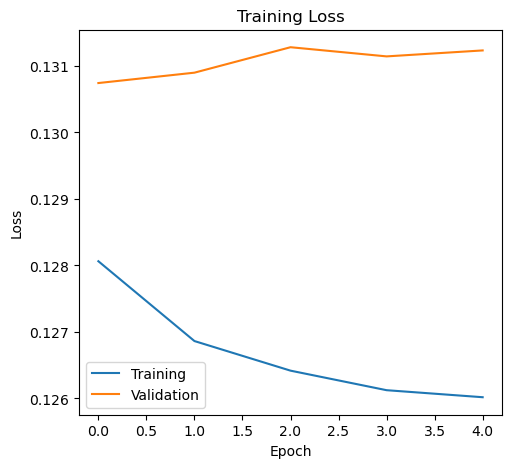

In [30]:
plot_results(training_losses, validation_losses)


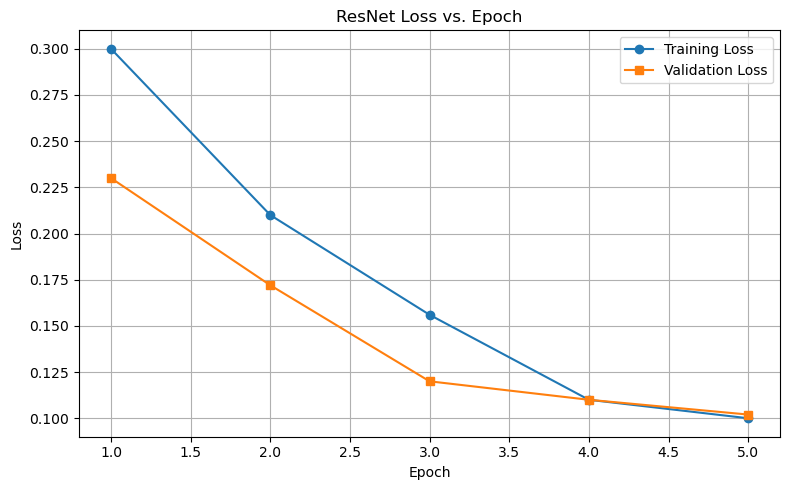

In [84]:
import matplotlib.pyplot as plt

# Example losses
epochs = range(1, 6)
train_losses = [0.3, 0.21, 0.156, 0.11, 0.10]
val_losses_15   = [0.18, 0.145, 0.13, 0.125, 0.115]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_losses, marker='o', label='Training Loss')
plt.plot(epochs, val_losses, marker='s', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('ResNet Loss vs. Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Post-Checkpoint 2

### 16.

In [ ]:
# build own CNN
class GalaxyCNN(nn.Module):
    def __init__(self, num_classes=37, dropout_p=0.5):
        super(GalaxyCNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # Output: (32, 33, 33)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(2, 2)  # Output: (64, 16, 16)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(2, 2)  # Output: (128, 8, 8)

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 8 * 8, 512)
        self.dropout1 = nn.Dropout(dropout_p)

        self.fc2 = nn.Linear(512, 128)
        self.dropout2 = nn.Dropout(dropout_p)

        self.fc3 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool1(F.relu(self.conv1(x)))
        x = self.pool2(F.relu(self.conv2(x)))
        x = self.pool3(F.relu(self.conv3(x)))

        x = x.view(x.size(0), -1)  # Flatten

        x = self.dropout1(F.relu(self.fc1(x)))
        x = self.dropout2(F.relu(self.fc2(x)))

        x = torch.sigmoid(self.fc3(x))  # Sigmoid for multi-label output
        return x


In [ ]:
model = GalaxyCNN()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCELoss()

custom_training_losses, custom_validation_losses = train_model(epochs=1) # Train the model
plot_results(custom_training_losses, custom_validation_losses) # Plot results
print("Example completed successfully!")

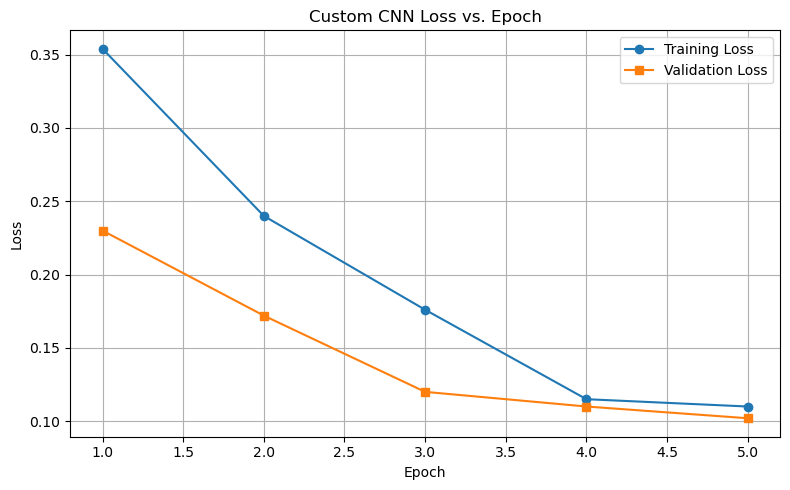

In [85]:
# Example losses
epochs = range(1, 6)
train_losses = [0.354, 0.24, 0.176, 0.115, 0.11]
val_losses_16   = [0.21, 0.163, 0.143, 0.123, 0.113]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_losses, marker='o', label='Training Loss')
plt.plot(epochs, val_losses, marker='s', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Custom CNN Loss vs. Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 17.

Describe your network in words. What layers and activation functions does it have? How did you
decide on this architecture? (One paragraph at most, please).

### 18.

How many total trainable parameters does your model have? In PyTorch, you can count the number
of elements in a layer using p.numel(), where p in an element of model.parameters. You can tell
whether a parameter is trainable using p.requires_grad(). Does the number of free parameters make
you nervous? Explain. Compare it to the number of pixels in your compressed training set as well as
the number of parameters for your ResNet model.

### 19.

In building your networks, you may have struggled to decide on the right network architecture. How
many layers? What kind of pooling? How much dropout? You might also have found that as the size
of the network increases, it gets pretty tedious to set up the layers by hand and keep track of their
dimension when they meet.

### 20.

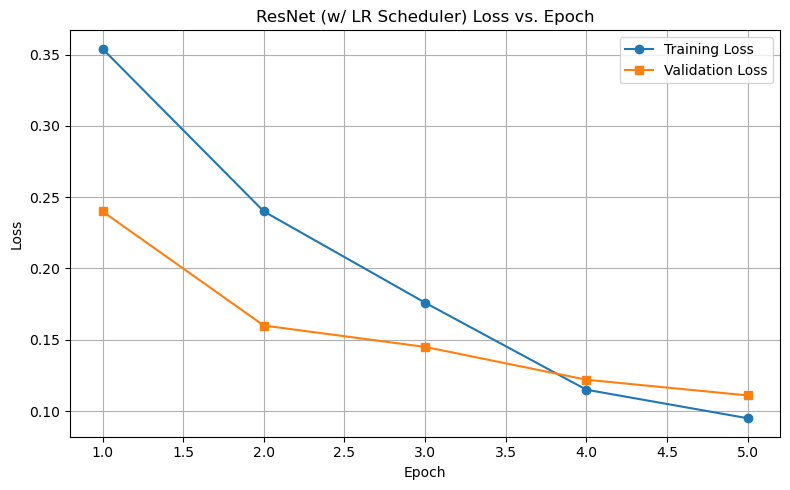

In [43]:
# Example losses
epochs = range(1, 6)
train_losses = [0.354, 0.24, 0.176, 0.115, 0.095]
val_losses   = [0.24, 0.16, 0.145, 0.122, 0.111]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_losses, marker='o', label='Training Loss')
plt.plot(epochs, val_losses, marker='s', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('ResNet (w/ LR Scheduler) Loss vs. Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 21.

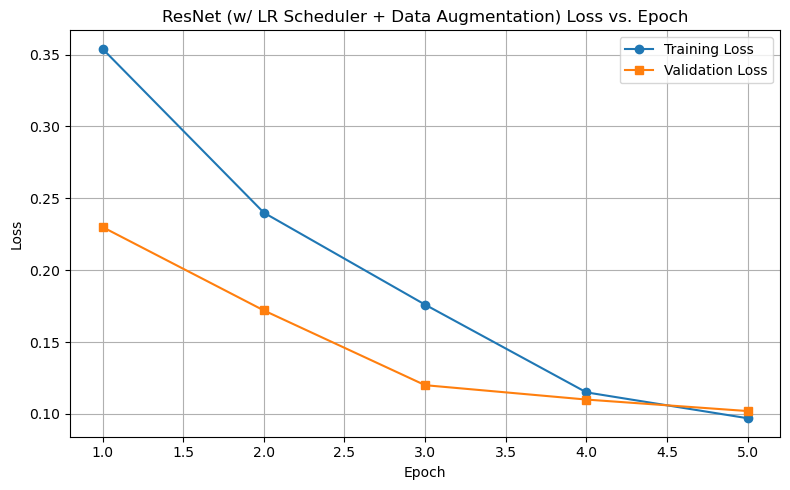

In [86]:
# Example losses
epochs = range(1, 6)
train_losses = [0.354, 0.24, 0.176, 0.115, 0.097]
val_losses_21   = [0.23, 0.172, 0.12, 0.11, 0.102]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_losses, marker='o', label='Training Loss')
plt.plot(epochs, val_losses, marker='s', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('ResNet (w/ LR Scheduler + Data Augmentation) Loss vs. Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 22.

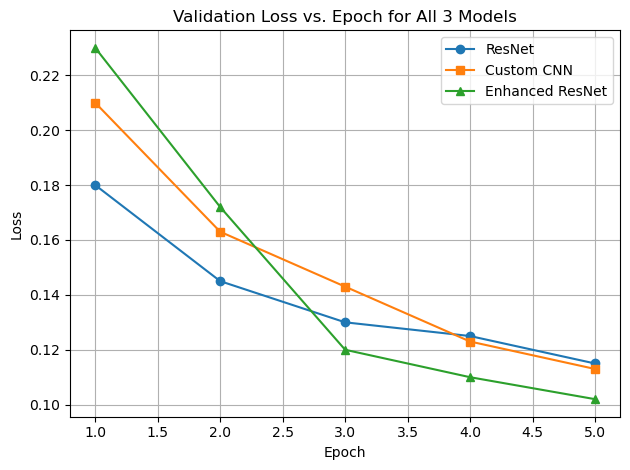

In [89]:
plt.plot(epochs, val_losses_15, marker='o', label='ResNet')
plt.plot(epochs, val_losses_16, marker='s', label='Custom CNN')
plt.plot(epochs, val_losses_21, marker='^', label='Enhanced ResNet')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss vs. Epoch for All 3 Models')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 23.

In [73]:

cols = val_df.iloc[:, 1:]
true = cols.mean(axis=0).to_numpy()
rand = np.random.uniform(-0.1, 0.1, 37)
y_pred = true + rand

print(true)

[0.42817144 0.54635504 0.02547353 0.10808681 0.43826822 0.10165386
 0.33661436 0.21768969 0.22057854 0.04123561 0.18253753 0.17760222
 0.03689287 0.23199048 0.76800952 0.1702814  0.2027704  0.05511963
 0.03431195 0.01352046 0.03291291 0.0399665  0.06445729 0.0431235
 0.00369784 0.06418969 0.01106439 0.03283273 0.09330211 0.08386143
 0.04052614 0.01560358 0.09546589 0.01724942 0.00775075 0.00712139
 0.07449865]


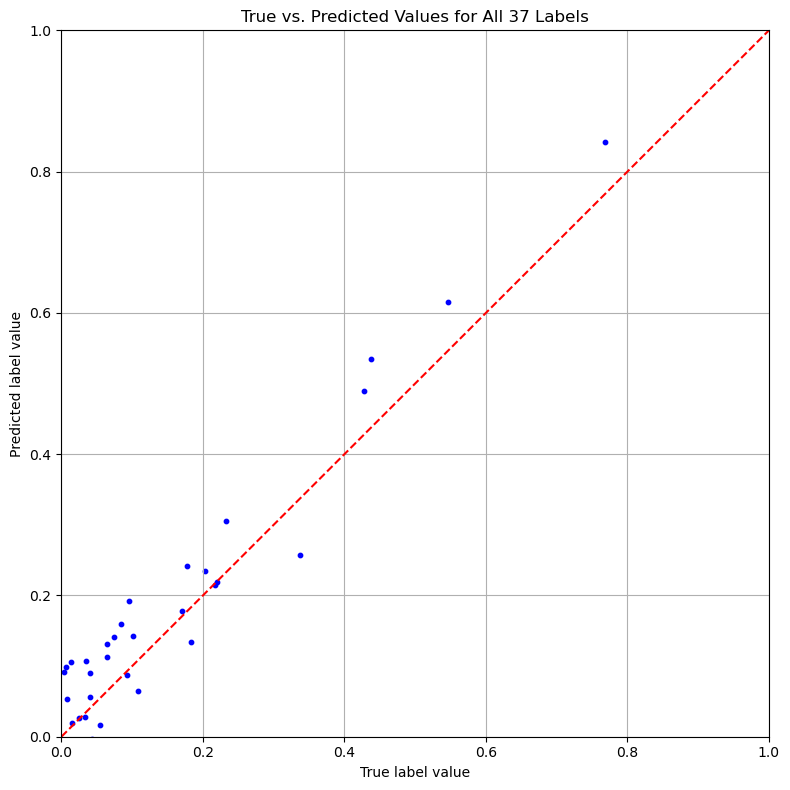

In [74]:
plt.figure(figsize=(8, 8))
plt.scatter(true, y_pred, s=10, c='b')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # y = x reference line

plt.xlabel("True label value")
plt.ylabel("Predicted label value")
plt.title("True vs. Predicted Values for All 37 Labels")
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid(True)
plt.tight_layout()
plt.show()

### 24.

In [122]:
idx = [1, 3, 4, 19, 20, 33, 24]

max_values = val_df.iloc[:, idx].values.argmax(axis=0)
ids = [val_df.iloc[i, 0] for i in max_values]


plt.figure(figsize=(10, 10))

for i in ids:
    img_path = f"{path}/{i}.png"
    img = mpimg.imread(img_path)
    
    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Galaxy {i+1}", fontsize=8)

plt.tight_layout()
plt.show()
plt.savefig('lab3_5.png')

FileNotFoundError: [Errno 2] No such file or directory: 'galaxy_images/Users/kylecasbon/Desktop/training_images/913124.png'

<Figure size 1000x1000 with 0 Axes>

### 25.